In [1]:
import os
from collections import defaultdict

# ===== Change this to your slices output folder =====
output_dir = r"D:\coronal_slices_filtered_flattened"
# ====================================================

class_counts = defaultdict(int)

for root, dirs, files in os.walk(output_dir):
    for file in files:
        if file.lower().endswith(('.png', '.jpg')):
            # Class name is the parent folder (AD, CN, MCI)
            class_name = os.path.basename(os.path.dirname(root))
            class_counts[class_name] += 1

print("📊 Slices per class:")
for cls, count in class_counts.items():
    print(f"{cls}: {count}")


📊 Slices per class:
test: 21248
train: 115072
val: 20992


In [3]:
import os
from collections import defaultdict

# ===== Change this to your slices output folder =====
output_dir = r"D:\coronal_slices_filtered_flattened"
# ====================================================

# Dictionary: {split: {class: count}}
split_class_counts = defaultdict(lambda: defaultdict(int))

for split in os.listdir(output_dir):  # train, val, test
    split_path = os.path.join(output_dir, split)
    if not os.path.isdir(split_path):
        continue
    for cls in os.listdir(split_path):  # AD, CN, MCI
        cls_path = os.path.join(split_path, cls)
        if not os.path.isdir(cls_path):
            continue
        count = sum(1 for f in os.listdir(cls_path) if f.lower().endswith(('.png', '.jpg')))
        split_class_counts[split][cls] = count

# Print results
print("📊 Slices per class per split:\n")
for split in split_class_counts:
    print(f"--- {split.upper()} ---")
    for cls, count in split_class_counts[split].items():
        print(f"{cls}: {count}")
    print()


📊 Slices per class per split:

--- TEST ---
AD: 5888
CN: 8192
MCI: 7168

--- TRAIN ---
AD: 25408
CN: 32704
MCI: 56960

--- VAL ---
AD: 5824
CN: 8064
MCI: 7104



📊 Slices per class per split:

--- TRAIN ---
AD: 25408
CN: 32704
MCI: 56960

--- VAL ---
AD: 5824
CN: 8064
MCI: 7104

--- TEST ---
AD: 5888
CN: 8192
MCI: 7168

TOTAL PER CLASS:
AD: 37120
CN: 48960
MCI: 71232


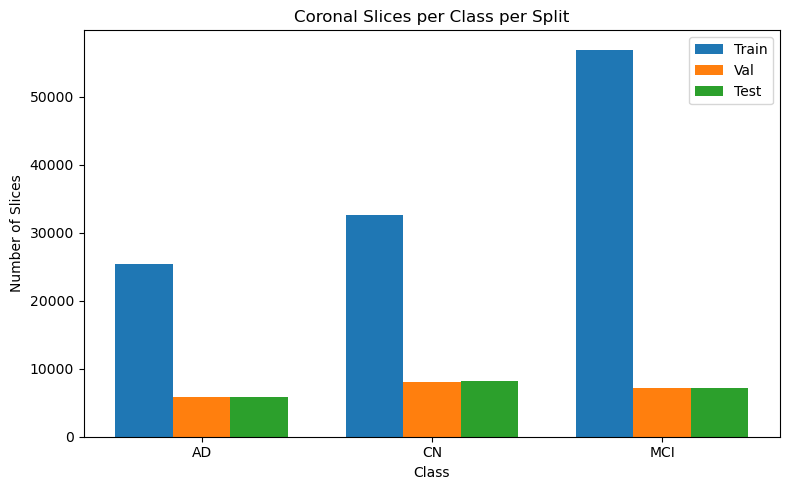


📌 Class Weights for PyTorch:
AD: 1.4126
CN: 1.0710
MCI: 0.7361

Class Weights Tensor: tensor([1.4126, 1.0710, 0.7361])


In [4]:
import os
import matplotlib.pyplot as plt
import numpy as np

# ============================
# CONFIGURATION
# ============================
slices_root = r"D:\coronal_slices_filtered_flattened"  # Path to extracted slices
splits = ["train", "val", "test"]
classes = ["AD", "CN", "MCI"]

# ============================
# STEP 1 — Count slices
# ============================
slice_counts = {split: {cls: 0 for cls in classes} for split in splits}

for split in splits:
    for cls in classes:
        folder = os.path.join(slices_root, split, cls)
        count = len([f for f in os.listdir(folder) if f.lower().endswith(".png")])
        slice_counts[split][cls] = count

# ============================
# STEP 2 — Display counts
# ============================
print("📊 Slices per class per split:\n")
total_per_class = {cls: 0 for cls in classes}

for split in splits:
    print(f"--- {split.upper()} ---")
    for cls in classes:
        count = slice_counts[split][cls]
        total_per_class[cls] += count
        print(f"{cls}: {count}")
    print()

print("TOTAL PER CLASS:")
for cls, total in total_per_class.items():
    print(f"{cls}: {total}")

# ============================
# STEP 3 — Plot bar chart
# ============================
x = np.arange(len(classes))
bar_width = 0.25

fig, ax = plt.subplots(figsize=(8, 5))
for i, split in enumerate(splits):
    counts = [slice_counts[split][cls] for cls in classes]
    ax.bar(x + i*bar_width, counts, width=bar_width, label=split.capitalize())

ax.set_xlabel("Class")
ax.set_ylabel("Number of Slices")
ax.set_title("Coronal Slices per Class per Split")
ax.set_xticks(x + bar_width)
ax.set_xticklabels(classes)
ax.legend()
plt.tight_layout()
plt.show()

# ============================
# STEP 4 — Compute class weights (for PyTorch)
# ============================
total_slices = sum(total_per_class.values())
class_weights = {cls: total_slices / (len(classes) * total) for cls, total in total_per_class.items()}

print("\n📌 Class Weights for PyTorch:")
for cls, weight in class_weights.items():
    print(f"{cls}: {weight:.4f}")

# As a tensor for PyTorch:
import torch
class_weights_tensor = torch.tensor([class_weights[cls] for cls in classes], dtype=torch.float)
print("\nClass Weights Tensor:", class_weights_tensor)


In [6]:
import os
import torch

# Path to your coronal slices dataset
dataset_path = r"D:\coronal_slices_filtered_flattened"

# Classes (ensure they are in the same order you'll use for training)
classes = ['AD', 'CN', 'MCI']

slice_counts = {cls: 0 for cls in classes}

# Loop through each split (train, val, test)
for split in ['train', 'val', 'test']:
    for cls in classes:
        cls_dir = os.path.join(dataset_path, split, cls)
        if os.path.exists(cls_dir):
            slice_counts[cls] += len([f for f in os.listdir(cls_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

print("📊 Slice counts per class:", slice_counts)

# Compute class weights
total_slices = sum(slice_counts.values())
num_classes = len(classes)
class_weights = [total_slices / (num_classes * slice_counts[cls]) for cls in classes]

print("\n📌 Class Weights for PyTorch:")
for cls, w in zip(classes, class_weights):
    print(f"{cls}: {w:.4f}")

weights_tensor = torch.tensor(class_weights, dtype=torch.float32)
print("\nClass Weights Tensor:", weights_tensor)


📊 Slice counts per class: {'AD': 37120, 'CN': 48960, 'MCI': 71232}

📌 Class Weights for PyTorch:
AD: 1.4126
CN: 1.0710
MCI: 0.7361

Class Weights Tensor: tensor([1.4126, 1.0710, 0.7361])


In [7]:
import os
from collections import Counter
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# ========= CONFIGURATION =========
data_dir = r"D:\coronal_slices_filtered_flattened"  # root dataset directory
batch_size = 6
image_size = (224, 224)  # resize target for model
num_workers = 4
# =================================

# Normalization values (ImageNet pretrained models)
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# ----------- TRANSFORMS -----------
# Train: with augmentation
train_transforms = transforms.Compose([
    transforms.Resize(image_size),
    #transforms.RandomHorizontalFlip(),
    #transforms.RandomRotation(15),
    #transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

# Val/Test: no augmentation
val_test_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

# ----------- DATASETS -------------
train_dataset = datasets.ImageFolder(
    os.path.join(data_dir, "train"),
    transform=train_transforms
)
val_dataset = datasets.ImageFolder(
    os.path.join(data_dir, "val"),
    transform=val_test_transforms
)
test_dataset = datasets.ImageFolder(
    os.path.join(data_dir, "test"),
    transform=val_test_transforms
)

# ----------- DATALOADERS ----------
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

# ----------- CLASS NAMES ----------
print("Classes:", train_dataset.classes)
print(f"Train total: {len(train_dataset)}, Val total: {len(val_dataset)}, Test total: {len(test_dataset)}")

# ----------- COUNT PER CLASS -------
def count_per_class(dataset):
    counts = Counter()
    for _, label in dataset:
        counts[dataset.classes[label]] += 1
    return dict(counts)

print("\n📊 Slices per class per split:")
print("--- TRAIN ---", count_per_class(train_dataset))
print("--- VAL ---", count_per_class(val_dataset))
print("--- TEST ---", count_per_class(test_dataset))

# ----------- CLASS WEIGHTS ---------
all_counts = count_per_class(train_dataset)
total_train = sum(all_counts.values())
class_weights = [total_train / all_counts[cls] for cls in train_dataset.classes]
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

print("\n📌 Class Weights for PyTorch:")
for cls, w in zip(train_dataset.classes, class_weights):
    print(f"{cls}: {w:.4f}")
print("Class Weights Tensor:", class_weights_tensor)


Classes: ['AD', 'CN', 'MCI']
Train total: 115072, Val total: 20992, Test total: 21248

📊 Slices per class per split:
--- TRAIN --- {'AD': 25408, 'CN': 32704, 'MCI': 56960}
--- VAL --- {'AD': 5824, 'CN': 8064, 'MCI': 7104}
--- TEST --- {'AD': 5888, 'CN': 8192, 'MCI': 7168}

📌 Class Weights for PyTorch:
AD: 4.5290
CN: 3.5186
MCI: 2.0202
Class Weights Tensor: tensor([4.5290, 3.5186, 2.0202])


In [ ]:
# now we will keep early convolutional layers frozen (they capture very generic edges/shapes).
# Unfreeze the last ResNet block + the final fc layer for training.
#This gives you the benefit of pretrained knowledge but lets the model specialize
# below is  the complete fine-tuning code for your dataset and class weights:

In [10]:
import os
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from tqdm import tqdm

# =================== CONFIG ===================
data_dir = r"D:\coronal_slices_filtered_flattened"
batch_size = 8
image_size = (224, 224)
num_workers = 4
num_epochs = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Class weights (example)
class_weights = torch.tensor([4.5290, 3.5186, 2.0202], dtype=torch.float).to(device)

# =================== STEP 1: Compute Mean & Std ===================
print("📊 Computing dataset mean and std...")
temp_transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor()
])

train_dataset_for_stats = datasets.ImageFolder(os.path.join(data_dir, "train"), transform=temp_transform)
train_loader_for_stats = DataLoader(train_dataset_for_stats, batch_size=batch_size, shuffle=False, num_workers=num_workers)

mean = 0.0
std = 0.0
nb_samples = 0

for data, _ in tqdm(train_loader_for_stats):
    batch_samples = data.size(0)
    data = data.view(batch_samples, data.size(1), -1)  # flatten H*W
    mean += data.mean(2).sum(0)
    std += data.std(2).sum(0)
    nb_samples += batch_samples

mean /= nb_samples
std /= nb_samples

print(f"✅ Computed Mean: {mean}")
print(f"✅ Computed Std: {std}")

# =================== STEP 2: Define Transforms ===================
train_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean.tolist(), std.tolist())
])

val_test_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean.tolist(), std.tolist())
])

# =================== STEP 3: Load Datasets ===================
train_dataset = datasets.ImageFolder(os.path.join(data_dir, "train"), transform=train_transforms)
val_dataset = datasets.ImageFolder(os.path.join(data_dir, "val"), transform=val_test_transforms)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

print("Classes:", train_dataset.classes)

# =================== STEP 4: Model ===================
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)

for param in model.parameters():
    param.requires_grad = False

for param in model.layer3.parameters():
    param.requires_grad = True
for param in model.layer4.parameters():
    param.requires_grad = True

num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(train_dataset.classes))
for param in model.fc.parameters():
    param.requires_grad = True

model = model.to(device)

# =================== STEP 5: Loss, Optimizer, Scheduler ===================
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-5)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.8)

# =================== STEP 6: Training Loop ===================
def train_model(model, criterion, optimizer, scheduler, train_loader, val_loader, num_epochs=10):
    best_acc = 0.0
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs}")
        print("-" * 30)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
                loader = train_loader
            else:
                model.eval()
                loader = val_loader

            running_loss, running_corrects = 0.0, 0

            for inputs, labels in tqdm(loader):
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(loader.dataset)
            epoch_acc = running_corrects.double() / len(loader.dataset)

            print(f"{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")

            if phase == 'train':
                scheduler.step()

            # Save best model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), "resedualnetwork50_finetuned_mri.pth")
                print("✅ Best model saved.")

    print(f"\nTraining complete. Best val Acc: {best_acc:.4f}")
    return model

# =================== STEP 7: Train ===================
model = train_model(model, criterion, optimizer, scheduler, train_loader, val_loader, num_epochs)


📊 Computing dataset mean and std...


100%|██████████| 14384/14384 [02:01<00:00, 118.87it/s]


✅ Computed Mean: tensor([0.2772, 0.2772, 0.2772])
✅ Computed Std: tensor([0.2666, 0.2666, 0.2666])
Classes: ['AD', 'CN', 'MCI']

Epoch 1/10
------------------------------


100%|██████████| 14384/14384 [13:53<00:00, 17.25it/s]


train Loss: 0.6069 Acc: 0.7097


100%|██████████| 2624/2624 [01:28<00:00, 29.53it/s]


val Loss: 0.5588 Acc: 0.8031
✅ Best model saved.

Epoch 2/10
------------------------------


100%|██████████| 14384/14384 [14:06<00:00, 16.99it/s]


train Loss: 0.1359 Acc: 0.9482


100%|██████████| 2624/2624 [01:39<00:00, 26.50it/s]


val Loss: 0.5068 Acc: 0.8469
✅ Best model saved.

Epoch 3/10
------------------------------


100%|██████████| 14384/14384 [12:43<00:00, 18.83it/s]


train Loss: 0.0495 Acc: 0.9824


100%|██████████| 2624/2624 [01:09<00:00, 37.54it/s]


val Loss: 0.6288 Acc: 0.8471
✅ Best model saved.

Epoch 4/10
------------------------------


100%|██████████| 14384/14384 [10:43<00:00, 22.36it/s]


train Loss: 0.0232 Acc: 0.9923


100%|██████████| 2624/2624 [01:09<00:00, 37.89it/s]


val Loss: 0.5782 Acc: 0.8609
✅ Best model saved.

Epoch 5/10
------------------------------


100%|██████████| 14384/14384 [10:43<00:00, 22.34it/s]


train Loss: 0.0158 Acc: 0.9950


100%|██████████| 2624/2624 [01:09<00:00, 37.80it/s]


val Loss: 0.7531 Acc: 0.8430

Epoch 6/10
------------------------------


100%|██████████| 14384/14384 [10:47<00:00, 22.23it/s]


train Loss: 0.0119 Acc: 0.9960


100%|██████████| 2624/2624 [01:08<00:00, 38.08it/s]


val Loss: 0.7141 Acc: 0.8555

Epoch 7/10
------------------------------


100%|██████████| 14384/14384 [10:42<00:00, 22.38it/s]


train Loss: 0.0071 Acc: 0.9977


100%|██████████| 2624/2624 [01:09<00:00, 37.54it/s]


val Loss: 0.6249 Acc: 0.8541

Epoch 8/10
------------------------------


100%|██████████| 14384/14384 [10:43<00:00, 22.35it/s]


train Loss: 0.0066 Acc: 0.9980


100%|██████████| 2624/2624 [01:06<00:00, 39.48it/s]


val Loss: 0.5897 Acc: 0.8675
✅ Best model saved.

Epoch 9/10
------------------------------


100%|██████████| 14384/14384 [10:43<00:00, 22.35it/s]


train Loss: 0.0054 Acc: 0.9983


100%|██████████| 2624/2624 [01:09<00:00, 37.94it/s]


val Loss: 0.6274 Acc: 0.8599

Epoch 10/10
------------------------------


100%|██████████| 14384/14384 [10:43<00:00, 22.34it/s]


train Loss: 0.0031 Acc: 0.9991


100%|██████████| 2624/2624 [01:05<00:00, 39.86it/s]

val Loss: 0.7435 Acc: 0.8664

Training complete. Best val Acc: 0.8675


In [ ]:
#Loads a ResNet50 architecture without pretrained ImageNet weights (weights=None).
#Replaces the final classification layer to match 3 classes (AD, CN, MCI).
#Loads your fine-tuned weights from resnet50_finetuned.pth.
#Removes the final classification layer to make a feature extractor. This means the model outputs high-level features (vector representations) instead of class predictions.

In [1]:
import os
import torch
import torch.nn as nn
from torchvision import models, datasets, transforms
import pandas as pd
from tqdm import tqdm

# ==========================
# CONFIG
# ==========================
data_dir = r"D:\coronal_slices_filtered_flattened"   # Dataset root
output_csv = "resedualneworkt50_finetuned_features.csv"
batch_size = 6
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ==========================
# 1. Load Fine-Tuned Model
# ==========================
model = models.resnet50(weights=None)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 3)  # trained with 3 classes

# Load fine-tuned weights (future-safe)
state_dict = torch.load("resedualnetwork50_finetuned_mri.pth", map_location=device, weights_only=True)
model.load_state_dict(state_dict)

# Remove classification head to get features
feature_extractor = nn.Sequential(*list(model.children())[:-1])
feature_extractor.to(device)
feature_extractor.eval()

# ==========================
# 2. Define Transforms
# ==========================
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.2772, 0.2772, 0.2772],  # ImageNet normalization
        std=[0.2666, 0.2666, 0.2666]
    )
])

# ==========================
# 3. Load Datasets
# ==========================
datasets_dict = {}
for split in ["train", "val", "test"]:
    datasets_dict[split] = datasets.ImageFolder(os.path.join(data_dir, split), transform=transform)

# ==========================
# 4. Extract Features
# ==========================
all_data = []

with torch.no_grad():
    for split, dataset_split in datasets_dict.items():
        loader = torch.utils.data.DataLoader(dataset_split, batch_size=batch_size, shuffle=False)
        print(f"\nExtracting features for {split} ({len(dataset_split)} images)...")

        for batch_idx, (inputs, labels) in enumerate(tqdm(loader, total=len(loader))):
            inputs = inputs.to(device)
            labels_np = labels.cpu().numpy()

            # Forward pass
            feats = feature_extractor(inputs)
            feats = feats.view(feats.size(0), -1).cpu().numpy()  # flatten

            # Get file paths for current batch
            start_idx = batch_idx * batch_size
            paths = [dataset_split.samples[start_idx + i][0] for i in range(len(labels_np))]
            filenames = [os.path.basename(p) for p in paths]

            # Append to all_data
            for fname, lbl, feat in zip(filenames, labels_np, feats):
                all_data.append([fname, dataset_split.classes[lbl]] + feat.tolist())

# ==========================
# 5. Save to CSV
# ==========================
feature_dim = len(all_data[0]) - 2
columns = ["filename", "class"] + [f"f{i}" for i in range(1, feature_dim + 1)]
df = pd.DataFrame(all_data, columns=columns)
df.to_csv(output_csv, index=False)

print(f"\n✅ Features saved to {output_csv}")



Extracting features for train (115072 images)...


100%|██████████| 19179/19179 [10:58<00:00, 29.12it/s]



Extracting features for val (20992 images)...


100%|██████████| 3499/3499 [02:03<00:00, 28.32it/s]



Extracting features for test (21248 images)...


100%|██████████| 3542/3542 [02:02<00:00, 28.82it/s]



✅ Features saved to resedualneworkt50_finetuned_features.csv


In [ ]:
import os
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from tqdm import tqdm

# =================== CONFIG ===================
data_dir = r"D:\coronal_slices_filtered_flattened"
batch_size = 8
image_size = (224, 224)
num_workers = 4
num_epochs = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Class weights (example)
class_weights = torch.tensor([4.5290, 3.5186, 2.0202], dtype=torch.float).to(device)

# =================== STEP 1: Compute Mean & Std ===================
print("📊 Computing dataset mean and std...")
temp_transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor()
])

train_dataset_for_stats = datasets.ImageFolder(os.path.join(data_dir, "train"), transform=temp_transform)
train_loader_for_stats = DataLoader(train_dataset_for_stats, batch_size=batch_size, shuffle=False, num_workers=num_workers)

mean = 0.0
std = 0.0
nb_samples = 0

for data, _ in tqdm(train_loader_for_stats):
    batch_samples = data.size(0)
    data = data.view(batch_samples, data.size(1), -1)  # flatten H*W
    mean += data.mean(2).sum(0)
    std += data.std(2).sum(0)
    nb_samples += batch_samples

mean /= nb_samples
std /= nb_samples

print(f"✅ Computed Mean: {mean}")
print(f"✅ Computed Std: {std}")

# =================== STEP 2: Define Transforms ===================
train_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean.tolist(), std.tolist())
])

val_test_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean.tolist(), std.tolist())
])

# =================== STEP 3: Load Datasets ===================
train_dataset = datasets.ImageFolder(os.path.join(data_dir, "train"), transform=train_transforms)
val_dataset = datasets.ImageFolder(os.path.join(data_dir, "val"), transform=val_test_transforms)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

print("Classes:", train_dataset.classes)

# =================== STEP 4: Model ===================
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)

for param in model.parameters():
    param.requires_grad = False

for param in model.layer3.parameters():
    param.requires_grad = True
for param in model.layer4.parameters():
    param.requires_grad = True

num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(train_dataset.classes))
for param in model.fc.parameters():
    param.requires_grad = True

model = model.to(device)

# =================== STEP 5: Loss, Optimizer, Scheduler ===================
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-5)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.8)

# =================== STEP 6: Training Loop ===================
def train_model(model, criterion, optimizer, scheduler, train_loader, val_loader, num_epochs=10):
    best_acc = 0.0
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs}")
        print("-" * 30)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
                loader = train_loader
            else:
                model.eval()
                loader = val_loader

            running_loss, running_corrects = 0.0, 0

            for inputs, labels in tqdm(loader):
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(loader.dataset)
            epoch_acc = running_corrects.double() / len(loader.dataset)

            print(f"{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")

            if phase == 'train':
                scheduler.step()

            # Save best model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), "resedualnetwork50_finetuned_mri.pth")
                print("✅ Best model saved.")

    print(f"\nTraining complete. Best val Acc: {best_acc:.4f}")
    return model

# =================== STEP 7: Train ===================
model = train_model(model, criterion, optimizer, scheduler, train_loader, val_loader, num_epochs)


📊 Computing dataset mean and std...


100%|██████████| 14384/14384 [02:01<00:00, 118.87it/s]


✅ Computed Mean: tensor([0.2772, 0.2772, 0.2772])
✅ Computed Std: tensor([0.2666, 0.2666, 0.2666])
Classes: ['AD', 'CN', 'MCI']

Epoch 1/10
------------------------------


100%|██████████| 14384/14384 [13:53<00:00, 17.25it/s]


train Loss: 0.6069 Acc: 0.7097


100%|██████████| 2624/2624 [01:28<00:00, 29.53it/s]


val Loss: 0.5588 Acc: 0.8031
✅ Best model saved.

Epoch 2/10
------------------------------


100%|██████████| 14384/14384 [14:06<00:00, 16.99it/s]


train Loss: 0.1359 Acc: 0.9482


100%|██████████| 2624/2624 [01:39<00:00, 26.50it/s]


val Loss: 0.5068 Acc: 0.8469
✅ Best model saved.

Epoch 3/10
------------------------------


100%|██████████| 14384/14384 [12:43<00:00, 18.83it/s]


train Loss: 0.0495 Acc: 0.9824


100%|██████████| 2624/2624 [01:09<00:00, 37.54it/s]


val Loss: 0.6288 Acc: 0.8471
✅ Best model saved.

Epoch 4/10
------------------------------


100%|██████████| 14384/14384 [10:43<00:00, 22.36it/s]


train Loss: 0.0232 Acc: 0.9923


100%|██████████| 2624/2624 [01:09<00:00, 37.89it/s]


val Loss: 0.5782 Acc: 0.8609
✅ Best model saved.

Epoch 5/10
------------------------------


100%|██████████| 14384/14384 [10:43<00:00, 22.34it/s]


train Loss: 0.0158 Acc: 0.9950


100%|██████████| 2624/2624 [01:09<00:00, 37.80it/s]


val Loss: 0.7531 Acc: 0.8430

Epoch 6/10
------------------------------


100%|██████████| 14384/14384 [10:47<00:00, 22.23it/s]


train Loss: 0.0119 Acc: 0.9960


100%|██████████| 2624/2624 [01:08<00:00, 38.08it/s]


val Loss: 0.7141 Acc: 0.8555

Epoch 7/10
------------------------------


100%|██████████| 14384/14384 [10:42<00:00, 22.38it/s]


train Loss: 0.0071 Acc: 0.9977


100%|██████████| 2624/2624 [01:09<00:00, 37.54it/s]


val Loss: 0.6249 Acc: 0.8541

Epoch 8/10
------------------------------


100%|██████████| 14384/14384 [10:43<00:00, 22.35it/s]


train Loss: 0.0066 Acc: 0.9980


100%|██████████| 2624/2624 [01:06<00:00, 39.48it/s]


val Loss: 0.5897 Acc: 0.8675
✅ Best model saved.

Epoch 9/10
------------------------------


100%|██████████| 14384/14384 [10:43<00:00, 22.35it/s]


train Loss: 0.0054 Acc: 0.9983


100%|██████████| 2624/2624 [01:09<00:00, 37.94it/s]


val Loss: 0.6274 Acc: 0.8599

Epoch 10/10
------------------------------


100%|██████████| 14384/14384 [10:43<00:00, 22.34it/s]


train Loss: 0.0031 Acc: 0.9991


100%|██████████| 2624/2624 [01:05<00:00, 39.86it/s]

val Loss: 0.7435 Acc: 0.8664

Training complete. Best val Acc: 0.8675


In [ ]:
# explanation of the result above:
#DataLoader splits your dataset into batches of size batch_size (6 in your code).
#Each batch is sent through the model, features are extracted, and stored in all_data.
#The loop continues until all batches have been processed, which means all images in the dataset are included, not just one batch

In [5]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import RandomForestClassifier

# ==========================
# CONFIG "D:\resedualneworkt50_finetuned_features.csv"
# ==========================
input_csv = r"D:\resedualneworkt50_finetuned_features.csv"
output_csv = "resedualnetwork50_selected_features_cumulative.csv"
correlation_threshold = 0.95
cumulative_importance_threshold = 0.95  # keep features covering 95% of total importance

# ==========================
# 1. Load CSV
# ==========================
df = pd.read_csv(input_csv)
filenames = df['filename']
labels = df['class']
features = df.drop(['filename', 'class'], axis=1)

print(f"Original number of features: {features.shape[1]}")

# ==========================
# 2. Remove low-variance features
# ==========================
var_thresh = VarianceThreshold(threshold=1e-5)
features_var = var_thresh.fit_transform(features)
features_var_cols = features.columns[var_thresh.get_support()]
features_var_df = pd.DataFrame(features_var, columns=features_var_cols)
print(f"After variance threshold: {features_var_df.shape[1]} features")

# ==========================
# 3. Remove highly correlated features
# ==========================
corr_matrix = features_var_df.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [col for col in upper.columns if any(upper[col] > correlation_threshold)]
features_uncorr_df = features_var_df.drop(columns=to_drop)
print(f"After correlation pruning: {features_uncorr_df.shape[1]} features")

# ==========================
# 4. Random Forest feature importance
# ==========================
rf = RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1)
rf.fit(features_uncorr_df, labels)
importances = rf.feature_importances_

# Sort features by importance
sorted_indices = np.argsort(importances)[::-1]
sorted_importances = importances[sorted_indices]
sorted_features = features_uncorr_df.columns[sorted_indices]

# Cumulative importance
cumulative_importance = np.cumsum(sorted_importances) / np.sum(sorted_importances)
num_features = np.searchsorted(cumulative_importance, cumulative_importance_threshold) + 1
print(f"Number of features selected to cover {cumulative_importance_threshold*100}% importance: {num_features}")

# Select top features based on cumulative importance
selected_features_df = features_uncorr_df[sorted_features[:num_features]]

# ==========================
# 5. Save selected features
# ==========================
final_df = pd.concat([filenames, labels, selected_features_df], axis=1)
final_df.to_csv(output_csv, index=False)
print(f"✅ Selected features saved to {output_csv}")


Original number of features: 2048
After variance threshold: 2048 features
After correlation pruning: 2048 features
Number of features selected to cover 95.0% importance: 921
✅ Selected features saved to resedualnetwork50_selected_features_cumulative.csv


In [6]:
import pandas as pd

# Load CSV
csv_path = "resedualnetwork50_selected_features_cumulative.csv"
df = pd.read_csv(csv_path)

# Show basic info
print("Shape:", df.shape)
print("\nColumns:", df.columns[:10], "...")  # first 10 columns
print("\nSample row:\n", df.iloc[0, :10])   # first 10 values of row 0
print("\nData types:\n", df.dtypes.value_counts())


Shape: (157312, 923)

Columns: Index(['filename', 'class', 'f1573', 'f1516', 'f2024', 'f536', 'f1868',
       'f1498', 'f798', 'f1962'],
      dtype='object') ...

Sample row:
 filename    002_S_0619_I118678_AD_slice_0079.png
class                                         AD
f1573                                        0.0
f1516                                        0.0
f2024                                        0.0
f536                                         0.0
f1868                                   0.077643
f1498                                   0.005977
f798                                    1.505308
f1962                                   0.087028
Name: 0, dtype: object

Data types:
 float64    921
object       2
Name: count, dtype: int64


d:\Anaconda\envs\torch_gpu\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Features shape: (157312, 921)


d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:453: UserWarning: Exited at iteration 2000 with accuracies 
[1.55986748e-14 1.18996006e-06 8.56207144e-06 1.20829902e-05]
not reaching the requested tolerance 2.950429916381836e-06.
Use iteration 1940 instead with accuracy 
2.5033724621739415e-06.

  _, diffusion_map = lobpcg(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:453: UserWarning: Exited postprocessing with accuracies 
[1.48645286e-14 2.57870451e-07 3.39280167e-06 6.36281702e-06]
not reaching the requested tolerance 2.950429916381836e-06.
  _, diffusion_map = lobpcg(
d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too smal

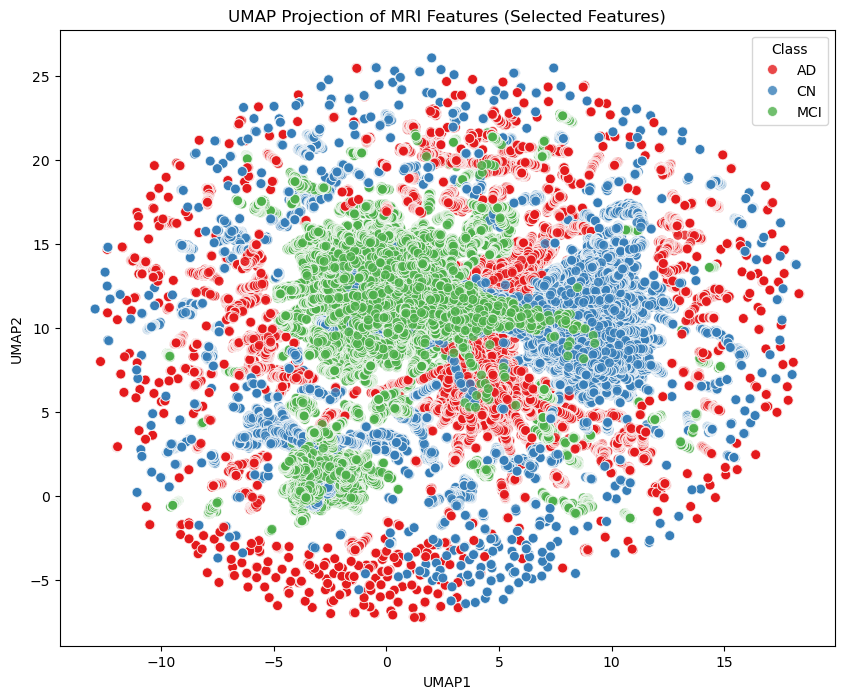

In [ ]:
import pandas as pd
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================
# CONFIG
# ==========================
input_csv = "resedualnetwork50_selected_features_cumulative.csv"
n_neighbors = 30   # UMAP parameter
min_dist = 0.3     # UMAP parameter
random_state = 42

# ==========================
# 1. Load selected features
# ==========================
df = pd.read_csv(input_csv)
labels = df['class']
features = df.drop(['filename', 'class'], axis=1)

print(f"Features shape: {features.shape}")

# ==========================
# 2. UMAP dimensionality reduction
# ==========================
reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=random_state)
embedding = reducer.fit_transform(features)

# ==========================
# 3. Visualization
# ==========================
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=embedding[:, 0], y=embedding[:, 1],
    hue=labels,
    palette="Set1",
    s=50,
    alpha=0.8
)
plt.title("UMAP Projection of MRI Features (Selected Features)")
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.legend(title="Class")
plt.show()


d:\Anaconda\envs\torch_gpu\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Features shape: (157312, 921), Labels shape: (157312,)
Skipping fold 1
Skipping fold 2
Skipping fold 3
Skipping fold 4
Fold 5 done


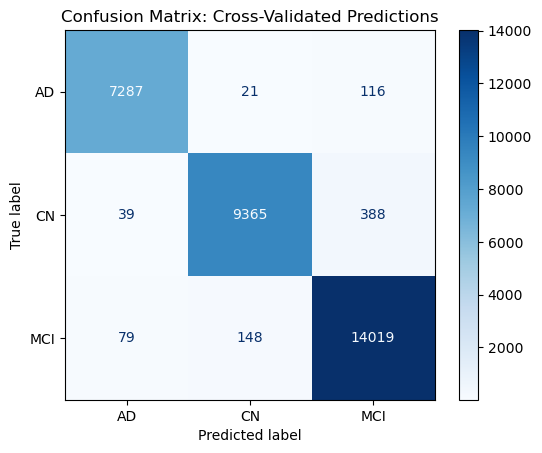

Classification Report:

              precision    recall  f1-score   support

          AD       0.98      0.98      0.98      7424
          CN       0.98      0.96      0.97      9792
         MCI       0.97      0.98      0.97     14246

    accuracy                           0.97     31462
   macro avg       0.98      0.97      0.98     31462
weighted avg       0.98      0.97      0.97     31462



ValueError: All arrays must be of the same length

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================
# CONFIG
# ==========================
input_csv = "resedualnetwork50_selected_features_cumulative.csv"
n_neighbors = 30       # UMAP
min_dist = 0.3         # UMAP
random_state = 42
n_splits = 5           # Cross-validation folds

# ==========================
# 1. Load data
# ==========================
df = pd.read_csv(input_csv)
X = df.drop(['filename', 'class'], axis=1).values
y = df['class'].values
filenames = df['filename'].values

print(f"Features shape: {X.shape}, Labels shape: {y.shape}")

# ==========================
# 2. Scale features
# ==========================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ==========================
# 3. Cross-validation training
# ==========================
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
model = RandomForestClassifier(n_estimators=200, random_state=random_state)

y_true_all = []
y_pred_all = []

start_fold = 5  # resume from the next fold
for fold, (train_idx, test_idx) in enumerate(skf.split(X_scaled, y), 1):
    if fold < start_fold:
        print(f"Skipping fold {fold}")
        continue

    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    y_true_all.extend(y_test)
    y_pred_all.extend(y_pred)
    
    print(f"Fold {fold} done")

# ==========================
# 4. Confusion Matrix
# ==========================
cm = confusion_matrix(y_true_all, y_pred_all, labels=['AD','CN','MCI'])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['AD','CN','MCI'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix: Cross-Validated Predictions")
plt.show()

# ==========================
# 5. Classification Report
# ==========================
print("Classification Report:\n")
print(classification_report(y_true_all, y_pred_all, target_names=['AD','CN','MCI']))

# ==========================
# 6. Identify misclassified MCI
# ==========================
results_df = pd.DataFrame({
    'filename': filenames,
    'true': y_true_all,
    'pred': y_pred_all
})

misclassified_mci = results_df[(results_df['true']=='MCI') & (results_df['pred'] != 'MCI')]
print("\nMisclassified MCI samples:")
print(misclassified_mci)

# ==========================
# 7. UMAP visualization
# ==========================
reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=random_state)
embedding = reducer.fit_transform(X_scaled)

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=embedding[:,0], y=embedding[:,1],
    hue=y,
    palette="Set1",
    s=50,
    alpha=0.6
)

# Highlight misclassified MCI samples
mis_idx = [i for i, fname in enumerate(filenames) if fname in misclassified_mci['filename'].values]
plt.scatter(embedding[mis_idx,0], embedding[mis_idx,1],
            facecolors='none', edgecolors='k', s=100, linewidths=1.5,
            label='Misclassified MCI')

plt.title("UMAP Projection of MRI Features with Misclassified MCI Highlighted")
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.legend()
plt.show()


d:\Anaconda\envs\torch_gpu\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Features shape: (157312, 921), Labels shape: (157312,)


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:02:29] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 1 done


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:04:27] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 2 done


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:06:34] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 3 done


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:08:38] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 4 done


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:11:01] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 5 done


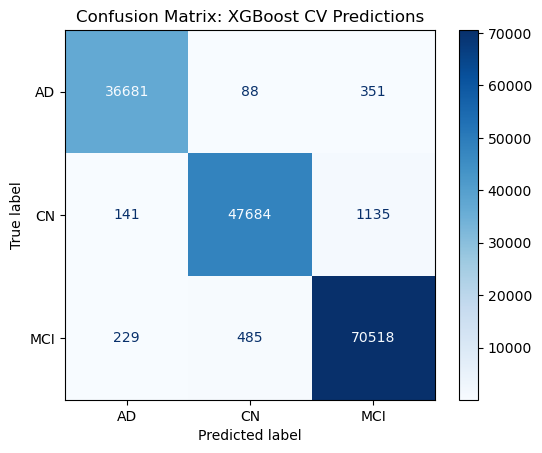

Classification Report:

              precision    recall  f1-score   support

          AD       0.99      0.99      0.99     37120
          CN       0.99      0.97      0.98     48960
         MCI       0.98      0.99      0.98     71232

    accuracy                           0.98    157312
   macro avg       0.99      0.98      0.98    157312
weighted avg       0.98      0.98      0.98    157312


Total misclassified samples: 2429
Misclassified AD: 439
Misclassified CN: 1276
Misclassified MCI: 714


d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:328: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:453: UserWarning: Exited at iteration 209 with accuracies 
[4.37970259e-06 5.35326821e-06 2.05723467e-04 1.00782188e-04]
not reaching the requested tolerance 6.645917892456055e-06.
Use iteration 209 instead with accuracy 
7.905965638028216e-05.

  _, diffusion_map = lobpcg(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:453: UserWarning: Exited postprocessing with accuracies 
[4.37970261e-06 5.35326820e-06 2.05723467e-04 1.00782188e-04]
not reaching the requested tolerance 6.645917892456055e-06.
  _, diffu

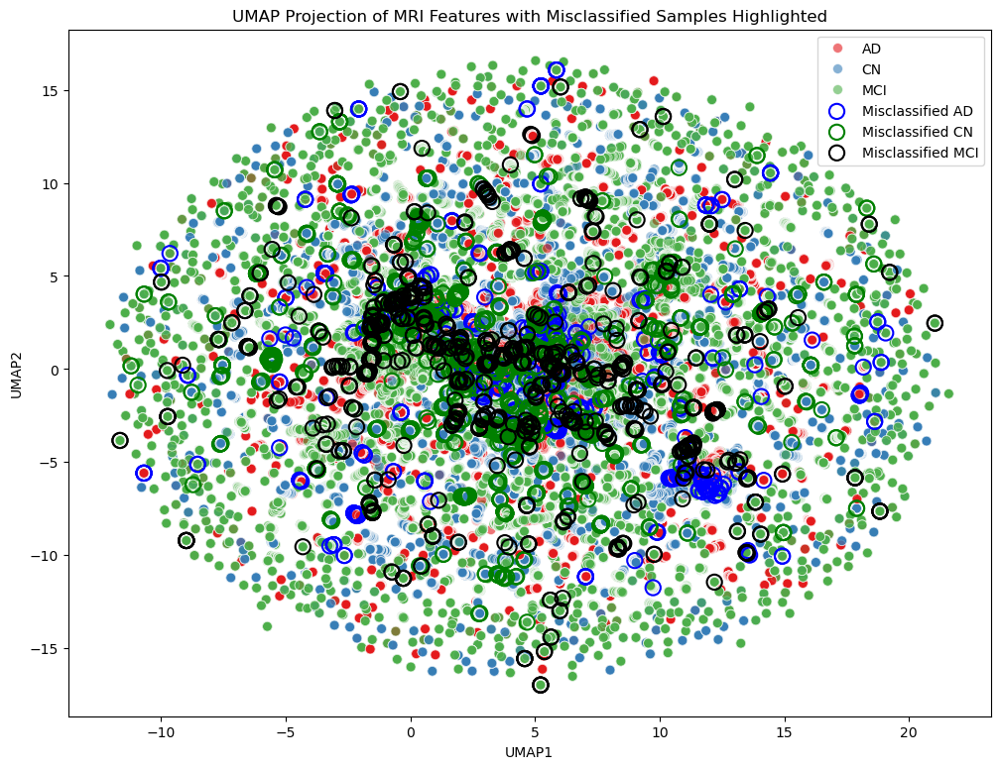

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier

# ==========================
# CONFIG
# ==========================
input_csv = "resedualnetwork50_selected_features_cumulative.csv"
n_neighbors = 15       # UMAP
min_dist = 0.1         # UMAP
random_state = 42
n_splits = 5           # Cross-validation folds

# ==========================
# 1. Load data
# ==========================
df = pd.read_csv(input_csv)
X = df.drop(['filename', 'class'], axis=1).values
y = df['class'].values
filenames = df['filename'].values

print(f"Features shape: {X.shape}, Labels shape: {y.shape}")

# ==========================
# 2. Encode string labels to integers
# ==========================
le = LabelEncoder()
y_encoded = le.fit_transform(y)  # 'AD'->0, 'CN'->1, 'MCI'->2
label_names = le.classes_        # ['AD','CN','MCI']

# ==========================
# 3. Scale features
# ==========================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ==========================
# 4. Cross-validation training with XGBoost
# ==========================
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=random_state)

y_true_all = []
y_pred_all = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X_scaled, y_encoded), 1):
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    y_true_all.extend(y_test)
    y_pred_all.extend(y_pred)
    
    print(f"Fold {fold} done")

# Convert numeric labels back to original string labels
y_true_all_str = le.inverse_transform(y_true_all)
y_pred_all_str = le.inverse_transform(y_pred_all)

# ==========================
# 5. Confusion Matrix
# ==========================
cm = confusion_matrix(y_true_all_str, y_pred_all_str, labels=label_names)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix: XGBoost CV Predictions")
plt.show()

# ==========================
# 6. Classification Report
# ==========================
print("Classification Report:\n")
print(classification_report(y_true_all_str, y_pred_all_str, target_names=label_names))

# ==========================
# 7. Identify misclassified samples
# ==========================
results_df = pd.DataFrame({
    'filename': filenames,
    'true': y_true_all_str,
    'pred': y_pred_all_str
})

# Separate misclassified samples by class
misclassified = results_df[results_df['true'] != results_df['pred']]
mis_ad = misclassified[misclassified['true'] == 'AD']
mis_cn = misclassified[misclassified['true'] == 'CN']
mis_mci = misclassified[misclassified['true'] == 'MCI']

print("\nTotal misclassified samples:", len(misclassified))
print("Misclassified AD:", len(mis_ad))
print("Misclassified CN:", len(mis_cn))
print("Misclassified MCI:", len(mis_mci))

# ==========================
# 8. UMAP visualization
# ==========================
reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=random_state)
embedding = reducer.fit_transform(X_scaled)

plt.figure(figsize=(12, 9))
sns.scatterplot(
    x=embedding[:,0], y=embedding[:,1],
    hue=y_true_all_str,
    palette="Set1",
    s=50,
    alpha=0.6
)

# Highlight misclassified samples
def highlight_samples(subset, color, label):
    idx = [i for i, fname in enumerate(filenames) if fname in subset['filename'].values]
    plt.scatter(embedding[idx,0], embedding[idx,1],
                facecolors='none', edgecolors=color, s=120, linewidths=1.5,
                label=label)

highlight_samples(mis_ad, 'blue', 'Misclassified AD')
highlight_samples(mis_cn, 'green', 'Misclassified CN')
highlight_samples(mis_mci, 'black', 'Misclassified MCI')

plt.title("UMAP Projection of MRI Features with Misclassified Samples Highlighted")
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.legend()
plt.show()


In [ ]:
# explanation of the code below         ( I didnot run this code)
#Tuned XGBoost hyperparameters for better generalization.
#Training vs test accuracy per fold is tracked and plotted.

Features shape: (16058, 1449), Labels shape: (16058,)


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [02:58:34] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 1 — Train Acc: 1.0000, Test Acc: 0.9549


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [03:01:03] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 2 — Train Acc: 1.0000, Test Acc: 0.9633


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [03:03:29] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 3 — Train Acc: 1.0000, Test Acc: 0.9564


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [03:05:53] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 4 — Train Acc: 1.0000, Test Acc: 0.9604


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [03:08:20] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 5 — Train Acc: 1.0000, Test Acc: 0.9592


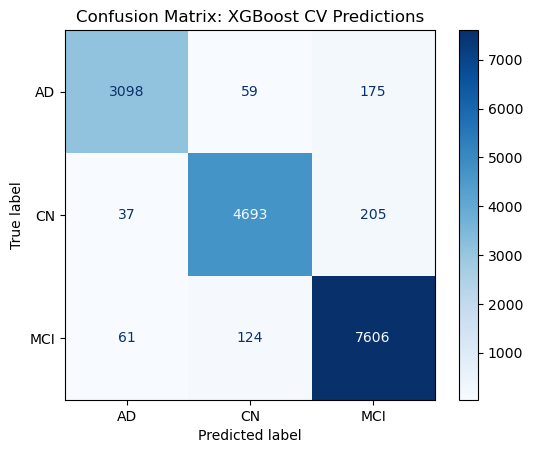

Classification Report:

              precision    recall  f1-score   support

          AD       0.97      0.93      0.95      3332
          CN       0.96      0.95      0.96      4935
         MCI       0.95      0.98      0.96      7791

    accuracy                           0.96     16058
   macro avg       0.96      0.95      0.96     16058
weighted avg       0.96      0.96      0.96     16058


Total misclassified samples: 661
Misclassified AD: 234
Misclassified CN: 242
Misclassified MCI: 185


d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


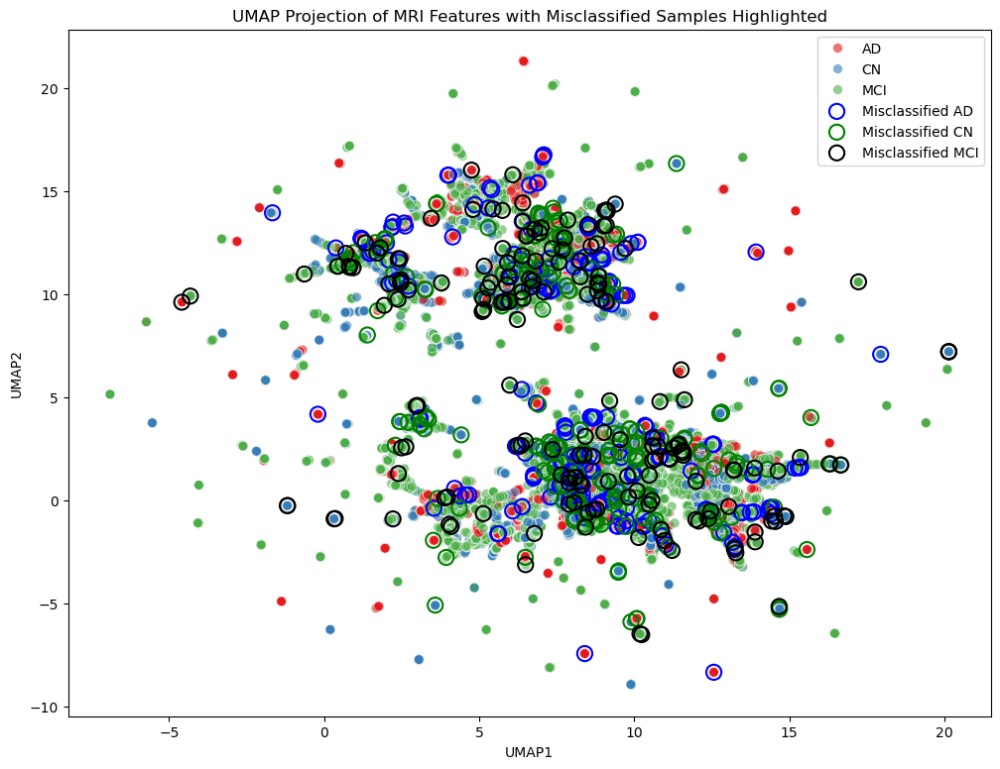

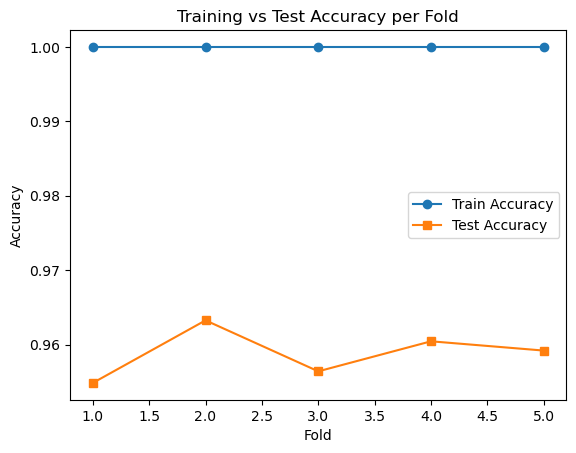


Average Train Accuracy: 1.0
Average Test Accuracy: 0.9588368400497511


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier

# ==========================
# CONFIG 
# ==========================
input_csv = "resedualnetwork50_selected_features_cumulative.csv"
n_neighbors = 15       # UMAP
min_dist = 0.1         # UMAP
random_state = 42
n_splits = 5           # Cross-validation folds

# ==========================
# 1. Load data
# ==========================
df = pd.read_csv(input_csv)
X = df.drop(['filename', 'class'], axis=1).values
y = df['class'].values
filenames = df['filename'].values

print(f"Features shape: {X.shape}, Labels shape: {y.shape}")

# ==========================
# 2. Encode string labels to integers
# ==========================
le = LabelEncoder()
y_encoded = le.fit_transform(y)  # 'AD'->0, 'CN'->1, 'MCI'->2
label_names = le.classes_        # ['AD','CN','MCI']

# ==========================
# 3. Scale features
# ==========================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ==========================
# 4. Cross-validation training with XGBoost (tuned)
# ==========================
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
model = XGBClassifier(
    use_label_encoder=False,
    eval_metric='mlogloss',
    random_state=random_state,
    max_depth=4,
    n_estimators=500,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=0.5,
    reg_lambda=2
)

y_true_all = []
y_pred_all = []

train_acc_all = []
test_acc_all = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X_scaled, y_encoded), 1):
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]
    
    model.fit(X_train, y_train)
    
    # Training accuracy
    y_train_pred = model.predict(X_train)
    train_acc = accuracy_score(y_train, y_train_pred)
    train_acc_all.append(train_acc)
    
    # Test accuracy
    y_pred = model.predict(X_test)
    test_acc = accuracy_score(y_test, y_pred)
    test_acc_all.append(test_acc)
    
    y_true_all.extend(y_test)
    y_pred_all.extend(y_pred)
    
    print(f"Fold {fold} — Train Acc: {train_acc:.4f}, Test Acc: {test_acc:.4f}")

# Convert numeric labels back to strings
y_true_all_str = le.inverse_transform(y_true_all)
y_pred_all_str = le.inverse_transform(y_pred_all)

# ==========================
# 5. Confusion Matrix
# ==========================
cm = confusion_matrix(y_true_all_str, y_pred_all_str, labels=label_names)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix: XGBoost CV Predictions")
plt.show()

# ==========================
# 6. Classification Report
# ==========================
print("Classification Report:\n")
print(classification_report(y_true_all_str, y_pred_all_str, target_names=label_names))

# ==========================
# 7. Identify misclassified samples
# ==========================
results_df = pd.DataFrame({
    'filename': filenames,
    'true': y_true_all_str,
    'pred': y_pred_all_str
})

misclassified = results_df[results_df['true'] != results_df['pred']]
mis_ad = misclassified[misclassified['true'] == 'AD']
mis_cn = misclassified[misclassified['true'] == 'CN']
mis_mci = misclassified[misclassified['true'] == 'MCI']

print("\nTotal misclassified samples:", len(misclassified))
print("Misclassified AD:", len(mis_ad))
print("Misclassified CN:", len(mis_cn))
print("Misclassified MCI:", len(mis_mci))

# ==========================
# 8. UMAP visualization
# ==========================
reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=random_state)
embedding = reducer.fit_transform(X_scaled)

plt.figure(figsize=(12, 9))
sns.scatterplot(
    x=embedding[:,0], y=embedding[:,1],
    hue=y_true_all_str,
    palette="Set1",
    s=50,
    alpha=0.6
)

# Highlight misclassified samples
def highlight_samples(subset, color, label):
    idx = [i for i, fname in enumerate(filenames) if fname in subset['filename'].values]
    plt.scatter(embedding[idx,0], embedding[idx,1],
                facecolors='none', edgecolors=color, s=120, linewidths=1.5,
                label=label)

highlight_samples(mis_ad, 'blue', 'Misclassified AD')
highlight_samples(mis_cn, 'green', 'Misclassified CN')
highlight_samples(mis_mci, 'black', 'Misclassified MCI')

plt.title("UMAP Projection of MRI Features with Misclassified Samples Highlighted")
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.legend()
plt.show()

# ==========================
# 9. Plot training vs test accuracy per fold
# ==========================
folds = np.arange(1, n_splits+1)
plt.plot(folds, train_acc_all, marker='o', label='Train Accuracy')
plt.plot(folds, test_acc_all, marker='s', label='Test Accuracy')
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.title("Training vs Test Accuracy per Fold")
plt.legend()
plt.show()

print("\nAverage Train Accuracy:", np.mean(train_acc_all))
print("Average Test Accuracy:", np.mean(test_acc_all))


Features shape: (157312, 921), Labels shape: (157312,)


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:21:54] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 1 — Train Acc: 0.9925, Test Acc: 0.9818


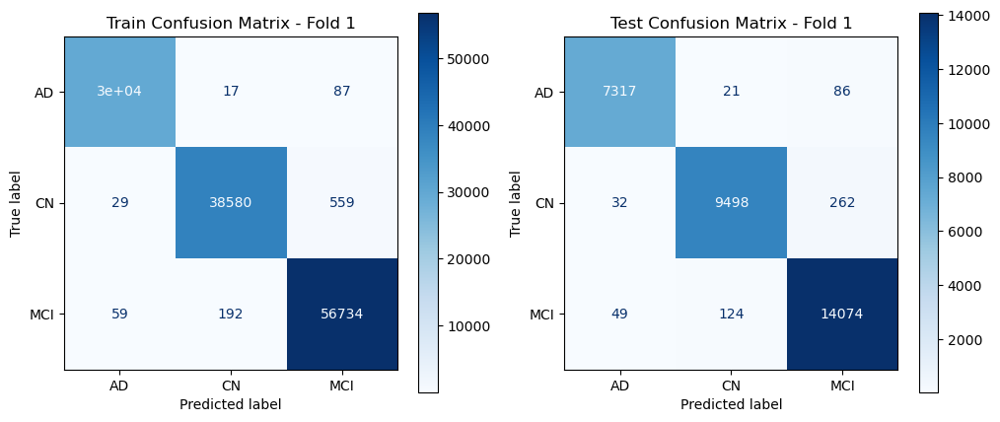

d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:29:32] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 2 — Train Acc: 0.9925, Test Acc: 0.9809


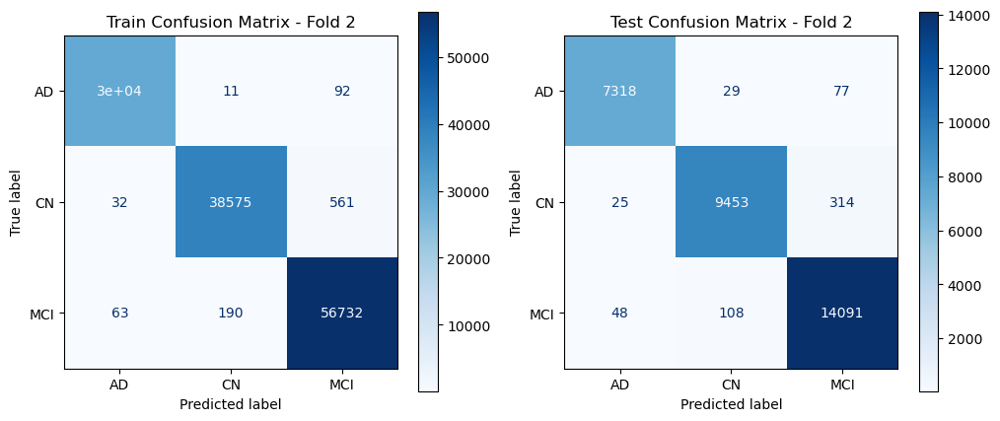

d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:36:30] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 3 — Train Acc: 0.9924, Test Acc: 0.9803


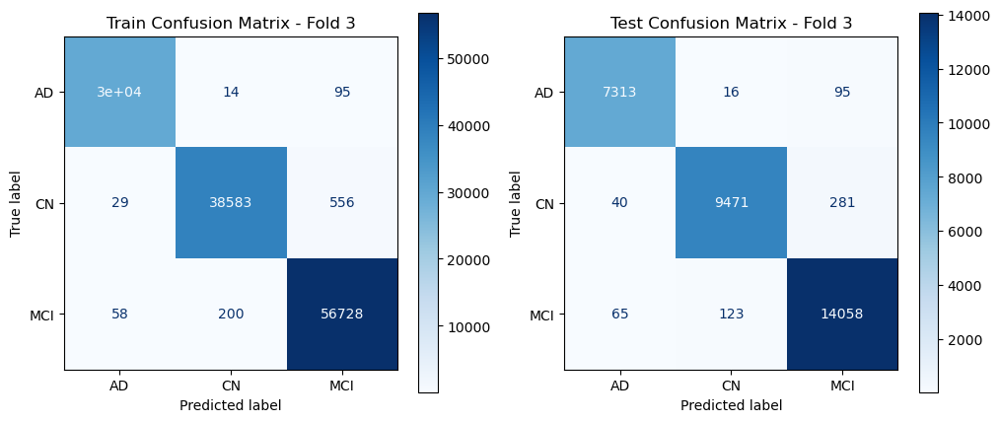

d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:43:12] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 4 — Train Acc: 0.9924, Test Acc: 0.9818


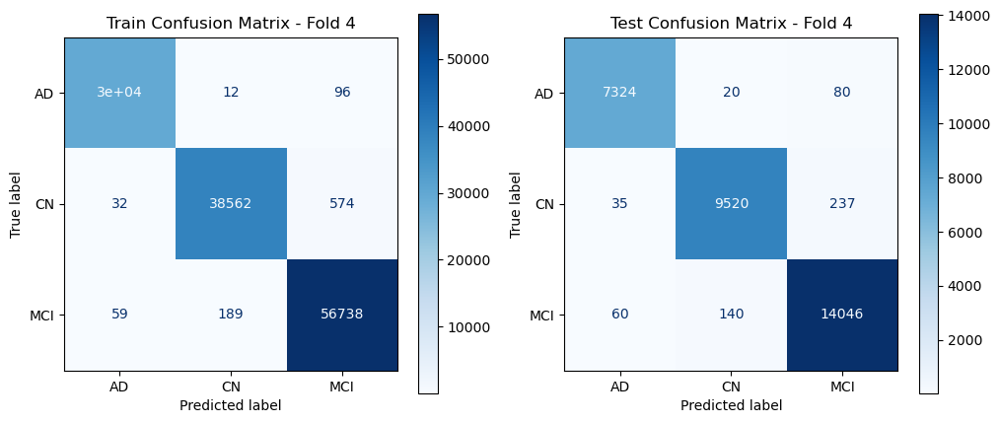

d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:49:35] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 5 — Train Acc: 0.9923, Test Acc: 0.9820


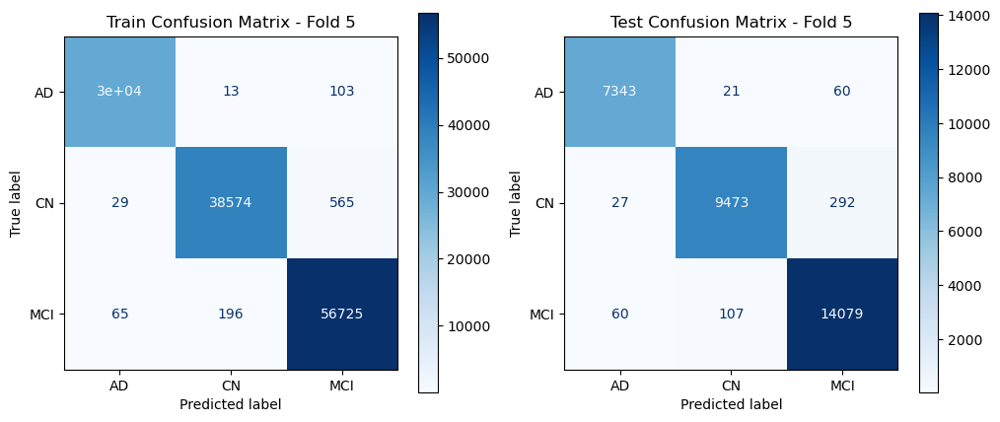

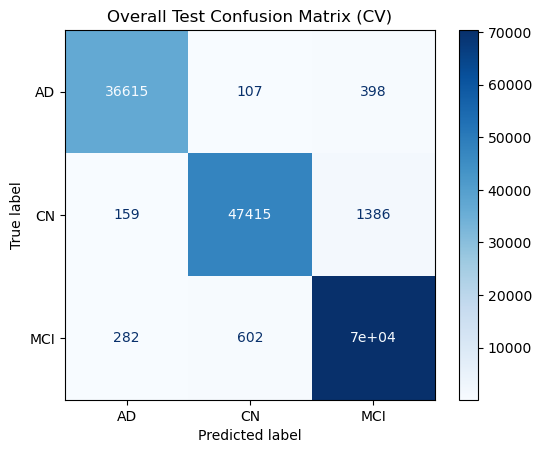

Classification Report (Overall Test):

              precision    recall  f1-score   support

          AD       0.99      0.99      0.99     37120
          CN       0.99      0.97      0.98     48960
         MCI       0.98      0.99      0.98     71232

    accuracy                           0.98    157312
   macro avg       0.98      0.98      0.98    157312
weighted avg       0.98      0.98      0.98    157312



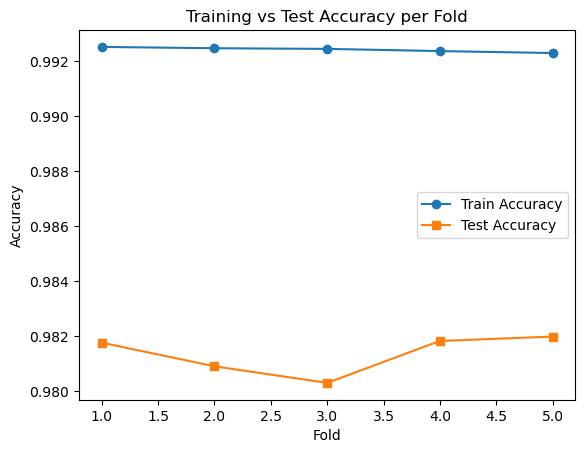


Average Train Accuracy: 0.992408398833707
Average Test Accuracy: 0.9813491662669467


In [2]:
import pandas as pd 
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score
import matplotlib.pyplot as plt
from xgboost import XGBClassifier

# ==========================
# CONFIG
# ==========================
input_csv = "resedualnetwork50_selected_features_cumulative.csv"
random_state = 42
n_splits = 5           # Cross-validation folds

# ==========================
# 1. Load data
# ==========================
df = pd.read_csv(input_csv)
X = df.drop(['filename', 'class'], axis=1).values
y = df['class'].values

print(f"Features shape: {X.shape}, Labels shape: {y.shape}")

# ==========================
# 2. Encode labels
# ==========================
le = LabelEncoder()
y_encoded = le.fit_transform(y)  # 'AD'->0, 'CN'->1, 'MCI'->2
label_names = le.classes_

# ==========================
# 3. Scale features
# ==========================
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ==========================
# 4. Cross-validation training with XGBoost (tuned)
# ==========================
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
model = XGBClassifier(
    use_label_encoder=False,
    eval_metric='mlogloss',
    random_state=random_state,
    max_depth=4,
    n_estimators=500,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=0.5,
    reg_lambda=2
)

train_acc_all = []
test_acc_all = []

y_true_all = []
y_pred_all = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X_scaled, y_encoded), 1):
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]
    
    model.fit(X_train, y_train)
    
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Accuracies
    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc = accuracy_score(y_test, y_test_pred)
    train_acc_all.append(train_acc)
    test_acc_all.append(test_acc)
    
    y_true_all.extend(y_test)
    y_pred_all.extend(y_test_pred)
    
    print(f"Fold {fold} — Train Acc: {train_acc:.4f}, Test Acc: {test_acc:.4f}")
    
    # Confusion Matrices per fold
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    ConfusionMatrixDisplay.from_predictions(
        y_train, y_train_pred,
        display_labels=label_names,
        cmap="Blues", ax=axes[0]
    )
    axes[0].set_title(f"Train Confusion Matrix - Fold {fold}")
    
    ConfusionMatrixDisplay.from_predictions(
        y_test, y_test_pred,
        display_labels=label_names,
        cmap="Blues", ax=axes[1]
    )
    axes[1].set_title(f"Test Confusion Matrix - Fold {fold}")
    
    plt.show()

# ==========================
# 5. Final confusion matrix (all test folds combined)
# ==========================
cm = confusion_matrix(y_true_all, y_pred_all)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
disp.plot(cmap=plt.cm.Blues)
plt.title("Overall Test Confusion Matrix (CV)")
plt.show()

# ==========================
# 6. Classification Report
# ==========================
print("Classification Report (Overall Test):\n")
print(classification_report(y_true_all, y_pred_all, target_names=label_names))

# ==========================
# 7. Accuracy per fold
# ==========================
folds = np.arange(1, n_splits+1)
plt.plot(folds, train_acc_all, marker='o', label='Train Accuracy')
plt.plot(folds, test_acc_all, marker='s', label='Test Accuracy')
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.title("Training vs Test Accuracy per Fold")
plt.legend()
plt.show()

print("\nAverage Train Accuracy:", np.mean(train_acc_all))
print("Average Test Accuracy:", np.mean(test_acc_all))


d:\Anaconda\envs\torch_gpu\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:328: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:453: UserWarning: Exited at iteration 470 with accuracies 
[8.41923137e-06 7.36956876e-05 3.95026915e-06 1.11166847e-04]
not reaching the requested tolerance 5.125999450683594e-06.
Use iteration 470 instead with accuracy 
4.930800874589494e-05.

  _, diffusion_map = lobpcg(
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\manifold\_spectral_embedding.py:453: UserWarning: Exited postprocessing with accuracies 
[8.41922290e-06 7.36956884e-05 3.95026461e-06 1.11166847e-04]
not reaching the requested tolerance 5.125999450683594e-06.
  _, diffu

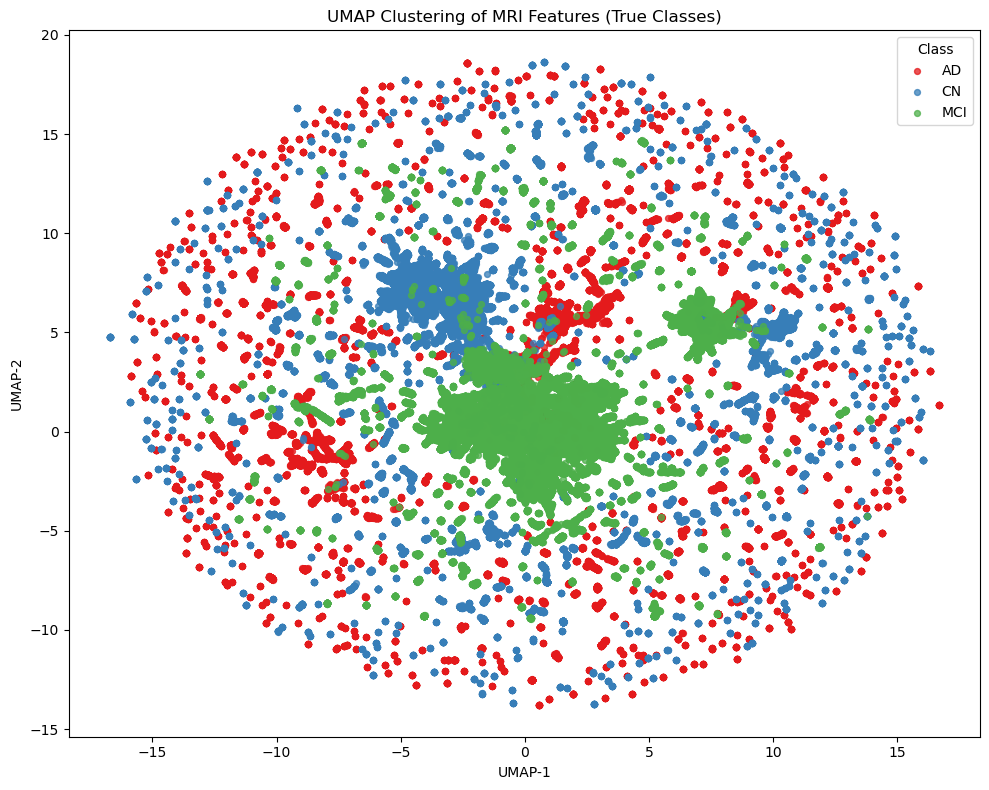

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import umap.umap_ as umap
from sklearn.preprocessing import StandardScaler, LabelEncoder
import seaborn as sns

# ===== Config =====
input_csv = "resedualnetwork50_selected_features_cumulative.csv"
n_neighbors = 20
min_dist = 0.0001
random_state = 42

# ===== Load =====
df = pd.read_csv(input_csv)
X = df.drop(['filename', 'class'], axis=1).values
y = df['class'].values

# Encode only for coloring/legend control
le = LabelEncoder()
y_enc = le.fit_transform(y)       # maps to 0..K-1 for plotting
classes = le.classes_             # e.g., ['AD','CN','MCI']

# ===== Scale + UMAP =====
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist,
                    n_components=2, random_state=random_state)
X_umap = reducer.fit_transform(X_scaled)

# ===== Plot =====
plt.figure(figsize=(10, 8))
palette = sns.color_palette("Set1", n_colors=len(classes))
for i, cls in enumerate(classes):
    idx = (y_enc == i)
    plt.scatter(X_umap[idx, 0], X_umap[idx, 1], s=18, alpha=0.75,
                label=cls, color=palette[i])

plt.title("UMAP Clustering of MRI Features (True Classes)")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.legend(title="Class")
plt.tight_layout()
plt.show()


In [1]:
# =====================================
# 🧠 ADNI Feature + Metadata Fusion Pipeline
# =====================================

import pandas as pd
import numpy as np
import re
import os

# ============================
# STEP 1: CONFIGURATION
# ============================

# ✅ Update these paths
FEATURES_PATH = r"resedualnetwork50_selected_features_cumulative.csv"        # feature embeddings file (e.g., ResNet features)
METADATA_PATH = r"D:\ADNI1_Merged_MRI_Metadata.csv"       # metadata file (e.g., demographics + diagnosis)

# ============================
# STEP 2: LOAD DATA
# ============================

print("=== Loading datasets ===")
features_df = pd.read_csv(FEATURES_PATH)
metadata_df = pd.read_csv(METADATA_PATH)

print(f"Features dataset loaded: {features_df.shape}")
print(f"Metadata dataset loaded: {metadata_df.shape}")

# Display column names for debugging
print("\nFeature columns sample:", features_df.columns[:5].tolist())
print("Metadata columns sample:", metadata_df.columns[:5].tolist())

# ============================
# STEP 3: CLEAN FEATURE FILENAMES AND EXTRACT IMAGE ID
# ============================

def extract_image_id(filename):
    """Extracts IDs like I118678 from filenames."""
    match = re.search(r'I\d+', str(filename))
    return match.group(0) if match else None

if 'filename' not in features_df.columns:
    raise ValueError("❌ The features file must contain a 'filename' column!")

features_df['Image_ID'] = features_df['filename'].apply(extract_image_id)
print("\n✅ Extracted Image_ID from feature filenames:")
print(features_df[['filename', 'Image_ID']].head())

# ============================
# STEP 4: IDENTIFY ID COLUMN IN METADATA
# ============================

metadata_id_col = None
for col in metadata_df.columns:
    # Look for IDs like "I12345"
    if metadata_df[col].astype(str).str.contains(r'^I\d+', regex=True).any():
        metadata_id_col = col
        break

if metadata_id_col is None:
    raise ValueError("❌ No metadata column found that matches pattern Ixxxxxx")

print(f"\n✅ Detected metadata ID column: {metadata_id_col}")

# ============================
# STEP 5: MERGE FEATURES + METADATA
# ============================

print("\n=== Fusing datasets ===")
merged_df = pd.merge(
    features_df,
    metadata_df,
    left_on='Image_ID',
    right_on=metadata_id_col,
    how='inner'
)

print(f"Merged dataset shape: {merged_df.shape}")
print(f"Number of matched records: {len(merged_df)}")

if len(merged_df) == 0:
    print("⚠️ No matches found. Check that Image_ID extraction and metadata ID formats align.")
else:
    print("\n✅ Fusion successful! Preview:")
    display(merged_df.head(5))

# ============================
# STEP 6: CHECK CLASS DISTRIBUTION
# ============================

# Try to find the label column
possible_label_cols = [c for c in merged_df.columns if c.lower() in ['group', 'diagnosis', 'class', 'label']]
if possible_label_cols:
    label_col = possible_label_cols[0]
    print(f"\n✅ Detected label column: {label_col}")
    print(merged_df[label_col].value_counts())
else:
    print("\n⚠️ Could not automatically find a label column (e.g., Group/Diagnosis).")

# ============================
# STEP 7: PREPARE FINAL DATA FOR ANALYSIS
# ============================

# Drop non-numeric columns except labels for model training
non_numeric_cols = merged_df.select_dtypes(exclude=[np.number]).columns.tolist()
keep_cols = ['Image_ID']
if possible_label_cols:
    keep_cols.append(label_col)

merged_df_numeric = merged_df.drop(columns=[c for c in non_numeric_cols if c not in keep_cols], errors='ignore')
print(f"\nFinal numeric dataset shape (for ML): {merged_df_numeric.shape}")

# ============================
# STEP 8: SAVE MERGED OUTPUT
# ============================

OUTPUT_PATH = os.path.join(os.path.dirname(FEATURES_PATH), "ADNI_merged_features_resedual_network_metadata.csv")
merged_df.to_csv(OUTPUT_PATH, index=False)
print(f"\n💾 Saved fused dataset to: {OUTPUT_PATH}")


=== Loading datasets ===
Features dataset loaded: (157312, 923)
Metadata dataset loaded: (1464, 51)

Feature columns sample: ['filename', 'class', 'f1573', 'f1516', 'f2024']
Metadata columns sample: ['Image Data ID', 'Subject', 'Group', 'Sex', 'Age']

✅ Extracted Image_ID from feature filenames:
                               filename Image_ID
0  002_S_0619_I118678_AD_slice_0079.png  I118678
1  002_S_0619_I118678_AD_slice_0080.png  I118678
2  002_S_0619_I118678_AD_slice_0081.png  I118678
3  002_S_0619_I118678_AD_slice_0082.png  I118678
4  002_S_0619_I118678_AD_slice_0083.png  I118678

✅ Detected metadata ID column: Image Data ID

=== Fusing datasets ===
Merged dataset shape: (100608, 975)
Number of matched records: 100608

✅ Fusion successful! Preview:


,filename,class,f1573,f1516,f2024,f536,f1868,f1498,f798,f1962,...,AXCRYING,AXELMOOD,AXWANDER,AXFALL,AXOTHER,ID,SITEID,USERDATE,USERDATE2,update_stamp
0,002_S_0619_I60451_AD_slice_0097.png,AD,0.0,0.000000,0.000000,0.000000,0.033529,0.009963,0.901640,0.000000,...,1,2,1,2,1.0,552,101,2006-12-13,NaN,2006-12-13 00:00:00.0
1,002_S_0619_I60451_AD_slice_0098.png,AD,0.0,0.000000,0.000000,0.000000,0.000000,0.035464,0.760376,0.021339,...,1,2,1,2,1.0,552,101,2006-12-13,NaN,2006-12-13 00:00:00.0
2,002_S_0619_I60451_AD_slice_0099.png,AD,0.0,0.058004,0.000000,0.000000,0.000000,0.015677,0.826421,0.003733,...,1,2,1,2,1.0,552,101,2006-12-13,NaN,2006-12-13 00:00:00.0
3,002_S_0619_I60451_AD_slice_0100.png,AD,0.0,0.000000,0.000000,0.000000,0.044739,0.004165,0.944047,0.005744,...,1,2,1,2,1.0,552,101,2006-12-13,NaN,2006-12-13 00:00:00.0
4,002_S_0619_I60451_AD_slice_0101.png,AD,0.0,0.134161,0.070643,0.013477,0.063321,0.089833,0.775105,0.134719,...,1,2,1,2,1.0,552,101,2006-12-13,NaN,2006-12-13 00:00:00.0



✅ Detected label column: class
class
MCI    45440
CN     31360
AD     23808
Name: count, dtype: int64

Final numeric dataset shape (for ML): (100608, 955)

💾 Saved fused dataset to: ADNI_merged_features_resedual_network_metadata.csv


C:\Users\Nimra Nadeem\AppData\Local\Temp\ipykernel_23788\2193117570.py:16: DtypeWarning: Columns (973) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)


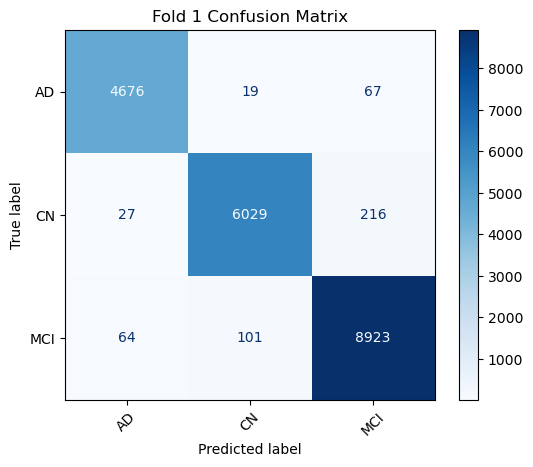

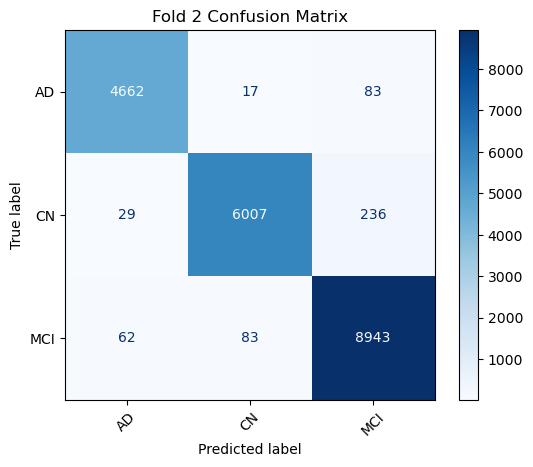

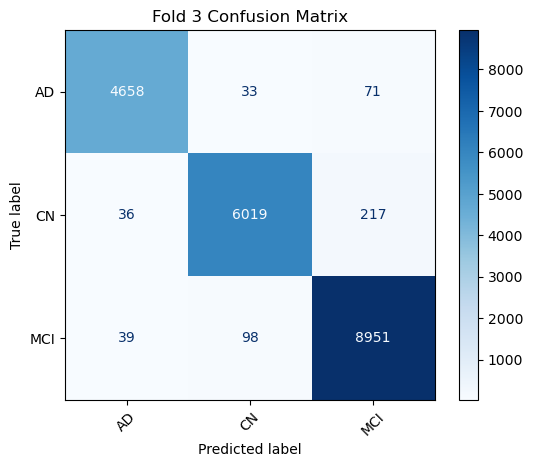

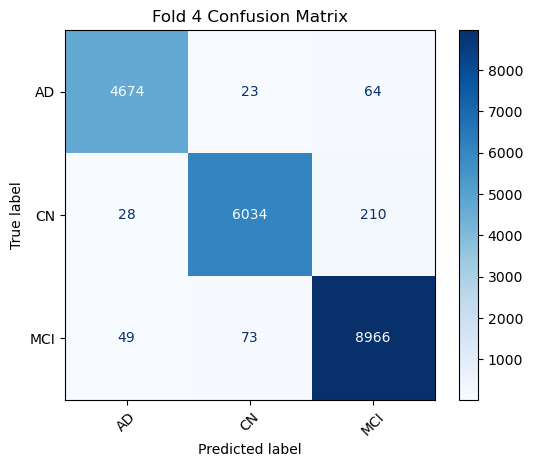

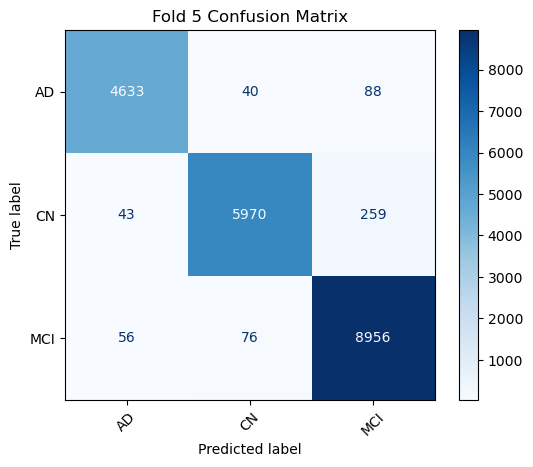


Cross-Validation Results:
   Fold  Train Accuracy  Test Accuracy  Precision    Recall        F1
0     1             1.0       0.975450   0.975515  0.975450  0.975435
1     2             1.0       0.974655   0.974810  0.974655  0.974639
2     3             1.0       0.975450   0.975532  0.975450  0.975429
3     4             1.0       0.977784   0.977890  0.977784  0.977767
4     5             1.0       0.972069   0.972261  0.972069  0.972035

Average Performance Across Folds:
Fold              3.000000
Train Accuracy    1.000000
Test Accuracy     0.975082
Precision         0.975202
Recall            0.975082
F1                0.975061
dtype: float64


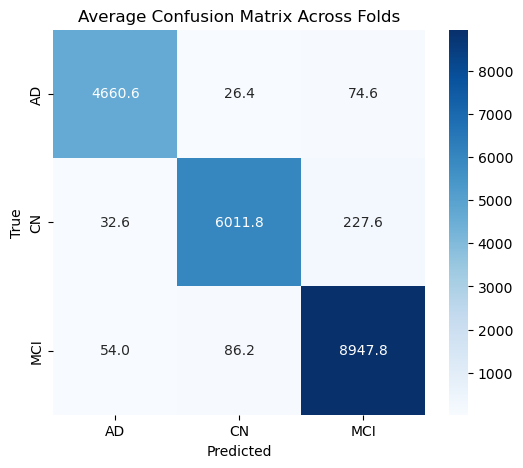

In [5]:
# for fusion using random forest
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay

# =======================
# Step 1: Load Dataset
# =======================
csv_path = r"ADNI_merged_features_resedual_network_metadata.csv"
df = pd.read_csv(csv_path)

# Separate features and labels
y = df["class"]

# Drop non-numeric columns (like Image_Filename, class)
X = df.drop(columns=["filename", "class"])

# Ensure only numeric data is used
X = X.select_dtypes(include=[np.number])

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# =======================
# Step 2: Stratified K-Fold CV
# =======================
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

fold = 1
all_metrics = []
conf_matrices = []

for train_index, test_index in kf.split(X_scaled, y):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Model (swap with XGBoost or SVM if needed)
    model = RandomForestClassifier(n_estimators=200, random_state=42)
    model.fit(X_train, y_train)

    # Predictions
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    # Metrics
    metrics = {
        "Fold": fold,
        "Train Accuracy": accuracy_score(y_train, y_pred_train),
        "Test Accuracy": accuracy_score(y_test, y_pred_test),
        "Precision": precision_score(y_test, y_pred_test, average="weighted"),
        "Recall": recall_score(y_test, y_pred_test, average="weighted"),
        "F1": f1_score(y_test, y_pred_test, average="weighted")
    }
    all_metrics.append(metrics)

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred_test, labels=np.unique(y))
    conf_matrices.append(cm)

    # Plot per-fold confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
    disp.plot(cmap="Blues", xticks_rotation=45)
    plt.title(f"Fold {fold} Confusion Matrix")
    plt.show()

    fold += 1

# =======================
# Step 3: Average Results
# =======================
results_df = pd.DataFrame(all_metrics)
print("\nCross-Validation Results:")
print(results_df)

print("\nAverage Performance Across Folds:")
print(results_df.mean(numeric_only=True))

# =======================
# Step 4: Average Confusion Matrix
# =======================
avg_cm = np.mean(conf_matrices, axis=0)

plt.figure(figsize=(6, 5))
sns.heatmap(avg_cm, annot=True, fmt=".1f", cmap="Blues",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.title("Average Confusion Matrix Across Folds")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


C:\Users\Nimra Nadeem\AppData\Local\Temp\ipykernel_23788\1422733396.py:12: DtypeWarning: Columns (973) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)



===== Fold 1 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [14:38:41] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 0.9998384812265487
Test Accuracy: 0.9891660868700924

Test Classification Report:
              precision    recall  f1-score   support

          AD       0.99      0.99      0.99      4762
          CN       0.99      0.98      0.99      6272
         MCI       0.99      0.99      0.99      9088

    accuracy                           0.99     20122
   macro avg       0.99      0.99      0.99     20122
weighted avg       0.99      0.99      0.99     20122



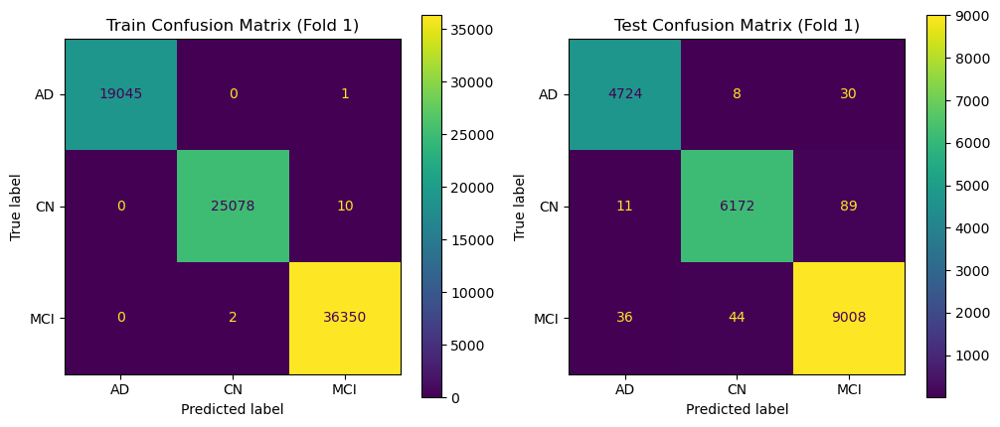


===== Fold 2 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [14:42:44] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 0.9999006038317223
Test Accuracy: 0.9881224530364775

Test Classification Report:
              precision    recall  f1-score   support

          AD       0.99      0.99      0.99      4762
          CN       0.99      0.98      0.99      6272
         MCI       0.98      0.99      0.99      9088

    accuracy                           0.99     20122
   macro avg       0.99      0.99      0.99     20122
weighted avg       0.99      0.99      0.99     20122



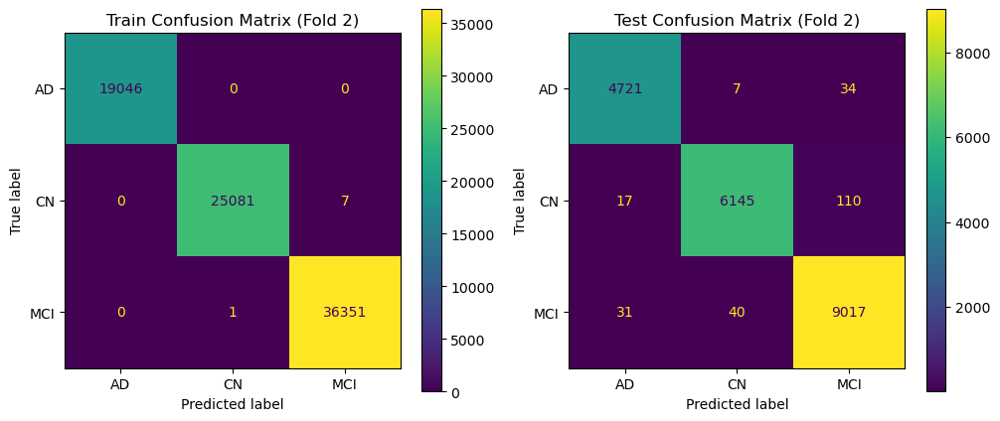


===== Fold 3 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [14:46:45] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 0.9998136321844793
Test Accuracy: 0.9897127522115098

Test Classification Report:
              precision    recall  f1-score   support

          AD       0.99      0.99      0.99      4762
          CN       0.99      0.98      0.99      6272
         MCI       0.99      0.99      0.99      9088

    accuracy                           0.99     20122
   macro avg       0.99      0.99      0.99     20122
weighted avg       0.99      0.99      0.99     20122



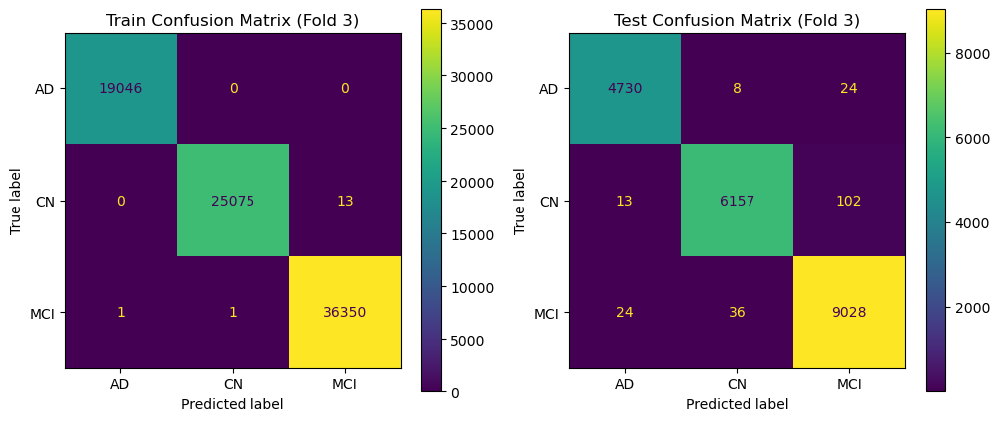


===== Fold 4 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [14:50:31] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 0.9999130294333246
Test Accuracy: 0.9905571293673276

Test Classification Report:
              precision    recall  f1-score   support

          AD       0.99      0.99      0.99      4761
          CN       0.99      0.98      0.99      6272
         MCI       0.99      0.99      0.99      9088

    accuracy                           0.99     20121
   macro avg       0.99      0.99      0.99     20121
weighted avg       0.99      0.99      0.99     20121



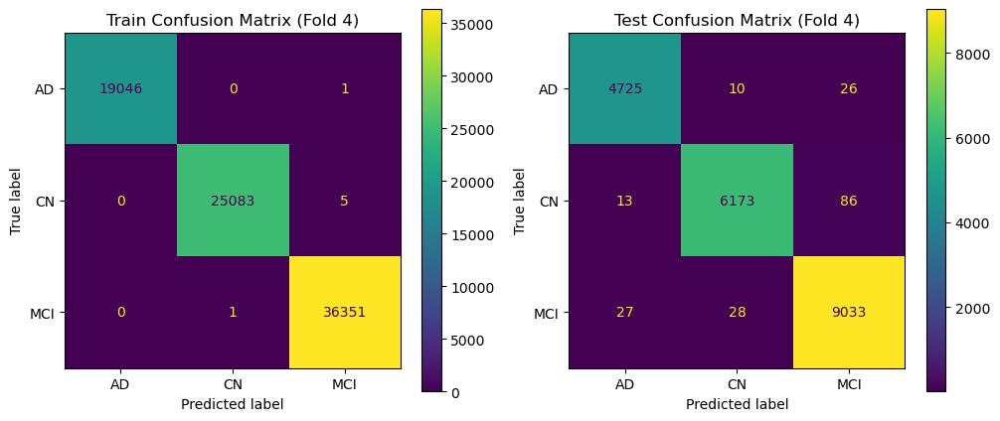


===== Fold 5 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [14:54:50] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 0.9998881806999889
Test Accuracy: 0.9872272749863327

Test Classification Report:
              precision    recall  f1-score   support

          AD       0.99      0.99      0.99      4761
          CN       0.99      0.98      0.98      6272
         MCI       0.98      0.99      0.99      9088

    accuracy                           0.99     20121
   macro avg       0.99      0.99      0.99     20121
weighted avg       0.99      0.99      0.99     20121



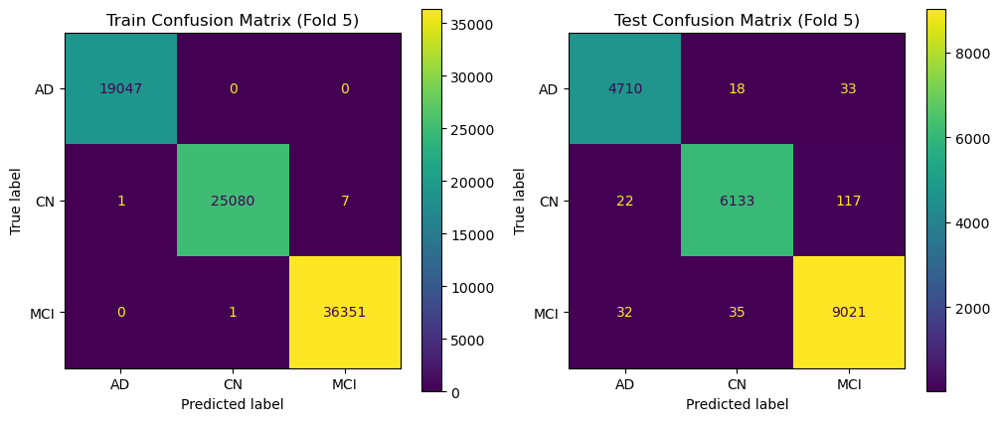


===== Cross-Validation Results =====
Average Train Accuracy: 0.9998707854752127
Average Test Accuracy: 0.988957139294348


In [6]:
# for fusion using XGBoost
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import xgboost as xgb

# ========== Step 1: Load Data ==========
csv_path = r"ADNI_merged_features_resedual_network_metadata.csv"
df = pd.read_csv(csv_path)

# Target label
y = df["Group"]

# Drop unnecessary columns (ID, labels, etc.)
drop_cols = ["filename", "class", "Group","Sex", "Visit","Modality","Description","Type","Acq Date","Format","Downloaded","PHASE","PTID","RID","VISCODE","VISCODE2","VISDATE","ID","SITEID","USERDATE","USERDATE2","update_stamp"]
X = df.drop(columns=drop_cols)

# Keep only numeric features
X = X.select_dtypes(include=[np.number])

# Encode labels (AD, CN, MCI → 0,1,2)
le = LabelEncoder()
y = le.fit_transform(y)

# Standardize numeric features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== Step 2: Cross Validation Setup ==========
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Store metrics
train_acc, test_acc = [], []
fold = 1

# ========== Step 3: Cross Validation Loop ==========
for train_idx, test_idx in cv.split(X_scaled, y):
    print(f"\n===== Fold {fold} =====")
    
    # Split
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    # Tuned XGBoost model
    model = xgb.XGBClassifier(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        reg_lambda=1,
        random_state=42,
        use_label_encoder=False,
        eval_metric="mlogloss"
    )
    
    # Train
    model.fit(X_train, y_train)
    
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Accuracies
    train_acc.append(np.mean(y_train_pred == y_train))
    test_acc.append(np.mean(y_test_pred == y_test))
    print("Train Accuracy:", train_acc[-1])
    print("Test Accuracy:", test_acc[-1])
    
    # Classification report for test
    print("\nTest Classification Report:")
    print(classification_report(y_test, y_test_pred, target_names=le.classes_))
    
    # Confusion Matrices (Train + Test side by side)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    ConfusionMatrixDisplay(confusion_matrix(y_train, y_train_pred), display_labels=le.classes_).plot(ax=axes[0], values_format='d')
    axes[0].set_title(f"Train Confusion Matrix (Fold {fold})")
    
    ConfusionMatrixDisplay(confusion_matrix(y_test, y_test_pred), display_labels=le.classes_).plot(ax=axes[1], values_format='d')
    axes[1].set_title(f"Test Confusion Matrix (Fold {fold})")
    
    plt.show()
    
    fold += 1

# ========== Step 4: Overall Performance ==========
print("\n===== Cross-Validation Results =====")
print("Average Train Accuracy:", np.mean(train_acc))
print("Average Test Accuracy:", np.mean(test_acc))


C:\Users\Nimra Nadeem\AppData\Local\Temp\ipykernel_23788\1987574893.py:12: DtypeWarning: Columns (973) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)



===== Fold 1 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:04:17] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 0.9998384812265487
Test Accuracy: 0.9891660868700924


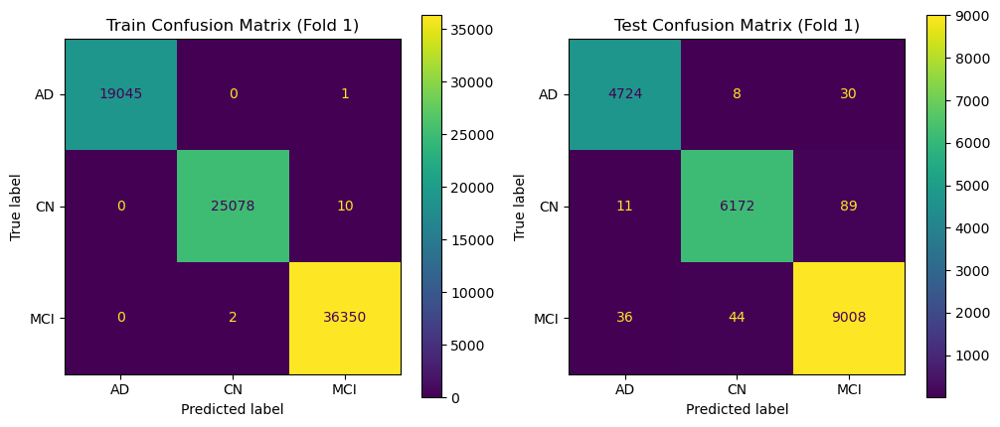


===== Fold 2 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:07:50] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 0.9999006038317223
Test Accuracy: 0.9881224530364775


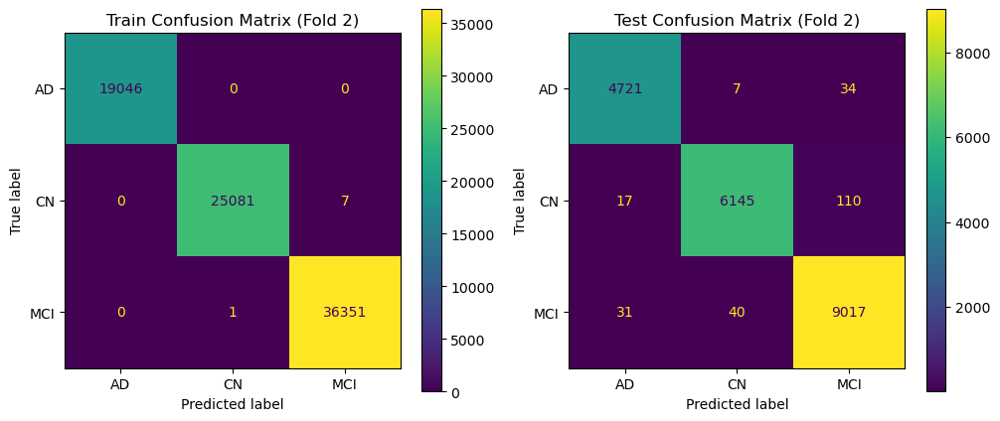


===== Fold 3 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:11:09] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 0.9998136321844793
Test Accuracy: 0.9897127522115098


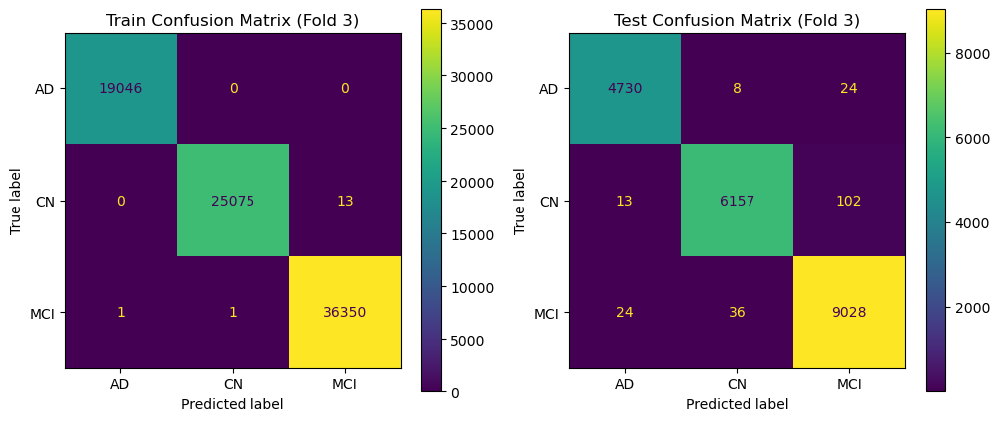


===== Fold 4 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:14:21] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 0.9999130294333246
Test Accuracy: 0.9905571293673276


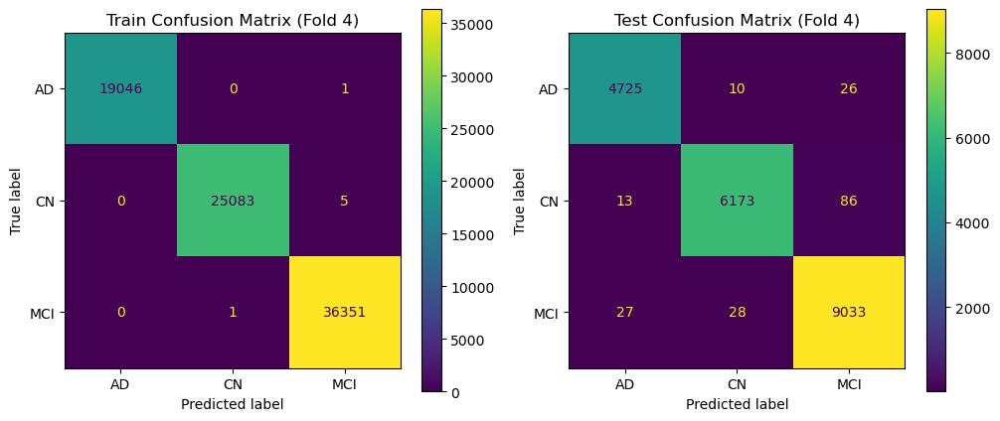


===== Fold 5 =====


d:\Anaconda\envs\torch_gpu\lib\site-packages\xgboost\training.py:183: UserWarning: [15:17:41] WARNING: C:\b\abs_d97hy_84m6\croot\xgboost-split_1749630932152\work\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Train Accuracy: 0.9998881806999889
Test Accuracy: 0.9872272749863327


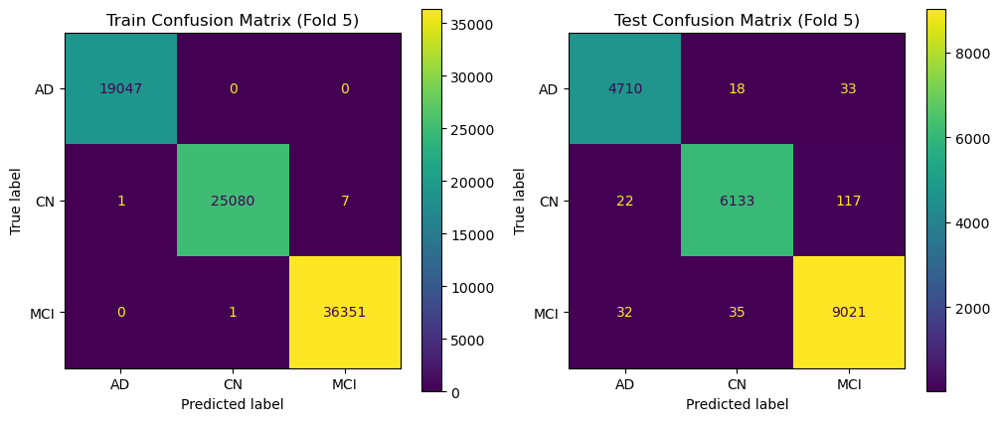


===== Aggregated Results (All Folds) =====


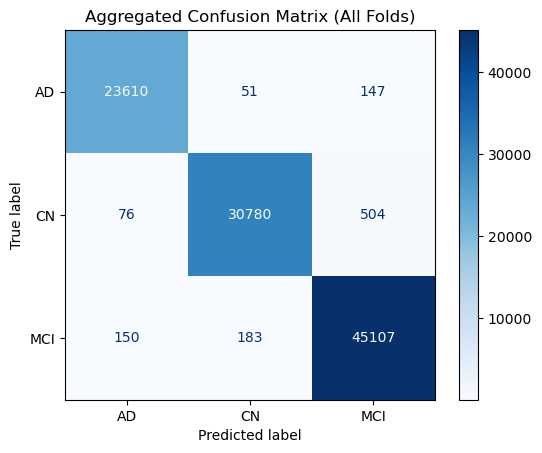


Aggregated Classification Report:
              precision    recall  f1-score   support

          AD       0.99      0.99      0.99     23808
          CN       0.99      0.98      0.99     31360
         MCI       0.99      0.99      0.99     45440

    accuracy                           0.99    100608
   macro avg       0.99      0.99      0.99    100608
weighted avg       0.99      0.99      0.99    100608



ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

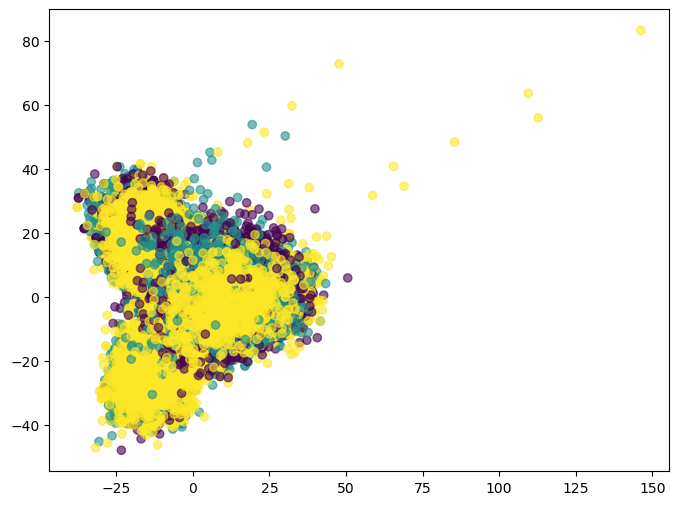

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.decomposition import PCA
import xgboost as xgb

# ========== Step 1: Load Data ==========
csv_path = r"ADNI_merged_features_resedual_network_metadata.csv"
df = pd.read_csv(csv_path)

# Target label
y = df["Group"]

# Drop unnecessary columns (ID, labels, etc.)
drop_cols = ["filename", "class", "Group","Sex", "Visit","Modality","Description","Type","Acq Date","Format","Downloaded","PHASE","PTID","RID","VISCODE","VISCODE2","VISDATE","ID","SITEID","USERDATE","USERDATE2","update_stamp"]
X = df.drop(columns=drop_cols)

# Keep only numeric features
X = X.select_dtypes(include=[np.number])

# Encode labels (AD, CN, MCI → 0,1,2)
le = LabelEncoder()
y = le.fit_transform(y)

# Standardize numeric features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ========== Step 2: Cross Validation Setup ==========
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Store metrics
train_acc, test_acc = [], []
all_y_true, all_y_pred = [], []
fold = 1

# ========== Step 3: Cross Validation Loop ==========
for train_idx, test_idx in cv.split(X_scaled, y):
    print(f"\n===== Fold {fold} =====")
    
    # Split
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    # Tuned XGBoost model
    model = xgb.XGBClassifier(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        reg_lambda=1,
        random_state=42,
        use_label_encoder=False,
        eval_metric="mlogloss"
    )
    
    # Train
    model.fit(X_train, y_train)
    
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Collect for aggregation
    all_y_true.extend(y_test)
    all_y_pred.extend(y_test_pred)
    
    # Accuracies
    train_acc.append(np.mean(y_train_pred == y_train))
    test_acc.append(np.mean(y_test_pred == y_test))
    print("Train Accuracy:", train_acc[-1])
    print("Test Accuracy:", test_acc[-1])
    
    # Confusion Matrices (Train + Test per fold)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    ConfusionMatrixDisplay(confusion_matrix(y_train, y_train_pred), display_labels=le.classes_).plot(ax=axes[0], values_format='d')
    axes[0].set_title(f"Train Confusion Matrix (Fold {fold})")
    
    ConfusionMatrixDisplay(confusion_matrix(y_test, y_test_pred), display_labels=le.classes_).plot(ax=axes[1], values_format='d')
    axes[1].set_title(f"Test Confusion Matrix (Fold {fold})")
    
    plt.show()
    
    fold += 1

# ========== Step 4: Aggregated Confusion Matrix ==========
print("\n===== Aggregated Results (All Folds) =====")
cm = confusion_matrix(all_y_true, all_y_pred)
disp = ConfusionMatrixDisplay(cm, display_labels=le.classes_)
disp.plot(cmap="Blues", values_format="d")
plt.title("Aggregated Confusion Matrix (All Folds)")
plt.show()

# Classification report aggregated
print("\nAggregated Classification Report:")
print(classification_report(all_y_true, all_y_pred, target_names=le.classes_))

# ========== Step 5: PCA Visualization ==========
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=all_y_pred, cmap="viridis", alpha=0.6)
plt.legend(handles=scatter.legend_elements()[0], labels=le.classes_, title="Predicted")
plt.title("PCA Projection of Samples (Colored by Predicted Class)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap="viridis", alpha=0.6)
plt.legend(handles=scatter.legend_elements()[0], labels=le.classes_, title="True")
plt.title("PCA Projection of Samples (Colored by True Class)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()


Features dataset: (157312, 923)
Metadata dataset: (1464, 51)
✅ Merged dataset shape: (100608, 974)
Feature matrix shape: (100608, 953)
Labels distribution:
 class
MCI    45440
CN     31360
AD     23808
Name: count, dtype: int64

=== Classification Report ===
              precision    recall  f1-score   support

          AD       1.00      0.99      0.99      4762
          CN       1.00      0.99      0.99      6272
         MCI       0.99      1.00      1.00      9088

    accuracy                           1.00     20122
   macro avg       1.00      0.99      0.99     20122
weighted avg       1.00      1.00      1.00     20122



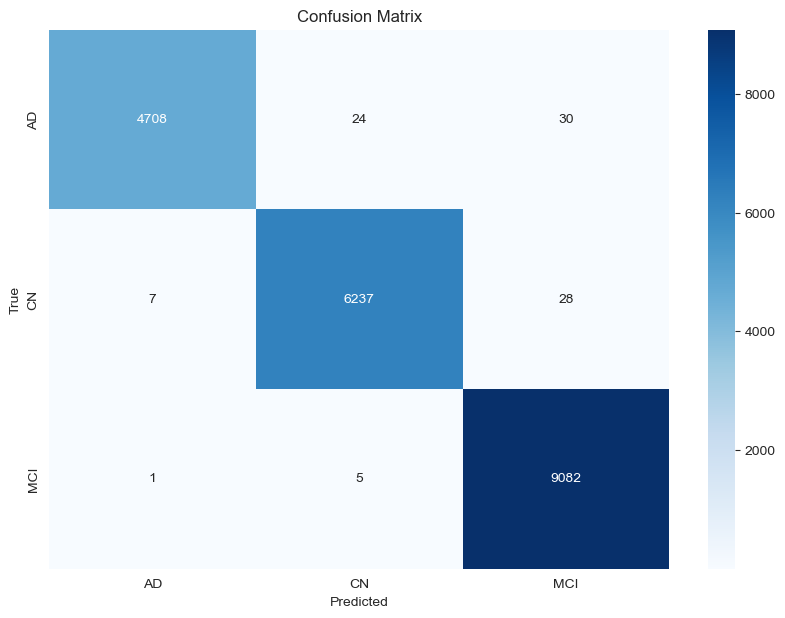

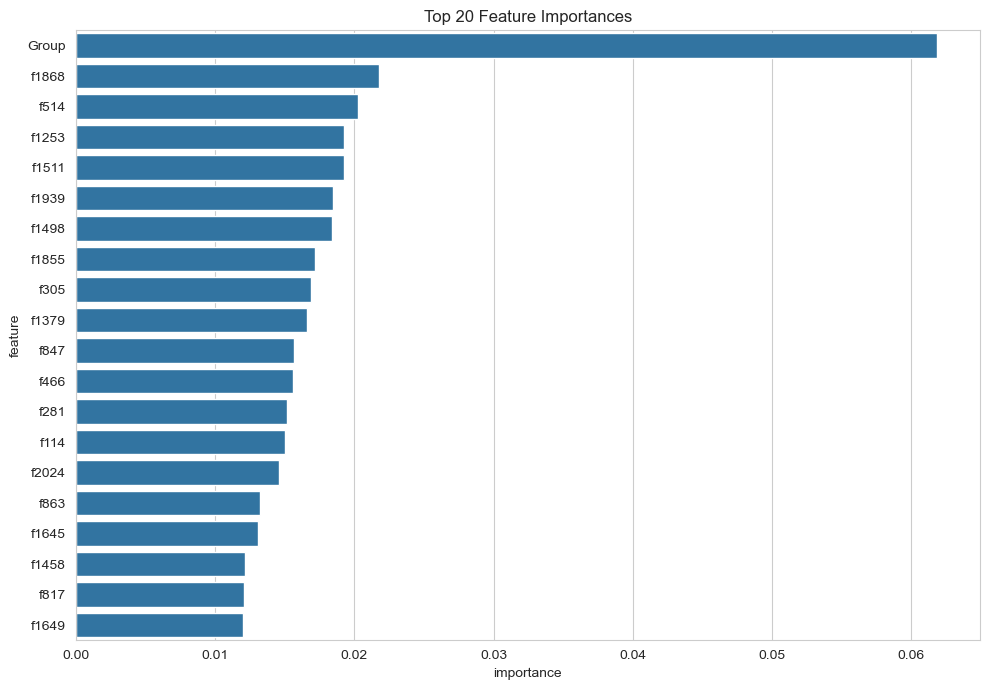

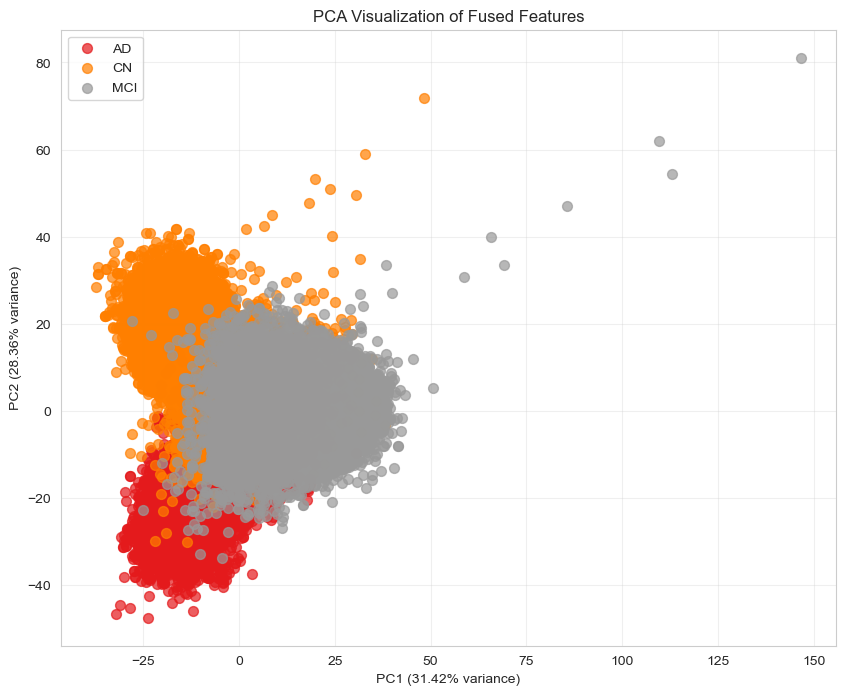

In [17]:
# =========================
# ADNI Image Classification and Analysis
# Features + Metadata Fusion (Fixed)
# =========================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.decomposition import PCA

# =========================
# CONFIGURATION
# =========================
features_path = r"resedualnetwork50_selected_features_cumulative.csv"
metadata_path = r"D:\ADNI1_Merged_MRI_Metadata.csv"

# =========================
# Step 1: Load Datasets
# =========================
features_df = pd.read_csv(features_path, low_memory=False)
metadata_df = pd.read_csv(metadata_path)

print("Features dataset:", features_df.shape)
print("Metadata dataset:", metadata_df.shape)

# =========================
# Step 2: Prepare merge key
# =========================
# Extract ID pattern like 'I12345' from filename
features_df["Image Data ID"] = features_df["filename"].str.extract(r"(I\d+)")

# =========================
# Step 3: Merge datasets
# =========================
merged_df = pd.merge(features_df, metadata_df, on="Image Data ID", how="inner")
print("✅ Merged dataset shape:", merged_df.shape)

# =========================
# Step 4: Prepare Features
# =========================
# Drop irrelevant identifiers
drop_cols = [
    "filename", "Sex", "Visit", "Modality", "Description", "Type", "Acq Date",
    "Format", "Downloaded", "PHASE", "PTID", "RID", "VISCODE", "VISCODE2",
    "VISDATE", "ID", "SITEID", "USERDATE", "USERDATE2", "update_stamp"
]
for col in drop_cols:
    if col in merged_df.columns:
        merged_df = merged_df.drop(columns=col)

# Determine target label
y = merged_df["class"] if "class" in merged_df.columns else merged_df["Group"]
X = merged_df.drop(columns=[y.name])

print("Feature matrix shape:", X.shape)
print("Labels distribution:\n", y.value_counts())

# Encode categorical columns
for col in X.select_dtypes(include=["object"]).columns:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col].astype(str))

# =========================
# Step 5: Train/Test Split
# =========================
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# =========================
# Step 6: Handle Missing Values
# =========================
imputer = SimpleImputer(strategy="mean")
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# =========================
# Step 7: Scale Features
# =========================
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_imputed)
X_test_scaled = scaler.transform(X_test_imputed)

# =========================
# Step 8: Train Classifier
# =========================
clf = RandomForestClassifier(
    n_estimators=200, random_state=42, class_weight="balanced"
)
clf.fit(X_train_scaled, y_train)

# =========================
# Step 9: Evaluate Model
# =========================
y_pred = clf.predict(X_test_scaled)

print("\n=== Classification Report ===")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=clf.classes_, yticklabels=clf.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# =========================
# Step 10: Feature Importance
# =========================
feature_importances = pd.DataFrame({
    "feature": X.columns,
    "importance": clf.feature_importances_
}).sort_values("importance", ascending=False)

sns.barplot(x="importance", y="feature", data=feature_importances.head(20))
plt.title("Top 20 Feature Importances")
plt.tight_layout()
plt.show()

# =========================
# Step 11: PCA Visualization
# =========================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train_scaled)

unique_classes = np.unique(y_train)
colors = plt.cm.Set1(np.linspace(0, 1, len(unique_classes)))

plt.figure(figsize=(10, 8))
for i, class_label in enumerate(unique_classes):
    mask = y_train == class_label
    plt.scatter(X_pca[mask, 0], X_pca[mask, 1], c=[colors[i]], label=class_label, alpha=0.7, s=50)

plt.title("PCA Visualization of Fused Features")
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


Features dataset: (157312, 923)
Metadata dataset: (1464, 51)
✅ Merged dataset shape: (100608, 974)
Feature matrix shape: (100608, 952)
Labels distribution:
 class
MCI    45440
CN     31360
AD     23808
Name: count, dtype: int64

=== Classification Report ===
              precision    recall  f1-score   support

          AD       1.00      0.99      0.99      4762
          CN       0.99      0.99      0.99      6272
         MCI       0.99      1.00      1.00      9088

    accuracy                           0.99     20122
   macro avg       0.99      0.99      0.99     20122
weighted avg       0.99      0.99      0.99     20122



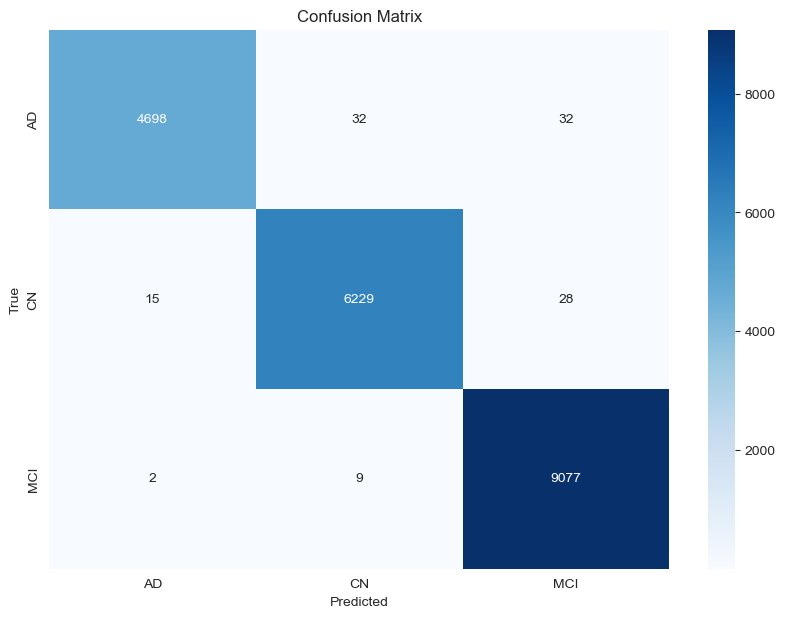

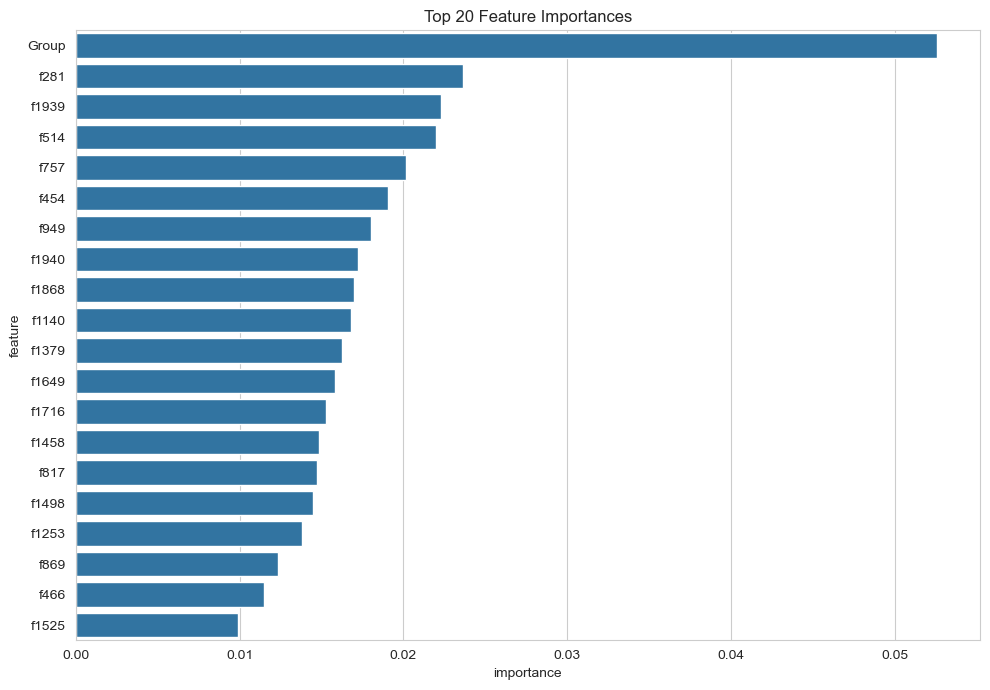

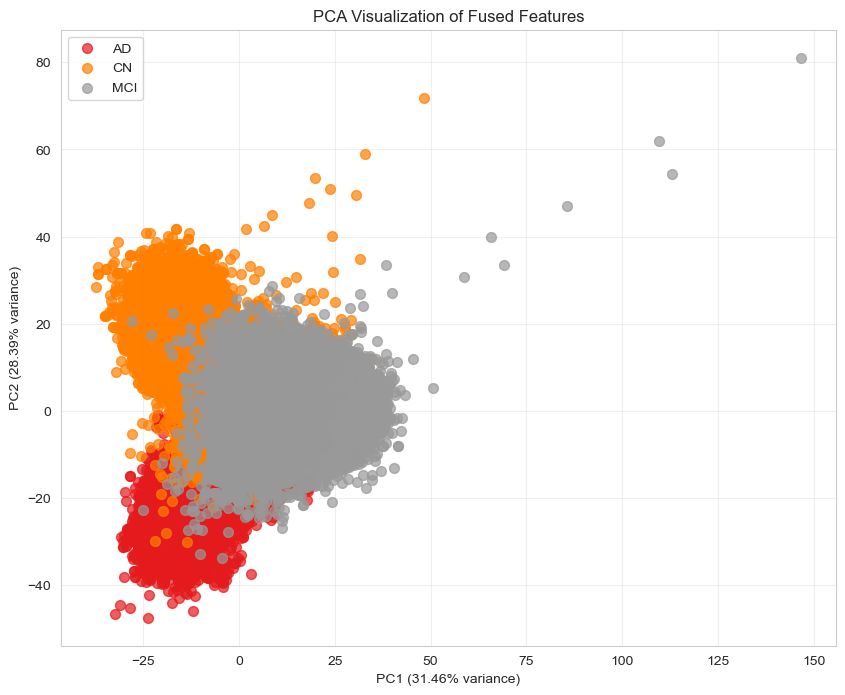

In [18]:
# =========================
# ADNI Image Classification and Analysis
# Features + Metadata Fusion (Fixed)
# =========================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.decomposition import PCA

# =========================
# CONFIGURATION
# =========================
features_path = r"resedualnetwork50_selected_features_cumulative.csv"
metadata_path = r"D:\ADNI1_Merged_MRI_Metadata.csv"

# =========================
# Step 1: Load Datasets
# =========================
features_df = pd.read_csv(features_path, low_memory=False)
metadata_df = pd.read_csv(metadata_path)

print("Features dataset:", features_df.shape)
print("Metadata dataset:", metadata_df.shape)

# =========================
# Step 2: Prepare merge key
# =========================
# Extract ID pattern like 'I12345' from filename
features_df["Image Data ID"] = features_df["filename"].str.extract(r"(I\d+)")

# =========================
# Step 3: Merge datasets
# =========================
merged_df = pd.merge(features_df, metadata_df, on="Image Data ID", how="inner")
print("✅ Merged dataset shape:", merged_df.shape)

# =========================
# Step 4: Prepare Features
# =========================
# Drop irrelevant identifiers
drop_cols = [
    "filename", "Sex", "Visit", "Modality", "Description", "Type", "Acq Date",
    "Format", "Downloaded", "PHASE", "PTID", "RID", "VISCODE", "VISCODE2",
    "VISDATE", "ID", "SITEID", "USERDATE", "USERDATE2", "update_stamp", "Subject"
]
for col in drop_cols:
    if col in merged_df.columns:
        merged_df = merged_df.drop(columns=col)

# Determine target label
y = merged_df["class"] if "class" in merged_df.columns else merged_df["Group"]
X = merged_df.drop(columns=[y.name])

print("Feature matrix shape:", X.shape)
print("Labels distribution:\n", y.value_counts())

# Encode categorical columns
for col in X.select_dtypes(include=["object"]).columns:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col].astype(str))

# =========================
# Step 5: Train/Test Split
# =========================
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# =========================
# Step 6: Handle Missing Values
# =========================
imputer = SimpleImputer(strategy="mean")
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# =========================
# Step 7: Scale Features
# =========================
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_imputed)
X_test_scaled = scaler.transform(X_test_imputed)

# =========================
# Step 8: Train Classifier
# =========================
clf = RandomForestClassifier(
    n_estimators=200, random_state=42, class_weight="balanced"
)
clf.fit(X_train_scaled, y_train)

# =========================
# Step 9: Evaluate Model
# =========================
y_pred = clf.predict(X_test_scaled)

print("\n=== Classification Report ===")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=clf.classes_, yticklabels=clf.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# =========================
# Step 10: Feature Importance
# =========================
feature_importances = pd.DataFrame({
    "feature": X.columns,
    "importance": clf.feature_importances_
}).sort_values("importance", ascending=False)

sns.barplot(x="importance", y="feature", data=feature_importances.head(20))
plt.title("Top 20 Feature Importances")
plt.tight_layout()
plt.show()

# =========================
# Step 11: PCA Visualization
# =========================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train_scaled)

unique_classes = np.unique(y_train)
colors = plt.cm.Set1(np.linspace(0, 1, len(unique_classes)))

plt.figure(figsize=(10, 8))
for i, class_label in enumerate(unique_classes):
    mask = y_train == class_label
    plt.scatter(X_pca[mask, 0], X_pca[mask, 1], c=[colors[i]], label=class_label, alpha=0.7, s=50)

plt.title("PCA Visualization of Fused Features")
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


In [3]:
import pandas as pd
import numpy as np
import torch
import clip


In [4]:
# using clip model
METADATA_PATH = "D:\\ADNI1_Complete 1Yr 1.5T\\ADNI1_Merged_MRI_Metadata.csv"

df = pd.read_csv(METADATA_PATH)
print(df.shape)


(1464, 51)


In [6]:
# STEP 2: Identify symptom columns
symptom_cols = [col for col in df.columns if col.startswith("AX")]

print("Number of symptom columns:", len(symptom_cols))
print(symptom_cols)


Number of symptom columns: 28
['AXNAUSEA', 'AXVOMIT', 'AXDIARRH', 'AXCONSTP', 'AXABDOMN', 'AXSWEATN', 'AXDIZZY', 'AXENERGY', 'AXDROWSY', 'AXVISION', 'AXHDACHE', 'AXDRYMTH', 'AXBREATH', 'AXCOUGH', 'AXPALPIT', 'AXCHEST', 'AXURNDIS', 'AXURNFRQ', 'AXANKLE', 'AXMUSCLE', 'AXRASH', 'AXINSOMN', 'AXDPMOOD', 'AXCRYING', 'AXELMOOD', 'AXWANDER', 'AXFALL', 'AXOTHER']


In [8]:
# STEP 3: Select required columns

selected_cols = [
    "Image Data ID",
    "Age",
    "Sex",
    "Visit",
    "Subject", "Group"  # label (NOT used in text)
] + symptom_cols

df_demo = df[selected_cols].copy()

# Drop rows with missing essential demographics
df_demo = df_demo.dropna(subset=["Age", "Sex"])

print(df_demo.shape)
df_demo.head()


(1464, 34)


,Image Data ID,Age,Sex,Visit,Subject,Group,AXNAUSEA,AXVOMIT,AXDIARRH,AXCONSTP,...,AXANKLE,AXMUSCLE,AXRASH,AXINSOMN,AXDPMOOD,AXCRYING,AXELMOOD,AXWANDER,AXFALL,AXOTHER
0,I112538,70,M,m12,941_S_1311,MCI,1,1,1,1,...,1,1,1,2,1,1,1,1,1,1.0
1,I97341,70,M,m06,941_S_1311,MCI,1,1,1,1,...,1,1,1,1,1,1,1,1,1,2.0
2,I75150,78,M,m06,941_S_1202,CN,1,1,1,1,...,1,1,1,1,2,1,1,1,2,1.0
3,I105437,79,M,m12,941_S_1202,CN,1,1,1,1,...,1,1,1,1,1,1,1,1,2,1.0
4,I108336,84,F,m12,941_S_1197,CN,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1.0


In [9]:
# STEP 4: Symptom → Text mapping

symptom_map = {
    "AXNAUSEA": "nausea",
    "AXVOMIT": "vomiting",
    "AXDIARRH": "diarrhea",
    "AXCONSTP": "constipation",
    "AXABDOMN": "abdominal discomfort",
    "AXSWEATN": "excessive sweating",
    "AXDIZZY": "dizziness",
    "AXENERGY": "low energy",
    "AXDROWSY": "drowsiness",
    "AXVISION": "vision problems",
    "AXHDACHE": "headache",
    "AXDRYMTH": "dry mouth",
    "AXBREATH": "shortness of breath",
    "AXCOUGH": "cough",
    "AXPALPIT": "palpitations",
    "AXCHEST": "chest discomfort",
    "AXURNDIS": "urinary discomfort",
    "AXURNFRQ": "frequent urination",
    "AXANKLE": "ankle swelling",
    "AXMUSCLE": "muscle pain",
    "AXRASH": "skin rash",
    "AXINSOMN": "insomnia",
    "AXDPMOOD": "depressed mood",
    "AXCRYING": "frequent crying",
    "AXELMOOD": "emotional lability",
    "AXWANDER": "wandering behavior",
    "AXFALL": "history of falls",
    "AXOTHER": "other reported symptoms"
}


In [10]:
# STEP 5: Row → Clinical text

def row_to_text(row):
    sex = "male" if row["Sex"] == "M" else "female"
    visit = row["Visit"]

    symptoms = []
    for col, desc in symptom_map.items():
        if row[col] == 1:
            symptoms.append(desc)

    if symptoms:
        symptom_text = "Reported symptoms include " + ", ".join(symptoms) + "."
    else:
        symptom_text = "No significant reported symptoms."

    return (
        f"A {int(row['Age'])}-year-old {sex} subject "
        f"undergoing MRI at visit {visit}. "
        f"{symptom_text}"
    )


In [11]:
df_demo["text_prompt"] = df_demo.apply(row_to_text, axis=1)

df_demo[["Image Data ID", "text_prompt"]].head()


,Image Data ID,text_prompt
0,I112538,A 70-year-old male subject undergoing MRI at v...
1,I97341,A 70-year-old male subject undergoing MRI at v...
2,I75150,A 78-year-old male subject undergoing MRI at v...
3,I105437,A 79-year-old male subject undergoing MRI at v...
4,I108336,A 84-year-old female subject undergoing MRI at...


In [12]:
# Display all text prompts for all rows
pd.set_option('display.max_colwidth', None)  # Show full text in each cell
print(df_demo[["Image Data ID", "text_prompt"]])

     Image Data ID  \
0          I112538   
1           I97341   
2           I75150   
3          I105437   
4          I108336   
...            ...   
1459        I79122   
1460       I118695   
1461       I118692   
1462        I64025   
1463        I40966   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     text_prompt  
0                                                 A 70-year-old male subject undergoing MRI at visit m12. Reported symptoms include nausea, vomiting, diarrhea, constipation, abdominal discomfort, excessive sweating, dizz

In [13]:
import torch
import clip

device = "cuda" if torch.cuda.is_available() else "cpu"
model, _ = clip.load("ViT-B/32", device=device)
model.eval()


100%|███████████████████████████████████████| 338M/338M [01:41<00:00, 3.50MiB/s]


CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32), bias=False)
    (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): Sequential(
        (0): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): QuickGELU()
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
        (1): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          

In [15]:
# Show all text_prompt values without truncation
pd.set_option('display.max_colwidth', None)
display(df_demo[["Image Data ID", "text_prompt"]])

,Image Data ID,text_prompt
0,I112538,"A 70-year-old male subject undergoing MRI at visit m12. Reported symptoms include nausea, vomiting, diarrhea, constipation, abdominal discomfort, excessive sweating, dizziness, drowsiness, vision problems, headache, dry mouth, shortness of breath, cough, palpitations, chest discomfort, urinary discomfort, ankle swelling, muscle pain, skin rash, depressed mood, frequent crying, emotional lability, wandering behavior, history of falls, other reported symptoms."
1,I97341,"A 70-year-old male subject undergoing MRI at visit m06. Reported symptoms include nausea, vomiting, diarrhea, constipation, abdominal discomfort, excessive sweating, dizziness, low energy, drowsiness, vision problems, headache, dry mouth, shortness of breath, cough, palpitations, chest discomfort, ankle swelling, muscle pain, skin rash, insomnia, depressed mood, frequent crying, emotional lability, wandering behavior, history of falls."
2,I75150,"A 78-year-old male subject undergoing MRI at visit m06. Reported symptoms include nausea, vomiting, diarrhea, constipation, abdominal discomfort, excessive sweating, low energy, vision problems, headache, dry mouth, shortness of breath, cough, palpitations, chest discomfort, urinary discomfort, frequent urination, ankle swelling, muscle pain, skin rash, insomnia, frequent crying, emotional lability, wandering behavior, other reported symptoms."
3,I105437,"A 79-year-old male subject undergoing MRI at visit m12. Reported symptoms include nausea, vomiting, diarrhea, constipation, abdominal discomfort, excessive sweating, low energy, drowsiness, vision problems, headache, dry mouth, shortness of breath, cough, palpitations, chest discomfort, urinary discomfort, frequent urination, ankle swelling, muscle pain, skin rash, insomnia, depressed mood, frequent crying, emotional lability, wandering behavior, other reported symptoms."
4,I108336,"A 84-year-old female subject undergoing MRI at visit m12. Reported symptoms include nausea, vomiting, diarrhea, constipation, abdominal discomfort, excessive sweating, dizziness, low energy, drowsiness, vision problems, headache, dry mouth, shortness of breath, cough, palpitations, chest discomfort, urinary discomfort, frequent urination, ankle swelling, muscle pain, skin rash, insomnia, depressed mood, frequent crying, emotional lability, wandering behavior, history of falls, other reported symptoms."
...,...,...
1459,I79122,"A 77-year-old female subject undergoing MRI at visit m06. Reported symptoms include nausea, vomiting, diarrhea, constipation, abdominal discomfort, excessive sweating, dizziness, low energy, drowsiness, vision problems, headache, dry mouth, shortness of breath, cough, palpitations, chest discomfort, urinary discomfort, frequent urination, ankle swelling, muscle pain, skin rash, insomnia, depressed mood, frequent crying, emotional lability, wandering behavior, history of falls, other reported symptoms."
1460,I118695,"A 77-year-old female subject undergoing MRI at visit m06. Reported symptoms include nausea, vomiting, diarrhea, constipation, abdominal discomfort, excessive sweating, dizziness, low energy, drowsiness, vision problems, headache, dry mouth, shortness of breath, cough, palpitations, chest discomfort, urinary discomfort, frequent urination, ankle swelling, muscle pain, skin rash, insomnia, depressed mood, frequent crying, emotional lability, wandering behavior, history of falls, other reported symptoms."
1461,I118692,"A 85-year-old male subject undergoing MRI at visit m06. Reported symptoms include nausea, vomiting, diarrhea, abdominal discomfort, excessive sweating, dizziness, low energy, drowsiness, dry mouth, shortness of breath, cough, palpitations, chest discomfort, urinary discomfort, frequent urination, ankle swelling, muscle pain, skin rash, insomnia, depressed mood, frequent crying, emotional lability, wandering behavior."
1462,I64025,"A 86-year-old male subject undergoing MRI at visit m12. Reported symptoms inc

In [19]:
# If running in a script or some environments, use print instead of display
pd.set_option('display.max_colwidth', None)
print(df_demo[["Image Data ID", "text_prompt"]].to_string(index=False))

Image Data ID                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                text_prompt
      I112538                                             A 70-year-old male subject undergoing MRI at visit m12. Reported symptoms include nausea, vomiting, diarrhea, constipation, abdominal discomfort, excessive sweating, dizziness, drowsiness, vision problems, headache, dry mouth, shortness of breath, cough, palpitations, chest discomfort, urinary discomfort, ankle swelling, muscle pain, skin rash, depressed mood, frequent crying, emotional lability, wandering behavior, h

In [20]:
texts = df_demo["text_prompt"].tolist()
text_tokens = clip.tokenize(texts).to(device)

with torch.no_grad():
    clip_embeddings = model.encode_text(text_tokens)

clip_embeddings = clip_embeddings / clip_embeddings.norm(dim=1, keepdim=True)

print("CLIP embedding shape:", clip_embeddings.shape)


RuntimeError: Input A 70-year-old male subject undergoing MRI at visit m12. Reported symptoms include nausea, vomiting, diarrhea, constipation, abdominal discomfort, excessive sweating, dizziness, drowsiness, vision problems, headache, dry mouth, shortness of breath, cough, palpitations, chest discomfort, urinary discomfort, ankle swelling, muscle pain, skin rash, depressed mood, frequent crying, emotional lability, wandering behavior, history of falls, other reported symptoms. is too long for context length 77

In [2]:
# Install OpenAI CLIP from GitHub
!pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to c:\users\nimra nadeem\appdata\local\temp\pip-req-build-j_1tvzea
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/6.2 MB ? eta -:--:--
   ------ --------------------------------- 1.0/6.2 MB 5.0 MB/s eta 0:00:02
   --------------- ------------------------ 2.4/6.2 MB 5.6 MB/s eta 0:00:01
   -------------------- ------------------- 3.1/6.2 MB 4.9 MB/s eta 0:00:01
   ------------------------- -------------- 3.9/6.2 MB 4.8 MB/s eta 0:00:01
   --------------------------------- ------ 5.2/6.2 MB 5.1 MB/s eta 0:00:01
   ---------------------------------------- 6.2/6.2 MB 4.9 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369631 sha256=cef4c8b207cd297969dd616f8e5408ac0599d2b4cfe4cb0b50a7a797f3b4e4f5
  Stored in direct

  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git 'C:\Users\Nimra Nadeem\AppData\Local\Temp\pip-req-build-j_1tvzea'
  DEPRECATION: Building 'clip' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'clip'. Discussion can be found at https://github.com/pypa/pip/issues/6334


In [23]:
# Robustly truncate each prompt so CLIP's tokenizer output is <= 77 tokens
def clip_safe_truncate(text, tokenizer, max_tokens=77):
    words = text.split()
    if not words:
        return ""
    left, right = 1, len(words)
    best = ""
    while left <= right:
        mid = (left + right) // 2
        candidate = ' '.join(words[:mid])
        try:
            tokens = tokenizer([candidate])
            if tokens.shape[1] <= max_tokens:
                best = candidate
                left = mid + 1
            else:
                right = mid - 1
        except RuntimeError:
            right = mid - 1
    # Final check: if even the first word is too long, return empty string
    if best == "":
        return ""
    return best

truncated_texts = [clip_safe_truncate(t, clip.tokenize) for t in df_demo["text_prompt"].tolist()]
text_tokens = clip.tokenize(truncated_texts).to(device)

with torch.no_grad():
    clip_embeddings = model.encode_text(text_tokens)


In [25]:
# Show the shape of the CLIP embeddings
tprint = print  # alias for clarity
tprint('CLIP embedding shape:', clip_embeddings.shape)

CLIP embedding shape: torch.Size([1464, 512])


In [30]:
# Save CLIP embeddings and IDs to a CSV file
import pandas as pd
clip_df = pd.DataFrame(clip_embeddings.cpu().numpy())
clip_df.insert(0, 'Image Data ID', df_demo['Image Data ID'].values)
clip_df.to_csv('clip_embeddings.csv', index=False)
print('CLIP embeddings saved to clip_embeddings.csv')

CLIP embeddings saved to clip_embeddings.csv


In [ ]:
# Fuse CLIP embeddings with MRI selected features
import pandas as pd

# Load MRI selected features
mri_features = pd.read_csv('resedualnetwork50_selected_features_cumulative.csv')
# Load CLIP embeddings
clip_df = pd.read_csv('clip_embeddings.csv')

# Merge on Image Data ID
fused_df = pd.merge(mri_features, clip_df, on='Image Data ID', how='inner')

# Save fused features
fused_df.to_csv('fused_mri_clip_features.csv', index=False)
print('Fused features saved to fused_mri_clip_features.csv')

In [32]:
# Reduce MRI features to 512 using PCA, then fuse with CLIP features
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Load MRI selected features and CLIP embeddings
mri_features = pd.read_csv('resedualnetwork50_selected_features_cumulative.csv')
clip_df = pd.read_csv('clip_embeddings.csv')

# Identify MRI feature columns (exclude non-feature columns)
exclude_cols = ['filename', 'class', 'Image Data ID']
mri_feature_cols = [col for col in mri_features.columns if col not in exclude_cols]

# Standardize MRI features
scaler = StandardScaler()
mri_scaled = scaler.fit_transform(mri_features[mri_feature_cols])

# Reduce to 512 dimensions
pca = PCA(n_components=512, random_state=42)
mri_pca = pca.fit_transform(mri_scaled)

# Create DataFrame for reduced MRI features
mri_pca_df = pd.DataFrame(mri_pca, columns=[f'MRI_PCA_{i+1}' for i in range(512)])
mri_pca_df['Image Data ID'] = mri_features['Image Data ID']

# Merge with CLIP features
fused_df = pd.merge(mri_pca_df, clip_df, on='Image Data ID', how='inner')

# Save fused features
fused_df.to_csv('fused_mri512_clip512_features.csv', index=False)
print('Fused features (512 MRI + 512 CLIP) saved to fused_mri512_clip512_features.csv')

KeyError: 'Image Data ID'

In [33]:
# Extract Image Data ID from filename for both MRI and CLIP, then fuse after PCA
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import re

# Load MRI selected features and CLIP embeddings
mri_features = pd.read_csv('resedualnetwork50_selected_features_cumulative.csv')
clip_df = pd.read_csv('clip_embeddings.csv')

# Extract Image Data ID from filename in MRI features
if 'Image Data ID' not in mri_features.columns:
    mri_features['Image Data ID'] = mri_features['filename'].apply(lambda x: re.search(r'I\\d+', str(x)).group(0) if re.search(r'I\\d+', str(x)) else np.nan)

# Extract Image Data ID from CLIP if not present
if 'Image Data ID' not in clip_df.columns and 'filename' in clip_df.columns:
    clip_df['Image Data ID'] = clip_df['filename'].apply(lambda x: re.search(r'I\\d+', str(x)).group(0) if re.search(r'I\\d+', str(x)) else np.nan)

# Identify MRI feature columns (float64 only)
feature_cols = mri_features.select_dtypes(include=[np.float64]).columns.tolist()

# Standardize MRI features
scaler = StandardScaler()
mri_scaled = scaler.fit_transform(mri_features[feature_cols])

# Reduce to 512 dimensions
pca = PCA(n_components=512, random_state=42)
mri_pca = pca.fit_transform(mri_scaled)

# Create DataFrame for reduced MRI features
mri_pca_df = pd.DataFrame(mri_pca, columns=[f'MRI_PCA_{i+1}' for i in range(512)])
mri_pca_df['Image Data ID'] = mri_features['Image Data ID']

# Merge with CLIP features on Image Data ID
fused_df = pd.merge(mri_pca_df, clip_df, on='Image Data ID', how='inner')

# Save fused features
fused_df.to_csv('fused_mri512_clip512_features.csv', index=False)
print('Fused features (512 MRI + 512 CLIP) saved to fused_mri512_clip512_features.csv')

d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\utils\extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\utils\extmath.py:1149: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\utils\extmath.py:1169: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


ValueError: Input X contains NaN.
PCA does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [2]:
# Impute missing values in MRI features, then standardize, reduce with PCA, and fuse with CLIP features
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
import re

# Load MRI selected features and CLIP embeddings
mri_features = pd.read_csv('resedualnetwork50_selected_features_cumulative.csv')
clip_df = pd.read_csv('clip_embeddings.csv')

# Extract Image Data ID from filename in MRI features
if 'Image Data ID' not in mri_features.columns:
    mri_features['Image Data ID'] = mri_features['filename'].apply(lambda x: re.search(r'I\\d+', str(x)).group(0) if re.search(r'I\\d+', str(x)) else np.nan)

# Extract Image Data ID from CLIP if not present
if 'Image Data ID' not in clip_df.columns and 'filename' in clip_df.columns:
    clip_df['Image Data ID'] = clip_df['filename'].apply(lambda x: re.search(r'I\\d+', str(x)).group(0) if re.search(r'I\\d+', str(x)) else np.nan)

# Identify MRI feature columns (float64 only)
feature_cols = mri_features.select_dtypes(include=[np.float64]).columns.tolist()

# Impute missing values with mean
imputer = SimpleImputer(strategy='mean')
mri_imputed = imputer.fit_transform(mri_features[feature_cols])

# Standardize MRI features
scaler = StandardScaler()
mri_scaled = scaler.fit_transform(mri_imputed)

# Reduce to 512 dimensions
pca = PCA(n_components=512, random_state=42)
mri_pca = pca.fit_transform(mri_scaled)

# Create DataFrame for reduced MRI features
mri_pca_df = pd.DataFrame(mri_pca, columns=[f'MRI_PCA_{i+1}' for i in range(512)])
mri_pca_df['Image Data ID'] = mri_features['Image Data ID']

# Merge with CLIP features on Image Data ID
fused_df = pd.merge(mri_pca_df, clip_df, on='Image Data ID', how='inner')

# Save fused features
fused_df.to_csv('fused_mri512_clip512_features.csv', index=False)
print('Fused features (512 MRI + 512 CLIP) saved to fused_mri512_clip512_features.csv')

d:\Anaconda\envs\torch_gpu\lib\site-packages\sklearn\impute\_base.py:637: UserWarning: Skipping features without any observed values: ['Image Data ID']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(


ValueError: You are trying to merge on float64 and object columns for key 'Image Data ID'. If you wish to proceed you should use pd.concat

In [35]:
# Ensure Image Data ID is string and drop missing before merging
# Drop rows with missing Image Data ID and ensure type is string
mri_pca_df = mri_pca_df.dropna(subset=['Image Data ID'])
clip_df = clip_df.dropna(subset=['Image Data ID'])
mri_pca_df['Image Data ID'] = mri_pca_df['Image Data ID'].astype(str)
clip_df['Image Data ID'] = clip_df['Image Data ID'].astype(str)

# Now merge
fused_df = pd.merge(mri_pca_df, clip_df, on='Image Data ID', how='inner')
fused_df.to_csv('fused_mri512_clip512_features.csv', index=False)
print('Fused features (512 MRI + 512 CLIP) saved to fused_mri512_clip512_features.csv')

Fused features (512 MRI + 512 CLIP) saved to fused_mri512_clip512_features.csv


In [36]:
# Debug: Compare Image Data IDs between MRI and CLIP DataFrames
print('MRI PCA DataFrame sample IDs:')
print(mri_pca_df['Image Data ID'].dropna().astype(str).unique()[:10])
print('Total unique MRI IDs:', mri_pca_df['Image Data ID'].nunique())

print('\nCLIP DataFrame sample IDs:')
print(clip_df['Image Data ID'].dropna().astype(str).unique()[:10])
print('Total unique CLIP IDs:', clip_df['Image Data ID'].nunique())

# Intersection count
mri_ids = set(mri_pca_df['Image Data ID'].dropna().astype(str))
clip_ids = set(clip_df['Image Data ID'].dropna().astype(str))
intersection = mri_ids & clip_ids
print('\nNumber of matching IDs:', len(intersection))
if len(intersection) > 0:
    print('Sample matching IDs:', list(intersection)[:10])
else:
    print('No matching IDs found. Check extraction logic and ID formats.')

MRI PCA DataFrame sample IDs:
[]
Total unique MRI IDs: 0

CLIP DataFrame sample IDs:
['I112538' 'I97341' 'I75150' 'I105437' 'I108336' 'I79115' 'I103731'
 'I75141' 'I105837' 'I106222']
Total unique CLIP IDs: 1464

Number of matching IDs: 0
No matching IDs found. Check extraction logic and ID formats.


In [38]:
# Fix: Correctly extract Image Data ID from MRI filenames and re-merge
import re

# Correct extraction for MRI features
mri_features['Image Data ID'] = mri_features['filename'].apply(lambda x: re.search(r'I\d+', str(x)).group(0) if re.search(r'I\d+', str(x)) else None)

# Redo PCA pipeline if needed (assume mri_pca_df already exists, else rerun PCA steps)
# If you need to rerun PCA, rerun the imputation, scaling, and PCA steps here

# Attach new IDs to PCA DataFrame
mri_pca_df['Image Data ID'] = mri_features['Image Data ID']

# Drop missing and ensure string type
mri_pca_df = mri_pca_df.dropna(subset=['Image Data ID'])
mri_pca_df['Image Data ID'] = mri_pca_df['Image Data ID'].astype(str)
clip_df = clip_df.dropna(subset=['Image Data ID'])
clip_df['Image Data ID'] = clip_df['Image Data ID'].astype(str)

# Merge again
fused_df = pd.merge(mri_pca_df, clip_df, on='Image Data ID', how='inner')
print('Fused shape:', fused_df.shape)
fused_df.to_csv('fused_mri512_clip512_features.csv', index=False)
print('Fused features (512 MRI + 512 CLIP) saved to fused_mri512_clip512_features.csv')

Fused shape: (100608, 1025)
Fused features (512 MRI + 512 CLIP) saved to fused_mri512_clip512_features.csv


In [39]:
# Ensure MRI PCA features and IDs are aligned before merging with CLIP
import pandas as pd
import numpy as np
import re
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Load MRI features and CLIP embeddings
mri_features = pd.read_csv('resedualnetwork50_selected_features_cumulative.csv')
clip_df = pd.read_csv('clip_embeddings.csv')

# Extract Image Data ID from filename
mri_features['Image Data ID'] = mri_features['filename'].apply(lambda x: re.search(r'I\d+', str(x)).group(0) if re.search(r'I\d+', str(x)) else None)

# Drop rows with missing IDs BEFORE PCA
mri_features = mri_features.dropna(subset=['Image Data ID']).reset_index(drop=True)

# Select only float64 columns (MRI features)
feature_cols = mri_features.select_dtypes(include=[np.float64]).columns.tolist()

# Impute, scale, and PCA
imputer = SimpleImputer(strategy='mean')
mri_imputed = imputer.fit_transform(mri_features[feature_cols])
scaler = StandardScaler()
mri_scaled = scaler.fit_transform(mri_imputed)
pca = PCA(n_components=512, random_state=42)
mri_pca = pca.fit_transform(mri_scaled)

# Create DataFrame for reduced MRI features, aligned with IDs
mri_pca_df = pd.DataFrame(mri_pca, columns=[f'MRI_PCA_{i+1}' for i in range(512)])
mri_pca_df['Image Data ID'] = mri_features['Image Data ID'].values

# Prepare CLIP DataFrame
clip_df = clip_df.dropna(subset=['Image Data ID'])
clip_df['Image Data ID'] = clip_df['Image Data ID'].astype(str)
mri_pca_df['Image Data ID'] = mri_pca_df['Image Data ID'].astype(str)

# Merge and save
fused_df = pd.merge(mri_pca_df, clip_df, on='Image Data ID', how='inner')
print('Fused shape:', fused_df.shape)
fused_df.to_csv('fused_mri512_clip512_features_v2.csv', index=False)
print('Fused features (512 MRI + 512 CLIP) saved to fused_mri512_clip512_features_v2.csv')

Fused shape: (100608, 1025)
Fused features (512 MRI + 512 CLIP) saved to fused_mri512_clip512_features_v2.csv


In [8]:
import re  # Added to fix NameError

# Get one class label per subject (Image Data ID)
subject_class = mri_df.drop_duplicates(subset=['Image Data ID'])[['Image Data ID', 'class']]

# Merge subject-level class label into each slice in fused_df
fused_df_with_class = pd.merge(fused_df, subject_class, on='Image Data ID', how='left')

# Now fused_df_with_class has a class label for each slice
fused_df_with_class.head()

,MRI_PCA_1,MRI_PCA_2,MRI_PCA_3,MRI_PCA_4,MRI_PCA_5,MRI_PCA_6,MRI_PCA_7,MRI_PCA_8,MRI_PCA_9,MRI_PCA_10,...,503,504,505,506,507,508,509,510,511,class
0,-21.676611,-23.199733,3.300934,-0.623347,-5.953891,1.708547,0.464795,3.110394,-2.746650,-3.676724,...,0.4666,0.5303,-0.2162,-0.2463,-0.1489,0.0961,0.02737,0.108,0.05194,AD
1,-13.295364,-20.571071,-1.845377,-1.466116,1.683559,0.412212,3.421545,2.698402,-1.885013,-2.950790,...,0.4666,0.5303,-0.2162,-0.2463,-0.1489,0.0961,0.02737,0.108,0.05194,AD
2,-19.647704,-23.461977,3.082092,-0.454033,-2.859943,1.139957,0.708884,3.662849,-3.164168,-2.775048,...,0.4666,0.5303,-0.2162,-0.2463,-0.1489,0.0961,0.02737,0.108,0.05194,AD
3,-18.480411,-26.944576,4.913273,-1.104961,-1.092768,3.736482,1.155239,3.656435,-2.960419,-3.966674,...,0.4666,0.5303,-0.2162,-0.2463,-0.1489,0.0961,0.02737,0.108,0.05194,AD
4,-14.006383,-17.327798,-1.427254,-3.127050,-0.551345,0.616968,1.508892,3.873763,-1.075056,-2.464670,...,0.4666,0.5303,-0.2162,-0.2463,-0.1489,0.0961,0.02737,0.108,0.05194,AD


In [9]:
# Save the merged DataFrame with class labels to a CSV file
fused_df_with_class.to_csv('fused_slices_with_class_labels.csv', index=False)
print('Saved as fused_slices_with_class_labels.csv')

Saved as fused_slices_with_class_labels.csv


class
MCI    45440
CN     31360
AD     23808
Name: count, dtype: int64


<Axes: title={'center': 'Class Label Distribution'}, xlabel='class'>

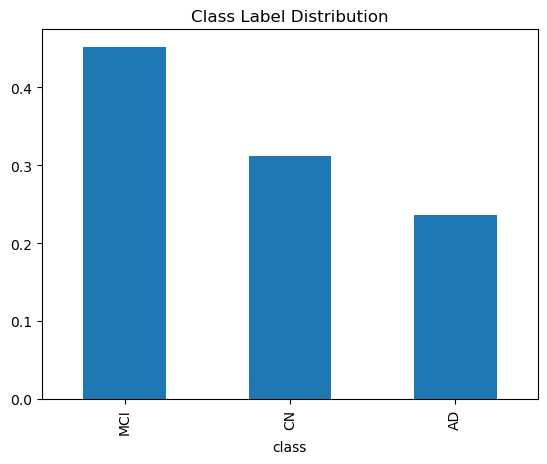

In [10]:
# Show the label distribution in the saved CSV file
import pandas as pd

df = pd.read_csv('fused_slices_with_class_labels.csv')
print(df['class'].value_counts())
df['class'].value_counts(normalize=True).plot(kind='bar', title='Class Label Distribution')

In [11]:
# Inspect DataFrame sizes and join key uniqueness before merging
print('fused_df shape:', fused_df.shape)
print('mri_df shape:', mri_df.shape)
print('Unique Image Data ID in fused_df:', fused_df['Image Data ID'].nunique())
print('Unique Image Data ID in mri_df:', mri_df['Image Data ID'].nunique())
print('Duplicated Image Data ID in mri_df:', mri_df['Image Data ID'].duplicated().sum())
print('Duplicated Image Data ID in fused_df:', fused_df['Image Data ID'].duplicated().sum())

fused_df shape: (100608, 1025)
mri_df shape: (157312, 924)
Unique Image Data ID in fused_df: 1435
Unique Image Data ID in mri_df: 2244
Duplicated Image Data ID in mri_df: 155068
Duplicated Image Data ID in fused_df: 99173


In [16]:
import pandas as pd

DATA_PATH = r"D:\fused_slices_with_class_labels.csv"

df = pd.read_csv(DATA_PATH)
print(df.shape)
df.head()


(100608, 1026)


,MRI_PCA_1,MRI_PCA_2,MRI_PCA_3,MRI_PCA_4,MRI_PCA_5,MRI_PCA_6,MRI_PCA_7,MRI_PCA_8,MRI_PCA_9,MRI_PCA_10,...,503,504,505,506,507,508,509,510,511,class
0,-21.676611,-23.199733,3.300934,-0.623347,-5.953891,1.708547,0.464795,3.110394,-2.746650,-3.676724,...,0.4666,0.5303,-0.2162,-0.2463,-0.1489,0.0961,0.02737,0.108,0.05194,AD
1,-13.295364,-20.571071,-1.845377,-1.466116,1.683559,0.412212,3.421545,2.698402,-1.885013,-2.950790,...,0.4666,0.5303,-0.2162,-0.2463,-0.1489,0.0961,0.02737,0.108,0.05194,AD
2,-19.647704,-23.461977,3.082092,-0.454033,-2.859943,1.139957,0.708884,3.662849,-3.164168,-2.775048,...,0.4666,0.5303,-0.2162,-0.2463,-0.1489,0.0961,0.02737,0.108,0.05194,AD
3,-18.480411,-26.944576,4.913273,-1.104961,-1.092768,3.736482,1.155239,3.656435,-2.960419,-3.966674,...,0.4666,0.5303,-0.2162,-0.2463,-0.1489,0.0961,0.02737,0.108,0.05194,AD
4,-14.006383,-17.327798,-1.427254,-3.127050,-0.551345,0.616968,1.508892,3.873763,-1.075056,-2.464670,...,0.4666,0.5303,-0.2162,-0.2463,-0.1489,0.0961,0.02737,0.108,0.05194,AD


Dataset shape: (100608, 1026)
Feature shape: (100608, 1024)
Unique subjects: 1435
Class distribution:
 class
MCI    45440
CN     31360
AD     23808
Name: count, dtype: int64
Class mapping:
AD -> 0
CN -> 1
MCI -> 2

Train subjects: 1148
Test subjects: 287
Train samples: 81024
Test samples: 19584

Training Random Forest...

Accuracy: 0.8257250816993464

Classification Report:

              precision    recall  f1-score   support

          AD       0.88      0.62      0.73      4288
          CN       0.80      0.76      0.78      6080
         MCI       0.82      0.96      0.89      9216

    accuracy                           0.83     19584
   macro avg       0.83      0.78      0.80     19584
weighted avg       0.83      0.83      0.82     19584



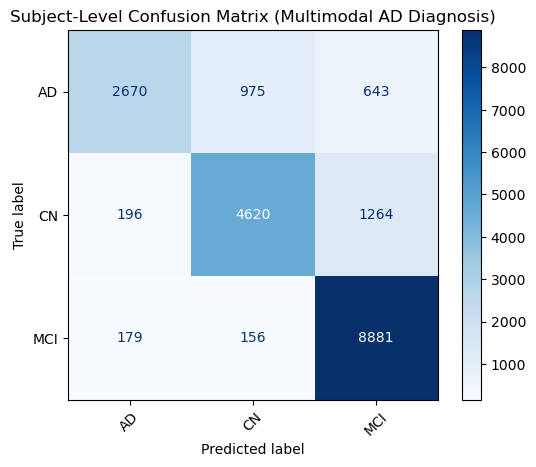


Model and label encoder saved successfully.


In [17]:
# ============================================================
# Subject-Level Safe Multimodal Alzheimer's Diagnosis Pipeline
# Using Image Data ID for Grouped Splitting
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import joblib
import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import classification_report, accuracy_score, ConfusionMatrixDisplay

# ------------------------------------------------------------
# 1. Load Fused Multimodal Dataset
# ------------------------------------------------------------
DATA_PATH = r"D:\fused_slices_with_class_labels.csv"
df = pd.read_csv(DATA_PATH)

print("Dataset shape:", df.shape)

# ------------------------------------------------------------
# 2. Define Columns
# ------------------------------------------------------------
LABEL_COL = "class"
GROUP_COL = "Image Data ID"   # ✅ subject-level grouping key

# Sanity check
assert GROUP_COL in df.columns, "Image Data ID column not found!"
assert LABEL_COL in df.columns, "Class column not found!"

# ------------------------------------------------------------
# 3. Separate Features, Labels, Groups
# ------------------------------------------------------------
X = df.drop(columns=[LABEL_COL, GROUP_COL])
y = df[LABEL_COL]
groups = df[GROUP_COL]

print("Feature shape:", X.shape)
print("Unique subjects:", groups.nunique())
print("Class distribution:\n", y.value_counts())

# ------------------------------------------------------------
# 4. Encode Labels
# ------------------------------------------------------------
le = LabelEncoder()
y_encoded = le.fit_transform(y)

print("Class mapping:")
for c, i in zip(le.classes_, range(len(le.classes_))):
    print(f"{c} -> {i}")

# ------------------------------------------------------------
# 5. SUBJECT-LEVEL Train/Test Split
# ------------------------------------------------------------
gss = GroupShuffleSplit(
    n_splits=1,
    test_size=0.20,
    random_state=42
)

train_idx, test_idx = next(gss.split(X, y_encoded, groups))

X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]

print("\nTrain subjects:", groups.iloc[train_idx].nunique())
print("Test subjects:", groups.iloc[test_idx].nunique())
print("Train samples:", X_train.shape[0])
print("Test samples:", X_test.shape[0])

# ------------------------------------------------------------
# 6. Train Random Forest Classifier
# ------------------------------------------------------------
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=20,
    n_jobs=-1,
    random_state=42
)

print("\nTraining Random Forest...")
rf.fit(X_train, y_train)

# ------------------------------------------------------------
# 7. Evaluation
# ------------------------------------------------------------
y_pred = rf.predict(X_test)

print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred, target_names=le.classes_))

# ------------------------------------------------------------
# 8. Confusion Matrix
# ------------------------------------------------------------
ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred,
    display_labels=le.classes_,
    cmap="Blues",
    xticks_rotation=45
)
plt.title("Subject-Level Confusion Matrix (Multimodal AD Diagnosis)")
plt.show()

# ------------------------------------------------------------
# 9. Save Model & Encoder
# ------------------------------------------------------------
joblib.dump(rf, "multimodal_rf_subject_level.pkl")
joblib.dump(le, "label_encoder.pkl")

print("\nModel and label encoder saved successfully.")


In [18]:
# ============================================================
# Subject-Level Cross-Validation with XGBoost
# Multimodal AD Diagnosis
# ============================================================

import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GroupKFold
from sklearn.metrics import accuracy_score, classification_report
from xgboost import XGBClassifier

# ------------------------------------------------------------
# 1. Load Dataset
# ------------------------------------------------------------
DATA_PATH = r"D:\fused_slices_with_class_labels.csv"
df = pd.read_csv(DATA_PATH)

print("Dataset shape:", df.shape)

# ------------------------------------------------------------
# 2. Define Columns
# ------------------------------------------------------------
LABEL_COL = "class"
GROUP_COL = "Image Data ID"

assert LABEL_COL in df.columns
assert GROUP_COL in df.columns

# ------------------------------------------------------------
# 3. Separate Features, Labels, Groups
# ------------------------------------------------------------
X = df.drop(columns=[LABEL_COL, GROUP_COL])
y = df[LABEL_COL]
groups = df[GROUP_COL]

print("Feature shape:", X.shape)
print("Unique subjects:", groups.nunique())

# ------------------------------------------------------------
# 4. Encode Labels
# ------------------------------------------------------------
le = LabelEncoder()
y_encoded = le.fit_transform(y)

num_classes = len(le.classes_)
print("Classes:", le.classes_)

# ------------------------------------------------------------
# 5. GroupKFold Cross-Validation
# ------------------------------------------------------------
gkf = GroupKFold(n_splits=5)

fold_accuracies = []

print("\nStarting Subject-Level Cross-Validation...\n")

for fold, (train_idx, test_idx) in enumerate(gkf.split(X, y_encoded, groups), 1):

    print(f"========== Fold {fold} ==========")

    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]

    print("Train subjects:", groups.iloc[train_idx].nunique())
    print("Test subjects :", groups.iloc[test_idx].nunique())

    # --------------------------------------------------------
    # 6. XGBoost Model
    # --------------------------------------------------------
    xgb_model = XGBClassifier(
        objective="multi:softprob",
        num_class=num_classes,
        n_estimators=300,
        max_depth=6,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        eval_metric="mlogloss",
        random_state=42,
        n_jobs=-1
    )

    # --------------------------------------------------------
    # 7. Train
    # --------------------------------------------------------
    xgb_model.fit(X_train, y_train)

    # --------------------------------------------------------
    # 8. Evaluate
    # --------------------------------------------------------
    y_pred = xgb_model.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    fold_accuracies.append(acc)

    print(f"Fold {fold} Accuracy: {acc:.4f}")
    print(classification_report(y_test, y_pred, target_names=le.classes_))

# ------------------------------------------------------------
# 9. Cross-Validation Summary
# ------------------------------------------------------------
print("\n========== Cross-Validation Results ==========")
print("Fold Accuracies:", np.round(fold_accuracies, 4))
print("Mean Accuracy :", np.mean(fold_accuracies))
print("Std Accuracy  :", np.std(fold_accuracies))


Dataset shape: (100608, 1026)
Feature shape: (100608, 1024)
Unique subjects: 1435
Classes: ['AD' 'CN' 'MCI']

Starting Subject-Level Cross-Validation...

========== Fold 1 ==========
Train subjects: 1148
Test subjects : 287
Fold 1 Accuracy: 0.9515
              precision    recall  f1-score   support

          AD       0.98      0.95      0.96      5056
          CN       0.96      0.92      0.94      5632
         MCI       0.94      0.97      0.95      9472

    accuracy                           0.95     20160
   macro avg       0.96      0.95      0.95     20160
weighted avg       0.95      0.95      0.95     20160

========== Fold 2 ==========
Train subjects: 1148
Test subjects : 287
Fold 2 Accuracy: 0.9693
              precision    recall  f1-score   support

          AD       0.98      0.98      0.98      4032
          CN       0.99      0.94      0.97      7168
         MCI       0.95      0.99      0.97      8960

    accuracy                           0.97     20160
   ma

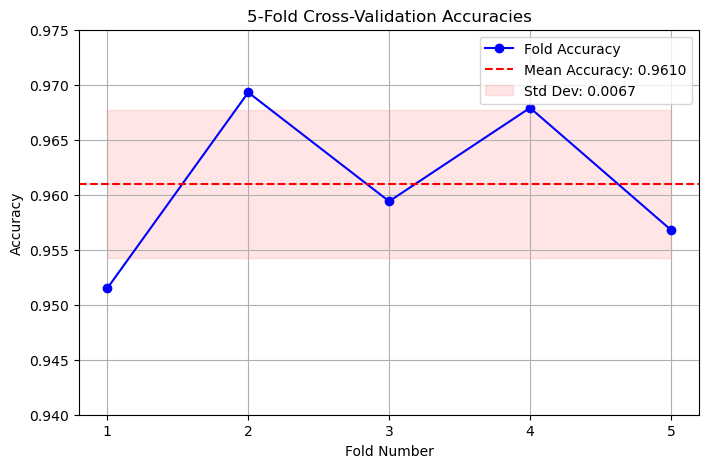

In [19]:
import matplotlib.pyplot as plt
import numpy as np

# Your CV results
fold_accuracies = np.array([0.9515, 0.9693, 0.9594, 0.9679, 0.9568])
mean_acc = fold_accuracies.mean()
std_acc = fold_accuracies.std()

# Plot
plt.figure(figsize=(8,5))
plt.plot(range(1, len(fold_accuracies)+1), fold_accuracies, marker='o', linestyle='-', color='blue', label='Fold Accuracy')
plt.axhline(mean_acc, color='red', linestyle='--', label=f'Mean Accuracy: {mean_acc:.4f}')
plt.fill_between(range(1, len(fold_accuracies)+1), mean_acc-std_acc, mean_acc+std_acc, color='red', alpha=0.1, label=f'Std Dev: {std_acc:.4f}')

plt.xticks(range(1, len(fold_accuracies)+1))
plt.ylim(0.94, 0.975)
plt.xlabel('Fold Number')
plt.ylabel('Accuracy')
plt.title('5-Fold Cross-Validation Accuracies')
plt.legend()
plt.grid(True)
plt.show()


Classes: ['AD' 'CN' 'MCI']
Unique subjects: 1435

Starting Subject-Level Cross-Validation...

========== Fold 1 ==========
Train subjects: 1148
Test subjects : 287
Fold 1 Accuracy: 0.9515
              precision    recall  f1-score   support

          AD       0.98      0.95      0.96      5056
          CN       0.96      0.92      0.94      5632
         MCI       0.94      0.97      0.95      9472

    accuracy                           0.95     20160
   macro avg       0.96      0.95      0.95     20160
weighted avg       0.95      0.95      0.95     20160



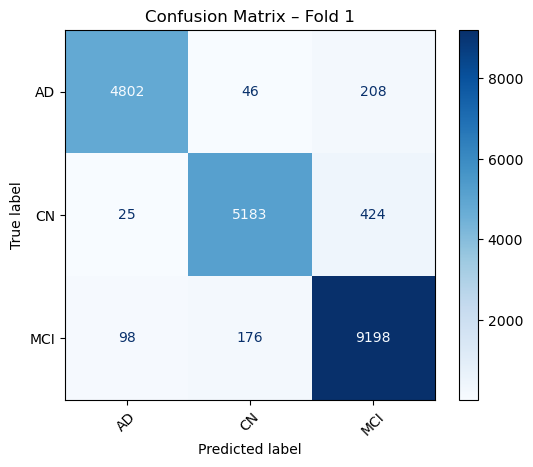

========== Fold 2 ==========
Train subjects: 1148
Test subjects : 287
Fold 2 Accuracy: 0.9693
              precision    recall  f1-score   support

          AD       0.98      0.98      0.98      4032
          CN       0.99      0.94      0.97      7168
         MCI       0.95      0.99      0.97      8960

    accuracy                           0.97     20160
   macro avg       0.97      0.97      0.97     20160
weighted avg       0.97      0.97      0.97     20160



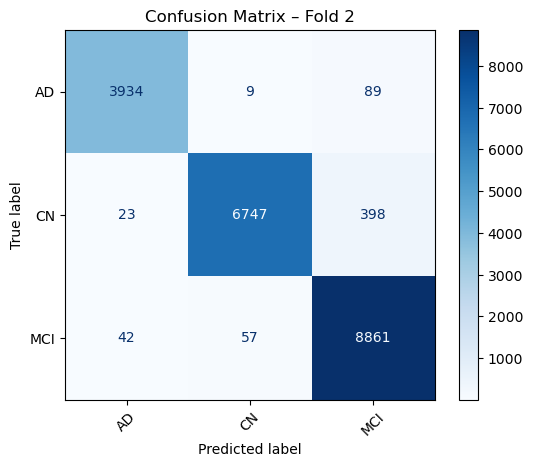

========== Fold 3 ==========
Train subjects: 1148
Test subjects : 287
Fold 3 Accuracy: 0.9594
              precision    recall  f1-score   support

          AD       0.98      0.95      0.97      4224
          CN       0.99      0.92      0.95      6720
         MCI       0.93      0.99      0.96      9152

    accuracy                           0.96     20096
   macro avg       0.97      0.95      0.96     20096
weighted avg       0.96      0.96      0.96     20096



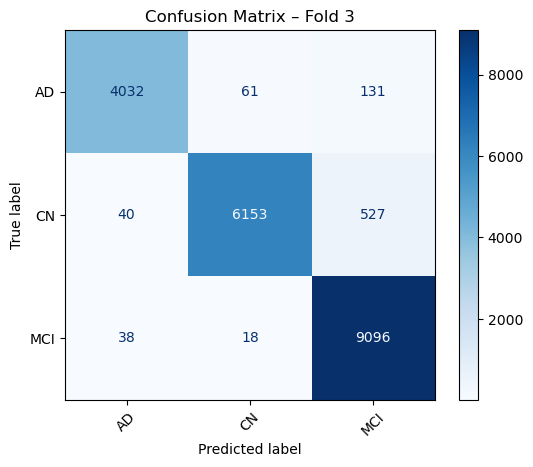

========== Fold 4 ==========
Train subjects: 1148
Test subjects : 287
Fold 4 Accuracy: 0.9679
              precision    recall  f1-score   support

          AD       0.98      0.98      0.98      5568
          CN       0.97      0.94      0.95      5312
         MCI       0.96      0.98      0.97      9216

    accuracy                           0.97     20096
   macro avg       0.97      0.96      0.97     20096
weighted avg       0.97      0.97      0.97     20096



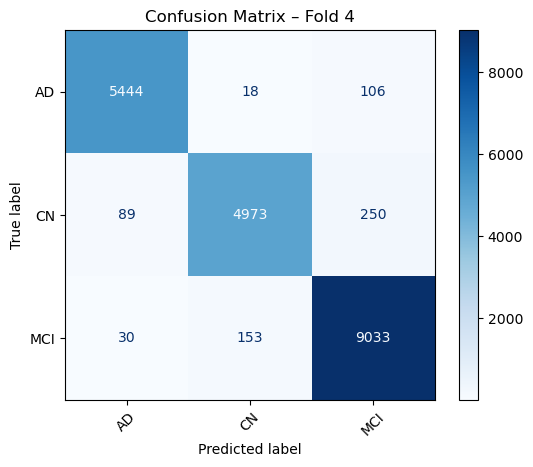

========== Fold 5 ==========
Train subjects: 1148
Test subjects : 287
Fold 5 Accuracy: 0.9568
              precision    recall  f1-score   support

          AD       0.99      0.94      0.96      4928
          CN       0.97      0.94      0.96      6528
         MCI       0.93      0.98      0.95      8640

    accuracy                           0.96     20096
   macro avg       0.96      0.95      0.96     20096
weighted avg       0.96      0.96      0.96     20096



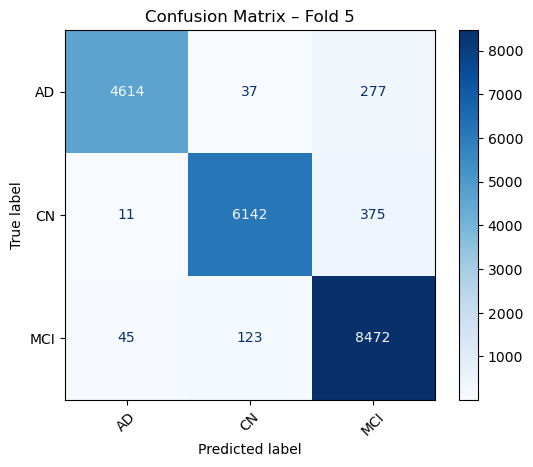


========== Cross-Validation Summary ==========
Fold Accuracies: [0.9515 0.9693 0.9594 0.9679 0.9568]
Mean Accuracy : 0.9609978452633708
Std Accuracy  : 0.006725431388544024


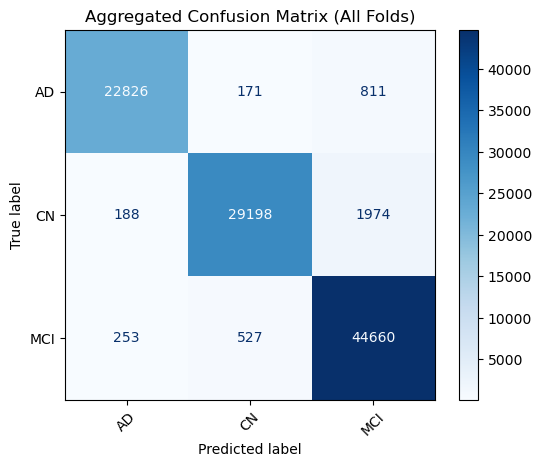

In [3]:
# ============================================================
# Subject-Level Cross-Validation with XGBoost
# Confusion Matrix per Fold + Aggregated
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GroupKFold
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)
from xgboost import XGBClassifier

# ------------------------------------------------------------
# 1. Load Dataset
# ------------------------------------------------------------
DATA_PATH = r"D:\fused_slices_with_class_labels.csv"
df = pd.read_csv(DATA_PATH)

LABEL_COL = "class"
GROUP_COL = "Image Data ID"

# ------------------------------------------------------------
# 2. Prepare Data
# ------------------------------------------------------------
X = df.drop(columns=[LABEL_COL, GROUP_COL])
y = df[LABEL_COL]
groups = df[GROUP_COL]

le = LabelEncoder()
y_encoded = le.fit_transform(y)

num_classes = len(le.classes_)
class_names = le.classes_

print("Classes:", class_names)
print("Unique subjects:", groups.nunique())

# ------------------------------------------------------------
# 3. GroupKFold Cross-Validation
# ------------------------------------------------------------
gkf = GroupKFold(n_splits=5)

fold_accuracies = []
cm_aggregate = np.zeros((num_classes, num_classes), dtype=int)

print("\nStarting Subject-Level Cross-Validation...\n")

for fold, (train_idx, test_idx) in enumerate(gkf.split(X, y_encoded, groups), 1):

    print(f"========== Fold {fold} ==========")

    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]

    print("Train subjects:", groups.iloc[train_idx].nunique())
    print("Test subjects :", groups.iloc[test_idx].nunique())

    # --------------------------------------------------------
    # 4. XGBoost Model
    # --------------------------------------------------------
    model = XGBClassifier(
        objective="multi:softprob",
        num_class=num_classes,
        n_estimators=300,
        max_depth=6,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        eval_metric="mlogloss",
        random_state=42,
        n_jobs=-1
    )

    # --------------------------------------------------------
    # 5. Train
    # --------------------------------------------------------
    model.fit(X_train, y_train)

    # --------------------------------------------------------
    # 6. Predict
    # --------------------------------------------------------
    y_pred = model.predict(X_test)

    # --------------------------------------------------------
    # 7. Metrics
    # --------------------------------------------------------
    acc = accuracy_score(y_test, y_pred)
    fold_accuracies.append(acc)

    print(f"Fold {fold} Accuracy: {acc:.4f}")
    print(classification_report(y_test, y_pred, target_names=class_names))

    # --------------------------------------------------------
    # 8. Confusion Matrix (Per Fold)
    # --------------------------------------------------------
    cm = confusion_matrix(y_test, y_pred)
    cm_aggregate += cm

    disp = ConfusionMatrixDisplay(
        confusion_matrix=cm,
        display_labels=class_names
    )
    disp.plot(cmap="Blues", xticks_rotation=45)
    plt.title(f"Confusion Matrix – Fold {fold}")
    plt.show()

# ------------------------------------------------------------
# 9. Cross-Validation Summary
# ------------------------------------------------------------
print("\n========== Cross-Validation Summary ==========")
print("Fold Accuracies:", np.round(fold_accuracies, 4))
print("Mean Accuracy :", np.mean(fold_accuracies))
print("Std Accuracy  :", np.std(fold_accuracies))

# ------------------------------------------------------------
# 10. Aggregated Confusion Matrix
# ------------------------------------------------------------
disp_total = ConfusionMatrixDisplay(
    confusion_matrix=cm_aggregate,
    display_labels=class_names
)
disp_total.plot(cmap="Blues", xticks_rotation=45)
plt.title("Aggregated Confusion Matrix (All Folds)")
plt.show()


In [1]:
import pandas as pd
import numpy as np
import xgboost as xgb
import shap

from sklearn.model_selection import GroupKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, accuracy_score

import matplotlib.pyplot as plt
import seaborn as sns


d:\Anaconda\envs\torch_gpu\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
DATA_PATH = r"D:\fused_slices_with_class_labels.csv"

TARGET_COL = "class"
GROUP_COL = "Image Data ID"

df = pd.read_csv(DATA_PATH)

# Encode labels
le = LabelEncoder()
df[TARGET_COL] = le.fit_transform(df[TARGET_COL])

X = df.drop(columns=[TARGET_COL, GROUP_COL])
y = df[TARGET_COL]
groups = df[GROUP_COL]

feature_names = X.columns



========== Fold 1 ==========
Train: (80448, 1024) Test: (20160, 1024)
Fold 1 Accuracy: 0.9515


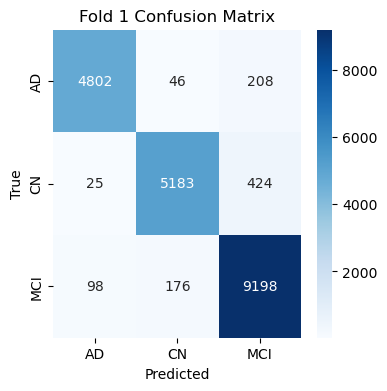

<Figure size 640x480 with 0 Axes>

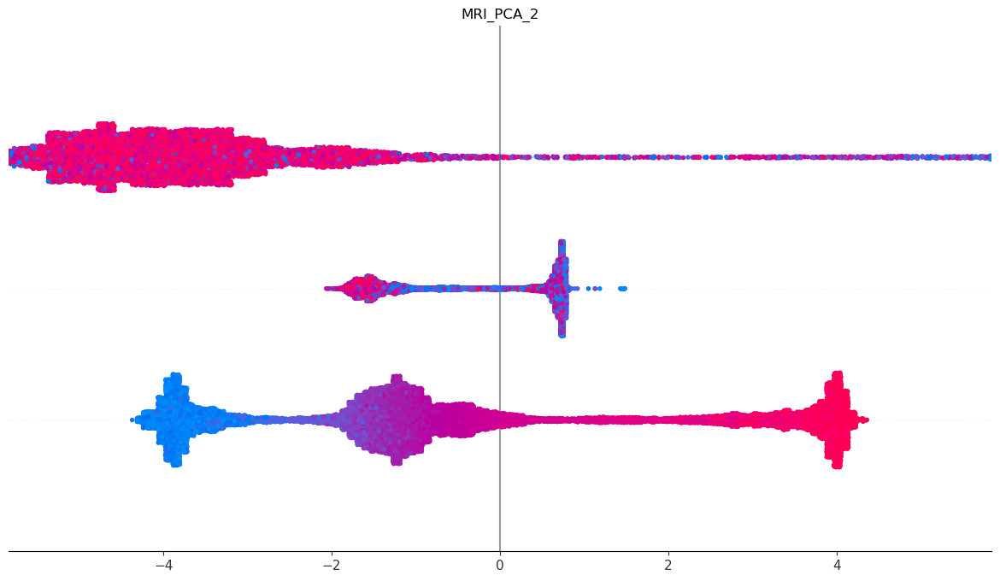


========== Fold 2 ==========
Train: (80448, 1024) Test: (20160, 1024)
Fold 2 Accuracy: 0.9693


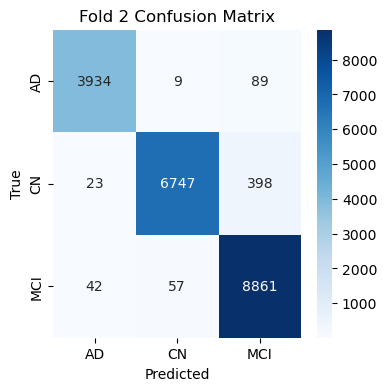

<Figure size 640x480 with 0 Axes>

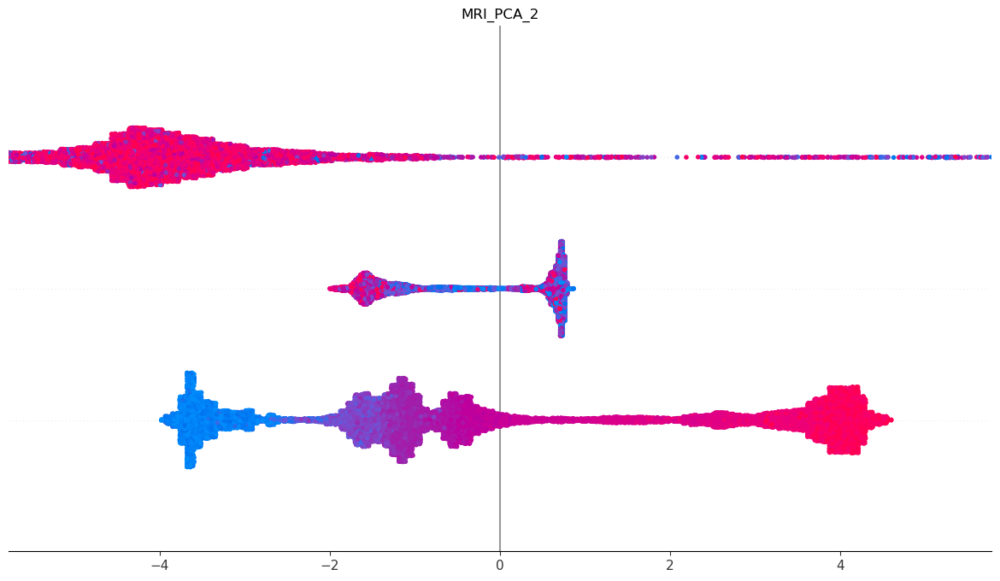


========== Fold 3 ==========
Train: (80512, 1024) Test: (20096, 1024)
Fold 3 Accuracy: 0.9594


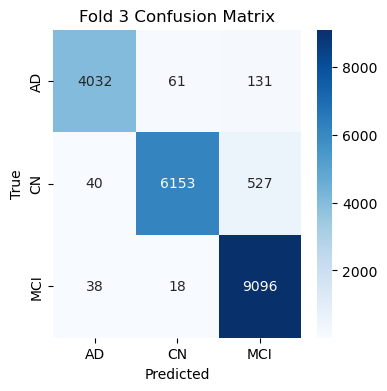

<Figure size 640x480 with 0 Axes>

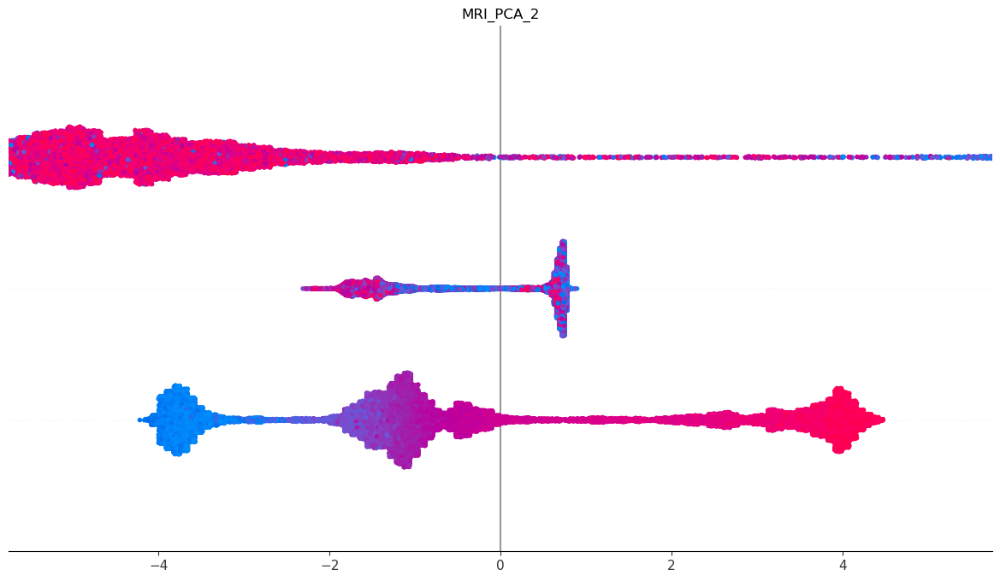


========== Fold 4 ==========
Train: (80512, 1024) Test: (20096, 1024)
Fold 4 Accuracy: 0.9679


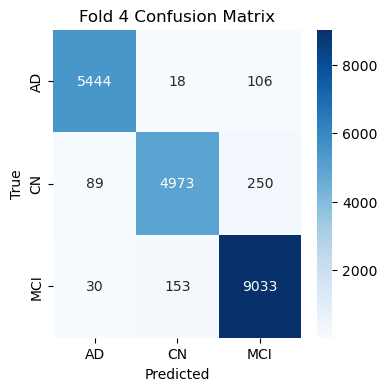

<Figure size 640x480 with 0 Axes>

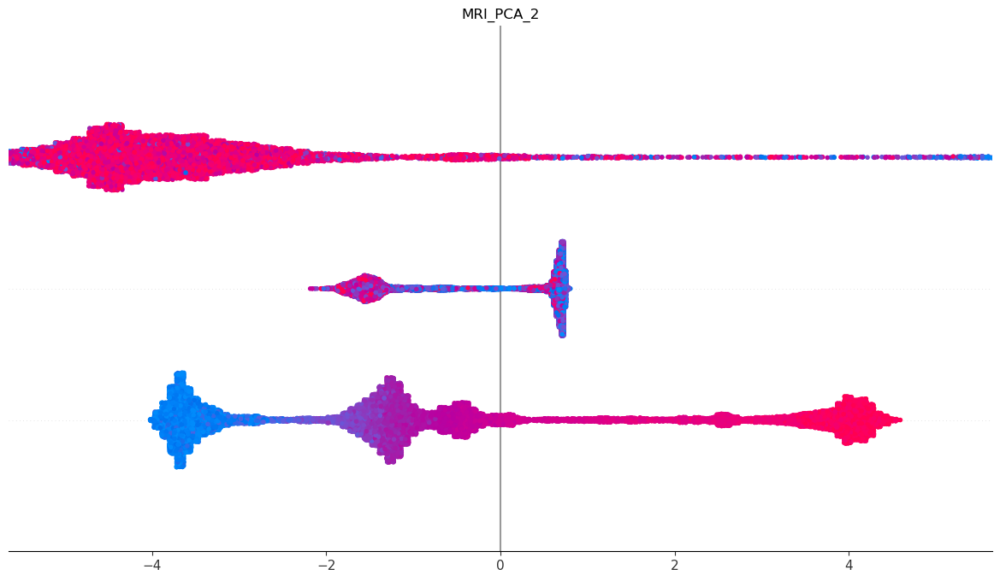


========== Fold 5 ==========
Train: (80512, 1024) Test: (20096, 1024)
Fold 5 Accuracy: 0.9568


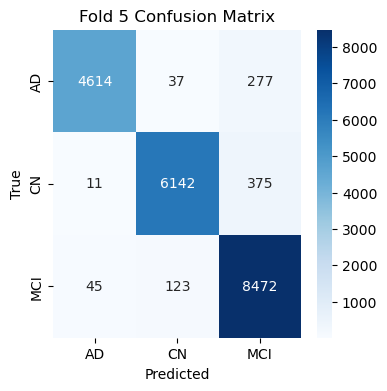

<Figure size 640x480 with 0 Axes>

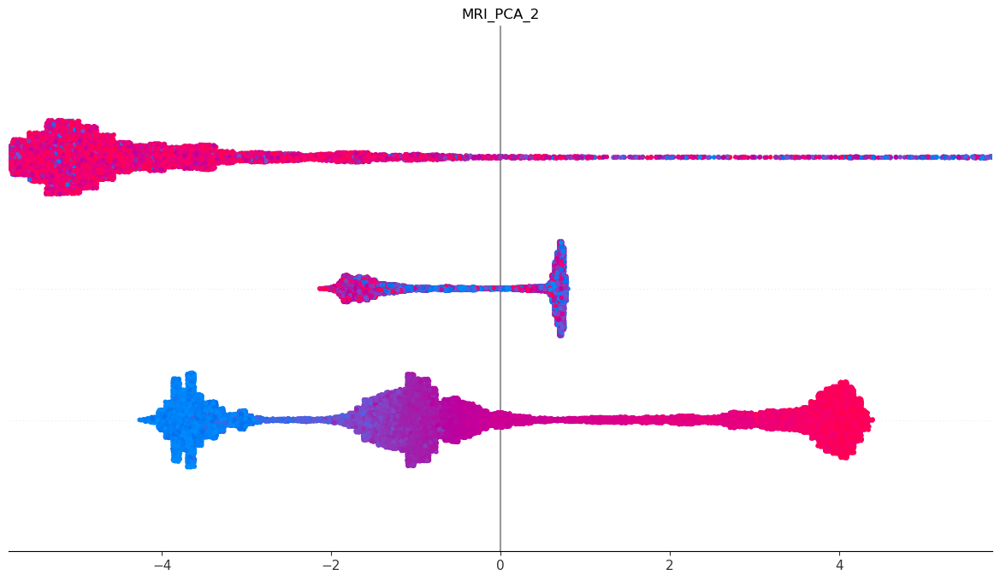

In [3]:
gkf = GroupKFold(n_splits=5)

all_true, all_pred = [], []
all_shap_values = []

for fold, (train_idx, test_idx) in enumerate(gkf.split(X, y, groups), 1):
    print(f"\n========== Fold {fold} ==========")

    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    print("Train:", X_train.shape, "Test:", X_test.shape)

    # ---- XGBoost Model ----
    model = xgb.XGBClassifier(
        n_estimators=300,
        max_depth=6,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        objective="multi:softprob",
        num_class=len(le.classes_),
        eval_metric="mlogloss",
        random_state=42,
        tree_method="hist"
    )

    model.fit(X_train, y_train)

    # ---- Evaluation ----
    preds = model.predict(X_test)
    acc = accuracy_score(y_test, preds)
    print(f"Fold {fold} Accuracy: {acc:.4f}")

    all_true.extend(y_test)
    all_pred.extend(preds)

    # ---- Confusion Matrix ----
    cm = confusion_matrix(y_test, preds)

    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=le.classes_,
                yticklabels=le.classes_)
    plt.title(f"Fold {fold} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

    # ---- SHAP ----
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_test)

    all_shap_values.append(shap_values)

    # ---- SHAP Summary (Fold-wise) ----
    shap.summary_plot(
        shap_values,
        X_test,
        feature_names=feature_names,
        show=True
    )


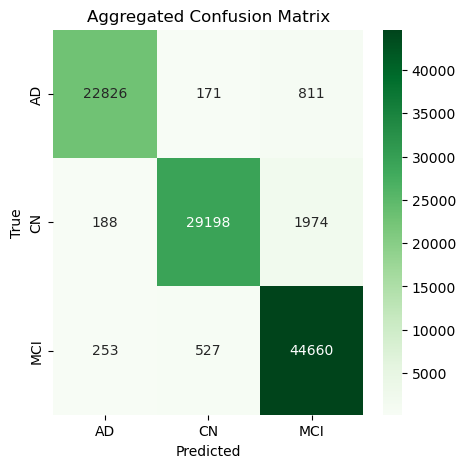

In [4]:
cm_all = confusion_matrix(all_true, all_pred)

plt.figure(figsize=(5, 5))
sns.heatmap(cm_all, annot=True, fmt="d", cmap="Greens",
            xticklabels=le.classes_,
            yticklabels=le.classes_)
plt.title("Aggregated Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


In [ ]:
COMPLETE CODE: XGBoost + SHAP (MRI vs Clinical Contribution)


In [9]:
# =========================
# 1. IMPORT LIBRARIES
# =========================
import pandas as pd
import numpy as np
import shap
import xgboost as xgb
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


In [10]:
# =========================
# 2. LOAD FUSED DATASET
# =========================
DATA_PATH = r"D:\fused_slices_with_class_labels.csv"
df = pd.read_csv(DATA_PATH)

print("Dataset shape:", df.shape)


Dataset shape: (100608, 1026)


In [11]:
# =========================
# 3. PREPARE FEATURES & LABELS
# =========================
X = df.drop(columns=["class"])
y_raw = df["class"]

# Encode class labels
le = LabelEncoder()
y = le.fit_transform(y_raw)

class_names = le.classes_
print("Classes:", class_names)

feature_names = X.columns.tolist()


Classes: ['AD' 'CN' 'MCI']


In [12]:
# =========================
# 4. DEFINE MODALITY GROUPS
# =========================
# MRI features (PCA + CNN features)
mri_features = [c for c in feature_names if c.startswith("MRI_") or c.isdigit()]

# Clinical embeddings (demographics + symptoms)
clinical_features = [c for c in feature_names if c not in mri_features]

print("MRI features:", len(mri_features))
print("Clinical features:", len(clinical_features))


MRI features: 1024
Clinical features: 1


In [ ]:
# All feature columns (exclude label)
feature_cols = df.drop(columns=["class"]).columns.tolist()

# Number of CLIP clinical embeddings
CLIP_DIM = 512

# Clinical features = LAST 512 columns
clinical_features = feature_cols[-CLIP_DIM:]

# MRI features = EVERYTHING ELSE
mri_features = feature_cols[:-CLIP_DIM]

print("MRI features:", len(mri_features))
print("Clinical features:", len(clinical_features))


In [ ]:
# =========================
# 5. TRAIN XGBOOST MODEL
# =========================
model = xgb.XGBClassifier(
    objective="multi:softprob",
    num_class=len(class_names),
    n_estimators=300,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric="mlogloss",
    random_state=42
)

model.fit(X, y)


In [ ]:
# =========================
# 6. COMPUTE SHAP VALUES
# =========================
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# Select AD class for explanation
ad_index = list(class_names).index("AD")
shap_ad = shap_values[ad_index]


In [ ]:
# =========================
# 7. SHAP SUMMARY (ALL FEATURES)
# =========================
shap.summary_plot(
    shap_ad,
    X,
    show=True
)


In [ ]:
# =========================
# 8. MRI-ONLY SHAP SUMMARY
# =========================
mri_idx = [feature_names.index(f) for f in mri_features]

shap.summary_plot(
    shap_ad[:, mri_idx],
    X[mri_features],
    title="MRI Feature Contribution (SHAP)",
    show=True
)


In [ ]:
# =========================
# 9. CLINICAL-ONLY SHAP SUMMARY
# =========================
clinical_idx = [feature_names.index(f) for f in clinical_features]

shap.summary_plot(
    shap_ad[:, clinical_idx],
    X[clinical_features],
    title="Clinical Feature Contribution (Demographics + Symptoms)",
    show=True
)


In [ ]:
# =========================
# 10. MODALITY-LEVEL CONTRIBUTION
# =========================
mri_contribution = np.mean(np.abs(shap_ad[:, mri_idx]))
clinical_contribution = np.mean(np.abs(shap_ad[:, clinical_idx]))

plt.figure(figsize=(6, 4))
plt.bar(
    ["MRI Features", "Clinical Features"],
    [mri_contribution, clinical_contribution]
)
plt.ylabel("Mean |SHAP Value|")
plt.title("Modality-wise Contribution to AD Prediction")
plt.show()


In [1]:
import os
import torch
import torch.nn as nn
import numpy as np
import cv2
from tqdm import tqdm
from torchvision import models, datasets, transforms
from torch.utils.data import DataLoader

from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image

# ==========================
# CONFIG
# ==========================
data_dir = r"D:\coronal_slices_filtered_flattened\test"   # MUST contain AD/CN/MCI
model_path = r"D:\mri_classification_model.pth"

output_mis = "misclassified_AD_gradcam"
output_correct = "correct_AD_gradcam"

batch_size = 1
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

os.makedirs(os.path.join(output_mis, "side_by_side"), exist_ok=True)
os.makedirs(os.path.join(output_correct, "side_by_side"), exist_ok=True)

# ==========================
# MODEL DEFINITION (MATCHES CHECKPOINT)
# ==========================
class MRIClassifier(nn.Module):
    def __init__(self, num_classes=3):
        super().__init__()
        self.backbone = models.resnet50(weights=None)
        self.backbone.fc = nn.Linear(self.backbone.fc.in_features, num_classes)

    def forward(self, x):
        return self.backbone(x)

# ==========================
# LOAD MODEL
# ==========================
model = MRIClassifier(num_classes=3)
state_dict = torch.load(model_path, map_location=device)
model.load_state_dict(state_dict)
model.to(device)
model.eval()

# ==========================
# DATA LOADER
# ==========================
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

dataset = datasets.ImageFolder(data_dir, transform=transform)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
idx_to_class = {v: k for k, v in dataset.class_to_idx.items()}

# ==========================
# GRAD-CAM++ SETUP
# ==========================
target_layers = [model.backbone.layer4[-1]]
cam = GradCAMPlusPlus(model=model, target_layers=target_layers)

total_focus_ratio = []
correct = 0
misclassified = 0

# ==========================
# GRAD-CAM LOOP
# ==========================
for i, (img, label) in enumerate(tqdm(loader, desc="Generating Grad-CAM++")):
    img = img.to(device)
    label = label.to(device)

    img.requires_grad_()  # IMPORTANT

    outputs = model(img)
    preds = outputs.argmax(dim=1)

    # --------------------------
    # Recover RGB image
    # --------------------------
    rgb_img = img[0].permute(1, 2, 0).detach().cpu().numpy()
    rgb_img = np.clip(
        rgb_img * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406],
        0, 1
    )

    # --------------------------
    # Grad-CAM++
    # --------------------------
    grayscale_cam = cam(input_tensor=img)[0]

    # --------------------------
    # Hippocampal ROI (Approx.)
    # --------------------------
    h, w = grayscale_cam.shape
    hippocampus_mask = np.zeros((h, w), dtype=np.float32)

    x1, x2 = int(w * 0.35), int(w * 0.65)
    y1, y2 = int(h * 0.55), int(h * 0.85)
    hippocampus_mask[y1:y2, x1:x2] = 1.0

    masked_cam = grayscale_cam * hippocampus_mask
    masked_cam /= (masked_cam.max() + 1e-8)

    focus_ratio = masked_cam.sum() / (grayscale_cam.sum() + 1e-8)
    total_focus_ratio.append(focus_ratio)

    # --------------------------
    # Visualization
    # --------------------------
    vis_full = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
    vis_roi = show_cam_on_image(rgb_img, masked_cam, use_rgb=True)

    rgb_cv = (rgb_img * 255).astype(np.uint8)[:, :, ::-1]
    vis_full = vis_full[:, :, ::-1]
    vis_roi = vis_roi[:, :, ::-1]

    side_by_side = np.hstack([rgb_cv, vis_full, vis_roi])

    fname = os.path.basename(dataset.samples[i][0])
    save_dir = output_correct if preds == label else output_mis

    save_path = os.path.join(
        save_dir,
        "side_by_side",
        f"{fname}_pred{idx_to_class[preds.item()]}_true{idx_to_class[label.item()]}.jpg"
    )

    cv2.imwrite(save_path, side_by_side)

    if preds == label:
        correct += 1
    else:
        misclassified += 1

    print(f"{fname} → Hippocampal focus: {focus_ratio:.2%}")

# ==========================
# SUMMARY
# ==========================
print("\n================ SUMMARY ================")
print(f"Correct       : {correct}")
print(f"Misclassified : {misclassified}")
print(f"Avg Hippo Focus Ratio: {np.mean(total_focus_ratio):.2%}")
print(f"Saved to:\n{output_correct}/side_by_side\n{output_mis}/side_by_side")


C:\Users\Nimra Nadeem\AppData\Local\Temp\ipykernel_10596\1401075378.py:44: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(model_path, map_location=dev

002_S_0816_I92146_AD_slice_0074.png → Hippocampal focus: 10.71%
002_S_0816_I92146_AD_slice_0075.png → Hippocampal focus: 34.41%
002_S_0816_I92146_AD_slice_0076.png → Hippocampal focus: 14.05%
002_S_0816_I92146_AD_slice_0077.png → Hippocampal focus: 16.21%


Generating Grad-CAM++:   0%|          | 7/21248 [00:01<51:30,  6.87it/s]  

002_S_0816_I92146_AD_slice_0078.png → Hippocampal focus: 10.18%
002_S_0816_I92146_AD_slice_0079.png → Hippocampal focus: 12.52%
002_S_0816_I92146_AD_slice_0080.png → Hippocampal focus: 8.37%


Generating Grad-CAM++:   0%|          | 11/21248 [00:01<34:29, 10.26it/s]

002_S_0816_I92146_AD_slice_0081.png → Hippocampal focus: 13.98%
002_S_0816_I92146_AD_slice_0082.png → Hippocampal focus: 10.37%
002_S_0816_I92146_AD_slice_0083.png → Hippocampal focus: 14.73%
002_S_0816_I92146_AD_slice_0084.png → Hippocampal focus: 14.87%


Generating Grad-CAM++:   0%|          | 15/21248 [00:02<28:22, 12.47it/s]

002_S_0816_I92146_AD_slice_0085.png → Hippocampal focus: 15.68%
002_S_0816_I92146_AD_slice_0086.png → Hippocampal focus: 16.63%
002_S_0816_I92146_AD_slice_0087.png → Hippocampal focus: 20.06%
002_S_0816_I92146_AD_slice_0088.png → Hippocampal focus: 11.96%


Generating Grad-CAM++:   0%|          | 17/21248 [00:02<27:23, 12.92it/s]

002_S_0816_I92146_AD_slice_0089.png → Hippocampal focus: 10.85%
002_S_0816_I92146_AD_slice_0090.png → Hippocampal focus: 8.47%
002_S_0816_I92146_AD_slice_0091.png → Hippocampal focus: 9.91%


Generating Grad-CAM++:   0%|          | 21/21248 [00:02<24:59, 14.15it/s]

002_S_0816_I92146_AD_slice_0092.png → Hippocampal focus: 7.25%
002_S_0816_I92146_AD_slice_0093.png → Hippocampal focus: 9.44%
002_S_0816_I92146_AD_slice_0094.png → Hippocampal focus: 6.43%
002_S_0816_I92146_AD_slice_0095.png → Hippocampal focus: 6.75%


Generating Grad-CAM++:   0%|          | 25/21248 [00:02<22:37, 15.63it/s]

002_S_0816_I92146_AD_slice_0096.png → Hippocampal focus: 10.05%
002_S_0816_I92146_AD_slice_0097.png → Hippocampal focus: 20.46%
002_S_0816_I92146_AD_slice_0098.png → Hippocampal focus: 13.04%
002_S_0816_I92146_AD_slice_0099.png → Hippocampal focus: 13.59%


Generating Grad-CAM++:   0%|          | 29/21248 [00:02<23:15, 15.21it/s]

002_S_0816_I92146_AD_slice_0100.png → Hippocampal focus: 19.13%
002_S_0816_I92146_AD_slice_0101.png → Hippocampal focus: 10.18%
002_S_0816_I92146_AD_slice_0102.png → Hippocampal focus: 19.36%
002_S_0816_I92146_AD_slice_0103.png → Hippocampal focus: 10.34%


Generating Grad-CAM++:   0%|          | 33/21248 [00:03<23:25, 15.09it/s]

002_S_0816_I92146_AD_slice_0104.png → Hippocampal focus: 6.74%
002_S_0816_I92146_AD_slice_0105.png → Hippocampal focus: 7.18%
002_S_0816_I92146_AD_slice_0106.png → Hippocampal focus: 7.19%


Generating Grad-CAM++:   0%|          | 35/21248 [00:03<24:32, 14.41it/s]

002_S_0816_I92146_AD_slice_0107.png → Hippocampal focus: 4.90%
002_S_0816_I92146_AD_slice_0108.png → Hippocampal focus: 7.25%
002_S_0816_I92146_AD_slice_0109.png → Hippocampal focus: 13.10%


Generating Grad-CAM++:   0%|          | 39/21248 [00:03<24:10, 14.63it/s]

002_S_0816_I92146_AD_slice_0110.png → Hippocampal focus: 12.62%
002_S_0816_I92146_AD_slice_0111.png → Hippocampal focus: 12.74%
002_S_0816_I92146_AD_slice_0112.png → Hippocampal focus: 7.61%
002_S_0816_I92146_AD_slice_0113.png → Hippocampal focus: 8.88%


Generating Grad-CAM++:   0%|          | 42/21248 [00:03<22:33, 15.66it/s]

002_S_0816_I92146_AD_slice_0114.png → Hippocampal focus: 8.02%
002_S_0816_I92146_AD_slice_0115.png → Hippocampal focus: 8.55%
002_S_0816_I92146_AD_slice_0116.png → Hippocampal focus: 19.24%


Generating Grad-CAM++:   0%|          | 46/21248 [00:04<24:03, 14.69it/s]

002_S_0816_I92146_AD_slice_0117.png → Hippocampal focus: 11.96%
002_S_0816_I92146_AD_slice_0118.png → Hippocampal focus: 25.91%
002_S_0816_I92146_AD_slice_0119.png → Hippocampal focus: 22.80%
002_S_0816_I92146_AD_slice_0120.png → Hippocampal focus: 18.20%


Generating Grad-CAM++:   0%|          | 50/21248 [00:04<24:01, 14.71it/s]

002_S_0816_I92146_AD_slice_0121.png → Hippocampal focus: 7.99%
002_S_0816_I92146_AD_slice_0122.png → Hippocampal focus: 16.35%
002_S_0816_I92146_AD_slice_0123.png → Hippocampal focus: 19.35%


Generating Grad-CAM++:   0%|          | 54/21248 [00:04<23:02, 15.33it/s]

002_S_0816_I92146_AD_slice_0124.png → Hippocampal focus: 17.39%
002_S_0816_I92146_AD_slice_0125.png → Hippocampal focus: 18.10%
002_S_0816_I92146_AD_slice_0126.png → Hippocampal focus: 15.09%
002_S_0816_I92146_AD_slice_0127.png → Hippocampal focus: 13.22%


Generating Grad-CAM++:   0%|          | 56/21248 [00:04<22:31, 15.68it/s]

002_S_0816_I92146_AD_slice_0128.png → Hippocampal focus: 8.68%
002_S_0816_I92146_AD_slice_0129.png → Hippocampal focus: 14.59%
002_S_0816_I92146_AD_slice_0130.png → Hippocampal focus: 15.38%


Generating Grad-CAM++:   0%|          | 60/21248 [00:05<23:43, 14.88it/s]

002_S_0816_I92146_AD_slice_0131.png → Hippocampal focus: 15.95%
002_S_0816_I92146_AD_slice_0132.png → Hippocampal focus: 24.53%
002_S_0816_I92146_AD_slice_0133.png → Hippocampal focus: 16.66%
002_S_0816_I92146_AD_slice_0134.png → Hippocampal focus: 15.53%


Generating Grad-CAM++:   0%|          | 65/21248 [00:05<24:02, 14.69it/s]

002_S_0816_I92146_AD_slice_0135.png → Hippocampal focus: 19.32%
002_S_0816_I92146_AD_slice_0136.png → Hippocampal focus: 12.76%
002_S_0816_I92146_AD_slice_0137.png → Hippocampal focus: 11.81%
006_S_0547_I78722_AD_slice_0100.png → Hippocampal focus: 22.17%


Generating Grad-CAM++:   0%|          | 67/21248 [00:05<23:47, 14.84it/s]

006_S_0547_I78722_AD_slice_0101.png → Hippocampal focus: 27.29%
006_S_0547_I78722_AD_slice_0102.png → Hippocampal focus: 10.68%
006_S_0547_I78722_AD_slice_0103.png → Hippocampal focus: 34.02%


Generating Grad-CAM++:   0%|          | 71/21248 [00:05<23:59, 14.71it/s]

006_S_0547_I78722_AD_slice_0104.png → Hippocampal focus: 11.33%
006_S_0547_I78722_AD_slice_0105.png → Hippocampal focus: 25.80%
006_S_0547_I78722_AD_slice_0106.png → Hippocampal focus: 6.47%
006_S_0547_I78722_AD_slice_0107.png → Hippocampal focus: 8.29%


Generating Grad-CAM++:   0%|          | 75/21248 [00:06<25:45, 13.70it/s]

006_S_0547_I78722_AD_slice_0108.png → Hippocampal focus: 37.81%
006_S_0547_I78722_AD_slice_0109.png → Hippocampal focus: 37.93%
006_S_0547_I78722_AD_slice_0110.png → Hippocampal focus: 16.31%


Generating Grad-CAM++:   0%|          | 79/21248 [00:06<24:19, 14.50it/s]

006_S_0547_I78722_AD_slice_0111.png → Hippocampal focus: 12.54%
006_S_0547_I78722_AD_slice_0112.png → Hippocampal focus: 8.71%
006_S_0547_I78722_AD_slice_0113.png → Hippocampal focus: 9.92%
006_S_0547_I78722_AD_slice_0114.png → Hippocampal focus: 14.02%


Generating Grad-CAM++:   0%|          | 81/21248 [00:06<24:41, 14.29it/s]

006_S_0547_I78722_AD_slice_0115.png → Hippocampal focus: 16.85%
006_S_0547_I78722_AD_slice_0116.png → Hippocampal focus: 20.35%
006_S_0547_I78722_AD_slice_0117.png → Hippocampal focus: 18.98%


Generating Grad-CAM++:   0%|          | 85/21248 [00:06<24:20, 14.49it/s]

006_S_0547_I78722_AD_slice_0118.png → Hippocampal focus: 17.55%
006_S_0547_I78722_AD_slice_0119.png → Hippocampal focus: 25.08%
006_S_0547_I78722_AD_slice_0120.png → Hippocampal focus: 24.19%


Generating Grad-CAM++:   0%|          | 89/21248 [00:07<23:43, 14.86it/s]

006_S_0547_I78722_AD_slice_0121.png → Hippocampal focus: 16.42%
006_S_0547_I78722_AD_slice_0122.png → Hippocampal focus: 14.64%
006_S_0547_I78722_AD_slice_0123.png → Hippocampal focus: 21.94%
006_S_0547_I78722_AD_slice_0124.png → Hippocampal focus: 23.85%


Generating Grad-CAM++:   0%|          | 91/21248 [00:07<23:21, 15.10it/s]

006_S_0547_I78722_AD_slice_0125.png → Hippocampal focus: 18.24%
006_S_0547_I78722_AD_slice_0126.png → Hippocampal focus: 17.12%
006_S_0547_I78722_AD_slice_0127.png → Hippocampal focus: 16.75%


Generating Grad-CAM++:   0%|          | 95/21248 [00:07<25:59, 13.56it/s]

006_S_0547_I78722_AD_slice_0128.png → Hippocampal focus: 15.47%
006_S_0547_I78722_AD_slice_0129.png → Hippocampal focus: 16.20%
006_S_0547_I78722_AD_slice_0130.png → Hippocampal focus: 14.09%


Generating Grad-CAM++:   0%|          | 97/21248 [00:07<27:33, 12.79it/s]

006_S_0547_I78722_AD_slice_0131.png → Hippocampal focus: 22.99%
006_S_0547_I78722_AD_slice_0132.png → Hippocampal focus: 19.75%
006_S_0547_I78722_AD_slice_0133.png → Hippocampal focus: 14.77%


Generating Grad-CAM++:   0%|          | 101/21248 [00:08<26:47, 13.15it/s]

006_S_0547_I78722_AD_slice_0134.png → Hippocampal focus: 11.50%
006_S_0547_I78722_AD_slice_0135.png → Hippocampal focus: 30.06%
006_S_0547_I78722_AD_slice_0136.png → Hippocampal focus: 25.64%


Generating Grad-CAM++:   0%|          | 103/21248 [00:08<25:22, 13.88it/s]

006_S_0547_I78722_AD_slice_0137.png → Hippocampal focus: 20.09%
006_S_0547_I78722_AD_slice_0138.png → Hippocampal focus: 7.32%
006_S_0547_I78722_AD_slice_0139.png → Hippocampal focus: 14.57%


Generating Grad-CAM++:   1%|          | 107/21248 [00:08<24:38, 14.30it/s]

006_S_0547_I78722_AD_slice_0140.png → Hippocampal focus: 10.32%
006_S_0547_I78722_AD_slice_0141.png → Hippocampal focus: 25.12%
006_S_0547_I78722_AD_slice_0142.png → Hippocampal focus: 18.99%


Generating Grad-CAM++:   1%|          | 109/21248 [00:08<26:13, 13.43it/s]

006_S_0547_I78722_AD_slice_0143.png → Hippocampal focus: 23.61%
006_S_0547_I78722_AD_slice_0144.png → Hippocampal focus: 10.37%
006_S_0547_I78722_AD_slice_0145.png → Hippocampal focus: 11.90%


Generating Grad-CAM++:   1%|          | 113/21248 [00:08<26:36, 13.24it/s]

006_S_0547_I78722_AD_slice_0146.png → Hippocampal focus: 10.33%
006_S_0547_I78722_AD_slice_0147.png → Hippocampal focus: 17.91%
006_S_0547_I78722_AD_slice_0148.png → Hippocampal focus: 12.75%


Generating Grad-CAM++:   1%|          | 115/21248 [00:09<25:29, 13.82it/s]

006_S_0547_I78722_AD_slice_0149.png → Hippocampal focus: 37.83%
006_S_0547_I78722_AD_slice_0150.png → Hippocampal focus: 18.75%
006_S_0547_I78722_AD_slice_0151.png → Hippocampal focus: 35.49%


Generating Grad-CAM++:   1%|          | 119/21248 [00:09<27:27, 12.83it/s]

006_S_0547_I78722_AD_slice_0152.png → Hippocampal focus: 24.10%
006_S_0547_I78722_AD_slice_0153.png → Hippocampal focus: 16.69%
006_S_0547_I78722_AD_slice_0154.png → Hippocampal focus: 11.28%


Generating Grad-CAM++:   1%|          | 121/21248 [00:09<26:59, 13.05it/s]

006_S_0547_I78722_AD_slice_0155.png → Hippocampal focus: 14.65%
006_S_0547_I78722_AD_slice_0156.png → Hippocampal focus: 30.87%
006_S_0547_I78722_AD_slice_0157.png → Hippocampal focus: 18.60%


Generating Grad-CAM++:   1%|          | 125/21248 [00:09<25:22, 13.87it/s]

006_S_0547_I78722_AD_slice_0158.png → Hippocampal focus: 19.45%
006_S_0547_I78722_AD_slice_0159.png → Hippocampal focus: 20.94%
006_S_0547_I78722_AD_slice_0160.png → Hippocampal focus: 24.51%
006_S_0547_I78722_AD_slice_0161.png → Hippocampal focus: 9.58%


Generating Grad-CAM++:   1%|          | 129/21248 [00:10<23:51, 14.75it/s]

006_S_0547_I78722_AD_slice_0162.png → Hippocampal focus: 27.96%
006_S_0547_I78722_AD_slice_0163.png → Hippocampal focus: 15.35%
007_S_0316_I36573_AD_slice_0097.png → Hippocampal focus: 17.62%
007_S_0316_I36573_AD_slice_0098.png → Hippocampal focus: 16.27%


Generating Grad-CAM++:   1%|          | 133/21248 [00:10<22:57, 15.33it/s]

007_S_0316_I36573_AD_slice_0099.png → Hippocampal focus: 12.83%
007_S_0316_I36573_AD_slice_0100.png → Hippocampal focus: 15.13%
007_S_0316_I36573_AD_slice_0101.png → Hippocampal focus: 20.89%
007_S_0316_I36573_AD_slice_0102.png → Hippocampal focus: 31.65%


Generating Grad-CAM++:   1%|          | 138/21248 [00:10<21:50, 16.10it/s]

007_S_0316_I36573_AD_slice_0103.png → Hippocampal focus: 47.01%
007_S_0316_I36573_AD_slice_0104.png → Hippocampal focus: 23.38%
007_S_0316_I36573_AD_slice_0105.png → Hippocampal focus: 27.82%
007_S_0316_I36573_AD_slice_0106.png → Hippocampal focus: 29.52%


Generating Grad-CAM++:   1%|          | 142/21248 [00:10<22:10, 15.87it/s]

007_S_0316_I36573_AD_slice_0107.png → Hippocampal focus: 22.62%
007_S_0316_I36573_AD_slice_0108.png → Hippocampal focus: 15.48%
007_S_0316_I36573_AD_slice_0109.png → Hippocampal focus: 13.51%
007_S_0316_I36573_AD_slice_0110.png → Hippocampal focus: 9.44%


Generating Grad-CAM++:   1%|          | 146/21248 [00:11<22:26, 15.67it/s]

007_S_0316_I36573_AD_slice_0111.png → Hippocampal focus: 7.23%
007_S_0316_I36573_AD_slice_0112.png → Hippocampal focus: 13.32%
007_S_0316_I36573_AD_slice_0113.png → Hippocampal focus: 18.27%
007_S_0316_I36573_AD_slice_0114.png → Hippocampal focus: 13.16%


Generating Grad-CAM++:   1%|          | 148/21248 [00:11<23:36, 14.89it/s]

007_S_0316_I36573_AD_slice_0115.png → Hippocampal focus: 17.84%
007_S_0316_I36573_AD_slice_0116.png → Hippocampal focus: 12.84%
007_S_0316_I36573_AD_slice_0117.png → Hippocampal focus: 15.25%


Generating Grad-CAM++:   1%|          | 152/21248 [00:11<22:51, 15.39it/s]

007_S_0316_I36573_AD_slice_0118.png → Hippocampal focus: 13.44%
007_S_0316_I36573_AD_slice_0119.png → Hippocampal focus: 13.86%
007_S_0316_I36573_AD_slice_0120.png → Hippocampal focus: 20.80%


Generating Grad-CAM++:   1%|          | 154/21248 [00:11<23:31, 14.95it/s]

007_S_0316_I36573_AD_slice_0121.png → Hippocampal focus: 14.20%
007_S_0316_I36573_AD_slice_0122.png → Hippocampal focus: 21.75%
007_S_0316_I36573_AD_slice_0123.png → Hippocampal focus: 14.00%


Generating Grad-CAM++:   1%|          | 158/21248 [00:11<23:08, 15.19it/s]

007_S_0316_I36573_AD_slice_0124.png → Hippocampal focus: 27.85%
007_S_0316_I36573_AD_slice_0125.png → Hippocampal focus: 18.36%
007_S_0316_I36573_AD_slice_0126.png → Hippocampal focus: 22.84%
007_S_0316_I36573_AD_slice_0127.png → Hippocampal focus: 20.59%


Generating Grad-CAM++:   1%|          | 162/21248 [00:12<23:28, 14.97it/s]

007_S_0316_I36573_AD_slice_0128.png → Hippocampal focus: 16.01%
007_S_0316_I36573_AD_slice_0129.png → Hippocampal focus: 16.20%
007_S_0316_I36573_AD_slice_0130.png → Hippocampal focus: 18.86%
007_S_0316_I36573_AD_slice_0131.png → Hippocampal focus: 13.98%


Generating Grad-CAM++:   1%|          | 166/21248 [00:12<22:55, 15.33it/s]

007_S_0316_I36573_AD_slice_0132.png → Hippocampal focus: 12.74%
007_S_0316_I36573_AD_slice_0133.png → Hippocampal focus: 11.42%
007_S_0316_I36573_AD_slice_0134.png → Hippocampal focus: 13.14%
007_S_0316_I36573_AD_slice_0135.png → Hippocampal focus: 16.63%


Generating Grad-CAM++:   1%|          | 170/21248 [00:12<22:50, 15.38it/s]

007_S_0316_I36573_AD_slice_0136.png → Hippocampal focus: 14.53%
007_S_0316_I36573_AD_slice_0137.png → Hippocampal focus: 11.69%
007_S_0316_I36573_AD_slice_0138.png → Hippocampal focus: 10.12%
007_S_0316_I36573_AD_slice_0139.png → Hippocampal focus: 11.75%


Generating Grad-CAM++:   1%|          | 174/21248 [00:12<23:56, 14.67it/s]

007_S_0316_I36573_AD_slice_0140.png → Hippocampal focus: 12.03%
007_S_0316_I36573_AD_slice_0141.png → Hippocampal focus: 12.41%
007_S_0316_I36573_AD_slice_0142.png → Hippocampal focus: 9.80%


Generating Grad-CAM++:   1%|          | 176/21248 [00:13<24:25, 14.38it/s]

007_S_0316_I36573_AD_slice_0143.png → Hippocampal focus: 9.78%
007_S_0316_I36573_AD_slice_0144.png → Hippocampal focus: 14.53%
007_S_0316_I36573_AD_slice_0145.png → Hippocampal focus: 25.63%


Generating Grad-CAM++:   1%|          | 180/21248 [00:13<26:43, 13.14it/s]

007_S_0316_I36573_AD_slice_0146.png → Hippocampal focus: 19.06%
007_S_0316_I36573_AD_slice_0147.png → Hippocampal focus: 22.91%
007_S_0316_I36573_AD_slice_0148.png → Hippocampal focus: 24.64%


Generating Grad-CAM++:   1%|          | 182/21248 [00:13<25:19, 13.86it/s]

007_S_0316_I36573_AD_slice_0149.png → Hippocampal focus: 19.24%
007_S_0316_I36573_AD_slice_0150.png → Hippocampal focus: 29.81%
007_S_0316_I36573_AD_slice_0151.png → Hippocampal focus: 12.84%


Generating Grad-CAM++:   1%|          | 186/21248 [00:13<25:38, 13.69it/s]

007_S_0316_I36573_AD_slice_0152.png → Hippocampal focus: 14.53%
007_S_0316_I36573_AD_slice_0153.png → Hippocampal focus: 15.61%
007_S_0316_I36573_AD_slice_0154.png → Hippocampal focus: 10.57%


Generating Grad-CAM++:   1%|          | 190/21248 [00:14<23:06, 15.19it/s]

007_S_0316_I36573_AD_slice_0155.png → Hippocampal focus: 11.05%
007_S_0316_I36573_AD_slice_0156.png → Hippocampal focus: 15.85%
007_S_0316_I36573_AD_slice_0157.png → Hippocampal focus: 22.65%
007_S_0316_I36573_AD_slice_0158.png → Hippocampal focus: 12.22%


Generating Grad-CAM++:   1%|          | 194/21248 [00:14<22:20, 15.71it/s]

007_S_0316_I36573_AD_slice_0159.png → Hippocampal focus: 14.06%
007_S_0316_I36573_AD_slice_0160.png → Hippocampal focus: 12.72%
007_S_0316_I74627_AD_slice_0092.png → Hippocampal focus: 21.19%
007_S_0316_I74627_AD_slice_0093.png → Hippocampal focus: 26.41%


Generating Grad-CAM++:   1%|          | 198/21248 [00:14<22:52, 15.33it/s]

007_S_0316_I74627_AD_slice_0094.png → Hippocampal focus: 23.59%
007_S_0316_I74627_AD_slice_0095.png → Hippocampal focus: 24.06%
007_S_0316_I74627_AD_slice_0096.png → Hippocampal focus: 14.01%
007_S_0316_I74627_AD_slice_0097.png → Hippocampal focus: 15.77%


Generating Grad-CAM++:   1%|          | 202/21248 [00:14<22:01, 15.92it/s]

007_S_0316_I74627_AD_slice_0098.png → Hippocampal focus: 12.02%
007_S_0316_I74627_AD_slice_0099.png → Hippocampal focus: 11.37%
007_S_0316_I74627_AD_slice_0100.png → Hippocampal focus: 8.64%
007_S_0316_I74627_AD_slice_0101.png → Hippocampal focus: 8.00%


Generating Grad-CAM++:   1%|          | 206/21248 [00:15<22:43, 15.43it/s]

007_S_0316_I74627_AD_slice_0102.png → Hippocampal focus: 14.41%
007_S_0316_I74627_AD_slice_0103.png → Hippocampal focus: 16.57%
007_S_0316_I74627_AD_slice_0104.png → Hippocampal focus: 13.82%
007_S_0316_I74627_AD_slice_0105.png → Hippocampal focus: 16.61%


Generating Grad-CAM++:   1%|          | 210/21248 [00:15<22:52, 15.33it/s]

007_S_0316_I74627_AD_slice_0106.png → Hippocampal focus: 20.94%
007_S_0316_I74627_AD_slice_0107.png → Hippocampal focus: 13.29%
007_S_0316_I74627_AD_slice_0108.png → Hippocampal focus: 17.49%
007_S_0316_I74627_AD_slice_0109.png → Hippocampal focus: 12.66%


Generating Grad-CAM++:   1%|          | 214/21248 [00:15<22:47, 15.38it/s]

007_S_0316_I74627_AD_slice_0110.png → Hippocampal focus: 12.19%
007_S_0316_I74627_AD_slice_0111.png → Hippocampal focus: 11.75%
007_S_0316_I74627_AD_slice_0112.png → Hippocampal focus: 11.83%
007_S_0316_I74627_AD_slice_0113.png → Hippocampal focus: 12.50%


Generating Grad-CAM++:   1%|          | 216/21248 [00:15<23:25, 14.97it/s]

007_S_0316_I74627_AD_slice_0114.png → Hippocampal focus: 13.79%
007_S_0316_I74627_AD_slice_0115.png → Hippocampal focus: 15.07%
007_S_0316_I74627_AD_slice_0116.png → Hippocampal focus: 13.64%


Generating Grad-CAM++:   1%|          | 220/21248 [00:16<22:52, 15.32it/s]

007_S_0316_I74627_AD_slice_0117.png → Hippocampal focus: 18.47%
007_S_0316_I74627_AD_slice_0118.png → Hippocampal focus: 13.21%
007_S_0316_I74627_AD_slice_0119.png → Hippocampal focus: 22.39%
007_S_0316_I74627_AD_slice_0120.png → Hippocampal focus: 12.98%


Generating Grad-CAM++:   1%|          | 224/21248 [00:16<23:39, 14.81it/s]

007_S_0316_I74627_AD_slice_0121.png → Hippocampal focus: 12.54%
007_S_0316_I74627_AD_slice_0122.png → Hippocampal focus: 12.74%
007_S_0316_I74627_AD_slice_0123.png → Hippocampal focus: 16.72%


Generating Grad-CAM++:   1%|          | 228/21248 [00:16<24:48, 14.12it/s]

007_S_0316_I74627_AD_slice_0124.png → Hippocampal focus: 13.69%
007_S_0316_I74627_AD_slice_0125.png → Hippocampal focus: 12.93%
007_S_0316_I74627_AD_slice_0126.png → Hippocampal focus: 12.36%
007_S_0316_I74627_AD_slice_0127.png → Hippocampal focus: 16.41%


Generating Grad-CAM++:   1%|          | 232/21248 [00:16<24:28, 14.32it/s]

007_S_0316_I74627_AD_slice_0128.png → Hippocampal focus: 16.84%
007_S_0316_I74627_AD_slice_0129.png → Hippocampal focus: 11.15%
007_S_0316_I74627_AD_slice_0130.png → Hippocampal focus: 12.62%
007_S_0316_I74627_AD_slice_0131.png → Hippocampal focus: 26.19%


Generating Grad-CAM++:   1%|          | 234/21248 [00:17<24:05, 14.54it/s]

007_S_0316_I74627_AD_slice_0132.png → Hippocampal focus: 15.70%
007_S_0316_I74627_AD_slice_0133.png → Hippocampal focus: 18.30%
007_S_0316_I74627_AD_slice_0134.png → Hippocampal focus: 19.07%


Generating Grad-CAM++:   1%|          | 238/21248 [00:17<25:40, 13.64it/s]

007_S_0316_I74627_AD_slice_0135.png → Hippocampal focus: 16.98%
007_S_0316_I74627_AD_slice_0136.png → Hippocampal focus: 18.09%
007_S_0316_I74627_AD_slice_0137.png → Hippocampal focus: 14.70%


Generating Grad-CAM++:   1%|          | 240/21248 [00:17<25:40, 13.64it/s]

007_S_0316_I74627_AD_slice_0138.png → Hippocampal focus: 18.99%
007_S_0316_I74627_AD_slice_0139.png → Hippocampal focus: 24.90%
007_S_0316_I74627_AD_slice_0140.png → Hippocampal focus: 14.91%


Generating Grad-CAM++:   1%|          | 244/21248 [00:17<25:47, 13.57it/s]

007_S_0316_I74627_AD_slice_0141.png → Hippocampal focus: 12.67%
007_S_0316_I74627_AD_slice_0142.png → Hippocampal focus: 15.65%
007_S_0316_I74627_AD_slice_0143.png → Hippocampal focus: 19.39%


Generating Grad-CAM++:   1%|          | 246/21248 [00:17<25:11, 13.90it/s]

007_S_0316_I74627_AD_slice_0144.png → Hippocampal focus: 27.36%
007_S_0316_I74627_AD_slice_0145.png → Hippocampal focus: 31.50%
007_S_0316_I74627_AD_slice_0146.png → Hippocampal focus: 19.74%


Generating Grad-CAM++:   1%|          | 250/21248 [00:18<26:48, 13.06it/s]

007_S_0316_I74627_AD_slice_0147.png → Hippocampal focus: 13.92%
007_S_0316_I74627_AD_slice_0148.png → Hippocampal focus: 21.76%
007_S_0316_I74627_AD_slice_0149.png → Hippocampal focus: 15.15%


Generating Grad-CAM++:   1%|          | 254/21248 [00:18<24:41, 14.18it/s]

007_S_0316_I74627_AD_slice_0150.png → Hippocampal focus: 16.50%
007_S_0316_I74627_AD_slice_0151.png → Hippocampal focus: 36.64%
007_S_0316_I74627_AD_slice_0152.png → Hippocampal focus: 17.93%
007_S_0316_I74627_AD_slice_0153.png → Hippocampal focus: 24.72%


Generating Grad-CAM++:   1%|          | 256/21248 [00:18<23:17, 15.02it/s]

007_S_0316_I74627_AD_slice_0154.png → Hippocampal focus: 14.66%
007_S_0316_I74627_AD_slice_0155.png → Hippocampal focus: 17.45%
007_S_1339_I104363_AD_slice_0085.png → Hippocampal focus: 7.59%


Generating Grad-CAM++:   1%|          | 260/21248 [00:18<25:12, 13.88it/s]

007_S_1339_I104363_AD_slice_0086.png → Hippocampal focus: 13.56%
007_S_1339_I104363_AD_slice_0087.png → Hippocampal focus: 17.29%
007_S_1339_I104363_AD_slice_0088.png → Hippocampal focus: 15.74%


Generating Grad-CAM++:   1%|          | 262/21248 [00:19<25:15, 13.84it/s]

007_S_1339_I104363_AD_slice_0089.png → Hippocampal focus: 25.92%
007_S_1339_I104363_AD_slice_0090.png → Hippocampal focus: 25.13%
007_S_1339_I104363_AD_slice_0091.png → Hippocampal focus: 22.09%


Generating Grad-CAM++:   1%|▏         | 266/21248 [00:19<26:35, 13.15it/s]

007_S_1339_I104363_AD_slice_0092.png → Hippocampal focus: 16.02%
007_S_1339_I104363_AD_slice_0093.png → Hippocampal focus: 16.89%
007_S_1339_I104363_AD_slice_0094.png → Hippocampal focus: 12.24%


Generating Grad-CAM++:   1%|▏         | 268/21248 [00:19<26:15, 13.32it/s]

007_S_1339_I104363_AD_slice_0095.png → Hippocampal focus: 23.84%
007_S_1339_I104363_AD_slice_0096.png → Hippocampal focus: 13.31%
007_S_1339_I104363_AD_slice_0097.png → Hippocampal focus: 18.37%


Generating Grad-CAM++:   1%|▏         | 272/21248 [00:19<26:21, 13.26it/s]

007_S_1339_I104363_AD_slice_0098.png → Hippocampal focus: 18.24%
007_S_1339_I104363_AD_slice_0099.png → Hippocampal focus: 11.71%
007_S_1339_I104363_AD_slice_0100.png → Hippocampal focus: 12.02%


Generating Grad-CAM++:   1%|▏         | 274/21248 [00:19<25:53, 13.50it/s]

007_S_1339_I104363_AD_slice_0101.png → Hippocampal focus: 21.05%
007_S_1339_I104363_AD_slice_0102.png → Hippocampal focus: 17.54%
007_S_1339_I104363_AD_slice_0103.png → Hippocampal focus: 13.37%


Generating Grad-CAM++:   1%|▏         | 278/21248 [00:20<26:02, 13.42it/s]

007_S_1339_I104363_AD_slice_0104.png → Hippocampal focus: 29.74%
007_S_1339_I104363_AD_slice_0105.png → Hippocampal focus: 14.20%
007_S_1339_I104363_AD_slice_0106.png → Hippocampal focus: 22.12%


Generating Grad-CAM++:   1%|▏         | 282/21248 [00:20<24:37, 14.19it/s]

007_S_1339_I104363_AD_slice_0107.png → Hippocampal focus: 23.02%
007_S_1339_I104363_AD_slice_0108.png → Hippocampal focus: 18.94%
007_S_1339_I104363_AD_slice_0109.png → Hippocampal focus: 12.76%
007_S_1339_I104363_AD_slice_0110.png → Hippocampal focus: 13.68%


Generating Grad-CAM++:   1%|▏         | 286/21248 [00:20<24:09, 14.46it/s]

007_S_1339_I104363_AD_slice_0111.png → Hippocampal focus: 13.81%
007_S_1339_I104363_AD_slice_0112.png → Hippocampal focus: 26.19%
007_S_1339_I104363_AD_slice_0113.png → Hippocampal focus: 16.13%
007_S_1339_I104363_AD_slice_0114.png → Hippocampal focus: 17.90%


Generating Grad-CAM++:   1%|▏         | 290/21248 [00:21<24:14, 14.41it/s]

007_S_1339_I104363_AD_slice_0115.png → Hippocampal focus: 11.76%
007_S_1339_I104363_AD_slice_0116.png → Hippocampal focus: 20.44%
007_S_1339_I104363_AD_slice_0117.png → Hippocampal focus: 13.33%
007_S_1339_I104363_AD_slice_0118.png → Hippocampal focus: 9.31%


Generating Grad-CAM++:   1%|▏         | 294/21248 [00:21<23:12, 15.04it/s]

007_S_1339_I104363_AD_slice_0119.png → Hippocampal focus: 15.27%
007_S_1339_I104363_AD_slice_0120.png → Hippocampal focus: 20.06%
007_S_1339_I104363_AD_slice_0121.png → Hippocampal focus: 15.40%
007_S_1339_I104363_AD_slice_0122.png → Hippocampal focus: 13.51%


Generating Grad-CAM++:   1%|▏         | 298/21248 [00:21<23:47, 14.68it/s]

007_S_1339_I104363_AD_slice_0123.png → Hippocampal focus: 16.32%
007_S_1339_I104363_AD_slice_0124.png → Hippocampal focus: 15.28%
007_S_1339_I104363_AD_slice_0125.png → Hippocampal focus: 16.32%
007_S_1339_I104363_AD_slice_0126.png → Hippocampal focus: 14.40%


Generating Grad-CAM++:   1%|▏         | 300/21248 [00:21<25:06, 13.91it/s]

007_S_1339_I104363_AD_slice_0127.png → Hippocampal focus: 22.38%
007_S_1339_I104363_AD_slice_0128.png → Hippocampal focus: 20.40%
007_S_1339_I104363_AD_slice_0129.png → Hippocampal focus: 23.60%


Generating Grad-CAM++:   1%|▏         | 304/21248 [00:22<24:48, 14.07it/s]

007_S_1339_I104363_AD_slice_0130.png → Hippocampal focus: 12.47%
007_S_1339_I104363_AD_slice_0131.png → Hippocampal focus: 7.96%
007_S_1339_I104363_AD_slice_0132.png → Hippocampal focus: 14.06%
007_S_1339_I104363_AD_slice_0133.png → Hippocampal focus: 14.50%


Generating Grad-CAM++:   1%|▏         | 308/21248 [00:22<24:33, 14.21it/s]

007_S_1339_I104363_AD_slice_0134.png → Hippocampal focus: 14.30%
007_S_1339_I104363_AD_slice_0135.png → Hippocampal focus: 7.91%
007_S_1339_I104363_AD_slice_0136.png → Hippocampal focus: 13.62%


Generating Grad-CAM++:   1%|▏         | 312/21248 [00:22<23:51, 14.63it/s]

007_S_1339_I104363_AD_slice_0137.png → Hippocampal focus: 22.07%
007_S_1339_I104363_AD_slice_0138.png → Hippocampal focus: 25.94%
007_S_1339_I104363_AD_slice_0139.png → Hippocampal focus: 23.10%
007_S_1339_I104363_AD_slice_0140.png → Hippocampal focus: 24.67%


Generating Grad-CAM++:   1%|▏         | 314/21248 [00:22<24:37, 14.17it/s]

007_S_1339_I104363_AD_slice_0141.png → Hippocampal focus: 20.88%
007_S_1339_I104363_AD_slice_0142.png → Hippocampal focus: 13.60%
007_S_1339_I104363_AD_slice_0143.png → Hippocampal focus: 25.58%


Generating Grad-CAM++:   1%|▏         | 318/21248 [00:23<25:11, 13.85it/s]

007_S_1339_I104363_AD_slice_0144.png → Hippocampal focus: 10.50%
007_S_1339_I104363_AD_slice_0145.png → Hippocampal focus: 13.41%
007_S_1339_I104363_AD_slice_0146.png → Hippocampal focus: 16.99%


Generating Grad-CAM++:   2%|▏         | 322/21248 [00:23<24:22, 14.31it/s]

007_S_1339_I104363_AD_slice_0147.png → Hippocampal focus: 19.84%
007_S_1339_I104363_AD_slice_0148.png → Hippocampal focus: 20.71%
007_S_1339_I78754_AD_slice_0067.png → Hippocampal focus: 11.48%
007_S_1339_I78754_AD_slice_0068.png → Hippocampal focus: 18.37%


Generating Grad-CAM++:   2%|▏         | 324/21248 [00:23<23:37, 14.76it/s]

007_S_1339_I78754_AD_slice_0069.png → Hippocampal focus: 11.44%
007_S_1339_I78754_AD_slice_0070.png → Hippocampal focus: 13.63%
007_S_1339_I78754_AD_slice_0071.png → Hippocampal focus: 9.48%


Generating Grad-CAM++:   2%|▏         | 328/21248 [00:23<25:30, 13.67it/s]

007_S_1339_I78754_AD_slice_0072.png → Hippocampal focus: 9.77%
007_S_1339_I78754_AD_slice_0073.png → Hippocampal focus: 14.87%
007_S_1339_I78754_AD_slice_0074.png → Hippocampal focus: 11.03%


Generating Grad-CAM++:   2%|▏         | 332/21248 [00:24<25:19, 13.76it/s]

007_S_1339_I78754_AD_slice_0075.png → Hippocampal focus: 15.43%
007_S_1339_I78754_AD_slice_0076.png → Hippocampal focus: 14.22%
007_S_1339_I78754_AD_slice_0077.png → Hippocampal focus: 13.89%
007_S_1339_I78754_AD_slice_0078.png → Hippocampal focus: 13.00%


Generating Grad-CAM++:   2%|▏         | 336/21248 [00:24<23:49, 14.63it/s]

007_S_1339_I78754_AD_slice_0079.png → Hippocampal focus: 17.68%
007_S_1339_I78754_AD_slice_0080.png → Hippocampal focus: 14.57%
007_S_1339_I78754_AD_slice_0081.png → Hippocampal focus: 13.88%
007_S_1339_I78754_AD_slice_0082.png → Hippocampal focus: 36.99%


Generating Grad-CAM++:   2%|▏         | 340/21248 [00:24<23:28, 14.84it/s]

007_S_1339_I78754_AD_slice_0083.png → Hippocampal focus: 9.68%
007_S_1339_I78754_AD_slice_0084.png → Hippocampal focus: 11.28%
007_S_1339_I78754_AD_slice_0085.png → Hippocampal focus: 11.67%
007_S_1339_I78754_AD_slice_0086.png → Hippocampal focus: 14.71%


Generating Grad-CAM++:   2%|▏         | 344/21248 [00:24<25:00, 13.94it/s]

007_S_1339_I78754_AD_slice_0087.png → Hippocampal focus: 13.68%
007_S_1339_I78754_AD_slice_0088.png → Hippocampal focus: 13.43%
007_S_1339_I78754_AD_slice_0089.png → Hippocampal focus: 10.61%
007_S_1339_I78754_AD_slice_0090.png → Hippocampal focus: 10.89%


Generating Grad-CAM++:   2%|▏         | 348/21248 [00:25<24:42, 14.10it/s]

007_S_1339_I78754_AD_slice_0091.png → Hippocampal focus: 7.88%
007_S_1339_I78754_AD_slice_0092.png → Hippocampal focus: 10.93%
007_S_1339_I78754_AD_slice_0093.png → Hippocampal focus: 8.84%
007_S_1339_I78754_AD_slice_0094.png → Hippocampal focus: 13.36%


Generating Grad-CAM++:   2%|▏         | 352/21248 [00:25<25:03, 13.89it/s]

007_S_1339_I78754_AD_slice_0095.png → Hippocampal focus: 13.34%
007_S_1339_I78754_AD_slice_0096.png → Hippocampal focus: 12.55%
007_S_1339_I78754_AD_slice_0097.png → Hippocampal focus: 13.17%
007_S_1339_I78754_AD_slice_0098.png → Hippocampal focus: 14.02%


Generating Grad-CAM++:   2%|▏         | 356/21248 [00:25<21:46, 15.99it/s]

007_S_1339_I78754_AD_slice_0099.png → Hippocampal focus: 11.02%
007_S_1339_I78754_AD_slice_0100.png → Hippocampal focus: 8.48%
007_S_1339_I78754_AD_slice_0101.png → Hippocampal focus: 10.31%
007_S_1339_I78754_AD_slice_0102.png → Hippocampal focus: 10.12%


Generating Grad-CAM++:   2%|▏         | 358/21248 [00:25<23:32, 14.79it/s]

007_S_1339_I78754_AD_slice_0103.png → Hippocampal focus: 21.92%
007_S_1339_I78754_AD_slice_0104.png → Hippocampal focus: 26.97%
007_S_1339_I78754_AD_slice_0105.png → Hippocampal focus: 18.52%


Generating Grad-CAM++:   2%|▏         | 362/21248 [00:26<24:20, 14.30it/s]

007_S_1339_I78754_AD_slice_0106.png → Hippocampal focus: 12.53%
007_S_1339_I78754_AD_slice_0107.png → Hippocampal focus: 9.12%
007_S_1339_I78754_AD_slice_0108.png → Hippocampal focus: 16.18%


Generating Grad-CAM++:   2%|▏         | 366/21248 [00:26<24:12, 14.38it/s]

007_S_1339_I78754_AD_slice_0109.png → Hippocampal focus: 19.81%
007_S_1339_I78754_AD_slice_0110.png → Hippocampal focus: 22.13%
007_S_1339_I78754_AD_slice_0111.png → Hippocampal focus: 35.72%
007_S_1339_I78754_AD_slice_0112.png → Hippocampal focus: 23.06%


Generating Grad-CAM++:   2%|▏         | 370/21248 [00:26<25:14, 13.78it/s]

007_S_1339_I78754_AD_slice_0113.png → Hippocampal focus: 22.60%
007_S_1339_I78754_AD_slice_0114.png → Hippocampal focus: 20.14%
007_S_1339_I78754_AD_slice_0115.png → Hippocampal focus: 19.90%
007_S_1339_I78754_AD_slice_0116.png → Hippocampal focus: 30.30%


Generating Grad-CAM++:   2%|▏         | 374/21248 [00:26<25:15, 13.77it/s]

007_S_1339_I78754_AD_slice_0117.png → Hippocampal focus: 19.01%
007_S_1339_I78754_AD_slice_0118.png → Hippocampal focus: 14.80%
007_S_1339_I78754_AD_slice_0119.png → Hippocampal focus: 21.76%
007_S_1339_I78754_AD_slice_0120.png → Hippocampal focus: 20.33%


Generating Grad-CAM++:   2%|▏         | 376/21248 [00:27<25:19, 13.74it/s]

007_S_1339_I78754_AD_slice_0121.png → Hippocampal focus: 13.32%
007_S_1339_I78754_AD_slice_0122.png → Hippocampal focus: 9.79%
007_S_1339_I78754_AD_slice_0123.png → Hippocampal focus: 12.50%


Generating Grad-CAM++:   2%|▏         | 380/21248 [00:27<24:44, 14.06it/s]

007_S_1339_I78754_AD_slice_0124.png → Hippocampal focus: 18.03%
007_S_1339_I78754_AD_slice_0125.png → Hippocampal focus: 17.62%
007_S_1339_I78754_AD_slice_0126.png → Hippocampal focus: 17.87%
007_S_1339_I78754_AD_slice_0127.png → Hippocampal focus: 18.72%


Generating Grad-CAM++:   2%|▏         | 384/21248 [00:27<24:46, 14.04it/s]

007_S_1339_I78754_AD_slice_0128.png → Hippocampal focus: 18.36%
007_S_1339_I78754_AD_slice_0129.png → Hippocampal focus: 12.98%
007_S_1339_I78754_AD_slice_0130.png → Hippocampal focus: 17.67%


Generating Grad-CAM++:   2%|▏         | 386/21248 [00:27<24:27, 14.21it/s]

010_S_0786_I72372_AD_slice_0077.png → Hippocampal focus: 20.37%
010_S_0786_I72372_AD_slice_0078.png → Hippocampal focus: 21.40%
010_S_0786_I72372_AD_slice_0079.png → Hippocampal focus: 15.18%


Generating Grad-CAM++:   2%|▏         | 390/21248 [00:28<24:49, 14.00it/s]

010_S_0786_I72372_AD_slice_0080.png → Hippocampal focus: 18.08%
010_S_0786_I72372_AD_slice_0081.png → Hippocampal focus: 15.60%
010_S_0786_I72372_AD_slice_0082.png → Hippocampal focus: 25.21%


Generating Grad-CAM++:   2%|▏         | 394/21248 [00:28<24:36, 14.12it/s]

010_S_0786_I72372_AD_slice_0083.png → Hippocampal focus: 22.94%
010_S_0786_I72372_AD_slice_0084.png → Hippocampal focus: 15.75%
010_S_0786_I72372_AD_slice_0085.png → Hippocampal focus: 16.17%
010_S_0786_I72372_AD_slice_0086.png → Hippocampal focus: 17.97%


Generating Grad-CAM++:   2%|▏         | 398/21248 [00:28<25:08, 13.82it/s]

010_S_0786_I72372_AD_slice_0087.png → Hippocampal focus: 24.78%
010_S_0786_I72372_AD_slice_0088.png → Hippocampal focus: 27.20%
010_S_0786_I72372_AD_slice_0089.png → Hippocampal focus: 29.41%
010_S_0786_I72372_AD_slice_0090.png → Hippocampal focus: 17.61%


Generating Grad-CAM++:   2%|▏         | 402/21248 [00:28<24:13, 14.35it/s]

010_S_0786_I72372_AD_slice_0091.png → Hippocampal focus: 23.94%
010_S_0786_I72372_AD_slice_0092.png → Hippocampal focus: 19.32%
010_S_0786_I72372_AD_slice_0093.png → Hippocampal focus: 17.54%
010_S_0786_I72372_AD_slice_0094.png → Hippocampal focus: 16.22%


Generating Grad-CAM++:   2%|▏         | 404/21248 [00:29<24:29, 14.18it/s]

010_S_0786_I72372_AD_slice_0095.png → Hippocampal focus: 11.76%
010_S_0786_I72372_AD_slice_0096.png → Hippocampal focus: 11.91%
010_S_0786_I72372_AD_slice_0097.png → Hippocampal focus: 11.41%


Generating Grad-CAM++:   2%|▏         | 408/21248 [00:29<24:55, 13.93it/s]

010_S_0786_I72372_AD_slice_0098.png → Hippocampal focus: 13.01%
010_S_0786_I72372_AD_slice_0099.png → Hippocampal focus: 17.57%
010_S_0786_I72372_AD_slice_0100.png → Hippocampal focus: 14.83%


Generating Grad-CAM++:   2%|▏         | 410/21248 [00:29<24:41, 14.07it/s]

010_S_0786_I72372_AD_slice_0101.png → Hippocampal focus: 12.37%
010_S_0786_I72372_AD_slice_0102.png → Hippocampal focus: 12.40%
010_S_0786_I72372_AD_slice_0103.png → Hippocampal focus: 13.70%


Generating Grad-CAM++:   2%|▏         | 414/21248 [00:29<25:11, 13.79it/s]

010_S_0786_I72372_AD_slice_0104.png → Hippocampal focus: 14.09%
010_S_0786_I72372_AD_slice_0105.png → Hippocampal focus: 14.83%
010_S_0786_I72372_AD_slice_0106.png → Hippocampal focus: 12.94%


Generating Grad-CAM++:   2%|▏         | 418/21248 [00:30<24:14, 14.32it/s]

010_S_0786_I72372_AD_slice_0107.png → Hippocampal focus: 13.55%
010_S_0786_I72372_AD_slice_0108.png → Hippocampal focus: 12.35%
010_S_0786_I72372_AD_slice_0109.png → Hippocampal focus: 12.94%
010_S_0786_I72372_AD_slice_0110.png → Hippocampal focus: 15.05%


Generating Grad-CAM++:   2%|▏         | 420/21248 [00:30<24:28, 14.19it/s]

010_S_0786_I72372_AD_slice_0111.png → Hippocampal focus: 23.54%
010_S_0786_I72372_AD_slice_0112.png → Hippocampal focus: 14.66%
010_S_0786_I72372_AD_slice_0113.png → Hippocampal focus: 16.54%
010_S_0786_I72372_AD_slice_0114.png → Hippocampal focus: 13.57%


Generating Grad-CAM++:   2%|▏         | 425/21248 [00:30<22:21, 15.52it/s]

010_S_0786_I72372_AD_slice_0115.png → Hippocampal focus: 13.65%
010_S_0786_I72372_AD_slice_0116.png → Hippocampal focus: 16.46%
010_S_0786_I72372_AD_slice_0117.png → Hippocampal focus: 18.86%
010_S_0786_I72372_AD_slice_0118.png → Hippocampal focus: 20.22%


Generating Grad-CAM++:   2%|▏         | 429/21248 [00:30<23:07, 15.00it/s]

010_S_0786_I72372_AD_slice_0119.png → Hippocampal focus: 13.23%
010_S_0786_I72372_AD_slice_0120.png → Hippocampal focus: 14.12%
010_S_0786_I72372_AD_slice_0121.png → Hippocampal focus: 15.55%
010_S_0786_I72372_AD_slice_0122.png → Hippocampal focus: 14.04%


Generating Grad-CAM++:   2%|▏         | 433/21248 [00:31<23:10, 14.97it/s]

010_S_0786_I72372_AD_slice_0123.png → Hippocampal focus: 13.39%
010_S_0786_I72372_AD_slice_0124.png → Hippocampal focus: 14.61%
010_S_0786_I72372_AD_slice_0125.png → Hippocampal focus: 13.59%
010_S_0786_I72372_AD_slice_0126.png → Hippocampal focus: 26.93%


Generating Grad-CAM++:   2%|▏         | 437/21248 [00:31<23:39, 14.67it/s]

010_S_0786_I72372_AD_slice_0127.png → Hippocampal focus: 21.54%
010_S_0786_I72372_AD_slice_0128.png → Hippocampal focus: 22.28%
010_S_0786_I72372_AD_slice_0129.png → Hippocampal focus: 14.48%
010_S_0786_I72372_AD_slice_0130.png → Hippocampal focus: 12.30%


Generating Grad-CAM++:   2%|▏         | 441/21248 [00:31<23:50, 14.55it/s]

010_S_0786_I72372_AD_slice_0131.png → Hippocampal focus: 17.37%
010_S_0786_I72372_AD_slice_0132.png → Hippocampal focus: 15.42%
010_S_0786_I72372_AD_slice_0133.png → Hippocampal focus: 10.72%
010_S_0786_I72372_AD_slice_0134.png → Hippocampal focus: 9.95%


Generating Grad-CAM++:   2%|▏         | 446/21248 [00:32<23:15, 14.91it/s]

010_S_0786_I72372_AD_slice_0135.png → Hippocampal focus: 10.71%
010_S_0786_I72372_AD_slice_0136.png → Hippocampal focus: 12.70%
010_S_0786_I72372_AD_slice_0137.png → Hippocampal focus: 13.60%
010_S_0786_I72372_AD_slice_0138.png → Hippocampal focus: 12.43%


Generating Grad-CAM++:   2%|▏         | 450/21248 [00:32<22:19, 15.53it/s]

010_S_0786_I72372_AD_slice_0139.png → Hippocampal focus: 24.76%
010_S_0786_I72372_AD_slice_0140.png → Hippocampal focus: 21.88%
011_S_0003_I35576_AD_slice_0036.png → Hippocampal focus: 9.95%
011_S_0003_I35576_AD_slice_0037.png → Hippocampal focus: 12.98%


Generating Grad-CAM++:   2%|▏         | 454/21248 [00:32<23:12, 14.93it/s]

011_S_0003_I35576_AD_slice_0038.png → Hippocampal focus: 13.45%
011_S_0003_I35576_AD_slice_0039.png → Hippocampal focus: 12.60%
011_S_0003_I35576_AD_slice_0040.png → Hippocampal focus: 14.38%
011_S_0003_I35576_AD_slice_0041.png → Hippocampal focus: 29.53%


Generating Grad-CAM++:   2%|▏         | 458/21248 [00:32<23:06, 14.99it/s]

011_S_0003_I35576_AD_slice_0042.png → Hippocampal focus: 21.97%
011_S_0003_I35576_AD_slice_0043.png → Hippocampal focus: 20.52%
011_S_0003_I35576_AD_slice_0044.png → Hippocampal focus: 35.13%
011_S_0003_I35576_AD_slice_0045.png → Hippocampal focus: 17.13%


Generating Grad-CAM++:   2%|▏         | 460/21248 [00:32<24:10, 14.34it/s]

011_S_0003_I35576_AD_slice_0046.png → Hippocampal focus: 25.32%
011_S_0003_I35576_AD_slice_0047.png → Hippocampal focus: 29.66%
011_S_0003_I35576_AD_slice_0048.png → Hippocampal focus: 17.77%


Generating Grad-CAM++:   2%|▏         | 464/21248 [00:33<25:21, 13.66it/s]

011_S_0003_I35576_AD_slice_0049.png → Hippocampal focus: 22.79%
011_S_0003_I35576_AD_slice_0050.png → Hippocampal focus: 23.69%
011_S_0003_I35576_AD_slice_0051.png → Hippocampal focus: 25.88%


Generating Grad-CAM++:   2%|▏         | 466/21248 [00:33<24:04, 14.38it/s]

011_S_0003_I35576_AD_slice_0052.png → Hippocampal focus: 33.24%
011_S_0003_I35576_AD_slice_0053.png → Hippocampal focus: 18.40%
011_S_0003_I35576_AD_slice_0054.png → Hippocampal focus: 15.17%


Generating Grad-CAM++:   2%|▏         | 470/21248 [00:33<24:28, 14.15it/s]

011_S_0003_I35576_AD_slice_0055.png → Hippocampal focus: 22.45%
011_S_0003_I35576_AD_slice_0056.png → Hippocampal focus: 27.95%
011_S_0003_I35576_AD_slice_0057.png → Hippocampal focus: 20.07%


Generating Grad-CAM++:   2%|▏         | 474/21248 [00:33<23:41, 14.62it/s]

011_S_0003_I35576_AD_slice_0058.png → Hippocampal focus: 12.30%
011_S_0003_I35576_AD_slice_0059.png → Hippocampal focus: 13.64%
011_S_0003_I35576_AD_slice_0060.png → Hippocampal focus: 19.11%
011_S_0003_I35576_AD_slice_0061.png → Hippocampal focus: 13.72%


Generating Grad-CAM++:   2%|▏         | 478/21248 [00:34<24:32, 14.11it/s]

011_S_0003_I35576_AD_slice_0062.png → Hippocampal focus: 15.33%
011_S_0003_I35576_AD_slice_0063.png → Hippocampal focus: 21.54%
011_S_0003_I35576_AD_slice_0064.png → Hippocampal focus: 18.46%
011_S_0003_I35576_AD_slice_0065.png → Hippocampal focus: 11.03%


Generating Grad-CAM++:   2%|▏         | 482/21248 [00:34<22:32, 15.36it/s]

011_S_0003_I35576_AD_slice_0066.png → Hippocampal focus: 15.13%
011_S_0003_I35576_AD_slice_0067.png → Hippocampal focus: 14.35%
011_S_0003_I35576_AD_slice_0068.png → Hippocampal focus: 14.80%
011_S_0003_I35576_AD_slice_0069.png → Hippocampal focus: 10.46%


Generating Grad-CAM++:   2%|▏         | 486/21248 [00:34<22:37, 15.30it/s]

011_S_0003_I35576_AD_slice_0070.png → Hippocampal focus: 10.57%
011_S_0003_I35576_AD_slice_0071.png → Hippocampal focus: 7.67%
011_S_0003_I35576_AD_slice_0072.png → Hippocampal focus: 12.26%
011_S_0003_I35576_AD_slice_0073.png → Hippocampal focus: 9.50%


Generating Grad-CAM++:   2%|▏         | 490/21248 [00:35<23:47, 14.54it/s]

011_S_0003_I35576_AD_slice_0074.png → Hippocampal focus: 8.40%
011_S_0003_I35576_AD_slice_0075.png → Hippocampal focus: 12.25%
011_S_0003_I35576_AD_slice_0076.png → Hippocampal focus: 14.45%
011_S_0003_I35576_AD_slice_0077.png → Hippocampal focus: 7.32%


Generating Grad-CAM++:   2%|▏         | 494/21248 [00:35<24:23, 14.18it/s]

011_S_0003_I35576_AD_slice_0078.png → Hippocampal focus: 10.39%
011_S_0003_I35576_AD_slice_0079.png → Hippocampal focus: 9.85%
011_S_0003_I35576_AD_slice_0080.png → Hippocampal focus: 8.82%
011_S_0003_I35576_AD_slice_0081.png → Hippocampal focus: 10.21%


Generating Grad-CAM++:   2%|▏         | 498/21248 [00:35<23:45, 14.56it/s]

011_S_0003_I35576_AD_slice_0082.png → Hippocampal focus: 13.45%
011_S_0003_I35576_AD_slice_0083.png → Hippocampal focus: 7.82%
011_S_0003_I35576_AD_slice_0084.png → Hippocampal focus: 10.85%
011_S_0003_I35576_AD_slice_0085.png → Hippocampal focus: 32.25%


Generating Grad-CAM++:   2%|▏         | 503/21248 [00:35<22:04, 15.66it/s]

011_S_0003_I35576_AD_slice_0086.png → Hippocampal focus: 27.48%
011_S_0003_I35576_AD_slice_0087.png → Hippocampal focus: 12.46%
011_S_0003_I35576_AD_slice_0088.png → Hippocampal focus: 13.66%
011_S_0003_I35576_AD_slice_0089.png → Hippocampal focus: 12.86%
011_S_0003_I35576_AD_slice_0090.png → Hippocampal focus: 9.22%


Generating Grad-CAM++:   2%|▏         | 505/21248 [00:36<21:47, 15.87it/s]

011_S_0003_I35576_AD_slice_0091.png → Hippocampal focus: 7.54%
011_S_0003_I35576_AD_slice_0092.png → Hippocampal focus: 22.45%
011_S_0003_I35576_AD_slice_0093.png → Hippocampal focus: 18.91%


Generating Grad-CAM++:   2%|▏         | 509/21248 [00:36<22:11, 15.58it/s]

011_S_0003_I35576_AD_slice_0094.png → Hippocampal focus: 17.41%
011_S_0003_I35576_AD_slice_0095.png → Hippocampal focus: 13.59%
011_S_0003_I35576_AD_slice_0096.png → Hippocampal focus: 14.50%
011_S_0003_I35576_AD_slice_0097.png → Hippocampal focus: 24.14%


Generating Grad-CAM++:   2%|▏         | 513/21248 [00:36<23:17, 14.84it/s]

011_S_0003_I35576_AD_slice_0098.png → Hippocampal focus: 23.44%
011_S_0003_I35576_AD_slice_0099.png → Hippocampal focus: 19.61%
011_S_0010_I31915_AD_slice_0056.png → Hippocampal focus: 11.55%
011_S_0010_I31915_AD_slice_0057.png → Hippocampal focus: 9.82%


Generating Grad-CAM++:   2%|▏         | 517/21248 [00:36<24:00, 14.39it/s]

011_S_0010_I31915_AD_slice_0058.png → Hippocampal focus: 7.29%
011_S_0010_I31915_AD_slice_0059.png → Hippocampal focus: 10.26%
011_S_0010_I31915_AD_slice_0060.png → Hippocampal focus: 20.31%
011_S_0010_I31915_AD_slice_0061.png → Hippocampal focus: 17.20%


Generating Grad-CAM++:   2%|▏         | 521/21248 [00:37<22:42, 15.21it/s]

011_S_0010_I31915_AD_slice_0062.png → Hippocampal focus: 15.88%
011_S_0010_I31915_AD_slice_0063.png → Hippocampal focus: 13.23%
011_S_0010_I31915_AD_slice_0064.png → Hippocampal focus: 10.35%


Generating Grad-CAM++:   2%|▏         | 523/21248 [00:37<25:14, 13.69it/s]

011_S_0010_I31915_AD_slice_0065.png → Hippocampal focus: 11.02%
011_S_0010_I31915_AD_slice_0066.png → Hippocampal focus: 20.02%
011_S_0010_I31915_AD_slice_0067.png → Hippocampal focus: 17.96%


Generating Grad-CAM++:   2%|▏         | 527/21248 [00:37<24:24, 14.15it/s]

011_S_0010_I31915_AD_slice_0068.png → Hippocampal focus: 13.77%
011_S_0010_I31915_AD_slice_0069.png → Hippocampal focus: 13.45%
011_S_0010_I31915_AD_slice_0070.png → Hippocampal focus: 21.00%
011_S_0010_I31915_AD_slice_0071.png → Hippocampal focus: 16.82%


Generating Grad-CAM++:   2%|▏         | 531/21248 [00:37<25:42, 13.43it/s]

011_S_0010_I31915_AD_slice_0072.png → Hippocampal focus: 11.52%
011_S_0010_I31915_AD_slice_0073.png → Hippocampal focus: 14.27%
011_S_0010_I31915_AD_slice_0074.png → Hippocampal focus: 15.44%


Generating Grad-CAM++:   3%|▎         | 533/21248 [00:37<24:19, 14.20it/s]

011_S_0010_I31915_AD_slice_0075.png → Hippocampal focus: 25.85%
011_S_0010_I31915_AD_slice_0076.png → Hippocampal focus: 13.46%
011_S_0010_I31915_AD_slice_0077.png → Hippocampal focus: 8.60%


Generating Grad-CAM++:   3%|▎         | 537/21248 [00:38<24:35, 14.04it/s]

011_S_0010_I31915_AD_slice_0078.png → Hippocampal focus: 9.59%
011_S_0010_I31915_AD_slice_0079.png → Hippocampal focus: 12.05%
011_S_0010_I31915_AD_slice_0080.png → Hippocampal focus: 15.24%


Generating Grad-CAM++:   3%|▎         | 541/21248 [00:38<24:38, 14.01it/s]

011_S_0010_I31915_AD_slice_0081.png → Hippocampal focus: 17.28%
011_S_0010_I31915_AD_slice_0082.png → Hippocampal focus: 11.18%
011_S_0010_I31915_AD_slice_0083.png → Hippocampal focus: 11.21%
011_S_0010_I31915_AD_slice_0084.png → Hippocampal focus: 8.57%


Generating Grad-CAM++:   3%|▎         | 545/21248 [00:38<25:54, 13.32it/s]

011_S_0010_I31915_AD_slice_0085.png → Hippocampal focus: 14.09%
011_S_0010_I31915_AD_slice_0086.png → Hippocampal focus: 16.39%
011_S_0010_I31915_AD_slice_0087.png → Hippocampal focus: 12.25%
011_S_0010_I31915_AD_slice_0088.png → Hippocampal focus: 16.41%


Generating Grad-CAM++:   3%|▎         | 549/21248 [00:39<24:21, 14.17it/s]

011_S_0010_I31915_AD_slice_0089.png → Hippocampal focus: 9.94%
011_S_0010_I31915_AD_slice_0090.png → Hippocampal focus: 16.93%
011_S_0010_I31915_AD_slice_0091.png → Hippocampal focus: 13.32%
011_S_0010_I31915_AD_slice_0092.png → Hippocampal focus: 8.21%


Generating Grad-CAM++:   3%|▎         | 553/21248 [00:39<23:54, 14.43it/s]

011_S_0010_I31915_AD_slice_0093.png → Hippocampal focus: 13.74%
011_S_0010_I31915_AD_slice_0094.png → Hippocampal focus: 19.96%
011_S_0010_I31915_AD_slice_0095.png → Hippocampal focus: 13.36%
011_S_0010_I31915_AD_slice_0096.png → Hippocampal focus: 29.03%


Generating Grad-CAM++:   3%|▎         | 557/21248 [00:39<23:24, 14.73it/s]

011_S_0010_I31915_AD_slice_0097.png → Hippocampal focus: 18.51%
011_S_0010_I31915_AD_slice_0098.png → Hippocampal focus: 10.65%
011_S_0010_I31915_AD_slice_0099.png → Hippocampal focus: 11.22%
011_S_0010_I31915_AD_slice_0100.png → Hippocampal focus: 9.45%


Generating Grad-CAM++:   3%|▎         | 561/21248 [00:39<22:33, 15.28it/s]

011_S_0010_I31915_AD_slice_0101.png → Hippocampal focus: 22.00%
011_S_0010_I31915_AD_slice_0102.png → Hippocampal focus: 14.59%
011_S_0010_I31915_AD_slice_0103.png → Hippocampal focus: 12.09%
011_S_0010_I31915_AD_slice_0104.png → Hippocampal focus: 12.97%


Generating Grad-CAM++:   3%|▎         | 563/21248 [00:40<23:13, 14.85it/s]

011_S_0010_I31915_AD_slice_0105.png → Hippocampal focus: 13.00%
011_S_0010_I31915_AD_slice_0106.png → Hippocampal focus: 14.65%
011_S_0010_I31915_AD_slice_0107.png → Hippocampal focus: 17.52%


Generating Grad-CAM++:   3%|▎         | 567/21248 [00:40<25:07, 13.72it/s]

011_S_0010_I31915_AD_slice_0108.png → Hippocampal focus: 17.16%
011_S_0010_I31915_AD_slice_0109.png → Hippocampal focus: 10.65%
011_S_0010_I31915_AD_slice_0110.png → Hippocampal focus: 15.11%
011_S_0010_I31915_AD_slice_0111.png → Hippocampal focus: 18.33%


Generating Grad-CAM++:   3%|▎         | 571/21248 [00:40<23:31, 14.65it/s]

011_S_0010_I31915_AD_slice_0112.png → Hippocampal focus: 15.66%
011_S_0010_I31915_AD_slice_0113.png → Hippocampal focus: 17.99%
011_S_0010_I31915_AD_slice_0114.png → Hippocampal focus: 16.11%
011_S_0010_I31915_AD_slice_0115.png → Hippocampal focus: 11.41%


Generating Grad-CAM++:   3%|▎         | 575/21248 [00:40<24:17, 14.18it/s]

011_S_0010_I31915_AD_slice_0116.png → Hippocampal focus: 11.17%
011_S_0010_I31915_AD_slice_0117.png → Hippocampal focus: 10.57%
011_S_0010_I31915_AD_slice_0118.png → Hippocampal focus: 32.11%
011_S_0010_I31915_AD_slice_0119.png → Hippocampal focus: 14.18%


Generating Grad-CAM++:   3%|▎         | 579/21248 [00:41<24:35, 14.01it/s]

012_S_0689_I118740_AD_slice_0102.png → Hippocampal focus: 19.66%
012_S_0689_I118740_AD_slice_0103.png → Hippocampal focus: 18.03%
012_S_0689_I118740_AD_slice_0104.png → Hippocampal focus: 13.21%
012_S_0689_I118740_AD_slice_0105.png → Hippocampal focus: 14.00%


Generating Grad-CAM++:   3%|▎         | 583/21248 [00:41<23:03, 14.94it/s]

012_S_0689_I118740_AD_slice_0106.png → Hippocampal focus: 14.09%
012_S_0689_I118740_AD_slice_0107.png → Hippocampal focus: 16.00%
012_S_0689_I118740_AD_slice_0108.png → Hippocampal focus: 14.85%
012_S_0689_I118740_AD_slice_0109.png → Hippocampal focus: 12.43%


Generating Grad-CAM++:   3%|▎         | 587/21248 [00:41<23:24, 14.71it/s]

012_S_0689_I118740_AD_slice_0110.png → Hippocampal focus: 13.50%
012_S_0689_I118740_AD_slice_0111.png → Hippocampal focus: 12.46%
012_S_0689_I118740_AD_slice_0112.png → Hippocampal focus: 15.03%


Generating Grad-CAM++:   3%|▎         | 591/21248 [00:41<22:51, 15.07it/s]

012_S_0689_I118740_AD_slice_0113.png → Hippocampal focus: 10.16%
012_S_0689_I118740_AD_slice_0114.png → Hippocampal focus: 11.01%
012_S_0689_I118740_AD_slice_0115.png → Hippocampal focus: 10.20%
012_S_0689_I118740_AD_slice_0116.png → Hippocampal focus: 13.29%


Generating Grad-CAM++:   3%|▎         | 595/21248 [00:42<22:41, 15.17it/s]

012_S_0689_I118740_AD_slice_0117.png → Hippocampal focus: 12.99%
012_S_0689_I118740_AD_slice_0118.png → Hippocampal focus: 18.62%
012_S_0689_I118740_AD_slice_0119.png → Hippocampal focus: 9.90%
012_S_0689_I118740_AD_slice_0120.png → Hippocampal focus: 10.35%


Generating Grad-CAM++:   3%|▎         | 599/21248 [00:42<23:45, 14.48it/s]

012_S_0689_I118740_AD_slice_0121.png → Hippocampal focus: 12.59%
012_S_0689_I118740_AD_slice_0122.png → Hippocampal focus: 12.77%
012_S_0689_I118740_AD_slice_0123.png → Hippocampal focus: 14.63%
012_S_0689_I118740_AD_slice_0124.png → Hippocampal focus: 21.27%


Generating Grad-CAM++:   3%|▎         | 601/21248 [00:42<25:01, 13.75it/s]

012_S_0689_I118740_AD_slice_0125.png → Hippocampal focus: 14.49%
012_S_0689_I118740_AD_slice_0126.png → Hippocampal focus: 12.61%
012_S_0689_I118740_AD_slice_0127.png → Hippocampal focus: 13.13%
012_S_0689_I118740_AD_slice_0128.png → Hippocampal focus: 11.16%


Generating Grad-CAM++:   3%|▎         | 607/21248 [00:43<23:31, 14.62it/s]

012_S_0689_I118740_AD_slice_0129.png → Hippocampal focus: 13.48%
012_S_0689_I118740_AD_slice_0130.png → Hippocampal focus: 15.50%
012_S_0689_I118740_AD_slice_0131.png → Hippocampal focus: 22.09%
012_S_0689_I118740_AD_slice_0132.png → Hippocampal focus: 17.02%


Generating Grad-CAM++:   3%|▎         | 609/21248 [00:43<24:10, 14.23it/s]

012_S_0689_I118740_AD_slice_0133.png → Hippocampal focus: 14.34%
012_S_0689_I118740_AD_slice_0134.png → Hippocampal focus: 10.93%
012_S_0689_I118740_AD_slice_0135.png → Hippocampal focus: 16.19%


Generating Grad-CAM++:   3%|▎         | 613/21248 [00:43<24:40, 13.94it/s]

012_S_0689_I118740_AD_slice_0136.png → Hippocampal focus: 13.66%
012_S_0689_I118740_AD_slice_0137.png → Hippocampal focus: 16.07%
012_S_0689_I118740_AD_slice_0138.png → Hippocampal focus: 17.22%


Generating Grad-CAM++:   3%|▎         | 617/21248 [00:43<23:38, 14.55it/s]

012_S_0689_I118740_AD_slice_0139.png → Hippocampal focus: 18.61%
012_S_0689_I118740_AD_slice_0140.png → Hippocampal focus: 15.89%
012_S_0689_I118740_AD_slice_0141.png → Hippocampal focus: 15.09%
012_S_0689_I118740_AD_slice_0142.png → Hippocampal focus: 15.91%


Generating Grad-CAM++:   3%|▎         | 621/21248 [00:44<22:46, 15.09it/s]

012_S_0689_I118740_AD_slice_0143.png → Hippocampal focus: 16.77%
012_S_0689_I118740_AD_slice_0144.png → Hippocampal focus: 15.88%
012_S_0689_I118740_AD_slice_0145.png → Hippocampal focus: 13.78%
012_S_0689_I118740_AD_slice_0146.png → Hippocampal focus: 14.90%


Generating Grad-CAM++:   3%|▎         | 625/21248 [00:44<22:45, 15.10it/s]

012_S_0689_I118740_AD_slice_0147.png → Hippocampal focus: 13.39%
012_S_0689_I118740_AD_slice_0148.png → Hippocampal focus: 11.25%
012_S_0689_I118740_AD_slice_0149.png → Hippocampal focus: 17.86%
012_S_0689_I118740_AD_slice_0150.png → Hippocampal focus: 17.46%


Generating Grad-CAM++:   3%|▎         | 629/21248 [00:44<24:47, 13.86it/s]

012_S_0689_I118740_AD_slice_0151.png → Hippocampal focus: 15.01%
012_S_0689_I118740_AD_slice_0152.png → Hippocampal focus: 17.47%
012_S_0689_I118740_AD_slice_0153.png → Hippocampal focus: 17.76%
012_S_0689_I118740_AD_slice_0154.png → Hippocampal focus: 21.59%


Generating Grad-CAM++:   3%|▎         | 633/21248 [00:44<24:27, 14.05it/s]

012_S_0689_I118740_AD_slice_0155.png → Hippocampal focus: 15.73%
012_S_0689_I118740_AD_slice_0156.png → Hippocampal focus: 14.06%
012_S_0689_I118740_AD_slice_0157.png → Hippocampal focus: 18.35%
012_S_0689_I118740_AD_slice_0158.png → Hippocampal focus: 18.79%


Generating Grad-CAM++:   3%|▎         | 637/21248 [00:45<23:23, 14.68it/s]

012_S_0689_I118740_AD_slice_0159.png → Hippocampal focus: 23.37%
012_S_0689_I118740_AD_slice_0160.png → Hippocampal focus: 17.32%
012_S_0689_I118740_AD_slice_0161.png → Hippocampal focus: 15.81%
012_S_0689_I118740_AD_slice_0162.png → Hippocampal focus: 13.45%


Generating Grad-CAM++:   3%|▎         | 641/21248 [00:45<23:15, 14.76it/s]

012_S_0689_I118740_AD_slice_0163.png → Hippocampal focus: 13.77%
012_S_0689_I118740_AD_slice_0164.png → Hippocampal focus: 15.32%
012_S_0689_I118740_AD_slice_0165.png → Hippocampal focus: 12.56%
012_S_0720_I118744_AD_slice_0084.png → Hippocampal focus: 31.45%


Generating Grad-CAM++:   3%|▎         | 643/21248 [00:45<24:09, 14.21it/s]

012_S_0720_I118744_AD_slice_0085.png → Hippocampal focus: 12.97%
012_S_0720_I118744_AD_slice_0086.png → Hippocampal focus: 12.03%
012_S_0720_I118744_AD_slice_0087.png → Hippocampal focus: 22.58%


Generating Grad-CAM++:   3%|▎         | 647/21248 [00:45<24:26, 14.05it/s]

012_S_0720_I118744_AD_slice_0088.png → Hippocampal focus: 25.73%
012_S_0720_I118744_AD_slice_0089.png → Hippocampal focus: 16.51%
012_S_0720_I118744_AD_slice_0090.png → Hippocampal focus: 13.51%


Generating Grad-CAM++:   3%|▎         | 649/21248 [00:46<23:17, 14.74it/s]

012_S_0720_I118744_AD_slice_0091.png → Hippocampal focus: 9.77%
012_S_0720_I118744_AD_slice_0092.png → Hippocampal focus: 7.99%
012_S_0720_I118744_AD_slice_0093.png → Hippocampal focus: 9.74%


Generating Grad-CAM++:   3%|▎         | 653/21248 [00:46<24:53, 13.79it/s]

012_S_0720_I118744_AD_slice_0094.png → Hippocampal focus: 10.68%
012_S_0720_I118744_AD_slice_0095.png → Hippocampal focus: 12.66%
012_S_0720_I118744_AD_slice_0096.png → Hippocampal focus: 17.88%


Generating Grad-CAM++:   3%|▎         | 657/21248 [00:46<24:59, 13.73it/s]

012_S_0720_I118744_AD_slice_0097.png → Hippocampal focus: 12.35%
012_S_0720_I118744_AD_slice_0098.png → Hippocampal focus: 15.57%
012_S_0720_I118744_AD_slice_0099.png → Hippocampal focus: 15.31%
012_S_0720_I118744_AD_slice_0100.png → Hippocampal focus: 17.96%


Generating Grad-CAM++:   3%|▎         | 659/21248 [00:46<25:42, 13.34it/s]

012_S_0720_I118744_AD_slice_0101.png → Hippocampal focus: 12.65%
012_S_0720_I118744_AD_slice_0102.png → Hippocampal focus: 14.30%
012_S_0720_I118744_AD_slice_0103.png → Hippocampal focus: 11.90%


Generating Grad-CAM++:   3%|▎         | 663/21248 [00:47<24:27, 14.02it/s]

012_S_0720_I118744_AD_slice_0104.png → Hippocampal focus: 9.56%
012_S_0720_I118744_AD_slice_0105.png → Hippocampal focus: 9.56%
012_S_0720_I118744_AD_slice_0106.png → Hippocampal focus: 13.33%
012_S_0720_I118744_AD_slice_0107.png → Hippocampal focus: 13.56%


Generating Grad-CAM++:   3%|▎         | 667/21248 [00:47<24:39, 13.91it/s]

012_S_0720_I118744_AD_slice_0108.png → Hippocampal focus: 12.16%
012_S_0720_I118744_AD_slice_0109.png → Hippocampal focus: 11.28%
012_S_0720_I118744_AD_slice_0110.png → Hippocampal focus: 10.57%
012_S_0720_I118744_AD_slice_0111.png → Hippocampal focus: 14.10%


Generating Grad-CAM++:   3%|▎         | 671/21248 [00:47<23:36, 14.53it/s]

012_S_0720_I118744_AD_slice_0112.png → Hippocampal focus: 13.80%
012_S_0720_I118744_AD_slice_0113.png → Hippocampal focus: 13.45%
012_S_0720_I118744_AD_slice_0114.png → Hippocampal focus: 12.47%
012_S_0720_I118744_AD_slice_0115.png → Hippocampal focus: 10.82%


Generating Grad-CAM++:   3%|▎         | 675/21248 [00:47<25:09, 13.62it/s]

012_S_0720_I118744_AD_slice_0116.png → Hippocampal focus: 12.34%
012_S_0720_I118744_AD_slice_0117.png → Hippocampal focus: 12.81%
012_S_0720_I118744_AD_slice_0118.png → Hippocampal focus: 8.98%


Generating Grad-CAM++:   3%|▎         | 677/21248 [00:48<25:29, 13.45it/s]

012_S_0720_I118744_AD_slice_0119.png → Hippocampal focus: 12.34%
012_S_0720_I118744_AD_slice_0120.png → Hippocampal focus: 10.12%
012_S_0720_I118744_AD_slice_0121.png → Hippocampal focus: 12.24%


Generating Grad-CAM++:   3%|▎         | 681/21248 [00:48<26:26, 12.97it/s]

012_S_0720_I118744_AD_slice_0122.png → Hippocampal focus: 10.56%
012_S_0720_I118744_AD_slice_0123.png → Hippocampal focus: 15.12%
012_S_0720_I118744_AD_slice_0124.png → Hippocampal focus: 14.23%


Generating Grad-CAM++:   3%|▎         | 683/21248 [00:48<24:57, 13.74it/s]

012_S_0720_I118744_AD_slice_0125.png → Hippocampal focus: 13.68%
012_S_0720_I118744_AD_slice_0126.png → Hippocampal focus: 18.91%
012_S_0720_I118744_AD_slice_0127.png → Hippocampal focus: 14.84%


Generating Grad-CAM++:   3%|▎         | 687/21248 [00:48<24:58, 13.72it/s]

012_S_0720_I118744_AD_slice_0128.png → Hippocampal focus: 13.17%
012_S_0720_I118744_AD_slice_0129.png → Hippocampal focus: 12.54%
012_S_0720_I118744_AD_slice_0130.png → Hippocampal focus: 12.13%


Generating Grad-CAM++:   3%|▎         | 689/21248 [00:48<25:00, 13.71it/s]

012_S_0720_I118744_AD_slice_0131.png → Hippocampal focus: 9.95%
012_S_0720_I118744_AD_slice_0132.png → Hippocampal focus: 12.18%
012_S_0720_I118744_AD_slice_0133.png → Hippocampal focus: 15.98%


Generating Grad-CAM++:   3%|▎         | 693/21248 [00:49<24:53, 13.77it/s]

012_S_0720_I118744_AD_slice_0134.png → Hippocampal focus: 18.41%
012_S_0720_I118744_AD_slice_0135.png → Hippocampal focus: 10.39%
012_S_0720_I118744_AD_slice_0136.png → Hippocampal focus: 18.41%


Generating Grad-CAM++:   3%|▎         | 697/21248 [00:49<24:50, 13.79it/s]

012_S_0720_I118744_AD_slice_0137.png → Hippocampal focus: 12.25%
012_S_0720_I118744_AD_slice_0138.png → Hippocampal focus: 11.01%
012_S_0720_I118744_AD_slice_0139.png → Hippocampal focus: 10.31%
012_S_0720_I118744_AD_slice_0140.png → Hippocampal focus: 12.23%


Generating Grad-CAM++:   3%|▎         | 699/21248 [00:49<24:43, 13.85it/s]

012_S_0720_I118744_AD_slice_0141.png → Hippocampal focus: 12.65%
012_S_0720_I118744_AD_slice_0142.png → Hippocampal focus: 17.01%
012_S_0720_I118744_AD_slice_0143.png → Hippocampal focus: 16.35%


Generating Grad-CAM++:   3%|▎         | 703/21248 [00:49<24:13, 14.13it/s]

012_S_0720_I118744_AD_slice_0144.png → Hippocampal focus: 11.66%
012_S_0720_I118744_AD_slice_0145.png → Hippocampal focus: 11.90%
012_S_0720_I118744_AD_slice_0146.png → Hippocampal focus: 10.51%


Generating Grad-CAM++:   3%|▎         | 705/21248 [00:50<23:36, 14.51it/s]

012_S_0720_I118744_AD_slice_0147.png → Hippocampal focus: 11.66%
012_S_0720_I118759_AD_slice_0084.png → Hippocampal focus: 14.65%
012_S_0720_I118759_AD_slice_0085.png → Hippocampal focus: 16.85%


Generating Grad-CAM++:   3%|▎         | 709/21248 [00:50<24:37, 13.90it/s]

012_S_0720_I118759_AD_slice_0086.png → Hippocampal focus: 16.69%
012_S_0720_I118759_AD_slice_0087.png → Hippocampal focus: 13.66%
012_S_0720_I118759_AD_slice_0088.png → Hippocampal focus: 12.61%


Generating Grad-CAM++:   3%|▎         | 713/21248 [00:50<23:59, 14.26it/s]

012_S_0720_I118759_AD_slice_0089.png → Hippocampal focus: 11.77%
012_S_0720_I118759_AD_slice_0090.png → Hippocampal focus: 13.51%
012_S_0720_I118759_AD_slice_0091.png → Hippocampal focus: 10.05%
012_S_0720_I118759_AD_slice_0092.png → Hippocampal focus: 13.54%


Generating Grad-CAM++:   3%|▎         | 717/21248 [00:50<24:20, 14.06it/s]

012_S_0720_I118759_AD_slice_0093.png → Hippocampal focus: 13.61%
012_S_0720_I118759_AD_slice_0094.png → Hippocampal focus: 19.19%
012_S_0720_I118759_AD_slice_0095.png → Hippocampal focus: 17.96%
012_S_0720_I118759_AD_slice_0096.png → Hippocampal focus: 14.80%


Generating Grad-CAM++:   3%|▎         | 721/21248 [00:51<24:31, 13.95it/s]

012_S_0720_I118759_AD_slice_0097.png → Hippocampal focus: 15.06%
012_S_0720_I118759_AD_slice_0098.png → Hippocampal focus: 16.44%
012_S_0720_I118759_AD_slice_0099.png → Hippocampal focus: 14.16%
012_S_0720_I118759_AD_slice_0100.png → Hippocampal focus: 9.74%


Generating Grad-CAM++:   3%|▎         | 725/21248 [00:51<24:30, 13.96it/s]

012_S_0720_I118759_AD_slice_0101.png → Hippocampal focus: 8.71%
012_S_0720_I118759_AD_slice_0102.png → Hippocampal focus: 14.44%
012_S_0720_I118759_AD_slice_0103.png → Hippocampal focus: 9.03%
012_S_0720_I118759_AD_slice_0104.png → Hippocampal focus: 11.20%


Generating Grad-CAM++:   3%|▎         | 727/21248 [00:51<23:36, 14.49it/s]

012_S_0720_I118759_AD_slice_0105.png → Hippocampal focus: 12.22%
012_S_0720_I118759_AD_slice_0106.png → Hippocampal focus: 14.82%
012_S_0720_I118759_AD_slice_0107.png → Hippocampal focus: 14.35%


Generating Grad-CAM++:   3%|▎         | 731/21248 [00:51<23:37, 14.47it/s]

012_S_0720_I118759_AD_slice_0108.png → Hippocampal focus: 13.42%
012_S_0720_I118759_AD_slice_0109.png → Hippocampal focus: 16.73%
012_S_0720_I118759_AD_slice_0110.png → Hippocampal focus: 18.65%
012_S_0720_I118759_AD_slice_0111.png → Hippocampal focus: 21.05%


Generating Grad-CAM++:   3%|▎         | 735/21248 [00:52<24:01, 14.23it/s]

012_S_0720_I118759_AD_slice_0112.png → Hippocampal focus: 12.87%
012_S_0720_I118759_AD_slice_0113.png → Hippocampal focus: 9.57%
012_S_0720_I118759_AD_slice_0114.png → Hippocampal focus: 10.20%


Generating Grad-CAM++:   3%|▎         | 739/21248 [00:52<23:18, 14.67it/s]

012_S_0720_I118759_AD_slice_0115.png → Hippocampal focus: 10.29%
012_S_0720_I118759_AD_slice_0116.png → Hippocampal focus: 16.17%
012_S_0720_I118759_AD_slice_0117.png → Hippocampal focus: 17.20%
012_S_0720_I118759_AD_slice_0118.png → Hippocampal focus: 13.27%


Generating Grad-CAM++:   3%|▎         | 741/21248 [00:52<23:20, 14.65it/s]

012_S_0720_I118759_AD_slice_0119.png → Hippocampal focus: 9.65%
012_S_0720_I118759_AD_slice_0120.png → Hippocampal focus: 15.42%
012_S_0720_I118759_AD_slice_0121.png → Hippocampal focus: 14.73%


Generating Grad-CAM++:   4%|▎         | 745/21248 [00:52<22:53, 14.92it/s]

012_S_0720_I118759_AD_slice_0122.png → Hippocampal focus: 14.59%
012_S_0720_I118759_AD_slice_0123.png → Hippocampal focus: 17.66%
012_S_0720_I118759_AD_slice_0124.png → Hippocampal focus: 19.05%
012_S_0720_I118759_AD_slice_0125.png → Hippocampal focus: 20.50%


Generating Grad-CAM++:   4%|▎         | 749/21248 [00:53<22:53, 14.93it/s]

012_S_0720_I118759_AD_slice_0126.png → Hippocampal focus: 16.87%
012_S_0720_I118759_AD_slice_0127.png → Hippocampal focus: 18.81%
012_S_0720_I118759_AD_slice_0128.png → Hippocampal focus: 14.85%
012_S_0720_I118759_AD_slice_0129.png → Hippocampal focus: 15.30%


Generating Grad-CAM++:   4%|▎         | 753/21248 [00:53<24:22, 14.02it/s]

012_S_0720_I118759_AD_slice_0130.png → Hippocampal focus: 14.64%
012_S_0720_I118759_AD_slice_0131.png → Hippocampal focus: 13.47%
012_S_0720_I118759_AD_slice_0132.png → Hippocampal focus: 12.29%


Generating Grad-CAM++:   4%|▎         | 757/21248 [00:53<23:16, 14.67it/s]

012_S_0720_I118759_AD_slice_0133.png → Hippocampal focus: 24.49%
012_S_0720_I118759_AD_slice_0134.png → Hippocampal focus: 20.75%
012_S_0720_I118759_AD_slice_0135.png → Hippocampal focus: 20.99%
012_S_0720_I118759_AD_slice_0136.png → Hippocampal focus: 30.06%


Generating Grad-CAM++:   4%|▎         | 761/21248 [00:53<23:47, 14.35it/s]

012_S_0720_I118759_AD_slice_0137.png → Hippocampal focus: 19.38%
012_S_0720_I118759_AD_slice_0138.png → Hippocampal focus: 10.92%
012_S_0720_I118759_AD_slice_0139.png → Hippocampal focus: 11.25%
012_S_0720_I118759_AD_slice_0140.png → Hippocampal focus: 12.99%


Generating Grad-CAM++:   4%|▎         | 765/21248 [00:54<22:51, 14.94it/s]

012_S_0720_I118759_AD_slice_0141.png → Hippocampal focus: 18.80%
012_S_0720_I118759_AD_slice_0142.png → Hippocampal focus: 14.22%
012_S_0720_I118759_AD_slice_0143.png → Hippocampal focus: 14.92%
012_S_0720_I118759_AD_slice_0144.png → Hippocampal focus: 15.29%


Generating Grad-CAM++:   4%|▎         | 769/21248 [00:54<24:15, 14.07it/s]

012_S_0720_I118759_AD_slice_0145.png → Hippocampal focus: 11.67%
012_S_0720_I118759_AD_slice_0146.png → Hippocampal focus: 13.66%
012_S_0720_I118759_AD_slice_0147.png → Hippocampal focus: 14.64%
014_S_0328_I70661_AD_slice_0081.png → Hippocampal focus: 34.92%


Generating Grad-CAM++:   4%|▎         | 773/21248 [00:54<23:24, 14.58it/s]

014_S_0328_I70661_AD_slice_0082.png → Hippocampal focus: 22.24%
014_S_0328_I70661_AD_slice_0083.png → Hippocampal focus: 18.59%
014_S_0328_I70661_AD_slice_0084.png → Hippocampal focus: 15.01%
014_S_0328_I70661_AD_slice_0085.png → Hippocampal focus: 15.92%


Generating Grad-CAM++:   4%|▎         | 777/21248 [00:55<22:58, 14.85it/s]

014_S_0328_I70661_AD_slice_0086.png → Hippocampal focus: 14.16%
014_S_0328_I70661_AD_slice_0087.png → Hippocampal focus: 15.23%
014_S_0328_I70661_AD_slice_0088.png → Hippocampal focus: 16.90%
014_S_0328_I70661_AD_slice_0089.png → Hippocampal focus: 12.21%


Generating Grad-CAM++:   4%|▎         | 779/21248 [00:55<24:31, 13.91it/s]

014_S_0328_I70661_AD_slice_0090.png → Hippocampal focus: 12.34%
014_S_0328_I70661_AD_slice_0091.png → Hippocampal focus: 16.69%
014_S_0328_I70661_AD_slice_0092.png → Hippocampal focus: 17.74%


Generating Grad-CAM++:   4%|▎         | 783/21248 [00:55<24:15, 14.06it/s]

014_S_0328_I70661_AD_slice_0093.png → Hippocampal focus: 10.99%
014_S_0328_I70661_AD_slice_0094.png → Hippocampal focus: 12.43%
014_S_0328_I70661_AD_slice_0095.png → Hippocampal focus: 10.33%
014_S_0328_I70661_AD_slice_0096.png → Hippocampal focus: 14.42%


Generating Grad-CAM++:   4%|▎         | 787/21248 [00:55<24:28, 13.94it/s]

014_S_0328_I70661_AD_slice_0097.png → Hippocampal focus: 13.62%
014_S_0328_I70661_AD_slice_0098.png → Hippocampal focus: 14.12%
014_S_0328_I70661_AD_slice_0099.png → Hippocampal focus: 9.83%


Generating Grad-CAM++:   4%|▎         | 789/21248 [00:55<24:53, 13.70it/s]

014_S_0328_I70661_AD_slice_0100.png → Hippocampal focus: 10.35%
014_S_0328_I70661_AD_slice_0101.png → Hippocampal focus: 19.37%
014_S_0328_I70661_AD_slice_0102.png → Hippocampal focus: 16.09%


Generating Grad-CAM++:   4%|▎         | 793/21248 [00:56<23:37, 14.43it/s]

014_S_0328_I70661_AD_slice_0103.png → Hippocampal focus: 14.26%
014_S_0328_I70661_AD_slice_0104.png → Hippocampal focus: 15.08%
014_S_0328_I70661_AD_slice_0105.png → Hippocampal focus: 17.63%
014_S_0328_I70661_AD_slice_0106.png → Hippocampal focus: 15.05%


Generating Grad-CAM++:   4%|▍         | 797/21248 [00:56<23:10, 14.71it/s]

014_S_0328_I70661_AD_slice_0107.png → Hippocampal focus: 12.79%
014_S_0328_I70661_AD_slice_0108.png → Hippocampal focus: 14.14%
014_S_0328_I70661_AD_slice_0109.png → Hippocampal focus: 11.83%


Generating Grad-CAM++:   4%|▍         | 801/21248 [00:56<23:48, 14.32it/s]

014_S_0328_I70661_AD_slice_0110.png → Hippocampal focus: 12.92%
014_S_0328_I70661_AD_slice_0111.png → Hippocampal focus: 12.46%
014_S_0328_I70661_AD_slice_0112.png → Hippocampal focus: 15.32%
014_S_0328_I70661_AD_slice_0113.png → Hippocampal focus: 10.40%


Generating Grad-CAM++:   4%|▍         | 805/21248 [00:57<22:40, 15.03it/s]

014_S_0328_I70661_AD_slice_0114.png → Hippocampal focus: 11.71%
014_S_0328_I70661_AD_slice_0115.png → Hippocampal focus: 7.25%
014_S_0328_I70661_AD_slice_0116.png → Hippocampal focus: 13.02%
014_S_0328_I70661_AD_slice_0117.png → Hippocampal focus: 11.53%


Generating Grad-CAM++:   4%|▍         | 809/21248 [00:57<23:28, 14.51it/s]

014_S_0328_I70661_AD_slice_0118.png → Hippocampal focus: 14.28%
014_S_0328_I70661_AD_slice_0119.png → Hippocampal focus: 14.90%
014_S_0328_I70661_AD_slice_0120.png → Hippocampal focus: 10.55%
014_S_0328_I70661_AD_slice_0121.png → Hippocampal focus: 12.59%


Generating Grad-CAM++:   4%|▍         | 813/21248 [00:57<24:17, 14.02it/s]

014_S_0328_I70661_AD_slice_0122.png → Hippocampal focus: 14.25%
014_S_0328_I70661_AD_slice_0123.png → Hippocampal focus: 14.90%
014_S_0328_I70661_AD_slice_0124.png → Hippocampal focus: 17.69%
014_S_0328_I70661_AD_slice_0125.png → Hippocampal focus: 11.24%


Generating Grad-CAM++:   4%|▍         | 817/21248 [00:57<24:12, 14.07it/s]

014_S_0328_I70661_AD_slice_0126.png → Hippocampal focus: 12.37%
014_S_0328_I70661_AD_slice_0127.png → Hippocampal focus: 8.96%
014_S_0328_I70661_AD_slice_0128.png → Hippocampal focus: 10.25%
014_S_0328_I70661_AD_slice_0129.png → Hippocampal focus: 11.60%


Generating Grad-CAM++:   4%|▍         | 821/21248 [00:58<22:45, 14.96it/s]

014_S_0328_I70661_AD_slice_0130.png → Hippocampal focus: 10.20%
014_S_0328_I70661_AD_slice_0131.png → Hippocampal focus: 10.05%
014_S_0328_I70661_AD_slice_0132.png → Hippocampal focus: 11.95%
014_S_0328_I70661_AD_slice_0133.png → Hippocampal focus: 8.47%


Generating Grad-CAM++:   4%|▍         | 825/21248 [00:58<23:19, 14.60it/s]

014_S_0328_I70661_AD_slice_0134.png → Hippocampal focus: 9.19%
014_S_0328_I70661_AD_slice_0135.png → Hippocampal focus: 10.68%
014_S_0328_I70661_AD_slice_0136.png → Hippocampal focus: 15.67%
014_S_0328_I70661_AD_slice_0137.png → Hippocampal focus: 15.95%


Generating Grad-CAM++:   4%|▍         | 829/21248 [00:58<24:03, 14.15it/s]

014_S_0328_I70661_AD_slice_0138.png → Hippocampal focus: 13.99%
014_S_0328_I70661_AD_slice_0139.png → Hippocampal focus: 18.61%
014_S_0328_I70661_AD_slice_0140.png → Hippocampal focus: 15.32%
014_S_0328_I70661_AD_slice_0141.png → Hippocampal focus: 15.24%


Generating Grad-CAM++:   4%|▍         | 833/21248 [00:59<24:49, 13.71it/s]

014_S_0328_I70661_AD_slice_0142.png → Hippocampal focus: 17.14%
014_S_0328_I70661_AD_slice_0143.png → Hippocampal focus: 20.64%
014_S_0328_I70661_AD_slice_0144.png → Hippocampal focus: 20.37%
014_S_0328_I90019_AD_slice_0086.png → Hippocampal focus: 52.27%


Generating Grad-CAM++:   4%|▍         | 837/21248 [00:59<23:01, 14.78it/s]

014_S_0328_I90019_AD_slice_0087.png → Hippocampal focus: 28.83%
014_S_0328_I90019_AD_slice_0088.png → Hippocampal focus: 30.13%
014_S_0328_I90019_AD_slice_0089.png → Hippocampal focus: 29.65%
014_S_0328_I90019_AD_slice_0090.png → Hippocampal focus: 23.27%


Generating Grad-CAM++:   4%|▍         | 841/21248 [00:59<23:54, 14.22it/s]

014_S_0328_I90019_AD_slice_0091.png → Hippocampal focus: 24.77%
014_S_0328_I90019_AD_slice_0092.png → Hippocampal focus: 31.02%
014_S_0328_I90019_AD_slice_0093.png → Hippocampal focus: 29.50%
014_S_0328_I90019_AD_slice_0094.png → Hippocampal focus: 25.04%


Generating Grad-CAM++:   4%|▍         | 845/21248 [00:59<23:16, 14.61it/s]

014_S_0328_I90019_AD_slice_0095.png → Hippocampal focus: 25.39%
014_S_0328_I90019_AD_slice_0096.png → Hippocampal focus: 27.83%
014_S_0328_I90019_AD_slice_0097.png → Hippocampal focus: 27.09%
014_S_0328_I90019_AD_slice_0098.png → Hippocampal focus: 18.55%


Generating Grad-CAM++:   4%|▍         | 849/21248 [01:00<23:12, 14.65it/s]

014_S_0328_I90019_AD_slice_0099.png → Hippocampal focus: 26.82%
014_S_0328_I90019_AD_slice_0100.png → Hippocampal focus: 24.52%
014_S_0328_I90019_AD_slice_0101.png → Hippocampal focus: 19.40%
014_S_0328_I90019_AD_slice_0102.png → Hippocampal focus: 20.10%


Generating Grad-CAM++:   4%|▍         | 851/21248 [01:00<24:07, 14.09it/s]

014_S_0328_I90019_AD_slice_0103.png → Hippocampal focus: 21.02%
014_S_0328_I90019_AD_slice_0104.png → Hippocampal focus: 23.56%
014_S_0328_I90019_AD_slice_0105.png → Hippocampal focus: 23.00%


Generating Grad-CAM++:   4%|▍         | 855/21248 [01:00<24:46, 13.72it/s]

014_S_0328_I90019_AD_slice_0106.png → Hippocampal focus: 27.11%
014_S_0328_I90019_AD_slice_0107.png → Hippocampal focus: 21.24%
014_S_0328_I90019_AD_slice_0108.png → Hippocampal focus: 14.21%


Generating Grad-CAM++:   4%|▍         | 857/21248 [01:00<24:26, 13.91it/s]

014_S_0328_I90019_AD_slice_0109.png → Hippocampal focus: 13.09%
014_S_0328_I90019_AD_slice_0110.png → Hippocampal focus: 17.98%
014_S_0328_I90019_AD_slice_0111.png → Hippocampal focus: 15.59%


Generating Grad-CAM++:   4%|▍         | 861/21248 [01:01<25:11, 13.48it/s]

014_S_0328_I90019_AD_slice_0112.png → Hippocampal focus: 14.52%
014_S_0328_I90019_AD_slice_0113.png → Hippocampal focus: 19.73%
014_S_0328_I90019_AD_slice_0114.png → Hippocampal focus: 26.05%


Generating Grad-CAM++:   4%|▍         | 865/21248 [01:01<24:46, 13.71it/s]

014_S_0328_I90019_AD_slice_0115.png → Hippocampal focus: 27.51%
014_S_0328_I90019_AD_slice_0116.png → Hippocampal focus: 55.98%
014_S_0328_I90019_AD_slice_0117.png → Hippocampal focus: 25.67%
014_S_0328_I90019_AD_slice_0118.png → Hippocampal focus: 22.58%


Generating Grad-CAM++:   4%|▍         | 869/21248 [01:01<24:48, 13.69it/s]

014_S_0328_I90019_AD_slice_0119.png → Hippocampal focus: 17.83%
014_S_0328_I90019_AD_slice_0120.png → Hippocampal focus: 19.29%
014_S_0328_I90019_AD_slice_0121.png → Hippocampal focus: 18.06%
014_S_0328_I90019_AD_slice_0122.png → Hippocampal focus: 19.54%


Generating Grad-CAM++:   4%|▍         | 871/21248 [01:01<24:45, 13.72it/s]

014_S_0328_I90019_AD_slice_0123.png → Hippocampal focus: 21.99%
014_S_0328_I90019_AD_slice_0124.png → Hippocampal focus: 21.99%
014_S_0328_I90019_AD_slice_0125.png → Hippocampal focus: 23.27%


Generating Grad-CAM++:   4%|▍         | 875/21248 [01:02<24:14, 14.00it/s]

014_S_0328_I90019_AD_slice_0126.png → Hippocampal focus: 24.55%
014_S_0328_I90019_AD_slice_0127.png → Hippocampal focus: 23.86%
014_S_0328_I90019_AD_slice_0128.png → Hippocampal focus: 23.67%
014_S_0328_I90019_AD_slice_0129.png → Hippocampal focus: 26.94%


Generating Grad-CAM++:   4%|▍         | 879/21248 [01:02<25:01, 13.57it/s]

014_S_0328_I90019_AD_slice_0130.png → Hippocampal focus: 39.95%
014_S_0328_I90019_AD_slice_0131.png → Hippocampal focus: 21.28%
014_S_0328_I90019_AD_slice_0132.png → Hippocampal focus: 14.07%


Generating Grad-CAM++:   4%|▍         | 883/21248 [01:02<22:55, 14.81it/s]

014_S_0328_I90019_AD_slice_0133.png → Hippocampal focus: 18.81%
014_S_0328_I90019_AD_slice_0134.png → Hippocampal focus: 24.78%
014_S_0328_I90019_AD_slice_0135.png → Hippocampal focus: 12.89%
014_S_0328_I90019_AD_slice_0136.png → Hippocampal focus: 12.96%


Generating Grad-CAM++:   4%|▍         | 885/21248 [01:02<23:36, 14.37it/s]

014_S_0328_I90019_AD_slice_0137.png → Hippocampal focus: 10.18%
014_S_0328_I90019_AD_slice_0138.png → Hippocampal focus: 12.72%
014_S_0328_I90019_AD_slice_0139.png → Hippocampal focus: 16.54%


Generating Grad-CAM++:   4%|▍         | 889/21248 [01:03<24:09, 14.05it/s]

014_S_0328_I90019_AD_slice_0140.png → Hippocampal focus: 16.24%
014_S_0328_I90019_AD_slice_0141.png → Hippocampal focus: 11.77%
014_S_0328_I90019_AD_slice_0142.png → Hippocampal focus: 15.43%


Generating Grad-CAM++:   4%|▍         | 891/21248 [01:03<22:59, 14.76it/s]

014_S_0328_I90019_AD_slice_0143.png → Hippocampal focus: 16.11%
014_S_0328_I90019_AD_slice_0144.png → Hippocampal focus: 12.57%
014_S_0328_I90019_AD_slice_0145.png → Hippocampal focus: 6.79%


Generating Grad-CAM++:   4%|▍         | 895/21248 [01:03<25:35, 13.26it/s]

014_S_0328_I90019_AD_slice_0146.png → Hippocampal focus: 10.83%
014_S_0328_I90019_AD_slice_0147.png → Hippocampal focus: 20.16%
014_S_0328_I90019_AD_slice_0148.png → Hippocampal focus: 16.02%


Generating Grad-CAM++:   4%|▍         | 899/21248 [01:03<23:38, 14.34it/s]

014_S_0328_I90019_AD_slice_0149.png → Hippocampal focus: 18.40%
016_S_0991_I88024_AD_slice_0062.png → Hippocampal focus: 13.08%
016_S_0991_I88024_AD_slice_0063.png → Hippocampal focus: 10.79%
016_S_0991_I88024_AD_slice_0064.png → Hippocampal focus: 12.32%


Generating Grad-CAM++:   4%|▍         | 903/21248 [01:03<21:59, 15.42it/s]

016_S_0991_I88024_AD_slice_0065.png → Hippocampal focus: 13.46%
016_S_0991_I88024_AD_slice_0066.png → Hippocampal focus: 7.83%
016_S_0991_I88024_AD_slice_0067.png → Hippocampal focus: 14.34%
016_S_0991_I88024_AD_slice_0068.png → Hippocampal focus: 13.93%


Generating Grad-CAM++:   4%|▍         | 905/21248 [01:04<22:15, 15.23it/s]

016_S_0991_I88024_AD_slice_0069.png → Hippocampal focus: 12.38%
016_S_0991_I88024_AD_slice_0070.png → Hippocampal focus: 16.92%
016_S_0991_I88024_AD_slice_0071.png → Hippocampal focus: 16.42%


Generating Grad-CAM++:   4%|▍         | 909/21248 [01:04<22:55, 14.79it/s]

016_S_0991_I88024_AD_slice_0072.png → Hippocampal focus: 14.26%
016_S_0991_I88024_AD_slice_0073.png → Hippocampal focus: 9.65%
016_S_0991_I88024_AD_slice_0074.png → Hippocampal focus: 11.55%


Generating Grad-CAM++:   4%|▍         | 913/21248 [01:04<21:28, 15.79it/s]

016_S_0991_I88024_AD_slice_0075.png → Hippocampal focus: 13.52%
016_S_0991_I88024_AD_slice_0076.png → Hippocampal focus: 12.01%
016_S_0991_I88024_AD_slice_0077.png → Hippocampal focus: 11.20%
016_S_0991_I88024_AD_slice_0078.png → Hippocampal focus: 12.78%


Generating Grad-CAM++:   4%|▍         | 917/21248 [01:04<21:09, 16.01it/s]

016_S_0991_I88024_AD_slice_0079.png → Hippocampal focus: 11.06%
016_S_0991_I88024_AD_slice_0080.png → Hippocampal focus: 11.75%
016_S_0991_I88024_AD_slice_0081.png → Hippocampal focus: 11.34%
016_S_0991_I88024_AD_slice_0082.png → Hippocampal focus: 9.82%


Generating Grad-CAM++:   4%|▍         | 919/21248 [01:05<22:20, 15.16it/s]

016_S_0991_I88024_AD_slice_0083.png → Hippocampal focus: 11.26%
016_S_0991_I88024_AD_slice_0084.png → Hippocampal focus: 13.91%
016_S_0991_I88024_AD_slice_0085.png → Hippocampal focus: 8.50%


Generating Grad-CAM++:   4%|▍         | 923/21248 [01:05<24:17, 13.95it/s]

016_S_0991_I88024_AD_slice_0086.png → Hippocampal focus: 10.68%
016_S_0991_I88024_AD_slice_0087.png → Hippocampal focus: 11.97%
016_S_0991_I88024_AD_slice_0088.png → Hippocampal focus: 10.48%


Generating Grad-CAM++:   4%|▍         | 925/21248 [01:05<24:47, 13.66it/s]

016_S_0991_I88024_AD_slice_0089.png → Hippocampal focus: 10.21%
016_S_0991_I88024_AD_slice_0090.png → Hippocampal focus: 10.86%
016_S_0991_I88024_AD_slice_0091.png → Hippocampal focus: 11.06%


Generating Grad-CAM++:   4%|▍         | 929/21248 [01:05<26:35, 12.74it/s]

016_S_0991_I88024_AD_slice_0092.png → Hippocampal focus: 9.19%
016_S_0991_I88024_AD_slice_0093.png → Hippocampal focus: 10.73%
016_S_0991_I88024_AD_slice_0094.png → Hippocampal focus: 11.45%


Generating Grad-CAM++:   4%|▍         | 931/21248 [01:05<25:50, 13.10it/s]

016_S_0991_I88024_AD_slice_0095.png → Hippocampal focus: 11.80%
016_S_0991_I88024_AD_slice_0096.png → Hippocampal focus: 13.14%
016_S_0991_I88024_AD_slice_0097.png → Hippocampal focus: 14.32%


Generating Grad-CAM++:   4%|▍         | 935/21248 [01:06<26:57, 12.56it/s]

016_S_0991_I88024_AD_slice_0098.png → Hippocampal focus: 10.94%
016_S_0991_I88024_AD_slice_0099.png → Hippocampal focus: 12.18%
016_S_0991_I88024_AD_slice_0100.png → Hippocampal focus: 13.48%


Generating Grad-CAM++:   4%|▍         | 937/21248 [01:06<26:26, 12.80it/s]

016_S_0991_I88024_AD_slice_0101.png → Hippocampal focus: 13.87%
016_S_0991_I88024_AD_slice_0102.png → Hippocampal focus: 12.95%
016_S_0991_I88024_AD_slice_0103.png → Hippocampal focus: 14.59%


Generating Grad-CAM++:   4%|▍         | 941/21248 [01:06<24:48, 13.64it/s]

016_S_0991_I88024_AD_slice_0104.png → Hippocampal focus: 13.20%
016_S_0991_I88024_AD_slice_0105.png → Hippocampal focus: 12.93%
016_S_0991_I88024_AD_slice_0106.png → Hippocampal focus: 13.82%


Generating Grad-CAM++:   4%|▍         | 945/21248 [01:06<23:55, 14.14it/s]

016_S_0991_I88024_AD_slice_0107.png → Hippocampal focus: 11.27%
016_S_0991_I88024_AD_slice_0108.png → Hippocampal focus: 10.06%
016_S_0991_I88024_AD_slice_0109.png → Hippocampal focus: 13.35%
016_S_0991_I88024_AD_slice_0110.png → Hippocampal focus: 14.98%


Generating Grad-CAM++:   4%|▍         | 947/21248 [01:07<24:51, 13.61it/s]

016_S_0991_I88024_AD_slice_0111.png → Hippocampal focus: 12.17%
016_S_0991_I88024_AD_slice_0112.png → Hippocampal focus: 16.98%
016_S_0991_I88024_AD_slice_0113.png → Hippocampal focus: 15.89%
016_S_0991_I88024_AD_slice_0114.png → Hippocampal focus: 13.64%


Generating Grad-CAM++:   4%|▍         | 952/21248 [01:07<22:51, 14.80it/s]

016_S_0991_I88024_AD_slice_0115.png → Hippocampal focus: 16.10%
016_S_0991_I88024_AD_slice_0116.png → Hippocampal focus: 11.03%
016_S_0991_I88024_AD_slice_0117.png → Hippocampal focus: 12.81%
016_S_0991_I88024_AD_slice_0118.png → Hippocampal focus: 12.92%


Generating Grad-CAM++:   4%|▍         | 956/21248 [01:07<24:29, 13.81it/s]

016_S_0991_I88024_AD_slice_0119.png → Hippocampal focus: 13.01%
016_S_0991_I88024_AD_slice_0120.png → Hippocampal focus: 11.10%
016_S_0991_I88024_AD_slice_0121.png → Hippocampal focus: 14.75%


Generating Grad-CAM++:   5%|▍         | 960/21248 [01:08<23:12, 14.57it/s]

016_S_0991_I88024_AD_slice_0122.png → Hippocampal focus: 13.89%
016_S_0991_I88024_AD_slice_0123.png → Hippocampal focus: 14.14%
016_S_0991_I88024_AD_slice_0124.png → Hippocampal focus: 17.20%
016_S_0991_I88024_AD_slice_0125.png → Hippocampal focus: 19.86%


Generating Grad-CAM++:   5%|▍         | 962/21248 [01:08<25:30, 13.26it/s]

018_S_0286_I118788_AD_slice_0087.png → Hippocampal focus: 23.28%
018_S_0286_I118788_AD_slice_0088.png → Hippocampal focus: 26.54%
018_S_0286_I118788_AD_slice_0089.png → Hippocampal focus: 26.02%


Generating Grad-CAM++:   5%|▍         | 966/21248 [01:08<24:28, 13.81it/s]

018_S_0286_I118788_AD_slice_0090.png → Hippocampal focus: 29.45%
018_S_0286_I118788_AD_slice_0091.png → Hippocampal focus: 32.02%
018_S_0286_I118788_AD_slice_0092.png → Hippocampal focus: 31.94%
018_S_0286_I118788_AD_slice_0093.png → Hippocampal focus: 22.87%


Generating Grad-CAM++:   5%|▍         | 969/21248 [01:08<21:46, 15.52it/s]

018_S_0286_I118788_AD_slice_0094.png → Hippocampal focus: 17.62%
018_S_0286_I118788_AD_slice_0095.png → Hippocampal focus: 13.61%
018_S_0286_I118788_AD_slice_0096.png → Hippocampal focus: 15.80%


Generating Grad-CAM++:   5%|▍         | 973/21248 [01:08<24:10, 13.98it/s]

018_S_0286_I118788_AD_slice_0097.png → Hippocampal focus: 24.07%
018_S_0286_I118788_AD_slice_0098.png → Hippocampal focus: 19.07%
018_S_0286_I118788_AD_slice_0099.png → Hippocampal focus: 22.22%


Generating Grad-CAM++:   5%|▍         | 977/21248 [01:09<24:37, 13.72it/s]

018_S_0286_I118788_AD_slice_0100.png → Hippocampal focus: 20.35%
018_S_0286_I118788_AD_slice_0101.png → Hippocampal focus: 19.22%
018_S_0286_I118788_AD_slice_0102.png → Hippocampal focus: 23.21%
018_S_0286_I118788_AD_slice_0103.png → Hippocampal focus: 29.41%


Generating Grad-CAM++:   5%|▍         | 979/21248 [01:09<24:42, 13.67it/s]

018_S_0286_I118788_AD_slice_0104.png → Hippocampal focus: 15.42%
018_S_0286_I118788_AD_slice_0105.png → Hippocampal focus: 14.93%
018_S_0286_I118788_AD_slice_0106.png → Hippocampal focus: 18.79%


Generating Grad-CAM++:   5%|▍         | 983/21248 [01:09<23:59, 14.08it/s]

018_S_0286_I118788_AD_slice_0107.png → Hippocampal focus: 20.67%
018_S_0286_I118788_AD_slice_0108.png → Hippocampal focus: 15.97%
018_S_0286_I118788_AD_slice_0109.png → Hippocampal focus: 18.55%
018_S_0286_I118788_AD_slice_0110.png → Hippocampal focus: 11.90%


Generating Grad-CAM++:   5%|▍         | 987/21248 [01:09<24:26, 13.82it/s]

018_S_0286_I118788_AD_slice_0111.png → Hippocampal focus: 24.72%
018_S_0286_I118788_AD_slice_0112.png → Hippocampal focus: 11.85%
018_S_0286_I118788_AD_slice_0113.png → Hippocampal focus: 12.31%


Generating Grad-CAM++:   5%|▍         | 989/21248 [01:10<24:34, 13.74it/s]

018_S_0286_I118788_AD_slice_0114.png → Hippocampal focus: 13.44%
018_S_0286_I118788_AD_slice_0115.png → Hippocampal focus: 11.82%
018_S_0286_I118788_AD_slice_0116.png → Hippocampal focus: 12.34%


Generating Grad-CAM++:   5%|▍         | 993/21248 [01:10<25:02, 13.48it/s]

018_S_0286_I118788_AD_slice_0117.png → Hippocampal focus: 12.25%
018_S_0286_I118788_AD_slice_0118.png → Hippocampal focus: 15.88%
018_S_0286_I118788_AD_slice_0119.png → Hippocampal focus: 15.28%


Generating Grad-CAM++:   5%|▍         | 997/21248 [01:10<23:48, 14.18it/s]

018_S_0286_I118788_AD_slice_0120.png → Hippocampal focus: 17.07%
018_S_0286_I118788_AD_slice_0121.png → Hippocampal focus: 14.04%
018_S_0286_I118788_AD_slice_0122.png → Hippocampal focus: 14.15%
018_S_0286_I118788_AD_slice_0123.png → Hippocampal focus: 11.84%


Generating Grad-CAM++:   5%|▍         | 1001/21248 [01:10<23:09, 14.57it/s]

018_S_0286_I118788_AD_slice_0124.png → Hippocampal focus: 13.40%
018_S_0286_I118788_AD_slice_0125.png → Hippocampal focus: 9.79%
018_S_0286_I118788_AD_slice_0126.png → Hippocampal focus: 12.00%
018_S_0286_I118788_AD_slice_0127.png → Hippocampal focus: 11.91%


Generating Grad-CAM++:   5%|▍         | 1005/21248 [01:11<22:02, 15.31it/s]

018_S_0286_I118788_AD_slice_0128.png → Hippocampal focus: 14.40%
018_S_0286_I118788_AD_slice_0129.png → Hippocampal focus: 12.55%
018_S_0286_I118788_AD_slice_0130.png → Hippocampal focus: 10.42%
018_S_0286_I118788_AD_slice_0131.png → Hippocampal focus: 13.99%


Generating Grad-CAM++:   5%|▍         | 1009/21248 [01:11<22:01, 15.31it/s]

018_S_0286_I118788_AD_slice_0132.png → Hippocampal focus: 21.43%
018_S_0286_I118788_AD_slice_0133.png → Hippocampal focus: 11.37%
018_S_0286_I118788_AD_slice_0134.png → Hippocampal focus: 20.08%
018_S_0286_I118788_AD_slice_0135.png → Hippocampal focus: 14.16%


Generating Grad-CAM++:   5%|▍         | 1013/21248 [01:11<20:55, 16.11it/s]

018_S_0286_I118788_AD_slice_0136.png → Hippocampal focus: 25.00%
018_S_0286_I118788_AD_slice_0137.png → Hippocampal focus: 20.69%
018_S_0286_I118788_AD_slice_0138.png → Hippocampal focus: 10.64%
018_S_0286_I118788_AD_slice_0139.png → Hippocampal focus: 12.86%


Generating Grad-CAM++:   5%|▍         | 1017/21248 [01:11<20:12, 16.69it/s]

018_S_0286_I118788_AD_slice_0140.png → Hippocampal focus: 13.30%
018_S_0286_I118788_AD_slice_0141.png → Hippocampal focus: 10.03%
018_S_0286_I118788_AD_slice_0142.png → Hippocampal focus: 14.37%
018_S_0286_I118788_AD_slice_0143.png → Hippocampal focus: 12.20%


Generating Grad-CAM++:   5%|▍         | 1021/21248 [01:12<21:59, 15.33it/s]

018_S_0286_I118788_AD_slice_0144.png → Hippocampal focus: 22.50%
018_S_0286_I118788_AD_slice_0145.png → Hippocampal focus: 13.71%
018_S_0286_I118788_AD_slice_0146.png → Hippocampal focus: 11.52%
018_S_0286_I118788_AD_slice_0147.png → Hippocampal focus: 12.21%


Generating Grad-CAM++:   5%|▍         | 1023/21248 [01:12<21:46, 15.48it/s]

018_S_0286_I118788_AD_slice_0148.png → Hippocampal focus: 15.24%
018_S_0286_I118788_AD_slice_0149.png → Hippocampal focus: 13.40%
018_S_0286_I118788_AD_slice_0150.png → Hippocampal focus: 20.50%


Generating Grad-CAM++:   5%|▍         | 1027/21248 [01:12<22:27, 15.00it/s]

018_S_0286_I37007_AD_slice_0094.png → Hippocampal focus: 19.44%
018_S_0286_I37007_AD_slice_0095.png → Hippocampal focus: 12.43%
018_S_0286_I37007_AD_slice_0096.png → Hippocampal focus: 17.35%
018_S_0286_I37007_AD_slice_0097.png → Hippocampal focus: 11.59%


Generating Grad-CAM++:   5%|▍         | 1031/21248 [01:12<22:44, 14.82it/s]

018_S_0286_I37007_AD_slice_0098.png → Hippocampal focus: 11.46%
018_S_0286_I37007_AD_slice_0099.png → Hippocampal focus: 17.16%
018_S_0286_I37007_AD_slice_0100.png → Hippocampal focus: 13.42%
018_S_0286_I37007_AD_slice_0101.png → Hippocampal focus: 13.43%


Generating Grad-CAM++:   5%|▍         | 1035/21248 [01:13<23:20, 14.44it/s]

018_S_0286_I37007_AD_slice_0102.png → Hippocampal focus: 17.37%
018_S_0286_I37007_AD_slice_0103.png → Hippocampal focus: 13.48%
018_S_0286_I37007_AD_slice_0104.png → Hippocampal focus: 20.54%


Generating Grad-CAM++:   5%|▍         | 1037/21248 [01:13<24:03, 14.00it/s]

018_S_0286_I37007_AD_slice_0105.png → Hippocampal focus: 19.23%
018_S_0286_I37007_AD_slice_0106.png → Hippocampal focus: 20.23%
018_S_0286_I37007_AD_slice_0107.png → Hippocampal focus: 16.73%


Generating Grad-CAM++:   5%|▍         | 1041/21248 [01:13<23:07, 14.56it/s]

018_S_0286_I37007_AD_slice_0108.png → Hippocampal focus: 14.08%
018_S_0286_I37007_AD_slice_0109.png → Hippocampal focus: 14.85%
018_S_0286_I37007_AD_slice_0110.png → Hippocampal focus: 16.76%
018_S_0286_I37007_AD_slice_0111.png → Hippocampal focus: 15.32%


Generating Grad-CAM++:   5%|▍         | 1045/21248 [01:13<22:51, 14.73it/s]

018_S_0286_I37007_AD_slice_0112.png → Hippocampal focus: 24.02%
018_S_0286_I37007_AD_slice_0113.png → Hippocampal focus: 14.23%
018_S_0286_I37007_AD_slice_0114.png → Hippocampal focus: 11.12%


Generating Grad-CAM++:   5%|▍         | 1050/21248 [01:14<20:25, 16.48it/s]

018_S_0286_I37007_AD_slice_0115.png → Hippocampal focus: 11.52%
018_S_0286_I37007_AD_slice_0116.png → Hippocampal focus: 12.49%
018_S_0286_I37007_AD_slice_0117.png → Hippocampal focus: 11.05%
018_S_0286_I37007_AD_slice_0118.png → Hippocampal focus: 20.92%
018_S_0286_I37007_AD_slice_0119.png → Hippocampal focus: 23.09%


Generating Grad-CAM++:   5%|▍         | 1054/21248 [01:14<19:52, 16.93it/s]

018_S_0286_I37007_AD_slice_0120.png → Hippocampal focus: 14.99%
018_S_0286_I37007_AD_slice_0121.png → Hippocampal focus: 10.31%
018_S_0286_I37007_AD_slice_0122.png → Hippocampal focus: 12.99%
018_S_0286_I37007_AD_slice_0123.png → Hippocampal focus: 14.22%


Generating Grad-CAM++:   5%|▍         | 1057/21248 [01:14<19:15, 17.48it/s]

018_S_0286_I37007_AD_slice_0124.png → Hippocampal focus: 14.06%
018_S_0286_I37007_AD_slice_0125.png → Hippocampal focus: 19.64%
018_S_0286_I37007_AD_slice_0126.png → Hippocampal focus: 16.47%
018_S_0286_I37007_AD_slice_0127.png → Hippocampal focus: 16.58%


Generating Grad-CAM++:   5%|▍         | 1061/21248 [01:14<21:15, 15.82it/s]

018_S_0286_I37007_AD_slice_0128.png → Hippocampal focus: 14.62%
018_S_0286_I37007_AD_slice_0129.png → Hippocampal focus: 21.66%
018_S_0286_I37007_AD_slice_0130.png → Hippocampal focus: 16.14%


Generating Grad-CAM++:   5%|▌         | 1065/21248 [01:15<22:19, 15.06it/s]

018_S_0286_I37007_AD_slice_0131.png → Hippocampal focus: 22.42%
018_S_0286_I37007_AD_slice_0132.png → Hippocampal focus: 13.62%
018_S_0286_I37007_AD_slice_0133.png → Hippocampal focus: 18.03%
018_S_0286_I37007_AD_slice_0134.png → Hippocampal focus: 19.11%


Generating Grad-CAM++:   5%|▌         | 1069/21248 [01:15<21:08, 15.91it/s]

018_S_0286_I37007_AD_slice_0135.png → Hippocampal focus: 20.15%
018_S_0286_I37007_AD_slice_0136.png → Hippocampal focus: 12.83%
018_S_0286_I37007_AD_slice_0137.png → Hippocampal focus: 15.74%
018_S_0286_I37007_AD_slice_0138.png → Hippocampal focus: 11.69%


Generating Grad-CAM++:   5%|▌         | 1073/21248 [01:15<21:49, 15.41it/s]

018_S_0286_I37007_AD_slice_0139.png → Hippocampal focus: 11.19%
018_S_0286_I37007_AD_slice_0140.png → Hippocampal focus: 7.38%
018_S_0286_I37007_AD_slice_0141.png → Hippocampal focus: 7.86%
018_S_0286_I37007_AD_slice_0142.png → Hippocampal focus: 18.09%


Generating Grad-CAM++:   5%|▌         | 1077/21248 [01:15<23:48, 14.13it/s]

018_S_0286_I37007_AD_slice_0143.png → Hippocampal focus: 19.68%
018_S_0286_I37007_AD_slice_0144.png → Hippocampal focus: 13.70%
018_S_0286_I37007_AD_slice_0145.png → Hippocampal focus: 16.27%
018_S_0286_I37007_AD_slice_0146.png → Hippocampal focus: 15.77%


Generating Grad-CAM++:   5%|▌         | 1081/21248 [01:16<24:36, 13.66it/s]

018_S_0286_I37007_AD_slice_0147.png → Hippocampal focus: 20.64%
018_S_0286_I37007_AD_slice_0148.png → Hippocampal focus: 20.22%
018_S_0286_I37007_AD_slice_0149.png → Hippocampal focus: 19.63%
018_S_0286_I37007_AD_slice_0150.png → Hippocampal focus: 9.53%


Generating Grad-CAM++:   5%|▌         | 1085/21248 [01:16<24:15, 13.85it/s]

018_S_0286_I37007_AD_slice_0151.png → Hippocampal focus: 10.56%
018_S_0286_I37007_AD_slice_0152.png → Hippocampal focus: 15.08%
018_S_0286_I37007_AD_slice_0153.png → Hippocampal focus: 15.20%
018_S_0286_I37007_AD_slice_0154.png → Hippocampal focus: 23.27%


Generating Grad-CAM++:   5%|▌         | 1089/21248 [01:16<22:38, 14.84it/s]

018_S_0286_I37007_AD_slice_0155.png → Hippocampal focus: 20.98%
018_S_0286_I37007_AD_slice_0156.png → Hippocampal focus: 18.76%
018_S_0286_I37007_AD_slice_0157.png → Hippocampal focus: 19.28%
018_S_0335_I118777_AD_slice_0088.png → Hippocampal focus: 9.81%


Generating Grad-CAM++:   5%|▌         | 1093/21248 [01:17<21:57, 15.29it/s]

018_S_0335_I118777_AD_slice_0089.png → Hippocampal focus: 21.66%
018_S_0335_I118777_AD_slice_0090.png → Hippocampal focus: 15.81%
018_S_0335_I118777_AD_slice_0091.png → Hippocampal focus: 12.78%
018_S_0335_I118777_AD_slice_0092.png → Hippocampal focus: 7.49%


Generating Grad-CAM++:   5%|▌         | 1097/21248 [01:17<22:41, 14.80it/s]

018_S_0335_I118777_AD_slice_0093.png → Hippocampal focus: 11.52%
018_S_0335_I118777_AD_slice_0094.png → Hippocampal focus: 12.67%
018_S_0335_I118777_AD_slice_0095.png → Hippocampal focus: 10.90%
018_S_0335_I118777_AD_slice_0096.png → Hippocampal focus: 9.63%


Generating Grad-CAM++:   5%|▌         | 1101/21248 [01:17<21:19, 15.74it/s]

018_S_0335_I118777_AD_slice_0097.png → Hippocampal focus: 10.08%
018_S_0335_I118777_AD_slice_0098.png → Hippocampal focus: 11.43%
018_S_0335_I118777_AD_slice_0099.png → Hippocampal focus: 16.02%
018_S_0335_I118777_AD_slice_0100.png → Hippocampal focus: 14.52%


Generating Grad-CAM++:   5%|▌         | 1105/21248 [01:17<22:10, 15.14it/s]

018_S_0335_I118777_AD_slice_0101.png → Hippocampal focus: 11.21%
018_S_0335_I118777_AD_slice_0102.png → Hippocampal focus: 12.69%
018_S_0335_I118777_AD_slice_0103.png → Hippocampal focus: 11.66%
018_S_0335_I118777_AD_slice_0104.png → Hippocampal focus: 10.47%


Generating Grad-CAM++:   5%|▌         | 1109/21248 [01:18<21:50, 15.36it/s]

018_S_0335_I118777_AD_slice_0105.png → Hippocampal focus: 13.84%
018_S_0335_I118777_AD_slice_0106.png → Hippocampal focus: 13.14%
018_S_0335_I118777_AD_slice_0107.png → Hippocampal focus: 21.89%
018_S_0335_I118777_AD_slice_0108.png → Hippocampal focus: 16.53%


Generating Grad-CAM++:   5%|▌         | 1113/21248 [01:18<23:19, 14.39it/s]

018_S_0335_I118777_AD_slice_0109.png → Hippocampal focus: 12.87%
018_S_0335_I118777_AD_slice_0110.png → Hippocampal focus: 14.78%
018_S_0335_I118777_AD_slice_0111.png → Hippocampal focus: 9.41%
018_S_0335_I118777_AD_slice_0112.png → Hippocampal focus: 12.02%


Generating Grad-CAM++:   5%|▌         | 1117/21248 [01:18<23:00, 14.58it/s]

018_S_0335_I118777_AD_slice_0113.png → Hippocampal focus: 10.98%
018_S_0335_I118777_AD_slice_0114.png → Hippocampal focus: 8.82%
018_S_0335_I118777_AD_slice_0115.png → Hippocampal focus: 8.18%
018_S_0335_I118777_AD_slice_0116.png → Hippocampal focus: 10.16%


Generating Grad-CAM++:   5%|▌         | 1121/21248 [01:18<23:46, 14.11it/s]

018_S_0335_I118777_AD_slice_0117.png → Hippocampal focus: 11.85%
018_S_0335_I118777_AD_slice_0118.png → Hippocampal focus: 14.35%
018_S_0335_I118777_AD_slice_0119.png → Hippocampal focus: 15.10%
018_S_0335_I118777_AD_slice_0120.png → Hippocampal focus: 14.72%


Generating Grad-CAM++:   5%|▌         | 1125/21248 [01:19<23:18, 14.39it/s]

018_S_0335_I118777_AD_slice_0121.png → Hippocampal focus: 15.19%
018_S_0335_I118777_AD_slice_0122.png → Hippocampal focus: 10.82%
018_S_0335_I118777_AD_slice_0123.png → Hippocampal focus: 11.49%
018_S_0335_I118777_AD_slice_0124.png → Hippocampal focus: 12.37%


Generating Grad-CAM++:   5%|▌         | 1129/21248 [01:19<22:11, 15.11it/s]

018_S_0335_I118777_AD_slice_0125.png → Hippocampal focus: 12.40%
018_S_0335_I118777_AD_slice_0126.png → Hippocampal focus: 21.94%
018_S_0335_I118777_AD_slice_0127.png → Hippocampal focus: 15.11%
018_S_0335_I118777_AD_slice_0128.png → Hippocampal focus: 12.61%


Generating Grad-CAM++:   5%|▌         | 1133/21248 [01:19<20:14, 16.57it/s]

018_S_0335_I118777_AD_slice_0129.png → Hippocampal focus: 11.50%
018_S_0335_I118777_AD_slice_0130.png → Hippocampal focus: 12.69%
018_S_0335_I118777_AD_slice_0131.png → Hippocampal focus: 12.84%
018_S_0335_I118777_AD_slice_0132.png → Hippocampal focus: 13.21%


Generating Grad-CAM++:   5%|▌         | 1137/21248 [01:19<22:19, 15.02it/s]

018_S_0335_I118777_AD_slice_0133.png → Hippocampal focus: 13.40%
018_S_0335_I118777_AD_slice_0134.png → Hippocampal focus: 11.56%
018_S_0335_I118777_AD_slice_0135.png → Hippocampal focus: 12.19%
018_S_0335_I118777_AD_slice_0136.png → Hippocampal focus: 11.12%


Generating Grad-CAM++:   5%|▌         | 1141/21248 [01:20<21:30, 15.58it/s]

018_S_0335_I118777_AD_slice_0137.png → Hippocampal focus: 12.36%
018_S_0335_I118777_AD_slice_0138.png → Hippocampal focus: 12.93%
018_S_0335_I118777_AD_slice_0139.png → Hippocampal focus: 15.01%
018_S_0335_I118777_AD_slice_0140.png → Hippocampal focus: 14.43%


Generating Grad-CAM++:   5%|▌         | 1145/21248 [01:20<23:37, 14.18it/s]

018_S_0335_I118777_AD_slice_0141.png → Hippocampal focus: 12.57%
018_S_0335_I118777_AD_slice_0142.png → Hippocampal focus: 13.78%
018_S_0335_I118777_AD_slice_0143.png → Hippocampal focus: 18.42%
018_S_0335_I118777_AD_slice_0144.png → Hippocampal focus: 18.42%


Generating Grad-CAM++:   5%|▌         | 1149/21248 [01:20<23:47, 14.08it/s]

018_S_0335_I118777_AD_slice_0145.png → Hippocampal focus: 17.27%
018_S_0335_I118777_AD_slice_0146.png → Hippocampal focus: 14.09%
018_S_0335_I118777_AD_slice_0147.png → Hippocampal focus: 18.64%
018_S_0335_I118777_AD_slice_0148.png → Hippocampal focus: 16.49%


Generating Grad-CAM++:   5%|▌         | 1153/21248 [01:21<22:32, 14.86it/s]

018_S_0335_I118777_AD_slice_0149.png → Hippocampal focus: 14.77%
018_S_0335_I118777_AD_slice_0150.png → Hippocampal focus: 18.84%
018_S_0335_I118777_AD_slice_0151.png → Hippocampal focus: 19.72%
018_S_0335_I35009_AD_slice_0101.png → Hippocampal focus: 35.43%


Generating Grad-CAM++:   5%|▌         | 1155/21248 [01:21<24:08, 13.87it/s]

018_S_0335_I35009_AD_slice_0102.png → Hippocampal focus: 22.47%
018_S_0335_I35009_AD_slice_0103.png → Hippocampal focus: 13.55%
018_S_0335_I35009_AD_slice_0104.png → Hippocampal focus: 21.05%


Generating Grad-CAM++:   5%|▌         | 1159/21248 [01:21<24:43, 13.55it/s]

018_S_0335_I35009_AD_slice_0105.png → Hippocampal focus: 17.55%
018_S_0335_I35009_AD_slice_0106.png → Hippocampal focus: 14.92%
018_S_0335_I35009_AD_slice_0107.png → Hippocampal focus: 14.00%


Generating Grad-CAM++:   5%|▌         | 1163/21248 [01:21<24:25, 13.71it/s]

018_S_0335_I35009_AD_slice_0108.png → Hippocampal focus: 10.37%
018_S_0335_I35009_AD_slice_0109.png → Hippocampal focus: 8.13%
018_S_0335_I35009_AD_slice_0110.png → Hippocampal focus: 16.53%
018_S_0335_I35009_AD_slice_0111.png → Hippocampal focus: 15.53%


Generating Grad-CAM++:   5%|▌         | 1165/21248 [01:21<24:02, 13.92it/s]

018_S_0335_I35009_AD_slice_0112.png → Hippocampal focus: 16.65%
018_S_0335_I35009_AD_slice_0113.png → Hippocampal focus: 17.94%
018_S_0335_I35009_AD_slice_0114.png → Hippocampal focus: 17.58%


Generating Grad-CAM++:   6%|▌         | 1169/21248 [01:22<23:24, 14.30it/s]

018_S_0335_I35009_AD_slice_0115.png → Hippocampal focus: 14.47%
018_S_0335_I35009_AD_slice_0116.png → Hippocampal focus: 9.31%
018_S_0335_I35009_AD_slice_0117.png → Hippocampal focus: 10.95%
018_S_0335_I35009_AD_slice_0118.png → Hippocampal focus: 11.87%


Generating Grad-CAM++:   6%|▌         | 1173/21248 [01:22<21:40, 15.43it/s]

018_S_0335_I35009_AD_slice_0119.png → Hippocampal focus: 15.82%
018_S_0335_I35009_AD_slice_0120.png → Hippocampal focus: 16.31%
018_S_0335_I35009_AD_slice_0121.png → Hippocampal focus: 15.42%


Generating Grad-CAM++:   6%|▌         | 1177/21248 [01:22<22:55, 14.59it/s]

018_S_0335_I35009_AD_slice_0122.png → Hippocampal focus: 13.12%
018_S_0335_I35009_AD_slice_0123.png → Hippocampal focus: 12.67%
018_S_0335_I35009_AD_slice_0124.png → Hippocampal focus: 9.85%
018_S_0335_I35009_AD_slice_0125.png → Hippocampal focus: 11.41%


Generating Grad-CAM++:   6%|▌         | 1179/21248 [01:22<22:50, 14.64it/s]

018_S_0335_I35009_AD_slice_0126.png → Hippocampal focus: 8.79%
018_S_0335_I35009_AD_slice_0127.png → Hippocampal focus: 19.74%
018_S_0335_I35009_AD_slice_0128.png → Hippocampal focus: 16.83%


Generating Grad-CAM++:   6%|▌         | 1183/21248 [01:23<22:41, 14.74it/s]

018_S_0335_I35009_AD_slice_0129.png → Hippocampal focus: 18.88%
018_S_0335_I35009_AD_slice_0130.png → Hippocampal focus: 17.91%
018_S_0335_I35009_AD_slice_0131.png → Hippocampal focus: 16.27%
018_S_0335_I35009_AD_slice_0132.png → Hippocampal focus: 13.59%


Generating Grad-CAM++:   6%|▌         | 1187/21248 [01:23<22:05, 15.13it/s]

018_S_0335_I35009_AD_slice_0133.png → Hippocampal focus: 7.92%
018_S_0335_I35009_AD_slice_0134.png → Hippocampal focus: 6.39%
018_S_0335_I35009_AD_slice_0135.png → Hippocampal focus: 7.78%


Generating Grad-CAM++:   6%|▌         | 1191/21248 [01:23<22:49, 14.64it/s]

018_S_0335_I35009_AD_slice_0136.png → Hippocampal focus: 10.32%
018_S_0335_I35009_AD_slice_0137.png → Hippocampal focus: 18.82%
018_S_0335_I35009_AD_slice_0138.png → Hippocampal focus: 7.48%
018_S_0335_I35009_AD_slice_0139.png → Hippocampal focus: 6.81%


Generating Grad-CAM++:   6%|▌         | 1195/21248 [01:23<22:05, 15.12it/s]

018_S_0335_I35009_AD_slice_0140.png → Hippocampal focus: 7.78%
018_S_0335_I35009_AD_slice_0141.png → Hippocampal focus: 12.84%
018_S_0335_I35009_AD_slice_0142.png → Hippocampal focus: 12.37%
018_S_0335_I35009_AD_slice_0143.png → Hippocampal focus: 8.57%


Generating Grad-CAM++:   6%|▌         | 1199/21248 [01:24<21:46, 15.34it/s]

018_S_0335_I35009_AD_slice_0144.png → Hippocampal focus: 11.01%
018_S_0335_I35009_AD_slice_0145.png → Hippocampal focus: 12.66%
018_S_0335_I35009_AD_slice_0146.png → Hippocampal focus: 13.19%
018_S_0335_I35009_AD_slice_0147.png → Hippocampal focus: 11.25%


Generating Grad-CAM++:   6%|▌         | 1203/21248 [01:24<20:14, 16.51it/s]

018_S_0335_I35009_AD_slice_0148.png → Hippocampal focus: 10.87%
018_S_0335_I35009_AD_slice_0149.png → Hippocampal focus: 10.56%
018_S_0335_I35009_AD_slice_0150.png → Hippocampal focus: 12.76%
018_S_0335_I35009_AD_slice_0151.png → Hippocampal focus: 10.22%


Generating Grad-CAM++:   6%|▌         | 1206/21248 [01:24<20:50, 16.03it/s]

018_S_0335_I35009_AD_slice_0152.png → Hippocampal focus: 15.48%
018_S_0335_I35009_AD_slice_0153.png → Hippocampal focus: 12.49%
018_S_0335_I35009_AD_slice_0154.png → Hippocampal focus: 13.02%


Generating Grad-CAM++:   6%|▌         | 1208/21248 [01:24<21:18, 15.68it/s]

018_S_0335_I35009_AD_slice_0155.png → Hippocampal focus: 14.10%
018_S_0335_I35009_AD_slice_0156.png → Hippocampal focus: 11.03%
018_S_0335_I35009_AD_slice_0157.png → Hippocampal focus: 9.66%


Generating Grad-CAM++:   6%|▌         | 1212/21248 [01:25<22:37, 14.76it/s]

018_S_0335_I35009_AD_slice_0158.png → Hippocampal focus: 8.41%
018_S_0335_I35009_AD_slice_0159.png → Hippocampal focus: 13.02%
018_S_0335_I35009_AD_slice_0160.png → Hippocampal focus: 11.99%


Generating Grad-CAM++:   6%|▌         | 1214/21248 [01:25<25:16, 13.21it/s]

018_S_0335_I35009_AD_slice_0161.png → Hippocampal focus: 14.51%
018_S_0335_I35009_AD_slice_0162.png → Hippocampal focus: 13.99%
018_S_0335_I35009_AD_slice_0163.png → Hippocampal focus: 12.39%


Generating Grad-CAM++:   6%|▌         | 1218/21248 [01:25<24:26, 13.65it/s]

018_S_0335_I35009_AD_slice_0164.png → Hippocampal focus: 12.20%
018_S_0633_I120057_AD_slice_0095.png → Hippocampal focus: 11.80%
018_S_0633_I120057_AD_slice_0096.png → Hippocampal focus: 6.99%


Generating Grad-CAM++:   6%|▌         | 1220/21248 [01:25<22:53, 14.58it/s]

018_S_0633_I120057_AD_slice_0097.png → Hippocampal focus: 9.59%
018_S_0633_I120057_AD_slice_0098.png → Hippocampal focus: 7.45%
018_S_0633_I120057_AD_slice_0099.png → Hippocampal focus: 10.71%


Generating Grad-CAM++:   6%|▌         | 1224/21248 [01:25<21:57, 15.19it/s]

018_S_0633_I120057_AD_slice_0100.png → Hippocampal focus: 12.74%
018_S_0633_I120057_AD_slice_0101.png → Hippocampal focus: 10.15%
018_S_0633_I120057_AD_slice_0102.png → Hippocampal focus: 12.37%
018_S_0633_I120057_AD_slice_0103.png → Hippocampal focus: 16.80%


Generating Grad-CAM++:   6%|▌         | 1228/21248 [01:26<21:33, 15.47it/s]

018_S_0633_I120057_AD_slice_0104.png → Hippocampal focus: 16.96%
018_S_0633_I120057_AD_slice_0105.png → Hippocampal focus: 9.66%
018_S_0633_I120057_AD_slice_0106.png → Hippocampal focus: 8.97%
018_S_0633_I120057_AD_slice_0107.png → Hippocampal focus: 7.44%


Generating Grad-CAM++:   6%|▌         | 1232/21248 [01:26<22:11, 15.03it/s]

018_S_0633_I120057_AD_slice_0108.png → Hippocampal focus: 9.51%
018_S_0633_I120057_AD_slice_0109.png → Hippocampal focus: 12.55%
018_S_0633_I120057_AD_slice_0110.png → Hippocampal focus: 9.50%
018_S_0633_I120057_AD_slice_0111.png → Hippocampal focus: 9.28%


Generating Grad-CAM++:   6%|▌         | 1236/21248 [01:26<22:22, 14.91it/s]

018_S_0633_I120057_AD_slice_0112.png → Hippocampal focus: 9.01%
018_S_0633_I120057_AD_slice_0113.png → Hippocampal focus: 7.59%
018_S_0633_I120057_AD_slice_0114.png → Hippocampal focus: 8.80%
018_S_0633_I120057_AD_slice_0115.png → Hippocampal focus: 9.67%


Generating Grad-CAM++:   6%|▌         | 1240/21248 [01:27<21:56, 15.19it/s]

018_S_0633_I120057_AD_slice_0116.png → Hippocampal focus: 9.73%
018_S_0633_I120057_AD_slice_0117.png → Hippocampal focus: 11.36%
018_S_0633_I120057_AD_slice_0118.png → Hippocampal focus: 9.36%
018_S_0633_I120057_AD_slice_0119.png → Hippocampal focus: 9.73%


Generating Grad-CAM++:   6%|▌         | 1244/21248 [01:27<22:32, 14.80it/s]

018_S_0633_I120057_AD_slice_0120.png → Hippocampal focus: 10.33%
018_S_0633_I120057_AD_slice_0121.png → Hippocampal focus: 12.97%
018_S_0633_I120057_AD_slice_0122.png → Hippocampal focus: 11.71%
018_S_0633_I120057_AD_slice_0123.png → Hippocampal focus: 11.94%


Generating Grad-CAM++:   6%|▌         | 1248/21248 [01:27<22:24, 14.87it/s]

018_S_0633_I120057_AD_slice_0124.png → Hippocampal focus: 11.81%
018_S_0633_I120057_AD_slice_0125.png → Hippocampal focus: 8.92%
018_S_0633_I120057_AD_slice_0126.png → Hippocampal focus: 21.19%


Generating Grad-CAM++:   6%|▌         | 1252/21248 [01:27<21:44, 15.33it/s]

018_S_0633_I120057_AD_slice_0127.png → Hippocampal focus: 9.84%
018_S_0633_I120057_AD_slice_0128.png → Hippocampal focus: 8.82%
018_S_0633_I120057_AD_slice_0129.png → Hippocampal focus: 8.16%
018_S_0633_I120057_AD_slice_0130.png → Hippocampal focus: 10.84%


Generating Grad-CAM++:   6%|▌         | 1256/21248 [01:28<21:52, 15.23it/s]

018_S_0633_I120057_AD_slice_0131.png → Hippocampal focus: 17.64%
018_S_0633_I120057_AD_slice_0132.png → Hippocampal focus: 13.46%
018_S_0633_I120057_AD_slice_0133.png → Hippocampal focus: 12.37%
018_S_0633_I120057_AD_slice_0134.png → Hippocampal focus: 9.52%


Generating Grad-CAM++:   6%|▌         | 1258/21248 [01:28<22:57, 14.52it/s]

018_S_0633_I120057_AD_slice_0135.png → Hippocampal focus: 10.85%
018_S_0633_I120057_AD_slice_0136.png → Hippocampal focus: 13.03%
018_S_0633_I120057_AD_slice_0137.png → Hippocampal focus: 12.60%
018_S_0633_I120057_AD_slice_0138.png → Hippocampal focus: 12.54%


Generating Grad-CAM++:   6%|▌         | 1263/21248 [01:28<20:33, 16.20it/s]

018_S_0633_I120057_AD_slice_0139.png → Hippocampal focus: 9.35%
018_S_0633_I120057_AD_slice_0140.png → Hippocampal focus: 11.55%
018_S_0633_I120057_AD_slice_0141.png → Hippocampal focus: 16.62%


Generating Grad-CAM++:   6%|▌         | 1265/21248 [01:28<22:15, 14.96it/s]

018_S_0633_I120057_AD_slice_0142.png → Hippocampal focus: 11.37%
018_S_0633_I120057_AD_slice_0143.png → Hippocampal focus: 10.67%
018_S_0633_I120057_AD_slice_0144.png → Hippocampal focus: 14.29%


Generating Grad-CAM++:   6%|▌         | 1269/21248 [01:28<23:16, 14.31it/s]

018_S_0633_I120057_AD_slice_0145.png → Hippocampal focus: 14.88%
018_S_0633_I120057_AD_slice_0146.png → Hippocampal focus: 14.65%
018_S_0633_I120057_AD_slice_0147.png → Hippocampal focus: 13.60%


Generating Grad-CAM++:   6%|▌         | 1273/21248 [01:29<24:22, 13.66it/s]

018_S_0633_I120057_AD_slice_0148.png → Hippocampal focus: 11.71%
018_S_0633_I120057_AD_slice_0149.png → Hippocampal focus: 17.13%
018_S_0633_I120057_AD_slice_0150.png → Hippocampal focus: 16.71%
018_S_0633_I120057_AD_slice_0151.png → Hippocampal focus: 12.86%


Generating Grad-CAM++:   6%|▌         | 1275/21248 [01:29<24:19, 13.69it/s]

018_S_0633_I120057_AD_slice_0152.png → Hippocampal focus: 18.84%
018_S_0633_I120057_AD_slice_0153.png → Hippocampal focus: 19.19%
018_S_0633_I120057_AD_slice_0154.png → Hippocampal focus: 16.21%


Generating Grad-CAM++:   6%|▌         | 1280/21248 [01:29<21:43, 15.32it/s]

018_S_0633_I120057_AD_slice_0155.png → Hippocampal focus: 17.53%
018_S_0633_I120057_AD_slice_0156.png → Hippocampal focus: 17.35%
018_S_0633_I120057_AD_slice_0157.png → Hippocampal focus: 11.57%
018_S_0633_I120057_AD_slice_0158.png → Hippocampal focus: 13.75%
018_S_0633_I128360_AD_slice_0091.png → Hippocampal focus: 8.04%


Generating Grad-CAM++:   6%|▌         | 1284/21248 [01:29<21:27, 15.50it/s]

018_S_0633_I128360_AD_slice_0092.png → Hippocampal focus: 17.75%
018_S_0633_I128360_AD_slice_0093.png → Hippocampal focus: 24.22%
018_S_0633_I128360_AD_slice_0094.png → Hippocampal focus: 10.12%
018_S_0633_I128360_AD_slice_0095.png → Hippocampal focus: 8.20%


Generating Grad-CAM++:   6%|▌         | 1288/21248 [01:30<23:48, 13.98it/s]

018_S_0633_I128360_AD_slice_0096.png → Hippocampal focus: 8.70%
018_S_0633_I128360_AD_slice_0097.png → Hippocampal focus: 11.52%
018_S_0633_I128360_AD_slice_0098.png → Hippocampal focus: 11.03%
018_S_0633_I128360_AD_slice_0099.png → Hippocampal focus: 15.63%


Generating Grad-CAM++:   6%|▌         | 1292/21248 [01:30<23:00, 14.45it/s]

018_S_0633_I128360_AD_slice_0100.png → Hippocampal focus: 14.07%
018_S_0633_I128360_AD_slice_0101.png → Hippocampal focus: 10.39%
018_S_0633_I128360_AD_slice_0102.png → Hippocampal focus: 10.76%


Generating Grad-CAM++:   6%|▌         | 1294/21248 [01:30<23:56, 13.89it/s]

018_S_0633_I128360_AD_slice_0103.png → Hippocampal focus: 7.27%
018_S_0633_I128360_AD_slice_0104.png → Hippocampal focus: 11.21%
018_S_0633_I128360_AD_slice_0105.png → Hippocampal focus: 12.29%


Generating Grad-CAM++:   6%|▌         | 1298/21248 [01:31<22:34, 14.73it/s]

018_S_0633_I128360_AD_slice_0106.png → Hippocampal focus: 12.77%
018_S_0633_I128360_AD_slice_0107.png → Hippocampal focus: 7.46%
018_S_0633_I128360_AD_slice_0108.png → Hippocampal focus: 9.79%
018_S_0633_I128360_AD_slice_0109.png → Hippocampal focus: 12.77%


Generating Grad-CAM++:   6%|▌         | 1302/21248 [01:31<23:56, 13.88it/s]

018_S_0633_I128360_AD_slice_0110.png → Hippocampal focus: 11.01%
018_S_0633_I128360_AD_slice_0111.png → Hippocampal focus: 9.48%
018_S_0633_I128360_AD_slice_0112.png → Hippocampal focus: 15.66%


Generating Grad-CAM++:   6%|▌         | 1304/21248 [01:31<23:13, 14.31it/s]

018_S_0633_I128360_AD_slice_0113.png → Hippocampal focus: 13.61%
018_S_0633_I128360_AD_slice_0114.png → Hippocampal focus: 9.59%
018_S_0633_I128360_AD_slice_0115.png → Hippocampal focus: 14.55%


Generating Grad-CAM++:   6%|▌         | 1308/21248 [01:31<22:17, 14.91it/s]

018_S_0633_I128360_AD_slice_0116.png → Hippocampal focus: 13.90%
018_S_0633_I128360_AD_slice_0117.png → Hippocampal focus: 10.78%
018_S_0633_I128360_AD_slice_0118.png → Hippocampal focus: 11.10%
018_S_0633_I128360_AD_slice_0119.png → Hippocampal focus: 8.22%


Generating Grad-CAM++:   6%|▌         | 1313/21248 [01:31<20:44, 16.02it/s]

018_S_0633_I128360_AD_slice_0120.png → Hippocampal focus: 8.31%
018_S_0633_I128360_AD_slice_0121.png → Hippocampal focus: 12.42%
018_S_0633_I128360_AD_slice_0122.png → Hippocampal focus: 8.69%
018_S_0633_I128360_AD_slice_0123.png → Hippocampal focus: 11.70%


Generating Grad-CAM++:   6%|▌         | 1317/21248 [01:32<20:40, 16.07it/s]

018_S_0633_I128360_AD_slice_0124.png → Hippocampal focus: 13.53%
018_S_0633_I128360_AD_slice_0125.png → Hippocampal focus: 11.04%
018_S_0633_I128360_AD_slice_0126.png → Hippocampal focus: 8.63%
018_S_0633_I128360_AD_slice_0127.png → Hippocampal focus: 8.98%


Generating Grad-CAM++:   6%|▌         | 1319/21248 [01:32<21:25, 15.50it/s]

018_S_0633_I128360_AD_slice_0128.png → Hippocampal focus: 9.54%
018_S_0633_I128360_AD_slice_0129.png → Hippocampal focus: 10.68%
018_S_0633_I128360_AD_slice_0130.png → Hippocampal focus: 11.41%


Generating Grad-CAM++:   6%|▌         | 1323/21248 [01:32<23:46, 13.97it/s]

018_S_0633_I128360_AD_slice_0131.png → Hippocampal focus: 12.79%
018_S_0633_I128360_AD_slice_0132.png → Hippocampal focus: 12.72%
018_S_0633_I128360_AD_slice_0133.png → Hippocampal focus: 13.49%


Generating Grad-CAM++:   6%|▌         | 1325/21248 [01:32<23:35, 14.08it/s]

018_S_0633_I128360_AD_slice_0134.png → Hippocampal focus: 12.79%
018_S_0633_I128360_AD_slice_0135.png → Hippocampal focus: 11.61%
018_S_0633_I128360_AD_slice_0136.png → Hippocampal focus: 11.85%


Generating Grad-CAM++:   6%|▋         | 1329/21248 [01:33<25:08, 13.21it/s]

018_S_0633_I128360_AD_slice_0137.png → Hippocampal focus: 10.30%
018_S_0633_I128360_AD_slice_0138.png → Hippocampal focus: 9.02%
018_S_0633_I128360_AD_slice_0139.png → Hippocampal focus: 8.37%


Generating Grad-CAM++:   6%|▋         | 1331/21248 [01:33<23:55, 13.87it/s]

018_S_0633_I128360_AD_slice_0140.png → Hippocampal focus: 13.03%
018_S_0633_I128360_AD_slice_0141.png → Hippocampal focus: 10.07%
018_S_0633_I128360_AD_slice_0142.png → Hippocampal focus: 8.38%


Generating Grad-CAM++:   6%|▋         | 1335/21248 [01:33<23:50, 13.92it/s]

018_S_0633_I128360_AD_slice_0143.png → Hippocampal focus: 10.27%
018_S_0633_I128360_AD_slice_0144.png → Hippocampal focus: 10.34%
018_S_0633_I128360_AD_slice_0145.png → Hippocampal focus: 10.81%


Generating Grad-CAM++:   6%|▋         | 1337/21248 [01:33<24:58, 13.29it/s]

018_S_0633_I128360_AD_slice_0146.png → Hippocampal focus: 8.74%
018_S_0633_I128360_AD_slice_0147.png → Hippocampal focus: 10.74%
018_S_0633_I128360_AD_slice_0153.png → Hippocampal focus: 11.04%
018_S_0633_I128360_AD_slice_0154.png → Hippocampal focus: 10.65%


Generating Grad-CAM++:   6%|▋         | 1342/21248 [01:33<20:49, 15.93it/s]

018_S_0633_I128360_AD_slice_0155.png → Hippocampal focus: 10.43%
018_S_0633_I128360_AD_slice_0156.png → Hippocampal focus: 8.60%
018_S_0633_I128360_AD_slice_0157.png → Hippocampal focus: 12.17%
018_S_0633_I128360_AD_slice_0158.png → Hippocampal focus: 13.56%


Generating Grad-CAM++:   6%|▋         | 1346/21248 [01:34<21:26, 15.46it/s]

018_S_0633_I128360_AD_slice_0159.png → Hippocampal focus: 19.95%
018_S_0633_I319789_AD_slice_0091.png → Hippocampal focus: 8.04%
018_S_0633_I319789_AD_slice_0092.png → Hippocampal focus: 17.75%


Generating Grad-CAM++:   6%|▋         | 1348/21248 [01:34<22:28, 14.76it/s]

018_S_0633_I319789_AD_slice_0093.png → Hippocampal focus: 24.22%
018_S_0633_I319789_AD_slice_0094.png → Hippocampal focus: 10.12%
018_S_0633_I319789_AD_slice_0095.png → Hippocampal focus: 8.20%


Generating Grad-CAM++:   6%|▋         | 1352/21248 [01:34<22:58, 14.44it/s]

018_S_0633_I319789_AD_slice_0096.png → Hippocampal focus: 8.70%
018_S_0633_I319789_AD_slice_0097.png → Hippocampal focus: 11.52%
018_S_0633_I319789_AD_slice_0098.png → Hippocampal focus: 11.03%
018_S_0633_I319789_AD_slice_0099.png → Hippocampal focus: 15.63%


Generating Grad-CAM++:   6%|▋         | 1356/21248 [01:34<21:21, 15.52it/s]

018_S_0633_I319789_AD_slice_0100.png → Hippocampal focus: 14.07%
018_S_0633_I319789_AD_slice_0101.png → Hippocampal focus: 10.39%
018_S_0633_I319789_AD_slice_0102.png → Hippocampal focus: 10.76%


Generating Grad-CAM++:   6%|▋         | 1360/21248 [01:35<23:30, 14.10it/s]

018_S_0633_I319789_AD_slice_0103.png → Hippocampal focus: 7.27%
018_S_0633_I319789_AD_slice_0104.png → Hippocampal focus: 11.21%
018_S_0633_I319789_AD_slice_0105.png → Hippocampal focus: 12.29%
018_S_0633_I319789_AD_slice_0106.png → Hippocampal focus: 12.77%


Generating Grad-CAM++:   6%|▋         | 1364/21248 [01:35<24:32, 13.51it/s]

018_S_0633_I319789_AD_slice_0107.png → Hippocampal focus: 7.46%
018_S_0633_I319789_AD_slice_0108.png → Hippocampal focus: 9.79%
018_S_0633_I319789_AD_slice_0109.png → Hippocampal focus: 12.77%
018_S_0633_I319789_AD_slice_0110.png → Hippocampal focus: 11.01%


Generating Grad-CAM++:   6%|▋         | 1368/21248 [01:35<22:21, 14.82it/s]

018_S_0633_I319789_AD_slice_0111.png → Hippocampal focus: 9.48%
018_S_0633_I319789_AD_slice_0112.png → Hippocampal focus: 15.66%
018_S_0633_I319789_AD_slice_0113.png → Hippocampal focus: 13.61%
018_S_0633_I319789_AD_slice_0114.png → Hippocampal focus: 9.59%


Generating Grad-CAM++:   6%|▋         | 1370/21248 [01:35<23:21, 14.18it/s]

018_S_0633_I319789_AD_slice_0115.png → Hippocampal focus: 14.55%
018_S_0633_I319789_AD_slice_0116.png → Hippocampal focus: 13.90%
018_S_0633_I319789_AD_slice_0117.png → Hippocampal focus: 10.78%


Generating Grad-CAM++:   6%|▋         | 1374/21248 [01:36<23:54, 13.86it/s]

018_S_0633_I319789_AD_slice_0118.png → Hippocampal focus: 11.10%
018_S_0633_I319789_AD_slice_0119.png → Hippocampal focus: 8.22%
018_S_0633_I319789_AD_slice_0120.png → Hippocampal focus: 8.31%


Generating Grad-CAM++:   6%|▋         | 1376/21248 [01:36<24:48, 13.35it/s]

018_S_0633_I319789_AD_slice_0121.png → Hippocampal focus: 12.42%
018_S_0633_I319789_AD_slice_0122.png → Hippocampal focus: 8.69%
018_S_0633_I319789_AD_slice_0123.png → Hippocampal focus: 11.70%


Generating Grad-CAM++:   6%|▋         | 1380/21248 [01:36<24:12, 13.67it/s]

018_S_0633_I319789_AD_slice_0124.png → Hippocampal focus: 13.53%
018_S_0633_I319789_AD_slice_0125.png → Hippocampal focus: 11.04%
018_S_0633_I319789_AD_slice_0126.png → Hippocampal focus: 8.63%


Generating Grad-CAM++:   7%|▋         | 1384/21248 [01:36<22:43, 14.57it/s]

018_S_0633_I319789_AD_slice_0127.png → Hippocampal focus: 8.98%
018_S_0633_I319789_AD_slice_0128.png → Hippocampal focus: 9.54%
018_S_0633_I319789_AD_slice_0129.png → Hippocampal focus: 10.68%
018_S_0633_I319789_AD_slice_0130.png → Hippocampal focus: 11.41%


Generating Grad-CAM++:   7%|▋         | 1388/21248 [01:37<22:46, 14.53it/s]

018_S_0633_I319789_AD_slice_0131.png → Hippocampal focus: 12.79%
018_S_0633_I319789_AD_slice_0132.png → Hippocampal focus: 12.72%
018_S_0633_I319789_AD_slice_0133.png → Hippocampal focus: 13.49%
018_S_0633_I319789_AD_slice_0134.png → Hippocampal focus: 12.79%


Generating Grad-CAM++:   7%|▋         | 1392/21248 [01:37<22:46, 14.53it/s]

018_S_0633_I319789_AD_slice_0135.png → Hippocampal focus: 11.61%
018_S_0633_I319789_AD_slice_0136.png → Hippocampal focus: 11.85%
018_S_0633_I319789_AD_slice_0137.png → Hippocampal focus: 10.30%
018_S_0633_I319789_AD_slice_0138.png → Hippocampal focus: 9.02%


Generating Grad-CAM++:   7%|▋         | 1396/21248 [01:37<23:36, 14.01it/s]

018_S_0633_I319789_AD_slice_0139.png → Hippocampal focus: 8.37%
018_S_0633_I319789_AD_slice_0140.png → Hippocampal focus: 13.03%
018_S_0633_I319789_AD_slice_0141.png → Hippocampal focus: 10.07%
018_S_0633_I319789_AD_slice_0142.png → Hippocampal focus: 8.38%


Generating Grad-CAM++:   7%|▋         | 1400/21248 [01:38<24:44, 13.37it/s]

018_S_0633_I319789_AD_slice_0143.png → Hippocampal focus: 10.27%
018_S_0633_I319789_AD_slice_0144.png → Hippocampal focus: 10.34%
018_S_0633_I319789_AD_slice_0145.png → Hippocampal focus: 10.81%
018_S_0633_I319789_AD_slice_0146.png → Hippocampal focus: 8.74%


Generating Grad-CAM++:   7%|▋         | 1404/21248 [01:38<24:10, 13.68it/s]

018_S_0633_I319789_AD_slice_0147.png → Hippocampal focus: 10.74%
018_S_0633_I319789_AD_slice_0153.png → Hippocampal focus: 11.04%
018_S_0633_I319789_AD_slice_0154.png → Hippocampal focus: 10.65%
018_S_0633_I319789_AD_slice_0155.png → Hippocampal focus: 10.43%


Generating Grad-CAM++:   7%|▋         | 1408/21248 [01:38<23:59, 13.78it/s]

018_S_0633_I319789_AD_slice_0156.png → Hippocampal focus: 8.60%
018_S_0633_I319789_AD_slice_0157.png → Hippocampal focus: 12.17%
018_S_0633_I319789_AD_slice_0158.png → Hippocampal focus: 13.56%
018_S_0633_I319789_AD_slice_0159.png → Hippocampal focus: 19.95%


Generating Grad-CAM++:   7%|▋         | 1410/21248 [01:38<23:22, 14.14it/s]

018_S_0633_I73053_AD_slice_0084.png → Hippocampal focus: 10.14%
018_S_0633_I73053_AD_slice_0085.png → Hippocampal focus: 13.96%
018_S_0633_I73053_AD_slice_0086.png → Hippocampal focus: 9.79%


Generating Grad-CAM++:   7%|▋         | 1414/21248 [01:39<25:15, 13.09it/s]

018_S_0633_I73053_AD_slice_0087.png → Hippocampal focus: 13.85%
018_S_0633_I73053_AD_slice_0088.png → Hippocampal focus: 9.42%
018_S_0633_I73053_AD_slice_0089.png → Hippocampal focus: 10.23%


Generating Grad-CAM++:   7%|▋         | 1416/21248 [01:39<25:36, 12.91it/s]

018_S_0633_I73053_AD_slice_0090.png → Hippocampal focus: 11.73%
018_S_0633_I73053_AD_slice_0091.png → Hippocampal focus: 13.92%
018_S_0633_I73053_AD_slice_0092.png → Hippocampal focus: 11.15%


Generating Grad-CAM++:   7%|▋         | 1420/21248 [01:39<23:54, 13.82it/s]

018_S_0633_I73053_AD_slice_0093.png → Hippocampal focus: 16.07%
018_S_0633_I73053_AD_slice_0094.png → Hippocampal focus: 30.91%
018_S_0633_I73053_AD_slice_0095.png → Hippocampal focus: 10.54%
018_S_0633_I73053_AD_slice_0096.png → Hippocampal focus: 8.00%


Generating Grad-CAM++:   7%|▋         | 1424/21248 [01:39<22:49, 14.47it/s]

018_S_0633_I73053_AD_slice_0097.png → Hippocampal focus: 9.87%
018_S_0633_I73053_AD_slice_0098.png → Hippocampal focus: 9.34%
018_S_0633_I73053_AD_slice_0099.png → Hippocampal focus: 8.28%
018_S_0633_I73053_AD_slice_0100.png → Hippocampal focus: 9.02%


Generating Grad-CAM++:   7%|▋         | 1428/21248 [01:40<23:46, 13.90it/s]

018_S_0633_I73053_AD_slice_0101.png → Hippocampal focus: 10.45%
018_S_0633_I73053_AD_slice_0102.png → Hippocampal focus: 9.75%
018_S_0633_I73053_AD_slice_0103.png → Hippocampal focus: 8.85%


Generating Grad-CAM++:   7%|▋         | 1430/21248 [01:40<24:33, 13.45it/s]

018_S_0633_I73053_AD_slice_0104.png → Hippocampal focus: 9.81%
018_S_0633_I73053_AD_slice_0105.png → Hippocampal focus: 8.58%
018_S_0633_I73053_AD_slice_0106.png → Hippocampal focus: 9.89%


Generating Grad-CAM++:   7%|▋         | 1434/21248 [01:40<24:31, 13.46it/s]

018_S_0633_I73053_AD_slice_0107.png → Hippocampal focus: 8.52%
018_S_0633_I73053_AD_slice_0108.png → Hippocampal focus: 9.33%
018_S_0633_I73053_AD_slice_0109.png → Hippocampal focus: 7.58%
018_S_0633_I73053_AD_slice_0110.png → Hippocampal focus: 10.86%


Generating Grad-CAM++:   7%|▋         | 1438/21248 [01:40<25:21, 13.02it/s]

018_S_0633_I73053_AD_slice_0111.png → Hippocampal focus: 10.38%
018_S_0633_I73053_AD_slice_0112.png → Hippocampal focus: 16.57%
018_S_0633_I73053_AD_slice_0113.png → Hippocampal focus: 17.71%


Generating Grad-CAM++:   7%|▋         | 1440/21248 [01:41<25:38, 12.87it/s]

018_S_0633_I73053_AD_slice_0114.png → Hippocampal focus: 18.48%
018_S_0633_I73053_AD_slice_0115.png → Hippocampal focus: 17.94%
018_S_0633_I73053_AD_slice_0116.png → Hippocampal focus: 8.28%


Generating Grad-CAM++:   7%|▋         | 1444/21248 [01:41<25:04, 13.16it/s]

018_S_0633_I73053_AD_slice_0117.png → Hippocampal focus: 12.01%
018_S_0633_I73053_AD_slice_0118.png → Hippocampal focus: 9.09%
018_S_0633_I73053_AD_slice_0119.png → Hippocampal focus: 11.58%


Generating Grad-CAM++:   7%|▋         | 1448/21248 [01:41<24:13, 13.62it/s]

018_S_0633_I73053_AD_slice_0120.png → Hippocampal focus: 15.71%
018_S_0633_I73053_AD_slice_0121.png → Hippocampal focus: 12.11%
018_S_0633_I73053_AD_slice_0122.png → Hippocampal focus: 14.95%
018_S_0633_I73053_AD_slice_0123.png → Hippocampal focus: 11.51%


Generating Grad-CAM++:   7%|▋         | 1450/21248 [01:41<24:15, 13.60it/s]

018_S_0633_I73053_AD_slice_0124.png → Hippocampal focus: 10.57%
018_S_0633_I73053_AD_slice_0125.png → Hippocampal focus: 13.36%
018_S_0633_I73053_AD_slice_0126.png → Hippocampal focus: 18.08%


Generating Grad-CAM++:   7%|▋         | 1454/21248 [01:42<24:41, 13.36it/s]

018_S_0633_I73053_AD_slice_0127.png → Hippocampal focus: 17.39%
018_S_0633_I73053_AD_slice_0128.png → Hippocampal focus: 14.92%
018_S_0633_I73053_AD_slice_0129.png → Hippocampal focus: 19.72%


Generating Grad-CAM++:   7%|▋         | 1456/21248 [01:42<25:09, 13.11it/s]

018_S_0633_I73053_AD_slice_0130.png → Hippocampal focus: 21.82%
018_S_0633_I73053_AD_slice_0131.png → Hippocampal focus: 20.51%
018_S_0633_I73053_AD_slice_0132.png → Hippocampal focus: 16.16%


Generating Grad-CAM++:   7%|▋         | 1460/21248 [01:42<25:32, 12.92it/s]

018_S_0633_I73053_AD_slice_0133.png → Hippocampal focus: 17.33%
018_S_0633_I73053_AD_slice_0134.png → Hippocampal focus: 11.02%
018_S_0633_I73053_AD_slice_0135.png → Hippocampal focus: 12.17%


Generating Grad-CAM++:   7%|▋         | 1462/21248 [01:42<25:46, 12.79it/s]

018_S_0633_I73053_AD_slice_0136.png → Hippocampal focus: 16.91%
018_S_0633_I73053_AD_slice_0137.png → Hippocampal focus: 16.64%
018_S_0633_I73053_AD_slice_0138.png → Hippocampal focus: 23.80%


Generating Grad-CAM++:   7%|▋         | 1466/21248 [01:43<26:53, 12.26it/s]

018_S_0633_I73053_AD_slice_0139.png → Hippocampal focus: 15.93%
018_S_0633_I73053_AD_slice_0140.png → Hippocampal focus: 21.20%
018_S_0633_I73053_AD_slice_0141.png → Hippocampal focus: 14.58%


Generating Grad-CAM++:   7%|▋         | 1470/21248 [01:43<23:10, 14.22it/s]

018_S_0633_I73053_AD_slice_0142.png → Hippocampal focus: 15.25%
018_S_0633_I73053_AD_slice_0143.png → Hippocampal focus: 10.19%
018_S_0633_I73053_AD_slice_0144.png → Hippocampal focus: 15.65%
018_S_0633_I73053_AD_slice_0145.png → Hippocampal focus: 13.30%


Generating Grad-CAM++:   7%|▋         | 1474/21248 [01:43<21:50, 15.08it/s]

018_S_0633_I73053_AD_slice_0146.png → Hippocampal focus: 14.59%
018_S_0633_I73053_AD_slice_0147.png → Hippocampal focus: 12.63%
018_S_0682_I65971_AD_slice_0086.png → Hippocampal focus: 14.11%
018_S_0682_I65971_AD_slice_0087.png → Hippocampal focus: 14.03%


Generating Grad-CAM++:   7%|▋         | 1476/21248 [01:43<22:41, 14.52it/s]

018_S_0682_I65971_AD_slice_0088.png → Hippocampal focus: 14.18%
018_S_0682_I65971_AD_slice_0089.png → Hippocampal focus: 14.37%
018_S_0682_I65971_AD_slice_0090.png → Hippocampal focus: 9.99%


Generating Grad-CAM++:   7%|▋         | 1480/21248 [01:44<24:01, 13.71it/s]

018_S_0682_I65971_AD_slice_0091.png → Hippocampal focus: 12.18%
018_S_0682_I65971_AD_slice_0092.png → Hippocampal focus: 17.54%
018_S_0682_I65971_AD_slice_0093.png → Hippocampal focus: 10.85%


Generating Grad-CAM++:   7%|▋         | 1484/21248 [01:44<24:17, 13.56it/s]

018_S_0682_I65971_AD_slice_0094.png → Hippocampal focus: 10.48%
018_S_0682_I65971_AD_slice_0095.png → Hippocampal focus: 13.33%
018_S_0682_I65971_AD_slice_0096.png → Hippocampal focus: 13.73%
018_S_0682_I65971_AD_slice_0097.png → Hippocampal focus: 10.13%


Generating Grad-CAM++:   7%|▋         | 1488/21248 [01:44<22:28, 14.66it/s]

018_S_0682_I65971_AD_slice_0098.png → Hippocampal focus: 11.68%
018_S_0682_I65971_AD_slice_0099.png → Hippocampal focus: 7.99%
018_S_0682_I65971_AD_slice_0100.png → Hippocampal focus: 8.86%
018_S_0682_I65971_AD_slice_0101.png → Hippocampal focus: 13.13%


Generating Grad-CAM++:   7%|▋         | 1492/21248 [01:44<21:51, 15.06it/s]

018_S_0682_I65971_AD_slice_0102.png → Hippocampal focus: 12.26%
018_S_0682_I65971_AD_slice_0103.png → Hippocampal focus: 11.21%
018_S_0682_I65971_AD_slice_0104.png → Hippocampal focus: 8.89%
018_S_0682_I65971_AD_slice_0105.png → Hippocampal focus: 12.32%


Generating Grad-CAM++:   7%|▋         | 1496/21248 [01:45<23:02, 14.29it/s]

018_S_0682_I65971_AD_slice_0106.png → Hippocampal focus: 8.77%
018_S_0682_I65971_AD_slice_0107.png → Hippocampal focus: 11.82%
018_S_0682_I65971_AD_slice_0108.png → Hippocampal focus: 13.78%
018_S_0682_I65971_AD_slice_0109.png → Hippocampal focus: 10.50%


Generating Grad-CAM++:   7%|▋         | 1500/21248 [01:45<21:47, 15.10it/s]

018_S_0682_I65971_AD_slice_0110.png → Hippocampal focus: 11.92%
018_S_0682_I65971_AD_slice_0111.png → Hippocampal focus: 14.55%
018_S_0682_I65971_AD_slice_0112.png → Hippocampal focus: 9.20%
018_S_0682_I65971_AD_slice_0113.png → Hippocampal focus: 9.98%


Generating Grad-CAM++:   7%|▋         | 1504/21248 [01:45<22:31, 14.61it/s]

018_S_0682_I65971_AD_slice_0114.png → Hippocampal focus: 10.96%
018_S_0682_I65971_AD_slice_0115.png → Hippocampal focus: 10.66%
018_S_0682_I65971_AD_slice_0116.png → Hippocampal focus: 12.15%
018_S_0682_I65971_AD_slice_0117.png → Hippocampal focus: 12.93%


Generating Grad-CAM++:   7%|▋         | 1508/21248 [01:45<21:50, 15.06it/s]

018_S_0682_I65971_AD_slice_0118.png → Hippocampal focus: 13.31%
018_S_0682_I65971_AD_slice_0119.png → Hippocampal focus: 11.89%
018_S_0682_I65971_AD_slice_0120.png → Hippocampal focus: 14.84%
018_S_0682_I65971_AD_slice_0121.png → Hippocampal focus: 12.94%


Generating Grad-CAM++:   7%|▋         | 1512/21248 [01:46<22:33, 14.59it/s]

018_S_0682_I65971_AD_slice_0122.png → Hippocampal focus: 16.02%
018_S_0682_I65971_AD_slice_0123.png → Hippocampal focus: 20.85%
018_S_0682_I65971_AD_slice_0124.png → Hippocampal focus: 24.52%
018_S_0682_I65971_AD_slice_0125.png → Hippocampal focus: 13.49%


Generating Grad-CAM++:   7%|▋         | 1516/21248 [01:46<21:18, 15.43it/s]

018_S_0682_I65971_AD_slice_0126.png → Hippocampal focus: 12.17%
018_S_0682_I65971_AD_slice_0127.png → Hippocampal focus: 13.13%
018_S_0682_I65971_AD_slice_0128.png → Hippocampal focus: 14.06%
018_S_0682_I65971_AD_slice_0129.png → Hippocampal focus: 16.52%


Generating Grad-CAM++:   7%|▋         | 1520/21248 [01:46<21:48, 15.07it/s]

018_S_0682_I65971_AD_slice_0130.png → Hippocampal focus: 9.46%
018_S_0682_I65971_AD_slice_0131.png → Hippocampal focus: 11.33%
018_S_0682_I65971_AD_slice_0132.png → Hippocampal focus: 16.89%
018_S_0682_I65971_AD_slice_0133.png → Hippocampal focus: 11.86%


Generating Grad-CAM++:   7%|▋         | 1522/21248 [01:46<23:02, 14.27it/s]

018_S_0682_I65971_AD_slice_0134.png → Hippocampal focus: 12.75%
018_S_0682_I65971_AD_slice_0135.png → Hippocampal focus: 12.02%
018_S_0682_I65971_AD_slice_0136.png → Hippocampal focus: 22.72%


Generating Grad-CAM++:   7%|▋         | 1526/21248 [01:47<21:39, 15.17it/s]

018_S_0682_I65971_AD_slice_0137.png → Hippocampal focus: 13.26%
018_S_0682_I65971_AD_slice_0138.png → Hippocampal focus: 11.70%
018_S_0682_I65971_AD_slice_0139.png → Hippocampal focus: 11.33%
018_S_0682_I65971_AD_slice_0140.png → Hippocampal focus: 15.58%


Generating Grad-CAM++:   7%|▋         | 1530/21248 [01:47<22:29, 14.61it/s]

018_S_0682_I65971_AD_slice_0141.png → Hippocampal focus: 23.77%
018_S_0682_I65971_AD_slice_0142.png → Hippocampal focus: 17.86%
018_S_0682_I65971_AD_slice_0143.png → Hippocampal focus: 15.66%


Generating Grad-CAM++:   7%|▋         | 1532/21248 [01:47<21:47, 15.08it/s]

018_S_0682_I65971_AD_slice_0144.png → Hippocampal focus: 15.99%
018_S_0682_I65971_AD_slice_0145.png → Hippocampal focus: 14.29%
018_S_0682_I65971_AD_slice_0146.png → Hippocampal focus: 11.64%


Generating Grad-CAM++:   7%|▋         | 1536/21248 [01:47<22:56, 14.32it/s]

018_S_0682_I65971_AD_slice_0149.png → Hippocampal focus: 16.43%
018_S_0682_I65971_AD_slice_0150.png → Hippocampal focus: 21.80%
018_S_0682_I65971_AD_slice_0151.png → Hippocampal focus: 11.26%


Generating Grad-CAM++:   7%|▋         | 1540/21248 [01:48<23:22, 14.06it/s]

021_S_0343_I33444_AD_slice_0077.png → Hippocampal focus: 26.55%
021_S_0343_I33444_AD_slice_0078.png → Hippocampal focus: 17.11%
021_S_0343_I33444_AD_slice_0079.png → Hippocampal focus: 19.82%
021_S_0343_I33444_AD_slice_0080.png → Hippocampal focus: 23.15%


Generating Grad-CAM++:   7%|▋         | 1542/21248 [01:48<23:37, 13.90it/s]

021_S_0343_I33444_AD_slice_0081.png → Hippocampal focus: 16.93%
021_S_0343_I33444_AD_slice_0082.png → Hippocampal focus: 13.25%
021_S_0343_I33444_AD_slice_0083.png → Hippocampal focus: 8.34%


Generating Grad-CAM++:   7%|▋         | 1546/21248 [01:48<24:03, 13.65it/s]

021_S_0343_I33444_AD_slice_0084.png → Hippocampal focus: 13.71%
021_S_0343_I33444_AD_slice_0085.png → Hippocampal focus: 15.38%
021_S_0343_I33444_AD_slice_0086.png → Hippocampal focus: 19.80%


Generating Grad-CAM++:   7%|▋         | 1548/21248 [01:48<24:15, 13.54it/s]

021_S_0343_I33444_AD_slice_0087.png → Hippocampal focus: 33.14%
021_S_0343_I33444_AD_slice_0088.png → Hippocampal focus: 23.72%
021_S_0343_I33444_AD_slice_0089.png → Hippocampal focus: 22.79%


Generating Grad-CAM++:   7%|▋         | 1552/21248 [01:49<23:01, 14.25it/s]

021_S_0343_I33444_AD_slice_0090.png → Hippocampal focus: 19.25%
021_S_0343_I33444_AD_slice_0091.png → Hippocampal focus: 19.48%
021_S_0343_I33444_AD_slice_0092.png → Hippocampal focus: 19.47%


Generating Grad-CAM++:   7%|▋         | 1556/21248 [01:49<22:16, 14.73it/s]

021_S_0343_I33444_AD_slice_0093.png → Hippocampal focus: 16.24%
021_S_0343_I33444_AD_slice_0094.png → Hippocampal focus: 22.36%
021_S_0343_I33444_AD_slice_0095.png → Hippocampal focus: 29.74%
021_S_0343_I33444_AD_slice_0096.png → Hippocampal focus: 21.03%


Generating Grad-CAM++:   7%|▋         | 1560/21248 [01:49<23:23, 14.03it/s]

021_S_0343_I33444_AD_slice_0097.png → Hippocampal focus: 15.52%
021_S_0343_I33444_AD_slice_0098.png → Hippocampal focus: 18.71%
021_S_0343_I33444_AD_slice_0099.png → Hippocampal focus: 17.20%
021_S_0343_I33444_AD_slice_0100.png → Hippocampal focus: 11.56%


Generating Grad-CAM++:   7%|▋         | 1562/21248 [01:49<23:41, 13.85it/s]

021_S_0343_I33444_AD_slice_0101.png → Hippocampal focus: 12.52%
021_S_0343_I33444_AD_slice_0102.png → Hippocampal focus: 15.40%
021_S_0343_I33444_AD_slice_0103.png → Hippocampal focus: 18.03%


Generating Grad-CAM++:   7%|▋         | 1566/21248 [01:50<24:30, 13.39it/s]

021_S_0343_I33444_AD_slice_0104.png → Hippocampal focus: 15.34%
021_S_0343_I33444_AD_slice_0105.png → Hippocampal focus: 22.68%
021_S_0343_I33444_AD_slice_0106.png → Hippocampal focus: 17.49%


Generating Grad-CAM++:   7%|▋         | 1568/21248 [01:50<24:37, 13.32it/s]

021_S_0343_I33444_AD_slice_0107.png → Hippocampal focus: 8.76%
021_S_0343_I33444_AD_slice_0108.png → Hippocampal focus: 13.98%
021_S_0343_I33444_AD_slice_0109.png → Hippocampal focus: 13.95%


Generating Grad-CAM++:   7%|▋         | 1572/21248 [01:50<23:31, 13.94it/s]

021_S_0343_I33444_AD_slice_0110.png → Hippocampal focus: 12.64%
021_S_0343_I33444_AD_slice_0111.png → Hippocampal focus: 10.14%
021_S_0343_I33444_AD_slice_0112.png → Hippocampal focus: 9.08%


Generating Grad-CAM++:   7%|▋         | 1576/21248 [01:50<23:08, 14.17it/s]

021_S_0343_I33444_AD_slice_0113.png → Hippocampal focus: 7.85%
021_S_0343_I33444_AD_slice_0114.png → Hippocampal focus: 10.35%
021_S_0343_I33444_AD_slice_0115.png → Hippocampal focus: 11.02%
021_S_0343_I33444_AD_slice_0116.png → Hippocampal focus: 8.14%


Generating Grad-CAM++:   7%|▋         | 1580/21248 [01:51<21:35, 15.18it/s]

021_S_0343_I33444_AD_slice_0117.png → Hippocampal focus: 14.19%
021_S_0343_I33444_AD_slice_0118.png → Hippocampal focus: 12.95%
021_S_0343_I33444_AD_slice_0119.png → Hippocampal focus: 12.01%
021_S_0343_I33444_AD_slice_0120.png → Hippocampal focus: 14.86%


Generating Grad-CAM++:   7%|▋         | 1584/21248 [01:51<23:16, 14.08it/s]

021_S_0343_I33444_AD_slice_0121.png → Hippocampal focus: 23.45%
021_S_0343_I33444_AD_slice_0122.png → Hippocampal focus: 15.19%
021_S_0343_I33444_AD_slice_0123.png → Hippocampal focus: 9.35%
021_S_0343_I33444_AD_slice_0124.png → Hippocampal focus: 11.28%


Generating Grad-CAM++:   7%|▋         | 1586/21248 [01:51<22:50, 14.35it/s]

021_S_0343_I33444_AD_slice_0125.png → Hippocampal focus: 16.61%
021_S_0343_I33444_AD_slice_0126.png → Hippocampal focus: 14.32%
021_S_0343_I33444_AD_slice_0127.png → Hippocampal focus: 14.71%


Generating Grad-CAM++:   7%|▋         | 1590/21248 [01:51<23:27, 13.97it/s]

021_S_0343_I33444_AD_slice_0128.png → Hippocampal focus: 12.01%
021_S_0343_I33444_AD_slice_0129.png → Hippocampal focus: 17.35%
021_S_0343_I33444_AD_slice_0130.png → Hippocampal focus: 14.70%


Generating Grad-CAM++:   7%|▋         | 1592/21248 [01:51<24:06, 13.59it/s]

021_S_0343_I33444_AD_slice_0131.png → Hippocampal focus: 13.64%
021_S_0343_I33444_AD_slice_0132.png → Hippocampal focus: 14.28%
021_S_0343_I33444_AD_slice_0133.png → Hippocampal focus: 21.39%


Generating Grad-CAM++:   8%|▊         | 1596/21248 [01:52<24:01, 13.64it/s]

021_S_0343_I33444_AD_slice_0134.png → Hippocampal focus: 26.67%
021_S_0343_I33444_AD_slice_0135.png → Hippocampal focus: 13.43%
021_S_0343_I33444_AD_slice_0136.png → Hippocampal focus: 16.78%


Generating Grad-CAM++:   8%|▊         | 1598/21248 [01:52<25:06, 13.05it/s]

021_S_0343_I33444_AD_slice_0137.png → Hippocampal focus: 13.55%
021_S_0343_I33444_AD_slice_0138.png → Hippocampal focus: 15.21%
021_S_0343_I33444_AD_slice_0139.png → Hippocampal focus: 14.45%


Generating Grad-CAM++:   8%|▊         | 1602/21248 [01:52<25:23, 12.89it/s]

021_S_0343_I33444_AD_slice_0140.png → Hippocampal focus: 23.67%
021_S_0753_I78869_AD_slice_0085.png → Hippocampal focus: 19.28%
021_S_0753_I78869_AD_slice_0086.png → Hippocampal focus: 21.24%


Generating Grad-CAM++:   8%|▊         | 1606/21248 [01:52<21:50, 14.99it/s]

021_S_0753_I78869_AD_slice_0087.png → Hippocampal focus: 21.52%
021_S_0753_I78869_AD_slice_0088.png → Hippocampal focus: 15.47%
021_S_0753_I78869_AD_slice_0089.png → Hippocampal focus: 16.52%
021_S_0753_I78869_AD_slice_0090.png → Hippocampal focus: 13.92%


Generating Grad-CAM++:   8%|▊         | 1610/21248 [01:53<21:06, 15.50it/s]

021_S_0753_I78869_AD_slice_0091.png → Hippocampal focus: 14.42%
021_S_0753_I78869_AD_slice_0092.png → Hippocampal focus: 15.20%
021_S_0753_I78869_AD_slice_0093.png → Hippocampal focus: 12.43%
021_S_0753_I78869_AD_slice_0094.png → Hippocampal focus: 20.45%


Generating Grad-CAM++:   8%|▊         | 1612/21248 [01:53<22:32, 14.52it/s]

021_S_0753_I78869_AD_slice_0095.png → Hippocampal focus: 19.59%
021_S_0753_I78869_AD_slice_0096.png → Hippocampal focus: 28.33%
021_S_0753_I78869_AD_slice_0097.png → Hippocampal focus: 21.74%


Generating Grad-CAM++:   8%|▊         | 1616/21248 [01:53<22:22, 14.62it/s]

021_S_0753_I78869_AD_slice_0098.png → Hippocampal focus: 18.97%
021_S_0753_I78869_AD_slice_0099.png → Hippocampal focus: 15.01%
021_S_0753_I78869_AD_slice_0100.png → Hippocampal focus: 17.51%


Generating Grad-CAM++:   8%|▊         | 1620/21248 [01:53<23:22, 13.99it/s]

021_S_0753_I78869_AD_slice_0101.png → Hippocampal focus: 27.63%
021_S_0753_I78869_AD_slice_0102.png → Hippocampal focus: 26.09%
021_S_0753_I78869_AD_slice_0103.png → Hippocampal focus: 27.98%
021_S_0753_I78869_AD_slice_0104.png → Hippocampal focus: 36.14%


Generating Grad-CAM++:   8%|▊         | 1624/21248 [01:54<23:19, 14.02it/s]

021_S_0753_I78869_AD_slice_0105.png → Hippocampal focus: 21.54%
021_S_0753_I78869_AD_slice_0106.png → Hippocampal focus: 35.87%
021_S_0753_I78869_AD_slice_0107.png → Hippocampal focus: 29.67%
021_S_0753_I78869_AD_slice_0108.png → Hippocampal focus: 21.69%


Generating Grad-CAM++:   8%|▊         | 1628/21248 [01:54<23:12, 14.09it/s]

021_S_0753_I78869_AD_slice_0109.png → Hippocampal focus: 24.88%
021_S_0753_I78869_AD_slice_0110.png → Hippocampal focus: 24.76%
021_S_0753_I78869_AD_slice_0111.png → Hippocampal focus: 16.87%
021_S_0753_I78869_AD_slice_0112.png → Hippocampal focus: 19.46%


Generating Grad-CAM++:   8%|▊         | 1632/21248 [01:54<21:03, 15.52it/s]

021_S_0753_I78869_AD_slice_0113.png → Hippocampal focus: 15.05%
021_S_0753_I78869_AD_slice_0114.png → Hippocampal focus: 14.75%
021_S_0753_I78869_AD_slice_0115.png → Hippocampal focus: 15.31%
021_S_0753_I78869_AD_slice_0116.png → Hippocampal focus: 29.18%


Generating Grad-CAM++:   8%|▊         | 1634/21248 [01:54<22:09, 14.75it/s]

021_S_0753_I78869_AD_slice_0117.png → Hippocampal focus: 14.39%
021_S_0753_I78869_AD_slice_0118.png → Hippocampal focus: 12.44%
021_S_0753_I78869_AD_slice_0119.png → Hippocampal focus: 15.99%


Generating Grad-CAM++:   8%|▊         | 1638/21248 [01:55<23:10, 14.11it/s]

021_S_0753_I78869_AD_slice_0120.png → Hippocampal focus: 16.48%
021_S_0753_I78869_AD_slice_0121.png → Hippocampal focus: 17.19%
021_S_0753_I78869_AD_slice_0122.png → Hippocampal focus: 17.41%


Generating Grad-CAM++:   8%|▊         | 1640/21248 [01:55<24:05, 13.56it/s]

021_S_0753_I78869_AD_slice_0123.png → Hippocampal focus: 27.23%
021_S_0753_I78869_AD_slice_0124.png → Hippocampal focus: 14.41%
021_S_0753_I78869_AD_slice_0125.png → Hippocampal focus: 15.21%


Generating Grad-CAM++:   8%|▊         | 1644/21248 [01:55<23:09, 14.11it/s]

021_S_0753_I78869_AD_slice_0126.png → Hippocampal focus: 15.27%
021_S_0753_I78869_AD_slice_0127.png → Hippocampal focus: 15.53%
021_S_0753_I78869_AD_slice_0128.png → Hippocampal focus: 8.93%


Generating Grad-CAM++:   8%|▊         | 1646/21248 [01:55<23:31, 13.89it/s]

021_S_0753_I78869_AD_slice_0129.png → Hippocampal focus: 19.24%
021_S_0753_I78869_AD_slice_0130.png → Hippocampal focus: 15.16%
021_S_0753_I78869_AD_slice_0131.png → Hippocampal focus: 15.15%


Generating Grad-CAM++:   8%|▊         | 1650/21248 [01:56<25:16, 12.92it/s]

021_S_0753_I78869_AD_slice_0132.png → Hippocampal focus: 19.33%
021_S_0753_I78869_AD_slice_0133.png → Hippocampal focus: 16.80%
021_S_0753_I78869_AD_slice_0134.png → Hippocampal focus: 24.95%


Generating Grad-CAM++:   8%|▊         | 1652/21248 [01:56<23:40, 13.80it/s]

021_S_0753_I78869_AD_slice_0135.png → Hippocampal focus: 14.94%
021_S_0753_I78869_AD_slice_0136.png → Hippocampal focus: 14.10%
021_S_0753_I78869_AD_slice_0137.png → Hippocampal focus: 16.44%


Generating Grad-CAM++:   8%|▊         | 1656/21248 [01:56<22:00, 14.83it/s]

021_S_0753_I78869_AD_slice_0138.png → Hippocampal focus: 17.31%
021_S_0753_I78869_AD_slice_0139.png → Hippocampal focus: 13.40%
021_S_0753_I78869_AD_slice_0140.png → Hippocampal focus: 24.18%
021_S_0753_I78869_AD_slice_0141.png → Hippocampal focus: 25.04%


Generating Grad-CAM++:   8%|▊         | 1660/21248 [01:56<25:04, 13.02it/s]

021_S_0753_I78869_AD_slice_0142.png → Hippocampal focus: 16.63%
021_S_0753_I78869_AD_slice_0143.png → Hippocampal focus: 14.64%
021_S_0753_I78869_AD_slice_0144.png → Hippocampal focus: 16.56%


Generating Grad-CAM++:   8%|▊         | 1662/21248 [01:56<22:39, 14.41it/s]

021_S_0753_I78869_AD_slice_0145.png → Hippocampal focus: 16.12%
021_S_0753_I78869_AD_slice_0146.png → Hippocampal focus: 16.99%
021_S_0753_I78869_AD_slice_0147.png → Hippocampal focus: 18.92%


Generating Grad-CAM++:   8%|▊         | 1666/21248 [01:57<23:42, 13.76it/s]

021_S_0753_I78869_AD_slice_0148.png → Hippocampal focus: 17.88%
021_S_1109_I68072_AD_slice_0080.png → Hippocampal focus: 19.03%
021_S_1109_I68072_AD_slice_0081.png → Hippocampal focus: 28.15%


Generating Grad-CAM++:   8%|▊         | 1668/21248 [01:57<25:38, 12.72it/s]

021_S_1109_I68072_AD_slice_0082.png → Hippocampal focus: 32.43%
021_S_1109_I68072_AD_slice_0083.png → Hippocampal focus: 28.26%
021_S_1109_I68072_AD_slice_0084.png → Hippocampal focus: 28.71%


Generating Grad-CAM++:   8%|▊         | 1672/21248 [01:57<25:49, 12.63it/s]

021_S_1109_I68072_AD_slice_0085.png → Hippocampal focus: 12.40%
021_S_1109_I68072_AD_slice_0086.png → Hippocampal focus: 11.70%
021_S_1109_I68072_AD_slice_0087.png → Hippocampal focus: 9.80%


Generating Grad-CAM++:   8%|▊         | 1674/21248 [01:57<25:05, 13.00it/s]

021_S_1109_I68072_AD_slice_0088.png → Hippocampal focus: 9.55%
021_S_1109_I68072_AD_slice_0089.png → Hippocampal focus: 12.21%
021_S_1109_I68072_AD_slice_0090.png → Hippocampal focus: 10.74%


Generating Grad-CAM++:   8%|▊         | 1679/21248 [01:58<21:08, 15.43it/s]

021_S_1109_I68072_AD_slice_0091.png → Hippocampal focus: 10.69%
021_S_1109_I68072_AD_slice_0092.png → Hippocampal focus: 19.26%
021_S_1109_I68072_AD_slice_0093.png → Hippocampal focus: 9.84%
021_S_1109_I68072_AD_slice_0094.png → Hippocampal focus: 10.68%


Generating Grad-CAM++:   8%|▊         | 1683/21248 [01:58<21:31, 15.14it/s]

021_S_1109_I68072_AD_slice_0095.png → Hippocampal focus: 9.96%
021_S_1109_I68072_AD_slice_0096.png → Hippocampal focus: 11.33%
021_S_1109_I68072_AD_slice_0097.png → Hippocampal focus: 22.71%
021_S_1109_I68072_AD_slice_0098.png → Hippocampal focus: 15.35%


Generating Grad-CAM++:   8%|▊         | 1687/21248 [01:58<21:48, 14.95it/s]

021_S_1109_I68072_AD_slice_0099.png → Hippocampal focus: 23.00%
021_S_1109_I68072_AD_slice_0100.png → Hippocampal focus: 25.09%
021_S_1109_I68072_AD_slice_0101.png → Hippocampal focus: 13.73%
021_S_1109_I68072_AD_slice_0102.png → Hippocampal focus: 16.00%


Generating Grad-CAM++:   8%|▊         | 1691/21248 [01:58<22:43, 14.35it/s]

021_S_1109_I68072_AD_slice_0103.png → Hippocampal focus: 15.42%
021_S_1109_I68072_AD_slice_0104.png → Hippocampal focus: 15.11%
021_S_1109_I68072_AD_slice_0105.png → Hippocampal focus: 17.49%
021_S_1109_I68072_AD_slice_0106.png → Hippocampal focus: 18.41%


Generating Grad-CAM++:   8%|▊         | 1695/21248 [01:59<22:07, 14.73it/s]

021_S_1109_I68072_AD_slice_0107.png → Hippocampal focus: 15.55%
021_S_1109_I68072_AD_slice_0108.png → Hippocampal focus: 50.02%
021_S_1109_I68072_AD_slice_0109.png → Hippocampal focus: 16.98%
021_S_1109_I68072_AD_slice_0110.png → Hippocampal focus: 32.46%


Generating Grad-CAM++:   8%|▊         | 1699/21248 [01:59<23:06, 14.10it/s]

021_S_1109_I68072_AD_slice_0111.png → Hippocampal focus: 30.77%
021_S_1109_I68072_AD_slice_0112.png → Hippocampal focus: 36.95%
021_S_1109_I68072_AD_slice_0113.png → Hippocampal focus: 10.97%
021_S_1109_I68072_AD_slice_0114.png → Hippocampal focus: 14.86%


Generating Grad-CAM++:   8%|▊         | 1703/21248 [01:59<23:23, 13.93it/s]

021_S_1109_I68072_AD_slice_0115.png → Hippocampal focus: 12.42%
021_S_1109_I68072_AD_slice_0116.png → Hippocampal focus: 13.79%
021_S_1109_I68072_AD_slice_0117.png → Hippocampal focus: 11.90%
021_S_1109_I68072_AD_slice_0118.png → Hippocampal focus: 11.84%


Generating Grad-CAM++:   8%|▊         | 1707/21248 [02:00<22:25, 14.52it/s]

021_S_1109_I68072_AD_slice_0119.png → Hippocampal focus: 38.69%
021_S_1109_I68072_AD_slice_0120.png → Hippocampal focus: 15.02%
021_S_1109_I68072_AD_slice_0121.png → Hippocampal focus: 13.44%
021_S_1109_I68072_AD_slice_0122.png → Hippocampal focus: 13.67%


Generating Grad-CAM++:   8%|▊         | 1711/21248 [02:00<21:33, 15.11it/s]

021_S_1109_I68072_AD_slice_0123.png → Hippocampal focus: 16.58%
021_S_1109_I68072_AD_slice_0124.png → Hippocampal focus: 15.02%
021_S_1109_I68072_AD_slice_0125.png → Hippocampal focus: 11.67%
021_S_1109_I68072_AD_slice_0126.png → Hippocampal focus: 13.97%


Generating Grad-CAM++:   8%|▊         | 1715/21248 [02:00<21:31, 15.12it/s]

021_S_1109_I68072_AD_slice_0127.png → Hippocampal focus: 15.76%
021_S_1109_I68072_AD_slice_0128.png → Hippocampal focus: 39.08%
021_S_1109_I68072_AD_slice_0129.png → Hippocampal focus: 28.55%
021_S_1109_I68072_AD_slice_0130.png → Hippocampal focus: 24.23%


Generating Grad-CAM++:   8%|▊         | 1717/21248 [02:00<22:51, 14.24it/s]

021_S_1109_I68072_AD_slice_0131.png → Hippocampal focus: 25.30%
021_S_1109_I68072_AD_slice_0132.png → Hippocampal focus: 30.97%
021_S_1109_I68072_AD_slice_0133.png → Hippocampal focus: 15.06%


Generating Grad-CAM++:   8%|▊         | 1721/21248 [02:01<24:01, 13.54it/s]

021_S_1109_I68072_AD_slice_0134.png → Hippocampal focus: 13.08%
021_S_1109_I68072_AD_slice_0135.png → Hippocampal focus: 12.82%
021_S_1109_I68072_AD_slice_0136.png → Hippocampal focus: 31.25%


Generating Grad-CAM++:   8%|▊         | 1723/21248 [02:01<24:33, 13.25it/s]

021_S_1109_I68072_AD_slice_0137.png → Hippocampal focus: 26.12%
021_S_1109_I68072_AD_slice_0138.png → Hippocampal focus: 12.13%
021_S_1109_I68072_AD_slice_0139.png → Hippocampal focus: 11.84%


Generating Grad-CAM++:   8%|▊         | 1727/21248 [02:01<24:44, 13.15it/s]

021_S_1109_I68072_AD_slice_0140.png → Hippocampal focus: 10.62%
021_S_1109_I68072_AD_slice_0141.png → Hippocampal focus: 12.13%
021_S_1109_I68072_AD_slice_0142.png → Hippocampal focus: 13.38%


Generating Grad-CAM++:   8%|▊         | 1729/21248 [02:01<24:06, 13.49it/s]

021_S_1109_I68072_AD_slice_0143.png → Hippocampal focus: 17.05%
022_S_0129_I59475_AD_slice_0061.png → Hippocampal focus: 11.40%
022_S_0129_I59475_AD_slice_0062.png → Hippocampal focus: 14.58%
022_S_0129_I59475_AD_slice_0063.png → Hippocampal focus: 17.56%


Generating Grad-CAM++:   8%|▊         | 1734/21248 [02:01<22:10, 14.67it/s]

022_S_0129_I59475_AD_slice_0064.png → Hippocampal focus: 14.53%
022_S_0129_I59475_AD_slice_0065.png → Hippocampal focus: 10.76%
022_S_0129_I59475_AD_slice_0066.png → Hippocampal focus: 11.89%


Generating Grad-CAM++:   8%|▊         | 1736/21248 [02:02<23:54, 13.60it/s]

022_S_0129_I59475_AD_slice_0067.png → Hippocampal focus: 15.43%
022_S_0129_I59475_AD_slice_0068.png → Hippocampal focus: 10.44%
022_S_0129_I59475_AD_slice_0069.png → Hippocampal focus: 13.06%


Generating Grad-CAM++:   8%|▊         | 1740/21248 [02:02<23:40, 13.74it/s]

022_S_0129_I59475_AD_slice_0070.png → Hippocampal focus: 11.98%
022_S_0129_I59475_AD_slice_0071.png → Hippocampal focus: 9.61%
022_S_0129_I59475_AD_slice_0072.png → Hippocampal focus: 10.20%


Generating Grad-CAM++:   8%|▊         | 1742/21248 [02:02<22:33, 14.41it/s]

022_S_0129_I59475_AD_slice_0073.png → Hippocampal focus: 10.50%
022_S_0129_I59475_AD_slice_0074.png → Hippocampal focus: 14.40%
022_S_0129_I59475_AD_slice_0075.png → Hippocampal focus: 14.54%


Generating Grad-CAM++:   8%|▊         | 1746/21248 [02:02<23:39, 13.74it/s]

022_S_0129_I59475_AD_slice_0076.png → Hippocampal focus: 12.38%
022_S_0129_I59475_AD_slice_0077.png → Hippocampal focus: 11.08%
022_S_0129_I59475_AD_slice_0078.png → Hippocampal focus: 13.08%


Generating Grad-CAM++:   8%|▊         | 1748/21248 [02:03<25:20, 12.82it/s]

022_S_0129_I59475_AD_slice_0079.png → Hippocampal focus: 10.30%
022_S_0129_I59475_AD_slice_0080.png → Hippocampal focus: 10.32%
022_S_0129_I59475_AD_slice_0081.png → Hippocampal focus: 8.49%


Generating Grad-CAM++:   8%|▊         | 1752/21248 [02:03<24:23, 13.32it/s]

022_S_0129_I59475_AD_slice_0082.png → Hippocampal focus: 9.72%
022_S_0129_I59475_AD_slice_0083.png → Hippocampal focus: 11.00%
022_S_0129_I59475_AD_slice_0084.png → Hippocampal focus: 9.83%


Generating Grad-CAM++:   8%|▊         | 1754/21248 [02:03<23:23, 13.89it/s]

022_S_0129_I59475_AD_slice_0085.png → Hippocampal focus: 10.54%
022_S_0129_I59475_AD_slice_0086.png → Hippocampal focus: 11.37%
022_S_0129_I59475_AD_slice_0087.png → Hippocampal focus: 11.42%


Generating Grad-CAM++:   8%|▊         | 1758/21248 [02:03<24:02, 13.51it/s]

022_S_0129_I59475_AD_slice_0088.png → Hippocampal focus: 12.63%
022_S_0129_I59475_AD_slice_0089.png → Hippocampal focus: 14.51%
022_S_0129_I59475_AD_slice_0090.png → Hippocampal focus: 13.10%


Generating Grad-CAM++:   8%|▊         | 1760/21248 [02:03<25:32, 12.71it/s]

022_S_0129_I59475_AD_slice_0091.png → Hippocampal focus: 13.79%
022_S_0129_I59475_AD_slice_0092.png → Hippocampal focus: 12.80%
022_S_0129_I59475_AD_slice_0093.png → Hippocampal focus: 11.71%


Generating Grad-CAM++:   8%|▊         | 1764/21248 [02:04<25:21, 12.80it/s]

022_S_0129_I59475_AD_slice_0094.png → Hippocampal focus: 11.27%
022_S_0129_I59475_AD_slice_0095.png → Hippocampal focus: 12.85%
022_S_0129_I59475_AD_slice_0096.png → Hippocampal focus: 10.89%


Generating Grad-CAM++:   8%|▊         | 1766/21248 [02:04<23:29, 13.82it/s]

022_S_0129_I59475_AD_slice_0097.png → Hippocampal focus: 14.40%
022_S_0129_I59475_AD_slice_0098.png → Hippocampal focus: 15.28%
022_S_0129_I59475_AD_slice_0099.png → Hippocampal focus: 13.61%


Generating Grad-CAM++:   8%|▊         | 1770/21248 [02:04<24:18, 13.35it/s]

022_S_0129_I59475_AD_slice_0100.png → Hippocampal focus: 13.75%
022_S_0129_I59475_AD_slice_0101.png → Hippocampal focus: 13.95%
022_S_0129_I59475_AD_slice_0102.png → Hippocampal focus: 14.12%


Generating Grad-CAM++:   8%|▊         | 1774/21248 [02:04<22:23, 14.50it/s]

022_S_0129_I59475_AD_slice_0103.png → Hippocampal focus: 15.49%
022_S_0129_I59475_AD_slice_0104.png → Hippocampal focus: 14.18%
022_S_0129_I59475_AD_slice_0105.png → Hippocampal focus: 13.16%
022_S_0129_I59475_AD_slice_0106.png → Hippocampal focus: 15.15%


Generating Grad-CAM++:   8%|▊         | 1776/21248 [02:05<22:48, 14.23it/s]

022_S_0129_I59475_AD_slice_0107.png → Hippocampal focus: 13.54%
022_S_0129_I59475_AD_slice_0108.png → Hippocampal focus: 13.54%
022_S_0129_I59475_AD_slice_0109.png → Hippocampal focus: 15.11%


Generating Grad-CAM++:   8%|▊         | 1780/21248 [02:05<24:03, 13.49it/s]

022_S_0129_I59475_AD_slice_0110.png → Hippocampal focus: 15.44%
022_S_0129_I59475_AD_slice_0111.png → Hippocampal focus: 15.93%
022_S_0129_I59475_AD_slice_0112.png → Hippocampal focus: 13.68%


Generating Grad-CAM++:   8%|▊         | 1782/21248 [02:05<22:53, 14.18it/s]

022_S_0129_I59475_AD_slice_0113.png → Hippocampal focus: 16.66%
022_S_0129_I59475_AD_slice_0114.png → Hippocampal focus: 15.27%
022_S_0129_I59475_AD_slice_0115.png → Hippocampal focus: 17.55%


Generating Grad-CAM++:   8%|▊         | 1787/21248 [02:05<22:11, 14.61it/s]

022_S_0129_I59475_AD_slice_0116.png → Hippocampal focus: 26.13%
022_S_0129_I59475_AD_slice_0117.png → Hippocampal focus: 22.29%
022_S_0129_I59475_AD_slice_0118.png → Hippocampal focus: 25.27%
022_S_0129_I59475_AD_slice_0119.png → Hippocampal focus: 25.45%


Generating Grad-CAM++:   8%|▊         | 1789/21248 [02:06<22:44, 14.26it/s]

022_S_0129_I59475_AD_slice_0120.png → Hippocampal focus: 13.71%
022_S_0129_I59475_AD_slice_0121.png → Hippocampal focus: 23.96%
022_S_0129_I59475_AD_slice_0122.png → Hippocampal focus: 19.89%


Generating Grad-CAM++:   8%|▊         | 1793/21248 [02:06<23:29, 13.80it/s]

022_S_0129_I59475_AD_slice_0123.png → Hippocampal focus: 16.47%
022_S_0129_I59475_AD_slice_0124.png → Hippocampal focus: 9.71%
023_S_0084_I52044_AD_slice_0057.png → Hippocampal focus: 12.36%


Generating Grad-CAM++:   8%|▊         | 1795/21248 [02:06<23:32, 13.78it/s]

023_S_0084_I52044_AD_slice_0058.png → Hippocampal focus: 28.93%
023_S_0084_I52044_AD_slice_0059.png → Hippocampal focus: 26.87%
023_S_0084_I52044_AD_slice_0060.png → Hippocampal focus: 17.64%


Generating Grad-CAM++:   8%|▊         | 1800/21248 [02:06<21:54, 14.80it/s]

023_S_0084_I52044_AD_slice_0061.png → Hippocampal focus: 27.91%
023_S_0084_I52044_AD_slice_0062.png → Hippocampal focus: 11.38%
023_S_0084_I52044_AD_slice_0063.png → Hippocampal focus: 12.29%
023_S_0084_I52044_AD_slice_0064.png → Hippocampal focus: 10.54%


Generating Grad-CAM++:   8%|▊         | 1802/21248 [02:06<22:45, 14.24it/s]

023_S_0084_I52044_AD_slice_0065.png → Hippocampal focus: 12.39%
023_S_0084_I52044_AD_slice_0066.png → Hippocampal focus: 14.71%
023_S_0084_I52044_AD_slice_0067.png → Hippocampal focus: 9.68%


Generating Grad-CAM++:   8%|▊         | 1806/21248 [02:07<23:27, 13.81it/s]

023_S_0084_I52044_AD_slice_0068.png → Hippocampal focus: 8.70%
023_S_0084_I52044_AD_slice_0069.png → Hippocampal focus: 8.04%
023_S_0084_I52044_AD_slice_0070.png → Hippocampal focus: 10.51%


Generating Grad-CAM++:   9%|▊         | 1808/21248 [02:07<23:28, 13.80it/s]

023_S_0084_I52044_AD_slice_0071.png → Hippocampal focus: 13.06%
023_S_0084_I52044_AD_slice_0072.png → Hippocampal focus: 11.34%
023_S_0084_I52044_AD_slice_0073.png → Hippocampal focus: 10.26%


Generating Grad-CAM++:   9%|▊         | 1812/21248 [02:07<23:46, 13.63it/s]

023_S_0084_I52044_AD_slice_0074.png → Hippocampal focus: 10.10%
023_S_0084_I52044_AD_slice_0075.png → Hippocampal focus: 10.23%
023_S_0084_I52044_AD_slice_0076.png → Hippocampal focus: 11.97%


Generating Grad-CAM++:   9%|▊         | 1816/21248 [02:07<22:28, 14.42it/s]

023_S_0084_I52044_AD_slice_0077.png → Hippocampal focus: 10.38%
023_S_0084_I52044_AD_slice_0078.png → Hippocampal focus: 13.87%
023_S_0084_I52044_AD_slice_0079.png → Hippocampal focus: 14.06%
023_S_0084_I52044_AD_slice_0080.png → Hippocampal focus: 12.37%


Generating Grad-CAM++:   9%|▊         | 1818/21248 [02:08<22:49, 14.18it/s]

023_S_0084_I52044_AD_slice_0081.png → Hippocampal focus: 12.29%
023_S_0084_I52044_AD_slice_0082.png → Hippocampal focus: 14.64%
023_S_0084_I52044_AD_slice_0083.png → Hippocampal focus: 15.31%


Generating Grad-CAM++:   9%|▊         | 1822/21248 [02:08<22:56, 14.11it/s]

023_S_0084_I52044_AD_slice_0084.png → Hippocampal focus: 15.50%
023_S_0084_I52044_AD_slice_0085.png → Hippocampal focus: 16.61%
023_S_0084_I52044_AD_slice_0086.png → Hippocampal focus: 18.73%
023_S_0084_I52044_AD_slice_0087.png → Hippocampal focus: 15.07%


Generating Grad-CAM++:   9%|▊         | 1826/21248 [02:08<22:01, 14.70it/s]

023_S_0084_I52044_AD_slice_0088.png → Hippocampal focus: 14.20%
023_S_0084_I52044_AD_slice_0089.png → Hippocampal focus: 15.22%
023_S_0084_I52044_AD_slice_0090.png → Hippocampal focus: 15.03%


Generating Grad-CAM++:   9%|▊         | 1828/21248 [02:08<24:11, 13.38it/s]

023_S_0084_I52044_AD_slice_0091.png → Hippocampal focus: 22.08%
023_S_0084_I52044_AD_slice_0092.png → Hippocampal focus: 16.15%
023_S_0084_I52044_AD_slice_0093.png → Hippocampal focus: 17.94%


Generating Grad-CAM++:   9%|▊         | 1832/21248 [02:09<24:30, 13.20it/s]

023_S_0084_I52044_AD_slice_0094.png → Hippocampal focus: 13.99%
023_S_0084_I52044_AD_slice_0095.png → Hippocampal focus: 13.27%
023_S_0084_I52044_AD_slice_0096.png → Hippocampal focus: 9.86%


Generating Grad-CAM++:   9%|▊         | 1836/21248 [02:09<23:25, 13.81it/s]

023_S_0084_I52044_AD_slice_0097.png → Hippocampal focus: 12.01%
023_S_0084_I52044_AD_slice_0098.png → Hippocampal focus: 14.39%
023_S_0084_I52044_AD_slice_0099.png → Hippocampal focus: 14.10%
023_S_0084_I52044_AD_slice_0100.png → Hippocampal focus: 17.98%


Generating Grad-CAM++:   9%|▊         | 1838/21248 [02:09<22:28, 14.39it/s]

023_S_0084_I52044_AD_slice_0101.png → Hippocampal focus: 15.87%
023_S_0084_I52044_AD_slice_0102.png → Hippocampal focus: 12.44%
023_S_0084_I52044_AD_slice_0103.png → Hippocampal focus: 14.85%


Generating Grad-CAM++:   9%|▊         | 1842/21248 [02:09<23:24, 13.82it/s]

023_S_0084_I52044_AD_slice_0104.png → Hippocampal focus: 13.01%
023_S_0084_I52044_AD_slice_0105.png → Hippocampal focus: 10.92%
023_S_0084_I52044_AD_slice_0106.png → Hippocampal focus: 14.75%
023_S_0084_I52044_AD_slice_0107.png → Hippocampal focus: 17.76%


Generating Grad-CAM++:   9%|▊         | 1846/21248 [02:10<21:26, 15.09it/s]

023_S_0084_I52044_AD_slice_0108.png → Hippocampal focus: 14.51%
023_S_0084_I52044_AD_slice_0109.png → Hippocampal focus: 16.39%
023_S_0084_I52044_AD_slice_0110.png → Hippocampal focus: 16.56%
023_S_0084_I52044_AD_slice_0111.png → Hippocampal focus: 29.81%


Generating Grad-CAM++:   9%|▊         | 1850/21248 [02:10<22:46, 14.20it/s]

023_S_0084_I52044_AD_slice_0112.png → Hippocampal focus: 22.62%
023_S_0084_I52044_AD_slice_0113.png → Hippocampal focus: 14.88%
023_S_0084_I52044_AD_slice_0114.png → Hippocampal focus: 36.57%


Generating Grad-CAM++:   9%|▊         | 1852/21248 [02:10<24:00, 13.47it/s]

023_S_0084_I52044_AD_slice_0115.png → Hippocampal focus: 20.42%
023_S_0084_I52044_AD_slice_0116.png → Hippocampal focus: 19.64%
023_S_0084_I52044_AD_slice_0117.png → Hippocampal focus: 16.34%


Generating Grad-CAM++:   9%|▊         | 1856/21248 [02:10<24:29, 13.20it/s]

023_S_0084_I52044_AD_slice_0118.png → Hippocampal focus: 18.18%
023_S_0084_I52044_AD_slice_0119.png → Hippocampal focus: 16.58%
023_S_0084_I52044_AD_slice_0120.png → Hippocampal focus: 17.55%


Generating Grad-CAM++:   9%|▊         | 1858/21248 [02:10<24:35, 13.14it/s]

023_S_0139_I118978_AD_slice_0060.png → Hippocampal focus: 15.85%
023_S_0139_I118978_AD_slice_0061.png → Hippocampal focus: 19.80%
023_S_0139_I118978_AD_slice_0062.png → Hippocampal focus: 8.16%


Generating Grad-CAM++:   9%|▉         | 1862/21248 [02:11<24:54, 12.97it/s]

023_S_0139_I118978_AD_slice_0063.png → Hippocampal focus: 12.26%
023_S_0139_I118978_AD_slice_0064.png → Hippocampal focus: 17.79%
023_S_0139_I118978_AD_slice_0065.png → Hippocampal focus: 10.87%


Generating Grad-CAM++:   9%|▉         | 1864/21248 [02:11<23:11, 13.93it/s]

023_S_0139_I118978_AD_slice_0066.png → Hippocampal focus: 12.63%
023_S_0139_I118978_AD_slice_0067.png → Hippocampal focus: 18.48%
023_S_0139_I118978_AD_slice_0068.png → Hippocampal focus: 15.87%


Generating Grad-CAM++:   9%|▉         | 1868/21248 [02:11<23:59, 13.46it/s]

023_S_0139_I118978_AD_slice_0069.png → Hippocampal focus: 15.81%
023_S_0139_I118978_AD_slice_0070.png → Hippocampal focus: 14.46%
023_S_0139_I118978_AD_slice_0071.png → Hippocampal focus: 11.50%


Generating Grad-CAM++:   9%|▉         | 1870/21248 [02:11<24:04, 13.41it/s]

023_S_0139_I118978_AD_slice_0072.png → Hippocampal focus: 10.24%
023_S_0139_I118978_AD_slice_0073.png → Hippocampal focus: 8.03%
023_S_0139_I118978_AD_slice_0074.png → Hippocampal focus: 8.52%


Generating Grad-CAM++:   9%|▉         | 1874/21248 [02:12<24:08, 13.38it/s]

023_S_0139_I118978_AD_slice_0075.png → Hippocampal focus: 10.04%
023_S_0139_I118978_AD_slice_0076.png → Hippocampal focus: 11.32%
023_S_0139_I118978_AD_slice_0077.png → Hippocampal focus: 19.10%
023_S_0139_I118978_AD_slice_0078.png → Hippocampal focus: 14.38%


Generating Grad-CAM++:   9%|▉         | 1878/21248 [02:12<22:53, 14.11it/s]

023_S_0139_I118978_AD_slice_0079.png → Hippocampal focus: 6.52%
023_S_0139_I118978_AD_slice_0080.png → Hippocampal focus: 13.76%
023_S_0139_I118978_AD_slice_0081.png → Hippocampal focus: 15.52%


Generating Grad-CAM++:   9%|▉         | 1882/21248 [02:12<22:03, 14.63it/s]

023_S_0139_I118978_AD_slice_0082.png → Hippocampal focus: 20.64%
023_S_0139_I118978_AD_slice_0083.png → Hippocampal focus: 8.75%
023_S_0139_I118978_AD_slice_0084.png → Hippocampal focus: 8.84%
023_S_0139_I118978_AD_slice_0085.png → Hippocampal focus: 26.57%


Generating Grad-CAM++:   9%|▉         | 1884/21248 [02:12<22:53, 14.10it/s]

023_S_0139_I118978_AD_slice_0086.png → Hippocampal focus: 20.00%
023_S_0139_I118978_AD_slice_0087.png → Hippocampal focus: 24.49%
023_S_0139_I118978_AD_slice_0088.png → Hippocampal focus: 22.37%


Generating Grad-CAM++:   9%|▉         | 1888/21248 [02:13<22:57, 14.05it/s]

023_S_0139_I118978_AD_slice_0089.png → Hippocampal focus: 22.92%
023_S_0139_I118978_AD_slice_0090.png → Hippocampal focus: 27.73%
023_S_0139_I118978_AD_slice_0091.png → Hippocampal focus: 8.64%


Generating Grad-CAM++:   9%|▉         | 1890/21248 [02:13<21:29, 15.01it/s]

023_S_0139_I118978_AD_slice_0092.png → Hippocampal focus: 9.80%
023_S_0139_I118978_AD_slice_0093.png → Hippocampal focus: 18.23%
023_S_0139_I118978_AD_slice_0094.png → Hippocampal focus: 14.83%


Generating Grad-CAM++:   9%|▉         | 1894/21248 [02:13<22:27, 14.36it/s]

023_S_0139_I118978_AD_slice_0095.png → Hippocampal focus: 12.67%
023_S_0139_I118978_AD_slice_0096.png → Hippocampal focus: 14.51%
023_S_0139_I118978_AD_slice_0097.png → Hippocampal focus: 15.08%


Generating Grad-CAM++:   9%|▉         | 1896/21248 [02:13<24:42, 13.05it/s]

023_S_0139_I118978_AD_slice_0098.png → Hippocampal focus: 10.80%
023_S_0139_I118978_AD_slice_0099.png → Hippocampal focus: 23.67%
023_S_0139_I118978_AD_slice_0100.png → Hippocampal focus: 28.87%


Generating Grad-CAM++:   9%|▉         | 1900/21248 [02:14<24:30, 13.16it/s]

023_S_0139_I118978_AD_slice_0101.png → Hippocampal focus: 20.79%
023_S_0139_I118978_AD_slice_0102.png → Hippocampal focus: 13.03%
023_S_0139_I118978_AD_slice_0103.png → Hippocampal focus: 20.80%


Generating Grad-CAM++:   9%|▉         | 1902/21248 [02:14<23:21, 13.81it/s]

023_S_0139_I118978_AD_slice_0104.png → Hippocampal focus: 23.15%
023_S_0139_I118978_AD_slice_0105.png → Hippocampal focus: 15.37%
023_S_0139_I118978_AD_slice_0106.png → Hippocampal focus: 16.93%


Generating Grad-CAM++:   9%|▉         | 1906/21248 [02:14<23:31, 13.70it/s]

023_S_0139_I118978_AD_slice_0107.png → Hippocampal focus: 12.88%
023_S_0139_I118978_AD_slice_0108.png → Hippocampal focus: 13.23%
023_S_0139_I118978_AD_slice_0109.png → Hippocampal focus: 15.60%
023_S_0139_I118978_AD_slice_0110.png → Hippocampal focus: 15.99%


Generating Grad-CAM++:   9%|▉         | 1910/21248 [02:14<21:38, 14.90it/s]

023_S_0139_I118978_AD_slice_0111.png → Hippocampal focus: 13.62%
023_S_0139_I118978_AD_slice_0112.png → Hippocampal focus: 18.68%
023_S_0139_I118978_AD_slice_0113.png → Hippocampal focus: 13.94%
023_S_0139_I118978_AD_slice_0114.png → Hippocampal focus: 18.32%


Generating Grad-CAM++:   9%|▉         | 1914/21248 [02:15<21:59, 14.65it/s]

023_S_0139_I118978_AD_slice_0115.png → Hippocampal focus: 15.52%
023_S_0139_I118978_AD_slice_0116.png → Hippocampal focus: 14.80%
023_S_0139_I118978_AD_slice_0117.png → Hippocampal focus: 16.62%


Generating Grad-CAM++:   9%|▉         | 1916/21248 [02:15<22:28, 14.33it/s]

023_S_0139_I118978_AD_slice_0118.png → Hippocampal focus: 12.70%
023_S_0139_I118978_AD_slice_0119.png → Hippocampal focus: 14.26%
023_S_0139_I118978_AD_slice_0120.png → Hippocampal focus: 10.57%


Generating Grad-CAM++:   9%|▉         | 1920/21248 [02:15<21:50, 14.75it/s]

023_S_0139_I118978_AD_slice_0121.png → Hippocampal focus: 14.28%
023_S_0139_I118978_AD_slice_0122.png → Hippocampal focus: 15.93%
023_S_0139_I118978_AD_slice_0123.png → Hippocampal focus: 17.41%
023_S_0139_I31300_AD_slice_0056.png → Hippocampal focus: 17.89%


Generating Grad-CAM++:   9%|▉         | 1924/21248 [02:15<22:44, 14.16it/s]

023_S_0139_I31300_AD_slice_0057.png → Hippocampal focus: 13.31%
023_S_0139_I31300_AD_slice_0058.png → Hippocampal focus: 14.05%
023_S_0139_I31300_AD_slice_0059.png → Hippocampal focus: 8.88%


Generating Grad-CAM++:   9%|▉         | 1926/21248 [02:15<23:21, 13.78it/s]

023_S_0139_I31300_AD_slice_0060.png → Hippocampal focus: 13.22%
023_S_0139_I31300_AD_slice_0061.png → Hippocampal focus: 11.73%
023_S_0139_I31300_AD_slice_0062.png → Hippocampal focus: 9.52%


Generating Grad-CAM++:   9%|▉         | 1930/21248 [02:16<22:28, 14.32it/s]

023_S_0139_I31300_AD_slice_0063.png → Hippocampal focus: 11.61%
023_S_0139_I31300_AD_slice_0064.png → Hippocampal focus: 12.01%
023_S_0139_I31300_AD_slice_0065.png → Hippocampal focus: 8.97%
023_S_0139_I31300_AD_slice_0066.png → Hippocampal focus: 13.50%


Generating Grad-CAM++:   9%|▉         | 1934/21248 [02:16<21:42, 14.83it/s]

023_S_0139_I31300_AD_slice_0067.png → Hippocampal focus: 12.80%
023_S_0139_I31300_AD_slice_0068.png → Hippocampal focus: 12.87%
023_S_0139_I31300_AD_slice_0069.png → Hippocampal focus: 8.33%
023_S_0139_I31300_AD_slice_0070.png → Hippocampal focus: 11.48%


Generating Grad-CAM++:   9%|▉         | 1938/21248 [02:16<21:41, 14.84it/s]

023_S_0139_I31300_AD_slice_0071.png → Hippocampal focus: 11.61%
023_S_0139_I31300_AD_slice_0072.png → Hippocampal focus: 14.10%
023_S_0139_I31300_AD_slice_0073.png → Hippocampal focus: 13.64%


Generating Grad-CAM++:   9%|▉         | 1940/21248 [02:16<22:53, 14.05it/s]

023_S_0139_I31300_AD_slice_0074.png → Hippocampal focus: 9.47%
023_S_0139_I31300_AD_slice_0075.png → Hippocampal focus: 9.89%
023_S_0139_I31300_AD_slice_0076.png → Hippocampal focus: 13.57%


Generating Grad-CAM++:   9%|▉         | 1944/21248 [02:17<23:18, 13.80it/s]

023_S_0139_I31300_AD_slice_0077.png → Hippocampal focus: 15.52%
023_S_0139_I31300_AD_slice_0078.png → Hippocampal focus: 11.09%
023_S_0139_I31300_AD_slice_0079.png → Hippocampal focus: 9.99%


Generating Grad-CAM++:   9%|▉         | 1948/21248 [02:17<23:05, 13.93it/s]

023_S_0139_I31300_AD_slice_0080.png → Hippocampal focus: 15.69%
023_S_0139_I31300_AD_slice_0081.png → Hippocampal focus: 21.18%
023_S_0139_I31300_AD_slice_0082.png → Hippocampal focus: 18.24%
023_S_0139_I31300_AD_slice_0083.png → Hippocampal focus: 10.51%


Generating Grad-CAM++:   9%|▉         | 1952/21248 [02:17<22:14, 14.46it/s]

023_S_0139_I31300_AD_slice_0084.png → Hippocampal focus: 14.57%
023_S_0139_I31300_AD_slice_0085.png → Hippocampal focus: 13.39%
023_S_0139_I31300_AD_slice_0086.png → Hippocampal focus: 9.92%
023_S_0139_I31300_AD_slice_0087.png → Hippocampal focus: 9.22%


Generating Grad-CAM++:   9%|▉         | 1954/21248 [02:17<21:16, 15.12it/s]

023_S_0139_I31300_AD_slice_0088.png → Hippocampal focus: 9.92%
023_S_0139_I31300_AD_slice_0089.png → Hippocampal focus: 11.83%
023_S_0139_I31300_AD_slice_0090.png → Hippocampal focus: 7.55%


Generating Grad-CAM++:   9%|▉         | 1958/21248 [02:18<22:32, 14.26it/s]

023_S_0139_I31300_AD_slice_0091.png → Hippocampal focus: 9.53%
023_S_0139_I31300_AD_slice_0092.png → Hippocampal focus: 10.29%
023_S_0139_I31300_AD_slice_0093.png → Hippocampal focus: 8.57%


Generating Grad-CAM++:   9%|▉         | 1960/21248 [02:18<23:37, 13.60it/s]

023_S_0139_I31300_AD_slice_0094.png → Hippocampal focus: 8.09%
023_S_0139_I31300_AD_slice_0095.png → Hippocampal focus: 14.73%
023_S_0139_I31300_AD_slice_0096.png → Hippocampal focus: 15.33%


Generating Grad-CAM++:   9%|▉         | 1964/21248 [02:18<22:26, 14.32it/s]

023_S_0139_I31300_AD_slice_0097.png → Hippocampal focus: 10.09%
023_S_0139_I31300_AD_slice_0098.png → Hippocampal focus: 11.12%
023_S_0139_I31300_AD_slice_0099.png → Hippocampal focus: 17.33%


Generating Grad-CAM++:   9%|▉         | 1968/21248 [02:18<23:46, 13.51it/s]

023_S_0139_I31300_AD_slice_0100.png → Hippocampal focus: 13.10%
023_S_0139_I31300_AD_slice_0101.png → Hippocampal focus: 20.34%
023_S_0139_I31300_AD_slice_0102.png → Hippocampal focus: 16.34%
023_S_0139_I31300_AD_slice_0103.png → Hippocampal focus: 14.17%


Generating Grad-CAM++:   9%|▉         | 1970/21248 [02:18<23:24, 13.73it/s]

023_S_0139_I31300_AD_slice_0104.png → Hippocampal focus: 10.91%
023_S_0139_I31300_AD_slice_0105.png → Hippocampal focus: 13.83%
023_S_0139_I31300_AD_slice_0106.png → Hippocampal focus: 10.58%


Generating Grad-CAM++:   9%|▉         | 1975/21248 [02:19<22:07, 14.52it/s]

023_S_0139_I31300_AD_slice_0107.png → Hippocampal focus: 13.99%
023_S_0139_I31300_AD_slice_0108.png → Hippocampal focus: 16.09%
023_S_0139_I31300_AD_slice_0109.png → Hippocampal focus: 15.52%
023_S_0139_I31300_AD_slice_0110.png → Hippocampal focus: 19.71%


Generating Grad-CAM++:   9%|▉         | 1977/21248 [02:19<21:49, 14.72it/s]

023_S_0139_I31300_AD_slice_0111.png → Hippocampal focus: 22.66%
023_S_0139_I31300_AD_slice_0112.png → Hippocampal focus: 22.66%
023_S_0139_I31300_AD_slice_0113.png → Hippocampal focus: 19.18%


Generating Grad-CAM++:   9%|▉         | 1981/21248 [02:19<23:15, 13.81it/s]

023_S_0139_I31300_AD_slice_0114.png → Hippocampal focus: 14.55%
023_S_0139_I31300_AD_slice_0115.png → Hippocampal focus: 14.82%
023_S_0139_I31300_AD_slice_0116.png → Hippocampal focus: 16.06%


Generating Grad-CAM++:   9%|▉         | 1983/21248 [02:19<24:18, 13.21it/s]

023_S_0139_I31300_AD_slice_0117.png → Hippocampal focus: 15.67%
023_S_0139_I31300_AD_slice_0118.png → Hippocampal focus: 13.31%
023_S_0139_I31300_AD_slice_0119.png → Hippocampal focus: 14.99%


Generating Grad-CAM++:   9%|▉         | 1987/21248 [02:20<24:42, 12.99it/s]

024_S_1171_I71473_AD_slice_0093.png → Hippocampal focus: 23.50%
024_S_1171_I71473_AD_slice_0094.png → Hippocampal focus: 45.43%
024_S_1171_I71473_AD_slice_0095.png → Hippocampal focus: 37.77%


Generating Grad-CAM++:   9%|▉         | 1989/21248 [02:20<25:26, 12.62it/s]

024_S_1171_I71473_AD_slice_0096.png → Hippocampal focus: 13.67%
024_S_1171_I71473_AD_slice_0097.png → Hippocampal focus: 17.56%
024_S_1171_I71473_AD_slice_0098.png → Hippocampal focus: 19.52%


Generating Grad-CAM++:   9%|▉         | 1993/21248 [02:20<25:32, 12.56it/s]

024_S_1171_I71473_AD_slice_0099.png → Hippocampal focus: 51.22%
024_S_1171_I71473_AD_slice_0100.png → Hippocampal focus: 44.36%
024_S_1171_I71473_AD_slice_0101.png → Hippocampal focus: 40.63%
024_S_1171_I71473_AD_slice_0102.png → Hippocampal focus: 38.71%


Generating Grad-CAM++:   9%|▉         | 1997/21248 [02:20<22:16, 14.40it/s]

024_S_1171_I71473_AD_slice_0103.png → Hippocampal focus: 12.80%
024_S_1171_I71473_AD_slice_0104.png → Hippocampal focus: 46.56%
024_S_1171_I71473_AD_slice_0105.png → Hippocampal focus: 34.29%


Generating Grad-CAM++:   9%|▉         | 1999/21248 [02:21<23:49, 13.47it/s]

024_S_1171_I71473_AD_slice_0106.png → Hippocampal focus: 68.31%
024_S_1171_I71473_AD_slice_0107.png → Hippocampal focus: 26.88%
024_S_1171_I71473_AD_slice_0108.png → Hippocampal focus: 11.82%


Generating Grad-CAM++:   9%|▉         | 2003/21248 [02:21<22:18, 14.38it/s]

024_S_1171_I71473_AD_slice_0109.png → Hippocampal focus: 30.80%
024_S_1171_I71473_AD_slice_0110.png → Hippocampal focus: 31.07%
024_S_1171_I71473_AD_slice_0111.png → Hippocampal focus: 77.78%
024_S_1171_I71473_AD_slice_0112.png → Hippocampal focus: 38.02%


Generating Grad-CAM++:   9%|▉         | 2007/21248 [02:21<23:12, 13.82it/s]

024_S_1171_I71473_AD_slice_0113.png → Hippocampal focus: 26.77%
024_S_1171_I71473_AD_slice_0114.png → Hippocampal focus: 10.15%
024_S_1171_I71473_AD_slice_0115.png → Hippocampal focus: 10.23%


Generating Grad-CAM++:   9%|▉         | 2009/21248 [02:21<23:33, 13.61it/s]

024_S_1171_I71473_AD_slice_0116.png → Hippocampal focus: 16.73%
024_S_1171_I71473_AD_slice_0117.png → Hippocampal focus: 18.73%
024_S_1171_I71473_AD_slice_0118.png → Hippocampal focus: 35.46%


Generating Grad-CAM++:   9%|▉         | 2013/21248 [02:22<22:50, 14.03it/s]

024_S_1171_I71473_AD_slice_0119.png → Hippocampal focus: 20.00%
024_S_1171_I71473_AD_slice_0120.png → Hippocampal focus: 19.25%
024_S_1171_I71473_AD_slice_0121.png → Hippocampal focus: 38.12%


Generating Grad-CAM++:   9%|▉         | 2015/21248 [02:22<23:39, 13.55it/s]

024_S_1171_I71473_AD_slice_0122.png → Hippocampal focus: 31.51%
024_S_1171_I71473_AD_slice_0123.png → Hippocampal focus: 25.49%
024_S_1171_I71473_AD_slice_0124.png → Hippocampal focus: 16.43%


Generating Grad-CAM++:  10%|▉         | 2019/21248 [02:22<23:00, 13.93it/s]

024_S_1171_I71473_AD_slice_0125.png → Hippocampal focus: 26.51%
024_S_1171_I71473_AD_slice_0126.png → Hippocampal focus: 32.07%
024_S_1171_I71473_AD_slice_0127.png → Hippocampal focus: 27.36%
024_S_1171_I71473_AD_slice_0128.png → Hippocampal focus: 13.88%


Generating Grad-CAM++:  10%|▉         | 2023/21248 [02:22<22:11, 14.44it/s]

024_S_1171_I71473_AD_slice_0129.png → Hippocampal focus: 29.80%
024_S_1171_I71473_AD_slice_0130.png → Hippocampal focus: 11.23%
024_S_1171_I71473_AD_slice_0131.png → Hippocampal focus: 16.29%


Generating Grad-CAM++:  10%|▉         | 2025/21248 [02:22<22:35, 14.18it/s]

024_S_1171_I71473_AD_slice_0132.png → Hippocampal focus: 16.27%
024_S_1171_I71473_AD_slice_0133.png → Hippocampal focus: 14.67%
024_S_1171_I71473_AD_slice_0134.png → Hippocampal focus: 13.77%


Generating Grad-CAM++:  10%|▉         | 2029/21248 [02:23<23:34, 13.59it/s]

024_S_1171_I71473_AD_slice_0135.png → Hippocampal focus: 11.14%
024_S_1171_I71473_AD_slice_0136.png → Hippocampal focus: 7.68%
024_S_1171_I71473_AD_slice_0137.png → Hippocampal focus: 12.57%


Generating Grad-CAM++:  10%|▉         | 2033/21248 [02:23<22:54, 13.98it/s]

024_S_1171_I71473_AD_slice_0138.png → Hippocampal focus: 11.17%
024_S_1171_I71473_AD_slice_0139.png → Hippocampal focus: 14.93%
024_S_1171_I71473_AD_slice_0140.png → Hippocampal focus: 16.80%
024_S_1171_I71473_AD_slice_0141.png → Hippocampal focus: 15.16%


Generating Grad-CAM++:  10%|▉         | 2035/21248 [02:23<22:53, 13.99it/s]

024_S_1171_I71473_AD_slice_0142.png → Hippocampal focus: 13.85%
024_S_1171_I71473_AD_slice_0143.png → Hippocampal focus: 13.07%
024_S_1171_I71473_AD_slice_0144.png → Hippocampal focus: 21.85%


Generating Grad-CAM++:  10%|▉         | 2039/21248 [02:24<22:11, 14.43it/s]

024_S_1171_I71473_AD_slice_0145.png → Hippocampal focus: 14.50%
024_S_1171_I71473_AD_slice_0146.png → Hippocampal focus: 15.97%
024_S_1171_I71473_AD_slice_0147.png → Hippocampal focus: 14.52%
024_S_1171_I71473_AD_slice_0148.png → Hippocampal focus: 16.66%


Generating Grad-CAM++:  10%|▉         | 2043/21248 [02:24<23:36, 13.55it/s]

024_S_1171_I71473_AD_slice_0149.png → Hippocampal focus: 17.20%
024_S_1171_I71473_AD_slice_0150.png → Hippocampal focus: 18.31%
024_S_1171_I71473_AD_slice_0151.png → Hippocampal focus: 17.63%


Generating Grad-CAM++:  10%|▉         | 2047/21248 [02:24<22:30, 14.22it/s]

024_S_1171_I71473_AD_slice_0152.png → Hippocampal focus: 17.54%
024_S_1171_I71473_AD_slice_0153.png → Hippocampal focus: 15.52%
024_S_1171_I71473_AD_slice_0154.png → Hippocampal focus: 13.82%
024_S_1171_I71473_AD_slice_0155.png → Hippocampal focus: 15.94%


Generating Grad-CAM++:  10%|▉         | 2049/21248 [02:24<22:23, 14.29it/s]

024_S_1171_I71473_AD_slice_0156.png → Hippocampal focus: 15.04%
024_S_1307_I77053_AD_slice_0096.png → Hippocampal focus: 30.38%
024_S_1307_I77053_AD_slice_0097.png → Hippocampal focus: 28.40%


Generating Grad-CAM++:  10%|▉         | 2053/21248 [02:25<23:07, 13.83it/s]

024_S_1307_I77053_AD_slice_0098.png → Hippocampal focus: 18.15%
024_S_1307_I77053_AD_slice_0099.png → Hippocampal focus: 20.21%
024_S_1307_I77053_AD_slice_0100.png → Hippocampal focus: 24.86%


Generating Grad-CAM++:  10%|▉         | 2055/21248 [02:25<24:32, 13.04it/s]

024_S_1307_I77053_AD_slice_0101.png → Hippocampal focus: 16.98%
024_S_1307_I77053_AD_slice_0102.png → Hippocampal focus: 11.83%
024_S_1307_I77053_AD_slice_0103.png → Hippocampal focus: 12.22%


Generating Grad-CAM++:  10%|▉         | 2059/21248 [02:25<23:22, 13.68it/s]

024_S_1307_I77053_AD_slice_0104.png → Hippocampal focus: 17.12%
024_S_1307_I77053_AD_slice_0105.png → Hippocampal focus: 14.32%
024_S_1307_I77053_AD_slice_0106.png → Hippocampal focus: 18.54%
024_S_1307_I77053_AD_slice_0107.png → Hippocampal focus: 15.66%


Generating Grad-CAM++:  10%|▉         | 2063/21248 [02:25<22:06, 14.47it/s]

024_S_1307_I77053_AD_slice_0108.png → Hippocampal focus: 14.12%
024_S_1307_I77053_AD_slice_0109.png → Hippocampal focus: 16.79%
024_S_1307_I77053_AD_slice_0110.png → Hippocampal focus: 14.02%
024_S_1307_I77053_AD_slice_0111.png → Hippocampal focus: 16.35%


Generating Grad-CAM++:  10%|▉         | 2067/21248 [02:26<23:33, 13.57it/s]

024_S_1307_I77053_AD_slice_0112.png → Hippocampal focus: 15.30%
024_S_1307_I77053_AD_slice_0113.png → Hippocampal focus: 14.81%
024_S_1307_I77053_AD_slice_0114.png → Hippocampal focus: 13.02%


Generating Grad-CAM++:  10%|▉         | 2069/21248 [02:26<22:57, 13.93it/s]

024_S_1307_I77053_AD_slice_0115.png → Hippocampal focus: 15.27%
024_S_1307_I77053_AD_slice_0116.png → Hippocampal focus: 18.41%
024_S_1307_I77053_AD_slice_0117.png → Hippocampal focus: 14.83%


Generating Grad-CAM++:  10%|▉         | 2073/21248 [02:26<22:45, 14.05it/s]

024_S_1307_I77053_AD_slice_0118.png → Hippocampal focus: 12.30%
024_S_1307_I77053_AD_slice_0119.png → Hippocampal focus: 10.30%
024_S_1307_I77053_AD_slice_0120.png → Hippocampal focus: 11.06%
024_S_1307_I77053_AD_slice_0121.png → Hippocampal focus: 11.19%


Generating Grad-CAM++:  10%|▉         | 2077/21248 [02:26<22:20, 14.30it/s]

024_S_1307_I77053_AD_slice_0122.png → Hippocampal focus: 11.64%
024_S_1307_I77053_AD_slice_0123.png → Hippocampal focus: 15.75%
024_S_1307_I77053_AD_slice_0124.png → Hippocampal focus: 13.15%


Generating Grad-CAM++:  10%|▉         | 2081/21248 [02:26<20:37, 15.48it/s]

024_S_1307_I77053_AD_slice_0125.png → Hippocampal focus: 17.95%
024_S_1307_I77053_AD_slice_0126.png → Hippocampal focus: 14.05%
024_S_1307_I77053_AD_slice_0127.png → Hippocampal focus: 12.54%
024_S_1307_I77053_AD_slice_0128.png → Hippocampal focus: 19.31%


Generating Grad-CAM++:  10%|▉         | 2083/21248 [02:27<22:26, 14.24it/s]

024_S_1307_I77053_AD_slice_0129.png → Hippocampal focus: 15.63%
024_S_1307_I77053_AD_slice_0130.png → Hippocampal focus: 22.05%
024_S_1307_I77053_AD_slice_0131.png → Hippocampal focus: 18.87%


Generating Grad-CAM++:  10%|▉         | 2087/21248 [02:27<24:00, 13.30it/s]

024_S_1307_I77053_AD_slice_0132.png → Hippocampal focus: 13.39%
024_S_1307_I77053_AD_slice_0133.png → Hippocampal focus: 13.68%
024_S_1307_I77053_AD_slice_0134.png → Hippocampal focus: 11.67%


Generating Grad-CAM++:  10%|▉         | 2091/21248 [02:27<23:18, 13.70it/s]

024_S_1307_I77053_AD_slice_0135.png → Hippocampal focus: 13.29%
024_S_1307_I77053_AD_slice_0136.png → Hippocampal focus: 16.16%
024_S_1307_I77053_AD_slice_0137.png → Hippocampal focus: 16.19%
024_S_1307_I77053_AD_slice_0138.png → Hippocampal focus: 16.87%


Generating Grad-CAM++:  10%|▉         | 2093/21248 [02:27<23:58, 13.32it/s]

024_S_1307_I77053_AD_slice_0139.png → Hippocampal focus: 13.66%
024_S_1307_I77053_AD_slice_0140.png → Hippocampal focus: 18.04%
024_S_1307_I77053_AD_slice_0141.png → Hippocampal focus: 9.87%


Generating Grad-CAM++:  10%|▉         | 2097/21248 [02:28<24:27, 13.05it/s]

024_S_1307_I77053_AD_slice_0142.png → Hippocampal focus: 12.15%
024_S_1307_I77053_AD_slice_0143.png → Hippocampal focus: 12.28%
024_S_1307_I77053_AD_slice_0144.png → Hippocampal focus: 21.87%


Generating Grad-CAM++:  10%|▉         | 2101/21248 [02:28<22:38, 14.09it/s]

024_S_1307_I77053_AD_slice_0145.png → Hippocampal focus: 20.35%
024_S_1307_I77053_AD_slice_0146.png → Hippocampal focus: 16.52%
024_S_1307_I77053_AD_slice_0147.png → Hippocampal focus: 15.69%
024_S_1307_I77053_AD_slice_0148.png → Hippocampal focus: 12.98%


Generating Grad-CAM++:  10%|▉         | 2105/21248 [02:28<22:36, 14.11it/s]

024_S_1307_I77053_AD_slice_0149.png → Hippocampal focus: 19.68%
024_S_1307_I77053_AD_slice_0150.png → Hippocampal focus: 10.98%
024_S_1307_I77053_AD_slice_0151.png → Hippocampal focus: 7.95%
024_S_1307_I77053_AD_slice_0152.png → Hippocampal focus: 9.22%


Generating Grad-CAM++:  10%|▉         | 2107/21248 [02:28<23:10, 13.77it/s]

024_S_1307_I77053_AD_slice_0153.png → Hippocampal focus: 7.98%
024_S_1307_I77053_AD_slice_0154.png → Hippocampal focus: 10.93%
024_S_1307_I77053_AD_slice_0155.png → Hippocampal focus: 12.31%
024_S_1307_I77053_AD_slice_0156.png → Hippocampal focus: 17.83%


Generating Grad-CAM++:  10%|▉         | 2112/21248 [02:29<20:59, 15.20it/s]

024_S_1307_I77053_AD_slice_0157.png → Hippocampal focus: 19.09%
024_S_1307_I77053_AD_slice_0158.png → Hippocampal focus: 11.93%
024_S_1307_I77053_AD_slice_0159.png → Hippocampal focus: 15.61%


Generating Grad-CAM++:  10%|▉         | 2114/21248 [02:29<22:04, 14.45it/s]

027_S_0404_I82214_AD_slice_0084.png → Hippocampal focus: 14.75%
027_S_0404_I82214_AD_slice_0085.png → Hippocampal focus: 16.14%
027_S_0404_I82214_AD_slice_0086.png → Hippocampal focus: 24.84%


Generating Grad-CAM++:  10%|▉         | 2118/21248 [02:29<23:23, 13.63it/s]

027_S_0404_I82214_AD_slice_0087.png → Hippocampal focus: 28.55%
027_S_0404_I82214_AD_slice_0088.png → Hippocampal focus: 20.22%
027_S_0404_I82214_AD_slice_0089.png → Hippocampal focus: 13.22%


Generating Grad-CAM++:  10%|▉         | 2120/21248 [02:29<24:02, 13.26it/s]

027_S_0404_I82214_AD_slice_0090.png → Hippocampal focus: 11.72%
027_S_0404_I82214_AD_slice_0091.png → Hippocampal focus: 15.83%
027_S_0404_I82214_AD_slice_0092.png → Hippocampal focus: 15.34%


Generating Grad-CAM++:  10%|▉         | 2124/21248 [02:30<23:35, 13.51it/s]

027_S_0404_I82214_AD_slice_0093.png → Hippocampal focus: 12.60%
027_S_0404_I82214_AD_slice_0094.png → Hippocampal focus: 15.04%
027_S_0404_I82214_AD_slice_0095.png → Hippocampal focus: 13.52%


Generating Grad-CAM++:  10%|█         | 2128/21248 [02:30<22:19, 14.28it/s]

027_S_0404_I82214_AD_slice_0096.png → Hippocampal focus: 14.52%
027_S_0404_I82214_AD_slice_0097.png → Hippocampal focus: 13.47%
027_S_0404_I82214_AD_slice_0098.png → Hippocampal focus: 13.27%
027_S_0404_I82214_AD_slice_0099.png → Hippocampal focus: 14.85%


Generating Grad-CAM++:  10%|█         | 2130/21248 [02:30<22:34, 14.12it/s]

027_S_0404_I82214_AD_slice_0100.png → Hippocampal focus: 15.58%
027_S_0404_I82214_AD_slice_0101.png → Hippocampal focus: 16.51%
027_S_0404_I82214_AD_slice_0102.png → Hippocampal focus: 12.51%


Generating Grad-CAM++:  10%|█         | 2134/21248 [02:30<24:09, 13.19it/s]

027_S_0404_I82214_AD_slice_0103.png → Hippocampal focus: 12.29%
027_S_0404_I82214_AD_slice_0104.png → Hippocampal focus: 13.29%
027_S_0404_I82214_AD_slice_0105.png → Hippocampal focus: 15.64%


Generating Grad-CAM++:  10%|█         | 2136/21248 [02:30<23:31, 13.54it/s]

027_S_0404_I82214_AD_slice_0106.png → Hippocampal focus: 16.11%
027_S_0404_I82214_AD_slice_0107.png → Hippocampal focus: 14.75%
027_S_0404_I82214_AD_slice_0108.png → Hippocampal focus: 12.57%


Generating Grad-CAM++:  10%|█         | 2140/21248 [02:31<23:55, 13.31it/s]

027_S_0404_I82214_AD_slice_0109.png → Hippocampal focus: 12.80%
027_S_0404_I82214_AD_slice_0110.png → Hippocampal focus: 11.96%
027_S_0404_I82214_AD_slice_0111.png → Hippocampal focus: 13.50%


Generating Grad-CAM++:  10%|█         | 2142/21248 [02:31<24:46, 12.86it/s]

027_S_0404_I82214_AD_slice_0112.png → Hippocampal focus: 15.21%
027_S_0404_I82214_AD_slice_0113.png → Hippocampal focus: 11.32%
027_S_0404_I82214_AD_slice_0114.png → Hippocampal focus: 10.43%


Generating Grad-CAM++:  10%|█         | 2146/21248 [02:31<22:48, 13.96it/s]

027_S_0404_I82214_AD_slice_0115.png → Hippocampal focus: 10.15%
027_S_0404_I82214_AD_slice_0116.png → Hippocampal focus: 10.77%
027_S_0404_I82214_AD_slice_0117.png → Hippocampal focus: 12.24%


Generating Grad-CAM++:  10%|█         | 2150/21248 [02:31<22:06, 14.39it/s]

027_S_0404_I82214_AD_slice_0118.png → Hippocampal focus: 11.10%
027_S_0404_I82214_AD_slice_0119.png → Hippocampal focus: 13.11%
027_S_0404_I82214_AD_slice_0120.png → Hippocampal focus: 15.76%
027_S_0404_I82214_AD_slice_0121.png → Hippocampal focus: 16.67%


Generating Grad-CAM++:  10%|█         | 2152/21248 [02:32<22:53, 13.90it/s]

027_S_0404_I82214_AD_slice_0122.png → Hippocampal focus: 16.82%
027_S_0404_I82214_AD_slice_0123.png → Hippocampal focus: 12.61%
027_S_0404_I82214_AD_slice_0124.png → Hippocampal focus: 13.97%


Generating Grad-CAM++:  10%|█         | 2156/21248 [02:32<22:13, 14.32it/s]

027_S_0404_I82214_AD_slice_0125.png → Hippocampal focus: 12.63%
027_S_0404_I82214_AD_slice_0126.png → Hippocampal focus: 13.14%
027_S_0404_I82214_AD_slice_0127.png → Hippocampal focus: 14.55%
027_S_0404_I82214_AD_slice_0128.png → Hippocampal focus: 13.89%


Generating Grad-CAM++:  10%|█         | 2160/21248 [02:32<22:42, 14.01it/s]

027_S_0404_I82214_AD_slice_0129.png → Hippocampal focus: 11.87%
027_S_0404_I82214_AD_slice_0130.png → Hippocampal focus: 13.11%
027_S_0404_I82214_AD_slice_0131.png → Hippocampal focus: 15.68%


Generating Grad-CAM++:  10%|█         | 2162/21248 [02:32<23:30, 13.53it/s]

027_S_0404_I82214_AD_slice_0132.png → Hippocampal focus: 12.12%
027_S_0404_I82214_AD_slice_0133.png → Hippocampal focus: 9.66%
027_S_0404_I82214_AD_slice_0134.png → Hippocampal focus: 10.95%


Generating Grad-CAM++:  10%|█         | 2166/21248 [02:33<22:03, 14.42it/s]

027_S_0404_I82214_AD_slice_0135.png → Hippocampal focus: 15.61%
027_S_0404_I82214_AD_slice_0136.png → Hippocampal focus: 14.08%
027_S_0404_I82214_AD_slice_0137.png → Hippocampal focus: 12.36%
027_S_0404_I82214_AD_slice_0138.png → Hippocampal focus: 12.39%


Generating Grad-CAM++:  10%|█         | 2170/21248 [02:33<22:18, 14.26it/s]

027_S_0404_I82214_AD_slice_0139.png → Hippocampal focus: 13.86%
027_S_0404_I82214_AD_slice_0140.png → Hippocampal focus: 19.34%
027_S_0404_I82214_AD_slice_0141.png → Hippocampal focus: 15.69%


Generating Grad-CAM++:  10%|█         | 2174/21248 [02:33<21:33, 14.75it/s]

027_S_0404_I82214_AD_slice_0142.png → Hippocampal focus: 15.17%
027_S_0404_I82214_AD_slice_0143.png → Hippocampal focus: 16.18%
027_S_0404_I82214_AD_slice_0144.png → Hippocampal focus: 14.10%
027_S_0404_I82214_AD_slice_0145.png → Hippocampal focus: 16.20%


Generating Grad-CAM++:  10%|█         | 2176/21248 [02:33<22:16, 14.27it/s]

027_S_0404_I82214_AD_slice_0146.png → Hippocampal focus: 15.77%
027_S_0404_I82214_AD_slice_0147.png → Hippocampal focus: 18.52%
027_S_0850_I94797_AD_slice_0076.png → Hippocampal focus: 14.25%


Generating Grad-CAM++:  10%|█         | 2180/21248 [02:34<23:15, 13.66it/s]

027_S_0850_I94797_AD_slice_0077.png → Hippocampal focus: 14.50%
027_S_0850_I94797_AD_slice_0078.png → Hippocampal focus: 19.90%
027_S_0850_I94797_AD_slice_0079.png → Hippocampal focus: 22.04%


Generating Grad-CAM++:  10%|█         | 2184/21248 [02:34<22:09, 14.34it/s]

027_S_0850_I94797_AD_slice_0080.png → Hippocampal focus: 20.79%
027_S_0850_I94797_AD_slice_0081.png → Hippocampal focus: 14.71%
027_S_0850_I94797_AD_slice_0082.png → Hippocampal focus: 12.34%
027_S_0850_I94797_AD_slice_0083.png → Hippocampal focus: 11.51%


Generating Grad-CAM++:  10%|█         | 2186/21248 [02:34<23:47, 13.36it/s]

027_S_0850_I94797_AD_slice_0084.png → Hippocampal focus: 16.55%
027_S_0850_I94797_AD_slice_0085.png → Hippocampal focus: 12.91%
027_S_0850_I94797_AD_slice_0086.png → Hippocampal focus: 13.87%


Generating Grad-CAM++:  10%|█         | 2190/21248 [02:34<23:43, 13.39it/s]

027_S_0850_I94797_AD_slice_0087.png → Hippocampal focus: 13.42%
027_S_0850_I94797_AD_slice_0088.png → Hippocampal focus: 16.83%
027_S_0850_I94797_AD_slice_0089.png → Hippocampal focus: 14.17%


Generating Grad-CAM++:  10%|█         | 2194/21248 [02:35<22:35, 14.06it/s]

027_S_0850_I94797_AD_slice_0090.png → Hippocampal focus: 15.10%
027_S_0850_I94797_AD_slice_0091.png → Hippocampal focus: 12.19%
027_S_0850_I94797_AD_slice_0092.png → Hippocampal focus: 14.12%
027_S_0850_I94797_AD_slice_0093.png → Hippocampal focus: 13.97%


Generating Grad-CAM++:  10%|█         | 2196/21248 [02:35<23:07, 13.73it/s]

027_S_0850_I94797_AD_slice_0094.png → Hippocampal focus: 15.54%
027_S_0850_I94797_AD_slice_0095.png → Hippocampal focus: 15.33%
027_S_0850_I94797_AD_slice_0096.png → Hippocampal focus: 9.93%


Generating Grad-CAM++:  10%|█         | 2200/21248 [02:35<24:02, 13.20it/s]

027_S_0850_I94797_AD_slice_0097.png → Hippocampal focus: 10.02%
027_S_0850_I94797_AD_slice_0098.png → Hippocampal focus: 10.43%
027_S_0850_I94797_AD_slice_0099.png → Hippocampal focus: 9.51%


Generating Grad-CAM++:  10%|█         | 2204/21248 [02:35<22:36, 14.04it/s]

027_S_0850_I94797_AD_slice_0104.png → Hippocampal focus: 9.93%
027_S_0850_I94797_AD_slice_0105.png → Hippocampal focus: 11.37%
027_S_0850_I94797_AD_slice_0106.png → Hippocampal focus: 12.60%
027_S_0850_I94797_AD_slice_0107.png → Hippocampal focus: 9.70%


Generating Grad-CAM++:  10%|█         | 2208/21248 [02:36<22:24, 14.16it/s]

027_S_0850_I94797_AD_slice_0108.png → Hippocampal focus: 10.12%
027_S_0850_I94797_AD_slice_0109.png → Hippocampal focus: 10.12%
027_S_0850_I94797_AD_slice_0110.png → Hippocampal focus: 9.78%
027_S_0850_I94797_AD_slice_0111.png → Hippocampal focus: 12.79%


Generating Grad-CAM++:  10%|█         | 2212/21248 [02:36<20:35, 15.40it/s]

027_S_0850_I94797_AD_slice_0112.png → Hippocampal focus: 13.21%
027_S_0850_I94797_AD_slice_0113.png → Hippocampal focus: 11.07%
027_S_0850_I94797_AD_slice_0114.png → Hippocampal focus: 9.28%
027_S_0850_I94797_AD_slice_0115.png → Hippocampal focus: 10.20%


Generating Grad-CAM++:  10%|█         | 2214/21248 [02:36<22:06, 14.35it/s]

027_S_0850_I94797_AD_slice_0116.png → Hippocampal focus: 14.76%
027_S_0850_I94797_AD_slice_0117.png → Hippocampal focus: 11.84%
027_S_0850_I94797_AD_slice_0118.png → Hippocampal focus: 13.06%


Generating Grad-CAM++:  10%|█         | 2218/21248 [02:36<22:41, 13.98it/s]

027_S_0850_I94797_AD_slice_0119.png → Hippocampal focus: 15.14%
027_S_0850_I94797_AD_slice_0120.png → Hippocampal focus: 15.71%
027_S_0850_I94797_AD_slice_0121.png → Hippocampal focus: 15.33%


Generating Grad-CAM++:  10%|█         | 2220/21248 [02:37<23:35, 13.44it/s]

027_S_0850_I94797_AD_slice_0122.png → Hippocampal focus: 15.24%
027_S_0850_I94797_AD_slice_0123.png → Hippocampal focus: 14.69%
027_S_0850_I94797_AD_slice_0124.png → Hippocampal focus: 11.01%


Generating Grad-CAM++:  10%|█         | 2224/21248 [02:37<23:51, 13.29it/s]

027_S_0850_I94797_AD_slice_0125.png → Hippocampal focus: 13.40%
027_S_0850_I94797_AD_slice_0126.png → Hippocampal focus: 13.95%
027_S_0850_I94797_AD_slice_0127.png → Hippocampal focus: 17.67%


Generating Grad-CAM++:  10%|█         | 2226/21248 [02:37<23:44, 13.35it/s]

027_S_0850_I94797_AD_slice_0128.png → Hippocampal focus: 14.97%
027_S_0850_I94797_AD_slice_0129.png → Hippocampal focus: 16.02%
027_S_0850_I94797_AD_slice_0130.png → Hippocampal focus: 15.62%


Generating Grad-CAM++:  10%|█         | 2230/21248 [02:37<22:10, 14.29it/s]

027_S_0850_I94797_AD_slice_0131.png → Hippocampal focus: 18.39%
027_S_0850_I94797_AD_slice_0132.png → Hippocampal focus: 16.48%
027_S_0850_I94797_AD_slice_0133.png → Hippocampal focus: 18.34%


Generating Grad-CAM++:  11%|█         | 2232/21248 [02:37<22:25, 14.14it/s]

027_S_0850_I94797_AD_slice_0134.png → Hippocampal focus: 17.50%
027_S_0850_I94797_AD_slice_0135.png → Hippocampal focus: 16.99%
027_S_0850_I94797_AD_slice_0136.png → Hippocampal focus: 16.44%


Generating Grad-CAM++:  11%|█         | 2236/21248 [02:38<23:13, 13.64it/s]

027_S_0850_I94797_AD_slice_0137.png → Hippocampal focus: 17.17%
027_S_0850_I94797_AD_slice_0138.png → Hippocampal focus: 16.41%
027_S_0850_I94797_AD_slice_0139.png → Hippocampal focus: 15.74%


Generating Grad-CAM++:  11%|█         | 2238/21248 [02:38<23:58, 13.22it/s]

027_S_0850_I94797_AD_slice_0140.png → Hippocampal focus: 18.58%
027_S_0850_I94797_AD_slice_0141.png → Hippocampal focus: 15.72%
027_S_0850_I94797_AD_slice_0142.png → Hippocampal focus: 15.07%


Generating Grad-CAM++:  11%|█         | 2242/21248 [02:38<23:01, 13.76it/s]

027_S_0850_I94797_AD_slice_0143.png → Hippocampal focus: 16.22%
027_S_1081_I79200_AD_slice_0096.png → Hippocampal focus: 11.36%
027_S_1081_I79200_AD_slice_0097.png → Hippocampal focus: 8.97%


Generating Grad-CAM++:  11%|█         | 2246/21248 [02:38<23:23, 13.54it/s]

027_S_1081_I79200_AD_slice_0098.png → Hippocampal focus: 10.53%
027_S_1081_I79200_AD_slice_0099.png → Hippocampal focus: 18.50%
027_S_1081_I79200_AD_slice_0100.png → Hippocampal focus: 10.27%
027_S_1081_I79200_AD_slice_0101.png → Hippocampal focus: 7.85%


Generating Grad-CAM++:  11%|█         | 2250/21248 [02:39<21:20, 14.84it/s]

027_S_1081_I79200_AD_slice_0102.png → Hippocampal focus: 9.89%
027_S_1081_I79200_AD_slice_0103.png → Hippocampal focus: 18.00%
027_S_1081_I79200_AD_slice_0104.png → Hippocampal focus: 14.99%
027_S_1081_I79200_AD_slice_0105.png → Hippocampal focus: 16.70%


Generating Grad-CAM++:  11%|█         | 2254/21248 [02:39<21:24, 14.79it/s]

027_S_1081_I79200_AD_slice_0106.png → Hippocampal focus: 19.33%
027_S_1081_I79200_AD_slice_0107.png → Hippocampal focus: 15.23%
027_S_1081_I79200_AD_slice_0108.png → Hippocampal focus: 21.50%
027_S_1081_I79200_AD_slice_0109.png → Hippocampal focus: 21.48%


Generating Grad-CAM++:  11%|█         | 2256/21248 [02:39<20:39, 15.32it/s]

027_S_1081_I79200_AD_slice_0110.png → Hippocampal focus: 11.74%
027_S_1081_I79200_AD_slice_0111.png → Hippocampal focus: 15.67%
027_S_1081_I79200_AD_slice_0112.png → Hippocampal focus: 10.87%


Generating Grad-CAM++:  11%|█         | 2260/21248 [02:39<23:23, 13.53it/s]

027_S_1081_I79200_AD_slice_0113.png → Hippocampal focus: 12.96%
027_S_1081_I79200_AD_slice_0114.png → Hippocampal focus: 11.33%
027_S_1081_I79200_AD_slice_0115.png → Hippocampal focus: 11.65%


Generating Grad-CAM++:  11%|█         | 2262/21248 [02:40<23:08, 13.67it/s]

027_S_1081_I79200_AD_slice_0116.png → Hippocampal focus: 14.41%
027_S_1081_I79200_AD_slice_0117.png → Hippocampal focus: 19.79%
027_S_1081_I79200_AD_slice_0118.png → Hippocampal focus: 23.43%


Generating Grad-CAM++:  11%|█         | 2266/21248 [02:40<23:37, 13.39it/s]

027_S_1081_I79200_AD_slice_0119.png → Hippocampal focus: 14.57%
027_S_1081_I79200_AD_slice_0120.png → Hippocampal focus: 16.29%
027_S_1081_I79200_AD_slice_0121.png → Hippocampal focus: 18.54%


Generating Grad-CAM++:  11%|█         | 2270/21248 [02:40<22:48, 13.87it/s]

027_S_1081_I79200_AD_slice_0122.png → Hippocampal focus: 14.20%
027_S_1081_I79200_AD_slice_0123.png → Hippocampal focus: 13.49%
027_S_1081_I79200_AD_slice_0124.png → Hippocampal focus: 14.14%
027_S_1081_I79200_AD_slice_0125.png → Hippocampal focus: 20.01%


Generating Grad-CAM++:  11%|█         | 2272/21248 [02:40<23:36, 13.39it/s]

027_S_1081_I79200_AD_slice_0126.png → Hippocampal focus: 15.66%
027_S_1081_I79200_AD_slice_0127.png → Hippocampal focus: 16.67%
027_S_1081_I79200_AD_slice_0128.png → Hippocampal focus: 14.47%


Generating Grad-CAM++:  11%|█         | 2276/21248 [02:41<23:23, 13.52it/s]

027_S_1081_I79200_AD_slice_0129.png → Hippocampal focus: 19.76%
027_S_1081_I79200_AD_slice_0130.png → Hippocampal focus: 24.96%
027_S_1081_I79200_AD_slice_0131.png → Hippocampal focus: 10.28%
027_S_1081_I79200_AD_slice_0132.png → Hippocampal focus: 15.33%


Generating Grad-CAM++:  11%|█         | 2280/21248 [02:41<22:12, 14.24it/s]

027_S_1081_I79200_AD_slice_0133.png → Hippocampal focus: 47.36%
027_S_1081_I79200_AD_slice_0134.png → Hippocampal focus: 22.96%
027_S_1081_I79200_AD_slice_0135.png → Hippocampal focus: 26.28%


Generating Grad-CAM++:  11%|█         | 2282/21248 [02:41<23:13, 13.61it/s]

027_S_1081_I79200_AD_slice_0136.png → Hippocampal focus: 16.03%
027_S_1081_I79200_AD_slice_0137.png → Hippocampal focus: 11.23%
027_S_1081_I79200_AD_slice_0138.png → Hippocampal focus: 15.21%


Generating Grad-CAM++:  11%|█         | 2286/21248 [02:41<23:30, 13.44it/s]

027_S_1081_I79200_AD_slice_0139.png → Hippocampal focus: 13.66%
027_S_1081_I79200_AD_slice_0140.png → Hippocampal focus: 23.11%
027_S_1081_I79200_AD_slice_0141.png → Hippocampal focus: 25.17%


Generating Grad-CAM++:  11%|█         | 2290/21248 [02:42<21:58, 14.37it/s]

027_S_1081_I79200_AD_slice_0142.png → Hippocampal focus: 13.94%
027_S_1081_I79200_AD_slice_0143.png → Hippocampal focus: 17.55%
027_S_1081_I79200_AD_slice_0144.png → Hippocampal focus: 12.76%
027_S_1081_I79200_AD_slice_0145.png → Hippocampal focus: 37.06%


Generating Grad-CAM++:  11%|█         | 2294/21248 [02:42<21:22, 14.78it/s]

027_S_1081_I79200_AD_slice_0146.png → Hippocampal focus: 17.18%
027_S_1081_I79200_AD_slice_0147.png → Hippocampal focus: 14.41%
027_S_1081_I79200_AD_slice_0148.png → Hippocampal focus: 20.36%
027_S_1081_I79200_AD_slice_0149.png → Hippocampal focus: 12.37%


Generating Grad-CAM++:  11%|█         | 2296/21248 [02:42<22:19, 14.15it/s]

027_S_1081_I79200_AD_slice_0150.png → Hippocampal focus: 19.18%
027_S_1081_I79200_AD_slice_0151.png → Hippocampal focus: 15.99%
027_S_1081_I79200_AD_slice_0152.png → Hippocampal focus: 14.57%


Generating Grad-CAM++:  11%|█         | 2300/21248 [02:42<22:59, 13.74it/s]

027_S_1081_I79200_AD_slice_0153.png → Hippocampal focus: 16.32%
027_S_1081_I79200_AD_slice_0154.png → Hippocampal focus: 14.27%
027_S_1081_I79200_AD_slice_0155.png → Hippocampal focus: 15.21%


Generating Grad-CAM++:  11%|█         | 2302/21248 [02:42<23:02, 13.70it/s]

027_S_1081_I79200_AD_slice_0156.png → Hippocampal focus: 18.75%
027_S_1081_I79200_AD_slice_0157.png → Hippocampal focus: 18.31%
027_S_1081_I79200_AD_slice_0158.png → Hippocampal focus: 14.82%


Generating Grad-CAM++:  11%|█         | 2306/21248 [02:43<22:04, 14.31it/s]

027_S_1081_I79200_AD_slice_0159.png → Hippocampal focus: 18.67%
029_S_0999_I64898_AD_slice_0079.png → Hippocampal focus: 16.01%
029_S_0999_I64898_AD_slice_0080.png → Hippocampal focus: 20.36%


Generating Grad-CAM++:  11%|█         | 2308/21248 [02:43<23:06, 13.66it/s]

029_S_0999_I64898_AD_slice_0081.png → Hippocampal focus: 21.49%
029_S_0999_I64898_AD_slice_0082.png → Hippocampal focus: 10.48%
029_S_0999_I64898_AD_slice_0083.png → Hippocampal focus: 10.70%


Generating Grad-CAM++:  11%|█         | 2312/21248 [02:43<23:19, 13.53it/s]

029_S_0999_I64898_AD_slice_0084.png → Hippocampal focus: 8.97%
029_S_0999_I64898_AD_slice_0085.png → Hippocampal focus: 8.76%
029_S_0999_I64898_AD_slice_0086.png → Hippocampal focus: 9.35%


Generating Grad-CAM++:  11%|█         | 2314/21248 [02:43<23:27, 13.46it/s]

029_S_0999_I64898_AD_slice_0087.png → Hippocampal focus: 8.59%
029_S_0999_I64898_AD_slice_0088.png → Hippocampal focus: 10.43%
029_S_0999_I64898_AD_slice_0089.png → Hippocampal focus: 15.66%


Generating Grad-CAM++:  11%|█         | 2318/21248 [02:44<22:25, 14.07it/s]

029_S_0999_I64898_AD_slice_0090.png → Hippocampal focus: 12.84%
029_S_0999_I64898_AD_slice_0091.png → Hippocampal focus: 61.46%
029_S_0999_I64898_AD_slice_0092.png → Hippocampal focus: 39.73%


Generating Grad-CAM++:  11%|█         | 2320/21248 [02:44<23:04, 13.67it/s]

029_S_0999_I64898_AD_slice_0093.png → Hippocampal focus: 21.16%
029_S_0999_I64898_AD_slice_0094.png → Hippocampal focus: 37.51%
029_S_0999_I64898_AD_slice_0095.png → Hippocampal focus: 26.54%


Generating Grad-CAM++:  11%|█         | 2324/21248 [02:44<22:38, 13.94it/s]

029_S_0999_I64898_AD_slice_0096.png → Hippocampal focus: 22.02%
029_S_0999_I64898_AD_slice_0097.png → Hippocampal focus: 28.59%
029_S_0999_I64898_AD_slice_0098.png → Hippocampal focus: 25.55%
029_S_0999_I64898_AD_slice_0099.png → Hippocampal focus: 11.79%


Generating Grad-CAM++:  11%|█         | 2328/21248 [02:44<23:01, 13.69it/s]

029_S_0999_I64898_AD_slice_0100.png → Hippocampal focus: 12.95%
029_S_0999_I64898_AD_slice_0101.png → Hippocampal focus: 16.15%
029_S_0999_I64898_AD_slice_0102.png → Hippocampal focus: 12.01%


Generating Grad-CAM++:  11%|█         | 2330/21248 [02:44<22:54, 13.77it/s]

029_S_0999_I64898_AD_slice_0103.png → Hippocampal focus: 12.78%
029_S_0999_I64898_AD_slice_0104.png → Hippocampal focus: 30.24%
029_S_0999_I64898_AD_slice_0105.png → Hippocampal focus: 13.28%


Generating Grad-CAM++:  11%|█         | 2334/21248 [02:45<22:59, 13.71it/s]

029_S_0999_I64898_AD_slice_0106.png → Hippocampal focus: 16.62%
029_S_0999_I64898_AD_slice_0107.png → Hippocampal focus: 17.80%
029_S_0999_I64898_AD_slice_0108.png → Hippocampal focus: 12.23%


Generating Grad-CAM++:  11%|█         | 2336/21248 [02:45<23:28, 13.43it/s]

029_S_0999_I64898_AD_slice_0109.png → Hippocampal focus: 27.75%
029_S_0999_I64898_AD_slice_0110.png → Hippocampal focus: 17.26%
029_S_0999_I64898_AD_slice_0111.png → Hippocampal focus: 34.60%


Generating Grad-CAM++:  11%|█         | 2340/21248 [02:45<23:40, 13.31it/s]

029_S_0999_I64898_AD_slice_0112.png → Hippocampal focus: 24.80%
029_S_0999_I64898_AD_slice_0113.png → Hippocampal focus: 7.77%
029_S_0999_I64898_AD_slice_0114.png → Hippocampal focus: 9.58%


Generating Grad-CAM++:  11%|█         | 2344/21248 [02:46<22:27, 14.03it/s]

029_S_0999_I64898_AD_slice_0115.png → Hippocampal focus: 13.46%
029_S_0999_I64898_AD_slice_0116.png → Hippocampal focus: 19.93%
029_S_0999_I64898_AD_slice_0117.png → Hippocampal focus: 12.21%
029_S_0999_I64898_AD_slice_0118.png → Hippocampal focus: 10.32%


Generating Grad-CAM++:  11%|█         | 2348/21248 [02:46<22:10, 14.20it/s]

029_S_0999_I64898_AD_slice_0119.png → Hippocampal focus: 17.67%
029_S_0999_I64898_AD_slice_0120.png → Hippocampal focus: 19.28%
029_S_0999_I64898_AD_slice_0121.png → Hippocampal focus: 15.48%
029_S_0999_I64898_AD_slice_0122.png → Hippocampal focus: 12.77%


Generating Grad-CAM++:  11%|█         | 2352/21248 [02:46<22:04, 14.27it/s]

029_S_0999_I64898_AD_slice_0123.png → Hippocampal focus: 9.97%
029_S_0999_I64898_AD_slice_0124.png → Hippocampal focus: 12.48%
029_S_0999_I64898_AD_slice_0125.png → Hippocampal focus: 10.76%
029_S_0999_I64898_AD_slice_0126.png → Hippocampal focus: 13.07%


Generating Grad-CAM++:  11%|█         | 2356/21248 [02:46<21:53, 14.39it/s]

029_S_0999_I64898_AD_slice_0127.png → Hippocampal focus: 10.27%
029_S_0999_I64898_AD_slice_0128.png → Hippocampal focus: 10.29%
029_S_0999_I64898_AD_slice_0129.png → Hippocampal focus: 11.70%
029_S_0999_I64898_AD_slice_0130.png → Hippocampal focus: 12.94%


Generating Grad-CAM++:  11%|█         | 2360/21248 [02:47<20:19, 15.49it/s]

029_S_0999_I64898_AD_slice_0131.png → Hippocampal focus: 7.97%
029_S_0999_I64898_AD_slice_0132.png → Hippocampal focus: 11.64%
029_S_0999_I64898_AD_slice_0133.png → Hippocampal focus: 9.73%
029_S_0999_I64898_AD_slice_0134.png → Hippocampal focus: 8.61%


Generating Grad-CAM++:  11%|█         | 2364/21248 [02:47<21:49, 14.43it/s]

029_S_0999_I64898_AD_slice_0135.png → Hippocampal focus: 11.52%
029_S_0999_I64898_AD_slice_0136.png → Hippocampal focus: 11.47%
029_S_0999_I64898_AD_slice_0137.png → Hippocampal focus: 11.44%
029_S_0999_I64898_AD_slice_0138.png → Hippocampal focus: 10.59%


Generating Grad-CAM++:  11%|█         | 2366/21248 [02:47<21:12, 14.84it/s]

029_S_0999_I64898_AD_slice_0139.png → Hippocampal focus: 8.51%
029_S_0999_I64898_AD_slice_0140.png → Hippocampal focus: 11.62%
029_S_0999_I64898_AD_slice_0141.png → Hippocampal focus: 13.59%


Generating Grad-CAM++:  11%|█         | 2370/21248 [02:47<22:21, 14.07it/s]

029_S_0999_I64898_AD_slice_0142.png → Hippocampal focus: 9.12%
031_S_1209_I92194_AD_slice_0079.png → Hippocampal focus: 15.02%
031_S_1209_I92194_AD_slice_0080.png → Hippocampal focus: 10.66%


Generating Grad-CAM++:  11%|█         | 2374/21248 [02:48<21:26, 14.68it/s]

031_S_1209_I92194_AD_slice_0081.png → Hippocampal focus: 9.04%
031_S_1209_I92194_AD_slice_0082.png → Hippocampal focus: 8.16%
031_S_1209_I92194_AD_slice_0083.png → Hippocampal focus: 9.86%
031_S_1209_I92194_AD_slice_0084.png → Hippocampal focus: 9.36%


Generating Grad-CAM++:  11%|█         | 2376/21248 [02:48<22:31, 13.97it/s]

031_S_1209_I92194_AD_slice_0085.png → Hippocampal focus: 12.70%
031_S_1209_I92194_AD_slice_0086.png → Hippocampal focus: 13.64%
031_S_1209_I92194_AD_slice_0087.png → Hippocampal focus: 8.74%


Generating Grad-CAM++:  11%|█         | 2380/21248 [02:48<22:54, 13.73it/s]

031_S_1209_I92194_AD_slice_0088.png → Hippocampal focus: 10.74%
031_S_1209_I92194_AD_slice_0089.png → Hippocampal focus: 11.47%
031_S_1209_I92194_AD_slice_0090.png → Hippocampal focus: 11.56%


Generating Grad-CAM++:  11%|█         | 2384/21248 [02:48<22:30, 13.97it/s]

031_S_1209_I92194_AD_slice_0091.png → Hippocampal focus: 10.66%
031_S_1209_I92194_AD_slice_0092.png → Hippocampal focus: 13.41%
031_S_1209_I92194_AD_slice_0093.png → Hippocampal focus: 8.36%
031_S_1209_I92194_AD_slice_0094.png → Hippocampal focus: 8.77%


Generating Grad-CAM++:  11%|█         | 2386/21248 [02:48<22:58, 13.69it/s]

031_S_1209_I92194_AD_slice_0095.png → Hippocampal focus: 8.64%
031_S_1209_I92194_AD_slice_0096.png → Hippocampal focus: 14.49%
031_S_1209_I92194_AD_slice_0097.png → Hippocampal focus: 13.77%


Generating Grad-CAM++:  11%|█         | 2390/21248 [02:49<21:07, 14.87it/s]

031_S_1209_I92194_AD_slice_0098.png → Hippocampal focus: 9.71%
031_S_1209_I92194_AD_slice_0099.png → Hippocampal focus: 10.78%
031_S_1209_I92194_AD_slice_0100.png → Hippocampal focus: 14.11%
031_S_1209_I92194_AD_slice_0101.png → Hippocampal focus: 11.49%


Generating Grad-CAM++:  11%|█▏        | 2394/21248 [02:49<21:24, 14.68it/s]

031_S_1209_I92194_AD_slice_0102.png → Hippocampal focus: 11.03%
031_S_1209_I92194_AD_slice_0103.png → Hippocampal focus: 10.28%
031_S_1209_I92194_AD_slice_0104.png → Hippocampal focus: 10.74%


Generating Grad-CAM++:  11%|█▏        | 2396/21248 [02:49<21:59, 14.28it/s]

031_S_1209_I92194_AD_slice_0105.png → Hippocampal focus: 12.52%
031_S_1209_I92194_AD_slice_0106.png → Hippocampal focus: 10.56%
031_S_1209_I92194_AD_slice_0107.png → Hippocampal focus: 10.54%


Generating Grad-CAM++:  11%|█▏        | 2400/21248 [02:49<22:39, 13.87it/s]

031_S_1209_I92194_AD_slice_0108.png → Hippocampal focus: 10.06%
031_S_1209_I92194_AD_slice_0109.png → Hippocampal focus: 15.79%
031_S_1209_I92194_AD_slice_0110.png → Hippocampal focus: 11.00%


Generating Grad-CAM++:  11%|█▏        | 2404/21248 [02:50<23:04, 13.61it/s]

031_S_1209_I92194_AD_slice_0111.png → Hippocampal focus: 11.28%
031_S_1209_I92194_AD_slice_0112.png → Hippocampal focus: 16.10%
031_S_1209_I92194_AD_slice_0113.png → Hippocampal focus: 15.19%
031_S_1209_I92194_AD_slice_0114.png → Hippocampal focus: 15.74%


Generating Grad-CAM++:  11%|█▏        | 2408/21248 [02:50<22:27, 13.98it/s]

031_S_1209_I92194_AD_slice_0115.png → Hippocampal focus: 15.81%
031_S_1209_I92194_AD_slice_0116.png → Hippocampal focus: 19.82%
031_S_1209_I92194_AD_slice_0117.png → Hippocampal focus: 19.68%
031_S_1209_I92194_AD_slice_0118.png → Hippocampal focus: 16.69%


Generating Grad-CAM++:  11%|█▏        | 2412/21248 [02:50<21:38, 14.51it/s]

031_S_1209_I92194_AD_slice_0119.png → Hippocampal focus: 15.38%
031_S_1209_I92194_AD_slice_0120.png → Hippocampal focus: 16.56%
031_S_1209_I92194_AD_slice_0121.png → Hippocampal focus: 14.72%
031_S_1209_I92194_AD_slice_0122.png → Hippocampal focus: 17.03%


Generating Grad-CAM++:  11%|█▏        | 2416/21248 [02:51<22:04, 14.21it/s]

031_S_1209_I92194_AD_slice_0123.png → Hippocampal focus: 16.06%
031_S_1209_I92194_AD_slice_0124.png → Hippocampal focus: 18.40%
031_S_1209_I92194_AD_slice_0125.png → Hippocampal focus: 12.17%
031_S_1209_I92194_AD_slice_0126.png → Hippocampal focus: 9.05%


Generating Grad-CAM++:  11%|█▏        | 2418/21248 [02:51<23:08, 13.56it/s]

031_S_1209_I92194_AD_slice_0127.png → Hippocampal focus: 11.18%
031_S_1209_I92194_AD_slice_0128.png → Hippocampal focus: 7.95%
031_S_1209_I92194_AD_slice_0129.png → Hippocampal focus: 6.74%


Generating Grad-CAM++:  11%|█▏        | 2422/21248 [02:51<23:39, 13.27it/s]

031_S_1209_I92194_AD_slice_0130.png → Hippocampal focus: 7.08%
031_S_1209_I92194_AD_slice_0131.png → Hippocampal focus: 10.98%
031_S_1209_I92194_AD_slice_0132.png → Hippocampal focus: 9.04%


Generating Grad-CAM++:  11%|█▏        | 2424/21248 [02:51<23:25, 13.39it/s]

031_S_1209_I92194_AD_slice_0133.png → Hippocampal focus: 10.97%
031_S_1209_I92194_AD_slice_0134.png → Hippocampal focus: 10.05%
031_S_1209_I92194_AD_slice_0135.png → Hippocampal focus: 10.81%


Generating Grad-CAM++:  11%|█▏        | 2428/21248 [02:52<23:39, 13.26it/s]

031_S_1209_I92194_AD_slice_0136.png → Hippocampal focus: 9.90%
031_S_1209_I92194_AD_slice_0137.png → Hippocampal focus: 15.74%
031_S_1209_I92194_AD_slice_0138.png → Hippocampal focus: 12.05%
031_S_1209_I92194_AD_slice_0139.png → Hippocampal focus: 9.78%


Generating Grad-CAM++:  11%|█▏        | 2432/21248 [02:52<22:16, 14.08it/s]

031_S_1209_I92194_AD_slice_0140.png → Hippocampal focus: 10.50%
031_S_1209_I92194_AD_slice_0141.png → Hippocampal focus: 13.78%
031_S_1209_I92194_AD_slice_0142.png → Hippocampal focus: 15.28%


Generating Grad-CAM++:  11%|█▏        | 2434/21248 [02:52<21:10, 14.81it/s]

032_S_0147_I124906_AD_slice_0081.png → Hippocampal focus: 30.09%
032_S_0147_I124906_AD_slice_0082.png → Hippocampal focus: 18.71%
032_S_0147_I124906_AD_slice_0083.png → Hippocampal focus: 27.20%


Generating Grad-CAM++:  11%|█▏        | 2438/21248 [02:52<22:27, 13.95it/s]

032_S_0147_I124906_AD_slice_0084.png → Hippocampal focus: 24.83%
032_S_0147_I124906_AD_slice_0085.png → Hippocampal focus: 21.73%
032_S_0147_I124906_AD_slice_0086.png → Hippocampal focus: 18.13%
032_S_0147_I124906_AD_slice_0087.png → Hippocampal focus: 17.94%


Generating Grad-CAM++:  11%|█▏        | 2442/21248 [02:52<21:54, 14.30it/s]

032_S_0147_I124906_AD_slice_0088.png → Hippocampal focus: 16.00%
032_S_0147_I124906_AD_slice_0089.png → Hippocampal focus: 11.29%
032_S_0147_I124906_AD_slice_0090.png → Hippocampal focus: 15.15%


Generating Grad-CAM++:  12%|█▏        | 2444/21248 [02:53<22:34, 13.88it/s]

032_S_0147_I124906_AD_slice_0091.png → Hippocampal focus: 17.48%
032_S_0147_I124906_AD_slice_0092.png → Hippocampal focus: 18.01%
032_S_0147_I124906_AD_slice_0093.png → Hippocampal focus: 12.72%


Generating Grad-CAM++:  12%|█▏        | 2448/21248 [02:53<22:28, 13.94it/s]

032_S_0147_I124906_AD_slice_0094.png → Hippocampal focus: 8.64%
032_S_0147_I124906_AD_slice_0095.png → Hippocampal focus: 8.46%
032_S_0147_I124906_AD_slice_0096.png → Hippocampal focus: 8.50%
032_S_0147_I124906_AD_slice_0097.png → Hippocampal focus: 8.44%


Generating Grad-CAM++:  12%|█▏        | 2453/21248 [02:53<20:47, 15.06it/s]

032_S_0147_I124906_AD_slice_0098.png → Hippocampal focus: 9.98%
032_S_0147_I124906_AD_slice_0099.png → Hippocampal focus: 10.59%
032_S_0147_I124906_AD_slice_0100.png → Hippocampal focus: 13.43%
032_S_0147_I124906_AD_slice_0101.png → Hippocampal focus: 10.94%


Generating Grad-CAM++:  12%|█▏        | 2455/21248 [02:53<20:24, 15.35it/s]

032_S_0147_I124906_AD_slice_0102.png → Hippocampal focus: 19.03%
032_S_0147_I124906_AD_slice_0103.png → Hippocampal focus: 22.75%
032_S_0147_I124906_AD_slice_0104.png → Hippocampal focus: 11.16%


Generating Grad-CAM++:  12%|█▏        | 2460/21248 [02:54<20:44, 15.09it/s]

032_S_0147_I124906_AD_slice_0105.png → Hippocampal focus: 10.57%
032_S_0147_I124906_AD_slice_0106.png → Hippocampal focus: 12.28%
032_S_0147_I124906_AD_slice_0107.png → Hippocampal focus: 9.57%
032_S_0147_I124906_AD_slice_0108.png → Hippocampal focus: 13.20%


Generating Grad-CAM++:  12%|█▏        | 2462/21248 [02:54<21:48, 14.36it/s]

032_S_0147_I124906_AD_slice_0109.png → Hippocampal focus: 21.13%
032_S_0147_I124906_AD_slice_0110.png → Hippocampal focus: 21.14%
032_S_0147_I124906_AD_slice_0111.png → Hippocampal focus: 20.38%


Generating Grad-CAM++:  12%|█▏        | 2466/21248 [02:54<23:31, 13.30it/s]

032_S_0147_I124906_AD_slice_0112.png → Hippocampal focus: 14.80%
032_S_0147_I124906_AD_slice_0113.png → Hippocampal focus: 10.94%
032_S_0147_I124906_AD_slice_0114.png → Hippocampal focus: 8.99%


Generating Grad-CAM++:  12%|█▏        | 2470/21248 [02:54<21:47, 14.36it/s]

032_S_0147_I124906_AD_slice_0115.png → Hippocampal focus: 8.50%
032_S_0147_I124906_AD_slice_0116.png → Hippocampal focus: 8.43%
032_S_0147_I124906_AD_slice_0117.png → Hippocampal focus: 7.81%
032_S_0147_I124906_AD_slice_0118.png → Hippocampal focus: 17.00%


Generating Grad-CAM++:  12%|█▏        | 2472/21248 [02:55<22:20, 14.01it/s]

032_S_0147_I124906_AD_slice_0119.png → Hippocampal focus: 13.26%
032_S_0147_I124906_AD_slice_0120.png → Hippocampal focus: 11.62%
032_S_0147_I124906_AD_slice_0121.png → Hippocampal focus: 17.03%


Generating Grad-CAM++:  12%|█▏        | 2476/21248 [02:55<23:04, 13.56it/s]

032_S_0147_I124906_AD_slice_0122.png → Hippocampal focus: 26.20%
032_S_0147_I124906_AD_slice_0123.png → Hippocampal focus: 21.57%
032_S_0147_I124906_AD_slice_0124.png → Hippocampal focus: 24.70%


Generating Grad-CAM++:  12%|█▏        | 2480/21248 [02:55<22:55, 13.65it/s]

032_S_0147_I124906_AD_slice_0125.png → Hippocampal focus: 17.29%
032_S_0147_I124906_AD_slice_0126.png → Hippocampal focus: 16.84%
032_S_0147_I124906_AD_slice_0127.png → Hippocampal focus: 22.98%
032_S_0147_I124906_AD_slice_0128.png → Hippocampal focus: 16.81%


Generating Grad-CAM++:  12%|█▏        | 2482/21248 [02:55<23:29, 13.32it/s]

032_S_0147_I124906_AD_slice_0129.png → Hippocampal focus: 16.10%
032_S_0147_I124906_AD_slice_0130.png → Hippocampal focus: 22.20%
032_S_0147_I124906_AD_slice_0131.png → Hippocampal focus: 15.53%


Generating Grad-CAM++:  12%|█▏        | 2486/21248 [02:56<23:49, 13.12it/s]

032_S_0147_I124906_AD_slice_0132.png → Hippocampal focus: 16.29%
032_S_0147_I124906_AD_slice_0133.png → Hippocampal focus: 13.94%
032_S_0147_I124906_AD_slice_0134.png → Hippocampal focus: 15.86%
032_S_0147_I124906_AD_slice_0135.png → Hippocampal focus: 16.61%


Generating Grad-CAM++:  12%|█▏        | 2490/21248 [02:56<21:24, 14.61it/s]

032_S_0147_I124906_AD_slice_0136.png → Hippocampal focus: 14.85%
032_S_0147_I124906_AD_slice_0137.png → Hippocampal focus: 19.18%
032_S_0147_I124906_AD_slice_0138.png → Hippocampal focus: 9.87%
032_S_0147_I124906_AD_slice_0139.png → Hippocampal focus: 13.38%


Generating Grad-CAM++:  12%|█▏        | 2494/21248 [02:56<20:53, 14.96it/s]

032_S_0147_I124906_AD_slice_0140.png → Hippocampal focus: 14.31%
032_S_0147_I124906_AD_slice_0141.png → Hippocampal focus: 16.94%
032_S_0147_I124906_AD_slice_0142.png → Hippocampal focus: 26.15%


Generating Grad-CAM++:  12%|█▏        | 2496/21248 [02:56<21:50, 14.31it/s]

032_S_0147_I124906_AD_slice_0143.png → Hippocampal focus: 13.98%
032_S_0147_I124906_AD_slice_0144.png → Hippocampal focus: 10.18%
032_S_0400_I83066_AD_slice_0094.png → Hippocampal focus: 21.40%
032_S_0400_I83066_AD_slice_0095.png → Hippocampal focus: 13.45%


Generating Grad-CAM++:  12%|█▏        | 2500/21248 [02:57<21:45, 14.36it/s]

032_S_0400_I83066_AD_slice_0096.png → Hippocampal focus: 17.04%
032_S_0400_I83066_AD_slice_0097.png → Hippocampal focus: 18.42%
032_S_0400_I83066_AD_slice_0098.png → Hippocampal focus: 19.32%


Generating Grad-CAM++:  12%|█▏        | 2504/21248 [02:57<23:13, 13.45it/s]

032_S_0400_I83066_AD_slice_0099.png → Hippocampal focus: 18.75%
032_S_0400_I83066_AD_slice_0100.png → Hippocampal focus: 16.38%
032_S_0400_I83066_AD_slice_0101.png → Hippocampal focus: 20.06%


Generating Grad-CAM++:  12%|█▏        | 2508/21248 [02:57<23:25, 13.33it/s]

032_S_0400_I83066_AD_slice_0102.png → Hippocampal focus: 13.12%
032_S_0400_I83066_AD_slice_0125.png → Hippocampal focus: 9.46%
032_S_0400_I83066_AD_slice_0126.png → Hippocampal focus: 10.11%
032_S_0400_I83066_AD_slice_0127.png → Hippocampal focus: 11.20%


Generating Grad-CAM++:  12%|█▏        | 2510/21248 [02:57<23:22, 13.36it/s]

032_S_0400_I83066_AD_slice_0128.png → Hippocampal focus: 12.82%
032_S_0400_I83066_AD_slice_0129.png → Hippocampal focus: 19.03%
032_S_0400_I83066_AD_slice_0130.png → Hippocampal focus: 26.95%


Generating Grad-CAM++:  12%|█▏        | 2514/21248 [02:58<24:22, 12.81it/s]

032_S_0400_I83066_AD_slice_0131.png → Hippocampal focus: 17.45%
032_S_0400_I83066_AD_slice_0132.png → Hippocampal focus: 18.99%
032_S_0400_I83066_AD_slice_0133.png → Hippocampal focus: 14.17%


Generating Grad-CAM++:  12%|█▏        | 2516/21248 [02:58<23:47, 13.12it/s]

032_S_0400_I83066_AD_slice_0134.png → Hippocampal focus: 14.16%
032_S_0400_I83066_AD_slice_0135.png → Hippocampal focus: 12.02%
032_S_0400_I83066_AD_slice_0136.png → Hippocampal focus: 8.91%


Generating Grad-CAM++:  12%|█▏        | 2520/21248 [02:58<24:44, 12.62it/s]

032_S_0400_I83066_AD_slice_0137.png → Hippocampal focus: 9.00%
032_S_0400_I83066_AD_slice_0138.png → Hippocampal focus: 15.33%
032_S_0400_I83066_AD_slice_0139.png → Hippocampal focus: 15.43%


Generating Grad-CAM++:  12%|█▏        | 2524/21248 [02:58<23:02, 13.54it/s]

032_S_0400_I83066_AD_slice_0140.png → Hippocampal focus: 17.45%
032_S_0400_I83066_AD_slice_0141.png → Hippocampal focus: 17.72%
032_S_0400_I83066_AD_slice_0142.png → Hippocampal focus: 14.26%
032_S_0400_I83066_AD_slice_0143.png → Hippocampal focus: 21.17%


Generating Grad-CAM++:  12%|█▏        | 2527/21248 [02:59<20:50, 14.97it/s]

032_S_0400_I83066_AD_slice_0144.png → Hippocampal focus: 21.09%
032_S_0400_I83066_AD_slice_0145.png → Hippocampal focus: 14.77%
032_S_0400_I83066_AD_slice_0146.png → Hippocampal focus: 26.19%
032_S_0400_I83066_AD_slice_0147.png → Hippocampal focus: 19.75%


Generating Grad-CAM++:  12%|█▏        | 2531/21248 [02:59<22:09, 14.08it/s]

032_S_0400_I83066_AD_slice_0148.png → Hippocampal focus: 19.72%
032_S_0400_I83066_AD_slice_0149.png → Hippocampal focus: 17.32%
032_S_0400_I83066_AD_slice_0150.png → Hippocampal focus: 13.68%


Generating Grad-CAM++:  12%|█▏        | 2533/21248 [02:59<23:35, 13.22it/s]

032_S_0400_I83066_AD_slice_0151.png → Hippocampal focus: 12.28%
032_S_0400_I83066_AD_slice_0152.png → Hippocampal focus: 15.29%
032_S_0400_I83066_AD_slice_0153.png → Hippocampal focus: 14.47%


Generating Grad-CAM++:  12%|█▏        | 2537/21248 [02:59<23:37, 13.20it/s]

032_S_0400_I83066_AD_slice_0154.png → Hippocampal focus: 18.89%
032_S_0400_I83066_AD_slice_0155.png → Hippocampal focus: 17.58%
032_S_0400_I83066_AD_slice_0156.png → Hippocampal focus: 18.00%


Generating Grad-CAM++:  12%|█▏        | 2539/21248 [02:59<21:32, 14.47it/s]

032_S_0400_I83066_AD_slice_0157.png → Hippocampal focus: 14.93%
032_S_0400_I83066_AD_slice_0158.png → Hippocampal focus: 14.41%
032_S_0400_I83066_AD_slice_0159.png → Hippocampal focus: 8.30%


Generating Grad-CAM++:  12%|█▏        | 2543/21248 [03:00<21:28, 14.52it/s]

032_S_0400_I83066_AD_slice_0160.png → Hippocampal focus: 11.33%
032_S_0400_I83066_AD_slice_0161.png → Hippocampal focus: 13.44%
032_S_0400_I83066_AD_slice_0162.png → Hippocampal focus: 16.51%
032_S_0400_I83066_AD_slice_0163.png → Hippocampal focus: 12.13%


Generating Grad-CAM++:  12%|█▏        | 2547/21248 [03:00<20:09, 15.47it/s]

032_S_0400_I83066_AD_slice_0164.png → Hippocampal focus: 19.95%
032_S_0400_I83066_AD_slice_0165.png → Hippocampal focus: 17.58%
032_S_0400_I83066_AD_slice_0166.png → Hippocampal focus: 13.45%
032_S_0400_I83066_AD_slice_0167.png → Hippocampal focus: 16.81%


Generating Grad-CAM++:  12%|█▏        | 2551/21248 [03:00<21:12, 14.69it/s]

032_S_0400_I83066_AD_slice_0168.png → Hippocampal focus: 13.87%
032_S_0400_I83066_AD_slice_0169.png → Hippocampal focus: 18.33%
032_S_0400_I83066_AD_slice_0170.png → Hippocampal focus: 18.93%


Generating Grad-CAM++:  12%|█▏        | 2555/21248 [03:01<21:00, 14.83it/s]

032_S_0400_I83066_AD_slice_0171.png → Hippocampal focus: 15.86%
032_S_0400_I83066_AD_slice_0172.png → Hippocampal focus: 14.59%
032_S_0400_I83066_AD_slice_0173.png → Hippocampal focus: 13.94%
032_S_0400_I83066_AD_slice_0174.png → Hippocampal focus: 14.61%


Generating Grad-CAM++:  12%|█▏        | 2557/21248 [03:01<21:35, 14.43it/s]

032_S_0400_I83066_AD_slice_0175.png → Hippocampal focus: 18.17%
032_S_0400_I83066_AD_slice_0176.png → Hippocampal focus: 18.17%
032_S_0400_I83066_AD_slice_0177.png → Hippocampal focus: 20.05%


Generating Grad-CAM++:  12%|█▏        | 2561/21248 [03:01<23:03, 13.51it/s]

032_S_0400_I83066_AD_slice_0178.png → Hippocampal focus: 26.94%
032_S_0400_I83066_AD_slice_0179.png → Hippocampal focus: 15.08%
033_S_0724_I54731_AD_slice_0075.png → Hippocampal focus: 18.14%


Generating Grad-CAM++:  12%|█▏        | 2565/21248 [03:01<21:52, 14.23it/s]

033_S_0724_I54731_AD_slice_0076.png → Hippocampal focus: 14.83%
033_S_0724_I54731_AD_slice_0077.png → Hippocampal focus: 18.46%
033_S_0724_I54731_AD_slice_0078.png → Hippocampal focus: 14.54%
033_S_0724_I54731_AD_slice_0079.png → Hippocampal focus: 19.14%


Generating Grad-CAM++:  12%|█▏        | 2567/21248 [03:01<21:33, 14.44it/s]

033_S_0724_I54731_AD_slice_0080.png → Hippocampal focus: 20.48%
033_S_0724_I54731_AD_slice_0081.png → Hippocampal focus: 19.81%
033_S_0724_I54731_AD_slice_0082.png → Hippocampal focus: 21.54%


Generating Grad-CAM++:  12%|█▏        | 2571/21248 [03:02<21:49, 14.26it/s]

033_S_0724_I54731_AD_slice_0083.png → Hippocampal focus: 21.35%
033_S_0724_I54731_AD_slice_0084.png → Hippocampal focus: 17.11%
033_S_0724_I54731_AD_slice_0085.png → Hippocampal focus: 21.19%
033_S_0724_I54731_AD_slice_0086.png → Hippocampal focus: 22.01%


Generating Grad-CAM++:  12%|█▏        | 2575/21248 [03:02<21:21, 14.57it/s]

033_S_0724_I54731_AD_slice_0087.png → Hippocampal focus: 21.64%
033_S_0724_I54731_AD_slice_0088.png → Hippocampal focus: 18.69%
033_S_0724_I54731_AD_slice_0089.png → Hippocampal focus: 14.96%


Generating Grad-CAM++:  12%|█▏        | 2577/21248 [03:02<22:45, 13.67it/s]

033_S_0724_I54731_AD_slice_0090.png → Hippocampal focus: 17.09%
033_S_0724_I54731_AD_slice_0091.png → Hippocampal focus: 23.40%
033_S_0724_I54731_AD_slice_0092.png → Hippocampal focus: 15.93%


Generating Grad-CAM++:  12%|█▏        | 2581/21248 [03:02<23:25, 13.28it/s]

033_S_0724_I54731_AD_slice_0093.png → Hippocampal focus: 20.36%
033_S_0724_I54731_AD_slice_0094.png → Hippocampal focus: 15.28%
033_S_0724_I54731_AD_slice_0095.png → Hippocampal focus: 13.90%


Generating Grad-CAM++:  12%|█▏        | 2585/21248 [03:03<21:51, 14.23it/s]

033_S_0724_I54731_AD_slice_0096.png → Hippocampal focus: 14.02%
033_S_0724_I54731_AD_slice_0097.png → Hippocampal focus: 17.13%
033_S_0724_I54731_AD_slice_0098.png → Hippocampal focus: 13.36%
033_S_0724_I54731_AD_slice_0099.png → Hippocampal focus: 18.87%


Generating Grad-CAM++:  12%|█▏        | 2587/21248 [03:03<21:34, 14.41it/s]

033_S_0724_I54731_AD_slice_0100.png → Hippocampal focus: 15.58%
033_S_0724_I54731_AD_slice_0101.png → Hippocampal focus: 20.34%
033_S_0724_I54731_AD_slice_0102.png → Hippocampal focus: 21.97%


Generating Grad-CAM++:  12%|█▏        | 2591/21248 [03:03<21:25, 14.51it/s]

033_S_0724_I54731_AD_slice_0103.png → Hippocampal focus: 16.03%
033_S_0724_I54731_AD_slice_0104.png → Hippocampal focus: 16.91%
033_S_0724_I54731_AD_slice_0105.png → Hippocampal focus: 19.51%
033_S_0724_I54731_AD_slice_0106.png → Hippocampal focus: 18.05%


Generating Grad-CAM++:  12%|█▏        | 2595/21248 [03:03<22:04, 14.08it/s]

033_S_0724_I54731_AD_slice_0107.png → Hippocampal focus: 24.37%
033_S_0724_I54731_AD_slice_0108.png → Hippocampal focus: 20.62%
033_S_0724_I54731_AD_slice_0109.png → Hippocampal focus: 23.54%


Generating Grad-CAM++:  12%|█▏        | 2599/21248 [03:04<20:41, 15.02it/s]

033_S_0724_I54731_AD_slice_0110.png → Hippocampal focus: 19.31%
033_S_0724_I54731_AD_slice_0111.png → Hippocampal focus: 17.39%
033_S_0724_I54731_AD_slice_0112.png → Hippocampal focus: 26.15%
033_S_0724_I54731_AD_slice_0113.png → Hippocampal focus: 39.06%


Generating Grad-CAM++:  12%|█▏        | 2601/21248 [03:04<23:01, 13.50it/s]

033_S_0724_I54731_AD_slice_0114.png → Hippocampal focus: 19.80%
033_S_0724_I54731_AD_slice_0115.png → Hippocampal focus: 19.89%
033_S_0724_I54731_AD_slice_0116.png → Hippocampal focus: 20.33%


Generating Grad-CAM++:  12%|█▏        | 2605/21248 [03:04<23:16, 13.35it/s]

033_S_0724_I54731_AD_slice_0117.png → Hippocampal focus: 30.35%
033_S_0724_I54731_AD_slice_0118.png → Hippocampal focus: 24.17%
033_S_0724_I54731_AD_slice_0119.png → Hippocampal focus: 24.12%


Generating Grad-CAM++:  12%|█▏        | 2607/21248 [03:04<22:05, 14.07it/s]

033_S_0724_I54731_AD_slice_0120.png → Hippocampal focus: 16.13%
033_S_0724_I54731_AD_slice_0121.png → Hippocampal focus: 19.47%
033_S_0724_I54731_AD_slice_0122.png → Hippocampal focus: 15.52%


Generating Grad-CAM++:  12%|█▏        | 2611/21248 [03:05<22:35, 13.75it/s]

033_S_0724_I54731_AD_slice_0123.png → Hippocampal focus: 10.33%
033_S_0724_I54731_AD_slice_0124.png → Hippocampal focus: 15.26%
033_S_0724_I54731_AD_slice_0125.png → Hippocampal focus: 21.54%
033_S_0724_I54731_AD_slice_0126.png → Hippocampal focus: 13.83%


Generating Grad-CAM++:  12%|█▏        | 2615/21248 [03:05<20:46, 14.94it/s]

033_S_0724_I54731_AD_slice_0127.png → Hippocampal focus: 14.47%
033_S_0724_I54731_AD_slice_0128.png → Hippocampal focus: 11.50%
033_S_0724_I54731_AD_slice_0129.png → Hippocampal focus: 18.33%
033_S_0724_I54731_AD_slice_0130.png → Hippocampal focus: 15.51%


Generating Grad-CAM++:  12%|█▏        | 2619/21248 [03:05<21:05, 14.72it/s]

033_S_0724_I54731_AD_slice_0131.png → Hippocampal focus: 19.08%
033_S_0724_I54731_AD_slice_0132.png → Hippocampal focus: 17.69%
033_S_0724_I54731_AD_slice_0133.png → Hippocampal focus: 19.04%
033_S_0724_I54731_AD_slice_0134.png → Hippocampal focus: 19.41%


Generating Grad-CAM++:  12%|█▏        | 2623/21248 [03:05<22:03, 14.07it/s]

033_S_0724_I54731_AD_slice_0135.png → Hippocampal focus: 16.46%
033_S_0724_I54731_AD_slice_0136.png → Hippocampal focus: 16.74%
033_S_0724_I54731_AD_slice_0137.png → Hippocampal focus: 19.63%


Generating Grad-CAM++:  12%|█▏        | 2625/21248 [03:06<24:03, 12.90it/s]

033_S_0724_I54731_AD_slice_0138.png → Hippocampal focus: 23.14%
033_S_0733_I119132_AD_slice_0076.png → Hippocampal focus: 12.28%
033_S_0733_I119132_AD_slice_0077.png → Hippocampal focus: 10.87%


Generating Grad-CAM++:  12%|█▏        | 2629/21248 [03:06<24:40, 12.58it/s]

033_S_0733_I119132_AD_slice_0078.png → Hippocampal focus: 11.12%
033_S_0733_I119132_AD_slice_0079.png → Hippocampal focus: 9.76%
033_S_0733_I119132_AD_slice_0080.png → Hippocampal focus: 9.30%


Generating Grad-CAM++:  12%|█▏        | 2631/21248 [03:06<22:46, 13.62it/s]

033_S_0733_I119132_AD_slice_0081.png → Hippocampal focus: 10.64%
033_S_0733_I119132_AD_slice_0082.png → Hippocampal focus: 10.36%
033_S_0733_I119132_AD_slice_0083.png → Hippocampal focus: 10.76%


Generating Grad-CAM++:  12%|█▏        | 2635/21248 [03:06<21:44, 14.27it/s]

033_S_0733_I119132_AD_slice_0084.png → Hippocampal focus: 10.06%
033_S_0733_I119132_AD_slice_0085.png → Hippocampal focus: 13.63%
033_S_0733_I119132_AD_slice_0086.png → Hippocampal focus: 15.77%
033_S_0733_I119132_AD_slice_0087.png → Hippocampal focus: 10.49%


Generating Grad-CAM++:  12%|█▏        | 2639/21248 [03:07<21:47, 14.23it/s]

033_S_0733_I119132_AD_slice_0088.png → Hippocampal focus: 12.08%
033_S_0733_I119132_AD_slice_0089.png → Hippocampal focus: 9.78%
033_S_0733_I119132_AD_slice_0090.png → Hippocampal focus: 12.29%


Generating Grad-CAM++:  12%|█▏        | 2641/21248 [03:07<23:47, 13.04it/s]

033_S_0733_I119132_AD_slice_0091.png → Hippocampal focus: 11.74%
033_S_0733_I119132_AD_slice_0092.png → Hippocampal focus: 13.15%
033_S_0733_I119132_AD_slice_0093.png → Hippocampal focus: 11.54%


Generating Grad-CAM++:  12%|█▏        | 2645/21248 [03:07<23:41, 13.08it/s]

033_S_0733_I119132_AD_slice_0094.png → Hippocampal focus: 10.09%
033_S_0733_I119132_AD_slice_0095.png → Hippocampal focus: 11.27%
033_S_0733_I119132_AD_slice_0096.png → Hippocampal focus: 14.69%


Generating Grad-CAM++:  12%|█▏        | 2649/21248 [03:07<21:41, 14.29it/s]

033_S_0733_I119132_AD_slice_0097.png → Hippocampal focus: 15.13%
033_S_0733_I119132_AD_slice_0098.png → Hippocampal focus: 15.98%
033_S_0733_I119132_AD_slice_0099.png → Hippocampal focus: 15.41%
033_S_0733_I119132_AD_slice_0100.png → Hippocampal focus: 13.26%


Generating Grad-CAM++:  12%|█▏        | 2651/21248 [03:07<21:01, 14.74it/s]

033_S_0733_I119132_AD_slice_0101.png → Hippocampal focus: 15.64%
033_S_0733_I119132_AD_slice_0102.png → Hippocampal focus: 16.41%
033_S_0733_I119132_AD_slice_0103.png → Hippocampal focus: 16.05%


Generating Grad-CAM++:  12%|█▏        | 2655/21248 [03:08<21:02, 14.73it/s]

033_S_0733_I119132_AD_slice_0104.png → Hippocampal focus: 16.91%
033_S_0733_I119132_AD_slice_0105.png → Hippocampal focus: 18.31%
033_S_0733_I119132_AD_slice_0106.png → Hippocampal focus: 20.09%
033_S_0733_I119132_AD_slice_0107.png → Hippocampal focus: 20.49%


Generating Grad-CAM++:  13%|█▎        | 2659/21248 [03:08<20:54, 14.82it/s]

033_S_0733_I119132_AD_slice_0108.png → Hippocampal focus: 21.01%
033_S_0733_I119132_AD_slice_0109.png → Hippocampal focus: 20.05%
033_S_0733_I119132_AD_slice_0110.png → Hippocampal focus: 21.44%


Generating Grad-CAM++:  13%|█▎        | 2661/21248 [03:08<22:29, 13.77it/s]

033_S_0733_I119132_AD_slice_0111.png → Hippocampal focus: 19.02%
033_S_0733_I119132_AD_slice_0112.png → Hippocampal focus: 18.14%
033_S_0733_I119132_AD_slice_0113.png → Hippocampal focus: 16.45%


Generating Grad-CAM++:  13%|█▎        | 2665/21248 [03:09<23:12, 13.34it/s]

033_S_0733_I119132_AD_slice_0114.png → Hippocampal focus: 15.66%
033_S_0733_I119132_AD_slice_0115.png → Hippocampal focus: 15.91%
033_S_0733_I119132_AD_slice_0116.png → Hippocampal focus: 13.41%


Generating Grad-CAM++:  13%|█▎        | 2667/21248 [03:09<21:38, 14.31it/s]

033_S_0733_I119132_AD_slice_0117.png → Hippocampal focus: 10.88%
033_S_0733_I119132_AD_slice_0118.png → Hippocampal focus: 10.28%
033_S_0733_I119132_AD_slice_0119.png → Hippocampal focus: 12.05%


Generating Grad-CAM++:  13%|█▎        | 2671/21248 [03:09<21:47, 14.20it/s]

033_S_0733_I119132_AD_slice_0120.png → Hippocampal focus: 9.85%
033_S_0733_I119132_AD_slice_0121.png → Hippocampal focus: 11.56%
033_S_0733_I119132_AD_slice_0122.png → Hippocampal focus: 15.97%
033_S_0733_I119132_AD_slice_0123.png → Hippocampal focus: 17.74%


Generating Grad-CAM++:  13%|█▎        | 2675/21248 [03:09<22:25, 13.80it/s]

033_S_0733_I119132_AD_slice_0124.png → Hippocampal focus: 13.65%
033_S_0733_I119132_AD_slice_0125.png → Hippocampal focus: 14.39%
033_S_0733_I119132_AD_slice_0126.png → Hippocampal focus: 13.30%


Generating Grad-CAM++:  13%|█▎        | 2677/21248 [03:09<24:40, 12.55it/s]

033_S_0733_I119132_AD_slice_0127.png → Hippocampal focus: 18.30%
033_S_0733_I119132_AD_slice_0128.png → Hippocampal focus: 12.80%
033_S_0733_I119132_AD_slice_0129.png → Hippocampal focus: 12.91%


Generating Grad-CAM++:  13%|█▎        | 2681/21248 [03:10<24:47, 12.49it/s]

033_S_0733_I119132_AD_slice_0130.png → Hippocampal focus: 14.47%
033_S_0733_I119132_AD_slice_0131.png → Hippocampal focus: 26.36%
033_S_0733_I119132_AD_slice_0132.png → Hippocampal focus: 40.79%


Generating Grad-CAM++:  13%|█▎        | 2685/21248 [03:10<21:12, 14.59it/s]

033_S_0733_I119132_AD_slice_0133.png → Hippocampal focus: 30.78%
033_S_0733_I119132_AD_slice_0134.png → Hippocampal focus: 39.43%
033_S_0733_I119132_AD_slice_0135.png → Hippocampal focus: 41.83%
033_S_0733_I119132_AD_slice_0136.png → Hippocampal focus: 36.30%


Generating Grad-CAM++:  13%|█▎        | 2689/21248 [03:10<19:31, 15.84it/s]

033_S_0733_I119132_AD_slice_0137.png → Hippocampal focus: 24.80%
033_S_0733_I119132_AD_slice_0138.png → Hippocampal focus: 23.65%
033_S_0733_I119132_AD_slice_0139.png → Hippocampal focus: 26.36%
033_S_0739_I119135_AD_slice_0080.png → Hippocampal focus: 8.39%


Generating Grad-CAM++:  13%|█▎        | 2691/21248 [03:10<20:19, 15.21it/s]

033_S_0739_I119135_AD_slice_0081.png → Hippocampal focus: 9.09%
033_S_0739_I119135_AD_slice_0082.png → Hippocampal focus: 7.27%
033_S_0739_I119135_AD_slice_0083.png → Hippocampal focus: 11.41%


Generating Grad-CAM++:  13%|█▎        | 2695/21248 [03:11<19:25, 15.92it/s]

033_S_0739_I119135_AD_slice_0084.png → Hippocampal focus: 11.04%
033_S_0739_I119135_AD_slice_0085.png → Hippocampal focus: 8.23%
033_S_0739_I119135_AD_slice_0086.png → Hippocampal focus: 9.45%


Generating Grad-CAM++:  13%|█▎        | 2697/21248 [03:11<20:38, 14.98it/s]

033_S_0739_I119135_AD_slice_0087.png → Hippocampal focus: 9.32%
033_S_0739_I119135_AD_slice_0088.png → Hippocampal focus: 8.58%
033_S_0739_I119135_AD_slice_0089.png → Hippocampal focus: 9.07%


Generating Grad-CAM++:  13%|█▎        | 2701/21248 [03:11<21:49, 14.17it/s]

033_S_0739_I119135_AD_slice_0090.png → Hippocampal focus: 7.17%
033_S_0739_I119135_AD_slice_0091.png → Hippocampal focus: 13.46%
033_S_0739_I119135_AD_slice_0092.png → Hippocampal focus: 11.26%


Generating Grad-CAM++:  13%|█▎        | 2703/21248 [03:11<20:45, 14.89it/s]

033_S_0739_I119135_AD_slice_0093.png → Hippocampal focus: 11.32%
033_S_0739_I119135_AD_slice_0094.png → Hippocampal focus: 9.42%
033_S_0739_I119135_AD_slice_0095.png → Hippocampal focus: 11.30%


Generating Grad-CAM++:  13%|█▎        | 2707/21248 [03:11<21:42, 14.24it/s]

033_S_0739_I119135_AD_slice_0096.png → Hippocampal focus: 12.20%
033_S_0739_I119135_AD_slice_0097.png → Hippocampal focus: 16.03%
033_S_0739_I119135_AD_slice_0098.png → Hippocampal focus: 12.00%


Generating Grad-CAM++:  13%|█▎        | 2709/21248 [03:12<23:28, 13.17it/s]

033_S_0739_I119135_AD_slice_0099.png → Hippocampal focus: 11.27%
033_S_0739_I119135_AD_slice_0100.png → Hippocampal focus: 8.69%
033_S_0739_I119135_AD_slice_0101.png → Hippocampal focus: 12.73%


Generating Grad-CAM++:  13%|█▎        | 2713/21248 [03:12<23:56, 12.90it/s]

033_S_0739_I119135_AD_slice_0102.png → Hippocampal focus: 9.89%
033_S_0739_I119135_AD_slice_0103.png → Hippocampal focus: 8.59%
033_S_0739_I119135_AD_slice_0104.png → Hippocampal focus: 10.00%


Generating Grad-CAM++:  13%|█▎        | 2715/21248 [03:12<23:16, 13.27it/s]

033_S_0739_I119135_AD_slice_0105.png → Hippocampal focus: 8.66%
033_S_0739_I119135_AD_slice_0106.png → Hippocampal focus: 11.03%
033_S_0739_I119135_AD_slice_0107.png → Hippocampal focus: 11.24%


Generating Grad-CAM++:  13%|█▎        | 2719/21248 [03:12<22:48, 13.54it/s]

033_S_0739_I119135_AD_slice_0108.png → Hippocampal focus: 12.92%
033_S_0739_I119135_AD_slice_0109.png → Hippocampal focus: 10.39%
033_S_0739_I119135_AD_slice_0110.png → Hippocampal focus: 9.57%
033_S_0739_I119135_AD_slice_0111.png → Hippocampal focus: 11.80%


Generating Grad-CAM++:  13%|█▎        | 2723/21248 [03:13<23:23, 13.20it/s]

033_S_0739_I119135_AD_slice_0112.png → Hippocampal focus: 11.85%
033_S_0739_I119135_AD_slice_0113.png → Hippocampal focus: 9.68%
033_S_0739_I119135_AD_slice_0114.png → Hippocampal focus: 8.48%


Generating Grad-CAM++:  13%|█▎        | 2725/21248 [03:13<24:50, 12.43it/s]

033_S_0739_I119135_AD_slice_0115.png → Hippocampal focus: 7.32%
033_S_0739_I119135_AD_slice_0116.png → Hippocampal focus: 9.77%
033_S_0739_I119135_AD_slice_0117.png → Hippocampal focus: 8.84%


Generating Grad-CAM++:  13%|█▎        | 2729/21248 [03:13<24:39, 12.52it/s]

033_S_0739_I119135_AD_slice_0118.png → Hippocampal focus: 10.71%
033_S_0739_I119135_AD_slice_0119.png → Hippocampal focus: 13.84%
033_S_0739_I119135_AD_slice_0120.png → Hippocampal focus: 12.87%


Generating Grad-CAM++:  13%|█▎        | 2733/21248 [03:13<21:33, 14.32it/s]

033_S_0739_I119135_AD_slice_0121.png → Hippocampal focus: 9.91%
033_S_0739_I119135_AD_slice_0122.png → Hippocampal focus: 10.18%
033_S_0739_I119135_AD_slice_0123.png → Hippocampal focus: 11.70%
033_S_0739_I119135_AD_slice_0124.png → Hippocampal focus: 11.62%


Generating Grad-CAM++:  13%|█▎        | 2735/21248 [03:14<20:35, 14.99it/s]

033_S_0739_I119135_AD_slice_0125.png → Hippocampal focus: 9.12%
033_S_0739_I119135_AD_slice_0126.png → Hippocampal focus: 9.28%
033_S_0739_I119135_AD_slice_0127.png → Hippocampal focus: 8.47%


Generating Grad-CAM++:  13%|█▎        | 2740/21248 [03:14<19:59, 15.43it/s]

033_S_0739_I119135_AD_slice_0128.png → Hippocampal focus: 8.45%
033_S_0739_I119135_AD_slice_0129.png → Hippocampal focus: 10.04%
033_S_0739_I119135_AD_slice_0130.png → Hippocampal focus: 12.66%
033_S_0739_I119135_AD_slice_0131.png → Hippocampal focus: 12.92%


Generating Grad-CAM++:  13%|█▎        | 2744/21248 [03:14<20:30, 15.04it/s]

033_S_0739_I119135_AD_slice_0132.png → Hippocampal focus: 19.09%
033_S_0739_I119135_AD_slice_0133.png → Hippocampal focus: 15.70%
033_S_0739_I119135_AD_slice_0134.png → Hippocampal focus: 9.47%
033_S_0739_I119135_AD_slice_0135.png → Hippocampal focus: 8.17%


Generating Grad-CAM++:  13%|█▎        | 2746/21248 [03:14<21:40, 14.23it/s]

033_S_0739_I119135_AD_slice_0136.png → Hippocampal focus: 11.31%
033_S_0739_I119135_AD_slice_0137.png → Hippocampal focus: 16.24%
033_S_0739_I119135_AD_slice_0138.png → Hippocampal focus: 12.01%


Generating Grad-CAM++:  13%|█▎        | 2750/21248 [03:15<23:10, 13.30it/s]

033_S_0739_I119135_AD_slice_0139.png → Hippocampal focus: 11.05%
033_S_0739_I119135_AD_slice_0140.png → Hippocampal focus: 10.63%
033_S_0739_I119135_AD_slice_0141.png → Hippocampal focus: 10.06%


Generating Grad-CAM++:  13%|█▎        | 2754/21248 [03:15<21:39, 14.24it/s]

033_S_0739_I119135_AD_slice_0142.png → Hippocampal focus: 10.91%
033_S_0739_I119135_AD_slice_0143.png → Hippocampal focus: 10.84%
033_S_0739_I42441_AD_slice_0080.png → Hippocampal focus: 8.39%
033_S_0739_I42441_AD_slice_0081.png → Hippocampal focus: 9.09%


Generating Grad-CAM++:  13%|█▎        | 2756/21248 [03:15<21:27, 14.37it/s]

033_S_0739_I42441_AD_slice_0082.png → Hippocampal focus: 7.27%
033_S_0739_I42441_AD_slice_0083.png → Hippocampal focus: 11.41%
033_S_0739_I42441_AD_slice_0084.png → Hippocampal focus: 11.04%


Generating Grad-CAM++:  13%|█▎        | 2760/21248 [03:15<21:59, 14.01it/s]

033_S_0739_I42441_AD_slice_0085.png → Hippocampal focus: 8.23%
033_S_0739_I42441_AD_slice_0086.png → Hippocampal focus: 9.45%
033_S_0739_I42441_AD_slice_0087.png → Hippocampal focus: 9.32%


Generating Grad-CAM++:  13%|█▎        | 2764/21248 [03:16<21:31, 14.31it/s]

033_S_0739_I42441_AD_slice_0088.png → Hippocampal focus: 8.58%
033_S_0739_I42441_AD_slice_0089.png → Hippocampal focus: 9.07%
033_S_0739_I42441_AD_slice_0090.png → Hippocampal focus: 7.17%
033_S_0739_I42441_AD_slice_0091.png → Hippocampal focus: 13.46%


Generating Grad-CAM++:  13%|█▎        | 2766/21248 [03:16<22:00, 14.00it/s]

033_S_0739_I42441_AD_slice_0092.png → Hippocampal focus: 11.26%
033_S_0739_I42441_AD_slice_0093.png → Hippocampal focus: 11.32%
033_S_0739_I42441_AD_slice_0094.png → Hippocampal focus: 9.42%


Generating Grad-CAM++:  13%|█▎        | 2770/21248 [03:16<21:58, 14.02it/s]

033_S_0739_I42441_AD_slice_0095.png → Hippocampal focus: 11.30%
033_S_0739_I42441_AD_slice_0096.png → Hippocampal focus: 12.20%
033_S_0739_I42441_AD_slice_0097.png → Hippocampal focus: 16.03%
033_S_0739_I42441_AD_slice_0098.png → Hippocampal focus: 12.00%


Generating Grad-CAM++:  13%|█▎        | 2774/21248 [03:16<21:27, 14.35it/s]

033_S_0739_I42441_AD_slice_0099.png → Hippocampal focus: 11.27%
033_S_0739_I42441_AD_slice_0100.png → Hippocampal focus: 8.69%
033_S_0739_I42441_AD_slice_0101.png → Hippocampal focus: 12.73%
033_S_0739_I42441_AD_slice_0102.png → Hippocampal focus: 9.89%


Generating Grad-CAM++:  13%|█▎        | 2778/21248 [03:17<22:20, 13.78it/s]

033_S_0739_I42441_AD_slice_0103.png → Hippocampal focus: 8.59%
033_S_0739_I42441_AD_slice_0104.png → Hippocampal focus: 10.00%
033_S_0739_I42441_AD_slice_0105.png → Hippocampal focus: 8.66%


Generating Grad-CAM++:  13%|█▎        | 2782/21248 [03:17<20:58, 14.67it/s]

033_S_0739_I42441_AD_slice_0106.png → Hippocampal focus: 11.03%
033_S_0739_I42441_AD_slice_0107.png → Hippocampal focus: 11.24%
033_S_0739_I42441_AD_slice_0108.png → Hippocampal focus: 12.92%
033_S_0739_I42441_AD_slice_0109.png → Hippocampal focus: 10.39%


Generating Grad-CAM++:  13%|█▎        | 2784/21248 [03:17<22:15, 13.83it/s]

033_S_0739_I42441_AD_slice_0110.png → Hippocampal focus: 9.57%
033_S_0739_I42441_AD_slice_0111.png → Hippocampal focus: 11.80%
033_S_0739_I42441_AD_slice_0112.png → Hippocampal focus: 11.85%


Generating Grad-CAM++:  13%|█▎        | 2788/21248 [03:17<21:50, 14.09it/s]

033_S_0739_I42441_AD_slice_0113.png → Hippocampal focus: 9.68%
033_S_0739_I42441_AD_slice_0114.png → Hippocampal focus: 8.48%
033_S_0739_I42441_AD_slice_0115.png → Hippocampal focus: 7.32%


Generating Grad-CAM++:  13%|█▎        | 2792/21248 [03:18<19:52, 15.48it/s]

033_S_0739_I42441_AD_slice_0116.png → Hippocampal focus: 9.77%
033_S_0739_I42441_AD_slice_0117.png → Hippocampal focus: 8.84%
033_S_0739_I42441_AD_slice_0118.png → Hippocampal focus: 10.71%
033_S_0739_I42441_AD_slice_0119.png → Hippocampal focus: 13.84%


Generating Grad-CAM++:  13%|█▎        | 2796/21248 [03:18<21:15, 14.47it/s]

033_S_0739_I42441_AD_slice_0120.png → Hippocampal focus: 12.87%
033_S_0739_I42441_AD_slice_0121.png → Hippocampal focus: 9.91%
033_S_0739_I42441_AD_slice_0122.png → Hippocampal focus: 10.18%
033_S_0739_I42441_AD_slice_0123.png → Hippocampal focus: 11.70%


Generating Grad-CAM++:  13%|█▎        | 2800/21248 [03:18<22:04, 13.93it/s]

033_S_0739_I42441_AD_slice_0124.png → Hippocampal focus: 11.62%
033_S_0739_I42441_AD_slice_0125.png → Hippocampal focus: 9.12%
033_S_0739_I42441_AD_slice_0126.png → Hippocampal focus: 9.28%
033_S_0739_I42441_AD_slice_0127.png → Hippocampal focus: 8.47%


Generating Grad-CAM++:  13%|█▎        | 2804/21248 [03:18<22:18, 13.78it/s]

033_S_0739_I42441_AD_slice_0128.png → Hippocampal focus: 8.45%
033_S_0739_I42441_AD_slice_0129.png → Hippocampal focus: 10.04%
033_S_0739_I42441_AD_slice_0130.png → Hippocampal focus: 12.66%
033_S_0739_I42441_AD_slice_0131.png → Hippocampal focus: 12.92%


Generating Grad-CAM++:  13%|█▎        | 2808/21248 [03:19<21:47, 14.10it/s]

033_S_0739_I42441_AD_slice_0132.png → Hippocampal focus: 19.09%
033_S_0739_I42441_AD_slice_0133.png → Hippocampal focus: 15.70%
033_S_0739_I42441_AD_slice_0134.png → Hippocampal focus: 9.47%
033_S_0739_I42441_AD_slice_0135.png → Hippocampal focus: 8.17%


Generating Grad-CAM++:  13%|█▎        | 2812/21248 [03:19<19:50, 15.48it/s]

033_S_0739_I42441_AD_slice_0136.png → Hippocampal focus: 11.31%
033_S_0739_I42441_AD_slice_0137.png → Hippocampal focus: 16.24%
033_S_0739_I42441_AD_slice_0138.png → Hippocampal focus: 12.01%
033_S_0739_I42441_AD_slice_0139.png → Hippocampal focus: 11.05%


Generating Grad-CAM++:  13%|█▎        | 2816/21248 [03:19<21:47, 14.10it/s]

033_S_0739_I42441_AD_slice_0140.png → Hippocampal focus: 10.63%
033_S_0739_I42441_AD_slice_0141.png → Hippocampal focus: 10.06%
033_S_0739_I42441_AD_slice_0142.png → Hippocampal focus: 10.91%
033_S_0739_I42441_AD_slice_0143.png → Hippocampal focus: 10.84%


Generating Grad-CAM++:  13%|█▎        | 2818/21248 [03:19<22:00, 13.95it/s]

033_S_0889_I67470_AD_slice_0071.png → Hippocampal focus: 18.45%
033_S_0889_I67470_AD_slice_0072.png → Hippocampal focus: 17.33%
033_S_0889_I67470_AD_slice_0073.png → Hippocampal focus: 15.61%


Generating Grad-CAM++:  13%|█▎        | 2822/21248 [03:20<23:08, 13.27it/s]

033_S_0889_I67470_AD_slice_0074.png → Hippocampal focus: 14.91%
033_S_0889_I67470_AD_slice_0075.png → Hippocampal focus: 20.30%
033_S_0889_I67470_AD_slice_0076.png → Hippocampal focus: 18.80%


Generating Grad-CAM++:  13%|█▎        | 2824/21248 [03:20<22:57, 13.38it/s]

033_S_0889_I67470_AD_slice_0077.png → Hippocampal focus: 13.59%
033_S_0889_I67470_AD_slice_0078.png → Hippocampal focus: 13.17%
033_S_0889_I67470_AD_slice_0079.png → Hippocampal focus: 10.99%


Generating Grad-CAM++:  13%|█▎        | 2828/21248 [03:20<22:43, 13.51it/s]

033_S_0889_I67470_AD_slice_0080.png → Hippocampal focus: 11.71%
033_S_0889_I67470_AD_slice_0081.png → Hippocampal focus: 11.21%
033_S_0889_I67470_AD_slice_0082.png → Hippocampal focus: 13.93%


Generating Grad-CAM++:  13%|█▎        | 2830/21248 [03:20<22:58, 13.36it/s]

033_S_0889_I67470_AD_slice_0083.png → Hippocampal focus: 14.79%
033_S_0889_I67470_AD_slice_0084.png → Hippocampal focus: 15.27%
033_S_0889_I67470_AD_slice_0085.png → Hippocampal focus: 16.84%


Generating Grad-CAM++:  13%|█▎        | 2834/21248 [03:21<23:21, 13.14it/s]

033_S_0889_I67470_AD_slice_0086.png → Hippocampal focus: 15.41%
033_S_0889_I67470_AD_slice_0087.png → Hippocampal focus: 13.04%
033_S_0889_I67470_AD_slice_0088.png → Hippocampal focus: 14.69%


Generating Grad-CAM++:  13%|█▎        | 2838/21248 [03:21<21:54, 14.01it/s]

033_S_0889_I67470_AD_slice_0089.png → Hippocampal focus: 14.40%
033_S_0889_I67470_AD_slice_0090.png → Hippocampal focus: 16.72%
033_S_0889_I67470_AD_slice_0091.png → Hippocampal focus: 14.36%
033_S_0889_I67470_AD_slice_0092.png → Hippocampal focus: 17.80%


Generating Grad-CAM++:  13%|█▎        | 2840/21248 [03:21<21:49, 14.05it/s]

033_S_0889_I67470_AD_slice_0093.png → Hippocampal focus: 13.52%
033_S_0889_I67470_AD_slice_0094.png → Hippocampal focus: 10.76%
033_S_0889_I67470_AD_slice_0095.png → Hippocampal focus: 10.38%


Generating Grad-CAM++:  13%|█▎        | 2844/21248 [03:21<21:44, 14.11it/s]

033_S_0889_I67470_AD_slice_0096.png → Hippocampal focus: 9.34%
033_S_0889_I67470_AD_slice_0097.png → Hippocampal focus: 10.91%
033_S_0889_I67470_AD_slice_0098.png → Hippocampal focus: 12.13%


Generating Grad-CAM++:  13%|█▎        | 2848/21248 [03:22<21:55, 13.99it/s]

033_S_0889_I67470_AD_slice_0099.png → Hippocampal focus: 13.65%
033_S_0889_I67470_AD_slice_0100.png → Hippocampal focus: 14.64%
033_S_0889_I67470_AD_slice_0101.png → Hippocampal focus: 19.31%
033_S_0889_I67470_AD_slice_0102.png → Hippocampal focus: 21.39%


Generating Grad-CAM++:  13%|█▎        | 2850/21248 [03:22<22:17, 13.76it/s]

033_S_0889_I67470_AD_slice_0103.png → Hippocampal focus: 18.32%
033_S_0889_I67470_AD_slice_0104.png → Hippocampal focus: 13.79%
033_S_0889_I67470_AD_slice_0105.png → Hippocampal focus: 12.06%


Generating Grad-CAM++:  13%|█▎        | 2854/21248 [03:22<22:46, 13.46it/s]

033_S_0889_I67470_AD_slice_0106.png → Hippocampal focus: 10.65%
033_S_0889_I67470_AD_slice_0107.png → Hippocampal focus: 13.20%
033_S_0889_I67470_AD_slice_0108.png → Hippocampal focus: 13.99%
033_S_0889_I67470_AD_slice_0109.png → Hippocampal focus: 13.63%


Generating Grad-CAM++:  13%|█▎        | 2857/21248 [03:22<20:22, 15.04it/s]

033_S_0889_I67470_AD_slice_0110.png → Hippocampal focus: 12.49%
033_S_0889_I67470_AD_slice_0111.png → Hippocampal focus: 11.02%
033_S_0889_I67470_AD_slice_0112.png → Hippocampal focus: 12.84%
033_S_0889_I67470_AD_slice_0113.png → Hippocampal focus: 11.87%


Generating Grad-CAM++:  13%|█▎        | 2862/21248 [03:23<19:51, 15.43it/s]

033_S_0889_I67470_AD_slice_0114.png → Hippocampal focus: 11.85%
033_S_0889_I67470_AD_slice_0115.png → Hippocampal focus: 10.83%
033_S_0889_I67470_AD_slice_0116.png → Hippocampal focus: 10.73%


Generating Grad-CAM++:  13%|█▎        | 2864/21248 [03:23<20:36, 14.87it/s]

033_S_0889_I67470_AD_slice_0117.png → Hippocampal focus: 11.10%
033_S_0889_I67470_AD_slice_0118.png → Hippocampal focus: 10.99%
033_S_0889_I67470_AD_slice_0119.png → Hippocampal focus: 10.35%


Generating Grad-CAM++:  13%|█▎        | 2868/21248 [03:23<21:47, 14.06it/s]

033_S_0889_I67470_AD_slice_0120.png → Hippocampal focus: 9.85%
033_S_0889_I67470_AD_slice_0121.png → Hippocampal focus: 13.30%
033_S_0889_I67470_AD_slice_0122.png → Hippocampal focus: 14.56%


Generating Grad-CAM++:  14%|█▎        | 2870/21248 [03:23<22:23, 13.68it/s]

033_S_0889_I67470_AD_slice_0123.png → Hippocampal focus: 12.29%
033_S_0889_I67470_AD_slice_0124.png → Hippocampal focus: 10.99%
033_S_0889_I67470_AD_slice_0125.png → Hippocampal focus: 8.26%


Generating Grad-CAM++:  14%|█▎        | 2874/21248 [03:23<22:25, 13.65it/s]

033_S_0889_I67470_AD_slice_0126.png → Hippocampal focus: 11.27%
033_S_0889_I67470_AD_slice_0127.png → Hippocampal focus: 12.65%
033_S_0889_I67470_AD_slice_0128.png → Hippocampal focus: 12.79%


Generating Grad-CAM++:  14%|█▎        | 2876/21248 [03:24<22:10, 13.81it/s]

033_S_0889_I67470_AD_slice_0129.png → Hippocampal focus: 9.77%
033_S_0889_I67470_AD_slice_0130.png → Hippocampal focus: 9.37%
033_S_0889_I67470_AD_slice_0131.png → Hippocampal focus: 11.13%


Generating Grad-CAM++:  14%|█▎        | 2880/21248 [03:24<20:54, 14.64it/s]

033_S_0889_I67470_AD_slice_0132.png → Hippocampal focus: 11.52%
033_S_0889_I67470_AD_slice_0133.png → Hippocampal focus: 15.77%
033_S_0889_I67470_AD_slice_0134.png → Hippocampal focus: 12.80%


Generating Grad-CAM++:  14%|█▎        | 2884/21248 [03:24<21:09, 14.47it/s]

033_S_1281_I78942_AD_slice_0084.png → Hippocampal focus: 13.74%
033_S_1281_I78942_AD_slice_0085.png → Hippocampal focus: 12.60%
033_S_1281_I78942_AD_slice_0086.png → Hippocampal focus: 14.45%
033_S_1281_I78942_AD_slice_0087.png → Hippocampal focus: 13.49%


Generating Grad-CAM++:  14%|█▎        | 2888/21248 [03:24<21:18, 14.37it/s]

033_S_1281_I78942_AD_slice_0088.png → Hippocampal focus: 15.15%
033_S_1281_I78942_AD_slice_0089.png → Hippocampal focus: 15.91%
033_S_1281_I78942_AD_slice_0090.png → Hippocampal focus: 13.12%
033_S_1281_I78942_AD_slice_0091.png → Hippocampal focus: 14.81%


Generating Grad-CAM++:  14%|█▎        | 2892/21248 [03:25<21:12, 14.42it/s]

033_S_1281_I78942_AD_slice_0092.png → Hippocampal focus: 21.96%
033_S_1281_I78942_AD_slice_0093.png → Hippocampal focus: 23.63%
033_S_1281_I78942_AD_slice_0094.png → Hippocampal focus: 18.62%
033_S_1281_I78942_AD_slice_0095.png → Hippocampal focus: 23.19%


Generating Grad-CAM++:  14%|█▎        | 2894/21248 [03:25<20:23, 15.00it/s]

033_S_1281_I78942_AD_slice_0096.png → Hippocampal focus: 21.31%
033_S_1281_I78942_AD_slice_0097.png → Hippocampal focus: 20.04%
033_S_1281_I78942_AD_slice_0098.png → Hippocampal focus: 22.30%


Generating Grad-CAM++:  14%|█▎        | 2898/21248 [03:25<21:55, 13.95it/s]

033_S_1281_I78942_AD_slice_0099.png → Hippocampal focus: 17.92%
033_S_1281_I78942_AD_slice_0100.png → Hippocampal focus: 14.64%
033_S_1281_I78942_AD_slice_0101.png → Hippocampal focus: 13.74%


Generating Grad-CAM++:  14%|█▎        | 2900/21248 [03:25<23:15, 13.15it/s]

033_S_1281_I78942_AD_slice_0102.png → Hippocampal focus: 14.72%
033_S_1281_I78942_AD_slice_0103.png → Hippocampal focus: 16.34%
033_S_1281_I78942_AD_slice_0104.png → Hippocampal focus: 14.81%


Generating Grad-CAM++:  14%|█▎        | 2904/21248 [03:26<23:26, 13.04it/s]

033_S_1281_I78942_AD_slice_0105.png → Hippocampal focus: 15.76%
033_S_1281_I78942_AD_slice_0106.png → Hippocampal focus: 15.81%
033_S_1281_I78942_AD_slice_0107.png → Hippocampal focus: 13.29%


Generating Grad-CAM++:  14%|█▎        | 2908/21248 [03:26<20:39, 14.79it/s]

033_S_1281_I78942_AD_slice_0108.png → Hippocampal focus: 12.87%
033_S_1281_I78942_AD_slice_0109.png → Hippocampal focus: 13.91%
033_S_1281_I78942_AD_slice_0110.png → Hippocampal focus: 17.81%
033_S_1281_I78942_AD_slice_0111.png → Hippocampal focus: 19.02%


Generating Grad-CAM++:  14%|█▎        | 2912/21248 [03:26<20:14, 15.10it/s]

033_S_1281_I78942_AD_slice_0112.png → Hippocampal focus: 18.32%
033_S_1281_I78942_AD_slice_0113.png → Hippocampal focus: 18.57%
033_S_1281_I78942_AD_slice_0114.png → Hippocampal focus: 18.19%
033_S_1281_I78942_AD_slice_0115.png → Hippocampal focus: 20.68%


Generating Grad-CAM++:  14%|█▎        | 2916/21248 [03:26<20:01, 15.26it/s]

033_S_1281_I78942_AD_slice_0116.png → Hippocampal focus: 19.45%
033_S_1281_I78942_AD_slice_0117.png → Hippocampal focus: 15.46%
033_S_1281_I78942_AD_slice_0118.png → Hippocampal focus: 15.01%
033_S_1281_I78942_AD_slice_0119.png → Hippocampal focus: 13.91%


Generating Grad-CAM++:  14%|█▎        | 2918/21248 [03:26<20:18, 15.05it/s]

033_S_1281_I78942_AD_slice_0120.png → Hippocampal focus: 18.63%
033_S_1281_I78942_AD_slice_0121.png → Hippocampal focus: 19.95%
033_S_1281_I78942_AD_slice_0122.png → Hippocampal focus: 15.48%


Generating Grad-CAM++:  14%|█▍        | 2922/21248 [03:27<21:58, 13.90it/s]

033_S_1281_I78942_AD_slice_0123.png → Hippocampal focus: 16.50%
033_S_1281_I78942_AD_slice_0124.png → Hippocampal focus: 18.03%
033_S_1281_I78942_AD_slice_0125.png → Hippocampal focus: 17.87%


Generating Grad-CAM++:  14%|█▍        | 2926/21248 [03:27<20:02, 15.23it/s]

033_S_1281_I78942_AD_slice_0126.png → Hippocampal focus: 17.14%
033_S_1281_I78942_AD_slice_0127.png → Hippocampal focus: 12.80%
033_S_1281_I78942_AD_slice_0128.png → Hippocampal focus: 13.91%
033_S_1281_I78942_AD_slice_0129.png → Hippocampal focus: 13.35%


Generating Grad-CAM++:  14%|█▍        | 2930/21248 [03:27<20:14, 15.08it/s]

033_S_1281_I78942_AD_slice_0130.png → Hippocampal focus: 13.37%
033_S_1281_I78942_AD_slice_0131.png → Hippocampal focus: 16.30%
033_S_1281_I78942_AD_slice_0132.png → Hippocampal focus: 13.19%
033_S_1281_I78942_AD_slice_0133.png → Hippocampal focus: 15.68%


Generating Grad-CAM++:  14%|█▍        | 2932/21248 [03:27<21:17, 14.34it/s]

033_S_1281_I78942_AD_slice_0134.png → Hippocampal focus: 12.67%
033_S_1281_I78942_AD_slice_0135.png → Hippocampal focus: 14.10%
033_S_1281_I78942_AD_slice_0136.png → Hippocampal focus: 14.97%


Generating Grad-CAM++:  14%|█▍        | 2936/21248 [03:28<22:20, 13.66it/s]

033_S_1281_I78942_AD_slice_0137.png → Hippocampal focus: 18.07%
033_S_1281_I78942_AD_slice_0138.png → Hippocampal focus: 27.57%
033_S_1281_I78942_AD_slice_0139.png → Hippocampal focus: 24.13%


Generating Grad-CAM++:  14%|█▍        | 2938/21248 [03:28<22:19, 13.67it/s]

033_S_1281_I78942_AD_slice_0140.png → Hippocampal focus: 27.12%
033_S_1281_I78942_AD_slice_0141.png → Hippocampal focus: 19.60%
033_S_1281_I78942_AD_slice_0142.png → Hippocampal focus: 19.11%


Generating Grad-CAM++:  14%|█▍        | 2942/21248 [03:28<21:23, 14.26it/s]

033_S_1281_I78942_AD_slice_0143.png → Hippocampal focus: 13.78%
033_S_1281_I78942_AD_slice_0144.png → Hippocampal focus: 15.55%
033_S_1281_I78942_AD_slice_0145.png → Hippocampal focus: 19.49%
033_S_1281_I78942_AD_slice_0146.png → Hippocampal focus: 29.48%


Generating Grad-CAM++:  14%|█▍        | 2946/21248 [03:28<20:12, 15.09it/s]

033_S_1281_I78942_AD_slice_0147.png → Hippocampal focus: 25.04%
033_S_1285_I51588_AD_slice_0084.png → Hippocampal focus: 8.72%
033_S_1285_I51588_AD_slice_0085.png → Hippocampal focus: 8.12%
033_S_1285_I51588_AD_slice_0086.png → Hippocampal focus: 9.49%


Generating Grad-CAM++:  14%|█▍        | 2950/21248 [03:29<22:31, 13.54it/s]

033_S_1285_I51588_AD_slice_0087.png → Hippocampal focus: 10.57%
033_S_1285_I51588_AD_slice_0088.png → Hippocampal focus: 14.47%
033_S_1285_I51588_AD_slice_0089.png → Hippocampal focus: 12.17%


Generating Grad-CAM++:  14%|█▍        | 2954/21248 [03:29<21:20, 14.29it/s]

033_S_1285_I51588_AD_slice_0090.png → Hippocampal focus: 9.21%
033_S_1285_I51588_AD_slice_0091.png → Hippocampal focus: 7.29%
033_S_1285_I51588_AD_slice_0092.png → Hippocampal focus: 14.67%
033_S_1285_I51588_AD_slice_0093.png → Hippocampal focus: 10.45%


Generating Grad-CAM++:  14%|█▍        | 2956/21248 [03:29<21:50, 13.96it/s]

033_S_1285_I51588_AD_slice_0094.png → Hippocampal focus: 11.66%
033_S_1285_I51588_AD_slice_0095.png → Hippocampal focus: 11.81%
033_S_1285_I51588_AD_slice_0096.png → Hippocampal focus: 9.53%


Generating Grad-CAM++:  14%|█▍        | 2960/21248 [03:30<22:02, 13.83it/s]

033_S_1285_I51588_AD_slice_0097.png → Hippocampal focus: 11.92%
033_S_1285_I51588_AD_slice_0098.png → Hippocampal focus: 12.00%
033_S_1285_I51588_AD_slice_0099.png → Hippocampal focus: 12.74%


Generating Grad-CAM++:  14%|█▍        | 2964/21248 [03:30<21:15, 14.33it/s]

033_S_1285_I51588_AD_slice_0100.png → Hippocampal focus: 10.11%
033_S_1285_I51588_AD_slice_0101.png → Hippocampal focus: 9.22%
033_S_1285_I51588_AD_slice_0102.png → Hippocampal focus: 10.46%
033_S_1285_I51588_AD_slice_0103.png → Hippocampal focus: 9.45%


Generating Grad-CAM++:  14%|█▍        | 2968/21248 [03:30<21:12, 14.36it/s]

033_S_1285_I51588_AD_slice_0104.png → Hippocampal focus: 9.79%
033_S_1285_I51588_AD_slice_0105.png → Hippocampal focus: 12.64%
033_S_1285_I51588_AD_slice_0106.png → Hippocampal focus: 9.51%
033_S_1285_I51588_AD_slice_0107.png → Hippocampal focus: 11.59%


Generating Grad-CAM++:  14%|█▍        | 2972/21248 [03:30<21:36, 14.10it/s]

033_S_1285_I51588_AD_slice_0108.png → Hippocampal focus: 10.98%
033_S_1285_I51588_AD_slice_0109.png → Hippocampal focus: 11.98%
033_S_1285_I51588_AD_slice_0110.png → Hippocampal focus: 11.35%
033_S_1285_I51588_AD_slice_0111.png → Hippocampal focus: 13.34%


Generating Grad-CAM++:  14%|█▍        | 2976/21248 [03:31<22:10, 13.73it/s]

033_S_1285_I51588_AD_slice_0112.png → Hippocampal focus: 10.51%
033_S_1285_I51588_AD_slice_0113.png → Hippocampal focus: 11.06%
033_S_1285_I51588_AD_slice_0114.png → Hippocampal focus: 13.09%
033_S_1285_I51588_AD_slice_0115.png → Hippocampal focus: 12.11%


Generating Grad-CAM++:  14%|█▍        | 2980/21248 [03:31<22:23, 13.60it/s]

033_S_1285_I51588_AD_slice_0116.png → Hippocampal focus: 10.21%
033_S_1285_I51588_AD_slice_0117.png → Hippocampal focus: 7.44%
033_S_1285_I51588_AD_slice_0118.png → Hippocampal focus: 11.05%
033_S_1285_I51588_AD_slice_0119.png → Hippocampal focus: 9.07%


Generating Grad-CAM++:  14%|█▍        | 2984/21248 [03:31<20:57, 14.53it/s]

033_S_1285_I51588_AD_slice_0120.png → Hippocampal focus: 8.75%
033_S_1285_I51588_AD_slice_0121.png → Hippocampal focus: 9.11%
033_S_1285_I51588_AD_slice_0122.png → Hippocampal focus: 9.03%
033_S_1285_I51588_AD_slice_0123.png → Hippocampal focus: 10.96%


Generating Grad-CAM++:  14%|█▍        | 2988/21248 [03:31<21:14, 14.33it/s]

033_S_1285_I51588_AD_slice_0124.png → Hippocampal focus: 10.13%
033_S_1285_I51588_AD_slice_0125.png → Hippocampal focus: 11.42%
033_S_1285_I51588_AD_slice_0126.png → Hippocampal focus: 11.80%
033_S_1285_I51588_AD_slice_0127.png → Hippocampal focus: 10.51%


Generating Grad-CAM++:  14%|█▍        | 2992/21248 [03:32<21:54, 13.89it/s]

033_S_1285_I51588_AD_slice_0128.png → Hippocampal focus: 12.27%
033_S_1285_I51588_AD_slice_0129.png → Hippocampal focus: 14.05%
033_S_1285_I51588_AD_slice_0130.png → Hippocampal focus: 10.09%
033_S_1285_I51588_AD_slice_0131.png → Hippocampal focus: 10.49%


Generating Grad-CAM++:  14%|█▍        | 2996/21248 [03:32<23:00, 13.22it/s]

033_S_1285_I51588_AD_slice_0132.png → Hippocampal focus: 6.31%
033_S_1285_I51588_AD_slice_0133.png → Hippocampal focus: 8.67%
033_S_1285_I51588_AD_slice_0134.png → Hippocampal focus: 10.28%
033_S_1285_I51588_AD_slice_0135.png → Hippocampal focus: 11.74%


Generating Grad-CAM++:  14%|█▍        | 3000/21248 [03:32<21:05, 14.42it/s]

033_S_1285_I51588_AD_slice_0136.png → Hippocampal focus: 14.67%
033_S_1285_I51588_AD_slice_0137.png → Hippocampal focus: 15.42%
033_S_1285_I51588_AD_slice_0138.png → Hippocampal focus: 15.05%
033_S_1285_I51588_AD_slice_0139.png → Hippocampal focus: 12.16%


Generating Grad-CAM++:  14%|█▍        | 3002/21248 [03:32<20:12, 15.05it/s]

033_S_1285_I51588_AD_slice_0140.png → Hippocampal focus: 13.77%
033_S_1285_I51588_AD_slice_0141.png → Hippocampal focus: 10.26%
033_S_1285_I51588_AD_slice_0142.png → Hippocampal focus: 13.05%
033_S_1285_I51588_AD_slice_0143.png → Hippocampal focus: 12.13%


Generating Grad-CAM++:  14%|█▍        | 3007/21248 [03:33<19:59, 15.21it/s]

033_S_1285_I51588_AD_slice_0144.png → Hippocampal focus: 16.97%
033_S_1285_I51588_AD_slice_0145.png → Hippocampal focus: 15.24%
033_S_1285_I51588_AD_slice_0146.png → Hippocampal focus: 12.40%
033_S_1285_I51588_AD_slice_0147.png → Hippocampal focus: 12.46%


Generating Grad-CAM++:  14%|█▍        | 3011/21248 [03:33<21:00, 14.47it/s]

033_S_1308_I102378_AD_slice_0079.png → Hippocampal focus: 21.68%
033_S_1308_I102378_AD_slice_0080.png → Hippocampal focus: 21.55%
033_S_1308_I102378_AD_slice_0081.png → Hippocampal focus: 27.87%


Generating Grad-CAM++:  14%|█▍        | 3013/21248 [03:33<23:14, 13.08it/s]

033_S_1308_I102378_AD_slice_0082.png → Hippocampal focus: 14.87%
033_S_1308_I102378_AD_slice_0083.png → Hippocampal focus: 22.74%
033_S_1308_I102378_AD_slice_0084.png → Hippocampal focus: 18.14%


Generating Grad-CAM++:  14%|█▍        | 3017/21248 [03:34<22:15, 13.66it/s]

033_S_1308_I102378_AD_slice_0085.png → Hippocampal focus: 14.09%
033_S_1308_I102378_AD_slice_0086.png → Hippocampal focus: 11.10%
033_S_1308_I102378_AD_slice_0087.png → Hippocampal focus: 10.59%
033_S_1308_I102378_AD_slice_0088.png → Hippocampal focus: 16.02%


Generating Grad-CAM++:  14%|█▍        | 3021/21248 [03:34<21:22, 14.22it/s]

033_S_1308_I102378_AD_slice_0089.png → Hippocampal focus: 23.36%
033_S_1308_I102378_AD_slice_0090.png → Hippocampal focus: 19.62%
033_S_1308_I102378_AD_slice_0091.png → Hippocampal focus: 15.46%
033_S_1308_I102378_AD_slice_0092.png → Hippocampal focus: 14.30%


Generating Grad-CAM++:  14%|█▍        | 3025/21248 [03:34<21:57, 13.83it/s]

033_S_1308_I102378_AD_slice_0093.png → Hippocampal focus: 17.12%
033_S_1308_I102378_AD_slice_0094.png → Hippocampal focus: 20.27%
033_S_1308_I102378_AD_slice_0095.png → Hippocampal focus: 23.90%


Generating Grad-CAM++:  14%|█▍        | 3027/21248 [03:34<21:49, 13.92it/s]

033_S_1308_I102378_AD_slice_0096.png → Hippocampal focus: 24.50%
033_S_1308_I102378_AD_slice_0097.png → Hippocampal focus: 26.02%
033_S_1308_I102378_AD_slice_0098.png → Hippocampal focus: 15.41%


Generating Grad-CAM++:  14%|█▍        | 3032/21248 [03:35<20:53, 14.54it/s]

033_S_1308_I102378_AD_slice_0099.png → Hippocampal focus: 13.50%
033_S_1308_I102378_AD_slice_0100.png → Hippocampal focus: 17.27%
033_S_1308_I102378_AD_slice_0101.png → Hippocampal focus: 23.41%
033_S_1308_I102378_AD_slice_0102.png → Hippocampal focus: 14.35%


Generating Grad-CAM++:  14%|█▍        | 3034/21248 [03:35<21:28, 14.13it/s]

033_S_1308_I102378_AD_slice_0103.png → Hippocampal focus: 13.83%
033_S_1308_I102378_AD_slice_0104.png → Hippocampal focus: 22.03%
033_S_1308_I102378_AD_slice_0105.png → Hippocampal focus: 15.44%


Generating Grad-CAM++:  14%|█▍        | 3038/21248 [03:35<22:01, 13.78it/s]

033_S_1308_I102378_AD_slice_0106.png → Hippocampal focus: 19.77%
033_S_1308_I102378_AD_slice_0107.png → Hippocampal focus: 17.62%
033_S_1308_I102378_AD_slice_0108.png → Hippocampal focus: 11.05%


Generating Grad-CAM++:  14%|█▍        | 3040/21248 [03:35<22:39, 13.39it/s]

033_S_1308_I102378_AD_slice_0109.png → Hippocampal focus: 16.73%
033_S_1308_I102378_AD_slice_0110.png → Hippocampal focus: 17.65%
033_S_1308_I102378_AD_slice_0111.png → Hippocampal focus: 21.17%


Generating Grad-CAM++:  14%|█▍        | 3044/21248 [03:36<22:51, 13.27it/s]

033_S_1308_I102378_AD_slice_0112.png → Hippocampal focus: 26.22%
033_S_1308_I102378_AD_slice_0113.png → Hippocampal focus: 21.38%
033_S_1308_I102378_AD_slice_0114.png → Hippocampal focus: 14.10%


Generating Grad-CAM++:  14%|█▍        | 3048/21248 [03:36<21:17, 14.24it/s]

033_S_1308_I102378_AD_slice_0115.png → Hippocampal focus: 16.88%
033_S_1308_I102378_AD_slice_0116.png → Hippocampal focus: 16.55%
033_S_1308_I102378_AD_slice_0117.png → Hippocampal focus: 18.30%
033_S_1308_I102378_AD_slice_0118.png → Hippocampal focus: 23.25%


Generating Grad-CAM++:  14%|█▍        | 3050/21248 [03:36<20:51, 14.54it/s]

033_S_1308_I102378_AD_slice_0119.png → Hippocampal focus: 58.42%
033_S_1308_I102378_AD_slice_0120.png → Hippocampal focus: 17.71%
033_S_1308_I102378_AD_slice_0121.png → Hippocampal focus: 12.53%


Generating Grad-CAM++:  14%|█▍        | 3054/21248 [03:36<20:34, 14.74it/s]

033_S_1308_I102378_AD_slice_0122.png → Hippocampal focus: 21.67%
033_S_1308_I102378_AD_slice_0123.png → Hippocampal focus: 24.41%
033_S_1308_I102378_AD_slice_0124.png → Hippocampal focus: 17.90%
033_S_1308_I102378_AD_slice_0125.png → Hippocampal focus: 28.36%


Generating Grad-CAM++:  14%|█▍        | 3058/21248 [03:37<22:34, 13.43it/s]

033_S_1308_I102378_AD_slice_0126.png → Hippocampal focus: 21.27%
033_S_1308_I102378_AD_slice_0127.png → Hippocampal focus: 28.73%
033_S_1308_I102378_AD_slice_0128.png → Hippocampal focus: 29.63%


Generating Grad-CAM++:  14%|█▍        | 3060/21248 [03:37<22:45, 13.32it/s]

033_S_1308_I102378_AD_slice_0129.png → Hippocampal focus: 18.19%
033_S_1308_I102378_AD_slice_0130.png → Hippocampal focus: 26.45%
033_S_1308_I102378_AD_slice_0131.png → Hippocampal focus: 15.55%


Generating Grad-CAM++:  14%|█▍        | 3064/21248 [03:37<22:49, 13.28it/s]

033_S_1308_I102378_AD_slice_0132.png → Hippocampal focus: 21.51%
033_S_1308_I102378_AD_slice_0133.png → Hippocampal focus: 18.36%
033_S_1308_I102378_AD_slice_0134.png → Hippocampal focus: 17.73%


Generating Grad-CAM++:  14%|█▍        | 3066/21248 [03:37<21:41, 13.97it/s]

033_S_1308_I102378_AD_slice_0135.png → Hippocampal focus: 22.93%
033_S_1308_I102378_AD_slice_0136.png → Hippocampal focus: 17.18%
033_S_1308_I102378_AD_slice_0137.png → Hippocampal focus: 15.42%


Generating Grad-CAM++:  14%|█▍        | 3070/21248 [03:37<23:22, 12.96it/s]

033_S_1308_I102378_AD_slice_0138.png → Hippocampal focus: 13.87%
033_S_1308_I102378_AD_slice_0139.png → Hippocampal focus: 15.49%
033_S_1308_I102378_AD_slice_0140.png → Hippocampal focus: 17.34%


Generating Grad-CAM++:  14%|█▍        | 3072/21248 [03:38<23:22, 12.96it/s]

033_S_1308_I102378_AD_slice_0141.png → Hippocampal focus: 14.33%
033_S_1308_I102378_AD_slice_0142.png → Hippocampal focus: 18.10%
036_S_0577_I36914_AD_slice_0053.png → Hippocampal focus: 13.84%


Generating Grad-CAM++:  14%|█▍        | 3076/21248 [03:38<23:44, 12.76it/s]

036_S_0577_I36914_AD_slice_0054.png → Hippocampal focus: 10.72%
036_S_0577_I36914_AD_slice_0055.png → Hippocampal focus: 11.49%
036_S_0577_I36914_AD_slice_0056.png → Hippocampal focus: 10.55%


Generating Grad-CAM++:  14%|█▍        | 3080/21248 [03:38<23:05, 13.12it/s]

036_S_0577_I36914_AD_slice_0057.png → Hippocampal focus: 11.37%
036_S_0577_I36914_AD_slice_0058.png → Hippocampal focus: 9.68%
036_S_0577_I36914_AD_slice_0059.png → Hippocampal focus: 17.95%
036_S_0577_I36914_AD_slice_0060.png → Hippocampal focus: 24.12%


Generating Grad-CAM++:  15%|█▍        | 3084/21248 [03:38<21:31, 14.06it/s]

036_S_0577_I36914_AD_slice_0061.png → Hippocampal focus: 12.51%
036_S_0577_I36914_AD_slice_0062.png → Hippocampal focus: 9.39%
036_S_0577_I36914_AD_slice_0063.png → Hippocampal focus: 9.86%
036_S_0577_I36914_AD_slice_0064.png → Hippocampal focus: 11.71%


Generating Grad-CAM++:  15%|█▍        | 3088/21248 [03:39<20:01, 15.11it/s]

036_S_0577_I36914_AD_slice_0065.png → Hippocampal focus: 9.72%
036_S_0577_I36914_AD_slice_0066.png → Hippocampal focus: 10.58%
036_S_0577_I36914_AD_slice_0067.png → Hippocampal focus: 8.35%
036_S_0577_I36914_AD_slice_0068.png → Hippocampal focus: 9.70%


Generating Grad-CAM++:  15%|█▍        | 3092/21248 [03:39<21:58, 13.78it/s]

036_S_0577_I36914_AD_slice_0069.png → Hippocampal focus: 9.57%
036_S_0577_I36914_AD_slice_0070.png → Hippocampal focus: 8.35%
036_S_0577_I36914_AD_slice_0071.png → Hippocampal focus: 10.41%
036_S_0577_I36914_AD_slice_0072.png → Hippocampal focus: 10.82%


Generating Grad-CAM++:  15%|█▍        | 3096/21248 [03:39<22:26, 13.48it/s]

036_S_0577_I36914_AD_slice_0073.png → Hippocampal focus: 14.22%
036_S_0577_I36914_AD_slice_0074.png → Hippocampal focus: 14.19%
036_S_0577_I36914_AD_slice_0075.png → Hippocampal focus: 17.41%
036_S_0577_I36914_AD_slice_0076.png → Hippocampal focus: 17.23%


Generating Grad-CAM++:  15%|█▍        | 3100/21248 [03:40<22:13, 13.61it/s]

036_S_0577_I36914_AD_slice_0077.png → Hippocampal focus: 17.59%
036_S_0577_I36914_AD_slice_0078.png → Hippocampal focus: 13.46%
036_S_0577_I36914_AD_slice_0079.png → Hippocampal focus: 14.09%
036_S_0577_I36914_AD_slice_0080.png → Hippocampal focus: 13.94%


Generating Grad-CAM++:  15%|█▍        | 3104/21248 [03:40<22:51, 13.23it/s]

036_S_0577_I36914_AD_slice_0081.png → Hippocampal focus: 13.22%
036_S_0577_I36914_AD_slice_0082.png → Hippocampal focus: 11.39%
036_S_0577_I36914_AD_slice_0083.png → Hippocampal focus: 16.79%
036_S_0577_I36914_AD_slice_0084.png → Hippocampal focus: 12.67%


Generating Grad-CAM++:  15%|█▍        | 3106/21248 [03:40<22:53, 13.21it/s]

036_S_0577_I36914_AD_slice_0085.png → Hippocampal focus: 15.90%
036_S_0577_I36914_AD_slice_0086.png → Hippocampal focus: 14.16%
036_S_0577_I36914_AD_slice_0087.png → Hippocampal focus: 11.35%


Generating Grad-CAM++:  15%|█▍        | 3110/21248 [03:40<22:18, 13.55it/s]

036_S_0577_I36914_AD_slice_0088.png → Hippocampal focus: 14.88%
036_S_0577_I36914_AD_slice_0089.png → Hippocampal focus: 15.35%
036_S_0577_I36914_AD_slice_0090.png → Hippocampal focus: 13.69%


Generating Grad-CAM++:  15%|█▍        | 3112/21248 [03:40<22:06, 13.67it/s]

036_S_0577_I36914_AD_slice_0091.png → Hippocampal focus: 11.23%
036_S_0577_I36914_AD_slice_0092.png → Hippocampal focus: 9.54%
036_S_0577_I36914_AD_slice_0093.png → Hippocampal focus: 15.57%


Generating Grad-CAM++:  15%|█▍        | 3116/21248 [03:41<21:15, 14.22it/s]

036_S_0577_I36914_AD_slice_0094.png → Hippocampal focus: 15.07%
036_S_0577_I36914_AD_slice_0095.png → Hippocampal focus: 15.54%
036_S_0577_I36914_AD_slice_0096.png → Hippocampal focus: 13.28%


Generating Grad-CAM++:  15%|█▍        | 3120/21248 [03:41<21:56, 13.77it/s]

036_S_0577_I36914_AD_slice_0097.png → Hippocampal focus: 13.37%
036_S_0577_I36914_AD_slice_0098.png → Hippocampal focus: 11.40%
036_S_0577_I36914_AD_slice_0099.png → Hippocampal focus: 10.84%
036_S_0577_I36914_AD_slice_0100.png → Hippocampal focus: 11.92%


Generating Grad-CAM++:  15%|█▍        | 3122/21248 [03:41<22:36, 13.37it/s]

036_S_0577_I36914_AD_slice_0101.png → Hippocampal focus: 13.21%
036_S_0577_I36914_AD_slice_0102.png → Hippocampal focus: 15.78%
036_S_0577_I36914_AD_slice_0103.png → Hippocampal focus: 12.76%


Generating Grad-CAM++:  15%|█▍        | 3126/21248 [03:42<23:11, 13.02it/s]

036_S_0577_I36914_AD_slice_0104.png → Hippocampal focus: 11.83%
036_S_0577_I36914_AD_slice_0105.png → Hippocampal focus: 9.33%
036_S_0577_I36914_AD_slice_0106.png → Hippocampal focus: 12.82%


Generating Grad-CAM++:  15%|█▍        | 3128/21248 [03:42<23:02, 13.11it/s]

036_S_0577_I36914_AD_slice_0107.png → Hippocampal focus: 9.41%
036_S_0577_I36914_AD_slice_0108.png → Hippocampal focus: 19.94%
036_S_0577_I36914_AD_slice_0109.png → Hippocampal focus: 19.58%


Generating Grad-CAM++:  15%|█▍        | 3132/21248 [03:42<22:43, 13.29it/s]

036_S_0577_I36914_AD_slice_0110.png → Hippocampal focus: 28.48%
036_S_0577_I36914_AD_slice_0111.png → Hippocampal focus: 31.22%
036_S_0577_I36914_AD_slice_0112.png → Hippocampal focus: 12.33%


Generating Grad-CAM++:  15%|█▍        | 3136/21248 [03:42<22:47, 13.24it/s]

036_S_0577_I36914_AD_slice_0113.png → Hippocampal focus: 13.87%
036_S_0577_I36914_AD_slice_0114.png → Hippocampal focus: 14.97%
036_S_0577_I36914_AD_slice_0115.png → Hippocampal focus: 17.29%
036_S_0577_I36914_AD_slice_0116.png → Hippocampal focus: 14.78%


Generating Grad-CAM++:  15%|█▍        | 3138/21248 [03:42<22:27, 13.44it/s]

036_S_0759_I36969_AD_slice_0057.png → Hippocampal focus: 11.44%
036_S_0759_I36969_AD_slice_0058.png → Hippocampal focus: 23.23%
036_S_0759_I36969_AD_slice_0059.png → Hippocampal focus: 17.89%


Generating Grad-CAM++:  15%|█▍        | 3142/21248 [03:43<23:17, 12.96it/s]

036_S_0759_I36969_AD_slice_0060.png → Hippocampal focus: 13.45%
036_S_0759_I36969_AD_slice_0061.png → Hippocampal focus: 9.91%
036_S_0759_I36969_AD_slice_0062.png → Hippocampal focus: 11.80%


Generating Grad-CAM++:  15%|█▍        | 3146/21248 [03:43<19:43, 15.30it/s]

036_S_0759_I36969_AD_slice_0063.png → Hippocampal focus: 11.21%
036_S_0759_I36969_AD_slice_0064.png → Hippocampal focus: 12.64%
036_S_0759_I36969_AD_slice_0065.png → Hippocampal focus: 12.25%
036_S_0759_I36969_AD_slice_0066.png → Hippocampal focus: 12.02%


Generating Grad-CAM++:  15%|█▍        | 3148/21248 [03:43<20:22, 14.80it/s]

036_S_0759_I36969_AD_slice_0067.png → Hippocampal focus: 12.01%
036_S_0759_I36969_AD_slice_0068.png → Hippocampal focus: 15.36%
036_S_0759_I36969_AD_slice_0069.png → Hippocampal focus: 16.55%


Generating Grad-CAM++:  15%|█▍        | 3152/21248 [03:43<21:02, 14.34it/s]

036_S_0759_I36969_AD_slice_0070.png → Hippocampal focus: 9.97%
036_S_0759_I36969_AD_slice_0071.png → Hippocampal focus: 12.45%
036_S_0759_I36969_AD_slice_0072.png → Hippocampal focus: 10.07%


Generating Grad-CAM++:  15%|█▍        | 3154/21248 [03:44<21:38, 13.93it/s]

036_S_0759_I36969_AD_slice_0073.png → Hippocampal focus: 10.21%
036_S_0759_I36969_AD_slice_0074.png → Hippocampal focus: 8.59%
036_S_0759_I36969_AD_slice_0075.png → Hippocampal focus: 9.75%


Generating Grad-CAM++:  15%|█▍        | 3158/21248 [03:44<20:43, 14.55it/s]

036_S_0759_I36969_AD_slice_0076.png → Hippocampal focus: 11.67%
036_S_0759_I36969_AD_slice_0077.png → Hippocampal focus: 11.88%
036_S_0759_I36969_AD_slice_0078.png → Hippocampal focus: 12.48%
036_S_0759_I36969_AD_slice_0079.png → Hippocampal focus: 11.87%


Generating Grad-CAM++:  15%|█▍        | 3162/21248 [03:44<22:00, 13.70it/s]

036_S_0759_I36969_AD_slice_0080.png → Hippocampal focus: 12.33%
036_S_0759_I36969_AD_slice_0081.png → Hippocampal focus: 9.60%
036_S_0759_I36969_AD_slice_0082.png → Hippocampal focus: 11.83%


Generating Grad-CAM++:  15%|█▍        | 3164/21248 [03:44<22:53, 13.16it/s]

036_S_0759_I36969_AD_slice_0083.png → Hippocampal focus: 12.46%
036_S_0759_I36969_AD_slice_0084.png → Hippocampal focus: 12.56%
036_S_0759_I36969_AD_slice_0085.png → Hippocampal focus: 15.52%


Generating Grad-CAM++:  15%|█▍        | 3168/21248 [03:45<23:48, 12.65it/s]

036_S_0759_I36969_AD_slice_0086.png → Hippocampal focus: 14.04%
036_S_0759_I36969_AD_slice_0087.png → Hippocampal focus: 13.54%
036_S_0759_I36969_AD_slice_0088.png → Hippocampal focus: 17.09%


Generating Grad-CAM++:  15%|█▍        | 3170/21248 [03:45<22:32, 13.36it/s]

036_S_0759_I36969_AD_slice_0089.png → Hippocampal focus: 15.37%
036_S_0759_I36969_AD_slice_0090.png → Hippocampal focus: 13.35%
036_S_0759_I36969_AD_slice_0091.png → Hippocampal focus: 14.01%


Generating Grad-CAM++:  15%|█▍        | 3174/21248 [03:45<23:42, 12.70it/s]

036_S_0759_I36969_AD_slice_0092.png → Hippocampal focus: 10.75%
036_S_0759_I36969_AD_slice_0093.png → Hippocampal focus: 16.02%
036_S_0759_I36969_AD_slice_0094.png → Hippocampal focus: 15.51%


Generating Grad-CAM++:  15%|█▍        | 3176/21248 [03:45<23:02, 13.07it/s]

036_S_0759_I36969_AD_slice_0095.png → Hippocampal focus: 13.93%
036_S_0759_I36969_AD_slice_0096.png → Hippocampal focus: 15.13%
036_S_0759_I36969_AD_slice_0097.png → Hippocampal focus: 13.45%


Generating Grad-CAM++:  15%|█▍        | 3180/21248 [03:46<23:12, 12.98it/s]

036_S_0759_I36969_AD_slice_0098.png → Hippocampal focus: 14.11%
036_S_0759_I36969_AD_slice_0099.png → Hippocampal focus: 13.50%
036_S_0759_I36969_AD_slice_0100.png → Hippocampal focus: 13.76%


Generating Grad-CAM++:  15%|█▍        | 3182/21248 [03:46<23:25, 12.86it/s]

036_S_0759_I36969_AD_slice_0101.png → Hippocampal focus: 13.08%
036_S_0759_I36969_AD_slice_0102.png → Hippocampal focus: 12.49%
036_S_0759_I36969_AD_slice_0103.png → Hippocampal focus: 15.86%


Generating Grad-CAM++:  15%|█▍        | 3186/21248 [03:46<22:02, 13.66it/s]

036_S_0759_I36969_AD_slice_0104.png → Hippocampal focus: 15.56%
036_S_0759_I36969_AD_slice_0105.png → Hippocampal focus: 14.12%
036_S_0759_I36969_AD_slice_0106.png → Hippocampal focus: 13.41%
036_S_0759_I36969_AD_slice_0107.png → Hippocampal focus: 14.09%


Generating Grad-CAM++:  15%|█▌        | 3190/21248 [03:46<20:19, 14.81it/s]

036_S_0759_I36969_AD_slice_0108.png → Hippocampal focus: 15.44%
036_S_0759_I36969_AD_slice_0109.png → Hippocampal focus: 16.53%
036_S_0759_I36969_AD_slice_0110.png → Hippocampal focus: 19.96%


Generating Grad-CAM++:  15%|█▌        | 3192/21248 [03:46<21:00, 14.33it/s]

036_S_0759_I36969_AD_slice_0111.png → Hippocampal focus: 13.30%
036_S_0759_I36969_AD_slice_0112.png → Hippocampal focus: 15.76%
036_S_0759_I36969_AD_slice_0113.png → Hippocampal focus: 19.97%


Generating Grad-CAM++:  15%|█▌        | 3196/21248 [03:47<21:45, 13.83it/s]

036_S_0759_I36969_AD_slice_0114.png → Hippocampal focus: 15.77%
036_S_0759_I36969_AD_slice_0115.png → Hippocampal focus: 30.72%
036_S_0759_I36969_AD_slice_0116.png → Hippocampal focus: 20.90%


Generating Grad-CAM++:  15%|█▌        | 3198/21248 [03:47<23:07, 13.01it/s]

036_S_0759_I36969_AD_slice_0117.png → Hippocampal focus: 25.25%
036_S_0759_I36969_AD_slice_0118.png → Hippocampal focus: 26.77%
036_S_0759_I36969_AD_slice_0119.png → Hippocampal focus: 25.62%


Generating Grad-CAM++:  15%|█▌        | 3202/21248 [03:47<21:53, 13.74it/s]

036_S_0759_I36969_AD_slice_0120.png → Hippocampal focus: 9.73%
036_S_0760_I63445_AD_slice_0056.png → Hippocampal focus: 11.06%
036_S_0760_I63445_AD_slice_0057.png → Hippocampal focus: 12.11%
036_S_0760_I63445_AD_slice_0058.png → Hippocampal focus: 13.89%


Generating Grad-CAM++:  15%|█▌        | 3206/21248 [03:47<22:04, 13.63it/s]

036_S_0760_I63445_AD_slice_0059.png → Hippocampal focus: 14.90%
036_S_0760_I63445_AD_slice_0060.png → Hippocampal focus: 11.21%
036_S_0760_I63445_AD_slice_0061.png → Hippocampal focus: 16.17%


Generating Grad-CAM++:  15%|█▌        | 3208/21248 [03:48<22:29, 13.37it/s]

036_S_0760_I63445_AD_slice_0062.png → Hippocampal focus: 12.60%
036_S_0760_I63445_AD_slice_0063.png → Hippocampal focus: 9.16%
036_S_0760_I63445_AD_slice_0064.png → Hippocampal focus: 13.58%


Generating Grad-CAM++:  15%|█▌        | 3212/21248 [03:48<22:40, 13.25it/s]

036_S_0760_I63445_AD_slice_0065.png → Hippocampal focus: 10.18%
036_S_0760_I63445_AD_slice_0066.png → Hippocampal focus: 14.57%
036_S_0760_I63445_AD_slice_0067.png → Hippocampal focus: 18.48%


Generating Grad-CAM++:  15%|█▌        | 3216/21248 [03:48<21:39, 13.87it/s]

036_S_0760_I63445_AD_slice_0068.png → Hippocampal focus: 9.61%
036_S_0760_I63445_AD_slice_0069.png → Hippocampal focus: 10.04%
036_S_0760_I63445_AD_slice_0070.png → Hippocampal focus: 11.16%
036_S_0760_I63445_AD_slice_0071.png → Hippocampal focus: 9.30%


Generating Grad-CAM++:  15%|█▌        | 3220/21248 [03:48<20:45, 14.48it/s]

036_S_0760_I63445_AD_slice_0072.png → Hippocampal focus: 10.56%
036_S_0760_I63445_AD_slice_0073.png → Hippocampal focus: 8.92%
036_S_0760_I63445_AD_slice_0074.png → Hippocampal focus: 13.20%
036_S_0760_I63445_AD_slice_0075.png → Hippocampal focus: 13.06%


Generating Grad-CAM++:  15%|█▌        | 3224/21248 [03:49<21:24, 14.03it/s]

036_S_0760_I63445_AD_slice_0076.png → Hippocampal focus: 11.42%
036_S_0760_I63445_AD_slice_0077.png → Hippocampal focus: 13.72%
036_S_0760_I63445_AD_slice_0078.png → Hippocampal focus: 12.11%
036_S_0760_I63445_AD_slice_0079.png → Hippocampal focus: 12.83%


Generating Grad-CAM++:  15%|█▌        | 3226/21248 [03:49<21:03, 14.27it/s]

036_S_0760_I63445_AD_slice_0080.png → Hippocampal focus: 16.29%
036_S_0760_I63445_AD_slice_0081.png → Hippocampal focus: 14.74%
036_S_0760_I63445_AD_slice_0082.png → Hippocampal focus: 11.92%


Generating Grad-CAM++:  15%|█▌        | 3230/21248 [03:49<22:10, 13.54it/s]

036_S_0760_I63445_AD_slice_0083.png → Hippocampal focus: 12.32%
036_S_0760_I63445_AD_slice_0084.png → Hippocampal focus: 18.61%
036_S_0760_I63445_AD_slice_0085.png → Hippocampal focus: 16.51%


Generating Grad-CAM++:  15%|█▌        | 3234/21248 [03:49<21:22, 14.04it/s]

036_S_0760_I63445_AD_slice_0086.png → Hippocampal focus: 18.40%
036_S_0760_I63445_AD_slice_0087.png → Hippocampal focus: 16.02%
036_S_0760_I63445_AD_slice_0088.png → Hippocampal focus: 15.70%
036_S_0760_I63445_AD_slice_0089.png → Hippocampal focus: 12.29%


Generating Grad-CAM++:  15%|█▌        | 3238/21248 [03:50<19:27, 15.43it/s]

036_S_0760_I63445_AD_slice_0090.png → Hippocampal focus: 15.56%
036_S_0760_I63445_AD_slice_0091.png → Hippocampal focus: 16.57%
036_S_0760_I63445_AD_slice_0092.png → Hippocampal focus: 11.56%
036_S_0760_I63445_AD_slice_0093.png → Hippocampal focus: 14.71%


Generating Grad-CAM++:  15%|█▌        | 3240/21248 [03:50<20:31, 14.63it/s]

036_S_0760_I63445_AD_slice_0094.png → Hippocampal focus: 11.68%
036_S_0760_I63445_AD_slice_0095.png → Hippocampal focus: 12.20%
036_S_0760_I63445_AD_slice_0096.png → Hippocampal focus: 18.83%


Generating Grad-CAM++:  15%|█▌        | 3244/21248 [03:50<22:16, 13.47it/s]

036_S_0760_I63445_AD_slice_0097.png → Hippocampal focus: 20.20%
036_S_0760_I63445_AD_slice_0098.png → Hippocampal focus: 19.81%
036_S_0760_I63445_AD_slice_0099.png → Hippocampal focus: 19.60%


Generating Grad-CAM++:  15%|█▌        | 3248/21248 [03:50<19:59, 15.00it/s]

036_S_0760_I63445_AD_slice_0100.png → Hippocampal focus: 13.56%
036_S_0760_I63445_AD_slice_0101.png → Hippocampal focus: 16.26%
036_S_0760_I63445_AD_slice_0102.png → Hippocampal focus: 13.71%
036_S_0760_I63445_AD_slice_0103.png → Hippocampal focus: 14.91%


Generating Grad-CAM++:  15%|█▌        | 3250/21248 [03:51<21:01, 14.27it/s]

036_S_0760_I63445_AD_slice_0104.png → Hippocampal focus: 16.54%
036_S_0760_I63445_AD_slice_0105.png → Hippocampal focus: 16.81%
036_S_0760_I63445_AD_slice_0106.png → Hippocampal focus: 20.90%


Generating Grad-CAM++:  15%|█▌        | 3254/21248 [03:51<22:04, 13.58it/s]

036_S_0760_I63445_AD_slice_0107.png → Hippocampal focus: 14.85%
036_S_0760_I63445_AD_slice_0108.png → Hippocampal focus: 19.98%
036_S_0760_I63445_AD_slice_0109.png → Hippocampal focus: 12.29%
036_S_0760_I63445_AD_slice_0110.png → Hippocampal focus: 11.94%


Generating Grad-CAM++:  15%|█▌        | 3258/21248 [03:51<21:25, 13.99it/s]

036_S_0760_I63445_AD_slice_0111.png → Hippocampal focus: 21.28%
036_S_0760_I63445_AD_slice_0112.png → Hippocampal focus: 35.35%
036_S_0760_I63445_AD_slice_0113.png → Hippocampal focus: 18.30%


Generating Grad-CAM++:  15%|█▌        | 3260/21248 [03:51<21:55, 13.67it/s]

036_S_0760_I63445_AD_slice_0114.png → Hippocampal focus: 14.13%
036_S_0760_I63445_AD_slice_0115.png → Hippocampal focus: 12.36%
036_S_0760_I63445_AD_slice_0116.png → Hippocampal focus: 14.04%


Generating Grad-CAM++:  15%|█▌        | 3264/21248 [03:52<21:12, 14.14it/s]

036_S_0760_I63445_AD_slice_0117.png → Hippocampal focus: 11.14%
036_S_0760_I63445_AD_slice_0118.png → Hippocampal focus: 13.83%
036_S_0760_I63445_AD_slice_0119.png → Hippocampal focus: 19.23%


Generating Grad-CAM++:  15%|█▌        | 3268/21248 [03:52<21:58, 13.64it/s]

036_S_0760_I79913_AD_slice_0057.png → Hippocampal focus: 14.43%
036_S_0760_I79913_AD_slice_0058.png → Hippocampal focus: 12.56%
036_S_0760_I79913_AD_slice_0059.png → Hippocampal focus: 11.09%
036_S_0760_I79913_AD_slice_0060.png → Hippocampal focus: 14.00%


Generating Grad-CAM++:  15%|█▌        | 3270/21248 [03:52<22:15, 13.46it/s]

036_S_0760_I79913_AD_slice_0061.png → Hippocampal focus: 13.64%
036_S_0760_I79913_AD_slice_0062.png → Hippocampal focus: 19.39%
036_S_0760_I79913_AD_slice_0063.png → Hippocampal focus: 12.65%


Generating Grad-CAM++:  15%|█▌        | 3274/21248 [03:52<21:56, 13.66it/s]

036_S_0760_I79913_AD_slice_0064.png → Hippocampal focus: 19.37%
036_S_0760_I79913_AD_slice_0065.png → Hippocampal focus: 22.23%
036_S_0760_I79913_AD_slice_0066.png → Hippocampal focus: 12.84%


Generating Grad-CAM++:  15%|█▌        | 3276/21248 [03:53<23:30, 12.75it/s]

036_S_0760_I79913_AD_slice_0067.png → Hippocampal focus: 11.35%
036_S_0760_I79913_AD_slice_0068.png → Hippocampal focus: 14.23%
036_S_0760_I79913_AD_slice_0069.png → Hippocampal focus: 9.25%


Generating Grad-CAM++:  15%|█▌        | 3280/21248 [03:53<22:45, 13.16it/s]

036_S_0760_I79913_AD_slice_0070.png → Hippocampal focus: 11.45%
036_S_0760_I79913_AD_slice_0071.png → Hippocampal focus: 11.29%
036_S_0760_I79913_AD_slice_0072.png → Hippocampal focus: 14.60%


Generating Grad-CAM++:  15%|█▌        | 3284/21248 [03:53<22:47, 13.13it/s]

036_S_0760_I79913_AD_slice_0073.png → Hippocampal focus: 11.50%
036_S_0760_I79913_AD_slice_0074.png → Hippocampal focus: 10.06%
036_S_0760_I79913_AD_slice_0075.png → Hippocampal focus: 13.87%
036_S_0760_I79913_AD_slice_0076.png → Hippocampal focus: 13.77%


Generating Grad-CAM++:  15%|█▌        | 3286/21248 [03:53<23:12, 12.90it/s]

036_S_0760_I79913_AD_slice_0077.png → Hippocampal focus: 11.14%
036_S_0760_I79913_AD_slice_0078.png → Hippocampal focus: 8.61%
036_S_0760_I79913_AD_slice_0079.png → Hippocampal focus: 8.98%


Generating Grad-CAM++:  15%|█▌        | 3290/21248 [03:54<22:59, 13.02it/s]

036_S_0760_I79913_AD_slice_0080.png → Hippocampal focus: 11.90%
036_S_0760_I79913_AD_slice_0081.png → Hippocampal focus: 12.06%
036_S_0760_I79913_AD_slice_0082.png → Hippocampal focus: 12.98%


Generating Grad-CAM++:  16%|█▌        | 3294/21248 [03:54<21:23, 13.99it/s]

036_S_0760_I79913_AD_slice_0083.png → Hippocampal focus: 15.55%
036_S_0760_I79913_AD_slice_0084.png → Hippocampal focus: 16.58%
036_S_0760_I79913_AD_slice_0085.png → Hippocampal focus: 16.13%
036_S_0760_I79913_AD_slice_0086.png → Hippocampal focus: 16.65%


Generating Grad-CAM++:  16%|█▌        | 3296/21248 [03:54<20:34, 14.54it/s]

036_S_0760_I79913_AD_slice_0087.png → Hippocampal focus: 14.41%
036_S_0760_I79913_AD_slice_0088.png → Hippocampal focus: 15.36%
036_S_0760_I79913_AD_slice_0089.png → Hippocampal focus: 11.56%


Generating Grad-CAM++:  16%|█▌        | 3300/21248 [03:54<21:59, 13.60it/s]

036_S_0760_I79913_AD_slice_0090.png → Hippocampal focus: 15.63%
036_S_0760_I79913_AD_slice_0091.png → Hippocampal focus: 12.57%
036_S_0760_I79913_AD_slice_0092.png → Hippocampal focus: 12.96%


Generating Grad-CAM++:  16%|█▌        | 3304/21248 [03:55<21:05, 14.18it/s]

036_S_0760_I79913_AD_slice_0093.png → Hippocampal focus: 14.85%
036_S_0760_I79913_AD_slice_0094.png → Hippocampal focus: 12.48%
036_S_0760_I79913_AD_slice_0095.png → Hippocampal focus: 13.70%
036_S_0760_I79913_AD_slice_0096.png → Hippocampal focus: 13.54%


Generating Grad-CAM++:  16%|█▌        | 3308/21248 [03:55<21:31, 13.89it/s]

036_S_0760_I79913_AD_slice_0097.png → Hippocampal focus: 17.89%
036_S_0760_I79913_AD_slice_0098.png → Hippocampal focus: 16.01%
036_S_0760_I79913_AD_slice_0099.png → Hippocampal focus: 17.65%
036_S_0760_I79913_AD_slice_0100.png → Hippocampal focus: 16.41%


Generating Grad-CAM++:  16%|█▌        | 3312/21248 [03:55<19:58, 14.97it/s]

036_S_0760_I79913_AD_slice_0101.png → Hippocampal focus: 12.31%
036_S_0760_I79913_AD_slice_0102.png → Hippocampal focus: 17.01%
036_S_0760_I79913_AD_slice_0103.png → Hippocampal focus: 12.05%
036_S_0760_I79913_AD_slice_0104.png → Hippocampal focus: 15.39%


Generating Grad-CAM++:  16%|█▌        | 3316/21248 [03:55<21:30, 13.89it/s]

036_S_0760_I79913_AD_slice_0105.png → Hippocampal focus: 15.80%
036_S_0760_I79913_AD_slice_0106.png → Hippocampal focus: 18.97%
036_S_0760_I79913_AD_slice_0107.png → Hippocampal focus: 15.90%
036_S_0760_I79913_AD_slice_0108.png → Hippocampal focus: 16.45%


Generating Grad-CAM++:  16%|█▌        | 3320/21248 [03:56<20:32, 14.55it/s]

036_S_0760_I79913_AD_slice_0109.png → Hippocampal focus: 15.61%
036_S_0760_I79913_AD_slice_0110.png → Hippocampal focus: 13.71%
036_S_0760_I79913_AD_slice_0111.png → Hippocampal focus: 15.66%
036_S_0760_I79913_AD_slice_0112.png → Hippocampal focus: 14.48%


Generating Grad-CAM++:  16%|█▌        | 3324/21248 [03:56<20:00, 14.93it/s]

036_S_0760_I79913_AD_slice_0113.png → Hippocampal focus: 19.04%
036_S_0760_I79913_AD_slice_0114.png → Hippocampal focus: 11.40%
036_S_0760_I79913_AD_slice_0115.png → Hippocampal focus: 14.63%
036_S_0760_I79913_AD_slice_0116.png → Hippocampal focus: 14.38%


Generating Grad-CAM++:  16%|█▌        | 3328/21248 [03:56<20:23, 14.65it/s]

036_S_0760_I79913_AD_slice_0117.png → Hippocampal focus: 14.75%
036_S_0760_I79913_AD_slice_0118.png → Hippocampal focus: 20.21%
036_S_0760_I79913_AD_slice_0119.png → Hippocampal focus: 21.34%
036_S_0760_I79913_AD_slice_0120.png → Hippocampal focus: 25.32%


Generating Grad-CAM++:  16%|█▌        | 3331/21248 [03:56<18:09, 16.44it/s]

051_S_1296_I97143_AD_slice_0041.png → Hippocampal focus: 15.62%
051_S_1296_I97143_AD_slice_0042.png → Hippocampal focus: 23.98%
051_S_1296_I97143_AD_slice_0043.png → Hippocampal focus: 22.79%
051_S_1296_I97143_AD_slice_0044.png → Hippocampal focus: 27.03%


Generating Grad-CAM++:  16%|█▌        | 3335/21248 [03:57<19:57, 14.96it/s]

051_S_1296_I97143_AD_slice_0045.png → Hippocampal focus: 21.93%
051_S_1296_I97143_AD_slice_0046.png → Hippocampal focus: 13.57%
051_S_1296_I97143_AD_slice_0047.png → Hippocampal focus: 22.72%


Generating Grad-CAM++:  16%|█▌        | 3337/21248 [03:57<21:53, 13.63it/s]

051_S_1296_I97143_AD_slice_0048.png → Hippocampal focus: 20.71%
051_S_1296_I97143_AD_slice_0049.png → Hippocampal focus: 12.61%
051_S_1296_I97143_AD_slice_0050.png → Hippocampal focus: 13.96%


Generating Grad-CAM++:  16%|█▌        | 3341/21248 [03:57<21:41, 13.76it/s]

051_S_1296_I97143_AD_slice_0051.png → Hippocampal focus: 20.47%
051_S_1296_I97143_AD_slice_0052.png → Hippocampal focus: 20.71%
051_S_1296_I97143_AD_slice_0053.png → Hippocampal focus: 22.48%


Generating Grad-CAM++:  16%|█▌        | 3343/21248 [03:57<21:38, 13.79it/s]

051_S_1296_I97143_AD_slice_0054.png → Hippocampal focus: 14.92%
051_S_1296_I97143_AD_slice_0055.png → Hippocampal focus: 21.64%
051_S_1296_I97143_AD_slice_0056.png → Hippocampal focus: 28.72%


Generating Grad-CAM++:  16%|█▌        | 3347/21248 [03:58<20:34, 14.50it/s]

051_S_1296_I97143_AD_slice_0057.png → Hippocampal focus: 32.13%
051_S_1296_I97143_AD_slice_0058.png → Hippocampal focus: 26.27%
051_S_1296_I97143_AD_slice_0059.png → Hippocampal focus: 20.57%
051_S_1296_I97143_AD_slice_0060.png → Hippocampal focus: 15.41%


Generating Grad-CAM++:  16%|█▌        | 3351/21248 [03:58<21:23, 13.95it/s]

051_S_1296_I97143_AD_slice_0061.png → Hippocampal focus: 15.08%
051_S_1296_I97143_AD_slice_0062.png → Hippocampal focus: 14.27%
051_S_1296_I97143_AD_slice_0063.png → Hippocampal focus: 12.35%


Generating Grad-CAM++:  16%|█▌        | 3353/21248 [03:58<22:11, 13.44it/s]

051_S_1296_I97143_AD_slice_0064.png → Hippocampal focus: 11.84%
051_S_1296_I97143_AD_slice_0065.png → Hippocampal focus: 13.03%
051_S_1296_I97143_AD_slice_0066.png → Hippocampal focus: 11.25%


Generating Grad-CAM++:  16%|█▌        | 3357/21248 [03:58<20:54, 14.26it/s]

051_S_1296_I97143_AD_slice_0067.png → Hippocampal focus: 13.11%
051_S_1296_I97143_AD_slice_0068.png → Hippocampal focus: 22.18%
051_S_1296_I97143_AD_slice_0069.png → Hippocampal focus: 13.24%
051_S_1296_I97143_AD_slice_0070.png → Hippocampal focus: 7.45%


Generating Grad-CAM++:  16%|█▌        | 3361/21248 [03:59<19:55, 14.96it/s]

051_S_1296_I97143_AD_slice_0071.png → Hippocampal focus: 9.70%
051_S_1296_I97143_AD_slice_0072.png → Hippocampal focus: 13.49%
051_S_1296_I97143_AD_slice_0073.png → Hippocampal focus: 23.77%
051_S_1296_I97143_AD_slice_0074.png → Hippocampal focus: 20.08%


Generating Grad-CAM++:  16%|█▌        | 3365/21248 [03:59<21:37, 13.78it/s]

051_S_1296_I97143_AD_slice_0075.png → Hippocampal focus: 11.01%
051_S_1296_I97143_AD_slice_0076.png → Hippocampal focus: 16.73%
051_S_1296_I97143_AD_slice_0077.png → Hippocampal focus: 16.22%


Generating Grad-CAM++:  16%|█▌        | 3367/21248 [03:59<21:37, 13.78it/s]

051_S_1296_I97143_AD_slice_0078.png → Hippocampal focus: 17.55%
051_S_1296_I97143_AD_slice_0079.png → Hippocampal focus: 14.65%
051_S_1296_I97143_AD_slice_0080.png → Hippocampal focus: 12.46%


Generating Grad-CAM++:  16%|█▌        | 3371/21248 [03:59<20:43, 14.38it/s]

051_S_1296_I97143_AD_slice_0081.png → Hippocampal focus: 10.45%
051_S_1296_I97143_AD_slice_0082.png → Hippocampal focus: 12.17%
051_S_1296_I97143_AD_slice_0083.png → Hippocampal focus: 27.07%
051_S_1296_I97143_AD_slice_0084.png → Hippocampal focus: 23.85%


Generating Grad-CAM++:  16%|█▌        | 3376/21248 [04:00<19:23, 15.36it/s]

051_S_1296_I97143_AD_slice_0085.png → Hippocampal focus: 25.47%
051_S_1296_I97143_AD_slice_0086.png → Hippocampal focus: 20.74%
051_S_1296_I97143_AD_slice_0087.png → Hippocampal focus: 10.94%
051_S_1296_I97143_AD_slice_0088.png → Hippocampal focus: 25.93%


Generating Grad-CAM++:  16%|█▌        | 3380/21248 [04:00<20:12, 14.74it/s]

051_S_1296_I97143_AD_slice_0089.png → Hippocampal focus: 19.30%
051_S_1296_I97143_AD_slice_0090.png → Hippocampal focus: 12.94%
051_S_1296_I97143_AD_slice_0091.png → Hippocampal focus: 17.49%
051_S_1296_I97143_AD_slice_0092.png → Hippocampal focus: 41.75%


Generating Grad-CAM++:  16%|█▌        | 3384/21248 [04:00<19:38, 15.16it/s]

051_S_1296_I97143_AD_slice_0093.png → Hippocampal focus: 36.10%
051_S_1296_I97143_AD_slice_0094.png → Hippocampal focus: 9.37%
051_S_1296_I97143_AD_slice_0095.png → Hippocampal focus: 10.40%
051_S_1296_I97143_AD_slice_0096.png → Hippocampal focus: 15.01%


Generating Grad-CAM++:  16%|█▌        | 3388/21248 [04:00<19:25, 15.32it/s]

051_S_1296_I97143_AD_slice_0097.png → Hippocampal focus: 24.16%
051_S_1296_I97143_AD_slice_0098.png → Hippocampal focus: 26.30%
051_S_1296_I97143_AD_slice_0099.png → Hippocampal focus: 16.74%
051_S_1296_I97143_AD_slice_0100.png → Hippocampal focus: 22.02%


Generating Grad-CAM++:  16%|█▌        | 3392/21248 [04:01<20:48, 14.30it/s]

051_S_1296_I97143_AD_slice_0101.png → Hippocampal focus: 22.54%
051_S_1296_I97143_AD_slice_0102.png → Hippocampal focus: 34.91%
051_S_1296_I97143_AD_slice_0103.png → Hippocampal focus: 29.62%
051_S_1296_I97143_AD_slice_0104.png → Hippocampal focus: 16.62%


Generating Grad-CAM++:  16%|█▌        | 3396/21248 [04:01<21:33, 13.80it/s]

057_S_0474_I64213_AD_slice_0058.png → Hippocampal focus: 28.71%
057_S_0474_I64213_AD_slice_0059.png → Hippocampal focus: 28.50%
057_S_0474_I64213_AD_slice_0060.png → Hippocampal focus: 28.08%
057_S_0474_I64213_AD_slice_0061.png → Hippocampal focus: 22.41%


Generating Grad-CAM++:  16%|█▌        | 3400/21248 [04:01<21:50, 13.62it/s]

057_S_0474_I64213_AD_slice_0062.png → Hippocampal focus: 24.55%
057_S_0474_I64213_AD_slice_0063.png → Hippocampal focus: 18.68%
057_S_0474_I64213_AD_slice_0064.png → Hippocampal focus: 20.69%
057_S_0474_I64213_AD_slice_0065.png → Hippocampal focus: 19.74%


Generating Grad-CAM++:  16%|█▌        | 3404/21248 [04:01<19:26, 15.30it/s]

057_S_0474_I64213_AD_slice_0066.png → Hippocampal focus: 24.61%
057_S_0474_I64213_AD_slice_0067.png → Hippocampal focus: 23.15%
057_S_0474_I64213_AD_slice_0068.png → Hippocampal focus: 17.33%
057_S_0474_I64213_AD_slice_0069.png → Hippocampal focus: 25.56%
057_S_0474_I64213_AD_slice_0070.png → Hippocampal focus: 22.58%


Generating Grad-CAM++:  16%|█▌        | 3407/21248 [04:02<17:20, 17.15it/s]

057_S_0474_I64213_AD_slice_0071.png → Hippocampal focus: 16.94%
057_S_0474_I64213_AD_slice_0072.png → Hippocampal focus: 18.45%
057_S_0474_I64213_AD_slice_0073.png → Hippocampal focus: 18.35%


Generating Grad-CAM++:  16%|█▌        | 3411/21248 [04:02<19:35, 15.18it/s]

057_S_0474_I64213_AD_slice_0074.png → Hippocampal focus: 15.16%
057_S_0474_I64213_AD_slice_0075.png → Hippocampal focus: 16.08%
057_S_0474_I64213_AD_slice_0076.png → Hippocampal focus: 19.65%


Generating Grad-CAM++:  16%|█▌        | 3413/21248 [04:02<21:41, 13.70it/s]

057_S_0474_I64213_AD_slice_0077.png → Hippocampal focus: 23.12%
057_S_0474_I64213_AD_slice_0078.png → Hippocampal focus: 18.54%
057_S_0474_I64213_AD_slice_0079.png → Hippocampal focus: 13.71%


Generating Grad-CAM++:  16%|█▌        | 3417/21248 [04:02<21:03, 14.11it/s]

057_S_0474_I64213_AD_slice_0080.png → Hippocampal focus: 18.45%
057_S_0474_I64213_AD_slice_0081.png → Hippocampal focus: 14.42%
057_S_0474_I64213_AD_slice_0082.png → Hippocampal focus: 16.33%
057_S_0474_I64213_AD_slice_0083.png → Hippocampal focus: 11.75%


Generating Grad-CAM++:  16%|█▌        | 3421/21248 [04:03<21:41, 13.70it/s]

057_S_0474_I64213_AD_slice_0084.png → Hippocampal focus: 13.49%
057_S_0474_I64213_AD_slice_0085.png → Hippocampal focus: 13.37%
057_S_0474_I64213_AD_slice_0086.png → Hippocampal focus: 15.35%


Generating Grad-CAM++:  16%|█▌        | 3423/21248 [04:03<21:01, 14.13it/s]

057_S_0474_I64213_AD_slice_0087.png → Hippocampal focus: 20.63%
057_S_0474_I64213_AD_slice_0088.png → Hippocampal focus: 14.98%
057_S_0474_I64213_AD_slice_0089.png → Hippocampal focus: 14.18%


Generating Grad-CAM++:  16%|█▌        | 3427/21248 [04:03<22:05, 13.44it/s]

057_S_0474_I64213_AD_slice_0090.png → Hippocampal focus: 24.37%
057_S_0474_I64213_AD_slice_0091.png → Hippocampal focus: 19.67%
057_S_0474_I64213_AD_slice_0092.png → Hippocampal focus: 13.20%
057_S_0474_I64213_AD_slice_0093.png → Hippocampal focus: 19.06%


Generating Grad-CAM++:  16%|█▌        | 3431/21248 [04:03<20:49, 14.26it/s]

057_S_0474_I64213_AD_slice_0094.png → Hippocampal focus: 15.58%
057_S_0474_I64213_AD_slice_0095.png → Hippocampal focus: 13.73%
057_S_0474_I64213_AD_slice_0096.png → Hippocampal focus: 10.47%
057_S_0474_I64213_AD_slice_0097.png → Hippocampal focus: 11.14%


Generating Grad-CAM++:  16%|█▌        | 3435/21248 [04:04<21:30, 13.80it/s]

057_S_0474_I64213_AD_slice_0098.png → Hippocampal focus: 10.21%
057_S_0474_I64213_AD_slice_0099.png → Hippocampal focus: 13.39%
057_S_0474_I64213_AD_slice_0100.png → Hippocampal focus: 9.78%


Generating Grad-CAM++:  16%|█▌        | 3437/21248 [04:04<23:23, 12.69it/s]

057_S_0474_I64213_AD_slice_0101.png → Hippocampal focus: 14.98%
057_S_0474_I64213_AD_slice_0102.png → Hippocampal focus: 16.64%
057_S_0474_I64213_AD_slice_0103.png → Hippocampal focus: 13.22%


Generating Grad-CAM++:  16%|█▌        | 3441/21248 [04:04<24:03, 12.34it/s]

057_S_0474_I64213_AD_slice_0104.png → Hippocampal focus: 22.30%
057_S_0474_I64213_AD_slice_0105.png → Hippocampal focus: 21.62%
057_S_0474_I64213_AD_slice_0106.png → Hippocampal focus: 20.90%


Generating Grad-CAM++:  16%|█▌        | 3443/21248 [04:04<22:00, 13.49it/s]

057_S_0474_I64213_AD_slice_0107.png → Hippocampal focus: 19.98%
057_S_0474_I64213_AD_slice_0108.png → Hippocampal focus: 22.02%
057_S_0474_I64213_AD_slice_0109.png → Hippocampal focus: 15.89%


Generating Grad-CAM++:  16%|█▌        | 3447/21248 [04:05<21:02, 14.10it/s]

057_S_0474_I64213_AD_slice_0110.png → Hippocampal focus: 29.74%
057_S_0474_I64213_AD_slice_0111.png → Hippocampal focus: 28.77%
057_S_0474_I64213_AD_slice_0112.png → Hippocampal focus: 33.13%
057_S_0474_I64213_AD_slice_0113.png → Hippocampal focus: 36.27%


Generating Grad-CAM++:  16%|█▌        | 3451/21248 [04:05<21:42, 13.67it/s]

057_S_0474_I64213_AD_slice_0114.png → Hippocampal focus: 11.94%
057_S_0474_I64213_AD_slice_0115.png → Hippocampal focus: 15.36%
057_S_0474_I64213_AD_slice_0116.png → Hippocampal focus: 12.89%
057_S_0474_I64213_AD_slice_0117.png → Hippocampal focus: 11.89%


Generating Grad-CAM++:  16%|█▋        | 3455/21248 [04:05<21:55, 13.52it/s]

057_S_0474_I64213_AD_slice_0118.png → Hippocampal focus: 14.86%
057_S_0474_I64213_AD_slice_0119.png → Hippocampal focus: 15.70%
057_S_0474_I64213_AD_slice_0120.png → Hippocampal focus: 29.83%
057_S_0474_I64213_AD_slice_0121.png → Hippocampal focus: 26.40%


Generating Grad-CAM++:  16%|█▋        | 3459/21248 [04:06<21:39, 13.69it/s]

057_S_1371_I109122_AD_slice_0061.png → Hippocampal focus: 15.26%
057_S_1371_I109122_AD_slice_0062.png → Hippocampal focus: 26.13%
057_S_1371_I109122_AD_slice_0063.png → Hippocampal focus: 21.56%
057_S_1371_I109122_AD_slice_0064.png → Hippocampal focus: 19.54%


Generating Grad-CAM++:  16%|█▋        | 3463/21248 [04:06<21:12, 13.98it/s]

057_S_1371_I109122_AD_slice_0065.png → Hippocampal focus: 14.89%
057_S_1371_I109122_AD_slice_0066.png → Hippocampal focus: 15.70%
057_S_1371_I109122_AD_slice_0067.png → Hippocampal focus: 12.06%
057_S_1371_I109122_AD_slice_0068.png → Hippocampal focus: 13.20%


Generating Grad-CAM++:  16%|█▋        | 3467/21248 [04:06<21:43, 13.64it/s]

057_S_1371_I109122_AD_slice_0069.png → Hippocampal focus: 31.51%
057_S_1371_I109122_AD_slice_0070.png → Hippocampal focus: 39.56%
057_S_1371_I109122_AD_slice_0071.png → Hippocampal focus: 21.94%


Generating Grad-CAM++:  16%|█▋        | 3469/21248 [04:06<23:21, 12.69it/s]

057_S_1371_I109122_AD_slice_0072.png → Hippocampal focus: 18.62%
057_S_1371_I109122_AD_slice_0073.png → Hippocampal focus: 41.94%
057_S_1371_I109122_AD_slice_0074.png → Hippocampal focus: 38.19%


Generating Grad-CAM++:  16%|█▋        | 3473/21248 [04:07<21:40, 13.67it/s]

057_S_1371_I109122_AD_slice_0075.png → Hippocampal focus: 36.53%
057_S_1371_I109122_AD_slice_0076.png → Hippocampal focus: 20.06%
057_S_1371_I109122_AD_slice_0077.png → Hippocampal focus: 21.00%
057_S_1371_I109122_AD_slice_0078.png → Hippocampal focus: 14.17%


Generating Grad-CAM++:  16%|█▋        | 3478/21248 [04:07<19:57, 14.84it/s]

057_S_1371_I109122_AD_slice_0079.png → Hippocampal focus: 34.86%
057_S_1371_I109122_AD_slice_0080.png → Hippocampal focus: 33.41%
057_S_1371_I109122_AD_slice_0081.png → Hippocampal focus: 48.72%
057_S_1371_I109122_AD_slice_0082.png → Hippocampal focus: 40.55%


Generating Grad-CAM++:  16%|█▋        | 3482/21248 [04:07<20:07, 14.72it/s]

057_S_1371_I109122_AD_slice_0083.png → Hippocampal focus: 27.73%
057_S_1371_I109122_AD_slice_0084.png → Hippocampal focus: 36.36%
057_S_1371_I109122_AD_slice_0085.png → Hippocampal focus: 33.27%
057_S_1371_I109122_AD_slice_0086.png → Hippocampal focus: 35.86%


Generating Grad-CAM++:  16%|█▋        | 3484/21248 [04:07<20:06, 14.72it/s]

057_S_1371_I109122_AD_slice_0087.png → Hippocampal focus: 18.10%
057_S_1371_I109122_AD_slice_0088.png → Hippocampal focus: 21.41%
057_S_1371_I109122_AD_slice_0089.png → Hippocampal focus: 18.60%


Generating Grad-CAM++:  16%|█▋        | 3488/21248 [04:08<20:47, 14.23it/s]

057_S_1371_I109122_AD_slice_0090.png → Hippocampal focus: 35.19%
057_S_1371_I109122_AD_slice_0091.png → Hippocampal focus: 15.19%
057_S_1371_I109122_AD_slice_0092.png → Hippocampal focus: 18.75%


Generating Grad-CAM++:  16%|█▋        | 3490/21248 [04:08<21:27, 13.80it/s]

057_S_1371_I109122_AD_slice_0093.png → Hippocampal focus: 19.04%
057_S_1371_I109122_AD_slice_0094.png → Hippocampal focus: 44.08%
057_S_1371_I109122_AD_slice_0095.png → Hippocampal focus: 22.14%


Generating Grad-CAM++:  16%|█▋        | 3494/21248 [04:08<22:36, 13.09it/s]

057_S_1371_I109122_AD_slice_0096.png → Hippocampal focus: 35.18%
057_S_1371_I109122_AD_slice_0097.png → Hippocampal focus: 36.25%
057_S_1371_I109122_AD_slice_0098.png → Hippocampal focus: 32.31%


Generating Grad-CAM++:  16%|█▋        | 3496/21248 [04:08<22:42, 13.03it/s]

057_S_1371_I109122_AD_slice_0099.png → Hippocampal focus: 46.04%
057_S_1371_I109122_AD_slice_0100.png → Hippocampal focus: 35.64%
057_S_1371_I109122_AD_slice_0101.png → Hippocampal focus: 42.03%


Generating Grad-CAM++:  16%|█▋        | 3500/21248 [04:09<22:24, 13.20it/s]

057_S_1371_I109122_AD_slice_0102.png → Hippocampal focus: 53.02%
057_S_1371_I109122_AD_slice_0103.png → Hippocampal focus: 24.17%
057_S_1371_I109122_AD_slice_0104.png → Hippocampal focus: 29.04%


Generating Grad-CAM++:  16%|█▋        | 3502/21248 [04:09<22:21, 13.23it/s]

057_S_1371_I109122_AD_slice_0105.png → Hippocampal focus: 34.84%
057_S_1371_I109122_AD_slice_0106.png → Hippocampal focus: 28.91%
057_S_1371_I109122_AD_slice_0107.png → Hippocampal focus: 29.63%


Generating Grad-CAM++:  17%|█▋        | 3506/21248 [04:09<23:36, 12.52it/s]

057_S_1371_I109122_AD_slice_0108.png → Hippocampal focus: 24.72%
057_S_1371_I109122_AD_slice_0109.png → Hippocampal focus: 38.52%
057_S_1371_I109122_AD_slice_0110.png → Hippocampal focus: 42.58%


Generating Grad-CAM++:  17%|█▋        | 3508/21248 [04:09<22:53, 12.92it/s]

057_S_1371_I109122_AD_slice_0111.png → Hippocampal focus: 38.37%
057_S_1371_I109122_AD_slice_0112.png → Hippocampal focus: 34.66%
057_S_1371_I109122_AD_slice_0113.png → Hippocampal focus: 32.31%


Generating Grad-CAM++:  17%|█▋        | 3512/21248 [04:09<20:49, 14.20it/s]

057_S_1371_I109122_AD_slice_0114.png → Hippocampal focus: 33.63%
057_S_1371_I109122_AD_slice_0115.png → Hippocampal focus: 17.62%
057_S_1371_I109122_AD_slice_0116.png → Hippocampal focus: 11.83%


Generating Grad-CAM++:  17%|█▋        | 3514/21248 [04:10<21:38, 13.66it/s]

057_S_1371_I109122_AD_slice_0117.png → Hippocampal focus: 17.98%
057_S_1371_I109122_AD_slice_0118.png → Hippocampal focus: 18.52%
057_S_1371_I109122_AD_slice_0119.png → Hippocampal focus: 19.26%


Generating Grad-CAM++:  17%|█▋        | 3518/21248 [04:10<22:24, 13.19it/s]

057_S_1371_I109122_AD_slice_0120.png → Hippocampal focus: 12.79%
057_S_1371_I109122_AD_slice_0121.png → Hippocampal focus: 15.84%
057_S_1371_I109122_AD_slice_0122.png → Hippocampal focus: 10.79%


Generating Grad-CAM++:  17%|█▋        | 3520/21248 [04:10<20:32, 14.39it/s]

057_S_1371_I109122_AD_slice_0123.png → Hippocampal focus: 7.86%
057_S_1371_I109122_AD_slice_0124.png → Hippocampal focus: 16.72%
057_S_1373_I103707_AD_slice_0056.png → Hippocampal focus: 12.76%


Generating Grad-CAM++:  17%|█▋        | 3524/21248 [04:10<21:18, 13.86it/s]

057_S_1373_I103707_AD_slice_0057.png → Hippocampal focus: 15.98%
057_S_1373_I103707_AD_slice_0058.png → Hippocampal focus: 16.39%
057_S_1373_I103707_AD_slice_0059.png → Hippocampal focus: 15.86%


Generating Grad-CAM++:  17%|█▋        | 3528/21248 [04:11<19:46, 14.94it/s]

057_S_1373_I103707_AD_slice_0060.png → Hippocampal focus: 17.62%
057_S_1373_I103707_AD_slice_0061.png → Hippocampal focus: 28.40%
057_S_1373_I103707_AD_slice_0062.png → Hippocampal focus: 22.36%
057_S_1373_I103707_AD_slice_0063.png → Hippocampal focus: 17.33%


Generating Grad-CAM++:  17%|█▋        | 3532/21248 [04:11<20:54, 14.13it/s]

057_S_1373_I103707_AD_slice_0064.png → Hippocampal focus: 23.94%
057_S_1373_I103707_AD_slice_0065.png → Hippocampal focus: 21.02%
057_S_1373_I103707_AD_slice_0066.png → Hippocampal focus: 15.45%
057_S_1373_I103707_AD_slice_0067.png → Hippocampal focus: 22.81%


Generating Grad-CAM++:  17%|█▋        | 3536/21248 [04:11<21:21, 13.82it/s]

057_S_1373_I103707_AD_slice_0068.png → Hippocampal focus: 23.38%
057_S_1373_I103707_AD_slice_0069.png → Hippocampal focus: 18.15%
057_S_1373_I103707_AD_slice_0070.png → Hippocampal focus: 16.05%
057_S_1373_I103707_AD_slice_0071.png → Hippocampal focus: 13.37%


Generating Grad-CAM++:  17%|█▋        | 3540/21248 [04:11<20:18, 14.53it/s]

057_S_1373_I103707_AD_slice_0072.png → Hippocampal focus: 8.29%
057_S_1373_I103707_AD_slice_0073.png → Hippocampal focus: 8.88%
057_S_1373_I103707_AD_slice_0074.png → Hippocampal focus: 17.57%
057_S_1373_I103707_AD_slice_0075.png → Hippocampal focus: 15.94%


Generating Grad-CAM++:  17%|█▋        | 3544/21248 [04:12<20:06, 14.67it/s]

057_S_1373_I103707_AD_slice_0076.png → Hippocampal focus: 14.42%
057_S_1373_I103707_AD_slice_0077.png → Hippocampal focus: 13.56%
057_S_1373_I103707_AD_slice_0078.png → Hippocampal focus: 14.49%
057_S_1373_I103707_AD_slice_0079.png → Hippocampal focus: 10.93%


Generating Grad-CAM++:  17%|█▋        | 3548/21248 [04:12<21:18, 13.84it/s]

057_S_1373_I103707_AD_slice_0080.png → Hippocampal focus: 10.37%
057_S_1373_I103707_AD_slice_0081.png → Hippocampal focus: 9.64%
057_S_1373_I103707_AD_slice_0082.png → Hippocampal focus: 12.19%
057_S_1373_I103707_AD_slice_0083.png → Hippocampal focus: 13.59%


Generating Grad-CAM++:  17%|█▋        | 3552/21248 [04:12<21:27, 13.75it/s]

057_S_1373_I103707_AD_slice_0084.png → Hippocampal focus: 11.83%
057_S_1373_I103707_AD_slice_0085.png → Hippocampal focus: 12.41%
057_S_1373_I103707_AD_slice_0086.png → Hippocampal focus: 10.04%
057_S_1373_I103707_AD_slice_0087.png → Hippocampal focus: 10.44%


Generating Grad-CAM++:  17%|█▋        | 3556/21248 [04:13<21:49, 13.51it/s]

057_S_1373_I103707_AD_slice_0088.png → Hippocampal focus: 15.45%
057_S_1373_I103707_AD_slice_0089.png → Hippocampal focus: 10.67%
057_S_1373_I103707_AD_slice_0090.png → Hippocampal focus: 12.93%
057_S_1373_I103707_AD_slice_0091.png → Hippocampal focus: 9.01%


Generating Grad-CAM++:  17%|█▋        | 3560/21248 [04:13<19:32, 15.08it/s]

057_S_1373_I103707_AD_slice_0092.png → Hippocampal focus: 14.49%
057_S_1373_I103707_AD_slice_0093.png → Hippocampal focus: 12.82%
057_S_1373_I103707_AD_slice_0094.png → Hippocampal focus: 12.76%
057_S_1373_I103707_AD_slice_0095.png → Hippocampal focus: 12.59%


Generating Grad-CAM++:  17%|█▋        | 3564/21248 [04:13<21:18, 13.84it/s]

057_S_1373_I103707_AD_slice_0096.png → Hippocampal focus: 10.91%
057_S_1373_I103707_AD_slice_0097.png → Hippocampal focus: 14.18%
057_S_1373_I103707_AD_slice_0098.png → Hippocampal focus: 10.69%
057_S_1373_I103707_AD_slice_0099.png → Hippocampal focus: 16.68%


Generating Grad-CAM++:  17%|█▋        | 3568/21248 [04:13<20:37, 14.29it/s]

057_S_1373_I103707_AD_slice_0100.png → Hippocampal focus: 23.86%
057_S_1373_I103707_AD_slice_0101.png → Hippocampal focus: 17.96%
057_S_1373_I103707_AD_slice_0102.png → Hippocampal focus: 16.36%
057_S_1373_I103707_AD_slice_0103.png → Hippocampal focus: 17.38%


Generating Grad-CAM++:  17%|█▋        | 3570/21248 [04:14<19:56, 14.78it/s]

057_S_1373_I103707_AD_slice_0104.png → Hippocampal focus: 15.08%
057_S_1373_I103707_AD_slice_0105.png → Hippocampal focus: 12.64%
057_S_1373_I103707_AD_slice_0106.png → Hippocampal focus: 19.16%


Generating Grad-CAM++:  17%|█▋        | 3574/21248 [04:14<21:17, 13.83it/s]

057_S_1373_I103707_AD_slice_0107.png → Hippocampal focus: 13.21%
057_S_1373_I103707_AD_slice_0108.png → Hippocampal focus: 12.94%
057_S_1373_I103707_AD_slice_0109.png → Hippocampal focus: 17.87%


Generating Grad-CAM++:  17%|█▋        | 3576/21248 [04:14<21:27, 13.73it/s]

057_S_1373_I103707_AD_slice_0110.png → Hippocampal focus: 15.53%
057_S_1373_I103707_AD_slice_0111.png → Hippocampal focus: 11.27%
057_S_1373_I103707_AD_slice_0112.png → Hippocampal focus: 14.84%


Generating Grad-CAM++:  17%|█▋        | 3580/21248 [04:14<22:08, 13.30it/s]

057_S_1373_I103707_AD_slice_0113.png → Hippocampal focus: 15.91%
057_S_1373_I103707_AD_slice_0114.png → Hippocampal focus: 16.39%
057_S_1373_I103707_AD_slice_0115.png → Hippocampal focus: 15.90%


Generating Grad-CAM++:  17%|█▋        | 3582/21248 [04:14<22:20, 13.18it/s]

057_S_1373_I103707_AD_slice_0116.png → Hippocampal focus: 12.56%
057_S_1373_I103707_AD_slice_0117.png → Hippocampal focus: 12.50%
057_S_1373_I103707_AD_slice_0119.png → Hippocampal focus: 11.13%


Generating Grad-CAM++:  17%|█▋        | 3586/21248 [04:15<22:25, 13.13it/s]

057_S_1373_I103707_AD_slice_0120.png → Hippocampal focus: 14.24%
062_S_0535_I50426_AD_slice_0052.png → Hippocampal focus: 12.68%
062_S_0535_I50426_AD_slice_0053.png → Hippocampal focus: 13.36%


Generating Grad-CAM++:  17%|█▋        | 3588/21248 [04:15<22:45, 12.93it/s]

062_S_0535_I50426_AD_slice_0054.png → Hippocampal focus: 16.15%
062_S_0535_I50426_AD_slice_0055.png → Hippocampal focus: 11.47%
062_S_0535_I50426_AD_slice_0056.png → Hippocampal focus: 10.51%


Generating Grad-CAM++:  17%|█▋        | 3592/21248 [04:15<20:56, 14.05it/s]

062_S_0535_I50426_AD_slice_0057.png → Hippocampal focus: 11.79%
062_S_0535_I50426_AD_slice_0058.png → Hippocampal focus: 15.30%
062_S_0535_I50426_AD_slice_0059.png → Hippocampal focus: 15.41%


Generating Grad-CAM++:  17%|█▋        | 3596/21248 [04:15<19:54, 14.78it/s]

062_S_0535_I50426_AD_slice_0060.png → Hippocampal focus: 10.32%
062_S_0535_I50426_AD_slice_0061.png → Hippocampal focus: 11.44%
062_S_0535_I50426_AD_slice_0062.png → Hippocampal focus: 10.52%
062_S_0535_I50426_AD_slice_0063.png → Hippocampal focus: 11.34%


Generating Grad-CAM++:  17%|█▋        | 3598/21248 [04:16<21:01, 14.00it/s]

062_S_0535_I50426_AD_slice_0064.png → Hippocampal focus: 9.63%
062_S_0535_I50426_AD_slice_0065.png → Hippocampal focus: 11.17%
062_S_0535_I50426_AD_slice_0066.png → Hippocampal focus: 12.44%


Generating Grad-CAM++:  17%|█▋        | 3602/21248 [04:16<22:53, 12.84it/s]

062_S_0535_I50426_AD_slice_0067.png → Hippocampal focus: 10.17%
062_S_0535_I50426_AD_slice_0068.png → Hippocampal focus: 8.97%
062_S_0535_I50426_AD_slice_0069.png → Hippocampal focus: 13.23%


Generating Grad-CAM++:  17%|█▋        | 3604/21248 [04:16<22:55, 12.83it/s]

062_S_0535_I50426_AD_slice_0070.png → Hippocampal focus: 8.48%
062_S_0535_I50426_AD_slice_0071.png → Hippocampal focus: 8.55%
062_S_0535_I50426_AD_slice_0072.png → Hippocampal focus: 12.79%


Generating Grad-CAM++:  17%|█▋        | 3608/21248 [04:16<22:22, 13.14it/s]

062_S_0535_I50426_AD_slice_0073.png → Hippocampal focus: 10.22%
062_S_0535_I50426_AD_slice_0074.png → Hippocampal focus: 11.25%
062_S_0535_I50426_AD_slice_0075.png → Hippocampal focus: 12.26%


Generating Grad-CAM++:  17%|█▋        | 3612/21248 [04:17<21:23, 13.74it/s]

062_S_0535_I50426_AD_slice_0076.png → Hippocampal focus: 10.75%
062_S_0535_I50426_AD_slice_0077.png → Hippocampal focus: 11.55%
062_S_0535_I50426_AD_slice_0078.png → Hippocampal focus: 11.27%
062_S_0535_I50426_AD_slice_0079.png → Hippocampal focus: 11.87%


Generating Grad-CAM++:  17%|█▋        | 3616/21248 [04:17<20:55, 14.04it/s]

062_S_0535_I50426_AD_slice_0080.png → Hippocampal focus: 8.33%
062_S_0535_I50426_AD_slice_0081.png → Hippocampal focus: 8.71%
062_S_0535_I50426_AD_slice_0082.png → Hippocampal focus: 12.38%
062_S_0535_I50426_AD_slice_0083.png → Hippocampal focus: 9.31%


Generating Grad-CAM++:  17%|█▋        | 3620/21248 [04:17<19:43, 14.90it/s]

062_S_0535_I50426_AD_slice_0084.png → Hippocampal focus: 9.98%
062_S_0535_I50426_AD_slice_0085.png → Hippocampal focus: 12.52%
062_S_0535_I50426_AD_slice_0086.png → Hippocampal focus: 11.63%
062_S_0535_I50426_AD_slice_0087.png → Hippocampal focus: 11.37%


Generating Grad-CAM++:  17%|█▋        | 3624/21248 [04:17<20:00, 14.68it/s]

062_S_0535_I50426_AD_slice_0088.png → Hippocampal focus: 23.40%
062_S_0535_I50426_AD_slice_0089.png → Hippocampal focus: 18.43%
062_S_0535_I50426_AD_slice_0090.png → Hippocampal focus: 18.05%
062_S_0535_I50426_AD_slice_0091.png → Hippocampal focus: 13.76%


Generating Grad-CAM++:  17%|█▋        | 3626/21248 [04:18<19:44, 14.88it/s]

062_S_0535_I50426_AD_slice_0092.png → Hippocampal focus: 22.47%
062_S_0535_I50426_AD_slice_0093.png → Hippocampal focus: 20.51%
062_S_0535_I50426_AD_slice_0094.png → Hippocampal focus: 12.74%


Generating Grad-CAM++:  17%|█▋        | 3630/21248 [04:18<21:42, 13.53it/s]

062_S_0535_I50426_AD_slice_0095.png → Hippocampal focus: 19.75%
062_S_0535_I50426_AD_slice_0096.png → Hippocampal focus: 10.93%
062_S_0535_I50426_AD_slice_0097.png → Hippocampal focus: 17.07%


Generating Grad-CAM++:  17%|█▋        | 3634/21248 [04:18<19:36, 14.98it/s]

062_S_0535_I50426_AD_slice_0098.png → Hippocampal focus: 11.62%
062_S_0535_I50426_AD_slice_0099.png → Hippocampal focus: 12.33%
062_S_0535_I50426_AD_slice_0100.png → Hippocampal focus: 18.86%
062_S_0535_I50426_AD_slice_0101.png → Hippocampal focus: 18.16%


Generating Grad-CAM++:  17%|█▋        | 3638/21248 [04:18<19:22, 15.15it/s]

062_S_0535_I50426_AD_slice_0102.png → Hippocampal focus: 12.75%
062_S_0535_I50426_AD_slice_0103.png → Hippocampal focus: 11.42%
062_S_0535_I50426_AD_slice_0104.png → Hippocampal focus: 13.66%
062_S_0535_I50426_AD_slice_0105.png → Hippocampal focus: 11.87%


Generating Grad-CAM++:  17%|█▋        | 3640/21248 [04:19<19:55, 14.72it/s]

062_S_0535_I50426_AD_slice_0106.png → Hippocampal focus: 21.76%
062_S_0535_I50426_AD_slice_0107.png → Hippocampal focus: 17.95%
062_S_0535_I50426_AD_slice_0108.png → Hippocampal focus: 19.33%


Generating Grad-CAM++:  17%|█▋        | 3644/21248 [04:19<21:29, 13.66it/s]

062_S_0535_I50426_AD_slice_0109.png → Hippocampal focus: 15.43%
062_S_0535_I50426_AD_slice_0110.png → Hippocampal focus: 23.69%
062_S_0535_I50426_AD_slice_0111.png → Hippocampal focus: 19.49%


Generating Grad-CAM++:  17%|█▋        | 3648/21248 [04:19<20:58, 13.98it/s]

062_S_0535_I50426_AD_slice_0112.png → Hippocampal focus: 16.85%
062_S_0535_I50426_AD_slice_0113.png → Hippocampal focus: 16.86%
062_S_0535_I50426_AD_slice_0114.png → Hippocampal focus: 11.42%
062_S_0535_I50426_AD_slice_0115.png → Hippocampal focus: 11.52%


Generating Grad-CAM++:  17%|█▋        | 3652/21248 [04:19<20:34, 14.25it/s]

062_S_0690_I50468_AD_slice_0056.png → Hippocampal focus: 9.86%
062_S_0690_I50468_AD_slice_0057.png → Hippocampal focus: 12.22%
062_S_0690_I50468_AD_slice_0058.png → Hippocampal focus: 15.53%
062_S_0690_I50468_AD_slice_0059.png → Hippocampal focus: 13.28%


Generating Grad-CAM++:  17%|█▋        | 3656/21248 [04:20<19:17, 15.20it/s]

062_S_0690_I50468_AD_slice_0060.png → Hippocampal focus: 12.07%
062_S_0690_I50468_AD_slice_0061.png → Hippocampal focus: 12.21%
062_S_0690_I50468_AD_slice_0062.png → Hippocampal focus: 11.92%
062_S_0690_I50468_AD_slice_0063.png → Hippocampal focus: 10.46%


Generating Grad-CAM++:  17%|█▋        | 3658/21248 [04:20<20:14, 14.48it/s]

062_S_0690_I50468_AD_slice_0064.png → Hippocampal focus: 9.07%
062_S_0690_I50468_AD_slice_0065.png → Hippocampal focus: 14.92%
062_S_0690_I50468_AD_slice_0066.png → Hippocampal focus: 10.49%


Generating Grad-CAM++:  17%|█▋        | 3662/21248 [04:20<21:18, 13.75it/s]

062_S_0690_I50468_AD_slice_0067.png → Hippocampal focus: 13.63%
062_S_0690_I50468_AD_slice_0068.png → Hippocampal focus: 10.72%
062_S_0690_I50468_AD_slice_0069.png → Hippocampal focus: 12.40%
062_S_0690_I50468_AD_slice_0070.png → Hippocampal focus: 11.44%


Generating Grad-CAM++:  17%|█▋        | 3666/21248 [04:20<21:10, 13.84it/s]

062_S_0690_I50468_AD_slice_0071.png → Hippocampal focus: 7.97%
062_S_0690_I50468_AD_slice_0072.png → Hippocampal focus: 13.03%
062_S_0690_I50468_AD_slice_0073.png → Hippocampal focus: 9.05%


Generating Grad-CAM++:  17%|█▋        | 3668/21248 [04:21<21:25, 13.68it/s]

062_S_0690_I50468_AD_slice_0074.png → Hippocampal focus: 15.99%
062_S_0690_I50468_AD_slice_0075.png → Hippocampal focus: 13.10%
062_S_0690_I50468_AD_slice_0076.png → Hippocampal focus: 25.53%


Generating Grad-CAM++:  17%|█▋        | 3672/21248 [04:21<21:23, 13.69it/s]

062_S_0690_I50468_AD_slice_0077.png → Hippocampal focus: 19.96%
062_S_0690_I50468_AD_slice_0078.png → Hippocampal focus: 11.47%
062_S_0690_I50468_AD_slice_0079.png → Hippocampal focus: 13.12%


Generating Grad-CAM++:  17%|█▋        | 3676/21248 [04:21<19:42, 14.86it/s]

062_S_0690_I50468_AD_slice_0080.png → Hippocampal focus: 9.44%
062_S_0690_I50468_AD_slice_0081.png → Hippocampal focus: 11.76%
062_S_0690_I50468_AD_slice_0082.png → Hippocampal focus: 9.29%
062_S_0690_I50468_AD_slice_0083.png → Hippocampal focus: 9.50%


Generating Grad-CAM++:  17%|█▋        | 3680/21248 [04:21<20:32, 14.26it/s]

062_S_0690_I50468_AD_slice_0084.png → Hippocampal focus: 11.32%
062_S_0690_I50468_AD_slice_0085.png → Hippocampal focus: 10.95%
062_S_0690_I50468_AD_slice_0086.png → Hippocampal focus: 12.23%
062_S_0690_I50468_AD_slice_0087.png → Hippocampal focus: 11.54%


Generating Grad-CAM++:  17%|█▋        | 3682/21248 [04:22<21:09, 13.84it/s]

062_S_0690_I50468_AD_slice_0088.png → Hippocampal focus: 14.64%
062_S_0690_I50468_AD_slice_0089.png → Hippocampal focus: 10.46%
062_S_0690_I50468_AD_slice_0090.png → Hippocampal focus: 11.93%


Generating Grad-CAM++:  17%|█▋        | 3686/21248 [04:22<22:01, 13.29it/s]

062_S_0690_I50468_AD_slice_0091.png → Hippocampal focus: 12.25%
062_S_0690_I50468_AD_slice_0092.png → Hippocampal focus: 12.79%
062_S_0690_I50468_AD_slice_0093.png → Hippocampal focus: 11.37%


Generating Grad-CAM++:  17%|█▋        | 3688/21248 [04:22<22:10, 13.20it/s]

062_S_0690_I50468_AD_slice_0094.png → Hippocampal focus: 9.28%
062_S_0690_I50468_AD_slice_0095.png → Hippocampal focus: 10.68%
062_S_0690_I50468_AD_slice_0096.png → Hippocampal focus: 9.07%


Generating Grad-CAM++:  17%|█▋        | 3692/21248 [04:22<20:55, 13.98it/s]

062_S_0690_I50468_AD_slice_0097.png → Hippocampal focus: 11.79%
062_S_0690_I50468_AD_slice_0098.png → Hippocampal focus: 11.24%
062_S_0690_I50468_AD_slice_0099.png → Hippocampal focus: 11.77%


Generating Grad-CAM++:  17%|█▋        | 3696/21248 [04:23<20:54, 14.00it/s]

062_S_0690_I50468_AD_slice_0100.png → Hippocampal focus: 15.77%
062_S_0690_I50468_AD_slice_0101.png → Hippocampal focus: 9.64%
062_S_0690_I50468_AD_slice_0102.png → Hippocampal focus: 12.65%
062_S_0690_I50468_AD_slice_0103.png → Hippocampal focus: 11.06%


Generating Grad-CAM++:  17%|█▋        | 3700/21248 [04:23<21:08, 13.84it/s]

062_S_0690_I50468_AD_slice_0104.png → Hippocampal focus: 21.73%
062_S_0690_I50468_AD_slice_0105.png → Hippocampal focus: 16.90%
062_S_0690_I50468_AD_slice_0106.png → Hippocampal focus: 12.93%
062_S_0690_I50468_AD_slice_0107.png → Hippocampal focus: 14.52%


Generating Grad-CAM++:  17%|█▋        | 3702/21248 [04:23<20:10, 14.49it/s]

062_S_0690_I50468_AD_slice_0108.png → Hippocampal focus: 14.05%
062_S_0690_I50468_AD_slice_0109.png → Hippocampal focus: 17.40%
062_S_0690_I50468_AD_slice_0110.png → Hippocampal focus: 14.24%


Generating Grad-CAM++:  17%|█▋        | 3706/21248 [04:23<19:59, 14.63it/s]

062_S_0690_I50468_AD_slice_0111.png → Hippocampal focus: 20.50%
062_S_0690_I50468_AD_slice_0112.png → Hippocampal focus: 15.68%
062_S_0690_I50468_AD_slice_0113.png → Hippocampal focus: 20.14%
062_S_0690_I50468_AD_slice_0114.png → Hippocampal focus: 15.04%


Generating Grad-CAM++:  17%|█▋        | 3710/21248 [04:24<20:09, 14.51it/s]

062_S_0690_I50468_AD_slice_0115.png → Hippocampal focus: 17.62%
062_S_0690_I50468_AD_slice_0116.png → Hippocampal focus: 17.11%
062_S_0690_I50468_AD_slice_0117.png → Hippocampal focus: 14.07%


Generating Grad-CAM++:  17%|█▋        | 3712/21248 [04:24<20:48, 14.04it/s]

062_S_0690_I50468_AD_slice_0118.png → Hippocampal focus: 16.86%
062_S_0690_I50468_AD_slice_0119.png → Hippocampal focus: 14.59%
062_S_0690_I73145_AD_slice_0052.png → Hippocampal focus: 9.87%


Generating Grad-CAM++:  17%|█▋        | 3716/21248 [04:24<21:51, 13.37it/s]

062_S_0690_I73145_AD_slice_0053.png → Hippocampal focus: 14.56%
062_S_0690_I73145_AD_slice_0054.png → Hippocampal focus: 13.40%
062_S_0690_I73145_AD_slice_0055.png → Hippocampal focus: 11.34%


Generating Grad-CAM++:  18%|█▊        | 3720/21248 [04:24<21:08, 13.82it/s]

062_S_0690_I73145_AD_slice_0056.png → Hippocampal focus: 7.62%
062_S_0690_I73145_AD_slice_0057.png → Hippocampal focus: 11.21%
062_S_0690_I73145_AD_slice_0058.png → Hippocampal focus: 9.28%
062_S_0690_I73145_AD_slice_0059.png → Hippocampal focus: 9.93%


Generating Grad-CAM++:  18%|█▊        | 3724/21248 [04:25<20:04, 14.55it/s]

062_S_0690_I73145_AD_slice_0060.png → Hippocampal focus: 11.80%
062_S_0690_I73145_AD_slice_0061.png → Hippocampal focus: 11.56%
062_S_0690_I73145_AD_slice_0062.png → Hippocampal focus: 16.01%
062_S_0690_I73145_AD_slice_0063.png → Hippocampal focus: 12.08%


Generating Grad-CAM++:  18%|█▊        | 3728/21248 [04:25<20:53, 13.98it/s]

062_S_0690_I73145_AD_slice_0064.png → Hippocampal focus: 14.15%
062_S_0690_I73145_AD_slice_0065.png → Hippocampal focus: 17.91%
062_S_0690_I73145_AD_slice_0066.png → Hippocampal focus: 12.70%
062_S_0690_I73145_AD_slice_0067.png → Hippocampal focus: 12.31%


Generating Grad-CAM++:  18%|█▊        | 3730/21248 [04:25<21:14, 13.74it/s]

062_S_0690_I73145_AD_slice_0068.png → Hippocampal focus: 17.40%
062_S_0690_I73145_AD_slice_0069.png → Hippocampal focus: 13.96%
062_S_0690_I73145_AD_slice_0070.png → Hippocampal focus: 21.63%


Generating Grad-CAM++:  18%|█▊        | 3734/21248 [04:25<21:37, 13.49it/s]

062_S_0690_I73145_AD_slice_0071.png → Hippocampal focus: 16.99%
062_S_0690_I73145_AD_slice_0072.png → Hippocampal focus: 17.37%
062_S_0690_I73145_AD_slice_0073.png → Hippocampal focus: 20.13%


Generating Grad-CAM++:  18%|█▊        | 3736/21248 [04:25<21:47, 13.39it/s]

062_S_0690_I73145_AD_slice_0074.png → Hippocampal focus: 15.68%
062_S_0690_I73145_AD_slice_0075.png → Hippocampal focus: 11.77%
062_S_0690_I73145_AD_slice_0076.png → Hippocampal focus: 14.23%


Generating Grad-CAM++:  18%|█▊        | 3740/21248 [04:26<20:29, 14.24it/s]

062_S_0690_I73145_AD_slice_0077.png → Hippocampal focus: 16.02%
062_S_0690_I73145_AD_slice_0078.png → Hippocampal focus: 13.90%
062_S_0690_I73145_AD_slice_0079.png → Hippocampal focus: 10.32%
062_S_0690_I73145_AD_slice_0080.png → Hippocampal focus: 15.37%


Generating Grad-CAM++:  18%|█▊        | 3744/21248 [04:26<20:23, 14.31it/s]

062_S_0690_I73145_AD_slice_0081.png → Hippocampal focus: 11.18%
062_S_0690_I73145_AD_slice_0082.png → Hippocampal focus: 23.08%
062_S_0690_I73145_AD_slice_0083.png → Hippocampal focus: 13.86%


Generating Grad-CAM++:  18%|█▊        | 3748/21248 [04:26<20:53, 13.97it/s]

062_S_0690_I73145_AD_slice_0084.png → Hippocampal focus: 17.22%
062_S_0690_I73145_AD_slice_0085.png → Hippocampal focus: 14.43%
062_S_0690_I73145_AD_slice_0086.png → Hippocampal focus: 15.78%
062_S_0690_I73145_AD_slice_0087.png → Hippocampal focus: 17.89%


Generating Grad-CAM++:  18%|█▊        | 3750/21248 [04:26<20:23, 14.30it/s]

062_S_0690_I73145_AD_slice_0088.png → Hippocampal focus: 9.81%
062_S_0690_I73145_AD_slice_0089.png → Hippocampal focus: 12.84%
062_S_0690_I73145_AD_slice_0090.png → Hippocampal focus: 20.00%


Generating Grad-CAM++:  18%|█▊        | 3754/21248 [04:27<21:23, 13.63it/s]

062_S_0690_I73145_AD_slice_0091.png → Hippocampal focus: 12.88%
062_S_0690_I73145_AD_slice_0092.png → Hippocampal focus: 21.17%
062_S_0690_I73145_AD_slice_0093.png → Hippocampal focus: 17.69%


Generating Grad-CAM++:  18%|█▊        | 3758/21248 [04:27<19:36, 14.87it/s]

062_S_0690_I73145_AD_slice_0094.png → Hippocampal focus: 10.84%
062_S_0690_I73145_AD_slice_0095.png → Hippocampal focus: 12.44%
062_S_0690_I73145_AD_slice_0096.png → Hippocampal focus: 13.61%
062_S_0690_I73145_AD_slice_0097.png → Hippocampal focus: 18.85%


Generating Grad-CAM++:  18%|█▊        | 3760/21248 [04:27<19:30, 14.94it/s]

062_S_0690_I73145_AD_slice_0098.png → Hippocampal focus: 12.09%
062_S_0690_I73145_AD_slice_0099.png → Hippocampal focus: 18.93%
062_S_0690_I73145_AD_slice_0100.png → Hippocampal focus: 17.21%


Generating Grad-CAM++:  18%|█▊        | 3764/21248 [04:27<19:14, 15.14it/s]

062_S_0690_I73145_AD_slice_0101.png → Hippocampal focus: 9.94%
062_S_0690_I73145_AD_slice_0102.png → Hippocampal focus: 14.23%
062_S_0690_I73145_AD_slice_0103.png → Hippocampal focus: 13.04%


Generating Grad-CAM++:  18%|█▊        | 3768/21248 [04:28<19:08, 15.22it/s]

062_S_0690_I73145_AD_slice_0104.png → Hippocampal focus: 11.29%
062_S_0690_I73145_AD_slice_0105.png → Hippocampal focus: 6.97%
062_S_0690_I73145_AD_slice_0106.png → Hippocampal focus: 15.48%
062_S_0690_I73145_AD_slice_0107.png → Hippocampal focus: 19.32%


Generating Grad-CAM++:  18%|█▊        | 3772/21248 [04:28<19:34, 14.87it/s]

062_S_0690_I73145_AD_slice_0108.png → Hippocampal focus: 12.04%
062_S_0690_I73145_AD_slice_0109.png → Hippocampal focus: 14.00%
062_S_0690_I73145_AD_slice_0110.png → Hippocampal focus: 15.04%
062_S_0690_I73145_AD_slice_0111.png → Hippocampal focus: 15.36%


Generating Grad-CAM++:  18%|█▊        | 3776/21248 [04:28<20:09, 14.44it/s]

062_S_0690_I73145_AD_slice_0112.png → Hippocampal focus: 14.95%
062_S_0690_I73145_AD_slice_0113.png → Hippocampal focus: 15.70%
062_S_0690_I73145_AD_slice_0114.png → Hippocampal focus: 22.11%
062_S_0690_I73145_AD_slice_0115.png → Hippocampal focus: 13.55%


Generating Grad-CAM++:  18%|█▊        | 3778/21248 [04:28<20:51, 13.95it/s]

062_S_0793_I50533_AD_slice_0049.png → Hippocampal focus: 18.34%
062_S_0793_I50533_AD_slice_0050.png → Hippocampal focus: 18.38%
062_S_0793_I50533_AD_slice_0051.png → Hippocampal focus: 28.56%


Generating Grad-CAM++:  18%|█▊        | 3782/21248 [04:29<21:28, 13.56it/s]

062_S_0793_I50533_AD_slice_0052.png → Hippocampal focus: 14.46%
062_S_0793_I50533_AD_slice_0053.png → Hippocampal focus: 14.98%
062_S_0793_I50533_AD_slice_0054.png → Hippocampal focus: 17.23%


Generating Grad-CAM++:  18%|█▊        | 3784/21248 [04:29<22:07, 13.15it/s]

062_S_0793_I50533_AD_slice_0055.png → Hippocampal focus: 24.30%
062_S_0793_I50533_AD_slice_0056.png → Hippocampal focus: 13.44%
062_S_0793_I50533_AD_slice_0057.png → Hippocampal focus: 15.65%


Generating Grad-CAM++:  18%|█▊        | 3789/21248 [04:29<20:58, 13.87it/s]

062_S_0793_I50533_AD_slice_0058.png → Hippocampal focus: 10.32%
062_S_0793_I50533_AD_slice_0059.png → Hippocampal focus: 15.04%
062_S_0793_I50533_AD_slice_0060.png → Hippocampal focus: 10.60%
062_S_0793_I50533_AD_slice_0061.png → Hippocampal focus: 11.70%


Generating Grad-CAM++:  18%|█▊        | 3791/21248 [04:29<20:24, 14.26it/s]

062_S_0793_I50533_AD_slice_0062.png → Hippocampal focus: 27.71%
062_S_0793_I50533_AD_slice_0063.png → Hippocampal focus: 12.76%
062_S_0793_I50533_AD_slice_0064.png → Hippocampal focus: 14.68%


Generating Grad-CAM++:  18%|█▊        | 3795/21248 [04:30<20:53, 13.92it/s]

062_S_0793_I50533_AD_slice_0065.png → Hippocampal focus: 16.51%
062_S_0793_I50533_AD_slice_0066.png → Hippocampal focus: 23.65%
062_S_0793_I50533_AD_slice_0067.png → Hippocampal focus: 10.83%


Generating Grad-CAM++:  18%|█▊        | 3797/21248 [04:30<21:51, 13.31it/s]

062_S_0793_I50533_AD_slice_0068.png → Hippocampal focus: 8.87%
062_S_0793_I50533_AD_slice_0069.png → Hippocampal focus: 10.95%
062_S_0793_I50533_AD_slice_0070.png → Hippocampal focus: 10.64%


Generating Grad-CAM++:  18%|█▊        | 3801/21248 [04:30<21:38, 13.44it/s]

062_S_0793_I50533_AD_slice_0071.png → Hippocampal focus: 12.51%
062_S_0793_I50533_AD_slice_0072.png → Hippocampal focus: 13.21%
062_S_0793_I50533_AD_slice_0073.png → Hippocampal focus: 11.76%
062_S_0793_I50533_AD_slice_0074.png → Hippocampal focus: 14.54%


Generating Grad-CAM++:  18%|█▊        | 3805/21248 [04:30<21:20, 13.63it/s]

062_S_0793_I50533_AD_slice_0075.png → Hippocampal focus: 11.11%
062_S_0793_I50533_AD_slice_0076.png → Hippocampal focus: 9.30%
062_S_0793_I50533_AD_slice_0077.png → Hippocampal focus: 11.45%


Generating Grad-CAM++:  18%|█▊        | 3807/21248 [04:31<20:25, 14.24it/s]

062_S_0793_I50533_AD_slice_0078.png → Hippocampal focus: 8.67%
062_S_0793_I50533_AD_slice_0079.png → Hippocampal focus: 23.52%
062_S_0793_I50533_AD_slice_0080.png → Hippocampal focus: 9.81%


Generating Grad-CAM++:  18%|█▊        | 3811/21248 [04:31<21:27, 13.55it/s]

062_S_0793_I50533_AD_slice_0081.png → Hippocampal focus: 8.93%
062_S_0793_I50533_AD_slice_0082.png → Hippocampal focus: 7.94%
062_S_0793_I50533_AD_slice_0083.png → Hippocampal focus: 7.96%
062_S_0793_I50533_AD_slice_0084.png → Hippocampal focus: 21.49%


Generating Grad-CAM++:  18%|█▊        | 3816/21248 [04:31<20:35, 14.11it/s]

062_S_0793_I50533_AD_slice_0085.png → Hippocampal focus: 19.39%
062_S_0793_I50533_AD_slice_0086.png → Hippocampal focus: 34.55%
062_S_0793_I50533_AD_slice_0087.png → Hippocampal focus: 25.82%
062_S_0793_I50533_AD_slice_0088.png → Hippocampal focus: 24.37%


Generating Grad-CAM++:  18%|█▊        | 3820/21248 [04:31<19:31, 14.88it/s]

062_S_0793_I50533_AD_slice_0089.png → Hippocampal focus: 34.73%
062_S_0793_I50533_AD_slice_0090.png → Hippocampal focus: 8.87%
062_S_0793_I50533_AD_slice_0091.png → Hippocampal focus: 10.90%
062_S_0793_I50533_AD_slice_0092.png → Hippocampal focus: 8.77%


Generating Grad-CAM++:  18%|█▊        | 3824/21248 [04:32<18:00, 16.13it/s]

062_S_0793_I50533_AD_slice_0093.png → Hippocampal focus: 8.17%
062_S_0793_I50533_AD_slice_0094.png → Hippocampal focus: 21.09%
062_S_0793_I50533_AD_slice_0095.png → Hippocampal focus: 20.84%
062_S_0793_I50533_AD_slice_0096.png → Hippocampal focus: 21.57%


Generating Grad-CAM++:  18%|█▊        | 3828/21248 [04:32<19:37, 14.80it/s]

062_S_0793_I50533_AD_slice_0097.png → Hippocampal focus: 15.37%
062_S_0793_I50533_AD_slice_0098.png → Hippocampal focus: 11.15%
062_S_0793_I50533_AD_slice_0099.png → Hippocampal focus: 10.10%
062_S_0793_I50533_AD_slice_0100.png → Hippocampal focus: 12.84%


Generating Grad-CAM++:  18%|█▊        | 3832/21248 [04:32<19:50, 14.63it/s]

062_S_0793_I50533_AD_slice_0101.png → Hippocampal focus: 15.83%
062_S_0793_I50533_AD_slice_0102.png → Hippocampal focus: 11.77%
062_S_0793_I50533_AD_slice_0103.png → Hippocampal focus: 22.54%
062_S_0793_I50533_AD_slice_0104.png → Hippocampal focus: 24.68%


Generating Grad-CAM++:  18%|█▊        | 3836/21248 [04:32<19:12, 15.10it/s]

062_S_0793_I50533_AD_slice_0105.png → Hippocampal focus: 22.19%
062_S_0793_I50533_AD_slice_0106.png → Hippocampal focus: 17.74%
062_S_0793_I50533_AD_slice_0107.png → Hippocampal focus: 15.18%
062_S_0793_I50533_AD_slice_0108.png → Hippocampal focus: 15.05%


Generating Grad-CAM++:  18%|█▊        | 3840/21248 [04:33<19:18, 15.03it/s]

062_S_0793_I50533_AD_slice_0109.png → Hippocampal focus: 27.00%
062_S_0793_I50533_AD_slice_0110.png → Hippocampal focus: 23.96%
062_S_0793_I50533_AD_slice_0111.png → Hippocampal focus: 15.26%
062_S_0793_I50533_AD_slice_0112.png → Hippocampal focus: 35.57%


Generating Grad-CAM++:  18%|█▊        | 3842/21248 [04:33<19:13, 15.09it/s]

062_S_0793_I82351_AD_slice_0051.png → Hippocampal focus: 16.45%
062_S_0793_I82351_AD_slice_0052.png → Hippocampal focus: 12.97%
062_S_0793_I82351_AD_slice_0053.png → Hippocampal focus: 20.57%


Generating Grad-CAM++:  18%|█▊        | 3846/21248 [04:33<21:19, 13.60it/s]

062_S_0793_I82351_AD_slice_0054.png → Hippocampal focus: 17.84%
062_S_0793_I82351_AD_slice_0055.png → Hippocampal focus: 29.18%
062_S_0793_I82351_AD_slice_0056.png → Hippocampal focus: 26.09%


Generating Grad-CAM++:  18%|█▊        | 3850/21248 [04:33<20:39, 14.04it/s]

062_S_0793_I82351_AD_slice_0057.png → Hippocampal focus: 34.22%
062_S_0793_I82351_AD_slice_0058.png → Hippocampal focus: 9.03%
062_S_0793_I82351_AD_slice_0059.png → Hippocampal focus: 22.30%
062_S_0793_I82351_AD_slice_0060.png → Hippocampal focus: 13.09%


Generating Grad-CAM++:  18%|█▊        | 3852/21248 [04:34<21:16, 13.63it/s]

062_S_0793_I82351_AD_slice_0061.png → Hippocampal focus: 16.96%
062_S_0793_I82351_AD_slice_0062.png → Hippocampal focus: 15.11%
062_S_0793_I82351_AD_slice_0063.png → Hippocampal focus: 10.96%


Generating Grad-CAM++:  18%|█▊        | 3856/21248 [04:34<21:36, 13.41it/s]

062_S_0793_I82351_AD_slice_0064.png → Hippocampal focus: 19.68%
062_S_0793_I82351_AD_slice_0065.png → Hippocampal focus: 18.60%
062_S_0793_I82351_AD_slice_0066.png → Hippocampal focus: 30.08%


Generating Grad-CAM++:  18%|█▊        | 3858/21248 [04:34<22:07, 13.10it/s]

062_S_0793_I82351_AD_slice_0067.png → Hippocampal focus: 16.49%
062_S_0793_I82351_AD_slice_0068.png → Hippocampal focus: 16.40%
062_S_0793_I82351_AD_slice_0069.png → Hippocampal focus: 19.67%


Generating Grad-CAM++:  18%|█▊        | 3862/21248 [04:34<21:00, 13.80it/s]

062_S_0793_I82351_AD_slice_0070.png → Hippocampal focus: 10.56%
062_S_0793_I82351_AD_slice_0071.png → Hippocampal focus: 10.92%
062_S_0793_I82351_AD_slice_0072.png → Hippocampal focus: 11.84%
062_S_0793_I82351_AD_slice_0073.png → Hippocampal focus: 14.24%


Generating Grad-CAM++:  18%|█▊        | 3866/21248 [04:35<20:55, 13.85it/s]

062_S_0793_I82351_AD_slice_0074.png → Hippocampal focus: 12.44%
062_S_0793_I82351_AD_slice_0075.png → Hippocampal focus: 22.19%
062_S_0793_I82351_AD_slice_0076.png → Hippocampal focus: 12.69%


Generating Grad-CAM++:  18%|█▊        | 3868/21248 [04:35<21:23, 13.54it/s]

062_S_0793_I82351_AD_slice_0077.png → Hippocampal focus: 6.77%
062_S_0793_I82351_AD_slice_0078.png → Hippocampal focus: 9.52%
062_S_0793_I82351_AD_slice_0079.png → Hippocampal focus: 18.71%


Generating Grad-CAM++:  18%|█▊        | 3872/21248 [04:35<21:28, 13.49it/s]

062_S_0793_I82351_AD_slice_0080.png → Hippocampal focus: 22.66%
062_S_0793_I82351_AD_slice_0081.png → Hippocampal focus: 15.33%
062_S_0793_I82351_AD_slice_0082.png → Hippocampal focus: 11.37%


Generating Grad-CAM++:  18%|█▊        | 3876/21248 [04:35<19:53, 14.56it/s]

062_S_0793_I82351_AD_slice_0083.png → Hippocampal focus: 9.79%
062_S_0793_I82351_AD_slice_0084.png → Hippocampal focus: 12.62%
062_S_0793_I82351_AD_slice_0085.png → Hippocampal focus: 8.91%
062_S_0793_I82351_AD_slice_0086.png → Hippocampal focus: 12.42%


Generating Grad-CAM++:  18%|█▊        | 3880/21248 [04:36<20:57, 13.81it/s]

062_S_0793_I82351_AD_slice_0087.png → Hippocampal focus: 31.82%
062_S_0793_I82351_AD_slice_0088.png → Hippocampal focus: 11.11%
062_S_0793_I82351_AD_slice_0089.png → Hippocampal focus: 14.34%
062_S_0793_I82351_AD_slice_0090.png → Hippocampal focus: 24.78%


Generating Grad-CAM++:  18%|█▊        | 3884/21248 [04:36<19:51, 14.58it/s]

062_S_0793_I82351_AD_slice_0091.png → Hippocampal focus: 37.80%
062_S_0793_I82351_AD_slice_0092.png → Hippocampal focus: 29.27%
062_S_0793_I82351_AD_slice_0093.png → Hippocampal focus: 15.44%
062_S_0793_I82351_AD_slice_0094.png → Hippocampal focus: 14.35%


Generating Grad-CAM++:  18%|█▊        | 3888/21248 [04:36<20:53, 13.85it/s]

062_S_0793_I82351_AD_slice_0095.png → Hippocampal focus: 35.31%
062_S_0793_I82351_AD_slice_0096.png → Hippocampal focus: 23.97%
062_S_0793_I82351_AD_slice_0097.png → Hippocampal focus: 28.53%
062_S_0793_I82351_AD_slice_0098.png → Hippocampal focus: 33.26%


Generating Grad-CAM++:  18%|█▊        | 3892/21248 [04:37<20:28, 14.13it/s]

062_S_0793_I82351_AD_slice_0099.png → Hippocampal focus: 19.34%
062_S_0793_I82351_AD_slice_0100.png → Hippocampal focus: 14.18%
062_S_0793_I82351_AD_slice_0101.png → Hippocampal focus: 23.46%
062_S_0793_I82351_AD_slice_0102.png → Hippocampal focus: 14.25%


Generating Grad-CAM++:  18%|█▊        | 3896/21248 [04:37<20:34, 14.05it/s]

062_S_0793_I82351_AD_slice_0103.png → Hippocampal focus: 10.97%
062_S_0793_I82351_AD_slice_0104.png → Hippocampal focus: 17.81%
062_S_0793_I82351_AD_slice_0105.png → Hippocampal focus: 13.20%
062_S_0793_I82351_AD_slice_0106.png → Hippocampal focus: 11.50%


Generating Grad-CAM++:  18%|█▊        | 3900/21248 [04:37<21:16, 13.59it/s]

062_S_0793_I82351_AD_slice_0107.png → Hippocampal focus: 14.44%
062_S_0793_I82351_AD_slice_0108.png → Hippocampal focus: 15.87%
062_S_0793_I82351_AD_slice_0109.png → Hippocampal focus: 11.76%
062_S_0793_I82351_AD_slice_0110.png → Hippocampal focus: 12.75%


Generating Grad-CAM++:  18%|█▊        | 3902/21248 [04:37<20:22, 14.19it/s]

062_S_0793_I82351_AD_slice_0111.png → Hippocampal focus: 9.79%
062_S_0793_I82351_AD_slice_0112.png → Hippocampal focus: 28.63%
062_S_0793_I82351_AD_slice_0113.png → Hippocampal focus: 33.47%


Generating Grad-CAM++:  18%|█▊        | 3906/21248 [04:38<20:48, 13.89it/s]

062_S_0793_I82351_AD_slice_0114.png → Hippocampal focus: 13.94%
067_S_0029_I119180_AD_slice_0062.png → Hippocampal focus: 14.23%
067_S_0029_I119180_AD_slice_0063.png → Hippocampal focus: 36.36%
067_S_0029_I119180_AD_slice_0064.png → Hippocampal focus: 30.69%


Generating Grad-CAM++:  18%|█▊        | 3910/21248 [04:38<19:16, 14.99it/s]

067_S_0029_I119180_AD_slice_0065.png → Hippocampal focus: 21.85%
067_S_0029_I119180_AD_slice_0066.png → Hippocampal focus: 17.35%
067_S_0029_I119180_AD_slice_0067.png → Hippocampal focus: 10.23%
067_S_0029_I119180_AD_slice_0068.png → Hippocampal focus: 12.14%


Generating Grad-CAM++:  18%|█▊        | 3914/21248 [04:38<18:44, 15.41it/s]

067_S_0029_I119180_AD_slice_0069.png → Hippocampal focus: 18.13%
067_S_0029_I119180_AD_slice_0070.png → Hippocampal focus: 7.52%
067_S_0029_I119180_AD_slice_0071.png → Hippocampal focus: 10.88%
067_S_0029_I119180_AD_slice_0072.png → Hippocampal focus: 18.33%


Generating Grad-CAM++:  18%|█▊        | 3918/21248 [04:38<19:18, 14.96it/s]

067_S_0029_I119180_AD_slice_0073.png → Hippocampal focus: 9.47%
067_S_0029_I119180_AD_slice_0074.png → Hippocampal focus: 9.10%
067_S_0029_I119180_AD_slice_0075.png → Hippocampal focus: 11.64%
067_S_0029_I119180_AD_slice_0076.png → Hippocampal focus: 15.76%


Generating Grad-CAM++:  18%|█▊        | 3922/21248 [04:39<19:44, 14.63it/s]

067_S_0029_I119180_AD_slice_0077.png → Hippocampal focus: 14.68%
067_S_0029_I119180_AD_slice_0078.png → Hippocampal focus: 18.55%
067_S_0029_I119180_AD_slice_0079.png → Hippocampal focus: 22.01%
067_S_0029_I119180_AD_slice_0080.png → Hippocampal focus: 21.03%


Generating Grad-CAM++:  18%|█▊        | 3926/21248 [04:39<20:09, 14.33it/s]

067_S_0029_I119180_AD_slice_0081.png → Hippocampal focus: 13.20%
067_S_0029_I119180_AD_slice_0082.png → Hippocampal focus: 12.98%
067_S_0029_I119180_AD_slice_0083.png → Hippocampal focus: 26.15%
067_S_0029_I119180_AD_slice_0084.png → Hippocampal focus: 16.39%


Generating Grad-CAM++:  18%|█▊        | 3930/21248 [04:39<20:51, 13.84it/s]

067_S_0029_I119180_AD_slice_0085.png → Hippocampal focus: 19.71%
067_S_0029_I119180_AD_slice_0086.png → Hippocampal focus: 19.51%
067_S_0029_I119180_AD_slice_0087.png → Hippocampal focus: 8.40%


Generating Grad-CAM++:  19%|█▊        | 3932/21248 [04:39<21:15, 13.58it/s]

067_S_0029_I119180_AD_slice_0088.png → Hippocampal focus: 9.06%
067_S_0029_I119180_AD_slice_0089.png → Hippocampal focus: 17.65%
067_S_0029_I119180_AD_slice_0090.png → Hippocampal focus: 7.42%


Generating Grad-CAM++:  19%|█▊        | 3936/21248 [04:40<21:49, 13.22it/s]

067_S_0029_I119180_AD_slice_0091.png → Hippocampal focus: 7.29%
067_S_0029_I119180_AD_slice_0092.png → Hippocampal focus: 10.55%
067_S_0029_I119180_AD_slice_0093.png → Hippocampal focus: 6.77%


Generating Grad-CAM++:  19%|█▊        | 3940/21248 [04:40<20:41, 13.95it/s]

067_S_0029_I119180_AD_slice_0094.png → Hippocampal focus: 8.40%
067_S_0029_I119180_AD_slice_0095.png → Hippocampal focus: 10.46%
067_S_0029_I119180_AD_slice_0096.png → Hippocampal focus: 15.12%
067_S_0029_I119180_AD_slice_0097.png → Hippocampal focus: 13.58%


Generating Grad-CAM++:  19%|█▊        | 3942/21248 [04:40<19:35, 14.72it/s]

067_S_0029_I119180_AD_slice_0098.png → Hippocampal focus: 8.78%
067_S_0029_I119180_AD_slice_0099.png → Hippocampal focus: 16.59%
067_S_0029_I119180_AD_slice_0100.png → Hippocampal focus: 8.24%


Generating Grad-CAM++:  19%|█▊        | 3946/21248 [04:40<20:03, 14.37it/s]

067_S_0029_I119180_AD_slice_0101.png → Hippocampal focus: 7.23%
067_S_0029_I119180_AD_slice_0102.png → Hippocampal focus: 10.88%
067_S_0029_I119180_AD_slice_0103.png → Hippocampal focus: 12.17%
067_S_0029_I119180_AD_slice_0104.png → Hippocampal focus: 15.08%


Generating Grad-CAM++:  19%|█▊        | 3950/21248 [04:41<21:13, 13.58it/s]

067_S_0029_I119180_AD_slice_0105.png → Hippocampal focus: 13.70%
067_S_0029_I119180_AD_slice_0106.png → Hippocampal focus: 14.89%
067_S_0029_I119180_AD_slice_0107.png → Hippocampal focus: 12.61%


Generating Grad-CAM++:  19%|█▊        | 3952/21248 [04:41<20:40, 13.94it/s]

067_S_0029_I119180_AD_slice_0108.png → Hippocampal focus: 8.23%
067_S_0029_I119180_AD_slice_0109.png → Hippocampal focus: 8.97%
067_S_0029_I119180_AD_slice_0110.png → Hippocampal focus: 9.62%


Generating Grad-CAM++:  19%|█▊        | 3956/21248 [04:41<20:33, 14.02it/s]

067_S_0029_I119180_AD_slice_0111.png → Hippocampal focus: 8.18%
067_S_0029_I119180_AD_slice_0112.png → Hippocampal focus: 11.18%
067_S_0029_I119180_AD_slice_0113.png → Hippocampal focus: 20.37%


Generating Grad-CAM++:  19%|█▊        | 3960/21248 [04:41<19:25, 14.83it/s]

067_S_0029_I119180_AD_slice_0114.png → Hippocampal focus: 22.69%
067_S_0029_I119180_AD_slice_0115.png → Hippocampal focus: 16.04%
067_S_0029_I119180_AD_slice_0116.png → Hippocampal focus: 14.51%
067_S_0029_I119180_AD_slice_0117.png → Hippocampal focus: 10.56%


Generating Grad-CAM++:  19%|█▊        | 3962/21248 [04:41<20:08, 14.30it/s]

067_S_0029_I119180_AD_slice_0118.png → Hippocampal focus: 10.36%
067_S_0029_I119180_AD_slice_0119.png → Hippocampal focus: 11.52%
067_S_0029_I119180_AD_slice_0120.png → Hippocampal focus: 11.55%


Generating Grad-CAM++:  19%|█▊        | 3966/21248 [04:42<21:13, 13.57it/s]

067_S_0029_I119180_AD_slice_0121.png → Hippocampal focus: 10.00%
067_S_0029_I119180_AD_slice_0122.png → Hippocampal focus: 11.88%
067_S_0029_I119180_AD_slice_0123.png → Hippocampal focus: 9.88%


Generating Grad-CAM++:  19%|█▊        | 3968/21248 [04:42<21:17, 13.52it/s]

067_S_0029_I119180_AD_slice_0124.png → Hippocampal focus: 8.54%
067_S_0029_I119180_AD_slice_0125.png → Hippocampal focus: 9.58%
067_S_0076_I34788_AD_slice_0053.png → Hippocampal focus: 11.23%


Generating Grad-CAM++:  19%|█▊        | 3972/21248 [04:42<21:25, 13.44it/s]

067_S_0076_I34788_AD_slice_0054.png → Hippocampal focus: 14.73%
067_S_0076_I34788_AD_slice_0055.png → Hippocampal focus: 12.50%
067_S_0076_I34788_AD_slice_0056.png → Hippocampal focus: 12.77%


Generating Grad-CAM++:  19%|█▊        | 3976/21248 [04:43<21:50, 13.18it/s]

067_S_0076_I34788_AD_slice_0057.png → Hippocampal focus: 9.20%
067_S_0076_I34788_AD_slice_0058.png → Hippocampal focus: 11.14%
067_S_0076_I34788_AD_slice_0059.png → Hippocampal focus: 13.35%
067_S_0076_I34788_AD_slice_0060.png → Hippocampal focus: 13.05%


Generating Grad-CAM++:  19%|█▊        | 3980/21248 [04:43<19:35, 14.69it/s]

067_S_0076_I34788_AD_slice_0061.png → Hippocampal focus: 15.40%
067_S_0076_I34788_AD_slice_0062.png → Hippocampal focus: 11.69%
067_S_0076_I34788_AD_slice_0063.png → Hippocampal focus: 17.30%
067_S_0076_I34788_AD_slice_0064.png → Hippocampal focus: 11.89%


Generating Grad-CAM++:  19%|█▉        | 3984/21248 [04:43<19:26, 14.80it/s]

067_S_0076_I34788_AD_slice_0065.png → Hippocampal focus: 12.50%
067_S_0076_I34788_AD_slice_0066.png → Hippocampal focus: 13.47%
067_S_0076_I34788_AD_slice_0067.png → Hippocampal focus: 13.18%
067_S_0076_I34788_AD_slice_0068.png → Hippocampal focus: 14.90%


Generating Grad-CAM++:  19%|█▉        | 3988/21248 [04:43<19:29, 14.76it/s]

067_S_0076_I34788_AD_slice_0069.png → Hippocampal focus: 12.01%
067_S_0076_I34788_AD_slice_0070.png → Hippocampal focus: 20.35%
067_S_0076_I34788_AD_slice_0071.png → Hippocampal focus: 14.14%
067_S_0076_I34788_AD_slice_0072.png → Hippocampal focus: 27.31%


Generating Grad-CAM++:  19%|█▉        | 3990/21248 [04:43<19:44, 14.57it/s]

067_S_0076_I34788_AD_slice_0073.png → Hippocampal focus: 22.22%
067_S_0076_I34788_AD_slice_0074.png → Hippocampal focus: 31.41%
067_S_0076_I34788_AD_slice_0075.png → Hippocampal focus: 12.38%


Generating Grad-CAM++:  19%|█▉        | 3994/21248 [04:44<21:07, 13.62it/s]

067_S_0076_I34788_AD_slice_0076.png → Hippocampal focus: 13.55%
067_S_0076_I34788_AD_slice_0077.png → Hippocampal focus: 15.16%
067_S_0076_I34788_AD_slice_0078.png → Hippocampal focus: 13.42%


Generating Grad-CAM++:  19%|█▉        | 3998/21248 [04:44<19:48, 14.52it/s]

067_S_0076_I34788_AD_slice_0079.png → Hippocampal focus: 20.49%
067_S_0076_I34788_AD_slice_0080.png → Hippocampal focus: 19.90%
067_S_0076_I34788_AD_slice_0081.png → Hippocampal focus: 25.65%
067_S_0076_I34788_AD_slice_0082.png → Hippocampal focus: 10.71%


Generating Grad-CAM++:  19%|█▉        | 4000/21248 [04:44<19:26, 14.78it/s]

067_S_0076_I34788_AD_slice_0083.png → Hippocampal focus: 20.02%
067_S_0076_I34788_AD_slice_0084.png → Hippocampal focus: 15.86%
067_S_0076_I34788_AD_slice_0085.png → Hippocampal focus: 16.05%


Generating Grad-CAM++:  19%|█▉        | 4004/21248 [04:44<21:09, 13.59it/s]

067_S_0076_I34788_AD_slice_0086.png → Hippocampal focus: 9.78%
067_S_0076_I34788_AD_slice_0087.png → Hippocampal focus: 10.38%
067_S_0076_I34788_AD_slice_0088.png → Hippocampal focus: 13.10%


Generating Grad-CAM++:  19%|█▉        | 4006/21248 [04:45<20:23, 14.09it/s]

067_S_0076_I34788_AD_slice_0089.png → Hippocampal focus: 12.56%
067_S_0076_I34788_AD_slice_0090.png → Hippocampal focus: 29.92%
067_S_0076_I34788_AD_slice_0091.png → Hippocampal focus: 28.42%
067_S_0076_I34788_AD_slice_0092.png → Hippocampal focus: 18.05%


Generating Grad-CAM++:  19%|█▉        | 4011/21248 [04:45<19:49, 14.49it/s]

067_S_0076_I34788_AD_slice_0093.png → Hippocampal focus: 12.25%
067_S_0076_I34788_AD_slice_0094.png → Hippocampal focus: 13.56%
067_S_0076_I34788_AD_slice_0095.png → Hippocampal focus: 16.44%


Generating Grad-CAM++:  19%|█▉        | 4013/21248 [04:45<21:18, 13.48it/s]

067_S_0076_I34788_AD_slice_0096.png → Hippocampal focus: 26.44%
067_S_0076_I34788_AD_slice_0097.png → Hippocampal focus: 16.83%
067_S_0076_I34788_AD_slice_0098.png → Hippocampal focus: 14.93%


Generating Grad-CAM++:  19%|█▉        | 4017/21248 [04:45<20:53, 13.74it/s]

067_S_0076_I34788_AD_slice_0099.png → Hippocampal focus: 11.25%
067_S_0076_I34788_AD_slice_0100.png → Hippocampal focus: 13.30%
067_S_0076_I34788_AD_slice_0101.png → Hippocampal focus: 16.14%
067_S_0076_I34788_AD_slice_0102.png → Hippocampal focus: 12.76%


Generating Grad-CAM++:  19%|█▉        | 4021/21248 [04:46<20:29, 14.01it/s]

067_S_0076_I34788_AD_slice_0103.png → Hippocampal focus: 12.76%
067_S_0076_I34788_AD_slice_0104.png → Hippocampal focus: 15.19%
067_S_0076_I34788_AD_slice_0105.png → Hippocampal focus: 14.37%
067_S_0076_I34788_AD_slice_0106.png → Hippocampal focus: 11.58%


Generating Grad-CAM++:  19%|█▉        | 4025/21248 [04:46<21:07, 13.59it/s]

067_S_0076_I34788_AD_slice_0107.png → Hippocampal focus: 11.22%
067_S_0076_I34788_AD_slice_0108.png → Hippocampal focus: 17.23%
067_S_0076_I34788_AD_slice_0109.png → Hippocampal focus: 18.55%


Generating Grad-CAM++:  19%|█▉        | 4027/21248 [04:46<20:29, 14.01it/s]

067_S_0076_I34788_AD_slice_0110.png → Hippocampal focus: 20.05%
067_S_0076_I34788_AD_slice_0111.png → Hippocampal focus: 12.81%
067_S_0076_I34788_AD_slice_0112.png → Hippocampal focus: 19.81%


Generating Grad-CAM++:  19%|█▉        | 4031/21248 [04:46<19:51, 14.45it/s]

067_S_0076_I34788_AD_slice_0113.png → Hippocampal focus: 12.25%
067_S_0076_I34788_AD_slice_0114.png → Hippocampal focus: 10.10%
067_S_0076_I34788_AD_slice_0115.png → Hippocampal focus: 9.93%
067_S_0076_I34788_AD_slice_0116.png → Hippocampal focus: 16.08%


Generating Grad-CAM++:  19%|█▉        | 4035/21248 [04:47<19:35, 14.64it/s]

094_S_1027_I49527_AD_slice_0073.png → Hippocampal focus: 13.95%
094_S_1027_I49527_AD_slice_0074.png → Hippocampal focus: 18.42%
094_S_1027_I49527_AD_slice_0075.png → Hippocampal focus: 24.89%


Generating Grad-CAM++:  19%|█▉        | 4037/21248 [04:47<21:08, 13.57it/s]

094_S_1027_I49527_AD_slice_0076.png → Hippocampal focus: 17.06%
094_S_1027_I49527_AD_slice_0077.png → Hippocampal focus: 14.92%
094_S_1027_I49527_AD_slice_0078.png → Hippocampal focus: 13.46%


Generating Grad-CAM++:  19%|█▉        | 4041/21248 [04:47<21:44, 13.19it/s]

094_S_1027_I49527_AD_slice_0079.png → Hippocampal focus: 21.26%
094_S_1027_I49527_AD_slice_0080.png → Hippocampal focus: 19.14%
094_S_1027_I49527_AD_slice_0081.png → Hippocampal focus: 15.54%


Generating Grad-CAM++:  19%|█▉        | 4043/21248 [04:47<21:02, 13.63it/s]

094_S_1027_I49527_AD_slice_0082.png → Hippocampal focus: 16.49%
094_S_1027_I49527_AD_slice_0083.png → Hippocampal focus: 20.51%
094_S_1027_I49527_AD_slice_0084.png → Hippocampal focus: 15.93%


Generating Grad-CAM++:  19%|█▉        | 4047/21248 [04:48<20:52, 13.73it/s]

094_S_1027_I49527_AD_slice_0085.png → Hippocampal focus: 16.38%
094_S_1027_I49527_AD_slice_0086.png → Hippocampal focus: 28.65%
094_S_1027_I49527_AD_slice_0087.png → Hippocampal focus: 23.96%
094_S_1027_I49527_AD_slice_0088.png → Hippocampal focus: 23.89%


Generating Grad-CAM++:  19%|█▉        | 4051/21248 [04:48<19:50, 14.44it/s]

094_S_1027_I49527_AD_slice_0089.png → Hippocampal focus: 8.67%
094_S_1027_I49527_AD_slice_0090.png → Hippocampal focus: 18.44%
094_S_1027_I49527_AD_slice_0091.png → Hippocampal focus: 21.36%
094_S_1027_I49527_AD_slice_0092.png → Hippocampal focus: 17.94%


Generating Grad-CAM++:  19%|█▉        | 4055/21248 [04:48<19:27, 14.72it/s]

094_S_1027_I49527_AD_slice_0093.png → Hippocampal focus: 21.00%
094_S_1027_I49527_AD_slice_0094.png → Hippocampal focus: 27.80%
094_S_1027_I49527_AD_slice_0095.png → Hippocampal focus: 14.00%
094_S_1027_I49527_AD_slice_0096.png → Hippocampal focus: 24.54%


Generating Grad-CAM++:  19%|█▉        | 4059/21248 [04:48<20:02, 14.30it/s]

094_S_1027_I49527_AD_slice_0097.png → Hippocampal focus: 18.14%
094_S_1027_I49527_AD_slice_0098.png → Hippocampal focus: 18.04%
094_S_1027_I49527_AD_slice_0099.png → Hippocampal focus: 16.20%
094_S_1027_I49527_AD_slice_0100.png → Hippocampal focus: 23.61%


Generating Grad-CAM++:  19%|█▉        | 4063/21248 [04:49<19:37, 14.59it/s]

094_S_1027_I49527_AD_slice_0101.png → Hippocampal focus: 22.71%
094_S_1027_I49527_AD_slice_0102.png → Hippocampal focus: 21.69%
094_S_1027_I49527_AD_slice_0103.png → Hippocampal focus: 26.45%
094_S_1027_I49527_AD_slice_0104.png → Hippocampal focus: 11.42%


Generating Grad-CAM++:  19%|█▉        | 4067/21248 [04:49<20:19, 14.08it/s]

094_S_1027_I49527_AD_slice_0105.png → Hippocampal focus: 16.64%
094_S_1027_I49527_AD_slice_0106.png → Hippocampal focus: 16.97%
094_S_1027_I49527_AD_slice_0107.png → Hippocampal focus: 22.46%


Generating Grad-CAM++:  19%|█▉        | 4069/21248 [04:49<21:56, 13.05it/s]

094_S_1027_I49527_AD_slice_0108.png → Hippocampal focus: 17.71%
094_S_1027_I49527_AD_slice_0109.png → Hippocampal focus: 9.18%
094_S_1027_I49527_AD_slice_0110.png → Hippocampal focus: 18.88%


Generating Grad-CAM++:  19%|█▉        | 4073/21248 [04:49<21:09, 13.53it/s]

094_S_1027_I49527_AD_slice_0111.png → Hippocampal focus: 20.43%
094_S_1027_I49527_AD_slice_0112.png → Hippocampal focus: 10.55%
094_S_1027_I49527_AD_slice_0113.png → Hippocampal focus: 16.81%


Generating Grad-CAM++:  19%|█▉        | 4075/21248 [04:50<20:16, 14.12it/s]

094_S_1027_I49527_AD_slice_0114.png → Hippocampal focus: 16.55%
094_S_1027_I49527_AD_slice_0115.png → Hippocampal focus: 13.06%
094_S_1027_I49527_AD_slice_0116.png → Hippocampal focus: 21.69%


Generating Grad-CAM++:  19%|█▉        | 4079/21248 [04:50<19:48, 14.44it/s]

094_S_1027_I49527_AD_slice_0117.png → Hippocampal focus: 19.60%
094_S_1027_I49527_AD_slice_0118.png → Hippocampal focus: 10.52%
094_S_1027_I49527_AD_slice_0119.png → Hippocampal focus: 41.73%
094_S_1027_I49527_AD_slice_0120.png → Hippocampal focus: 16.97%


Generating Grad-CAM++:  19%|█▉        | 4083/21248 [04:50<21:10, 13.51it/s]

094_S_1027_I49527_AD_slice_0121.png → Hippocampal focus: 11.99%
094_S_1027_I49527_AD_slice_0122.png → Hippocampal focus: 39.43%
094_S_1027_I49527_AD_slice_0123.png → Hippocampal focus: 22.63%
094_S_1027_I49527_AD_slice_0124.png → Hippocampal focus: 13.59%


Generating Grad-CAM++:  19%|█▉        | 4088/21248 [04:50<17:47, 16.08it/s]

094_S_1027_I49527_AD_slice_0125.png → Hippocampal focus: 18.84%
094_S_1027_I49527_AD_slice_0126.png → Hippocampal focus: 10.16%
094_S_1027_I49527_AD_slice_0127.png → Hippocampal focus: 10.82%
094_S_1027_I49527_AD_slice_0128.png → Hippocampal focus: 22.15%


Generating Grad-CAM++:  19%|█▉        | 4090/21248 [04:51<17:44, 16.12it/s]

094_S_1027_I49527_AD_slice_0129.png → Hippocampal focus: 29.63%
094_S_1027_I49527_AD_slice_0130.png → Hippocampal focus: 17.97%
094_S_1027_I49527_AD_slice_0131.png → Hippocampal focus: 16.61%


Generating Grad-CAM++:  19%|█▉        | 4094/21248 [04:51<18:03, 15.83it/s]

094_S_1027_I49527_AD_slice_0132.png → Hippocampal focus: 20.69%
094_S_1027_I49527_AD_slice_0133.png → Hippocampal focus: 13.79%
094_S_1027_I49527_AD_slice_0134.png → Hippocampal focus: 7.51%
094_S_1027_I49527_AD_slice_0135.png → Hippocampal focus: 16.86%


Generating Grad-CAM++:  19%|█▉        | 4098/21248 [04:51<20:10, 14.17it/s]

094_S_1027_I49527_AD_slice_0136.png → Hippocampal focus: 24.79%
094_S_1090_I91043_AD_slice_0069.png → Hippocampal focus: 29.68%
094_S_1090_I91043_AD_slice_0070.png → Hippocampal focus: 14.49%


Generating Grad-CAM++:  19%|█▉        | 4100/21248 [04:51<20:10, 14.17it/s]

094_S_1090_I91043_AD_slice_0071.png → Hippocampal focus: 22.35%
094_S_1090_I91043_AD_slice_0072.png → Hippocampal focus: 21.30%
094_S_1090_I91043_AD_slice_0073.png → Hippocampal focus: 23.63%


Generating Grad-CAM++:  19%|█▉        | 4104/21248 [04:52<20:36, 13.86it/s]

094_S_1090_I91043_AD_slice_0074.png → Hippocampal focus: 19.34%
094_S_1090_I91043_AD_slice_0075.png → Hippocampal focus: 27.92%
094_S_1090_I91043_AD_slice_0076.png → Hippocampal focus: 18.27%


Generating Grad-CAM++:  19%|█▉        | 4108/21248 [04:52<20:06, 14.21it/s]

094_S_1090_I91043_AD_slice_0077.png → Hippocampal focus: 15.99%
094_S_1090_I91043_AD_slice_0078.png → Hippocampal focus: 15.68%
094_S_1090_I91043_AD_slice_0079.png → Hippocampal focus: 22.54%
094_S_1090_I91043_AD_slice_0080.png → Hippocampal focus: 21.19%


Generating Grad-CAM++:  19%|█▉        | 4110/21248 [04:52<20:20, 14.04it/s]

094_S_1090_I91043_AD_slice_0081.png → Hippocampal focus: 24.15%
094_S_1090_I91043_AD_slice_0082.png → Hippocampal focus: 24.69%
094_S_1090_I91043_AD_slice_0083.png → Hippocampal focus: 21.24%


Generating Grad-CAM++:  19%|█▉        | 4114/21248 [04:52<19:57, 14.31it/s]

094_S_1090_I91043_AD_slice_0084.png → Hippocampal focus: 25.84%
094_S_1090_I91043_AD_slice_0085.png → Hippocampal focus: 22.16%
094_S_1090_I91043_AD_slice_0086.png → Hippocampal focus: 17.54%
094_S_1090_I91043_AD_slice_0087.png → Hippocampal focus: 20.59%


Generating Grad-CAM++:  19%|█▉        | 4118/21248 [04:53<19:32, 14.61it/s]

094_S_1090_I91043_AD_slice_0088.png → Hippocampal focus: 14.85%
094_S_1090_I91043_AD_slice_0089.png → Hippocampal focus: 21.94%
094_S_1090_I91043_AD_slice_0090.png → Hippocampal focus: 25.99%
094_S_1090_I91043_AD_slice_0091.png → Hippocampal focus: 19.35%


Generating Grad-CAM++:  19%|█▉        | 4122/21248 [04:53<19:54, 14.33it/s]

094_S_1090_I91043_AD_slice_0092.png → Hippocampal focus: 17.80%
094_S_1090_I91043_AD_slice_0093.png → Hippocampal focus: 14.97%
094_S_1090_I91043_AD_slice_0094.png → Hippocampal focus: 13.21%


Generating Grad-CAM++:  19%|█▉        | 4124/21248 [04:53<20:22, 14.01it/s]

094_S_1090_I91043_AD_slice_0095.png → Hippocampal focus: 10.68%
094_S_1090_I91043_AD_slice_0096.png → Hippocampal focus: 18.76%
094_S_1090_I91043_AD_slice_0097.png → Hippocampal focus: 14.02%


Generating Grad-CAM++:  19%|█▉        | 4128/21248 [04:53<20:52, 13.67it/s]

094_S_1090_I91043_AD_slice_0098.png → Hippocampal focus: 16.96%
094_S_1090_I91043_AD_slice_0099.png → Hippocampal focus: 14.63%
094_S_1090_I91043_AD_slice_0100.png → Hippocampal focus: 15.60%


Generating Grad-CAM++:  19%|█▉        | 4132/21248 [04:54<18:49, 15.16it/s]

094_S_1090_I91043_AD_slice_0101.png → Hippocampal focus: 11.32%
094_S_1090_I91043_AD_slice_0102.png → Hippocampal focus: 19.30%
094_S_1090_I91043_AD_slice_0103.png → Hippocampal focus: 16.25%
094_S_1090_I91043_AD_slice_0104.png → Hippocampal focus: 16.11%


Generating Grad-CAM++:  19%|█▉        | 4135/21248 [04:54<17:37, 16.18it/s]

094_S_1090_I91043_AD_slice_0105.png → Hippocampal focus: 9.86%
094_S_1090_I91043_AD_slice_0106.png → Hippocampal focus: 14.02%
094_S_1090_I91043_AD_slice_0107.png → Hippocampal focus: 14.67%
094_S_1090_I91043_AD_slice_0108.png → Hippocampal focus: 21.07%


Generating Grad-CAM++:  19%|█▉        | 4139/21248 [04:54<19:08, 14.90it/s]

094_S_1090_I91043_AD_slice_0109.png → Hippocampal focus: 14.93%
094_S_1090_I91043_AD_slice_0110.png → Hippocampal focus: 16.22%
094_S_1090_I91043_AD_slice_0111.png → Hippocampal focus: 18.45%
094_S_1090_I91043_AD_slice_0112.png → Hippocampal focus: 22.19%


Generating Grad-CAM++:  19%|█▉        | 4143/21248 [04:54<20:06, 14.18it/s]

094_S_1090_I91043_AD_slice_0113.png → Hippocampal focus: 25.91%
094_S_1090_I91043_AD_slice_0114.png → Hippocampal focus: 16.86%
094_S_1090_I91043_AD_slice_0115.png → Hippocampal focus: 11.95%
094_S_1090_I91043_AD_slice_0116.png → Hippocampal focus: 18.19%


Generating Grad-CAM++:  20%|█▉        | 4147/21248 [04:55<19:59, 14.25it/s]

094_S_1090_I91043_AD_slice_0117.png → Hippocampal focus: 14.26%
094_S_1090_I91043_AD_slice_0118.png → Hippocampal focus: 10.57%
094_S_1090_I91043_AD_slice_0119.png → Hippocampal focus: 11.42%
094_S_1090_I91043_AD_slice_0120.png → Hippocampal focus: 10.35%


Generating Grad-CAM++:  20%|█▉        | 4151/21248 [04:55<21:27, 13.28it/s]

094_S_1090_I91043_AD_slice_0121.png → Hippocampal focus: 9.69%
094_S_1090_I91043_AD_slice_0122.png → Hippocampal focus: 11.11%
094_S_1090_I91043_AD_slice_0123.png → Hippocampal focus: 15.55%


Generating Grad-CAM++:  20%|█▉        | 4153/21248 [04:55<21:07, 13.49it/s]

094_S_1090_I91043_AD_slice_0124.png → Hippocampal focus: 14.39%
094_S_1090_I91043_AD_slice_0125.png → Hippocampal focus: 12.97%
094_S_1090_I91043_AD_slice_0126.png → Hippocampal focus: 14.99%


Generating Grad-CAM++:  20%|█▉        | 4157/21248 [04:55<19:53, 14.32it/s]

094_S_1090_I91043_AD_slice_0127.png → Hippocampal focus: 10.13%
094_S_1090_I91043_AD_slice_0128.png → Hippocampal focus: 16.19%
094_S_1090_I91043_AD_slice_0129.png → Hippocampal focus: 25.96%
094_S_1090_I91043_AD_slice_0130.png → Hippocampal focus: 21.41%


Generating Grad-CAM++:  20%|█▉        | 4161/21248 [04:56<21:06, 13.49it/s]

094_S_1090_I91043_AD_slice_0131.png → Hippocampal focus: 18.34%
094_S_1090_I91043_AD_slice_0132.png → Hippocampal focus: 13.88%
094_S_1164_I67223_AD_slice_0073.png → Hippocampal focus: 9.44%


Generating Grad-CAM++:  20%|█▉        | 4163/21248 [04:56<20:09, 14.13it/s]

094_S_1164_I67223_AD_slice_0074.png → Hippocampal focus: 15.68%
094_S_1164_I67223_AD_slice_0075.png → Hippocampal focus: 16.01%
094_S_1164_I67223_AD_slice_0076.png → Hippocampal focus: 16.60%


Generating Grad-CAM++:  20%|█▉        | 4167/21248 [04:56<21:26, 13.28it/s]

094_S_1164_I67223_AD_slice_0077.png → Hippocampal focus: 14.46%
094_S_1164_I67223_AD_slice_0078.png → Hippocampal focus: 15.07%
094_S_1164_I67223_AD_slice_0079.png → Hippocampal focus: 16.58%
094_S_1164_I67223_AD_slice_0080.png → Hippocampal focus: 18.32%


Generating Grad-CAM++:  20%|█▉        | 4172/21248 [04:56<19:07, 14.89it/s]

094_S_1164_I67223_AD_slice_0081.png → Hippocampal focus: 18.73%
094_S_1164_I67223_AD_slice_0082.png → Hippocampal focus: 18.62%
094_S_1164_I67223_AD_slice_0083.png → Hippocampal focus: 18.66%
094_S_1164_I67223_AD_slice_0084.png → Hippocampal focus: 19.30%


Generating Grad-CAM++:  20%|█▉        | 4176/21248 [04:57<20:26, 13.91it/s]

094_S_1164_I67223_AD_slice_0085.png → Hippocampal focus: 14.33%
094_S_1164_I67223_AD_slice_0086.png → Hippocampal focus: 13.79%
094_S_1164_I67223_AD_slice_0087.png → Hippocampal focus: 10.95%
094_S_1164_I67223_AD_slice_0088.png → Hippocampal focus: 10.85%


Generating Grad-CAM++:  20%|█▉        | 4178/21248 [04:57<20:48, 13.67it/s]

094_S_1164_I67223_AD_slice_0089.png → Hippocampal focus: 13.01%
094_S_1164_I67223_AD_slice_0090.png → Hippocampal focus: 10.81%
094_S_1164_I67223_AD_slice_0091.png → Hippocampal focus: 9.42%


Generating Grad-CAM++:  20%|█▉        | 4182/21248 [04:57<19:50, 14.34it/s]

094_S_1164_I67223_AD_slice_0092.png → Hippocampal focus: 9.75%
094_S_1164_I67223_AD_slice_0093.png → Hippocampal focus: 12.00%
094_S_1164_I67223_AD_slice_0094.png → Hippocampal focus: 12.13%
094_S_1164_I67223_AD_slice_0095.png → Hippocampal focus: 12.19%


Generating Grad-CAM++:  20%|█▉        | 4186/21248 [04:57<19:00, 14.96it/s]

094_S_1164_I67223_AD_slice_0096.png → Hippocampal focus: 13.66%
094_S_1164_I67223_AD_slice_0097.png → Hippocampal focus: 10.15%
094_S_1164_I67223_AD_slice_0098.png → Hippocampal focus: 8.78%


Generating Grad-CAM++:  20%|█▉        | 4188/21248 [04:58<19:42, 14.43it/s]

094_S_1164_I67223_AD_slice_0099.png → Hippocampal focus: 16.08%
094_S_1164_I67223_AD_slice_0100.png → Hippocampal focus: 11.09%
094_S_1164_I67223_AD_slice_0101.png → Hippocampal focus: 14.83%


Generating Grad-CAM++:  20%|█▉        | 4192/21248 [04:58<20:46, 13.68it/s]

094_S_1164_I67223_AD_slice_0102.png → Hippocampal focus: 12.66%
094_S_1164_I67223_AD_slice_0103.png → Hippocampal focus: 12.52%
094_S_1164_I67223_AD_slice_0104.png → Hippocampal focus: 10.19%


Generating Grad-CAM++:  20%|█▉        | 4196/21248 [04:58<19:42, 14.42it/s]

094_S_1164_I67223_AD_slice_0105.png → Hippocampal focus: 10.79%
094_S_1164_I67223_AD_slice_0106.png → Hippocampal focus: 12.22%
094_S_1164_I67223_AD_slice_0107.png → Hippocampal focus: 11.34%
094_S_1164_I67223_AD_slice_0108.png → Hippocampal focus: 11.53%


Generating Grad-CAM++:  20%|█▉        | 4200/21248 [04:58<17:53, 15.88it/s]

094_S_1164_I67223_AD_slice_0109.png → Hippocampal focus: 12.94%
094_S_1164_I67223_AD_slice_0110.png → Hippocampal focus: 11.38%
094_S_1164_I67223_AD_slice_0111.png → Hippocampal focus: 12.63%
094_S_1164_I67223_AD_slice_0112.png → Hippocampal focus: 10.60%


Generating Grad-CAM++:  20%|█▉        | 4204/21248 [04:59<18:33, 15.30it/s]

094_S_1164_I67223_AD_slice_0113.png → Hippocampal focus: 8.65%
094_S_1164_I67223_AD_slice_0114.png → Hippocampal focus: 11.21%
094_S_1164_I67223_AD_slice_0115.png → Hippocampal focus: 12.08%
094_S_1164_I67223_AD_slice_0116.png → Hippocampal focus: 11.77%


Generating Grad-CAM++:  20%|█▉        | 4208/21248 [04:59<20:17, 14.00it/s]

094_S_1164_I67223_AD_slice_0117.png → Hippocampal focus: 9.78%
094_S_1164_I67223_AD_slice_0118.png → Hippocampal focus: 12.29%
094_S_1164_I67223_AD_slice_0119.png → Hippocampal focus: 10.96%
094_S_1164_I67223_AD_slice_0120.png → Hippocampal focus: 16.27%


Generating Grad-CAM++:  20%|█▉        | 4212/21248 [04:59<20:08, 14.09it/s]

094_S_1164_I67223_AD_slice_0121.png → Hippocampal focus: 11.89%
094_S_1164_I67223_AD_slice_0122.png → Hippocampal focus: 15.47%
094_S_1164_I67223_AD_slice_0123.png → Hippocampal focus: 24.62%
094_S_1164_I67223_AD_slice_0124.png → Hippocampal focus: 17.25%


Generating Grad-CAM++:  20%|█▉        | 4214/21248 [04:59<20:37, 13.77it/s]

094_S_1164_I67223_AD_slice_0125.png → Hippocampal focus: 13.44%
094_S_1164_I67223_AD_slice_0126.png → Hippocampal focus: 12.16%
094_S_1164_I67223_AD_slice_0127.png → Hippocampal focus: 14.17%


Generating Grad-CAM++:  20%|█▉        | 4218/21248 [05:00<21:33, 13.16it/s]

094_S_1164_I67223_AD_slice_0128.png → Hippocampal focus: 16.96%
094_S_1164_I67223_AD_slice_0129.png → Hippocampal focus: 16.36%
094_S_1164_I67223_AD_slice_0130.png → Hippocampal focus: 17.68%


Generating Grad-CAM++:  20%|█▉        | 4220/21248 [05:00<22:30, 12.61it/s]

094_S_1164_I67223_AD_slice_0131.png → Hippocampal focus: 16.56%
094_S_1164_I67223_AD_slice_0132.png → Hippocampal focus: 13.08%
094_S_1164_I67223_AD_slice_0133.png → Hippocampal focus: 14.48%


Generating Grad-CAM++:  20%|█▉        | 4224/21248 [05:00<20:33, 13.80it/s]

094_S_1164_I67223_AD_slice_0134.png → Hippocampal focus: 19.39%
094_S_1164_I67223_AD_slice_0135.png → Hippocampal focus: 20.52%
094_S_1164_I67223_AD_slice_0136.png → Hippocampal focus: 11.07%


Generating Grad-CAM++:  20%|█▉        | 4228/21248 [05:00<19:44, 14.36it/s]

099_S_0372_I49539_AD_slice_0053.png → Hippocampal focus: 16.59%
099_S_0372_I49539_AD_slice_0054.png → Hippocampal focus: 10.22%
099_S_0372_I49539_AD_slice_0055.png → Hippocampal focus: 16.75%
099_S_0372_I49539_AD_slice_0056.png → Hippocampal focus: 13.53%


Generating Grad-CAM++:  20%|█▉        | 4231/21248 [05:01<18:11, 15.59it/s]

099_S_0372_I49539_AD_slice_0057.png → Hippocampal focus: 14.54%
099_S_0372_I49539_AD_slice_0058.png → Hippocampal focus: 18.48%
099_S_0372_I49539_AD_slice_0059.png → Hippocampal focus: 22.46%


Generating Grad-CAM++:  20%|█▉        | 4233/21248 [05:01<20:35, 13.77it/s]

099_S_0372_I49539_AD_slice_0060.png → Hippocampal focus: 15.69%
099_S_0372_I49539_AD_slice_0061.png → Hippocampal focus: 13.02%
099_S_0372_I49539_AD_slice_0062.png → Hippocampal focus: 11.51%


Generating Grad-CAM++:  20%|█▉        | 4238/21248 [05:01<18:47, 15.09it/s]

099_S_0372_I49539_AD_slice_0063.png → Hippocampal focus: 9.63%
099_S_0372_I49539_AD_slice_0064.png → Hippocampal focus: 10.57%
099_S_0372_I49539_AD_slice_0065.png → Hippocampal focus: 8.88%
099_S_0372_I49539_AD_slice_0066.png → Hippocampal focus: 15.09%


Generating Grad-CAM++:  20%|█▉        | 4242/21248 [05:01<18:14, 15.54it/s]

099_S_0372_I49539_AD_slice_0067.png → Hippocampal focus: 15.64%
099_S_0372_I49539_AD_slice_0068.png → Hippocampal focus: 10.87%
099_S_0372_I49539_AD_slice_0069.png → Hippocampal focus: 13.79%
099_S_0372_I49539_AD_slice_0070.png → Hippocampal focus: 13.84%


Generating Grad-CAM++:  20%|█▉        | 4244/21248 [05:01<19:38, 14.43it/s]

099_S_0372_I49539_AD_slice_0071.png → Hippocampal focus: 10.46%
099_S_0372_I49539_AD_slice_0072.png → Hippocampal focus: 15.64%
099_S_0372_I49539_AD_slice_0073.png → Hippocampal focus: 24.23%


Generating Grad-CAM++:  20%|█▉        | 4248/21248 [05:02<20:22, 13.90it/s]

099_S_0372_I49539_AD_slice_0074.png → Hippocampal focus: 18.23%
099_S_0372_I49539_AD_slice_0075.png → Hippocampal focus: 18.52%
099_S_0372_I49539_AD_slice_0076.png → Hippocampal focus: 25.22%
099_S_0372_I49539_AD_slice_0077.png → Hippocampal focus: 13.60%


Generating Grad-CAM++:  20%|██        | 4251/21248 [05:02<18:58, 14.93it/s]

099_S_0372_I49539_AD_slice_0078.png → Hippocampal focus: 10.95%
099_S_0372_I49539_AD_slice_0079.png → Hippocampal focus: 8.26%
099_S_0372_I49539_AD_slice_0080.png → Hippocampal focus: 13.95%


Generating Grad-CAM++:  20%|██        | 4255/21248 [05:02<20:16, 13.97it/s]

099_S_0372_I49539_AD_slice_0081.png → Hippocampal focus: 10.36%
099_S_0372_I49539_AD_slice_0082.png → Hippocampal focus: 11.94%
099_S_0372_I49539_AD_slice_0083.png → Hippocampal focus: 18.36%
099_S_0372_I49539_AD_slice_0084.png → Hippocampal focus: 11.76%


Generating Grad-CAM++:  20%|██        | 4259/21248 [05:03<20:57, 13.51it/s]

099_S_0372_I49539_AD_slice_0085.png → Hippocampal focus: 14.04%
099_S_0372_I49539_AD_slice_0086.png → Hippocampal focus: 13.32%
099_S_0372_I49539_AD_slice_0087.png → Hippocampal focus: 17.86%


Generating Grad-CAM++:  20%|██        | 4263/21248 [05:03<19:26, 14.56it/s]

099_S_0372_I49539_AD_slice_0088.png → Hippocampal focus: 22.87%
099_S_0372_I49539_AD_slice_0089.png → Hippocampal focus: 21.41%
099_S_0372_I49539_AD_slice_0090.png → Hippocampal focus: 18.57%
099_S_0372_I49539_AD_slice_0091.png → Hippocampal focus: 12.37%


Generating Grad-CAM++:  20%|██        | 4267/21248 [05:03<18:45, 15.08it/s]

099_S_0372_I49539_AD_slice_0092.png → Hippocampal focus: 14.41%
099_S_0372_I49539_AD_slice_0093.png → Hippocampal focus: 13.44%
099_S_0372_I49539_AD_slice_0094.png → Hippocampal focus: 19.63%
099_S_0372_I49539_AD_slice_0095.png → Hippocampal focus: 14.49%


Generating Grad-CAM++:  20%|██        | 4269/21248 [05:03<20:29, 13.81it/s]

099_S_0372_I49539_AD_slice_0096.png → Hippocampal focus: 15.39%
099_S_0372_I49539_AD_slice_0097.png → Hippocampal focus: 11.92%
099_S_0372_I49539_AD_slice_0098.png → Hippocampal focus: 12.09%
099_S_0372_I49539_AD_slice_0099.png → Hippocampal focus: 14.54%


Generating Grad-CAM++:  20%|██        | 4274/21248 [05:04<19:25, 14.56it/s]

099_S_0372_I49539_AD_slice_0100.png → Hippocampal focus: 18.71%
099_S_0372_I49539_AD_slice_0101.png → Hippocampal focus: 12.10%
099_S_0372_I49539_AD_slice_0102.png → Hippocampal focus: 11.50%


Generating Grad-CAM++:  20%|██        | 4276/21248 [05:04<19:41, 14.36it/s]

099_S_0372_I49539_AD_slice_0103.png → Hippocampal focus: 10.77%
099_S_0372_I49539_AD_slice_0104.png → Hippocampal focus: 15.00%
099_S_0372_I49539_AD_slice_0105.png → Hippocampal focus: 13.98%


Generating Grad-CAM++:  20%|██        | 4280/21248 [05:04<19:47, 14.29it/s]

099_S_0372_I49539_AD_slice_0106.png → Hippocampal focus: 15.07%
099_S_0372_I49539_AD_slice_0107.png → Hippocampal focus: 13.60%
099_S_0372_I49539_AD_slice_0108.png → Hippocampal focus: 11.28%


Generating Grad-CAM++:  20%|██        | 4282/21248 [05:04<19:24, 14.57it/s]

099_S_0372_I49539_AD_slice_0109.png → Hippocampal focus: 15.54%
099_S_0372_I49539_AD_slice_0110.png → Hippocampal focus: 16.43%
099_S_0372_I49539_AD_slice_0111.png → Hippocampal focus: 12.74%


Generating Grad-CAM++:  20%|██        | 4286/21248 [05:04<20:28, 13.81it/s]

099_S_0372_I49539_AD_slice_0112.png → Hippocampal focus: 12.48%
099_S_0372_I49539_AD_slice_0113.png → Hippocampal focus: 13.97%
099_S_0372_I49539_AD_slice_0114.png → Hippocampal focus: 13.07%
099_S_0372_I49539_AD_slice_0115.png → Hippocampal focus: 11.21%


Generating Grad-CAM++:  20%|██        | 4290/21248 [05:05<19:41, 14.35it/s]

099_S_0372_I49539_AD_slice_0116.png → Hippocampal focus: 18.43%
109_S_1157_I128789_AD_slice_0058.png → Hippocampal focus: 10.43%
109_S_1157_I128789_AD_slice_0059.png → Hippocampal focus: 15.51%


Generating Grad-CAM++:  20%|██        | 4294/21248 [05:05<19:12, 14.71it/s]

109_S_1157_I128789_AD_slice_0060.png → Hippocampal focus: 14.90%
109_S_1157_I128789_AD_slice_0061.png → Hippocampal focus: 18.07%
109_S_1157_I128789_AD_slice_0062.png → Hippocampal focus: 15.26%
109_S_1157_I128789_AD_slice_0063.png → Hippocampal focus: 15.99%


Generating Grad-CAM++:  20%|██        | 4296/21248 [05:05<19:55, 14.17it/s]

109_S_1157_I128789_AD_slice_0064.png → Hippocampal focus: 14.67%
109_S_1157_I128789_AD_slice_0065.png → Hippocampal focus: 21.81%
109_S_1157_I128789_AD_slice_0066.png → Hippocampal focus: 24.37%


Generating Grad-CAM++:  20%|██        | 4300/21248 [05:05<19:54, 14.18it/s]

109_S_1157_I128789_AD_slice_0067.png → Hippocampal focus: 23.11%
109_S_1157_I128789_AD_slice_0068.png → Hippocampal focus: 18.76%
109_S_1157_I128789_AD_slice_0069.png → Hippocampal focus: 23.84%


Generating Grad-CAM++:  20%|██        | 4304/21248 [05:06<19:32, 14.45it/s]

109_S_1157_I128789_AD_slice_0070.png → Hippocampal focus: 24.23%
109_S_1157_I128789_AD_slice_0071.png → Hippocampal focus: 28.36%
109_S_1157_I128789_AD_slice_0072.png → Hippocampal focus: 33.39%
109_S_1157_I128789_AD_slice_0073.png → Hippocampal focus: 29.23%


Generating Grad-CAM++:  20%|██        | 4308/21248 [05:06<19:21, 14.58it/s]

109_S_1157_I128789_AD_slice_0074.png → Hippocampal focus: 31.48%
109_S_1157_I128789_AD_slice_0075.png → Hippocampal focus: 32.43%
109_S_1157_I128789_AD_slice_0076.png → Hippocampal focus: 29.31%
109_S_1157_I128789_AD_slice_0077.png → Hippocampal focus: 21.33%


Generating Grad-CAM++:  20%|██        | 4312/21248 [05:06<17:48, 15.85it/s]

109_S_1157_I128789_AD_slice_0078.png → Hippocampal focus: 25.59%
109_S_1157_I128789_AD_slice_0079.png → Hippocampal focus: 18.60%
109_S_1157_I128789_AD_slice_0080.png → Hippocampal focus: 13.97%
109_S_1157_I128789_AD_slice_0081.png → Hippocampal focus: 21.40%


Generating Grad-CAM++:  20%|██        | 4316/21248 [05:06<18:26, 15.31it/s]

109_S_1157_I128789_AD_slice_0082.png → Hippocampal focus: 26.55%
109_S_1157_I128789_AD_slice_0083.png → Hippocampal focus: 32.52%
109_S_1157_I128789_AD_slice_0084.png → Hippocampal focus: 29.63%
109_S_1157_I128789_AD_slice_0085.png → Hippocampal focus: 12.75%


Generating Grad-CAM++:  20%|██        | 4318/21248 [05:07<18:21, 15.36it/s]

109_S_1157_I128789_AD_slice_0086.png → Hippocampal focus: 19.39%
109_S_1157_I128789_AD_slice_0087.png → Hippocampal focus: 31.38%
109_S_1157_I128789_AD_slice_0088.png → Hippocampal focus: 42.41%


Generating Grad-CAM++:  20%|██        | 4322/21248 [05:07<19:59, 14.11it/s]

109_S_1157_I128789_AD_slice_0089.png → Hippocampal focus: 37.76%
109_S_1157_I128789_AD_slice_0090.png → Hippocampal focus: 29.07%
109_S_1157_I128789_AD_slice_0091.png → Hippocampal focus: 16.17%


Generating Grad-CAM++:  20%|██        | 4324/21248 [05:07<19:12, 14.68it/s]

109_S_1157_I128789_AD_slice_0092.png → Hippocampal focus: 38.81%
109_S_1157_I128789_AD_slice_0093.png → Hippocampal focus: 18.88%
109_S_1157_I128789_AD_slice_0094.png → Hippocampal focus: 18.35%


Generating Grad-CAM++:  20%|██        | 4328/21248 [05:07<19:41, 14.32it/s]

109_S_1157_I128789_AD_slice_0095.png → Hippocampal focus: 9.21%
109_S_1157_I128789_AD_slice_0096.png → Hippocampal focus: 13.12%
109_S_1157_I128789_AD_slice_0097.png → Hippocampal focus: 13.09%


Generating Grad-CAM++:  20%|██        | 4330/21248 [05:07<20:19, 13.87it/s]

109_S_1157_I128789_AD_slice_0098.png → Hippocampal focus: 17.27%
109_S_1157_I128789_AD_slice_0099.png → Hippocampal focus: 20.26%
109_S_1157_I128789_AD_slice_0100.png → Hippocampal focus: 15.34%


Generating Grad-CAM++:  20%|██        | 4334/21248 [05:08<21:33, 13.07it/s]

109_S_1157_I128789_AD_slice_0101.png → Hippocampal focus: 12.22%
109_S_1157_I128789_AD_slice_0102.png → Hippocampal focus: 12.33%
109_S_1157_I128789_AD_slice_0103.png → Hippocampal focus: 12.99%


Generating Grad-CAM++:  20%|██        | 4336/21248 [05:08<20:42, 13.61it/s]

109_S_1157_I128789_AD_slice_0104.png → Hippocampal focus: 15.19%
109_S_1157_I128789_AD_slice_0105.png → Hippocampal focus: 13.76%
109_S_1157_I128789_AD_slice_0106.png → Hippocampal focus: 9.33%


Generating Grad-CAM++:  20%|██        | 4340/21248 [05:08<20:47, 13.56it/s]

109_S_1157_I128789_AD_slice_0107.png → Hippocampal focus: 11.42%
109_S_1157_I128789_AD_slice_0108.png → Hippocampal focus: 19.28%
109_S_1157_I128789_AD_slice_0109.png → Hippocampal focus: 18.79%


Generating Grad-CAM++:  20%|██        | 4342/21248 [05:08<19:52, 14.18it/s]

109_S_1157_I128789_AD_slice_0110.png → Hippocampal focus: 24.63%
109_S_1157_I128789_AD_slice_0111.png → Hippocampal focus: 24.60%
109_S_1157_I128789_AD_slice_0112.png → Hippocampal focus: 23.41%


Generating Grad-CAM++:  20%|██        | 4346/21248 [05:09<19:19, 14.58it/s]

109_S_1157_I128789_AD_slice_0113.png → Hippocampal focus: 19.75%
109_S_1157_I128789_AD_slice_0114.png → Hippocampal focus: 26.01%
109_S_1157_I128789_AD_slice_0115.png → Hippocampal focus: 14.82%


Generating Grad-CAM++:  20%|██        | 4348/21248 [05:09<20:13, 13.93it/s]

109_S_1157_I128789_AD_slice_0116.png → Hippocampal focus: 11.43%
109_S_1157_I128789_AD_slice_0117.png → Hippocampal focus: 13.43%
109_S_1157_I128789_AD_slice_0118.png → Hippocampal focus: 10.13%


Generating Grad-CAM++:  20%|██        | 4352/21248 [05:09<20:30, 13.73it/s]

109_S_1157_I128789_AD_slice_0119.png → Hippocampal focus: 15.79%
109_S_1157_I128789_AD_slice_0120.png → Hippocampal focus: 10.43%
109_S_1157_I128789_AD_slice_0121.png → Hippocampal focus: 11.07%


Generating Grad-CAM++:  21%|██        | 4356/21248 [05:09<20:45, 13.56it/s]

109_S_1157_I66158_AD_slice_0060.png → Hippocampal focus: 11.25%
109_S_1157_I66158_AD_slice_0061.png → Hippocampal focus: 9.73%
109_S_1157_I66158_AD_slice_0062.png → Hippocampal focus: 12.10%
109_S_1157_I66158_AD_slice_0063.png → Hippocampal focus: 10.74%


Generating Grad-CAM++:  21%|██        | 4358/21248 [05:09<20:57, 13.43it/s]

109_S_1157_I66158_AD_slice_0064.png → Hippocampal focus: 10.99%
109_S_1157_I66158_AD_slice_0065.png → Hippocampal focus: 12.23%
109_S_1157_I66158_AD_slice_0066.png → Hippocampal focus: 9.80%


Generating Grad-CAM++:  21%|██        | 4362/21248 [05:10<21:31, 13.08it/s]

109_S_1157_I66158_AD_slice_0067.png → Hippocampal focus: 10.96%
109_S_1157_I66158_AD_slice_0068.png → Hippocampal focus: 10.54%
109_S_1157_I66158_AD_slice_0069.png → Hippocampal focus: 14.64%


Generating Grad-CAM++:  21%|██        | 4366/21248 [05:10<19:18, 14.58it/s]

109_S_1157_I66158_AD_slice_0070.png → Hippocampal focus: 13.00%
109_S_1157_I66158_AD_slice_0071.png → Hippocampal focus: 8.72%
109_S_1157_I66158_AD_slice_0072.png → Hippocampal focus: 18.71%
109_S_1157_I66158_AD_slice_0073.png → Hippocampal focus: 18.59%


Generating Grad-CAM++:  21%|██        | 4368/21248 [05:10<19:41, 14.29it/s]

109_S_1157_I66158_AD_slice_0074.png → Hippocampal focus: 8.43%
109_S_1157_I66158_AD_slice_0075.png → Hippocampal focus: 11.00%
109_S_1157_I66158_AD_slice_0076.png → Hippocampal focus: 11.57%


Generating Grad-CAM++:  21%|██        | 4372/21248 [05:10<20:12, 13.91it/s]

109_S_1157_I66158_AD_slice_0077.png → Hippocampal focus: 10.31%
109_S_1157_I66158_AD_slice_0078.png → Hippocampal focus: 11.83%
109_S_1157_I66158_AD_slice_0079.png → Hippocampal focus: 11.43%


Generating Grad-CAM++:  21%|██        | 4376/21248 [05:11<21:07, 13.31it/s]

109_S_1157_I66158_AD_slice_0080.png → Hippocampal focus: 8.85%
109_S_1157_I66158_AD_slice_0081.png → Hippocampal focus: 10.66%
109_S_1157_I66158_AD_slice_0082.png → Hippocampal focus: 8.72%
109_S_1157_I66158_AD_slice_0083.png → Hippocampal focus: 12.85%


Generating Grad-CAM++:  21%|██        | 4380/21248 [05:11<20:22, 13.79it/s]

109_S_1157_I66158_AD_slice_0084.png → Hippocampal focus: 12.77%
109_S_1157_I66158_AD_slice_0085.png → Hippocampal focus: 12.85%
109_S_1157_I66158_AD_slice_0086.png → Hippocampal focus: 12.91%
109_S_1157_I66158_AD_slice_0087.png → Hippocampal focus: 14.49%


Generating Grad-CAM++:  21%|██        | 4382/21248 [05:11<19:50, 14.17it/s]

109_S_1157_I66158_AD_slice_0088.png → Hippocampal focus: 14.89%
109_S_1157_I66158_AD_slice_0089.png → Hippocampal focus: 17.55%
109_S_1157_I66158_AD_slice_0090.png → Hippocampal focus: 14.33%


Generating Grad-CAM++:  21%|██        | 4386/21248 [05:12<20:39, 13.60it/s]

109_S_1157_I66158_AD_slice_0091.png → Hippocampal focus: 21.85%
109_S_1157_I66158_AD_slice_0092.png → Hippocampal focus: 15.12%
109_S_1157_I66158_AD_slice_0093.png → Hippocampal focus: 15.32%


Generating Grad-CAM++:  21%|██        | 4388/21248 [05:12<21:41, 12.96it/s]

109_S_1157_I66158_AD_slice_0094.png → Hippocampal focus: 15.15%
109_S_1157_I66158_AD_slice_0095.png → Hippocampal focus: 16.85%
109_S_1157_I66158_AD_slice_0096.png → Hippocampal focus: 16.84%


Generating Grad-CAM++:  21%|██        | 4392/21248 [05:12<20:47, 13.51it/s]

109_S_1157_I66158_AD_slice_0097.png → Hippocampal focus: 16.70%
109_S_1157_I66158_AD_slice_0098.png → Hippocampal focus: 15.61%
109_S_1157_I66158_AD_slice_0099.png → Hippocampal focus: 15.85%


Generating Grad-CAM++:  21%|██        | 4394/21248 [05:12<19:38, 14.30it/s]

109_S_1157_I66158_AD_slice_0100.png → Hippocampal focus: 14.12%
109_S_1157_I66158_AD_slice_0101.png → Hippocampal focus: 13.81%
109_S_1157_I66158_AD_slice_0102.png → Hippocampal focus: 16.47%


Generating Grad-CAM++:  21%|██        | 4398/21248 [05:12<20:05, 13.98it/s]

109_S_1157_I66158_AD_slice_0103.png → Hippocampal focus: 19.02%
109_S_1157_I66158_AD_slice_0104.png → Hippocampal focus: 19.03%
109_S_1157_I66158_AD_slice_0105.png → Hippocampal focus: 15.51%


Generating Grad-CAM++:  21%|██        | 4400/21248 [05:13<20:58, 13.38it/s]

109_S_1157_I66158_AD_slice_0106.png → Hippocampal focus: 13.88%
109_S_1157_I66158_AD_slice_0107.png → Hippocampal focus: 15.68%
109_S_1157_I66158_AD_slice_0108.png → Hippocampal focus: 11.92%


Generating Grad-CAM++:  21%|██        | 4404/21248 [05:13<19:35, 14.33it/s]

109_S_1157_I66158_AD_slice_0109.png → Hippocampal focus: 15.98%
109_S_1157_I66158_AD_slice_0110.png → Hippocampal focus: 18.64%
109_S_1157_I66158_AD_slice_0111.png → Hippocampal focus: 17.79%


Generating Grad-CAM++:  21%|██        | 4406/21248 [05:13<20:20, 13.80it/s]

109_S_1157_I66158_AD_slice_0112.png → Hippocampal focus: 14.89%
109_S_1157_I66158_AD_slice_0113.png → Hippocampal focus: 18.27%
109_S_1157_I66158_AD_slice_0114.png → Hippocampal focus: 15.73%


Generating Grad-CAM++:  21%|██        | 4410/21248 [05:13<21:01, 13.35it/s]

109_S_1157_I66158_AD_slice_0115.png → Hippocampal focus: 15.64%
109_S_1157_I66158_AD_slice_0116.png → Hippocampal focus: 17.66%
109_S_1157_I66158_AD_slice_0117.png → Hippocampal focus: 15.53%


Generating Grad-CAM++:  21%|██        | 4414/21248 [05:14<20:29, 13.69it/s]

109_S_1157_I66158_AD_slice_0118.png → Hippocampal focus: 21.45%
109_S_1157_I66158_AD_slice_0119.png → Hippocampal focus: 14.31%
109_S_1157_I66158_AD_slice_0120.png → Hippocampal focus: 15.89%
109_S_1157_I66158_AD_slice_0121.png → Hippocampal focus: 14.89%


Generating Grad-CAM++:  21%|██        | 4416/21248 [05:14<20:10, 13.91it/s]

109_S_1157_I66158_AD_slice_0122.png → Hippocampal focus: 15.45%
109_S_1157_I66158_AD_slice_0123.png → Hippocampal focus: 13.50%
114_S_0374_I68600_AD_slice_0052.png → Hippocampal focus: 19.77%


Generating Grad-CAM++:  21%|██        | 4420/21248 [05:14<19:11, 14.61it/s]

114_S_0374_I68600_AD_slice_0053.png → Hippocampal focus: 17.93%
114_S_0374_I68600_AD_slice_0054.png → Hippocampal focus: 13.24%
114_S_0374_I68600_AD_slice_0055.png → Hippocampal focus: 17.59%
114_S_0374_I68600_AD_slice_0056.png → Hippocampal focus: 11.83%


Generating Grad-CAM++:  21%|██        | 4424/21248 [05:14<18:34, 15.09it/s]

114_S_0374_I68600_AD_slice_0057.png → Hippocampal focus: 11.08%
114_S_0374_I68600_AD_slice_0058.png → Hippocampal focus: 13.64%
114_S_0374_I68600_AD_slice_0059.png → Hippocampal focus: 14.19%


Generating Grad-CAM++:  21%|██        | 4426/21248 [05:14<18:16, 15.34it/s]

114_S_0374_I68600_AD_slice_0060.png → Hippocampal focus: 19.45%
114_S_0374_I68600_AD_slice_0061.png → Hippocampal focus: 18.86%
114_S_0374_I68600_AD_slice_0062.png → Hippocampal focus: 13.78%


Generating Grad-CAM++:  21%|██        | 4430/21248 [05:15<18:31, 15.13it/s]

114_S_0374_I68600_AD_slice_0063.png → Hippocampal focus: 14.71%
114_S_0374_I68600_AD_slice_0064.png → Hippocampal focus: 16.94%
114_S_0374_I68600_AD_slice_0065.png → Hippocampal focus: 18.21%
114_S_0374_I68600_AD_slice_0066.png → Hippocampal focus: 15.54%


Generating Grad-CAM++:  21%|██        | 4434/21248 [05:15<18:15, 15.35it/s]

114_S_0374_I68600_AD_slice_0067.png → Hippocampal focus: 10.20%
114_S_0374_I68600_AD_slice_0068.png → Hippocampal focus: 13.19%
114_S_0374_I68600_AD_slice_0069.png → Hippocampal focus: 17.52%


Generating Grad-CAM++:  21%|██        | 4436/21248 [05:15<18:54, 14.81it/s]

114_S_0374_I68600_AD_slice_0070.png → Hippocampal focus: 17.34%
114_S_0374_I68600_AD_slice_0071.png → Hippocampal focus: 11.21%
114_S_0374_I68600_AD_slice_0072.png → Hippocampal focus: 20.46%


Generating Grad-CAM++:  21%|██        | 4440/21248 [05:15<19:30, 14.36it/s]

114_S_0374_I68600_AD_slice_0073.png → Hippocampal focus: 8.01%
114_S_0374_I68600_AD_slice_0074.png → Hippocampal focus: 5.70%
114_S_0374_I68600_AD_slice_0075.png → Hippocampal focus: 10.49%


Generating Grad-CAM++:  21%|██        | 4444/21248 [05:16<19:51, 14.10it/s]

114_S_0374_I68600_AD_slice_0076.png → Hippocampal focus: 12.86%
114_S_0374_I68600_AD_slice_0077.png → Hippocampal focus: 11.03%
114_S_0374_I68600_AD_slice_0078.png → Hippocampal focus: 14.32%
114_S_0374_I68600_AD_slice_0079.png → Hippocampal focus: 10.22%


Generating Grad-CAM++:  21%|██        | 4448/21248 [05:16<18:53, 14.82it/s]

114_S_0374_I68600_AD_slice_0080.png → Hippocampal focus: 9.56%
114_S_0374_I68600_AD_slice_0081.png → Hippocampal focus: 8.52%
114_S_0374_I68600_AD_slice_0082.png → Hippocampal focus: 10.06%
114_S_0374_I68600_AD_slice_0083.png → Hippocampal focus: 9.78%


Generating Grad-CAM++:  21%|██        | 4452/21248 [05:16<17:33, 15.94it/s]

114_S_0374_I68600_AD_slice_0084.png → Hippocampal focus: 9.93%
114_S_0374_I68600_AD_slice_0085.png → Hippocampal focus: 16.99%
114_S_0374_I68600_AD_slice_0086.png → Hippocampal focus: 11.21%
114_S_0374_I68600_AD_slice_0087.png → Hippocampal focus: 12.02%


Generating Grad-CAM++:  21%|██        | 4456/21248 [05:16<18:59, 14.74it/s]

114_S_0374_I68600_AD_slice_0088.png → Hippocampal focus: 12.37%
114_S_0374_I68600_AD_slice_0089.png → Hippocampal focus: 9.77%
114_S_0374_I68600_AD_slice_0090.png → Hippocampal focus: 10.85%
114_S_0374_I68600_AD_slice_0091.png → Hippocampal focus: 12.53%


Generating Grad-CAM++:  21%|██        | 4460/21248 [05:17<19:26, 14.39it/s]

114_S_0374_I68600_AD_slice_0092.png → Hippocampal focus: 9.73%
114_S_0374_I68600_AD_slice_0093.png → Hippocampal focus: 16.19%
114_S_0374_I68600_AD_slice_0094.png → Hippocampal focus: 11.43%
114_S_0374_I68600_AD_slice_0095.png → Hippocampal focus: 14.18%


Generating Grad-CAM++:  21%|██        | 4464/21248 [05:17<19:06, 14.64it/s]

114_S_0374_I68600_AD_slice_0096.png → Hippocampal focus: 15.55%
114_S_0374_I68600_AD_slice_0097.png → Hippocampal focus: 10.10%
114_S_0374_I68600_AD_slice_0098.png → Hippocampal focus: 13.10%
114_S_0374_I68600_AD_slice_0099.png → Hippocampal focus: 10.09%


Generating Grad-CAM++:  21%|██        | 4466/21248 [05:17<19:17, 14.49it/s]

114_S_0374_I68600_AD_slice_0100.png → Hippocampal focus: 12.96%
114_S_0374_I68600_AD_slice_0101.png → Hippocampal focus: 11.98%
114_S_0374_I68600_AD_slice_0102.png → Hippocampal focus: 12.72%


Generating Grad-CAM++:  21%|██        | 4470/21248 [05:17<21:12, 13.18it/s]

114_S_0374_I68600_AD_slice_0103.png → Hippocampal focus: 12.23%
114_S_0374_I68600_AD_slice_0104.png → Hippocampal focus: 11.84%
114_S_0374_I68600_AD_slice_0105.png → Hippocampal focus: 15.92%


Generating Grad-CAM++:  21%|██        | 4472/21248 [05:18<20:43, 13.49it/s]

114_S_0374_I68600_AD_slice_0106.png → Hippocampal focus: 14.86%
114_S_0374_I68600_AD_slice_0107.png → Hippocampal focus: 12.99%
114_S_0374_I68600_AD_slice_0108.png → Hippocampal focus: 13.30%


Generating Grad-CAM++:  21%|██        | 4476/21248 [05:18<20:19, 13.76it/s]

114_S_0374_I68600_AD_slice_0109.png → Hippocampal focus: 13.03%
114_S_0374_I68600_AD_slice_0110.png → Hippocampal focus: 12.91%
114_S_0374_I68600_AD_slice_0111.png → Hippocampal focus: 12.18%


Generating Grad-CAM++:  21%|██        | 4480/21248 [05:18<20:30, 13.63it/s]

114_S_0374_I68600_AD_slice_0112.png → Hippocampal focus: 13.37%
114_S_0374_I68600_AD_slice_0113.png → Hippocampal focus: 12.20%
114_S_0374_I68600_AD_slice_0114.png → Hippocampal focus: 24.18%
114_S_0374_I68600_AD_slice_0115.png → Hippocampal focus: 15.66%


Generating Grad-CAM++:  21%|██        | 4482/21248 [05:18<20:23, 13.70it/s]

116_S_0370_I59777_AD_slice_0091.png → Hippocampal focus: 18.92%
116_S_0370_I59777_AD_slice_0092.png → Hippocampal focus: 14.08%
116_S_0370_I59777_AD_slice_0093.png → Hippocampal focus: 11.10%


Generating Grad-CAM++:  21%|██        | 4486/21248 [05:19<19:10, 14.57it/s]

116_S_0370_I59777_AD_slice_0094.png → Hippocampal focus: 15.82%
116_S_0370_I59777_AD_slice_0095.png → Hippocampal focus: 14.11%
116_S_0370_I59777_AD_slice_0096.png → Hippocampal focus: 10.60%
116_S_0370_I59777_AD_slice_0097.png → Hippocampal focus: 12.69%


Generating Grad-CAM++:  21%|██        | 4490/21248 [05:19<17:47, 15.70it/s]

116_S_0370_I59777_AD_slice_0098.png → Hippocampal focus: 9.59%
116_S_0370_I59777_AD_slice_0099.png → Hippocampal focus: 10.64%
116_S_0370_I59777_AD_slice_0100.png → Hippocampal focus: 8.21%
116_S_0370_I59777_AD_slice_0101.png → Hippocampal focus: 9.68%


Generating Grad-CAM++:  21%|██        | 4494/21248 [05:19<19:09, 14.57it/s]

116_S_0370_I59777_AD_slice_0102.png → Hippocampal focus: 11.51%
116_S_0370_I59777_AD_slice_0103.png → Hippocampal focus: 11.24%
116_S_0370_I59777_AD_slice_0104.png → Hippocampal focus: 15.73%


Generating Grad-CAM++:  21%|██        | 4496/21248 [05:19<19:30, 14.31it/s]

116_S_0370_I59777_AD_slice_0105.png → Hippocampal focus: 15.40%
116_S_0370_I59777_AD_slice_0106.png → Hippocampal focus: 13.81%
116_S_0370_I59777_AD_slice_0107.png → Hippocampal focus: 9.51%


Generating Grad-CAM++:  21%|██        | 4500/21248 [05:19<18:45, 14.88it/s]

116_S_0370_I59777_AD_slice_0108.png → Hippocampal focus: 11.16%
116_S_0370_I59777_AD_slice_0109.png → Hippocampal focus: 9.94%
116_S_0370_I59777_AD_slice_0110.png → Hippocampal focus: 14.88%
116_S_0370_I59777_AD_slice_0111.png → Hippocampal focus: 16.31%


Generating Grad-CAM++:  21%|██        | 4504/21248 [05:20<18:52, 14.78it/s]

116_S_0370_I59777_AD_slice_0112.png → Hippocampal focus: 17.95%
116_S_0370_I59777_AD_slice_0113.png → Hippocampal focus: 13.57%
116_S_0370_I59777_AD_slice_0114.png → Hippocampal focus: 26.00%


Generating Grad-CAM++:  21%|██        | 4508/21248 [05:20<19:00, 14.67it/s]

116_S_0370_I59777_AD_slice_0115.png → Hippocampal focus: 16.85%
116_S_0370_I59777_AD_slice_0116.png → Hippocampal focus: 20.40%
116_S_0370_I59777_AD_slice_0117.png → Hippocampal focus: 16.05%
116_S_0370_I59777_AD_slice_0118.png → Hippocampal focus: 15.93%


Generating Grad-CAM++:  21%|██        | 4510/21248 [05:20<19:26, 14.35it/s]

116_S_0370_I59777_AD_slice_0119.png → Hippocampal focus: 15.07%
116_S_0370_I59777_AD_slice_0120.png → Hippocampal focus: 17.48%
116_S_0370_I59777_AD_slice_0121.png → Hippocampal focus: 16.32%


Generating Grad-CAM++:  21%|██        | 4514/21248 [05:20<20:37, 13.52it/s]

116_S_0370_I59777_AD_slice_0122.png → Hippocampal focus: 17.80%
116_S_0370_I59777_AD_slice_0123.png → Hippocampal focus: 23.80%
116_S_0370_I59777_AD_slice_0125.png → Hippocampal focus: 16.90%
116_S_0370_I59777_AD_slice_0126.png → Hippocampal focus: 16.16%


Generating Grad-CAM++:  21%|██▏       | 4518/21248 [05:21<19:13, 14.51it/s]

116_S_0370_I59777_AD_slice_0127.png → Hippocampal focus: 16.74%
116_S_0370_I59777_AD_slice_0128.png → Hippocampal focus: 18.31%
116_S_0370_I59777_AD_slice_0129.png → Hippocampal focus: 20.97%


Generating Grad-CAM++:  21%|██▏       | 4522/21248 [05:21<19:32, 14.27it/s]

116_S_0370_I59777_AD_slice_0130.png → Hippocampal focus: 16.86%
116_S_0370_I59777_AD_slice_0131.png → Hippocampal focus: 19.34%
116_S_0370_I59777_AD_slice_0132.png → Hippocampal focus: 16.38%
116_S_0370_I59777_AD_slice_0133.png → Hippocampal focus: 20.02%


Generating Grad-CAM++:  21%|██▏       | 4524/21248 [05:21<19:33, 14.25it/s]

116_S_0370_I59777_AD_slice_0134.png → Hippocampal focus: 26.47%
116_S_0370_I59777_AD_slice_0135.png → Hippocampal focus: 22.01%
116_S_0370_I59777_AD_slice_0136.png → Hippocampal focus: 17.79%


Generating Grad-CAM++:  21%|██▏       | 4528/21248 [05:21<20:07, 13.85it/s]

116_S_0370_I59777_AD_slice_0137.png → Hippocampal focus: 22.68%
116_S_0370_I59777_AD_slice_0138.png → Hippocampal focus: 20.75%
116_S_0370_I59777_AD_slice_0139.png → Hippocampal focus: 23.38%


Generating Grad-CAM++:  21%|██▏       | 4532/21248 [05:22<19:25, 14.34it/s]

116_S_0370_I59777_AD_slice_0140.png → Hippocampal focus: 21.01%
116_S_0370_I59777_AD_slice_0141.png → Hippocampal focus: 24.26%
116_S_0370_I59777_AD_slice_0142.png → Hippocampal focus: 26.79%
116_S_0370_I59777_AD_slice_0143.png → Hippocampal focus: 22.60%


Generating Grad-CAM++:  21%|██▏       | 4536/21248 [05:22<17:14, 16.16it/s]

116_S_0370_I59777_AD_slice_0144.png → Hippocampal focus: 21.17%
116_S_0370_I59777_AD_slice_0145.png → Hippocampal focus: 16.84%
116_S_0370_I59777_AD_slice_0146.png → Hippocampal focus: 19.16%
116_S_0370_I59777_AD_slice_0147.png → Hippocampal focus: 20.03%


Generating Grad-CAM++:  21%|██▏       | 4538/21248 [05:22<16:45, 16.61it/s]

116_S_0370_I59777_AD_slice_0148.png → Hippocampal focus: 20.49%
116_S_0370_I59777_AD_slice_0149.png → Hippocampal focus: 15.90%
116_S_0370_I59777_AD_slice_0150.png → Hippocampal focus: 13.51%


Generating Grad-CAM++:  21%|██▏       | 4542/21248 [05:22<17:51, 15.60it/s]

116_S_0370_I59777_AD_slice_0151.png → Hippocampal focus: 16.23%
116_S_0370_I59777_AD_slice_0152.png → Hippocampal focus: 9.68%
116_S_0370_I59777_AD_slice_0153.png → Hippocampal focus: 9.80%
116_S_0370_I59777_AD_slice_0154.png → Hippocampal focus: 12.36%


Generating Grad-CAM++:  21%|██▏       | 4546/21248 [05:23<16:07, 17.26it/s]

116_S_0370_I59777_AD_slice_0155.png → Hippocampal focus: 14.71%
123_S_0088_I64400_AD_slice_0066.png → Hippocampal focus: 9.97%
123_S_0088_I64400_AD_slice_0067.png → Hippocampal focus: 8.85%
123_S_0088_I64400_AD_slice_0068.png → Hippocampal focus: 13.27%


Generating Grad-CAM++:  21%|██▏       | 4550/21248 [05:23<15:37, 17.82it/s]

123_S_0088_I64400_AD_slice_0069.png → Hippocampal focus: 9.71%
123_S_0088_I64400_AD_slice_0070.png → Hippocampal focus: 7.73%
123_S_0088_I64400_AD_slice_0071.png → Hippocampal focus: 10.03%
123_S_0088_I64400_AD_slice_0072.png → Hippocampal focus: 10.23%


Generating Grad-CAM++:  21%|██▏       | 4554/21248 [05:23<14:57, 18.60it/s]

123_S_0088_I64400_AD_slice_0073.png → Hippocampal focus: 12.89%
123_S_0088_I64400_AD_slice_0074.png → Hippocampal focus: 14.78%
123_S_0088_I64400_AD_slice_0075.png → Hippocampal focus: 18.55%
123_S_0088_I64400_AD_slice_0076.png → Hippocampal focus: 14.93%


Generating Grad-CAM++:  21%|██▏       | 4559/21248 [05:23<14:54, 18.67it/s]

123_S_0088_I64400_AD_slice_0077.png → Hippocampal focus: 14.94%
123_S_0088_I64400_AD_slice_0078.png → Hippocampal focus: 14.69%
123_S_0088_I64400_AD_slice_0079.png → Hippocampal focus: 14.21%
123_S_0088_I64400_AD_slice_0080.png → Hippocampal focus: 11.63%
123_S_0088_I64400_AD_slice_0081.png → Hippocampal focus: 10.23%


Generating Grad-CAM++:  21%|██▏       | 4563/21248 [05:23<15:36, 17.82it/s]

123_S_0088_I64400_AD_slice_0082.png → Hippocampal focus: 11.11%
123_S_0088_I64400_AD_slice_0083.png → Hippocampal focus: 12.37%
123_S_0088_I64400_AD_slice_0084.png → Hippocampal focus: 11.17%
123_S_0088_I64400_AD_slice_0085.png → Hippocampal focus: 10.42%


Generating Grad-CAM++:  21%|██▏       | 4567/21248 [05:24<15:09, 18.34it/s]

123_S_0088_I64400_AD_slice_0086.png → Hippocampal focus: 16.25%
123_S_0088_I64400_AD_slice_0087.png → Hippocampal focus: 11.05%
123_S_0088_I64400_AD_slice_0088.png → Hippocampal focus: 5.84%
123_S_0088_I64400_AD_slice_0089.png → Hippocampal focus: 8.58%


Generating Grad-CAM++:  22%|██▏       | 4571/21248 [05:24<16:32, 16.81it/s]

123_S_0088_I64400_AD_slice_0090.png → Hippocampal focus: 8.30%
123_S_0088_I64400_AD_slice_0091.png → Hippocampal focus: 9.61%
123_S_0088_I64400_AD_slice_0092.png → Hippocampal focus: 9.74%
123_S_0088_I64400_AD_slice_0094.png → Hippocampal focus: 13.39%


Generating Grad-CAM++:  22%|██▏       | 4575/21248 [05:24<18:34, 14.96it/s]

123_S_0088_I64400_AD_slice_0112.png → Hippocampal focus: 14.10%
123_S_0088_I64400_AD_slice_0113.png → Hippocampal focus: 9.51%
123_S_0088_I64400_AD_slice_0114.png → Hippocampal focus: 18.85%
123_S_0088_I64400_AD_slice_0115.png → Hippocampal focus: 10.77%


Generating Grad-CAM++:  22%|██▏       | 4580/21248 [05:25<18:24, 15.09it/s]

123_S_0088_I64400_AD_slice_0116.png → Hippocampal focus: 16.16%
123_S_0088_I64400_AD_slice_0117.png → Hippocampal focus: 12.72%
123_S_0088_I64400_AD_slice_0118.png → Hippocampal focus: 17.42%
123_S_0088_I64400_AD_slice_0119.png → Hippocampal focus: 17.13%


Generating Grad-CAM++:  22%|██▏       | 4584/21248 [05:25<17:47, 15.61it/s]

123_S_0088_I64400_AD_slice_0120.png → Hippocampal focus: 10.92%
123_S_0088_I64400_AD_slice_0121.png → Hippocampal focus: 12.36%
123_S_0088_I64400_AD_slice_0122.png → Hippocampal focus: 14.99%
123_S_0088_I64400_AD_slice_0123.png → Hippocampal focus: 20.43%


Generating Grad-CAM++:  22%|██▏       | 4587/21248 [05:25<17:06, 16.24it/s]

123_S_0088_I64400_AD_slice_0124.png → Hippocampal focus: 21.58%
123_S_0088_I64400_AD_slice_0125.png → Hippocampal focus: 15.10%
123_S_0088_I64400_AD_slice_0126.png → Hippocampal focus: 11.45%
123_S_0088_I64400_AD_slice_0127.png → Hippocampal focus: 9.49%


Generating Grad-CAM++:  22%|██▏       | 4591/21248 [05:25<17:02, 16.29it/s]

123_S_0088_I64400_AD_slice_0128.png → Hippocampal focus: 10.76%
123_S_0088_I64400_AD_slice_0129.png → Hippocampal focus: 24.83%
123_S_0088_I64400_AD_slice_0130.png → Hippocampal focus: 11.56%
123_S_0088_I64400_AD_slice_0131.png → Hippocampal focus: 12.47%


Generating Grad-CAM++:  22%|██▏       | 4595/21248 [05:26<17:50, 15.56it/s]

123_S_0088_I64400_AD_slice_0132.png → Hippocampal focus: 9.26%
123_S_0088_I64400_AD_slice_0133.png → Hippocampal focus: 15.85%
123_S_0088_I64400_AD_slice_0134.png → Hippocampal focus: 20.18%
123_S_0088_I64400_AD_slice_0135.png → Hippocampal focus: 14.13%


Generating Grad-CAM++:  22%|██▏       | 4599/21248 [05:26<17:18, 16.03it/s]

123_S_0088_I64400_AD_slice_0136.png → Hippocampal focus: 16.20%
123_S_0088_I64400_AD_slice_0137.png → Hippocampal focus: 25.12%
123_S_0088_I64400_AD_slice_0138.png → Hippocampal focus: 16.08%
123_S_0088_I64400_AD_slice_0139.png → Hippocampal focus: 12.48%


Generating Grad-CAM++:  22%|██▏       | 4604/21248 [05:26<17:18, 16.02it/s]

123_S_0088_I64400_AD_slice_0140.png → Hippocampal focus: 20.64%
123_S_0088_I64400_AD_slice_0141.png → Hippocampal focus: 23.80%
123_S_0088_I64400_AD_slice_0142.png → Hippocampal focus: 27.24%
123_S_0088_I64400_AD_slice_0143.png → Hippocampal focus: 20.11%


Generating Grad-CAM++:  22%|██▏       | 4608/21248 [05:26<17:42, 15.66it/s]

123_S_0088_I64400_AD_slice_0144.png → Hippocampal focus: 13.99%
123_S_0088_I64400_AD_slice_0145.png → Hippocampal focus: 23.16%
123_S_0088_I64400_AD_slice_0146.png → Hippocampal focus: 27.77%
123_S_0088_I64400_AD_slice_0147.png → Hippocampal focus: 40.13%


Generating Grad-CAM++:  22%|██▏       | 4611/21248 [05:27<17:06, 16.21it/s]

123_S_0091_I119288_AD_slice_0079.png → Hippocampal focus: 13.18%
123_S_0091_I119288_AD_slice_0081.png → Hippocampal focus: 18.83%
123_S_0091_I119288_AD_slice_0082.png → Hippocampal focus: 10.17%
123_S_0091_I119288_AD_slice_0083.png → Hippocampal focus: 8.90%


Generating Grad-CAM++:  22%|██▏       | 4615/21248 [05:27<15:53, 17.44it/s]

123_S_0091_I119288_AD_slice_0084.png → Hippocampal focus: 9.37%
123_S_0091_I119288_AD_slice_0085.png → Hippocampal focus: 12.85%
123_S_0091_I119288_AD_slice_0086.png → Hippocampal focus: 10.57%
123_S_0091_I119288_AD_slice_0087.png → Hippocampal focus: 10.87%


Generating Grad-CAM++:  22%|██▏       | 4619/21248 [05:27<17:51, 15.52it/s]

123_S_0091_I119288_AD_slice_0088.png → Hippocampal focus: 16.34%
123_S_0091_I119288_AD_slice_0089.png → Hippocampal focus: 10.25%
123_S_0091_I119288_AD_slice_0090.png → Hippocampal focus: 14.30%
123_S_0091_I119288_AD_slice_0091.png → Hippocampal focus: 8.93%


Generating Grad-CAM++:  22%|██▏       | 4623/21248 [05:27<18:09, 15.26it/s]

123_S_0091_I119288_AD_slice_0092.png → Hippocampal focus: 15.53%
123_S_0091_I119288_AD_slice_0093.png → Hippocampal focus: 13.04%
123_S_0091_I119288_AD_slice_0094.png → Hippocampal focus: 17.01%
123_S_0091_I119288_AD_slice_0095.png → Hippocampal focus: 22.58%


Generating Grad-CAM++:  22%|██▏       | 4627/21248 [05:28<18:47, 14.74it/s]

123_S_0091_I119288_AD_slice_0096.png → Hippocampal focus: 13.60%
123_S_0091_I119288_AD_slice_0097.png → Hippocampal focus: 17.10%
123_S_0091_I119288_AD_slice_0098.png → Hippocampal focus: 19.66%
123_S_0091_I119288_AD_slice_0104.png → Hippocampal focus: 10.53%


Generating Grad-CAM++:  22%|██▏       | 4631/21248 [05:28<17:09, 16.14it/s]

123_S_0091_I119288_AD_slice_0105.png → Hippocampal focus: 7.77%
123_S_0091_I119288_AD_slice_0106.png → Hippocampal focus: 12.19%
123_S_0091_I119288_AD_slice_0108.png → Hippocampal focus: 7.18%
123_S_0091_I119288_AD_slice_0109.png → Hippocampal focus: 11.93%


Generating Grad-CAM++:  22%|██▏       | 4635/21248 [05:28<17:09, 16.13it/s]

123_S_0091_I119288_AD_slice_0110.png → Hippocampal focus: 15.40%
123_S_0091_I119288_AD_slice_0111.png → Hippocampal focus: 19.38%
123_S_0091_I119288_AD_slice_0112.png → Hippocampal focus: 18.25%
123_S_0091_I119288_AD_slice_0113.png → Hippocampal focus: 10.99%


Generating Grad-CAM++:  22%|██▏       | 4639/21248 [05:28<16:38, 16.64it/s]

123_S_0091_I119288_AD_slice_0114.png → Hippocampal focus: 9.29%
123_S_0091_I119288_AD_slice_0115.png → Hippocampal focus: 11.66%
123_S_0091_I119288_AD_slice_0116.png → Hippocampal focus: 18.25%
123_S_0091_I119288_AD_slice_0117.png → Hippocampal focus: 18.04%


Generating Grad-CAM++:  22%|██▏       | 4644/21248 [05:29<16:20, 16.93it/s]

123_S_0091_I119288_AD_slice_0118.png → Hippocampal focus: 11.49%
123_S_0091_I119288_AD_slice_0119.png → Hippocampal focus: 10.34%
123_S_0091_I119288_AD_slice_0120.png → Hippocampal focus: 9.59%
123_S_0091_I119288_AD_slice_0121.png → Hippocampal focus: 8.29%


Generating Grad-CAM++:  22%|██▏       | 4648/21248 [05:29<18:15, 15.15it/s]

123_S_0091_I119288_AD_slice_0122.png → Hippocampal focus: 13.02%
123_S_0091_I119288_AD_slice_0123.png → Hippocampal focus: 13.60%
123_S_0091_I119288_AD_slice_0124.png → Hippocampal focus: 16.82%
123_S_0091_I119288_AD_slice_0125.png → Hippocampal focus: 17.11%


Generating Grad-CAM++:  22%|██▏       | 4652/21248 [05:29<18:14, 15.17it/s]

123_S_0091_I119288_AD_slice_0126.png → Hippocampal focus: 24.65%
123_S_0091_I119288_AD_slice_0127.png → Hippocampal focus: 21.31%
123_S_0091_I119288_AD_slice_0128.png → Hippocampal focus: 25.30%
123_S_0091_I119288_AD_slice_0129.png → Hippocampal focus: 15.13%


Generating Grad-CAM++:  22%|██▏       | 4656/21248 [05:29<19:31, 14.16it/s]

123_S_0091_I119288_AD_slice_0130.png → Hippocampal focus: 15.75%
123_S_0091_I119288_AD_slice_0131.png → Hippocampal focus: 14.69%
123_S_0091_I119288_AD_slice_0132.png → Hippocampal focus: 11.25%
123_S_0091_I119288_AD_slice_0133.png → Hippocampal focus: 22.82%


Generating Grad-CAM++:  22%|██▏       | 4660/21248 [05:30<17:59, 15.36it/s]

123_S_0091_I119288_AD_slice_0134.png → Hippocampal focus: 21.53%
123_S_0091_I119288_AD_slice_0135.png → Hippocampal focus: 11.53%
123_S_0091_I119288_AD_slice_0136.png → Hippocampal focus: 11.43%
123_S_0091_I119288_AD_slice_0137.png → Hippocampal focus: 9.29%


Generating Grad-CAM++:  22%|██▏       | 4664/21248 [05:30<17:59, 15.36it/s]

123_S_0091_I119288_AD_slice_0138.png → Hippocampal focus: 8.41%
123_S_0091_I119288_AD_slice_0139.png → Hippocampal focus: 10.24%
123_S_0091_I119288_AD_slice_0140.png → Hippocampal focus: 10.42%
123_S_0091_I119288_AD_slice_0141.png → Hippocampal focus: 10.49%


Generating Grad-CAM++:  22%|██▏       | 4669/21248 [05:30<15:53, 17.40it/s]

123_S_0091_I119288_AD_slice_0142.png → Hippocampal focus: 13.28%
123_S_0091_I119288_AD_slice_0143.png → Hippocampal focus: 21.96%
123_S_0091_I119288_AD_slice_0144.png → Hippocampal focus: 14.84%
123_S_0091_I119288_AD_slice_0145.png → Hippocampal focus: 24.07%
123_S_0091_I119288_AD_slice_0146.png → Hippocampal focus: 12.77%


Generating Grad-CAM++:  22%|██▏       | 4674/21248 [05:30<14:34, 18.96it/s]

123_S_0091_I119288_AD_slice_0147.png → Hippocampal focus: 11.33%
123_S_0091_I119288_AD_slice_0148.png → Hippocampal focus: 23.28%
123_S_0091_I119288_AD_slice_0151.png → Hippocampal focus: 12.82%
123_S_0091_I119289_AD_slice_0072.png → Hippocampal focus: 16.30%
123_S_0091_I119289_AD_slice_0073.png → Hippocampal focus: 15.73%


Generating Grad-CAM++:  22%|██▏       | 4678/21248 [05:31<15:05, 18.30it/s]

123_S_0091_I119289_AD_slice_0074.png → Hippocampal focus: 10.08%
123_S_0091_I119289_AD_slice_0075.png → Hippocampal focus: 11.85%
123_S_0091_I119289_AD_slice_0076.png → Hippocampal focus: 11.71%
123_S_0091_I119289_AD_slice_0077.png → Hippocampal focus: 10.15%


Generating Grad-CAM++:  22%|██▏       | 4682/21248 [05:31<15:35, 17.71it/s]

123_S_0091_I119289_AD_slice_0078.png → Hippocampal focus: 9.99%
123_S_0091_I119289_AD_slice_0079.png → Hippocampal focus: 14.95%
123_S_0091_I119289_AD_slice_0080.png → Hippocampal focus: 10.56%
123_S_0091_I119289_AD_slice_0081.png → Hippocampal focus: 10.33%


Generating Grad-CAM++:  22%|██▏       | 4686/21248 [05:31<15:44, 17.54it/s]

123_S_0091_I119289_AD_slice_0082.png → Hippocampal focus: 8.71%
123_S_0091_I119289_AD_slice_0083.png → Hippocampal focus: 13.99%
123_S_0091_I119289_AD_slice_0084.png → Hippocampal focus: 12.25%
123_S_0091_I119289_AD_slice_0085.png → Hippocampal focus: 8.23%


Generating Grad-CAM++:  22%|██▏       | 4688/21248 [05:31<17:36, 15.68it/s]

123_S_0091_I119289_AD_slice_0086.png → Hippocampal focus: 12.31%
123_S_0091_I119289_AD_slice_0087.png → Hippocampal focus: 14.22%
123_S_0091_I119289_AD_slice_0088.png → Hippocampal focus: 8.74%


Generating Grad-CAM++:  22%|██▏       | 4692/21248 [05:32<18:05, 15.26it/s]

123_S_0091_I119289_AD_slice_0089.png → Hippocampal focus: 16.51%
123_S_0091_I119289_AD_slice_0090.png → Hippocampal focus: 9.57%
123_S_0091_I119289_AD_slice_0091.png → Hippocampal focus: 8.96%
123_S_0091_I119289_AD_slice_0092.png → Hippocampal focus: 8.88%


Generating Grad-CAM++:  22%|██▏       | 4696/21248 [05:32<17:53, 15.42it/s]

123_S_0091_I119289_AD_slice_0093.png → Hippocampal focus: 8.61%
123_S_0091_I119289_AD_slice_0100.png → Hippocampal focus: 16.61%
123_S_0091_I119289_AD_slice_0104.png → Hippocampal focus: 8.49%
123_S_0091_I119289_AD_slice_0105.png → Hippocampal focus: 13.23%


Generating Grad-CAM++:  22%|██▏       | 4701/21248 [05:32<16:21, 16.85it/s]

123_S_0091_I119289_AD_slice_0110.png → Hippocampal focus: 18.42%
123_S_0091_I119289_AD_slice_0111.png → Hippocampal focus: 13.59%
123_S_0091_I119289_AD_slice_0112.png → Hippocampal focus: 12.47%
123_S_0091_I119289_AD_slice_0113.png → Hippocampal focus: 23.27%


Generating Grad-CAM++:  22%|██▏       | 4705/21248 [05:32<17:13, 16.01it/s]

123_S_0091_I119289_AD_slice_0114.png → Hippocampal focus: 15.43%
123_S_0091_I119289_AD_slice_0115.png → Hippocampal focus: 14.72%
123_S_0091_I119289_AD_slice_0116.png → Hippocampal focus: 16.90%
123_S_0091_I119289_AD_slice_0117.png → Hippocampal focus: 11.33%


Generating Grad-CAM++:  22%|██▏       | 4707/21248 [05:33<17:08, 16.08it/s]

123_S_0091_I119289_AD_slice_0118.png → Hippocampal focus: 12.51%
123_S_0091_I119289_AD_slice_0119.png → Hippocampal focus: 15.99%
123_S_0091_I119289_AD_slice_0120.png → Hippocampal focus: 25.32%


Generating Grad-CAM++:  22%|██▏       | 4711/21248 [05:33<17:56, 15.36it/s]

123_S_0091_I119289_AD_slice_0121.png → Hippocampal focus: 21.34%
123_S_0091_I119289_AD_slice_0122.png → Hippocampal focus: 16.68%
123_S_0091_I119289_AD_slice_0123.png → Hippocampal focus: 20.74%
123_S_0091_I119289_AD_slice_0124.png → Hippocampal focus: 13.69%


Generating Grad-CAM++:  22%|██▏       | 4715/21248 [05:33<19:24, 14.19it/s]

123_S_0091_I119289_AD_slice_0125.png → Hippocampal focus: 15.98%
123_S_0091_I119289_AD_slice_0126.png → Hippocampal focus: 9.69%
123_S_0091_I119289_AD_slice_0127.png → Hippocampal focus: 11.56%
123_S_0091_I119289_AD_slice_0128.png → Hippocampal focus: 17.36%


Generating Grad-CAM++:  22%|██▏       | 4719/21248 [05:33<20:37, 13.35it/s]

123_S_0091_I119289_AD_slice_0129.png → Hippocampal focus: 11.45%
123_S_0091_I119289_AD_slice_0130.png → Hippocampal focus: 20.88%
123_S_0091_I119289_AD_slice_0131.png → Hippocampal focus: 14.24%
123_S_0091_I119289_AD_slice_0132.png → Hippocampal focus: 12.39%


Generating Grad-CAM++:  22%|██▏       | 4723/21248 [05:34<19:53, 13.85it/s]

123_S_0091_I119289_AD_slice_0133.png → Hippocampal focus: 12.17%
123_S_0091_I119289_AD_slice_0134.png → Hippocampal focus: 20.03%
123_S_0091_I119289_AD_slice_0135.png → Hippocampal focus: 20.33%


Generating Grad-CAM++:  22%|██▏       | 4727/21248 [05:34<18:23, 14.98it/s]

123_S_0091_I119289_AD_slice_0136.png → Hippocampal focus: 11.32%
123_S_0091_I119289_AD_slice_0137.png → Hippocampal focus: 8.81%
123_S_0091_I119289_AD_slice_0138.png → Hippocampal focus: 12.25%
123_S_0091_I119289_AD_slice_0139.png → Hippocampal focus: 7.29%


Generating Grad-CAM++:  22%|██▏       | 4731/21248 [05:34<18:03, 15.24it/s]

123_S_0091_I119289_AD_slice_0140.png → Hippocampal focus: 9.11%
123_S_0091_I119289_AD_slice_0141.png → Hippocampal focus: 9.34%
123_S_0091_I119289_AD_slice_0142.png → Hippocampal focus: 16.14%
123_S_0091_I119289_AD_slice_0143.png → Hippocampal focus: 11.31%


Generating Grad-CAM++:  22%|██▏       | 4733/21248 [05:34<19:41, 13.98it/s]

123_S_0091_I119289_AD_slice_0144.png → Hippocampal focus: 10.20%
123_S_0091_I119289_AD_slice_0145.png → Hippocampal focus: 14.52%
123_S_0091_I119289_AD_slice_0146.png → Hippocampal focus: 16.20%


Generating Grad-CAM++:  22%|██▏       | 4737/21248 [05:35<20:35, 13.36it/s]

123_S_0091_I119289_AD_slice_0147.png → Hippocampal focus: 15.42%
123_S_0091_I119289_AD_slice_0148.png → Hippocampal focus: 20.46%
123_S_0094_I63546_AD_slice_0081.png → Hippocampal focus: 16.30%


Generating Grad-CAM++:  22%|██▏       | 4739/21248 [05:35<19:26, 14.15it/s]

123_S_0094_I63546_AD_slice_0082.png → Hippocampal focus: 13.01%
123_S_0094_I63546_AD_slice_0083.png → Hippocampal focus: 15.51%
123_S_0094_I63546_AD_slice_0084.png → Hippocampal focus: 14.69%


Generating Grad-CAM++:  22%|██▏       | 4743/21248 [05:35<19:33, 14.06it/s]

123_S_0094_I63546_AD_slice_0085.png → Hippocampal focus: 18.41%
123_S_0094_I63546_AD_slice_0086.png → Hippocampal focus: 14.25%
123_S_0094_I63546_AD_slice_0087.png → Hippocampal focus: 11.13%


Generating Grad-CAM++:  22%|██▏       | 4745/21248 [05:35<20:46, 13.24it/s]

123_S_0094_I63546_AD_slice_0088.png → Hippocampal focus: 11.56%
123_S_0094_I63546_AD_slice_0089.png → Hippocampal focus: 13.68%
123_S_0094_I63546_AD_slice_0090.png → Hippocampal focus: 12.66%


Generating Grad-CAM++:  22%|██▏       | 4749/21248 [05:36<21:32, 12.77it/s]

123_S_0094_I63546_AD_slice_0091.png → Hippocampal focus: 14.36%
123_S_0094_I63546_AD_slice_0092.png → Hippocampal focus: 20.31%
123_S_0094_I63546_AD_slice_0093.png → Hippocampal focus: 12.33%


Generating Grad-CAM++:  22%|██▏       | 4751/21248 [05:36<21:05, 13.03it/s]

123_S_0094_I63546_AD_slice_0094.png → Hippocampal focus: 15.57%
123_S_0094_I63546_AD_slice_0095.png → Hippocampal focus: 12.18%
123_S_0094_I63546_AD_slice_0096.png → Hippocampal focus: 15.38%


Generating Grad-CAM++:  22%|██▏       | 4755/21248 [05:36<20:07, 13.65it/s]

123_S_0094_I63546_AD_slice_0097.png → Hippocampal focus: 14.17%
123_S_0094_I63546_AD_slice_0098.png → Hippocampal focus: 21.08%
123_S_0094_I63546_AD_slice_0099.png → Hippocampal focus: 14.36%
123_S_0094_I63546_AD_slice_0100.png → Hippocampal focus: 16.62%


Generating Grad-CAM++:  22%|██▏       | 4759/21248 [05:36<19:19, 14.22it/s]

123_S_0094_I63546_AD_slice_0101.png → Hippocampal focus: 14.23%
123_S_0094_I63546_AD_slice_0102.png → Hippocampal focus: 16.93%
123_S_0094_I63546_AD_slice_0103.png → Hippocampal focus: 11.26%


Generating Grad-CAM++:  22%|██▏       | 4763/21248 [05:37<19:00, 14.46it/s]

123_S_0094_I63546_AD_slice_0104.png → Hippocampal focus: 13.43%
123_S_0094_I63546_AD_slice_0105.png → Hippocampal focus: 12.64%
123_S_0094_I63546_AD_slice_0106.png → Hippocampal focus: 12.86%
123_S_0094_I63546_AD_slice_0108.png → Hippocampal focus: 11.20%


Generating Grad-CAM++:  22%|██▏       | 4767/21248 [05:37<18:13, 15.07it/s]

123_S_0094_I63546_AD_slice_0109.png → Hippocampal focus: 10.81%
123_S_0094_I63546_AD_slice_0110.png → Hippocampal focus: 9.93%
123_S_0094_I63546_AD_slice_0111.png → Hippocampal focus: 14.04%
123_S_0094_I63546_AD_slice_0112.png → Hippocampal focus: 9.46%


Generating Grad-CAM++:  22%|██▏       | 4769/21248 [05:37<19:08, 14.35it/s]

123_S_0094_I63546_AD_slice_0113.png → Hippocampal focus: 11.08%
123_S_0094_I63546_AD_slice_0114.png → Hippocampal focus: 12.25%
123_S_0094_I63546_AD_slice_0115.png → Hippocampal focus: 13.47%


Generating Grad-CAM++:  22%|██▏       | 4773/21248 [05:37<19:58, 13.75it/s]

123_S_0094_I63546_AD_slice_0116.png → Hippocampal focus: 10.67%
123_S_0094_I63546_AD_slice_0117.png → Hippocampal focus: 12.81%
123_S_0094_I63546_AD_slice_0118.png → Hippocampal focus: 13.24%


Generating Grad-CAM++:  22%|██▏       | 4777/21248 [05:38<19:11, 14.30it/s]

123_S_0094_I63546_AD_slice_0119.png → Hippocampal focus: 9.74%
123_S_0094_I63546_AD_slice_0120.png → Hippocampal focus: 9.30%
123_S_0094_I63546_AD_slice_0121.png → Hippocampal focus: 13.48%
123_S_0094_I63546_AD_slice_0122.png → Hippocampal focus: 16.12%


Generating Grad-CAM++:  22%|██▏       | 4780/21248 [05:38<17:31, 15.66it/s]

123_S_0094_I63546_AD_slice_0123.png → Hippocampal focus: 15.00%
123_S_0094_I63546_AD_slice_0124.png → Hippocampal focus: 12.22%
123_S_0094_I63546_AD_slice_0125.png → Hippocampal focus: 14.67%
123_S_0094_I63546_AD_slice_0126.png → Hippocampal focus: 9.94%
123_S_0094_I63546_AD_slice_0127.png → Hippocampal focus: 6.58%


Generating Grad-CAM++:  23%|██▎       | 4785/21248 [05:38<17:32, 15.64it/s]

123_S_0094_I63546_AD_slice_0128.png → Hippocampal focus: 14.37%
123_S_0094_I63546_AD_slice_0129.png → Hippocampal focus: 16.83%
123_S_0094_I63546_AD_slice_0130.png → Hippocampal focus: 9.66%
123_S_0094_I63546_AD_slice_0131.png → Hippocampal focus: 10.21%


Generating Grad-CAM++:  23%|██▎       | 4789/21248 [05:38<18:15, 15.02it/s]

123_S_0094_I63546_AD_slice_0132.png → Hippocampal focus: 16.47%
123_S_0094_I63546_AD_slice_0133.png → Hippocampal focus: 16.74%
123_S_0094_I63546_AD_slice_0134.png → Hippocampal focus: 18.22%
123_S_0094_I63546_AD_slice_0135.png → Hippocampal focus: 18.09%


Generating Grad-CAM++:  23%|██▎       | 4793/21248 [05:39<17:57, 15.27it/s]

123_S_0094_I63546_AD_slice_0136.png → Hippocampal focus: 22.49%
123_S_0094_I63546_AD_slice_0137.png → Hippocampal focus: 31.99%
123_S_0094_I63546_AD_slice_0138.png → Hippocampal focus: 20.33%
123_S_0094_I63546_AD_slice_0139.png → Hippocampal focus: 17.99%


Generating Grad-CAM++:  23%|██▎       | 4797/21248 [05:39<18:16, 15.00it/s]

123_S_0094_I63546_AD_slice_0140.png → Hippocampal focus: 10.54%
123_S_0094_I63546_AD_slice_0141.png → Hippocampal focus: 14.78%
123_S_0094_I63546_AD_slice_0143.png → Hippocampal focus: 13.06%
123_S_0094_I63546_AD_slice_0144.png → Hippocampal focus: 21.25%


Generating Grad-CAM++:  23%|██▎       | 4801/21248 [05:39<18:05, 15.15it/s]

123_S_0094_I63546_AD_slice_0145.png → Hippocampal focus: 21.91%
123_S_0094_I63546_AD_slice_0146.png → Hippocampal focus: 16.42%
123_S_0162_I119325_AD_slice_0088.png → Hippocampal focus: 18.23%


Generating Grad-CAM++:  23%|██▎       | 4803/21248 [05:39<18:13, 15.04it/s]

123_S_0162_I119325_AD_slice_0089.png → Hippocampal focus: 12.87%
123_S_0162_I119325_AD_slice_0090.png → Hippocampal focus: 19.00%
123_S_0162_I119325_AD_slice_0091.png → Hippocampal focus: 14.15%


Generating Grad-CAM++:  23%|██▎       | 4807/21248 [05:39<17:41, 15.49it/s]

123_S_0162_I119325_AD_slice_0092.png → Hippocampal focus: 12.19%
123_S_0162_I119325_AD_slice_0093.png → Hippocampal focus: 13.07%
123_S_0162_I119325_AD_slice_0094.png → Hippocampal focus: 12.18%
123_S_0162_I119325_AD_slice_0095.png → Hippocampal focus: 14.33%


Generating Grad-CAM++:  23%|██▎       | 4811/21248 [05:40<16:59, 16.12it/s]

123_S_0162_I119325_AD_slice_0096.png → Hippocampal focus: 22.63%
123_S_0162_I119325_AD_slice_0109.png → Hippocampal focus: 18.16%
123_S_0162_I119325_AD_slice_0110.png → Hippocampal focus: 14.29%
123_S_0162_I119325_AD_slice_0111.png → Hippocampal focus: 9.43%


Generating Grad-CAM++:  23%|██▎       | 4815/21248 [05:40<16:12, 16.91it/s]

123_S_0162_I119325_AD_slice_0112.png → Hippocampal focus: 7.41%
123_S_0162_I119325_AD_slice_0113.png → Hippocampal focus: 15.48%
123_S_0162_I119325_AD_slice_0114.png → Hippocampal focus: 8.36%
123_S_0162_I119325_AD_slice_0115.png → Hippocampal focus: 15.13%


Generating Grad-CAM++:  23%|██▎       | 4819/21248 [05:40<16:48, 16.30it/s]

123_S_0162_I119325_AD_slice_0116.png → Hippocampal focus: 9.73%
123_S_0162_I119325_AD_slice_0117.png → Hippocampal focus: 15.49%
123_S_0162_I119325_AD_slice_0118.png → Hippocampal focus: 14.88%
123_S_0162_I119325_AD_slice_0119.png → Hippocampal focus: 10.68%


Generating Grad-CAM++:  23%|██▎       | 4823/21248 [05:40<17:31, 15.63it/s]

123_S_0162_I119325_AD_slice_0120.png → Hippocampal focus: 17.69%
123_S_0162_I119325_AD_slice_0121.png → Hippocampal focus: 13.69%
123_S_0162_I119325_AD_slice_0122.png → Hippocampal focus: 14.00%
123_S_0162_I119325_AD_slice_0123.png → Hippocampal focus: 12.14%


Generating Grad-CAM++:  23%|██▎       | 4827/21248 [05:41<18:35, 14.72it/s]

123_S_0162_I119325_AD_slice_0124.png → Hippocampal focus: 13.98%
123_S_0162_I119325_AD_slice_0125.png → Hippocampal focus: 17.96%
123_S_0162_I119325_AD_slice_0126.png → Hippocampal focus: 21.57%


Generating Grad-CAM++:  23%|██▎       | 4831/21248 [05:41<18:17, 14.96it/s]

123_S_0162_I119325_AD_slice_0127.png → Hippocampal focus: 23.60%
123_S_0162_I119325_AD_slice_0128.png → Hippocampal focus: 11.54%
123_S_0162_I119325_AD_slice_0129.png → Hippocampal focus: 13.51%
123_S_0162_I119325_AD_slice_0130.png → Hippocampal focus: 16.71%


Generating Grad-CAM++:  23%|██▎       | 4835/21248 [05:41<17:18, 15.81it/s]

123_S_0162_I119325_AD_slice_0131.png → Hippocampal focus: 12.88%
123_S_0162_I119325_AD_slice_0132.png → Hippocampal focus: 12.60%
123_S_0162_I119325_AD_slice_0133.png → Hippocampal focus: 13.26%
123_S_0162_I119325_AD_slice_0134.png → Hippocampal focus: 7.70%


Generating Grad-CAM++:  23%|██▎       | 4839/21248 [05:42<17:08, 15.96it/s]

123_S_0162_I119325_AD_slice_0135.png → Hippocampal focus: 10.93%
123_S_0162_I119325_AD_slice_0136.png → Hippocampal focus: 11.84%
123_S_0162_I119325_AD_slice_0137.png → Hippocampal focus: 8.02%
123_S_0162_I119325_AD_slice_0138.png → Hippocampal focus: 9.80%


Generating Grad-CAM++:  23%|██▎       | 4841/21248 [05:42<18:04, 15.13it/s]

123_S_0162_I119325_AD_slice_0139.png → Hippocampal focus: 10.79%
123_S_0162_I119325_AD_slice_0140.png → Hippocampal focus: 11.85%
123_S_0162_I119325_AD_slice_0141.png → Hippocampal focus: 10.57%


Generating Grad-CAM++:  23%|██▎       | 4845/21248 [05:42<18:18, 14.93it/s]

123_S_0162_I119325_AD_slice_0142.png → Hippocampal focus: 11.17%
123_S_0162_I119325_AD_slice_0143.png → Hippocampal focus: 9.81%
123_S_0162_I119325_AD_slice_0144.png → Hippocampal focus: 8.46%
123_S_0162_I119325_AD_slice_0145.png → Hippocampal focus: 11.78%


Generating Grad-CAM++:  23%|██▎       | 4849/21248 [05:42<18:59, 14.39it/s]

123_S_0162_I119325_AD_slice_0146.png → Hippocampal focus: 9.64%
123_S_0162_I119325_AD_slice_0147.png → Hippocampal focus: 9.51%
123_S_0162_I119325_AD_slice_0148.png → Hippocampal focus: 8.45%


Generating Grad-CAM++:  23%|██▎       | 4852/21248 [05:42<18:02, 15.15it/s]

123_S_0162_I119325_AD_slice_0149.png → Hippocampal focus: 9.09%
123_S_0162_I119325_AD_slice_0150.png → Hippocampal focus: 11.50%
123_S_0162_I119325_AD_slice_0151.png → Hippocampal focus: 9.97%
123_S_0162_I119325_AD_slice_0152.png → Hippocampal focus: 7.28%


Generating Grad-CAM++:  23%|██▎       | 4856/21248 [05:43<17:59, 15.19it/s]

123_S_0162_I119325_AD_slice_0153.png → Hippocampal focus: 7.79%
123_S_0162_I119325_AD_slice_0154.png → Hippocampal focus: 9.11%
123_S_0162_I119325_AD_slice_0155.png → Hippocampal focus: 9.36%


Generating Grad-CAM++:  23%|██▎       | 4860/21248 [05:43<17:48, 15.34it/s]

123_S_0162_I119325_AD_slice_0156.png → Hippocampal focus: 12.05%
123_S_0162_I119325_AD_slice_0157.png → Hippocampal focus: 14.45%
123_S_0162_I119325_AD_slice_0158.png → Hippocampal focus: 16.97%
123_S_0162_I119325_AD_slice_0159.png → Hippocampal focus: 7.47%


Generating Grad-CAM++:  23%|██▎       | 4862/21248 [05:43<17:40, 15.45it/s]

123_S_0162_I119325_AD_slice_0160.png → Hippocampal focus: 11.89%
123_S_0162_I119325_AD_slice_0161.png → Hippocampal focus: 16.95%
123_S_0162_I119325_AD_slice_0162.png → Hippocampal focus: 11.82%


Generating Grad-CAM++:  23%|██▎       | 4866/21248 [05:43<18:42, 14.60it/s]

123_S_0162_I119325_AD_slice_0164.png → Hippocampal focus: 9.73%
123_S_0162_I119326_AD_slice_0088.png → Hippocampal focus: 15.53%
123_S_0162_I119326_AD_slice_0089.png → Hippocampal focus: 9.45%
123_S_0162_I119326_AD_slice_0090.png → Hippocampal focus: 6.77%


Generating Grad-CAM++:  23%|██▎       | 4870/21248 [05:44<19:17, 14.14it/s]

123_S_0162_I119326_AD_slice_0091.png → Hippocampal focus: 12.18%
123_S_0162_I119326_AD_slice_0092.png → Hippocampal focus: 10.01%
123_S_0162_I119326_AD_slice_0093.png → Hippocampal focus: 13.14%


Generating Grad-CAM++:  23%|██▎       | 4874/21248 [05:44<17:59, 15.17it/s]

123_S_0162_I119326_AD_slice_0094.png → Hippocampal focus: 12.65%
123_S_0162_I119326_AD_slice_0095.png → Hippocampal focus: 12.92%
123_S_0162_I119326_AD_slice_0096.png → Hippocampal focus: 14.73%
123_S_0162_I119326_AD_slice_0107.png → Hippocampal focus: 20.65%


Generating Grad-CAM++:  23%|██▎       | 4878/21248 [05:44<17:57, 15.20it/s]

123_S_0162_I119326_AD_slice_0108.png → Hippocampal focus: 20.72%
123_S_0162_I119326_AD_slice_0109.png → Hippocampal focus: 16.66%
123_S_0162_I119326_AD_slice_0110.png → Hippocampal focus: 7.53%
123_S_0162_I119326_AD_slice_0111.png → Hippocampal focus: 10.67%


Generating Grad-CAM++:  23%|██▎       | 4880/21248 [05:44<17:25, 15.65it/s]

123_S_0162_I119326_AD_slice_0112.png → Hippocampal focus: 19.04%
123_S_0162_I119326_AD_slice_0113.png → Hippocampal focus: 14.09%
123_S_0162_I119326_AD_slice_0114.png → Hippocampal focus: 19.86%


Generating Grad-CAM++:  23%|██▎       | 4885/21248 [05:45<17:05, 15.96it/s]

123_S_0162_I119326_AD_slice_0115.png → Hippocampal focus: 24.66%
123_S_0162_I119326_AD_slice_0116.png → Hippocampal focus: 21.26%
123_S_0162_I119326_AD_slice_0117.png → Hippocampal focus: 13.84%
123_S_0162_I119326_AD_slice_0118.png → Hippocampal focus: 26.89%


Generating Grad-CAM++:  23%|██▎       | 4887/21248 [05:45<17:08, 15.91it/s]

123_S_0162_I119326_AD_slice_0119.png → Hippocampal focus: 11.21%
123_S_0162_I119326_AD_slice_0120.png → Hippocampal focus: 20.69%
123_S_0162_I119326_AD_slice_0121.png → Hippocampal focus: 11.14%


Generating Grad-CAM++:  23%|██▎       | 4891/21248 [05:45<18:53, 14.43it/s]

123_S_0162_I119326_AD_slice_0122.png → Hippocampal focus: 31.16%
123_S_0162_I119326_AD_slice_0123.png → Hippocampal focus: 7.95%
123_S_0162_I119326_AD_slice_0124.png → Hippocampal focus: 16.26%


Generating Grad-CAM++:  23%|██▎       | 4893/21248 [05:45<19:03, 14.30it/s]

123_S_0162_I119326_AD_slice_0125.png → Hippocampal focus: 18.79%
123_S_0162_I119326_AD_slice_0126.png → Hippocampal focus: 20.05%
123_S_0162_I119326_AD_slice_0127.png → Hippocampal focus: 12.03%


Generating Grad-CAM++:  23%|██▎       | 4897/21248 [05:45<18:42, 14.56it/s]

123_S_0162_I119326_AD_slice_0128.png → Hippocampal focus: 22.49%
123_S_0162_I119326_AD_slice_0129.png → Hippocampal focus: 31.48%
123_S_0162_I119326_AD_slice_0130.png → Hippocampal focus: 12.47%
123_S_0162_I119326_AD_slice_0131.png → Hippocampal focus: 13.95%


Generating Grad-CAM++:  23%|██▎       | 4901/21248 [05:46<19:27, 14.00it/s]

123_S_0162_I119326_AD_slice_0132.png → Hippocampal focus: 31.82%
123_S_0162_I119326_AD_slice_0133.png → Hippocampal focus: 19.79%
123_S_0162_I119326_AD_slice_0134.png → Hippocampal focus: 35.03%


Generating Grad-CAM++:  23%|██▎       | 4903/21248 [05:46<19:14, 14.15it/s]

123_S_0162_I119326_AD_slice_0135.png → Hippocampal focus: 11.88%
123_S_0162_I119326_AD_slice_0136.png → Hippocampal focus: 11.27%
123_S_0162_I119326_AD_slice_0137.png → Hippocampal focus: 15.69%


Generating Grad-CAM++:  23%|██▎       | 4907/21248 [05:46<19:16, 14.13it/s]

123_S_0162_I119326_AD_slice_0138.png → Hippocampal focus: 13.67%
123_S_0162_I119326_AD_slice_0139.png → Hippocampal focus: 9.47%
123_S_0162_I119326_AD_slice_0140.png → Hippocampal focus: 12.34%
123_S_0162_I119326_AD_slice_0141.png → Hippocampal focus: 16.43%


Generating Grad-CAM++:  23%|██▎       | 4911/21248 [05:46<18:39, 14.59it/s]

123_S_0162_I119326_AD_slice_0142.png → Hippocampal focus: 20.85%
123_S_0162_I119326_AD_slice_0143.png → Hippocampal focus: 11.57%
123_S_0162_I119326_AD_slice_0144.png → Hippocampal focus: 9.47%
123_S_0162_I119326_AD_slice_0145.png → Hippocampal focus: 14.05%


Generating Grad-CAM++:  23%|██▎       | 4915/21248 [05:47<19:25, 14.02it/s]

123_S_0162_I119326_AD_slice_0146.png → Hippocampal focus: 11.91%
123_S_0162_I119326_AD_slice_0147.png → Hippocampal focus: 14.47%
123_S_0162_I119326_AD_slice_0148.png → Hippocampal focus: 11.81%


Generating Grad-CAM++:  23%|██▎       | 4917/21248 [05:47<20:25, 13.32it/s]

123_S_0162_I119326_AD_slice_0149.png → Hippocampal focus: 15.24%
123_S_0162_I119326_AD_slice_0150.png → Hippocampal focus: 14.25%
123_S_0162_I119326_AD_slice_0151.png → Hippocampal focus: 8.91%


Generating Grad-CAM++:  23%|██▎       | 4921/21248 [05:47<20:11, 13.47it/s]

123_S_0162_I119326_AD_slice_0152.png → Hippocampal focus: 7.50%
123_S_0162_I119326_AD_slice_0153.png → Hippocampal focus: 9.42%
123_S_0162_I119326_AD_slice_0154.png → Hippocampal focus: 9.22%


Generating Grad-CAM++:  23%|██▎       | 4923/21248 [05:47<18:58, 14.34it/s]

123_S_0162_I119326_AD_slice_0155.png → Hippocampal focus: 7.84%
123_S_0162_I119326_AD_slice_0156.png → Hippocampal focus: 10.75%
123_S_0162_I119326_AD_slice_0157.png → Hippocampal focus: 11.65%


Generating Grad-CAM++:  23%|██▎       | 4927/21248 [05:48<19:09, 14.20it/s]

123_S_0162_I119326_AD_slice_0158.png → Hippocampal focus: 17.90%
123_S_0162_I119326_AD_slice_0159.png → Hippocampal focus: 14.30%
123_S_0162_I119326_AD_slice_0160.png → Hippocampal focus: 20.82%
123_S_0162_I119326_AD_slice_0161.png → Hippocampal focus: 14.34%


Generating Grad-CAM++:  23%|██▎       | 4932/21248 [05:48<17:53, 15.20it/s]

123_S_0162_I64422_AD_slice_0088.png → Hippocampal focus: 18.23%
123_S_0162_I64422_AD_slice_0089.png → Hippocampal focus: 12.87%
123_S_0162_I64422_AD_slice_0090.png → Hippocampal focus: 19.00%
123_S_0162_I64422_AD_slice_0091.png → Hippocampal focus: 14.15%


Generating Grad-CAM++:  23%|██▎       | 4936/21248 [05:48<17:41, 15.37it/s]

123_S_0162_I64422_AD_slice_0092.png → Hippocampal focus: 12.19%
123_S_0162_I64422_AD_slice_0093.png → Hippocampal focus: 13.07%
123_S_0162_I64422_AD_slice_0094.png → Hippocampal focus: 12.18%
123_S_0162_I64422_AD_slice_0095.png → Hippocampal focus: 14.33%


Generating Grad-CAM++:  23%|██▎       | 4940/21248 [05:48<17:42, 15.36it/s]

123_S_0162_I64422_AD_slice_0096.png → Hippocampal focus: 22.63%
123_S_0162_I64422_AD_slice_0109.png → Hippocampal focus: 18.16%
123_S_0162_I64422_AD_slice_0110.png → Hippocampal focus: 14.29%
123_S_0162_I64422_AD_slice_0111.png → Hippocampal focus: 9.43%


Generating Grad-CAM++:  23%|██▎       | 4944/21248 [05:49<18:00, 15.09it/s]

123_S_0162_I64422_AD_slice_0112.png → Hippocampal focus: 7.41%
123_S_0162_I64422_AD_slice_0113.png → Hippocampal focus: 15.48%
123_S_0162_I64422_AD_slice_0114.png → Hippocampal focus: 8.36%
123_S_0162_I64422_AD_slice_0115.png → Hippocampal focus: 15.13%


Generating Grad-CAM++:  23%|██▎       | 4948/21248 [05:49<16:47, 16.19it/s]

123_S_0162_I64422_AD_slice_0116.png → Hippocampal focus: 9.73%
123_S_0162_I64422_AD_slice_0117.png → Hippocampal focus: 15.49%
123_S_0162_I64422_AD_slice_0118.png → Hippocampal focus: 14.88%
123_S_0162_I64422_AD_slice_0119.png → Hippocampal focus: 10.68%


Generating Grad-CAM++:  23%|██▎       | 4950/21248 [05:49<16:53, 16.08it/s]

123_S_0162_I64422_AD_slice_0120.png → Hippocampal focus: 17.69%
123_S_0162_I64422_AD_slice_0121.png → Hippocampal focus: 13.69%
123_S_0162_I64422_AD_slice_0122.png → Hippocampal focus: 14.00%


Generating Grad-CAM++:  23%|██▎       | 4954/21248 [05:49<17:57, 15.12it/s]

123_S_0162_I64422_AD_slice_0123.png → Hippocampal focus: 12.14%
123_S_0162_I64422_AD_slice_0124.png → Hippocampal focus: 13.98%
123_S_0162_I64422_AD_slice_0125.png → Hippocampal focus: 17.96%
123_S_0162_I64422_AD_slice_0126.png → Hippocampal focus: 21.57%


Generating Grad-CAM++:  23%|██▎       | 4958/21248 [05:50<17:53, 15.18it/s]

123_S_0162_I64422_AD_slice_0127.png → Hippocampal focus: 23.60%
123_S_0162_I64422_AD_slice_0128.png → Hippocampal focus: 11.54%
123_S_0162_I64422_AD_slice_0129.png → Hippocampal focus: 13.51%
123_S_0162_I64422_AD_slice_0130.png → Hippocampal focus: 16.71%


Generating Grad-CAM++:  23%|██▎       | 4961/21248 [05:50<17:37, 15.41it/s]

123_S_0162_I64422_AD_slice_0131.png → Hippocampal focus: 12.88%
123_S_0162_I64422_AD_slice_0132.png → Hippocampal focus: 12.60%
123_S_0162_I64422_AD_slice_0133.png → Hippocampal focus: 13.26%


Generating Grad-CAM++:  23%|██▎       | 4965/21248 [05:50<18:33, 14.63it/s]

123_S_0162_I64422_AD_slice_0134.png → Hippocampal focus: 7.70%
123_S_0162_I64422_AD_slice_0135.png → Hippocampal focus: 10.93%
123_S_0162_I64422_AD_slice_0136.png → Hippocampal focus: 11.84%


Generating Grad-CAM++:  23%|██▎       | 4967/21248 [05:50<18:12, 14.90it/s]

123_S_0162_I64422_AD_slice_0137.png → Hippocampal focus: 8.02%
123_S_0162_I64422_AD_slice_0138.png → Hippocampal focus: 9.80%
123_S_0162_I64422_AD_slice_0139.png → Hippocampal focus: 10.79%


Generating Grad-CAM++:  23%|██▎       | 4971/21248 [05:50<18:15, 14.86it/s]

123_S_0162_I64422_AD_slice_0140.png → Hippocampal focus: 11.85%
123_S_0162_I64422_AD_slice_0141.png → Hippocampal focus: 10.57%
123_S_0162_I64422_AD_slice_0142.png → Hippocampal focus: 11.17%
123_S_0162_I64422_AD_slice_0143.png → Hippocampal focus: 9.81%


Generating Grad-CAM++:  23%|██▎       | 4975/21248 [05:51<19:09, 14.16it/s]

123_S_0162_I64422_AD_slice_0144.png → Hippocampal focus: 8.46%
123_S_0162_I64422_AD_slice_0145.png → Hippocampal focus: 11.78%
123_S_0162_I64422_AD_slice_0146.png → Hippocampal focus: 9.64%
123_S_0162_I64422_AD_slice_0147.png → Hippocampal focus: 9.51%


Generating Grad-CAM++:  23%|██▎       | 4979/21248 [05:51<19:58, 13.57it/s]

123_S_0162_I64422_AD_slice_0148.png → Hippocampal focus: 8.45%
123_S_0162_I64422_AD_slice_0149.png → Hippocampal focus: 9.09%
123_S_0162_I64422_AD_slice_0150.png → Hippocampal focus: 11.50%


Generating Grad-CAM++:  23%|██▎       | 4981/21248 [05:51<20:36, 13.15it/s]

123_S_0162_I64422_AD_slice_0151.png → Hippocampal focus: 9.97%
123_S_0162_I64422_AD_slice_0152.png → Hippocampal focus: 7.28%
123_S_0162_I64422_AD_slice_0153.png → Hippocampal focus: 7.79%


Generating Grad-CAM++:  23%|██▎       | 4985/21248 [05:51<18:17, 14.82it/s]

123_S_0162_I64422_AD_slice_0154.png → Hippocampal focus: 9.11%
123_S_0162_I64422_AD_slice_0155.png → Hippocampal focus: 9.36%
123_S_0162_I64422_AD_slice_0156.png → Hippocampal focus: 12.05%
123_S_0162_I64422_AD_slice_0157.png → Hippocampal focus: 14.45%


Generating Grad-CAM++:  23%|██▎       | 4989/21248 [05:52<18:00, 15.05it/s]

123_S_0162_I64422_AD_slice_0158.png → Hippocampal focus: 16.97%
123_S_0162_I64422_AD_slice_0159.png → Hippocampal focus: 7.47%
123_S_0162_I64422_AD_slice_0160.png → Hippocampal focus: 11.89%
123_S_0162_I64422_AD_slice_0161.png → Hippocampal focus: 16.95%


Generating Grad-CAM++:  23%|██▎       | 4993/21248 [05:52<18:47, 14.42it/s]

123_S_0162_I64422_AD_slice_0162.png → Hippocampal focus: 11.82%
123_S_0162_I64422_AD_slice_0164.png → Hippocampal focus: 9.73%
123_S_0162_I66697_AD_slice_0088.png → Hippocampal focus: 15.53%
123_S_0162_I66697_AD_slice_0089.png → Hippocampal focus: 9.45%


Generating Grad-CAM++:  24%|██▎       | 4997/21248 [05:52<17:42, 15.29it/s]

123_S_0162_I66697_AD_slice_0090.png → Hippocampal focus: 6.77%
123_S_0162_I66697_AD_slice_0091.png → Hippocampal focus: 12.18%
123_S_0162_I66697_AD_slice_0092.png → Hippocampal focus: 10.01%
123_S_0162_I66697_AD_slice_0093.png → Hippocampal focus: 13.14%


Generating Grad-CAM++:  24%|██▎       | 5001/21248 [05:53<18:15, 14.83it/s]

123_S_0162_I66697_AD_slice_0094.png → Hippocampal focus: 12.65%
123_S_0162_I66697_AD_slice_0095.png → Hippocampal focus: 12.92%
123_S_0162_I66697_AD_slice_0096.png → Hippocampal focus: 14.73%


Generating Grad-CAM++:  24%|██▎       | 5003/21248 [05:53<17:35, 15.40it/s]

123_S_0162_I66697_AD_slice_0107.png → Hippocampal focus: 20.65%
123_S_0162_I66697_AD_slice_0108.png → Hippocampal focus: 20.72%
123_S_0162_I66697_AD_slice_0109.png → Hippocampal focus: 16.66%


Generating Grad-CAM++:  24%|██▎       | 5007/21248 [05:53<18:29, 14.63it/s]

123_S_0162_I66697_AD_slice_0110.png → Hippocampal focus: 7.53%
123_S_0162_I66697_AD_slice_0111.png → Hippocampal focus: 10.67%
123_S_0162_I66697_AD_slice_0112.png → Hippocampal focus: 19.04%
123_S_0162_I66697_AD_slice_0113.png → Hippocampal focus: 14.09%


Generating Grad-CAM++:  24%|██▎       | 5011/21248 [05:53<17:44, 15.25it/s]

123_S_0162_I66697_AD_slice_0114.png → Hippocampal focus: 19.86%
123_S_0162_I66697_AD_slice_0115.png → Hippocampal focus: 24.66%
123_S_0162_I66697_AD_slice_0116.png → Hippocampal focus: 21.26%
123_S_0162_I66697_AD_slice_0117.png → Hippocampal focus: 13.84%


Generating Grad-CAM++:  24%|██▎       | 5015/21248 [05:53<17:44, 15.25it/s]

123_S_0162_I66697_AD_slice_0118.png → Hippocampal focus: 26.89%
123_S_0162_I66697_AD_slice_0119.png → Hippocampal focus: 11.21%
123_S_0162_I66697_AD_slice_0120.png → Hippocampal focus: 20.69%
123_S_0162_I66697_AD_slice_0121.png → Hippocampal focus: 11.14%


Generating Grad-CAM++:  24%|██▎       | 5019/21248 [05:54<18:52, 14.33it/s]

123_S_0162_I66697_AD_slice_0122.png → Hippocampal focus: 31.16%
123_S_0162_I66697_AD_slice_0123.png → Hippocampal focus: 7.95%
123_S_0162_I66697_AD_slice_0124.png → Hippocampal focus: 16.26%
123_S_0162_I66697_AD_slice_0125.png → Hippocampal focus: 18.79%


Generating Grad-CAM++:  24%|██▎       | 5023/21248 [05:54<18:30, 14.62it/s]

123_S_0162_I66697_AD_slice_0126.png → Hippocampal focus: 20.05%
123_S_0162_I66697_AD_slice_0127.png → Hippocampal focus: 12.03%
123_S_0162_I66697_AD_slice_0128.png → Hippocampal focus: 22.49%
123_S_0162_I66697_AD_slice_0129.png → Hippocampal focus: 31.48%


Generating Grad-CAM++:  24%|██▎       | 5027/21248 [05:54<18:34, 14.56it/s]

123_S_0162_I66697_AD_slice_0130.png → Hippocampal focus: 12.47%
123_S_0162_I66697_AD_slice_0131.png → Hippocampal focus: 13.95%
123_S_0162_I66697_AD_slice_0132.png → Hippocampal focus: 31.82%
123_S_0162_I66697_AD_slice_0133.png → Hippocampal focus: 19.79%


Generating Grad-CAM++:  24%|██▎       | 5031/21248 [05:55<19:12, 14.07it/s]

123_S_0162_I66697_AD_slice_0134.png → Hippocampal focus: 35.03%
123_S_0162_I66697_AD_slice_0135.png → Hippocampal focus: 11.88%
123_S_0162_I66697_AD_slice_0136.png → Hippocampal focus: 11.27%
123_S_0162_I66697_AD_slice_0137.png → Hippocampal focus: 15.69%


Generating Grad-CAM++:  24%|██▎       | 5035/21248 [05:55<18:10, 14.87it/s]

123_S_0162_I66697_AD_slice_0138.png → Hippocampal focus: 13.67%
123_S_0162_I66697_AD_slice_0139.png → Hippocampal focus: 9.47%
123_S_0162_I66697_AD_slice_0140.png → Hippocampal focus: 12.34%
123_S_0162_I66697_AD_slice_0141.png → Hippocampal focus: 16.43%


Generating Grad-CAM++:  24%|██▎       | 5040/21248 [05:55<16:33, 16.32it/s]

123_S_0162_I66697_AD_slice_0142.png → Hippocampal focus: 20.85%
123_S_0162_I66697_AD_slice_0143.png → Hippocampal focus: 11.57%
123_S_0162_I66697_AD_slice_0144.png → Hippocampal focus: 9.47%
123_S_0162_I66697_AD_slice_0145.png → Hippocampal focus: 14.05%


Generating Grad-CAM++:  24%|██▎       | 5042/21248 [05:55<17:36, 15.34it/s]

123_S_0162_I66697_AD_slice_0146.png → Hippocampal focus: 11.91%
123_S_0162_I66697_AD_slice_0147.png → Hippocampal focus: 14.47%
123_S_0162_I66697_AD_slice_0148.png → Hippocampal focus: 11.81%


Generating Grad-CAM++:  24%|██▎       | 5046/21248 [05:56<17:51, 15.12it/s]

123_S_0162_I66697_AD_slice_0149.png → Hippocampal focus: 15.24%
123_S_0162_I66697_AD_slice_0150.png → Hippocampal focus: 14.25%
123_S_0162_I66697_AD_slice_0151.png → Hippocampal focus: 8.91%
123_S_0162_I66697_AD_slice_0152.png → Hippocampal focus: 7.50%


Generating Grad-CAM++:  24%|██▍       | 5050/21248 [05:56<17:31, 15.40it/s]

123_S_0162_I66697_AD_slice_0153.png → Hippocampal focus: 9.42%
123_S_0162_I66697_AD_slice_0154.png → Hippocampal focus: 9.22%
123_S_0162_I66697_AD_slice_0155.png → Hippocampal focus: 7.84%
123_S_0162_I66697_AD_slice_0156.png → Hippocampal focus: 10.75%


Generating Grad-CAM++:  24%|██▍       | 5053/21248 [05:56<17:21, 15.54it/s]

123_S_0162_I66697_AD_slice_0157.png → Hippocampal focus: 11.65%
123_S_0162_I66697_AD_slice_0158.png → Hippocampal focus: 17.90%
123_S_0162_I66697_AD_slice_0159.png → Hippocampal focus: 14.30%


Generating Grad-CAM++:  24%|██▍       | 5057/21248 [05:56<18:50, 14.32it/s]

123_S_0162_I66697_AD_slice_0160.png → Hippocampal focus: 20.82%
123_S_0162_I66697_AD_slice_0161.png → Hippocampal focus: 14.34%
126_S_0784_I39005_AD_slice_0076.png → Hippocampal focus: 17.81%


Generating Grad-CAM++:  24%|██▍       | 5061/21248 [05:57<17:59, 14.99it/s]

126_S_0784_I39005_AD_slice_0077.png → Hippocampal focus: 12.63%
126_S_0784_I39005_AD_slice_0078.png → Hippocampal focus: 15.49%
126_S_0784_I39005_AD_slice_0079.png → Hippocampal focus: 13.40%
126_S_0784_I39005_AD_slice_0080.png → Hippocampal focus: 13.10%


Generating Grad-CAM++:  24%|██▍       | 5063/21248 [05:57<17:23, 15.50it/s]

126_S_0784_I39005_AD_slice_0081.png → Hippocampal focus: 16.91%
126_S_0784_I39005_AD_slice_0082.png → Hippocampal focus: 13.79%
126_S_0784_I39005_AD_slice_0083.png → Hippocampal focus: 16.58%


Generating Grad-CAM++:  24%|██▍       | 5067/21248 [05:57<17:34, 15.35it/s]

126_S_0784_I39005_AD_slice_0084.png → Hippocampal focus: 12.97%
126_S_0784_I39005_AD_slice_0085.png → Hippocampal focus: 17.11%
126_S_0784_I39005_AD_slice_0086.png → Hippocampal focus: 13.01%
126_S_0784_I39005_AD_slice_0087.png → Hippocampal focus: 10.57%


Generating Grad-CAM++:  24%|██▍       | 5072/21248 [05:57<17:03, 15.81it/s]

126_S_0784_I39005_AD_slice_0088.png → Hippocampal focus: 9.11%
126_S_0784_I39005_AD_slice_0089.png → Hippocampal focus: 11.07%
126_S_0784_I39005_AD_slice_0090.png → Hippocampal focus: 10.35%
126_S_0784_I39005_AD_slice_0091.png → Hippocampal focus: 11.29%


Generating Grad-CAM++:  24%|██▍       | 5076/21248 [05:58<16:19, 16.50it/s]

126_S_0784_I39005_AD_slice_0092.png → Hippocampal focus: 18.81%
126_S_0784_I39005_AD_slice_0093.png → Hippocampal focus: 12.75%
126_S_0784_I39005_AD_slice_0094.png → Hippocampal focus: 12.40%
126_S_0784_I39005_AD_slice_0095.png → Hippocampal focus: 9.94%


Generating Grad-CAM++:  24%|██▍       | 5078/21248 [05:58<16:29, 16.35it/s]

126_S_0784_I39005_AD_slice_0096.png → Hippocampal focus: 9.55%
126_S_0784_I39005_AD_slice_0097.png → Hippocampal focus: 11.56%
126_S_0784_I39005_AD_slice_0098.png → Hippocampal focus: 9.13%


Generating Grad-CAM++:  24%|██▍       | 5082/21248 [05:58<19:19, 13.95it/s]

126_S_0784_I39005_AD_slice_0099.png → Hippocampal focus: 10.82%
126_S_0784_I39005_AD_slice_0100.png → Hippocampal focus: 18.87%
126_S_0784_I39005_AD_slice_0101.png → Hippocampal focus: 9.59%


Generating Grad-CAM++:  24%|██▍       | 5086/21248 [05:58<17:44, 15.18it/s]

126_S_0784_I39005_AD_slice_0102.png → Hippocampal focus: 12.00%
126_S_0784_I39005_AD_slice_0103.png → Hippocampal focus: 17.04%
126_S_0784_I39005_AD_slice_0104.png → Hippocampal focus: 18.50%
126_S_0784_I39005_AD_slice_0105.png → Hippocampal focus: 9.97%


Generating Grad-CAM++:  24%|██▍       | 5089/21248 [05:58<15:47, 17.06it/s]

126_S_0784_I39005_AD_slice_0106.png → Hippocampal focus: 11.84%
126_S_0784_I39005_AD_slice_0107.png → Hippocampal focus: 13.10%
126_S_0784_I39005_AD_slice_0108.png → Hippocampal focus: 12.65%
126_S_0784_I39005_AD_slice_0109.png → Hippocampal focus: 14.63%
126_S_0784_I39005_AD_slice_0110.png → Hippocampal focus: 13.13%


Generating Grad-CAM++:  24%|██▍       | 5094/21248 [05:59<15:55, 16.90it/s]

126_S_0784_I39005_AD_slice_0111.png → Hippocampal focus: 12.65%
126_S_0784_I39005_AD_slice_0112.png → Hippocampal focus: 19.19%
126_S_0784_I39005_AD_slice_0113.png → Hippocampal focus: 19.58%


Generating Grad-CAM++:  24%|██▍       | 5096/21248 [05:59<16:26, 16.38it/s]

126_S_0784_I39005_AD_slice_0114.png → Hippocampal focus: 30.60%
126_S_0784_I39005_AD_slice_0115.png → Hippocampal focus: 19.88%
126_S_0784_I39005_AD_slice_0116.png → Hippocampal focus: 21.63%
126_S_0784_I39005_AD_slice_0117.png → Hippocampal focus: 30.40%


Generating Grad-CAM++:  24%|██▍       | 5101/21248 [05:59<17:50, 15.09it/s]

126_S_0784_I39005_AD_slice_0118.png → Hippocampal focus: 33.60%
126_S_0784_I39005_AD_slice_0119.png → Hippocampal focus: 32.71%
126_S_0784_I39005_AD_slice_0120.png → Hippocampal focus: 40.43%


Generating Grad-CAM++:  24%|██▍       | 5103/21248 [05:59<17:48, 15.12it/s]

126_S_0784_I39005_AD_slice_0121.png → Hippocampal focus: 23.27%
126_S_0784_I39005_AD_slice_0122.png → Hippocampal focus: 23.70%
126_S_0784_I39005_AD_slice_0123.png → Hippocampal focus: 26.46%


Generating Grad-CAM++:  24%|██▍       | 5107/21248 [06:00<18:35, 14.47it/s]

126_S_0784_I39005_AD_slice_0124.png → Hippocampal focus: 29.28%
126_S_0784_I39005_AD_slice_0125.png → Hippocampal focus: 19.15%
126_S_0784_I39005_AD_slice_0126.png → Hippocampal focus: 19.47%
126_S_0784_I39005_AD_slice_0127.png → Hippocampal focus: 20.61%


Generating Grad-CAM++:  24%|██▍       | 5111/21248 [06:00<18:28, 14.56it/s]

126_S_0784_I39005_AD_slice_0128.png → Hippocampal focus: 16.17%
126_S_0784_I39005_AD_slice_0129.png → Hippocampal focus: 22.32%
126_S_0784_I39005_AD_slice_0130.png → Hippocampal focus: 28.55%
126_S_0784_I39005_AD_slice_0131.png → Hippocampal focus: 27.07%


Generating Grad-CAM++:  24%|██▍       | 5115/21248 [06:00<17:36, 15.26it/s]

126_S_0784_I39005_AD_slice_0132.png → Hippocampal focus: 27.47%
126_S_0784_I39005_AD_slice_0133.png → Hippocampal focus: 35.77%
126_S_0784_I39005_AD_slice_0134.png → Hippocampal focus: 30.47%
126_S_0784_I39005_AD_slice_0135.png → Hippocampal focus: 22.93%


Generating Grad-CAM++:  24%|██▍       | 5119/21248 [06:00<17:11, 15.63it/s]

126_S_0784_I39005_AD_slice_0136.png → Hippocampal focus: 34.45%
126_S_0784_I39005_AD_slice_0137.png → Hippocampal focus: 22.90%
126_S_0784_I39005_AD_slice_0138.png → Hippocampal focus: 34.11%
126_S_0784_I39005_AD_slice_0139.png → Hippocampal focus: 26.51%


Generating Grad-CAM++:  24%|██▍       | 5123/21248 [06:01<18:52, 14.24it/s]

126_S_0784_I82633_AD_slice_0073.png → Hippocampal focus: 16.36%
126_S_0784_I82633_AD_slice_0074.png → Hippocampal focus: 12.54%
126_S_0784_I82633_AD_slice_0075.png → Hippocampal focus: 13.78%
126_S_0784_I82633_AD_slice_0076.png → Hippocampal focus: 12.32%


Generating Grad-CAM++:  24%|██▍       | 5127/21248 [06:01<17:26, 15.40it/s]

126_S_0784_I82633_AD_slice_0077.png → Hippocampal focus: 14.56%
126_S_0784_I82633_AD_slice_0078.png → Hippocampal focus: 13.04%
126_S_0784_I82633_AD_slice_0079.png → Hippocampal focus: 19.91%
126_S_0784_I82633_AD_slice_0080.png → Hippocampal focus: 17.56%


Generating Grad-CAM++:  24%|██▍       | 5131/21248 [06:01<18:34, 14.46it/s]

126_S_0784_I82633_AD_slice_0081.png → Hippocampal focus: 9.15%
126_S_0784_I82633_AD_slice_0082.png → Hippocampal focus: 15.77%
126_S_0784_I82633_AD_slice_0083.png → Hippocampal focus: 17.76%


Generating Grad-CAM++:  24%|██▍       | 5133/21248 [06:01<19:57, 13.46it/s]

126_S_0784_I82633_AD_slice_0084.png → Hippocampal focus: 13.34%
126_S_0784_I82633_AD_slice_0085.png → Hippocampal focus: 17.36%
126_S_0784_I82633_AD_slice_0086.png → Hippocampal focus: 11.57%


Generating Grad-CAM++:  24%|██▍       | 5137/21248 [06:02<19:28, 13.79it/s]

126_S_0784_I82633_AD_slice_0087.png → Hippocampal focus: 8.64%
126_S_0784_I82633_AD_slice_0088.png → Hippocampal focus: 16.94%
126_S_0784_I82633_AD_slice_0089.png → Hippocampal focus: 10.89%
126_S_0784_I82633_AD_slice_0090.png → Hippocampal focus: 11.83%


Generating Grad-CAM++:  24%|██▍       | 5140/21248 [06:02<17:26, 15.40it/s]

126_S_0784_I82633_AD_slice_0091.png → Hippocampal focus: 14.77%
126_S_0784_I82633_AD_slice_0092.png → Hippocampal focus: 16.28%
126_S_0784_I82633_AD_slice_0093.png → Hippocampal focus: 14.23%


Generating Grad-CAM++:  24%|██▍       | 5144/21248 [06:02<18:23, 14.60it/s]

126_S_0784_I82633_AD_slice_0094.png → Hippocampal focus: 9.82%
126_S_0784_I82633_AD_slice_0095.png → Hippocampal focus: 11.55%
126_S_0784_I82633_AD_slice_0096.png → Hippocampal focus: 17.75%


Generating Grad-CAM++:  24%|██▍       | 5148/21248 [06:02<19:13, 13.96it/s]

126_S_0784_I82633_AD_slice_0097.png → Hippocampal focus: 16.36%
126_S_0784_I82633_AD_slice_0098.png → Hippocampal focus: 12.90%
126_S_0784_I82633_AD_slice_0099.png → Hippocampal focus: 20.27%
126_S_0784_I82633_AD_slice_0100.png → Hippocampal focus: 14.24%


Generating Grad-CAM++:  24%|██▍       | 5152/21248 [06:03<18:51, 14.23it/s]

126_S_0784_I82633_AD_slice_0101.png → Hippocampal focus: 23.24%
126_S_0784_I82633_AD_slice_0102.png → Hippocampal focus: 13.56%
126_S_0784_I82633_AD_slice_0103.png → Hippocampal focus: 11.97%
126_S_0784_I82633_AD_slice_0104.png → Hippocampal focus: 10.61%


Generating Grad-CAM++:  24%|██▍       | 5154/21248 [06:03<18:23, 14.59it/s]

126_S_0784_I82633_AD_slice_0105.png → Hippocampal focus: 13.02%
126_S_0784_I82633_AD_slice_0106.png → Hippocampal focus: 11.56%
126_S_0784_I82633_AD_slice_0107.png → Hippocampal focus: 12.47%


Generating Grad-CAM++:  24%|██▍       | 5158/21248 [06:03<17:42, 15.14it/s]

126_S_0784_I82633_AD_slice_0108.png → Hippocampal focus: 11.74%
126_S_0784_I82633_AD_slice_0109.png → Hippocampal focus: 10.92%
126_S_0784_I82633_AD_slice_0110.png → Hippocampal focus: 9.55%
126_S_0784_I82633_AD_slice_0111.png → Hippocampal focus: 10.16%


Generating Grad-CAM++:  24%|██▍       | 5162/21248 [06:03<18:59, 14.11it/s]

126_S_0784_I82633_AD_slice_0112.png → Hippocampal focus: 11.32%
126_S_0784_I82633_AD_slice_0113.png → Hippocampal focus: 11.93%
126_S_0784_I82633_AD_slice_0114.png → Hippocampal focus: 13.59%


Generating Grad-CAM++:  24%|██▍       | 5164/21248 [06:04<19:20, 13.86it/s]

126_S_0784_I82633_AD_slice_0115.png → Hippocampal focus: 9.59%
126_S_0784_I82633_AD_slice_0116.png → Hippocampal focus: 9.98%
126_S_0784_I82633_AD_slice_0117.png → Hippocampal focus: 12.37%


Generating Grad-CAM++:  24%|██▍       | 5168/21248 [06:04<18:24, 14.56it/s]

126_S_0784_I82633_AD_slice_0118.png → Hippocampal focus: 10.09%
126_S_0784_I82633_AD_slice_0119.png → Hippocampal focus: 10.90%
126_S_0784_I82633_AD_slice_0120.png → Hippocampal focus: 12.73%


Generating Grad-CAM++:  24%|██▍       | 5170/21248 [06:04<19:35, 13.68it/s]

126_S_0784_I82633_AD_slice_0121.png → Hippocampal focus: 15.52%
126_S_0784_I82633_AD_slice_0122.png → Hippocampal focus: 11.88%
126_S_0784_I82633_AD_slice_0123.png → Hippocampal focus: 16.27%


Generating Grad-CAM++:  24%|██▍       | 5174/21248 [06:04<19:51, 13.50it/s]

126_S_0784_I82633_AD_slice_0124.png → Hippocampal focus: 9.46%
126_S_0784_I82633_AD_slice_0125.png → Hippocampal focus: 14.80%
126_S_0784_I82633_AD_slice_0126.png → Hippocampal focus: 15.58%


Generating Grad-CAM++:  24%|██▍       | 5176/21248 [06:04<21:05, 12.70it/s]

126_S_0784_I82633_AD_slice_0127.png → Hippocampal focus: 23.08%
126_S_0784_I82633_AD_slice_0128.png → Hippocampal focus: 20.56%
126_S_0784_I82633_AD_slice_0129.png → Hippocampal focus: 19.47%


Generating Grad-CAM++:  24%|██▍       | 5180/21248 [06:05<19:57, 13.42it/s]

126_S_0784_I82633_AD_slice_0130.png → Hippocampal focus: 24.29%
126_S_0784_I82633_AD_slice_0131.png → Hippocampal focus: 18.54%
126_S_0784_I82633_AD_slice_0132.png → Hippocampal focus: 28.86%


Generating Grad-CAM++:  24%|██▍       | 5184/21248 [06:05<20:02, 13.36it/s]

126_S_0784_I82633_AD_slice_0133.png → Hippocampal focus: 46.79%
126_S_0784_I82633_AD_slice_0134.png → Hippocampal focus: 47.55%
126_S_0784_I82633_AD_slice_0135.png → Hippocampal focus: 32.94%
126_S_0784_I82633_AD_slice_0136.png → Hippocampal focus: 23.23%


Generating Grad-CAM++:  24%|██▍       | 5188/21248 [06:05<18:36, 14.39it/s]

126_S_0891_I72895_AD_slice_0079.png → Hippocampal focus: 12.95%
126_S_0891_I72895_AD_slice_0080.png → Hippocampal focus: 32.57%
126_S_0891_I72895_AD_slice_0081.png → Hippocampal focus: 18.21%
126_S_0891_I72895_AD_slice_0082.png → Hippocampal focus: 12.31%


Generating Grad-CAM++:  24%|██▍       | 5192/21248 [06:06<18:12, 14.69it/s]

126_S_0891_I72895_AD_slice_0083.png → Hippocampal focus: 22.90%
126_S_0891_I72895_AD_slice_0084.png → Hippocampal focus: 21.12%
126_S_0891_I72895_AD_slice_0085.png → Hippocampal focus: 33.31%
126_S_0891_I72895_AD_slice_0086.png → Hippocampal focus: 28.38%


Generating Grad-CAM++:  24%|██▍       | 5194/21248 [06:06<18:43, 14.29it/s]

126_S_0891_I72895_AD_slice_0087.png → Hippocampal focus: 22.89%
126_S_0891_I72895_AD_slice_0088.png → Hippocampal focus: 18.21%
126_S_0891_I72895_AD_slice_0089.png → Hippocampal focus: 16.60%


Generating Grad-CAM++:  24%|██▍       | 5198/21248 [06:06<19:24, 13.78it/s]

126_S_0891_I72895_AD_slice_0090.png → Hippocampal focus: 27.29%
126_S_0891_I72895_AD_slice_0091.png → Hippocampal focus: 25.57%
126_S_0891_I72895_AD_slice_0092.png → Hippocampal focus: 28.97%


Generating Grad-CAM++:  24%|██▍       | 5200/21248 [06:06<19:19, 13.84it/s]

126_S_0891_I72895_AD_slice_0093.png → Hippocampal focus: 32.45%
126_S_0891_I72895_AD_slice_0094.png → Hippocampal focus: 22.97%
126_S_0891_I72895_AD_slice_0095.png → Hippocampal focus: 26.82%


Generating Grad-CAM++:  24%|██▍       | 5204/21248 [06:06<18:41, 14.30it/s]

126_S_0891_I72895_AD_slice_0096.png → Hippocampal focus: 18.25%
126_S_0891_I72895_AD_slice_0097.png → Hippocampal focus: 18.16%
126_S_0891_I72895_AD_slice_0098.png → Hippocampal focus: 15.91%


Generating Grad-CAM++:  25%|██▍       | 5208/21248 [06:07<18:31, 14.43it/s]

126_S_0891_I72895_AD_slice_0099.png → Hippocampal focus: 21.12%
126_S_0891_I72895_AD_slice_0100.png → Hippocampal focus: 30.00%
126_S_0891_I72895_AD_slice_0101.png → Hippocampal focus: 34.25%
126_S_0891_I72895_AD_slice_0102.png → Hippocampal focus: 34.35%


Generating Grad-CAM++:  25%|██▍       | 5212/21248 [06:07<19:02, 14.03it/s]

126_S_0891_I72895_AD_slice_0103.png → Hippocampal focus: 27.91%
126_S_0891_I72895_AD_slice_0104.png → Hippocampal focus: 15.85%
126_S_0891_I72895_AD_slice_0105.png → Hippocampal focus: 14.57%
126_S_0891_I72895_AD_slice_0106.png → Hippocampal focus: 20.30%


Generating Grad-CAM++:  25%|██▍       | 5216/21248 [06:07<16:59, 15.72it/s]

126_S_0891_I72895_AD_slice_0107.png → Hippocampal focus: 25.58%
126_S_0891_I72895_AD_slice_0108.png → Hippocampal focus: 25.51%
126_S_0891_I72895_AD_slice_0109.png → Hippocampal focus: 34.85%
126_S_0891_I72895_AD_slice_0110.png → Hippocampal focus: 23.21%


Generating Grad-CAM++:  25%|██▍       | 5220/21248 [06:07<17:20, 15.40it/s]

126_S_0891_I72895_AD_slice_0111.png → Hippocampal focus: 30.24%
126_S_0891_I72895_AD_slice_0112.png → Hippocampal focus: 15.95%
126_S_0891_I72895_AD_slice_0113.png → Hippocampal focus: 20.06%
126_S_0891_I72895_AD_slice_0114.png → Hippocampal focus: 14.01%


Generating Grad-CAM++:  25%|██▍       | 5222/21248 [06:08<18:46, 14.23it/s]

126_S_0891_I72895_AD_slice_0115.png → Hippocampal focus: 16.72%
126_S_0891_I72895_AD_slice_0116.png → Hippocampal focus: 16.71%
126_S_0891_I72895_AD_slice_0117.png → Hippocampal focus: 10.05%


Generating Grad-CAM++:  25%|██▍       | 5226/21248 [06:08<17:37, 15.15it/s]

126_S_0891_I72895_AD_slice_0118.png → Hippocampal focus: 17.48%
126_S_0891_I72895_AD_slice_0119.png → Hippocampal focus: 24.65%
126_S_0891_I72895_AD_slice_0120.png → Hippocampal focus: 20.36%
126_S_0891_I72895_AD_slice_0121.png → Hippocampal focus: 15.81%


Generating Grad-CAM++:  25%|██▍       | 5230/21248 [06:08<17:15, 15.47it/s]

126_S_0891_I72895_AD_slice_0122.png → Hippocampal focus: 15.85%
126_S_0891_I72895_AD_slice_0123.png → Hippocampal focus: 18.48%
126_S_0891_I72895_AD_slice_0124.png → Hippocampal focus: 9.65%


Generating Grad-CAM++:  25%|██▍       | 5232/21248 [06:08<17:59, 14.84it/s]

126_S_0891_I72895_AD_slice_0125.png → Hippocampal focus: 10.04%
126_S_0891_I72895_AD_slice_0126.png → Hippocampal focus: 17.05%
126_S_0891_I72895_AD_slice_0127.png → Hippocampal focus: 19.29%


Generating Grad-CAM++:  25%|██▍       | 5236/21248 [06:09<19:18, 13.82it/s]

126_S_0891_I72895_AD_slice_0128.png → Hippocampal focus: 15.33%
126_S_0891_I72895_AD_slice_0129.png → Hippocampal focus: 18.81%
126_S_0891_I72895_AD_slice_0130.png → Hippocampal focus: 11.97%


Generating Grad-CAM++:  25%|██▍       | 5240/21248 [06:09<19:26, 13.72it/s]

126_S_0891_I72895_AD_slice_0131.png → Hippocampal focus: 12.43%
126_S_0891_I72895_AD_slice_0132.png → Hippocampal focus: 12.67%
126_S_0891_I72895_AD_slice_0133.png → Hippocampal focus: 10.98%
126_S_0891_I72895_AD_slice_0134.png → Hippocampal focus: 14.07%


Generating Grad-CAM++:  25%|██▍       | 5244/21248 [06:09<18:42, 14.26it/s]

126_S_0891_I72895_AD_slice_0135.png → Hippocampal focus: 19.51%
126_S_0891_I72895_AD_slice_0136.png → Hippocampal focus: 21.35%
126_S_0891_I72895_AD_slice_0137.png → Hippocampal focus: 33.94%
126_S_0891_I72895_AD_slice_0138.png → Hippocampal focus: 14.39%


Generating Grad-CAM++:  25%|██▍       | 5248/21248 [06:09<18:17, 14.58it/s]

126_S_0891_I72895_AD_slice_0139.png → Hippocampal focus: 13.90%
126_S_0891_I72895_AD_slice_0140.png → Hippocampal focus: 15.15%
126_S_0891_I72895_AD_slice_0141.png → Hippocampal focus: 17.01%
126_S_0891_I72895_AD_slice_0142.png → Hippocampal focus: 20.87%


Generating Grad-CAM++:  25%|██▍       | 5252/21248 [06:10<18:18, 14.56it/s]

127_S_1382_I81423_AD_slice_0060.png → Hippocampal focus: 13.27%
127_S_1382_I81423_AD_slice_0061.png → Hippocampal focus: 19.22%
127_S_1382_I81423_AD_slice_0062.png → Hippocampal focus: 18.61%
127_S_1382_I81423_AD_slice_0063.png → Hippocampal focus: 13.64%


Generating Grad-CAM++:  25%|██▍       | 5256/21248 [06:10<17:17, 15.41it/s]

127_S_1382_I81423_AD_slice_0064.png → Hippocampal focus: 15.05%
127_S_1382_I81423_AD_slice_0065.png → Hippocampal focus: 11.79%
127_S_1382_I81423_AD_slice_0066.png → Hippocampal focus: 11.77%
127_S_1382_I81423_AD_slice_0067.png → Hippocampal focus: 13.41%


Generating Grad-CAM++:  25%|██▍       | 5260/21248 [06:10<18:15, 14.60it/s]

127_S_1382_I81423_AD_slice_0068.png → Hippocampal focus: 12.40%
127_S_1382_I81423_AD_slice_0069.png → Hippocampal focus: 20.26%
127_S_1382_I81423_AD_slice_0070.png → Hippocampal focus: 13.41%
127_S_1382_I81423_AD_slice_0071.png → Hippocampal focus: 14.83%


Generating Grad-CAM++:  25%|██▍       | 5262/21248 [06:10<18:10, 14.66it/s]

127_S_1382_I81423_AD_slice_0072.png → Hippocampal focus: 16.17%
127_S_1382_I81423_AD_slice_0073.png → Hippocampal focus: 15.49%
127_S_1382_I81423_AD_slice_0074.png → Hippocampal focus: 14.32%


Generating Grad-CAM++:  25%|██▍       | 5266/21248 [06:11<17:42, 15.04it/s]

127_S_1382_I81423_AD_slice_0075.png → Hippocampal focus: 9.25%
127_S_1382_I81423_AD_slice_0076.png → Hippocampal focus: 12.01%
127_S_1382_I81423_AD_slice_0077.png → Hippocampal focus: 11.59%
127_S_1382_I81423_AD_slice_0078.png → Hippocampal focus: 11.07%


Generating Grad-CAM++:  25%|██▍       | 5270/21248 [06:11<18:10, 14.65it/s]

127_S_1382_I81423_AD_slice_0079.png → Hippocampal focus: 14.98%
127_S_1382_I81423_AD_slice_0080.png → Hippocampal focus: 20.31%
127_S_1382_I81423_AD_slice_0081.png → Hippocampal focus: 20.69%
127_S_1382_I81423_AD_slice_0082.png → Hippocampal focus: 15.40%


Generating Grad-CAM++:  25%|██▍       | 5273/21248 [06:11<17:46, 14.98it/s]

127_S_1382_I81423_AD_slice_0083.png → Hippocampal focus: 21.92%
127_S_1382_I81423_AD_slice_0084.png → Hippocampal focus: 18.63%
127_S_1382_I81423_AD_slice_0085.png → Hippocampal focus: 14.11%


Generating Grad-CAM++:  25%|██▍       | 5277/21248 [06:11<18:56, 14.05it/s]

127_S_1382_I81423_AD_slice_0086.png → Hippocampal focus: 23.45%
127_S_1382_I81423_AD_slice_0087.png → Hippocampal focus: 9.76%
127_S_1382_I81423_AD_slice_0088.png → Hippocampal focus: 21.63%


Generating Grad-CAM++:  25%|██▍       | 5279/21248 [06:12<18:07, 14.68it/s]

127_S_1382_I81423_AD_slice_0089.png → Hippocampal focus: 16.33%
127_S_1382_I81423_AD_slice_0090.png → Hippocampal focus: 17.33%
127_S_1382_I81423_AD_slice_0091.png → Hippocampal focus: 14.88%


Generating Grad-CAM++:  25%|██▍       | 5283/21248 [06:12<18:25, 14.44it/s]

127_S_1382_I81423_AD_slice_0092.png → Hippocampal focus: 13.71%
127_S_1382_I81423_AD_slice_0093.png → Hippocampal focus: 22.44%
127_S_1382_I81423_AD_slice_0094.png → Hippocampal focus: 18.08%
127_S_1382_I81423_AD_slice_0095.png → Hippocampal focus: 13.60%


Generating Grad-CAM++:  25%|██▍       | 5287/21248 [06:12<18:36, 14.29it/s]

127_S_1382_I81423_AD_slice_0096.png → Hippocampal focus: 14.42%
127_S_1382_I81423_AD_slice_0097.png → Hippocampal focus: 16.60%
127_S_1382_I81423_AD_slice_0098.png → Hippocampal focus: 11.40%
127_S_1382_I81423_AD_slice_0099.png → Hippocampal focus: 12.20%


Generating Grad-CAM++:  25%|██▍       | 5291/21248 [06:12<17:54, 14.85it/s]

127_S_1382_I81423_AD_slice_0100.png → Hippocampal focus: 15.35%
127_S_1382_I81423_AD_slice_0101.png → Hippocampal focus: 11.83%
127_S_1382_I81423_AD_slice_0102.png → Hippocampal focus: 13.09%
127_S_1382_I81423_AD_slice_0103.png → Hippocampal focus: 10.68%


Generating Grad-CAM++:  25%|██▍       | 5295/21248 [06:13<18:52, 14.08it/s]

127_S_1382_I81423_AD_slice_0104.png → Hippocampal focus: 11.62%
127_S_1382_I81423_AD_slice_0105.png → Hippocampal focus: 16.23%
127_S_1382_I81423_AD_slice_0106.png → Hippocampal focus: 22.18%


Generating Grad-CAM++:  25%|██▍       | 5297/21248 [06:13<18:46, 14.16it/s]

127_S_1382_I81423_AD_slice_0107.png → Hippocampal focus: 15.44%
127_S_1382_I81423_AD_slice_0108.png → Hippocampal focus: 13.72%
127_S_1382_I81423_AD_slice_0109.png → Hippocampal focus: 16.65%
127_S_1382_I81423_AD_slice_0110.png → Hippocampal focus: 13.12%


Generating Grad-CAM++:  25%|██▍       | 5302/21248 [06:13<17:39, 15.06it/s]

127_S_1382_I81423_AD_slice_0111.png → Hippocampal focus: 13.58%
127_S_1382_I81423_AD_slice_0112.png → Hippocampal focus: 19.88%
127_S_1382_I81423_AD_slice_0113.png → Hippocampal focus: 21.47%


Generating Grad-CAM++:  25%|██▍       | 5304/21248 [06:13<18:02, 14.73it/s]

127_S_1382_I81423_AD_slice_0114.png → Hippocampal focus: 11.00%
127_S_1382_I81423_AD_slice_0115.png → Hippocampal focus: 20.04%
127_S_1382_I81423_AD_slice_0116.png → Hippocampal focus: 11.47%


Generating Grad-CAM++:  25%|██▍       | 5308/21248 [06:14<17:52, 14.86it/s]

127_S_1382_I81423_AD_slice_0117.png → Hippocampal focus: 18.73%
127_S_1382_I81423_AD_slice_0118.png → Hippocampal focus: 18.54%
127_S_1382_I81423_AD_slice_0119.png → Hippocampal focus: 18.04%


Generating Grad-CAM++:  25%|██▌       | 5312/21248 [06:14<18:24, 14.43it/s]

127_S_1382_I81423_AD_slice_0120.png → Hippocampal focus: 13.87%
127_S_1382_I81423_AD_slice_0121.png → Hippocampal focus: 10.11%
127_S_1382_I81423_AD_slice_0122.png → Hippocampal focus: 8.39%
127_S_1382_I81423_AD_slice_0124.png → Hippocampal focus: 17.88%


Generating Grad-CAM++:  25%|██▌       | 5316/21248 [06:14<19:25, 13.67it/s]

130_S_1290_I63766_AD_slice_0074.png → Hippocampal focus: 13.60%
130_S_1290_I63766_AD_slice_0075.png → Hippocampal focus: 11.87%
130_S_1290_I63766_AD_slice_0076.png → Hippocampal focus: 10.13%
130_S_1290_I63766_AD_slice_0077.png → Hippocampal focus: 10.69%


Generating Grad-CAM++:  25%|██▌       | 5320/21248 [06:14<18:39, 14.22it/s]

130_S_1290_I63766_AD_slice_0078.png → Hippocampal focus: 11.21%
130_S_1290_I63766_AD_slice_0079.png → Hippocampal focus: 7.80%
130_S_1290_I63766_AD_slice_0080.png → Hippocampal focus: 11.90%
130_S_1290_I63766_AD_slice_0081.png → Hippocampal focus: 11.99%


Generating Grad-CAM++:  25%|██▌       | 5324/21248 [06:15<17:54, 14.81it/s]

130_S_1290_I63766_AD_slice_0082.png → Hippocampal focus: 7.68%
130_S_1290_I63766_AD_slice_0083.png → Hippocampal focus: 17.43%
130_S_1290_I63766_AD_slice_0084.png → Hippocampal focus: 8.14%
130_S_1290_I63766_AD_slice_0085.png → Hippocampal focus: 9.15%


Generating Grad-CAM++:  25%|██▌       | 5328/21248 [06:15<17:59, 14.75it/s]

130_S_1290_I63766_AD_slice_0086.png → Hippocampal focus: 10.74%
130_S_1290_I63766_AD_slice_0087.png → Hippocampal focus: 10.61%
130_S_1290_I63766_AD_slice_0088.png → Hippocampal focus: 9.37%
130_S_1290_I63766_AD_slice_0089.png → Hippocampal focus: 10.92%


Generating Grad-CAM++:  25%|██▌       | 5332/21248 [06:15<18:07, 14.63it/s]

130_S_1290_I63766_AD_slice_0090.png → Hippocampal focus: 14.19%
130_S_1290_I63766_AD_slice_0091.png → Hippocampal focus: 15.89%
130_S_1290_I63766_AD_slice_0092.png → Hippocampal focus: 14.28%
130_S_1290_I63766_AD_slice_0093.png → Hippocampal focus: 12.09%


Generating Grad-CAM++:  25%|██▌       | 5336/21248 [06:15<16:59, 15.61it/s]

130_S_1290_I63766_AD_slice_0094.png → Hippocampal focus: 11.30%
130_S_1290_I63766_AD_slice_0095.png → Hippocampal focus: 19.11%
130_S_1290_I63766_AD_slice_0096.png → Hippocampal focus: 18.22%
130_S_1290_I63766_AD_slice_0097.png → Hippocampal focus: 10.27%


Generating Grad-CAM++:  25%|██▌       | 5340/21248 [06:16<16:13, 16.35it/s]

130_S_1290_I63766_AD_slice_0098.png → Hippocampal focus: 8.57%
130_S_1290_I63766_AD_slice_0099.png → Hippocampal focus: 12.70%
130_S_1290_I63766_AD_slice_0100.png → Hippocampal focus: 10.57%
130_S_1290_I63766_AD_slice_0101.png → Hippocampal focus: 9.24%


Generating Grad-CAM++:  25%|██▌       | 5344/21248 [06:16<16:29, 16.07it/s]

130_S_1290_I63766_AD_slice_0102.png → Hippocampal focus: 9.64%
130_S_1290_I63766_AD_slice_0103.png → Hippocampal focus: 12.30%
130_S_1290_I63766_AD_slice_0104.png → Hippocampal focus: 7.59%
130_S_1290_I63766_AD_slice_0105.png → Hippocampal focus: 14.02%


Generating Grad-CAM++:  25%|██▌       | 5348/21248 [06:16<16:00, 16.56it/s]

130_S_1290_I63766_AD_slice_0106.png → Hippocampal focus: 14.78%
130_S_1290_I63766_AD_slice_0107.png → Hippocampal focus: 9.19%
130_S_1290_I63766_AD_slice_0108.png → Hippocampal focus: 10.64%
130_S_1290_I63766_AD_slice_0109.png → Hippocampal focus: 9.11%


Generating Grad-CAM++:  25%|██▌       | 5350/21248 [06:16<16:40, 15.90it/s]

130_S_1290_I63766_AD_slice_0110.png → Hippocampal focus: 20.19%
130_S_1290_I63766_AD_slice_0111.png → Hippocampal focus: 16.09%
130_S_1290_I63766_AD_slice_0112.png → Hippocampal focus: 16.85%
130_S_1290_I63766_AD_slice_0113.png → Hippocampal focus: 15.28%


Generating Grad-CAM++:  25%|██▌       | 5355/21248 [06:17<17:27, 15.17it/s]

130_S_1290_I63766_AD_slice_0114.png → Hippocampal focus: 15.13%
130_S_1290_I63766_AD_slice_0115.png → Hippocampal focus: 15.79%
130_S_1290_I63766_AD_slice_0116.png → Hippocampal focus: 8.47%


Generating Grad-CAM++:  25%|██▌       | 5360/21248 [06:17<15:16, 17.34it/s]

130_S_1290_I63766_AD_slice_0117.png → Hippocampal focus: 10.33%
130_S_1290_I63766_AD_slice_0118.png → Hippocampal focus: 13.13%
130_S_1290_I63766_AD_slice_0119.png → Hippocampal focus: 12.10%
130_S_1290_I63766_AD_slice_0120.png → Hippocampal focus: 12.20%
130_S_1290_I63766_AD_slice_0121.png → Hippocampal focus: 12.57%


Generating Grad-CAM++:  25%|██▌       | 5363/21248 [06:17<14:59, 17.66it/s]

130_S_1290_I63766_AD_slice_0122.png → Hippocampal focus: 13.18%
130_S_1290_I63766_AD_slice_0123.png → Hippocampal focus: 11.69%
130_S_1290_I63766_AD_slice_0124.png → Hippocampal focus: 12.26%
130_S_1290_I63766_AD_slice_0125.png → Hippocampal focus: 15.36%


Generating Grad-CAM++:  25%|██▌       | 5367/21248 [06:17<16:06, 16.43it/s]

130_S_1290_I63766_AD_slice_0126.png → Hippocampal focus: 13.39%
130_S_1290_I63766_AD_slice_0127.png → Hippocampal focus: 12.87%
130_S_1290_I63766_AD_slice_0128.png → Hippocampal focus: 10.76%
130_S_1290_I63766_AD_slice_0129.png → Hippocampal focus: 11.63%


Generating Grad-CAM++:  25%|██▌       | 5371/21248 [06:18<16:27, 16.08it/s]

130_S_1290_I63766_AD_slice_0130.png → Hippocampal focus: 10.30%
130_S_1290_I63766_AD_slice_0131.png → Hippocampal focus: 14.21%
130_S_1290_I63766_AD_slice_0132.png → Hippocampal focus: 11.74%
130_S_1290_I63766_AD_slice_0133.png → Hippocampal focus: 12.41%


Generating Grad-CAM++:  25%|██▌       | 5375/21248 [06:18<15:48, 16.74it/s]

130_S_1290_I63766_AD_slice_0134.png → Hippocampal focus: 16.06%
130_S_1290_I63766_AD_slice_0135.png → Hippocampal focus: 14.81%
130_S_1290_I63766_AD_slice_0136.png → Hippocampal focus: 15.20%
130_S_1290_I63766_AD_slice_0137.png → Hippocampal focus: 11.14%


Generating Grad-CAM++:  25%|██▌       | 5379/21248 [06:18<17:01, 15.54it/s]

130_S_1290_I79048_AD_slice_0085.png → Hippocampal focus: 18.92%
130_S_1290_I79048_AD_slice_0086.png → Hippocampal focus: 22.02%
130_S_1290_I79048_AD_slice_0087.png → Hippocampal focus: 17.85%
130_S_1290_I79048_AD_slice_0088.png → Hippocampal focus: 19.00%


Generating Grad-CAM++:  25%|██▌       | 5384/21248 [06:18<15:37, 16.92it/s]

130_S_1290_I79048_AD_slice_0089.png → Hippocampal focus: 19.70%
130_S_1290_I79048_AD_slice_0090.png → Hippocampal focus: 22.37%
130_S_1290_I79048_AD_slice_0091.png → Hippocampal focus: 19.06%
130_S_1290_I79048_AD_slice_0092.png → Hippocampal focus: 11.44%


Generating Grad-CAM++:  25%|██▌       | 5388/21248 [06:19<15:04, 17.54it/s]

130_S_1290_I79048_AD_slice_0093.png → Hippocampal focus: 17.93%
130_S_1290_I79048_AD_slice_0094.png → Hippocampal focus: 14.73%
130_S_1290_I79048_AD_slice_0095.png → Hippocampal focus: 16.14%
130_S_1290_I79048_AD_slice_0096.png → Hippocampal focus: 11.16%
130_S_1290_I79048_AD_slice_0097.png → Hippocampal focus: 14.03%


Generating Grad-CAM++:  25%|██▌       | 5393/21248 [06:19<14:30, 18.22it/s]

130_S_1290_I79048_AD_slice_0098.png → Hippocampal focus: 17.95%
130_S_1290_I79048_AD_slice_0099.png → Hippocampal focus: 16.74%
130_S_1290_I79048_AD_slice_0100.png → Hippocampal focus: 16.63%
130_S_1290_I79048_AD_slice_0101.png → Hippocampal focus: 11.05%


Generating Grad-CAM++:  25%|██▌       | 5395/21248 [06:19<16:18, 16.20it/s]

130_S_1290_I79048_AD_slice_0102.png → Hippocampal focus: 14.44%
130_S_1290_I79048_AD_slice_0103.png → Hippocampal focus: 15.46%
130_S_1290_I79048_AD_slice_0104.png → Hippocampal focus: 15.76%


Generating Grad-CAM++:  25%|██▌       | 5399/21248 [06:19<16:39, 15.85it/s]

130_S_1290_I79048_AD_slice_0105.png → Hippocampal focus: 12.53%
130_S_1290_I79048_AD_slice_0106.png → Hippocampal focus: 17.97%
130_S_1290_I79048_AD_slice_0107.png → Hippocampal focus: 25.70%
130_S_1290_I79048_AD_slice_0108.png → Hippocampal focus: 13.81%


Generating Grad-CAM++:  25%|██▌       | 5403/21248 [06:20<17:01, 15.51it/s]

130_S_1290_I79048_AD_slice_0109.png → Hippocampal focus: 11.55%
130_S_1290_I79048_AD_slice_0110.png → Hippocampal focus: 29.11%
130_S_1290_I79048_AD_slice_0111.png → Hippocampal focus: 33.81%
130_S_1290_I79048_AD_slice_0112.png → Hippocampal focus: 8.18%


Generating Grad-CAM++:  25%|██▌       | 5407/21248 [06:20<17:16, 15.28it/s]

130_S_1290_I79048_AD_slice_0113.png → Hippocampal focus: 9.48%
130_S_1290_I79048_AD_slice_0114.png → Hippocampal focus: 9.06%
130_S_1290_I79048_AD_slice_0115.png → Hippocampal focus: 12.41%
130_S_1290_I79048_AD_slice_0116.png → Hippocampal focus: 9.78%


Generating Grad-CAM++:  25%|██▌       | 5411/21248 [06:20<16:11, 16.31it/s]

130_S_1290_I79048_AD_slice_0117.png → Hippocampal focus: 11.62%
130_S_1290_I79048_AD_slice_0118.png → Hippocampal focus: 14.64%
130_S_1290_I79048_AD_slice_0119.png → Hippocampal focus: 11.67%
130_S_1290_I79048_AD_slice_0120.png → Hippocampal focus: 9.12%


Generating Grad-CAM++:  25%|██▌       | 5415/21248 [06:20<18:09, 14.53it/s]

130_S_1290_I79048_AD_slice_0121.png → Hippocampal focus: 11.36%
130_S_1290_I79048_AD_slice_0122.png → Hippocampal focus: 14.25%
130_S_1290_I79048_AD_slice_0123.png → Hippocampal focus: 11.21%
130_S_1290_I79048_AD_slice_0124.png → Hippocampal focus: 19.28%


Generating Grad-CAM++:  26%|██▌       | 5419/21248 [06:21<17:01, 15.50it/s]

130_S_1290_I79048_AD_slice_0125.png → Hippocampal focus: 17.42%
130_S_1290_I79048_AD_slice_0126.png → Hippocampal focus: 9.10%
130_S_1290_I79048_AD_slice_0127.png → Hippocampal focus: 8.06%
130_S_1290_I79048_AD_slice_0128.png → Hippocampal focus: 10.72%


Generating Grad-CAM++:  26%|██▌       | 5423/21248 [06:21<17:32, 15.04it/s]

130_S_1290_I79048_AD_slice_0129.png → Hippocampal focus: 10.63%
130_S_1290_I79048_AD_slice_0130.png → Hippocampal focus: 14.12%
130_S_1290_I79048_AD_slice_0131.png → Hippocampal focus: 12.81%
130_S_1290_I79048_AD_slice_0132.png → Hippocampal focus: 14.47%


Generating Grad-CAM++:  26%|██▌       | 5427/21248 [06:21<17:18, 15.23it/s]

130_S_1290_I79048_AD_slice_0133.png → Hippocampal focus: 15.59%
130_S_1290_I79048_AD_slice_0134.png → Hippocampal focus: 15.34%
130_S_1290_I79048_AD_slice_0135.png → Hippocampal focus: 21.86%
130_S_1290_I79048_AD_slice_0136.png → Hippocampal focus: 25.86%


Generating Grad-CAM++:  26%|██▌       | 5431/21248 [06:21<17:34, 15.00it/s]

130_S_1290_I79048_AD_slice_0137.png → Hippocampal focus: 32.71%
130_S_1290_I79048_AD_slice_0138.png → Hippocampal focus: 20.74%
130_S_1290_I79048_AD_slice_0139.png → Hippocampal focus: 18.48%
130_S_1290_I79048_AD_slice_0140.png → Hippocampal focus: 20.63%


Generating Grad-CAM++:  26%|██▌       | 5435/21248 [06:22<17:22, 15.16it/s]

130_S_1290_I79048_AD_slice_0141.png → Hippocampal focus: 15.90%
130_S_1290_I79048_AD_slice_0142.png → Hippocampal focus: 13.12%
130_S_1290_I79048_AD_slice_0143.png → Hippocampal focus: 10.74%
130_S_1290_I79048_AD_slice_0144.png → Hippocampal focus: 13.44%


Generating Grad-CAM++:  26%|██▌       | 5439/21248 [06:22<18:09, 14.51it/s]

130_S_1290_I79048_AD_slice_0145.png → Hippocampal focus: 18.90%
130_S_1290_I79048_AD_slice_0146.png → Hippocampal focus: 15.19%
130_S_1290_I79048_AD_slice_0147.png → Hippocampal focus: 15.72%
130_S_1290_I79048_AD_slice_0148.png → Hippocampal focus: 12.98%


Generating Grad-CAM++:  26%|██▌       | 5443/21248 [06:22<18:47, 14.02it/s]

133_S_1170_I119651_AD_slice_0090.png → Hippocampal focus: 15.45%
133_S_1170_I119651_AD_slice_0091.png → Hippocampal focus: 18.47%
133_S_1170_I119651_AD_slice_0092.png → Hippocampal focus: 14.18%
133_S_1170_I119651_AD_slice_0093.png → Hippocampal focus: 12.98%


Generating Grad-CAM++:  26%|██▌       | 5447/21248 [06:23<18:36, 14.16it/s]

133_S_1170_I119651_AD_slice_0094.png → Hippocampal focus: 13.36%
133_S_1170_I119651_AD_slice_0095.png → Hippocampal focus: 18.11%
133_S_1170_I119651_AD_slice_0096.png → Hippocampal focus: 23.38%


Generating Grad-CAM++:  26%|██▌       | 5451/21248 [06:23<18:10, 14.48it/s]

133_S_1170_I119651_AD_slice_0097.png → Hippocampal focus: 26.52%
133_S_1170_I119651_AD_slice_0098.png → Hippocampal focus: 24.21%
133_S_1170_I119651_AD_slice_0099.png → Hippocampal focus: 17.51%
133_S_1170_I119651_AD_slice_0100.png → Hippocampal focus: 17.94%


Generating Grad-CAM++:  26%|██▌       | 5453/21248 [06:23<19:30, 13.49it/s]

133_S_1170_I119651_AD_slice_0101.png → Hippocampal focus: 21.37%
133_S_1170_I119651_AD_slice_0102.png → Hippocampal focus: 23.47%
133_S_1170_I119651_AD_slice_0103.png → Hippocampal focus: 21.68%


Generating Grad-CAM++:  26%|██▌       | 5457/21248 [06:23<19:24, 13.56it/s]

133_S_1170_I119651_AD_slice_0104.png → Hippocampal focus: 21.60%
133_S_1170_I119651_AD_slice_0105.png → Hippocampal focus: 21.58%
133_S_1170_I119651_AD_slice_0106.png → Hippocampal focus: 18.88%


Generating Grad-CAM++:  26%|██▌       | 5459/21248 [06:23<18:15, 14.41it/s]

133_S_1170_I119651_AD_slice_0107.png → Hippocampal focus: 21.67%
133_S_1170_I119651_AD_slice_0108.png → Hippocampal focus: 13.93%
133_S_1170_I119651_AD_slice_0109.png → Hippocampal focus: 18.34%


Generating Grad-CAM++:  26%|██▌       | 5463/21248 [06:24<18:37, 14.12it/s]

133_S_1170_I119651_AD_slice_0110.png → Hippocampal focus: 17.82%
133_S_1170_I119651_AD_slice_0111.png → Hippocampal focus: 15.27%
133_S_1170_I119651_AD_slice_0112.png → Hippocampal focus: 16.30%
133_S_1170_I119651_AD_slice_0113.png → Hippocampal focus: 24.54%


Generating Grad-CAM++:  26%|██▌       | 5467/21248 [06:24<18:08, 14.50it/s]

133_S_1170_I119651_AD_slice_0114.png → Hippocampal focus: 16.04%
133_S_1170_I119651_AD_slice_0115.png → Hippocampal focus: 18.53%
133_S_1170_I119651_AD_slice_0116.png → Hippocampal focus: 17.23%
133_S_1170_I119651_AD_slice_0117.png → Hippocampal focus: 19.90%


Generating Grad-CAM++:  26%|██▌       | 5471/21248 [06:24<17:46, 14.79it/s]

133_S_1170_I119651_AD_slice_0118.png → Hippocampal focus: 20.30%
133_S_1170_I119651_AD_slice_0119.png → Hippocampal focus: 28.57%
133_S_1170_I119651_AD_slice_0120.png → Hippocampal focus: 32.35%


Generating Grad-CAM++:  26%|██▌       | 5473/21248 [06:24<20:04, 13.10it/s]

133_S_1170_I119651_AD_slice_0121.png → Hippocampal focus: 29.77%
133_S_1170_I119651_AD_slice_0122.png → Hippocampal focus: 27.63%
133_S_1170_I119651_AD_slice_0123.png → Hippocampal focus: 22.82%
133_S_1170_I119651_AD_slice_0124.png → Hippocampal focus: 16.76%


Generating Grad-CAM++:  26%|██▌       | 5478/21248 [06:25<17:39, 14.88it/s]

133_S_1170_I119651_AD_slice_0125.png → Hippocampal focus: 15.42%
133_S_1170_I119651_AD_slice_0126.png → Hippocampal focus: 26.44%
133_S_1170_I119651_AD_slice_0127.png → Hippocampal focus: 23.65%
133_S_1170_I119651_AD_slice_0128.png → Hippocampal focus: 22.68%


Generating Grad-CAM++:  26%|██▌       | 5482/21248 [06:25<16:14, 16.18it/s]

133_S_1170_I119651_AD_slice_0129.png → Hippocampal focus: 19.30%
133_S_1170_I119651_AD_slice_0130.png → Hippocampal focus: 27.02%
133_S_1170_I119651_AD_slice_0131.png → Hippocampal focus: 26.91%
133_S_1170_I119651_AD_slice_0132.png → Hippocampal focus: 38.92%


Generating Grad-CAM++:  26%|██▌       | 5486/21248 [06:25<16:55, 15.52it/s]

133_S_1170_I119651_AD_slice_0133.png → Hippocampal focus: 30.72%
133_S_1170_I119651_AD_slice_0134.png → Hippocampal focus: 47.67%
133_S_1170_I119651_AD_slice_0135.png → Hippocampal focus: 41.91%


Generating Grad-CAM++:  26%|██▌       | 5488/21248 [06:25<17:56, 14.63it/s]

133_S_1170_I119651_AD_slice_0136.png → Hippocampal focus: 24.10%
133_S_1170_I119651_AD_slice_0137.png → Hippocampal focus: 17.65%
133_S_1170_I119651_AD_slice_0138.png → Hippocampal focus: 32.38%


Generating Grad-CAM++:  26%|██▌       | 5492/21248 [06:26<18:56, 13.86it/s]

133_S_1170_I119651_AD_slice_0139.png → Hippocampal focus: 21.72%
133_S_1170_I119651_AD_slice_0140.png → Hippocampal focus: 18.23%
133_S_1170_I119651_AD_slice_0141.png → Hippocampal focus: 13.62%


Generating Grad-CAM++:  26%|██▌       | 5496/21248 [06:26<17:43, 14.81it/s]

133_S_1170_I119651_AD_slice_0142.png → Hippocampal focus: 14.23%
133_S_1170_I119651_AD_slice_0143.png → Hippocampal focus: 18.22%
133_S_1170_I119651_AD_slice_0144.png → Hippocampal focus: 14.46%
133_S_1170_I119651_AD_slice_0145.png → Hippocampal focus: 15.46%


Generating Grad-CAM++:  26%|██▌       | 5500/21248 [06:26<17:26, 15.05it/s]

133_S_1170_I119651_AD_slice_0146.png → Hippocampal focus: 14.97%
133_S_1170_I119651_AD_slice_0147.png → Hippocampal focus: 16.29%
133_S_1170_I119651_AD_slice_0148.png → Hippocampal focus: 17.35%
133_S_1170_I119651_AD_slice_0149.png → Hippocampal focus: 14.36%


Generating Grad-CAM++:  26%|██▌       | 5502/21248 [06:26<18:17, 14.35it/s]

133_S_1170_I119651_AD_slice_0150.png → Hippocampal focus: 12.73%
133_S_1170_I119651_AD_slice_0151.png → Hippocampal focus: 15.54%
133_S_1170_I119651_AD_slice_0152.png → Hippocampal focus: 20.70%


Generating Grad-CAM++:  26%|██▌       | 5506/21248 [06:27<19:21, 13.56it/s]

133_S_1170_I119651_AD_slice_0153.png → Hippocampal focus: 17.09%
133_S_1170_I89957_AD_slice_0090.png → Hippocampal focus: 15.45%
133_S_1170_I89957_AD_slice_0091.png → Hippocampal focus: 18.47%


Generating Grad-CAM++:  26%|██▌       | 5508/21248 [06:27<19:17, 13.60it/s]

133_S_1170_I89957_AD_slice_0092.png → Hippocampal focus: 14.18%
133_S_1170_I89957_AD_slice_0093.png → Hippocampal focus: 12.98%
133_S_1170_I89957_AD_slice_0094.png → Hippocampal focus: 13.36%


Generating Grad-CAM++:  26%|██▌       | 5512/21248 [06:27<18:47, 13.96it/s]

133_S_1170_I89957_AD_slice_0095.png → Hippocampal focus: 18.11%
133_S_1170_I89957_AD_slice_0096.png → Hippocampal focus: 23.38%
133_S_1170_I89957_AD_slice_0097.png → Hippocampal focus: 26.52%


Generating Grad-CAM++:  26%|██▌       | 5514/21248 [06:27<19:05, 13.73it/s]

133_S_1170_I89957_AD_slice_0098.png → Hippocampal focus: 24.21%
133_S_1170_I89957_AD_slice_0099.png → Hippocampal focus: 17.51%
133_S_1170_I89957_AD_slice_0100.png → Hippocampal focus: 17.94%


Generating Grad-CAM++:  26%|██▌       | 5518/21248 [06:28<17:28, 15.01it/s]

133_S_1170_I89957_AD_slice_0101.png → Hippocampal focus: 21.37%
133_S_1170_I89957_AD_slice_0102.png → Hippocampal focus: 23.47%
133_S_1170_I89957_AD_slice_0103.png → Hippocampal focus: 21.68%
133_S_1170_I89957_AD_slice_0104.png → Hippocampal focus: 21.60%
133_S_1170_I89957_AD_slice_0105.png → Hippocampal focus: 21.58%


Generating Grad-CAM++:  26%|██▌       | 5523/21248 [06:28<16:50, 15.57it/s]

133_S_1170_I89957_AD_slice_0106.png → Hippocampal focus: 18.88%
133_S_1170_I89957_AD_slice_0107.png → Hippocampal focus: 21.67%
133_S_1170_I89957_AD_slice_0108.png → Hippocampal focus: 13.93%
133_S_1170_I89957_AD_slice_0109.png → Hippocampal focus: 18.34%


Generating Grad-CAM++:  26%|██▌       | 5527/21248 [06:28<16:56, 15.47it/s]

133_S_1170_I89957_AD_slice_0110.png → Hippocampal focus: 17.82%
133_S_1170_I89957_AD_slice_0111.png → Hippocampal focus: 15.27%
133_S_1170_I89957_AD_slice_0112.png → Hippocampal focus: 16.30%
133_S_1170_I89957_AD_slice_0113.png → Hippocampal focus: 24.54%


Generating Grad-CAM++:  26%|██▌       | 5531/21248 [06:28<17:54, 14.63it/s]

133_S_1170_I89957_AD_slice_0114.png → Hippocampal focus: 16.04%
133_S_1170_I89957_AD_slice_0115.png → Hippocampal focus: 18.53%
133_S_1170_I89957_AD_slice_0116.png → Hippocampal focus: 17.23%
133_S_1170_I89957_AD_slice_0117.png → Hippocampal focus: 19.90%


Generating Grad-CAM++:  26%|██▌       | 5535/21248 [06:29<16:55, 15.47it/s]

133_S_1170_I89957_AD_slice_0118.png → Hippocampal focus: 20.30%
133_S_1170_I89957_AD_slice_0119.png → Hippocampal focus: 28.57%
133_S_1170_I89957_AD_slice_0120.png → Hippocampal focus: 32.35%
133_S_1170_I89957_AD_slice_0121.png → Hippocampal focus: 29.77%


Generating Grad-CAM++:  26%|██▌       | 5539/21248 [06:29<16:59, 15.41it/s]

133_S_1170_I89957_AD_slice_0122.png → Hippocampal focus: 27.63%
133_S_1170_I89957_AD_slice_0123.png → Hippocampal focus: 22.82%
133_S_1170_I89957_AD_slice_0124.png → Hippocampal focus: 16.76%
133_S_1170_I89957_AD_slice_0125.png → Hippocampal focus: 15.42%


Generating Grad-CAM++:  26%|██▌       | 5543/21248 [06:29<17:27, 14.99it/s]

133_S_1170_I89957_AD_slice_0126.png → Hippocampal focus: 26.44%
133_S_1170_I89957_AD_slice_0127.png → Hippocampal focus: 23.65%
133_S_1170_I89957_AD_slice_0128.png → Hippocampal focus: 22.68%
133_S_1170_I89957_AD_slice_0129.png → Hippocampal focus: 19.30%


Generating Grad-CAM++:  26%|██▌       | 5547/21248 [06:30<17:42, 14.78it/s]

133_S_1170_I89957_AD_slice_0130.png → Hippocampal focus: 27.02%
133_S_1170_I89957_AD_slice_0131.png → Hippocampal focus: 26.91%
133_S_1170_I89957_AD_slice_0132.png → Hippocampal focus: 38.92%
133_S_1170_I89957_AD_slice_0133.png → Hippocampal focus: 30.72%


Generating Grad-CAM++:  26%|██▌       | 5551/21248 [06:30<16:24, 15.94it/s]

133_S_1170_I89957_AD_slice_0134.png → Hippocampal focus: 47.67%
133_S_1170_I89957_AD_slice_0135.png → Hippocampal focus: 41.91%
133_S_1170_I89957_AD_slice_0136.png → Hippocampal focus: 24.10%
133_S_1170_I89957_AD_slice_0137.png → Hippocampal focus: 17.65%


Generating Grad-CAM++:  26%|██▌       | 5555/21248 [06:30<18:36, 14.06it/s]

133_S_1170_I89957_AD_slice_0138.png → Hippocampal focus: 32.38%
133_S_1170_I89957_AD_slice_0139.png → Hippocampal focus: 21.72%
133_S_1170_I89957_AD_slice_0140.png → Hippocampal focus: 18.23%
133_S_1170_I89957_AD_slice_0141.png → Hippocampal focus: 13.62%


Generating Grad-CAM++:  26%|██▌       | 5559/21248 [06:30<17:15, 15.15it/s]

133_S_1170_I89957_AD_slice_0142.png → Hippocampal focus: 14.23%
133_S_1170_I89957_AD_slice_0143.png → Hippocampal focus: 18.22%
133_S_1170_I89957_AD_slice_0144.png → Hippocampal focus: 14.46%
133_S_1170_I89957_AD_slice_0145.png → Hippocampal focus: 15.46%


Generating Grad-CAM++:  26%|██▌       | 5564/21248 [06:31<16:55, 15.45it/s]

133_S_1170_I89957_AD_slice_0146.png → Hippocampal focus: 14.97%
133_S_1170_I89957_AD_slice_0147.png → Hippocampal focus: 16.29%
133_S_1170_I89957_AD_slice_0148.png → Hippocampal focus: 17.35%
133_S_1170_I89957_AD_slice_0149.png → Hippocampal focus: 14.36%


Generating Grad-CAM++:  26%|██▌       | 5568/21248 [06:31<18:14, 14.33it/s]

133_S_1170_I89957_AD_slice_0150.png → Hippocampal focus: 12.73%
133_S_1170_I89957_AD_slice_0151.png → Hippocampal focus: 15.54%
133_S_1170_I89957_AD_slice_0152.png → Hippocampal focus: 20.70%
133_S_1170_I89957_AD_slice_0153.png → Hippocampal focus: 17.09%


Generating Grad-CAM++:  26%|██▌       | 5572/21248 [06:31<16:25, 15.91it/s]

136_S_0194_I40239_AD_slice_0093.png → Hippocampal focus: 8.22%
136_S_0194_I40239_AD_slice_0094.png → Hippocampal focus: 14.11%
136_S_0194_I40239_AD_slice_0095.png → Hippocampal focus: 15.96%
136_S_0194_I40239_AD_slice_0096.png → Hippocampal focus: 14.77%


Generating Grad-CAM++:  26%|██▌       | 5576/21248 [06:31<15:57, 16.36it/s]

136_S_0194_I40239_AD_slice_0097.png → Hippocampal focus: 12.54%
136_S_0194_I40239_AD_slice_0098.png → Hippocampal focus: 14.42%
136_S_0194_I40239_AD_slice_0099.png → Hippocampal focus: 11.75%
136_S_0194_I40239_AD_slice_0100.png → Hippocampal focus: 13.39%


Generating Grad-CAM++:  26%|██▋       | 5580/21248 [06:32<17:10, 15.21it/s]

136_S_0194_I40239_AD_slice_0101.png → Hippocampal focus: 19.20%
136_S_0194_I40239_AD_slice_0102.png → Hippocampal focus: 13.04%
136_S_0194_I40239_AD_slice_0103.png → Hippocampal focus: 15.19%
136_S_0194_I40239_AD_slice_0104.png → Hippocampal focus: 20.02%


Generating Grad-CAM++:  26%|██▋       | 5584/21248 [06:32<17:11, 15.19it/s]

136_S_0194_I40239_AD_slice_0105.png → Hippocampal focus: 15.05%
136_S_0194_I40239_AD_slice_0106.png → Hippocampal focus: 12.17%
136_S_0194_I40239_AD_slice_0107.png → Hippocampal focus: 12.86%
136_S_0194_I40239_AD_slice_0108.png → Hippocampal focus: 15.00%


Generating Grad-CAM++:  26%|██▋       | 5588/21248 [06:32<17:36, 14.82it/s]

136_S_0194_I40239_AD_slice_0109.png → Hippocampal focus: 15.56%
136_S_0194_I40239_AD_slice_0110.png → Hippocampal focus: 14.26%
136_S_0194_I40239_AD_slice_0111.png → Hippocampal focus: 14.22%
136_S_0194_I40239_AD_slice_0112.png → Hippocampal focus: 17.77%


Generating Grad-CAM++:  26%|██▋       | 5591/21248 [06:32<16:43, 15.61it/s]

136_S_0194_I40239_AD_slice_0113.png → Hippocampal focus: 21.46%
136_S_0194_I40239_AD_slice_0114.png → Hippocampal focus: 13.81%
136_S_0194_I40239_AD_slice_0115.png → Hippocampal focus: 16.51%
136_S_0194_I40239_AD_slice_0116.png → Hippocampal focus: 10.28%


Generating Grad-CAM++:  26%|██▋       | 5595/21248 [06:33<17:11, 15.18it/s]

136_S_0194_I40239_AD_slice_0117.png → Hippocampal focus: 9.82%
136_S_0194_I40239_AD_slice_0118.png → Hippocampal focus: 12.76%
136_S_0194_I40239_AD_slice_0119.png → Hippocampal focus: 8.70%
136_S_0194_I40239_AD_slice_0120.png → Hippocampal focus: 11.41%


Generating Grad-CAM++:  26%|██▋       | 5599/21248 [06:33<17:33, 14.85it/s]

136_S_0194_I40239_AD_slice_0121.png → Hippocampal focus: 15.80%
136_S_0194_I40239_AD_slice_0122.png → Hippocampal focus: 14.81%
136_S_0194_I40239_AD_slice_0123.png → Hippocampal focus: 11.33%
136_S_0194_I40239_AD_slice_0124.png → Hippocampal focus: 10.54%


Generating Grad-CAM++:  26%|██▋       | 5603/21248 [06:33<17:22, 15.00it/s]

136_S_0194_I40239_AD_slice_0125.png → Hippocampal focus: 10.25%
136_S_0194_I40239_AD_slice_0126.png → Hippocampal focus: 7.96%
136_S_0194_I40239_AD_slice_0127.png → Hippocampal focus: 11.49%
136_S_0194_I40239_AD_slice_0128.png → Hippocampal focus: 11.99%


Generating Grad-CAM++:  26%|██▋       | 5607/21248 [06:33<16:55, 15.41it/s]

136_S_0194_I40239_AD_slice_0129.png → Hippocampal focus: 12.82%
136_S_0194_I40239_AD_slice_0130.png → Hippocampal focus: 14.08%
136_S_0194_I40239_AD_slice_0131.png → Hippocampal focus: 11.76%
136_S_0194_I40239_AD_slice_0132.png → Hippocampal focus: 15.41%


Generating Grad-CAM++:  26%|██▋       | 5611/21248 [06:34<16:27, 15.83it/s]

136_S_0194_I40239_AD_slice_0133.png → Hippocampal focus: 16.30%
136_S_0194_I40239_AD_slice_0134.png → Hippocampal focus: 11.96%
136_S_0194_I40239_AD_slice_0135.png → Hippocampal focus: 10.06%
136_S_0194_I40239_AD_slice_0136.png → Hippocampal focus: 10.53%


Generating Grad-CAM++:  26%|██▋       | 5615/21248 [06:34<17:21, 15.01it/s]

136_S_0194_I40239_AD_slice_0137.png → Hippocampal focus: 17.67%
136_S_0194_I40239_AD_slice_0138.png → Hippocampal focus: 26.34%
136_S_0194_I40239_AD_slice_0139.png → Hippocampal focus: 20.14%


Generating Grad-CAM++:  26%|██▋       | 5619/21248 [06:34<16:40, 15.62it/s]

136_S_0194_I40239_AD_slice_0140.png → Hippocampal focus: 16.98%
136_S_0194_I40239_AD_slice_0141.png → Hippocampal focus: 14.10%
136_S_0194_I40239_AD_slice_0142.png → Hippocampal focus: 18.80%
136_S_0194_I40239_AD_slice_0143.png → Hippocampal focus: 17.51%


Generating Grad-CAM++:  26%|██▋       | 5621/21248 [06:34<16:56, 15.37it/s]

136_S_0194_I40239_AD_slice_0144.png → Hippocampal focus: 13.82%
136_S_0194_I40239_AD_slice_0145.png → Hippocampal focus: 17.87%
136_S_0194_I40239_AD_slice_0146.png → Hippocampal focus: 17.92%
136_S_0194_I40239_AD_slice_0147.png → Hippocampal focus: 18.36%


Generating Grad-CAM++:  26%|██▋       | 5626/21248 [06:35<16:12, 16.06it/s]

136_S_0194_I40239_AD_slice_0148.png → Hippocampal focus: 15.63%
136_S_0194_I40239_AD_slice_0149.png → Hippocampal focus: 14.64%
136_S_0194_I40239_AD_slice_0150.png → Hippocampal focus: 14.90%


Generating Grad-CAM++:  26%|██▋       | 5628/21248 [06:35<17:58, 14.48it/s]

136_S_0194_I40239_AD_slice_0151.png → Hippocampal focus: 16.15%
136_S_0194_I40239_AD_slice_0152.png → Hippocampal focus: 17.25%
136_S_0194_I40239_AD_slice_0153.png → Hippocampal focus: 20.72%


Generating Grad-CAM++:  27%|██▋       | 5632/21248 [06:35<17:14, 15.09it/s]

136_S_0194_I40239_AD_slice_0154.png → Hippocampal focus: 22.29%
136_S_0194_I40239_AD_slice_0155.png → Hippocampal focus: 21.15%
136_S_0194_I40239_AD_slice_0156.png → Hippocampal focus: 21.79%


Generating Grad-CAM++:  27%|██▋       | 5636/21248 [06:35<17:26, 14.92it/s]

137_S_1041_I86261_AD_slice_0093.png → Hippocampal focus: 22.98%
137_S_1041_I86261_AD_slice_0094.png → Hippocampal focus: 16.52%
137_S_1041_I86261_AD_slice_0095.png → Hippocampal focus: 17.79%
137_S_1041_I86261_AD_slice_0096.png → Hippocampal focus: 16.25%


Generating Grad-CAM++:  27%|██▋       | 5640/21248 [06:36<17:41, 14.70it/s]

137_S_1041_I86261_AD_slice_0097.png → Hippocampal focus: 14.17%
137_S_1041_I86261_AD_slice_0098.png → Hippocampal focus: 17.35%
137_S_1041_I86261_AD_slice_0099.png → Hippocampal focus: 10.96%
137_S_1041_I86261_AD_slice_0100.png → Hippocampal focus: 15.93%


Generating Grad-CAM++:  27%|██▋       | 5644/21248 [06:36<16:44, 15.53it/s]

137_S_1041_I86261_AD_slice_0101.png → Hippocampal focus: 12.56%
137_S_1041_I86261_AD_slice_0102.png → Hippocampal focus: 15.86%
137_S_1041_I86261_AD_slice_0103.png → Hippocampal focus: 23.40%
137_S_1041_I86261_AD_slice_0104.png → Hippocampal focus: 16.78%


Generating Grad-CAM++:  27%|██▋       | 5648/21248 [06:36<17:10, 15.15it/s]

137_S_1041_I86261_AD_slice_0105.png → Hippocampal focus: 17.45%
137_S_1041_I86261_AD_slice_0106.png → Hippocampal focus: 15.18%
137_S_1041_I86261_AD_slice_0107.png → Hippocampal focus: 11.90%
137_S_1041_I86261_AD_slice_0108.png → Hippocampal focus: 10.22%


Generating Grad-CAM++:  27%|██▋       | 5650/21248 [06:36<18:00, 14.44it/s]

137_S_1041_I86261_AD_slice_0109.png → Hippocampal focus: 14.16%
137_S_1041_I86261_AD_slice_0110.png → Hippocampal focus: 13.94%
137_S_1041_I86261_AD_slice_0111.png → Hippocampal focus: 14.08%
137_S_1041_I86261_AD_slice_0112.png → Hippocampal focus: 14.69%


Generating Grad-CAM++:  27%|██▋       | 5656/21248 [06:37<17:19, 14.99it/s]

137_S_1041_I86261_AD_slice_0113.png → Hippocampal focus: 14.79%
137_S_1041_I86261_AD_slice_0114.png → Hippocampal focus: 12.18%
137_S_1041_I86261_AD_slice_0115.png → Hippocampal focus: 13.08%
137_S_1041_I86261_AD_slice_0116.png → Hippocampal focus: 11.45%


Generating Grad-CAM++:  27%|██▋       | 5660/21248 [06:37<18:05, 14.36it/s]

137_S_1041_I86261_AD_slice_0117.png → Hippocampal focus: 10.78%
137_S_1041_I86261_AD_slice_0118.png → Hippocampal focus: 13.00%
137_S_1041_I86261_AD_slice_0119.png → Hippocampal focus: 13.36%
137_S_1041_I86261_AD_slice_0127.png → Hippocampal focus: 16.01%


Generating Grad-CAM++:  27%|██▋       | 5662/21248 [06:37<18:25, 14.09it/s]

137_S_1041_I86261_AD_slice_0129.png → Hippocampal focus: 10.91%
137_S_1041_I86261_AD_slice_0130.png → Hippocampal focus: 13.90%
137_S_1041_I86261_AD_slice_0131.png → Hippocampal focus: 11.90%


Generating Grad-CAM++:  27%|██▋       | 5666/21248 [06:37<19:28, 13.34it/s]

137_S_1041_I86261_AD_slice_0132.png → Hippocampal focus: 11.81%
137_S_1041_I86261_AD_slice_0133.png → Hippocampal focus: 14.24%
137_S_1041_I86261_AD_slice_0134.png → Hippocampal focus: 13.32%


Generating Grad-CAM++:  27%|██▋       | 5668/21248 [06:38<19:27, 13.35it/s]

137_S_1041_I86261_AD_slice_0135.png → Hippocampal focus: 13.09%
137_S_1041_I86261_AD_slice_0136.png → Hippocampal focus: 12.37%
137_S_1041_I86261_AD_slice_0137.png → Hippocampal focus: 11.43%


Generating Grad-CAM++:  27%|██▋       | 5672/21248 [06:38<19:27, 13.34it/s]

137_S_1041_I86261_AD_slice_0138.png → Hippocampal focus: 20.00%
137_S_1041_I86261_AD_slice_0139.png → Hippocampal focus: 12.68%
137_S_1041_I86261_AD_slice_0140.png → Hippocampal focus: 13.12%


Generating Grad-CAM++:  27%|██▋       | 5676/21248 [06:38<19:48, 13.11it/s]

137_S_1041_I86261_AD_slice_0141.png → Hippocampal focus: 10.07%
137_S_1041_I86261_AD_slice_0142.png → Hippocampal focus: 11.98%
137_S_1041_I86261_AD_slice_0143.png → Hippocampal focus: 12.72%
137_S_1041_I86261_AD_slice_0144.png → Hippocampal focus: 19.10%


Generating Grad-CAM++:  27%|██▋       | 5680/21248 [06:39<18:23, 14.11it/s]

137_S_1041_I86261_AD_slice_0145.png → Hippocampal focus: 14.71%
137_S_1041_I86261_AD_slice_0146.png → Hippocampal focus: 13.36%
137_S_1041_I86261_AD_slice_0147.png → Hippocampal focus: 12.60%
137_S_1041_I86261_AD_slice_0148.png → Hippocampal focus: 17.48%


Generating Grad-CAM++:  27%|██▋       | 5684/21248 [06:39<16:49, 15.42it/s]

137_S_1041_I86261_AD_slice_0149.png → Hippocampal focus: 11.66%
137_S_1041_I86261_AD_slice_0150.png → Hippocampal focus: 11.05%
137_S_1041_I86261_AD_slice_0151.png → Hippocampal focus: 11.37%
137_S_1041_I86261_AD_slice_0152.png → Hippocampal focus: 11.44%


Generating Grad-CAM++:  27%|██▋       | 5686/21248 [06:39<17:42, 14.65it/s]

137_S_1041_I86261_AD_slice_0153.png → Hippocampal focus: 14.32%
137_S_1041_I86261_AD_slice_0154.png → Hippocampal focus: 17.68%
137_S_1041_I86261_AD_slice_0155.png → Hippocampal focus: 16.83%


Generating Grad-CAM++:  27%|██▋       | 5690/21248 [06:39<18:14, 14.21it/s]

137_S_1041_I86261_AD_slice_0156.png → Hippocampal focus: 21.69%
137_S_1041_I86261_AD_slice_0157.png → Hippocampal focus: 17.83%
137_S_1041_I86261_AD_slice_0158.png → Hippocampal focus: 15.59%


Generating Grad-CAM++:  27%|██▋       | 5692/21248 [06:39<18:10, 14.26it/s]

137_S_1041_I86261_AD_slice_0159.png → Hippocampal focus: 18.79%
137_S_1041_I86261_AD_slice_0160.png → Hippocampal focus: 25.03%
137_S_1041_I86261_AD_slice_0161.png → Hippocampal focus: 21.49%


Generating Grad-CAM++:  27%|██▋       | 5696/21248 [06:40<18:52, 13.73it/s]

137_S_1041_I86261_AD_slice_0162.png → Hippocampal focus: 24.78%
137_S_1041_I86261_AD_slice_0163.png → Hippocampal focus: 13.23%
137_S_1041_I86261_AD_slice_0164.png → Hippocampal focus: 13.47%


Generating Grad-CAM++:  27%|██▋       | 5698/21248 [06:40<19:14, 13.47it/s]

141_S_0696_I75512_AD_slice_0055.png → Hippocampal focus: 21.01%
141_S_0696_I75512_AD_slice_0056.png → Hippocampal focus: 16.86%
141_S_0696_I75512_AD_slice_0057.png → Hippocampal focus: 32.01%


Generating Grad-CAM++:  27%|██▋       | 5702/21248 [06:40<18:47, 13.79it/s]

141_S_0696_I75512_AD_slice_0058.png → Hippocampal focus: 17.16%
141_S_0696_I75512_AD_slice_0059.png → Hippocampal focus: 16.18%
141_S_0696_I75512_AD_slice_0060.png → Hippocampal focus: 12.95%
141_S_0696_I75512_AD_slice_0061.png → Hippocampal focus: 16.03%


Generating Grad-CAM++:  27%|██▋       | 5706/21248 [06:40<16:56, 15.29it/s]

141_S_0696_I75512_AD_slice_0062.png → Hippocampal focus: 11.00%
141_S_0696_I75512_AD_slice_0063.png → Hippocampal focus: 20.68%
141_S_0696_I75512_AD_slice_0064.png → Hippocampal focus: 11.75%
141_S_0696_I75512_AD_slice_0065.png → Hippocampal focus: 11.21%


Generating Grad-CAM++:  27%|██▋       | 5710/21248 [06:41<17:51, 14.50it/s]

141_S_0696_I75512_AD_slice_0066.png → Hippocampal focus: 10.97%
141_S_0696_I75512_AD_slice_0067.png → Hippocampal focus: 11.39%
141_S_0696_I75512_AD_slice_0068.png → Hippocampal focus: 9.77%


Generating Grad-CAM++:  27%|██▋       | 5714/21248 [06:41<16:21, 15.83it/s]

141_S_0696_I75512_AD_slice_0069.png → Hippocampal focus: 11.00%
141_S_0696_I75512_AD_slice_0070.png → Hippocampal focus: 11.39%
141_S_0696_I75512_AD_slice_0071.png → Hippocampal focus: 13.71%
141_S_0696_I75512_AD_slice_0072.png → Hippocampal focus: 13.88%


Generating Grad-CAM++:  27%|██▋       | 5716/21248 [06:41<16:47, 15.42it/s]

141_S_0696_I75512_AD_slice_0073.png → Hippocampal focus: 13.92%
141_S_0696_I75512_AD_slice_0074.png → Hippocampal focus: 12.66%
141_S_0696_I75512_AD_slice_0075.png → Hippocampal focus: 13.48%


Generating Grad-CAM++:  27%|██▋       | 5720/21248 [06:41<16:45, 15.44it/s]

141_S_0696_I75512_AD_slice_0076.png → Hippocampal focus: 10.08%
141_S_0696_I75512_AD_slice_0077.png → Hippocampal focus: 13.48%
141_S_0696_I75512_AD_slice_0078.png → Hippocampal focus: 13.64%


Generating Grad-CAM++:  27%|██▋       | 5722/21248 [06:41<18:00, 14.37it/s]

141_S_0696_I75512_AD_slice_0079.png → Hippocampal focus: 15.95%
141_S_0696_I75512_AD_slice_0080.png → Hippocampal focus: 14.29%
141_S_0696_I75512_AD_slice_0081.png → Hippocampal focus: 12.37%


Generating Grad-CAM++:  27%|██▋       | 5726/21248 [06:42<17:21, 14.90it/s]

141_S_0696_I75512_AD_slice_0082.png → Hippocampal focus: 17.35%
141_S_0696_I75512_AD_slice_0083.png → Hippocampal focus: 13.66%
141_S_0696_I75512_AD_slice_0084.png → Hippocampal focus: 14.21%
141_S_0696_I75512_AD_slice_0085.png → Hippocampal focus: 11.97%


Generating Grad-CAM++:  27%|██▋       | 5730/21248 [06:42<17:24, 14.85it/s]

141_S_0696_I75512_AD_slice_0086.png → Hippocampal focus: 9.33%
141_S_0696_I75512_AD_slice_0087.png → Hippocampal focus: 8.85%
141_S_0696_I75512_AD_slice_0088.png → Hippocampal focus: 8.97%
141_S_0696_I75512_AD_slice_0089.png → Hippocampal focus: 14.30%


Generating Grad-CAM++:  27%|██▋       | 5734/21248 [06:42<17:52, 14.47it/s]

141_S_0696_I75512_AD_slice_0090.png → Hippocampal focus: 12.22%
141_S_0696_I75512_AD_slice_0091.png → Hippocampal focus: 11.70%
141_S_0696_I75512_AD_slice_0092.png → Hippocampal focus: 12.26%
141_S_0696_I75512_AD_slice_0093.png → Hippocampal focus: 10.23%


Generating Grad-CAM++:  27%|██▋       | 5738/21248 [06:43<18:16, 14.14it/s]

141_S_0696_I75512_AD_slice_0094.png → Hippocampal focus: 13.86%
141_S_0696_I75512_AD_slice_0095.png → Hippocampal focus: 13.49%
141_S_0696_I75512_AD_slice_0096.png → Hippocampal focus: 15.01%


Generating Grad-CAM++:  27%|██▋       | 5742/21248 [06:43<17:59, 14.36it/s]

141_S_0696_I75512_AD_slice_0097.png → Hippocampal focus: 13.99%
141_S_0696_I75512_AD_slice_0098.png → Hippocampal focus: 14.14%
141_S_0696_I75512_AD_slice_0099.png → Hippocampal focus: 8.87%
141_S_0696_I75512_AD_slice_0100.png → Hippocampal focus: 10.83%


Generating Grad-CAM++:  27%|██▋       | 5746/21248 [06:43<18:37, 13.87it/s]

141_S_0696_I75512_AD_slice_0101.png → Hippocampal focus: 9.67%
141_S_0696_I75512_AD_slice_0102.png → Hippocampal focus: 10.78%
141_S_0696_I75512_AD_slice_0103.png → Hippocampal focus: 11.81%
141_S_0696_I75512_AD_slice_0104.png → Hippocampal focus: 12.78%


Generating Grad-CAM++:  27%|██▋       | 5750/21248 [06:43<17:34, 14.70it/s]

141_S_0696_I75512_AD_slice_0105.png → Hippocampal focus: 10.39%
141_S_0696_I75512_AD_slice_0106.png → Hippocampal focus: 10.67%
141_S_0696_I75512_AD_slice_0107.png → Hippocampal focus: 14.32%
141_S_0696_I75512_AD_slice_0108.png → Hippocampal focus: 19.49%


Generating Grad-CAM++:  27%|██▋       | 5752/21248 [06:43<18:06, 14.26it/s]

141_S_0696_I75512_AD_slice_0109.png → Hippocampal focus: 12.17%
141_S_0696_I75512_AD_slice_0110.png → Hippocampal focus: 17.08%
141_S_0696_I75512_AD_slice_0111.png → Hippocampal focus: 22.85%


Generating Grad-CAM++:  27%|██▋       | 5756/21248 [06:44<18:51, 13.69it/s]

141_S_0696_I75512_AD_slice_0112.png → Hippocampal focus: 20.14%
141_S_0696_I75512_AD_slice_0113.png → Hippocampal focus: 20.55%
141_S_0696_I75512_AD_slice_0114.png → Hippocampal focus: 13.77%


Generating Grad-CAM++:  27%|██▋       | 5760/21248 [06:44<17:31, 14.73it/s]

141_S_0696_I75512_AD_slice_0115.png → Hippocampal focus: 13.00%
141_S_0696_I75512_AD_slice_0116.png → Hippocampal focus: 16.61%
141_S_0696_I75512_AD_slice_0117.png → Hippocampal focus: 14.41%
141_S_0696_I75512_AD_slice_0118.png → Hippocampal focus: 13.27%


Generating Grad-CAM++:  27%|██▋       | 5764/21248 [06:44<17:12, 14.99it/s]

141_S_0852_I47744_AD_slice_0060.png → Hippocampal focus: 13.62%
141_S_0852_I47744_AD_slice_0061.png → Hippocampal focus: 10.53%
141_S_0852_I47744_AD_slice_0062.png → Hippocampal focus: 12.79%
141_S_0852_I47744_AD_slice_0063.png → Hippocampal focus: 14.75%


Generating Grad-CAM++:  27%|██▋       | 5768/21248 [06:45<18:30, 13.94it/s]

141_S_0852_I47744_AD_slice_0064.png → Hippocampal focus: 9.68%
141_S_0852_I47744_AD_slice_0065.png → Hippocampal focus: 25.38%
141_S_0852_I47744_AD_slice_0066.png → Hippocampal focus: 9.75%
141_S_0852_I47744_AD_slice_0067.png → Hippocampal focus: 9.46%


Generating Grad-CAM++:  27%|██▋       | 5772/21248 [06:45<17:27, 14.77it/s]

141_S_0852_I47744_AD_slice_0068.png → Hippocampal focus: 15.89%
141_S_0852_I47744_AD_slice_0069.png → Hippocampal focus: 9.01%
141_S_0852_I47744_AD_slice_0070.png → Hippocampal focus: 10.84%
141_S_0852_I47744_AD_slice_0071.png → Hippocampal focus: 12.48%


Generating Grad-CAM++:  27%|██▋       | 5774/21248 [06:45<16:54, 15.25it/s]

141_S_0852_I47744_AD_slice_0072.png → Hippocampal focus: 18.63%
141_S_0852_I47744_AD_slice_0073.png → Hippocampal focus: 12.31%
141_S_0852_I47744_AD_slice_0074.png → Hippocampal focus: 14.39%


Generating Grad-CAM++:  27%|██▋       | 5778/21248 [06:45<18:28, 13.95it/s]

141_S_0852_I47744_AD_slice_0075.png → Hippocampal focus: 11.01%
141_S_0852_I47744_AD_slice_0076.png → Hippocampal focus: 10.77%
141_S_0852_I47744_AD_slice_0077.png → Hippocampal focus: 10.22%


Generating Grad-CAM++:  27%|██▋       | 5780/21248 [06:45<18:16, 14.10it/s]

141_S_0852_I47744_AD_slice_0078.png → Hippocampal focus: 9.80%
141_S_0852_I47744_AD_slice_0079.png → Hippocampal focus: 7.03%
141_S_0852_I47744_AD_slice_0080.png → Hippocampal focus: 7.86%


Generating Grad-CAM++:  27%|██▋       | 5784/21248 [06:46<18:01, 14.30it/s]

141_S_0852_I47744_AD_slice_0081.png → Hippocampal focus: 8.54%
141_S_0852_I47744_AD_slice_0082.png → Hippocampal focus: 10.53%
141_S_0852_I47744_AD_slice_0083.png → Hippocampal focus: 8.40%


Generating Grad-CAM++:  27%|██▋       | 5788/21248 [06:46<17:40, 14.57it/s]

141_S_0852_I47744_AD_slice_0084.png → Hippocampal focus: 10.07%
141_S_0852_I47744_AD_slice_0085.png → Hippocampal focus: 10.26%
141_S_0852_I47744_AD_slice_0086.png → Hippocampal focus: 12.50%
141_S_0852_I47744_AD_slice_0087.png → Hippocampal focus: 6.61%


Generating Grad-CAM++:  27%|██▋       | 5792/21248 [06:46<17:29, 14.72it/s]

141_S_0852_I47744_AD_slice_0088.png → Hippocampal focus: 10.37%
141_S_0852_I47744_AD_slice_0089.png → Hippocampal focus: 11.45%
141_S_0852_I47744_AD_slice_0090.png → Hippocampal focus: 12.18%
141_S_0852_I47744_AD_slice_0091.png → Hippocampal focus: 14.96%


Generating Grad-CAM++:  27%|██▋       | 5796/21248 [06:47<17:35, 14.64it/s]

141_S_0852_I47744_AD_slice_0092.png → Hippocampal focus: 12.10%
141_S_0852_I47744_AD_slice_0093.png → Hippocampal focus: 16.23%
141_S_0852_I47744_AD_slice_0094.png → Hippocampal focus: 14.75%
141_S_0852_I47744_AD_slice_0095.png → Hippocampal focus: 13.20%


Generating Grad-CAM++:  27%|██▋       | 5798/21248 [06:47<16:55, 15.21it/s]

141_S_0852_I47744_AD_slice_0096.png → Hippocampal focus: 12.47%
141_S_0852_I47744_AD_slice_0097.png → Hippocampal focus: 12.27%
141_S_0852_I47744_AD_slice_0098.png → Hippocampal focus: 11.16%
141_S_0852_I47744_AD_slice_0099.png → Hippocampal focus: 15.52%


Generating Grad-CAM++:  27%|██▋       | 5803/21248 [06:47<15:50, 16.26it/s]

141_S_0852_I47744_AD_slice_0100.png → Hippocampal focus: 17.26%
141_S_0852_I47744_AD_slice_0101.png → Hippocampal focus: 16.81%
141_S_0852_I47744_AD_slice_0102.png → Hippocampal focus: 13.04%
141_S_0852_I47744_AD_slice_0103.png → Hippocampal focus: 12.02%


Generating Grad-CAM++:  27%|██▋       | 5808/21248 [06:47<16:11, 15.89it/s]

141_S_0852_I47744_AD_slice_0104.png → Hippocampal focus: 23.53%
141_S_0852_I47744_AD_slice_0105.png → Hippocampal focus: 26.56%
141_S_0852_I47744_AD_slice_0106.png → Hippocampal focus: 12.28%
141_S_0852_I47744_AD_slice_0107.png → Hippocampal focus: 11.71%


Generating Grad-CAM++:  27%|██▋       | 5812/21248 [06:48<16:12, 15.87it/s]

141_S_0852_I47744_AD_slice_0108.png → Hippocampal focus: 16.83%
141_S_0852_I47744_AD_slice_0109.png → Hippocampal focus: 27.01%
141_S_0852_I47744_AD_slice_0110.png → Hippocampal focus: 22.76%
141_S_0852_I47744_AD_slice_0111.png → Hippocampal focus: 29.13%


Generating Grad-CAM++:  27%|██▋       | 5814/21248 [06:48<15:43, 16.35it/s]

141_S_0852_I47744_AD_slice_0112.png → Hippocampal focus: 19.59%
141_S_0852_I47744_AD_slice_0113.png → Hippocampal focus: 13.15%
141_S_0852_I47744_AD_slice_0114.png → Hippocampal focus: 16.10%


Generating Grad-CAM++:  27%|██▋       | 5818/21248 [06:48<17:10, 14.97it/s]

141_S_0852_I47744_AD_slice_0115.png → Hippocampal focus: 16.34%
141_S_0852_I47744_AD_slice_0116.png → Hippocampal focus: 31.47%
141_S_0852_I47744_AD_slice_0117.png → Hippocampal focus: 18.61%


Generating Grad-CAM++:  27%|██▋       | 5822/21248 [06:48<17:31, 14.67it/s]

141_S_0852_I47744_AD_slice_0118.png → Hippocampal focus: 13.43%
141_S_0852_I47744_AD_slice_0119.png → Hippocampal focus: 18.71%
141_S_0852_I47744_AD_slice_0120.png → Hippocampal focus: 13.57%
141_S_0852_I47744_AD_slice_0121.png → Hippocampal focus: 15.32%


Generating Grad-CAM++:  27%|██▋       | 5824/21248 [06:48<17:36, 14.60it/s]

141_S_0852_I47744_AD_slice_0122.png → Hippocampal focus: 12.59%
141_S_0852_I47744_AD_slice_0123.png → Hippocampal focus: 18.37%
141_S_1137_I48581_AD_slice_0056.png → Hippocampal focus: 13.00%
141_S_1137_I48581_AD_slice_0057.png → Hippocampal focus: 10.74%


Generating Grad-CAM++:  27%|██▋       | 5829/21248 [06:49<17:52, 14.37it/s]

141_S_1137_I48581_AD_slice_0058.png → Hippocampal focus: 8.60%
141_S_1137_I48581_AD_slice_0059.png → Hippocampal focus: 15.18%
141_S_1137_I48581_AD_slice_0060.png → Hippocampal focus: 10.49%


Generating Grad-CAM++:  27%|██▋       | 5831/21248 [06:49<17:07, 15.01it/s]

141_S_1137_I48581_AD_slice_0061.png → Hippocampal focus: 9.09%
141_S_1137_I48581_AD_slice_0062.png → Hippocampal focus: 8.73%
141_S_1137_I48581_AD_slice_0063.png → Hippocampal focus: 16.55%


Generating Grad-CAM++:  27%|██▋       | 5835/21248 [06:49<17:37, 14.57it/s]

141_S_1137_I48581_AD_slice_0064.png → Hippocampal focus: 11.73%
141_S_1137_I48581_AD_slice_0065.png → Hippocampal focus: 14.90%
141_S_1137_I48581_AD_slice_0066.png → Hippocampal focus: 17.23%
141_S_1137_I48581_AD_slice_0067.png → Hippocampal focus: 16.48%


Generating Grad-CAM++:  27%|██▋       | 5839/21248 [06:49<18:09, 14.14it/s]

141_S_1137_I48581_AD_slice_0068.png → Hippocampal focus: 23.41%
141_S_1137_I48581_AD_slice_0069.png → Hippocampal focus: 18.96%
141_S_1137_I48581_AD_slice_0070.png → Hippocampal focus: 13.68%
141_S_1137_I48581_AD_slice_0071.png → Hippocampal focus: 12.20%


Generating Grad-CAM++:  27%|██▋       | 5843/21248 [06:50<17:10, 14.95it/s]

141_S_1137_I48581_AD_slice_0072.png → Hippocampal focus: 11.91%
141_S_1137_I48581_AD_slice_0073.png → Hippocampal focus: 14.34%
141_S_1137_I48581_AD_slice_0074.png → Hippocampal focus: 14.89%
141_S_1137_I48581_AD_slice_0075.png → Hippocampal focus: 33.96%


Generating Grad-CAM++:  28%|██▊       | 5847/21248 [06:50<16:52, 15.20it/s]

141_S_1137_I48581_AD_slice_0076.png → Hippocampal focus: 24.91%
141_S_1137_I48581_AD_slice_0077.png → Hippocampal focus: 14.72%
141_S_1137_I48581_AD_slice_0078.png → Hippocampal focus: 8.70%
141_S_1137_I48581_AD_slice_0079.png → Hippocampal focus: 12.87%


Generating Grad-CAM++:  28%|██▊       | 5851/21248 [06:50<17:50, 14.39it/s]

141_S_1137_I48581_AD_slice_0080.png → Hippocampal focus: 24.34%
141_S_1137_I48581_AD_slice_0081.png → Hippocampal focus: 35.74%
141_S_1137_I48581_AD_slice_0082.png → Hippocampal focus: 12.64%


Generating Grad-CAM++:  28%|██▊       | 5853/21248 [06:50<19:04, 13.45it/s]

141_S_1137_I48581_AD_slice_0083.png → Hippocampal focus: 23.62%
141_S_1137_I48581_AD_slice_0084.png → Hippocampal focus: 46.01%
141_S_1137_I48581_AD_slice_0085.png → Hippocampal focus: 14.55%


Generating Grad-CAM++:  28%|██▊       | 5857/21248 [06:51<19:02, 13.48it/s]

141_S_1137_I48581_AD_slice_0086.png → Hippocampal focus: 23.65%
141_S_1137_I48581_AD_slice_0087.png → Hippocampal focus: 12.29%
141_S_1137_I48581_AD_slice_0088.png → Hippocampal focus: 8.95%


Generating Grad-CAM++:  28%|██▊       | 5859/21248 [06:51<17:40, 14.51it/s]

141_S_1137_I48581_AD_slice_0089.png → Hippocampal focus: 12.52%
141_S_1137_I48581_AD_slice_0090.png → Hippocampal focus: 32.13%
141_S_1137_I48581_AD_slice_0091.png → Hippocampal focus: 15.18%


Generating Grad-CAM++:  28%|██▊       | 5863/21248 [06:51<18:11, 14.09it/s]

141_S_1137_I48581_AD_slice_0092.png → Hippocampal focus: 12.59%
141_S_1137_I48581_AD_slice_0093.png → Hippocampal focus: 11.99%
141_S_1137_I48581_AD_slice_0094.png → Hippocampal focus: 16.20%
141_S_1137_I48581_AD_slice_0095.png → Hippocampal focus: 11.00%


Generating Grad-CAM++:  28%|██▊       | 5867/21248 [06:51<18:53, 13.57it/s]

141_S_1137_I48581_AD_slice_0096.png → Hippocampal focus: 8.38%
141_S_1137_I48581_AD_slice_0097.png → Hippocampal focus: 17.86%
141_S_1137_I48581_AD_slice_0098.png → Hippocampal focus: 12.60%


Generating Grad-CAM++:  28%|██▊       | 5869/21248 [06:52<19:44, 12.98it/s]

141_S_1137_I48581_AD_slice_0099.png → Hippocampal focus: 27.39%
141_S_1137_I48581_AD_slice_0100.png → Hippocampal focus: 16.19%
141_S_1137_I48581_AD_slice_0101.png → Hippocampal focus: 8.15%


Generating Grad-CAM++:  28%|██▊       | 5873/21248 [06:52<19:19, 13.26it/s]

141_S_1137_I48581_AD_slice_0102.png → Hippocampal focus: 10.91%
141_S_1137_I48581_AD_slice_0103.png → Hippocampal focus: 24.73%
141_S_1137_I48581_AD_slice_0104.png → Hippocampal focus: 31.17%


Generating Grad-CAM++:  28%|██▊       | 5877/21248 [06:52<17:29, 14.65it/s]

141_S_1137_I48581_AD_slice_0105.png → Hippocampal focus: 26.89%
141_S_1137_I48581_AD_slice_0106.png → Hippocampal focus: 23.07%
141_S_1137_I48581_AD_slice_0107.png → Hippocampal focus: 25.56%
141_S_1137_I48581_AD_slice_0108.png → Hippocampal focus: 11.84%


Generating Grad-CAM++:  28%|██▊       | 5879/21248 [06:52<17:10, 14.92it/s]

141_S_1137_I48581_AD_slice_0109.png → Hippocampal focus: 20.39%
141_S_1137_I48581_AD_slice_0110.png → Hippocampal focus: 19.28%
141_S_1137_I48581_AD_slice_0111.png → Hippocampal focus: 12.22%


Generating Grad-CAM++:  28%|██▊       | 5883/21248 [06:53<18:15, 14.02it/s]

141_S_1137_I48581_AD_slice_0112.png → Hippocampal focus: 13.17%
141_S_1137_I48581_AD_slice_0113.png → Hippocampal focus: 16.58%
141_S_1137_I48581_AD_slice_0114.png → Hippocampal focus: 10.61%
141_S_1137_I48581_AD_slice_0115.png → Hippocampal focus: 13.83%


Generating Grad-CAM++:  28%|██▊       | 5887/21248 [06:53<17:28, 14.65it/s]

141_S_1137_I48581_AD_slice_0116.png → Hippocampal focus: 15.21%
141_S_1137_I48581_AD_slice_0117.png → Hippocampal focus: 24.83%
141_S_1137_I48581_AD_slice_0118.png → Hippocampal focus: 20.29%
141_S_1137_I48581_AD_slice_0119.png → Hippocampal focus: 20.85%


Generating Grad-CAM++:  28%|██▊       | 5891/21248 [06:53<18:31, 13.81it/s]

002_S_0685_I118680_CN_slice_0071.png → Hippocampal focus: 10.53%
002_S_0685_I118680_CN_slice_0073.png → Hippocampal focus: 11.24%
002_S_0685_I118680_CN_slice_0074.png → Hippocampal focus: 10.80%
002_S_0685_I118680_CN_slice_0075.png → Hippocampal focus: 12.23%


Generating Grad-CAM++:  28%|██▊       | 5896/21248 [06:53<16:30, 15.50it/s]

002_S_0685_I118680_CN_slice_0076.png → Hippocampal focus: 12.47%
002_S_0685_I118680_CN_slice_0077.png → Hippocampal focus: 12.40%
002_S_0685_I118680_CN_slice_0078.png → Hippocampal focus: 16.04%
002_S_0685_I118680_CN_slice_0079.png → Hippocampal focus: 15.19%


Generating Grad-CAM++:  28%|██▊       | 5898/21248 [06:54<15:52, 16.11it/s]

002_S_0685_I118680_CN_slice_0080.png → Hippocampal focus: 19.62%
002_S_0685_I118680_CN_slice_0081.png → Hippocampal focus: 36.06%
002_S_0685_I118680_CN_slice_0082.png → Hippocampal focus: 43.00%
002_S_0685_I118680_CN_slice_0083.png → Hippocampal focus: 22.44%


Generating Grad-CAM++:  28%|██▊       | 5902/21248 [06:54<18:06, 14.12it/s]

002_S_0685_I118680_CN_slice_0084.png → Hippocampal focus: 41.58%
002_S_0685_I118680_CN_slice_0085.png → Hippocampal focus: 22.52%
002_S_0685_I118680_CN_slice_0086.png → Hippocampal focus: 34.07%


Generating Grad-CAM++:  28%|██▊       | 5906/21248 [06:54<18:32, 13.79it/s]

002_S_0685_I118680_CN_slice_0087.png → Hippocampal focus: 25.24%
002_S_0685_I118680_CN_slice_0088.png → Hippocampal focus: 31.17%
002_S_0685_I118680_CN_slice_0089.png → Hippocampal focus: 20.25%


Generating Grad-CAM++:  28%|██▊       | 5908/21248 [06:54<18:58, 13.47it/s]

002_S_0685_I118680_CN_slice_0090.png → Hippocampal focus: 29.27%
002_S_0685_I118680_CN_slice_0091.png → Hippocampal focus: 33.39%
002_S_0685_I118680_CN_slice_0092.png → Hippocampal focus: 20.22%


Generating Grad-CAM++:  28%|██▊       | 5912/21248 [06:55<18:44, 13.64it/s]

002_S_0685_I118680_CN_slice_0093.png → Hippocampal focus: 21.87%
002_S_0685_I118680_CN_slice_0094.png → Hippocampal focus: 17.08%
002_S_0685_I118680_CN_slice_0095.png → Hippocampal focus: 20.93%


Generating Grad-CAM++:  28%|██▊       | 5916/21248 [06:55<17:43, 14.42it/s]

002_S_0685_I118680_CN_slice_0096.png → Hippocampal focus: 16.81%
002_S_0685_I118680_CN_slice_0097.png → Hippocampal focus: 21.60%
002_S_0685_I118680_CN_slice_0098.png → Hippocampal focus: 13.06%
002_S_0685_I118680_CN_slice_0099.png → Hippocampal focus: 13.68%


Generating Grad-CAM++:  28%|██▊       | 5920/21248 [06:55<17:02, 14.99it/s]

002_S_0685_I118680_CN_slice_0100.png → Hippocampal focus: 29.00%
002_S_0685_I118680_CN_slice_0101.png → Hippocampal focus: 26.38%
002_S_0685_I118680_CN_slice_0102.png → Hippocampal focus: 27.84%
002_S_0685_I118680_CN_slice_0103.png → Hippocampal focus: 18.81%


Generating Grad-CAM++:  28%|██▊       | 5924/21248 [06:55<17:05, 14.94it/s]

002_S_0685_I118680_CN_slice_0104.png → Hippocampal focus: 14.89%
002_S_0685_I118680_CN_slice_0105.png → Hippocampal focus: 20.02%
002_S_0685_I118680_CN_slice_0106.png → Hippocampal focus: 47.49%
002_S_0685_I118680_CN_slice_0107.png → Hippocampal focus: 48.51%


Generating Grad-CAM++:  28%|██▊       | 5928/21248 [06:56<15:34, 16.39it/s]

002_S_0685_I118680_CN_slice_0108.png → Hippocampal focus: 44.64%
002_S_0685_I118680_CN_slice_0109.png → Hippocampal focus: 24.36%
002_S_0685_I118680_CN_slice_0110.png → Hippocampal focus: 35.79%
002_S_0685_I118680_CN_slice_0111.png → Hippocampal focus: 45.35%


Generating Grad-CAM++:  28%|██▊       | 5932/21248 [06:56<15:38, 16.33it/s]

002_S_0685_I118680_CN_slice_0112.png → Hippocampal focus: 45.16%
002_S_0685_I118680_CN_slice_0113.png → Hippocampal focus: 53.04%
002_S_0685_I118680_CN_slice_0114.png → Hippocampal focus: 46.99%
002_S_0685_I118680_CN_slice_0115.png → Hippocampal focus: 33.47%


Generating Grad-CAM++:  28%|██▊       | 5934/21248 [06:56<15:53, 16.07it/s]

002_S_0685_I118680_CN_slice_0116.png → Hippocampal focus: 33.47%
002_S_0685_I118680_CN_slice_0117.png → Hippocampal focus: 44.62%
002_S_0685_I118680_CN_slice_0118.png → Hippocampal focus: 36.84%


Generating Grad-CAM++:  28%|██▊       | 5938/21248 [06:56<16:31, 15.44it/s]

002_S_0685_I118680_CN_slice_0119.png → Hippocampal focus: 32.29%
002_S_0685_I118680_CN_slice_0120.png → Hippocampal focus: 34.16%
002_S_0685_I118680_CN_slice_0121.png → Hippocampal focus: 42.07%
002_S_0685_I118680_CN_slice_0122.png → Hippocampal focus: 29.13%


Generating Grad-CAM++:  28%|██▊       | 5942/21248 [06:56<16:08, 15.81it/s]

002_S_0685_I118680_CN_slice_0123.png → Hippocampal focus: 30.84%
002_S_0685_I118680_CN_slice_0124.png → Hippocampal focus: 21.39%
002_S_0685_I118680_CN_slice_0125.png → Hippocampal focus: 13.99%
002_S_0685_I118680_CN_slice_0126.png → Hippocampal focus: 21.00%
002_S_0685_I118680_CN_slice_0127.png → Hippocampal focus: 18.53%


Generating Grad-CAM++:  28%|██▊       | 5947/21248 [06:57<16:02, 15.90it/s]

002_S_0685_I118680_CN_slice_0128.png → Hippocampal focus: 18.86%
002_S_0685_I118680_CN_slice_0129.png → Hippocampal focus: 16.49%
002_S_0685_I118680_CN_slice_0130.png → Hippocampal focus: 19.83%
002_S_0685_I118680_CN_slice_0131.png → Hippocampal focus: 19.64%


Generating Grad-CAM++:  28%|██▊       | 5951/21248 [06:57<16:48, 15.16it/s]

002_S_0685_I118680_CN_slice_0132.png → Hippocampal focus: 17.66%
002_S_0685_I118680_CN_slice_0133.png → Hippocampal focus: 21.68%
002_S_0685_I118680_CN_slice_0134.png → Hippocampal focus: 14.79%
002_S_0685_I118680_CN_slice_0135.png → Hippocampal focus: 19.95%


Generating Grad-CAM++:  28%|██▊       | 5955/21248 [06:57<17:09, 14.86it/s]

003_S_0981_I52776_CN_slice_0062.png → Hippocampal focus: 18.12%
003_S_0981_I52776_CN_slice_0063.png → Hippocampal focus: 26.12%
003_S_0981_I52776_CN_slice_0064.png → Hippocampal focus: 30.88%
003_S_0981_I52776_CN_slice_0065.png → Hippocampal focus: 12.48%


Generating Grad-CAM++:  28%|██▊       | 5959/21248 [06:58<16:09, 15.76it/s]

003_S_0981_I52776_CN_slice_0066.png → Hippocampal focus: 14.53%
003_S_0981_I52776_CN_slice_0067.png → Hippocampal focus: 11.78%
003_S_0981_I52776_CN_slice_0068.png → Hippocampal focus: 10.27%
003_S_0981_I52776_CN_slice_0069.png → Hippocampal focus: 19.56%


Generating Grad-CAM++:  28%|██▊       | 5963/21248 [06:58<17:19, 14.70it/s]

003_S_0981_I52776_CN_slice_0070.png → Hippocampal focus: 20.17%
003_S_0981_I52776_CN_slice_0071.png → Hippocampal focus: 26.09%
003_S_0981_I52776_CN_slice_0072.png → Hippocampal focus: 23.52%
003_S_0981_I52776_CN_slice_0073.png → Hippocampal focus: 21.63%


Generating Grad-CAM++:  28%|██▊       | 5967/21248 [06:58<17:13, 14.78it/s]

003_S_0981_I52776_CN_slice_0074.png → Hippocampal focus: 18.03%
003_S_0981_I52776_CN_slice_0075.png → Hippocampal focus: 23.11%
003_S_0981_I52776_CN_slice_0076.png → Hippocampal focus: 21.48%
003_S_0981_I52776_CN_slice_0077.png → Hippocampal focus: 15.76%


Generating Grad-CAM++:  28%|██▊       | 5971/21248 [06:58<16:59, 14.98it/s]

003_S_0981_I52776_CN_slice_0078.png → Hippocampal focus: 13.85%
003_S_0981_I52776_CN_slice_0079.png → Hippocampal focus: 19.38%
003_S_0981_I52776_CN_slice_0080.png → Hippocampal focus: 13.48%
003_S_0981_I52776_CN_slice_0081.png → Hippocampal focus: 19.96%


Generating Grad-CAM++:  28%|██▊       | 5975/21248 [06:59<16:19, 15.59it/s]

003_S_0981_I52776_CN_slice_0082.png → Hippocampal focus: 10.99%
003_S_0981_I52776_CN_slice_0083.png → Hippocampal focus: 12.21%
003_S_0981_I52776_CN_slice_0084.png → Hippocampal focus: 19.10%
003_S_0981_I52776_CN_slice_0085.png → Hippocampal focus: 19.32%


Generating Grad-CAM++:  28%|██▊       | 5980/21248 [06:59<15:59, 15.91it/s]

003_S_0981_I52776_CN_slice_0086.png → Hippocampal focus: 24.84%
003_S_0981_I52776_CN_slice_0087.png → Hippocampal focus: 31.53%
003_S_0981_I52776_CN_slice_0088.png → Hippocampal focus: 26.66%
003_S_0981_I52776_CN_slice_0089.png → Hippocampal focus: 16.66%


Generating Grad-CAM++:  28%|██▊       | 5984/21248 [06:59<15:52, 16.03it/s]

003_S_0981_I52776_CN_slice_0090.png → Hippocampal focus: 14.85%
003_S_0981_I52776_CN_slice_0091.png → Hippocampal focus: 18.00%
003_S_0981_I52776_CN_slice_0092.png → Hippocampal focus: 20.82%
003_S_0981_I52776_CN_slice_0093.png → Hippocampal focus: 10.34%


Generating Grad-CAM++:  28%|██▊       | 5986/21248 [06:59<16:24, 15.51it/s]

003_S_0981_I52776_CN_slice_0094.png → Hippocampal focus: 12.03%
003_S_0981_I52776_CN_slice_0095.png → Hippocampal focus: 11.93%
003_S_0981_I52776_CN_slice_0096.png → Hippocampal focus: 9.86%


Generating Grad-CAM++:  28%|██▊       | 5990/21248 [07:00<17:09, 14.82it/s]

003_S_0981_I52776_CN_slice_0097.png → Hippocampal focus: 30.97%
003_S_0981_I52776_CN_slice_0098.png → Hippocampal focus: 22.78%
003_S_0981_I52776_CN_slice_0099.png → Hippocampal focus: 17.57%
003_S_0981_I52776_CN_slice_0100.png → Hippocampal focus: 23.30%


Generating Grad-CAM++:  28%|██▊       | 5994/21248 [07:00<16:56, 15.00it/s]

003_S_0981_I52776_CN_slice_0101.png → Hippocampal focus: 23.37%
003_S_0981_I52776_CN_slice_0102.png → Hippocampal focus: 31.11%
003_S_0981_I52776_CN_slice_0103.png → Hippocampal focus: 38.66%


Generating Grad-CAM++:  28%|██▊       | 5998/21248 [07:00<15:43, 16.16it/s]

003_S_0981_I52776_CN_slice_0104.png → Hippocampal focus: 20.71%
003_S_0981_I52776_CN_slice_0105.png → Hippocampal focus: 17.73%
003_S_0981_I52776_CN_slice_0106.png → Hippocampal focus: 20.07%
003_S_0981_I52776_CN_slice_0107.png → Hippocampal focus: 24.63%


Generating Grad-CAM++:  28%|██▊       | 6002/21248 [07:00<16:31, 15.38it/s]

003_S_0981_I52776_CN_slice_0108.png → Hippocampal focus: 29.13%
003_S_0981_I52776_CN_slice_0109.png → Hippocampal focus: 23.30%
003_S_0981_I52776_CN_slice_0110.png → Hippocampal focus: 30.65%
003_S_0981_I52776_CN_slice_0111.png → Hippocampal focus: 19.67%


Generating Grad-CAM++:  28%|██▊       | 6004/21248 [07:01<16:38, 15.27it/s]

003_S_0981_I52776_CN_slice_0112.png → Hippocampal focus: 41.50%
003_S_0981_I52776_CN_slice_0113.png → Hippocampal focus: 32.86%
003_S_0981_I52776_CN_slice_0114.png → Hippocampal focus: 23.91%


Generating Grad-CAM++:  28%|██▊       | 6008/21248 [07:01<17:07, 14.84it/s]

003_S_0981_I52776_CN_slice_0115.png → Hippocampal focus: 26.60%
003_S_0981_I52776_CN_slice_0116.png → Hippocampal focus: 36.60%
003_S_0981_I52776_CN_slice_0117.png → Hippocampal focus: 7.49%


Generating Grad-CAM++:  28%|██▊       | 6012/21248 [07:01<16:26, 15.45it/s]

003_S_0981_I52776_CN_slice_0118.png → Hippocampal focus: 23.66%
003_S_0981_I52776_CN_slice_0119.png → Hippocampal focus: 23.69%
003_S_0981_I52776_CN_slice_0120.png → Hippocampal focus: 34.96%
003_S_0981_I52776_CN_slice_0121.png → Hippocampal focus: 31.73%


Generating Grad-CAM++:  28%|██▊       | 6016/21248 [07:01<16:25, 15.46it/s]

003_S_0981_I52776_CN_slice_0122.png → Hippocampal focus: 37.06%
003_S_0981_I52776_CN_slice_0123.png → Hippocampal focus: 23.79%
003_S_0981_I52776_CN_slice_0124.png → Hippocampal focus: 17.62%
003_S_0981_I52776_CN_slice_0125.png → Hippocampal focus: 20.12%


Generating Grad-CAM++:  28%|██▊       | 6020/21248 [07:02<17:27, 14.54it/s]

005_S_0223_I66520_CN_slice_0083.png → Hippocampal focus: 13.17%
005_S_0223_I66520_CN_slice_0084.png → Hippocampal focus: 22.30%
005_S_0223_I66520_CN_slice_0085.png → Hippocampal focus: 15.61%
005_S_0223_I66520_CN_slice_0086.png → Hippocampal focus: 18.56%


Generating Grad-CAM++:  28%|██▊       | 6024/21248 [07:02<17:57, 14.12it/s]

005_S_0223_I66520_CN_slice_0087.png → Hippocampal focus: 19.08%
005_S_0223_I66520_CN_slice_0088.png → Hippocampal focus: 19.64%
005_S_0223_I66520_CN_slice_0089.png → Hippocampal focus: 26.53%
005_S_0223_I66520_CN_slice_0090.png → Hippocampal focus: 15.12%


Generating Grad-CAM++:  28%|██▊       | 6028/21248 [07:02<17:07, 14.81it/s]

005_S_0223_I66520_CN_slice_0091.png → Hippocampal focus: 11.85%
005_S_0223_I66520_CN_slice_0092.png → Hippocampal focus: 14.16%
005_S_0223_I66520_CN_slice_0093.png → Hippocampal focus: 11.08%
005_S_0223_I66520_CN_slice_0094.png → Hippocampal focus: 11.34%


Generating Grad-CAM++:  28%|██▊       | 6032/21248 [07:02<15:13, 16.65it/s]

005_S_0223_I66520_CN_slice_0095.png → Hippocampal focus: 15.27%
005_S_0223_I66520_CN_slice_0096.png → Hippocampal focus: 14.71%
005_S_0223_I66520_CN_slice_0097.png → Hippocampal focus: 24.82%
005_S_0223_I66520_CN_slice_0098.png → Hippocampal focus: 31.44%


Generating Grad-CAM++:  28%|██▊       | 6036/21248 [07:03<17:18, 14.66it/s]

005_S_0223_I66520_CN_slice_0099.png → Hippocampal focus: 43.74%
005_S_0223_I66520_CN_slice_0100.png → Hippocampal focus: 12.04%
005_S_0223_I66520_CN_slice_0101.png → Hippocampal focus: 12.44%
005_S_0223_I66520_CN_slice_0102.png → Hippocampal focus: 11.96%


Generating Grad-CAM++:  28%|██▊       | 6040/21248 [07:03<16:01, 15.82it/s]

005_S_0223_I66520_CN_slice_0103.png → Hippocampal focus: 11.04%
005_S_0223_I66520_CN_slice_0104.png → Hippocampal focus: 10.64%
005_S_0223_I66520_CN_slice_0105.png → Hippocampal focus: 19.79%
005_S_0223_I66520_CN_slice_0106.png → Hippocampal focus: 24.15%


Generating Grad-CAM++:  28%|██▊       | 6044/21248 [07:03<16:13, 15.62it/s]

005_S_0223_I66520_CN_slice_0107.png → Hippocampal focus: 21.68%
005_S_0223_I66520_CN_slice_0108.png → Hippocampal focus: 20.63%
005_S_0223_I66520_CN_slice_0109.png → Hippocampal focus: 9.42%
005_S_0223_I66520_CN_slice_0110.png → Hippocampal focus: 23.68%


Generating Grad-CAM++:  28%|██▊       | 6048/21248 [07:04<17:50, 14.20it/s]

005_S_0223_I66520_CN_slice_0111.png → Hippocampal focus: 23.73%
005_S_0223_I66520_CN_slice_0112.png → Hippocampal focus: 11.04%
005_S_0223_I66520_CN_slice_0113.png → Hippocampal focus: 20.12%
005_S_0223_I66520_CN_slice_0114.png → Hippocampal focus: 14.74%


Generating Grad-CAM++:  28%|██▊       | 6052/21248 [07:04<17:50, 14.20it/s]

005_S_0223_I66520_CN_slice_0115.png → Hippocampal focus: 27.37%
005_S_0223_I66520_CN_slice_0116.png → Hippocampal focus: 18.05%
005_S_0223_I66520_CN_slice_0117.png → Hippocampal focus: 17.28%
005_S_0223_I66520_CN_slice_0118.png → Hippocampal focus: 9.70%


Generating Grad-CAM++:  29%|██▊       | 6056/21248 [07:04<16:45, 15.11it/s]

005_S_0223_I66520_CN_slice_0119.png → Hippocampal focus: 9.36%
005_S_0223_I66520_CN_slice_0120.png → Hippocampal focus: 8.92%
005_S_0223_I66520_CN_slice_0121.png → Hippocampal focus: 9.79%
005_S_0223_I66520_CN_slice_0122.png → Hippocampal focus: 25.65%


Generating Grad-CAM++:  29%|██▊       | 6058/21248 [07:04<17:43, 14.29it/s]

005_S_0223_I66520_CN_slice_0123.png → Hippocampal focus: 24.49%
005_S_0223_I66520_CN_slice_0124.png → Hippocampal focus: 12.50%
005_S_0223_I66520_CN_slice_0125.png → Hippocampal focus: 9.32%


Generating Grad-CAM++:  29%|██▊       | 6062/21248 [07:04<16:53, 14.99it/s]

005_S_0223_I66520_CN_slice_0126.png → Hippocampal focus: 11.82%
005_S_0223_I66520_CN_slice_0127.png → Hippocampal focus: 17.57%
005_S_0223_I66520_CN_slice_0128.png → Hippocampal focus: 14.73%
005_S_0223_I66520_CN_slice_0129.png → Hippocampal focus: 15.67%


Generating Grad-CAM++:  29%|██▊       | 6066/21248 [07:05<16:09, 15.65it/s]

005_S_0223_I66520_CN_slice_0130.png → Hippocampal focus: 17.73%
005_S_0223_I66520_CN_slice_0131.png → Hippocampal focus: 19.49%
005_S_0223_I66520_CN_slice_0132.png → Hippocampal focus: 23.32%
005_S_0223_I66520_CN_slice_0133.png → Hippocampal focus: 12.27%


Generating Grad-CAM++:  29%|██▊       | 6070/21248 [07:05<16:20, 15.48it/s]

005_S_0223_I66520_CN_slice_0134.png → Hippocampal focus: 13.17%
005_S_0223_I66520_CN_slice_0135.png → Hippocampal focus: 15.03%
005_S_0223_I66520_CN_slice_0136.png → Hippocampal focus: 12.68%


Generating Grad-CAM++:  29%|██▊       | 6072/21248 [07:05<17:16, 14.64it/s]

005_S_0223_I66520_CN_slice_0137.png → Hippocampal focus: 17.19%
005_S_0223_I66520_CN_slice_0138.png → Hippocampal focus: 17.99%
005_S_0223_I66520_CN_slice_0139.png → Hippocampal focus: 17.16%


Generating Grad-CAM++:  29%|██▊       | 6076/21248 [07:05<16:50, 15.01it/s]

005_S_0223_I66520_CN_slice_0140.png → Hippocampal focus: 16.76%
005_S_0223_I66520_CN_slice_0141.png → Hippocampal focus: 10.40%
005_S_0223_I66520_CN_slice_0142.png → Hippocampal focus: 11.90%


Generating Grad-CAM++:  29%|██▊       | 6080/21248 [07:06<17:15, 14.64it/s]

005_S_0223_I66520_CN_slice_0143.png → Hippocampal focus: 14.04%
005_S_0223_I66520_CN_slice_0144.png → Hippocampal focus: 16.59%
005_S_0223_I66520_CN_slice_0145.png → Hippocampal focus: 15.70%
005_S_0223_I66520_CN_slice_0146.png → Hippocampal focus: 15.05%


Generating Grad-CAM++:  29%|██▊       | 6082/21248 [07:06<17:43, 14.26it/s]

005_S_0610_I74582_CN_slice_0094.png → Hippocampal focus: 17.46%
005_S_0610_I74582_CN_slice_0095.png → Hippocampal focus: 12.02%
005_S_0610_I74582_CN_slice_0096.png → Hippocampal focus: 17.44%
005_S_0610_I74582_CN_slice_0097.png → Hippocampal focus: 16.92%


Generating Grad-CAM++:  29%|██▊       | 6087/21248 [07:06<15:26, 16.37it/s]

005_S_0610_I74582_CN_slice_0098.png → Hippocampal focus: 25.27%
005_S_0610_I74582_CN_slice_0099.png → Hippocampal focus: 33.05%
005_S_0610_I74582_CN_slice_0100.png → Hippocampal focus: 27.42%
005_S_0610_I74582_CN_slice_0101.png → Hippocampal focus: 25.69%


Generating Grad-CAM++:  29%|██▊       | 6091/21248 [07:06<16:54, 14.94it/s]

005_S_0610_I74582_CN_slice_0102.png → Hippocampal focus: 23.09%
005_S_0610_I74582_CN_slice_0103.png → Hippocampal focus: 16.49%
005_S_0610_I74582_CN_slice_0104.png → Hippocampal focus: 16.42%


Generating Grad-CAM++:  29%|██▊       | 6093/21248 [07:07<18:45, 13.46it/s]

005_S_0610_I74582_CN_slice_0105.png → Hippocampal focus: 16.59%
005_S_0610_I74582_CN_slice_0106.png → Hippocampal focus: 15.71%
005_S_0610_I74582_CN_slice_0107.png → Hippocampal focus: 12.17%


Generating Grad-CAM++:  29%|██▊       | 6097/21248 [07:07<19:08, 13.19it/s]

005_S_0610_I74582_CN_slice_0108.png → Hippocampal focus: 13.76%
005_S_0610_I74582_CN_slice_0109.png → Hippocampal focus: 21.34%
005_S_0610_I74582_CN_slice_0110.png → Hippocampal focus: 27.09%


Generating Grad-CAM++:  29%|██▊       | 6101/21248 [07:07<17:06, 14.75it/s]

005_S_0610_I74582_CN_slice_0111.png → Hippocampal focus: 28.67%
005_S_0610_I74582_CN_slice_0112.png → Hippocampal focus: 17.46%
005_S_0610_I74582_CN_slice_0113.png → Hippocampal focus: 23.96%
005_S_0610_I74582_CN_slice_0114.png → Hippocampal focus: 15.63%


Generating Grad-CAM++:  29%|██▊       | 6103/21248 [07:07<16:34, 15.23it/s]

005_S_0610_I74582_CN_slice_0115.png → Hippocampal focus: 26.59%
005_S_0610_I74582_CN_slice_0117.png → Hippocampal focus: 22.66%
005_S_0610_I74582_CN_slice_0119.png → Hippocampal focus: 16.24%


Generating Grad-CAM++:  29%|██▊       | 6107/21248 [07:08<18:29, 13.65it/s]

005_S_0610_I74582_CN_slice_0120.png → Hippocampal focus: 13.61%
005_S_0610_I74582_CN_slice_0121.png → Hippocampal focus: 15.44%
005_S_0610_I74582_CN_slice_0122.png → Hippocampal focus: 15.47%


Generating Grad-CAM++:  29%|██▉       | 6111/21248 [07:08<17:03, 14.79it/s]

005_S_0610_I74582_CN_slice_0123.png → Hippocampal focus: 16.29%
005_S_0610_I74582_CN_slice_0124.png → Hippocampal focus: 14.98%
005_S_0610_I74582_CN_slice_0125.png → Hippocampal focus: 16.62%
005_S_0610_I74582_CN_slice_0126.png → Hippocampal focus: 17.43%


Generating Grad-CAM++:  29%|██▉       | 6113/21248 [07:08<18:13, 13.85it/s]

005_S_0610_I74582_CN_slice_0127.png → Hippocampal focus: 19.97%
005_S_0610_I74582_CN_slice_0128.png → Hippocampal focus: 16.41%
005_S_0610_I74582_CN_slice_0129.png → Hippocampal focus: 7.82%


Generating Grad-CAM++:  29%|██▉       | 6117/21248 [07:08<18:40, 13.51it/s]

005_S_0610_I74582_CN_slice_0130.png → Hippocampal focus: 9.37%
005_S_0610_I74582_CN_slice_0131.png → Hippocampal focus: 16.31%
005_S_0610_I74582_CN_slice_0132.png → Hippocampal focus: 11.31%


Generating Grad-CAM++:  29%|██▉       | 6119/21248 [07:08<17:32, 14.38it/s]

005_S_0610_I74582_CN_slice_0133.png → Hippocampal focus: 9.20%
005_S_0610_I74582_CN_slice_0134.png → Hippocampal focus: 8.61%
005_S_0610_I74582_CN_slice_0135.png → Hippocampal focus: 10.66%


Generating Grad-CAM++:  29%|██▉       | 6123/21248 [07:09<17:55, 14.06it/s]

005_S_0610_I74582_CN_slice_0136.png → Hippocampal focus: 13.74%
005_S_0610_I74582_CN_slice_0137.png → Hippocampal focus: 20.05%
005_S_0610_I74582_CN_slice_0138.png → Hippocampal focus: 13.71%
005_S_0610_I74582_CN_slice_0139.png → Hippocampal focus: 24.07%


Generating Grad-CAM++:  29%|██▉       | 6128/21248 [07:09<16:33, 15.22it/s]

005_S_0610_I74582_CN_slice_0140.png → Hippocampal focus: 14.31%
005_S_0610_I74582_CN_slice_0141.png → Hippocampal focus: 16.18%
005_S_0610_I74582_CN_slice_0142.png → Hippocampal focus: 22.28%
005_S_0610_I74582_CN_slice_0143.png → Hippocampal focus: 12.20%


Generating Grad-CAM++:  29%|██▉       | 6130/21248 [07:09<17:36, 14.31it/s]

005_S_0610_I74582_CN_slice_0144.png → Hippocampal focus: 15.68%
005_S_0610_I74582_CN_slice_0145.png → Hippocampal focus: 21.56%
005_S_0610_I74582_CN_slice_0146.png → Hippocampal focus: 19.53%


Generating Grad-CAM++:  29%|██▉       | 6134/21248 [07:10<18:11, 13.84it/s]

005_S_0610_I74582_CN_slice_0147.png → Hippocampal focus: 13.30%
005_S_0610_I74582_CN_slice_0148.png → Hippocampal focus: 21.46%
005_S_0610_I74582_CN_slice_0149.png → Hippocampal focus: 15.80%


Generating Grad-CAM++:  29%|██▉       | 6136/21248 [07:10<18:25, 13.67it/s]

005_S_0610_I74582_CN_slice_0150.png → Hippocampal focus: 13.58%
005_S_0610_I74582_CN_slice_0151.png → Hippocampal focus: 21.25%
005_S_0610_I74582_CN_slice_0152.png → Hippocampal focus: 13.48%
005_S_0610_I74582_CN_slice_0153.png → Hippocampal focus: 13.65%


Generating Grad-CAM++:  29%|██▉       | 6142/21248 [07:10<17:13, 14.62it/s]

005_S_0610_I74582_CN_slice_0154.png → Hippocampal focus: 16.00%
005_S_0610_I74582_CN_slice_0155.png → Hippocampal focus: 12.57%
005_S_0610_I74582_CN_slice_0156.png → Hippocampal focus: 14.68%
005_S_0610_I74582_CN_slice_0157.png → Hippocampal focus: 15.43%


Generating Grad-CAM++:  29%|██▉       | 6146/21248 [07:10<16:10, 15.55it/s]

005_S_0610_I74582_CN_slice_0158.png → Hippocampal focus: 15.25%
005_S_0610_I74582_CN_slice_0159.png → Hippocampal focus: 11.72%
006_S_0681_I92305_CN_slice_0084.png → Hippocampal focus: 13.38%
006_S_0681_I92305_CN_slice_0085.png → Hippocampal focus: 23.51%


Generating Grad-CAM++:  29%|██▉       | 6148/21248 [07:10<16:46, 15.00it/s]

006_S_0681_I92305_CN_slice_0086.png → Hippocampal focus: 11.56%
006_S_0681_I92305_CN_slice_0087.png → Hippocampal focus: 16.45%
006_S_0681_I92305_CN_slice_0088.png → Hippocampal focus: 9.24%


Generating Grad-CAM++:  29%|██▉       | 6152/21248 [07:11<17:57, 14.01it/s]

006_S_0681_I92305_CN_slice_0089.png → Hippocampal focus: 13.98%
006_S_0681_I92305_CN_slice_0090.png → Hippocampal focus: 12.56%
006_S_0681_I92305_CN_slice_0091.png → Hippocampal focus: 7.42%


Generating Grad-CAM++:  29%|██▉       | 6156/21248 [07:11<16:20, 15.39it/s]

006_S_0681_I92305_CN_slice_0092.png → Hippocampal focus: 11.36%
006_S_0681_I92305_CN_slice_0093.png → Hippocampal focus: 12.10%
006_S_0681_I92305_CN_slice_0094.png → Hippocampal focus: 11.26%
006_S_0681_I92305_CN_slice_0095.png → Hippocampal focus: 11.40%


Generating Grad-CAM++:  29%|██▉       | 6159/21248 [07:11<15:20, 16.38it/s]

006_S_0681_I92305_CN_slice_0096.png → Hippocampal focus: 23.59%
006_S_0681_I92305_CN_slice_0097.png → Hippocampal focus: 16.47%
006_S_0681_I92305_CN_slice_0098.png → Hippocampal focus: 24.54%
006_S_0681_I92305_CN_slice_0099.png → Hippocampal focus: 26.84%


Generating Grad-CAM++:  29%|██▉       | 6164/21248 [07:11<15:01, 16.74it/s]

006_S_0681_I92305_CN_slice_0100.png → Hippocampal focus: 19.09%
006_S_0681_I92305_CN_slice_0101.png → Hippocampal focus: 19.33%
006_S_0681_I92305_CN_slice_0102.png → Hippocampal focus: 10.41%
006_S_0681_I92305_CN_slice_0103.png → Hippocampal focus: 13.31%


Generating Grad-CAM++:  29%|██▉       | 6168/21248 [07:12<16:39, 15.09it/s]

006_S_0681_I92305_CN_slice_0104.png → Hippocampal focus: 12.93%
006_S_0681_I92305_CN_slice_0105.png → Hippocampal focus: 10.63%
006_S_0681_I92305_CN_slice_0106.png → Hippocampal focus: 18.83%
006_S_0681_I92305_CN_slice_0107.png → Hippocampal focus: 13.23%


Generating Grad-CAM++:  29%|██▉       | 6170/21248 [07:12<16:57, 14.82it/s]

006_S_0681_I92305_CN_slice_0108.png → Hippocampal focus: 16.43%
006_S_0681_I92305_CN_slice_0109.png → Hippocampal focus: 8.13%
006_S_0681_I92305_CN_slice_0110.png → Hippocampal focus: 8.96%
006_S_0681_I92305_CN_slice_0111.png → Hippocampal focus: 21.23%


Generating Grad-CAM++:  29%|██▉       | 6175/21248 [07:12<17:21, 14.47it/s]

006_S_0681_I92305_CN_slice_0112.png → Hippocampal focus: 7.40%
006_S_0681_I92305_CN_slice_0113.png → Hippocampal focus: 18.90%
006_S_0681_I92305_CN_slice_0114.png → Hippocampal focus: 15.88%


Generating Grad-CAM++:  29%|██▉       | 6179/21248 [07:12<15:49, 15.88it/s]

006_S_0681_I92305_CN_slice_0115.png → Hippocampal focus: 20.43%
006_S_0681_I92305_CN_slice_0116.png → Hippocampal focus: 19.17%
006_S_0681_I92305_CN_slice_0117.png → Hippocampal focus: 21.19%
006_S_0681_I92305_CN_slice_0118.png → Hippocampal focus: 18.86%


Generating Grad-CAM++:  29%|██▉       | 6181/21248 [07:13<17:34, 14.29it/s]

006_S_0681_I92305_CN_slice_0119.png → Hippocampal focus: 18.62%
006_S_0681_I92305_CN_slice_0120.png → Hippocampal focus: 16.71%
006_S_0681_I92305_CN_slice_0121.png → Hippocampal focus: 17.61%


Generating Grad-CAM++:  29%|██▉       | 6185/21248 [07:13<18:45, 13.38it/s]

006_S_0681_I92305_CN_slice_0122.png → Hippocampal focus: 11.18%
006_S_0681_I92305_CN_slice_0123.png → Hippocampal focus: 16.64%
006_S_0681_I92305_CN_slice_0124.png → Hippocampal focus: 19.64%


Generating Grad-CAM++:  29%|██▉       | 6187/21248 [07:13<17:35, 14.26it/s]

006_S_0681_I92305_CN_slice_0125.png → Hippocampal focus: 20.82%
006_S_0681_I92305_CN_slice_0126.png → Hippocampal focus: 15.24%
006_S_0681_I92305_CN_slice_0127.png → Hippocampal focus: 21.98%


Generating Grad-CAM++:  29%|██▉       | 6192/21248 [07:13<16:40, 15.05it/s]

006_S_0681_I92305_CN_slice_0128.png → Hippocampal focus: 14.57%
006_S_0681_I92305_CN_slice_0129.png → Hippocampal focus: 29.99%
006_S_0681_I92305_CN_slice_0130.png → Hippocampal focus: 15.39%
006_S_0681_I92305_CN_slice_0131.png → Hippocampal focus: 17.02%


Generating Grad-CAM++:  29%|██▉       | 6194/21248 [07:14<17:28, 14.35it/s]

006_S_0681_I92305_CN_slice_0132.png → Hippocampal focus: 11.25%
006_S_0681_I92305_CN_slice_0133.png → Hippocampal focus: 22.27%
006_S_0681_I92305_CN_slice_0134.png → Hippocampal focus: 16.43%


Generating Grad-CAM++:  29%|██▉       | 6198/21248 [07:14<20:01, 12.53it/s]

006_S_0681_I92305_CN_slice_0135.png → Hippocampal focus: 18.97%
006_S_0681_I92305_CN_slice_0136.png → Hippocampal focus: 13.96%
006_S_0681_I92305_CN_slice_0137.png → Hippocampal focus: 39.28%


Generating Grad-CAM++:  29%|██▉       | 6202/21248 [07:14<17:31, 14.31it/s]

006_S_0681_I92305_CN_slice_0138.png → Hippocampal focus: 25.88%
006_S_0681_I92305_CN_slice_0139.png → Hippocampal focus: 23.32%
006_S_0681_I92305_CN_slice_0140.png → Hippocampal focus: 21.68%
006_S_0681_I92305_CN_slice_0141.png → Hippocampal focus: 11.96%


Generating Grad-CAM++:  29%|██▉       | 6206/21248 [07:14<17:01, 14.73it/s]

006_S_0681_I92305_CN_slice_0142.png → Hippocampal focus: 11.15%
006_S_0681_I92305_CN_slice_0143.png → Hippocampal focus: 13.10%
006_S_0681_I92305_CN_slice_0144.png → Hippocampal focus: 22.02%
006_S_0681_I92305_CN_slice_0145.png → Hippocampal focus: 12.15%


Generating Grad-CAM++:  29%|██▉       | 6210/21248 [07:15<16:24, 15.28it/s]

006_S_0681_I92305_CN_slice_0146.png → Hippocampal focus: 18.22%
006_S_0681_I92305_CN_slice_0147.png → Hippocampal focus: 18.52%
006_S_0681_I94949_CN_slice_0087.png → Hippocampal focus: 23.94%
006_S_0681_I94949_CN_slice_0089.png → Hippocampal focus: 14.46%


Generating Grad-CAM++:  29%|██▉       | 6213/21248 [07:15<15:30, 16.15it/s]

006_S_0681_I94949_CN_slice_0090.png → Hippocampal focus: 27.59%
006_S_0681_I94949_CN_slice_0091.png → Hippocampal focus: 31.36%
006_S_0681_I94949_CN_slice_0092.png → Hippocampal focus: 25.57%
006_S_0681_I94949_CN_slice_0093.png → Hippocampal focus: 23.33%


Generating Grad-CAM++:  29%|██▉       | 6217/21248 [07:15<15:35, 16.07it/s]

006_S_0681_I94949_CN_slice_0094.png → Hippocampal focus: 23.49%
006_S_0681_I94949_CN_slice_0095.png → Hippocampal focus: 23.38%
006_S_0681_I94949_CN_slice_0096.png → Hippocampal focus: 18.08%
006_S_0681_I94949_CN_slice_0097.png → Hippocampal focus: 16.69%


Generating Grad-CAM++:  29%|██▉       | 6221/21248 [07:15<16:59, 14.75it/s]

006_S_0681_I94949_CN_slice_0098.png → Hippocampal focus: 28.62%
006_S_0681_I94949_CN_slice_0099.png → Hippocampal focus: 25.24%
006_S_0681_I94949_CN_slice_0100.png → Hippocampal focus: 18.44%


Generating Grad-CAM++:  29%|██▉       | 6225/21248 [07:16<15:09, 16.53it/s]

006_S_0681_I94949_CN_slice_0101.png → Hippocampal focus: 17.24%
006_S_0681_I94949_CN_slice_0102.png → Hippocampal focus: 14.41%
006_S_0681_I94949_CN_slice_0103.png → Hippocampal focus: 9.99%
006_S_0681_I94949_CN_slice_0104.png → Hippocampal focus: 14.02%
006_S_0681_I94949_CN_slice_0105.png → Hippocampal focus: 13.61%


Generating Grad-CAM++:  29%|██▉       | 6230/21248 [07:16<13:44, 18.21it/s]

006_S_0681_I94949_CN_slice_0106.png → Hippocampal focus: 19.14%
006_S_0681_I94949_CN_slice_0107.png → Hippocampal focus: 21.72%
006_S_0681_I94949_CN_slice_0108.png → Hippocampal focus: 41.47%
006_S_0681_I94949_CN_slice_0109.png → Hippocampal focus: 23.12%


Generating Grad-CAM++:  29%|██▉       | 6234/21248 [07:16<15:06, 16.56it/s]

006_S_0681_I94949_CN_slice_0110.png → Hippocampal focus: 13.96%
006_S_0681_I94949_CN_slice_0111.png → Hippocampal focus: 13.10%
006_S_0681_I94949_CN_slice_0112.png → Hippocampal focus: 22.17%
006_S_0681_I94949_CN_slice_0113.png → Hippocampal focus: 27.86%


Generating Grad-CAM++:  29%|██▉       | 6238/21248 [07:16<15:40, 15.97it/s]

006_S_0681_I94949_CN_slice_0114.png → Hippocampal focus: 33.31%
006_S_0681_I94949_CN_slice_0115.png → Hippocampal focus: 16.91%
006_S_0681_I94949_CN_slice_0116.png → Hippocampal focus: 15.56%
006_S_0681_I94949_CN_slice_0117.png → Hippocampal focus: 15.54%


Generating Grad-CAM++:  29%|██▉       | 6240/21248 [07:16<16:19, 15.33it/s]

006_S_0681_I94949_CN_slice_0118.png → Hippocampal focus: 15.16%
006_S_0681_I94949_CN_slice_0119.png → Hippocampal focus: 19.47%
006_S_0681_I94949_CN_slice_0120.png → Hippocampal focus: 19.16%


Generating Grad-CAM++:  29%|██▉       | 6244/21248 [07:17<17:53, 13.98it/s]

006_S_0681_I94949_CN_slice_0121.png → Hippocampal focus: 15.88%
006_S_0681_I94949_CN_slice_0122.png → Hippocampal focus: 19.07%
006_S_0681_I94949_CN_slice_0123.png → Hippocampal focus: 19.30%


Generating Grad-CAM++:  29%|██▉       | 6248/21248 [07:17<17:14, 14.50it/s]

006_S_0681_I94949_CN_slice_0124.png → Hippocampal focus: 18.69%
006_S_0681_I94949_CN_slice_0125.png → Hippocampal focus: 25.48%
006_S_0681_I94949_CN_slice_0126.png → Hippocampal focus: 22.48%
006_S_0681_I94949_CN_slice_0127.png → Hippocampal focus: 27.52%


Generating Grad-CAM++:  29%|██▉       | 6252/21248 [07:17<18:08, 13.77it/s]

006_S_0681_I94949_CN_slice_0128.png → Hippocampal focus: 21.41%
006_S_0681_I94949_CN_slice_0129.png → Hippocampal focus: 31.58%
006_S_0681_I94949_CN_slice_0130.png → Hippocampal focus: 22.78%
006_S_0681_I94949_CN_slice_0131.png → Hippocampal focus: 28.68%


Generating Grad-CAM++:  29%|██▉       | 6256/21248 [07:18<17:50, 14.00it/s]

006_S_0681_I94949_CN_slice_0132.png → Hippocampal focus: 33.57%
006_S_0681_I94949_CN_slice_0133.png → Hippocampal focus: 34.74%
006_S_0681_I94949_CN_slice_0134.png → Hippocampal focus: 42.76%
006_S_0681_I94949_CN_slice_0135.png → Hippocampal focus: 37.41%


Generating Grad-CAM++:  29%|██▉       | 6260/21248 [07:18<17:13, 14.50it/s]

006_S_0681_I94949_CN_slice_0136.png → Hippocampal focus: 37.33%
006_S_0681_I94949_CN_slice_0137.png → Hippocampal focus: 20.57%
006_S_0681_I94949_CN_slice_0138.png → Hippocampal focus: 54.18%
006_S_0681_I94949_CN_slice_0139.png → Hippocampal focus: 21.65%


Generating Grad-CAM++:  29%|██▉       | 6264/21248 [07:18<17:12, 14.51it/s]

006_S_0681_I94949_CN_slice_0140.png → Hippocampal focus: 41.09%
006_S_0681_I94949_CN_slice_0141.png → Hippocampal focus: 28.00%
006_S_0681_I94949_CN_slice_0142.png → Hippocampal focus: 8.43%
006_S_0681_I94949_CN_slice_0143.png → Hippocampal focus: 20.10%


Generating Grad-CAM++:  29%|██▉       | 6268/21248 [07:18<16:35, 15.05it/s]

006_S_0681_I94949_CN_slice_0144.png → Hippocampal focus: 33.61%
006_S_0681_I94949_CN_slice_0145.png → Hippocampal focus: 31.32%
006_S_0681_I94949_CN_slice_0146.png → Hippocampal focus: 26.33%
006_S_0681_I94949_CN_slice_0147.png → Hippocampal focus: 20.68%


Generating Grad-CAM++:  30%|██▉       | 6272/21248 [07:19<17:30, 14.26it/s]

006_S_0681_I94949_CN_slice_0148.png → Hippocampal focus: 19.16%
006_S_0681_I94949_CN_slice_0149.png → Hippocampal focus: 24.41%
006_S_0681_I94949_CN_slice_0150.png → Hippocampal focus: 41.24%
006_S_0681_I94949_CN_slice_0151.png → Hippocampal focus: 20.78%


Generating Grad-CAM++:  30%|██▉       | 6276/21248 [07:19<17:09, 14.55it/s]

007_S_0068_I118699_CN_slice_0079.png → Hippocampal focus: 16.64%
007_S_0068_I118699_CN_slice_0080.png → Hippocampal focus: 16.28%
007_S_0068_I118699_CN_slice_0081.png → Hippocampal focus: 32.02%
007_S_0068_I118699_CN_slice_0082.png → Hippocampal focus: 21.40%


Generating Grad-CAM++:  30%|██▉       | 6280/21248 [07:19<16:54, 14.75it/s]

007_S_0068_I118699_CN_slice_0083.png → Hippocampal focus: 17.37%
007_S_0068_I118699_CN_slice_0084.png → Hippocampal focus: 16.44%
007_S_0068_I118699_CN_slice_0085.png → Hippocampal focus: 19.99%
007_S_0068_I118699_CN_slice_0086.png → Hippocampal focus: 22.22%


Generating Grad-CAM++:  30%|██▉       | 6282/21248 [07:19<17:14, 14.47it/s]

007_S_0068_I118699_CN_slice_0087.png → Hippocampal focus: 16.06%
007_S_0068_I118699_CN_slice_0088.png → Hippocampal focus: 16.00%
007_S_0068_I118699_CN_slice_0089.png → Hippocampal focus: 12.28%


Generating Grad-CAM++:  30%|██▉       | 6286/21248 [07:20<18:16, 13.65it/s]

007_S_0068_I118699_CN_slice_0090.png → Hippocampal focus: 9.39%
007_S_0068_I118699_CN_slice_0091.png → Hippocampal focus: 6.81%
007_S_0068_I118699_CN_slice_0092.png → Hippocampal focus: 8.42%


Generating Grad-CAM++:  30%|██▉       | 6288/21248 [07:20<17:56, 13.90it/s]

007_S_0068_I118699_CN_slice_0093.png → Hippocampal focus: 10.98%
007_S_0068_I118699_CN_slice_0094.png → Hippocampal focus: 10.20%
007_S_0068_I118699_CN_slice_0095.png → Hippocampal focus: 7.02%


Generating Grad-CAM++:  30%|██▉       | 6292/21248 [07:20<17:38, 14.13it/s]

007_S_0068_I118699_CN_slice_0096.png → Hippocampal focus: 7.93%
007_S_0068_I118699_CN_slice_0097.png → Hippocampal focus: 12.00%
007_S_0068_I118699_CN_slice_0098.png → Hippocampal focus: 13.70%


Generating Grad-CAM++:  30%|██▉       | 6296/21248 [07:20<18:25, 13.52it/s]

007_S_0068_I118699_CN_slice_0099.png → Hippocampal focus: 10.99%
007_S_0068_I118699_CN_slice_0100.png → Hippocampal focus: 7.83%
007_S_0068_I118699_CN_slice_0101.png → Hippocampal focus: 8.09%
007_S_0068_I118699_CN_slice_0102.png → Hippocampal focus: 14.12%


Generating Grad-CAM++:  30%|██▉       | 6300/21248 [07:21<17:38, 14.12it/s]

007_S_0068_I118699_CN_slice_0103.png → Hippocampal focus: 9.74%
007_S_0068_I118699_CN_slice_0104.png → Hippocampal focus: 10.71%
007_S_0068_I118699_CN_slice_0105.png → Hippocampal focus: 7.65%
007_S_0068_I118699_CN_slice_0106.png → Hippocampal focus: 8.12%


Generating Grad-CAM++:  30%|██▉       | 6304/21248 [07:21<16:11, 15.39it/s]

007_S_0068_I118699_CN_slice_0107.png → Hippocampal focus: 9.65%
007_S_0068_I118699_CN_slice_0108.png → Hippocampal focus: 12.84%
007_S_0068_I118699_CN_slice_0109.png → Hippocampal focus: 10.45%
007_S_0068_I118699_CN_slice_0110.png → Hippocampal focus: 17.43%


Generating Grad-CAM++:  30%|██▉       | 6308/21248 [07:21<16:03, 15.50it/s]

007_S_0068_I118699_CN_slice_0111.png → Hippocampal focus: 13.47%
007_S_0068_I118699_CN_slice_0112.png → Hippocampal focus: 15.65%
007_S_0068_I118699_CN_slice_0113.png → Hippocampal focus: 8.34%
007_S_0068_I118699_CN_slice_0114.png → Hippocampal focus: 11.80%


Generating Grad-CAM++:  30%|██▉       | 6312/21248 [07:21<17:33, 14.18it/s]

007_S_0068_I118699_CN_slice_0115.png → Hippocampal focus: 19.82%
007_S_0068_I118699_CN_slice_0116.png → Hippocampal focus: 12.78%
007_S_0068_I118699_CN_slice_0117.png → Hippocampal focus: 12.12%
007_S_0068_I118699_CN_slice_0118.png → Hippocampal focus: 14.99%


Generating Grad-CAM++:  30%|██▉       | 6316/21248 [07:22<16:06, 15.44it/s]

007_S_0068_I118699_CN_slice_0119.png → Hippocampal focus: 12.79%
007_S_0068_I118699_CN_slice_0120.png → Hippocampal focus: 14.13%
007_S_0068_I118699_CN_slice_0121.png → Hippocampal focus: 15.99%
007_S_0068_I118699_CN_slice_0122.png → Hippocampal focus: 11.55%


Generating Grad-CAM++:  30%|██▉       | 6320/21248 [07:22<16:10, 15.38it/s]

007_S_0068_I118699_CN_slice_0123.png → Hippocampal focus: 10.85%
007_S_0068_I118699_CN_slice_0124.png → Hippocampal focus: 11.79%
007_S_0068_I118699_CN_slice_0125.png → Hippocampal focus: 14.89%
007_S_0068_I118699_CN_slice_0126.png → Hippocampal focus: 11.54%


Generating Grad-CAM++:  30%|██▉       | 6322/21248 [07:22<17:08, 14.52it/s]

007_S_0068_I118699_CN_slice_0127.png → Hippocampal focus: 10.22%
007_S_0068_I118699_CN_slice_0128.png → Hippocampal focus: 12.51%
007_S_0068_I118699_CN_slice_0129.png → Hippocampal focus: 19.46%


Generating Grad-CAM++:  30%|██▉       | 6326/21248 [07:22<17:57, 13.85it/s]

007_S_0068_I118699_CN_slice_0130.png → Hippocampal focus: 14.79%
007_S_0068_I118699_CN_slice_0131.png → Hippocampal focus: 13.18%
007_S_0068_I118699_CN_slice_0132.png → Hippocampal focus: 12.24%


Generating Grad-CAM++:  30%|██▉       | 6330/21248 [07:23<16:36, 14.96it/s]

007_S_0068_I118699_CN_slice_0133.png → Hippocampal focus: 10.62%
007_S_0068_I118699_CN_slice_0134.png → Hippocampal focus: 10.26%
007_S_0068_I118699_CN_slice_0135.png → Hippocampal focus: 15.19%
007_S_0068_I118699_CN_slice_0136.png → Hippocampal focus: 15.15%


Generating Grad-CAM++:  30%|██▉       | 6334/21248 [07:23<16:21, 15.20it/s]

007_S_0068_I118699_CN_slice_0137.png → Hippocampal focus: 11.52%
007_S_0068_I118699_CN_slice_0138.png → Hippocampal focus: 16.06%
007_S_0068_I118699_CN_slice_0139.png → Hippocampal focus: 12.82%
007_S_0068_I118699_CN_slice_0140.png → Hippocampal focus: 15.71%


Generating Grad-CAM++:  30%|██▉       | 6338/21248 [07:23<16:24, 15.14it/s]

007_S_0068_I118699_CN_slice_0141.png → Hippocampal focus: 14.95%
007_S_0068_I118699_CN_slice_0142.png → Hippocampal focus: 17.13%
007_S_0070_I118686_CN_slice_0081.png → Hippocampal focus: 22.24%
007_S_0070_I118686_CN_slice_0082.png → Hippocampal focus: 17.14%


Generating Grad-CAM++:  30%|██▉       | 6340/21248 [07:23<16:48, 14.78it/s]

007_S_0070_I118686_CN_slice_0083.png → Hippocampal focus: 16.71%
007_S_0070_I118686_CN_slice_0084.png → Hippocampal focus: 20.08%
007_S_0070_I118686_CN_slice_0085.png → Hippocampal focus: 18.48%


Generating Grad-CAM++:  30%|██▉       | 6344/21248 [07:24<17:01, 14.59it/s]

007_S_0070_I118686_CN_slice_0086.png → Hippocampal focus: 17.36%
007_S_0070_I118686_CN_slice_0087.png → Hippocampal focus: 35.47%
007_S_0070_I118686_CN_slice_0088.png → Hippocampal focus: 23.24%
007_S_0070_I118686_CN_slice_0089.png → Hippocampal focus: 18.00%


Generating Grad-CAM++:  30%|██▉       | 6348/21248 [07:24<17:05, 14.52it/s]

007_S_0070_I118686_CN_slice_0090.png → Hippocampal focus: 28.78%
007_S_0070_I118686_CN_slice_0091.png → Hippocampal focus: 17.03%
007_S_0070_I118686_CN_slice_0092.png → Hippocampal focus: 23.14%


Generating Grad-CAM++:  30%|██▉       | 6352/21248 [07:24<15:49, 15.69it/s]

007_S_0070_I118686_CN_slice_0093.png → Hippocampal focus: 21.71%
007_S_0070_I118686_CN_slice_0094.png → Hippocampal focus: 25.74%
007_S_0070_I118686_CN_slice_0095.png → Hippocampal focus: 22.89%
007_S_0070_I118686_CN_slice_0096.png → Hippocampal focus: 16.89%


Generating Grad-CAM++:  30%|██▉       | 6356/21248 [07:24<16:13, 15.30it/s]

007_S_0070_I118686_CN_slice_0097.png → Hippocampal focus: 22.01%
007_S_0070_I118686_CN_slice_0098.png → Hippocampal focus: 18.34%
007_S_0070_I118686_CN_slice_0099.png → Hippocampal focus: 15.32%
007_S_0070_I118686_CN_slice_0100.png → Hippocampal focus: 17.58%


Generating Grad-CAM++:  30%|██▉       | 6358/21248 [07:25<16:25, 15.11it/s]

007_S_0070_I118686_CN_slice_0101.png → Hippocampal focus: 13.99%
007_S_0070_I118686_CN_slice_0102.png → Hippocampal focus: 21.29%
007_S_0070_I118686_CN_slice_0103.png → Hippocampal focus: 17.49%


Generating Grad-CAM++:  30%|██▉       | 6362/21248 [07:25<17:07, 14.48it/s]

007_S_0070_I118686_CN_slice_0104.png → Hippocampal focus: 16.88%
007_S_0070_I118686_CN_slice_0105.png → Hippocampal focus: 16.26%
007_S_0070_I118686_CN_slice_0106.png → Hippocampal focus: 22.15%
007_S_0070_I118686_CN_slice_0107.png → Hippocampal focus: 31.24%


Generating Grad-CAM++:  30%|██▉       | 6366/21248 [07:25<15:53, 15.60it/s]

007_S_0070_I118686_CN_slice_0108.png → Hippocampal focus: 19.57%
007_S_0070_I118686_CN_slice_0109.png → Hippocampal focus: 23.63%
007_S_0070_I118686_CN_slice_0110.png → Hippocampal focus: 16.88%
007_S_0070_I118686_CN_slice_0111.png → Hippocampal focus: 19.22%


Generating Grad-CAM++:  30%|██▉       | 6370/21248 [07:25<17:34, 14.11it/s]

007_S_0070_I118686_CN_slice_0112.png → Hippocampal focus: 21.90%
007_S_0070_I118686_CN_slice_0113.png → Hippocampal focus: 26.96%
007_S_0070_I118686_CN_slice_0114.png → Hippocampal focus: 22.77%


Generating Grad-CAM++:  30%|██▉       | 6372/21248 [07:26<17:27, 14.20it/s]

007_S_0070_I118686_CN_slice_0115.png → Hippocampal focus: 13.70%
007_S_0070_I118686_CN_slice_0116.png → Hippocampal focus: 22.76%
007_S_0070_I118686_CN_slice_0117.png → Hippocampal focus: 25.70%
007_S_0070_I118686_CN_slice_0118.png → Hippocampal focus: 21.90%


Generating Grad-CAM++:  30%|███       | 6377/21248 [07:26<16:49, 14.73it/s]

007_S_0070_I118686_CN_slice_0119.png → Hippocampal focus: 19.04%
007_S_0070_I118686_CN_slice_0120.png → Hippocampal focus: 14.26%
007_S_0070_I118686_CN_slice_0121.png → Hippocampal focus: 14.10%
007_S_0070_I118686_CN_slice_0122.png → Hippocampal focus: 12.87%


Generating Grad-CAM++:  30%|███       | 6380/21248 [07:26<15:30, 15.97it/s]

007_S_0070_I118686_CN_slice_0123.png → Hippocampal focus: 14.79%
007_S_0070_I118686_CN_slice_0124.png → Hippocampal focus: 8.85%
007_S_0070_I118686_CN_slice_0125.png → Hippocampal focus: 15.82%


Generating Grad-CAM++:  30%|███       | 6384/21248 [07:26<17:02, 14.54it/s]

007_S_0070_I118686_CN_slice_0126.png → Hippocampal focus: 13.14%
007_S_0070_I118686_CN_slice_0127.png → Hippocampal focus: 14.44%
007_S_0070_I118686_CN_slice_0128.png → Hippocampal focus: 21.50%


Generating Grad-CAM++:  30%|███       | 6388/21248 [07:27<16:29, 15.02it/s]

007_S_0070_I118686_CN_slice_0129.png → Hippocampal focus: 16.94%
007_S_0070_I118686_CN_slice_0130.png → Hippocampal focus: 14.32%
007_S_0070_I118686_CN_slice_0131.png → Hippocampal focus: 20.56%
007_S_0070_I118686_CN_slice_0132.png → Hippocampal focus: 16.41%


Generating Grad-CAM++:  30%|███       | 6392/21248 [07:27<17:06, 14.47it/s]

007_S_0070_I118686_CN_slice_0133.png → Hippocampal focus: 15.54%
007_S_0070_I118686_CN_slice_0134.png → Hippocampal focus: 13.22%
007_S_0070_I118686_CN_slice_0135.png → Hippocampal focus: 14.90%
007_S_0070_I118686_CN_slice_0136.png → Hippocampal focus: 21.47%


Generating Grad-CAM++:  30%|███       | 6394/21248 [07:27<16:30, 15.00it/s]

007_S_0070_I118686_CN_slice_0137.png → Hippocampal focus: 18.21%
007_S_0070_I118686_CN_slice_0138.png → Hippocampal focus: 21.64%
007_S_0070_I118686_CN_slice_0139.png → Hippocampal focus: 18.67%


Generating Grad-CAM++:  30%|███       | 6398/21248 [07:27<16:49, 14.71it/s]

007_S_0070_I118686_CN_slice_0140.png → Hippocampal focus: 20.88%
007_S_0070_I118686_CN_slice_0141.png → Hippocampal focus: 24.68%
007_S_0070_I118686_CN_slice_0142.png → Hippocampal focus: 28.13%
007_S_0070_I118686_CN_slice_0143.png → Hippocampal focus: 27.27%


Generating Grad-CAM++:  30%|███       | 6402/21248 [07:27<15:50, 15.62it/s]

007_S_0070_I118686_CN_slice_0144.png → Hippocampal focus: 24.90%
007_S_1222_I77008_CN_slice_0075.png → Hippocampal focus: 21.45%
007_S_1222_I77008_CN_slice_0076.png → Hippocampal focus: 21.88%
007_S_1222_I77008_CN_slice_0077.png → Hippocampal focus: 24.37%


Generating Grad-CAM++:  30%|███       | 6405/21248 [07:28<15:46, 15.68it/s]

007_S_1222_I77008_CN_slice_0078.png → Hippocampal focus: 23.00%
007_S_1222_I77008_CN_slice_0079.png → Hippocampal focus: 9.75%
007_S_1222_I77008_CN_slice_0080.png → Hippocampal focus: 12.33%


Generating Grad-CAM++:  30%|███       | 6409/21248 [07:28<17:09, 14.41it/s]

007_S_1222_I77008_CN_slice_0081.png → Hippocampal focus: 9.95%
007_S_1222_I77008_CN_slice_0082.png → Hippocampal focus: 11.21%
007_S_1222_I77008_CN_slice_0083.png → Hippocampal focus: 14.01%


Generating Grad-CAM++:  30%|███       | 6412/21248 [07:28<15:57, 15.50it/s]

007_S_1222_I77008_CN_slice_0084.png → Hippocampal focus: 15.74%
007_S_1222_I77008_CN_slice_0085.png → Hippocampal focus: 18.85%
007_S_1222_I77008_CN_slice_0086.png → Hippocampal focus: 13.26%


Generating Grad-CAM++:  30%|███       | 6416/21248 [07:28<16:40, 14.83it/s]

007_S_1222_I77008_CN_slice_0087.png → Hippocampal focus: 15.67%
007_S_1222_I77008_CN_slice_0088.png → Hippocampal focus: 24.03%
007_S_1222_I77008_CN_slice_0089.png → Hippocampal focus: 39.85%
007_S_1222_I77008_CN_slice_0090.png → Hippocampal focus: 27.46%


Generating Grad-CAM++:  30%|███       | 6420/21248 [07:29<17:30, 14.11it/s]

007_S_1222_I77008_CN_slice_0091.png → Hippocampal focus: 15.89%
007_S_1222_I77008_CN_slice_0092.png → Hippocampal focus: 12.85%
007_S_1222_I77008_CN_slice_0093.png → Hippocampal focus: 22.87%
007_S_1222_I77008_CN_slice_0094.png → Hippocampal focus: 18.00%


Generating Grad-CAM++:  30%|███       | 6424/21248 [07:29<15:45, 15.68it/s]

007_S_1222_I77008_CN_slice_0095.png → Hippocampal focus: 15.95%
007_S_1222_I77008_CN_slice_0096.png → Hippocampal focus: 18.46%
007_S_1222_I77008_CN_slice_0097.png → Hippocampal focus: 13.21%
007_S_1222_I77008_CN_slice_0098.png → Hippocampal focus: 14.06%


Generating Grad-CAM++:  30%|███       | 6428/21248 [07:29<16:02, 15.40it/s]

007_S_1222_I77008_CN_slice_0099.png → Hippocampal focus: 25.02%
007_S_1222_I77008_CN_slice_0100.png → Hippocampal focus: 17.77%
007_S_1222_I77008_CN_slice_0101.png → Hippocampal focus: 10.55%
007_S_1222_I77008_CN_slice_0102.png → Hippocampal focus: 13.23%


Generating Grad-CAM++:  30%|███       | 6432/21248 [07:30<16:47, 14.70it/s]

007_S_1222_I77008_CN_slice_0103.png → Hippocampal focus: 11.22%
007_S_1222_I77008_CN_slice_0104.png → Hippocampal focus: 13.88%
007_S_1222_I77008_CN_slice_0105.png → Hippocampal focus: 20.29%
007_S_1222_I77008_CN_slice_0106.png → Hippocampal focus: 19.78%


Generating Grad-CAM++:  30%|███       | 6436/21248 [07:30<16:07, 15.31it/s]

007_S_1222_I77008_CN_slice_0107.png → Hippocampal focus: 16.20%
007_S_1222_I77008_CN_slice_0108.png → Hippocampal focus: 12.74%
007_S_1222_I77008_CN_slice_0109.png → Hippocampal focus: 14.69%
007_S_1222_I77008_CN_slice_0110.png → Hippocampal focus: 22.62%


Generating Grad-CAM++:  30%|███       | 6438/21248 [07:30<16:38, 14.84it/s]

007_S_1222_I77008_CN_slice_0111.png → Hippocampal focus: 20.05%
007_S_1222_I77008_CN_slice_0112.png → Hippocampal focus: 25.20%
007_S_1222_I77008_CN_slice_0113.png → Hippocampal focus: 25.47%


Generating Grad-CAM++:  30%|███       | 6442/21248 [07:30<17:58, 13.73it/s]

007_S_1222_I77008_CN_slice_0114.png → Hippocampal focus: 13.55%
007_S_1222_I77008_CN_slice_0115.png → Hippocampal focus: 13.41%
007_S_1222_I77008_CN_slice_0116.png → Hippocampal focus: 10.87%


Generating Grad-CAM++:  30%|███       | 6446/21248 [07:30<17:12, 14.34it/s]

007_S_1222_I77008_CN_slice_0117.png → Hippocampal focus: 16.20%
007_S_1222_I77008_CN_slice_0118.png → Hippocampal focus: 19.46%
007_S_1222_I77008_CN_slice_0119.png → Hippocampal focus: 12.99%
007_S_1222_I77008_CN_slice_0120.png → Hippocampal focus: 12.51%


Generating Grad-CAM++:  30%|███       | 6450/21248 [07:31<17:14, 14.30it/s]

007_S_1222_I77008_CN_slice_0121.png → Hippocampal focus: 18.13%
007_S_1222_I77008_CN_slice_0122.png → Hippocampal focus: 14.29%
007_S_1222_I77008_CN_slice_0123.png → Hippocampal focus: 22.39%
007_S_1222_I77008_CN_slice_0124.png → Hippocampal focus: 12.90%


Generating Grad-CAM++:  30%|███       | 6454/21248 [07:31<15:49, 15.59it/s]

007_S_1222_I77008_CN_slice_0125.png → Hippocampal focus: 15.11%
007_S_1222_I77008_CN_slice_0126.png → Hippocampal focus: 11.65%
007_S_1222_I77008_CN_slice_0127.png → Hippocampal focus: 11.94%
007_S_1222_I77008_CN_slice_0128.png → Hippocampal focus: 10.91%


Generating Grad-CAM++:  30%|███       | 6456/21248 [07:31<16:07, 15.29it/s]

007_S_1222_I77008_CN_slice_0129.png → Hippocampal focus: 9.34%
007_S_1222_I77008_CN_slice_0130.png → Hippocampal focus: 21.74%
007_S_1222_I77008_CN_slice_0131.png → Hippocampal focus: 16.78%


Generating Grad-CAM++:  30%|███       | 6460/21248 [07:31<16:57, 14.54it/s]

007_S_1222_I77008_CN_slice_0132.png → Hippocampal focus: 13.82%
007_S_1222_I77008_CN_slice_0133.png → Hippocampal focus: 13.62%
007_S_1222_I77008_CN_slice_0134.png → Hippocampal focus: 19.23%
007_S_1222_I77008_CN_slice_0135.png → Hippocampal focus: 15.77%


Generating Grad-CAM++:  30%|███       | 6464/21248 [07:32<16:13, 15.18it/s]

007_S_1222_I77008_CN_slice_0136.png → Hippocampal focus: 13.19%
007_S_1222_I77008_CN_slice_0137.png → Hippocampal focus: 23.06%
007_S_1222_I77008_CN_slice_0138.png → Hippocampal focus: 17.27%


Generating Grad-CAM++:  30%|███       | 6468/21248 [07:32<17:34, 14.02it/s]

009_S_0751_I101528_CN_slice_0086.png → Hippocampal focus: 15.90%
009_S_0751_I101528_CN_slice_0087.png → Hippocampal focus: 12.84%
009_S_0751_I101528_CN_slice_0088.png → Hippocampal focus: 16.64%
009_S_0751_I101528_CN_slice_0089.png → Hippocampal focus: 20.31%


Generating Grad-CAM++:  30%|███       | 6472/21248 [07:32<17:51, 13.79it/s]

009_S_0751_I101528_CN_slice_0090.png → Hippocampal focus: 16.51%
009_S_0751_I101528_CN_slice_0091.png → Hippocampal focus: 17.60%
009_S_0751_I101528_CN_slice_0092.png → Hippocampal focus: 18.52%
009_S_0751_I101528_CN_slice_0093.png → Hippocampal focus: 40.96%


Generating Grad-CAM++:  30%|███       | 6476/21248 [07:33<17:32, 14.03it/s]

009_S_0751_I101528_CN_slice_0094.png → Hippocampal focus: 36.84%
009_S_0751_I101528_CN_slice_0095.png → Hippocampal focus: 41.70%
009_S_0751_I101528_CN_slice_0096.png → Hippocampal focus: 15.30%
009_S_0751_I101528_CN_slice_0097.png → Hippocampal focus: 24.46%


Generating Grad-CAM++:  30%|███       | 6478/21248 [07:33<18:00, 13.67it/s]

009_S_0751_I101528_CN_slice_0098.png → Hippocampal focus: 21.99%
009_S_0751_I101528_CN_slice_0099.png → Hippocampal focus: 33.08%
009_S_0751_I101528_CN_slice_0100.png → Hippocampal focus: 35.91%


Generating Grad-CAM++:  31%|███       | 6482/21248 [07:33<17:51, 13.78it/s]

009_S_0751_I101528_CN_slice_0101.png → Hippocampal focus: 17.01%
009_S_0751_I101528_CN_slice_0102.png → Hippocampal focus: 30.52%
009_S_0751_I101528_CN_slice_0103.png → Hippocampal focus: 20.26%
009_S_0751_I101528_CN_slice_0104.png → Hippocampal focus: 28.71%


Generating Grad-CAM++:  31%|███       | 6486/21248 [07:33<16:55, 14.54it/s]

009_S_0751_I101528_CN_slice_0105.png → Hippocampal focus: 21.26%
009_S_0751_I101528_CN_slice_0106.png → Hippocampal focus: 27.73%
009_S_0751_I101528_CN_slice_0107.png → Hippocampal focus: 27.45%


Generating Grad-CAM++:  31%|███       | 6488/21248 [07:33<18:33, 13.25it/s]

009_S_0751_I101528_CN_slice_0108.png → Hippocampal focus: 20.86%
009_S_0751_I101528_CN_slice_0109.png → Hippocampal focus: 26.15%
009_S_0751_I101528_CN_slice_0110.png → Hippocampal focus: 26.38%


Generating Grad-CAM++:  31%|███       | 6492/21248 [07:34<18:27, 13.32it/s]

009_S_0751_I101528_CN_slice_0111.png → Hippocampal focus: 21.12%
009_S_0751_I101528_CN_slice_0112.png → Hippocampal focus: 26.97%
009_S_0751_I101528_CN_slice_0113.png → Hippocampal focus: 30.59%


Generating Grad-CAM++:  31%|███       | 6494/21248 [07:34<18:29, 13.30it/s]

009_S_0751_I101528_CN_slice_0114.png → Hippocampal focus: 36.92%
009_S_0751_I101528_CN_slice_0115.png → Hippocampal focus: 35.27%
009_S_0751_I101528_CN_slice_0116.png → Hippocampal focus: 43.87%


Generating Grad-CAM++:  31%|███       | 6498/21248 [07:34<18:39, 13.17it/s]

009_S_0751_I101528_CN_slice_0117.png → Hippocampal focus: 38.82%
009_S_0751_I101528_CN_slice_0118.png → Hippocampal focus: 48.37%
009_S_0751_I101528_CN_slice_0119.png → Hippocampal focus: 52.45%


Generating Grad-CAM++:  31%|███       | 6500/21248 [07:34<18:56, 12.98it/s]

009_S_0751_I101528_CN_slice_0120.png → Hippocampal focus: 58.34%
009_S_0751_I101528_CN_slice_0121.png → Hippocampal focus: 33.36%
009_S_0751_I101528_CN_slice_0122.png → Hippocampal focus: 33.77%


Generating Grad-CAM++:  31%|███       | 6504/21248 [07:35<17:52, 13.74it/s]

009_S_0751_I101528_CN_slice_0123.png → Hippocampal focus: 33.04%
009_S_0751_I101528_CN_slice_0124.png → Hippocampal focus: 32.07%
009_S_0751_I101528_CN_slice_0125.png → Hippocampal focus: 45.40%


Generating Grad-CAM++:  31%|███       | 6508/21248 [07:35<17:58, 13.67it/s]

009_S_0751_I101528_CN_slice_0126.png → Hippocampal focus: 36.71%
009_S_0751_I101528_CN_slice_0127.png → Hippocampal focus: 30.82%
009_S_0751_I101528_CN_slice_0128.png → Hippocampal focus: 29.78%
009_S_0751_I101528_CN_slice_0129.png → Hippocampal focus: 32.61%


Generating Grad-CAM++:  31%|███       | 6512/21248 [07:35<16:47, 14.63it/s]

009_S_0751_I101528_CN_slice_0130.png → Hippocampal focus: 26.75%
009_S_0751_I101528_CN_slice_0131.png → Hippocampal focus: 18.13%
009_S_0751_I101528_CN_slice_0132.png → Hippocampal focus: 29.64%
009_S_0751_I101528_CN_slice_0133.png → Hippocampal focus: 15.50%


Generating Grad-CAM++:  31%|███       | 6514/21248 [07:35<16:59, 14.46it/s]

009_S_0751_I101528_CN_slice_0134.png → Hippocampal focus: 15.98%
009_S_0751_I101528_CN_slice_0135.png → Hippocampal focus: 25.63%
009_S_0751_I101528_CN_slice_0136.png → Hippocampal focus: 21.45%


Generating Grad-CAM++:  31%|███       | 6518/21248 [07:36<17:04, 14.38it/s]

009_S_0751_I101528_CN_slice_0137.png → Hippocampal focus: 31.33%
009_S_0751_I101528_CN_slice_0138.png → Hippocampal focus: 27.81%
009_S_0751_I101528_CN_slice_0139.png → Hippocampal focus: 23.92%


Generating Grad-CAM++:  31%|███       | 6522/21248 [07:36<16:52, 14.54it/s]

009_S_0751_I101528_CN_slice_0140.png → Hippocampal focus: 39.77%
009_S_0751_I101528_CN_slice_0141.png → Hippocampal focus: 33.43%
009_S_0751_I101528_CN_slice_0142.png → Hippocampal focus: 25.77%
009_S_0751_I101528_CN_slice_0143.png → Hippocampal focus: 20.49%


Generating Grad-CAM++:  31%|███       | 6524/21248 [07:36<16:24, 14.95it/s]

009_S_0751_I101528_CN_slice_0144.png → Hippocampal focus: 27.09%
009_S_0751_I101528_CN_slice_0145.png → Hippocampal focus: 48.01%
009_S_0751_I101528_CN_slice_0146.png → Hippocampal focus: 15.12%


Generating Grad-CAM++:  31%|███       | 6528/21248 [07:36<16:22, 14.97it/s]

009_S_0751_I101528_CN_slice_0147.png → Hippocampal focus: 25.12%
009_S_0751_I101528_CN_slice_0148.png → Hippocampal focus: 27.16%
009_S_0751_I101528_CN_slice_0149.png → Hippocampal focus: 22.42%
009_S_0751_I79275_CN_slice_0085.png → Hippocampal focus: 14.75%


Generating Grad-CAM++:  31%|███       | 6532/21248 [07:37<16:26, 14.92it/s]

009_S_0751_I79275_CN_slice_0087.png → Hippocampal focus: 15.06%
009_S_0751_I79275_CN_slice_0088.png → Hippocampal focus: 15.92%
009_S_0751_I79275_CN_slice_0089.png → Hippocampal focus: 14.80%


Generating Grad-CAM++:  31%|███       | 6536/21248 [07:37<16:52, 14.53it/s]

009_S_0751_I79275_CN_slice_0090.png → Hippocampal focus: 23.06%
009_S_0751_I79275_CN_slice_0091.png → Hippocampal focus: 22.18%
009_S_0751_I79275_CN_slice_0092.png → Hippocampal focus: 20.61%
009_S_0751_I79275_CN_slice_0093.png → Hippocampal focus: 14.75%


Generating Grad-CAM++:  31%|███       | 6540/21248 [07:37<16:15, 15.07it/s]

009_S_0751_I79275_CN_slice_0094.png → Hippocampal focus: 18.99%
009_S_0751_I79275_CN_slice_0095.png → Hippocampal focus: 16.00%
009_S_0751_I79275_CN_slice_0096.png → Hippocampal focus: 13.17%
009_S_0751_I79275_CN_slice_0097.png → Hippocampal focus: 10.33%


Generating Grad-CAM++:  31%|███       | 6544/21248 [07:37<15:54, 15.41it/s]

009_S_0751_I79275_CN_slice_0098.png → Hippocampal focus: 19.79%
009_S_0751_I79275_CN_slice_0099.png → Hippocampal focus: 28.73%
009_S_0751_I79275_CN_slice_0100.png → Hippocampal focus: 33.53%
009_S_0751_I79275_CN_slice_0101.png → Hippocampal focus: 18.37%


Generating Grad-CAM++:  31%|███       | 6546/21248 [07:37<15:43, 15.58it/s]

009_S_0751_I79275_CN_slice_0102.png → Hippocampal focus: 23.03%
009_S_0751_I79275_CN_slice_0103.png → Hippocampal focus: 28.38%
009_S_0751_I79275_CN_slice_0104.png → Hippocampal focus: 20.68%


Generating Grad-CAM++:  31%|███       | 6550/21248 [07:38<16:55, 14.47it/s]

009_S_0751_I79275_CN_slice_0105.png → Hippocampal focus: 21.65%
009_S_0751_I79275_CN_slice_0106.png → Hippocampal focus: 19.79%
009_S_0751_I79275_CN_slice_0107.png → Hippocampal focus: 25.85%
009_S_0751_I79275_CN_slice_0108.png → Hippocampal focus: 29.06%


Generating Grad-CAM++:  31%|███       | 6554/21248 [07:38<16:13, 15.09it/s]

009_S_0751_I79275_CN_slice_0109.png → Hippocampal focus: 26.51%
009_S_0751_I79275_CN_slice_0110.png → Hippocampal focus: 31.26%
009_S_0751_I79275_CN_slice_0111.png → Hippocampal focus: 39.16%


Generating Grad-CAM++:  31%|███       | 6556/21248 [07:38<16:30, 14.84it/s]

009_S_0751_I79275_CN_slice_0112.png → Hippocampal focus: 34.27%
009_S_0751_I79275_CN_slice_0113.png → Hippocampal focus: 26.96%
009_S_0751_I79275_CN_slice_0114.png → Hippocampal focus: 26.50%


Generating Grad-CAM++:  31%|███       | 6560/21248 [07:38<17:17, 14.15it/s]

009_S_0751_I79275_CN_slice_0115.png → Hippocampal focus: 23.31%
009_S_0751_I79275_CN_slice_0116.png → Hippocampal focus: 34.86%
009_S_0751_I79275_CN_slice_0117.png → Hippocampal focus: 28.45%


Generating Grad-CAM++:  31%|███       | 6564/21248 [07:39<15:44, 15.54it/s]

009_S_0751_I79275_CN_slice_0118.png → Hippocampal focus: 19.89%
009_S_0751_I79275_CN_slice_0119.png → Hippocampal focus: 30.14%
009_S_0751_I79275_CN_slice_0120.png → Hippocampal focus: 26.01%
009_S_0751_I79275_CN_slice_0121.png → Hippocampal focus: 30.27%


Generating Grad-CAM++:  31%|███       | 6566/21248 [07:39<16:18, 15.01it/s]

009_S_0751_I79275_CN_slice_0122.png → Hippocampal focus: 32.38%
009_S_0751_I79275_CN_slice_0123.png → Hippocampal focus: 33.33%
009_S_0751_I79275_CN_slice_0124.png → Hippocampal focus: 46.16%
009_S_0751_I79275_CN_slice_0125.png → Hippocampal focus: 48.92%


Generating Grad-CAM++:  31%|███       | 6571/21248 [07:39<15:35, 15.69it/s]

009_S_0751_I79275_CN_slice_0126.png → Hippocampal focus: 37.70%
009_S_0751_I79275_CN_slice_0127.png → Hippocampal focus: 24.61%
009_S_0751_I79275_CN_slice_0128.png → Hippocampal focus: 44.82%


Generating Grad-CAM++:  31%|███       | 6575/21248 [07:39<16:40, 14.67it/s]

009_S_0751_I79275_CN_slice_0129.png → Hippocampal focus: 47.46%
009_S_0751_I79275_CN_slice_0130.png → Hippocampal focus: 33.53%
009_S_0751_I79275_CN_slice_0131.png → Hippocampal focus: 32.58%
009_S_0751_I79275_CN_slice_0132.png → Hippocampal focus: 26.68%


Generating Grad-CAM++:  31%|███       | 6577/21248 [07:40<17:30, 13.97it/s]

009_S_0751_I79275_CN_slice_0133.png → Hippocampal focus: 22.97%
009_S_0751_I79275_CN_slice_0134.png → Hippocampal focus: 19.95%
009_S_0751_I79275_CN_slice_0135.png → Hippocampal focus: 19.48%


Generating Grad-CAM++:  31%|███       | 6581/21248 [07:40<18:16, 13.37it/s]

009_S_0751_I79275_CN_slice_0136.png → Hippocampal focus: 25.86%
009_S_0751_I79275_CN_slice_0137.png → Hippocampal focus: 14.02%
009_S_0751_I79275_CN_slice_0138.png → Hippocampal focus: 23.73%


Generating Grad-CAM++:  31%|███       | 6583/21248 [07:40<16:59, 14.39it/s]

009_S_0751_I79275_CN_slice_0139.png → Hippocampal focus: 15.58%
009_S_0751_I79275_CN_slice_0140.png → Hippocampal focus: 20.75%
009_S_0751_I79275_CN_slice_0141.png → Hippocampal focus: 20.73%


Generating Grad-CAM++:  31%|███       | 6587/21248 [07:40<17:02, 14.33it/s]

009_S_0751_I79275_CN_slice_0142.png → Hippocampal focus: 26.42%
009_S_0751_I79275_CN_slice_0143.png → Hippocampal focus: 13.51%
009_S_0751_I79275_CN_slice_0144.png → Hippocampal focus: 20.63%
009_S_0751_I79275_CN_slice_0145.png → Hippocampal focus: 25.75%


Generating Grad-CAM++:  31%|███       | 6591/21248 [07:41<16:15, 15.03it/s]

009_S_0751_I79275_CN_slice_0146.png → Hippocampal focus: 11.97%
009_S_0751_I79275_CN_slice_0147.png → Hippocampal focus: 11.38%
009_S_0751_I79275_CN_slice_0148.png → Hippocampal focus: 16.77%
009_S_0751_I79275_CN_slice_0149.png → Hippocampal focus: 16.84%


Generating Grad-CAM++:  31%|███       | 6595/21248 [07:41<15:29, 15.76it/s]

011_S_0005_I31885_CN_slice_0057.png → Hippocampal focus: 11.08%
011_S_0005_I31885_CN_slice_0058.png → Hippocampal focus: 13.64%
011_S_0005_I31885_CN_slice_0059.png → Hippocampal focus: 12.68%
011_S_0005_I31885_CN_slice_0060.png → Hippocampal focus: 9.41%


Generating Grad-CAM++:  31%|███       | 6599/21248 [07:41<14:16, 17.10it/s]

011_S_0005_I31885_CN_slice_0061.png → Hippocampal focus: 14.32%
011_S_0005_I31885_CN_slice_0062.png → Hippocampal focus: 8.67%
011_S_0005_I31885_CN_slice_0063.png → Hippocampal focus: 17.83%
011_S_0005_I31885_CN_slice_0064.png → Hippocampal focus: 11.99%


Generating Grad-CAM++:  31%|███       | 6604/21248 [07:41<14:35, 16.73it/s]

011_S_0005_I31885_CN_slice_0065.png → Hippocampal focus: 16.61%
011_S_0005_I31885_CN_slice_0066.png → Hippocampal focus: 15.50%
011_S_0005_I31885_CN_slice_0067.png → Hippocampal focus: 8.50%
011_S_0005_I31885_CN_slice_0068.png → Hippocampal focus: 13.99%


Generating Grad-CAM++:  31%|███       | 6608/21248 [07:42<15:36, 15.63it/s]

011_S_0005_I31885_CN_slice_0069.png → Hippocampal focus: 30.88%
011_S_0005_I31885_CN_slice_0070.png → Hippocampal focus: 13.31%
011_S_0005_I31885_CN_slice_0071.png → Hippocampal focus: 31.82%
011_S_0005_I31885_CN_slice_0072.png → Hippocampal focus: 22.55%


Generating Grad-CAM++:  31%|███       | 6612/21248 [07:42<15:39, 15.57it/s]

011_S_0005_I31885_CN_slice_0073.png → Hippocampal focus: 26.88%
011_S_0005_I31885_CN_slice_0074.png → Hippocampal focus: 15.47%
011_S_0005_I31885_CN_slice_0075.png → Hippocampal focus: 26.29%
011_S_0005_I31885_CN_slice_0076.png → Hippocampal focus: 24.51%


Generating Grad-CAM++:  31%|███       | 6616/21248 [07:42<15:46, 15.45it/s]

011_S_0005_I31885_CN_slice_0077.png → Hippocampal focus: 20.80%
011_S_0005_I31885_CN_slice_0078.png → Hippocampal focus: 20.72%
011_S_0005_I31885_CN_slice_0079.png → Hippocampal focus: 18.96%
011_S_0005_I31885_CN_slice_0080.png → Hippocampal focus: 25.26%


Generating Grad-CAM++:  31%|███       | 6620/21248 [07:42<15:36, 15.62it/s]

011_S_0005_I31885_CN_slice_0081.png → Hippocampal focus: 23.37%
011_S_0005_I31885_CN_slice_0082.png → Hippocampal focus: 19.93%
011_S_0005_I31885_CN_slice_0083.png → Hippocampal focus: 17.22%
011_S_0005_I31885_CN_slice_0084.png → Hippocampal focus: 20.71%


Generating Grad-CAM++:  31%|███       | 6622/21248 [07:43<16:17, 14.96it/s]

011_S_0005_I31885_CN_slice_0085.png → Hippocampal focus: 17.39%
011_S_0005_I31885_CN_slice_0086.png → Hippocampal focus: 23.98%
011_S_0005_I31885_CN_slice_0087.png → Hippocampal focus: 15.37%


Generating Grad-CAM++:  31%|███       | 6626/21248 [07:43<16:51, 14.46it/s]

011_S_0005_I31885_CN_slice_0088.png → Hippocampal focus: 41.76%
011_S_0005_I31885_CN_slice_0089.png → Hippocampal focus: 29.91%
011_S_0005_I31885_CN_slice_0090.png → Hippocampal focus: 25.93%


Generating Grad-CAM++:  31%|███       | 6628/21248 [07:43<17:06, 14.25it/s]

011_S_0005_I31885_CN_slice_0091.png → Hippocampal focus: 30.22%
011_S_0005_I31885_CN_slice_0092.png → Hippocampal focus: 11.76%
011_S_0005_I31885_CN_slice_0093.png → Hippocampal focus: 31.75%


Generating Grad-CAM++:  31%|███       | 6632/21248 [07:43<16:56, 14.38it/s]

011_S_0005_I31885_CN_slice_0094.png → Hippocampal focus: 13.04%
011_S_0005_I31885_CN_slice_0095.png → Hippocampal focus: 16.99%
011_S_0005_I31885_CN_slice_0096.png → Hippocampal focus: 15.52%


Generating Grad-CAM++:  31%|███       | 6636/21248 [07:43<16:52, 14.43it/s]

011_S_0005_I31885_CN_slice_0097.png → Hippocampal focus: 13.50%
011_S_0005_I31885_CN_slice_0098.png → Hippocampal focus: 18.34%
011_S_0005_I31885_CN_slice_0099.png → Hippocampal focus: 16.72%
011_S_0005_I31885_CN_slice_0100.png → Hippocampal focus: 19.86%


Generating Grad-CAM++:  31%|███       | 6638/21248 [07:44<17:15, 14.11it/s]

011_S_0005_I31885_CN_slice_0101.png → Hippocampal focus: 18.13%
011_S_0005_I31885_CN_slice_0102.png → Hippocampal focus: 12.36%
011_S_0005_I31885_CN_slice_0103.png → Hippocampal focus: 19.82%


Generating Grad-CAM++:  31%|███▏      | 6642/21248 [07:44<17:04, 14.25it/s]

011_S_0005_I31885_CN_slice_0104.png → Hippocampal focus: 16.59%
011_S_0005_I31885_CN_slice_0105.png → Hippocampal focus: 18.55%
011_S_0005_I31885_CN_slice_0106.png → Hippocampal focus: 20.02%
011_S_0005_I31885_CN_slice_0107.png → Hippocampal focus: 12.14%


Generating Grad-CAM++:  31%|███▏      | 6646/21248 [07:44<16:37, 14.64it/s]

011_S_0005_I31885_CN_slice_0108.png → Hippocampal focus: 14.32%
011_S_0005_I31885_CN_slice_0109.png → Hippocampal focus: 18.30%
011_S_0005_I31885_CN_slice_0110.png → Hippocampal focus: 6.37%


Generating Grad-CAM++:  31%|███▏      | 6648/21248 [07:44<16:25, 14.81it/s]

011_S_0005_I31885_CN_slice_0111.png → Hippocampal focus: 13.04%
011_S_0005_I31885_CN_slice_0112.png → Hippocampal focus: 12.42%
011_S_0005_I31885_CN_slice_0113.png → Hippocampal focus: 11.42%


Generating Grad-CAM++:  31%|███▏      | 6652/21248 [07:45<16:35, 14.67it/s]

011_S_0005_I31885_CN_slice_0114.png → Hippocampal focus: 31.84%
011_S_0005_I31885_CN_slice_0115.png → Hippocampal focus: 16.33%
011_S_0005_I31885_CN_slice_0116.png → Hippocampal focus: 15.59%
011_S_0005_I31885_CN_slice_0117.png → Hippocampal focus: 14.88%


Generating Grad-CAM++:  31%|███▏      | 6656/21248 [07:45<16:12, 15.01it/s]

011_S_0005_I31885_CN_slice_0118.png → Hippocampal focus: 19.20%
011_S_0005_I31885_CN_slice_0119.png → Hippocampal focus: 15.76%
011_S_0005_I31885_CN_slice_0120.png → Hippocampal focus: 17.10%


Generating Grad-CAM++:  31%|███▏      | 6658/21248 [07:45<16:42, 14.55it/s]

011_S_0005_I32246_CN_slice_0050.png → Hippocampal focus: 18.57%
011_S_0005_I32246_CN_slice_0051.png → Hippocampal focus: 14.94%
011_S_0005_I32246_CN_slice_0052.png → Hippocampal focus: 18.32%


Generating Grad-CAM++:  31%|███▏      | 6662/21248 [07:45<17:03, 14.25it/s]

011_S_0005_I32246_CN_slice_0053.png → Hippocampal focus: 10.06%
011_S_0005_I32246_CN_slice_0054.png → Hippocampal focus: 7.12%
011_S_0005_I32246_CN_slice_0055.png → Hippocampal focus: 13.29%
011_S_0005_I32246_CN_slice_0056.png → Hippocampal focus: 19.30%


Generating Grad-CAM++:  31%|███▏      | 6666/21248 [07:46<16:31, 14.71it/s]

011_S_0005_I32246_CN_slice_0057.png → Hippocampal focus: 15.22%
011_S_0005_I32246_CN_slice_0058.png → Hippocampal focus: 12.00%
011_S_0005_I32246_CN_slice_0059.png → Hippocampal focus: 18.21%


Generating Grad-CAM++:  31%|███▏      | 6668/21248 [07:46<17:03, 14.24it/s]

011_S_0005_I32246_CN_slice_0060.png → Hippocampal focus: 11.15%
011_S_0005_I32246_CN_slice_0061.png → Hippocampal focus: 23.69%
011_S_0005_I32246_CN_slice_0062.png → Hippocampal focus: 20.96%


Generating Grad-CAM++:  31%|███▏      | 6672/21248 [07:46<17:32, 13.84it/s]

011_S_0005_I32246_CN_slice_0063.png → Hippocampal focus: 21.04%
011_S_0005_I32246_CN_slice_0064.png → Hippocampal focus: 17.15%
011_S_0005_I32246_CN_slice_0065.png → Hippocampal focus: 12.59%
011_S_0005_I32246_CN_slice_0066.png → Hippocampal focus: 25.76%


Generating Grad-CAM++:  31%|███▏      | 6676/21248 [07:46<15:19, 15.84it/s]

011_S_0005_I32246_CN_slice_0067.png → Hippocampal focus: 15.45%
011_S_0005_I32246_CN_slice_0068.png → Hippocampal focus: 15.20%
011_S_0005_I32246_CN_slice_0069.png → Hippocampal focus: 13.84%


Generating Grad-CAM++:  31%|███▏      | 6680/21248 [07:46<16:20, 14.85it/s]

011_S_0005_I32246_CN_slice_0070.png → Hippocampal focus: 12.59%
011_S_0005_I32246_CN_slice_0071.png → Hippocampal focus: 19.63%
011_S_0005_I32246_CN_slice_0072.png → Hippocampal focus: 14.35%
011_S_0005_I32246_CN_slice_0073.png → Hippocampal focus: 31.49%


Generating Grad-CAM++:  31%|███▏      | 6684/21248 [07:47<15:46, 15.39it/s]

011_S_0005_I32246_CN_slice_0074.png → Hippocampal focus: 84.85%
011_S_0005_I32246_CN_slice_0075.png → Hippocampal focus: 19.95%
011_S_0005_I32246_CN_slice_0076.png → Hippocampal focus: 23.55%
011_S_0005_I32246_CN_slice_0077.png → Hippocampal focus: 23.08%


Generating Grad-CAM++:  31%|███▏      | 6686/21248 [07:47<16:29, 14.71it/s]

011_S_0005_I32246_CN_slice_0078.png → Hippocampal focus: 14.15%
011_S_0005_I32246_CN_slice_0079.png → Hippocampal focus: 23.36%
011_S_0005_I32246_CN_slice_0080.png → Hippocampal focus: 26.67%


Generating Grad-CAM++:  31%|███▏      | 6690/21248 [07:47<16:58, 14.29it/s]

011_S_0005_I32246_CN_slice_0081.png → Hippocampal focus: 47.20%
011_S_0005_I32246_CN_slice_0082.png → Hippocampal focus: 45.68%
011_S_0005_I32246_CN_slice_0083.png → Hippocampal focus: 27.38%
011_S_0005_I32246_CN_slice_0084.png → Hippocampal focus: 31.01%


Generating Grad-CAM++:  32%|███▏      | 6694/21248 [07:47<16:09, 15.01it/s]

011_S_0005_I32246_CN_slice_0085.png → Hippocampal focus: 23.84%
011_S_0005_I32246_CN_slice_0086.png → Hippocampal focus: 10.10%
011_S_0005_I32246_CN_slice_0087.png → Hippocampal focus: 16.42%


Generating Grad-CAM++:  32%|███▏      | 6696/21248 [07:48<16:56, 14.31it/s]

011_S_0005_I32246_CN_slice_0088.png → Hippocampal focus: 23.50%
011_S_0005_I32246_CN_slice_0089.png → Hippocampal focus: 16.18%
011_S_0005_I32246_CN_slice_0090.png → Hippocampal focus: 19.65%


Generating Grad-CAM++:  32%|███▏      | 6700/21248 [07:48<17:29, 13.86it/s]

011_S_0005_I32246_CN_slice_0091.png → Hippocampal focus: 25.51%
011_S_0005_I32246_CN_slice_0092.png → Hippocampal focus: 14.85%
011_S_0005_I32246_CN_slice_0093.png → Hippocampal focus: 15.78%
011_S_0005_I32246_CN_slice_0094.png → Hippocampal focus: 13.14%


Generating Grad-CAM++:  32%|███▏      | 6704/21248 [07:48<15:39, 15.48it/s]

011_S_0005_I32246_CN_slice_0095.png → Hippocampal focus: 10.30%
011_S_0005_I32246_CN_slice_0096.png → Hippocampal focus: 13.78%
011_S_0005_I32246_CN_slice_0097.png → Hippocampal focus: 30.46%
011_S_0005_I32246_CN_slice_0098.png → Hippocampal focus: 9.38%


Generating Grad-CAM++:  32%|███▏      | 6708/21248 [07:48<16:39, 14.54it/s]

011_S_0005_I32246_CN_slice_0099.png → Hippocampal focus: 12.89%
011_S_0005_I32246_CN_slice_0100.png → Hippocampal focus: 11.52%
011_S_0005_I32246_CN_slice_0101.png → Hippocampal focus: 11.20%


Generating Grad-CAM++:  32%|███▏      | 6712/21248 [07:49<16:39, 14.55it/s]

011_S_0005_I32246_CN_slice_0102.png → Hippocampal focus: 28.94%
011_S_0005_I32246_CN_slice_0103.png → Hippocampal focus: 10.01%
011_S_0005_I32246_CN_slice_0104.png → Hippocampal focus: 9.60%
011_S_0005_I32246_CN_slice_0105.png → Hippocampal focus: 16.86%


Generating Grad-CAM++:  32%|███▏      | 6714/21248 [07:49<16:18, 14.86it/s]

011_S_0005_I32246_CN_slice_0106.png → Hippocampal focus: 12.11%
011_S_0005_I32246_CN_slice_0107.png → Hippocampal focus: 10.69%
011_S_0005_I32246_CN_slice_0108.png → Hippocampal focus: 20.57%


Generating Grad-CAM++:  32%|███▏      | 6718/21248 [07:49<17:15, 14.03it/s]

011_S_0005_I32246_CN_slice_0109.png → Hippocampal focus: 15.88%
011_S_0005_I32246_CN_slice_0110.png → Hippocampal focus: 22.71%
011_S_0005_I32246_CN_slice_0111.png → Hippocampal focus: 12.42%


Generating Grad-CAM++:  32%|███▏      | 6722/21248 [07:49<16:29, 14.68it/s]

011_S_0005_I32246_CN_slice_0112.png → Hippocampal focus: 14.62%
011_S_0005_I32246_CN_slice_0113.png → Hippocampal focus: 21.99%
011_S_0016_I31928_CN_slice_0048.png → Hippocampal focus: 17.89%
011_S_0016_I31928_CN_slice_0049.png → Hippocampal focus: 24.87%


Generating Grad-CAM++:  32%|███▏      | 6724/21248 [07:50<17:00, 14.23it/s]

011_S_0016_I31928_CN_slice_0050.png → Hippocampal focus: 22.84%
011_S_0016_I31928_CN_slice_0051.png → Hippocampal focus: 13.38%
011_S_0016_I31928_CN_slice_0052.png → Hippocampal focus: 12.78%


Generating Grad-CAM++:  32%|███▏      | 6728/21248 [07:50<17:54, 13.51it/s]

011_S_0016_I31928_CN_slice_0053.png → Hippocampal focus: 14.85%
011_S_0016_I31928_CN_slice_0054.png → Hippocampal focus: 14.53%
011_S_0016_I31928_CN_slice_0055.png → Hippocampal focus: 15.57%


Generating Grad-CAM++:  32%|███▏      | 6732/21248 [07:50<16:31, 14.64it/s]

011_S_0016_I31928_CN_slice_0056.png → Hippocampal focus: 16.20%
011_S_0016_I31928_CN_slice_0057.png → Hippocampal focus: 19.85%
011_S_0016_I31928_CN_slice_0058.png → Hippocampal focus: 27.31%
011_S_0016_I31928_CN_slice_0059.png → Hippocampal focus: 34.92%


Generating Grad-CAM++:  32%|███▏      | 6736/21248 [07:50<17:37, 13.72it/s]

011_S_0016_I31928_CN_slice_0060.png → Hippocampal focus: 21.22%
011_S_0016_I31928_CN_slice_0061.png → Hippocampal focus: 21.38%
011_S_0016_I31928_CN_slice_0062.png → Hippocampal focus: 16.18%
011_S_0016_I31928_CN_slice_0063.png → Hippocampal focus: 17.58%


Generating Grad-CAM++:  32%|███▏      | 6740/21248 [07:51<18:16, 13.23it/s]

011_S_0016_I31928_CN_slice_0064.png → Hippocampal focus: 17.04%
011_S_0016_I31928_CN_slice_0065.png → Hippocampal focus: 10.76%
011_S_0016_I31928_CN_slice_0066.png → Hippocampal focus: 12.15%
011_S_0016_I31928_CN_slice_0067.png → Hippocampal focus: 15.06%


Generating Grad-CAM++:  32%|███▏      | 6744/21248 [07:51<17:07, 14.11it/s]

011_S_0016_I31928_CN_slice_0068.png → Hippocampal focus: 11.55%
011_S_0016_I31928_CN_slice_0069.png → Hippocampal focus: 18.00%
011_S_0016_I31928_CN_slice_0070.png → Hippocampal focus: 17.06%
011_S_0016_I31928_CN_slice_0071.png → Hippocampal focus: 25.18%


Generating Grad-CAM++:  32%|███▏      | 6746/21248 [07:51<17:39, 13.69it/s]

011_S_0016_I31928_CN_slice_0072.png → Hippocampal focus: 19.19%
011_S_0016_I31928_CN_slice_0073.png → Hippocampal focus: 13.73%
011_S_0016_I31928_CN_slice_0074.png → Hippocampal focus: 20.67%


Generating Grad-CAM++:  32%|███▏      | 6750/21248 [07:51<17:44, 13.62it/s]

011_S_0016_I31928_CN_slice_0075.png → Hippocampal focus: 20.03%
011_S_0016_I31928_CN_slice_0076.png → Hippocampal focus: 21.44%
011_S_0016_I31928_CN_slice_0077.png → Hippocampal focus: 21.61%


Generating Grad-CAM++:  32%|███▏      | 6752/21248 [07:52<16:44, 14.43it/s]

011_S_0016_I31928_CN_slice_0078.png → Hippocampal focus: 13.92%
011_S_0016_I31928_CN_slice_0079.png → Hippocampal focus: 19.83%
011_S_0016_I31928_CN_slice_0080.png → Hippocampal focus: 9.50%


Generating Grad-CAM++:  32%|███▏      | 6756/21248 [07:52<17:14, 14.02it/s]

011_S_0016_I31928_CN_slice_0081.png → Hippocampal focus: 7.84%
011_S_0016_I31928_CN_slice_0082.png → Hippocampal focus: 7.89%
011_S_0016_I31928_CN_slice_0083.png → Hippocampal focus: 7.42%


Generating Grad-CAM++:  32%|███▏      | 6760/21248 [07:52<16:45, 14.40it/s]

011_S_0016_I31928_CN_slice_0084.png → Hippocampal focus: 20.54%
011_S_0016_I31928_CN_slice_0085.png → Hippocampal focus: 35.14%
011_S_0016_I31928_CN_slice_0086.png → Hippocampal focus: 22.54%
011_S_0016_I31928_CN_slice_0087.png → Hippocampal focus: 22.02%


Generating Grad-CAM++:  32%|███▏      | 6762/21248 [07:52<16:46, 14.39it/s]

011_S_0016_I31928_CN_slice_0088.png → Hippocampal focus: 13.46%
011_S_0016_I31928_CN_slice_0089.png → Hippocampal focus: 16.07%
011_S_0016_I31928_CN_slice_0090.png → Hippocampal focus: 12.86%


Generating Grad-CAM++:  32%|███▏      | 6766/21248 [07:53<17:19, 13.93it/s]

011_S_0016_I31928_CN_slice_0091.png → Hippocampal focus: 16.02%
011_S_0016_I31928_CN_slice_0092.png → Hippocampal focus: 16.09%
011_S_0016_I31928_CN_slice_0093.png → Hippocampal focus: 14.09%
011_S_0016_I31928_CN_slice_0094.png → Hippocampal focus: 18.70%


Generating Grad-CAM++:  32%|███▏      | 6770/21248 [07:53<16:55, 14.26it/s]

011_S_0016_I31928_CN_slice_0095.png → Hippocampal focus: 8.69%
011_S_0016_I31928_CN_slice_0096.png → Hippocampal focus: 18.37%
011_S_0016_I31928_CN_slice_0097.png → Hippocampal focus: 10.41%


Generating Grad-CAM++:  32%|███▏      | 6772/21248 [07:53<17:19, 13.92it/s]

011_S_0016_I31928_CN_slice_0098.png → Hippocampal focus: 14.88%
011_S_0016_I31928_CN_slice_0099.png → Hippocampal focus: 10.78%
011_S_0016_I31928_CN_slice_0100.png → Hippocampal focus: 9.39%


Generating Grad-CAM++:  32%|███▏      | 6776/21248 [07:53<16:17, 14.81it/s]

011_S_0016_I31928_CN_slice_0101.png → Hippocampal focus: 9.17%
011_S_0016_I31928_CN_slice_0102.png → Hippocampal focus: 10.43%
011_S_0016_I31928_CN_slice_0103.png → Hippocampal focus: 11.22%
011_S_0016_I31928_CN_slice_0104.png → Hippocampal focus: 11.33%


Generating Grad-CAM++:  32%|███▏      | 6779/21248 [07:53<15:12, 15.86it/s]

011_S_0016_I31928_CN_slice_0105.png → Hippocampal focus: 9.21%
011_S_0016_I31928_CN_slice_0106.png → Hippocampal focus: 15.97%
011_S_0016_I31928_CN_slice_0107.png → Hippocampal focus: 29.69%


Generating Grad-CAM++:  32%|███▏      | 6783/21248 [07:54<15:38, 15.41it/s]

011_S_0016_I31928_CN_slice_0108.png → Hippocampal focus: 16.76%
011_S_0016_I31928_CN_slice_0109.png → Hippocampal focus: 22.86%
011_S_0016_I31928_CN_slice_0110.png → Hippocampal focus: 25.05%
011_S_0016_I31928_CN_slice_0111.png → Hippocampal focus: 24.58%


Generating Grad-CAM++:  32%|███▏      | 6787/21248 [07:54<17:05, 14.11it/s]

011_S_0016_I31933_CN_slice_0051.png → Hippocampal focus: 12.38%
011_S_0016_I31933_CN_slice_0052.png → Hippocampal focus: 16.37%
011_S_0016_I31933_CN_slice_0053.png → Hippocampal focus: 18.86%


Generating Grad-CAM++:  32%|███▏      | 6791/21248 [07:54<15:59, 15.07it/s]

011_S_0016_I31933_CN_slice_0054.png → Hippocampal focus: 16.68%
011_S_0016_I31933_CN_slice_0055.png → Hippocampal focus: 22.07%
011_S_0016_I31933_CN_slice_0056.png → Hippocampal focus: 21.45%
011_S_0016_I31933_CN_slice_0057.png → Hippocampal focus: 24.20%


Generating Grad-CAM++:  32%|███▏      | 6793/21248 [07:54<17:37, 13.67it/s]

011_S_0016_I31933_CN_slice_0058.png → Hippocampal focus: 27.19%
011_S_0016_I31933_CN_slice_0059.png → Hippocampal focus: 27.53%
011_S_0016_I31933_CN_slice_0060.png → Hippocampal focus: 40.19%


Generating Grad-CAM++:  32%|███▏      | 6797/21248 [07:55<18:07, 13.28it/s]

011_S_0016_I31933_CN_slice_0061.png → Hippocampal focus: 24.61%
011_S_0016_I31933_CN_slice_0062.png → Hippocampal focus: 27.99%
011_S_0016_I31933_CN_slice_0063.png → Hippocampal focus: 21.36%


Generating Grad-CAM++:  32%|███▏      | 6801/21248 [07:55<16:51, 14.29it/s]

011_S_0016_I31933_CN_slice_0064.png → Hippocampal focus: 23.79%
011_S_0016_I31933_CN_slice_0065.png → Hippocampal focus: 30.55%
011_S_0016_I31933_CN_slice_0066.png → Hippocampal focus: 19.81%
011_S_0016_I31933_CN_slice_0067.png → Hippocampal focus: 20.44%


Generating Grad-CAM++:  32%|███▏      | 6803/21248 [07:55<15:47, 15.25it/s]

011_S_0016_I31933_CN_slice_0068.png → Hippocampal focus: 20.37%
011_S_0016_I31933_CN_slice_0069.png → Hippocampal focus: 34.84%
011_S_0016_I31933_CN_slice_0070.png → Hippocampal focus: 24.65%


Generating Grad-CAM++:  32%|███▏      | 6807/21248 [07:55<15:49, 15.21it/s]

011_S_0016_I31933_CN_slice_0071.png → Hippocampal focus: 19.08%
011_S_0016_I31933_CN_slice_0072.png → Hippocampal focus: 24.97%
011_S_0016_I31933_CN_slice_0073.png → Hippocampal focus: 32.04%


Generating Grad-CAM++:  32%|███▏      | 6809/21248 [07:56<18:22, 13.10it/s]

011_S_0016_I31933_CN_slice_0074.png → Hippocampal focus: 33.73%
011_S_0016_I31933_CN_slice_0075.png → Hippocampal focus: 19.28%
011_S_0016_I31933_CN_slice_0076.png → Hippocampal focus: 15.06%


Generating Grad-CAM++:  32%|███▏      | 6813/21248 [07:56<18:06, 13.29it/s]

011_S_0016_I31933_CN_slice_0077.png → Hippocampal focus: 22.03%
011_S_0016_I31933_CN_slice_0078.png → Hippocampal focus: 26.27%
011_S_0016_I31933_CN_slice_0079.png → Hippocampal focus: 17.09%


Generating Grad-CAM++:  32%|███▏      | 6815/21248 [07:56<16:45, 14.35it/s]

011_S_0016_I31933_CN_slice_0080.png → Hippocampal focus: 16.77%
011_S_0016_I31933_CN_slice_0081.png → Hippocampal focus: 19.72%
011_S_0016_I31933_CN_slice_0082.png → Hippocampal focus: 24.53%


Generating Grad-CAM++:  32%|███▏      | 6820/21248 [07:56<14:49, 16.22it/s]

011_S_0016_I31933_CN_slice_0083.png → Hippocampal focus: 12.25%
011_S_0016_I31933_CN_slice_0084.png → Hippocampal focus: 10.33%
011_S_0016_I31933_CN_slice_0085.png → Hippocampal focus: 21.96%
011_S_0016_I31933_CN_slice_0086.png → Hippocampal focus: 17.42%


Generating Grad-CAM++:  32%|███▏      | 6824/21248 [07:57<16:06, 14.93it/s]

011_S_0016_I31933_CN_slice_0087.png → Hippocampal focus: 16.69%
011_S_0016_I31933_CN_slice_0088.png → Hippocampal focus: 15.71%
011_S_0016_I31933_CN_slice_0089.png → Hippocampal focus: 12.43%
011_S_0016_I31933_CN_slice_0090.png → Hippocampal focus: 16.96%


Generating Grad-CAM++:  32%|███▏      | 6826/21248 [07:57<16:45, 14.35it/s]

011_S_0016_I31933_CN_slice_0091.png → Hippocampal focus: 9.66%
011_S_0016_I31933_CN_slice_0092.png → Hippocampal focus: 23.63%
011_S_0016_I31933_CN_slice_0093.png → Hippocampal focus: 21.18%


Generating Grad-CAM++:  32%|███▏      | 6830/21248 [07:57<17:23, 13.82it/s]

011_S_0016_I31933_CN_slice_0094.png → Hippocampal focus: 8.34%
011_S_0016_I31933_CN_slice_0095.png → Hippocampal focus: 12.32%
011_S_0016_I31933_CN_slice_0096.png → Hippocampal focus: 10.51%
011_S_0016_I31933_CN_slice_0097.png → Hippocampal focus: 10.49%


Generating Grad-CAM++:  32%|███▏      | 6834/21248 [07:57<16:12, 14.82it/s]

011_S_0016_I31933_CN_slice_0098.png → Hippocampal focus: 9.17%
011_S_0016_I31933_CN_slice_0099.png → Hippocampal focus: 7.95%
011_S_0016_I31933_CN_slice_0100.png → Hippocampal focus: 10.12%
011_S_0016_I31933_CN_slice_0101.png → Hippocampal focus: 12.40%


Generating Grad-CAM++:  32%|███▏      | 6838/21248 [07:58<17:05, 14.05it/s]

011_S_0016_I31933_CN_slice_0102.png → Hippocampal focus: 14.13%
011_S_0016_I31933_CN_slice_0103.png → Hippocampal focus: 15.31%
011_S_0016_I31933_CN_slice_0104.png → Hippocampal focus: 12.29%


Generating Grad-CAM++:  32%|███▏      | 6840/21248 [07:58<18:26, 13.02it/s]

011_S_0016_I31933_CN_slice_0105.png → Hippocampal focus: 12.08%
011_S_0016_I31933_CN_slice_0106.png → Hippocampal focus: 21.77%
011_S_0016_I31933_CN_slice_0107.png → Hippocampal focus: 15.72%


Generating Grad-CAM++:  32%|███▏      | 6844/21248 [07:58<16:06, 14.90it/s]

011_S_0016_I31933_CN_slice_0108.png → Hippocampal focus: 7.62%
011_S_0016_I31933_CN_slice_0109.png → Hippocampal focus: 13.97%
011_S_0016_I31933_CN_slice_0110.png → Hippocampal focus: 20.91%


Generating Grad-CAM++:  32%|███▏      | 6848/21248 [07:58<16:36, 14.44it/s]

011_S_0016_I31933_CN_slice_0111.png → Hippocampal focus: 12.46%
011_S_0016_I31933_CN_slice_0112.png → Hippocampal focus: 28.16%
011_S_0016_I31933_CN_slice_0113.png → Hippocampal focus: 24.64%
011_S_0016_I31933_CN_slice_0114.png → Hippocampal focus: 9.85%


Generating Grad-CAM++:  32%|███▏      | 6850/21248 [07:58<16:17, 14.73it/s]

011_S_0021_I32332_CN_slice_0045.png → Hippocampal focus: 17.69%
011_S_0021_I32332_CN_slice_0046.png → Hippocampal focus: 11.90%
011_S_0021_I32332_CN_slice_0047.png → Hippocampal focus: 13.42%


Generating Grad-CAM++:  32%|███▏      | 6854/21248 [07:59<17:38, 13.60it/s]

011_S_0021_I32332_CN_slice_0048.png → Hippocampal focus: 13.40%
011_S_0021_I32332_CN_slice_0049.png → Hippocampal focus: 15.78%
011_S_0021_I32332_CN_slice_0050.png → Hippocampal focus: 17.33%


Generating Grad-CAM++:  32%|███▏      | 6856/21248 [07:59<18:16, 13.12it/s]

011_S_0021_I32332_CN_slice_0051.png → Hippocampal focus: 12.17%
011_S_0021_I32332_CN_slice_0052.png → Hippocampal focus: 16.60%
011_S_0021_I32332_CN_slice_0053.png → Hippocampal focus: 20.51%


Generating Grad-CAM++:  32%|███▏      | 6860/21248 [07:59<18:32, 12.93it/s]

011_S_0021_I32332_CN_slice_0054.png → Hippocampal focus: 15.43%
011_S_0021_I32332_CN_slice_0055.png → Hippocampal focus: 10.50%
011_S_0021_I32332_CN_slice_0056.png → Hippocampal focus: 12.63%


Generating Grad-CAM++:  32%|███▏      | 6864/21248 [07:59<18:03, 13.28it/s]

011_S_0021_I32332_CN_slice_0057.png → Hippocampal focus: 15.93%
011_S_0021_I32332_CN_slice_0058.png → Hippocampal focus: 17.33%
011_S_0021_I32332_CN_slice_0059.png → Hippocampal focus: 13.22%
011_S_0021_I32332_CN_slice_0060.png → Hippocampal focus: 14.60%


Generating Grad-CAM++:  32%|███▏      | 6868/21248 [08:00<18:02, 13.28it/s]

011_S_0021_I32332_CN_slice_0061.png → Hippocampal focus: 26.65%
011_S_0021_I32332_CN_slice_0062.png → Hippocampal focus: 25.87%
011_S_0021_I32332_CN_slice_0063.png → Hippocampal focus: 17.87%
011_S_0021_I32332_CN_slice_0064.png → Hippocampal focus: 21.28%


Generating Grad-CAM++:  32%|███▏      | 6872/21248 [08:00<16:59, 14.10it/s]

011_S_0021_I32332_CN_slice_0065.png → Hippocampal focus: 23.20%
011_S_0021_I32332_CN_slice_0066.png → Hippocampal focus: 31.15%
011_S_0021_I32332_CN_slice_0067.png → Hippocampal focus: 18.04%
011_S_0021_I32332_CN_slice_0068.png → Hippocampal focus: 12.19%


Generating Grad-CAM++:  32%|███▏      | 6874/21248 [08:00<16:55, 14.16it/s]

011_S_0021_I32332_CN_slice_0069.png → Hippocampal focus: 18.13%
011_S_0021_I32332_CN_slice_0070.png → Hippocampal focus: 12.96%
011_S_0021_I32332_CN_slice_0071.png → Hippocampal focus: 25.81%


Generating Grad-CAM++:  32%|███▏      | 6878/21248 [08:00<17:00, 14.08it/s]

011_S_0021_I32332_CN_slice_0072.png → Hippocampal focus: 16.90%
011_S_0021_I32332_CN_slice_0073.png → Hippocampal focus: 19.81%
011_S_0021_I32332_CN_slice_0074.png → Hippocampal focus: 21.47%


Generating Grad-CAM++:  32%|███▏      | 6882/21248 [08:01<16:01, 14.94it/s]

011_S_0021_I32332_CN_slice_0075.png → Hippocampal focus: 13.40%
011_S_0021_I32332_CN_slice_0076.png → Hippocampal focus: 17.27%
011_S_0021_I32332_CN_slice_0077.png → Hippocampal focus: 18.36%
011_S_0021_I32332_CN_slice_0078.png → Hippocampal focus: 20.31%


Generating Grad-CAM++:  32%|███▏      | 6884/21248 [08:01<15:40, 15.27it/s]

011_S_0021_I32332_CN_slice_0079.png → Hippocampal focus: 11.14%
011_S_0021_I32332_CN_slice_0080.png → Hippocampal focus: 17.87%
011_S_0021_I32332_CN_slice_0081.png → Hippocampal focus: 19.16%


Generating Grad-CAM++:  32%|███▏      | 6888/21248 [08:01<16:19, 14.66it/s]

011_S_0021_I32332_CN_slice_0082.png → Hippocampal focus: 14.78%
011_S_0021_I32332_CN_slice_0083.png → Hippocampal focus: 17.97%
011_S_0021_I32332_CN_slice_0084.png → Hippocampal focus: 11.63%


Generating Grad-CAM++:  32%|███▏      | 6892/21248 [08:01<15:37, 15.31it/s]

011_S_0021_I32332_CN_slice_0085.png → Hippocampal focus: 11.73%
011_S_0021_I32332_CN_slice_0086.png → Hippocampal focus: 14.83%
011_S_0021_I32332_CN_slice_0087.png → Hippocampal focus: 11.58%
011_S_0021_I32332_CN_slice_0088.png → Hippocampal focus: 17.91%


Generating Grad-CAM++:  32%|███▏      | 6894/21248 [08:02<15:39, 15.28it/s]

011_S_0021_I32332_CN_slice_0089.png → Hippocampal focus: 13.33%
011_S_0021_I32332_CN_slice_0090.png → Hippocampal focus: 12.85%
011_S_0021_I32332_CN_slice_0091.png → Hippocampal focus: 15.10%


Generating Grad-CAM++:  32%|███▏      | 6898/21248 [08:02<16:37, 14.39it/s]

011_S_0021_I32332_CN_slice_0092.png → Hippocampal focus: 15.58%
011_S_0021_I32332_CN_slice_0093.png → Hippocampal focus: 16.94%
011_S_0021_I32332_CN_slice_0094.png → Hippocampal focus: 17.21%


Generating Grad-CAM++:  32%|███▏      | 6902/21248 [08:02<15:51, 15.08it/s]

011_S_0021_I32332_CN_slice_0095.png → Hippocampal focus: 15.88%
011_S_0021_I32332_CN_slice_0096.png → Hippocampal focus: 17.13%
011_S_0021_I32332_CN_slice_0097.png → Hippocampal focus: 19.03%
011_S_0021_I32332_CN_slice_0098.png → Hippocampal focus: 21.48%


Generating Grad-CAM++:  32%|███▏      | 6904/21248 [08:02<16:21, 14.61it/s]

011_S_0021_I32332_CN_slice_0099.png → Hippocampal focus: 15.28%
011_S_0021_I32332_CN_slice_0100.png → Hippocampal focus: 22.45%
011_S_0021_I32332_CN_slice_0101.png → Hippocampal focus: 20.68%


Generating Grad-CAM++:  33%|███▎      | 6908/21248 [08:02<16:04, 14.87it/s]

011_S_0021_I32332_CN_slice_0102.png → Hippocampal focus: 13.30%
011_S_0021_I32332_CN_slice_0103.png → Hippocampal focus: 17.17%
011_S_0021_I32332_CN_slice_0104.png → Hippocampal focus: 18.93%


Generating Grad-CAM++:  33%|███▎      | 6912/21248 [08:03<15:32, 15.38it/s]

011_S_0021_I32332_CN_slice_0105.png → Hippocampal focus: 20.15%
011_S_0021_I32332_CN_slice_0106.png → Hippocampal focus: 21.28%
011_S_0021_I32332_CN_slice_0107.png → Hippocampal focus: 21.45%
011_S_0021_I32332_CN_slice_0108.png → Hippocampal focus: 13.31%
011_S_0022_I32389_CN_slice_0046.png → Hippocampal focus: 18.27%


Generating Grad-CAM++:  33%|███▎      | 6916/21248 [08:03<15:26, 15.48it/s]

011_S_0022_I32389_CN_slice_0047.png → Hippocampal focus: 19.25%
011_S_0022_I32389_CN_slice_0048.png → Hippocampal focus: 13.87%
011_S_0022_I32389_CN_slice_0049.png → Hippocampal focus: 19.36%
011_S_0022_I32389_CN_slice_0050.png → Hippocampal focus: 17.91%


Generating Grad-CAM++:  33%|███▎      | 6919/21248 [08:03<14:27, 16.51it/s]

011_S_0022_I32389_CN_slice_0051.png → Hippocampal focus: 14.28%
011_S_0022_I32389_CN_slice_0052.png → Hippocampal focus: 20.55%
011_S_0022_I32389_CN_slice_0053.png → Hippocampal focus: 14.59%


Generating Grad-CAM++:  33%|███▎      | 6923/21248 [08:03<15:14, 15.66it/s]

011_S_0022_I32389_CN_slice_0054.png → Hippocampal focus: 14.13%
011_S_0022_I32389_CN_slice_0055.png → Hippocampal focus: 17.34%
011_S_0022_I32389_CN_slice_0056.png → Hippocampal focus: 14.80%
011_S_0022_I32389_CN_slice_0057.png → Hippocampal focus: 12.06%


Generating Grad-CAM++:  33%|███▎      | 6927/21248 [08:04<16:31, 14.45it/s]

011_S_0022_I32389_CN_slice_0058.png → Hippocampal focus: 12.26%
011_S_0022_I32389_CN_slice_0059.png → Hippocampal focus: 10.10%
011_S_0022_I32389_CN_slice_0060.png → Hippocampal focus: 12.96%
011_S_0022_I32389_CN_slice_0061.png → Hippocampal focus: 17.00%


Generating Grad-CAM++:  33%|███▎      | 6931/21248 [08:04<16:35, 14.38it/s]

011_S_0022_I32389_CN_slice_0062.png → Hippocampal focus: 21.96%
011_S_0022_I32389_CN_slice_0063.png → Hippocampal focus: 17.28%
011_S_0022_I32389_CN_slice_0064.png → Hippocampal focus: 21.92%
011_S_0022_I32389_CN_slice_0065.png → Hippocampal focus: 30.70%


Generating Grad-CAM++:  33%|███▎      | 6935/21248 [08:04<17:03, 13.99it/s]

011_S_0022_I32389_CN_slice_0066.png → Hippocampal focus: 22.16%
011_S_0022_I32389_CN_slice_0067.png → Hippocampal focus: 23.59%
011_S_0022_I32389_CN_slice_0068.png → Hippocampal focus: 36.40%


Generating Grad-CAM++:  33%|███▎      | 6937/21248 [08:05<18:37, 12.81it/s]

011_S_0022_I32389_CN_slice_0069.png → Hippocampal focus: 31.71%
011_S_0022_I32389_CN_slice_0070.png → Hippocampal focus: 16.62%
011_S_0022_I32389_CN_slice_0071.png → Hippocampal focus: 19.63%


Generating Grad-CAM++:  33%|███▎      | 6941/21248 [08:05<16:44, 14.24it/s]

011_S_0022_I32389_CN_slice_0072.png → Hippocampal focus: 26.24%
011_S_0022_I32389_CN_slice_0073.png → Hippocampal focus: 22.93%
011_S_0022_I32389_CN_slice_0074.png → Hippocampal focus: 15.48%
011_S_0022_I32389_CN_slice_0075.png → Hippocampal focus: 14.66%


Generating Grad-CAM++:  33%|███▎      | 6945/21248 [08:05<16:44, 14.23it/s]

011_S_0022_I32389_CN_slice_0076.png → Hippocampal focus: 15.57%
011_S_0022_I32389_CN_slice_0077.png → Hippocampal focus: 12.39%
011_S_0022_I32389_CN_slice_0078.png → Hippocampal focus: 14.17%
011_S_0022_I32389_CN_slice_0079.png → Hippocampal focus: 14.22%


Generating Grad-CAM++:  33%|███▎      | 6949/21248 [08:05<17:18, 13.76it/s]

011_S_0022_I32389_CN_slice_0080.png → Hippocampal focus: 18.02%
011_S_0022_I32389_CN_slice_0081.png → Hippocampal focus: 13.63%
011_S_0022_I32389_CN_slice_0082.png → Hippocampal focus: 13.99%


Generating Grad-CAM++:  33%|███▎      | 6951/21248 [08:05<17:33, 13.58it/s]

011_S_0022_I32389_CN_slice_0083.png → Hippocampal focus: 23.79%
011_S_0022_I32389_CN_slice_0084.png → Hippocampal focus: 22.38%
011_S_0022_I32389_CN_slice_0085.png → Hippocampal focus: 13.22%


Generating Grad-CAM++:  33%|███▎      | 6956/21248 [08:06<15:23, 15.48it/s]

011_S_0022_I32389_CN_slice_0086.png → Hippocampal focus: 19.37%
011_S_0022_I32389_CN_slice_0087.png → Hippocampal focus: 25.58%
011_S_0022_I32389_CN_slice_0088.png → Hippocampal focus: 20.87%
011_S_0022_I32389_CN_slice_0089.png → Hippocampal focus: 22.76%
011_S_0022_I32389_CN_slice_0090.png → Hippocampal focus: 21.38%


Generating Grad-CAM++:  33%|███▎      | 6959/21248 [08:06<14:22, 16.56it/s]

011_S_0022_I32389_CN_slice_0091.png → Hippocampal focus: 19.34%
011_S_0022_I32389_CN_slice_0092.png → Hippocampal focus: 17.60%
011_S_0022_I32389_CN_slice_0093.png → Hippocampal focus: 15.70%


Generating Grad-CAM++:  33%|███▎      | 6963/21248 [08:06<16:00, 14.88it/s]

011_S_0022_I32389_CN_slice_0094.png → Hippocampal focus: 13.29%
011_S_0022_I32389_CN_slice_0095.png → Hippocampal focus: 13.55%
011_S_0022_I32389_CN_slice_0096.png → Hippocampal focus: 22.02%
011_S_0022_I32389_CN_slice_0097.png → Hippocampal focus: 19.80%


Generating Grad-CAM++:  33%|███▎      | 6968/21248 [08:07<14:11, 16.77it/s]

011_S_0022_I32389_CN_slice_0098.png → Hippocampal focus: 22.86%
011_S_0022_I32389_CN_slice_0099.png → Hippocampal focus: 20.96%
011_S_0022_I32389_CN_slice_0100.png → Hippocampal focus: 14.81%
011_S_0022_I32389_CN_slice_0101.png → Hippocampal focus: 16.15%


Generating Grad-CAM++:  33%|███▎      | 6970/21248 [08:07<15:16, 15.57it/s]

011_S_0022_I32389_CN_slice_0102.png → Hippocampal focus: 15.90%
011_S_0022_I32389_CN_slice_0103.png → Hippocampal focus: 17.67%
011_S_0022_I32389_CN_slice_0104.png → Hippocampal focus: 12.85%


Generating Grad-CAM++:  33%|███▎      | 6974/21248 [08:07<15:34, 15.28it/s]

011_S_0022_I32389_CN_slice_0105.png → Hippocampal focus: 25.48%
011_S_0022_I32389_CN_slice_0106.png → Hippocampal focus: 14.95%
011_S_0022_I32389_CN_slice_0107.png → Hippocampal focus: 13.54%
011_S_0022_I32389_CN_slice_0108.png → Hippocampal focus: 13.66%


Generating Grad-CAM++:  33%|███▎      | 6978/21248 [08:07<16:01, 14.84it/s]

011_S_0022_I32389_CN_slice_0109.png → Hippocampal focus: 14.58%
011_S_0022_I65883_CN_slice_0052.png → Hippocampal focus: 18.92%
011_S_0022_I65883_CN_slice_0053.png → Hippocampal focus: 17.56%
011_S_0022_I65883_CN_slice_0054.png → Hippocampal focus: 12.75%


Generating Grad-CAM++:  33%|███▎      | 6982/21248 [08:08<16:27, 14.44it/s]

011_S_0022_I65883_CN_slice_0055.png → Hippocampal focus: 11.46%
011_S_0022_I65883_CN_slice_0056.png → Hippocampal focus: 17.61%
011_S_0022_I65883_CN_slice_0057.png → Hippocampal focus: 14.76%


Generating Grad-CAM++:  33%|███▎      | 6986/21248 [08:08<14:47, 16.08it/s]

011_S_0022_I65883_CN_slice_0058.png → Hippocampal focus: 14.14%
011_S_0022_I65883_CN_slice_0059.png → Hippocampal focus: 18.68%
011_S_0022_I65883_CN_slice_0060.png → Hippocampal focus: 14.30%
011_S_0022_I65883_CN_slice_0061.png → Hippocampal focus: 11.31%


Generating Grad-CAM++:  33%|███▎      | 6990/21248 [08:08<14:55, 15.91it/s]

011_S_0022_I65883_CN_slice_0062.png → Hippocampal focus: 12.39%
011_S_0022_I65883_CN_slice_0063.png → Hippocampal focus: 18.67%
011_S_0022_I65883_CN_slice_0064.png → Hippocampal focus: 10.85%
011_S_0022_I65883_CN_slice_0065.png → Hippocampal focus: 13.33%


Generating Grad-CAM++:  33%|███▎      | 6994/21248 [08:08<14:56, 15.90it/s]

011_S_0022_I65883_CN_slice_0066.png → Hippocampal focus: 19.39%
011_S_0022_I65883_CN_slice_0067.png → Hippocampal focus: 16.17%
011_S_0022_I65883_CN_slice_0068.png → Hippocampal focus: 20.18%
011_S_0022_I65883_CN_slice_0069.png → Hippocampal focus: 21.59%


Generating Grad-CAM++:  33%|███▎      | 6998/21248 [08:08<14:15, 16.66it/s]

011_S_0022_I65883_CN_slice_0070.png → Hippocampal focus: 17.31%
011_S_0022_I65883_CN_slice_0071.png → Hippocampal focus: 19.79%
011_S_0022_I65883_CN_slice_0072.png → Hippocampal focus: 21.86%
011_S_0022_I65883_CN_slice_0073.png → Hippocampal focus: 21.04%


Generating Grad-CAM++:  33%|███▎      | 7000/21248 [08:09<15:08, 15.69it/s]

011_S_0022_I65883_CN_slice_0074.png → Hippocampal focus: 16.92%
011_S_0022_I65883_CN_slice_0075.png → Hippocampal focus: 17.53%
011_S_0022_I65883_CN_slice_0076.png → Hippocampal focus: 24.09%


Generating Grad-CAM++:  33%|███▎      | 7004/21248 [08:09<15:59, 14.84it/s]

011_S_0022_I65883_CN_slice_0077.png → Hippocampal focus: 36.10%
011_S_0022_I65883_CN_slice_0078.png → Hippocampal focus: 28.76%
011_S_0022_I65883_CN_slice_0079.png → Hippocampal focus: 20.84%


Generating Grad-CAM++:  33%|███▎      | 7008/21248 [08:09<14:55, 15.90it/s]

011_S_0022_I65883_CN_slice_0080.png → Hippocampal focus: 17.33%
011_S_0022_I65883_CN_slice_0081.png → Hippocampal focus: 13.85%
011_S_0022_I65883_CN_slice_0082.png → Hippocampal focus: 22.88%
011_S_0022_I65883_CN_slice_0083.png → Hippocampal focus: 24.88%


Generating Grad-CAM++:  33%|███▎      | 7010/21248 [08:09<15:46, 15.04it/s]

011_S_0022_I65883_CN_slice_0084.png → Hippocampal focus: 27.34%
011_S_0022_I65883_CN_slice_0085.png → Hippocampal focus: 18.37%
011_S_0022_I65883_CN_slice_0086.png → Hippocampal focus: 19.16%
011_S_0022_I65883_CN_slice_0087.png → Hippocampal focus: 16.25%


Generating Grad-CAM++:  33%|███▎      | 7016/21248 [08:10<15:33, 15.24it/s]

011_S_0022_I65883_CN_slice_0088.png → Hippocampal focus: 11.06%
011_S_0022_I65883_CN_slice_0089.png → Hippocampal focus: 20.79%
011_S_0022_I65883_CN_slice_0090.png → Hippocampal focus: 26.53%
011_S_0022_I65883_CN_slice_0091.png → Hippocampal focus: 13.29%


Generating Grad-CAM++:  33%|███▎      | 7020/21248 [08:10<16:14, 14.60it/s]

011_S_0022_I65883_CN_slice_0092.png → Hippocampal focus: 13.97%
011_S_0022_I65883_CN_slice_0093.png → Hippocampal focus: 17.42%
011_S_0022_I65883_CN_slice_0094.png → Hippocampal focus: 12.98%
011_S_0022_I65883_CN_slice_0095.png → Hippocampal focus: 7.35%


Generating Grad-CAM++:  33%|███▎      | 7022/21248 [08:10<16:54, 14.02it/s]

011_S_0022_I65883_CN_slice_0096.png → Hippocampal focus: 15.77%
011_S_0022_I65883_CN_slice_0097.png → Hippocampal focus: 16.07%
011_S_0022_I65883_CN_slice_0098.png → Hippocampal focus: 13.56%


Generating Grad-CAM++:  33%|███▎      | 7026/21248 [08:10<16:22, 14.48it/s]

011_S_0022_I65883_CN_slice_0099.png → Hippocampal focus: 15.49%
011_S_0022_I65883_CN_slice_0100.png → Hippocampal focus: 19.84%
011_S_0022_I65883_CN_slice_0101.png → Hippocampal focus: 19.94%
011_S_0022_I65883_CN_slice_0102.png → Hippocampal focus: 13.84%


Generating Grad-CAM++:  33%|███▎      | 7030/21248 [08:11<17:24, 13.61it/s]

011_S_0022_I65883_CN_slice_0103.png → Hippocampal focus: 18.62%
011_S_0022_I65883_CN_slice_0104.png → Hippocampal focus: 16.53%
011_S_0022_I65883_CN_slice_0105.png → Hippocampal focus: 32.25%


Generating Grad-CAM++:  33%|███▎      | 7032/21248 [08:11<17:29, 13.54it/s]

011_S_0022_I65883_CN_slice_0106.png → Hippocampal focus: 32.38%
011_S_0022_I65883_CN_slice_0107.png → Hippocampal focus: 19.06%
011_S_0022_I65883_CN_slice_0108.png → Hippocampal focus: 26.30%


Generating Grad-CAM++:  33%|███▎      | 7036/21248 [08:11<17:53, 13.24it/s]

011_S_0022_I65883_CN_slice_0109.png → Hippocampal focus: 24.13%
011_S_0022_I65883_CN_slice_0110.png → Hippocampal focus: 21.22%
011_S_0022_I65883_CN_slice_0111.png → Hippocampal focus: 74.57%


Generating Grad-CAM++:  33%|███▎      | 7040/21248 [08:11<17:17, 13.70it/s]

011_S_0022_I65883_CN_slice_0112.png → Hippocampal focus: 24.86%
011_S_0022_I65883_CN_slice_0113.png → Hippocampal focus: 20.22%
011_S_0022_I65883_CN_slice_0114.png → Hippocampal focus: 14.52%
011_S_0022_I65883_CN_slice_0115.png → Hippocampal focus: 12.18%


Generating Grad-CAM++:  33%|███▎      | 7042/21248 [08:12<16:31, 14.32it/s]

012_S_0637_I59243_CN_slice_0099.png → Hippocampal focus: 17.71%
012_S_0637_I59243_CN_slice_0100.png → Hippocampal focus: 15.65%
012_S_0637_I59243_CN_slice_0101.png → Hippocampal focus: 14.22%


Generating Grad-CAM++:  33%|███▎      | 7046/21248 [08:12<17:38, 13.42it/s]

012_S_0637_I59243_CN_slice_0102.png → Hippocampal focus: 12.15%
012_S_0637_I59243_CN_slice_0103.png → Hippocampal focus: 13.02%
012_S_0637_I59243_CN_slice_0104.png → Hippocampal focus: 20.08%


Generating Grad-CAM++:  33%|███▎      | 7048/21248 [08:12<17:13, 13.74it/s]

012_S_0637_I59243_CN_slice_0105.png → Hippocampal focus: 19.29%
012_S_0637_I59243_CN_slice_0106.png → Hippocampal focus: 21.82%
012_S_0637_I59243_CN_slice_0107.png → Hippocampal focus: 24.09%


Generating Grad-CAM++:  33%|███▎      | 7052/21248 [08:12<16:48, 14.08it/s]

012_S_0637_I59243_CN_slice_0108.png → Hippocampal focus: 10.94%
012_S_0637_I59243_CN_slice_0109.png → Hippocampal focus: 21.43%
012_S_0637_I59243_CN_slice_0110.png → Hippocampal focus: 27.25%


Generating Grad-CAM++:  33%|███▎      | 7054/21248 [08:12<16:45, 14.12it/s]

012_S_0637_I59243_CN_slice_0111.png → Hippocampal focus: 17.34%
012_S_0637_I59243_CN_slice_0112.png → Hippocampal focus: 17.40%
012_S_0637_I59243_CN_slice_0113.png → Hippocampal focus: 21.77%


Generating Grad-CAM++:  33%|███▎      | 7058/21248 [08:13<16:30, 14.32it/s]

012_S_0637_I59243_CN_slice_0114.png → Hippocampal focus: 17.32%
012_S_0637_I59243_CN_slice_0115.png → Hippocampal focus: 15.52%
012_S_0637_I59243_CN_slice_0116.png → Hippocampal focus: 11.85%
012_S_0637_I59243_CN_slice_0117.png → Hippocampal focus: 11.89%


Generating Grad-CAM++:  33%|███▎      | 7062/21248 [08:13<16:11, 14.60it/s]

012_S_0637_I59243_CN_slice_0118.png → Hippocampal focus: 13.72%
012_S_0637_I59243_CN_slice_0119.png → Hippocampal focus: 10.50%
012_S_0637_I59243_CN_slice_0120.png → Hippocampal focus: 11.77%


Generating Grad-CAM++:  33%|███▎      | 7066/21248 [08:13<15:45, 14.99it/s]

012_S_0637_I59243_CN_slice_0121.png → Hippocampal focus: 10.84%
012_S_0637_I59243_CN_slice_0122.png → Hippocampal focus: 10.78%
012_S_0637_I59243_CN_slice_0123.png → Hippocampal focus: 15.60%
012_S_0637_I59243_CN_slice_0124.png → Hippocampal focus: 16.15%


Generating Grad-CAM++:  33%|███▎      | 7068/21248 [08:13<16:04, 14.71it/s]

012_S_0637_I59243_CN_slice_0125.png → Hippocampal focus: 17.66%
012_S_0637_I59243_CN_slice_0126.png → Hippocampal focus: 14.42%
012_S_0637_I59243_CN_slice_0127.png → Hippocampal focus: 12.94%


Generating Grad-CAM++:  33%|███▎      | 7072/21248 [08:14<16:38, 14.20it/s]

012_S_0637_I59243_CN_slice_0128.png → Hippocampal focus: 14.21%
012_S_0637_I59243_CN_slice_0129.png → Hippocampal focus: 14.18%
012_S_0637_I59243_CN_slice_0130.png → Hippocampal focus: 14.07%


Generating Grad-CAM++:  33%|███▎      | 7074/21248 [08:14<16:02, 14.73it/s]

012_S_0637_I59243_CN_slice_0131.png → Hippocampal focus: 11.70%
012_S_0637_I59243_CN_slice_0132.png → Hippocampal focus: 12.08%
012_S_0637_I59243_CN_slice_0133.png → Hippocampal focus: 11.60%


Generating Grad-CAM++:  33%|███▎      | 7078/21248 [08:14<16:47, 14.07it/s]

012_S_0637_I59243_CN_slice_0134.png → Hippocampal focus: 12.53%
012_S_0637_I59243_CN_slice_0135.png → Hippocampal focus: 15.09%
012_S_0637_I59243_CN_slice_0136.png → Hippocampal focus: 15.57%
012_S_0637_I59243_CN_slice_0137.png → Hippocampal focus: 13.65%


Generating Grad-CAM++:  33%|███▎      | 7082/21248 [08:14<16:06, 14.66it/s]

012_S_0637_I59243_CN_slice_0138.png → Hippocampal focus: 13.26%
012_S_0637_I59243_CN_slice_0139.png → Hippocampal focus: 15.16%
012_S_0637_I59243_CN_slice_0140.png → Hippocampal focus: 14.57%
012_S_0637_I59243_CN_slice_0141.png → Hippocampal focus: 13.64%


Generating Grad-CAM++:  33%|███▎      | 7086/21248 [08:15<15:33, 15.17it/s]

012_S_0637_I59243_CN_slice_0142.png → Hippocampal focus: 16.67%
012_S_0637_I59243_CN_slice_0143.png → Hippocampal focus: 13.16%
012_S_0637_I59243_CN_slice_0144.png → Hippocampal focus: 12.51%
012_S_0637_I59243_CN_slice_0145.png → Hippocampal focus: 14.24%


Generating Grad-CAM++:  33%|███▎      | 7090/21248 [08:15<15:36, 15.12it/s]

012_S_0637_I59243_CN_slice_0146.png → Hippocampal focus: 12.08%
012_S_0637_I59243_CN_slice_0147.png → Hippocampal focus: 14.46%
012_S_0637_I59243_CN_slice_0148.png → Hippocampal focus: 13.58%
012_S_0637_I59243_CN_slice_0149.png → Hippocampal focus: 15.91%


Generating Grad-CAM++:  33%|███▎      | 7094/21248 [08:15<17:19, 13.62it/s]

012_S_0637_I59243_CN_slice_0150.png → Hippocampal focus: 12.23%
012_S_0637_I59243_CN_slice_0151.png → Hippocampal focus: 12.47%
012_S_0637_I59243_CN_slice_0152.png → Hippocampal focus: 12.63%


Generating Grad-CAM++:  33%|███▎      | 7096/21248 [08:15<16:45, 14.08it/s]

012_S_0637_I59243_CN_slice_0153.png → Hippocampal focus: 12.11%
012_S_0637_I59243_CN_slice_0154.png → Hippocampal focus: 14.07%
012_S_0637_I59243_CN_slice_0155.png → Hippocampal focus: 12.22%


Generating Grad-CAM++:  33%|███▎      | 7100/21248 [08:16<17:00, 13.86it/s]

012_S_0637_I59243_CN_slice_0156.png → Hippocampal focus: 14.01%
012_S_0637_I59243_CN_slice_0157.png → Hippocampal focus: 14.84%
012_S_0637_I59243_CN_slice_0158.png → Hippocampal focus: 16.48%


Generating Grad-CAM++:  33%|███▎      | 7104/21248 [08:16<15:59, 14.74it/s]

012_S_0637_I59243_CN_slice_0159.png → Hippocampal focus: 15.67%
012_S_0637_I59243_CN_slice_0160.png → Hippocampal focus: 14.85%
012_S_0637_I59243_CN_slice_0161.png → Hippocampal focus: 17.78%
012_S_0637_I59243_CN_slice_0162.png → Hippocampal focus: 13.18%


Generating Grad-CAM++:  33%|███▎      | 7107/21248 [08:16<15:03, 15.65it/s]

012_S_1133_I74681_CN_slice_0084.png → Hippocampal focus: 9.75%
012_S_1133_I74681_CN_slice_0085.png → Hippocampal focus: 9.98%
012_S_1133_I74681_CN_slice_0086.png → Hippocampal focus: 13.95%
012_S_1133_I74681_CN_slice_0087.png → Hippocampal focus: 15.84%


Generating Grad-CAM++:  33%|███▎      | 7111/21248 [08:16<14:39, 16.08it/s]

012_S_1133_I74681_CN_slice_0088.png → Hippocampal focus: 13.08%
012_S_1133_I74681_CN_slice_0089.png → Hippocampal focus: 15.39%
012_S_1133_I74681_CN_slice_0090.png → Hippocampal focus: 13.32%
012_S_1133_I74681_CN_slice_0091.png → Hippocampal focus: 11.19%


Generating Grad-CAM++:  33%|███▎      | 7115/21248 [08:17<14:59, 15.72it/s]

012_S_1133_I74681_CN_slice_0092.png → Hippocampal focus: 13.72%
012_S_1133_I74681_CN_slice_0093.png → Hippocampal focus: 13.02%
012_S_1133_I74681_CN_slice_0094.png → Hippocampal focus: 17.69%
012_S_1133_I74681_CN_slice_0095.png → Hippocampal focus: 12.13%


Generating Grad-CAM++:  34%|███▎      | 7119/21248 [08:17<15:23, 15.29it/s]

012_S_1133_I74681_CN_slice_0096.png → Hippocampal focus: 14.02%
012_S_1133_I74681_CN_slice_0097.png → Hippocampal focus: 21.20%
012_S_1133_I74681_CN_slice_0098.png → Hippocampal focus: 21.41%
012_S_1133_I74681_CN_slice_0099.png → Hippocampal focus: 19.98%


Generating Grad-CAM++:  34%|███▎      | 7123/21248 [08:17<15:42, 14.98it/s]

012_S_1133_I74681_CN_slice_0100.png → Hippocampal focus: 17.26%
012_S_1133_I74681_CN_slice_0101.png → Hippocampal focus: 18.64%
012_S_1133_I74681_CN_slice_0102.png → Hippocampal focus: 14.99%
012_S_1133_I74681_CN_slice_0103.png → Hippocampal focus: 14.85%


Generating Grad-CAM++:  34%|███▎      | 7127/21248 [08:17<16:43, 14.07it/s]

012_S_1133_I74681_CN_slice_0104.png → Hippocampal focus: 10.38%
012_S_1133_I74681_CN_slice_0105.png → Hippocampal focus: 14.48%
012_S_1133_I74681_CN_slice_0106.png → Hippocampal focus: 15.09%


Generating Grad-CAM++:  34%|███▎      | 7129/21248 [08:18<17:48, 13.21it/s]

012_S_1133_I74681_CN_slice_0107.png → Hippocampal focus: 21.07%
012_S_1133_I74681_CN_slice_0108.png → Hippocampal focus: 38.06%
012_S_1133_I74681_CN_slice_0109.png → Hippocampal focus: 33.84%


Generating Grad-CAM++:  34%|███▎      | 7133/21248 [08:18<18:20, 12.82it/s]

012_S_1133_I74681_CN_slice_0110.png → Hippocampal focus: 21.09%
012_S_1133_I74681_CN_slice_0111.png → Hippocampal focus: 26.93%
012_S_1133_I74681_CN_slice_0112.png → Hippocampal focus: 20.36%


Generating Grad-CAM++:  34%|███▎      | 7135/21248 [08:18<17:36, 13.36it/s]

012_S_1133_I74681_CN_slice_0113.png → Hippocampal focus: 21.72%
012_S_1133_I74681_CN_slice_0114.png → Hippocampal focus: 26.56%
012_S_1133_I74681_CN_slice_0115.png → Hippocampal focus: 18.88%


Generating Grad-CAM++:  34%|███▎      | 7139/21248 [08:18<16:36, 14.16it/s]

012_S_1133_I74681_CN_slice_0116.png → Hippocampal focus: 18.55%
012_S_1133_I74681_CN_slice_0117.png → Hippocampal focus: 21.89%
012_S_1133_I74681_CN_slice_0118.png → Hippocampal focus: 20.54%
012_S_1133_I74681_CN_slice_0119.png → Hippocampal focus: 21.49%


Generating Grad-CAM++:  34%|███▎      | 7143/21248 [08:19<16:44, 14.04it/s]

012_S_1133_I74681_CN_slice_0120.png → Hippocampal focus: 17.77%
012_S_1133_I74681_CN_slice_0121.png → Hippocampal focus: 37.49%
012_S_1133_I74681_CN_slice_0122.png → Hippocampal focus: 30.50%
012_S_1133_I74681_CN_slice_0123.png → Hippocampal focus: 30.51%


Generating Grad-CAM++:  34%|███▎      | 7147/21248 [08:19<15:49, 14.85it/s]

012_S_1133_I74681_CN_slice_0124.png → Hippocampal focus: 20.05%
012_S_1133_I74681_CN_slice_0125.png → Hippocampal focus: 21.95%
012_S_1133_I74681_CN_slice_0126.png → Hippocampal focus: 16.99%
012_S_1133_I74681_CN_slice_0127.png → Hippocampal focus: 27.25%


Generating Grad-CAM++:  34%|███▎      | 7151/21248 [08:19<15:25, 15.23it/s]

012_S_1133_I74681_CN_slice_0128.png → Hippocampal focus: 20.47%
012_S_1133_I74681_CN_slice_0129.png → Hippocampal focus: 14.44%
012_S_1133_I74681_CN_slice_0130.png → Hippocampal focus: 18.18%
012_S_1133_I74681_CN_slice_0131.png → Hippocampal focus: 11.36%


Generating Grad-CAM++:  34%|███▎      | 7155/21248 [08:19<15:46, 14.89it/s]

012_S_1133_I74681_CN_slice_0132.png → Hippocampal focus: 12.54%
012_S_1133_I74681_CN_slice_0133.png → Hippocampal focus: 18.62%
012_S_1133_I74681_CN_slice_0134.png → Hippocampal focus: 13.15%
012_S_1133_I74681_CN_slice_0135.png → Hippocampal focus: 15.40%


Generating Grad-CAM++:  34%|███▎      | 7159/21248 [08:20<15:42, 14.95it/s]

012_S_1133_I74681_CN_slice_0136.png → Hippocampal focus: 14.63%
012_S_1133_I74681_CN_slice_0137.png → Hippocampal focus: 16.34%
012_S_1133_I74681_CN_slice_0138.png → Hippocampal focus: 20.64%
012_S_1133_I74681_CN_slice_0139.png → Hippocampal focus: 14.24%


Generating Grad-CAM++:  34%|███▎      | 7163/21248 [08:20<15:45, 14.89it/s]

012_S_1133_I74681_CN_slice_0140.png → Hippocampal focus: 14.18%
012_S_1133_I74681_CN_slice_0141.png → Hippocampal focus: 15.92%
012_S_1133_I74681_CN_slice_0142.png → Hippocampal focus: 9.68%
012_S_1133_I74681_CN_slice_0143.png → Hippocampal focus: 16.75%


Generating Grad-CAM++:  34%|███▎      | 7167/21248 [08:20<15:09, 15.48it/s]

012_S_1133_I74681_CN_slice_0144.png → Hippocampal focus: 16.92%
012_S_1133_I74681_CN_slice_0145.png → Hippocampal focus: 20.69%
012_S_1133_I74681_CN_slice_0146.png → Hippocampal focus: 16.27%
012_S_1133_I74681_CN_slice_0147.png → Hippocampal focus: 20.06%


Generating Grad-CAM++:  34%|███▎      | 7171/21248 [08:21<15:02, 15.60it/s]

014_S_0520_I39660_CN_slice_0086.png → Hippocampal focus: 24.08%
014_S_0520_I39660_CN_slice_0087.png → Hippocampal focus: 19.32%
014_S_0520_I39660_CN_slice_0088.png → Hippocampal focus: 19.82%
014_S_0520_I39660_CN_slice_0089.png → Hippocampal focus: 13.35%


Generating Grad-CAM++:  34%|███▍      | 7175/21248 [08:21<15:50, 14.81it/s]

014_S_0520_I39660_CN_slice_0090.png → Hippocampal focus: 11.78%
014_S_0520_I39660_CN_slice_0091.png → Hippocampal focus: 15.03%
014_S_0520_I39660_CN_slice_0092.png → Hippocampal focus: 23.70%
014_S_0520_I39660_CN_slice_0093.png → Hippocampal focus: 20.04%


Generating Grad-CAM++:  34%|███▍      | 7179/21248 [08:21<14:50, 15.79it/s]

014_S_0520_I39660_CN_slice_0094.png → Hippocampal focus: 16.78%
014_S_0520_I39660_CN_slice_0095.png → Hippocampal focus: 17.60%
014_S_0520_I39660_CN_slice_0096.png → Hippocampal focus: 21.40%
014_S_0520_I39660_CN_slice_0097.png → Hippocampal focus: 16.56%


Generating Grad-CAM++:  34%|███▍      | 7183/21248 [08:21<16:02, 14.61it/s]

014_S_0520_I39660_CN_slice_0098.png → Hippocampal focus: 14.59%
014_S_0520_I39660_CN_slice_0099.png → Hippocampal focus: 18.26%
014_S_0520_I39660_CN_slice_0100.png → Hippocampal focus: 14.79%
014_S_0520_I39660_CN_slice_0101.png → Hippocampal focus: 14.27%


Generating Grad-CAM++:  34%|███▍      | 7187/21248 [08:22<15:38, 14.99it/s]

014_S_0520_I39660_CN_slice_0102.png → Hippocampal focus: 16.87%
014_S_0520_I39660_CN_slice_0103.png → Hippocampal focus: 19.02%
014_S_0520_I39660_CN_slice_0104.png → Hippocampal focus: 20.00%
014_S_0520_I39660_CN_slice_0105.png → Hippocampal focus: 18.97%


Generating Grad-CAM++:  34%|███▍      | 7191/21248 [08:22<15:58, 14.67it/s]

014_S_0520_I39660_CN_slice_0106.png → Hippocampal focus: 21.05%
014_S_0520_I39660_CN_slice_0107.png → Hippocampal focus: 22.70%
014_S_0520_I39660_CN_slice_0108.png → Hippocampal focus: 21.85%
014_S_0520_I39660_CN_slice_0109.png → Hippocampal focus: 18.86%


Generating Grad-CAM++:  34%|███▍      | 7195/21248 [08:22<16:15, 14.41it/s]

014_S_0520_I39660_CN_slice_0110.png → Hippocampal focus: 20.87%
014_S_0520_I39660_CN_slice_0111.png → Hippocampal focus: 28.47%
014_S_0520_I39660_CN_slice_0112.png → Hippocampal focus: 27.07%
014_S_0520_I39660_CN_slice_0113.png → Hippocampal focus: 30.84%


Generating Grad-CAM++:  34%|███▍      | 7199/21248 [08:22<16:10, 14.48it/s]

014_S_0520_I39660_CN_slice_0114.png → Hippocampal focus: 30.07%
014_S_0520_I39660_CN_slice_0115.png → Hippocampal focus: 26.26%
014_S_0520_I39660_CN_slice_0116.png → Hippocampal focus: 23.95%
014_S_0520_I39660_CN_slice_0117.png → Hippocampal focus: 26.98%


Generating Grad-CAM++:  34%|███▍      | 7203/21248 [08:23<15:44, 14.87it/s]

014_S_0520_I39660_CN_slice_0118.png → Hippocampal focus: 25.31%
014_S_0520_I39660_CN_slice_0119.png → Hippocampal focus: 33.58%
014_S_0520_I39660_CN_slice_0120.png → Hippocampal focus: 18.64%


Generating Grad-CAM++:  34%|███▍      | 7205/21248 [08:23<16:47, 13.94it/s]

014_S_0520_I39660_CN_slice_0121.png → Hippocampal focus: 22.20%
014_S_0520_I39660_CN_slice_0122.png → Hippocampal focus: 23.26%
014_S_0520_I39660_CN_slice_0123.png → Hippocampal focus: 14.63%


Generating Grad-CAM++:  34%|███▍      | 7209/21248 [08:23<16:57, 13.80it/s]

014_S_0520_I39660_CN_slice_0124.png → Hippocampal focus: 25.63%
014_S_0520_I39660_CN_slice_0125.png → Hippocampal focus: 16.28%
014_S_0520_I39660_CN_slice_0126.png → Hippocampal focus: 14.58%
014_S_0520_I39660_CN_slice_0127.png → Hippocampal focus: 18.67%


Generating Grad-CAM++:  34%|███▍      | 7212/21248 [08:23<15:19, 15.27it/s]

014_S_0520_I39660_CN_slice_0128.png → Hippocampal focus: 24.47%
014_S_0520_I39660_CN_slice_0129.png → Hippocampal focus: 16.15%
014_S_0520_I39660_CN_slice_0130.png → Hippocampal focus: 32.64%


Generating Grad-CAM++:  34%|███▍      | 7216/21248 [08:24<15:54, 14.70it/s]

014_S_0520_I39660_CN_slice_0131.png → Hippocampal focus: 22.52%
014_S_0520_I39660_CN_slice_0132.png → Hippocampal focus: 15.67%
014_S_0520_I39660_CN_slice_0133.png → Hippocampal focus: 19.53%


Generating Grad-CAM++:  34%|███▍      | 7220/21248 [08:24<16:07, 14.50it/s]

014_S_0520_I39660_CN_slice_0134.png → Hippocampal focus: 28.41%
014_S_0520_I39660_CN_slice_0135.png → Hippocampal focus: 29.83%
014_S_0520_I39660_CN_slice_0136.png → Hippocampal focus: 21.01%
014_S_0520_I39660_CN_slice_0137.png → Hippocampal focus: 14.53%


Generating Grad-CAM++:  34%|███▍      | 7223/21248 [08:24<15:03, 15.52it/s]

014_S_0520_I39660_CN_slice_0138.png → Hippocampal focus: 17.43%
014_S_0520_I39660_CN_slice_0139.png → Hippocampal focus: 17.21%
014_S_0520_I39660_CN_slice_0140.png → Hippocampal focus: 14.79%


Generating Grad-CAM++:  34%|███▍      | 7225/21248 [08:24<16:39, 14.02it/s]

014_S_0520_I39660_CN_slice_0141.png → Hippocampal focus: 14.97%
014_S_0520_I39660_CN_slice_0142.png → Hippocampal focus: 12.95%
014_S_0520_I39660_CN_slice_0143.png → Hippocampal focus: 16.35%


Generating Grad-CAM++:  34%|███▍      | 7229/21248 [08:25<16:42, 13.98it/s]

014_S_0520_I39660_CN_slice_0144.png → Hippocampal focus: 21.54%
014_S_0520_I39660_CN_slice_0145.png → Hippocampal focus: 17.28%
014_S_0520_I39660_CN_slice_0146.png → Hippocampal focus: 19.75%


Generating Grad-CAM++:  34%|███▍      | 7231/21248 [08:25<15:55, 14.67it/s]

014_S_0520_I39660_CN_slice_0147.png → Hippocampal focus: 18.01%
014_S_0520_I39660_CN_slice_0148.png → Hippocampal focus: 19.78%
014_S_0520_I39660_CN_slice_0149.png → Hippocampal focus: 18.43%


Generating Grad-CAM++:  34%|███▍      | 7235/21248 [08:25<15:41, 14.88it/s]

014_S_0548_I39665_CN_slice_0089.png → Hippocampal focus: 15.18%
014_S_0548_I39665_CN_slice_0090.png → Hippocampal focus: 21.90%
014_S_0548_I39665_CN_slice_0091.png → Hippocampal focus: 23.12%
014_S_0548_I39665_CN_slice_0092.png → Hippocampal focus: 22.90%


Generating Grad-CAM++:  34%|███▍      | 7239/21248 [08:25<15:39, 14.91it/s]

014_S_0548_I39665_CN_slice_0093.png → Hippocampal focus: 21.76%
014_S_0548_I39665_CN_slice_0094.png → Hippocampal focus: 29.28%
014_S_0548_I39665_CN_slice_0095.png → Hippocampal focus: 32.86%
014_S_0548_I39665_CN_slice_0096.png → Hippocampal focus: 23.27%


Generating Grad-CAM++:  34%|███▍      | 7243/21248 [08:26<17:21, 13.44it/s]

014_S_0548_I39665_CN_slice_0097.png → Hippocampal focus: 15.42%
014_S_0548_I39665_CN_slice_0098.png → Hippocampal focus: 24.24%
014_S_0548_I39665_CN_slice_0099.png → Hippocampal focus: 19.65%


Generating Grad-CAM++:  34%|███▍      | 7245/21248 [08:26<17:46, 13.13it/s]

014_S_0548_I39665_CN_slice_0100.png → Hippocampal focus: 18.99%
014_S_0548_I39665_CN_slice_0101.png → Hippocampal focus: 29.27%
014_S_0548_I39665_CN_slice_0102.png → Hippocampal focus: 20.10%


Generating Grad-CAM++:  34%|███▍      | 7249/21248 [08:26<16:59, 13.74it/s]

014_S_0548_I39665_CN_slice_0103.png → Hippocampal focus: 22.32%
014_S_0548_I39665_CN_slice_0104.png → Hippocampal focus: 26.73%
014_S_0548_I39665_CN_slice_0105.png → Hippocampal focus: 14.15%


Generating Grad-CAM++:  34%|███▍      | 7251/21248 [08:26<15:38, 14.92it/s]

014_S_0548_I39665_CN_slice_0106.png → Hippocampal focus: 14.10%
014_S_0548_I39665_CN_slice_0107.png → Hippocampal focus: 23.20%
014_S_0548_I39665_CN_slice_0108.png → Hippocampal focus: 30.76%


Generating Grad-CAM++:  34%|███▍      | 7255/21248 [08:26<15:47, 14.77it/s]

014_S_0548_I39665_CN_slice_0109.png → Hippocampal focus: 32.28%
014_S_0548_I39665_CN_slice_0110.png → Hippocampal focus: 20.40%
014_S_0548_I39665_CN_slice_0111.png → Hippocampal focus: 24.34%
014_S_0548_I39665_CN_slice_0112.png → Hippocampal focus: 20.88%


Generating Grad-CAM++:  34%|███▍      | 7259/21248 [08:27<16:02, 14.53it/s]

014_S_0548_I39665_CN_slice_0113.png → Hippocampal focus: 17.30%
014_S_0548_I39665_CN_slice_0114.png → Hippocampal focus: 19.06%
014_S_0548_I39665_CN_slice_0115.png → Hippocampal focus: 20.27%


Generating Grad-CAM++:  34%|███▍      | 7261/21248 [08:27<16:56, 13.76it/s]

014_S_0548_I39665_CN_slice_0116.png → Hippocampal focus: 24.27%
014_S_0548_I39665_CN_slice_0117.png → Hippocampal focus: 29.71%
014_S_0548_I39665_CN_slice_0118.png → Hippocampal focus: 26.54%


Generating Grad-CAM++:  34%|███▍      | 7265/21248 [08:27<17:37, 13.22it/s]

014_S_0548_I39665_CN_slice_0119.png → Hippocampal focus: 26.14%
014_S_0548_I39665_CN_slice_0120.png → Hippocampal focus: 15.18%
014_S_0548_I39665_CN_slice_0121.png → Hippocampal focus: 23.55%


Generating Grad-CAM++:  34%|███▍      | 7269/21248 [08:27<15:53, 14.66it/s]

014_S_0548_I39665_CN_slice_0122.png → Hippocampal focus: 22.83%
014_S_0548_I39665_CN_slice_0123.png → Hippocampal focus: 25.30%
014_S_0548_I39665_CN_slice_0124.png → Hippocampal focus: 29.29%
014_S_0548_I39665_CN_slice_0125.png → Hippocampal focus: 20.67%


Generating Grad-CAM++:  34%|███▍      | 7271/21248 [08:27<15:20, 15.19it/s]

014_S_0548_I39665_CN_slice_0126.png → Hippocampal focus: 26.89%
014_S_0548_I39665_CN_slice_0127.png → Hippocampal focus: 13.71%
014_S_0548_I39665_CN_slice_0128.png → Hippocampal focus: 21.18%


Generating Grad-CAM++:  34%|███▍      | 7275/21248 [08:28<15:54, 14.64it/s]

014_S_0548_I39665_CN_slice_0129.png → Hippocampal focus: 20.50%
014_S_0548_I39665_CN_slice_0130.png → Hippocampal focus: 16.07%
014_S_0548_I39665_CN_slice_0131.png → Hippocampal focus: 15.36%
014_S_0548_I39665_CN_slice_0132.png → Hippocampal focus: 14.24%


Generating Grad-CAM++:  34%|███▍      | 7279/21248 [08:28<16:06, 14.46it/s]

014_S_0548_I39665_CN_slice_0133.png → Hippocampal focus: 18.60%
014_S_0548_I39665_CN_slice_0134.png → Hippocampal focus: 14.25%
014_S_0548_I39665_CN_slice_0135.png → Hippocampal focus: 16.45%
014_S_0548_I39665_CN_slice_0136.png → Hippocampal focus: 15.17%


Generating Grad-CAM++:  34%|███▍      | 7283/21248 [08:28<17:35, 13.23it/s]

014_S_0548_I39665_CN_slice_0137.png → Hippocampal focus: 47.10%
014_S_0548_I39665_CN_slice_0138.png → Hippocampal focus: 20.35%
014_S_0548_I39665_CN_slice_0139.png → Hippocampal focus: 20.14%


Generating Grad-CAM++:  34%|███▍      | 7287/21248 [08:29<15:40, 14.84it/s]

014_S_0548_I39665_CN_slice_0140.png → Hippocampal focus: 13.44%
014_S_0548_I39665_CN_slice_0141.png → Hippocampal focus: 19.27%
014_S_0548_I39665_CN_slice_0142.png → Hippocampal focus: 18.23%
014_S_0548_I39665_CN_slice_0143.png → Hippocampal focus: 9.38%


Generating Grad-CAM++:  34%|███▍      | 7291/21248 [08:29<15:39, 14.85it/s]

014_S_0548_I39665_CN_slice_0144.png → Hippocampal focus: 13.36%
014_S_0548_I39665_CN_slice_0145.png → Hippocampal focus: 23.15%
014_S_0548_I39665_CN_slice_0146.png → Hippocampal focus: 38.93%
014_S_0548_I39665_CN_slice_0147.png → Hippocampal focus: 19.97%


Generating Grad-CAM++:  34%|███▍      | 7293/21248 [08:29<16:35, 14.02it/s]

014_S_0548_I39665_CN_slice_0148.png → Hippocampal focus: 24.04%
014_S_0548_I39665_CN_slice_0149.png → Hippocampal focus: 14.67%
014_S_0548_I39665_CN_slice_0150.png → Hippocampal focus: 26.79%


Generating Grad-CAM++:  34%|███▍      | 7297/21248 [08:29<16:37, 13.99it/s]

014_S_0548_I39665_CN_slice_0151.png → Hippocampal focus: 33.77%
014_S_0548_I39665_CN_slice_0152.png → Hippocampal focus: 18.38%
014_S_0548_I71412_CN_slice_0096.png → Hippocampal focus: 18.52%
014_S_0548_I71412_CN_slice_0097.png → Hippocampal focus: 20.82%


Generating Grad-CAM++:  34%|███▍      | 7301/21248 [08:30<17:49, 13.05it/s]

014_S_0548_I71412_CN_slice_0098.png → Hippocampal focus: 20.08%
014_S_0548_I71412_CN_slice_0099.png → Hippocampal focus: 16.65%
014_S_0548_I71412_CN_slice_0100.png → Hippocampal focus: 22.71%


Generating Grad-CAM++:  34%|███▍      | 7303/21248 [08:30<17:14, 13.49it/s]

014_S_0548_I71412_CN_slice_0101.png → Hippocampal focus: 15.71%
014_S_0548_I71412_CN_slice_0102.png → Hippocampal focus: 19.14%
014_S_0548_I71412_CN_slice_0103.png → Hippocampal focus: 16.79%


Generating Grad-CAM++:  34%|███▍      | 7308/21248 [08:30<16:40, 13.94it/s]

014_S_0548_I71412_CN_slice_0104.png → Hippocampal focus: 23.93%
014_S_0548_I71412_CN_slice_0105.png → Hippocampal focus: 34.15%
014_S_0548_I71412_CN_slice_0106.png → Hippocampal focus: 13.50%
014_S_0548_I71412_CN_slice_0107.png → Hippocampal focus: 21.54%


Generating Grad-CAM++:  34%|███▍      | 7312/21248 [08:30<16:57, 13.69it/s]

014_S_0548_I71412_CN_slice_0108.png → Hippocampal focus: 17.27%
014_S_0548_I71412_CN_slice_0109.png → Hippocampal focus: 20.67%
014_S_0548_I71412_CN_slice_0110.png → Hippocampal focus: 12.76%
014_S_0548_I71412_CN_slice_0111.png → Hippocampal focus: 14.50%


Generating Grad-CAM++:  34%|███▍      | 7316/21248 [08:31<15:55, 14.59it/s]

014_S_0548_I71412_CN_slice_0112.png → Hippocampal focus: 22.07%
014_S_0548_I71412_CN_slice_0113.png → Hippocampal focus: 19.78%
014_S_0548_I71412_CN_slice_0114.png → Hippocampal focus: 8.13%
014_S_0548_I71412_CN_slice_0115.png → Hippocampal focus: 17.11%


Generating Grad-CAM++:  34%|███▍      | 7320/21248 [08:31<16:03, 14.46it/s]

014_S_0548_I71412_CN_slice_0116.png → Hippocampal focus: 8.52%
014_S_0548_I71412_CN_slice_0117.png → Hippocampal focus: 11.38%
014_S_0548_I71412_CN_slice_0118.png → Hippocampal focus: 9.72%
014_S_0548_I71412_CN_slice_0119.png → Hippocampal focus: 10.10%


Generating Grad-CAM++:  34%|███▍      | 7324/21248 [08:31<15:00, 15.47it/s]

014_S_0548_I71412_CN_slice_0120.png → Hippocampal focus: 8.24%
014_S_0548_I71412_CN_slice_0121.png → Hippocampal focus: 11.13%
014_S_0548_I71412_CN_slice_0122.png → Hippocampal focus: 7.64%
014_S_0548_I71412_CN_slice_0123.png → Hippocampal focus: 15.02%


Generating Grad-CAM++:  34%|███▍      | 7328/21248 [08:31<14:15, 16.26it/s]

014_S_0548_I71412_CN_slice_0124.png → Hippocampal focus: 9.52%
014_S_0548_I71412_CN_slice_0125.png → Hippocampal focus: 9.55%
014_S_0548_I71412_CN_slice_0126.png → Hippocampal focus: 13.82%
014_S_0548_I71412_CN_slice_0127.png → Hippocampal focus: 18.05%


Generating Grad-CAM++:  35%|███▍      | 7332/21248 [08:32<15:29, 14.97it/s]

014_S_0548_I71412_CN_slice_0128.png → Hippocampal focus: 18.45%
014_S_0548_I71412_CN_slice_0129.png → Hippocampal focus: 19.04%
014_S_0548_I71412_CN_slice_0130.png → Hippocampal focus: 20.24%
014_S_0548_I71412_CN_slice_0131.png → Hippocampal focus: 22.29%


Generating Grad-CAM++:  35%|███▍      | 7336/21248 [08:32<15:58, 14.52it/s]

014_S_0548_I71412_CN_slice_0132.png → Hippocampal focus: 30.71%
014_S_0548_I71412_CN_slice_0133.png → Hippocampal focus: 23.70%
014_S_0548_I71412_CN_slice_0134.png → Hippocampal focus: 31.88%
014_S_0548_I71412_CN_slice_0135.png → Hippocampal focus: 34.57%


Generating Grad-CAM++:  35%|███▍      | 7340/21248 [08:32<16:20, 14.19it/s]

014_S_0548_I71412_CN_slice_0136.png → Hippocampal focus: 15.79%
014_S_0548_I71412_CN_slice_0137.png → Hippocampal focus: 6.32%
014_S_0548_I71412_CN_slice_0138.png → Hippocampal focus: 19.45%
014_S_0548_I71412_CN_slice_0139.png → Hippocampal focus: 25.93%


Generating Grad-CAM++:  35%|███▍      | 7344/21248 [08:33<16:09, 14.35it/s]

014_S_0548_I71412_CN_slice_0140.png → Hippocampal focus: 12.99%
014_S_0548_I71412_CN_slice_0141.png → Hippocampal focus: 22.12%
014_S_0548_I71412_CN_slice_0142.png → Hippocampal focus: 23.33%
014_S_0548_I71412_CN_slice_0143.png → Hippocampal focus: 23.88%


Generating Grad-CAM++:  35%|███▍      | 7348/21248 [08:33<15:31, 14.92it/s]

014_S_0548_I71412_CN_slice_0144.png → Hippocampal focus: 16.61%
014_S_0548_I71412_CN_slice_0145.png → Hippocampal focus: 19.23%
014_S_0548_I71412_CN_slice_0146.png → Hippocampal focus: 21.23%
014_S_0548_I71412_CN_slice_0147.png → Hippocampal focus: 27.13%
014_S_0548_I71412_CN_slice_0148.png → Hippocampal focus: 11.23%


Generating Grad-CAM++:  35%|███▍      | 7353/21248 [08:33<13:41, 16.92it/s]

014_S_0548_I71412_CN_slice_0149.png → Hippocampal focus: 12.21%
014_S_0548_I71412_CN_slice_0150.png → Hippocampal focus: 16.45%
014_S_0548_I71412_CN_slice_0151.png → Hippocampal focus: 15.32%
014_S_0548_I71412_CN_slice_0152.png → Hippocampal focus: 24.18%


Generating Grad-CAM++:  35%|███▍      | 7355/21248 [08:33<14:18, 16.18it/s]

014_S_0548_I71412_CN_slice_0153.png → Hippocampal focus: 21.74%
014_S_0548_I71412_CN_slice_0154.png → Hippocampal focus: 26.88%
014_S_0548_I71412_CN_slice_0155.png → Hippocampal focus: 15.27%


Generating Grad-CAM++:  35%|███▍      | 7359/21248 [08:34<15:03, 15.38it/s]

014_S_0548_I71412_CN_slice_0156.png → Hippocampal focus: 18.44%
014_S_0548_I71412_CN_slice_0157.png → Hippocampal focus: 18.36%
014_S_0548_I71412_CN_slice_0158.png → Hippocampal focus: 17.38%
014_S_0548_I71412_CN_slice_0159.png → Hippocampal focus: 24.90%


Generating Grad-CAM++:  35%|███▍      | 7363/21248 [08:34<16:04, 14.40it/s]

016_S_0359_I96221_CN_slice_0053.png → Hippocampal focus: 20.71%
016_S_0359_I96221_CN_slice_0054.png → Hippocampal focus: 14.37%
016_S_0359_I96221_CN_slice_0055.png → Hippocampal focus: 23.86%
016_S_0359_I96221_CN_slice_0056.png → Hippocampal focus: 19.48%


Generating Grad-CAM++:  35%|███▍      | 7367/21248 [08:34<15:08, 15.28it/s]

016_S_0359_I96221_CN_slice_0057.png → Hippocampal focus: 17.32%
016_S_0359_I96221_CN_slice_0058.png → Hippocampal focus: 12.74%
016_S_0359_I96221_CN_slice_0059.png → Hippocampal focus: 15.67%
016_S_0359_I96221_CN_slice_0060.png → Hippocampal focus: 12.82%


Generating Grad-CAM++:  35%|███▍      | 7371/21248 [08:34<15:06, 15.31it/s]

016_S_0359_I96221_CN_slice_0061.png → Hippocampal focus: 21.28%
016_S_0359_I96221_CN_slice_0062.png → Hippocampal focus: 9.14%
016_S_0359_I96221_CN_slice_0063.png → Hippocampal focus: 13.40%
016_S_0359_I96221_CN_slice_0064.png → Hippocampal focus: 7.50%


Generating Grad-CAM++:  35%|███▍      | 7375/21248 [08:35<16:00, 14.44it/s]

016_S_0359_I96221_CN_slice_0065.png → Hippocampal focus: 10.17%
016_S_0359_I96221_CN_slice_0066.png → Hippocampal focus: 8.92%
016_S_0359_I96221_CN_slice_0067.png → Hippocampal focus: 8.74%
016_S_0359_I96221_CN_slice_0068.png → Hippocampal focus: 7.85%


Generating Grad-CAM++:  35%|███▍      | 7379/21248 [08:35<16:49, 13.74it/s]

016_S_0359_I96221_CN_slice_0069.png → Hippocampal focus: 11.14%
016_S_0359_I96221_CN_slice_0070.png → Hippocampal focus: 17.01%
016_S_0359_I96221_CN_slice_0071.png → Hippocampal focus: 19.44%


Generating Grad-CAM++:  35%|███▍      | 7381/21248 [08:35<17:58, 12.86it/s]

016_S_0359_I96221_CN_slice_0072.png → Hippocampal focus: 11.69%
016_S_0359_I96221_CN_slice_0073.png → Hippocampal focus: 12.04%
016_S_0359_I96221_CN_slice_0074.png → Hippocampal focus: 16.02%


Generating Grad-CAM++:  35%|███▍      | 7385/21248 [08:35<17:16, 13.38it/s]

016_S_0359_I96221_CN_slice_0075.png → Hippocampal focus: 12.19%
016_S_0359_I96221_CN_slice_0076.png → Hippocampal focus: 11.50%
016_S_0359_I96221_CN_slice_0077.png → Hippocampal focus: 9.56%


Generating Grad-CAM++:  35%|███▍      | 7389/21248 [08:36<16:17, 14.18it/s]

016_S_0359_I96221_CN_slice_0078.png → Hippocampal focus: 19.92%
016_S_0359_I96221_CN_slice_0079.png → Hippocampal focus: 8.63%
016_S_0359_I96221_CN_slice_0080.png → Hippocampal focus: 10.22%
016_S_0359_I96221_CN_slice_0081.png → Hippocampal focus: 10.91%


Generating Grad-CAM++:  35%|███▍      | 7391/21248 [08:36<15:57, 14.48it/s]

016_S_0359_I96221_CN_slice_0082.png → Hippocampal focus: 14.50%
016_S_0359_I96221_CN_slice_0083.png → Hippocampal focus: 15.78%
016_S_0359_I96221_CN_slice_0084.png → Hippocampal focus: 19.32%


Generating Grad-CAM++:  35%|███▍      | 7395/21248 [08:36<15:52, 14.55it/s]

016_S_0359_I96221_CN_slice_0085.png → Hippocampal focus: 14.13%
016_S_0359_I96221_CN_slice_0086.png → Hippocampal focus: 13.27%
016_S_0359_I96221_CN_slice_0087.png → Hippocampal focus: 8.51%
016_S_0359_I96221_CN_slice_0088.png → Hippocampal focus: 10.20%


Generating Grad-CAM++:  35%|███▍      | 7399/21248 [08:36<17:32, 13.16it/s]

016_S_0359_I96221_CN_slice_0089.png → Hippocampal focus: 10.36%
016_S_0359_I96221_CN_slice_0090.png → Hippocampal focus: 9.81%
016_S_0359_I96221_CN_slice_0091.png → Hippocampal focus: 8.08%


Generating Grad-CAM++:  35%|███▍      | 7401/21248 [08:37<17:09, 13.45it/s]

016_S_0359_I96221_CN_slice_0092.png → Hippocampal focus: 11.99%
016_S_0359_I96221_CN_slice_0093.png → Hippocampal focus: 7.91%
016_S_0359_I96221_CN_slice_0094.png → Hippocampal focus: 9.75%


Generating Grad-CAM++:  35%|███▍      | 7405/21248 [08:37<17:17, 13.34it/s]

016_S_0359_I96221_CN_slice_0095.png → Hippocampal focus: 9.77%
016_S_0359_I96221_CN_slice_0096.png → Hippocampal focus: 10.32%
016_S_0359_I96221_CN_slice_0097.png → Hippocampal focus: 10.71%


Generating Grad-CAM++:  35%|███▍      | 7407/21248 [08:37<16:23, 14.07it/s]

016_S_0359_I96221_CN_slice_0098.png → Hippocampal focus: 10.03%
016_S_0359_I96221_CN_slice_0099.png → Hippocampal focus: 10.02%
016_S_0359_I96221_CN_slice_0100.png → Hippocampal focus: 15.88%


Generating Grad-CAM++:  35%|███▍      | 7411/21248 [08:37<16:19, 14.12it/s]

016_S_0359_I96221_CN_slice_0101.png → Hippocampal focus: 12.43%
016_S_0359_I96221_CN_slice_0102.png → Hippocampal focus: 17.99%
016_S_0359_I96221_CN_slice_0103.png → Hippocampal focus: 12.21%
016_S_0359_I96221_CN_slice_0104.png → Hippocampal focus: 10.07%


Generating Grad-CAM++:  35%|███▍      | 7415/21248 [08:38<15:18, 15.06it/s]

016_S_0359_I96221_CN_slice_0105.png → Hippocampal focus: 13.90%
016_S_0359_I96221_CN_slice_0106.png → Hippocampal focus: 8.16%
016_S_0359_I96221_CN_slice_0107.png → Hippocampal focus: 9.98%
016_S_0359_I96221_CN_slice_0108.png → Hippocampal focus: 21.39%


Generating Grad-CAM++:  35%|███▍      | 7419/21248 [08:38<15:34, 14.80it/s]

016_S_0359_I96221_CN_slice_0109.png → Hippocampal focus: 32.89%
016_S_0359_I96221_CN_slice_0110.png → Hippocampal focus: 24.97%
016_S_0359_I96221_CN_slice_0111.png → Hippocampal focus: 26.56%
016_S_0359_I96221_CN_slice_0112.png → Hippocampal focus: 18.68%


Generating Grad-CAM++:  35%|███▍      | 7423/21248 [08:38<13:51, 16.62it/s]

016_S_0359_I96221_CN_slice_0113.png → Hippocampal focus: 40.03%
016_S_0359_I96221_CN_slice_0114.png → Hippocampal focus: 12.16%
016_S_0359_I96221_CN_slice_0115.png → Hippocampal focus: 9.01%
016_S_0359_I96221_CN_slice_0116.png → Hippocampal focus: 17.32%


Generating Grad-CAM++:  35%|███▍      | 7427/21248 [08:38<13:44, 16.76it/s]

016_S_0538_I64604_CN_slice_0065.png → Hippocampal focus: 13.10%
016_S_0538_I64604_CN_slice_0066.png → Hippocampal focus: 25.02%
016_S_0538_I64604_CN_slice_0067.png → Hippocampal focus: 28.00%
016_S_0538_I64604_CN_slice_0068.png → Hippocampal focus: 9.23%


Generating Grad-CAM++:  35%|███▍      | 7431/21248 [08:39<15:45, 14.61it/s]

016_S_0538_I64604_CN_slice_0069.png → Hippocampal focus: 24.86%
016_S_0538_I64604_CN_slice_0070.png → Hippocampal focus: 22.84%
016_S_0538_I64604_CN_slice_0071.png → Hippocampal focus: 23.72%


Generating Grad-CAM++:  35%|███▍      | 7435/21248 [08:39<15:32, 14.82it/s]

016_S_0538_I64604_CN_slice_0072.png → Hippocampal focus: 11.54%
016_S_0538_I64604_CN_slice_0073.png → Hippocampal focus: 30.67%
016_S_0538_I64604_CN_slice_0074.png → Hippocampal focus: 22.51%
016_S_0538_I64604_CN_slice_0075.png → Hippocampal focus: 15.03%


Generating Grad-CAM++:  35%|███▌      | 7437/21248 [08:39<15:49, 14.54it/s]

016_S_0538_I64604_CN_slice_0076.png → Hippocampal focus: 13.96%
016_S_0538_I64604_CN_slice_0077.png → Hippocampal focus: 16.41%
016_S_0538_I64604_CN_slice_0078.png → Hippocampal focus: 10.00%


Generating Grad-CAM++:  35%|███▌      | 7441/21248 [08:39<16:08, 14.26it/s]

016_S_0538_I64604_CN_slice_0079.png → Hippocampal focus: 7.15%
016_S_0538_I64604_CN_slice_0080.png → Hippocampal focus: 18.22%
016_S_0538_I64604_CN_slice_0081.png → Hippocampal focus: 12.84%
016_S_0538_I64604_CN_slice_0082.png → Hippocampal focus: 18.89%


Generating Grad-CAM++:  35%|███▌      | 7445/21248 [08:40<15:31, 14.82it/s]

016_S_0538_I64604_CN_slice_0083.png → Hippocampal focus: 16.75%
016_S_0538_I64604_CN_slice_0084.png → Hippocampal focus: 19.43%
016_S_0538_I64604_CN_slice_0085.png → Hippocampal focus: 27.75%
016_S_0538_I64604_CN_slice_0086.png → Hippocampal focus: 27.84%


Generating Grad-CAM++:  35%|███▌      | 7449/21248 [08:40<15:27, 14.88it/s]

016_S_0538_I64604_CN_slice_0087.png → Hippocampal focus: 22.32%
016_S_0538_I64604_CN_slice_0088.png → Hippocampal focus: 32.03%
016_S_0538_I64604_CN_slice_0089.png → Hippocampal focus: 19.34%


Generating Grad-CAM++:  35%|███▌      | 7453/21248 [08:40<14:51, 15.48it/s]

016_S_0538_I64604_CN_slice_0090.png → Hippocampal focus: 32.22%
016_S_0538_I64604_CN_slice_0091.png → Hippocampal focus: 28.81%
016_S_0538_I64604_CN_slice_0092.png → Hippocampal focus: 21.18%
016_S_0538_I64604_CN_slice_0093.png → Hippocampal focus: 15.01%


Generating Grad-CAM++:  35%|███▌      | 7456/21248 [08:40<13:59, 16.43it/s]

016_S_0538_I64604_CN_slice_0094.png → Hippocampal focus: 10.43%
016_S_0538_I64604_CN_slice_0095.png → Hippocampal focus: 9.29%
016_S_0538_I64604_CN_slice_0096.png → Hippocampal focus: 11.48%
016_S_0538_I64604_CN_slice_0097.png → Hippocampal focus: 18.82%


Generating Grad-CAM++:  35%|███▌      | 7460/21248 [08:41<14:54, 15.41it/s]

016_S_0538_I64604_CN_slice_0098.png → Hippocampal focus: 13.03%
016_S_0538_I64604_CN_slice_0099.png → Hippocampal focus: 22.22%
016_S_0538_I64604_CN_slice_0100.png → Hippocampal focus: 35.43%


Generating Grad-CAM++:  35%|███▌      | 7462/21248 [08:41<15:37, 14.70it/s]

016_S_0538_I64604_CN_slice_0101.png → Hippocampal focus: 23.95%
016_S_0538_I64604_CN_slice_0102.png → Hippocampal focus: 19.08%
016_S_0538_I64604_CN_slice_0103.png → Hippocampal focus: 27.24%


Generating Grad-CAM++:  35%|███▌      | 7466/21248 [08:41<16:14, 14.14it/s]

016_S_0538_I64604_CN_slice_0104.png → Hippocampal focus: 14.03%
016_S_0538_I64604_CN_slice_0105.png → Hippocampal focus: 11.22%
016_S_0538_I64604_CN_slice_0106.png → Hippocampal focus: 15.96%


Generating Grad-CAM++:  35%|███▌      | 7468/21248 [08:41<16:34, 13.86it/s]

016_S_0538_I64604_CN_slice_0107.png → Hippocampal focus: 11.86%
016_S_0538_I64604_CN_slice_0108.png → Hippocampal focus: 42.17%
016_S_0538_I64604_CN_slice_0109.png → Hippocampal focus: 20.19%


Generating Grad-CAM++:  35%|███▌      | 7472/21248 [08:41<15:11, 15.11it/s]

016_S_0538_I64604_CN_slice_0110.png → Hippocampal focus: 22.45%
016_S_0538_I64604_CN_slice_0111.png → Hippocampal focus: 16.84%
016_S_0538_I64604_CN_slice_0112.png → Hippocampal focus: 18.14%
016_S_0538_I64604_CN_slice_0113.png → Hippocampal focus: 11.02%


Generating Grad-CAM++:  35%|███▌      | 7476/21248 [08:42<16:14, 14.13it/s]

016_S_0538_I64604_CN_slice_0114.png → Hippocampal focus: 9.85%
016_S_0538_I64604_CN_slice_0115.png → Hippocampal focus: 20.39%
016_S_0538_I64604_CN_slice_0116.png → Hippocampal focus: 21.38%


Generating Grad-CAM++:  35%|███▌      | 7478/21248 [08:42<17:11, 13.35it/s]

016_S_0538_I64604_CN_slice_0117.png → Hippocampal focus: 16.54%
016_S_0538_I64604_CN_slice_0118.png → Hippocampal focus: 22.52%
016_S_0538_I64604_CN_slice_0119.png → Hippocampal focus: 17.60%


Generating Grad-CAM++:  35%|███▌      | 7482/21248 [08:42<17:05, 13.43it/s]

016_S_0538_I64604_CN_slice_0120.png → Hippocampal focus: 34.95%
016_S_0538_I64604_CN_slice_0121.png → Hippocampal focus: 25.16%
016_S_0538_I64604_CN_slice_0122.png → Hippocampal focus: 15.50%


Generating Grad-CAM++:  35%|███▌      | 7484/21248 [08:42<16:34, 13.84it/s]

016_S_0538_I64604_CN_slice_0123.png → Hippocampal focus: 9.81%
016_S_0538_I64604_CN_slice_0124.png → Hippocampal focus: 25.73%
016_S_0538_I64604_CN_slice_0125.png → Hippocampal focus: 15.71%


Generating Grad-CAM++:  35%|███▌      | 7488/21248 [08:43<16:23, 13.99it/s]

016_S_0538_I64604_CN_slice_0126.png → Hippocampal focus: 15.26%
016_S_0538_I64604_CN_slice_0127.png → Hippocampal focus: 31.34%
016_S_0538_I64604_CN_slice_0128.png → Hippocampal focus: 28.97%
018_S_0043_I119794_CN_slice_0087.png → Hippocampal focus: 30.80%


Generating Grad-CAM++:  35%|███▌      | 7492/21248 [08:43<15:47, 14.51it/s]

018_S_0043_I119794_CN_slice_0088.png → Hippocampal focus: 33.71%
018_S_0043_I119794_CN_slice_0089.png → Hippocampal focus: 19.47%
018_S_0043_I119794_CN_slice_0090.png → Hippocampal focus: 21.69%


Generating Grad-CAM++:  35%|███▌      | 7496/21248 [08:43<16:09, 14.18it/s]

018_S_0043_I119794_CN_slice_0091.png → Hippocampal focus: 19.29%
018_S_0043_I119794_CN_slice_0092.png → Hippocampal focus: 25.99%
018_S_0043_I119794_CN_slice_0093.png → Hippocampal focus: 32.73%
018_S_0043_I119794_CN_slice_0094.png → Hippocampal focus: 30.79%


Generating Grad-CAM++:  35%|███▌      | 7500/21248 [08:43<16:09, 14.18it/s]

018_S_0043_I119794_CN_slice_0095.png → Hippocampal focus: 18.04%
018_S_0043_I119794_CN_slice_0096.png → Hippocampal focus: 34.00%
018_S_0043_I119794_CN_slice_0097.png → Hippocampal focus: 33.93%
018_S_0043_I119794_CN_slice_0098.png → Hippocampal focus: 42.87%


Generating Grad-CAM++:  35%|███▌      | 7502/21248 [08:44<16:57, 13.51it/s]

018_S_0043_I119794_CN_slice_0099.png → Hippocampal focus: 34.26%
018_S_0043_I119794_CN_slice_0100.png → Hippocampal focus: 37.83%
018_S_0043_I119794_CN_slice_0101.png → Hippocampal focus: 46.51%


Generating Grad-CAM++:  35%|███▌      | 7506/21248 [08:44<17:28, 13.10it/s]

018_S_0043_I119794_CN_slice_0102.png → Hippocampal focus: 38.72%
018_S_0043_I119794_CN_slice_0103.png → Hippocampal focus: 35.39%
018_S_0043_I119794_CN_slice_0104.png → Hippocampal focus: 26.93%


Generating Grad-CAM++:  35%|███▌      | 7508/21248 [08:44<16:14, 14.09it/s]

018_S_0043_I119794_CN_slice_0105.png → Hippocampal focus: 32.05%
018_S_0043_I119794_CN_slice_0106.png → Hippocampal focus: 39.13%
018_S_0043_I119794_CN_slice_0107.png → Hippocampal focus: 36.03%


Generating Grad-CAM++:  35%|███▌      | 7512/21248 [08:44<16:29, 13.88it/s]

018_S_0043_I119794_CN_slice_0108.png → Hippocampal focus: 37.82%
018_S_0043_I119794_CN_slice_0109.png → Hippocampal focus: 42.53%
018_S_0043_I119794_CN_slice_0110.png → Hippocampal focus: 24.45%


Generating Grad-CAM++:  35%|███▌      | 7516/21248 [08:45<16:38, 13.75it/s]

018_S_0043_I119794_CN_slice_0111.png → Hippocampal focus: 12.55%
018_S_0043_I119794_CN_slice_0112.png → Hippocampal focus: 10.11%
018_S_0043_I119794_CN_slice_0113.png → Hippocampal focus: 17.66%
018_S_0043_I119794_CN_slice_0114.png → Hippocampal focus: 14.08%


Generating Grad-CAM++:  35%|███▌      | 7518/21248 [08:45<15:55, 14.37it/s]

018_S_0043_I119794_CN_slice_0115.png → Hippocampal focus: 12.56%
018_S_0043_I119794_CN_slice_0116.png → Hippocampal focus: 13.94%
018_S_0043_I119794_CN_slice_0117.png → Hippocampal focus: 14.18%


Generating Grad-CAM++:  35%|███▌      | 7522/21248 [08:45<17:00, 13.45it/s]

018_S_0043_I119794_CN_slice_0118.png → Hippocampal focus: 19.04%
018_S_0043_I119794_CN_slice_0119.png → Hippocampal focus: 21.59%
018_S_0043_I119794_CN_slice_0120.png → Hippocampal focus: 26.36%


Generating Grad-CAM++:  35%|███▌      | 7526/21248 [08:45<15:53, 14.40it/s]

018_S_0043_I119794_CN_slice_0121.png → Hippocampal focus: 35.88%
018_S_0043_I119794_CN_slice_0122.png → Hippocampal focus: 36.35%
018_S_0043_I119794_CN_slice_0123.png → Hippocampal focus: 31.06%
018_S_0043_I119794_CN_slice_0124.png → Hippocampal focus: 34.71%


Generating Grad-CAM++:  35%|███▌      | 7528/21248 [08:45<15:19, 14.91it/s]

018_S_0043_I119794_CN_slice_0125.png → Hippocampal focus: 41.67%
018_S_0043_I119794_CN_slice_0126.png → Hippocampal focus: 32.93%
018_S_0043_I119794_CN_slice_0127.png → Hippocampal focus: 35.59%


Generating Grad-CAM++:  35%|███▌      | 7532/21248 [08:46<16:21, 13.98it/s]

018_S_0043_I119794_CN_slice_0128.png → Hippocampal focus: 28.90%
018_S_0043_I119794_CN_slice_0129.png → Hippocampal focus: 30.45%
018_S_0043_I119794_CN_slice_0130.png → Hippocampal focus: 37.21%


Generating Grad-CAM++:  35%|███▌      | 7536/21248 [08:46<15:34, 14.67it/s]

018_S_0043_I119794_CN_slice_0131.png → Hippocampal focus: 14.47%
018_S_0043_I119794_CN_slice_0132.png → Hippocampal focus: 18.57%
018_S_0043_I119794_CN_slice_0133.png → Hippocampal focus: 13.85%
018_S_0043_I119794_CN_slice_0134.png → Hippocampal focus: 13.34%


Generating Grad-CAM++:  35%|███▌      | 7539/21248 [08:46<14:30, 15.74it/s]

018_S_0043_I119794_CN_slice_0135.png → Hippocampal focus: 30.28%
018_S_0043_I119794_CN_slice_0136.png → Hippocampal focus: 27.39%
018_S_0043_I119794_CN_slice_0137.png → Hippocampal focus: 23.17%
018_S_0043_I119794_CN_slice_0138.png → Hippocampal focus: 18.68%


Generating Grad-CAM++:  35%|███▌      | 7543/21248 [08:46<15:36, 14.64it/s]

018_S_0043_I119794_CN_slice_0139.png → Hippocampal focus: 16.21%
018_S_0043_I119794_CN_slice_0140.png → Hippocampal focus: 13.90%
018_S_0043_I119794_CN_slice_0141.png → Hippocampal focus: 12.01%
018_S_0043_I119794_CN_slice_0142.png → Hippocampal focus: 13.05%


Generating Grad-CAM++:  36%|███▌      | 7547/21248 [08:47<15:03, 15.16it/s]

018_S_0043_I119794_CN_slice_0143.png → Hippocampal focus: 13.72%
018_S_0043_I119794_CN_slice_0144.png → Hippocampal focus: 16.75%
018_S_0043_I119794_CN_slice_0145.png → Hippocampal focus: 22.61%
018_S_0043_I119794_CN_slice_0146.png → Hippocampal focus: 24.48%


Generating Grad-CAM++:  36%|███▌      | 7551/21248 [08:47<16:02, 14.23it/s]

018_S_0043_I119794_CN_slice_0147.png → Hippocampal focus: 17.09%
018_S_0043_I119794_CN_slice_0148.png → Hippocampal focus: 24.21%
018_S_0043_I119794_CN_slice_0149.png → Hippocampal focus: 15.60%


Generating Grad-CAM++:  36%|███▌      | 7555/21248 [08:47<14:55, 15.30it/s]

018_S_0043_I119794_CN_slice_0150.png → Hippocampal focus: 13.90%
018_S_0043_I34975_CN_slice_0087.png → Hippocampal focus: 30.80%
018_S_0043_I34975_CN_slice_0088.png → Hippocampal focus: 33.71%
018_S_0043_I34975_CN_slice_0089.png → Hippocampal focus: 19.47%


Generating Grad-CAM++:  36%|███▌      | 7559/21248 [08:47<14:21, 15.89it/s]

018_S_0043_I34975_CN_slice_0090.png → Hippocampal focus: 21.69%
018_S_0043_I34975_CN_slice_0091.png → Hippocampal focus: 19.29%
018_S_0043_I34975_CN_slice_0092.png → Hippocampal focus: 25.99%
018_S_0043_I34975_CN_slice_0093.png → Hippocampal focus: 32.73%


Generating Grad-CAM++:  36%|███▌      | 7561/21248 [08:48<16:08, 14.13it/s]

018_S_0043_I34975_CN_slice_0094.png → Hippocampal focus: 30.79%
018_S_0043_I34975_CN_slice_0095.png → Hippocampal focus: 18.04%
018_S_0043_I34975_CN_slice_0096.png → Hippocampal focus: 34.00%


Generating Grad-CAM++:  36%|███▌      | 7565/21248 [08:48<16:09, 14.11it/s]

018_S_0043_I34975_CN_slice_0097.png → Hippocampal focus: 33.93%
018_S_0043_I34975_CN_slice_0098.png → Hippocampal focus: 42.87%
018_S_0043_I34975_CN_slice_0099.png → Hippocampal focus: 34.26%
018_S_0043_I34975_CN_slice_0100.png → Hippocampal focus: 37.83%


Generating Grad-CAM++:  36%|███▌      | 7569/21248 [08:48<16:25, 13.88it/s]

018_S_0043_I34975_CN_slice_0101.png → Hippocampal focus: 46.51%
018_S_0043_I34975_CN_slice_0102.png → Hippocampal focus: 38.72%
018_S_0043_I34975_CN_slice_0103.png → Hippocampal focus: 35.39%


Generating Grad-CAM++:  36%|███▌      | 7571/21248 [08:48<16:45, 13.61it/s]

018_S_0043_I34975_CN_slice_0104.png → Hippocampal focus: 26.93%
018_S_0043_I34975_CN_slice_0105.png → Hippocampal focus: 32.05%
018_S_0043_I34975_CN_slice_0106.png → Hippocampal focus: 39.13%


Generating Grad-CAM++:  36%|███▌      | 7575/21248 [08:49<16:38, 13.70it/s]

018_S_0043_I34975_CN_slice_0107.png → Hippocampal focus: 36.03%
018_S_0043_I34975_CN_slice_0108.png → Hippocampal focus: 37.82%
018_S_0043_I34975_CN_slice_0109.png → Hippocampal focus: 42.53%
018_S_0043_I34975_CN_slice_0110.png → Hippocampal focus: 24.45%


Generating Grad-CAM++:  36%|███▌      | 7579/21248 [08:49<16:36, 13.71it/s]

018_S_0043_I34975_CN_slice_0111.png → Hippocampal focus: 12.55%
018_S_0043_I34975_CN_slice_0112.png → Hippocampal focus: 10.11%
018_S_0043_I34975_CN_slice_0113.png → Hippocampal focus: 17.66%


Generating Grad-CAM++:  36%|███▌      | 7581/21248 [08:49<17:05, 13.33it/s]

018_S_0043_I34975_CN_slice_0114.png → Hippocampal focus: 14.08%
018_S_0043_I34975_CN_slice_0115.png → Hippocampal focus: 12.56%
018_S_0043_I34975_CN_slice_0116.png → Hippocampal focus: 13.94%


Generating Grad-CAM++:  36%|███▌      | 7585/21248 [08:49<15:14, 14.94it/s]

018_S_0043_I34975_CN_slice_0117.png → Hippocampal focus: 14.18%
018_S_0043_I34975_CN_slice_0118.png → Hippocampal focus: 19.04%
018_S_0043_I34975_CN_slice_0119.png → Hippocampal focus: 21.59%
018_S_0043_I34975_CN_slice_0120.png → Hippocampal focus: 26.36%


Generating Grad-CAM++:  36%|███▌      | 7589/21248 [08:50<16:00, 14.22it/s]

018_S_0043_I34975_CN_slice_0121.png → Hippocampal focus: 35.88%
018_S_0043_I34975_CN_slice_0122.png → Hippocampal focus: 36.35%
018_S_0043_I34975_CN_slice_0123.png → Hippocampal focus: 31.06%
018_S_0043_I34975_CN_slice_0124.png → Hippocampal focus: 34.71%


Generating Grad-CAM++:  36%|███▌      | 7593/21248 [08:50<15:03, 15.11it/s]

018_S_0043_I34975_CN_slice_0125.png → Hippocampal focus: 41.67%
018_S_0043_I34975_CN_slice_0126.png → Hippocampal focus: 32.93%
018_S_0043_I34975_CN_slice_0127.png → Hippocampal focus: 35.59%
018_S_0043_I34975_CN_slice_0128.png → Hippocampal focus: 28.90%


Generating Grad-CAM++:  36%|███▌      | 7597/21248 [08:50<13:46, 16.51it/s]

018_S_0043_I34975_CN_slice_0129.png → Hippocampal focus: 30.45%
018_S_0043_I34975_CN_slice_0130.png → Hippocampal focus: 37.21%
018_S_0043_I34975_CN_slice_0131.png → Hippocampal focus: 14.47%
018_S_0043_I34975_CN_slice_0132.png → Hippocampal focus: 18.57%
018_S_0043_I34975_CN_slice_0133.png → Hippocampal focus: 13.85%


Generating Grad-CAM++:  36%|███▌      | 7602/21248 [08:50<14:57, 15.21it/s]

018_S_0043_I34975_CN_slice_0134.png → Hippocampal focus: 13.34%
018_S_0043_I34975_CN_slice_0135.png → Hippocampal focus: 30.28%
018_S_0043_I34975_CN_slice_0136.png → Hippocampal focus: 27.39%


Generating Grad-CAM++:  36%|███▌      | 7606/21248 [08:51<15:14, 14.92it/s]

018_S_0043_I34975_CN_slice_0137.png → Hippocampal focus: 23.17%
018_S_0043_I34975_CN_slice_0138.png → Hippocampal focus: 18.68%
018_S_0043_I34975_CN_slice_0139.png → Hippocampal focus: 16.21%
018_S_0043_I34975_CN_slice_0140.png → Hippocampal focus: 13.90%


Generating Grad-CAM++:  36%|███▌      | 7608/21248 [08:51<15:33, 14.61it/s]

018_S_0043_I34975_CN_slice_0141.png → Hippocampal focus: 12.01%
018_S_0043_I34975_CN_slice_0142.png → Hippocampal focus: 13.05%
018_S_0043_I34975_CN_slice_0143.png → Hippocampal focus: 13.72%


Generating Grad-CAM++:  36%|███▌      | 7612/21248 [08:51<16:25, 13.83it/s]

018_S_0043_I34975_CN_slice_0144.png → Hippocampal focus: 16.75%
018_S_0043_I34975_CN_slice_0145.png → Hippocampal focus: 22.61%
018_S_0043_I34975_CN_slice_0146.png → Hippocampal focus: 24.48%


Generating Grad-CAM++:  36%|███▌      | 7616/21248 [08:51<15:21, 14.79it/s]

018_S_0043_I34975_CN_slice_0147.png → Hippocampal focus: 17.09%
018_S_0043_I34975_CN_slice_0148.png → Hippocampal focus: 24.21%
018_S_0043_I34975_CN_slice_0149.png → Hippocampal focus: 15.60%
018_S_0043_I34975_CN_slice_0150.png → Hippocampal focus: 13.90%


Generating Grad-CAM++:  36%|███▌      | 7618/21248 [08:52<16:25, 13.83it/s]

018_S_0369_I118772_CN_slice_0099.png → Hippocampal focus: 23.01%
018_S_0369_I118772_CN_slice_0100.png → Hippocampal focus: 22.78%
018_S_0369_I118772_CN_slice_0101.png → Hippocampal focus: 15.77%


Generating Grad-CAM++:  36%|███▌      | 7622/21248 [08:52<16:03, 14.14it/s]

018_S_0369_I118772_CN_slice_0102.png → Hippocampal focus: 14.11%
018_S_0369_I118772_CN_slice_0103.png → Hippocampal focus: 18.24%
018_S_0369_I118772_CN_slice_0104.png → Hippocampal focus: 16.85%
018_S_0369_I118772_CN_slice_0105.png → Hippocampal focus: 22.22%


Generating Grad-CAM++:  36%|███▌      | 7626/21248 [08:52<16:21, 13.88it/s]

018_S_0369_I118772_CN_slice_0106.png → Hippocampal focus: 20.95%
018_S_0369_I118772_CN_slice_0108.png → Hippocampal focus: 19.31%
018_S_0369_I118772_CN_slice_0109.png → Hippocampal focus: 22.95%
018_S_0369_I118772_CN_slice_0118.png → Hippocampal focus: 20.85%


Generating Grad-CAM++:  36%|███▌      | 7630/21248 [08:52<16:06, 14.09it/s]

018_S_0369_I118772_CN_slice_0119.png → Hippocampal focus: 18.17%
018_S_0369_I118772_CN_slice_0120.png → Hippocampal focus: 15.56%
018_S_0369_I118772_CN_slice_0121.png → Hippocampal focus: 12.13%


Generating Grad-CAM++:  36%|███▌      | 7634/21248 [08:53<15:40, 14.48it/s]

018_S_0369_I118772_CN_slice_0122.png → Hippocampal focus: 18.25%
018_S_0369_I118772_CN_slice_0123.png → Hippocampal focus: 17.79%
018_S_0369_I118772_CN_slice_0124.png → Hippocampal focus: 11.96%
018_S_0369_I118772_CN_slice_0125.png → Hippocampal focus: 16.64%


Generating Grad-CAM++:  36%|███▌      | 7638/21248 [08:53<16:06, 14.08it/s]

018_S_0369_I118772_CN_slice_0126.png → Hippocampal focus: 19.48%
018_S_0369_I118772_CN_slice_0127.png → Hippocampal focus: 16.07%
018_S_0369_I118772_CN_slice_0128.png → Hippocampal focus: 10.20%
018_S_0369_I118772_CN_slice_0129.png → Hippocampal focus: 16.02%


Generating Grad-CAM++:  36%|███▌      | 7640/21248 [08:53<15:37, 14.52it/s]

018_S_0369_I118772_CN_slice_0130.png → Hippocampal focus: 18.66%
018_S_0369_I118772_CN_slice_0131.png → Hippocampal focus: 18.91%
018_S_0369_I118772_CN_slice_0132.png → Hippocampal focus: 26.79%


Generating Grad-CAM++:  36%|███▌      | 7644/21248 [08:53<15:11, 14.92it/s]

018_S_0369_I118772_CN_slice_0133.png → Hippocampal focus: 14.07%
018_S_0369_I118772_CN_slice_0134.png → Hippocampal focus: 12.57%
018_S_0369_I118772_CN_slice_0135.png → Hippocampal focus: 16.08%
018_S_0369_I118772_CN_slice_0136.png → Hippocampal focus: 26.31%


Generating Grad-CAM++:  36%|███▌      | 7648/21248 [08:54<14:00, 16.18it/s]

018_S_0369_I118772_CN_slice_0137.png → Hippocampal focus: 21.11%
018_S_0369_I118772_CN_slice_0138.png → Hippocampal focus: 20.07%
018_S_0369_I118772_CN_slice_0139.png → Hippocampal focus: 19.36%


Generating Grad-CAM++:  36%|███▌      | 7652/21248 [08:54<15:04, 15.03it/s]

018_S_0369_I118772_CN_slice_0140.png → Hippocampal focus: 17.53%
018_S_0369_I118772_CN_slice_0141.png → Hippocampal focus: 18.09%
018_S_0369_I118772_CN_slice_0142.png → Hippocampal focus: 14.78%
018_S_0369_I118772_CN_slice_0143.png → Hippocampal focus: 21.14%


Generating Grad-CAM++:  36%|███▌      | 7656/21248 [08:54<14:48, 15.30it/s]

018_S_0369_I118772_CN_slice_0144.png → Hippocampal focus: 24.01%
018_S_0369_I118772_CN_slice_0145.png → Hippocampal focus: 21.49%
018_S_0369_I118772_CN_slice_0146.png → Hippocampal focus: 36.26%
018_S_0369_I118772_CN_slice_0147.png → Hippocampal focus: 38.57%


Generating Grad-CAM++:  36%|███▌      | 7658/21248 [08:54<14:20, 15.79it/s]

018_S_0369_I118772_CN_slice_0148.png → Hippocampal focus: 31.03%
018_S_0369_I118772_CN_slice_0149.png → Hippocampal focus: 37.08%
018_S_0369_I118772_CN_slice_0150.png → Hippocampal focus: 30.67%


Generating Grad-CAM++:  36%|███▌      | 7662/21248 [08:55<15:19, 14.78it/s]

018_S_0369_I118772_CN_slice_0151.png → Hippocampal focus: 35.44%
018_S_0369_I118772_CN_slice_0152.png → Hippocampal focus: 41.20%
018_S_0369_I118772_CN_slice_0153.png → Hippocampal focus: 16.97%
018_S_0369_I118772_CN_slice_0154.png → Hippocampal focus: 19.59%


Generating Grad-CAM++:  36%|███▌      | 7667/21248 [08:55<13:58, 16.19it/s]

018_S_0369_I118772_CN_slice_0155.png → Hippocampal focus: 37.12%
018_S_0369_I118772_CN_slice_0156.png → Hippocampal focus: 41.60%
018_S_0369_I118772_CN_slice_0157.png → Hippocampal focus: 34.44%
018_S_0369_I118772_CN_slice_0158.png → Hippocampal focus: 28.09%


Generating Grad-CAM++:  36%|███▌      | 7669/21248 [08:55<14:40, 15.42it/s]

018_S_0369_I118772_CN_slice_0159.png → Hippocampal focus: 28.65%
018_S_0369_I118772_CN_slice_0160.png → Hippocampal focus: 25.62%
018_S_0369_I118772_CN_slice_0161.png → Hippocampal focus: 25.98%


Generating Grad-CAM++:  36%|███▌      | 7673/21248 [08:55<15:15, 14.83it/s]

018_S_0369_I118772_CN_slice_0162.png → Hippocampal focus: 26.80%
018_S_0369_I118772_CN_slice_0163.png → Hippocampal focus: 32.38%
018_S_0369_I118772_CN_slice_0164.png → Hippocampal focus: 26.26%
018_S_0369_I118772_CN_slice_0165.png → Hippocampal focus: 33.63%


Generating Grad-CAM++:  36%|███▌      | 7677/21248 [08:56<15:37, 14.48it/s]

018_S_0369_I118772_CN_slice_0166.png → Hippocampal focus: 37.23%
018_S_0369_I118772_CN_slice_0167.png → Hippocampal focus: 29.66%
018_S_0369_I118772_CN_slice_0168.png → Hippocampal focus: 23.68%
018_S_0369_I118772_CN_slice_0169.png → Hippocampal focus: 29.90%


Generating Grad-CAM++:  36%|███▌      | 7681/21248 [08:56<16:22, 13.81it/s]

018_S_0369_I118772_CN_slice_0170.png → Hippocampal focus: 19.00%
018_S_0369_I118772_CN_slice_0171.png → Hippocampal focus: 29.43%
018_S_0425_I63383_CN_slice_0090.png → Hippocampal focus: 15.70%


Generating Grad-CAM++:  36%|███▌      | 7683/21248 [08:56<15:48, 14.30it/s]

018_S_0425_I63383_CN_slice_0091.png → Hippocampal focus: 11.66%
018_S_0425_I63383_CN_slice_0092.png → Hippocampal focus: 11.38%
018_S_0425_I63383_CN_slice_0093.png → Hippocampal focus: 12.59%


Generating Grad-CAM++:  36%|███▌      | 7687/21248 [08:56<15:15, 14.81it/s]

018_S_0425_I63383_CN_slice_0094.png → Hippocampal focus: 11.80%
018_S_0425_I63383_CN_slice_0095.png → Hippocampal focus: 9.46%
018_S_0425_I63383_CN_slice_0096.png → Hippocampal focus: 8.07%
018_S_0425_I63383_CN_slice_0097.png → Hippocampal focus: 9.88%


Generating Grad-CAM++:  36%|███▌      | 7691/21248 [08:57<15:21, 14.71it/s]

018_S_0425_I63383_CN_slice_0098.png → Hippocampal focus: 8.00%
018_S_0425_I63383_CN_slice_0099.png → Hippocampal focus: 6.45%
018_S_0425_I63383_CN_slice_0100.png → Hippocampal focus: 5.13%
018_S_0425_I63383_CN_slice_0101.png → Hippocampal focus: 6.61%


Generating Grad-CAM++:  36%|███▌      | 7695/21248 [08:57<14:15, 15.85it/s]

018_S_0425_I63383_CN_slice_0102.png → Hippocampal focus: 6.04%
018_S_0425_I63383_CN_slice_0103.png → Hippocampal focus: 5.01%
018_S_0425_I63383_CN_slice_0104.png → Hippocampal focus: 8.61%
018_S_0425_I63383_CN_slice_0105.png → Hippocampal focus: 13.56%


Generating Grad-CAM++:  36%|███▌      | 7699/21248 [08:57<14:01, 16.10it/s]

018_S_0425_I63383_CN_slice_0106.png → Hippocampal focus: 11.85%
018_S_0425_I63383_CN_slice_0107.png → Hippocampal focus: 9.40%
018_S_0425_I63383_CN_slice_0108.png → Hippocampal focus: 7.73%
018_S_0425_I63383_CN_slice_0109.png → Hippocampal focus: 7.29%


Generating Grad-CAM++:  36%|███▋      | 7703/21248 [08:57<15:23, 14.67it/s]

018_S_0425_I63383_CN_slice_0110.png → Hippocampal focus: 7.57%
018_S_0425_I63383_CN_slice_0111.png → Hippocampal focus: 8.04%
018_S_0425_I63383_CN_slice_0112.png → Hippocampal focus: 6.78%


Generating Grad-CAM++:  36%|███▋      | 7705/21248 [08:57<16:20, 13.82it/s]

018_S_0425_I63383_CN_slice_0113.png → Hippocampal focus: 5.93%
018_S_0425_I63383_CN_slice_0114.png → Hippocampal focus: 14.10%
018_S_0425_I63383_CN_slice_0115.png → Hippocampal focus: 9.12%
018_S_0425_I63383_CN_slice_0116.png → Hippocampal focus: 9.65%


Generating Grad-CAM++:  36%|███▋      | 7710/21248 [08:58<14:23, 15.67it/s]

018_S_0425_I63383_CN_slice_0117.png → Hippocampal focus: 9.39%
018_S_0425_I63383_CN_slice_0118.png → Hippocampal focus: 7.32%
018_S_0425_I63383_CN_slice_0119.png → Hippocampal focus: 8.22%
018_S_0425_I63383_CN_slice_0120.png → Hippocampal focus: 6.44%


Generating Grad-CAM++:  36%|███▋      | 7714/21248 [08:58<14:29, 15.57it/s]

018_S_0425_I63383_CN_slice_0121.png → Hippocampal focus: 4.90%
018_S_0425_I63383_CN_slice_0122.png → Hippocampal focus: 8.64%
018_S_0425_I63383_CN_slice_0123.png → Hippocampal focus: 9.43%


Generating Grad-CAM++:  36%|███▋      | 7716/21248 [08:58<15:35, 14.46it/s]

018_S_0425_I63383_CN_slice_0124.png → Hippocampal focus: 16.34%
018_S_0425_I63383_CN_slice_0125.png → Hippocampal focus: 18.45%
018_S_0425_I63383_CN_slice_0126.png → Hippocampal focus: 7.63%


Generating Grad-CAM++:  36%|███▋      | 7720/21248 [08:58<15:53, 14.19it/s]

018_S_0425_I63383_CN_slice_0127.png → Hippocampal focus: 13.05%
018_S_0425_I63383_CN_slice_0128.png → Hippocampal focus: 11.25%
018_S_0425_I63383_CN_slice_0129.png → Hippocampal focus: 11.77%


Generating Grad-CAM++:  36%|███▋      | 7722/21248 [08:59<15:29, 14.54it/s]

018_S_0425_I63383_CN_slice_0130.png → Hippocampal focus: 10.15%
018_S_0425_I63383_CN_slice_0131.png → Hippocampal focus: 11.17%
018_S_0425_I63383_CN_slice_0132.png → Hippocampal focus: 10.15%


Generating Grad-CAM++:  36%|███▋      | 7726/21248 [08:59<15:59, 14.09it/s]

018_S_0425_I63383_CN_slice_0133.png → Hippocampal focus: 8.33%
018_S_0425_I63383_CN_slice_0134.png → Hippocampal focus: 8.22%
018_S_0425_I63383_CN_slice_0135.png → Hippocampal focus: 9.99%


Generating Grad-CAM++:  36%|███▋      | 7730/21248 [08:59<14:45, 15.26it/s]

018_S_0425_I63383_CN_slice_0136.png → Hippocampal focus: 8.61%
018_S_0425_I63383_CN_slice_0137.png → Hippocampal focus: 7.59%
018_S_0425_I63383_CN_slice_0138.png → Hippocampal focus: 4.61%
018_S_0425_I63383_CN_slice_0139.png → Hippocampal focus: 6.75%


Generating Grad-CAM++:  36%|███▋      | 7734/21248 [08:59<15:12, 14.81it/s]

018_S_0425_I63383_CN_slice_0140.png → Hippocampal focus: 8.57%
018_S_0425_I63383_CN_slice_0141.png → Hippocampal focus: 7.36%
018_S_0425_I63383_CN_slice_0142.png → Hippocampal focus: 12.65%
018_S_0425_I63383_CN_slice_0143.png → Hippocampal focus: 11.02%


Generating Grad-CAM++:  36%|███▋      | 7736/21248 [09:00<15:19, 14.70it/s]

018_S_0425_I63383_CN_slice_0144.png → Hippocampal focus: 11.13%
018_S_0425_I63383_CN_slice_0145.png → Hippocampal focus: 13.83%
018_S_0425_I63383_CN_slice_0146.png → Hippocampal focus: 16.87%


Generating Grad-CAM++:  36%|███▋      | 7740/21248 [09:00<15:43, 14.32it/s]

018_S_0425_I63383_CN_slice_0147.png → Hippocampal focus: 10.48%
018_S_0425_I63383_CN_slice_0148.png → Hippocampal focus: 9.29%
018_S_0425_I63383_CN_slice_0149.png → Hippocampal focus: 8.57%


Generating Grad-CAM++:  36%|███▋      | 7743/21248 [09:00<13:57, 16.13it/s]

018_S_0425_I63383_CN_slice_0150.png → Hippocampal focus: 5.74%
018_S_0425_I63383_CN_slice_0151.png → Hippocampal focus: 6.07%
018_S_0425_I63383_CN_slice_0152.png → Hippocampal focus: 5.62%
018_S_0425_I63383_CN_slice_0153.png → Hippocampal focus: 5.32%


Generating Grad-CAM++:  36%|███▋      | 7747/21248 [09:00<15:02, 14.97it/s]

020_S_1288_I60664_CN_slice_0056.png → Hippocampal focus: 26.04%
020_S_1288_I60664_CN_slice_0057.png → Hippocampal focus: 26.77%
020_S_1288_I60664_CN_slice_0058.png → Hippocampal focus: 15.55%
020_S_1288_I60664_CN_slice_0059.png → Hippocampal focus: 15.73%


Generating Grad-CAM++:  36%|███▋      | 7751/21248 [09:01<15:19, 14.67it/s]

020_S_1288_I60664_CN_slice_0060.png → Hippocampal focus: 18.64%
020_S_1288_I60664_CN_slice_0061.png → Hippocampal focus: 17.33%
020_S_1288_I60664_CN_slice_0062.png → Hippocampal focus: 14.14%
020_S_1288_I60664_CN_slice_0063.png → Hippocampal focus: 11.39%


Generating Grad-CAM++:  36%|███▋      | 7755/21248 [09:01<15:50, 14.19it/s]

020_S_1288_I60664_CN_slice_0064.png → Hippocampal focus: 10.56%
020_S_1288_I60664_CN_slice_0065.png → Hippocampal focus: 21.10%
020_S_1288_I60664_CN_slice_0066.png → Hippocampal focus: 14.33%
020_S_1288_I60664_CN_slice_0067.png → Hippocampal focus: 13.44%


Generating Grad-CAM++:  37%|███▋      | 7759/21248 [09:01<15:05, 14.90it/s]

020_S_1288_I60664_CN_slice_0068.png → Hippocampal focus: 14.83%
020_S_1288_I60664_CN_slice_0069.png → Hippocampal focus: 15.71%
020_S_1288_I60664_CN_slice_0070.png → Hippocampal focus: 19.05%
020_S_1288_I60664_CN_slice_0071.png → Hippocampal focus: 16.48%


Generating Grad-CAM++:  37%|███▋      | 7763/21248 [09:01<14:35, 15.39it/s]

020_S_1288_I60664_CN_slice_0072.png → Hippocampal focus: 12.27%
020_S_1288_I60664_CN_slice_0073.png → Hippocampal focus: 11.68%
020_S_1288_I60664_CN_slice_0074.png → Hippocampal focus: 15.01%
020_S_1288_I60664_CN_slice_0075.png → Hippocampal focus: 19.13%


Generating Grad-CAM++:  37%|███▋      | 7767/21248 [09:02<14:27, 15.54it/s]

020_S_1288_I60664_CN_slice_0076.png → Hippocampal focus: 10.85%
020_S_1288_I60664_CN_slice_0077.png → Hippocampal focus: 12.54%
020_S_1288_I60664_CN_slice_0078.png → Hippocampal focus: 18.93%
020_S_1288_I60664_CN_slice_0079.png → Hippocampal focus: 17.12%


Generating Grad-CAM++:  37%|███▋      | 7771/21248 [09:02<14:21, 15.64it/s]

020_S_1288_I60664_CN_slice_0080.png → Hippocampal focus: 12.23%
020_S_1288_I60664_CN_slice_0081.png → Hippocampal focus: 16.54%
020_S_1288_I60664_CN_slice_0082.png → Hippocampal focus: 21.80%


Generating Grad-CAM++:  37%|███▋      | 7773/21248 [09:02<15:56, 14.09it/s]

020_S_1288_I60664_CN_slice_0083.png → Hippocampal focus: 16.79%
020_S_1288_I60664_CN_slice_0084.png → Hippocampal focus: 15.85%
020_S_1288_I60664_CN_slice_0085.png → Hippocampal focus: 18.00%


Generating Grad-CAM++:  37%|███▋      | 7777/21248 [09:02<15:26, 14.55it/s]

020_S_1288_I60664_CN_slice_0086.png → Hippocampal focus: 14.25%
020_S_1288_I60664_CN_slice_0087.png → Hippocampal focus: 16.81%
020_S_1288_I60664_CN_slice_0088.png → Hippocampal focus: 19.73%
020_S_1288_I60664_CN_slice_0089.png → Hippocampal focus: 23.28%


Generating Grad-CAM++:  37%|███▋      | 7781/21248 [09:03<15:13, 14.75it/s]

020_S_1288_I60664_CN_slice_0090.png → Hippocampal focus: 17.34%
020_S_1288_I60664_CN_slice_0091.png → Hippocampal focus: 18.32%
020_S_1288_I60664_CN_slice_0092.png → Hippocampal focus: 19.32%
020_S_1288_I60664_CN_slice_0093.png → Hippocampal focus: 20.96%


Generating Grad-CAM++:  37%|███▋      | 7785/21248 [09:03<15:47, 14.21it/s]

020_S_1288_I60664_CN_slice_0094.png → Hippocampal focus: 19.52%
020_S_1288_I60664_CN_slice_0095.png → Hippocampal focus: 20.39%
020_S_1288_I60664_CN_slice_0096.png → Hippocampal focus: 19.23%


Generating Grad-CAM++:  37%|███▋      | 7788/21248 [09:03<14:16, 15.71it/s]

020_S_1288_I60664_CN_slice_0097.png → Hippocampal focus: 16.75%
020_S_1288_I60664_CN_slice_0098.png → Hippocampal focus: 12.79%
020_S_1288_I60664_CN_slice_0099.png → Hippocampal focus: 14.40%
020_S_1288_I60664_CN_slice_0100.png → Hippocampal focus: 14.31%


Generating Grad-CAM++:  37%|███▋      | 7792/21248 [09:03<15:34, 14.40it/s]

020_S_1288_I60664_CN_slice_0101.png → Hippocampal focus: 17.70%
020_S_1288_I60664_CN_slice_0102.png → Hippocampal focus: 12.95%
020_S_1288_I60664_CN_slice_0103.png → Hippocampal focus: 16.12%


Generating Grad-CAM++:  37%|███▋      | 7796/21248 [09:04<16:06, 13.92it/s]

020_S_1288_I60664_CN_slice_0104.png → Hippocampal focus: 18.16%
020_S_1288_I60664_CN_slice_0105.png → Hippocampal focus: 19.57%
020_S_1288_I60664_CN_slice_0106.png → Hippocampal focus: 14.25%
020_S_1288_I60664_CN_slice_0107.png → Hippocampal focus: 16.97%


Generating Grad-CAM++:  37%|███▋      | 7800/21248 [09:04<15:28, 14.49it/s]

020_S_1288_I60664_CN_slice_0108.png → Hippocampal focus: 14.71%
020_S_1288_I60664_CN_slice_0109.png → Hippocampal focus: 15.19%
020_S_1288_I60664_CN_slice_0110.png → Hippocampal focus: 18.52%
020_S_1288_I60664_CN_slice_0111.png → Hippocampal focus: 15.47%


Generating Grad-CAM++:  37%|███▋      | 7802/21248 [09:04<15:07, 14.82it/s]

020_S_1288_I60664_CN_slice_0112.png → Hippocampal focus: 18.08%
020_S_1288_I60664_CN_slice_0113.png → Hippocampal focus: 19.11%
020_S_1288_I60664_CN_slice_0114.png → Hippocampal focus: 12.42%


Generating Grad-CAM++:  37%|███▋      | 7806/21248 [09:04<15:51, 14.12it/s]

020_S_1288_I60664_CN_slice_0115.png → Hippocampal focus: 23.49%
020_S_1288_I60664_CN_slice_0116.png → Hippocampal focus: 17.93%
020_S_1288_I60664_CN_slice_0117.png → Hippocampal focus: 23.38%
020_S_1288_I60664_CN_slice_0118.png → Hippocampal focus: 18.62%


Generating Grad-CAM++:  37%|███▋      | 7810/21248 [09:05<15:48, 14.16it/s]

020_S_1288_I60664_CN_slice_0119.png → Hippocampal focus: 16.48%
021_S_0337_I68006_CN_slice_0085.png → Hippocampal focus: 16.47%
021_S_0337_I68006_CN_slice_0087.png → Hippocampal focus: 22.47%
021_S_0337_I68006_CN_slice_0088.png → Hippocampal focus: 20.69%


Generating Grad-CAM++:  37%|███▋      | 7814/21248 [09:05<16:13, 13.80it/s]

021_S_0337_I68006_CN_slice_0095.png → Hippocampal focus: 22.33%
021_S_0337_I68006_CN_slice_0096.png → Hippocampal focus: 17.88%
021_S_0337_I68006_CN_slice_0097.png → Hippocampal focus: 20.82%


Generating Grad-CAM++:  37%|███▋      | 7818/21248 [09:05<15:52, 14.11it/s]

021_S_0337_I68006_CN_slice_0098.png → Hippocampal focus: 18.54%
021_S_0337_I68006_CN_slice_0099.png → Hippocampal focus: 25.10%
021_S_0337_I68006_CN_slice_0100.png → Hippocampal focus: 30.82%
021_S_0337_I68006_CN_slice_0101.png → Hippocampal focus: 26.99%


Generating Grad-CAM++:  37%|███▋      | 7820/21248 [09:05<15:53, 14.08it/s]

021_S_0337_I68006_CN_slice_0102.png → Hippocampal focus: 22.45%
021_S_0337_I68006_CN_slice_0103.png → Hippocampal focus: 21.94%
021_S_0337_I68006_CN_slice_0104.png → Hippocampal focus: 22.99%


Generating Grad-CAM++:  37%|███▋      | 7824/21248 [09:06<17:29, 12.79it/s]

021_S_0337_I68006_CN_slice_0105.png → Hippocampal focus: 17.14%
021_S_0337_I68006_CN_slice_0106.png → Hippocampal focus: 23.75%
021_S_0337_I68006_CN_slice_0107.png → Hippocampal focus: 29.10%


Generating Grad-CAM++:  37%|███▋      | 7828/21248 [09:06<16:03, 13.93it/s]

021_S_0337_I68006_CN_slice_0108.png → Hippocampal focus: 16.78%
021_S_0337_I68006_CN_slice_0109.png → Hippocampal focus: 20.74%
021_S_0337_I68006_CN_slice_0110.png → Hippocampal focus: 18.11%
021_S_0337_I68006_CN_slice_0111.png → Hippocampal focus: 23.59%


Generating Grad-CAM++:  37%|███▋      | 7830/21248 [09:06<16:05, 13.90it/s]

021_S_0337_I68006_CN_slice_0112.png → Hippocampal focus: 20.95%
021_S_0337_I68006_CN_slice_0113.png → Hippocampal focus: 21.11%
021_S_0337_I68006_CN_slice_0114.png → Hippocampal focus: 15.69%


Generating Grad-CAM++:  37%|███▋      | 7834/21248 [09:06<16:56, 13.19it/s]

021_S_0337_I68006_CN_slice_0115.png → Hippocampal focus: 13.92%
021_S_0337_I68006_CN_slice_0116.png → Hippocampal focus: 16.10%
021_S_0337_I68006_CN_slice_0117.png → Hippocampal focus: 12.04%
021_S_0337_I68006_CN_slice_0118.png → Hippocampal focus: 11.52%


Generating Grad-CAM++:  37%|███▋      | 7837/21248 [09:07<15:48, 14.14it/s]

021_S_0337_I68006_CN_slice_0119.png → Hippocampal focus: 19.59%
021_S_0337_I68006_CN_slice_0120.png → Hippocampal focus: 21.52%
021_S_0337_I68006_CN_slice_0121.png → Hippocampal focus: 27.98%


Generating Grad-CAM++:  37%|███▋      | 7841/21248 [09:07<15:40, 14.25it/s]

021_S_0337_I68006_CN_slice_0122.png → Hippocampal focus: 41.78%
021_S_0337_I68006_CN_slice_0123.png → Hippocampal focus: 31.93%
021_S_0337_I68006_CN_slice_0124.png → Hippocampal focus: 34.37%
021_S_0337_I68006_CN_slice_0125.png → Hippocampal focus: 36.93%


Generating Grad-CAM++:  37%|███▋      | 7845/21248 [09:07<15:21, 14.54it/s]

021_S_0337_I68006_CN_slice_0126.png → Hippocampal focus: 21.35%
021_S_0337_I68006_CN_slice_0127.png → Hippocampal focus: 23.82%
021_S_0337_I68006_CN_slice_0128.png → Hippocampal focus: 21.40%


Generating Grad-CAM++:  37%|███▋      | 7847/21248 [09:07<15:13, 14.66it/s]

021_S_0337_I68006_CN_slice_0129.png → Hippocampal focus: 18.58%
021_S_0337_I68006_CN_slice_0130.png → Hippocampal focus: 26.63%
021_S_0337_I68006_CN_slice_0131.png → Hippocampal focus: 24.86%


Generating Grad-CAM++:  37%|███▋      | 7851/21248 [09:08<15:46, 14.16it/s]

021_S_0337_I68006_CN_slice_0132.png → Hippocampal focus: 36.52%
021_S_0337_I68006_CN_slice_0133.png → Hippocampal focus: 24.86%
021_S_0337_I68006_CN_slice_0134.png → Hippocampal focus: 27.22%
021_S_0337_I68006_CN_slice_0135.png → Hippocampal focus: 18.31%


Generating Grad-CAM++:  37%|███▋      | 7855/21248 [09:08<16:02, 13.91it/s]

021_S_0337_I68006_CN_slice_0136.png → Hippocampal focus: 20.02%
021_S_0337_I68006_CN_slice_0137.png → Hippocampal focus: 19.27%
021_S_0337_I68006_CN_slice_0138.png → Hippocampal focus: 25.52%


Generating Grad-CAM++:  37%|███▋      | 7857/21248 [09:08<16:36, 13.44it/s]

021_S_0337_I68006_CN_slice_0139.png → Hippocampal focus: 22.40%
021_S_0337_I68006_CN_slice_0140.png → Hippocampal focus: 19.92%
021_S_0337_I68006_CN_slice_0141.png → Hippocampal focus: 18.13%


Generating Grad-CAM++:  37%|███▋      | 7861/21248 [09:08<16:14, 13.73it/s]

021_S_0337_I68006_CN_slice_0142.png → Hippocampal focus: 16.94%
021_S_0337_I68006_CN_slice_0143.png → Hippocampal focus: 20.34%
021_S_0337_I68006_CN_slice_0144.png → Hippocampal focus: 21.88%


Generating Grad-CAM++:  37%|███▋      | 7863/21248 [09:08<15:24, 14.48it/s]

021_S_0337_I68006_CN_slice_0145.png → Hippocampal focus: 14.40%
021_S_0337_I68006_CN_slice_0146.png → Hippocampal focus: 13.92%
021_S_0337_I68006_CN_slice_0160.png → Hippocampal focus: 17.42%


Generating Grad-CAM++:  37%|███▋      | 7867/21248 [09:09<14:47, 15.08it/s]

021_S_0337_I68006_CN_slice_0161.png → Hippocampal focus: 25.67%
021_S_0337_I68006_CN_slice_0162.png → Hippocampal focus: 23.45%
021_S_0337_I68006_CN_slice_0163.png → Hippocampal focus: 35.43%
021_S_0337_I68006_CN_slice_0164.png → Hippocampal focus: 32.15%


Generating Grad-CAM++:  37%|███▋      | 7871/21248 [09:09<14:06, 15.80it/s]

021_S_0337_I68006_CN_slice_0165.png → Hippocampal focus: 31.59%
021_S_0337_I68006_CN_slice_0166.png → Hippocampal focus: 21.28%
021_S_0337_I68006_CN_slice_0167.png → Hippocampal focus: 32.02%
021_S_0337_I68006_CN_slice_0168.png → Hippocampal focus: 30.22%


Generating Grad-CAM++:  37%|███▋      | 7875/21248 [09:09<14:51, 15.01it/s]

021_S_0647_I71463_CN_slice_0079.png → Hippocampal focus: 15.62%
021_S_0647_I71463_CN_slice_0080.png → Hippocampal focus: 19.95%
021_S_0647_I71463_CN_slice_0081.png → Hippocampal focus: 14.32%
021_S_0647_I71463_CN_slice_0082.png → Hippocampal focus: 11.01%


Generating Grad-CAM++:  37%|███▋      | 7879/21248 [09:09<14:55, 14.94it/s]

021_S_0647_I71463_CN_slice_0083.png → Hippocampal focus: 20.55%
021_S_0647_I71463_CN_slice_0084.png → Hippocampal focus: 18.59%
021_S_0647_I71463_CN_slice_0085.png → Hippocampal focus: 19.74%
021_S_0647_I71463_CN_slice_0086.png → Hippocampal focus: 18.40%


Generating Grad-CAM++:  37%|███▋      | 7883/21248 [09:10<14:08, 15.74it/s]

021_S_0647_I71463_CN_slice_0087.png → Hippocampal focus: 21.74%
021_S_0647_I71463_CN_slice_0088.png → Hippocampal focus: 19.98%
021_S_0647_I71463_CN_slice_0089.png → Hippocampal focus: 22.65%
021_S_0647_I71463_CN_slice_0090.png → Hippocampal focus: 18.72%


Generating Grad-CAM++:  37%|███▋      | 7888/21248 [09:10<13:02, 17.08it/s]

021_S_0647_I71463_CN_slice_0091.png → Hippocampal focus: 15.94%
021_S_0647_I71463_CN_slice_0092.png → Hippocampal focus: 15.19%
021_S_0647_I71463_CN_slice_0093.png → Hippocampal focus: 9.99%
021_S_0647_I71463_CN_slice_0094.png → Hippocampal focus: 11.13%


Generating Grad-CAM++:  37%|███▋      | 7892/21248 [09:10<13:26, 16.56it/s]

021_S_0647_I71463_CN_slice_0095.png → Hippocampal focus: 15.43%
021_S_0647_I71463_CN_slice_0096.png → Hippocampal focus: 18.39%
021_S_0647_I71463_CN_slice_0097.png → Hippocampal focus: 13.60%
021_S_0647_I71463_CN_slice_0098.png → Hippocampal focus: 13.14%


Generating Grad-CAM++:  37%|███▋      | 7896/21248 [09:10<13:32, 16.44it/s]

021_S_0647_I71463_CN_slice_0099.png → Hippocampal focus: 12.67%
021_S_0647_I71463_CN_slice_0100.png → Hippocampal focus: 20.14%
021_S_0647_I71463_CN_slice_0101.png → Hippocampal focus: 27.07%
021_S_0647_I71463_CN_slice_0102.png → Hippocampal focus: 22.03%


Generating Grad-CAM++:  37%|███▋      | 7900/21248 [09:11<13:25, 16.56it/s]

021_S_0647_I71463_CN_slice_0103.png → Hippocampal focus: 18.08%
021_S_0647_I71463_CN_slice_0104.png → Hippocampal focus: 11.81%
021_S_0647_I71463_CN_slice_0105.png → Hippocampal focus: 15.64%
021_S_0647_I71463_CN_slice_0106.png → Hippocampal focus: 14.19%


Generating Grad-CAM++:  37%|███▋      | 7904/21248 [09:11<14:39, 15.17it/s]

021_S_0647_I71463_CN_slice_0107.png → Hippocampal focus: 11.59%
021_S_0647_I71463_CN_slice_0108.png → Hippocampal focus: 17.15%
021_S_0647_I71463_CN_slice_0109.png → Hippocampal focus: 10.00%
021_S_0647_I71463_CN_slice_0110.png → Hippocampal focus: 8.27%


Generating Grad-CAM++:  37%|███▋      | 7908/21248 [09:11<15:24, 14.42it/s]

021_S_0647_I71463_CN_slice_0111.png → Hippocampal focus: 10.91%
021_S_0647_I71463_CN_slice_0112.png → Hippocampal focus: 12.51%
021_S_0647_I71463_CN_slice_0113.png → Hippocampal focus: 13.01%
021_S_0647_I71463_CN_slice_0114.png → Hippocampal focus: 10.05%


Generating Grad-CAM++:  37%|███▋      | 7912/21248 [09:12<16:01, 13.88it/s]

021_S_0647_I71463_CN_slice_0115.png → Hippocampal focus: 13.43%
021_S_0647_I71463_CN_slice_0116.png → Hippocampal focus: 8.86%
021_S_0647_I71463_CN_slice_0117.png → Hippocampal focus: 7.12%
021_S_0647_I71463_CN_slice_0118.png → Hippocampal focus: 10.42%


Generating Grad-CAM++:  37%|███▋      | 7916/21248 [09:12<16:17, 13.63it/s]

021_S_0647_I71463_CN_slice_0119.png → Hippocampal focus: 8.72%
021_S_0647_I71463_CN_slice_0120.png → Hippocampal focus: 10.10%
021_S_0647_I71463_CN_slice_0121.png → Hippocampal focus: 12.50%
021_S_0647_I71463_CN_slice_0122.png → Hippocampal focus: 9.98%


Generating Grad-CAM++:  37%|███▋      | 7920/21248 [09:12<16:08, 13.77it/s]

021_S_0647_I71463_CN_slice_0123.png → Hippocampal focus: 9.15%
021_S_0647_I71463_CN_slice_0124.png → Hippocampal focus: 8.51%
021_S_0647_I71463_CN_slice_0125.png → Hippocampal focus: 7.89%
021_S_0647_I71463_CN_slice_0126.png → Hippocampal focus: 12.32%


Generating Grad-CAM++:  37%|███▋      | 7922/21248 [09:12<15:38, 14.20it/s]

021_S_0647_I71463_CN_slice_0127.png → Hippocampal focus: 9.57%
021_S_0647_I71463_CN_slice_0128.png → Hippocampal focus: 10.03%
021_S_0647_I71463_CN_slice_0129.png → Hippocampal focus: 10.57%


Generating Grad-CAM++:  37%|███▋      | 7926/21248 [09:13<16:21, 13.57it/s]

021_S_0647_I71463_CN_slice_0130.png → Hippocampal focus: 11.54%
021_S_0647_I71463_CN_slice_0131.png → Hippocampal focus: 10.51%
021_S_0647_I71463_CN_slice_0132.png → Hippocampal focus: 10.04%


Generating Grad-CAM++:  37%|███▋      | 7928/21248 [09:13<15:58, 13.89it/s]

021_S_0647_I71463_CN_slice_0133.png → Hippocampal focus: 10.65%
021_S_0647_I71463_CN_slice_0134.png → Hippocampal focus: 15.22%
021_S_0647_I71463_CN_slice_0135.png → Hippocampal focus: 11.39%


Generating Grad-CAM++:  37%|███▋      | 7932/21248 [09:13<15:39, 14.18it/s]

021_S_0647_I71463_CN_slice_0136.png → Hippocampal focus: 11.09%
021_S_0647_I71463_CN_slice_0137.png → Hippocampal focus: 13.29%
021_S_0647_I71463_CN_slice_0138.png → Hippocampal focus: 9.27%


Generating Grad-CAM++:  37%|███▋      | 7934/21248 [09:13<15:36, 14.21it/s]

021_S_0647_I71463_CN_slice_0139.png → Hippocampal focus: 12.93%
021_S_0647_I71463_CN_slice_0140.png → Hippocampal focus: 13.59%
021_S_0647_I71463_CN_slice_0141.png → Hippocampal focus: 17.53%


Generating Grad-CAM++:  37%|███▋      | 7938/21248 [09:13<15:56, 13.91it/s]

021_S_0647_I71463_CN_slice_0142.png → Hippocampal focus: 16.18%
021_S_0984_I33476_CN_slice_0079.png → Hippocampal focus: 40.51%
021_S_0984_I33476_CN_slice_0080.png → Hippocampal focus: 38.08%
021_S_0984_I33476_CN_slice_0081.png → Hippocampal focus: 28.50%


Generating Grad-CAM++:  37%|███▋      | 7941/21248 [09:14<15:18, 14.49it/s]

021_S_0984_I33476_CN_slice_0082.png → Hippocampal focus: 39.68%
021_S_0984_I33476_CN_slice_0083.png → Hippocampal focus: 23.48%
021_S_0984_I33476_CN_slice_0084.png → Hippocampal focus: 26.32%


Generating Grad-CAM++:  37%|███▋      | 7945/21248 [09:14<14:41, 15.10it/s]

021_S_0984_I33476_CN_slice_0085.png → Hippocampal focus: 27.21%
021_S_0984_I33476_CN_slice_0086.png → Hippocampal focus: 10.77%
021_S_0984_I33476_CN_slice_0087.png → Hippocampal focus: 24.61%
021_S_0984_I33476_CN_slice_0088.png → Hippocampal focus: 26.23%


Generating Grad-CAM++:  37%|███▋      | 7949/21248 [09:14<16:22, 13.53it/s]

021_S_0984_I33476_CN_slice_0089.png → Hippocampal focus: 23.28%
021_S_0984_I33476_CN_slice_0090.png → Hippocampal focus: 24.31%
021_S_0984_I33476_CN_slice_0091.png → Hippocampal focus: 21.23%


Generating Grad-CAM++:  37%|███▋      | 7953/21248 [09:14<15:03, 14.71it/s]

021_S_0984_I33476_CN_slice_0092.png → Hippocampal focus: 21.52%
021_S_0984_I33476_CN_slice_0093.png → Hippocampal focus: 21.28%
021_S_0984_I33476_CN_slice_0094.png → Hippocampal focus: 18.05%
021_S_0984_I33476_CN_slice_0095.png → Hippocampal focus: 24.46%


Generating Grad-CAM++:  37%|███▋      | 7955/21248 [09:15<14:47, 14.97it/s]

021_S_0984_I33476_CN_slice_0096.png → Hippocampal focus: 30.98%
021_S_0984_I33476_CN_slice_0097.png → Hippocampal focus: 38.33%
021_S_0984_I33476_CN_slice_0098.png → Hippocampal focus: 34.40%


Generating Grad-CAM++:  37%|███▋      | 7959/21248 [09:15<15:29, 14.30it/s]

021_S_0984_I33476_CN_slice_0099.png → Hippocampal focus: 29.98%
021_S_0984_I33476_CN_slice_0100.png → Hippocampal focus: 17.69%
021_S_0984_I33476_CN_slice_0101.png → Hippocampal focus: 14.42%


Generating Grad-CAM++:  37%|███▋      | 7963/21248 [09:15<15:28, 14.31it/s]

021_S_0984_I33476_CN_slice_0102.png → Hippocampal focus: 20.18%
021_S_0984_I33476_CN_slice_0103.png → Hippocampal focus: 23.95%
021_S_0984_I33476_CN_slice_0104.png → Hippocampal focus: 25.38%
021_S_0984_I33476_CN_slice_0105.png → Hippocampal focus: 19.92%


Generating Grad-CAM++:  37%|███▋      | 7965/21248 [09:15<15:52, 13.94it/s]

021_S_0984_I33476_CN_slice_0106.png → Hippocampal focus: 22.53%
021_S_0984_I33476_CN_slice_0107.png → Hippocampal focus: 28.74%
021_S_0984_I33476_CN_slice_0108.png → Hippocampal focus: 20.75%


Generating Grad-CAM++:  38%|███▊      | 7969/21248 [09:16<16:44, 13.22it/s]

021_S_0984_I33476_CN_slice_0109.png → Hippocampal focus: 20.56%
021_S_0984_I33476_CN_slice_0110.png → Hippocampal focus: 26.17%
021_S_0984_I33476_CN_slice_0111.png → Hippocampal focus: 39.83%


Generating Grad-CAM++:  38%|███▊      | 7971/21248 [09:16<15:47, 14.01it/s]

021_S_0984_I33476_CN_slice_0112.png → Hippocampal focus: 38.61%
021_S_0984_I33476_CN_slice_0113.png → Hippocampal focus: 24.46%
021_S_0984_I33476_CN_slice_0114.png → Hippocampal focus: 38.32%


Generating Grad-CAM++:  38%|███▊      | 7975/21248 [09:16<15:03, 14.69it/s]

021_S_0984_I33476_CN_slice_0115.png → Hippocampal focus: 21.28%
021_S_0984_I33476_CN_slice_0116.png → Hippocampal focus: 36.15%
021_S_0984_I33476_CN_slice_0117.png → Hippocampal focus: 23.53%
021_S_0984_I33476_CN_slice_0118.png → Hippocampal focus: 32.54%


Generating Grad-CAM++:  38%|███▊      | 7979/21248 [09:16<15:09, 14.59it/s]

021_S_0984_I33476_CN_slice_0119.png → Hippocampal focus: 29.07%
021_S_0984_I33476_CN_slice_0120.png → Hippocampal focus: 21.62%
021_S_0984_I33476_CN_slice_0121.png → Hippocampal focus: 28.64%


Generating Grad-CAM++:  38%|███▊      | 7983/21248 [09:17<15:15, 14.48it/s]

021_S_0984_I33476_CN_slice_0122.png → Hippocampal focus: 22.41%
021_S_0984_I33476_CN_slice_0123.png → Hippocampal focus: 14.60%
021_S_0984_I33476_CN_slice_0124.png → Hippocampal focus: 16.93%
021_S_0984_I33476_CN_slice_0125.png → Hippocampal focus: 19.98%


Generating Grad-CAM++:  38%|███▊      | 7985/21248 [09:17<16:30, 13.39it/s]

021_S_0984_I33476_CN_slice_0126.png → Hippocampal focus: 23.65%
021_S_0984_I33476_CN_slice_0127.png → Hippocampal focus: 33.20%
021_S_0984_I33476_CN_slice_0128.png → Hippocampal focus: 27.43%


Generating Grad-CAM++:  38%|███▊      | 7989/21248 [09:17<17:15, 12.81it/s]

021_S_0984_I33476_CN_slice_0129.png → Hippocampal focus: 16.85%
021_S_0984_I33476_CN_slice_0130.png → Hippocampal focus: 18.17%
021_S_0984_I33476_CN_slice_0131.png → Hippocampal focus: 18.47%


Generating Grad-CAM++:  38%|███▊      | 7993/21248 [09:17<15:14, 14.50it/s]

021_S_0984_I33476_CN_slice_0132.png → Hippocampal focus: 18.29%
021_S_0984_I33476_CN_slice_0133.png → Hippocampal focus: 11.56%
021_S_0984_I33476_CN_slice_0134.png → Hippocampal focus: 17.03%
021_S_0984_I33476_CN_slice_0135.png → Hippocampal focus: 18.88%


Generating Grad-CAM++:  38%|███▊      | 7995/21248 [09:17<14:36, 15.11it/s]

021_S_0984_I33476_CN_slice_0136.png → Hippocampal focus: 11.32%
021_S_0984_I33476_CN_slice_0137.png → Hippocampal focus: 16.14%
021_S_0984_I33476_CN_slice_0138.png → Hippocampal focus: 12.72%


Generating Grad-CAM++:  38%|███▊      | 7999/21248 [09:18<15:43, 14.04it/s]

021_S_0984_I33476_CN_slice_0139.png → Hippocampal focus: 15.71%
021_S_0984_I33476_CN_slice_0140.png → Hippocampal focus: 18.80%
021_S_0984_I33476_CN_slice_0141.png → Hippocampal focus: 19.48%


Generating Grad-CAM++:  38%|███▊      | 8003/21248 [09:18<15:06, 14.61it/s]

021_S_0984_I33476_CN_slice_0142.png → Hippocampal focus: 16.05%
021_S_0984_I76615_CN_slice_0076.png → Hippocampal focus: 30.03%
021_S_0984_I76615_CN_slice_0077.png → Hippocampal focus: 30.51%
021_S_0984_I76615_CN_slice_0078.png → Hippocampal focus: 49.32%


Generating Grad-CAM++:  38%|███▊      | 8007/21248 [09:18<15:03, 14.66it/s]

021_S_0984_I76615_CN_slice_0079.png → Hippocampal focus: 35.43%
021_S_0984_I76615_CN_slice_0080.png → Hippocampal focus: 29.90%
021_S_0984_I76615_CN_slice_0081.png → Hippocampal focus: 28.41%
021_S_0984_I76615_CN_slice_0082.png → Hippocampal focus: 20.27%


Generating Grad-CAM++:  38%|███▊      | 8009/21248 [09:18<16:13, 13.60it/s]

021_S_0984_I76615_CN_slice_0083.png → Hippocampal focus: 17.40%
021_S_0984_I76615_CN_slice_0084.png → Hippocampal focus: 25.47%
021_S_0984_I76615_CN_slice_0085.png → Hippocampal focus: 16.92%


Generating Grad-CAM++:  38%|███▊      | 8013/21248 [09:19<16:41, 13.22it/s]

021_S_0984_I76615_CN_slice_0086.png → Hippocampal focus: 24.15%
021_S_0984_I76615_CN_slice_0087.png → Hippocampal focus: 20.31%
021_S_0984_I76615_CN_slice_0088.png → Hippocampal focus: 19.37%


Generating Grad-CAM++:  38%|███▊      | 8015/21248 [09:19<15:54, 13.86it/s]

021_S_0984_I76615_CN_slice_0089.png → Hippocampal focus: 23.04%
021_S_0984_I76615_CN_slice_0090.png → Hippocampal focus: 18.63%
021_S_0984_I76615_CN_slice_0091.png → Hippocampal focus: 25.13%


Generating Grad-CAM++:  38%|███▊      | 8019/21248 [09:19<16:01, 13.77it/s]

021_S_0984_I76615_CN_slice_0092.png → Hippocampal focus: 21.96%
021_S_0984_I76615_CN_slice_0093.png → Hippocampal focus: 25.42%
021_S_0984_I76615_CN_slice_0094.png → Hippocampal focus: 32.18%
021_S_0984_I76615_CN_slice_0095.png → Hippocampal focus: 29.89%


Generating Grad-CAM++:  38%|███▊      | 8023/21248 [09:19<15:00, 14.69it/s]

021_S_0984_I76615_CN_slice_0096.png → Hippocampal focus: 46.69%
021_S_0984_I76615_CN_slice_0097.png → Hippocampal focus: 48.52%
021_S_0984_I76615_CN_slice_0098.png → Hippocampal focus: 30.66%
021_S_0984_I76615_CN_slice_0099.png → Hippocampal focus: 30.32%


Generating Grad-CAM++:  38%|███▊      | 8027/21248 [09:20<15:27, 14.25it/s]

021_S_0984_I76615_CN_slice_0100.png → Hippocampal focus: 34.05%
021_S_0984_I76615_CN_slice_0101.png → Hippocampal focus: 21.35%
021_S_0984_I76615_CN_slice_0102.png → Hippocampal focus: 33.69%
021_S_0984_I76615_CN_slice_0103.png → Hippocampal focus: 17.40%


Generating Grad-CAM++:  38%|███▊      | 8031/21248 [09:20<15:16, 14.41it/s]

021_S_0984_I76615_CN_slice_0104.png → Hippocampal focus: 18.87%
021_S_0984_I76615_CN_slice_0105.png → Hippocampal focus: 16.54%
021_S_0984_I76615_CN_slice_0106.png → Hippocampal focus: 15.59%
021_S_0984_I76615_CN_slice_0107.png → Hippocampal focus: 34.23%


Generating Grad-CAM++:  38%|███▊      | 8035/21248 [09:20<15:23, 14.30it/s]

021_S_0984_I76615_CN_slice_0108.png → Hippocampal focus: 19.66%
021_S_0984_I76615_CN_slice_0109.png → Hippocampal focus: 33.31%
021_S_0984_I76615_CN_slice_0110.png → Hippocampal focus: 25.89%
021_S_0984_I76615_CN_slice_0111.png → Hippocampal focus: 26.16%


Generating Grad-CAM++:  38%|███▊      | 8039/21248 [09:21<15:29, 14.21it/s]

021_S_0984_I76615_CN_slice_0112.png → Hippocampal focus: 27.01%
021_S_0984_I76615_CN_slice_0113.png → Hippocampal focus: 29.25%
021_S_0984_I76615_CN_slice_0114.png → Hippocampal focus: 32.04%
021_S_0984_I76615_CN_slice_0115.png → Hippocampal focus: 24.58%


Generating Grad-CAM++:  38%|███▊      | 8043/21248 [09:21<14:14, 15.46it/s]

021_S_0984_I76615_CN_slice_0116.png → Hippocampal focus: 32.05%
021_S_0984_I76615_CN_slice_0117.png → Hippocampal focus: 44.60%
021_S_0984_I76615_CN_slice_0118.png → Hippocampal focus: 27.63%
021_S_0984_I76615_CN_slice_0119.png → Hippocampal focus: 24.72%


Generating Grad-CAM++:  38%|███▊      | 8047/21248 [09:21<15:04, 14.60it/s]

021_S_0984_I76615_CN_slice_0120.png → Hippocampal focus: 26.22%
021_S_0984_I76615_CN_slice_0121.png → Hippocampal focus: 21.80%
021_S_0984_I76615_CN_slice_0122.png → Hippocampal focus: 16.15%
021_S_0984_I76615_CN_slice_0123.png → Hippocampal focus: 23.11%


Generating Grad-CAM++:  38%|███▊      | 8052/21248 [09:22<14:26, 15.22it/s]

021_S_0984_I76615_CN_slice_0124.png → Hippocampal focus: 17.20%
021_S_0984_I76615_CN_slice_0125.png → Hippocampal focus: 36.38%
021_S_0984_I76615_CN_slice_0126.png → Hippocampal focus: 7.03%
021_S_0984_I76615_CN_slice_0127.png → Hippocampal focus: 12.42%


Generating Grad-CAM++:  38%|███▊      | 8054/21248 [09:22<14:54, 14.75it/s]

021_S_0984_I76615_CN_slice_0128.png → Hippocampal focus: 19.28%
021_S_0984_I76615_CN_slice_0129.png → Hippocampal focus: 15.81%
021_S_0984_I76615_CN_slice_0130.png → Hippocampal focus: 15.38%


Generating Grad-CAM++:  38%|███▊      | 8058/21248 [09:22<15:32, 14.14it/s]

021_S_0984_I76615_CN_slice_0131.png → Hippocampal focus: 14.79%
021_S_0984_I76615_CN_slice_0132.png → Hippocampal focus: 10.99%
021_S_0984_I76615_CN_slice_0133.png → Hippocampal focus: 11.51%


Generating Grad-CAM++:  38%|███▊      | 8062/21248 [09:22<15:16, 14.39it/s]

021_S_0984_I76615_CN_slice_0134.png → Hippocampal focus: 12.53%
021_S_0984_I76615_CN_slice_0135.png → Hippocampal focus: 14.14%
021_S_0984_I76615_CN_slice_0136.png → Hippocampal focus: 11.49%
021_S_0984_I76615_CN_slice_0137.png → Hippocampal focus: 10.60%


Generating Grad-CAM++:  38%|███▊      | 8064/21248 [09:22<15:58, 13.76it/s]

021_S_0984_I76615_CN_slice_0138.png → Hippocampal focus: 12.10%
021_S_0984_I76615_CN_slice_0139.png → Hippocampal focus: 15.21%
022_S_0066_I96110_CN_slice_0062.png → Hippocampal focus: 13.02%


Generating Grad-CAM++:  38%|███▊      | 8068/21248 [09:23<16:08, 13.61it/s]

022_S_0066_I96110_CN_slice_0063.png → Hippocampal focus: 9.98%
022_S_0066_I96110_CN_slice_0064.png → Hippocampal focus: 18.38%
022_S_0066_I96110_CN_slice_0065.png → Hippocampal focus: 36.35%


Generating Grad-CAM++:  38%|███▊      | 8072/21248 [09:23<15:12, 14.43it/s]

022_S_0066_I96110_CN_slice_0066.png → Hippocampal focus: 18.49%
022_S_0066_I96110_CN_slice_0067.png → Hippocampal focus: 15.04%
022_S_0066_I96110_CN_slice_0068.png → Hippocampal focus: 15.48%
022_S_0066_I96110_CN_slice_0069.png → Hippocampal focus: 28.08%


Generating Grad-CAM++:  38%|███▊      | 8076/21248 [09:23<14:53, 14.74it/s]

022_S_0066_I96110_CN_slice_0070.png → Hippocampal focus: 32.31%
022_S_0066_I96110_CN_slice_0071.png → Hippocampal focus: 38.83%
022_S_0066_I96110_CN_slice_0072.png → Hippocampal focus: 47.90%
022_S_0066_I96110_CN_slice_0073.png → Hippocampal focus: 34.61%


Generating Grad-CAM++:  38%|███▊      | 8080/21248 [09:23<13:45, 15.95it/s]

022_S_0066_I96110_CN_slice_0074.png → Hippocampal focus: 23.46%
022_S_0066_I96110_CN_slice_0075.png → Hippocampal focus: 27.18%
022_S_0066_I96110_CN_slice_0076.png → Hippocampal focus: 26.46%
022_S_0066_I96110_CN_slice_0077.png → Hippocampal focus: 21.30%


Generating Grad-CAM++:  38%|███▊      | 8084/21248 [09:24<14:32, 15.09it/s]

022_S_0066_I96110_CN_slice_0078.png → Hippocampal focus: 15.47%
022_S_0066_I96110_CN_slice_0079.png → Hippocampal focus: 23.33%
022_S_0066_I96110_CN_slice_0080.png → Hippocampal focus: 17.38%
022_S_0066_I96110_CN_slice_0081.png → Hippocampal focus: 15.90%


Generating Grad-CAM++:  38%|███▊      | 8088/21248 [09:24<12:57, 16.94it/s]

022_S_0066_I96110_CN_slice_0082.png → Hippocampal focus: 23.41%
022_S_0066_I96110_CN_slice_0083.png → Hippocampal focus: 17.75%
022_S_0066_I96110_CN_slice_0084.png → Hippocampal focus: 14.67%
022_S_0066_I96110_CN_slice_0085.png → Hippocampal focus: 21.11%
022_S_0066_I96110_CN_slice_0086.png → Hippocampal focus: 11.48%


Generating Grad-CAM++:  38%|███▊      | 8094/21248 [09:24<11:28, 19.09it/s]

022_S_0066_I96110_CN_slice_0087.png → Hippocampal focus: 31.98%
022_S_0066_I96110_CN_slice_0088.png → Hippocampal focus: 26.98%
022_S_0066_I96110_CN_slice_0089.png → Hippocampal focus: 24.91%
022_S_0066_I96110_CN_slice_0090.png → Hippocampal focus: 27.92%
022_S_0066_I96110_CN_slice_0091.png → Hippocampal focus: 46.99%


Generating Grad-CAM++:  38%|███▊      | 8098/21248 [09:24<11:57, 18.32it/s]

022_S_0066_I96110_CN_slice_0092.png → Hippocampal focus: 24.02%
022_S_0066_I96110_CN_slice_0093.png → Hippocampal focus: 21.82%
022_S_0066_I96110_CN_slice_0094.png → Hippocampal focus: 19.67%
022_S_0066_I96110_CN_slice_0095.png → Hippocampal focus: 26.78%


Generating Grad-CAM++:  38%|███▊      | 8103/21248 [09:25<11:17, 19.39it/s]

022_S_0066_I96110_CN_slice_0096.png → Hippocampal focus: 23.62%
022_S_0066_I96110_CN_slice_0097.png → Hippocampal focus: 54.15%
022_S_0066_I96110_CN_slice_0098.png → Hippocampal focus: 12.51%
022_S_0066_I96110_CN_slice_0099.png → Hippocampal focus: 43.98%
022_S_0066_I96110_CN_slice_0100.png → Hippocampal focus: 34.39%


Generating Grad-CAM++:  38%|███▊      | 8108/21248 [09:25<11:06, 19.73it/s]

022_S_0066_I96110_CN_slice_0101.png → Hippocampal focus: 36.72%
022_S_0066_I96110_CN_slice_0102.png → Hippocampal focus: 24.69%
022_S_0066_I96110_CN_slice_0103.png → Hippocampal focus: 32.37%
022_S_0066_I96110_CN_slice_0104.png → Hippocampal focus: 47.77%
022_S_0066_I96110_CN_slice_0105.png → Hippocampal focus: 32.32%


Generating Grad-CAM++:  38%|███▊      | 8112/21248 [09:25<11:47, 18.56it/s]

022_S_0066_I96110_CN_slice_0106.png → Hippocampal focus: 44.66%
022_S_0066_I96110_CN_slice_0107.png → Hippocampal focus: 18.73%
022_S_0066_I96110_CN_slice_0108.png → Hippocampal focus: 38.63%
022_S_0066_I96110_CN_slice_0109.png → Hippocampal focus: 29.83%


Generating Grad-CAM++:  38%|███▊      | 8116/21248 [09:25<11:27, 19.09it/s]

022_S_0066_I96110_CN_slice_0110.png → Hippocampal focus: 12.20%
022_S_0066_I96110_CN_slice_0111.png → Hippocampal focus: 26.30%
022_S_0066_I96110_CN_slice_0112.png → Hippocampal focus: 31.54%
022_S_0066_I96110_CN_slice_0113.png → Hippocampal focus: 21.43%


Generating Grad-CAM++:  38%|███▊      | 8120/21248 [09:26<12:05, 18.09it/s]

022_S_0066_I96110_CN_slice_0114.png → Hippocampal focus: 29.57%
022_S_0066_I96110_CN_slice_0115.png → Hippocampal focus: 33.18%
022_S_0066_I96110_CN_slice_0116.png → Hippocampal focus: 30.74%
022_S_0066_I96110_CN_slice_0117.png → Hippocampal focus: 38.77%


Generating Grad-CAM++:  38%|███▊      | 8125/21248 [09:26<11:18, 19.34it/s]

022_S_0066_I96110_CN_slice_0118.png → Hippocampal focus: 33.04%
022_S_0066_I96110_CN_slice_0119.png → Hippocampal focus: 24.36%
022_S_0066_I96110_CN_slice_0120.png → Hippocampal focus: 27.37%
022_S_0066_I96110_CN_slice_0121.png → Hippocampal focus: 19.59%
022_S_0066_I96110_CN_slice_0122.png → Hippocampal focus: 28.65%


Generating Grad-CAM++:  38%|███▊      | 8130/21248 [09:26<11:23, 19.19it/s]

022_S_0066_I96110_CN_slice_0123.png → Hippocampal focus: 24.31%
022_S_0066_I96110_CN_slice_0124.png → Hippocampal focus: 15.42%
022_S_0066_I96110_CN_slice_0125.png → Hippocampal focus: 15.29%
022_S_0096_I59456_CN_slice_0066.png → Hippocampal focus: 14.47%
022_S_0096_I59456_CN_slice_0067.png → Hippocampal focus: 18.46%


Generating Grad-CAM++:  38%|███▊      | 8134/21248 [09:26<11:37, 18.81it/s]

022_S_0096_I59456_CN_slice_0068.png → Hippocampal focus: 14.17%
022_S_0096_I59456_CN_slice_0069.png → Hippocampal focus: 10.78%
022_S_0096_I59456_CN_slice_0070.png → Hippocampal focus: 10.32%
022_S_0096_I59456_CN_slice_0071.png → Hippocampal focus: 11.51%


Generating Grad-CAM++:  38%|███▊      | 8138/21248 [09:27<11:40, 18.70it/s]

022_S_0096_I59456_CN_slice_0072.png → Hippocampal focus: 16.47%
022_S_0096_I59456_CN_slice_0073.png → Hippocampal focus: 19.88%
022_S_0096_I59456_CN_slice_0074.png → Hippocampal focus: 14.89%
022_S_0096_I59456_CN_slice_0075.png → Hippocampal focus: 11.77%


Generating Grad-CAM++:  38%|███▊      | 8142/21248 [09:27<12:25, 17.59it/s]

022_S_0096_I59456_CN_slice_0076.png → Hippocampal focus: 11.27%
022_S_0096_I59456_CN_slice_0077.png → Hippocampal focus: 14.20%
022_S_0096_I59456_CN_slice_0078.png → Hippocampal focus: 19.87%
022_S_0096_I59456_CN_slice_0079.png → Hippocampal focus: 9.13%


Generating Grad-CAM++:  38%|███▊      | 8147/21248 [09:27<11:31, 18.94it/s]

022_S_0096_I59456_CN_slice_0080.png → Hippocampal focus: 33.50%
022_S_0096_I59456_CN_slice_0081.png → Hippocampal focus: 11.83%
022_S_0096_I59456_CN_slice_0082.png → Hippocampal focus: 12.20%
022_S_0096_I59456_CN_slice_0083.png → Hippocampal focus: 19.49%
022_S_0096_I59456_CN_slice_0084.png → Hippocampal focus: 18.90%


Generating Grad-CAM++:  38%|███▊      | 8152/21248 [09:27<11:16, 19.35it/s]

022_S_0096_I59456_CN_slice_0085.png → Hippocampal focus: 15.32%
022_S_0096_I59456_CN_slice_0086.png → Hippocampal focus: 9.98%
022_S_0096_I59456_CN_slice_0087.png → Hippocampal focus: 21.11%
022_S_0096_I59456_CN_slice_0088.png → Hippocampal focus: 17.02%
022_S_0096_I59456_CN_slice_0089.png → Hippocampal focus: 29.40%


Generating Grad-CAM++:  38%|███▊      | 8155/21248 [09:27<11:07, 19.63it/s]

022_S_0096_I59456_CN_slice_0090.png → Hippocampal focus: 11.86%
022_S_0096_I59456_CN_slice_0091.png → Hippocampal focus: 9.51%
022_S_0096_I59456_CN_slice_0092.png → Hippocampal focus: 48.49%
022_S_0096_I59456_CN_slice_0093.png → Hippocampal focus: 20.97%


Generating Grad-CAM++:  38%|███▊      | 8159/21248 [09:28<12:30, 17.44it/s]

022_S_0096_I59456_CN_slice_0094.png → Hippocampal focus: 27.93%
022_S_0096_I59456_CN_slice_0095.png → Hippocampal focus: 23.30%
022_S_0096_I59456_CN_slice_0096.png → Hippocampal focus: 29.83%
022_S_0096_I59456_CN_slice_0097.png → Hippocampal focus: 7.22%


Generating Grad-CAM++:  38%|███▊      | 8163/21248 [09:28<12:58, 16.80it/s]

022_S_0096_I59456_CN_slice_0098.png → Hippocampal focus: 10.79%
022_S_0096_I59456_CN_slice_0099.png → Hippocampal focus: 13.43%
022_S_0096_I59456_CN_slice_0100.png → Hippocampal focus: 16.48%
022_S_0096_I59456_CN_slice_0101.png → Hippocampal focus: 15.24%


Generating Grad-CAM++:  38%|███▊      | 8167/21248 [09:28<14:22, 15.16it/s]

022_S_0096_I59456_CN_slice_0102.png → Hippocampal focus: 16.40%
022_S_0096_I59456_CN_slice_0103.png → Hippocampal focus: 14.65%
022_S_0096_I59456_CN_slice_0104.png → Hippocampal focus: 12.00%
022_S_0096_I59456_CN_slice_0105.png → Hippocampal focus: 17.29%


Generating Grad-CAM++:  38%|███▊      | 8171/21248 [09:29<14:32, 14.98it/s]

022_S_0096_I59456_CN_slice_0106.png → Hippocampal focus: 12.86%
022_S_0096_I59456_CN_slice_0107.png → Hippocampal focus: 12.01%
022_S_0096_I59456_CN_slice_0108.png → Hippocampal focus: 24.32%
022_S_0096_I59456_CN_slice_0109.png → Hippocampal focus: 12.75%


Generating Grad-CAM++:  38%|███▊      | 8175/21248 [09:29<14:51, 14.67it/s]

022_S_0096_I59456_CN_slice_0110.png → Hippocampal focus: 13.67%
022_S_0096_I59456_CN_slice_0111.png → Hippocampal focus: 8.70%
022_S_0096_I59456_CN_slice_0112.png → Hippocampal focus: 12.03%
022_S_0096_I59456_CN_slice_0113.png → Hippocampal focus: 7.42%


Generating Grad-CAM++:  38%|███▊      | 8179/21248 [09:29<14:45, 14.77it/s]

022_S_0096_I59456_CN_slice_0114.png → Hippocampal focus: 16.63%
022_S_0096_I59456_CN_slice_0115.png → Hippocampal focus: 19.50%
022_S_0096_I59456_CN_slice_0116.png → Hippocampal focus: 14.38%
022_S_0096_I59456_CN_slice_0117.png → Hippocampal focus: 11.00%


Generating Grad-CAM++:  39%|███▊      | 8183/21248 [09:29<15:47, 13.79it/s]

022_S_0096_I59456_CN_slice_0118.png → Hippocampal focus: 13.31%
022_S_0096_I59456_CN_slice_0119.png → Hippocampal focus: 11.26%
022_S_0096_I59456_CN_slice_0120.png → Hippocampal focus: 18.47%


Generating Grad-CAM++:  39%|███▊      | 8187/21248 [09:30<15:09, 14.36it/s]

022_S_0096_I59456_CN_slice_0121.png → Hippocampal focus: 25.50%
022_S_0096_I59456_CN_slice_0122.png → Hippocampal focus: 20.35%
022_S_0096_I59456_CN_slice_0123.png → Hippocampal focus: 15.47%
022_S_0096_I59456_CN_slice_0124.png → Hippocampal focus: 17.49%


Generating Grad-CAM++:  39%|███▊      | 8189/21248 [09:30<16:05, 13.53it/s]

022_S_0096_I59456_CN_slice_0125.png → Hippocampal focus: 14.47%
022_S_0096_I59456_CN_slice_0126.png → Hippocampal focus: 11.77%
022_S_0096_I59456_CN_slice_0127.png → Hippocampal focus: 18.95%


Generating Grad-CAM++:  39%|███▊      | 8193/21248 [09:30<16:43, 13.02it/s]

022_S_0096_I59456_CN_slice_0128.png → Hippocampal focus: 13.34%
022_S_0096_I59456_CN_slice_0129.png → Hippocampal focus: 13.57%
023_S_0031_I118843_CN_slice_0067.png → Hippocampal focus: 15.91%


Generating Grad-CAM++:  39%|███▊      | 8196/21248 [09:30<14:41, 14.80it/s]

023_S_0031_I118843_CN_slice_0068.png → Hippocampal focus: 19.42%
023_S_0031_I118843_CN_slice_0069.png → Hippocampal focus: 17.60%
023_S_0031_I118843_CN_slice_0070.png → Hippocampal focus: 12.99%
023_S_0031_I118843_CN_slice_0071.png → Hippocampal focus: 20.33%


Generating Grad-CAM++:  39%|███▊      | 8200/21248 [09:31<14:45, 14.73it/s]

023_S_0031_I118843_CN_slice_0072.png → Hippocampal focus: 20.23%
023_S_0031_I118843_CN_slice_0073.png → Hippocampal focus: 20.13%
023_S_0031_I118843_CN_slice_0074.png → Hippocampal focus: 25.62%


Generating Grad-CAM++:  39%|███▊      | 8204/21248 [09:31<15:18, 14.20it/s]

023_S_0031_I118843_CN_slice_0075.png → Hippocampal focus: 27.00%
023_S_0031_I118843_CN_slice_0076.png → Hippocampal focus: 16.31%
023_S_0031_I118843_CN_slice_0077.png → Hippocampal focus: 19.21%
023_S_0031_I118843_CN_slice_0078.png → Hippocampal focus: 12.12%


Generating Grad-CAM++:  39%|███▊      | 8206/21248 [09:31<14:59, 14.50it/s]

023_S_0031_I118843_CN_slice_0079.png → Hippocampal focus: 11.41%
023_S_0031_I118843_CN_slice_0080.png → Hippocampal focus: 19.04%
023_S_0031_I118843_CN_slice_0081.png → Hippocampal focus: 12.86%


Generating Grad-CAM++:  39%|███▊      | 8210/21248 [09:31<15:11, 14.30it/s]

023_S_0031_I118843_CN_slice_0082.png → Hippocampal focus: 23.55%
023_S_0031_I118843_CN_slice_0083.png → Hippocampal focus: 12.25%
023_S_0031_I118843_CN_slice_0084.png → Hippocampal focus: 13.43%


Generating Grad-CAM++:  39%|███▊      | 8212/21248 [09:31<15:07, 14.36it/s]

023_S_0031_I118843_CN_slice_0085.png → Hippocampal focus: 12.87%
023_S_0031_I118843_CN_slice_0086.png → Hippocampal focus: 13.22%
023_S_0031_I118843_CN_slice_0087.png → Hippocampal focus: 11.80%


Generating Grad-CAM++:  39%|███▊      | 8216/21248 [09:32<15:19, 14.17it/s]

023_S_0031_I118843_CN_slice_0088.png → Hippocampal focus: 12.75%
023_S_0031_I118843_CN_slice_0089.png → Hippocampal focus: 14.99%
023_S_0031_I118843_CN_slice_0090.png → Hippocampal focus: 14.66%


Generating Grad-CAM++:  39%|███▊      | 8220/21248 [09:32<14:36, 14.86it/s]

023_S_0031_I118843_CN_slice_0091.png → Hippocampal focus: 24.24%
023_S_0031_I118843_CN_slice_0092.png → Hippocampal focus: 19.81%
023_S_0031_I118843_CN_slice_0093.png → Hippocampal focus: 19.97%
023_S_0031_I118843_CN_slice_0094.png → Hippocampal focus: 24.59%


Generating Grad-CAM++:  39%|███▊      | 8224/21248 [09:32<14:40, 14.79it/s]

023_S_0031_I118843_CN_slice_0095.png → Hippocampal focus: 40.00%
023_S_0031_I118843_CN_slice_0096.png → Hippocampal focus: 20.88%
023_S_0031_I118843_CN_slice_0097.png → Hippocampal focus: 21.64%
023_S_0031_I118843_CN_slice_0098.png → Hippocampal focus: 11.99%


Generating Grad-CAM++:  39%|███▊      | 8228/21248 [09:32<14:33, 14.91it/s]

023_S_0031_I118843_CN_slice_0099.png → Hippocampal focus: 37.47%
023_S_0031_I118843_CN_slice_0100.png → Hippocampal focus: 34.66%
023_S_0031_I118843_CN_slice_0101.png → Hippocampal focus: 37.35%
023_S_0031_I118843_CN_slice_0102.png → Hippocampal focus: 52.38%


Generating Grad-CAM++:  39%|███▊      | 8232/21248 [09:33<14:38, 14.82it/s]

023_S_0031_I118843_CN_slice_0103.png → Hippocampal focus: 37.74%
023_S_0031_I118843_CN_slice_0104.png → Hippocampal focus: 40.74%
023_S_0031_I118843_CN_slice_0105.png → Hippocampal focus: 23.84%
023_S_0031_I118843_CN_slice_0106.png → Hippocampal focus: 41.68%


Generating Grad-CAM++:  39%|███▉      | 8234/21248 [09:33<14:17, 15.18it/s]

023_S_0031_I118843_CN_slice_0107.png → Hippocampal focus: 28.77%
023_S_0031_I118843_CN_slice_0108.png → Hippocampal focus: 33.83%
023_S_0031_I118843_CN_slice_0109.png → Hippocampal focus: 43.59%
023_S_0031_I118843_CN_slice_0110.png → Hippocampal focus: 44.92%


Generating Grad-CAM++:  39%|███▉      | 8239/21248 [09:33<13:25, 16.16it/s]

023_S_0031_I118843_CN_slice_0111.png → Hippocampal focus: 31.53%
023_S_0031_I118843_CN_slice_0112.png → Hippocampal focus: 31.12%
023_S_0031_I118843_CN_slice_0113.png → Hippocampal focus: 33.44%
023_S_0031_I118843_CN_slice_0114.png → Hippocampal focus: 29.99%


Generating Grad-CAM++:  39%|███▉      | 8243/21248 [09:33<13:48, 15.70it/s]

023_S_0031_I118843_CN_slice_0115.png → Hippocampal focus: 23.85%
023_S_0031_I118843_CN_slice_0116.png → Hippocampal focus: 26.84%
023_S_0031_I118843_CN_slice_0117.png → Hippocampal focus: 24.81%
023_S_0031_I118843_CN_slice_0118.png → Hippocampal focus: 24.35%


Generating Grad-CAM++:  39%|███▉      | 8247/21248 [09:34<13:36, 15.92it/s]

023_S_0031_I118843_CN_slice_0119.png → Hippocampal focus: 26.64%
023_S_0031_I118843_CN_slice_0120.png → Hippocampal focus: 30.51%
023_S_0031_I118843_CN_slice_0121.png → Hippocampal focus: 13.28%
023_S_0031_I118843_CN_slice_0122.png → Hippocampal focus: 27.61%


Generating Grad-CAM++:  39%|███▉      | 8251/21248 [09:34<14:13, 15.22it/s]

023_S_0031_I118843_CN_slice_0123.png → Hippocampal focus: 12.78%
023_S_0031_I118843_CN_slice_0124.png → Hippocampal focus: 6.96%
023_S_0031_I118843_CN_slice_0125.png → Hippocampal focus: 23.55%


Generating Grad-CAM++:  39%|███▉      | 8253/21248 [09:34<15:47, 13.72it/s]

023_S_0031_I118843_CN_slice_0126.png → Hippocampal focus: 19.90%
023_S_0031_I118843_CN_slice_0127.png → Hippocampal focus: 30.67%
023_S_0031_I118843_CN_slice_0128.png → Hippocampal focus: 19.38%


Generating Grad-CAM++:  39%|███▉      | 8257/21248 [09:34<16:59, 12.74it/s]

023_S_0031_I118843_CN_slice_0129.png → Hippocampal focus: 26.92%
023_S_0031_I118843_CN_slice_0130.png → Hippocampal focus: 15.71%
023_S_0031_I118845_CN_slice_0069.png → Hippocampal focus: 24.94%


Generating Grad-CAM++:  39%|███▉      | 8259/21248 [09:35<16:53, 12.81it/s]

023_S_0031_I118845_CN_slice_0070.png → Hippocampal focus: 14.94%
023_S_0031_I118845_CN_slice_0071.png → Hippocampal focus: 12.60%
023_S_0031_I118845_CN_slice_0072.png → Hippocampal focus: 31.66%


Generating Grad-CAM++:  39%|███▉      | 8263/21248 [09:35<18:17, 11.83it/s]

023_S_0031_I118845_CN_slice_0073.png → Hippocampal focus: 21.62%
023_S_0031_I118845_CN_slice_0074.png → Hippocampal focus: 19.41%
023_S_0031_I118845_CN_slice_0075.png → Hippocampal focus: 21.22%


Generating Grad-CAM++:  39%|███▉      | 8265/21248 [09:35<18:30, 11.69it/s]

023_S_0031_I118845_CN_slice_0076.png → Hippocampal focus: 19.81%
023_S_0031_I118845_CN_slice_0077.png → Hippocampal focus: 25.34%
023_S_0031_I118845_CN_slice_0078.png → Hippocampal focus: 23.81%


Generating Grad-CAM++:  39%|███▉      | 8269/21248 [09:36<19:12, 11.26it/s]

023_S_0031_I118845_CN_slice_0079.png → Hippocampal focus: 15.82%
023_S_0031_I118845_CN_slice_0080.png → Hippocampal focus: 13.81%
023_S_0031_I118845_CN_slice_0081.png → Hippocampal focus: 26.69%


Generating Grad-CAM++:  39%|███▉      | 8271/21248 [09:36<18:08, 11.92it/s]

023_S_0031_I118845_CN_slice_0082.png → Hippocampal focus: 20.44%
023_S_0031_I118845_CN_slice_0083.png → Hippocampal focus: 17.19%
023_S_0031_I118845_CN_slice_0084.png → Hippocampal focus: 16.98%


Generating Grad-CAM++:  39%|███▉      | 8275/21248 [09:36<18:26, 11.72it/s]

023_S_0031_I118845_CN_slice_0085.png → Hippocampal focus: 16.87%
023_S_0031_I118845_CN_slice_0086.png → Hippocampal focus: 24.50%
023_S_0031_I118845_CN_slice_0087.png → Hippocampal focus: 18.74%


Generating Grad-CAM++:  39%|███▉      | 8277/21248 [09:36<19:17, 11.21it/s]

023_S_0031_I118845_CN_slice_0088.png → Hippocampal focus: 16.19%
023_S_0031_I118845_CN_slice_0089.png → Hippocampal focus: 19.50%
023_S_0031_I118845_CN_slice_0090.png → Hippocampal focus: 15.24%


Generating Grad-CAM++:  39%|███▉      | 8281/21248 [09:37<19:15, 11.22it/s]

023_S_0031_I118845_CN_slice_0091.png → Hippocampal focus: 16.89%
023_S_0031_I118845_CN_slice_0092.png → Hippocampal focus: 14.16%
023_S_0031_I118845_CN_slice_0093.png → Hippocampal focus: 29.50%


Generating Grad-CAM++:  39%|███▉      | 8283/21248 [09:37<18:32, 11.66it/s]

023_S_0031_I118845_CN_slice_0094.png → Hippocampal focus: 22.64%
023_S_0031_I118845_CN_slice_0095.png → Hippocampal focus: 38.14%
023_S_0031_I118845_CN_slice_0096.png → Hippocampal focus: 22.39%


Generating Grad-CAM++:  39%|███▉      | 8287/21248 [09:37<17:51, 12.10it/s]

023_S_0031_I118845_CN_slice_0097.png → Hippocampal focus: 23.58%
023_S_0031_I118845_CN_slice_0098.png → Hippocampal focus: 19.91%
023_S_0031_I118845_CN_slice_0099.png → Hippocampal focus: 34.01%


Generating Grad-CAM++:  39%|███▉      | 8289/21248 [09:37<18:15, 11.83it/s]

023_S_0031_I118845_CN_slice_0100.png → Hippocampal focus: 14.32%
023_S_0031_I118845_CN_slice_0101.png → Hippocampal focus: 23.75%
023_S_0031_I118845_CN_slice_0102.png → Hippocampal focus: 17.94%


Generating Grad-CAM++:  39%|███▉      | 8293/21248 [09:38<18:17, 11.80it/s]

023_S_0031_I118845_CN_slice_0103.png → Hippocampal focus: 21.41%
023_S_0031_I118845_CN_slice_0104.png → Hippocampal focus: 13.99%
023_S_0031_I118845_CN_slice_0105.png → Hippocampal focus: 21.53%


Generating Grad-CAM++:  39%|███▉      | 8295/21248 [09:38<16:34, 13.03it/s]

023_S_0031_I118845_CN_slice_0106.png → Hippocampal focus: 16.75%
023_S_0031_I118845_CN_slice_0107.png → Hippocampal focus: 17.54%
023_S_0031_I118845_CN_slice_0108.png → Hippocampal focus: 22.39%


Generating Grad-CAM++:  39%|███▉      | 8299/21248 [09:38<15:50, 13.63it/s]

023_S_0031_I118845_CN_slice_0109.png → Hippocampal focus: 26.34%
023_S_0031_I118845_CN_slice_0110.png → Hippocampal focus: 24.62%
023_S_0031_I118845_CN_slice_0111.png → Hippocampal focus: 16.67%
023_S_0031_I118845_CN_slice_0112.png → Hippocampal focus: 19.27%


Generating Grad-CAM++:  39%|███▉      | 8303/21248 [09:38<15:17, 14.11it/s]

023_S_0031_I118845_CN_slice_0113.png → Hippocampal focus: 23.33%
023_S_0031_I118845_CN_slice_0114.png → Hippocampal focus: 21.15%
023_S_0031_I118845_CN_slice_0115.png → Hippocampal focus: 15.48%
023_S_0031_I118845_CN_slice_0116.png → Hippocampal focus: 19.65%


Generating Grad-CAM++:  39%|███▉      | 8307/21248 [09:39<14:44, 14.63it/s]

023_S_0031_I118845_CN_slice_0117.png → Hippocampal focus: 24.64%
023_S_0031_I118845_CN_slice_0118.png → Hippocampal focus: 20.83%
023_S_0031_I118845_CN_slice_0119.png → Hippocampal focus: 16.93%
023_S_0031_I118845_CN_slice_0120.png → Hippocampal focus: 15.90%


Generating Grad-CAM++:  39%|███▉      | 8311/21248 [09:39<14:40, 14.69it/s]

023_S_0031_I118845_CN_slice_0121.png → Hippocampal focus: 19.95%
023_S_0031_I118845_CN_slice_0122.png → Hippocampal focus: 21.49%
023_S_0031_I118845_CN_slice_0123.png → Hippocampal focus: 13.84%
023_S_0031_I118845_CN_slice_0124.png → Hippocampal focus: 13.57%


Generating Grad-CAM++:  39%|███▉      | 8315/21248 [09:39<14:48, 14.55it/s]

023_S_0031_I118845_CN_slice_0125.png → Hippocampal focus: 21.93%
023_S_0031_I118845_CN_slice_0126.png → Hippocampal focus: 13.92%
023_S_0031_I118845_CN_slice_0127.png → Hippocampal focus: 14.26%
023_S_0031_I118845_CN_slice_0128.png → Hippocampal focus: 11.16%


Generating Grad-CAM++:  39%|███▉      | 8319/21248 [09:39<15:33, 13.85it/s]

023_S_0031_I118845_CN_slice_0129.png → Hippocampal focus: 9.22%
023_S_0031_I118845_CN_slice_0130.png → Hippocampal focus: 17.18%
023_S_0031_I118845_CN_slice_0131.png → Hippocampal focus: 24.08%


Generating Grad-CAM++:  39%|███▉      | 8321/21248 [09:40<16:46, 12.84it/s]

023_S_0031_I118845_CN_slice_0132.png → Hippocampal focus: 22.41%
023_S_0058_I31008_CN_slice_0055.png → Hippocampal focus: 25.72%
023_S_0058_I31008_CN_slice_0056.png → Hippocampal focus: 24.10%


Generating Grad-CAM++:  39%|███▉      | 8325/21248 [09:40<15:13, 14.14it/s]

023_S_0058_I31008_CN_slice_0057.png → Hippocampal focus: 17.52%
023_S_0058_I31008_CN_slice_0058.png → Hippocampal focus: 16.60%
023_S_0058_I31008_CN_slice_0059.png → Hippocampal focus: 20.94%
023_S_0058_I31008_CN_slice_0060.png → Hippocampal focus: 22.92%


Generating Grad-CAM++:  39%|███▉      | 8329/21248 [09:40<16:05, 13.38it/s]

023_S_0058_I31008_CN_slice_0061.png → Hippocampal focus: 22.08%
023_S_0058_I31008_CN_slice_0062.png → Hippocampal focus: 16.17%
023_S_0058_I31008_CN_slice_0063.png → Hippocampal focus: 16.83%


Generating Grad-CAM++:  39%|███▉      | 8331/21248 [09:40<15:37, 13.78it/s]

023_S_0058_I31008_CN_slice_0064.png → Hippocampal focus: 15.36%
023_S_0058_I31008_CN_slice_0065.png → Hippocampal focus: 19.39%
023_S_0058_I31008_CN_slice_0066.png → Hippocampal focus: 16.06%


Generating Grad-CAM++:  39%|███▉      | 8335/21248 [09:41<15:26, 13.93it/s]

023_S_0058_I31008_CN_slice_0067.png → Hippocampal focus: 21.94%
023_S_0058_I31008_CN_slice_0068.png → Hippocampal focus: 31.99%
023_S_0058_I31008_CN_slice_0069.png → Hippocampal focus: 20.59%
023_S_0058_I31008_CN_slice_0070.png → Hippocampal focus: 15.42%


Generating Grad-CAM++:  39%|███▉      | 8339/21248 [09:41<14:43, 14.61it/s]

023_S_0058_I31008_CN_slice_0071.png → Hippocampal focus: 17.70%
023_S_0058_I31008_CN_slice_0072.png → Hippocampal focus: 15.63%
023_S_0058_I31008_CN_slice_0073.png → Hippocampal focus: 14.11%
023_S_0058_I31008_CN_slice_0074.png → Hippocampal focus: 21.56%


Generating Grad-CAM++:  39%|███▉      | 8344/21248 [09:41<14:24, 14.93it/s]

023_S_0058_I31008_CN_slice_0075.png → Hippocampal focus: 16.22%
023_S_0058_I31008_CN_slice_0076.png → Hippocampal focus: 17.04%
023_S_0058_I31008_CN_slice_0077.png → Hippocampal focus: 17.94%
023_S_0058_I31008_CN_slice_0078.png → Hippocampal focus: 36.86%


Generating Grad-CAM++:  39%|███▉      | 8348/21248 [09:41<14:51, 14.47it/s]

023_S_0058_I31008_CN_slice_0079.png → Hippocampal focus: 18.36%
023_S_0058_I31008_CN_slice_0080.png → Hippocampal focus: 16.79%
023_S_0058_I31008_CN_slice_0081.png → Hippocampal focus: 10.84%
023_S_0058_I31008_CN_slice_0082.png → Hippocampal focus: 14.66%


Generating Grad-CAM++:  39%|███▉      | 8352/21248 [09:42<15:02, 14.29it/s]

023_S_0058_I31008_CN_slice_0083.png → Hippocampal focus: 19.52%
023_S_0058_I31008_CN_slice_0084.png → Hippocampal focus: 20.17%
023_S_0058_I31008_CN_slice_0085.png → Hippocampal focus: 13.62%
023_S_0058_I31008_CN_slice_0086.png → Hippocampal focus: 13.95%


Generating Grad-CAM++:  39%|███▉      | 8356/21248 [09:42<15:22, 13.97it/s]

023_S_0058_I31008_CN_slice_0087.png → Hippocampal focus: 13.61%
023_S_0058_I31008_CN_slice_0088.png → Hippocampal focus: 16.03%
023_S_0058_I31008_CN_slice_0089.png → Hippocampal focus: 17.45%
023_S_0058_I31008_CN_slice_0090.png → Hippocampal focus: 30.85%


Generating Grad-CAM++:  39%|███▉      | 8360/21248 [09:42<14:59, 14.32it/s]

023_S_0058_I31008_CN_slice_0091.png → Hippocampal focus: 25.31%
023_S_0058_I31008_CN_slice_0092.png → Hippocampal focus: 20.19%
023_S_0058_I31008_CN_slice_0093.png → Hippocampal focus: 19.69%
023_S_0058_I31008_CN_slice_0094.png → Hippocampal focus: 17.24%


Generating Grad-CAM++:  39%|███▉      | 8362/21248 [09:42<16:07, 13.32it/s]

023_S_0058_I31008_CN_slice_0095.png → Hippocampal focus: 19.55%
023_S_0058_I31008_CN_slice_0096.png → Hippocampal focus: 14.90%
023_S_0058_I31008_CN_slice_0097.png → Hippocampal focus: 21.86%


Generating Grad-CAM++:  39%|███▉      | 8366/21248 [09:43<15:43, 13.66it/s]

023_S_0058_I31008_CN_slice_0098.png → Hippocampal focus: 24.72%
023_S_0058_I31008_CN_slice_0099.png → Hippocampal focus: 22.00%
023_S_0058_I31008_CN_slice_0100.png → Hippocampal focus: 12.87%


Generating Grad-CAM++:  39%|███▉      | 8370/21248 [09:43<15:00, 14.31it/s]

023_S_0058_I31008_CN_slice_0101.png → Hippocampal focus: 20.71%
023_S_0058_I31008_CN_slice_0102.png → Hippocampal focus: 24.58%
023_S_0058_I31008_CN_slice_0103.png → Hippocampal focus: 13.06%
023_S_0058_I31008_CN_slice_0104.png → Hippocampal focus: 11.77%


Generating Grad-CAM++:  39%|███▉      | 8374/21248 [09:43<14:14, 15.06it/s]

023_S_0058_I31008_CN_slice_0105.png → Hippocampal focus: 10.66%
023_S_0058_I31008_CN_slice_0106.png → Hippocampal focus: 20.37%
023_S_0058_I31008_CN_slice_0107.png → Hippocampal focus: 13.93%
023_S_0058_I31008_CN_slice_0108.png → Hippocampal focus: 17.01%


Generating Grad-CAM++:  39%|███▉      | 8376/21248 [09:43<14:52, 14.42it/s]

023_S_0058_I31008_CN_slice_0109.png → Hippocampal focus: 14.96%
023_S_0058_I31008_CN_slice_0110.png → Hippocampal focus: 18.04%
023_S_0058_I31008_CN_slice_0111.png → Hippocampal focus: 21.89%


Generating Grad-CAM++:  39%|███▉      | 8380/21248 [09:44<15:26, 13.89it/s]

023_S_0058_I31008_CN_slice_0112.png → Hippocampal focus: 23.09%
023_S_0058_I31008_CN_slice_0113.png → Hippocampal focus: 19.31%
023_S_0058_I31008_CN_slice_0114.png → Hippocampal focus: 22.30%


Generating Grad-CAM++:  39%|███▉      | 8382/21248 [09:44<15:33, 13.78it/s]

023_S_0058_I31008_CN_slice_0115.png → Hippocampal focus: 10.90%
023_S_0058_I31008_CN_slice_0116.png → Hippocampal focus: 17.89%
023_S_0058_I31008_CN_slice_0117.png → Hippocampal focus: 17.53%


Generating Grad-CAM++:  39%|███▉      | 8386/21248 [09:44<15:48, 13.55it/s]

023_S_0058_I31008_CN_slice_0118.png → Hippocampal focus: 17.33%
023_S_0081_I52022_CN_slice_0063.png → Hippocampal focus: 14.55%
023_S_0081_I52022_CN_slice_0064.png → Hippocampal focus: 22.17%


Generating Grad-CAM++:  39%|███▉      | 8388/21248 [09:44<16:19, 13.13it/s]

023_S_0081_I52022_CN_slice_0065.png → Hippocampal focus: 14.43%
023_S_0081_I52022_CN_slice_0066.png → Hippocampal focus: 13.36%
023_S_0081_I52022_CN_slice_0067.png → Hippocampal focus: 23.26%


Generating Grad-CAM++:  39%|███▉      | 8392/21248 [09:45<15:57, 13.43it/s]

023_S_0081_I52022_CN_slice_0068.png → Hippocampal focus: 13.02%
023_S_0081_I52022_CN_slice_0069.png → Hippocampal focus: 14.15%
023_S_0081_I52022_CN_slice_0070.png → Hippocampal focus: 10.99%


Generating Grad-CAM++:  40%|███▉      | 8396/21248 [09:45<16:01, 13.37it/s]

023_S_0081_I52022_CN_slice_0071.png → Hippocampal focus: 10.73%
023_S_0081_I52022_CN_slice_0072.png → Hippocampal focus: 10.51%
023_S_0081_I52022_CN_slice_0073.png → Hippocampal focus: 20.85%
023_S_0081_I52022_CN_slice_0074.png → Hippocampal focus: 16.29%


Generating Grad-CAM++:  40%|███▉      | 8400/21248 [09:45<14:53, 14.38it/s]

023_S_0081_I52022_CN_slice_0075.png → Hippocampal focus: 18.61%
023_S_0081_I52022_CN_slice_0076.png → Hippocampal focus: 20.53%
023_S_0081_I52022_CN_slice_0077.png → Hippocampal focus: 17.76%
023_S_0081_I52022_CN_slice_0078.png → Hippocampal focus: 16.17%


Generating Grad-CAM++:  40%|███▉      | 8403/21248 [09:45<13:36, 15.74it/s]

023_S_0081_I52022_CN_slice_0079.png → Hippocampal focus: 15.33%
023_S_0081_I52022_CN_slice_0080.png → Hippocampal focus: 20.48%
023_S_0081_I52022_CN_slice_0081.png → Hippocampal focus: 29.48%
023_S_0081_I52022_CN_slice_0082.png → Hippocampal focus: 18.64%


Generating Grad-CAM++:  40%|███▉      | 8407/21248 [09:46<14:06, 15.18it/s]

023_S_0081_I52022_CN_slice_0083.png → Hippocampal focus: 13.21%
023_S_0081_I52022_CN_slice_0084.png → Hippocampal focus: 15.10%
023_S_0081_I52022_CN_slice_0085.png → Hippocampal focus: 22.53%
023_S_0081_I52022_CN_slice_0086.png → Hippocampal focus: 38.02%


Generating Grad-CAM++:  40%|███▉      | 8411/21248 [09:46<14:04, 15.20it/s]

023_S_0081_I52022_CN_slice_0087.png → Hippocampal focus: 24.79%
023_S_0081_I52022_CN_slice_0088.png → Hippocampal focus: 29.69%
023_S_0081_I52022_CN_slice_0089.png → Hippocampal focus: 25.28%
023_S_0081_I52022_CN_slice_0090.png → Hippocampal focus: 18.88%


Generating Grad-CAM++:  40%|███▉      | 8415/21248 [09:46<14:00, 15.27it/s]

023_S_0081_I52022_CN_slice_0091.png → Hippocampal focus: 35.40%
023_S_0081_I52022_CN_slice_0092.png → Hippocampal focus: 27.37%
023_S_0081_I52022_CN_slice_0093.png → Hippocampal focus: 21.01%
023_S_0081_I52022_CN_slice_0094.png → Hippocampal focus: 20.47%
023_S_0081_I52022_CN_slice_0095.png → Hippocampal focus: 15.14%


Generating Grad-CAM++:  40%|███▉      | 8420/21248 [09:46<13:17, 16.09it/s]

023_S_0081_I52022_CN_slice_0096.png → Hippocampal focus: 26.17%
023_S_0081_I52022_CN_slice_0097.png → Hippocampal focus: 26.65%
023_S_0081_I52022_CN_slice_0098.png → Hippocampal focus: 24.27%


Generating Grad-CAM++:  40%|███▉      | 8424/21248 [09:47<13:01, 16.41it/s]

023_S_0081_I52022_CN_slice_0099.png → Hippocampal focus: 25.05%
023_S_0081_I52022_CN_slice_0100.png → Hippocampal focus: 20.60%
023_S_0081_I52022_CN_slice_0101.png → Hippocampal focus: 27.40%
023_S_0081_I52022_CN_slice_0102.png → Hippocampal focus: 34.27%


Generating Grad-CAM++:  40%|███▉      | 8428/21248 [09:47<13:50, 15.43it/s]

023_S_0081_I52022_CN_slice_0103.png → Hippocampal focus: 24.76%
023_S_0081_I52022_CN_slice_0104.png → Hippocampal focus: 13.33%
023_S_0081_I52022_CN_slice_0105.png → Hippocampal focus: 16.44%
023_S_0081_I52022_CN_slice_0106.png → Hippocampal focus: 15.84%


Generating Grad-CAM++:  40%|███▉      | 8432/21248 [09:47<14:45, 14.47it/s]

023_S_0081_I52022_CN_slice_0107.png → Hippocampal focus: 25.47%
023_S_0081_I52022_CN_slice_0108.png → Hippocampal focus: 23.74%
023_S_0081_I52022_CN_slice_0109.png → Hippocampal focus: 34.77%
023_S_0081_I52022_CN_slice_0110.png → Hippocampal focus: 23.53%


Generating Grad-CAM++:  40%|███▉      | 8436/21248 [09:48<15:16, 13.99it/s]

023_S_0081_I52022_CN_slice_0111.png → Hippocampal focus: 22.16%
023_S_0081_I52022_CN_slice_0112.png → Hippocampal focus: 21.16%
023_S_0081_I52022_CN_slice_0113.png → Hippocampal focus: 24.92%
023_S_0081_I52022_CN_slice_0114.png → Hippocampal focus: 20.79%


Generating Grad-CAM++:  40%|███▉      | 8440/21248 [09:48<14:37, 14.59it/s]

023_S_0081_I52022_CN_slice_0115.png → Hippocampal focus: 21.96%
023_S_0081_I52022_CN_slice_0116.png → Hippocampal focus: 24.48%
023_S_0081_I52022_CN_slice_0117.png → Hippocampal focus: 15.97%
023_S_0081_I52022_CN_slice_0118.png → Hippocampal focus: 16.42%


Generating Grad-CAM++:  40%|███▉      | 8444/21248 [09:48<14:46, 14.44it/s]

023_S_0081_I52022_CN_slice_0119.png → Hippocampal focus: 14.79%
023_S_0081_I52022_CN_slice_0120.png → Hippocampal focus: 13.62%
023_S_0081_I52022_CN_slice_0121.png → Hippocampal focus: 13.71%
023_S_0081_I52022_CN_slice_0122.png → Hippocampal focus: 12.16%


Generating Grad-CAM++:  40%|███▉      | 8448/21248 [09:48<15:05, 14.13it/s]

023_S_0081_I52022_CN_slice_0123.png → Hippocampal focus: 18.79%
023_S_0081_I52022_CN_slice_0124.png → Hippocampal focus: 18.45%
023_S_0081_I52022_CN_slice_0125.png → Hippocampal focus: 17.79%
023_S_0081_I52022_CN_slice_0126.png → Hippocampal focus: 11.91%


Generating Grad-CAM++:  40%|███▉      | 8450/21248 [09:49<14:29, 14.72it/s]

023_S_0926_I31547_CN_slice_0064.png → Hippocampal focus: 40.50%
023_S_0926_I31547_CN_slice_0065.png → Hippocampal focus: 29.01%
023_S_0926_I31547_CN_slice_0066.png → Hippocampal focus: 17.85%


Generating Grad-CAM++:  40%|███▉      | 8454/21248 [09:49<14:29, 14.71it/s]

023_S_0926_I31547_CN_slice_0067.png → Hippocampal focus: 19.67%
023_S_0926_I31547_CN_slice_0068.png → Hippocampal focus: 18.09%
023_S_0926_I31547_CN_slice_0069.png → Hippocampal focus: 17.74%
023_S_0926_I31547_CN_slice_0070.png → Hippocampal focus: 14.99%


Generating Grad-CAM++:  40%|███▉      | 8458/21248 [09:49<14:33, 14.64it/s]

023_S_0926_I31547_CN_slice_0071.png → Hippocampal focus: 10.26%
023_S_0926_I31547_CN_slice_0072.png → Hippocampal focus: 10.87%
023_S_0926_I31547_CN_slice_0073.png → Hippocampal focus: 12.55%
023_S_0926_I31547_CN_slice_0074.png → Hippocampal focus: 10.27%


Generating Grad-CAM++:  40%|███▉      | 8461/21248 [09:49<13:58, 15.25it/s]

023_S_0926_I31547_CN_slice_0075.png → Hippocampal focus: 12.77%
023_S_0926_I31547_CN_slice_0076.png → Hippocampal focus: 12.09%
023_S_0926_I31547_CN_slice_0077.png → Hippocampal focus: 12.65%
023_S_0926_I31547_CN_slice_0078.png → Hippocampal focus: 9.30%


Generating Grad-CAM++:  40%|███▉      | 8466/21248 [09:50<13:12, 16.13it/s]

023_S_0926_I31547_CN_slice_0079.png → Hippocampal focus: 12.31%
023_S_0926_I31547_CN_slice_0080.png → Hippocampal focus: 13.51%
023_S_0926_I31547_CN_slice_0081.png → Hippocampal focus: 15.76%
023_S_0926_I31547_CN_slice_0082.png → Hippocampal focus: 11.78%


Generating Grad-CAM++:  40%|███▉      | 8470/21248 [09:50<14:30, 14.68it/s]

023_S_0926_I31547_CN_slice_0083.png → Hippocampal focus: 10.56%
023_S_0926_I31547_CN_slice_0084.png → Hippocampal focus: 10.47%
023_S_0926_I31547_CN_slice_0085.png → Hippocampal focus: 11.10%


Generating Grad-CAM++:  40%|███▉      | 8474/21248 [09:50<14:27, 14.73it/s]

023_S_0926_I31547_CN_slice_0086.png → Hippocampal focus: 10.95%
023_S_0926_I31547_CN_slice_0087.png → Hippocampal focus: 11.40%
023_S_0926_I31547_CN_slice_0088.png → Hippocampal focus: 9.68%
023_S_0926_I31547_CN_slice_0089.png → Hippocampal focus: 8.78%


Generating Grad-CAM++:  40%|███▉      | 8478/21248 [09:50<14:47, 14.38it/s]

023_S_0926_I31547_CN_slice_0090.png → Hippocampal focus: 9.30%
023_S_0926_I31547_CN_slice_0091.png → Hippocampal focus: 10.66%
023_S_0926_I31547_CN_slice_0092.png → Hippocampal focus: 11.33%
023_S_0926_I31547_CN_slice_0093.png → Hippocampal focus: 11.25%


Generating Grad-CAM++:  40%|███▉      | 8482/21248 [09:51<14:57, 14.23it/s]

023_S_0926_I31547_CN_slice_0094.png → Hippocampal focus: 9.30%
023_S_0926_I31547_CN_slice_0095.png → Hippocampal focus: 10.75%
023_S_0926_I31547_CN_slice_0096.png → Hippocampal focus: 7.16%
023_S_0926_I31547_CN_slice_0097.png → Hippocampal focus: 10.04%


Generating Grad-CAM++:  40%|███▉      | 8484/21248 [09:51<15:00, 14.17it/s]

023_S_0926_I31547_CN_slice_0098.png → Hippocampal focus: 10.95%
023_S_0926_I31547_CN_slice_0099.png → Hippocampal focus: 10.71%
023_S_0926_I31547_CN_slice_0100.png → Hippocampal focus: 11.17%


Generating Grad-CAM++:  40%|███▉      | 8488/21248 [09:51<15:10, 14.01it/s]

023_S_0926_I31547_CN_slice_0101.png → Hippocampal focus: 15.57%
023_S_0926_I31547_CN_slice_0102.png → Hippocampal focus: 17.49%
023_S_0926_I31547_CN_slice_0103.png → Hippocampal focus: 11.49%
023_S_0926_I31547_CN_slice_0104.png → Hippocampal focus: 12.11%


Generating Grad-CAM++:  40%|███▉      | 8492/21248 [09:51<13:57, 15.24it/s]

023_S_0926_I31547_CN_slice_0105.png → Hippocampal focus: 9.16%
023_S_0926_I31547_CN_slice_0106.png → Hippocampal focus: 15.81%
023_S_0926_I31547_CN_slice_0107.png → Hippocampal focus: 14.13%
023_S_0926_I31547_CN_slice_0108.png → Hippocampal focus: 16.95%


Generating Grad-CAM++:  40%|███▉      | 8496/21248 [09:52<14:15, 14.91it/s]

023_S_0926_I31547_CN_slice_0109.png → Hippocampal focus: 14.59%
023_S_0926_I31547_CN_slice_0110.png → Hippocampal focus: 13.78%
023_S_0926_I31547_CN_slice_0111.png → Hippocampal focus: 14.06%


Generating Grad-CAM++:  40%|████      | 8500/21248 [09:52<13:29, 15.76it/s]

023_S_0926_I31547_CN_slice_0112.png → Hippocampal focus: 17.76%
023_S_0926_I31547_CN_slice_0113.png → Hippocampal focus: 15.56%
023_S_0926_I31547_CN_slice_0114.png → Hippocampal focus: 15.27%
023_S_0926_I31547_CN_slice_0115.png → Hippocampal focus: 12.95%


Generating Grad-CAM++:  40%|████      | 8502/21248 [09:52<15:08, 14.03it/s]

023_S_0926_I31547_CN_slice_0116.png → Hippocampal focus: 15.00%
023_S_0926_I31547_CN_slice_0117.png → Hippocampal focus: 15.81%
023_S_0926_I31547_CN_slice_0118.png → Hippocampal focus: 19.46%


Generating Grad-CAM++:  40%|████      | 8506/21248 [09:52<14:57, 14.19it/s]

023_S_0926_I31547_CN_slice_0119.png → Hippocampal focus: 22.53%
023_S_0926_I31547_CN_slice_0120.png → Hippocampal focus: 22.25%
023_S_0926_I31547_CN_slice_0121.png → Hippocampal focus: 23.50%


Generating Grad-CAM++:  40%|████      | 8508/21248 [09:52<15:08, 14.02it/s]

023_S_0926_I31547_CN_slice_0122.png → Hippocampal focus: 13.18%
023_S_0926_I31547_CN_slice_0123.png → Hippocampal focus: 11.49%
023_S_0926_I31547_CN_slice_0124.png → Hippocampal focus: 20.71%


Generating Grad-CAM++:  40%|████      | 8512/21248 [09:53<15:22, 13.81it/s]

023_S_0926_I31547_CN_slice_0125.png → Hippocampal focus: 29.80%
023_S_0926_I31547_CN_slice_0126.png → Hippocampal focus: 19.33%
023_S_0926_I31547_CN_slice_0127.png → Hippocampal focus: 19.46%


Generating Grad-CAM++:  40%|████      | 8516/21248 [09:53<15:36, 13.60it/s]

023_S_0963_I65004_CN_slice_0066.png → Hippocampal focus: 21.11%
023_S_0963_I65004_CN_slice_0067.png → Hippocampal focus: 12.27%
023_S_0963_I65004_CN_slice_0068.png → Hippocampal focus: 11.30%
023_S_0963_I65004_CN_slice_0069.png → Hippocampal focus: 12.21%


Generating Grad-CAM++:  40%|████      | 8520/21248 [09:53<15:19, 13.84it/s]

023_S_0963_I65004_CN_slice_0070.png → Hippocampal focus: 9.88%
023_S_0963_I65004_CN_slice_0071.png → Hippocampal focus: 7.79%
023_S_0963_I65004_CN_slice_0072.png → Hippocampal focus: 8.58%
023_S_0963_I65004_CN_slice_0073.png → Hippocampal focus: 9.65%


Generating Grad-CAM++:  40%|████      | 8524/21248 [09:54<14:09, 14.98it/s]

023_S_0963_I65004_CN_slice_0074.png → Hippocampal focus: 10.73%
023_S_0963_I65004_CN_slice_0075.png → Hippocampal focus: 7.91%
023_S_0963_I65004_CN_slice_0076.png → Hippocampal focus: 10.89%
023_S_0963_I65004_CN_slice_0077.png → Hippocampal focus: 10.16%


Generating Grad-CAM++:  40%|████      | 8526/21248 [09:54<14:39, 14.47it/s]

023_S_0963_I65004_CN_slice_0078.png → Hippocampal focus: 10.86%
023_S_0963_I65004_CN_slice_0079.png → Hippocampal focus: 9.70%
023_S_0963_I65004_CN_slice_0080.png → Hippocampal focus: 10.24%


Generating Grad-CAM++:  40%|████      | 8530/21248 [09:54<15:24, 13.76it/s]

023_S_0963_I65004_CN_slice_0081.png → Hippocampal focus: 11.09%
023_S_0963_I65004_CN_slice_0082.png → Hippocampal focus: 7.90%
023_S_0963_I65004_CN_slice_0083.png → Hippocampal focus: 14.23%


Generating Grad-CAM++:  40%|████      | 8532/21248 [09:54<15:20, 13.81it/s]

023_S_0963_I65004_CN_slice_0084.png → Hippocampal focus: 12.30%
023_S_0963_I65004_CN_slice_0085.png → Hippocampal focus: 10.68%
023_S_0963_I65004_CN_slice_0086.png → Hippocampal focus: 17.73%


Generating Grad-CAM++:  40%|████      | 8536/21248 [09:54<15:41, 13.50it/s]

023_S_0963_I65004_CN_slice_0087.png → Hippocampal focus: 11.73%
023_S_0963_I65004_CN_slice_0088.png → Hippocampal focus: 11.63%
023_S_0963_I65004_CN_slice_0089.png → Hippocampal focus: 10.09%


Generating Grad-CAM++:  40%|████      | 8540/21248 [09:55<15:03, 14.06it/s]

023_S_0963_I65004_CN_slice_0090.png → Hippocampal focus: 9.43%
023_S_0963_I65004_CN_slice_0091.png → Hippocampal focus: 8.73%
023_S_0963_I65004_CN_slice_0092.png → Hippocampal focus: 12.83%
023_S_0963_I65004_CN_slice_0093.png → Hippocampal focus: 18.84%


Generating Grad-CAM++:  40%|████      | 8544/21248 [09:55<14:38, 14.46it/s]

023_S_0963_I65004_CN_slice_0094.png → Hippocampal focus: 14.86%
023_S_0963_I65004_CN_slice_0095.png → Hippocampal focus: 11.95%
023_S_0963_I65004_CN_slice_0096.png → Hippocampal focus: 12.49%
023_S_0963_I65004_CN_slice_0097.png → Hippocampal focus: 17.25%


Generating Grad-CAM++:  40%|████      | 8546/21248 [09:55<14:07, 14.99it/s]

023_S_0963_I65004_CN_slice_0098.png → Hippocampal focus: 16.09%
023_S_0963_I65004_CN_slice_0099.png → Hippocampal focus: 10.54%
023_S_0963_I65004_CN_slice_0100.png → Hippocampal focus: 19.18%


Generating Grad-CAM++:  40%|████      | 8550/21248 [09:55<15:35, 13.58it/s]

023_S_0963_I65004_CN_slice_0101.png → Hippocampal focus: 16.45%
023_S_0963_I65004_CN_slice_0102.png → Hippocampal focus: 12.52%
023_S_0963_I65004_CN_slice_0103.png → Hippocampal focus: 22.54%


Generating Grad-CAM++:  40%|████      | 8552/21248 [09:56<15:30, 13.64it/s]

023_S_0963_I65004_CN_slice_0104.png → Hippocampal focus: 43.20%
023_S_0963_I65004_CN_slice_0105.png → Hippocampal focus: 22.85%
023_S_0963_I65004_CN_slice_0106.png → Hippocampal focus: 14.82%


Generating Grad-CAM++:  40%|████      | 8556/21248 [09:56<15:46, 13.41it/s]

023_S_0963_I65004_CN_slice_0107.png → Hippocampal focus: 40.07%
023_S_0963_I65004_CN_slice_0108.png → Hippocampal focus: 20.37%
023_S_0963_I65004_CN_slice_0109.png → Hippocampal focus: 18.53%


Generating Grad-CAM++:  40%|████      | 8560/21248 [09:56<15:45, 13.42it/s]

023_S_0963_I65004_CN_slice_0110.png → Hippocampal focus: 11.31%
023_S_0963_I65004_CN_slice_0111.png → Hippocampal focus: 19.63%
023_S_0963_I65004_CN_slice_0112.png → Hippocampal focus: 21.86%
023_S_0963_I65004_CN_slice_0113.png → Hippocampal focus: 20.10%


Generating Grad-CAM++:  40%|████      | 8564/21248 [09:57<15:13, 13.88it/s]

023_S_0963_I65004_CN_slice_0114.png → Hippocampal focus: 8.73%
023_S_0963_I65004_CN_slice_0115.png → Hippocampal focus: 12.30%
023_S_0963_I65004_CN_slice_0116.png → Hippocampal focus: 16.43%
023_S_0963_I65004_CN_slice_0117.png → Hippocampal focus: 14.83%


Generating Grad-CAM++:  40%|████      | 8568/21248 [09:57<14:33, 14.52it/s]

023_S_0963_I65004_CN_slice_0118.png → Hippocampal focus: 16.55%
023_S_0963_I65004_CN_slice_0119.png → Hippocampal focus: 17.02%
023_S_0963_I65004_CN_slice_0120.png → Hippocampal focus: 18.54%
023_S_0963_I65004_CN_slice_0121.png → Hippocampal focus: 19.04%


Generating Grad-CAM++:  40%|████      | 8572/21248 [09:57<14:30, 14.55it/s]

023_S_0963_I65004_CN_slice_0122.png → Hippocampal focus: 19.92%
023_S_0963_I65004_CN_slice_0123.png → Hippocampal focus: 30.90%
023_S_0963_I65004_CN_slice_0124.png → Hippocampal focus: 17.06%
023_S_0963_I65004_CN_slice_0125.png → Hippocampal focus: 29.22%


Generating Grad-CAM++:  40%|████      | 8574/21248 [09:57<14:00, 15.07it/s]

023_S_0963_I65004_CN_slice_0126.png → Hippocampal focus: 23.37%
023_S_0963_I65004_CN_slice_0127.png → Hippocampal focus: 32.01%
023_S_0963_I65004_CN_slice_0128.png → Hippocampal focus: 21.73%


Generating Grad-CAM++:  40%|████      | 8578/21248 [09:57<14:54, 14.16it/s]

023_S_0963_I65004_CN_slice_0129.png → Hippocampal focus: 22.40%
027_S_0118_I119069_CN_slice_0115.png → Hippocampal focus: 16.59%
027_S_0118_I119069_CN_slice_0116.png → Hippocampal focus: 10.24%
027_S_0118_I119069_CN_slice_0117.png → Hippocampal focus: 14.29%


Generating Grad-CAM++:  40%|████      | 8582/21248 [09:58<15:00, 14.06it/s]

027_S_0118_I119069_CN_slice_0118.png → Hippocampal focus: 11.13%
027_S_0118_I119069_CN_slice_0119.png → Hippocampal focus: 14.49%
027_S_0118_I119069_CN_slice_0120.png → Hippocampal focus: 11.72%


Generating Grad-CAM++:  40%|████      | 8586/21248 [09:58<14:16, 14.79it/s]

027_S_0118_I119069_CN_slice_0121.png → Hippocampal focus: 11.06%
027_S_0118_I119069_CN_slice_0122.png → Hippocampal focus: 19.37%
027_S_0118_I119069_CN_slice_0123.png → Hippocampal focus: 16.11%
027_S_0118_I119069_CN_slice_0124.png → Hippocampal focus: 15.10%


Generating Grad-CAM++:  40%|████      | 8588/21248 [09:58<14:21, 14.70it/s]

027_S_0118_I119069_CN_slice_0125.png → Hippocampal focus: 13.77%
027_S_0118_I119069_CN_slice_0126.png → Hippocampal focus: 14.37%
027_S_0118_I119069_CN_slice_0127.png → Hippocampal focus: 37.12%


Generating Grad-CAM++:  40%|████      | 8592/21248 [09:58<14:01, 15.04it/s]

027_S_0118_I119069_CN_slice_0128.png → Hippocampal focus: 16.42%
027_S_0118_I119069_CN_slice_0129.png → Hippocampal focus: 16.23%
027_S_0118_I119069_CN_slice_0130.png → Hippocampal focus: 13.68%
027_S_0118_I119069_CN_slice_0131.png → Hippocampal focus: 15.00%


Generating Grad-CAM++:  40%|████      | 8596/21248 [09:59<14:34, 14.47it/s]

027_S_0118_I119069_CN_slice_0132.png → Hippocampal focus: 8.26%
027_S_0118_I119069_CN_slice_0133.png → Hippocampal focus: 9.65%
027_S_0118_I119069_CN_slice_0134.png → Hippocampal focus: 10.19%


Generating Grad-CAM++:  40%|████      | 8600/21248 [09:59<14:20, 14.70it/s]

027_S_0118_I119069_CN_slice_0135.png → Hippocampal focus: 12.03%
027_S_0118_I119069_CN_slice_0136.png → Hippocampal focus: 12.94%
027_S_0118_I119069_CN_slice_0137.png → Hippocampal focus: 19.39%
027_S_0118_I119069_CN_slice_0138.png → Hippocampal focus: 12.05%


Generating Grad-CAM++:  40%|████      | 8604/21248 [09:59<15:07, 13.94it/s]

027_S_0118_I119069_CN_slice_0139.png → Hippocampal focus: 10.66%
027_S_0118_I119069_CN_slice_0140.png → Hippocampal focus: 10.08%
027_S_0118_I119069_CN_slice_0141.png → Hippocampal focus: 11.32%
027_S_0118_I119069_CN_slice_0142.png → Hippocampal focus: 13.43%


Generating Grad-CAM++:  41%|████      | 8608/21248 [10:00<14:32, 14.49it/s]

027_S_0118_I119069_CN_slice_0143.png → Hippocampal focus: 11.34%
027_S_0118_I119069_CN_slice_0144.png → Hippocampal focus: 16.98%
027_S_0118_I119069_CN_slice_0145.png → Hippocampal focus: 22.82%
027_S_0118_I119069_CN_slice_0146.png → Hippocampal focus: 23.54%


Generating Grad-CAM++:  41%|████      | 8612/21248 [10:00<14:32, 14.49it/s]

027_S_0118_I119069_CN_slice_0147.png → Hippocampal focus: 23.00%
027_S_0118_I119069_CN_slice_0148.png → Hippocampal focus: 25.07%
027_S_0118_I119069_CN_slice_0149.png → Hippocampal focus: 13.94%
027_S_0118_I119069_CN_slice_0150.png → Hippocampal focus: 9.77%


Generating Grad-CAM++:  41%|████      | 8616/21248 [10:00<14:10, 14.84it/s]

027_S_0118_I119069_CN_slice_0151.png → Hippocampal focus: 14.00%
027_S_0118_I119069_CN_slice_0152.png → Hippocampal focus: 14.46%
027_S_0118_I119069_CN_slice_0153.png → Hippocampal focus: 20.14%
027_S_0118_I119069_CN_slice_0154.png → Hippocampal focus: 14.60%


Generating Grad-CAM++:  41%|████      | 8620/21248 [10:00<14:15, 14.76it/s]

027_S_0118_I119069_CN_slice_0155.png → Hippocampal focus: 16.37%
027_S_0118_I119069_CN_slice_0156.png → Hippocampal focus: 12.87%
027_S_0118_I119069_CN_slice_0157.png → Hippocampal focus: 15.75%
027_S_0118_I119069_CN_slice_0158.png → Hippocampal focus: 15.97%


Generating Grad-CAM++:  41%|████      | 8624/21248 [10:01<13:46, 15.27it/s]

027_S_0118_I119069_CN_slice_0159.png → Hippocampal focus: 9.37%
027_S_0118_I119069_CN_slice_0160.png → Hippocampal focus: 12.13%
027_S_0118_I119069_CN_slice_0161.png → Hippocampal focus: 18.44%
027_S_0118_I119069_CN_slice_0162.png → Hippocampal focus: 22.29%


Generating Grad-CAM++:  41%|████      | 8628/21248 [10:01<14:30, 14.49it/s]

027_S_0118_I119069_CN_slice_0163.png → Hippocampal focus: 15.05%
027_S_0118_I119069_CN_slice_0164.png → Hippocampal focus: 12.68%
027_S_0118_I119069_CN_slice_0165.png → Hippocampal focus: 12.64%
027_S_0118_I119069_CN_slice_0166.png → Hippocampal focus: 12.14%


Generating Grad-CAM++:  41%|████      | 8632/21248 [10:01<13:53, 15.14it/s]

027_S_0118_I119069_CN_slice_0167.png → Hippocampal focus: 11.24%
027_S_0118_I119069_CN_slice_0168.png → Hippocampal focus: 13.70%
027_S_0118_I119069_CN_slice_0169.png → Hippocampal focus: 17.12%
027_S_0118_I119069_CN_slice_0170.png → Hippocampal focus: 11.54%


Generating Grad-CAM++:  41%|████      | 8636/21248 [10:01<13:50, 15.20it/s]

027_S_0118_I119069_CN_slice_0171.png → Hippocampal focus: 15.49%
027_S_0118_I119069_CN_slice_0172.png → Hippocampal focus: 19.70%
027_S_0118_I119069_CN_slice_0173.png → Hippocampal focus: 15.41%
027_S_0118_I119069_CN_slice_0174.png → Hippocampal focus: 11.42%


Generating Grad-CAM++:  41%|████      | 8640/21248 [10:02<14:35, 14.40it/s]

027_S_0118_I119069_CN_slice_0175.png → Hippocampal focus: 11.94%
027_S_0118_I119069_CN_slice_0176.png → Hippocampal focus: 10.43%
027_S_0118_I119069_CN_slice_0177.png → Hippocampal focus: 10.60%
027_S_0118_I119069_CN_slice_0178.png → Hippocampal focus: 14.98%


Generating Grad-CAM++:  41%|████      | 8644/21248 [10:02<14:02, 14.96it/s]

029_S_0843_I88417_CN_slice_0076.png → Hippocampal focus: 27.54%
029_S_0843_I88417_CN_slice_0077.png → Hippocampal focus: 13.65%
029_S_0843_I88417_CN_slice_0078.png → Hippocampal focus: 23.21%
029_S_0843_I88417_CN_slice_0079.png → Hippocampal focus: 17.19%


Generating Grad-CAM++:  41%|████      | 8648/21248 [10:02<13:32, 15.51it/s]

029_S_0843_I88417_CN_slice_0080.png → Hippocampal focus: 19.80%
029_S_0843_I88417_CN_slice_0081.png → Hippocampal focus: 18.63%
029_S_0843_I88417_CN_slice_0082.png → Hippocampal focus: 10.36%
029_S_0843_I88417_CN_slice_0083.png → Hippocampal focus: 15.04%


Generating Grad-CAM++:  41%|████      | 8651/21248 [10:02<12:36, 16.66it/s]

029_S_0843_I88417_CN_slice_0084.png → Hippocampal focus: 11.68%
029_S_0843_I88417_CN_slice_0085.png → Hippocampal focus: 20.98%
029_S_0843_I88417_CN_slice_0086.png → Hippocampal focus: 15.44%
029_S_0843_I88417_CN_slice_0087.png → Hippocampal focus: 13.88%


Generating Grad-CAM++:  41%|████      | 8655/21248 [10:03<13:23, 15.67it/s]

029_S_0843_I88417_CN_slice_0088.png → Hippocampal focus: 12.49%
029_S_0843_I88417_CN_slice_0089.png → Hippocampal focus: 19.57%
029_S_0843_I88417_CN_slice_0090.png → Hippocampal focus: 17.42%
029_S_0843_I88417_CN_slice_0091.png → Hippocampal focus: 28.39%


Generating Grad-CAM++:  41%|████      | 8659/21248 [10:03<13:18, 15.78it/s]

029_S_0843_I88417_CN_slice_0092.png → Hippocampal focus: 24.84%
029_S_0843_I88417_CN_slice_0093.png → Hippocampal focus: 19.85%
029_S_0843_I88417_CN_slice_0094.png → Hippocampal focus: 20.70%
029_S_0843_I88417_CN_slice_0095.png → Hippocampal focus: 18.15%


Generating Grad-CAM++:  41%|████      | 8663/21248 [10:03<12:45, 16.44it/s]

029_S_0843_I88417_CN_slice_0096.png → Hippocampal focus: 19.49%
029_S_0843_I88417_CN_slice_0097.png → Hippocampal focus: 29.25%
029_S_0843_I88417_CN_slice_0098.png → Hippocampal focus: 30.03%
029_S_0843_I88417_CN_slice_0099.png → Hippocampal focus: 28.30%


Generating Grad-CAM++:  41%|████      | 8667/21248 [10:03<13:29, 15.55it/s]

029_S_0843_I88417_CN_slice_0100.png → Hippocampal focus: 20.44%
029_S_0843_I88417_CN_slice_0101.png → Hippocampal focus: 19.92%
029_S_0843_I88417_CN_slice_0102.png → Hippocampal focus: 13.02%
029_S_0843_I88417_CN_slice_0103.png → Hippocampal focus: 17.75%


Generating Grad-CAM++:  41%|████      | 8671/21248 [10:04<13:10, 15.91it/s]

029_S_0843_I88417_CN_slice_0104.png → Hippocampal focus: 28.27%
029_S_0843_I88417_CN_slice_0105.png → Hippocampal focus: 27.09%
029_S_0843_I88417_CN_slice_0106.png → Hippocampal focus: 22.14%
029_S_0843_I88417_CN_slice_0107.png → Hippocampal focus: 14.75%


Generating Grad-CAM++:  41%|████      | 8675/21248 [10:04<13:57, 15.02it/s]

029_S_0843_I88417_CN_slice_0108.png → Hippocampal focus: 20.06%
029_S_0843_I88417_CN_slice_0109.png → Hippocampal focus: 18.76%
029_S_0843_I88417_CN_slice_0110.png → Hippocampal focus: 15.61%
029_S_0843_I88417_CN_slice_0111.png → Hippocampal focus: 20.13%


Generating Grad-CAM++:  41%|████      | 8679/21248 [10:04<12:41, 16.50it/s]

029_S_0843_I88417_CN_slice_0112.png → Hippocampal focus: 13.34%
029_S_0843_I88417_CN_slice_0113.png → Hippocampal focus: 11.43%
029_S_0843_I88417_CN_slice_0114.png → Hippocampal focus: 18.00%
029_S_0843_I88417_CN_slice_0115.png → Hippocampal focus: 19.94%


Generating Grad-CAM++:  41%|████      | 8683/21248 [10:04<12:24, 16.87it/s]

029_S_0843_I88417_CN_slice_0116.png → Hippocampal focus: 20.70%
029_S_0843_I88417_CN_slice_0117.png → Hippocampal focus: 19.45%
029_S_0843_I88417_CN_slice_0118.png → Hippocampal focus: 13.02%
029_S_0843_I88417_CN_slice_0119.png → Hippocampal focus: 11.40%


Generating Grad-CAM++:  41%|████      | 8687/21248 [10:05<13:19, 15.71it/s]

029_S_0843_I88417_CN_slice_0120.png → Hippocampal focus: 17.11%
029_S_0843_I88417_CN_slice_0121.png → Hippocampal focus: 18.82%
029_S_0843_I88417_CN_slice_0122.png → Hippocampal focus: 12.26%
029_S_0843_I88417_CN_slice_0123.png → Hippocampal focus: 20.99%


Generating Grad-CAM++:  41%|████      | 8691/21248 [10:05<15:25, 13.57it/s]

029_S_0843_I88417_CN_slice_0124.png → Hippocampal focus: 25.46%
029_S_0843_I88417_CN_slice_0125.png → Hippocampal focus: 11.02%
029_S_0843_I88417_CN_slice_0126.png → Hippocampal focus: 17.65%
029_S_0843_I88417_CN_slice_0127.png → Hippocampal focus: 15.42%


Generating Grad-CAM++:  41%|████      | 8695/21248 [10:05<13:42, 15.25it/s]

029_S_0843_I88417_CN_slice_0128.png → Hippocampal focus: 25.91%
029_S_0843_I88417_CN_slice_0129.png → Hippocampal focus: 25.39%
029_S_0843_I88417_CN_slice_0130.png → Hippocampal focus: 25.25%
029_S_0843_I88417_CN_slice_0131.png → Hippocampal focus: 16.03%


Generating Grad-CAM++:  41%|████      | 8700/21248 [10:06<12:20, 16.95it/s]

029_S_0843_I88417_CN_slice_0132.png → Hippocampal focus: 21.86%
029_S_0843_I88417_CN_slice_0133.png → Hippocampal focus: 15.45%
029_S_0843_I88417_CN_slice_0134.png → Hippocampal focus: 9.04%
029_S_0843_I88417_CN_slice_0135.png → Hippocampal focus: 12.89%


Generating Grad-CAM++:  41%|████      | 8704/21248 [10:06<13:19, 15.69it/s]

029_S_0843_I88417_CN_slice_0136.png → Hippocampal focus: 10.94%
029_S_0843_I88417_CN_slice_0137.png → Hippocampal focus: 17.05%
029_S_0843_I88417_CN_slice_0138.png → Hippocampal focus: 12.26%
029_S_0843_I88417_CN_slice_0139.png → Hippocampal focus: 16.55%


Generating Grad-CAM++:  41%|████      | 8706/21248 [10:06<13:53, 15.04it/s]

032_S_0095_I119078_CN_slice_0074.png → Hippocampal focus: 15.36%
032_S_0095_I119078_CN_slice_0075.png → Hippocampal focus: 29.35%
032_S_0095_I119078_CN_slice_0076.png → Hippocampal focus: 18.56%


Generating Grad-CAM++:  41%|████      | 8710/21248 [10:06<14:48, 14.12it/s]

032_S_0095_I119078_CN_slice_0077.png → Hippocampal focus: 26.41%
032_S_0095_I119078_CN_slice_0078.png → Hippocampal focus: 33.17%
032_S_0095_I119078_CN_slice_0079.png → Hippocampal focus: 29.33%


Generating Grad-CAM++:  41%|████      | 8714/21248 [10:07<14:32, 14.36it/s]

032_S_0095_I119078_CN_slice_0080.png → Hippocampal focus: 24.36%
032_S_0095_I119078_CN_slice_0081.png → Hippocampal focus: 19.95%
032_S_0095_I119078_CN_slice_0082.png → Hippocampal focus: 29.77%
032_S_0095_I119078_CN_slice_0083.png → Hippocampal focus: 33.76%


Generating Grad-CAM++:  41%|████      | 8718/21248 [10:07<14:24, 14.50it/s]

032_S_0095_I119078_CN_slice_0084.png → Hippocampal focus: 28.21%
032_S_0095_I119078_CN_slice_0085.png → Hippocampal focus: 33.52%
032_S_0095_I119078_CN_slice_0086.png → Hippocampal focus: 26.70%
032_S_0095_I119078_CN_slice_0087.png → Hippocampal focus: 24.96%


Generating Grad-CAM++:  41%|████      | 8720/21248 [10:07<14:53, 14.02it/s]

032_S_0095_I119078_CN_slice_0088.png → Hippocampal focus: 26.66%
032_S_0095_I119078_CN_slice_0089.png → Hippocampal focus: 23.84%
032_S_0095_I119078_CN_slice_0090.png → Hippocampal focus: 23.53%


Generating Grad-CAM++:  41%|████      | 8724/21248 [10:07<14:34, 14.32it/s]

032_S_0095_I119078_CN_slice_0091.png → Hippocampal focus: 27.77%
032_S_0095_I119078_CN_slice_0092.png → Hippocampal focus: 27.18%
032_S_0095_I119078_CN_slice_0093.png → Hippocampal focus: 24.84%


Generating Grad-CAM++:  41%|████      | 8726/21248 [10:07<14:07, 14.77it/s]

032_S_0095_I119078_CN_slice_0094.png → Hippocampal focus: 26.89%
032_S_0095_I119078_CN_slice_0095.png → Hippocampal focus: 22.24%
032_S_0095_I119078_CN_slice_0096.png → Hippocampal focus: 17.02%


Generating Grad-CAM++:  41%|████      | 8730/21248 [10:08<15:46, 13.22it/s]

032_S_0095_I119078_CN_slice_0111.png → Hippocampal focus: 10.53%
032_S_0095_I119078_CN_slice_0112.png → Hippocampal focus: 12.27%
032_S_0095_I119078_CN_slice_0113.png → Hippocampal focus: 8.90%


Generating Grad-CAM++:  41%|████      | 8734/21248 [10:08<14:38, 14.25it/s]

032_S_0095_I119078_CN_slice_0114.png → Hippocampal focus: 8.70%
032_S_0095_I119078_CN_slice_0115.png → Hippocampal focus: 11.42%
032_S_0095_I119078_CN_slice_0116.png → Hippocampal focus: 15.42%
032_S_0095_I119078_CN_slice_0117.png → Hippocampal focus: 13.21%


Generating Grad-CAM++:  41%|████      | 8738/21248 [10:08<14:18, 14.57it/s]

032_S_0095_I119078_CN_slice_0118.png → Hippocampal focus: 9.31%
032_S_0095_I119078_CN_slice_0119.png → Hippocampal focus: 7.75%
032_S_0095_I119078_CN_slice_0120.png → Hippocampal focus: 11.25%
032_S_0095_I119078_CN_slice_0121.png → Hippocampal focus: 8.75%


Generating Grad-CAM++:  41%|████      | 8742/21248 [10:08<14:01, 14.87it/s]

032_S_0095_I119078_CN_slice_0122.png → Hippocampal focus: 9.36%
032_S_0095_I119078_CN_slice_0123.png → Hippocampal focus: 9.05%
032_S_0095_I119078_CN_slice_0124.png → Hippocampal focus: 10.28%
032_S_0095_I119078_CN_slice_0125.png → Hippocampal focus: 10.44%


Generating Grad-CAM++:  41%|████      | 8746/21248 [10:09<14:06, 14.77it/s]

032_S_0095_I119078_CN_slice_0126.png → Hippocampal focus: 8.85%
032_S_0095_I119078_CN_slice_0127.png → Hippocampal focus: 8.83%
032_S_0095_I119078_CN_slice_0128.png → Hippocampal focus: 13.78%
032_S_0095_I119078_CN_slice_0129.png → Hippocampal focus: 15.40%


Generating Grad-CAM++:  41%|████      | 8750/21248 [10:09<13:37, 15.29it/s]

032_S_0095_I119078_CN_slice_0130.png → Hippocampal focus: 12.41%
032_S_0095_I119078_CN_slice_0131.png → Hippocampal focus: 10.67%
032_S_0095_I119078_CN_slice_0132.png → Hippocampal focus: 11.75%
032_S_0095_I119078_CN_slice_0133.png → Hippocampal focus: 8.25%


Generating Grad-CAM++:  41%|████      | 8754/21248 [10:09<13:22, 15.57it/s]

032_S_0095_I119078_CN_slice_0134.png → Hippocampal focus: 8.49%
032_S_0095_I119078_CN_slice_0135.png → Hippocampal focus: 12.27%
032_S_0095_I119078_CN_slice_0136.png → Hippocampal focus: 13.84%
032_S_0095_I119078_CN_slice_0137.png → Hippocampal focus: 14.30%


Generating Grad-CAM++:  41%|████      | 8758/21248 [10:09<12:10, 17.10it/s]

032_S_0095_I119078_CN_slice_0138.png → Hippocampal focus: 12.46%
032_S_0095_I119078_CN_slice_0139.png → Hippocampal focus: 9.20%
032_S_0095_I119078_CN_slice_0140.png → Hippocampal focus: 10.66%
032_S_0095_I119078_CN_slice_0141.png → Hippocampal focus: 13.73%


Generating Grad-CAM++:  41%|████      | 8762/21248 [10:10<12:19, 16.89it/s]

032_S_0095_I119078_CN_slice_0142.png → Hippocampal focus: 9.51%
032_S_0095_I119078_CN_slice_0143.png → Hippocampal focus: 8.27%
032_S_0095_I119078_CN_slice_0144.png → Hippocampal focus: 6.43%
032_S_0095_I119078_CN_slice_0145.png → Hippocampal focus: 8.27%


Generating Grad-CAM++:  41%|████▏     | 8766/21248 [10:10<13:26, 15.48it/s]

032_S_0095_I119078_CN_slice_0146.png → Hippocampal focus: 8.57%
032_S_0095_I119078_CN_slice_0147.png → Hippocampal focus: 6.73%
032_S_0095_I119078_CN_slice_0148.png → Hippocampal focus: 13.00%
032_S_0095_I119078_CN_slice_0153.png → Hippocampal focus: 12.90%


Generating Grad-CAM++:  41%|████▏     | 8770/21248 [10:10<12:48, 16.23it/s]

032_S_0095_I119078_CN_slice_0154.png → Hippocampal focus: 9.89%
032_S_0095_I119078_CN_slice_0155.png → Hippocampal focus: 10.00%
032_S_0479_I119090_CN_slice_0085.png → Hippocampal focus: 11.70%
032_S_0479_I119090_CN_slice_0086.png → Hippocampal focus: 22.51%


Generating Grad-CAM++:  41%|████▏     | 8772/21248 [10:10<13:44, 15.12it/s]

032_S_0479_I119090_CN_slice_0087.png → Hippocampal focus: 10.57%
032_S_0479_I119090_CN_slice_0088.png → Hippocampal focus: 58.24%
032_S_0479_I119090_CN_slice_0089.png → Hippocampal focus: 29.20%


Generating Grad-CAM++:  41%|████▏     | 8776/21248 [10:11<13:47, 15.07it/s]

032_S_0479_I119090_CN_slice_0100.png → Hippocampal focus: 28.21%
032_S_0479_I119090_CN_slice_0101.png → Hippocampal focus: 31.76%
032_S_0479_I119090_CN_slice_0102.png → Hippocampal focus: 27.81%


Generating Grad-CAM++:  41%|████▏     | 8778/21248 [10:11<14:39, 14.18it/s]

032_S_0479_I119090_CN_slice_0103.png → Hippocampal focus: 26.07%
032_S_0479_I119090_CN_slice_0104.png → Hippocampal focus: 25.87%
032_S_0479_I119090_CN_slice_0105.png → Hippocampal focus: 19.21%


Generating Grad-CAM++:  41%|████▏     | 8782/21248 [10:11<14:22, 14.46it/s]

032_S_0479_I119090_CN_slice_0106.png → Hippocampal focus: 25.80%
032_S_0479_I119090_CN_slice_0107.png → Hippocampal focus: 28.30%
032_S_0479_I119090_CN_slice_0108.png → Hippocampal focus: 20.23%
032_S_0479_I119090_CN_slice_0109.png → Hippocampal focus: 29.40%


Generating Grad-CAM++:  41%|████▏     | 8787/21248 [10:11<12:21, 16.80it/s]

032_S_0479_I119090_CN_slice_0110.png → Hippocampal focus: 15.55%
032_S_0479_I119090_CN_slice_0111.png → Hippocampal focus: 9.40%
032_S_0479_I119090_CN_slice_0112.png → Hippocampal focus: 15.88%
032_S_0479_I119090_CN_slice_0113.png → Hippocampal focus: 23.46%


Generating Grad-CAM++:  41%|████▏     | 8789/21248 [10:12<13:54, 14.94it/s]

032_S_0479_I119090_CN_slice_0114.png → Hippocampal focus: 16.26%
032_S_0479_I119090_CN_slice_0115.png → Hippocampal focus: 10.84%
032_S_0479_I119090_CN_slice_0116.png → Hippocampal focus: 13.31%


Generating Grad-CAM++:  41%|████▏     | 8793/21248 [10:12<13:20, 15.56it/s]

032_S_0479_I119090_CN_slice_0117.png → Hippocampal focus: 9.64%
032_S_0479_I119090_CN_slice_0118.png → Hippocampal focus: 22.56%
032_S_0479_I119090_CN_slice_0119.png → Hippocampal focus: 25.22%
032_S_0479_I119090_CN_slice_0120.png → Hippocampal focus: 15.20%


Generating Grad-CAM++:  41%|████▏     | 8797/21248 [10:12<14:12, 14.60it/s]

032_S_0479_I119090_CN_slice_0121.png → Hippocampal focus: 23.80%
032_S_0479_I119090_CN_slice_0122.png → Hippocampal focus: 14.81%
032_S_0479_I119090_CN_slice_0123.png → Hippocampal focus: 20.81%


Generating Grad-CAM++:  41%|████▏     | 8799/21248 [10:12<13:42, 15.14it/s]

032_S_0479_I119090_CN_slice_0124.png → Hippocampal focus: 17.73%
032_S_0479_I119090_CN_slice_0125.png → Hippocampal focus: 14.25%
032_S_0479_I119090_CN_slice_0126.png → Hippocampal focus: 13.75%


Generating Grad-CAM++:  41%|████▏     | 8803/21248 [10:12<14:14, 14.57it/s]

032_S_0479_I119090_CN_slice_0127.png → Hippocampal focus: 9.76%
032_S_0479_I119090_CN_slice_0128.png → Hippocampal focus: 12.35%
032_S_0479_I119090_CN_slice_0129.png → Hippocampal focus: 9.26%
032_S_0479_I119090_CN_slice_0130.png → Hippocampal focus: 28.23%


Generating Grad-CAM++:  41%|████▏     | 8807/21248 [10:13<14:19, 14.48it/s]

032_S_0479_I119090_CN_slice_0131.png → Hippocampal focus: 31.56%
032_S_0479_I119090_CN_slice_0132.png → Hippocampal focus: 18.22%
032_S_0479_I119090_CN_slice_0133.png → Hippocampal focus: 17.02%


Generating Grad-CAM++:  41%|████▏     | 8809/21248 [10:13<15:12, 13.63it/s]

032_S_0479_I119090_CN_slice_0134.png → Hippocampal focus: 16.80%
032_S_0479_I119090_CN_slice_0135.png → Hippocampal focus: 15.62%
032_S_0479_I119090_CN_slice_0136.png → Hippocampal focus: 20.67%


Generating Grad-CAM++:  41%|████▏     | 8813/21248 [10:13<15:34, 13.30it/s]

032_S_0479_I119090_CN_slice_0137.png → Hippocampal focus: 19.79%
032_S_0479_I119090_CN_slice_0138.png → Hippocampal focus: 29.04%
032_S_0479_I119090_CN_slice_0139.png → Hippocampal focus: 12.67%
032_S_0479_I119090_CN_slice_0140.png → Hippocampal focus: 17.61%


Generating Grad-CAM++:  41%|████▏     | 8817/21248 [10:13<15:34, 13.30it/s]

032_S_0479_I119090_CN_slice_0141.png → Hippocampal focus: 25.14%
032_S_0479_I119090_CN_slice_0142.png → Hippocampal focus: 17.50%
032_S_0479_I119090_CN_slice_0143.png → Hippocampal focus: 29.34%


Generating Grad-CAM++:  42%|████▏     | 8819/21248 [10:14<15:00, 13.80it/s]

032_S_0479_I119090_CN_slice_0144.png → Hippocampal focus: 24.44%
032_S_0479_I119090_CN_slice_0145.png → Hippocampal focus: 21.89%
032_S_0479_I119090_CN_slice_0146.png → Hippocampal focus: 15.94%


Generating Grad-CAM++:  42%|████▏     | 8823/21248 [10:14<13:47, 15.01it/s]

032_S_0479_I119090_CN_slice_0147.png → Hippocampal focus: 18.79%
032_S_0479_I119090_CN_slice_0148.png → Hippocampal focus: 16.67%
032_S_0479_I119090_CN_slice_0149.png → Hippocampal focus: 17.73%
032_S_0479_I119090_CN_slice_0150.png → Hippocampal focus: 11.45%


Generating Grad-CAM++:  42%|████▏     | 8827/21248 [10:14<12:35, 16.45it/s]

032_S_0479_I119090_CN_slice_0151.png → Hippocampal focus: 25.85%
032_S_0479_I119090_CN_slice_0152.png → Hippocampal focus: 21.03%
032_S_0479_I119090_CN_slice_0153.png → Hippocampal focus: 19.37%
032_S_0479_I119090_CN_slice_0154.png → Hippocampal focus: 16.88%


Generating Grad-CAM++:  42%|████▏     | 8831/21248 [10:14<13:45, 15.03it/s]

032_S_0479_I119090_CN_slice_0155.png → Hippocampal focus: 17.52%
032_S_0479_I119090_CN_slice_0156.png → Hippocampal focus: 13.53%
032_S_0479_I119090_CN_slice_0157.png → Hippocampal focus: 14.73%
032_S_0479_I119090_CN_slice_0158.png → Hippocampal focus: 30.81%


Generating Grad-CAM++:  42%|████▏     | 8835/21248 [10:15<13:21, 15.49it/s]

032_S_0479_I86652_CN_slice_0099.png → Hippocampal focus: 16.54%
032_S_0479_I86652_CN_slice_0103.png → Hippocampal focus: 15.70%
032_S_0479_I86652_CN_slice_0104.png → Hippocampal focus: 22.96%
032_S_0479_I86652_CN_slice_0105.png → Hippocampal focus: 36.18%


Generating Grad-CAM++:  42%|████▏     | 8839/21248 [10:15<13:16, 15.58it/s]

032_S_0479_I86652_CN_slice_0110.png → Hippocampal focus: 19.78%
032_S_0479_I86652_CN_slice_0111.png → Hippocampal focus: 17.91%
032_S_0479_I86652_CN_slice_0112.png → Hippocampal focus: 23.21%


Generating Grad-CAM++:  42%|████▏     | 8841/21248 [10:15<14:26, 14.31it/s]

032_S_0479_I86652_CN_slice_0113.png → Hippocampal focus: 26.06%
032_S_0479_I86652_CN_slice_0114.png → Hippocampal focus: 26.32%
032_S_0479_I86652_CN_slice_0115.png → Hippocampal focus: 22.01%


Generating Grad-CAM++:  42%|████▏     | 8845/21248 [10:15<15:19, 13.49it/s]

032_S_0479_I86652_CN_slice_0116.png → Hippocampal focus: 21.11%
032_S_0479_I86652_CN_slice_0117.png → Hippocampal focus: 26.95%
032_S_0479_I86652_CN_slice_0118.png → Hippocampal focus: 24.29%


Generating Grad-CAM++:  42%|████▏     | 8849/21248 [10:16<14:13, 14.53it/s]

032_S_0479_I86652_CN_slice_0119.png → Hippocampal focus: 23.18%
032_S_0479_I86652_CN_slice_0120.png → Hippocampal focus: 20.07%
032_S_0479_I86652_CN_slice_0121.png → Hippocampal focus: 20.89%
032_S_0479_I86652_CN_slice_0122.png → Hippocampal focus: 21.96%


Generating Grad-CAM++:  42%|████▏     | 8851/21248 [10:16<13:57, 14.80it/s]

032_S_0479_I86652_CN_slice_0123.png → Hippocampal focus: 15.71%
032_S_0479_I86652_CN_slice_0124.png → Hippocampal focus: 18.49%
032_S_0479_I86652_CN_slice_0125.png → Hippocampal focus: 26.80%


Generating Grad-CAM++:  42%|████▏     | 8855/21248 [10:16<14:30, 14.24it/s]

032_S_0479_I86652_CN_slice_0126.png → Hippocampal focus: 13.16%
032_S_0479_I86652_CN_slice_0127.png → Hippocampal focus: 18.22%
032_S_0479_I86652_CN_slice_0128.png → Hippocampal focus: 31.34%


Generating Grad-CAM++:  42%|████▏     | 8859/21248 [10:16<13:37, 15.15it/s]

032_S_0479_I86652_CN_slice_0129.png → Hippocampal focus: 28.47%
032_S_0479_I86652_CN_slice_0130.png → Hippocampal focus: 22.34%
032_S_0479_I86652_CN_slice_0131.png → Hippocampal focus: 30.92%
032_S_0479_I86652_CN_slice_0132.png → Hippocampal focus: 20.28%


Generating Grad-CAM++:  42%|████▏     | 8863/21248 [10:17<13:25, 15.37it/s]

032_S_0479_I86652_CN_slice_0133.png → Hippocampal focus: 18.97%
032_S_0479_I86652_CN_slice_0134.png → Hippocampal focus: 14.58%
032_S_0479_I86652_CN_slice_0135.png → Hippocampal focus: 16.79%
032_S_0479_I86652_CN_slice_0136.png → Hippocampal focus: 21.40%


Generating Grad-CAM++:  42%|████▏     | 8865/21248 [10:17<14:47, 13.95it/s]

032_S_0479_I86652_CN_slice_0137.png → Hippocampal focus: 11.49%
032_S_0479_I86652_CN_slice_0138.png → Hippocampal focus: 17.92%
032_S_0479_I86652_CN_slice_0139.png → Hippocampal focus: 15.66%


Generating Grad-CAM++:  42%|████▏     | 8869/21248 [10:17<15:13, 13.55it/s]

032_S_0479_I86652_CN_slice_0140.png → Hippocampal focus: 17.75%
032_S_0479_I86652_CN_slice_0141.png → Hippocampal focus: 19.65%
032_S_0479_I86652_CN_slice_0142.png → Hippocampal focus: 20.15%


Generating Grad-CAM++:  42%|████▏     | 8871/21248 [10:17<14:44, 13.99it/s]

032_S_0479_I86652_CN_slice_0143.png → Hippocampal focus: 22.09%
032_S_0479_I86652_CN_slice_0144.png → Hippocampal focus: 21.07%
032_S_0479_I86652_CN_slice_0145.png → Hippocampal focus: 31.20%


Generating Grad-CAM++:  42%|████▏     | 8875/21248 [10:17<14:16, 14.45it/s]

032_S_0479_I86652_CN_slice_0146.png → Hippocampal focus: 27.68%
032_S_0479_I86652_CN_slice_0147.png → Hippocampal focus: 19.22%
032_S_0479_I86652_CN_slice_0148.png → Hippocampal focus: 17.07%
032_S_0479_I86652_CN_slice_0149.png → Hippocampal focus: 25.98%


Generating Grad-CAM++:  42%|████▏     | 8879/21248 [10:18<14:12, 14.51it/s]

032_S_0479_I86652_CN_slice_0150.png → Hippocampal focus: 30.17%
032_S_0479_I86652_CN_slice_0151.png → Hippocampal focus: 22.51%
032_S_0479_I86652_CN_slice_0152.png → Hippocampal focus: 17.41%


Generating Grad-CAM++:  42%|████▏     | 8883/21248 [10:18<14:13, 14.49it/s]

032_S_0479_I86652_CN_slice_0153.png → Hippocampal focus: 31.27%
032_S_0479_I86652_CN_slice_0154.png → Hippocampal focus: 35.90%
032_S_0479_I86652_CN_slice_0155.png → Hippocampal focus: 49.79%
032_S_0479_I86652_CN_slice_0156.png → Hippocampal focus: 53.83%


Generating Grad-CAM++:  42%|████▏     | 8885/21248 [10:18<15:33, 13.24it/s]

032_S_0479_I86652_CN_slice_0157.png → Hippocampal focus: 44.02%
032_S_0479_I86652_CN_slice_0158.png → Hippocampal focus: 30.82%
032_S_0479_I86652_CN_slice_0159.png → Hippocampal focus: 32.71%


Generating Grad-CAM++:  42%|████▏     | 8889/21248 [10:18<15:30, 13.28it/s]

032_S_0479_I86652_CN_slice_0160.png → Hippocampal focus: 15.32%
032_S_0479_I86652_CN_slice_0161.png → Hippocampal focus: 11.77%
032_S_0479_I86652_CN_slice_0162.png → Hippocampal focus: 17.18%
032_S_0479_I86652_CN_slice_0163.png → Hippocampal focus: 21.31%


Generating Grad-CAM++:  42%|████▏     | 8893/21248 [10:19<15:51, 12.98it/s]

032_S_0479_I86652_CN_slice_0164.png → Hippocampal focus: 27.81%
032_S_0479_I86652_CN_slice_0165.png → Hippocampal focus: 14.98%
032_S_0479_I86652_CN_slice_0166.png → Hippocampal focus: 23.75%


Generating Grad-CAM++:  42%|████▏     | 8895/21248 [10:19<14:21, 14.35it/s]

032_S_0479_I86652_CN_slice_0167.png → Hippocampal focus: 28.37%
032_S_0479_I86652_CN_slice_0169.png → Hippocampal focus: 25.88%
032_S_0479_I86652_CN_slice_0170.png → Hippocampal focus: 20.24%


Generating Grad-CAM++:  42%|████▏     | 8899/21248 [10:19<15:25, 13.35it/s]

032_S_0677_I82294_CN_slice_0075.png → Hippocampal focus: 58.95%
032_S_0677_I82294_CN_slice_0076.png → Hippocampal focus: 32.87%
032_S_0677_I82294_CN_slice_0077.png → Hippocampal focus: 23.40%


Generating Grad-CAM++:  42%|████▏     | 8901/21248 [10:19<16:03, 12.82it/s]

032_S_0677_I82294_CN_slice_0078.png → Hippocampal focus: 35.97%
032_S_0677_I82294_CN_slice_0079.png → Hippocampal focus: 25.91%
032_S_0677_I82294_CN_slice_0080.png → Hippocampal focus: 19.04%


Generating Grad-CAM++:  42%|████▏     | 8905/21248 [10:20<16:40, 12.34it/s]

032_S_0677_I82294_CN_slice_0081.png → Hippocampal focus: 15.99%
032_S_0677_I82294_CN_slice_0082.png → Hippocampal focus: 10.09%
032_S_0677_I82294_CN_slice_0083.png → Hippocampal focus: 15.77%


Generating Grad-CAM++:  42%|████▏     | 8907/21248 [10:20<16:05, 12.78it/s]

032_S_0677_I82294_CN_slice_0084.png → Hippocampal focus: 16.11%
032_S_0677_I82294_CN_slice_0085.png → Hippocampal focus: 11.73%
032_S_0677_I82294_CN_slice_0086.png → Hippocampal focus: 15.15%


Generating Grad-CAM++:  42%|████▏     | 8911/21248 [10:20<15:12, 13.52it/s]

032_S_0677_I82294_CN_slice_0087.png → Hippocampal focus: 14.35%
032_S_0677_I82294_CN_slice_0088.png → Hippocampal focus: 23.09%
032_S_0677_I82294_CN_slice_0089.png → Hippocampal focus: 17.73%
032_S_0677_I82294_CN_slice_0090.png → Hippocampal focus: 12.19%


Generating Grad-CAM++:  42%|████▏     | 8915/21248 [10:20<15:22, 13.38it/s]

032_S_0677_I82294_CN_slice_0091.png → Hippocampal focus: 17.95%
032_S_0677_I82294_CN_slice_0092.png → Hippocampal focus: 18.71%
032_S_0677_I82294_CN_slice_0093.png → Hippocampal focus: 11.96%


Generating Grad-CAM++:  42%|████▏     | 8917/21248 [10:21<16:04, 12.78it/s]

032_S_0677_I82294_CN_slice_0094.png → Hippocampal focus: 15.45%
032_S_0677_I82294_CN_slice_0095.png → Hippocampal focus: 11.27%
032_S_0677_I82294_CN_slice_0096.png → Hippocampal focus: 12.27%


Generating Grad-CAM++:  42%|████▏     | 8921/21248 [10:21<15:31, 13.23it/s]

032_S_0677_I82294_CN_slice_0097.png → Hippocampal focus: 12.83%
032_S_0677_I82294_CN_slice_0098.png → Hippocampal focus: 10.99%
032_S_0677_I82294_CN_slice_0099.png → Hippocampal focus: 14.05%


Generating Grad-CAM++:  42%|████▏     | 8923/21248 [10:21<14:10, 14.49it/s]

032_S_0677_I82294_CN_slice_0100.png → Hippocampal focus: 7.91%
032_S_0677_I82294_CN_slice_0109.png → Hippocampal focus: 10.26%
032_S_0677_I82294_CN_slice_0110.png → Hippocampal focus: 14.61%


Generating Grad-CAM++:  42%|████▏     | 8927/21248 [10:21<14:55, 13.76it/s]

032_S_0677_I82294_CN_slice_0111.png → Hippocampal focus: 14.48%
032_S_0677_I82294_CN_slice_0112.png → Hippocampal focus: 12.49%
032_S_0677_I82294_CN_slice_0113.png → Hippocampal focus: 12.54%


Generating Grad-CAM++:  42%|████▏     | 8931/21248 [10:22<13:55, 14.74it/s]

032_S_0677_I82294_CN_slice_0114.png → Hippocampal focus: 8.87%
032_S_0677_I82294_CN_slice_0115.png → Hippocampal focus: 8.17%
032_S_0677_I82294_CN_slice_0116.png → Hippocampal focus: 9.54%
032_S_0677_I82294_CN_slice_0117.png → Hippocampal focus: 9.78%


Generating Grad-CAM++:  42%|████▏     | 8933/21248 [10:22<14:46, 13.89it/s]

032_S_0677_I82294_CN_slice_0118.png → Hippocampal focus: 10.33%
032_S_0677_I82294_CN_slice_0119.png → Hippocampal focus: 10.91%
032_S_0677_I82294_CN_slice_0120.png → Hippocampal focus: 8.50%


Generating Grad-CAM++:  42%|████▏     | 8937/21248 [10:22<14:34, 14.08it/s]

032_S_0677_I82294_CN_slice_0121.png → Hippocampal focus: 9.60%
032_S_0677_I82294_CN_slice_0122.png → Hippocampal focus: 14.45%
032_S_0677_I82294_CN_slice_0123.png → Hippocampal focus: 16.00%
032_S_0677_I82294_CN_slice_0124.png → Hippocampal focus: 12.29%


Generating Grad-CAM++:  42%|████▏     | 8941/21248 [10:22<14:55, 13.74it/s]

032_S_0677_I82294_CN_slice_0125.png → Hippocampal focus: 11.61%
032_S_0677_I82294_CN_slice_0126.png → Hippocampal focus: 9.37%
032_S_0677_I82294_CN_slice_0127.png → Hippocampal focus: 11.57%


Generating Grad-CAM++:  42%|████▏     | 8943/21248 [10:22<14:22, 14.26it/s]

032_S_0677_I82294_CN_slice_0128.png → Hippocampal focus: 13.96%
032_S_0677_I82294_CN_slice_0129.png → Hippocampal focus: 14.67%
032_S_0677_I82294_CN_slice_0130.png → Hippocampal focus: 19.07%


Generating Grad-CAM++:  42%|████▏     | 8948/21248 [10:23<12:41, 16.15it/s]

032_S_0677_I82294_CN_slice_0131.png → Hippocampal focus: 21.75%
032_S_0677_I82294_CN_slice_0132.png → Hippocampal focus: 17.24%
032_S_0677_I82294_CN_slice_0133.png → Hippocampal focus: 13.22%
032_S_0677_I82294_CN_slice_0134.png → Hippocampal focus: 13.42%


Generating Grad-CAM++:  42%|████▏     | 8950/21248 [10:23<13:36, 15.07it/s]

032_S_0677_I82294_CN_slice_0135.png → Hippocampal focus: 11.44%
032_S_0677_I82294_CN_slice_0136.png → Hippocampal focus: 10.64%
032_S_0677_I82294_CN_slice_0137.png → Hippocampal focus: 14.00%


Generating Grad-CAM++:  42%|████▏     | 8954/21248 [10:23<14:26, 14.18it/s]

032_S_0677_I82294_CN_slice_0138.png → Hippocampal focus: 15.58%
032_S_0677_I82294_CN_slice_0139.png → Hippocampal focus: 16.59%
032_S_0677_I82294_CN_slice_0140.png → Hippocampal focus: 15.55%


Generating Grad-CAM++:  42%|████▏     | 8958/21248 [10:23<13:43, 14.93it/s]

032_S_0677_I82294_CN_slice_0141.png → Hippocampal focus: 13.23%
032_S_0677_I82294_CN_slice_0142.png → Hippocampal focus: 14.22%
032_S_0677_I82294_CN_slice_0143.png → Hippocampal focus: 18.97%
032_S_0677_I82294_CN_slice_0144.png → Hippocampal focus: 17.20%


Generating Grad-CAM++:  42%|████▏     | 8960/21248 [10:24<13:41, 14.96it/s]

032_S_0677_I82294_CN_slice_0145.png → Hippocampal focus: 13.50%
032_S_0677_I82294_CN_slice_0146.png → Hippocampal focus: 12.38%
032_S_1169_I119118_CN_slice_0086.png → Hippocampal focus: 38.65%


Generating Grad-CAM++:  42%|████▏     | 8964/21248 [10:24<14:54, 13.74it/s]

032_S_1169_I119118_CN_slice_0087.png → Hippocampal focus: 48.24%
032_S_1169_I119118_CN_slice_0088.png → Hippocampal focus: 43.79%
032_S_1169_I119118_CN_slice_0089.png → Hippocampal focus: 37.87%


Generating Grad-CAM++:  42%|████▏     | 8968/21248 [10:24<14:33, 14.05it/s]

032_S_1169_I119118_CN_slice_0090.png → Hippocampal focus: 41.14%
032_S_1169_I119118_CN_slice_0091.png → Hippocampal focus: 29.91%
032_S_1169_I119118_CN_slice_0092.png → Hippocampal focus: 34.47%
032_S_1169_I119118_CN_slice_0093.png → Hippocampal focus: 38.93%


Generating Grad-CAM++:  42%|████▏     | 8972/21248 [10:24<14:39, 13.96it/s]

032_S_1169_I119118_CN_slice_0094.png → Hippocampal focus: 40.94%
032_S_1169_I119118_CN_slice_0095.png → Hippocampal focus: 27.80%
032_S_1169_I119118_CN_slice_0096.png → Hippocampal focus: 32.51%
032_S_1169_I119118_CN_slice_0097.png → Hippocampal focus: 23.97%


Generating Grad-CAM++:  42%|████▏     | 8974/21248 [10:25<14:00, 14.60it/s]

032_S_1169_I119118_CN_slice_0110.png → Hippocampal focus: 50.95%
032_S_1169_I119118_CN_slice_0111.png → Hippocampal focus: 35.01%
032_S_1169_I119118_CN_slice_0112.png → Hippocampal focus: 19.00%


Generating Grad-CAM++:  42%|████▏     | 8978/21248 [10:25<14:35, 14.02it/s]

032_S_1169_I119118_CN_slice_0113.png → Hippocampal focus: 14.62%
032_S_1169_I119118_CN_slice_0114.png → Hippocampal focus: 25.28%
032_S_1169_I119118_CN_slice_0115.png → Hippocampal focus: 49.02%
032_S_1169_I119118_CN_slice_0116.png → Hippocampal focus: 46.30%


Generating Grad-CAM++:  42%|████▏     | 8982/21248 [10:25<15:02, 13.60it/s]

032_S_1169_I119118_CN_slice_0117.png → Hippocampal focus: 40.65%
032_S_1169_I119118_CN_slice_0118.png → Hippocampal focus: 38.33%
032_S_1169_I119118_CN_slice_0119.png → Hippocampal focus: 59.57%


Generating Grad-CAM++:  42%|████▏     | 8986/21248 [10:25<14:31, 14.07it/s]

032_S_1169_I119118_CN_slice_0120.png → Hippocampal focus: 54.37%
032_S_1169_I119118_CN_slice_0121.png → Hippocampal focus: 44.34%
032_S_1169_I119118_CN_slice_0122.png → Hippocampal focus: 56.50%
032_S_1169_I119118_CN_slice_0123.png → Hippocampal focus: 55.42%


Generating Grad-CAM++:  42%|████▏     | 8988/21248 [10:26<14:27, 14.13it/s]

032_S_1169_I119118_CN_slice_0124.png → Hippocampal focus: 45.90%
032_S_1169_I119118_CN_slice_0125.png → Hippocampal focus: 23.93%
032_S_1169_I119118_CN_slice_0126.png → Hippocampal focus: 20.88%


Generating Grad-CAM++:  42%|████▏     | 8992/21248 [10:26<13:48, 14.79it/s]

032_S_1169_I119118_CN_slice_0127.png → Hippocampal focus: 25.37%
032_S_1169_I119118_CN_slice_0128.png → Hippocampal focus: 19.24%
032_S_1169_I119118_CN_slice_0129.png → Hippocampal focus: 24.13%


Generating Grad-CAM++:  42%|████▏     | 8996/21248 [10:26<13:39, 14.94it/s]

032_S_1169_I119118_CN_slice_0130.png → Hippocampal focus: 16.83%
032_S_1169_I119118_CN_slice_0131.png → Hippocampal focus: 31.98%
032_S_1169_I119118_CN_slice_0132.png → Hippocampal focus: 20.44%
032_S_1169_I119118_CN_slice_0133.png → Hippocampal focus: 14.02%


Generating Grad-CAM++:  42%|████▏     | 8999/21248 [10:26<12:44, 16.02it/s]

032_S_1169_I119118_CN_slice_0134.png → Hippocampal focus: 16.33%
032_S_1169_I119118_CN_slice_0135.png → Hippocampal focus: 35.60%
032_S_1169_I119118_CN_slice_0136.png → Hippocampal focus: 35.81%
032_S_1169_I119118_CN_slice_0137.png → Hippocampal focus: 39.04%


Generating Grad-CAM++:  42%|████▏     | 9003/21248 [10:27<12:57, 15.76it/s]

032_S_1169_I119118_CN_slice_0138.png → Hippocampal focus: 35.37%
032_S_1169_I119118_CN_slice_0139.png → Hippocampal focus: 27.72%
032_S_1169_I119118_CN_slice_0140.png → Hippocampal focus: 33.35%
032_S_1169_I119118_CN_slice_0141.png → Hippocampal focus: 30.37%


Generating Grad-CAM++:  42%|████▏     | 9007/21248 [10:27<13:27, 15.15it/s]

032_S_1169_I119118_CN_slice_0142.png → Hippocampal focus: 39.56%
032_S_1169_I119118_CN_slice_0143.png → Hippocampal focus: 36.25%
032_S_1169_I119118_CN_slice_0144.png → Hippocampal focus: 28.33%
032_S_1169_I119118_CN_slice_0145.png → Hippocampal focus: 24.39%


Generating Grad-CAM++:  42%|████▏     | 9011/21248 [10:27<13:43, 14.85it/s]

032_S_1169_I119118_CN_slice_0146.png → Hippocampal focus: 24.70%
032_S_1169_I119118_CN_slice_0147.png → Hippocampal focus: 42.30%
032_S_1169_I119118_CN_slice_0148.png → Hippocampal focus: 41.32%
032_S_1169_I119118_CN_slice_0149.png → Hippocampal focus: 33.04%


Generating Grad-CAM++:  42%|████▏     | 9015/21248 [10:27<13:27, 15.16it/s]

032_S_1169_I119118_CN_slice_0150.png → Hippocampal focus: 41.18%
032_S_1169_I119118_CN_slice_0151.png → Hippocampal focus: 22.53%
032_S_1169_I119118_CN_slice_0152.png → Hippocampal focus: 38.53%


Generating Grad-CAM++:  42%|████▏     | 9017/21248 [10:28<15:00, 13.58it/s]

032_S_1169_I119118_CN_slice_0153.png → Hippocampal focus: 35.63%
032_S_1169_I119118_CN_slice_0159.png → Hippocampal focus: 26.94%
032_S_1169_I119118_CN_slice_0160.png → Hippocampal focus: 39.25%


Generating Grad-CAM++:  42%|████▏     | 9021/21248 [10:28<15:09, 13.44it/s]

032_S_1169_I119118_CN_slice_0161.png → Hippocampal focus: 26.62%
032_S_1169_I119118_CN_slice_0162.png → Hippocampal focus: 23.19%
032_S_1169_I119118_CN_slice_0163.png → Hippocampal focus: 23.22%


Generating Grad-CAM++:  42%|████▏     | 9023/21248 [10:28<14:54, 13.67it/s]

032_S_1169_I119118_CN_slice_0164.png → Hippocampal focus: 25.00%
032_S_1169_I119118_CN_slice_0165.png → Hippocampal focus: 20.64%
032_S_1169_I119118_CN_slice_0166.png → Hippocampal focus: 30.09%


Generating Grad-CAM++:  42%|████▏     | 9027/21248 [10:28<14:54, 13.66it/s]

032_S_1169_I78930_CN_slice_0114.png → Hippocampal focus: 38.52%
032_S_1169_I78930_CN_slice_0115.png → Hippocampal focus: 30.98%
032_S_1169_I78930_CN_slice_0116.png → Hippocampal focus: 33.08%
032_S_1169_I78930_CN_slice_0117.png → Hippocampal focus: 38.87%


Generating Grad-CAM++:  43%|████▎     | 9031/21248 [10:29<14:36, 13.94it/s]

032_S_1169_I78930_CN_slice_0118.png → Hippocampal focus: 26.25%
032_S_1169_I78930_CN_slice_0119.png → Hippocampal focus: 19.73%
032_S_1169_I78930_CN_slice_0120.png → Hippocampal focus: 26.07%


Generating Grad-CAM++:  43%|████▎     | 9033/21248 [10:29<14:36, 13.93it/s]

032_S_1169_I78930_CN_slice_0121.png → Hippocampal focus: 35.66%
032_S_1169_I78930_CN_slice_0122.png → Hippocampal focus: 32.28%
032_S_1169_I78930_CN_slice_0123.png → Hippocampal focus: 31.06%


Generating Grad-CAM++:  43%|████▎     | 9037/21248 [10:29<14:45, 13.79it/s]

032_S_1169_I78930_CN_slice_0124.png → Hippocampal focus: 34.99%
032_S_1169_I78930_CN_slice_0125.png → Hippocampal focus: 21.90%
032_S_1169_I78930_CN_slice_0126.png → Hippocampal focus: 26.39%


Generating Grad-CAM++:  43%|████▎     | 9039/21248 [10:29<14:21, 14.17it/s]

032_S_1169_I78930_CN_slice_0127.png → Hippocampal focus: 26.91%
032_S_1169_I78930_CN_slice_0128.png → Hippocampal focus: 29.70%
032_S_1169_I78930_CN_slice_0129.png → Hippocampal focus: 31.56%


Generating Grad-CAM++:  43%|████▎     | 9043/21248 [10:29<15:12, 13.38it/s]

032_S_1169_I78930_CN_slice_0130.png → Hippocampal focus: 17.08%
032_S_1169_I78930_CN_slice_0131.png → Hippocampal focus: 40.25%
032_S_1169_I78930_CN_slice_0132.png → Hippocampal focus: 25.73%


Generating Grad-CAM++:  43%|████▎     | 9045/21248 [10:30<14:57, 13.59it/s]

032_S_1169_I78930_CN_slice_0133.png → Hippocampal focus: 19.27%
032_S_1169_I78930_CN_slice_0134.png → Hippocampal focus: 24.50%
032_S_1169_I78930_CN_slice_0135.png → Hippocampal focus: 19.71%


Generating Grad-CAM++:  43%|████▎     | 9049/21248 [10:30<15:36, 13.02it/s]

032_S_1169_I78930_CN_slice_0136.png → Hippocampal focus: 21.96%
032_S_1169_I78930_CN_slice_0137.png → Hippocampal focus: 28.11%
032_S_1169_I78930_CN_slice_0138.png → Hippocampal focus: 18.03%


Generating Grad-CAM++:  43%|████▎     | 9051/21248 [10:30<15:05, 13.46it/s]

032_S_1169_I78930_CN_slice_0139.png → Hippocampal focus: 23.85%
032_S_1169_I78930_CN_slice_0140.png → Hippocampal focus: 23.18%
032_S_1169_I78930_CN_slice_0141.png → Hippocampal focus: 25.65%


Generating Grad-CAM++:  43%|████▎     | 9055/21248 [10:30<15:06, 13.45it/s]

032_S_1169_I78930_CN_slice_0142.png → Hippocampal focus: 33.18%
032_S_1169_I78930_CN_slice_0143.png → Hippocampal focus: 32.48%
032_S_1169_I78930_CN_slice_0144.png → Hippocampal focus: 33.94%
032_S_1169_I78930_CN_slice_0145.png → Hippocampal focus: 25.09%


Generating Grad-CAM++:  43%|████▎     | 9059/21248 [10:31<13:24, 15.15it/s]

032_S_1169_I78930_CN_slice_0146.png → Hippocampal focus: 23.67%
032_S_1169_I78930_CN_slice_0147.png → Hippocampal focus: 11.11%
032_S_1169_I78930_CN_slice_0148.png → Hippocampal focus: 13.32%
032_S_1169_I78930_CN_slice_0149.png → Hippocampal focus: 35.63%


Generating Grad-CAM++:  43%|████▎     | 9063/21248 [10:31<14:35, 13.91it/s]

032_S_1169_I78930_CN_slice_0150.png → Hippocampal focus: 21.74%
032_S_1169_I78930_CN_slice_0151.png → Hippocampal focus: 20.00%
032_S_1169_I78930_CN_slice_0152.png → Hippocampal focus: 40.47%


Generating Grad-CAM++:  43%|████▎     | 9067/21248 [10:31<13:24, 15.15it/s]

032_S_1169_I78930_CN_slice_0153.png → Hippocampal focus: 35.16%
032_S_1169_I78930_CN_slice_0154.png → Hippocampal focus: 33.93%
032_S_1169_I78930_CN_slice_0155.png → Hippocampal focus: 31.14%
032_S_1169_I78930_CN_slice_0156.png → Hippocampal focus: 32.39%


Generating Grad-CAM++:  43%|████▎     | 9069/21248 [10:31<13:56, 14.57it/s]

032_S_1169_I78930_CN_slice_0157.png → Hippocampal focus: 16.59%
032_S_1169_I78930_CN_slice_0158.png → Hippocampal focus: 24.69%
032_S_1169_I78930_CN_slice_0159.png → Hippocampal focus: 16.55%


Generating Grad-CAM++:  43%|████▎     | 9073/21248 [10:32<14:18, 14.19it/s]

032_S_1169_I78930_CN_slice_0160.png → Hippocampal focus: 20.44%
032_S_1169_I78930_CN_slice_0161.png → Hippocampal focus: 15.91%
032_S_1169_I78930_CN_slice_0162.png → Hippocampal focus: 15.86%
032_S_1169_I78930_CN_slice_0163.png → Hippocampal focus: 14.92%


Generating Grad-CAM++:  43%|████▎     | 9077/21248 [10:32<14:51, 13.65it/s]

032_S_1169_I78930_CN_slice_0164.png → Hippocampal focus: 18.26%
032_S_1169_I78930_CN_slice_0165.png → Hippocampal focus: 31.12%
032_S_1169_I78930_CN_slice_0166.png → Hippocampal focus: 31.09%


Generating Grad-CAM++:  43%|████▎     | 9079/21248 [10:32<15:11, 13.35it/s]

032_S_1169_I78930_CN_slice_0167.png → Hippocampal focus: 22.52%
032_S_1169_I78930_CN_slice_0168.png → Hippocampal focus: 21.44%
032_S_1169_I78930_CN_slice_0169.png → Hippocampal focus: 19.94%


Generating Grad-CAM++:  43%|████▎     | 9083/21248 [10:32<13:56, 14.54it/s]

032_S_1169_I78930_CN_slice_0170.png → Hippocampal focus: 17.86%
032_S_1169_I78930_CN_slice_0171.png → Hippocampal focus: 26.30%
032_S_1169_I78930_CN_slice_0172.png → Hippocampal focus: 31.48%
032_S_1169_I78930_CN_slice_0173.png → Hippocampal focus: 29.34%


Generating Grad-CAM++:  43%|████▎     | 9087/21248 [10:33<14:19, 14.14it/s]

032_S_1169_I78930_CN_slice_0174.png → Hippocampal focus: 25.94%
032_S_1169_I78930_CN_slice_0175.png → Hippocampal focus: 23.22%
032_S_1169_I78930_CN_slice_0176.png → Hippocampal focus: 15.90%


Generating Grad-CAM++:  43%|████▎     | 9089/21248 [10:33<15:36, 12.99it/s]

032_S_1169_I78930_CN_slice_0177.png → Hippocampal focus: 19.38%
033_S_0734_I119134_CN_slice_0085.png → Hippocampal focus: 16.24%
033_S_0734_I119134_CN_slice_0086.png → Hippocampal focus: 16.03%


Generating Grad-CAM++:  43%|████▎     | 9093/21248 [10:33<15:56, 12.70it/s]

033_S_0734_I119134_CN_slice_0087.png → Hippocampal focus: 15.40%
033_S_0734_I119134_CN_slice_0088.png → Hippocampal focus: 17.21%
033_S_0734_I119134_CN_slice_0089.png → Hippocampal focus: 26.43%


Generating Grad-CAM++:  43%|████▎     | 9095/21248 [10:33<15:03, 13.45it/s]

033_S_0734_I119134_CN_slice_0090.png → Hippocampal focus: 23.36%
033_S_0734_I119134_CN_slice_0091.png → Hippocampal focus: 18.03%
033_S_0734_I119134_CN_slice_0092.png → Hippocampal focus: 18.47%


Generating Grad-CAM++:  43%|████▎     | 9099/21248 [10:33<14:38, 13.83it/s]

033_S_0734_I119134_CN_slice_0093.png → Hippocampal focus: 22.85%
033_S_0734_I119134_CN_slice_0094.png → Hippocampal focus: 9.64%
033_S_0734_I119134_CN_slice_0095.png → Hippocampal focus: 19.13%
033_S_0734_I119134_CN_slice_0096.png → Hippocampal focus: 14.07%


Generating Grad-CAM++:  43%|████▎     | 9103/21248 [10:34<14:35, 13.88it/s]

033_S_0734_I119134_CN_slice_0097.png → Hippocampal focus: 19.17%
033_S_0734_I119134_CN_slice_0098.png → Hippocampal focus: 21.35%
033_S_0734_I119134_CN_slice_0099.png → Hippocampal focus: 23.92%
033_S_0734_I119134_CN_slice_0100.png → Hippocampal focus: 12.68%


Generating Grad-CAM++:  43%|████▎     | 9107/21248 [10:34<13:48, 14.66it/s]

033_S_0734_I119134_CN_slice_0101.png → Hippocampal focus: 17.31%
033_S_0734_I119134_CN_slice_0102.png → Hippocampal focus: 24.13%
033_S_0734_I119134_CN_slice_0103.png → Hippocampal focus: 15.60%
033_S_0734_I119134_CN_slice_0104.png → Hippocampal focus: 17.10%


Generating Grad-CAM++:  43%|████▎     | 9111/21248 [10:34<14:42, 13.75it/s]

033_S_0734_I119134_CN_slice_0105.png → Hippocampal focus: 11.21%
033_S_0734_I119134_CN_slice_0106.png → Hippocampal focus: 14.54%
033_S_0734_I119134_CN_slice_0107.png → Hippocampal focus: 13.26%


Generating Grad-CAM++:  43%|████▎     | 9113/21248 [10:35<15:50, 12.77it/s]

033_S_0734_I119134_CN_slice_0108.png → Hippocampal focus: 16.11%
033_S_0734_I119134_CN_slice_0109.png → Hippocampal focus: 23.32%
033_S_0734_I119134_CN_slice_0110.png → Hippocampal focus: 20.29%


Generating Grad-CAM++:  43%|████▎     | 9117/21248 [10:35<16:14, 12.45it/s]

033_S_0734_I119134_CN_slice_0111.png → Hippocampal focus: 13.02%
033_S_0734_I119134_CN_slice_0112.png → Hippocampal focus: 15.87%
033_S_0734_I119134_CN_slice_0113.png → Hippocampal focus: 23.05%


Generating Grad-CAM++:  43%|████▎     | 9119/21248 [10:35<14:30, 13.93it/s]

033_S_0734_I119134_CN_slice_0114.png → Hippocampal focus: 21.11%
033_S_0734_I119134_CN_slice_0115.png → Hippocampal focus: 22.95%
033_S_0734_I119134_CN_slice_0116.png → Hippocampal focus: 22.87%


Generating Grad-CAM++:  43%|████▎     | 9123/21248 [10:35<15:19, 13.19it/s]

033_S_0734_I119134_CN_slice_0117.png → Hippocampal focus: 24.34%
033_S_0734_I119134_CN_slice_0118.png → Hippocampal focus: 29.33%
033_S_0734_I119134_CN_slice_0119.png → Hippocampal focus: 18.44%


Generating Grad-CAM++:  43%|████▎     | 9125/21248 [10:35<15:51, 12.74it/s]

033_S_0734_I119134_CN_slice_0120.png → Hippocampal focus: 20.99%
033_S_0734_I119134_CN_slice_0121.png → Hippocampal focus: 16.97%
033_S_0734_I119134_CN_slice_0122.png → Hippocampal focus: 24.73%


Generating Grad-CAM++:  43%|████▎     | 9129/21248 [10:36<14:01, 14.41it/s]

033_S_0734_I119134_CN_slice_0123.png → Hippocampal focus: 10.54%
033_S_0734_I119134_CN_slice_0124.png → Hippocampal focus: 9.18%
033_S_0734_I119134_CN_slice_0125.png → Hippocampal focus: 17.24%
033_S_0734_I119134_CN_slice_0126.png → Hippocampal focus: 16.45%


Generating Grad-CAM++:  43%|████▎     | 9133/21248 [10:36<14:42, 13.72it/s]

033_S_0734_I119134_CN_slice_0127.png → Hippocampal focus: 15.91%
033_S_0734_I119134_CN_slice_0128.png → Hippocampal focus: 18.68%
033_S_0734_I119134_CN_slice_0129.png → Hippocampal focus: 13.00%


Generating Grad-CAM++:  43%|████▎     | 9135/21248 [10:36<14:08, 14.28it/s]

033_S_0734_I119134_CN_slice_0130.png → Hippocampal focus: 15.37%
033_S_0734_I119134_CN_slice_0131.png → Hippocampal focus: 17.87%
033_S_0734_I119134_CN_slice_0132.png → Hippocampal focus: 24.92%


Generating Grad-CAM++:  43%|████▎     | 9139/21248 [10:36<14:06, 14.30it/s]

033_S_0734_I119134_CN_slice_0133.png → Hippocampal focus: 13.90%
033_S_0734_I119134_CN_slice_0134.png → Hippocampal focus: 14.76%
033_S_0734_I119134_CN_slice_0135.png → Hippocampal focus: 16.13%
033_S_0734_I119134_CN_slice_0136.png → Hippocampal focus: 17.47%


Generating Grad-CAM++:  43%|████▎     | 9143/21248 [10:37<14:10, 14.23it/s]

033_S_0734_I119134_CN_slice_0137.png → Hippocampal focus: 14.10%
033_S_0734_I119134_CN_slice_0138.png → Hippocampal focus: 15.02%
033_S_0734_I119134_CN_slice_0139.png → Hippocampal focus: 17.06%


Generating Grad-CAM++:  43%|████▎     | 9145/21248 [10:37<15:03, 13.39it/s]

033_S_0734_I119134_CN_slice_0140.png → Hippocampal focus: 14.56%
033_S_0734_I119134_CN_slice_0141.png → Hippocampal focus: 12.64%
033_S_0734_I119134_CN_slice_0142.png → Hippocampal focus: 11.61%


Generating Grad-CAM++:  43%|████▎     | 9149/21248 [10:37<14:23, 14.00it/s]

033_S_0734_I119134_CN_slice_0143.png → Hippocampal focus: 17.11%
033_S_0734_I119134_CN_slice_0144.png → Hippocampal focus: 17.62%
033_S_0734_I119134_CN_slice_0145.png → Hippocampal focus: 15.52%
033_S_0734_I119134_CN_slice_0146.png → Hippocampal focus: 15.34%


Generating Grad-CAM++:  43%|████▎     | 9153/21248 [10:37<15:14, 13.23it/s]

033_S_0734_I119134_CN_slice_0147.png → Hippocampal focus: 15.05%
033_S_0734_I119134_CN_slice_0148.png → Hippocampal focus: 15.62%
033_S_0920_I42481_CN_slice_0072.png → Hippocampal focus: 38.63%


Generating Grad-CAM++:  43%|████▎     | 9157/21248 [10:38<14:46, 13.65it/s]

033_S_0920_I42481_CN_slice_0073.png → Hippocampal focus: 23.34%
033_S_0920_I42481_CN_slice_0074.png → Hippocampal focus: 22.57%
033_S_0920_I42481_CN_slice_0075.png → Hippocampal focus: 29.57%
033_S_0920_I42481_CN_slice_0076.png → Hippocampal focus: 37.41%


Generating Grad-CAM++:  43%|████▎     | 9159/21248 [10:38<14:26, 13.95it/s]

033_S_0920_I42481_CN_slice_0077.png → Hippocampal focus: 30.98%
033_S_0920_I42481_CN_slice_0078.png → Hippocampal focus: 29.27%
033_S_0920_I42481_CN_slice_0079.png → Hippocampal focus: 30.19%


Generating Grad-CAM++:  43%|████▎     | 9163/21248 [10:38<13:52, 14.51it/s]

033_S_0920_I42481_CN_slice_0080.png → Hippocampal focus: 26.76%
033_S_0920_I42481_CN_slice_0081.png → Hippocampal focus: 22.81%
033_S_0920_I42481_CN_slice_0082.png → Hippocampal focus: 28.87%
033_S_0920_I42481_CN_slice_0083.png → Hippocampal focus: 50.05%


Generating Grad-CAM++:  43%|████▎     | 9167/21248 [10:38<14:28, 13.90it/s]

033_S_0920_I42481_CN_slice_0084.png → Hippocampal focus: 34.57%
033_S_0920_I42481_CN_slice_0085.png → Hippocampal focus: 33.55%
033_S_0920_I42481_CN_slice_0086.png → Hippocampal focus: 31.59%


Generating Grad-CAM++:  43%|████▎     | 9171/21248 [10:39<13:22, 15.06it/s]

033_S_0920_I42481_CN_slice_0087.png → Hippocampal focus: 23.40%
033_S_0920_I42481_CN_slice_0088.png → Hippocampal focus: 37.46%
033_S_0920_I42481_CN_slice_0089.png → Hippocampal focus: 18.93%
033_S_0920_I42481_CN_slice_0090.png → Hippocampal focus: 20.11%


Generating Grad-CAM++:  43%|████▎     | 9173/21248 [10:39<13:38, 14.74it/s]

033_S_0920_I42481_CN_slice_0091.png → Hippocampal focus: 33.26%
033_S_0920_I42481_CN_slice_0092.png → Hippocampal focus: 32.90%
033_S_0920_I42481_CN_slice_0093.png → Hippocampal focus: 28.74%


Generating Grad-CAM++:  43%|████▎     | 9177/21248 [10:39<13:09, 15.30it/s]

033_S_0920_I42481_CN_slice_0094.png → Hippocampal focus: 22.38%
033_S_0920_I42481_CN_slice_0095.png → Hippocampal focus: 17.16%
033_S_0920_I42481_CN_slice_0096.png → Hippocampal focus: 12.57%
033_S_0920_I42481_CN_slice_0097.png → Hippocampal focus: 14.81%


Generating Grad-CAM++:  43%|████▎     | 9181/21248 [10:39<13:43, 14.65it/s]

033_S_0920_I42481_CN_slice_0098.png → Hippocampal focus: 28.16%
033_S_0920_I42481_CN_slice_0099.png → Hippocampal focus: 26.77%
033_S_0920_I42481_CN_slice_0100.png → Hippocampal focus: 19.49%
033_S_0920_I42481_CN_slice_0101.png → Hippocampal focus: 19.38%


Generating Grad-CAM++:  43%|████▎     | 9185/21248 [10:40<15:14, 13.19it/s]

033_S_0920_I42481_CN_slice_0102.png → Hippocampal focus: 15.84%
033_S_0920_I42481_CN_slice_0103.png → Hippocampal focus: 16.01%
033_S_0920_I42481_CN_slice_0104.png → Hippocampal focus: 16.69%


Generating Grad-CAM++:  43%|████▎     | 9189/21248 [10:40<14:06, 14.25it/s]

033_S_0920_I42481_CN_slice_0105.png → Hippocampal focus: 20.27%
033_S_0920_I42481_CN_slice_0106.png → Hippocampal focus: 24.96%
033_S_0920_I42481_CN_slice_0107.png → Hippocampal focus: 19.82%
033_S_0920_I42481_CN_slice_0108.png → Hippocampal focus: 12.48%


Generating Grad-CAM++:  43%|████▎     | 9191/21248 [10:40<13:37, 14.74it/s]

033_S_0920_I42481_CN_slice_0109.png → Hippocampal focus: 34.81%
033_S_0920_I42481_CN_slice_0110.png → Hippocampal focus: 31.57%
033_S_0920_I42481_CN_slice_0111.png → Hippocampal focus: 23.08%


Generating Grad-CAM++:  43%|████▎     | 9195/21248 [10:40<13:59, 14.36it/s]

033_S_0920_I42481_CN_slice_0112.png → Hippocampal focus: 26.36%
033_S_0920_I42481_CN_slice_0113.png → Hippocampal focus: 38.59%
033_S_0920_I42481_CN_slice_0114.png → Hippocampal focus: 45.29%
033_S_0920_I42481_CN_slice_0115.png → Hippocampal focus: 26.75%


Generating Grad-CAM++:  43%|████▎     | 9199/21248 [10:41<14:08, 14.20it/s]

033_S_0920_I42481_CN_slice_0116.png → Hippocampal focus: 26.42%
033_S_0920_I42481_CN_slice_0117.png → Hippocampal focus: 38.67%
033_S_0920_I42481_CN_slice_0118.png → Hippocampal focus: 34.40%
033_S_0920_I42481_CN_slice_0119.png → Hippocampal focus: 18.49%


Generating Grad-CAM++:  43%|████▎     | 9203/21248 [10:41<13:44, 14.62it/s]

033_S_0920_I42481_CN_slice_0120.png → Hippocampal focus: 30.18%
033_S_0920_I42481_CN_slice_0121.png → Hippocampal focus: 24.34%
033_S_0920_I42481_CN_slice_0122.png → Hippocampal focus: 22.16%
033_S_0920_I42481_CN_slice_0123.png → Hippocampal focus: 13.77%


Generating Grad-CAM++:  43%|████▎     | 9207/21248 [10:41<14:28, 13.86it/s]

033_S_0920_I42481_CN_slice_0124.png → Hippocampal focus: 20.21%
033_S_0920_I42481_CN_slice_0125.png → Hippocampal focus: 13.19%
033_S_0920_I42481_CN_slice_0126.png → Hippocampal focus: 13.82%


Generating Grad-CAM++:  43%|████▎     | 9209/21248 [10:41<14:36, 13.73it/s]

033_S_0920_I42481_CN_slice_0127.png → Hippocampal focus: 19.77%
033_S_0920_I42481_CN_slice_0128.png → Hippocampal focus: 19.83%
033_S_0920_I42481_CN_slice_0129.png → Hippocampal focus: 33.34%
033_S_0920_I42481_CN_slice_0130.png → Hippocampal focus: 13.44%


Generating Grad-CAM++:  43%|████▎     | 9215/21248 [10:42<13:21, 15.01it/s]

033_S_0920_I42481_CN_slice_0131.png → Hippocampal focus: 11.09%
033_S_0920_I42481_CN_slice_0132.png → Hippocampal focus: 12.09%
033_S_0920_I42481_CN_slice_0133.png → Hippocampal focus: 13.92%
033_S_0920_I42481_CN_slice_0134.png → Hippocampal focus: 13.47%


Generating Grad-CAM++:  43%|████▎     | 9217/21248 [10:42<15:07, 13.26it/s]

033_S_0920_I42481_CN_slice_0135.png → Hippocampal focus: 22.54%
033_S_0923_I66592_CN_slice_0086.png → Hippocampal focus: 30.81%
033_S_0923_I66592_CN_slice_0087.png → Hippocampal focus: 12.39%


Generating Grad-CAM++:  43%|████▎     | 9221/21248 [10:42<15:03, 13.30it/s]

033_S_0923_I66592_CN_slice_0088.png → Hippocampal focus: 9.85%
033_S_0923_I66592_CN_slice_0089.png → Hippocampal focus: 13.86%
033_S_0923_I66592_CN_slice_0090.png → Hippocampal focus: 17.64%


Generating Grad-CAM++:  43%|████▎     | 9223/21248 [10:42<14:18, 14.00it/s]

033_S_0923_I66592_CN_slice_0091.png → Hippocampal focus: 19.14%
033_S_0923_I66592_CN_slice_0092.png → Hippocampal focus: 27.97%
033_S_0923_I66592_CN_slice_0093.png → Hippocampal focus: 19.07%


Generating Grad-CAM++:  43%|████▎     | 9227/21248 [10:43<13:49, 14.50it/s]

033_S_0923_I66592_CN_slice_0094.png → Hippocampal focus: 12.85%
033_S_0923_I66592_CN_slice_0095.png → Hippocampal focus: 12.62%
033_S_0923_I66592_CN_slice_0096.png → Hippocampal focus: 16.41%
033_S_0923_I66592_CN_slice_0097.png → Hippocampal focus: 22.27%


Generating Grad-CAM++:  43%|████▎     | 9231/21248 [10:43<13:07, 15.26it/s]

033_S_0923_I66592_CN_slice_0098.png → Hippocampal focus: 16.87%
033_S_0923_I66592_CN_slice_0099.png → Hippocampal focus: 15.26%
033_S_0923_I66592_CN_slice_0100.png → Hippocampal focus: 12.12%


Generating Grad-CAM++:  43%|████▎     | 9233/21248 [10:43<14:41, 13.63it/s]

033_S_0923_I66592_CN_slice_0101.png → Hippocampal focus: 16.75%
033_S_0923_I66592_CN_slice_0102.png → Hippocampal focus: 21.14%
033_S_0923_I66592_CN_slice_0103.png → Hippocampal focus: 32.48%


Generating Grad-CAM++:  43%|████▎     | 9237/21248 [10:43<14:44, 13.57it/s]

033_S_0923_I66592_CN_slice_0104.png → Hippocampal focus: 18.66%
033_S_0923_I66592_CN_slice_0105.png → Hippocampal focus: 28.13%
033_S_0923_I66592_CN_slice_0106.png → Hippocampal focus: 28.42%


Generating Grad-CAM++:  43%|████▎     | 9239/21248 [10:43<13:52, 14.43it/s]

033_S_0923_I66592_CN_slice_0107.png → Hippocampal focus: 23.00%
033_S_0923_I66592_CN_slice_0108.png → Hippocampal focus: 16.39%
033_S_0923_I66592_CN_slice_0109.png → Hippocampal focus: 19.31%


Generating Grad-CAM++:  44%|████▎     | 9243/21248 [10:44<14:08, 14.15it/s]

033_S_0923_I66592_CN_slice_0110.png → Hippocampal focus: 23.69%
033_S_0923_I66592_CN_slice_0111.png → Hippocampal focus: 74.88%
033_S_0923_I66592_CN_slice_0112.png → Hippocampal focus: 64.16%
033_S_0923_I66592_CN_slice_0113.png → Hippocampal focus: 47.78%


Generating Grad-CAM++:  44%|████▎     | 9247/21248 [10:44<13:18, 15.03it/s]

033_S_0923_I66592_CN_slice_0114.png → Hippocampal focus: 73.50%
033_S_0923_I66592_CN_slice_0115.png → Hippocampal focus: 65.04%
033_S_0923_I66592_CN_slice_0116.png → Hippocampal focus: 59.53%
033_S_0923_I66592_CN_slice_0117.png → Hippocampal focus: 23.62%


Generating Grad-CAM++:  44%|████▎     | 9251/21248 [10:44<14:34, 13.72it/s]

033_S_0923_I66592_CN_slice_0118.png → Hippocampal focus: 13.61%
033_S_0923_I66592_CN_slice_0119.png → Hippocampal focus: 17.26%
033_S_0923_I66592_CN_slice_0120.png → Hippocampal focus: 23.46%


Generating Grad-CAM++:  44%|████▎     | 9253/21248 [10:45<15:15, 13.10it/s]

033_S_0923_I66592_CN_slice_0121.png → Hippocampal focus: 30.66%
033_S_0923_I66592_CN_slice_0122.png → Hippocampal focus: 52.49%
033_S_0923_I66592_CN_slice_0123.png → Hippocampal focus: 55.37%


Generating Grad-CAM++:  44%|████▎     | 9257/21248 [10:45<15:13, 13.13it/s]

033_S_0923_I66592_CN_slice_0124.png → Hippocampal focus: 52.43%
033_S_0923_I66592_CN_slice_0125.png → Hippocampal focus: 51.83%
033_S_0923_I66592_CN_slice_0126.png → Hippocampal focus: 62.69%


Generating Grad-CAM++:  44%|████▎     | 9259/21248 [10:45<15:19, 13.04it/s]

033_S_0923_I66592_CN_slice_0127.png → Hippocampal focus: 31.32%
033_S_0923_I66592_CN_slice_0128.png → Hippocampal focus: 42.56%
033_S_0923_I66592_CN_slice_0129.png → Hippocampal focus: 18.77%


Generating Grad-CAM++:  44%|████▎     | 9264/21248 [10:45<14:03, 14.20it/s]

033_S_0923_I66592_CN_slice_0130.png → Hippocampal focus: 15.44%
033_S_0923_I66592_CN_slice_0131.png → Hippocampal focus: 25.48%
033_S_0923_I66592_CN_slice_0132.png → Hippocampal focus: 28.12%
033_S_0923_I66592_CN_slice_0133.png → Hippocampal focus: 32.15%


Generating Grad-CAM++:  44%|████▎     | 9266/21248 [10:45<13:54, 14.36it/s]

033_S_0923_I66592_CN_slice_0134.png → Hippocampal focus: 24.76%
033_S_0923_I66592_CN_slice_0135.png → Hippocampal focus: 12.84%
033_S_0923_I66592_CN_slice_0136.png → Hippocampal focus: 13.23%


Generating Grad-CAM++:  44%|████▎     | 9270/21248 [10:46<14:19, 13.94it/s]

033_S_0923_I66592_CN_slice_0137.png → Hippocampal focus: 20.16%
033_S_0923_I66592_CN_slice_0138.png → Hippocampal focus: 16.34%
033_S_0923_I66592_CN_slice_0139.png → Hippocampal focus: 14.38%
033_S_0923_I66592_CN_slice_0140.png → Hippocampal focus: 22.23%


Generating Grad-CAM++:  44%|████▎     | 9274/21248 [10:46<14:20, 13.91it/s]

033_S_0923_I66592_CN_slice_0141.png → Hippocampal focus: 14.18%
033_S_0923_I66592_CN_slice_0142.png → Hippocampal focus: 15.01%
033_S_0923_I66592_CN_slice_0143.png → Hippocampal focus: 17.66%


Generating Grad-CAM++:  44%|████▎     | 9278/21248 [10:46<13:52, 14.38it/s]

033_S_0923_I66592_CN_slice_0144.png → Hippocampal focus: 16.86%
033_S_0923_I66592_CN_slice_0145.png → Hippocampal focus: 14.60%
033_S_0923_I66592_CN_slice_0146.png → Hippocampal focus: 22.05%
033_S_0923_I66592_CN_slice_0147.png → Hippocampal focus: 23.49%


Generating Grad-CAM++:  44%|████▎     | 9280/21248 [10:46<14:09, 14.09it/s]

033_S_0923_I66592_CN_slice_0148.png → Hippocampal focus: 27.30%
033_S_0923_I66592_CN_slice_0149.png → Hippocampal focus: 18.15%
033_S_0923_I82313_CN_slice_0078.png → Hippocampal focus: 13.86%


Generating Grad-CAM++:  44%|████▎     | 9284/21248 [10:47<14:22, 13.88it/s]

033_S_0923_I82313_CN_slice_0079.png → Hippocampal focus: 14.03%
033_S_0923_I82313_CN_slice_0080.png → Hippocampal focus: 11.30%
033_S_0923_I82313_CN_slice_0081.png → Hippocampal focus: 11.28%


Generating Grad-CAM++:  44%|████▎     | 9288/21248 [10:47<14:04, 14.15it/s]

033_S_0923_I82313_CN_slice_0082.png → Hippocampal focus: 10.26%
033_S_0923_I82313_CN_slice_0083.png → Hippocampal focus: 13.79%
033_S_0923_I82313_CN_slice_0084.png → Hippocampal focus: 13.91%
033_S_0923_I82313_CN_slice_0085.png → Hippocampal focus: 13.17%


Generating Grad-CAM++:  44%|████▎     | 9292/21248 [10:47<13:46, 14.46it/s]

033_S_0923_I82313_CN_slice_0086.png → Hippocampal focus: 11.67%
033_S_0923_I82313_CN_slice_0087.png → Hippocampal focus: 9.11%
033_S_0923_I82313_CN_slice_0088.png → Hippocampal focus: 10.20%
033_S_0923_I82313_CN_slice_0089.png → Hippocampal focus: 9.93%


Generating Grad-CAM++:  44%|████▍     | 9296/21248 [10:48<13:51, 14.38it/s]

033_S_0923_I82313_CN_slice_0090.png → Hippocampal focus: 16.77%
033_S_0923_I82313_CN_slice_0091.png → Hippocampal focus: 14.89%
033_S_0923_I82313_CN_slice_0092.png → Hippocampal focus: 14.17%
033_S_0923_I82313_CN_slice_0093.png → Hippocampal focus: 12.65%


Generating Grad-CAM++:  44%|████▍     | 9298/21248 [10:48<14:23, 13.84it/s]

033_S_0923_I82313_CN_slice_0094.png → Hippocampal focus: 23.55%
033_S_0923_I82313_CN_slice_0095.png → Hippocampal focus: 15.76%
033_S_0923_I82313_CN_slice_0096.png → Hippocampal focus: 9.03%


Generating Grad-CAM++:  44%|████▍     | 9302/21248 [10:48<14:33, 13.67it/s]

033_S_0923_I82313_CN_slice_0097.png → Hippocampal focus: 10.21%
033_S_0923_I82313_CN_slice_0098.png → Hippocampal focus: 11.03%
033_S_0923_I82313_CN_slice_0099.png → Hippocampal focus: 13.70%


Generating Grad-CAM++:  44%|████▍     | 9306/21248 [10:48<13:57, 14.26it/s]

033_S_0923_I82313_CN_slice_0100.png → Hippocampal focus: 13.39%
033_S_0923_I82313_CN_slice_0101.png → Hippocampal focus: 12.90%
033_S_0923_I82313_CN_slice_0102.png → Hippocampal focus: 10.31%
033_S_0923_I82313_CN_slice_0103.png → Hippocampal focus: 9.60%


Generating Grad-CAM++:  44%|████▍     | 9308/21248 [10:48<14:31, 13.71it/s]

033_S_0923_I82313_CN_slice_0104.png → Hippocampal focus: 10.09%
033_S_0923_I82313_CN_slice_0105.png → Hippocampal focus: 12.10%
033_S_0923_I82313_CN_slice_0106.png → Hippocampal focus: 16.05%


Generating Grad-CAM++:  44%|████▍     | 9312/21248 [10:49<14:15, 13.95it/s]

033_S_0923_I82313_CN_slice_0107.png → Hippocampal focus: 15.39%
033_S_0923_I82313_CN_slice_0108.png → Hippocampal focus: 14.55%
033_S_0923_I82313_CN_slice_0109.png → Hippocampal focus: 15.32%


Generating Grad-CAM++:  44%|████▍     | 9314/21248 [10:49<14:45, 13.47it/s]

033_S_0923_I82313_CN_slice_0110.png → Hippocampal focus: 8.99%
033_S_0923_I82313_CN_slice_0111.png → Hippocampal focus: 9.76%
033_S_0923_I82313_CN_slice_0112.png → Hippocampal focus: 13.26%


Generating Grad-CAM++:  44%|████▍     | 9318/21248 [10:49<13:27, 14.76it/s]

033_S_0923_I82313_CN_slice_0113.png → Hippocampal focus: 11.02%
033_S_0923_I82313_CN_slice_0114.png → Hippocampal focus: 11.72%
033_S_0923_I82313_CN_slice_0115.png → Hippocampal focus: 18.44%
033_S_0923_I82313_CN_slice_0116.png → Hippocampal focus: 11.77%


Generating Grad-CAM++:  44%|████▍     | 9322/21248 [10:49<14:33, 13.66it/s]

033_S_0923_I82313_CN_slice_0117.png → Hippocampal focus: 10.29%
033_S_0923_I82313_CN_slice_0118.png → Hippocampal focus: 9.54%
033_S_0923_I82313_CN_slice_0119.png → Hippocampal focus: 12.87%


Generating Grad-CAM++:  44%|████▍     | 9324/21248 [10:50<14:48, 13.42it/s]

033_S_0923_I82313_CN_slice_0120.png → Hippocampal focus: 12.45%
033_S_0923_I82313_CN_slice_0121.png → Hippocampal focus: 11.63%
033_S_0923_I82313_CN_slice_0122.png → Hippocampal focus: 14.37%


Generating Grad-CAM++:  44%|████▍     | 9328/21248 [10:50<14:28, 13.72it/s]

033_S_0923_I82313_CN_slice_0123.png → Hippocampal focus: 11.57%
033_S_0923_I82313_CN_slice_0124.png → Hippocampal focus: 10.71%
033_S_0923_I82313_CN_slice_0125.png → Hippocampal focus: 12.47%
033_S_0923_I82313_CN_slice_0126.png → Hippocampal focus: 15.88%


Generating Grad-CAM++:  44%|████▍     | 9332/21248 [10:50<14:14, 13.95it/s]

033_S_0923_I82313_CN_slice_0127.png → Hippocampal focus: 13.09%
033_S_0923_I82313_CN_slice_0128.png → Hippocampal focus: 12.28%
033_S_0923_I82313_CN_slice_0129.png → Hippocampal focus: 13.61%


Generating Grad-CAM++:  44%|████▍     | 9334/21248 [10:50<14:30, 13.68it/s]

033_S_0923_I82313_CN_slice_0130.png → Hippocampal focus: 17.93%
033_S_0923_I82313_CN_slice_0131.png → Hippocampal focus: 23.58%
033_S_0923_I82313_CN_slice_0132.png → Hippocampal focus: 22.50%


Generating Grad-CAM++:  44%|████▍     | 9338/21248 [10:51<14:46, 13.44it/s]

033_S_0923_I82313_CN_slice_0133.png → Hippocampal focus: 15.42%
033_S_0923_I82313_CN_slice_0134.png → Hippocampal focus: 15.44%
033_S_0923_I82313_CN_slice_0135.png → Hippocampal focus: 11.32%


Generating Grad-CAM++:  44%|████▍     | 9340/21248 [10:51<14:44, 13.46it/s]

033_S_0923_I82313_CN_slice_0136.png → Hippocampal focus: 16.08%
033_S_0923_I82313_CN_slice_0137.png → Hippocampal focus: 21.38%
033_S_0923_I82313_CN_slice_0138.png → Hippocampal focus: 15.94%


Generating Grad-CAM++:  44%|████▍     | 9344/21248 [10:51<15:03, 13.18it/s]

033_S_0923_I82313_CN_slice_0139.png → Hippocampal focus: 12.91%
033_S_0923_I82313_CN_slice_0140.png → Hippocampal focus: 10.79%
033_S_0923_I82313_CN_slice_0141.png → Hippocampal focus: 25.63%


Generating Grad-CAM++:  44%|████▍     | 9348/21248 [10:51<14:53, 13.31it/s]

033_S_1086_I82323_CN_slice_0072.png → Hippocampal focus: 28.53%
033_S_1086_I82323_CN_slice_0073.png → Hippocampal focus: 32.43%
033_S_1086_I82323_CN_slice_0074.png → Hippocampal focus: 34.00%
033_S_1086_I82323_CN_slice_0075.png → Hippocampal focus: 28.17%


Generating Grad-CAM++:  44%|████▍     | 9350/21248 [10:52<14:58, 13.24it/s]

033_S_1086_I82323_CN_slice_0076.png → Hippocampal focus: 28.55%
033_S_1086_I82323_CN_slice_0077.png → Hippocampal focus: 23.00%
033_S_1086_I82323_CN_slice_0078.png → Hippocampal focus: 34.93%


Generating Grad-CAM++:  44%|████▍     | 9354/21248 [10:52<14:40, 13.50it/s]

033_S_1086_I82323_CN_slice_0079.png → Hippocampal focus: 22.29%
033_S_1086_I82323_CN_slice_0080.png → Hippocampal focus: 18.67%
033_S_1086_I82323_CN_slice_0081.png → Hippocampal focus: 26.60%


Generating Grad-CAM++:  44%|████▍     | 9356/21248 [10:52<14:52, 13.33it/s]

033_S_1086_I82323_CN_slice_0082.png → Hippocampal focus: 22.33%
033_S_1086_I82323_CN_slice_0083.png → Hippocampal focus: 24.57%
033_S_1086_I82323_CN_slice_0084.png → Hippocampal focus: 27.67%


Generating Grad-CAM++:  44%|████▍     | 9360/21248 [10:52<14:59, 13.21it/s]

033_S_1086_I82323_CN_slice_0085.png → Hippocampal focus: 38.86%
033_S_1086_I82323_CN_slice_0086.png → Hippocampal focus: 24.14%
033_S_1086_I82323_CN_slice_0087.png → Hippocampal focus: 36.99%


Generating Grad-CAM++:  44%|████▍     | 9364/21248 [10:53<14:31, 13.63it/s]

033_S_1086_I82323_CN_slice_0088.png → Hippocampal focus: 27.10%
033_S_1086_I82323_CN_slice_0089.png → Hippocampal focus: 28.80%
033_S_1086_I82323_CN_slice_0090.png → Hippocampal focus: 23.13%
033_S_1086_I82323_CN_slice_0091.png → Hippocampal focus: 19.52%


Generating Grad-CAM++:  44%|████▍     | 9368/21248 [10:53<14:29, 13.67it/s]

033_S_1086_I82323_CN_slice_0092.png → Hippocampal focus: 25.10%
033_S_1086_I82323_CN_slice_0093.png → Hippocampal focus: 20.16%
033_S_1086_I82323_CN_slice_0094.png → Hippocampal focus: 26.95%
033_S_1086_I82323_CN_slice_0095.png → Hippocampal focus: 34.59%


Generating Grad-CAM++:  44%|████▍     | 9372/21248 [10:53<14:35, 13.57it/s]

033_S_1086_I82323_CN_slice_0096.png → Hippocampal focus: 33.78%
033_S_1086_I82323_CN_slice_0097.png → Hippocampal focus: 21.84%
033_S_1086_I82323_CN_slice_0098.png → Hippocampal focus: 25.95%
033_S_1086_I82323_CN_slice_0099.png → Hippocampal focus: 30.21%


Generating Grad-CAM++:  44%|████▍     | 9376/21248 [10:54<14:09, 13.98it/s]

033_S_1086_I82323_CN_slice_0100.png → Hippocampal focus: 34.27%
033_S_1086_I82323_CN_slice_0101.png → Hippocampal focus: 16.05%
033_S_1086_I82323_CN_slice_0102.png → Hippocampal focus: 18.42%
033_S_1086_I82323_CN_slice_0103.png → Hippocampal focus: 15.58%


Generating Grad-CAM++:  44%|████▍     | 9380/21248 [10:54<14:20, 13.79it/s]

033_S_1086_I82323_CN_slice_0104.png → Hippocampal focus: 12.88%
033_S_1086_I82323_CN_slice_0105.png → Hippocampal focus: 11.35%
033_S_1086_I82323_CN_slice_0106.png → Hippocampal focus: 13.10%
033_S_1086_I82323_CN_slice_0107.png → Hippocampal focus: 13.29%


Generating Grad-CAM++:  44%|████▍     | 9384/21248 [10:54<13:55, 14.21it/s]

033_S_1086_I82323_CN_slice_0108.png → Hippocampal focus: 10.33%
033_S_1086_I82323_CN_slice_0109.png → Hippocampal focus: 11.88%
033_S_1086_I82323_CN_slice_0110.png → Hippocampal focus: 16.93%
033_S_1086_I82323_CN_slice_0111.png → Hippocampal focus: 14.66%


Generating Grad-CAM++:  44%|████▍     | 9388/21248 [10:54<13:38, 14.48it/s]

033_S_1086_I82323_CN_slice_0112.png → Hippocampal focus: 10.80%
033_S_1086_I82323_CN_slice_0113.png → Hippocampal focus: 10.76%
033_S_1086_I82323_CN_slice_0114.png → Hippocampal focus: 14.32%
033_S_1086_I82323_CN_slice_0115.png → Hippocampal focus: 15.08%


Generating Grad-CAM++:  44%|████▍     | 9390/21248 [10:54<13:28, 14.66it/s]

033_S_1086_I82323_CN_slice_0116.png → Hippocampal focus: 25.88%
033_S_1086_I82323_CN_slice_0117.png → Hippocampal focus: 32.16%
033_S_1086_I82323_CN_slice_0118.png → Hippocampal focus: 14.65%


Generating Grad-CAM++:  44%|████▍     | 9394/21248 [10:55<15:23, 12.83it/s]

033_S_1086_I82323_CN_slice_0119.png → Hippocampal focus: 13.58%
033_S_1086_I82323_CN_slice_0120.png → Hippocampal focus: 9.33%
033_S_1086_I82323_CN_slice_0121.png → Hippocampal focus: 11.95%


Generating Grad-CAM++:  44%|████▍     | 9398/21248 [10:55<14:39, 13.47it/s]

033_S_1086_I82323_CN_slice_0122.png → Hippocampal focus: 13.94%
033_S_1086_I82323_CN_slice_0123.png → Hippocampal focus: 15.33%
033_S_1086_I82323_CN_slice_0124.png → Hippocampal focus: 15.78%
033_S_1086_I82323_CN_slice_0125.png → Hippocampal focus: 13.73%


Generating Grad-CAM++:  44%|████▍     | 9400/21248 [10:55<14:47, 13.35it/s]

033_S_1086_I82323_CN_slice_0126.png → Hippocampal focus: 20.22%
033_S_1086_I82323_CN_slice_0127.png → Hippocampal focus: 16.04%
033_S_1086_I82323_CN_slice_0128.png → Hippocampal focus: 15.08%


Generating Grad-CAM++:  44%|████▍     | 9404/21248 [10:56<15:28, 12.76it/s]

033_S_1086_I82323_CN_slice_0129.png → Hippocampal focus: 15.30%
033_S_1086_I82323_CN_slice_0130.png → Hippocampal focus: 21.77%
033_S_1086_I82323_CN_slice_0131.png → Hippocampal focus: 31.49%


Generating Grad-CAM++:  44%|████▍     | 9406/21248 [10:56<14:28, 13.63it/s]

033_S_1086_I82323_CN_slice_0132.png → Hippocampal focus: 19.85%
033_S_1086_I82323_CN_slice_0133.png → Hippocampal focus: 25.71%
033_S_1086_I82323_CN_slice_0134.png → Hippocampal focus: 24.66%


Generating Grad-CAM++:  44%|████▍     | 9410/21248 [10:56<14:28, 13.64it/s]

033_S_1086_I82323_CN_slice_0135.png → Hippocampal focus: 22.17%
033_S_1098_I67133_CN_slice_0074.png → Hippocampal focus: 30.46%
033_S_1098_I67133_CN_slice_0075.png → Hippocampal focus: 26.58%


Generating Grad-CAM++:  44%|████▍     | 9412/21248 [10:56<14:01, 14.07it/s]

033_S_1098_I67133_CN_slice_0076.png → Hippocampal focus: 28.91%
033_S_1098_I67133_CN_slice_0077.png → Hippocampal focus: 38.22%
033_S_1098_I67133_CN_slice_0078.png → Hippocampal focus: 36.90%


Generating Grad-CAM++:  44%|████▍     | 9416/21248 [10:56<14:31, 13.58it/s]

033_S_1098_I67133_CN_slice_0079.png → Hippocampal focus: 37.69%
033_S_1098_I67133_CN_slice_0080.png → Hippocampal focus: 18.27%
033_S_1098_I67133_CN_slice_0081.png → Hippocampal focus: 28.86%


Generating Grad-CAM++:  44%|████▍     | 9420/21248 [10:57<13:53, 14.18it/s]

033_S_1098_I67133_CN_slice_0082.png → Hippocampal focus: 39.35%
033_S_1098_I67133_CN_slice_0083.png → Hippocampal focus: 27.10%
033_S_1098_I67133_CN_slice_0084.png → Hippocampal focus: 17.69%
033_S_1098_I67133_CN_slice_0085.png → Hippocampal focus: 19.01%


Generating Grad-CAM++:  44%|████▍     | 9422/21248 [10:57<13:45, 14.33it/s]

033_S_1098_I67133_CN_slice_0086.png → Hippocampal focus: 13.61%
033_S_1098_I67133_CN_slice_0087.png → Hippocampal focus: 16.75%
033_S_1098_I67133_CN_slice_0088.png → Hippocampal focus: 18.21%


Generating Grad-CAM++:  44%|████▍     | 9426/21248 [10:57<14:27, 13.64it/s]

033_S_1098_I67133_CN_slice_0089.png → Hippocampal focus: 18.21%
033_S_1098_I67133_CN_slice_0090.png → Hippocampal focus: 19.19%
033_S_1098_I67133_CN_slice_0091.png → Hippocampal focus: 19.47%


Generating Grad-CAM++:  44%|████▍     | 9428/21248 [10:57<14:30, 13.58it/s]

033_S_1098_I67133_CN_slice_0092.png → Hippocampal focus: 26.29%
033_S_1098_I67133_CN_slice_0093.png → Hippocampal focus: 20.37%
033_S_1098_I67133_CN_slice_0094.png → Hippocampal focus: 20.29%


Generating Grad-CAM++:  44%|████▍     | 9432/21248 [10:58<14:47, 13.31it/s]

033_S_1098_I67133_CN_slice_0095.png → Hippocampal focus: 21.37%
033_S_1098_I67133_CN_slice_0096.png → Hippocampal focus: 23.86%
033_S_1098_I67133_CN_slice_0097.png → Hippocampal focus: 20.99%


Generating Grad-CAM++:  44%|████▍     | 9436/21248 [10:58<14:01, 14.03it/s]

033_S_1098_I67133_CN_slice_0098.png → Hippocampal focus: 20.13%
033_S_1098_I67133_CN_slice_0099.png → Hippocampal focus: 16.70%
033_S_1098_I67133_CN_slice_0100.png → Hippocampal focus: 11.69%
033_S_1098_I67133_CN_slice_0101.png → Hippocampal focus: 14.96%


Generating Grad-CAM++:  44%|████▍     | 9438/21248 [10:58<14:28, 13.60it/s]

033_S_1098_I67133_CN_slice_0102.png → Hippocampal focus: 13.41%
033_S_1098_I67133_CN_slice_0103.png → Hippocampal focus: 17.76%
033_S_1098_I67133_CN_slice_0104.png → Hippocampal focus: 16.88%


Generating Grad-CAM++:  44%|████▍     | 9442/21248 [10:58<14:53, 13.21it/s]

033_S_1098_I67133_CN_slice_0105.png → Hippocampal focus: 20.98%
033_S_1098_I67133_CN_slice_0106.png → Hippocampal focus: 20.80%
033_S_1098_I67133_CN_slice_0107.png → Hippocampal focus: 35.86%


Generating Grad-CAM++:  44%|████▍     | 9444/21248 [10:58<14:32, 13.54it/s]

033_S_1098_I67133_CN_slice_0108.png → Hippocampal focus: 20.86%
033_S_1098_I67133_CN_slice_0109.png → Hippocampal focus: 20.41%
033_S_1098_I67133_CN_slice_0110.png → Hippocampal focus: 11.09%


Generating Grad-CAM++:  44%|████▍     | 9448/21248 [10:59<15:30, 12.69it/s]

033_S_1098_I67133_CN_slice_0111.png → Hippocampal focus: 12.42%
033_S_1098_I67133_CN_slice_0112.png → Hippocampal focus: 24.09%
033_S_1098_I67133_CN_slice_0113.png → Hippocampal focus: 15.31%


Generating Grad-CAM++:  44%|████▍     | 9452/21248 [10:59<14:41, 13.38it/s]

033_S_1098_I67133_CN_slice_0114.png → Hippocampal focus: 28.51%
033_S_1098_I67133_CN_slice_0115.png → Hippocampal focus: 20.95%
033_S_1098_I67133_CN_slice_0116.png → Hippocampal focus: 20.72%
033_S_1098_I67133_CN_slice_0117.png → Hippocampal focus: 21.19%


Generating Grad-CAM++:  44%|████▍     | 9454/21248 [10:59<15:04, 13.03it/s]

033_S_1098_I67133_CN_slice_0118.png → Hippocampal focus: 27.70%
033_S_1098_I67133_CN_slice_0119.png → Hippocampal focus: 31.06%
033_S_1098_I67133_CN_slice_0120.png → Hippocampal focus: 42.51%


Generating Grad-CAM++:  45%|████▍     | 9458/21248 [11:00<15:19, 12.82it/s]

033_S_1098_I67133_CN_slice_0121.png → Hippocampal focus: 37.46%
033_S_1098_I67133_CN_slice_0122.png → Hippocampal focus: 24.85%
033_S_1098_I67133_CN_slice_0123.png → Hippocampal focus: 20.65%


Generating Grad-CAM++:  45%|████▍     | 9460/21248 [11:00<15:22, 12.78it/s]

033_S_1098_I67133_CN_slice_0124.png → Hippocampal focus: 20.77%
033_S_1098_I67133_CN_slice_0125.png → Hippocampal focus: 21.06%
033_S_1098_I67133_CN_slice_0126.png → Hippocampal focus: 29.19%


Generating Grad-CAM++:  45%|████▍     | 9464/21248 [11:00<15:38, 12.55it/s]

033_S_1098_I67133_CN_slice_0127.png → Hippocampal focus: 23.02%
033_S_1098_I67133_CN_slice_0128.png → Hippocampal focus: 19.94%
033_S_1098_I67133_CN_slice_0129.png → Hippocampal focus: 17.36%


Generating Grad-CAM++:  45%|████▍     | 9466/21248 [11:00<15:35, 12.60it/s]

033_S_1098_I67133_CN_slice_0130.png → Hippocampal focus: 19.53%
033_S_1098_I67133_CN_slice_0131.png → Hippocampal focus: 31.82%
033_S_1098_I67133_CN_slice_0132.png → Hippocampal focus: 16.37%


Generating Grad-CAM++:  45%|████▍     | 9470/21248 [11:01<14:57, 13.12it/s]

033_S_1098_I67133_CN_slice_0133.png → Hippocampal focus: 15.12%
033_S_1098_I67133_CN_slice_0134.png → Hippocampal focus: 24.57%
033_S_1098_I67133_CN_slice_0135.png → Hippocampal focus: 17.05%


Generating Grad-CAM++:  45%|████▍     | 9472/21248 [11:01<14:42, 13.35it/s]

033_S_1098_I67133_CN_slice_0136.png → Hippocampal focus: 26.14%
033_S_1098_I67133_CN_slice_0137.png → Hippocampal focus: 26.02%
033_S_1098_I86698_CN_slice_0066.png → Hippocampal focus: 7.82%


Generating Grad-CAM++:  45%|████▍     | 9476/21248 [11:01<15:29, 12.66it/s]

033_S_1098_I86698_CN_slice_0067.png → Hippocampal focus: 9.77%
033_S_1098_I86698_CN_slice_0068.png → Hippocampal focus: 9.15%
033_S_1098_I86698_CN_slice_0069.png → Hippocampal focus: 17.92%


Generating Grad-CAM++:  45%|████▍     | 9478/21248 [11:01<15:17, 12.82it/s]

033_S_1098_I86698_CN_slice_0070.png → Hippocampal focus: 9.48%
033_S_1098_I86698_CN_slice_0071.png → Hippocampal focus: 8.55%
033_S_1098_I86698_CN_slice_0072.png → Hippocampal focus: 12.56%


Generating Grad-CAM++:  45%|████▍     | 9482/21248 [11:01<15:16, 12.84it/s]

033_S_1098_I86698_CN_slice_0073.png → Hippocampal focus: 18.95%
033_S_1098_I86698_CN_slice_0074.png → Hippocampal focus: 22.63%
033_S_1098_I86698_CN_slice_0075.png → Hippocampal focus: 21.10%


Generating Grad-CAM++:  45%|████▍     | 9484/21248 [11:02<14:18, 13.70it/s]

033_S_1098_I86698_CN_slice_0076.png → Hippocampal focus: 16.79%
033_S_1098_I86698_CN_slice_0077.png → Hippocampal focus: 15.32%
033_S_1098_I86698_CN_slice_0078.png → Hippocampal focus: 20.14%


Generating Grad-CAM++:  45%|████▍     | 9488/21248 [11:02<13:53, 14.11it/s]

033_S_1098_I86698_CN_slice_0079.png → Hippocampal focus: 23.52%
033_S_1098_I86698_CN_slice_0080.png → Hippocampal focus: 19.82%
033_S_1098_I86698_CN_slice_0081.png → Hippocampal focus: 16.24%


Generating Grad-CAM++:  45%|████▍     | 9492/21248 [11:02<14:06, 13.88it/s]

033_S_1098_I86698_CN_slice_0082.png → Hippocampal focus: 30.92%
033_S_1098_I86698_CN_slice_0083.png → Hippocampal focus: 14.79%
033_S_1098_I86698_CN_slice_0084.png → Hippocampal focus: 14.31%
033_S_1098_I86698_CN_slice_0085.png → Hippocampal focus: 22.29%


Generating Grad-CAM++:  45%|████▍     | 9494/21248 [11:02<14:02, 13.96it/s]

033_S_1098_I86698_CN_slice_0086.png → Hippocampal focus: 25.33%
033_S_1098_I86698_CN_slice_0087.png → Hippocampal focus: 20.88%
033_S_1098_I86698_CN_slice_0088.png → Hippocampal focus: 14.97%


Generating Grad-CAM++:  45%|████▍     | 9498/21248 [11:03<14:39, 13.36it/s]

033_S_1098_I86698_CN_slice_0089.png → Hippocampal focus: 20.29%
033_S_1098_I86698_CN_slice_0090.png → Hippocampal focus: 27.32%
033_S_1098_I86698_CN_slice_0091.png → Hippocampal focus: 25.61%


Generating Grad-CAM++:  45%|████▍     | 9500/21248 [11:03<15:33, 12.58it/s]

033_S_1098_I86698_CN_slice_0092.png → Hippocampal focus: 36.48%
033_S_1098_I86698_CN_slice_0093.png → Hippocampal focus: 25.88%


Generating Grad-CAM++:  45%|████▍     | 9504/21248 [11:03<14:49, 13.20it/s]

033_S_1098_I86698_CN_slice_0094.png → Hippocampal focus: 24.92%
033_S_1098_I86698_CN_slice_0095.png → Hippocampal focus: 25.92%
033_S_1098_I86698_CN_slice_0096.png → Hippocampal focus: 19.19%
033_S_1098_I86698_CN_slice_0097.png → Hippocampal focus: 16.20%


Generating Grad-CAM++:  45%|████▍     | 9506/21248 [11:03<15:07, 12.93it/s]

033_S_1098_I86698_CN_slice_0098.png → Hippocampal focus: 17.76%
033_S_1098_I86698_CN_slice_0099.png → Hippocampal focus: 28.39%
033_S_1098_I86698_CN_slice_0100.png → Hippocampal focus: 19.14%


Generating Grad-CAM++:  45%|████▍     | 9510/21248 [11:04<14:44, 13.28it/s]

033_S_1098_I86698_CN_slice_0101.png → Hippocampal focus: 15.03%
033_S_1098_I86698_CN_slice_0102.png → Hippocampal focus: 16.16%
033_S_1098_I86698_CN_slice_0103.png → Hippocampal focus: 15.92%


Generating Grad-CAM++:  45%|████▍     | 9512/21248 [11:04<14:40, 13.33it/s]

033_S_1098_I86698_CN_slice_0104.png → Hippocampal focus: 17.79%
033_S_1098_I86698_CN_slice_0105.png → Hippocampal focus: 15.95%
033_S_1098_I86698_CN_slice_0106.png → Hippocampal focus: 15.56%


Generating Grad-CAM++:  45%|████▍     | 9516/21248 [11:04<14:48, 13.20it/s]

033_S_1098_I86698_CN_slice_0107.png → Hippocampal focus: 23.28%
033_S_1098_I86698_CN_slice_0108.png → Hippocampal focus: 24.88%
033_S_1098_I86698_CN_slice_0109.png → Hippocampal focus: 21.48%


Generating Grad-CAM++:  45%|████▍     | 9518/21248 [11:04<14:30, 13.47it/s]

033_S_1098_I86698_CN_slice_0110.png → Hippocampal focus: 21.16%
033_S_1098_I86698_CN_slice_0111.png → Hippocampal focus: 28.16%
033_S_1098_I86698_CN_slice_0112.png → Hippocampal focus: 20.60%


Generating Grad-CAM++:  45%|████▍     | 9522/21248 [11:04<14:47, 13.21it/s]

033_S_1098_I86698_CN_slice_0113.png → Hippocampal focus: 13.76%
033_S_1098_I86698_CN_slice_0114.png → Hippocampal focus: 18.75%
033_S_1098_I86698_CN_slice_0115.png → Hippocampal focus: 16.34%


Generating Grad-CAM++:  45%|████▍     | 9524/21248 [11:05<14:28, 13.50it/s]

033_S_1098_I86698_CN_slice_0116.png → Hippocampal focus: 16.55%
033_S_1098_I86698_CN_slice_0117.png → Hippocampal focus: 16.57%
033_S_1098_I86698_CN_slice_0118.png → Hippocampal focus: 13.14%


Generating Grad-CAM++:  45%|████▍     | 9528/21248 [11:05<14:59, 13.03it/s]

033_S_1098_I86698_CN_slice_0119.png → Hippocampal focus: 21.09%
033_S_1098_I86698_CN_slice_0120.png → Hippocampal focus: 20.90%
033_S_1098_I86698_CN_slice_0121.png → Hippocampal focus: 20.68%


Generating Grad-CAM++:  45%|████▍     | 9530/21248 [11:05<13:32, 14.42it/s]

033_S_1098_I86698_CN_slice_0122.png → Hippocampal focus: 19.46%
033_S_1098_I86698_CN_slice_0123.png → Hippocampal focus: 15.79%
033_S_1098_I86698_CN_slice_0124.png → Hippocampal focus: 12.10%


Generating Grad-CAM++:  45%|████▍     | 9534/21248 [11:05<13:16, 14.71it/s]

033_S_1098_I86698_CN_slice_0125.png → Hippocampal focus: 22.22%
033_S_1098_I86698_CN_slice_0126.png → Hippocampal focus: 18.18%
033_S_1098_I86698_CN_slice_0127.png → Hippocampal focus: 15.72%
033_S_1098_I86698_CN_slice_0128.png → Hippocampal focus: 15.79%


Generating Grad-CAM++:  45%|████▍     | 9538/21248 [11:06<13:54, 14.03it/s]

033_S_1098_I86698_CN_slice_0129.png → Hippocampal focus: 13.35%
035_S_0156_I68107_CN_slice_0048.png → Hippocampal focus: 38.48%
035_S_0156_I68107_CN_slice_0049.png → Hippocampal focus: 12.40%


Generating Grad-CAM++:  45%|████▍     | 9540/21248 [11:06<13:25, 14.54it/s]

035_S_0156_I68107_CN_slice_0050.png → Hippocampal focus: 13.74%
035_S_0156_I68107_CN_slice_0051.png → Hippocampal focus: 13.77%
035_S_0156_I68107_CN_slice_0052.png → Hippocampal focus: 8.32%


Generating Grad-CAM++:  45%|████▍     | 9544/21248 [11:06<13:26, 14.52it/s]

035_S_0156_I68107_CN_slice_0053.png → Hippocampal focus: 15.59%
035_S_0156_I68107_CN_slice_0054.png → Hippocampal focus: 24.91%
035_S_0156_I68107_CN_slice_0055.png → Hippocampal focus: 26.10%


Generating Grad-CAM++:  45%|████▍     | 9546/21248 [11:06<13:42, 14.23it/s]

035_S_0156_I68107_CN_slice_0056.png → Hippocampal focus: 23.74%
035_S_0156_I68107_CN_slice_0057.png → Hippocampal focus: 24.66%
035_S_0156_I68107_CN_slice_0058.png → Hippocampal focus: 25.83%


Generating Grad-CAM++:  45%|████▍     | 9550/21248 [11:06<14:00, 13.92it/s]

035_S_0156_I68107_CN_slice_0059.png → Hippocampal focus: 16.81%
035_S_0156_I68107_CN_slice_0060.png → Hippocampal focus: 16.16%
035_S_0156_I68107_CN_slice_0061.png → Hippocampal focus: 17.00%


Generating Grad-CAM++:  45%|████▍     | 9552/21248 [11:07<14:04, 13.85it/s]

035_S_0156_I68107_CN_slice_0062.png → Hippocampal focus: 25.33%
035_S_0156_I68107_CN_slice_0063.png → Hippocampal focus: 30.91%
035_S_0156_I68107_CN_slice_0064.png → Hippocampal focus: 31.00%


Generating Grad-CAM++:  45%|████▍     | 9556/21248 [11:07<13:38, 14.28it/s]

035_S_0156_I68107_CN_slice_0065.png → Hippocampal focus: 49.21%
035_S_0156_I68107_CN_slice_0066.png → Hippocampal focus: 28.15%
035_S_0156_I68107_CN_slice_0067.png → Hippocampal focus: 45.74%


Generating Grad-CAM++:  45%|████▍     | 9560/21248 [11:07<13:17, 14.66it/s]

035_S_0156_I68107_CN_slice_0068.png → Hippocampal focus: 18.14%
035_S_0156_I68107_CN_slice_0069.png → Hippocampal focus: 22.06%
035_S_0156_I68107_CN_slice_0070.png → Hippocampal focus: 29.30%
035_S_0156_I68107_CN_slice_0071.png → Hippocampal focus: 29.88%


Generating Grad-CAM++:  45%|████▌     | 9562/21248 [11:07<13:40, 14.24it/s]

035_S_0156_I68107_CN_slice_0072.png → Hippocampal focus: 31.35%
035_S_0156_I68107_CN_slice_0073.png → Hippocampal focus: 30.24%
035_S_0156_I68107_CN_slice_0074.png → Hippocampal focus: 37.86%


Generating Grad-CAM++:  45%|████▌     | 9566/21248 [11:08<14:40, 13.27it/s]

035_S_0156_I68107_CN_slice_0075.png → Hippocampal focus: 42.51%
035_S_0156_I68107_CN_slice_0076.png → Hippocampal focus: 37.19%
035_S_0156_I68107_CN_slice_0077.png → Hippocampal focus: 44.76%


Generating Grad-CAM++:  45%|████▌     | 9568/21248 [11:08<13:36, 14.30it/s]

035_S_0156_I68107_CN_slice_0078.png → Hippocampal focus: 28.80%
035_S_0156_I68107_CN_slice_0079.png → Hippocampal focus: 47.64%
035_S_0156_I68107_CN_slice_0080.png → Hippocampal focus: 50.24%


Generating Grad-CAM++:  45%|████▌     | 9572/21248 [11:08<14:17, 13.62it/s]

035_S_0156_I68107_CN_slice_0081.png → Hippocampal focus: 53.84%
035_S_0156_I68107_CN_slice_0082.png → Hippocampal focus: 42.47%
035_S_0156_I68107_CN_slice_0083.png → Hippocampal focus: 28.50%


Generating Grad-CAM++:  45%|████▌     | 9576/21248 [11:08<13:42, 14.18it/s]

035_S_0156_I68107_CN_slice_0084.png → Hippocampal focus: 29.88%
035_S_0156_I68107_CN_slice_0085.png → Hippocampal focus: 24.64%
035_S_0156_I68107_CN_slice_0086.png → Hippocampal focus: 17.52%
035_S_0156_I68107_CN_slice_0087.png → Hippocampal focus: 31.87%


Generating Grad-CAM++:  45%|████▌     | 9580/21248 [11:09<12:21, 15.74it/s]

035_S_0156_I68107_CN_slice_0088.png → Hippocampal focus: 31.23%
035_S_0156_I68107_CN_slice_0089.png → Hippocampal focus: 28.82%
035_S_0156_I68107_CN_slice_0090.png → Hippocampal focus: 20.41%
035_S_0156_I68107_CN_slice_0091.png → Hippocampal focus: 20.90%


Generating Grad-CAM++:  45%|████▌     | 9584/21248 [11:09<11:18, 17.19it/s]

035_S_0156_I68107_CN_slice_0092.png → Hippocampal focus: 31.70%
035_S_0156_I68107_CN_slice_0093.png → Hippocampal focus: 13.10%
035_S_0156_I68107_CN_slice_0094.png → Hippocampal focus: 21.11%
035_S_0156_I68107_CN_slice_0095.png → Hippocampal focus: 24.44%


Generating Grad-CAM++:  45%|████▌     | 9588/21248 [11:09<11:55, 16.30it/s]

035_S_0156_I68107_CN_slice_0096.png → Hippocampal focus: 31.95%
035_S_0156_I68107_CN_slice_0097.png → Hippocampal focus: 27.95%
035_S_0156_I68107_CN_slice_0098.png → Hippocampal focus: 21.25%
035_S_0156_I68107_CN_slice_0099.png → Hippocampal focus: 22.53%


Generating Grad-CAM++:  45%|████▌     | 9592/21248 [11:09<11:25, 17.01it/s]

035_S_0156_I68107_CN_slice_0100.png → Hippocampal focus: 25.13%
035_S_0156_I68107_CN_slice_0101.png → Hippocampal focus: 20.16%
035_S_0156_I68107_CN_slice_0102.png → Hippocampal focus: 20.69%
035_S_0156_I68107_CN_slice_0103.png → Hippocampal focus: 20.47%


Generating Grad-CAM++:  45%|████▌     | 9596/21248 [11:09<11:58, 16.23it/s]

035_S_0156_I68107_CN_slice_0104.png → Hippocampal focus: 23.54%
035_S_0156_I68107_CN_slice_0105.png → Hippocampal focus: 31.79%
035_S_0156_I68107_CN_slice_0106.png → Hippocampal focus: 19.64%
035_S_0156_I68107_CN_slice_0107.png → Hippocampal focus: 14.67%


Generating Grad-CAM++:  45%|████▌     | 9600/21248 [11:10<11:20, 17.12it/s]

035_S_0156_I68107_CN_slice_0108.png → Hippocampal focus: 30.94%
035_S_0156_I68107_CN_slice_0109.png → Hippocampal focus: 14.21%
035_S_0156_I68107_CN_slice_0110.png → Hippocampal focus: 19.93%
035_S_0156_I68107_CN_slice_0111.png → Hippocampal focus: 11.95%


Generating Grad-CAM++:  45%|████▌     | 9604/21248 [11:10<11:41, 16.60it/s]

035_S_0555_I39614_CN_slice_0052.png → Hippocampal focus: 11.29%
035_S_0555_I39614_CN_slice_0053.png → Hippocampal focus: 16.34%
035_S_0555_I39614_CN_slice_0054.png → Hippocampal focus: 23.84%
035_S_0555_I39614_CN_slice_0055.png → Hippocampal focus: 19.85%


Generating Grad-CAM++:  45%|████▌     | 9608/21248 [11:10<11:11, 17.32it/s]

035_S_0555_I39614_CN_slice_0056.png → Hippocampal focus: 18.34%
035_S_0555_I39614_CN_slice_0057.png → Hippocampal focus: 11.04%
035_S_0555_I39614_CN_slice_0058.png → Hippocampal focus: 13.20%
035_S_0555_I39614_CN_slice_0059.png → Hippocampal focus: 14.45%


Generating Grad-CAM++:  45%|████▌     | 9612/21248 [11:10<11:43, 16.53it/s]

035_S_0555_I39614_CN_slice_0060.png → Hippocampal focus: 22.63%
035_S_0555_I39614_CN_slice_0061.png → Hippocampal focus: 20.86%
035_S_0555_I39614_CN_slice_0062.png → Hippocampal focus: 24.06%
035_S_0555_I39614_CN_slice_0063.png → Hippocampal focus: 17.13%


Generating Grad-CAM++:  45%|████▌     | 9616/21248 [11:11<11:18, 17.14it/s]

035_S_0555_I39614_CN_slice_0064.png → Hippocampal focus: 14.61%
035_S_0555_I39614_CN_slice_0065.png → Hippocampal focus: 18.00%
035_S_0555_I39614_CN_slice_0066.png → Hippocampal focus: 11.19%
035_S_0555_I39614_CN_slice_0067.png → Hippocampal focus: 17.68%


Generating Grad-CAM++:  45%|████▌     | 9620/21248 [11:11<10:53, 17.78it/s]

035_S_0555_I39614_CN_slice_0068.png → Hippocampal focus: 20.97%
035_S_0555_I39614_CN_slice_0069.png → Hippocampal focus: 20.81%
035_S_0555_I39614_CN_slice_0070.png → Hippocampal focus: 12.29%
035_S_0555_I39614_CN_slice_0071.png → Hippocampal focus: 12.53%


Generating Grad-CAM++:  45%|████▌     | 9624/21248 [11:11<12:18, 15.74it/s]

035_S_0555_I39614_CN_slice_0072.png → Hippocampal focus: 16.22%
035_S_0555_I39614_CN_slice_0073.png → Hippocampal focus: 18.82%
035_S_0555_I39614_CN_slice_0074.png → Hippocampal focus: 21.52%
035_S_0555_I39614_CN_slice_0075.png → Hippocampal focus: 17.89%


Generating Grad-CAM++:  45%|████▌     | 9628/21248 [11:11<11:38, 16.64it/s]

035_S_0555_I39614_CN_slice_0076.png → Hippocampal focus: 13.75%
035_S_0555_I39614_CN_slice_0077.png → Hippocampal focus: 14.03%
035_S_0555_I39614_CN_slice_0078.png → Hippocampal focus: 13.49%
035_S_0555_I39614_CN_slice_0079.png → Hippocampal focus: 18.28%


Generating Grad-CAM++:  45%|████▌     | 9632/21248 [11:12<11:50, 16.35it/s]

035_S_0555_I39614_CN_slice_0080.png → Hippocampal focus: 14.50%
035_S_0555_I39614_CN_slice_0081.png → Hippocampal focus: 10.94%
035_S_0555_I39614_CN_slice_0082.png → Hippocampal focus: 7.19%
035_S_0555_I39614_CN_slice_0083.png → Hippocampal focus: 13.98%


Generating Grad-CAM++:  45%|████▌     | 9634/21248 [11:12<11:35, 16.69it/s]

035_S_0555_I39614_CN_slice_0084.png → Hippocampal focus: 9.13%
035_S_0555_I39614_CN_slice_0085.png → Hippocampal focus: 11.70%
035_S_0555_I39614_CN_slice_0086.png → Hippocampal focus: 12.34%


Generating Grad-CAM++:  45%|████▌     | 9638/21248 [11:12<11:50, 16.33it/s]

035_S_0555_I39614_CN_slice_0087.png → Hippocampal focus: 11.98%
035_S_0555_I39614_CN_slice_0088.png → Hippocampal focus: 9.37%
035_S_0555_I39614_CN_slice_0089.png → Hippocampal focus: 9.90%
035_S_0555_I39614_CN_slice_0090.png → Hippocampal focus: 8.46%


Generating Grad-CAM++:  45%|████▌     | 9642/21248 [11:12<11:01, 17.54it/s]

035_S_0555_I39614_CN_slice_0091.png → Hippocampal focus: 9.75%
035_S_0555_I39614_CN_slice_0092.png → Hippocampal focus: 7.58%
035_S_0555_I39614_CN_slice_0093.png → Hippocampal focus: 9.65%
035_S_0555_I39614_CN_slice_0094.png → Hippocampal focus: 13.65%


Generating Grad-CAM++:  45%|████▌     | 9648/21248 [11:12<10:20, 18.69it/s]

035_S_0555_I39614_CN_slice_0095.png → Hippocampal focus: 11.53%
035_S_0555_I39614_CN_slice_0096.png → Hippocampal focus: 14.59%
035_S_0555_I39614_CN_slice_0097.png → Hippocampal focus: 8.67%
035_S_0555_I39614_CN_slice_0098.png → Hippocampal focus: 10.87%
035_S_0555_I39614_CN_slice_0099.png → Hippocampal focus: 9.40%


Generating Grad-CAM++:  45%|████▌     | 9652/21248 [11:13<11:15, 17.16it/s]

035_S_0555_I39614_CN_slice_0100.png → Hippocampal focus: 7.68%
035_S_0555_I39614_CN_slice_0101.png → Hippocampal focus: 15.69%
035_S_0555_I39614_CN_slice_0102.png → Hippocampal focus: 11.88%
035_S_0555_I39614_CN_slice_0103.png → Hippocampal focus: 19.08%


Generating Grad-CAM++:  45%|████▌     | 9656/21248 [11:13<11:55, 16.20it/s]

035_S_0555_I39614_CN_slice_0104.png → Hippocampal focus: 11.35%
035_S_0555_I39614_CN_slice_0105.png → Hippocampal focus: 10.18%
035_S_0555_I39614_CN_slice_0106.png → Hippocampal focus: 10.82%
035_S_0555_I39614_CN_slice_0107.png → Hippocampal focus: 7.82%


Generating Grad-CAM++:  45%|████▌     | 9658/21248 [11:13<13:15, 14.57it/s]

035_S_0555_I39614_CN_slice_0108.png → Hippocampal focus: 9.11%
035_S_0555_I39614_CN_slice_0109.png → Hippocampal focus: 8.33%
035_S_0555_I39614_CN_slice_0110.png → Hippocampal focus: 9.71%


Generating Grad-CAM++:  45%|████▌     | 9662/21248 [11:13<13:19, 14.49it/s]

035_S_0555_I39614_CN_slice_0111.png → Hippocampal focus: 19.72%
035_S_0555_I39614_CN_slice_0112.png → Hippocampal focus: 17.92%
035_S_0555_I39614_CN_slice_0113.png → Hippocampal focus: 20.12%
035_S_0555_I39614_CN_slice_0114.png → Hippocampal focus: 15.89%


Generating Grad-CAM++:  45%|████▌     | 9666/21248 [11:14<14:23, 13.41it/s]

035_S_0555_I39614_CN_slice_0115.png → Hippocampal focus: 23.28%
037_S_0303_I88065_CN_slice_0085.png → Hippocampal focus: 42.14%
037_S_0303_I88065_CN_slice_0086.png → Hippocampal focus: 25.94%


Generating Grad-CAM++:  46%|████▌     | 9670/21248 [11:14<13:32, 14.25it/s]

037_S_0303_I88065_CN_slice_0087.png → Hippocampal focus: 27.32%
037_S_0303_I88065_CN_slice_0088.png → Hippocampal focus: 12.79%
037_S_0303_I88065_CN_slice_0089.png → Hippocampal focus: 14.20%
037_S_0303_I88065_CN_slice_0090.png → Hippocampal focus: 13.11%


Generating Grad-CAM++:  46%|████▌     | 9672/21248 [11:14<13:23, 14.41it/s]

037_S_0303_I88065_CN_slice_0091.png → Hippocampal focus: 18.17%
037_S_0303_I88065_CN_slice_0092.png → Hippocampal focus: 21.04%
037_S_0303_I88065_CN_slice_0093.png → Hippocampal focus: 28.17%


Generating Grad-CAM++:  46%|████▌     | 9676/21248 [11:14<13:01, 14.81it/s]

037_S_0303_I88065_CN_slice_0094.png → Hippocampal focus: 27.36%
037_S_0303_I88065_CN_slice_0095.png → Hippocampal focus: 27.03%
037_S_0303_I88065_CN_slice_0096.png → Hippocampal focus: 28.34%
037_S_0303_I88065_CN_slice_0097.png → Hippocampal focus: 18.95%


Generating Grad-CAM++:  46%|████▌     | 9681/21248 [11:15<12:26, 15.50it/s]

037_S_0303_I88065_CN_slice_0098.png → Hippocampal focus: 21.98%
037_S_0303_I88065_CN_slice_0099.png → Hippocampal focus: 15.71%
037_S_0303_I88065_CN_slice_0100.png → Hippocampal focus: 18.68%
037_S_0303_I88065_CN_slice_0101.png → Hippocampal focus: 16.99%


Generating Grad-CAM++:  46%|████▌     | 9683/21248 [11:15<12:12, 15.79it/s]

037_S_0303_I88065_CN_slice_0102.png → Hippocampal focus: 20.87%
037_S_0303_I88065_CN_slice_0103.png → Hippocampal focus: 23.98%
037_S_0303_I88065_CN_slice_0104.png → Hippocampal focus: 21.24%


Generating Grad-CAM++:  46%|████▌     | 9687/21248 [11:15<12:47, 15.06it/s]

037_S_0303_I88065_CN_slice_0105.png → Hippocampal focus: 22.42%
037_S_0303_I88065_CN_slice_0106.png → Hippocampal focus: 33.72%
037_S_0303_I88065_CN_slice_0107.png → Hippocampal focus: 35.13%
037_S_0303_I88065_CN_slice_0108.png → Hippocampal focus: 21.49%


Generating Grad-CAM++:  46%|████▌     | 9691/21248 [11:15<12:59, 14.82it/s]

037_S_0303_I88065_CN_slice_0109.png → Hippocampal focus: 26.43%
037_S_0303_I88065_CN_slice_0110.png → Hippocampal focus: 18.98%
037_S_0303_I88065_CN_slice_0111.png → Hippocampal focus: 23.03%


Generating Grad-CAM++:  46%|████▌     | 9695/21248 [11:16<12:18, 15.65it/s]

037_S_0303_I88065_CN_slice_0112.png → Hippocampal focus: 27.39%
037_S_0303_I88065_CN_slice_0113.png → Hippocampal focus: 15.42%
037_S_0303_I88065_CN_slice_0114.png → Hippocampal focus: 14.98%
037_S_0303_I88065_CN_slice_0115.png → Hippocampal focus: 18.66%


Generating Grad-CAM++:  46%|████▌     | 9697/21248 [11:16<13:22, 14.40it/s]

037_S_0303_I88065_CN_slice_0116.png → Hippocampal focus: 17.29%
037_S_0303_I88065_CN_slice_0117.png → Hippocampal focus: 17.62%
037_S_0303_I88065_CN_slice_0118.png → Hippocampal focus: 15.73%


Generating Grad-CAM++:  46%|████▌     | 9700/21248 [11:16<13:00, 14.79it/s]

037_S_0303_I88065_CN_slice_0119.png → Hippocampal focus: 21.57%
037_S_0303_I88065_CN_slice_0120.png → Hippocampal focus: 20.53%
037_S_0303_I88065_CN_slice_0121.png → Hippocampal focus: 19.10%


Generating Grad-CAM++:  46%|████▌     | 9704/21248 [11:16<12:52, 14.95it/s]

037_S_0303_I88065_CN_slice_0122.png → Hippocampal focus: 21.20%
037_S_0303_I88065_CN_slice_0123.png → Hippocampal focus: 23.22%
037_S_0303_I88065_CN_slice_0124.png → Hippocampal focus: 16.56%
037_S_0303_I88065_CN_slice_0125.png → Hippocampal focus: 11.34%


Generating Grad-CAM++:  46%|████▌     | 9708/21248 [11:17<13:04, 14.70it/s]

037_S_0303_I88065_CN_slice_0126.png → Hippocampal focus: 38.26%
037_S_0303_I88065_CN_slice_0127.png → Hippocampal focus: 29.44%
037_S_0303_I88065_CN_slice_0128.png → Hippocampal focus: 22.14%


Generating Grad-CAM++:  46%|████▌     | 9712/21248 [11:17<12:38, 15.21it/s]

037_S_0303_I88065_CN_slice_0129.png → Hippocampal focus: 19.79%
037_S_0303_I88065_CN_slice_0130.png → Hippocampal focus: 37.60%
037_S_0303_I88065_CN_slice_0131.png → Hippocampal focus: 30.29%
037_S_0303_I88065_CN_slice_0132.png → Hippocampal focus: 27.47%


Generating Grad-CAM++:  46%|████▌     | 9716/21248 [11:17<12:42, 15.12it/s]

037_S_0303_I88065_CN_slice_0133.png → Hippocampal focus: 29.56%
037_S_0303_I88065_CN_slice_0134.png → Hippocampal focus: 28.53%
037_S_0303_I88065_CN_slice_0135.png → Hippocampal focus: 28.83%
037_S_0303_I88065_CN_slice_0136.png → Hippocampal focus: 16.99%


Generating Grad-CAM++:  46%|████▌     | 9720/21248 [11:17<12:28, 15.40it/s]

037_S_0303_I88065_CN_slice_0137.png → Hippocampal focus: 18.69%
037_S_0303_I88065_CN_slice_0138.png → Hippocampal focus: 13.50%
037_S_0303_I88065_CN_slice_0139.png → Hippocampal focus: 13.03%
037_S_0303_I88065_CN_slice_0140.png → Hippocampal focus: 18.97%


Generating Grad-CAM++:  46%|████▌     | 9724/21248 [11:18<13:15, 14.49it/s]

037_S_0303_I88065_CN_slice_0141.png → Hippocampal focus: 16.21%
037_S_0303_I88065_CN_slice_0142.png → Hippocampal focus: 26.36%
037_S_0303_I88065_CN_slice_0143.png → Hippocampal focus: 22.63%
037_S_0303_I88065_CN_slice_0144.png → Hippocampal focus: 12.79%


Generating Grad-CAM++:  46%|████▌     | 9728/21248 [11:18<12:21, 15.53it/s]

037_S_0303_I88065_CN_slice_0145.png → Hippocampal focus: 15.23%
037_S_0303_I88065_CN_slice_0146.png → Hippocampal focus: 14.06%
037_S_0303_I88065_CN_slice_0147.png → Hippocampal focus: 21.91%
037_S_0303_I88065_CN_slice_0148.png → Hippocampal focus: 18.43%
052_S_1250_I62240_CN_slice_0074.png → Hippocampal focus: 22.57%


Generating Grad-CAM++:  46%|████▌     | 9732/21248 [11:18<12:40, 15.14it/s]

052_S_1250_I62240_CN_slice_0075.png → Hippocampal focus: 15.51%
052_S_1250_I62240_CN_slice_0076.png → Hippocampal focus: 24.53%
052_S_1250_I62240_CN_slice_0077.png → Hippocampal focus: 28.01%


Generating Grad-CAM++:  46%|████▌     | 9736/21248 [11:18<12:05, 15.86it/s]

052_S_1250_I62240_CN_slice_0078.png → Hippocampal focus: 34.93%
052_S_1250_I62240_CN_slice_0079.png → Hippocampal focus: 24.81%
052_S_1250_I62240_CN_slice_0080.png → Hippocampal focus: 35.15%
052_S_1250_I62240_CN_slice_0081.png → Hippocampal focus: 36.34%


Generating Grad-CAM++:  46%|████▌     | 9740/21248 [11:19<13:14, 14.48it/s]

052_S_1250_I62240_CN_slice_0082.png → Hippocampal focus: 22.05%
052_S_1250_I62240_CN_slice_0083.png → Hippocampal focus: 40.42%
052_S_1250_I62240_CN_slice_0084.png → Hippocampal focus: 34.13%
052_S_1250_I62240_CN_slice_0085.png → Hippocampal focus: 30.38%


Generating Grad-CAM++:  46%|████▌     | 9744/21248 [11:19<12:51, 14.91it/s]

052_S_1250_I62240_CN_slice_0086.png → Hippocampal focus: 34.11%
052_S_1250_I62240_CN_slice_0087.png → Hippocampal focus: 26.44%
052_S_1250_I62240_CN_slice_0088.png → Hippocampal focus: 34.67%
052_S_1250_I62240_CN_slice_0089.png → Hippocampal focus: 24.44%


Generating Grad-CAM++:  46%|████▌     | 9748/21248 [11:19<13:08, 14.58it/s]

052_S_1250_I62240_CN_slice_0090.png → Hippocampal focus: 33.62%
052_S_1250_I62240_CN_slice_0091.png → Hippocampal focus: 28.12%
052_S_1250_I62240_CN_slice_0092.png → Hippocampal focus: 17.87%
052_S_1250_I62240_CN_slice_0093.png → Hippocampal focus: 12.73%


Generating Grad-CAM++:  46%|████▌     | 9752/21248 [11:19<12:49, 14.95it/s]

052_S_1250_I62240_CN_slice_0094.png → Hippocampal focus: 13.87%
052_S_1250_I62240_CN_slice_0095.png → Hippocampal focus: 22.83%
052_S_1250_I62240_CN_slice_0096.png → Hippocampal focus: 20.00%
052_S_1250_I62240_CN_slice_0097.png → Hippocampal focus: 17.14%


Generating Grad-CAM++:  46%|████▌     | 9756/21248 [11:20<12:05, 15.85it/s]

052_S_1250_I62240_CN_slice_0098.png → Hippocampal focus: 17.19%
052_S_1250_I62240_CN_slice_0099.png → Hippocampal focus: 9.41%
052_S_1250_I62240_CN_slice_0100.png → Hippocampal focus: 13.07%
052_S_1250_I62240_CN_slice_0101.png → Hippocampal focus: 18.02%


Generating Grad-CAM++:  46%|████▌     | 9760/21248 [11:20<12:15, 15.63it/s]

052_S_1250_I62240_CN_slice_0102.png → Hippocampal focus: 14.05%
052_S_1250_I62240_CN_slice_0103.png → Hippocampal focus: 16.19%
052_S_1250_I62240_CN_slice_0104.png → Hippocampal focus: 18.74%
052_S_1250_I62240_CN_slice_0105.png → Hippocampal focus: 25.56%


Generating Grad-CAM++:  46%|████▌     | 9764/21248 [11:20<13:11, 14.52it/s]

052_S_1250_I62240_CN_slice_0106.png → Hippocampal focus: 14.28%
052_S_1250_I62240_CN_slice_0107.png → Hippocampal focus: 12.42%
052_S_1250_I62240_CN_slice_0108.png → Hippocampal focus: 17.53%
052_S_1250_I62240_CN_slice_0109.png → Hippocampal focus: 21.59%


Generating Grad-CAM++:  46%|████▌     | 9768/21248 [11:21<12:58, 14.75it/s]

052_S_1250_I62240_CN_slice_0110.png → Hippocampal focus: 17.74%
052_S_1250_I62240_CN_slice_0111.png → Hippocampal focus: 14.10%
052_S_1250_I62240_CN_slice_0112.png → Hippocampal focus: 20.21%
052_S_1250_I62240_CN_slice_0113.png → Hippocampal focus: 18.29%


Generating Grad-CAM++:  46%|████▌     | 9772/21248 [11:21<13:15, 14.43it/s]

052_S_1250_I62240_CN_slice_0114.png → Hippocampal focus: 15.41%
052_S_1250_I62240_CN_slice_0115.png → Hippocampal focus: 15.24%
052_S_1250_I62240_CN_slice_0116.png → Hippocampal focus: 17.53%
052_S_1250_I62240_CN_slice_0117.png → Hippocampal focus: 13.54%


Generating Grad-CAM++:  46%|████▌     | 9776/21248 [11:21<12:33, 15.23it/s]

052_S_1250_I62240_CN_slice_0118.png → Hippocampal focus: 12.93%
052_S_1250_I62240_CN_slice_0119.png → Hippocampal focus: 21.98%
052_S_1250_I62240_CN_slice_0120.png → Hippocampal focus: 22.12%
052_S_1250_I62240_CN_slice_0121.png → Hippocampal focus: 17.19%


Generating Grad-CAM++:  46%|████▌     | 9780/21248 [11:21<13:18, 14.35it/s]

052_S_1250_I62240_CN_slice_0122.png → Hippocampal focus: 19.03%
052_S_1250_I62240_CN_slice_0123.png → Hippocampal focus: 18.40%
052_S_1250_I62240_CN_slice_0124.png → Hippocampal focus: 15.69%
052_S_1250_I62240_CN_slice_0125.png → Hippocampal focus: 23.14%


Generating Grad-CAM++:  46%|████▌     | 9782/21248 [11:21<13:07, 14.56it/s]

052_S_1250_I62240_CN_slice_0126.png → Hippocampal focus: 19.89%
052_S_1250_I62240_CN_slice_0127.png → Hippocampal focus: 20.20%
052_S_1250_I62240_CN_slice_0128.png → Hippocampal focus: 24.02%


Generating Grad-CAM++:  46%|████▌     | 9786/21248 [11:22<13:23, 14.27it/s]

052_S_1250_I62240_CN_slice_0129.png → Hippocampal focus: 12.69%
052_S_1250_I62240_CN_slice_0130.png → Hippocampal focus: 11.27%
052_S_1250_I62240_CN_slice_0131.png → Hippocampal focus: 10.77%


Generating Grad-CAM++:  46%|████▌     | 9788/21248 [11:22<13:48, 13.84it/s]

052_S_1250_I62240_CN_slice_0132.png → Hippocampal focus: 19.75%
052_S_1250_I62240_CN_slice_0133.png → Hippocampal focus: 28.58%
052_S_1250_I62240_CN_slice_0134.png → Hippocampal focus: 16.00%


Generating Grad-CAM++:  46%|████▌     | 9792/21248 [11:22<14:20, 13.31it/s]

052_S_1250_I62240_CN_slice_0135.png → Hippocampal focus: 18.43%
052_S_1250_I62240_CN_slice_0136.png → Hippocampal focus: 16.99%
052_S_1250_I62240_CN_slice_0137.png → Hippocampal focus: 15.67%


Generating Grad-CAM++:  46%|████▌     | 9796/21248 [11:22<13:15, 14.39it/s]

057_S_0818_I72288_CN_slice_0053.png → Hippocampal focus: 12.50%
057_S_0818_I72288_CN_slice_0054.png → Hippocampal focus: 17.53%
057_S_0818_I72288_CN_slice_0055.png → Hippocampal focus: 14.62%
057_S_0818_I72288_CN_slice_0056.png → Hippocampal focus: 17.26%


Generating Grad-CAM++:  46%|████▌     | 9800/21248 [11:23<12:26, 15.33it/s]

057_S_0818_I72288_CN_slice_0057.png → Hippocampal focus: 18.19%
057_S_0818_I72288_CN_slice_0058.png → Hippocampal focus: 22.50%
057_S_0818_I72288_CN_slice_0059.png → Hippocampal focus: 19.27%
057_S_0818_I72288_CN_slice_0060.png → Hippocampal focus: 17.64%


Generating Grad-CAM++:  46%|████▌     | 9802/21248 [11:23<12:35, 15.14it/s]

057_S_0818_I72288_CN_slice_0061.png → Hippocampal focus: 18.11%
057_S_0818_I72288_CN_slice_0062.png → Hippocampal focus: 22.65%
057_S_0818_I72288_CN_slice_0063.png → Hippocampal focus: 22.83%
057_S_0818_I72288_CN_slice_0064.png → Hippocampal focus: 16.82%


Generating Grad-CAM++:  46%|████▌     | 9807/21248 [11:23<11:45, 16.21it/s]

057_S_0818_I72288_CN_slice_0065.png → Hippocampal focus: 24.11%
057_S_0818_I72288_CN_slice_0066.png → Hippocampal focus: 16.69%
057_S_0818_I72288_CN_slice_0067.png → Hippocampal focus: 13.61%
057_S_0818_I72288_CN_slice_0068.png → Hippocampal focus: 11.48%


Generating Grad-CAM++:  46%|████▌     | 9811/21248 [11:23<12:33, 15.18it/s]

057_S_0818_I72288_CN_slice_0069.png → Hippocampal focus: 11.18%
057_S_0818_I72288_CN_slice_0070.png → Hippocampal focus: 23.43%
057_S_0818_I72288_CN_slice_0071.png → Hippocampal focus: 12.93%
057_S_0818_I72288_CN_slice_0072.png → Hippocampal focus: 21.99%


Generating Grad-CAM++:  46%|████▌     | 9815/21248 [11:24<13:06, 14.54it/s]

057_S_0818_I72288_CN_slice_0073.png → Hippocampal focus: 19.84%
057_S_0818_I72288_CN_slice_0074.png → Hippocampal focus: 23.24%
057_S_0818_I72288_CN_slice_0075.png → Hippocampal focus: 22.18%
057_S_0818_I72288_CN_slice_0076.png → Hippocampal focus: 38.40%


Generating Grad-CAM++:  46%|████▌     | 9819/21248 [11:24<13:33, 14.05it/s]

057_S_0818_I72288_CN_slice_0077.png → Hippocampal focus: 24.35%
057_S_0818_I72288_CN_slice_0078.png → Hippocampal focus: 27.48%
057_S_0818_I72288_CN_slice_0079.png → Hippocampal focus: 22.63%
057_S_0818_I72288_CN_slice_0080.png → Hippocampal focus: 22.16%


Generating Grad-CAM++:  46%|████▌     | 9823/21248 [11:24<13:03, 14.58it/s]

057_S_0818_I72288_CN_slice_0081.png → Hippocampal focus: 23.98%
057_S_0818_I72288_CN_slice_0082.png → Hippocampal focus: 22.68%
057_S_0818_I72288_CN_slice_0083.png → Hippocampal focus: 19.02%
057_S_0818_I72288_CN_slice_0084.png → Hippocampal focus: 23.10%


Generating Grad-CAM++:  46%|████▌     | 9827/21248 [11:25<13:42, 13.88it/s]

057_S_0818_I72288_CN_slice_0085.png → Hippocampal focus: 16.31%
057_S_0818_I72288_CN_slice_0086.png → Hippocampal focus: 21.46%
057_S_0818_I72288_CN_slice_0087.png → Hippocampal focus: 21.54%


Generating Grad-CAM++:  46%|████▋     | 9831/21248 [11:25<13:03, 14.56it/s]

057_S_0818_I72288_CN_slice_0088.png → Hippocampal focus: 25.48%
057_S_0818_I72288_CN_slice_0089.png → Hippocampal focus: 20.46%
057_S_0818_I72288_CN_slice_0090.png → Hippocampal focus: 16.99%
057_S_0818_I72288_CN_slice_0091.png → Hippocampal focus: 17.35%


Generating Grad-CAM++:  46%|████▋     | 9833/21248 [11:25<13:29, 14.09it/s]

057_S_0818_I72288_CN_slice_0092.png → Hippocampal focus: 15.74%
057_S_0818_I72288_CN_slice_0093.png → Hippocampal focus: 22.22%
057_S_0818_I72288_CN_slice_0094.png → Hippocampal focus: 15.33%


Generating Grad-CAM++:  46%|████▋     | 9837/21248 [11:25<12:41, 14.98it/s]

057_S_0818_I72288_CN_slice_0095.png → Hippocampal focus: 10.82%
057_S_0818_I72288_CN_slice_0096.png → Hippocampal focus: 13.68%
057_S_0818_I72288_CN_slice_0097.png → Hippocampal focus: 14.89%
057_S_0818_I72288_CN_slice_0098.png → Hippocampal focus: 14.80%


Generating Grad-CAM++:  46%|████▋     | 9841/21248 [11:26<12:34, 15.12it/s]

057_S_0818_I72288_CN_slice_0099.png → Hippocampal focus: 13.09%
057_S_0818_I72288_CN_slice_0100.png → Hippocampal focus: 12.45%
057_S_0818_I72288_CN_slice_0101.png → Hippocampal focus: 12.06%
057_S_0818_I72288_CN_slice_0102.png → Hippocampal focus: 12.92%


Generating Grad-CAM++:  46%|████▋     | 9845/21248 [11:26<13:54, 13.67it/s]

057_S_0818_I72288_CN_slice_0103.png → Hippocampal focus: 12.07%
057_S_0818_I72288_CN_slice_0104.png → Hippocampal focus: 12.10%
057_S_0818_I72288_CN_slice_0105.png → Hippocampal focus: 12.20%


Generating Grad-CAM++:  46%|████▋     | 9848/21248 [11:26<12:26, 15.27it/s]

057_S_0818_I72288_CN_slice_0106.png → Hippocampal focus: 13.55%
057_S_0818_I72288_CN_slice_0107.png → Hippocampal focus: 14.01%
057_S_0818_I72288_CN_slice_0108.png → Hippocampal focus: 15.94%


Generating Grad-CAM++:  46%|████▋     | 9850/21248 [11:26<13:01, 14.59it/s]

057_S_0818_I72288_CN_slice_0109.png → Hippocampal focus: 17.27%
057_S_0818_I72288_CN_slice_0110.png → Hippocampal focus: 20.96%
057_S_0818_I72288_CN_slice_0111.png → Hippocampal focus: 15.73%


Generating Grad-CAM++:  46%|████▋     | 9854/21248 [11:26<13:34, 14.00it/s]

057_S_0818_I72288_CN_slice_0112.png → Hippocampal focus: 16.30%
057_S_0818_I72288_CN_slice_0113.png → Hippocampal focus: 8.72%
057_S_0818_I72288_CN_slice_0114.png → Hippocampal focus: 10.33%
057_S_0818_I72288_CN_slice_0115.png → Hippocampal focus: 25.66%


Generating Grad-CAM++:  46%|████▋     | 9858/21248 [11:27<12:54, 14.70it/s]

057_S_0818_I72288_CN_slice_0116.png → Hippocampal focus: 22.94%
057_S_0934_I34734_CN_slice_0061.png → Hippocampal focus: 10.69%
057_S_0934_I34734_CN_slice_0062.png → Hippocampal focus: 16.92%


Generating Grad-CAM++:  46%|████▋     | 9860/21248 [11:27<13:11, 14.39it/s]

057_S_0934_I34734_CN_slice_0063.png → Hippocampal focus: 18.24%
057_S_0934_I34734_CN_slice_0064.png → Hippocampal focus: 13.34%
057_S_0934_I34734_CN_slice_0065.png → Hippocampal focus: 17.52%


Generating Grad-CAM++:  46%|████▋     | 9864/21248 [11:27<13:28, 14.08it/s]

057_S_0934_I34734_CN_slice_0066.png → Hippocampal focus: 14.04%
057_S_0934_I34734_CN_slice_0067.png → Hippocampal focus: 32.00%
057_S_0934_I34734_CN_slice_0068.png → Hippocampal focus: 27.20%


Generating Grad-CAM++:  46%|████▋     | 9866/21248 [11:27<13:42, 13.84it/s]

057_S_0934_I34734_CN_slice_0069.png → Hippocampal focus: 24.76%
057_S_0934_I34734_CN_slice_0070.png → Hippocampal focus: 26.22%
057_S_0934_I34734_CN_slice_0071.png → Hippocampal focus: 32.08%


Generating Grad-CAM++:  46%|████▋     | 9870/21248 [11:28<13:58, 13.57it/s]

057_S_0934_I34734_CN_slice_0072.png → Hippocampal focus: 26.81%
057_S_0934_I34734_CN_slice_0073.png → Hippocampal focus: 22.19%
057_S_0934_I34734_CN_slice_0074.png → Hippocampal focus: 24.23%


Generating Grad-CAM++:  46%|████▋     | 9872/21248 [11:28<13:50, 13.70it/s]

057_S_0934_I34734_CN_slice_0075.png → Hippocampal focus: 23.48%
057_S_0934_I34734_CN_slice_0076.png → Hippocampal focus: 18.82%
057_S_0934_I34734_CN_slice_0077.png → Hippocampal focus: 32.90%


Generating Grad-CAM++:  46%|████▋     | 9876/21248 [11:28<13:14, 14.32it/s]

057_S_0934_I34734_CN_slice_0078.png → Hippocampal focus: 21.79%
057_S_0934_I34734_CN_slice_0079.png → Hippocampal focus: 24.35%
057_S_0934_I34734_CN_slice_0080.png → Hippocampal focus: 23.19%
057_S_0934_I34734_CN_slice_0081.png → Hippocampal focus: 25.84%


Generating Grad-CAM++:  46%|████▋     | 9880/21248 [11:28<12:55, 14.67it/s]

057_S_0934_I34734_CN_slice_0082.png → Hippocampal focus: 24.40%
057_S_0934_I34734_CN_slice_0083.png → Hippocampal focus: 25.28%
057_S_0934_I34734_CN_slice_0084.png → Hippocampal focus: 23.24%


Generating Grad-CAM++:  47%|████▋     | 9882/21248 [11:28<12:51, 14.73it/s]

057_S_0934_I34734_CN_slice_0085.png → Hippocampal focus: 23.30%
057_S_0934_I34734_CN_slice_0086.png → Hippocampal focus: 26.81%
057_S_0934_I34734_CN_slice_0087.png → Hippocampal focus: 17.17%
057_S_0934_I34734_CN_slice_0088.png → Hippocampal focus: 18.52%


Generating Grad-CAM++:  47%|████▋     | 9888/21248 [11:29<12:16, 15.43it/s]

057_S_0934_I34734_CN_slice_0089.png → Hippocampal focus: 20.73%
057_S_0934_I34734_CN_slice_0090.png → Hippocampal focus: 15.73%
057_S_0934_I34734_CN_slice_0091.png → Hippocampal focus: 9.76%
057_S_0934_I34734_CN_slice_0092.png → Hippocampal focus: 9.83%


Generating Grad-CAM++:  47%|████▋     | 9892/21248 [11:29<12:16, 15.41it/s]

057_S_0934_I34734_CN_slice_0093.png → Hippocampal focus: 14.54%
057_S_0934_I34734_CN_slice_0094.png → Hippocampal focus: 15.87%
057_S_0934_I34734_CN_slice_0095.png → Hippocampal focus: 14.68%
057_S_0934_I34734_CN_slice_0096.png → Hippocampal focus: 15.12%


Generating Grad-CAM++:  47%|████▋     | 9896/21248 [11:29<12:49, 14.76it/s]

057_S_0934_I34734_CN_slice_0097.png → Hippocampal focus: 14.26%
057_S_0934_I34734_CN_slice_0098.png → Hippocampal focus: 19.17%
057_S_0934_I34734_CN_slice_0099.png → Hippocampal focus: 20.52%
057_S_0934_I34734_CN_slice_0100.png → Hippocampal focus: 31.69%


Generating Grad-CAM++:  47%|████▋     | 9900/21248 [11:30<12:33, 15.06it/s]

057_S_0934_I34734_CN_slice_0101.png → Hippocampal focus: 14.52%
057_S_0934_I34734_CN_slice_0102.png → Hippocampal focus: 9.73%
057_S_0934_I34734_CN_slice_0103.png → Hippocampal focus: 17.82%
057_S_0934_I34734_CN_slice_0104.png → Hippocampal focus: 18.02%


Generating Grad-CAM++:  47%|████▋     | 9902/21248 [11:30<12:49, 14.75it/s]

057_S_0934_I34734_CN_slice_0105.png → Hippocampal focus: 17.64%
057_S_0934_I34734_CN_slice_0106.png → Hippocampal focus: 10.06%
057_S_0934_I34734_CN_slice_0107.png → Hippocampal focus: 15.09%


Generating Grad-CAM++:  47%|████▋     | 9906/21248 [11:30<12:58, 14.58it/s]

057_S_0934_I34734_CN_slice_0108.png → Hippocampal focus: 10.33%
057_S_0934_I34734_CN_slice_0109.png → Hippocampal focus: 13.21%
057_S_0934_I34734_CN_slice_0110.png → Hippocampal focus: 14.59%
057_S_0934_I34734_CN_slice_0111.png → Hippocampal focus: 18.89%


Generating Grad-CAM++:  47%|████▋     | 9910/21248 [11:30<13:10, 14.34it/s]

057_S_0934_I34734_CN_slice_0112.png → Hippocampal focus: 17.87%
057_S_0934_I34734_CN_slice_0113.png → Hippocampal focus: 22.41%
057_S_0934_I34734_CN_slice_0114.png → Hippocampal focus: 23.17%


Generating Grad-CAM++:  47%|████▋     | 9912/21248 [11:30<13:09, 14.35it/s]

057_S_0934_I34734_CN_slice_0115.png → Hippocampal focus: 15.32%
057_S_0934_I34734_CN_slice_0116.png → Hippocampal focus: 19.42%
057_S_0934_I34734_CN_slice_0117.png → Hippocampal focus: 26.70%


Generating Grad-CAM++:  47%|████▋     | 9916/21248 [11:31<13:11, 14.32it/s]

057_S_0934_I34734_CN_slice_0118.png → Hippocampal focus: 17.60%
057_S_0934_I34734_CN_slice_0119.png → Hippocampal focus: 12.75%
057_S_0934_I34734_CN_slice_0120.png → Hippocampal focus: 11.67%


Generating Grad-CAM++:  47%|████▋     | 9920/21248 [11:31<13:38, 13.85it/s]

057_S_0934_I34734_CN_slice_0121.png → Hippocampal focus: 14.99%
057_S_0934_I34734_CN_slice_0122.png → Hippocampal focus: 19.59%
057_S_0934_I34734_CN_slice_0123.png → Hippocampal focus: 15.49%
057_S_0934_I34734_CN_slice_0124.png → Hippocampal focus: 19.33%


Generating Grad-CAM++:  47%|████▋     | 9922/21248 [11:31<13:24, 14.07it/s]

067_S_0019_I119178_CN_slice_0060.png → Hippocampal focus: 18.38%
067_S_0019_I119178_CN_slice_0061.png → Hippocampal focus: 13.55%
067_S_0019_I119178_CN_slice_0062.png → Hippocampal focus: 18.04%


Generating Grad-CAM++:  47%|████▋     | 9926/21248 [11:32<14:05, 13.39it/s]

067_S_0019_I119178_CN_slice_0063.png → Hippocampal focus: 30.83%
067_S_0019_I119178_CN_slice_0064.png → Hippocampal focus: 17.48%
067_S_0019_I119178_CN_slice_0065.png → Hippocampal focus: 13.93%


Generating Grad-CAM++:  47%|████▋     | 9928/21248 [11:32<13:34, 13.91it/s]

067_S_0019_I119178_CN_slice_0066.png → Hippocampal focus: 33.99%
067_S_0019_I119178_CN_slice_0067.png → Hippocampal focus: 23.38%
067_S_0019_I119178_CN_slice_0068.png → Hippocampal focus: 13.33%


Generating Grad-CAM++:  47%|████▋     | 9932/21248 [11:32<13:49, 13.65it/s]

067_S_0019_I119178_CN_slice_0069.png → Hippocampal focus: 16.76%
067_S_0019_I119178_CN_slice_0070.png → Hippocampal focus: 20.56%
067_S_0019_I119178_CN_slice_0071.png → Hippocampal focus: 23.95%


Generating Grad-CAM++:  47%|████▋     | 9936/21248 [11:32<13:25, 14.04it/s]

067_S_0019_I119178_CN_slice_0072.png → Hippocampal focus: 24.50%
067_S_0019_I119178_CN_slice_0073.png → Hippocampal focus: 27.12%
067_S_0019_I119178_CN_slice_0074.png → Hippocampal focus: 29.11%
067_S_0019_I119178_CN_slice_0075.png → Hippocampal focus: 27.59%


Generating Grad-CAM++:  47%|████▋     | 9940/21248 [11:32<12:55, 14.58it/s]

067_S_0019_I119178_CN_slice_0076.png → Hippocampal focus: 31.19%
067_S_0019_I119178_CN_slice_0077.png → Hippocampal focus: 32.28%
067_S_0019_I119178_CN_slice_0078.png → Hippocampal focus: 29.88%
067_S_0019_I119178_CN_slice_0079.png → Hippocampal focus: 10.24%


Generating Grad-CAM++:  47%|████▋     | 9944/21248 [11:33<13:26, 14.02it/s]

067_S_0019_I119178_CN_slice_0080.png → Hippocampal focus: 11.27%
067_S_0019_I119178_CN_slice_0081.png → Hippocampal focus: 13.63%
067_S_0019_I119178_CN_slice_0082.png → Hippocampal focus: 11.69%
067_S_0019_I119178_CN_slice_0083.png → Hippocampal focus: 6.04%


Generating Grad-CAM++:  47%|████▋     | 9948/21248 [11:33<12:21, 15.24it/s]

067_S_0019_I119178_CN_slice_0084.png → Hippocampal focus: 31.92%
067_S_0019_I119178_CN_slice_0085.png → Hippocampal focus: 8.71%
067_S_0019_I119178_CN_slice_0086.png → Hippocampal focus: 20.13%
067_S_0019_I119178_CN_slice_0087.png → Hippocampal focus: 26.48%


Generating Grad-CAM++:  47%|████▋     | 9952/21248 [11:33<12:39, 14.87it/s]

067_S_0019_I119178_CN_slice_0088.png → Hippocampal focus: 19.19%
067_S_0019_I119178_CN_slice_0089.png → Hippocampal focus: 22.08%
067_S_0019_I119178_CN_slice_0090.png → Hippocampal focus: 18.16%
067_S_0019_I119178_CN_slice_0091.png → Hippocampal focus: 25.21%


Generating Grad-CAM++:  47%|████▋     | 9954/21248 [11:33<13:20, 14.10it/s]

067_S_0019_I119178_CN_slice_0092.png → Hippocampal focus: 28.47%
067_S_0019_I119178_CN_slice_0093.png → Hippocampal focus: 37.67%
067_S_0019_I119178_CN_slice_0094.png → Hippocampal focus: 17.74%


Generating Grad-CAM++:  47%|████▋     | 9958/21248 [11:34<13:28, 13.96it/s]

067_S_0019_I119178_CN_slice_0095.png → Hippocampal focus: 14.88%
067_S_0019_I119178_CN_slice_0096.png → Hippocampal focus: 19.12%
067_S_0019_I119178_CN_slice_0097.png → Hippocampal focus: 11.78%


Generating Grad-CAM++:  47%|████▋     | 9960/21248 [11:34<13:43, 13.71it/s]

067_S_0019_I119178_CN_slice_0098.png → Hippocampal focus: 20.22%
067_S_0019_I119178_CN_slice_0099.png → Hippocampal focus: 19.87%
067_S_0019_I119178_CN_slice_0100.png → Hippocampal focus: 13.89%


Generating Grad-CAM++:  47%|████▋     | 9964/21248 [11:34<13:49, 13.61it/s]

067_S_0019_I119178_CN_slice_0101.png → Hippocampal focus: 25.17%
067_S_0019_I119178_CN_slice_0102.png → Hippocampal focus: 14.37%
067_S_0019_I119178_CN_slice_0103.png → Hippocampal focus: 22.35%


Generating Grad-CAM++:  47%|████▋     | 9968/21248 [11:34<12:25, 15.14it/s]

067_S_0019_I119178_CN_slice_0104.png → Hippocampal focus: 31.82%
067_S_0019_I119178_CN_slice_0105.png → Hippocampal focus: 30.14%
067_S_0019_I119178_CN_slice_0106.png → Hippocampal focus: 23.46%
067_S_0019_I119178_CN_slice_0107.png → Hippocampal focus: 21.67%


Generating Grad-CAM++:  47%|████▋     | 9970/21248 [11:35<12:43, 14.78it/s]

067_S_0019_I119178_CN_slice_0108.png → Hippocampal focus: 34.81%
067_S_0019_I119178_CN_slice_0109.png → Hippocampal focus: 28.96%
067_S_0019_I119178_CN_slice_0110.png → Hippocampal focus: 29.40%


Generating Grad-CAM++:  47%|████▋     | 9974/21248 [11:35<12:45, 14.73it/s]

067_S_0019_I119178_CN_slice_0111.png → Hippocampal focus: 18.13%
067_S_0019_I119178_CN_slice_0112.png → Hippocampal focus: 13.17%
067_S_0019_I119178_CN_slice_0113.png → Hippocampal focus: 14.75%


Generating Grad-CAM++:  47%|████▋     | 9976/21248 [11:35<13:02, 14.40it/s]

067_S_0019_I119178_CN_slice_0114.png → Hippocampal focus: 23.93%
067_S_0019_I119178_CN_slice_0115.png → Hippocampal focus: 17.77%
067_S_0019_I119178_CN_slice_0116.png → Hippocampal focus: 19.67%


Generating Grad-CAM++:  47%|████▋     | 9980/21248 [11:35<14:18, 13.12it/s]

067_S_0019_I119178_CN_slice_0117.png → Hippocampal focus: 14.08%
067_S_0019_I119178_CN_slice_0118.png → Hippocampal focus: 20.42%
067_S_0019_I119178_CN_slice_0119.png → Hippocampal focus: 12.59%


Generating Grad-CAM++:  47%|████▋     | 9984/21248 [11:36<13:38, 13.76it/s]

067_S_0019_I119178_CN_slice_0120.png → Hippocampal focus: 16.51%
067_S_0019_I119178_CN_slice_0121.png → Hippocampal focus: 20.30%
067_S_0019_I119178_CN_slice_0122.png → Hippocampal focus: 17.54%
067_S_0019_I119178_CN_slice_0123.png → Hippocampal focus: 18.00%


Generating Grad-CAM++:  47%|████▋     | 9987/21248 [11:36<12:30, 15.00it/s]

067_S_0019_I34761_CN_slice_0055.png → Hippocampal focus: 12.17%
067_S_0019_I34761_CN_slice_0056.png → Hippocampal focus: 13.42%
067_S_0019_I34761_CN_slice_0057.png → Hippocampal focus: 24.67%


Generating Grad-CAM++:  47%|████▋     | 9989/21248 [11:36<13:44, 13.66it/s]

067_S_0019_I34761_CN_slice_0058.png → Hippocampal focus: 20.13%
067_S_0019_I34761_CN_slice_0059.png → Hippocampal focus: 22.42%
067_S_0019_I34761_CN_slice_0060.png → Hippocampal focus: 16.96%


Generating Grad-CAM++:  47%|████▋     | 9993/21248 [11:36<13:19, 14.08it/s]

067_S_0019_I34761_CN_slice_0061.png → Hippocampal focus: 16.55%
067_S_0019_I34761_CN_slice_0062.png → Hippocampal focus: 17.21%
067_S_0019_I34761_CN_slice_0063.png → Hippocampal focus: 22.17%
067_S_0019_I34761_CN_slice_0064.png → Hippocampal focus: 19.91%


Generating Grad-CAM++:  47%|████▋     | 9997/21248 [11:37<13:24, 13.99it/s]

067_S_0019_I34761_CN_slice_0065.png → Hippocampal focus: 14.53%
067_S_0019_I34761_CN_slice_0066.png → Hippocampal focus: 27.04%
067_S_0019_I34761_CN_slice_0067.png → Hippocampal focus: 19.95%


Generating Grad-CAM++:  47%|████▋     | 9999/21248 [11:37<13:05, 14.32it/s]

067_S_0019_I34761_CN_slice_0068.png → Hippocampal focus: 10.22%
067_S_0019_I34761_CN_slice_0069.png → Hippocampal focus: 11.28%
067_S_0019_I34761_CN_slice_0070.png → Hippocampal focus: 10.06%


Generating Grad-CAM++:  47%|████▋     | 10003/21248 [11:37<12:55, 14.49it/s]

067_S_0019_I34761_CN_slice_0071.png → Hippocampal focus: 8.47%
067_S_0019_I34761_CN_slice_0072.png → Hippocampal focus: 11.31%
067_S_0019_I34761_CN_slice_0073.png → Hippocampal focus: 11.12%
067_S_0019_I34761_CN_slice_0074.png → Hippocampal focus: 17.70%


Generating Grad-CAM++:  47%|████▋     | 10007/21248 [11:37<12:24, 15.10it/s]

067_S_0019_I34761_CN_slice_0075.png → Hippocampal focus: 13.30%
067_S_0019_I34761_CN_slice_0076.png → Hippocampal focus: 18.19%
067_S_0019_I34761_CN_slice_0077.png → Hippocampal focus: 14.84%
067_S_0019_I34761_CN_slice_0078.png → Hippocampal focus: 21.33%


Generating Grad-CAM++:  47%|████▋     | 10011/21248 [11:37<12:44, 14.70it/s]

067_S_0019_I34761_CN_slice_0079.png → Hippocampal focus: 23.36%
067_S_0019_I34761_CN_slice_0080.png → Hippocampal focus: 23.69%
067_S_0019_I34761_CN_slice_0081.png → Hippocampal focus: 20.57%
067_S_0019_I34761_CN_slice_0082.png → Hippocampal focus: 28.95%


Generating Grad-CAM++:  47%|████▋     | 10015/21248 [11:38<12:34, 14.89it/s]

067_S_0019_I34761_CN_slice_0083.png → Hippocampal focus: 25.69%
067_S_0019_I34761_CN_slice_0084.png → Hippocampal focus: 18.98%
067_S_0019_I34761_CN_slice_0085.png → Hippocampal focus: 28.98%
067_S_0019_I34761_CN_slice_0086.png → Hippocampal focus: 11.56%


Generating Grad-CAM++:  47%|████▋     | 10019/21248 [11:38<13:30, 13.86it/s]

067_S_0019_I34761_CN_slice_0087.png → Hippocampal focus: 20.21%
067_S_0019_I34761_CN_slice_0088.png → Hippocampal focus: 13.43%
067_S_0019_I34761_CN_slice_0089.png → Hippocampal focus: 17.20%


Generating Grad-CAM++:  47%|████▋     | 10021/21248 [11:38<14:01, 13.35it/s]

067_S_0019_I34761_CN_slice_0090.png → Hippocampal focus: 23.51%
067_S_0019_I34761_CN_slice_0091.png → Hippocampal focus: 13.01%
067_S_0019_I34761_CN_slice_0092.png → Hippocampal focus: 35.40%


Generating Grad-CAM++:  47%|████▋     | 10025/21248 [11:39<13:50, 13.52it/s]

067_S_0019_I34761_CN_slice_0093.png → Hippocampal focus: 24.23%
067_S_0019_I34761_CN_slice_0094.png → Hippocampal focus: 19.91%
067_S_0019_I34761_CN_slice_0095.png → Hippocampal focus: 21.32%
067_S_0019_I34761_CN_slice_0096.png → Hippocampal focus: 26.31%


Generating Grad-CAM++:  47%|████▋     | 10029/21248 [11:39<13:09, 14.21it/s]

067_S_0019_I34761_CN_slice_0097.png → Hippocampal focus: 16.77%
067_S_0019_I34761_CN_slice_0098.png → Hippocampal focus: 13.37%
067_S_0019_I34761_CN_slice_0099.png → Hippocampal focus: 24.20%
067_S_0019_I34761_CN_slice_0100.png → Hippocampal focus: 33.50%


Generating Grad-CAM++:  47%|████▋     | 10032/21248 [11:39<12:08, 15.41it/s]

067_S_0019_I34761_CN_slice_0101.png → Hippocampal focus: 32.05%
067_S_0019_I34761_CN_slice_0102.png → Hippocampal focus: 33.55%
067_S_0019_I34761_CN_slice_0103.png → Hippocampal focus: 19.61%


Generating Grad-CAM++:  47%|████▋     | 10036/21248 [11:39<12:36, 14.81it/s]

067_S_0019_I34761_CN_slice_0104.png → Hippocampal focus: 17.85%
067_S_0019_I34761_CN_slice_0105.png → Hippocampal focus: 18.23%
067_S_0019_I34761_CN_slice_0106.png → Hippocampal focus: 18.37%


Generating Grad-CAM++:  47%|████▋     | 10038/21248 [11:39<12:46, 14.62it/s]

067_S_0019_I34761_CN_slice_0107.png → Hippocampal focus: 16.43%
067_S_0019_I34761_CN_slice_0108.png → Hippocampal focus: 21.62%
067_S_0019_I34761_CN_slice_0109.png → Hippocampal focus: 18.99%


Generating Grad-CAM++:  47%|████▋     | 10042/21248 [11:40<13:13, 14.12it/s]

067_S_0019_I34761_CN_slice_0110.png → Hippocampal focus: 24.02%
067_S_0019_I34761_CN_slice_0111.png → Hippocampal focus: 26.04%
067_S_0019_I34761_CN_slice_0112.png → Hippocampal focus: 16.33%


Generating Grad-CAM++:  47%|████▋     | 10044/21248 [11:40<13:33, 13.77it/s]

067_S_0019_I34761_CN_slice_0113.png → Hippocampal focus: 23.46%
067_S_0019_I34761_CN_slice_0114.png → Hippocampal focus: 24.35%
067_S_0019_I34761_CN_slice_0115.png → Hippocampal focus: 27.34%


Generating Grad-CAM++:  47%|████▋     | 10048/21248 [11:40<14:12, 13.13it/s]

067_S_0019_I34761_CN_slice_0116.png → Hippocampal focus: 18.15%
067_S_0019_I34761_CN_slice_0117.png → Hippocampal focus: 18.29%
067_S_0019_I34761_CN_slice_0118.png → Hippocampal focus: 19.65%


Generating Grad-CAM++:  47%|████▋     | 10052/21248 [11:40<13:32, 13.78it/s]

067_S_0019_I45228_CN_slice_0060.png → Hippocampal focus: 18.38%
067_S_0019_I45228_CN_slice_0061.png → Hippocampal focus: 13.55%
067_S_0019_I45228_CN_slice_0062.png → Hippocampal focus: 18.04%
067_S_0019_I45228_CN_slice_0063.png → Hippocampal focus: 30.83%


Generating Grad-CAM++:  47%|████▋     | 10056/21248 [11:41<12:31, 14.90it/s]

067_S_0019_I45228_CN_slice_0064.png → Hippocampal focus: 17.48%
067_S_0019_I45228_CN_slice_0065.png → Hippocampal focus: 13.93%
067_S_0019_I45228_CN_slice_0066.png → Hippocampal focus: 33.99%
067_S_0019_I45228_CN_slice_0067.png → Hippocampal focus: 23.38%


Generating Grad-CAM++:  47%|████▋     | 10060/21248 [11:41<12:49, 14.54it/s]

067_S_0019_I45228_CN_slice_0068.png → Hippocampal focus: 13.33%
067_S_0019_I45228_CN_slice_0069.png → Hippocampal focus: 16.76%
067_S_0019_I45228_CN_slice_0070.png → Hippocampal focus: 20.56%
067_S_0019_I45228_CN_slice_0071.png → Hippocampal focus: 23.95%


Generating Grad-CAM++:  47%|████▋     | 10062/21248 [11:41<13:17, 14.03it/s]

067_S_0019_I45228_CN_slice_0072.png → Hippocampal focus: 24.50%
067_S_0019_I45228_CN_slice_0073.png → Hippocampal focus: 27.12%
067_S_0019_I45228_CN_slice_0074.png → Hippocampal focus: 29.11%
067_S_0019_I45228_CN_slice_0075.png → Hippocampal focus: 27.59%


Generating Grad-CAM++:  47%|████▋     | 10067/21248 [11:41<12:28, 14.94it/s]

067_S_0019_I45228_CN_slice_0076.png → Hippocampal focus: 31.19%
067_S_0019_I45228_CN_slice_0077.png → Hippocampal focus: 32.28%
067_S_0019_I45228_CN_slice_0078.png → Hippocampal focus: 29.88%


Generating Grad-CAM++:  47%|████▋     | 10071/21248 [11:42<12:02, 15.46it/s]

067_S_0019_I45228_CN_slice_0079.png → Hippocampal focus: 10.24%
067_S_0019_I45228_CN_slice_0080.png → Hippocampal focus: 11.27%
067_S_0019_I45228_CN_slice_0081.png → Hippocampal focus: 13.63%
067_S_0019_I45228_CN_slice_0082.png → Hippocampal focus: 11.69%


Generating Grad-CAM++:  47%|████▋     | 10075/21248 [11:42<11:47, 15.79it/s]

067_S_0019_I45228_CN_slice_0083.png → Hippocampal focus: 6.04%
067_S_0019_I45228_CN_slice_0084.png → Hippocampal focus: 31.92%
067_S_0019_I45228_CN_slice_0085.png → Hippocampal focus: 8.71%
067_S_0019_I45228_CN_slice_0086.png → Hippocampal focus: 20.13%


Generating Grad-CAM++:  47%|████▋     | 10079/21248 [11:42<12:00, 15.51it/s]

067_S_0019_I45228_CN_slice_0087.png → Hippocampal focus: 26.48%
067_S_0019_I45228_CN_slice_0088.png → Hippocampal focus: 19.19%
067_S_0019_I45228_CN_slice_0089.png → Hippocampal focus: 22.08%
067_S_0019_I45228_CN_slice_0090.png → Hippocampal focus: 18.16%


Generating Grad-CAM++:  47%|████▋     | 10083/21248 [11:42<11:50, 15.72it/s]

067_S_0019_I45228_CN_slice_0091.png → Hippocampal focus: 25.21%
067_S_0019_I45228_CN_slice_0092.png → Hippocampal focus: 28.47%
067_S_0019_I45228_CN_slice_0093.png → Hippocampal focus: 37.67%
067_S_0019_I45228_CN_slice_0094.png → Hippocampal focus: 17.74%


Generating Grad-CAM++:  47%|████▋     | 10087/21248 [11:43<12:08, 15.32it/s]

067_S_0019_I45228_CN_slice_0095.png → Hippocampal focus: 14.88%
067_S_0019_I45228_CN_slice_0096.png → Hippocampal focus: 19.12%
067_S_0019_I45228_CN_slice_0097.png → Hippocampal focus: 11.78%
067_S_0019_I45228_CN_slice_0098.png → Hippocampal focus: 20.22%


Generating Grad-CAM++:  47%|████▋     | 10089/21248 [11:43<13:14, 14.04it/s]

067_S_0019_I45228_CN_slice_0099.png → Hippocampal focus: 19.87%
067_S_0019_I45228_CN_slice_0100.png → Hippocampal focus: 13.89%
067_S_0019_I45228_CN_slice_0101.png → Hippocampal focus: 25.17%


Generating Grad-CAM++:  48%|████▊     | 10093/21248 [11:43<12:55, 14.39it/s]

067_S_0019_I45228_CN_slice_0102.png → Hippocampal focus: 14.37%
067_S_0019_I45228_CN_slice_0103.png → Hippocampal focus: 22.35%
067_S_0019_I45228_CN_slice_0104.png → Hippocampal focus: 31.82%
067_S_0019_I45228_CN_slice_0105.png → Hippocampal focus: 30.14%


Generating Grad-CAM++:  48%|████▊     | 10097/21248 [11:43<13:27, 13.81it/s]

067_S_0019_I45228_CN_slice_0106.png → Hippocampal focus: 23.46%
067_S_0019_I45228_CN_slice_0107.png → Hippocampal focus: 21.67%
067_S_0019_I45228_CN_slice_0108.png → Hippocampal focus: 34.81%


Generating Grad-CAM++:  48%|████▊     | 10099/21248 [11:44<12:42, 14.61it/s]

067_S_0019_I45228_CN_slice_0109.png → Hippocampal focus: 28.96%
067_S_0019_I45228_CN_slice_0110.png → Hippocampal focus: 29.40%
067_S_0019_I45228_CN_slice_0111.png → Hippocampal focus: 18.13%


Generating Grad-CAM++:  48%|████▊     | 10103/21248 [11:44<13:29, 13.77it/s]

067_S_0019_I45228_CN_slice_0112.png → Hippocampal focus: 13.17%
067_S_0019_I45228_CN_slice_0113.png → Hippocampal focus: 14.75%
067_S_0019_I45228_CN_slice_0114.png → Hippocampal focus: 23.93%
067_S_0019_I45228_CN_slice_0115.png → Hippocampal focus: 17.77%


Generating Grad-CAM++:  48%|████▊     | 10107/21248 [11:44<13:14, 14.01it/s]

067_S_0019_I45228_CN_slice_0116.png → Hippocampal focus: 19.67%
067_S_0019_I45228_CN_slice_0117.png → Hippocampal focus: 14.08%
067_S_0019_I45228_CN_slice_0118.png → Hippocampal focus: 20.42%
067_S_0019_I45228_CN_slice_0119.png → Hippocampal focus: 12.59%


Generating Grad-CAM++:  48%|████▊     | 10111/21248 [11:44<12:26, 14.92it/s]

067_S_0019_I45228_CN_slice_0120.png → Hippocampal focus: 16.51%
067_S_0019_I45228_CN_slice_0121.png → Hippocampal focus: 20.30%
067_S_0019_I45228_CN_slice_0122.png → Hippocampal focus: 17.54%
067_S_0019_I45228_CN_slice_0123.png → Hippocampal focus: 18.00%


Generating Grad-CAM++:  48%|████▊     | 10115/21248 [11:45<11:40, 15.90it/s]

067_S_0056_I119186_CN_slice_0049.png → Hippocampal focus: 21.08%
067_S_0056_I119186_CN_slice_0050.png → Hippocampal focus: 25.25%
067_S_0056_I119186_CN_slice_0051.png → Hippocampal focus: 18.81%
067_S_0056_I119186_CN_slice_0052.png → Hippocampal focus: 9.51%


Generating Grad-CAM++:  48%|████▊     | 10119/21248 [11:45<12:09, 15.26it/s]

067_S_0056_I119186_CN_slice_0053.png → Hippocampal focus: 13.31%
067_S_0056_I119186_CN_slice_0054.png → Hippocampal focus: 7.29%
067_S_0056_I119186_CN_slice_0055.png → Hippocampal focus: 5.95%
067_S_0056_I119186_CN_slice_0056.png → Hippocampal focus: 10.41%


Generating Grad-CAM++:  48%|████▊     | 10123/21248 [11:45<12:39, 14.64it/s]

067_S_0056_I119186_CN_slice_0057.png → Hippocampal focus: 10.23%
067_S_0056_I119186_CN_slice_0058.png → Hippocampal focus: 8.87%
067_S_0056_I119186_CN_slice_0059.png → Hippocampal focus: 7.79%
067_S_0056_I119186_CN_slice_0060.png → Hippocampal focus: 12.36%


Generating Grad-CAM++:  48%|████▊     | 10127/21248 [11:45<12:59, 14.26it/s]

067_S_0056_I119186_CN_slice_0061.png → Hippocampal focus: 6.44%
067_S_0056_I119186_CN_slice_0062.png → Hippocampal focus: 12.38%
067_S_0056_I119186_CN_slice_0063.png → Hippocampal focus: 14.69%
067_S_0056_I119186_CN_slice_0064.png → Hippocampal focus: 11.88%


Generating Grad-CAM++:  48%|████▊     | 10131/21248 [11:46<12:47, 14.49it/s]

067_S_0056_I119186_CN_slice_0065.png → Hippocampal focus: 19.81%
067_S_0056_I119186_CN_slice_0066.png → Hippocampal focus: 16.10%
067_S_0056_I119186_CN_slice_0067.png → Hippocampal focus: 20.26%


Generating Grad-CAM++:  48%|████▊     | 10133/21248 [11:46<13:05, 14.15it/s]

067_S_0056_I119186_CN_slice_0068.png → Hippocampal focus: 19.79%
067_S_0056_I119186_CN_slice_0069.png → Hippocampal focus: 13.88%
067_S_0056_I119186_CN_slice_0070.png → Hippocampal focus: 24.18%
067_S_0056_I119186_CN_slice_0071.png → Hippocampal focus: 24.56%


Generating Grad-CAM++:  48%|████▊     | 10137/21248 [11:46<13:45, 13.46it/s]

067_S_0056_I119186_CN_slice_0072.png → Hippocampal focus: 35.49%
067_S_0056_I119186_CN_slice_0073.png → Hippocampal focus: 22.11%
067_S_0056_I119186_CN_slice_0074.png → Hippocampal focus: 29.95%


Generating Grad-CAM++:  48%|████▊     | 10141/21248 [11:47<14:08, 13.09it/s]

067_S_0056_I119186_CN_slice_0075.png → Hippocampal focus: 24.69%
067_S_0056_I119186_CN_slice_0076.png → Hippocampal focus: 17.30%
067_S_0056_I119186_CN_slice_0077.png → Hippocampal focus: 21.48%


Generating Grad-CAM++:  48%|████▊     | 10143/21248 [11:47<13:29, 13.71it/s]

067_S_0056_I119186_CN_slice_0078.png → Hippocampal focus: 22.77%
067_S_0056_I119186_CN_slice_0079.png → Hippocampal focus: 25.81%
067_S_0056_I119186_CN_slice_0080.png → Hippocampal focus: 29.05%


Generating Grad-CAM++:  48%|████▊     | 10147/21248 [11:47<13:51, 13.35it/s]

067_S_0056_I119186_CN_slice_0081.png → Hippocampal focus: 16.32%
067_S_0056_I119186_CN_slice_0082.png → Hippocampal focus: 13.84%
067_S_0056_I119186_CN_slice_0083.png → Hippocampal focus: 19.54%
067_S_0056_I119186_CN_slice_0084.png → Hippocampal focus: 31.39%


Generating Grad-CAM++:  48%|████▊     | 10151/21248 [11:47<13:23, 13.81it/s]

067_S_0056_I119186_CN_slice_0085.png → Hippocampal focus: 35.24%
067_S_0056_I119186_CN_slice_0086.png → Hippocampal focus: 24.75%
067_S_0056_I119186_CN_slice_0087.png → Hippocampal focus: 24.80%
067_S_0056_I119186_CN_slice_0088.png → Hippocampal focus: 25.49%


Generating Grad-CAM++:  48%|████▊     | 10155/21248 [11:48<13:00, 14.22it/s]

067_S_0056_I119186_CN_slice_0089.png → Hippocampal focus: 22.52%
067_S_0056_I119186_CN_slice_0090.png → Hippocampal focus: 30.27%
067_S_0056_I119186_CN_slice_0091.png → Hippocampal focus: 21.17%
067_S_0056_I119186_CN_slice_0092.png → Hippocampal focus: 22.43%


Generating Grad-CAM++:  48%|████▊     | 10159/21248 [11:48<13:27, 13.74it/s]

067_S_0056_I119186_CN_slice_0093.png → Hippocampal focus: 17.31%
067_S_0056_I119186_CN_slice_0094.png → Hippocampal focus: 19.24%
067_S_0056_I119186_CN_slice_0095.png → Hippocampal focus: 25.75%
067_S_0056_I119186_CN_slice_0096.png → Hippocampal focus: 28.57%


Generating Grad-CAM++:  48%|████▊     | 10163/21248 [11:48<13:14, 13.95it/s]

067_S_0056_I119186_CN_slice_0097.png → Hippocampal focus: 34.97%
067_S_0056_I119186_CN_slice_0098.png → Hippocampal focus: 29.09%
067_S_0056_I119186_CN_slice_0099.png → Hippocampal focus: 27.86%
067_S_0056_I119186_CN_slice_0100.png → Hippocampal focus: 18.60%


Generating Grad-CAM++:  48%|████▊     | 10168/21248 [11:48<12:06, 15.24it/s]

067_S_0056_I119186_CN_slice_0101.png → Hippocampal focus: 19.24%
067_S_0056_I119186_CN_slice_0102.png → Hippocampal focus: 21.76%
067_S_0056_I119186_CN_slice_0103.png → Hippocampal focus: 27.43%
067_S_0056_I119186_CN_slice_0104.png → Hippocampal focus: 14.32%


Generating Grad-CAM++:  48%|████▊     | 10172/21248 [11:49<12:20, 14.96it/s]

067_S_0056_I119186_CN_slice_0105.png → Hippocampal focus: 16.80%
067_S_0056_I119186_CN_slice_0106.png → Hippocampal focus: 22.80%
067_S_0056_I119186_CN_slice_0107.png → Hippocampal focus: 24.79%
067_S_0056_I119186_CN_slice_0108.png → Hippocampal focus: 29.70%


Generating Grad-CAM++:  48%|████▊     | 10176/21248 [11:49<13:28, 13.69it/s]

067_S_0056_I119186_CN_slice_0109.png → Hippocampal focus: 26.37%
067_S_0056_I119186_CN_slice_0110.png → Hippocampal focus: 22.82%
067_S_0056_I119186_CN_slice_0111.png → Hippocampal focus: 25.42%
067_S_0056_I119186_CN_slice_0112.png → Hippocampal focus: 26.26%


Generating Grad-CAM++:  48%|████▊     | 10180/21248 [11:49<12:57, 14.24it/s]

067_S_0059_I63023_CN_slice_0056.png → Hippocampal focus: 11.30%
067_S_0059_I63023_CN_slice_0057.png → Hippocampal focus: 12.57%
067_S_0059_I63023_CN_slice_0058.png → Hippocampal focus: 10.03%
067_S_0059_I63023_CN_slice_0059.png → Hippocampal focus: 15.04%


Generating Grad-CAM++:  48%|████▊     | 10184/21248 [11:50<13:26, 13.73it/s]

067_S_0059_I63023_CN_slice_0060.png → Hippocampal focus: 13.19%
067_S_0059_I63023_CN_slice_0061.png → Hippocampal focus: 16.73%
067_S_0059_I63023_CN_slice_0062.png → Hippocampal focus: 11.63%
067_S_0059_I63023_CN_slice_0063.png → Hippocampal focus: 19.49%


Generating Grad-CAM++:  48%|████▊     | 10188/21248 [11:50<12:55, 14.26it/s]

067_S_0059_I63023_CN_slice_0064.png → Hippocampal focus: 14.20%
067_S_0059_I63023_CN_slice_0065.png → Hippocampal focus: 11.91%
067_S_0059_I63023_CN_slice_0066.png → Hippocampal focus: 14.19%
067_S_0059_I63023_CN_slice_0067.png → Hippocampal focus: 10.48%


Generating Grad-CAM++:  48%|████▊     | 10192/21248 [11:50<13:07, 14.05it/s]

067_S_0059_I63023_CN_slice_0068.png → Hippocampal focus: 19.75%
067_S_0059_I63023_CN_slice_0069.png → Hippocampal focus: 20.60%
067_S_0059_I63023_CN_slice_0070.png → Hippocampal focus: 22.39%
067_S_0059_I63023_CN_slice_0071.png → Hippocampal focus: 26.62%


Generating Grad-CAM++:  48%|████▊     | 10196/21248 [11:50<13:11, 13.96it/s]

067_S_0059_I63023_CN_slice_0072.png → Hippocampal focus: 26.00%
067_S_0059_I63023_CN_slice_0073.png → Hippocampal focus: 28.65%
067_S_0059_I63023_CN_slice_0074.png → Hippocampal focus: 22.72%
067_S_0059_I63023_CN_slice_0075.png → Hippocampal focus: 34.60%


Generating Grad-CAM++:  48%|████▊     | 10200/21248 [11:51<12:42, 14.48it/s]

067_S_0059_I63023_CN_slice_0076.png → Hippocampal focus: 41.76%
067_S_0059_I63023_CN_slice_0077.png → Hippocampal focus: 38.71%
067_S_0059_I63023_CN_slice_0078.png → Hippocampal focus: 21.59%
067_S_0059_I63023_CN_slice_0079.png → Hippocampal focus: 23.96%


Generating Grad-CAM++:  48%|████▊     | 10204/21248 [11:51<13:02, 14.12it/s]

067_S_0059_I63023_CN_slice_0080.png → Hippocampal focus: 18.82%
067_S_0059_I63023_CN_slice_0081.png → Hippocampal focus: 31.24%
067_S_0059_I63023_CN_slice_0082.png → Hippocampal focus: 24.19%
067_S_0059_I63023_CN_slice_0083.png → Hippocampal focus: 44.78%


Generating Grad-CAM++:  48%|████▊     | 10208/21248 [11:51<12:18, 14.95it/s]

067_S_0059_I63023_CN_slice_0084.png → Hippocampal focus: 29.54%
067_S_0059_I63023_CN_slice_0085.png → Hippocampal focus: 35.78%
067_S_0059_I63023_CN_slice_0086.png → Hippocampal focus: 35.18%
067_S_0059_I63023_CN_slice_0087.png → Hippocampal focus: 54.27%


Generating Grad-CAM++:  48%|████▊     | 10210/21248 [11:51<12:08, 15.16it/s]

067_S_0059_I63023_CN_slice_0088.png → Hippocampal focus: 33.23%
067_S_0059_I63023_CN_slice_0089.png → Hippocampal focus: 16.02%
067_S_0059_I63023_CN_slice_0090.png → Hippocampal focus: 26.08%


Generating Grad-CAM++:  48%|████▊     | 10214/21248 [11:52<11:58, 15.36it/s]

067_S_0059_I63023_CN_slice_0091.png → Hippocampal focus: 23.27%
067_S_0059_I63023_CN_slice_0092.png → Hippocampal focus: 29.28%
067_S_0059_I63023_CN_slice_0093.png → Hippocampal focus: 24.44%
067_S_0059_I63023_CN_slice_0094.png → Hippocampal focus: 29.25%


Generating Grad-CAM++:  48%|████▊     | 10218/21248 [11:52<12:37, 14.56it/s]

067_S_0059_I63023_CN_slice_0095.png → Hippocampal focus: 18.57%
067_S_0059_I63023_CN_slice_0096.png → Hippocampal focus: 20.77%
067_S_0059_I63023_CN_slice_0097.png → Hippocampal focus: 20.03%


Generating Grad-CAM++:  48%|████▊     | 10222/21248 [11:52<12:32, 14.65it/s]

067_S_0059_I63023_CN_slice_0098.png → Hippocampal focus: 18.60%
067_S_0059_I63023_CN_slice_0099.png → Hippocampal focus: 27.27%
067_S_0059_I63023_CN_slice_0100.png → Hippocampal focus: 12.21%
067_S_0059_I63023_CN_slice_0101.png → Hippocampal focus: 15.23%


Generating Grad-CAM++:  48%|████▊     | 10224/21248 [11:52<12:32, 14.65it/s]

067_S_0059_I63023_CN_slice_0102.png → Hippocampal focus: 18.03%
067_S_0059_I63023_CN_slice_0103.png → Hippocampal focus: 11.43%
067_S_0059_I63023_CN_slice_0104.png → Hippocampal focus: 12.38%


Generating Grad-CAM++:  48%|████▊     | 10228/21248 [11:53<13:09, 13.95it/s]

067_S_0059_I63023_CN_slice_0105.png → Hippocampal focus: 11.35%
067_S_0059_I63023_CN_slice_0106.png → Hippocampal focus: 12.02%
067_S_0059_I63023_CN_slice_0107.png → Hippocampal focus: 12.08%


Generating Grad-CAM++:  48%|████▊     | 10232/21248 [11:53<12:27, 14.75it/s]

067_S_0059_I63023_CN_slice_0108.png → Hippocampal focus: 14.60%
067_S_0059_I63023_CN_slice_0109.png → Hippocampal focus: 17.33%
067_S_0059_I63023_CN_slice_0110.png → Hippocampal focus: 22.04%
067_S_0059_I63023_CN_slice_0111.png → Hippocampal focus: 12.86%


Generating Grad-CAM++:  48%|████▊     | 10236/21248 [11:53<12:56, 14.18it/s]

067_S_0059_I63023_CN_slice_0112.png → Hippocampal focus: 9.35%
067_S_0059_I63023_CN_slice_0113.png → Hippocampal focus: 16.12%
067_S_0059_I63023_CN_slice_0114.png → Hippocampal focus: 20.98%
067_S_0059_I63023_CN_slice_0115.png → Hippocampal focus: 26.82%


Generating Grad-CAM++:  48%|████▊     | 10240/21248 [11:53<12:53, 14.22it/s]

067_S_0059_I63023_CN_slice_0116.png → Hippocampal focus: 32.59%
067_S_0059_I63023_CN_slice_0117.png → Hippocampal focus: 15.65%
067_S_0059_I63023_CN_slice_0118.png → Hippocampal focus: 28.64%
067_S_0059_I63023_CN_slice_0119.png → Hippocampal focus: 26.01%


Generating Grad-CAM++:  48%|████▊     | 10244/21248 [11:54<13:10, 13.92it/s]

067_S_0257_I119198_CN_slice_0057.png → Hippocampal focus: 19.54%
067_S_0257_I119198_CN_slice_0058.png → Hippocampal focus: 27.37%
067_S_0257_I119198_CN_slice_0059.png → Hippocampal focus: 19.72%
067_S_0257_I119198_CN_slice_0060.png → Hippocampal focus: 17.00%


Generating Grad-CAM++:  48%|████▊     | 10248/21248 [11:54<13:05, 14.00it/s]

067_S_0257_I119198_CN_slice_0061.png → Hippocampal focus: 16.52%
067_S_0257_I119198_CN_slice_0062.png → Hippocampal focus: 18.01%
067_S_0257_I119198_CN_slice_0063.png → Hippocampal focus: 21.01%
067_S_0257_I119198_CN_slice_0064.png → Hippocampal focus: 27.10%


Generating Grad-CAM++:  48%|████▊     | 10250/21248 [11:54<12:53, 14.22it/s]

067_S_0257_I119198_CN_slice_0065.png → Hippocampal focus: 31.86%
067_S_0257_I119198_CN_slice_0066.png → Hippocampal focus: 28.92%
067_S_0257_I119198_CN_slice_0067.png → Hippocampal focus: 20.68%


Generating Grad-CAM++:  48%|████▊     | 10254/21248 [11:54<12:22, 14.80it/s]

067_S_0257_I119198_CN_slice_0068.png → Hippocampal focus: 24.96%
067_S_0257_I119198_CN_slice_0069.png → Hippocampal focus: 27.17%
067_S_0257_I119198_CN_slice_0070.png → Hippocampal focus: 11.57%
067_S_0257_I119198_CN_slice_0071.png → Hippocampal focus: 11.89%


Generating Grad-CAM++:  48%|████▊     | 10258/21248 [11:55<12:59, 14.09it/s]

067_S_0257_I119198_CN_slice_0072.png → Hippocampal focus: 22.23%
067_S_0257_I119198_CN_slice_0073.png → Hippocampal focus: 21.90%
067_S_0257_I119198_CN_slice_0074.png → Hippocampal focus: 20.42%


Generating Grad-CAM++:  48%|████▊     | 10260/21248 [11:55<12:48, 14.30it/s]

067_S_0257_I119198_CN_slice_0075.png → Hippocampal focus: 29.01%
067_S_0257_I119198_CN_slice_0076.png → Hippocampal focus: 35.57%
067_S_0257_I119198_CN_slice_0077.png → Hippocampal focus: 19.07%


Generating Grad-CAM++:  48%|████▊     | 10264/21248 [11:55<13:07, 13.95it/s]

067_S_0257_I119198_CN_slice_0078.png → Hippocampal focus: 21.21%
067_S_0257_I119198_CN_slice_0079.png → Hippocampal focus: 19.75%
067_S_0257_I119198_CN_slice_0080.png → Hippocampal focus: 16.03%


Generating Grad-CAM++:  48%|████▊     | 10268/21248 [11:55<12:54, 14.18it/s]

067_S_0257_I119198_CN_slice_0081.png → Hippocampal focus: 15.86%
067_S_0257_I119198_CN_slice_0082.png → Hippocampal focus: 14.94%
067_S_0257_I119198_CN_slice_0083.png → Hippocampal focus: 24.84%
067_S_0257_I119198_CN_slice_0084.png → Hippocampal focus: 20.88%


Generating Grad-CAM++:  48%|████▊     | 10272/21248 [11:56<12:36, 14.50it/s]

067_S_0257_I119198_CN_slice_0085.png → Hippocampal focus: 20.70%
067_S_0257_I119198_CN_slice_0086.png → Hippocampal focus: 17.20%
067_S_0257_I119198_CN_slice_0087.png → Hippocampal focus: 13.42%
067_S_0257_I119198_CN_slice_0088.png → Hippocampal focus: 25.18%


Generating Grad-CAM++:  48%|████▊     | 10276/21248 [11:56<12:52, 14.20it/s]

067_S_0257_I119198_CN_slice_0089.png → Hippocampal focus: 32.89%
067_S_0257_I119198_CN_slice_0090.png → Hippocampal focus: 24.99%
067_S_0257_I119198_CN_slice_0091.png → Hippocampal focus: 15.22%
067_S_0257_I119198_CN_slice_0092.png → Hippocampal focus: 31.10%


Generating Grad-CAM++:  48%|████▊     | 10278/21248 [11:56<12:10, 15.01it/s]

067_S_0257_I119198_CN_slice_0093.png → Hippocampal focus: 17.07%
067_S_0257_I119198_CN_slice_0094.png → Hippocampal focus: 18.42%
067_S_0257_I119198_CN_slice_0095.png → Hippocampal focus: 38.81%


Generating Grad-CAM++:  48%|████▊     | 10282/21248 [11:56<12:45, 14.33it/s]

067_S_0257_I119198_CN_slice_0096.png → Hippocampal focus: 27.09%
067_S_0257_I119198_CN_slice_0097.png → Hippocampal focus: 22.97%
067_S_0257_I119198_CN_slice_0098.png → Hippocampal focus: 17.07%


Generating Grad-CAM++:  48%|████▊     | 10286/21248 [11:57<11:35, 15.77it/s]

067_S_0257_I119198_CN_slice_0099.png → Hippocampal focus: 26.01%
067_S_0257_I119198_CN_slice_0100.png → Hippocampal focus: 25.52%
067_S_0257_I119198_CN_slice_0101.png → Hippocampal focus: 27.75%
067_S_0257_I119198_CN_slice_0102.png → Hippocampal focus: 26.68%


Generating Grad-CAM++:  48%|████▊     | 10288/21248 [11:57<12:24, 14.72it/s]

067_S_0257_I119198_CN_slice_0103.png → Hippocampal focus: 26.70%
067_S_0257_I119198_CN_slice_0104.png → Hippocampal focus: 20.91%
067_S_0257_I119198_CN_slice_0105.png → Hippocampal focus: 32.33%


Generating Grad-CAM++:  48%|████▊     | 10292/21248 [11:57<12:32, 14.57it/s]

067_S_0257_I119198_CN_slice_0106.png → Hippocampal focus: 27.65%
067_S_0257_I119198_CN_slice_0107.png → Hippocampal focus: 29.85%
067_S_0257_I119198_CN_slice_0108.png → Hippocampal focus: 43.06%


Generating Grad-CAM++:  48%|████▊     | 10296/21248 [11:57<12:31, 14.57it/s]

067_S_0257_I119198_CN_slice_0109.png → Hippocampal focus: 27.62%
067_S_0257_I119198_CN_slice_0110.png → Hippocampal focus: 16.27%
067_S_0257_I119198_CN_slice_0111.png → Hippocampal focus: 11.32%
067_S_0257_I119198_CN_slice_0112.png → Hippocampal focus: 15.66%


Generating Grad-CAM++:  48%|████▊     | 10300/21248 [11:58<12:14, 14.90it/s]

067_S_0257_I119198_CN_slice_0113.png → Hippocampal focus: 18.91%
067_S_0257_I119198_CN_slice_0114.png → Hippocampal focus: 12.89%
067_S_0257_I119198_CN_slice_0115.png → Hippocampal focus: 15.69%
067_S_0257_I119198_CN_slice_0116.png → Hippocampal focus: 20.45%


Generating Grad-CAM++:  48%|████▊     | 10304/21248 [11:58<12:03, 15.13it/s]

067_S_0257_I119198_CN_slice_0117.png → Hippocampal focus: 8.71%
067_S_0257_I119198_CN_slice_0118.png → Hippocampal focus: 10.20%
067_S_0257_I119198_CN_slice_0119.png → Hippocampal focus: 18.25%
067_S_0257_I119198_CN_slice_0120.png → Hippocampal focus: 15.06%


Generating Grad-CAM++:  49%|████▊     | 10308/21248 [11:58<11:55, 15.29it/s]

068_S_0127_I70754_CN_slice_0082.png → Hippocampal focus: 14.65%
068_S_0127_I70754_CN_slice_0084.png → Hippocampal focus: 11.13%
068_S_0127_I70754_CN_slice_0085.png → Hippocampal focus: 22.35%
068_S_0127_I70754_CN_slice_0086.png → Hippocampal focus: 13.49%


Generating Grad-CAM++:  49%|████▊     | 10312/21248 [11:58<12:24, 14.69it/s]

068_S_0127_I70754_CN_slice_0087.png → Hippocampal focus: 13.60%
068_S_0127_I70754_CN_slice_0088.png → Hippocampal focus: 12.02%
068_S_0127_I70754_CN_slice_0089.png → Hippocampal focus: 21.70%
068_S_0127_I70754_CN_slice_0090.png → Hippocampal focus: 20.54%


Generating Grad-CAM++:  49%|████▊     | 10316/21248 [11:59<12:54, 14.11it/s]

068_S_0127_I70754_CN_slice_0091.png → Hippocampal focus: 24.68%
068_S_0127_I70754_CN_slice_0092.png → Hippocampal focus: 17.65%
068_S_0127_I70754_CN_slice_0093.png → Hippocampal focus: 11.15%
068_S_0127_I70754_CN_slice_0094.png → Hippocampal focus: 8.07%


Generating Grad-CAM++:  49%|████▊     | 10320/21248 [11:59<12:44, 14.30it/s]

068_S_0127_I70754_CN_slice_0095.png → Hippocampal focus: 14.82%
068_S_0127_I70754_CN_slice_0096.png → Hippocampal focus: 26.56%
068_S_0127_I70754_CN_slice_0097.png → Hippocampal focus: 21.42%
068_S_0127_I70754_CN_slice_0098.png → Hippocampal focus: 12.30%


Generating Grad-CAM++:  49%|████▊     | 10324/21248 [11:59<12:09, 14.98it/s]

068_S_0127_I70754_CN_slice_0099.png → Hippocampal focus: 28.65%
068_S_0127_I70754_CN_slice_0100.png → Hippocampal focus: 20.03%
068_S_0127_I70754_CN_slice_0105.png → Hippocampal focus: 19.45%
068_S_0127_I70754_CN_slice_0112.png → Hippocampal focus: 26.35%


Generating Grad-CAM++:  49%|████▊     | 10328/21248 [11:59<12:22, 14.71it/s]

068_S_0127_I70754_CN_slice_0113.png → Hippocampal focus: 31.33%
068_S_0127_I70754_CN_slice_0114.png → Hippocampal focus: 22.38%
068_S_0127_I70754_CN_slice_0115.png → Hippocampal focus: 23.72%
068_S_0127_I70754_CN_slice_0116.png → Hippocampal focus: 32.59%


Generating Grad-CAM++:  49%|████▊     | 10332/21248 [12:00<12:20, 14.75it/s]

068_S_0127_I70754_CN_slice_0117.png → Hippocampal focus: 13.30%
068_S_0127_I70754_CN_slice_0118.png → Hippocampal focus: 12.24%
068_S_0127_I70754_CN_slice_0119.png → Hippocampal focus: 21.76%
068_S_0127_I70754_CN_slice_0120.png → Hippocampal focus: 9.22%


Generating Grad-CAM++:  49%|████▊     | 10336/21248 [12:00<12:20, 14.74it/s]

068_S_0127_I70754_CN_slice_0121.png → Hippocampal focus: 34.50%
068_S_0127_I70754_CN_slice_0122.png → Hippocampal focus: 13.00%
068_S_0127_I70754_CN_slice_0123.png → Hippocampal focus: 17.60%
068_S_0127_I70754_CN_slice_0124.png → Hippocampal focus: 25.31%


Generating Grad-CAM++:  49%|████▊     | 10340/21248 [12:00<12:55, 14.06it/s]

068_S_0127_I70754_CN_slice_0125.png → Hippocampal focus: 14.44%
068_S_0127_I70754_CN_slice_0126.png → Hippocampal focus: 9.09%
068_S_0127_I70754_CN_slice_0127.png → Hippocampal focus: 20.53%
068_S_0127_I70754_CN_slice_0128.png → Hippocampal focus: 20.82%


Generating Grad-CAM++:  49%|████▊     | 10344/21248 [12:01<12:16, 14.81it/s]

068_S_0127_I70754_CN_slice_0129.png → Hippocampal focus: 11.95%
068_S_0127_I70754_CN_slice_0130.png → Hippocampal focus: 13.92%
068_S_0127_I70754_CN_slice_0131.png → Hippocampal focus: 24.23%
068_S_0127_I70754_CN_slice_0132.png → Hippocampal focus: 20.56%


Generating Grad-CAM++:  49%|████▊     | 10348/21248 [12:01<13:16, 13.69it/s]

068_S_0127_I70754_CN_slice_0133.png → Hippocampal focus: 16.56%
068_S_0127_I70754_CN_slice_0134.png → Hippocampal focus: 17.35%
068_S_0127_I70754_CN_slice_0135.png → Hippocampal focus: 15.59%
068_S_0127_I70754_CN_slice_0136.png → Hippocampal focus: 19.70%


Generating Grad-CAM++:  49%|████▊     | 10352/21248 [12:01<13:10, 13.78it/s]

068_S_0127_I70754_CN_slice_0137.png → Hippocampal focus: 19.88%
068_S_0127_I70754_CN_slice_0138.png → Hippocampal focus: 16.86%
068_S_0127_I70754_CN_slice_0139.png → Hippocampal focus: 12.63%
068_S_0127_I70754_CN_slice_0140.png → Hippocampal focus: 17.86%


Generating Grad-CAM++:  49%|████▊     | 10356/21248 [12:01<13:18, 13.64it/s]

068_S_0127_I70754_CN_slice_0141.png → Hippocampal focus: 19.69%
068_S_0127_I70754_CN_slice_0142.png → Hippocampal focus: 17.02%
068_S_0127_I70754_CN_slice_0143.png → Hippocampal focus: 13.22%
068_S_0127_I70754_CN_slice_0144.png → Hippocampal focus: 13.40%


Generating Grad-CAM++:  49%|████▉     | 10360/21248 [12:02<13:09, 13.79it/s]

068_S_0127_I70754_CN_slice_0145.png → Hippocampal focus: 11.81%
068_S_0127_I70754_CN_slice_0146.png → Hippocampal focus: 14.02%
068_S_0127_I70754_CN_slice_0147.png → Hippocampal focus: 10.18%
068_S_0127_I70754_CN_slice_0148.png → Hippocampal focus: 11.71%


Generating Grad-CAM++:  49%|████▉     | 10363/21248 [12:02<12:00, 15.11it/s]

068_S_0127_I70754_CN_slice_0149.png → Hippocampal focus: 9.63%
068_S_0127_I70754_CN_slice_0150.png → Hippocampal focus: 11.87%
068_S_0127_I70754_CN_slice_0151.png → Hippocampal focus: 10.78%
068_S_0127_I70754_CN_slice_0152.png → Hippocampal focus: 15.35%


Generating Grad-CAM++:  49%|████▉     | 10367/21248 [12:02<12:47, 14.18it/s]

068_S_0127_I70754_CN_slice_0153.png → Hippocampal focus: 14.88%
068_S_0127_I70754_CN_slice_0154.png → Hippocampal focus: 15.45%
068_S_0127_I70754_CN_slice_0155.png → Hippocampal focus: 12.09%


Generating Grad-CAM++:  49%|████▉     | 10369/21248 [12:02<13:31, 13.40it/s]

068_S_0127_I70754_CN_slice_0156.png → Hippocampal focus: 9.81%
068_S_0210_I63114_CN_slice_0091.png → Hippocampal focus: 18.57%
068_S_0210_I63114_CN_slice_0092.png → Hippocampal focus: 11.53%


Generating Grad-CAM++:  49%|████▉     | 10373/21248 [12:03<14:07, 12.84it/s]

068_S_0210_I63114_CN_slice_0093.png → Hippocampal focus: 13.78%
068_S_0210_I63114_CN_slice_0094.png → Hippocampal focus: 11.72%
068_S_0210_I63114_CN_slice_0095.png → Hippocampal focus: 9.42%


Generating Grad-CAM++:  49%|████▉     | 10377/21248 [12:03<12:17, 14.74it/s]

068_S_0210_I63114_CN_slice_0096.png → Hippocampal focus: 16.28%
068_S_0210_I63114_CN_slice_0097.png → Hippocampal focus: 18.69%
068_S_0210_I63114_CN_slice_0098.png → Hippocampal focus: 20.89%
068_S_0210_I63114_CN_slice_0099.png → Hippocampal focus: 25.52%


Generating Grad-CAM++:  49%|████▉     | 10379/21248 [12:03<11:55, 15.19it/s]

068_S_0210_I63114_CN_slice_0100.png → Hippocampal focus: 22.12%
068_S_0210_I63114_CN_slice_0101.png → Hippocampal focus: 17.20%
068_S_0210_I63114_CN_slice_0102.png → Hippocampal focus: 19.73%


Generating Grad-CAM++:  49%|████▉     | 10383/21248 [12:03<12:55, 14.01it/s]

068_S_0210_I63114_CN_slice_0107.png → Hippocampal focus: 12.98%
068_S_0210_I63114_CN_slice_0108.png → Hippocampal focus: 14.37%
068_S_0210_I63114_CN_slice_0109.png → Hippocampal focus: 19.58%
068_S_0210_I63114_CN_slice_0110.png → Hippocampal focus: 18.00%


Generating Grad-CAM++:  49%|████▉     | 10387/21248 [12:04<13:16, 13.64it/s]

068_S_0210_I63114_CN_slice_0111.png → Hippocampal focus: 29.99%
068_S_0210_I63114_CN_slice_0112.png → Hippocampal focus: 14.41%
068_S_0210_I63114_CN_slice_0113.png → Hippocampal focus: 26.79%


Generating Grad-CAM++:  49%|████▉     | 10389/21248 [12:04<13:44, 13.17it/s]

068_S_0210_I63114_CN_slice_0114.png → Hippocampal focus: 29.04%
068_S_0210_I63114_CN_slice_0115.png → Hippocampal focus: 28.15%
068_S_0210_I63114_CN_slice_0116.png → Hippocampal focus: 16.56%


Generating Grad-CAM++:  49%|████▉     | 10393/21248 [12:04<13:18, 13.59it/s]

068_S_0210_I63114_CN_slice_0117.png → Hippocampal focus: 16.74%
068_S_0210_I63114_CN_slice_0118.png → Hippocampal focus: 24.33%
068_S_0210_I63114_CN_slice_0119.png → Hippocampal focus: 25.38%
068_S_0210_I63114_CN_slice_0120.png → Hippocampal focus: 24.48%


Generating Grad-CAM++:  49%|████▉     | 10397/21248 [12:04<12:54, 14.01it/s]

068_S_0210_I63114_CN_slice_0121.png → Hippocampal focus: 26.59%
068_S_0210_I63114_CN_slice_0122.png → Hippocampal focus: 11.16%
068_S_0210_I63114_CN_slice_0123.png → Hippocampal focus: 13.93%


Generating Grad-CAM++:  49%|████▉     | 10399/21248 [12:05<12:48, 14.12it/s]

068_S_0210_I63114_CN_slice_0124.png → Hippocampal focus: 16.44%
068_S_0210_I63114_CN_slice_0125.png → Hippocampal focus: 14.54%
068_S_0210_I63114_CN_slice_0126.png → Hippocampal focus: 9.45%


Generating Grad-CAM++:  49%|████▉     | 10403/21248 [12:05<12:08, 14.88it/s]

068_S_0210_I63114_CN_slice_0127.png → Hippocampal focus: 8.56%
068_S_0210_I63114_CN_slice_0128.png → Hippocampal focus: 10.04%
068_S_0210_I63114_CN_slice_0129.png → Hippocampal focus: 15.32%
068_S_0210_I63114_CN_slice_0130.png → Hippocampal focus: 15.64%


Generating Grad-CAM++:  49%|████▉     | 10407/21248 [12:05<11:49, 15.27it/s]

068_S_0210_I63114_CN_slice_0131.png → Hippocampal focus: 19.27%
068_S_0210_I63114_CN_slice_0132.png → Hippocampal focus: 13.98%
068_S_0210_I63114_CN_slice_0133.png → Hippocampal focus: 14.31%
068_S_0210_I63114_CN_slice_0134.png → Hippocampal focus: 10.74%


Generating Grad-CAM++:  49%|████▉     | 10411/21248 [12:05<12:14, 14.75it/s]

068_S_0210_I63114_CN_slice_0135.png → Hippocampal focus: 15.59%
068_S_0210_I63114_CN_slice_0136.png → Hippocampal focus: 16.36%
068_S_0210_I63114_CN_slice_0137.png → Hippocampal focus: 13.51%
068_S_0210_I63114_CN_slice_0138.png → Hippocampal focus: 15.21%


Generating Grad-CAM++:  49%|████▉     | 10415/21248 [12:06<12:10, 14.82it/s]

068_S_0210_I63114_CN_slice_0139.png → Hippocampal focus: 19.70%
068_S_0210_I63114_CN_slice_0140.png → Hippocampal focus: 15.58%
068_S_0210_I63114_CN_slice_0141.png → Hippocampal focus: 16.75%
068_S_0210_I63114_CN_slice_0142.png → Hippocampal focus: 20.76%


Generating Grad-CAM++:  49%|████▉     | 10419/21248 [12:06<12:47, 14.10it/s]

068_S_0210_I63114_CN_slice_0143.png → Hippocampal focus: 15.31%
068_S_0210_I63114_CN_slice_0144.png → Hippocampal focus: 17.93%
068_S_0210_I63114_CN_slice_0145.png → Hippocampal focus: 18.06%
068_S_0210_I63114_CN_slice_0146.png → Hippocampal focus: 11.45%


Generating Grad-CAM++:  49%|████▉     | 10423/21248 [12:06<12:12, 14.77it/s]

068_S_0210_I63114_CN_slice_0147.png → Hippocampal focus: 8.29%
068_S_0210_I63114_CN_slice_0148.png → Hippocampal focus: 9.88%
068_S_0210_I63114_CN_slice_0149.png → Hippocampal focus: 11.80%


Generating Grad-CAM++:  49%|████▉     | 10425/21248 [12:06<13:01, 13.85it/s]

068_S_0210_I63114_CN_slice_0150.png → Hippocampal focus: 10.54%
068_S_0210_I63114_CN_slice_0151.png → Hippocampal focus: 14.22%
068_S_0210_I63114_CN_slice_0152.png → Hippocampal focus: 15.86%


Generating Grad-CAM++:  49%|████▉     | 10429/21248 [12:07<13:23, 13.46it/s]

068_S_0210_I63114_CN_slice_0153.png → Hippocampal focus: 12.42%
068_S_0210_I63114_CN_slice_0154.png → Hippocampal focus: 17.54%
068_S_0210_I63114_CN_slice_0155.png → Hippocampal focus: 13.71%


Generating Grad-CAM++:  49%|████▉     | 10431/21248 [12:07<12:27, 14.47it/s]

068_S_0210_I63114_CN_slice_0156.png → Hippocampal focus: 11.72%
068_S_0210_I63114_CN_slice_0157.png → Hippocampal focus: 21.58%
068_S_0210_I63114_CN_slice_0158.png → Hippocampal focus: 18.65%


Generating Grad-CAM++:  49%|████▉     | 10435/21248 [12:07<13:09, 13.69it/s]

068_S_0473_I140334_CN_slice_0094.png → Hippocampal focus: 11.02%
068_S_0473_I140334_CN_slice_0097.png → Hippocampal focus: 18.45%
068_S_0473_I140334_CN_slice_0098.png → Hippocampal focus: 16.66%
068_S_0473_I140334_CN_slice_0099.png → Hippocampal focus: 15.46%


Generating Grad-CAM++:  49%|████▉     | 10439/21248 [12:07<12:12, 14.77it/s]

068_S_0473_I140334_CN_slice_0100.png → Hippocampal focus: 14.79%
068_S_0473_I140334_CN_slice_0101.png → Hippocampal focus: 12.83%
068_S_0473_I140334_CN_slice_0102.png → Hippocampal focus: 11.34%
068_S_0473_I140334_CN_slice_0103.png → Hippocampal focus: 13.25%


Generating Grad-CAM++:  49%|████▉     | 10443/21248 [12:08<12:22, 14.55it/s]

068_S_0473_I140334_CN_slice_0104.png → Hippocampal focus: 14.80%
068_S_0473_I140334_CN_slice_0105.png → Hippocampal focus: 17.36%
068_S_0473_I140334_CN_slice_0106.png → Hippocampal focus: 19.66%
068_S_0473_I140334_CN_slice_0107.png → Hippocampal focus: 11.87%


Generating Grad-CAM++:  49%|████▉     | 10447/21248 [12:08<12:15, 14.68it/s]

068_S_0473_I140334_CN_slice_0108.png → Hippocampal focus: 11.66%
068_S_0473_I140334_CN_slice_0109.png → Hippocampal focus: 11.69%
068_S_0473_I140334_CN_slice_0110.png → Hippocampal focus: 11.34%
068_S_0473_I140334_CN_slice_0111.png → Hippocampal focus: 12.19%


Generating Grad-CAM++:  49%|████▉     | 10451/21248 [12:08<12:26, 14.46it/s]

068_S_0473_I140334_CN_slice_0112.png → Hippocampal focus: 13.71%
068_S_0473_I140334_CN_slice_0113.png → Hippocampal focus: 7.95%
068_S_0473_I140334_CN_slice_0114.png → Hippocampal focus: 9.91%
068_S_0473_I140334_CN_slice_0115.png → Hippocampal focus: 13.55%


Generating Grad-CAM++:  49%|████▉     | 10455/21248 [12:08<12:18, 14.62it/s]

068_S_0473_I140334_CN_slice_0116.png → Hippocampal focus: 10.71%
068_S_0473_I140334_CN_slice_0117.png → Hippocampal focus: 10.26%
068_S_0473_I140334_CN_slice_0118.png → Hippocampal focus: 15.22%
068_S_0473_I140334_CN_slice_0119.png → Hippocampal focus: 10.44%


Generating Grad-CAM++:  49%|████▉     | 10459/21248 [12:09<12:38, 14.22it/s]

068_S_0473_I140334_CN_slice_0120.png → Hippocampal focus: 10.10%
068_S_0473_I140334_CN_slice_0121.png → Hippocampal focus: 10.03%
068_S_0473_I140334_CN_slice_0122.png → Hippocampal focus: 11.78%
068_S_0473_I140334_CN_slice_0123.png → Hippocampal focus: 8.75%


Generating Grad-CAM++:  49%|████▉     | 10463/21248 [12:09<12:34, 14.29it/s]

068_S_0473_I140334_CN_slice_0124.png → Hippocampal focus: 10.11%
068_S_0473_I140334_CN_slice_0125.png → Hippocampal focus: 9.49%
068_S_0473_I140334_CN_slice_0126.png → Hippocampal focus: 10.93%
068_S_0473_I140334_CN_slice_0127.png → Hippocampal focus: 10.04%


Generating Grad-CAM++:  49%|████▉     | 10467/21248 [12:09<12:47, 14.05it/s]

068_S_0473_I140334_CN_slice_0128.png → Hippocampal focus: 9.80%
068_S_0473_I140334_CN_slice_0129.png → Hippocampal focus: 9.97%
068_S_0473_I140334_CN_slice_0130.png → Hippocampal focus: 10.27%


Generating Grad-CAM++:  49%|████▉     | 10471/21248 [12:10<12:13, 14.69it/s]

068_S_0473_I140334_CN_slice_0131.png → Hippocampal focus: 12.06%
068_S_0473_I140334_CN_slice_0132.png → Hippocampal focus: 11.76%
068_S_0473_I140334_CN_slice_0135.png → Hippocampal focus: 13.13%
068_S_0473_I140334_CN_slice_0136.png → Hippocampal focus: 16.31%


Generating Grad-CAM++:  49%|████▉     | 10475/21248 [12:10<11:59, 14.96it/s]

068_S_0473_I140334_CN_slice_0137.png → Hippocampal focus: 13.51%
068_S_0473_I140334_CN_slice_0138.png → Hippocampal focus: 16.78%
068_S_0473_I140334_CN_slice_0139.png → Hippocampal focus: 16.57%
068_S_0473_I140334_CN_slice_0140.png → Hippocampal focus: 16.77%


Generating Grad-CAM++:  49%|████▉     | 10477/21248 [12:10<12:52, 13.94it/s]

068_S_0473_I140334_CN_slice_0141.png → Hippocampal focus: 15.44%
068_S_0473_I140334_CN_slice_0142.png → Hippocampal focus: 13.57%
068_S_0473_I140334_CN_slice_0143.png → Hippocampal focus: 14.50%


Generating Grad-CAM++:  49%|████▉     | 10481/21248 [12:10<12:16, 14.61it/s]

068_S_0473_I140334_CN_slice_0144.png → Hippocampal focus: 17.55%
068_S_0473_I140334_CN_slice_0145.png → Hippocampal focus: 18.61%
068_S_0473_I140334_CN_slice_0146.png → Hippocampal focus: 14.94%
068_S_0473_I140334_CN_slice_0147.png → Hippocampal focus: 15.63%


Generating Grad-CAM++:  49%|████▉     | 10485/21248 [12:11<12:18, 14.58it/s]

068_S_0473_I140334_CN_slice_0148.png → Hippocampal focus: 17.13%
068_S_0473_I140334_CN_slice_0149.png → Hippocampal focus: 15.87%
068_S_0473_I140334_CN_slice_0150.png → Hippocampal focus: 14.53%
068_S_0473_I140334_CN_slice_0151.png → Hippocampal focus: 12.18%


Generating Grad-CAM++:  49%|████▉     | 10489/21248 [12:11<11:48, 15.17it/s]

068_S_0473_I140334_CN_slice_0152.png → Hippocampal focus: 13.39%
068_S_0473_I140334_CN_slice_0153.png → Hippocampal focus: 12.16%
068_S_0473_I140334_CN_slice_0154.png → Hippocampal focus: 11.04%
068_S_0473_I140334_CN_slice_0155.png → Hippocampal focus: 8.76%


Generating Grad-CAM++:  49%|████▉     | 10492/21248 [12:11<10:49, 16.56it/s]

068_S_0473_I140334_CN_slice_0156.png → Hippocampal focus: 12.18%
068_S_0473_I140334_CN_slice_0157.png → Hippocampal focus: 14.25%
068_S_0473_I140334_CN_slice_0158.png → Hippocampal focus: 10.26%


Generating Grad-CAM++:  49%|████▉     | 10496/21248 [12:11<11:35, 15.46it/s]

068_S_0473_I140334_CN_slice_0159.png → Hippocampal focus: 13.06%
068_S_0473_I140334_CN_slice_0160.png → Hippocampal focus: 11.98%
068_S_0473_I140334_CN_slice_0161.png → Hippocampal focus: 17.29%


Generating Grad-CAM++:  49%|████▉     | 10500/21248 [12:12<11:55, 15.01it/s]

072_S_0315_I119222_CN_slice_0081.png → Hippocampal focus: 17.61%
072_S_0315_I119222_CN_slice_0082.png → Hippocampal focus: 17.73%
072_S_0315_I119222_CN_slice_0083.png → Hippocampal focus: 18.79%
072_S_0315_I119222_CN_slice_0084.png → Hippocampal focus: 11.73%


Generating Grad-CAM++:  49%|████▉     | 10504/21248 [12:12<11:57, 14.98it/s]

072_S_0315_I119222_CN_slice_0085.png → Hippocampal focus: 15.41%
072_S_0315_I119222_CN_slice_0086.png → Hippocampal focus: 25.84%
072_S_0315_I119222_CN_slice_0087.png → Hippocampal focus: 20.08%
072_S_0315_I119222_CN_slice_0088.png → Hippocampal focus: 18.55%


Generating Grad-CAM++:  49%|████▉     | 10508/21248 [12:12<11:39, 15.36it/s]

072_S_0315_I119222_CN_slice_0089.png → Hippocampal focus: 22.76%
072_S_0315_I119222_CN_slice_0090.png → Hippocampal focus: 29.33%
072_S_0315_I119222_CN_slice_0091.png → Hippocampal focus: 32.28%
072_S_0315_I119222_CN_slice_0092.png → Hippocampal focus: 19.94%


Generating Grad-CAM++:  49%|████▉     | 10510/21248 [12:12<12:11, 14.69it/s]

072_S_0315_I119222_CN_slice_0093.png → Hippocampal focus: 23.39%
072_S_0315_I119222_CN_slice_0094.png → Hippocampal focus: 13.75%
072_S_0315_I119222_CN_slice_0095.png → Hippocampal focus: 23.15%


Generating Grad-CAM++:  49%|████▉     | 10514/21248 [12:12<11:58, 14.95it/s]

072_S_0315_I119222_CN_slice_0096.png → Hippocampal focus: 16.49%
072_S_0315_I119222_CN_slice_0097.png → Hippocampal focus: 22.07%
072_S_0315_I119222_CN_slice_0098.png → Hippocampal focus: 23.82%
072_S_0315_I119222_CN_slice_0099.png → Hippocampal focus: 35.43%


Generating Grad-CAM++:  50%|████▉     | 10518/21248 [12:13<12:21, 14.48it/s]

072_S_0315_I119222_CN_slice_0100.png → Hippocampal focus: 24.51%
072_S_0315_I119222_CN_slice_0101.png → Hippocampal focus: 29.25%
072_S_0315_I119222_CN_slice_0102.png → Hippocampal focus: 31.61%


Generating Grad-CAM++:  50%|████▉     | 10520/21248 [12:13<11:55, 15.00it/s]

072_S_0315_I119222_CN_slice_0103.png → Hippocampal focus: 33.63%
072_S_0315_I119222_CN_slice_0104.png → Hippocampal focus: 21.92%
072_S_0315_I119222_CN_slice_0105.png → Hippocampal focus: 19.40%


Generating Grad-CAM++:  50%|████▉     | 10524/21248 [12:13<12:25, 14.39it/s]

072_S_0315_I119222_CN_slice_0106.png → Hippocampal focus: 22.96%
072_S_0315_I119222_CN_slice_0107.png → Hippocampal focus: 23.56%
072_S_0315_I119222_CN_slice_0108.png → Hippocampal focus: 18.78%
072_S_0315_I119222_CN_slice_0109.png → Hippocampal focus: 14.29%


Generating Grad-CAM++:  50%|████▉     | 10528/21248 [12:13<12:16, 14.56it/s]

072_S_0315_I119222_CN_slice_0110.png → Hippocampal focus: 15.84%
072_S_0315_I119222_CN_slice_0111.png → Hippocampal focus: 21.60%
072_S_0315_I119222_CN_slice_0112.png → Hippocampal focus: 17.48%


Generating Grad-CAM++:  50%|████▉     | 10532/21248 [12:14<12:25, 14.37it/s]

072_S_0315_I119222_CN_slice_0113.png → Hippocampal focus: 16.29%
072_S_0315_I119222_CN_slice_0114.png → Hippocampal focus: 15.66%
072_S_0315_I119222_CN_slice_0115.png → Hippocampal focus: 11.27%
072_S_0315_I119222_CN_slice_0116.png → Hippocampal focus: 9.64%


Generating Grad-CAM++:  50%|████▉     | 10536/21248 [12:14<11:38, 15.33it/s]

072_S_0315_I119222_CN_slice_0117.png → Hippocampal focus: 9.87%
072_S_0315_I119222_CN_slice_0118.png → Hippocampal focus: 11.77%
072_S_0315_I119222_CN_slice_0119.png → Hippocampal focus: 7.05%
072_S_0315_I119222_CN_slice_0120.png → Hippocampal focus: 9.17%


Generating Grad-CAM++:  50%|████▉     | 10538/21248 [12:14<11:25, 15.63it/s]

072_S_0315_I119222_CN_slice_0121.png → Hippocampal focus: 13.30%
072_S_0315_I119222_CN_slice_0122.png → Hippocampal focus: 10.52%
072_S_0315_I119222_CN_slice_0123.png → Hippocampal focus: 13.42%


Generating Grad-CAM++:  50%|████▉     | 10542/21248 [12:14<12:36, 14.15it/s]

072_S_0315_I119222_CN_slice_0124.png → Hippocampal focus: 12.26%
072_S_0315_I119222_CN_slice_0125.png → Hippocampal focus: 8.20%
072_S_0315_I119222_CN_slice_0126.png → Hippocampal focus: 12.88%


Generating Grad-CAM++:  50%|████▉     | 10544/21248 [12:15<12:49, 13.91it/s]

072_S_0315_I119222_CN_slice_0127.png → Hippocampal focus: 14.72%
072_S_0315_I119222_CN_slice_0128.png → Hippocampal focus: 11.65%
072_S_0315_I119222_CN_slice_0129.png → Hippocampal focus: 9.75%


Generating Grad-CAM++:  50%|████▉     | 10548/21248 [12:15<13:45, 12.96it/s]

072_S_0315_I119222_CN_slice_0130.png → Hippocampal focus: 12.16%
072_S_0315_I119222_CN_slice_0131.png → Hippocampal focus: 9.27%
072_S_0315_I119222_CN_slice_0132.png → Hippocampal focus: 12.17%


Generating Grad-CAM++:  50%|████▉     | 10552/21248 [12:15<12:24, 14.36it/s]

072_S_0315_I119222_CN_slice_0133.png → Hippocampal focus: 12.41%
072_S_0315_I119222_CN_slice_0134.png → Hippocampal focus: 13.02%
072_S_0315_I119222_CN_slice_0135.png → Hippocampal focus: 12.98%
072_S_0315_I119222_CN_slice_0136.png → Hippocampal focus: 13.65%


Generating Grad-CAM++:  50%|████▉     | 10556/21248 [12:15<12:23, 14.38it/s]

072_S_0315_I119222_CN_slice_0137.png → Hippocampal focus: 9.85%
072_S_0315_I119222_CN_slice_0138.png → Hippocampal focus: 10.77%
072_S_0315_I119222_CN_slice_0139.png → Hippocampal focus: 13.36%
072_S_0315_I119222_CN_slice_0140.png → Hippocampal focus: 12.89%


Generating Grad-CAM++:  50%|████▉     | 10560/21248 [12:16<12:32, 14.20it/s]

072_S_0315_I119222_CN_slice_0141.png → Hippocampal focus: 12.32%
072_S_0315_I119222_CN_slice_0142.png → Hippocampal focus: 15.52%
072_S_0315_I119222_CN_slice_0143.png → Hippocampal focus: 12.63%
072_S_0315_I119222_CN_slice_0144.png → Hippocampal focus: 12.11%


Generating Grad-CAM++:  50%|████▉     | 10564/21248 [12:16<11:53, 14.98it/s]

072_S_0315_I70789_CN_slice_0083.png → Hippocampal focus: 18.80%
072_S_0315_I70789_CN_slice_0084.png → Hippocampal focus: 23.16%
072_S_0315_I70789_CN_slice_0085.png → Hippocampal focus: 17.67%
072_S_0315_I70789_CN_slice_0086.png → Hippocampal focus: 19.43%


Generating Grad-CAM++:  50%|████▉     | 10568/21248 [12:16<12:17, 14.48it/s]

072_S_0315_I70789_CN_slice_0087.png → Hippocampal focus: 20.65%
072_S_0315_I70789_CN_slice_0088.png → Hippocampal focus: 18.99%
072_S_0315_I70789_CN_slice_0089.png → Hippocampal focus: 15.67%
072_S_0315_I70789_CN_slice_0090.png → Hippocampal focus: 17.34%


Generating Grad-CAM++:  50%|████▉     | 10570/21248 [12:16<12:30, 14.23it/s]

072_S_0315_I70789_CN_slice_0091.png → Hippocampal focus: 13.38%
072_S_0315_I70789_CN_slice_0092.png → Hippocampal focus: 22.39%
072_S_0315_I70789_CN_slice_0093.png → Hippocampal focus: 19.90%


Generating Grad-CAM++:  50%|████▉     | 10574/21248 [12:17<12:22, 14.38it/s]

072_S_0315_I70789_CN_slice_0094.png → Hippocampal focus: 18.74%
072_S_0315_I70789_CN_slice_0095.png → Hippocampal focus: 21.69%
072_S_0315_I70789_CN_slice_0096.png → Hippocampal focus: 15.30%
072_S_0315_I70789_CN_slice_0097.png → Hippocampal focus: 20.44%


Generating Grad-CAM++:  50%|████▉     | 10578/21248 [12:17<11:58, 14.85it/s]

072_S_0315_I70789_CN_slice_0098.png → Hippocampal focus: 19.67%
072_S_0315_I70789_CN_slice_0099.png → Hippocampal focus: 12.11%
072_S_0315_I70789_CN_slice_0100.png → Hippocampal focus: 26.91%
072_S_0315_I70789_CN_slice_0101.png → Hippocampal focus: 20.84%


Generating Grad-CAM++:  50%|████▉     | 10582/21248 [12:17<12:22, 14.37it/s]

072_S_0315_I70789_CN_slice_0102.png → Hippocampal focus: 28.09%
072_S_0315_I70789_CN_slice_0103.png → Hippocampal focus: 20.54%
072_S_0315_I70789_CN_slice_0104.png → Hippocampal focus: 22.72%


Generating Grad-CAM++:  50%|████▉     | 10586/21248 [12:17<12:20, 14.40it/s]

072_S_0315_I70789_CN_slice_0105.png → Hippocampal focus: 25.11%
072_S_0315_I70789_CN_slice_0106.png → Hippocampal focus: 20.90%
072_S_0315_I70789_CN_slice_0107.png → Hippocampal focus: 14.71%
072_S_0315_I70789_CN_slice_0108.png → Hippocampal focus: 23.83%


Generating Grad-CAM++:  50%|████▉     | 10588/21248 [12:18<12:17, 14.45it/s]

072_S_0315_I70789_CN_slice_0109.png → Hippocampal focus: 13.50%
072_S_0315_I70789_CN_slice_0110.png → Hippocampal focus: 13.96%
072_S_0315_I70789_CN_slice_0111.png → Hippocampal focus: 18.12%


Generating Grad-CAM++:  50%|████▉     | 10592/21248 [12:18<12:37, 14.07it/s]

072_S_0315_I70789_CN_slice_0112.png → Hippocampal focus: 15.02%
072_S_0315_I70789_CN_slice_0113.png → Hippocampal focus: 14.17%
072_S_0315_I70789_CN_slice_0114.png → Hippocampal focus: 15.29%
072_S_0315_I70789_CN_slice_0115.png → Hippocampal focus: 12.94%


Generating Grad-CAM++:  50%|████▉     | 10596/21248 [12:18<12:20, 14.39it/s]

072_S_0315_I70789_CN_slice_0116.png → Hippocampal focus: 13.51%
072_S_0315_I70789_CN_slice_0117.png → Hippocampal focus: 8.74%
072_S_0315_I70789_CN_slice_0118.png → Hippocampal focus: 10.03%


Generating Grad-CAM++:  50%|████▉     | 10600/21248 [12:18<12:27, 14.25it/s]

072_S_0315_I70789_CN_slice_0119.png → Hippocampal focus: 10.13%
072_S_0315_I70789_CN_slice_0120.png → Hippocampal focus: 13.45%
072_S_0315_I70789_CN_slice_0121.png → Hippocampal focus: 13.23%
072_S_0315_I70789_CN_slice_0122.png → Hippocampal focus: 14.92%


Generating Grad-CAM++:  50%|████▉     | 10604/21248 [12:19<12:09, 14.60it/s]

072_S_0315_I70789_CN_slice_0123.png → Hippocampal focus: 9.79%
072_S_0315_I70789_CN_slice_0124.png → Hippocampal focus: 7.38%
072_S_0315_I70789_CN_slice_0125.png → Hippocampal focus: 8.62%
072_S_0315_I70789_CN_slice_0126.png → Hippocampal focus: 12.87%


Generating Grad-CAM++:  50%|████▉     | 10608/21248 [12:19<12:32, 14.15it/s]

072_S_0315_I70789_CN_slice_0127.png → Hippocampal focus: 7.91%
072_S_0315_I70789_CN_slice_0128.png → Hippocampal focus: 13.39%
072_S_0315_I70789_CN_slice_0129.png → Hippocampal focus: 12.05%
072_S_0315_I70789_CN_slice_0130.png → Hippocampal focus: 18.37%


Generating Grad-CAM++:  50%|████▉     | 10612/21248 [12:19<11:54, 14.89it/s]

072_S_0315_I70789_CN_slice_0131.png → Hippocampal focus: 13.46%
072_S_0315_I70789_CN_slice_0132.png → Hippocampal focus: 12.62%
072_S_0315_I70789_CN_slice_0133.png → Hippocampal focus: 12.28%
072_S_0315_I70789_CN_slice_0134.png → Hippocampal focus: 12.49%


Generating Grad-CAM++:  50%|████▉     | 10614/21248 [12:19<12:13, 14.50it/s]

072_S_0315_I70789_CN_slice_0135.png → Hippocampal focus: 11.01%
072_S_0315_I70789_CN_slice_0136.png → Hippocampal focus: 11.12%
072_S_0315_I70789_CN_slice_0137.png → Hippocampal focus: 13.50%


Generating Grad-CAM++:  50%|████▉     | 10618/21248 [12:20<12:47, 13.85it/s]

072_S_0315_I70789_CN_slice_0138.png → Hippocampal focus: 10.76%
072_S_0315_I70789_CN_slice_0139.png → Hippocampal focus: 16.40%
072_S_0315_I70789_CN_slice_0140.png → Hippocampal focus: 12.88%


Generating Grad-CAM++:  50%|████▉     | 10620/21248 [12:20<12:50, 13.80it/s]

072_S_0315_I70789_CN_slice_0141.png → Hippocampal focus: 12.53%
072_S_0315_I70789_CN_slice_0142.png → Hippocampal focus: 12.85%
072_S_0315_I70789_CN_slice_0143.png → Hippocampal focus: 13.73%


Generating Grad-CAM++:  50%|█████     | 10624/21248 [12:20<12:54, 13.73it/s]

072_S_0315_I70789_CN_slice_0144.png → Hippocampal focus: 18.61%
072_S_0315_I70789_CN_slice_0145.png → Hippocampal focus: 18.59%
072_S_0315_I70789_CN_slice_0146.png → Hippocampal focus: 9.22%


Generating Grad-CAM++:  50%|█████     | 10626/21248 [12:20<12:52, 13.75it/s]

073_S_0089_I49675_CN_slice_0049.png → Hippocampal focus: 10.22%
073_S_0089_I49675_CN_slice_0050.png → Hippocampal focus: 17.79%
073_S_0089_I49675_CN_slice_0051.png → Hippocampal focus: 21.94%


Generating Grad-CAM++:  50%|█████     | 10630/21248 [12:21<13:01, 13.59it/s]

073_S_0089_I49675_CN_slice_0052.png → Hippocampal focus: 30.93%
073_S_0089_I49675_CN_slice_0053.png → Hippocampal focus: 20.89%
073_S_0089_I49675_CN_slice_0054.png → Hippocampal focus: 20.67%
073_S_0089_I49675_CN_slice_0055.png → Hippocampal focus: 23.48%


Generating Grad-CAM++:  50%|█████     | 10634/21248 [12:21<12:39, 13.98it/s]

073_S_0089_I49675_CN_slice_0056.png → Hippocampal focus: 19.13%
073_S_0089_I49675_CN_slice_0057.png → Hippocampal focus: 15.99%
073_S_0089_I49675_CN_slice_0058.png → Hippocampal focus: 23.90%


Generating Grad-CAM++:  50%|█████     | 10636/21248 [12:21<12:39, 13.97it/s]

073_S_0089_I49675_CN_slice_0059.png → Hippocampal focus: 21.94%
073_S_0089_I49675_CN_slice_0060.png → Hippocampal focus: 23.61%
073_S_0089_I49675_CN_slice_0061.png → Hippocampal focus: 31.12%


Generating Grad-CAM++:  50%|█████     | 10640/21248 [12:21<12:56, 13.65it/s]

073_S_0089_I49675_CN_slice_0062.png → Hippocampal focus: 27.59%
073_S_0089_I49675_CN_slice_0063.png → Hippocampal focus: 28.53%
073_S_0089_I49675_CN_slice_0064.png → Hippocampal focus: 29.84%


Generating Grad-CAM++:  50%|█████     | 10642/21248 [12:21<12:12, 14.47it/s]

073_S_0089_I49675_CN_slice_0065.png → Hippocampal focus: 28.01%
073_S_0089_I49675_CN_slice_0066.png → Hippocampal focus: 32.45%
073_S_0089_I49675_CN_slice_0067.png → Hippocampal focus: 38.16%


Generating Grad-CAM++:  50%|█████     | 10646/21248 [12:22<12:46, 13.83it/s]

073_S_0089_I49675_CN_slice_0068.png → Hippocampal focus: 34.58%
073_S_0089_I49675_CN_slice_0069.png → Hippocampal focus: 17.64%
073_S_0089_I49675_CN_slice_0070.png → Hippocampal focus: 16.98%


Generating Grad-CAM++:  50%|█████     | 10650/21248 [12:22<12:08, 14.55it/s]

073_S_0089_I49675_CN_slice_0071.png → Hippocampal focus: 23.94%
073_S_0089_I49675_CN_slice_0072.png → Hippocampal focus: 21.26%
073_S_0089_I49675_CN_slice_0073.png → Hippocampal focus: 31.17%
073_S_0089_I49675_CN_slice_0074.png → Hippocampal focus: 39.14%


Generating Grad-CAM++:  50%|█████     | 10652/21248 [12:22<12:01, 14.69it/s]

073_S_0089_I49675_CN_slice_0075.png → Hippocampal focus: 27.51%
073_S_0089_I49675_CN_slice_0076.png → Hippocampal focus: 20.26%
073_S_0089_I49675_CN_slice_0077.png → Hippocampal focus: 20.11%


Generating Grad-CAM++:  50%|█████     | 10656/21248 [12:22<12:20, 14.31it/s]

073_S_0089_I49675_CN_slice_0078.png → Hippocampal focus: 15.22%
073_S_0089_I49675_CN_slice_0079.png → Hippocampal focus: 29.04%
073_S_0089_I49675_CN_slice_0080.png → Hippocampal focus: 26.98%


Generating Grad-CAM++:  50%|█████     | 10658/21248 [12:23<12:25, 14.21it/s]

073_S_0089_I49675_CN_slice_0081.png → Hippocampal focus: 23.37%
073_S_0089_I49675_CN_slice_0082.png → Hippocampal focus: 22.38%
073_S_0089_I49675_CN_slice_0083.png → Hippocampal focus: 18.17%


Generating Grad-CAM++:  50%|█████     | 10662/21248 [12:23<12:42, 13.88it/s]

073_S_0089_I49675_CN_slice_0084.png → Hippocampal focus: 23.95%
073_S_0089_I49675_CN_slice_0085.png → Hippocampal focus: 27.12%
073_S_0089_I49675_CN_slice_0086.png → Hippocampal focus: 24.54%
073_S_0089_I49675_CN_slice_0087.png → Hippocampal focus: 21.82%


Generating Grad-CAM++:  50%|█████     | 10666/21248 [12:23<11:48, 14.94it/s]

073_S_0089_I49675_CN_slice_0088.png → Hippocampal focus: 10.85%
073_S_0089_I49675_CN_slice_0089.png → Hippocampal focus: 17.53%
073_S_0089_I49675_CN_slice_0090.png → Hippocampal focus: 21.19%
073_S_0089_I49675_CN_slice_0091.png → Hippocampal focus: 18.73%


Generating Grad-CAM++:  50%|█████     | 10670/21248 [12:23<12:23, 14.23it/s]

073_S_0089_I49675_CN_slice_0092.png → Hippocampal focus: 17.06%
073_S_0089_I49675_CN_slice_0093.png → Hippocampal focus: 19.81%
073_S_0089_I49675_CN_slice_0094.png → Hippocampal focus: 14.47%


Generating Grad-CAM++:  50%|█████     | 10672/21248 [12:24<12:22, 14.25it/s]

073_S_0089_I49675_CN_slice_0095.png → Hippocampal focus: 14.84%
073_S_0089_I49675_CN_slice_0096.png → Hippocampal focus: 14.77%
073_S_0089_I49675_CN_slice_0097.png → Hippocampal focus: 17.90%


Generating Grad-CAM++:  50%|█████     | 10676/21248 [12:24<12:31, 14.07it/s]

073_S_0089_I49675_CN_slice_0098.png → Hippocampal focus: 15.55%
073_S_0089_I49675_CN_slice_0099.png → Hippocampal focus: 16.28%
073_S_0089_I49675_CN_slice_0100.png → Hippocampal focus: 12.74%


Generating Grad-CAM++:  50%|█████     | 10680/21248 [12:24<11:44, 15.01it/s]

073_S_0089_I49675_CN_slice_0101.png → Hippocampal focus: 17.99%
073_S_0089_I49675_CN_slice_0102.png → Hippocampal focus: 15.74%
073_S_0089_I49675_CN_slice_0103.png → Hippocampal focus: 14.59%
073_S_0089_I49675_CN_slice_0104.png → Hippocampal focus: 18.50%


Generating Grad-CAM++:  50%|█████     | 10684/21248 [12:24<11:36, 15.16it/s]

073_S_0089_I49675_CN_slice_0105.png → Hippocampal focus: 19.75%
073_S_0089_I49675_CN_slice_0106.png → Hippocampal focus: 15.86%
073_S_0089_I49675_CN_slice_0107.png → Hippocampal focus: 16.15%
073_S_0089_I49675_CN_slice_0108.png → Hippocampal focus: 12.03%


Generating Grad-CAM++:  50%|█████     | 10688/21248 [12:25<12:04, 14.58it/s]

073_S_0089_I49675_CN_slice_0109.png → Hippocampal focus: 16.59%
073_S_0089_I49675_CN_slice_0110.png → Hippocampal focus: 18.86%
073_S_0089_I49675_CN_slice_0111.png → Hippocampal focus: 14.98%
073_S_0089_I49675_CN_slice_0112.png → Hippocampal focus: 20.95%


Generating Grad-CAM++:  50%|█████     | 10692/21248 [12:25<11:37, 15.14it/s]

073_S_0311_I39868_CN_slice_0062.png → Hippocampal focus: 8.67%
073_S_0311_I39868_CN_slice_0063.png → Hippocampal focus: 14.02%
073_S_0311_I39868_CN_slice_0064.png → Hippocampal focus: 16.54%
073_S_0311_I39868_CN_slice_0065.png → Hippocampal focus: 14.92%


Generating Grad-CAM++:  50%|█████     | 10696/21248 [12:25<12:02, 14.60it/s]

073_S_0311_I39868_CN_slice_0066.png → Hippocampal focus: 12.59%
073_S_0311_I39868_CN_slice_0067.png → Hippocampal focus: 20.89%
073_S_0311_I39868_CN_slice_0068.png → Hippocampal focus: 21.63%
073_S_0311_I39868_CN_slice_0069.png → Hippocampal focus: 17.85%


Generating Grad-CAM++:  50%|█████     | 10698/21248 [12:25<12:15, 14.34it/s]

073_S_0311_I39868_CN_slice_0070.png → Hippocampal focus: 19.65%
073_S_0311_I39868_CN_slice_0071.png → Hippocampal focus: 14.68%
073_S_0311_I39868_CN_slice_0072.png → Hippocampal focus: 15.06%


Generating Grad-CAM++:  50%|█████     | 10702/21248 [12:26<12:55, 13.60it/s]

073_S_0311_I39868_CN_slice_0073.png → Hippocampal focus: 12.97%
073_S_0311_I39868_CN_slice_0074.png → Hippocampal focus: 9.08%
073_S_0311_I39868_CN_slice_0075.png → Hippocampal focus: 28.45%


Generating Grad-CAM++:  50%|█████     | 10704/21248 [12:26<12:00, 14.63it/s]

073_S_0311_I39868_CN_slice_0076.png → Hippocampal focus: 18.89%
073_S_0311_I39868_CN_slice_0077.png → Hippocampal focus: 18.51%
073_S_0311_I39868_CN_slice_0078.png → Hippocampal focus: 16.65%


Generating Grad-CAM++:  50%|█████     | 10708/21248 [12:26<12:17, 14.28it/s]

073_S_0311_I39868_CN_slice_0079.png → Hippocampal focus: 21.46%
073_S_0311_I39868_CN_slice_0080.png → Hippocampal focus: 15.24%
073_S_0311_I39868_CN_slice_0081.png → Hippocampal focus: 15.33%


Generating Grad-CAM++:  50%|█████     | 10710/21248 [12:26<11:46, 14.91it/s]

073_S_0311_I39868_CN_slice_0082.png → Hippocampal focus: 13.22%
073_S_0311_I39868_CN_slice_0083.png → Hippocampal focus: 21.36%
073_S_0311_I39868_CN_slice_0084.png → Hippocampal focus: 20.14%


Generating Grad-CAM++:  50%|█████     | 10714/21248 [12:26<12:16, 14.31it/s]

073_S_0311_I39868_CN_slice_0085.png → Hippocampal focus: 11.37%
073_S_0311_I39868_CN_slice_0086.png → Hippocampal focus: 21.60%
073_S_0311_I39868_CN_slice_0087.png → Hippocampal focus: 24.61%
073_S_0311_I39868_CN_slice_0088.png → Hippocampal focus: 19.60%


Generating Grad-CAM++:  50%|█████     | 10718/21248 [12:27<12:02, 14.57it/s]

073_S_0311_I39868_CN_slice_0089.png → Hippocampal focus: 14.23%
073_S_0311_I39868_CN_slice_0090.png → Hippocampal focus: 21.03%
073_S_0311_I39868_CN_slice_0091.png → Hippocampal focus: 18.96%
073_S_0311_I39868_CN_slice_0092.png → Hippocampal focus: 19.79%


Generating Grad-CAM++:  50%|█████     | 10722/21248 [12:27<11:46, 14.90it/s]

073_S_0311_I39868_CN_slice_0093.png → Hippocampal focus: 22.51%
073_S_0311_I39868_CN_slice_0094.png → Hippocampal focus: 21.43%
073_S_0311_I39868_CN_slice_0095.png → Hippocampal focus: 9.62%


Generating Grad-CAM++:  50%|█████     | 10724/21248 [12:27<11:59, 14.62it/s]

073_S_0311_I39868_CN_slice_0096.png → Hippocampal focus: 12.28%
073_S_0311_I39868_CN_slice_0097.png → Hippocampal focus: 12.39%
073_S_0311_I39868_CN_slice_0098.png → Hippocampal focus: 20.13%


Generating Grad-CAM++:  50%|█████     | 10728/21248 [12:27<13:02, 13.45it/s]

073_S_0311_I39868_CN_slice_0099.png → Hippocampal focus: 12.86%
073_S_0311_I39868_CN_slice_0100.png → Hippocampal focus: 12.43%
073_S_0311_I39868_CN_slice_0101.png → Hippocampal focus: 11.11%


Generating Grad-CAM++:  51%|█████     | 10732/21248 [12:28<12:25, 14.11it/s]

073_S_0311_I39868_CN_slice_0102.png → Hippocampal focus: 14.39%
073_S_0311_I39868_CN_slice_0103.png → Hippocampal focus: 11.99%
073_S_0311_I39868_CN_slice_0104.png → Hippocampal focus: 20.71%
073_S_0311_I39868_CN_slice_0105.png → Hippocampal focus: 18.64%


Generating Grad-CAM++:  51%|█████     | 10736/21248 [12:28<11:34, 15.13it/s]

073_S_0311_I39868_CN_slice_0106.png → Hippocampal focus: 12.46%
073_S_0311_I39868_CN_slice_0107.png → Hippocampal focus: 11.41%
073_S_0311_I39868_CN_slice_0108.png → Hippocampal focus: 11.55%
073_S_0311_I39868_CN_slice_0109.png → Hippocampal focus: 9.09%


Generating Grad-CAM++:  51%|█████     | 10740/21248 [12:28<12:18, 14.24it/s]

073_S_0311_I39868_CN_slice_0110.png → Hippocampal focus: 11.17%
073_S_0311_I39868_CN_slice_0111.png → Hippocampal focus: 17.05%
073_S_0311_I39868_CN_slice_0112.png → Hippocampal focus: 14.02%
073_S_0311_I39868_CN_slice_0113.png → Hippocampal focus: 16.47%


Generating Grad-CAM++:  51%|█████     | 10742/21248 [12:28<12:21, 14.17it/s]

073_S_0311_I39868_CN_slice_0114.png → Hippocampal focus: 13.51%
073_S_0311_I39868_CN_slice_0115.png → Hippocampal focus: 20.22%
073_S_0311_I39868_CN_slice_0116.png → Hippocampal focus: 14.37%


Generating Grad-CAM++:  51%|█████     | 10746/21248 [12:29<12:31, 13.98it/s]

073_S_0311_I39868_CN_slice_0117.png → Hippocampal focus: 14.44%
073_S_0311_I39868_CN_slice_0118.png → Hippocampal focus: 17.10%
073_S_0311_I39868_CN_slice_0119.png → Hippocampal focus: 18.95%
073_S_0311_I39868_CN_slice_0120.png → Hippocampal focus: 21.44%


Generating Grad-CAM++:  51%|█████     | 10750/21248 [12:29<11:55, 14.68it/s]

073_S_0311_I39868_CN_slice_0121.png → Hippocampal focus: 18.81%
073_S_0311_I39868_CN_slice_0122.png → Hippocampal focus: 20.69%
073_S_0311_I39868_CN_slice_0123.png → Hippocampal focus: 19.14%
073_S_0311_I39868_CN_slice_0124.png → Hippocampal focus: 16.65%


Generating Grad-CAM++:  51%|█████     | 10754/21248 [12:29<12:37, 13.85it/s]

073_S_0311_I39868_CN_slice_0125.png → Hippocampal focus: 14.29%
073_S_0386_I72499_CN_slice_0052.png → Hippocampal focus: 16.92%
073_S_0386_I72499_CN_slice_0053.png → Hippocampal focus: 20.85%


Generating Grad-CAM++:  51%|█████     | 10758/21248 [12:30<12:06, 14.43it/s]

073_S_0386_I72499_CN_slice_0054.png → Hippocampal focus: 17.19%
073_S_0386_I72499_CN_slice_0055.png → Hippocampal focus: 18.20%
073_S_0386_I72499_CN_slice_0056.png → Hippocampal focus: 16.11%
073_S_0386_I72499_CN_slice_0057.png → Hippocampal focus: 17.29%


Generating Grad-CAM++:  51%|█████     | 10760/21248 [12:30<12:08, 14.40it/s]

073_S_0386_I72499_CN_slice_0058.png → Hippocampal focus: 15.87%
073_S_0386_I72499_CN_slice_0059.png → Hippocampal focus: 14.00%
073_S_0386_I72499_CN_slice_0060.png → Hippocampal focus: 19.39%


Generating Grad-CAM++:  51%|█████     | 10764/21248 [12:30<11:59, 14.58it/s]

073_S_0386_I72499_CN_slice_0061.png → Hippocampal focus: 14.32%
073_S_0386_I72499_CN_slice_0062.png → Hippocampal focus: 10.40%
073_S_0386_I72499_CN_slice_0063.png → Hippocampal focus: 21.76%


Generating Grad-CAM++:  51%|█████     | 10768/21248 [12:30<12:26, 14.03it/s]

073_S_0386_I72499_CN_slice_0064.png → Hippocampal focus: 15.27%
073_S_0386_I72499_CN_slice_0065.png → Hippocampal focus: 16.81%
073_S_0386_I72499_CN_slice_0066.png → Hippocampal focus: 13.35%
073_S_0386_I72499_CN_slice_0067.png → Hippocampal focus: 11.50%


Generating Grad-CAM++:  51%|█████     | 10772/21248 [12:31<12:18, 14.19it/s]

073_S_0386_I72499_CN_slice_0068.png → Hippocampal focus: 12.40%
073_S_0386_I72499_CN_slice_0069.png → Hippocampal focus: 15.01%
073_S_0386_I72499_CN_slice_0070.png → Hippocampal focus: 16.31%
073_S_0386_I72499_CN_slice_0071.png → Hippocampal focus: 12.86%


Generating Grad-CAM++:  51%|█████     | 10774/21248 [12:31<12:14, 14.26it/s]

073_S_0386_I72499_CN_slice_0072.png → Hippocampal focus: 12.52%
073_S_0386_I72499_CN_slice_0073.png → Hippocampal focus: 15.96%
073_S_0386_I72499_CN_slice_0074.png → Hippocampal focus: 11.45%


Generating Grad-CAM++:  51%|█████     | 10778/21248 [12:31<12:48, 13.63it/s]

073_S_0386_I72499_CN_slice_0075.png → Hippocampal focus: 17.52%
073_S_0386_I72499_CN_slice_0076.png → Hippocampal focus: 27.48%
073_S_0386_I72499_CN_slice_0077.png → Hippocampal focus: 18.15%
073_S_0386_I72499_CN_slice_0078.png → Hippocampal focus: 24.46%


Generating Grad-CAM++:  51%|█████     | 10782/21248 [12:31<12:25, 14.05it/s]

073_S_0386_I72499_CN_slice_0079.png → Hippocampal focus: 22.26%
073_S_0386_I72499_CN_slice_0080.png → Hippocampal focus: 22.06%
073_S_0386_I72499_CN_slice_0081.png → Hippocampal focus: 18.32%
073_S_0386_I72499_CN_slice_0082.png → Hippocampal focus: 12.52%


Generating Grad-CAM++:  51%|█████     | 10786/21248 [12:32<12:43, 13.71it/s]

073_S_0386_I72499_CN_slice_0083.png → Hippocampal focus: 17.43%
073_S_0386_I72499_CN_slice_0084.png → Hippocampal focus: 20.42%
073_S_0386_I72499_CN_slice_0085.png → Hippocampal focus: 15.90%


Generating Grad-CAM++:  51%|█████     | 10790/21248 [12:32<12:06, 14.39it/s]

073_S_0386_I72499_CN_slice_0086.png → Hippocampal focus: 27.32%
073_S_0386_I72499_CN_slice_0087.png → Hippocampal focus: 15.56%
073_S_0386_I72499_CN_slice_0088.png → Hippocampal focus: 17.09%
073_S_0386_I72499_CN_slice_0089.png → Hippocampal focus: 17.90%


Generating Grad-CAM++:  51%|█████     | 10792/21248 [12:32<12:23, 14.06it/s]

073_S_0386_I72499_CN_slice_0090.png → Hippocampal focus: 19.48%
073_S_0386_I72499_CN_slice_0091.png → Hippocampal focus: 15.62%
073_S_0386_I72499_CN_slice_0092.png → Hippocampal focus: 32.74%


Generating Grad-CAM++:  51%|█████     | 10796/21248 [12:32<12:44, 13.68it/s]

073_S_0386_I72499_CN_slice_0093.png → Hippocampal focus: 10.32%
073_S_0386_I72499_CN_slice_0094.png → Hippocampal focus: 10.61%
073_S_0386_I72499_CN_slice_0095.png → Hippocampal focus: 13.85%


Generating Grad-CAM++:  51%|█████     | 10800/21248 [12:33<12:42, 13.69it/s]

073_S_0386_I72499_CN_slice_0096.png → Hippocampal focus: 26.58%
073_S_0386_I72499_CN_slice_0097.png → Hippocampal focus: 26.12%
073_S_0386_I72499_CN_slice_0098.png → Hippocampal focus: 18.10%
073_S_0386_I72499_CN_slice_0099.png → Hippocampal focus: 12.52%


Generating Grad-CAM++:  51%|█████     | 10802/21248 [12:33<12:38, 13.77it/s]

073_S_0386_I72499_CN_slice_0100.png → Hippocampal focus: 15.28%
073_S_0386_I72499_CN_slice_0101.png → Hippocampal focus: 19.36%
073_S_0386_I72499_CN_slice_0102.png → Hippocampal focus: 13.23%


Generating Grad-CAM++:  51%|█████     | 10806/21248 [12:33<12:01, 14.47it/s]

073_S_0386_I72499_CN_slice_0103.png → Hippocampal focus: 12.05%
073_S_0386_I72499_CN_slice_0104.png → Hippocampal focus: 17.39%
073_S_0386_I72499_CN_slice_0105.png → Hippocampal focus: 12.84%
073_S_0386_I72499_CN_slice_0106.png → Hippocampal focus: 11.49%


Generating Grad-CAM++:  51%|█████     | 10810/21248 [12:33<12:21, 14.08it/s]

073_S_0386_I72499_CN_slice_0107.png → Hippocampal focus: 18.89%
073_S_0386_I72499_CN_slice_0108.png → Hippocampal focus: 12.88%
073_S_0386_I72499_CN_slice_0109.png → Hippocampal focus: 14.73%


Generating Grad-CAM++:  51%|█████     | 10812/21248 [12:33<12:41, 13.70it/s]

073_S_0386_I72499_CN_slice_0110.png → Hippocampal focus: 16.28%
073_S_0386_I72499_CN_slice_0111.png → Hippocampal focus: 13.77%
073_S_0386_I72499_CN_slice_0112.png → Hippocampal focus: 15.22%


Generating Grad-CAM++:  51%|█████     | 10816/21248 [12:34<13:05, 13.28it/s]

073_S_0386_I72499_CN_slice_0113.png → Hippocampal focus: 14.78%
073_S_0386_I72499_CN_slice_0114.png → Hippocampal focus: 30.14%
073_S_0386_I72499_CN_slice_0115.png → Hippocampal focus: 22.05%


Generating Grad-CAM++:  51%|█████     | 10820/21248 [12:34<13:23, 12.98it/s]

082_S_1256_I80379_CN_slice_0053.png → Hippocampal focus: 15.84%
082_S_1256_I80379_CN_slice_0054.png → Hippocampal focus: 13.74%
082_S_1256_I80379_CN_slice_0055.png → Hippocampal focus: 30.72%
082_S_1256_I80379_CN_slice_0056.png → Hippocampal focus: 25.98%


Generating Grad-CAM++:  51%|█████     | 10824/21248 [12:34<12:19, 14.10it/s]

082_S_1256_I80379_CN_slice_0057.png → Hippocampal focus: 29.37%
082_S_1256_I80379_CN_slice_0058.png → Hippocampal focus: 33.75%
082_S_1256_I80379_CN_slice_0059.png → Hippocampal focus: 27.59%
082_S_1256_I80379_CN_slice_0060.png → Hippocampal focus: 25.30%


Generating Grad-CAM++:  51%|█████     | 10828/21248 [12:35<12:37, 13.76it/s]

082_S_1256_I80379_CN_slice_0061.png → Hippocampal focus: 39.24%
082_S_1256_I80379_CN_slice_0062.png → Hippocampal focus: 22.86%
082_S_1256_I80379_CN_slice_0063.png → Hippocampal focus: 25.16%
082_S_1256_I80379_CN_slice_0064.png → Hippocampal focus: 38.18%


Generating Grad-CAM++:  51%|█████     | 10832/21248 [12:35<12:00, 14.47it/s]

082_S_1256_I80379_CN_slice_0065.png → Hippocampal focus: 17.94%
082_S_1256_I80379_CN_slice_0066.png → Hippocampal focus: 17.43%
082_S_1256_I80379_CN_slice_0067.png → Hippocampal focus: 13.45%
082_S_1256_I80379_CN_slice_0068.png → Hippocampal focus: 12.80%


Generating Grad-CAM++:  51%|█████     | 10836/21248 [12:35<12:21, 14.05it/s]

082_S_1256_I80379_CN_slice_0069.png → Hippocampal focus: 17.59%
082_S_1256_I80379_CN_slice_0070.png → Hippocampal focus: 19.81%
082_S_1256_I80379_CN_slice_0071.png → Hippocampal focus: 25.43%
082_S_1256_I80379_CN_slice_0072.png → Hippocampal focus: 57.22%


Generating Grad-CAM++:  51%|█████     | 10840/21248 [12:35<12:08, 14.29it/s]

082_S_1256_I80379_CN_slice_0073.png → Hippocampal focus: 34.33%
082_S_1256_I80379_CN_slice_0074.png → Hippocampal focus: 30.39%
082_S_1256_I80379_CN_slice_0075.png → Hippocampal focus: 34.23%
082_S_1256_I80379_CN_slice_0076.png → Hippocampal focus: 19.36%


Generating Grad-CAM++:  51%|█████     | 10844/21248 [12:36<11:47, 14.71it/s]

082_S_1256_I80379_CN_slice_0077.png → Hippocampal focus: 24.93%
082_S_1256_I80379_CN_slice_0078.png → Hippocampal focus: 35.98%
082_S_1256_I80379_CN_slice_0079.png → Hippocampal focus: 42.99%
082_S_1256_I80379_CN_slice_0080.png → Hippocampal focus: 46.66%


Generating Grad-CAM++:  51%|█████     | 10848/21248 [12:36<12:04, 14.35it/s]

082_S_1256_I80379_CN_slice_0081.png → Hippocampal focus: 35.13%
082_S_1256_I80379_CN_slice_0082.png → Hippocampal focus: 35.55%
082_S_1256_I80379_CN_slice_0083.png → Hippocampal focus: 36.66%
082_S_1256_I80379_CN_slice_0084.png → Hippocampal focus: 33.12%


Generating Grad-CAM++:  51%|█████     | 10852/21248 [12:36<12:28, 13.90it/s]

082_S_1256_I80379_CN_slice_0085.png → Hippocampal focus: 19.41%
082_S_1256_I80379_CN_slice_0086.png → Hippocampal focus: 16.75%
082_S_1256_I80379_CN_slice_0087.png → Hippocampal focus: 35.57%
082_S_1256_I80379_CN_slice_0088.png → Hippocampal focus: 26.31%


Generating Grad-CAM++:  51%|█████     | 10856/21248 [12:36<11:22, 15.23it/s]

082_S_1256_I80379_CN_slice_0089.png → Hippocampal focus: 25.11%
082_S_1256_I80379_CN_slice_0090.png → Hippocampal focus: 17.29%
082_S_1256_I80379_CN_slice_0091.png → Hippocampal focus: 18.48%
082_S_1256_I80379_CN_slice_0092.png → Hippocampal focus: 36.79%


Generating Grad-CAM++:  51%|█████     | 10860/21248 [12:37<12:14, 14.15it/s]

082_S_1256_I80379_CN_slice_0093.png → Hippocampal focus: 26.76%
082_S_1256_I80379_CN_slice_0094.png → Hippocampal focus: 22.05%
082_S_1256_I80379_CN_slice_0095.png → Hippocampal focus: 16.23%
082_S_1256_I80379_CN_slice_0096.png → Hippocampal focus: 29.97%


Generating Grad-CAM++:  51%|█████     | 10864/21248 [12:37<11:06, 15.58it/s]

082_S_1256_I80379_CN_slice_0097.png → Hippocampal focus: 37.20%
082_S_1256_I80379_CN_slice_0098.png → Hippocampal focus: 21.62%
082_S_1256_I80379_CN_slice_0099.png → Hippocampal focus: 17.51%
082_S_1256_I80379_CN_slice_0100.png → Hippocampal focus: 16.62%


Generating Grad-CAM++:  51%|█████     | 10866/21248 [12:37<11:30, 15.03it/s]

082_S_1256_I80379_CN_slice_0101.png → Hippocampal focus: 16.92%
082_S_1256_I80379_CN_slice_0102.png → Hippocampal focus: 13.36%
082_S_1256_I80379_CN_slice_0103.png → Hippocampal focus: 14.52%


Generating Grad-CAM++:  51%|█████     | 10870/21248 [12:37<12:16, 14.09it/s]

082_S_1256_I80379_CN_slice_0104.png → Hippocampal focus: 13.33%
082_S_1256_I80379_CN_slice_0105.png → Hippocampal focus: 13.50%
082_S_1256_I80379_CN_slice_0106.png → Hippocampal focus: 18.60%


Generating Grad-CAM++:  51%|█████     | 10872/21248 [12:38<12:17, 14.07it/s]

082_S_1256_I80379_CN_slice_0107.png → Hippocampal focus: 24.98%
082_S_1256_I80379_CN_slice_0108.png → Hippocampal focus: 19.22%
082_S_1256_I80379_CN_slice_0109.png → Hippocampal focus: 19.32%


Generating Grad-CAM++:  51%|█████     | 10876/21248 [12:38<13:16, 13.02it/s]

082_S_1256_I80379_CN_slice_0110.png → Hippocampal focus: 19.07%
082_S_1256_I80379_CN_slice_0111.png → Hippocampal focus: 15.97%
082_S_1256_I80379_CN_slice_0112.png → Hippocampal focus: 16.01%


Generating Grad-CAM++:  51%|█████     | 10880/21248 [12:38<12:29, 13.84it/s]

082_S_1256_I80379_CN_slice_0113.png → Hippocampal focus: 15.06%
082_S_1256_I80379_CN_slice_0114.png → Hippocampal focus: 18.41%
082_S_1256_I80379_CN_slice_0115.png → Hippocampal focus: 14.77%
082_S_1256_I80379_CN_slice_0116.png → Hippocampal focus: 14.24%


Generating Grad-CAM++:  51%|█████     | 10884/21248 [12:39<12:25, 13.90it/s]

094_S_0526_I64346_CN_slice_0072.png → Hippocampal focus: 14.09%
094_S_0526_I64346_CN_slice_0073.png → Hippocampal focus: 11.51%
094_S_0526_I64346_CN_slice_0074.png → Hippocampal focus: 8.57%
094_S_0526_I64346_CN_slice_0075.png → Hippocampal focus: 8.59%


Generating Grad-CAM++:  51%|█████     | 10886/21248 [12:39<12:23, 13.94it/s]

094_S_0526_I64346_CN_slice_0076.png → Hippocampal focus: 8.24%
094_S_0526_I64346_CN_slice_0077.png → Hippocampal focus: 10.33%
094_S_0526_I64346_CN_slice_0078.png → Hippocampal focus: 8.06%


Generating Grad-CAM++:  51%|█████▏    | 10890/21248 [12:39<12:38, 13.66it/s]

094_S_0526_I64346_CN_slice_0079.png → Hippocampal focus: 6.82%
094_S_0526_I64346_CN_slice_0080.png → Hippocampal focus: 6.86%
094_S_0526_I64346_CN_slice_0081.png → Hippocampal focus: 7.36%
094_S_0526_I64346_CN_slice_0082.png → Hippocampal focus: 7.02%


Generating Grad-CAM++:  51%|█████▏    | 10894/21248 [12:39<12:12, 14.14it/s]

094_S_0526_I64346_CN_slice_0083.png → Hippocampal focus: 7.09%
094_S_0526_I64346_CN_slice_0084.png → Hippocampal focus: 8.32%
094_S_0526_I64346_CN_slice_0085.png → Hippocampal focus: 8.05%
094_S_0526_I64346_CN_slice_0086.png → Hippocampal focus: 15.23%


Generating Grad-CAM++:  51%|█████▏    | 10898/21248 [12:39<11:59, 14.38it/s]

094_S_0526_I64346_CN_slice_0087.png → Hippocampal focus: 10.94%
094_S_0526_I64346_CN_slice_0088.png → Hippocampal focus: 9.40%
094_S_0526_I64346_CN_slice_0089.png → Hippocampal focus: 16.59%


Generating Grad-CAM++:  51%|█████▏    | 10902/21248 [12:40<11:27, 15.04it/s]

094_S_0526_I64346_CN_slice_0090.png → Hippocampal focus: 11.13%
094_S_0526_I64346_CN_slice_0091.png → Hippocampal focus: 14.63%
094_S_0526_I64346_CN_slice_0092.png → Hippocampal focus: 8.49%
094_S_0526_I64346_CN_slice_0093.png → Hippocampal focus: 12.06%


Generating Grad-CAM++:  51%|█████▏    | 10904/21248 [12:40<11:55, 14.45it/s]

094_S_0526_I64346_CN_slice_0094.png → Hippocampal focus: 12.05%
094_S_0526_I64346_CN_slice_0095.png → Hippocampal focus: 13.88%
094_S_0526_I64346_CN_slice_0096.png → Hippocampal focus: 24.31%


Generating Grad-CAM++:  51%|█████▏    | 10908/21248 [12:40<12:16, 14.05it/s]

094_S_0526_I64346_CN_slice_0097.png → Hippocampal focus: 41.66%
094_S_0526_I64346_CN_slice_0098.png → Hippocampal focus: 20.45%
094_S_0526_I64346_CN_slice_0099.png → Hippocampal focus: 22.01%


Generating Grad-CAM++:  51%|█████▏    | 10910/21248 [12:40<12:19, 13.98it/s]

094_S_0526_I64346_CN_slice_0100.png → Hippocampal focus: 20.68%
094_S_0526_I64346_CN_slice_0101.png → Hippocampal focus: 41.00%
094_S_0526_I64346_CN_slice_0102.png → Hippocampal focus: 33.67%


Generating Grad-CAM++:  51%|█████▏    | 10914/21248 [12:41<12:27, 13.82it/s]

094_S_0526_I64346_CN_slice_0103.png → Hippocampal focus: 27.79%
094_S_0526_I64346_CN_slice_0104.png → Hippocampal focus: 23.33%
094_S_0526_I64346_CN_slice_0105.png → Hippocampal focus: 26.03%


Generating Grad-CAM++:  51%|█████▏    | 10916/21248 [12:41<12:31, 13.75it/s]

094_S_0526_I64346_CN_slice_0106.png → Hippocampal focus: 29.95%
094_S_0526_I64346_CN_slice_0107.png → Hippocampal focus: 16.85%
094_S_0526_I64346_CN_slice_0108.png → Hippocampal focus: 15.62%


Generating Grad-CAM++:  51%|█████▏    | 10920/21248 [12:41<12:30, 13.76it/s]

094_S_0526_I64346_CN_slice_0109.png → Hippocampal focus: 18.33%
094_S_0526_I64346_CN_slice_0110.png → Hippocampal focus: 17.48%
094_S_0526_I64346_CN_slice_0111.png → Hippocampal focus: 16.22%


Generating Grad-CAM++:  51%|█████▏    | 10922/21248 [12:41<12:22, 13.90it/s]

094_S_0526_I64346_CN_slice_0112.png → Hippocampal focus: 15.42%
094_S_0526_I64346_CN_slice_0113.png → Hippocampal focus: 16.67%
094_S_0526_I64346_CN_slice_0114.png → Hippocampal focus: 25.98%


Generating Grad-CAM++:  51%|█████▏    | 10926/21248 [12:42<12:52, 13.35it/s]

094_S_0526_I64346_CN_slice_0115.png → Hippocampal focus: 16.61%
094_S_0526_I64346_CN_slice_0116.png → Hippocampal focus: 20.04%
094_S_0526_I64346_CN_slice_0117.png → Hippocampal focus: 15.85%


Generating Grad-CAM++:  51%|█████▏    | 10930/21248 [12:42<12:26, 13.82it/s]

094_S_0526_I64346_CN_slice_0118.png → Hippocampal focus: 16.97%
094_S_0526_I64346_CN_slice_0119.png → Hippocampal focus: 19.92%
094_S_0526_I64346_CN_slice_0120.png → Hippocampal focus: 18.29%
094_S_0526_I64346_CN_slice_0121.png → Hippocampal focus: 18.59%


Generating Grad-CAM++:  51%|█████▏    | 10934/21248 [12:42<11:56, 14.40it/s]

094_S_0526_I64346_CN_slice_0122.png → Hippocampal focus: 17.75%
094_S_0526_I64346_CN_slice_0123.png → Hippocampal focus: 20.33%
094_S_0526_I64346_CN_slice_0124.png → Hippocampal focus: 9.32%
094_S_0526_I64346_CN_slice_0125.png → Hippocampal focus: 7.97%


Generating Grad-CAM++:  51%|█████▏    | 10937/21248 [12:42<10:50, 15.86it/s]

094_S_0526_I64346_CN_slice_0126.png → Hippocampal focus: 16.08%
094_S_0526_I64346_CN_slice_0127.png → Hippocampal focus: 15.40%
094_S_0526_I64346_CN_slice_0128.png → Hippocampal focus: 16.22%
094_S_0526_I64346_CN_slice_0129.png → Hippocampal focus: 22.51%


Generating Grad-CAM++:  51%|█████▏    | 10941/21248 [12:42<11:25, 15.04it/s]

094_S_0526_I64346_CN_slice_0130.png → Hippocampal focus: 24.59%
094_S_0526_I64346_CN_slice_0131.png → Hippocampal focus: 21.21%
094_S_0526_I64346_CN_slice_0132.png → Hippocampal focus: 16.77%


Generating Grad-CAM++:  52%|█████▏    | 10943/21248 [12:43<11:23, 15.08it/s]

094_S_0526_I64346_CN_slice_0133.png → Hippocampal focus: 16.65%
094_S_0526_I64346_CN_slice_0134.png → Hippocampal focus: 20.07%
094_S_0526_I64346_CN_slice_0135.png → Hippocampal focus: 18.63%


Generating Grad-CAM++:  52%|█████▏    | 10947/21248 [12:43<11:48, 14.54it/s]

094_S_0692_I67729_CN_slice_0088.png → Hippocampal focus: 25.77%
094_S_0692_I67729_CN_slice_0089.png → Hippocampal focus: 30.98%
094_S_0692_I67729_CN_slice_0090.png → Hippocampal focus: 40.73%
094_S_0692_I67729_CN_slice_0091.png → Hippocampal focus: 31.29%


Generating Grad-CAM++:  52%|█████▏    | 10951/21248 [12:43<12:27, 13.77it/s]

094_S_0692_I67729_CN_slice_0092.png → Hippocampal focus: 44.07%
094_S_0692_I67729_CN_slice_0093.png → Hippocampal focus: 47.53%
094_S_0692_I67729_CN_slice_0094.png → Hippocampal focus: 60.53%


Generating Grad-CAM++:  52%|█████▏    | 10953/21248 [12:43<12:54, 13.29it/s]

094_S_0692_I67729_CN_slice_0095.png → Hippocampal focus: 45.32%
094_S_0692_I67729_CN_slice_0096.png → Hippocampal focus: 52.49%
094_S_0692_I67729_CN_slice_0097.png → Hippocampal focus: 55.72%


Generating Grad-CAM++:  52%|█████▏    | 10957/21248 [12:44<12:17, 13.96it/s]

094_S_0692_I67729_CN_slice_0098.png → Hippocampal focus: 44.87%
094_S_0692_I67729_CN_slice_0099.png → Hippocampal focus: 63.02%
094_S_0692_I67729_CN_slice_0100.png → Hippocampal focus: 52.76%
094_S_0692_I67729_CN_slice_0101.png → Hippocampal focus: 48.78%


Generating Grad-CAM++:  52%|█████▏    | 10961/21248 [12:44<12:09, 14.10it/s]

094_S_0692_I67729_CN_slice_0102.png → Hippocampal focus: 45.26%
094_S_0692_I67729_CN_slice_0103.png → Hippocampal focus: 27.69%
094_S_0692_I67729_CN_slice_0104.png → Hippocampal focus: 39.81%
094_S_0692_I67729_CN_slice_0105.png → Hippocampal focus: 47.38%


Generating Grad-CAM++:  52%|█████▏    | 10965/21248 [12:44<12:09, 14.09it/s]

094_S_0692_I67729_CN_slice_0106.png → Hippocampal focus: 31.47%
094_S_0692_I67729_CN_slice_0107.png → Hippocampal focus: 26.64%
094_S_0692_I67729_CN_slice_0108.png → Hippocampal focus: 27.22%
094_S_0692_I67729_CN_slice_0109.png → Hippocampal focus: 29.39%


Generating Grad-CAM++:  52%|█████▏    | 10969/21248 [12:44<12:03, 14.20it/s]

094_S_0692_I67729_CN_slice_0110.png → Hippocampal focus: 52.54%
094_S_0692_I67729_CN_slice_0111.png → Hippocampal focus: 32.20%
094_S_0692_I67729_CN_slice_0112.png → Hippocampal focus: 23.09%


Generating Grad-CAM++:  52%|█████▏    | 10971/21248 [12:45<11:34, 14.81it/s]

094_S_0692_I67729_CN_slice_0113.png → Hippocampal focus: 23.34%
094_S_0692_I67729_CN_slice_0114.png → Hippocampal focus: 29.00%
094_S_0692_I67729_CN_slice_0115.png → Hippocampal focus: 32.77%


Generating Grad-CAM++:  52%|█████▏    | 10975/21248 [12:45<11:50, 14.47it/s]

094_S_0692_I67729_CN_slice_0116.png → Hippocampal focus: 42.96%
094_S_0692_I67729_CN_slice_0117.png → Hippocampal focus: 41.12%
094_S_0692_I67729_CN_slice_0118.png → Hippocampal focus: 53.82%
094_S_0692_I67729_CN_slice_0119.png → Hippocampal focus: 42.45%


Generating Grad-CAM++:  52%|█████▏    | 10979/21248 [12:45<12:05, 14.16it/s]

094_S_0692_I67729_CN_slice_0120.png → Hippocampal focus: 33.87%
094_S_0692_I67729_CN_slice_0121.png → Hippocampal focus: 39.34%
094_S_0692_I67729_CN_slice_0122.png → Hippocampal focus: 52.29%
094_S_0692_I67729_CN_slice_0123.png → Hippocampal focus: 49.62%


Generating Grad-CAM++:  52%|█████▏    | 10983/21248 [12:45<12:17, 13.92it/s]

094_S_0692_I67729_CN_slice_0124.png → Hippocampal focus: 43.02%
094_S_0692_I67729_CN_slice_0125.png → Hippocampal focus: 19.25%
094_S_0692_I67729_CN_slice_0126.png → Hippocampal focus: 27.69%
094_S_0692_I67729_CN_slice_0127.png → Hippocampal focus: 33.26%


Generating Grad-CAM++:  52%|█████▏    | 10987/21248 [12:46<11:56, 14.31it/s]

094_S_0692_I67729_CN_slice_0128.png → Hippocampal focus: 39.28%
094_S_0692_I67729_CN_slice_0129.png → Hippocampal focus: 49.16%
094_S_0692_I67729_CN_slice_0130.png → Hippocampal focus: 33.29%
094_S_0692_I67729_CN_slice_0131.png → Hippocampal focus: 54.40%


Generating Grad-CAM++:  52%|█████▏    | 10991/21248 [12:46<12:34, 13.59it/s]

094_S_0692_I67729_CN_slice_0132.png → Hippocampal focus: 41.24%
094_S_0692_I67729_CN_slice_0133.png → Hippocampal focus: 50.51%
094_S_0692_I67729_CN_slice_0134.png → Hippocampal focus: 53.60%
094_S_0692_I67729_CN_slice_0135.png → Hippocampal focus: 40.01%


Generating Grad-CAM++:  52%|█████▏    | 10995/21248 [12:46<11:33, 14.78it/s]

094_S_0692_I67729_CN_slice_0136.png → Hippocampal focus: 38.37%
094_S_0692_I67729_CN_slice_0137.png → Hippocampal focus: 25.32%
094_S_0692_I67729_CN_slice_0138.png → Hippocampal focus: 31.35%
094_S_0692_I67729_CN_slice_0139.png → Hippocampal focus: 28.52%


Generating Grad-CAM++:  52%|█████▏    | 10999/21248 [12:47<11:29, 14.86it/s]

094_S_0692_I67729_CN_slice_0140.png → Hippocampal focus: 42.18%
094_S_0692_I67729_CN_slice_0141.png → Hippocampal focus: 32.91%
094_S_0692_I67729_CN_slice_0142.png → Hippocampal focus: 31.17%
094_S_0692_I67729_CN_slice_0143.png → Hippocampal focus: 26.90%


Generating Grad-CAM++:  52%|█████▏    | 11003/21248 [12:47<11:36, 14.70it/s]

094_S_0692_I67729_CN_slice_0144.png → Hippocampal focus: 27.77%
094_S_0692_I67729_CN_slice_0145.png → Hippocampal focus: 24.91%
094_S_0692_I67729_CN_slice_0146.png → Hippocampal focus: 18.68%
094_S_0692_I67729_CN_slice_0147.png → Hippocampal focus: 35.23%


Generating Grad-CAM++:  52%|█████▏    | 11007/21248 [12:47<11:23, 14.97it/s]

094_S_0692_I67729_CN_slice_0148.png → Hippocampal focus: 44.01%
094_S_0692_I67729_CN_slice_0149.png → Hippocampal focus: 30.11%
094_S_0692_I67729_CN_slice_0150.png → Hippocampal focus: 28.27%
094_S_0692_I67729_CN_slice_0151.png → Hippocampal focus: 38.44%


Generating Grad-CAM++:  52%|█████▏    | 11011/21248 [12:47<11:53, 14.35it/s]

094_S_1241_I66069_CN_slice_0081.png → Hippocampal focus: 12.79%
094_S_1241_I66069_CN_slice_0082.png → Hippocampal focus: 8.89%
094_S_1241_I66069_CN_slice_0083.png → Hippocampal focus: 11.39%
094_S_1241_I66069_CN_slice_0084.png → Hippocampal focus: 10.19%


Generating Grad-CAM++:  52%|█████▏    | 11016/21248 [12:48<10:27, 16.32it/s]

094_S_1241_I66069_CN_slice_0085.png → Hippocampal focus: 9.41%
094_S_1241_I66069_CN_slice_0086.png → Hippocampal focus: 18.07%
094_S_1241_I66069_CN_slice_0087.png → Hippocampal focus: 10.76%
094_S_1241_I66069_CN_slice_0088.png → Hippocampal focus: 12.70%


Generating Grad-CAM++:  52%|█████▏    | 11020/21248 [12:48<11:03, 15.42it/s]

094_S_1241_I66069_CN_slice_0089.png → Hippocampal focus: 9.30%
094_S_1241_I66069_CN_slice_0090.png → Hippocampal focus: 14.42%
094_S_1241_I66069_CN_slice_0091.png → Hippocampal focus: 14.18%
094_S_1241_I66069_CN_slice_0092.png → Hippocampal focus: 22.41%


Generating Grad-CAM++:  52%|█████▏    | 11022/21248 [12:48<11:38, 14.63it/s]

094_S_1241_I66069_CN_slice_0093.png → Hippocampal focus: 24.18%
094_S_1241_I66069_CN_slice_0094.png → Hippocampal focus: 19.66%
094_S_1241_I66069_CN_slice_0095.png → Hippocampal focus: 18.85%


Generating Grad-CAM++:  52%|█████▏    | 11026/21248 [12:48<12:16, 13.88it/s]

094_S_1241_I66069_CN_slice_0096.png → Hippocampal focus: 18.32%
094_S_1241_I66069_CN_slice_0097.png → Hippocampal focus: 13.92%
094_S_1241_I66069_CN_slice_0098.png → Hippocampal focus: 16.88%


Generating Grad-CAM++:  52%|█████▏    | 11030/21248 [12:49<11:37, 14.65it/s]

094_S_1241_I66069_CN_slice_0099.png → Hippocampal focus: 15.90%
094_S_1241_I66069_CN_slice_0100.png → Hippocampal focus: 30.98%
094_S_1241_I66069_CN_slice_0101.png → Hippocampal focus: 23.07%
094_S_1241_I66069_CN_slice_0102.png → Hippocampal focus: 25.10%


Generating Grad-CAM++:  52%|█████▏    | 11032/21248 [12:49<12:28, 13.64it/s]

094_S_1241_I66069_CN_slice_0103.png → Hippocampal focus: 29.76%
094_S_1241_I66069_CN_slice_0104.png → Hippocampal focus: 24.08%
094_S_1241_I66069_CN_slice_0105.png → Hippocampal focus: 19.05%


Generating Grad-CAM++:  52%|█████▏    | 11036/21248 [12:49<12:30, 13.61it/s]

094_S_1241_I66069_CN_slice_0106.png → Hippocampal focus: 18.69%
094_S_1241_I66069_CN_slice_0107.png → Hippocampal focus: 20.82%
094_S_1241_I66069_CN_slice_0108.png → Hippocampal focus: 22.22%


Generating Grad-CAM++:  52%|█████▏    | 11040/21248 [12:49<12:14, 13.90it/s]

094_S_1241_I66069_CN_slice_0109.png → Hippocampal focus: 10.71%
094_S_1241_I66069_CN_slice_0110.png → Hippocampal focus: 16.61%
094_S_1241_I66069_CN_slice_0111.png → Hippocampal focus: 17.76%
094_S_1241_I66069_CN_slice_0112.png → Hippocampal focus: 17.15%


Generating Grad-CAM++:  52%|█████▏    | 11044/21248 [12:50<12:00, 14.16it/s]

094_S_1241_I66069_CN_slice_0113.png → Hippocampal focus: 17.98%
094_S_1241_I66069_CN_slice_0114.png → Hippocampal focus: 21.11%
094_S_1241_I66069_CN_slice_0115.png → Hippocampal focus: 22.25%
094_S_1241_I66069_CN_slice_0116.png → Hippocampal focus: 23.13%


Generating Grad-CAM++:  52%|█████▏    | 11048/21248 [12:50<12:09, 13.97it/s]

094_S_1241_I66069_CN_slice_0117.png → Hippocampal focus: 26.36%
094_S_1241_I66069_CN_slice_0118.png → Hippocampal focus: 16.56%
094_S_1241_I66069_CN_slice_0119.png → Hippocampal focus: 16.65%
094_S_1241_I66069_CN_slice_0120.png → Hippocampal focus: 13.83%


Generating Grad-CAM++:  52%|█████▏    | 11052/21248 [12:50<11:33, 14.70it/s]

094_S_1241_I66069_CN_slice_0121.png → Hippocampal focus: 22.72%
094_S_1241_I66069_CN_slice_0122.png → Hippocampal focus: 20.76%
094_S_1241_I66069_CN_slice_0123.png → Hippocampal focus: 37.36%
094_S_1241_I66069_CN_slice_0124.png → Hippocampal focus: 20.28%


Generating Grad-CAM++:  52%|█████▏    | 11056/21248 [12:51<11:53, 14.28it/s]

094_S_1241_I66069_CN_slice_0125.png → Hippocampal focus: 30.62%
094_S_1241_I66069_CN_slice_0126.png → Hippocampal focus: 22.76%
094_S_1241_I66069_CN_slice_0127.png → Hippocampal focus: 25.09%
094_S_1241_I66069_CN_slice_0128.png → Hippocampal focus: 19.05%


Generating Grad-CAM++:  52%|█████▏    | 11060/21248 [12:51<10:51, 15.64it/s]

094_S_1241_I66069_CN_slice_0129.png → Hippocampal focus: 13.62%
094_S_1241_I66069_CN_slice_0130.png → Hippocampal focus: 22.23%
094_S_1241_I66069_CN_slice_0131.png → Hippocampal focus: 19.29%
094_S_1241_I66069_CN_slice_0132.png → Hippocampal focus: 25.06%


Generating Grad-CAM++:  52%|█████▏    | 11064/21248 [12:51<11:46, 14.42it/s]

094_S_1241_I66069_CN_slice_0133.png → Hippocampal focus: 20.12%
094_S_1241_I66069_CN_slice_0134.png → Hippocampal focus: 12.43%
094_S_1241_I66069_CN_slice_0135.png → Hippocampal focus: 12.73%
094_S_1241_I66069_CN_slice_0136.png → Hippocampal focus: 12.22%


Generating Grad-CAM++:  52%|█████▏    | 11068/21248 [12:51<11:54, 14.24it/s]

094_S_1241_I66069_CN_slice_0137.png → Hippocampal focus: 11.94%
094_S_1241_I66069_CN_slice_0138.png → Hippocampal focus: 17.45%
094_S_1241_I66069_CN_slice_0139.png → Hippocampal focus: 17.24%
094_S_1241_I66069_CN_slice_0140.png → Hippocampal focus: 12.00%


Generating Grad-CAM++:  52%|█████▏    | 11070/21248 [12:52<12:08, 13.98it/s]

094_S_1241_I66069_CN_slice_0141.png → Hippocampal focus: 11.38%
094_S_1241_I66069_CN_slice_0142.png → Hippocampal focus: 10.98%
094_S_1241_I66069_CN_slice_0143.png → Hippocampal focus: 9.86%


Generating Grad-CAM++:  52%|█████▏    | 11074/21248 [12:52<12:12, 13.88it/s]

094_S_1241_I66069_CN_slice_0144.png → Hippocampal focus: 26.24%
098_S_0171_I65752_CN_slice_0099.png → Hippocampal focus: 25.86%
098_S_0171_I65752_CN_slice_0100.png → Hippocampal focus: 11.73%


Generating Grad-CAM++:  52%|█████▏    | 11076/21248 [12:52<12:12, 13.88it/s]

098_S_0171_I65752_CN_slice_0101.png → Hippocampal focus: 9.22%
098_S_0171_I65752_CN_slice_0102.png → Hippocampal focus: 17.29%
098_S_0171_I65752_CN_slice_0103.png → Hippocampal focus: 21.78%


Generating Grad-CAM++:  52%|█████▏    | 11080/21248 [12:52<12:10, 13.92it/s]

098_S_0171_I65752_CN_slice_0104.png → Hippocampal focus: 26.38%
098_S_0171_I65752_CN_slice_0105.png → Hippocampal focus: 18.92%
098_S_0171_I65752_CN_slice_0106.png → Hippocampal focus: 27.15%


Generating Grad-CAM++:  52%|█████▏    | 11084/21248 [12:53<12:16, 13.81it/s]

098_S_0171_I65752_CN_slice_0107.png → Hippocampal focus: 21.15%
098_S_0171_I65752_CN_slice_0108.png → Hippocampal focus: 23.18%
098_S_0171_I65752_CN_slice_0109.png → Hippocampal focus: 15.16%
098_S_0171_I65752_CN_slice_0110.png → Hippocampal focus: 11.89%


Generating Grad-CAM++:  52%|█████▏    | 11088/21248 [12:53<11:28, 14.75it/s]

098_S_0171_I65752_CN_slice_0111.png → Hippocampal focus: 12.51%
098_S_0171_I65752_CN_slice_0112.png → Hippocampal focus: 20.07%
098_S_0171_I65752_CN_slice_0113.png → Hippocampal focus: 10.00%
098_S_0171_I65752_CN_slice_0114.png → Hippocampal focus: 15.75%


Generating Grad-CAM++:  52%|█████▏    | 11092/21248 [12:53<12:09, 13.93it/s]

098_S_0171_I65752_CN_slice_0115.png → Hippocampal focus: 27.81%
098_S_0171_I65752_CN_slice_0116.png → Hippocampal focus: 10.52%
098_S_0171_I65752_CN_slice_0117.png → Hippocampal focus: 13.17%
098_S_0171_I65752_CN_slice_0118.png → Hippocampal focus: 13.14%


Generating Grad-CAM++:  52%|█████▏    | 11096/21248 [12:53<11:22, 14.87it/s]

098_S_0171_I65752_CN_slice_0119.png → Hippocampal focus: 13.75%
098_S_0171_I65752_CN_slice_0120.png → Hippocampal focus: 13.09%
098_S_0171_I65752_CN_slice_0121.png → Hippocampal focus: 22.86%
098_S_0171_I65752_CN_slice_0122.png → Hippocampal focus: 11.90%


Generating Grad-CAM++:  52%|█████▏    | 11098/21248 [12:54<11:19, 14.95it/s]

098_S_0171_I65752_CN_slice_0123.png → Hippocampal focus: 10.20%
098_S_0171_I65752_CN_slice_0124.png → Hippocampal focus: 10.82%
098_S_0171_I65752_CN_slice_0125.png → Hippocampal focus: 11.43%


Generating Grad-CAM++:  52%|█████▏    | 11102/21248 [12:54<11:57, 14.15it/s]

098_S_0171_I65752_CN_slice_0126.png → Hippocampal focus: 14.29%
098_S_0171_I65752_CN_slice_0127.png → Hippocampal focus: 14.29%
098_S_0171_I65752_CN_slice_0128.png → Hippocampal focus: 17.21%


Generating Grad-CAM++:  52%|█████▏    | 11104/21248 [12:54<12:00, 14.08it/s]

098_S_0171_I65752_CN_slice_0129.png → Hippocampal focus: 26.20%
098_S_0171_I65752_CN_slice_0130.png → Hippocampal focus: 90.39%
098_S_0171_I65752_CN_slice_0131.png → Hippocampal focus: 17.15%


Generating Grad-CAM++:  52%|█████▏    | 11108/21248 [12:54<11:42, 14.44it/s]

098_S_0171_I65752_CN_slice_0132.png → Hippocampal focus: 12.26%
098_S_0171_I65752_CN_slice_0133.png → Hippocampal focus: 17.53%
098_S_0171_I65752_CN_slice_0134.png → Hippocampal focus: 20.83%


Generating Grad-CAM++:  52%|█████▏    | 11112/21248 [12:54<11:21, 14.87it/s]

098_S_0171_I65752_CN_slice_0135.png → Hippocampal focus: 17.47%
098_S_0171_I65752_CN_slice_0136.png → Hippocampal focus: 18.15%
098_S_0171_I65752_CN_slice_0137.png → Hippocampal focus: 9.59%
098_S_0171_I65752_CN_slice_0138.png → Hippocampal focus: 13.57%


Generating Grad-CAM++:  52%|█████▏    | 11116/21248 [12:55<11:58, 14.10it/s]

098_S_0171_I65752_CN_slice_0139.png → Hippocampal focus: 7.89%
098_S_0171_I65752_CN_slice_0140.png → Hippocampal focus: 9.31%
098_S_0171_I65752_CN_slice_0141.png → Hippocampal focus: 6.37%
098_S_0171_I65752_CN_slice_0142.png → Hippocampal focus: 7.12%


Generating Grad-CAM++:  52%|█████▏    | 11120/21248 [12:55<11:30, 14.66it/s]

098_S_0171_I65752_CN_slice_0143.png → Hippocampal focus: 8.05%
098_S_0171_I65752_CN_slice_0144.png → Hippocampal focus: 21.80%
098_S_0171_I65752_CN_slice_0145.png → Hippocampal focus: 15.00%
098_S_0171_I65752_CN_slice_0146.png → Hippocampal focus: 18.84%


Generating Grad-CAM++:  52%|█████▏    | 11124/21248 [12:55<12:05, 13.95it/s]

098_S_0171_I65752_CN_slice_0147.png → Hippocampal focus: 23.57%
098_S_0171_I65752_CN_slice_0148.png → Hippocampal focus: 24.81%
098_S_0171_I65752_CN_slice_0149.png → Hippocampal focus: 23.58%
098_S_0171_I65752_CN_slice_0150.png → Hippocampal focus: 48.84%


Generating Grad-CAM++:  52%|█████▏    | 11128/21248 [12:56<12:10, 13.85it/s]

098_S_0171_I65752_CN_slice_0151.png → Hippocampal focus: 25.23%
098_S_0171_I65752_CN_slice_0152.png → Hippocampal focus: 19.56%
098_S_0171_I65752_CN_slice_0153.png → Hippocampal focus: 18.60%
098_S_0171_I65752_CN_slice_0154.png → Hippocampal focus: 18.48%


Generating Grad-CAM++:  52%|█████▏    | 11130/21248 [12:56<11:58, 14.07it/s]

098_S_0171_I65752_CN_slice_0155.png → Hippocampal focus: 16.11%
098_S_0171_I65752_CN_slice_0156.png → Hippocampal focus: 21.38%
098_S_0171_I65752_CN_slice_0157.png → Hippocampal focus: 26.20%


Generating Grad-CAM++:  52%|█████▏    | 11134/21248 [12:56<11:45, 14.34it/s]

098_S_0171_I65752_CN_slice_0158.png → Hippocampal focus: 25.93%
098_S_0171_I65752_CN_slice_0159.png → Hippocampal focus: 19.54%
098_S_0171_I65752_CN_slice_0160.png → Hippocampal focus: 13.54%
098_S_0171_I65752_CN_slice_0161.png → Hippocampal focus: 19.50%


Generating Grad-CAM++:  52%|█████▏    | 11138/21248 [12:56<11:12, 15.04it/s]

098_S_0171_I65752_CN_slice_0162.png → Hippocampal focus: 15.52%
098_S_0171_I68563_CN_slice_0084.png → Hippocampal focus: 15.69%
098_S_0171_I68563_CN_slice_0085.png → Hippocampal focus: 9.73%


Generating Grad-CAM++:  52%|█████▏    | 11140/21248 [12:56<11:59, 14.05it/s]

098_S_0171_I68563_CN_slice_0086.png → Hippocampal focus: 5.75%
098_S_0171_I68563_CN_slice_0087.png → Hippocampal focus: 5.57%
098_S_0171_I68563_CN_slice_0088.png → Hippocampal focus: 6.96%


Generating Grad-CAM++:  52%|█████▏    | 11144/21248 [12:57<11:36, 14.50it/s]

098_S_0171_I68563_CN_slice_0089.png → Hippocampal focus: 7.77%
098_S_0171_I68563_CN_slice_0090.png → Hippocampal focus: 9.34%
098_S_0171_I68563_CN_slice_0091.png → Hippocampal focus: 10.09%
098_S_0171_I68563_CN_slice_0092.png → Hippocampal focus: 8.52%


Generating Grad-CAM++:  52%|█████▏    | 11148/21248 [12:57<11:54, 14.14it/s]

098_S_0171_I68563_CN_slice_0093.png → Hippocampal focus: 9.83%
098_S_0171_I68563_CN_slice_0094.png → Hippocampal focus: 20.88%
098_S_0171_I68563_CN_slice_0095.png → Hippocampal focus: 27.46%


Generating Grad-CAM++:  52%|█████▏    | 11152/21248 [12:57<12:19, 13.66it/s]

098_S_0171_I68563_CN_slice_0096.png → Hippocampal focus: 18.83%
098_S_0171_I68563_CN_slice_0097.png → Hippocampal focus: 26.71%
098_S_0171_I68563_CN_slice_0098.png → Hippocampal focus: 67.63%
098_S_0171_I68563_CN_slice_0099.png → Hippocampal focus: 18.07%


Generating Grad-CAM++:  52%|█████▏    | 11154/21248 [12:57<12:20, 13.63it/s]

098_S_0171_I68563_CN_slice_0100.png → Hippocampal focus: 35.28%
098_S_0171_I68563_CN_slice_0101.png → Hippocampal focus: 20.23%
098_S_0171_I68563_CN_slice_0102.png → Hippocampal focus: 14.71%


Generating Grad-CAM++:  53%|█████▎    | 11158/21248 [12:58<12:08, 13.86it/s]

098_S_0171_I68563_CN_slice_0103.png → Hippocampal focus: 26.23%
098_S_0171_I68563_CN_slice_0104.png → Hippocampal focus: 15.36%
098_S_0171_I68563_CN_slice_0105.png → Hippocampal focus: 13.91%


Generating Grad-CAM++:  53%|█████▎    | 11160/21248 [12:58<12:00, 14.01it/s]

098_S_0171_I68563_CN_slice_0106.png → Hippocampal focus: 12.87%
098_S_0171_I68563_CN_slice_0107.png → Hippocampal focus: 17.97%
098_S_0171_I68563_CN_slice_0108.png → Hippocampal focus: 19.56%


Generating Grad-CAM++:  53%|█████▎    | 11164/21248 [12:58<11:16, 14.91it/s]

098_S_0171_I68563_CN_slice_0109.png → Hippocampal focus: 11.81%
098_S_0171_I68563_CN_slice_0110.png → Hippocampal focus: 12.50%
098_S_0171_I68563_CN_slice_0111.png → Hippocampal focus: 14.08%
098_S_0171_I68563_CN_slice_0112.png → Hippocampal focus: 11.34%


Generating Grad-CAM++:  53%|█████▎    | 11168/21248 [12:58<11:45, 14.30it/s]

098_S_0171_I68563_CN_slice_0113.png → Hippocampal focus: 10.59%
098_S_0171_I68563_CN_slice_0114.png → Hippocampal focus: 9.10%
098_S_0171_I68563_CN_slice_0115.png → Hippocampal focus: 22.95%


Generating Grad-CAM++:  53%|█████▎    | 11172/21248 [12:59<12:04, 13.91it/s]

098_S_0171_I68563_CN_slice_0116.png → Hippocampal focus: 15.33%
098_S_0171_I68563_CN_slice_0117.png → Hippocampal focus: 29.66%
098_S_0171_I68563_CN_slice_0118.png → Hippocampal focus: 31.84%
098_S_0171_I68563_CN_slice_0119.png → Hippocampal focus: 26.22%


Generating Grad-CAM++:  53%|█████▎    | 11176/21248 [12:59<11:46, 14.26it/s]

098_S_0171_I68563_CN_slice_0120.png → Hippocampal focus: 26.96%
098_S_0171_I68563_CN_slice_0121.png → Hippocampal focus: 47.46%
098_S_0171_I68563_CN_slice_0122.png → Hippocampal focus: 42.30%
098_S_0171_I68563_CN_slice_0123.png → Hippocampal focus: 47.25%


Generating Grad-CAM++:  53%|█████▎    | 11178/21248 [12:59<11:56, 14.05it/s]

098_S_0171_I68563_CN_slice_0124.png → Hippocampal focus: 19.51%
098_S_0171_I68563_CN_slice_0125.png → Hippocampal focus: 16.27%
098_S_0171_I68563_CN_slice_0126.png → Hippocampal focus: 11.25%


Generating Grad-CAM++:  53%|█████▎    | 11182/21248 [12:59<12:11, 13.76it/s]

098_S_0171_I68563_CN_slice_0127.png → Hippocampal focus: 14.81%
098_S_0171_I68563_CN_slice_0128.png → Hippocampal focus: 22.74%
098_S_0171_I68563_CN_slice_0129.png → Hippocampal focus: 22.57%
098_S_0171_I68563_CN_slice_0130.png → Hippocampal focus: 20.27%


Generating Grad-CAM++:  53%|█████▎    | 11186/21248 [13:00<11:51, 14.15it/s]

098_S_0171_I68563_CN_slice_0131.png → Hippocampal focus: 15.97%
098_S_0171_I68563_CN_slice_0132.png → Hippocampal focus: 10.40%
098_S_0171_I68563_CN_slice_0133.png → Hippocampal focus: 12.56%


Generating Grad-CAM++:  53%|█████▎    | 11190/21248 [13:00<11:06, 15.08it/s]

098_S_0171_I68563_CN_slice_0134.png → Hippocampal focus: 21.97%
098_S_0171_I68563_CN_slice_0135.png → Hippocampal focus: 18.89%
098_S_0171_I68563_CN_slice_0136.png → Hippocampal focus: 21.45%
098_S_0171_I68563_CN_slice_0137.png → Hippocampal focus: 19.39%


Generating Grad-CAM++:  53%|█████▎    | 11194/21248 [13:00<11:20, 14.77it/s]

098_S_0171_I68563_CN_slice_0138.png → Hippocampal focus: 8.50%
098_S_0171_I68563_CN_slice_0139.png → Hippocampal focus: 10.42%
098_S_0171_I68563_CN_slice_0140.png → Hippocampal focus: 11.38%
098_S_0171_I68563_CN_slice_0141.png → Hippocampal focus: 19.30%


Generating Grad-CAM++:  53%|█████▎    | 11198/21248 [13:00<10:59, 15.25it/s]

098_S_0171_I68563_CN_slice_0142.png → Hippocampal focus: 11.82%
098_S_0171_I68563_CN_slice_0143.png → Hippocampal focus: 13.61%
098_S_0171_I68563_CN_slice_0144.png → Hippocampal focus: 16.71%
098_S_0171_I68563_CN_slice_0145.png → Hippocampal focus: 11.34%


Generating Grad-CAM++:  53%|█████▎    | 11200/21248 [13:01<11:21, 14.74it/s]

098_S_0171_I68563_CN_slice_0146.png → Hippocampal focus: 8.73%
098_S_0171_I68563_CN_slice_0147.png → Hippocampal focus: 9.94%
098_S_0172_I65757_CN_slice_0092.png → Hippocampal focus: 16.23%


Generating Grad-CAM++:  53%|█████▎    | 11204/21248 [13:01<11:44, 14.26it/s]

098_S_0172_I65757_CN_slice_0093.png → Hippocampal focus: 16.74%
098_S_0172_I65757_CN_slice_0094.png → Hippocampal focus: 25.66%
098_S_0172_I65757_CN_slice_0095.png → Hippocampal focus: 20.21%


Generating Grad-CAM++:  53%|█████▎    | 11206/21248 [13:01<11:28, 14.60it/s]

098_S_0172_I65757_CN_slice_0096.png → Hippocampal focus: 14.25%
098_S_0172_I65757_CN_slice_0097.png → Hippocampal focus: 17.68%
098_S_0172_I65757_CN_slice_0098.png → Hippocampal focus: 16.96%


Generating Grad-CAM++:  53%|█████▎    | 11210/21248 [13:01<11:44, 14.24it/s]

098_S_0172_I65757_CN_slice_0099.png → Hippocampal focus: 15.05%
098_S_0172_I65757_CN_slice_0100.png → Hippocampal focus: 14.00%
098_S_0172_I65757_CN_slice_0101.png → Hippocampal focus: 16.23%


Generating Grad-CAM++:  53%|█████▎    | 11212/21248 [13:01<11:42, 14.29it/s]

098_S_0172_I65757_CN_slice_0102.png → Hippocampal focus: 21.22%
098_S_0172_I65757_CN_slice_0103.png → Hippocampal focus: 17.59%
098_S_0172_I65757_CN_slice_0104.png → Hippocampal focus: 13.03%
098_S_0172_I65757_CN_slice_0105.png → Hippocampal focus: 11.78%


Generating Grad-CAM++:  53%|█████▎    | 11217/21248 [13:02<11:20, 14.75it/s]

098_S_0172_I65757_CN_slice_0106.png → Hippocampal focus: 9.35%
098_S_0172_I65757_CN_slice_0107.png → Hippocampal focus: 13.72%
098_S_0172_I65757_CN_slice_0108.png → Hippocampal focus: 15.53%
098_S_0172_I65757_CN_slice_0109.png → Hippocampal focus: 22.54%


Generating Grad-CAM++:  53%|█████▎    | 11221/21248 [13:02<11:17, 14.80it/s]

098_S_0172_I65757_CN_slice_0110.png → Hippocampal focus: 40.69%
098_S_0172_I65757_CN_slice_0111.png → Hippocampal focus: 18.22%
098_S_0172_I65757_CN_slice_0112.png → Hippocampal focus: 26.47%
098_S_0172_I65757_CN_slice_0113.png → Hippocampal focus: 23.21%


Generating Grad-CAM++:  53%|█████▎    | 11225/21248 [13:02<11:30, 14.52it/s]

098_S_0172_I65757_CN_slice_0114.png → Hippocampal focus: 21.35%
098_S_0172_I65757_CN_slice_0115.png → Hippocampal focus: 29.76%
098_S_0172_I65757_CN_slice_0116.png → Hippocampal focus: 15.41%
098_S_0172_I65757_CN_slice_0117.png → Hippocampal focus: 20.52%


Generating Grad-CAM++:  53%|█████▎    | 11229/21248 [13:03<11:28, 14.55it/s]

098_S_0172_I65757_CN_slice_0118.png → Hippocampal focus: 13.67%
098_S_0172_I65757_CN_slice_0119.png → Hippocampal focus: 14.63%
098_S_0172_I65757_CN_slice_0120.png → Hippocampal focus: 22.19%
098_S_0172_I65757_CN_slice_0121.png → Hippocampal focus: 28.49%


Generating Grad-CAM++:  53%|█████▎    | 11233/21248 [13:03<11:20, 14.72it/s]

098_S_0172_I65757_CN_slice_0122.png → Hippocampal focus: 19.60%
098_S_0172_I65757_CN_slice_0123.png → Hippocampal focus: 14.72%
098_S_0172_I65757_CN_slice_0124.png → Hippocampal focus: 19.30%
098_S_0172_I65757_CN_slice_0125.png → Hippocampal focus: 17.70%


Generating Grad-CAM++:  53%|█████▎    | 11237/21248 [13:03<11:36, 14.36it/s]

098_S_0172_I65757_CN_slice_0126.png → Hippocampal focus: 10.98%
098_S_0172_I65757_CN_slice_0127.png → Hippocampal focus: 8.91%
098_S_0172_I65757_CN_slice_0128.png → Hippocampal focus: 11.56%


Generating Grad-CAM++:  53%|█████▎    | 11241/21248 [13:03<11:18, 14.75it/s]

098_S_0172_I65757_CN_slice_0129.png → Hippocampal focus: 14.04%
098_S_0172_I65757_CN_slice_0130.png → Hippocampal focus: 18.72%
098_S_0172_I65757_CN_slice_0131.png → Hippocampal focus: 17.22%
098_S_0172_I65757_CN_slice_0132.png → Hippocampal focus: 10.73%


Generating Grad-CAM++:  53%|█████▎    | 11244/21248 [13:04<10:35, 15.75it/s]

098_S_0172_I65757_CN_slice_0133.png → Hippocampal focus: 17.32%
098_S_0172_I65757_CN_slice_0134.png → Hippocampal focus: 18.94%
098_S_0172_I65757_CN_slice_0135.png → Hippocampal focus: 18.24%


Generating Grad-CAM++:  53%|█████▎    | 11246/21248 [13:04<11:44, 14.20it/s]

098_S_0172_I65757_CN_slice_0136.png → Hippocampal focus: 14.61%
098_S_0172_I65757_CN_slice_0137.png → Hippocampal focus: 18.54%
098_S_0172_I65757_CN_slice_0138.png → Hippocampal focus: 17.72%


Generating Grad-CAM++:  53%|█████▎    | 11250/21248 [13:04<11:37, 14.34it/s]

098_S_0172_I65757_CN_slice_0139.png → Hippocampal focus: 12.16%
098_S_0172_I65757_CN_slice_0140.png → Hippocampal focus: 14.57%
098_S_0172_I65757_CN_slice_0141.png → Hippocampal focus: 10.35%


Generating Grad-CAM++:  53%|█████▎    | 11254/21248 [13:04<11:30, 14.47it/s]

098_S_0172_I65757_CN_slice_0142.png → Hippocampal focus: 11.43%
098_S_0172_I65757_CN_slice_0143.png → Hippocampal focus: 12.81%
098_S_0172_I65757_CN_slice_0144.png → Hippocampal focus: 11.81%
098_S_0172_I65757_CN_slice_0145.png → Hippocampal focus: 23.75%


Generating Grad-CAM++:  53%|█████▎    | 11258/21248 [13:05<11:09, 14.91it/s]

098_S_0172_I65757_CN_slice_0146.png → Hippocampal focus: 22.74%
098_S_0172_I65757_CN_slice_0147.png → Hippocampal focus: 29.31%
098_S_0172_I65757_CN_slice_0148.png → Hippocampal focus: 18.93%
098_S_0172_I65757_CN_slice_0149.png → Hippocampal focus: 13.77%


Generating Grad-CAM++:  53%|█████▎    | 11262/21248 [13:05<11:05, 15.00it/s]

098_S_0172_I65757_CN_slice_0150.png → Hippocampal focus: 19.86%
098_S_0172_I65757_CN_slice_0151.png → Hippocampal focus: 12.82%
098_S_0172_I65757_CN_slice_0152.png → Hippocampal focus: 16.30%
098_S_0172_I65757_CN_slice_0153.png → Hippocampal focus: 15.84%


Generating Grad-CAM++:  53%|█████▎    | 11266/21248 [13:05<11:11, 14.87it/s]

098_S_0172_I65757_CN_slice_0154.png → Hippocampal focus: 11.87%
098_S_0172_I65757_CN_slice_0155.png → Hippocampal focus: 9.72%
099_S_0352_I34537_CN_slice_0058.png → Hippocampal focus: 8.95%
099_S_0352_I34537_CN_slice_0059.png → Hippocampal focus: 14.66%


Generating Grad-CAM++:  53%|█████▎    | 11268/21248 [13:05<11:29, 14.47it/s]

099_S_0352_I34537_CN_slice_0060.png → Hippocampal focus: 12.59%
099_S_0352_I34537_CN_slice_0061.png → Hippocampal focus: 12.26%
099_S_0352_I34537_CN_slice_0062.png → Hippocampal focus: 11.75%


Generating Grad-CAM++:  53%|█████▎    | 11272/21248 [13:06<11:43, 14.18it/s]

099_S_0352_I34537_CN_slice_0063.png → Hippocampal focus: 14.27%
099_S_0352_I34537_CN_slice_0064.png → Hippocampal focus: 17.73%
099_S_0352_I34537_CN_slice_0065.png → Hippocampal focus: 26.13%


Generating Grad-CAM++:  53%|█████▎    | 11276/21248 [13:06<11:41, 14.21it/s]

099_S_0352_I34537_CN_slice_0066.png → Hippocampal focus: 8.01%
099_S_0352_I34537_CN_slice_0067.png → Hippocampal focus: 9.20%
099_S_0352_I34537_CN_slice_0068.png → Hippocampal focus: 17.75%
099_S_0352_I34537_CN_slice_0069.png → Hippocampal focus: 14.63%


Generating Grad-CAM++:  53%|█████▎    | 11280/21248 [13:06<11:58, 13.88it/s]

099_S_0352_I34537_CN_slice_0070.png → Hippocampal focus: 12.36%
099_S_0352_I34537_CN_slice_0071.png → Hippocampal focus: 12.11%
099_S_0352_I34537_CN_slice_0072.png → Hippocampal focus: 10.63%
099_S_0352_I34537_CN_slice_0073.png → Hippocampal focus: 18.44%


Generating Grad-CAM++:  53%|█████▎    | 11284/21248 [13:06<11:33, 14.36it/s]

099_S_0352_I34537_CN_slice_0074.png → Hippocampal focus: 10.60%
099_S_0352_I34537_CN_slice_0075.png → Hippocampal focus: 11.53%
099_S_0352_I34537_CN_slice_0076.png → Hippocampal focus: 12.87%
099_S_0352_I34537_CN_slice_0077.png → Hippocampal focus: 13.70%


Generating Grad-CAM++:  53%|█████▎    | 11288/21248 [13:07<11:25, 14.54it/s]

099_S_0352_I34537_CN_slice_0078.png → Hippocampal focus: 13.77%
099_S_0352_I34537_CN_slice_0079.png → Hippocampal focus: 13.63%
099_S_0352_I34537_CN_slice_0080.png → Hippocampal focus: 17.39%
099_S_0352_I34537_CN_slice_0081.png → Hippocampal focus: 25.25%


Generating Grad-CAM++:  53%|█████▎    | 11292/21248 [13:07<11:25, 14.52it/s]

099_S_0352_I34537_CN_slice_0082.png → Hippocampal focus: 21.64%
099_S_0352_I34537_CN_slice_0083.png → Hippocampal focus: 19.43%
099_S_0352_I34537_CN_slice_0084.png → Hippocampal focus: 12.65%
099_S_0352_I34537_CN_slice_0085.png → Hippocampal focus: 17.69%


Generating Grad-CAM++:  53%|█████▎    | 11296/21248 [13:07<11:08, 14.89it/s]

099_S_0352_I34537_CN_slice_0086.png → Hippocampal focus: 15.41%
099_S_0352_I34537_CN_slice_0087.png → Hippocampal focus: 17.09%
099_S_0352_I34537_CN_slice_0088.png → Hippocampal focus: 18.84%
099_S_0352_I34537_CN_slice_0089.png → Hippocampal focus: 13.95%


Generating Grad-CAM++:  53%|█████▎    | 11300/21248 [13:08<11:43, 14.15it/s]

099_S_0352_I34537_CN_slice_0090.png → Hippocampal focus: 22.00%
099_S_0352_I34537_CN_slice_0091.png → Hippocampal focus: 14.64%
099_S_0352_I34537_CN_slice_0092.png → Hippocampal focus: 19.43%
099_S_0352_I34537_CN_slice_0093.png → Hippocampal focus: 28.64%


Generating Grad-CAM++:  53%|█████▎    | 11304/21248 [13:08<11:09, 14.85it/s]

099_S_0352_I34537_CN_slice_0094.png → Hippocampal focus: 17.54%
099_S_0352_I34537_CN_slice_0095.png → Hippocampal focus: 17.85%
099_S_0352_I34537_CN_slice_0096.png → Hippocampal focus: 26.63%
099_S_0352_I34537_CN_slice_0097.png → Hippocampal focus: 13.42%


Generating Grad-CAM++:  53%|█████▎    | 11306/21248 [13:08<12:31, 13.23it/s]

099_S_0352_I34537_CN_slice_0098.png → Hippocampal focus: 16.10%
099_S_0352_I34537_CN_slice_0099.png → Hippocampal focus: 20.55%
099_S_0352_I34537_CN_slice_0100.png → Hippocampal focus: 20.14%


Generating Grad-CAM++:  53%|█████▎    | 11310/21248 [13:08<12:03, 13.74it/s]

099_S_0352_I34537_CN_slice_0101.png → Hippocampal focus: 18.66%
099_S_0352_I34537_CN_slice_0102.png → Hippocampal focus: 24.81%
099_S_0352_I34537_CN_slice_0103.png → Hippocampal focus: 23.22%
099_S_0352_I34537_CN_slice_0104.png → Hippocampal focus: 25.07%


Generating Grad-CAM++:  53%|█████▎    | 11314/21248 [13:09<11:50, 13.99it/s]

099_S_0352_I34537_CN_slice_0105.png → Hippocampal focus: 21.86%
099_S_0352_I34537_CN_slice_0106.png → Hippocampal focus: 26.59%
099_S_0352_I34537_CN_slice_0107.png → Hippocampal focus: 21.09%


Generating Grad-CAM++:  53%|█████▎    | 11316/21248 [13:09<11:46, 14.06it/s]

099_S_0352_I34537_CN_slice_0108.png → Hippocampal focus: 18.89%
099_S_0352_I34537_CN_slice_0109.png → Hippocampal focus: 15.29%
099_S_0352_I34537_CN_slice_0110.png → Hippocampal focus: 28.04%


Generating Grad-CAM++:  53%|█████▎    | 11320/21248 [13:09<12:18, 13.44it/s]

099_S_0352_I34537_CN_slice_0111.png → Hippocampal focus: 16.93%
099_S_0352_I34537_CN_slice_0112.png → Hippocampal focus: 13.90%
099_S_0352_I34537_CN_slice_0113.png → Hippocampal focus: 15.80%


Generating Grad-CAM++:  53%|█████▎    | 11324/21248 [13:09<12:29, 13.24it/s]

099_S_0352_I34537_CN_slice_0114.png → Hippocampal focus: 20.32%
099_S_0352_I34537_CN_slice_0115.png → Hippocampal focus: 23.86%
099_S_0352_I34537_CN_slice_0116.png → Hippocampal focus: 36.95%
099_S_0352_I34537_CN_slice_0117.png → Hippocampal focus: 17.78%


Generating Grad-CAM++:  53%|█████▎    | 11328/21248 [13:10<11:40, 14.16it/s]

099_S_0352_I34537_CN_slice_0118.png → Hippocampal focus: 26.44%
099_S_0352_I34537_CN_slice_0119.png → Hippocampal focus: 18.95%
099_S_0352_I34537_CN_slice_0120.png → Hippocampal focus: 17.44%
099_S_0352_I34537_CN_slice_0121.png → Hippocampal focus: 10.89%


Generating Grad-CAM++:  53%|█████▎    | 11332/21248 [13:10<11:23, 14.51it/s]

099_S_0533_I38785_CN_slice_0059.png → Hippocampal focus: 11.32%
099_S_0533_I38785_CN_slice_0060.png → Hippocampal focus: 9.15%
099_S_0533_I38785_CN_slice_0061.png → Hippocampal focus: 16.00%
099_S_0533_I38785_CN_slice_0062.png → Hippocampal focus: 42.34%


Generating Grad-CAM++:  53%|█████▎    | 11334/21248 [13:10<11:34, 14.28it/s]

099_S_0533_I38785_CN_slice_0063.png → Hippocampal focus: 19.93%
099_S_0533_I38785_CN_slice_0064.png → Hippocampal focus: 33.30%
099_S_0533_I38785_CN_slice_0065.png → Hippocampal focus: 30.80%
099_S_0533_I38785_CN_slice_0066.png → Hippocampal focus: 47.00%


Generating Grad-CAM++:  53%|█████▎    | 11340/21248 [13:10<10:06, 16.35it/s]

099_S_0533_I38785_CN_slice_0067.png → Hippocampal focus: 46.77%
099_S_0533_I38785_CN_slice_0068.png → Hippocampal focus: 31.51%
099_S_0533_I38785_CN_slice_0069.png → Hippocampal focus: 27.03%
099_S_0533_I38785_CN_slice_0070.png → Hippocampal focus: 32.33%


Generating Grad-CAM++:  53%|█████▎    | 11344/21248 [13:11<10:58, 15.04it/s]

099_S_0533_I38785_CN_slice_0071.png → Hippocampal focus: 25.64%
099_S_0533_I38785_CN_slice_0072.png → Hippocampal focus: 25.32%
099_S_0533_I38785_CN_slice_0073.png → Hippocampal focus: 18.60%
099_S_0533_I38785_CN_slice_0074.png → Hippocampal focus: 30.50%


Generating Grad-CAM++:  53%|█████▎    | 11348/21248 [13:11<11:05, 14.87it/s]

099_S_0533_I38785_CN_slice_0075.png → Hippocampal focus: 11.69%
099_S_0533_I38785_CN_slice_0076.png → Hippocampal focus: 16.93%
099_S_0533_I38785_CN_slice_0077.png → Hippocampal focus: 86.14%
099_S_0533_I38785_CN_slice_0078.png → Hippocampal focus: 58.50%


Generating Grad-CAM++:  53%|█████▎    | 11352/21248 [13:11<11:33, 14.27it/s]

099_S_0533_I38785_CN_slice_0079.png → Hippocampal focus: 86.10%
099_S_0533_I38785_CN_slice_0080.png → Hippocampal focus: 23.70%
099_S_0533_I38785_CN_slice_0081.png → Hippocampal focus: 47.92%
099_S_0533_I38785_CN_slice_0082.png → Hippocampal focus: 28.29%


Generating Grad-CAM++:  53%|█████▎    | 11356/21248 [13:11<12:06, 13.61it/s]

099_S_0533_I38785_CN_slice_0083.png → Hippocampal focus: 27.08%
099_S_0533_I38785_CN_slice_0084.png → Hippocampal focus: 41.41%
099_S_0533_I38785_CN_slice_0085.png → Hippocampal focus: 67.05%
099_S_0533_I38785_CN_slice_0086.png → Hippocampal focus: 47.30%


Generating Grad-CAM++:  53%|█████▎    | 11360/21248 [13:12<11:18, 14.57it/s]

099_S_0533_I38785_CN_slice_0087.png → Hippocampal focus: 28.45%
099_S_0533_I38785_CN_slice_0088.png → Hippocampal focus: 17.39%
099_S_0533_I38785_CN_slice_0089.png → Hippocampal focus: 33.38%
099_S_0533_I38785_CN_slice_0090.png → Hippocampal focus: 18.02%


Generating Grad-CAM++:  53%|█████▎    | 11362/21248 [13:12<11:07, 14.82it/s]

099_S_0533_I38785_CN_slice_0091.png → Hippocampal focus: 57.32%
099_S_0533_I38785_CN_slice_0092.png → Hippocampal focus: 90.34%
099_S_0533_I38785_CN_slice_0093.png → Hippocampal focus: 21.44%
099_S_0533_I38785_CN_slice_0094.png → Hippocampal focus: 25.94%


Generating Grad-CAM++:  54%|█████▎    | 11368/21248 [13:12<10:50, 15.19it/s]

099_S_0533_I38785_CN_slice_0095.png → Hippocampal focus: 32.50%
099_S_0533_I38785_CN_slice_0096.png → Hippocampal focus: 57.73%
099_S_0533_I38785_CN_slice_0097.png → Hippocampal focus: 43.95%
099_S_0533_I38785_CN_slice_0098.png → Hippocampal focus: 16.45%


Generating Grad-CAM++:  54%|█████▎    | 11372/21248 [13:13<11:28, 14.34it/s]

099_S_0533_I38785_CN_slice_0099.png → Hippocampal focus: 24.58%
099_S_0533_I38785_CN_slice_0100.png → Hippocampal focus: 13.72%
099_S_0533_I38785_CN_slice_0101.png → Hippocampal focus: 58.78%
099_S_0533_I38785_CN_slice_0102.png → Hippocampal focus: 17.05%


Generating Grad-CAM++:  54%|█████▎    | 11374/21248 [13:13<11:31, 14.28it/s]

099_S_0533_I38785_CN_slice_0103.png → Hippocampal focus: 6.68%
099_S_0533_I38785_CN_slice_0104.png → Hippocampal focus: 25.29%
099_S_0533_I38785_CN_slice_0105.png → Hippocampal focus: 50.13%
099_S_0533_I38785_CN_slice_0106.png → Hippocampal focus: 14.95%


Generating Grad-CAM++:  54%|█████▎    | 11380/21248 [13:13<11:27, 14.36it/s]

099_S_0533_I38785_CN_slice_0107.png → Hippocampal focus: 13.88%
099_S_0533_I38785_CN_slice_0108.png → Hippocampal focus: 44.93%
099_S_0533_I38785_CN_slice_0109.png → Hippocampal focus: 43.90%
099_S_0533_I38785_CN_slice_0110.png → Hippocampal focus: 27.24%


Generating Grad-CAM++:  54%|█████▎    | 11382/21248 [13:13<10:50, 15.17it/s]

099_S_0533_I38785_CN_slice_0111.png → Hippocampal focus: 15.08%
099_S_0533_I38785_CN_slice_0112.png → Hippocampal focus: 21.05%
099_S_0533_I38785_CN_slice_0113.png → Hippocampal focus: 11.79%


Generating Grad-CAM++:  54%|█████▎    | 11386/21248 [13:13<11:00, 14.92it/s]

099_S_0533_I38785_CN_slice_0114.png → Hippocampal focus: 11.28%
099_S_0533_I38785_CN_slice_0115.png → Hippocampal focus: 23.80%
099_S_0533_I38785_CN_slice_0116.png → Hippocampal focus: 19.35%
099_S_0533_I38785_CN_slice_0117.png → Hippocampal focus: 41.80%


Generating Grad-CAM++:  54%|█████▎    | 11390/21248 [13:14<11:04, 14.84it/s]

099_S_0533_I38785_CN_slice_0118.png → Hippocampal focus: 25.88%
099_S_0533_I38785_CN_slice_0119.png → Hippocampal focus: 25.28%
099_S_0533_I38785_CN_slice_0120.png → Hippocampal focus: 20.80%


Generating Grad-CAM++:  54%|█████▎    | 11394/21248 [13:14<10:47, 15.21it/s]

099_S_0533_I38785_CN_slice_0121.png → Hippocampal focus: 18.76%
099_S_0533_I38785_CN_slice_0122.png → Hippocampal focus: 22.89%
099_S_0533_I47935_CN_slice_0062.png → Hippocampal focus: 15.69%
099_S_0533_I47935_CN_slice_0063.png → Hippocampal focus: 18.84%


Generating Grad-CAM++:  54%|█████▎    | 11396/21248 [13:14<11:09, 14.72it/s]

099_S_0533_I47935_CN_slice_0064.png → Hippocampal focus: 22.90%
099_S_0533_I47935_CN_slice_0065.png → Hippocampal focus: 18.93%
099_S_0533_I47935_CN_slice_0066.png → Hippocampal focus: 15.57%


Generating Grad-CAM++:  54%|█████▎    | 11400/21248 [13:14<11:56, 13.75it/s]

099_S_0533_I47935_CN_slice_0067.png → Hippocampal focus: 17.63%
099_S_0533_I47935_CN_slice_0068.png → Hippocampal focus: 19.66%
099_S_0533_I47935_CN_slice_0069.png → Hippocampal focus: 34.60%


Generating Grad-CAM++:  54%|█████▎    | 11404/21248 [13:15<10:52, 15.08it/s]

099_S_0533_I47935_CN_slice_0070.png → Hippocampal focus: 40.55%
099_S_0533_I47935_CN_slice_0071.png → Hippocampal focus: 38.61%
099_S_0533_I47935_CN_slice_0072.png → Hippocampal focus: 36.37%
099_S_0533_I47935_CN_slice_0073.png → Hippocampal focus: 29.30%


Generating Grad-CAM++:  54%|█████▎    | 11408/21248 [13:15<11:28, 14.30it/s]

099_S_0533_I47935_CN_slice_0074.png → Hippocampal focus: 64.22%
099_S_0533_I47935_CN_slice_0075.png → Hippocampal focus: 25.54%
099_S_0533_I47935_CN_slice_0076.png → Hippocampal focus: 20.41%
099_S_0533_I47935_CN_slice_0077.png → Hippocampal focus: 24.96%


Generating Grad-CAM++:  54%|█████▎    | 11412/21248 [13:15<11:38, 14.07it/s]

099_S_0533_I47935_CN_slice_0078.png → Hippocampal focus: 36.61%
099_S_0533_I47935_CN_slice_0079.png → Hippocampal focus: 16.47%
099_S_0533_I47935_CN_slice_0080.png → Hippocampal focus: 18.32%
099_S_0533_I47935_CN_slice_0081.png → Hippocampal focus: 35.38%


Generating Grad-CAM++:  54%|█████▎    | 11416/21248 [13:16<11:36, 14.11it/s]

099_S_0533_I47935_CN_slice_0082.png → Hippocampal focus: 29.15%
099_S_0533_I47935_CN_slice_0083.png → Hippocampal focus: 36.60%
099_S_0533_I47935_CN_slice_0084.png → Hippocampal focus: 18.16%
099_S_0533_I47935_CN_slice_0085.png → Hippocampal focus: 18.84%


Generating Grad-CAM++:  54%|█████▎    | 11420/21248 [13:16<11:13, 14.59it/s]

099_S_0533_I47935_CN_slice_0086.png → Hippocampal focus: 22.40%
099_S_0533_I47935_CN_slice_0087.png → Hippocampal focus: 27.90%
099_S_0533_I47935_CN_slice_0088.png → Hippocampal focus: 51.37%
099_S_0533_I47935_CN_slice_0089.png → Hippocampal focus: 32.23%


Generating Grad-CAM++:  54%|█████▍    | 11424/21248 [13:16<11:34, 14.15it/s]

099_S_0533_I47935_CN_slice_0090.png → Hippocampal focus: 69.44%
099_S_0533_I47935_CN_slice_0091.png → Hippocampal focus: 86.38%
099_S_0533_I47935_CN_slice_0092.png → Hippocampal focus: 29.31%
099_S_0533_I47935_CN_slice_0093.png → Hippocampal focus: 28.49%


Generating Grad-CAM++:  54%|█████▍    | 11428/21248 [13:16<11:28, 14.25it/s]

099_S_0533_I47935_CN_slice_0094.png → Hippocampal focus: 37.29%
099_S_0533_I47935_CN_slice_0095.png → Hippocampal focus: 60.18%
099_S_0533_I47935_CN_slice_0096.png → Hippocampal focus: 38.75%
099_S_0533_I47935_CN_slice_0097.png → Hippocampal focus: 26.36%


Generating Grad-CAM++:  54%|█████▍    | 11432/21248 [13:17<10:53, 15.02it/s]

099_S_0533_I47935_CN_slice_0098.png → Hippocampal focus: 38.56%
099_S_0533_I47935_CN_slice_0099.png → Hippocampal focus: 29.25%
099_S_0533_I47935_CN_slice_0100.png → Hippocampal focus: 31.40%
099_S_0533_I47935_CN_slice_0101.png → Hippocampal focus: 34.05%


Generating Grad-CAM++:  54%|█████▍    | 11436/21248 [13:17<11:17, 14.49it/s]

099_S_0533_I47935_CN_slice_0102.png → Hippocampal focus: 28.35%
099_S_0533_I47935_CN_slice_0103.png → Hippocampal focus: 26.88%
099_S_0533_I47935_CN_slice_0104.png → Hippocampal focus: 27.52%
099_S_0533_I47935_CN_slice_0105.png → Hippocampal focus: 37.46%


Generating Grad-CAM++:  54%|█████▍    | 11440/21248 [13:17<10:54, 14.99it/s]

099_S_0533_I47935_CN_slice_0106.png → Hippocampal focus: 54.75%
099_S_0533_I47935_CN_slice_0107.png → Hippocampal focus: 52.54%
099_S_0533_I47935_CN_slice_0108.png → Hippocampal focus: 62.53%
099_S_0533_I47935_CN_slice_0109.png → Hippocampal focus: 56.73%


Generating Grad-CAM++:  54%|█████▍    | 11444/21248 [13:18<11:29, 14.22it/s]

099_S_0533_I47935_CN_slice_0110.png → Hippocampal focus: 43.38%
099_S_0533_I47935_CN_slice_0111.png → Hippocampal focus: 54.51%
099_S_0533_I47935_CN_slice_0112.png → Hippocampal focus: 39.85%
099_S_0533_I47935_CN_slice_0113.png → Hippocampal focus: 29.82%


Generating Grad-CAM++:  54%|█████▍    | 11448/21248 [13:18<11:38, 14.04it/s]

099_S_0533_I47935_CN_slice_0114.png → Hippocampal focus: 17.18%
099_S_0533_I47935_CN_slice_0115.png → Hippocampal focus: 32.35%
099_S_0533_I47935_CN_slice_0116.png → Hippocampal focus: 27.43%
099_S_0533_I47935_CN_slice_0117.png → Hippocampal focus: 27.02%


Generating Grad-CAM++:  54%|█████▍    | 11452/21248 [13:18<11:26, 14.27it/s]

099_S_0533_I47935_CN_slice_0118.png → Hippocampal focus: 27.63%
099_S_0533_I47935_CN_slice_0119.png → Hippocampal focus: 14.97%
099_S_0533_I47935_CN_slice_0120.png → Hippocampal focus: 16.71%
099_S_0533_I47935_CN_slice_0121.png → Hippocampal focus: 25.06%


Generating Grad-CAM++:  54%|█████▍    | 11456/21248 [13:18<11:39, 14.01it/s]

099_S_0533_I47935_CN_slice_0122.png → Hippocampal focus: 13.91%
099_S_0533_I47935_CN_slice_0123.png → Hippocampal focus: 17.52%
099_S_0533_I47935_CN_slice_0124.png → Hippocampal focus: 15.15%
099_S_0533_I47935_CN_slice_0125.png → Hippocampal focus: 17.43%


Generating Grad-CAM++:  54%|█████▍    | 11460/21248 [13:19<11:34, 14.10it/s]

100_S_0015_I33049_CN_slice_0087.png → Hippocampal focus: 15.72%
100_S_0015_I33049_CN_slice_0088.png → Hippocampal focus: 18.98%
100_S_0015_I33049_CN_slice_0089.png → Hippocampal focus: 11.48%
100_S_0015_I33049_CN_slice_0090.png → Hippocampal focus: 17.89%


Generating Grad-CAM++:  54%|█████▍    | 11462/21248 [13:19<12:00, 13.59it/s]

100_S_0015_I33049_CN_slice_0091.png → Hippocampal focus: 15.33%
100_S_0015_I33049_CN_slice_0092.png → Hippocampal focus: 13.20%
100_S_0015_I33049_CN_slice_0093.png → Hippocampal focus: 13.86%
100_S_0015_I33049_CN_slice_0094.png → Hippocampal focus: 13.69%


Generating Grad-CAM++:  54%|█████▍    | 11467/21248 [13:19<11:06, 14.67it/s]

100_S_0015_I33049_CN_slice_0095.png → Hippocampal focus: 12.38%
100_S_0015_I33049_CN_slice_0096.png → Hippocampal focus: 11.33%
100_S_0015_I33049_CN_slice_0097.png → Hippocampal focus: 9.41%
100_S_0015_I33049_CN_slice_0098.png → Hippocampal focus: 16.76%


Generating Grad-CAM++:  54%|█████▍    | 11471/21248 [13:19<11:44, 13.88it/s]

100_S_0015_I33049_CN_slice_0099.png → Hippocampal focus: 19.64%
100_S_0015_I33049_CN_slice_0100.png → Hippocampal focus: 13.36%
100_S_0015_I33049_CN_slice_0101.png → Hippocampal focus: 22.38%


Generating Grad-CAM++:  54%|█████▍    | 11473/21248 [13:20<12:10, 13.37it/s]

100_S_0015_I33049_CN_slice_0102.png → Hippocampal focus: 18.11%
100_S_0015_I33049_CN_slice_0103.png → Hippocampal focus: 13.66%
100_S_0015_I33049_CN_slice_0104.png → Hippocampal focus: 12.72%


Generating Grad-CAM++:  54%|█████▍    | 11477/21248 [13:20<12:20, 13.20it/s]

100_S_0015_I33049_CN_slice_0109.png → Hippocampal focus: 26.64%
100_S_0015_I33049_CN_slice_0110.png → Hippocampal focus: 33.06%
100_S_0015_I33049_CN_slice_0111.png → Hippocampal focus: 26.21%


Generating Grad-CAM++:  54%|█████▍    | 11479/21248 [13:20<11:30, 14.16it/s]

100_S_0015_I33049_CN_slice_0112.png → Hippocampal focus: 13.69%
100_S_0015_I33049_CN_slice_0113.png → Hippocampal focus: 10.31%
100_S_0015_I33049_CN_slice_0114.png → Hippocampal focus: 15.46%


Generating Grad-CAM++:  54%|█████▍    | 11483/21248 [13:20<11:22, 14.31it/s]

100_S_0015_I33049_CN_slice_0115.png → Hippocampal focus: 21.74%
100_S_0015_I33049_CN_slice_0116.png → Hippocampal focus: 15.32%
100_S_0015_I33049_CN_slice_0117.png → Hippocampal focus: 15.99%
100_S_0015_I33049_CN_slice_0118.png → Hippocampal focus: 12.87%


Generating Grad-CAM++:  54%|█████▍    | 11487/21248 [13:21<11:35, 14.03it/s]

100_S_0015_I33049_CN_slice_0119.png → Hippocampal focus: 11.86%
100_S_0015_I33049_CN_slice_0120.png → Hippocampal focus: 15.61%
100_S_0015_I33049_CN_slice_0121.png → Hippocampal focus: 11.31%
100_S_0015_I33049_CN_slice_0122.png → Hippocampal focus: 10.74%


Generating Grad-CAM++:  54%|█████▍    | 11491/21248 [13:21<10:40, 15.24it/s]

100_S_0015_I33049_CN_slice_0123.png → Hippocampal focus: 14.65%
100_S_0015_I33049_CN_slice_0124.png → Hippocampal focus: 16.12%
100_S_0015_I33049_CN_slice_0125.png → Hippocampal focus: 12.74%
100_S_0015_I33049_CN_slice_0126.png → Hippocampal focus: 15.68%


Generating Grad-CAM++:  54%|█████▍    | 11495/21248 [13:21<11:06, 14.64it/s]

100_S_0015_I33049_CN_slice_0127.png → Hippocampal focus: 10.41%
100_S_0015_I33049_CN_slice_0128.png → Hippocampal focus: 11.68%
100_S_0015_I33049_CN_slice_0129.png → Hippocampal focus: 17.11%
100_S_0015_I33049_CN_slice_0130.png → Hippocampal focus: 10.54%


Generating Grad-CAM++:  54%|█████▍    | 11500/21248 [13:21<10:37, 15.30it/s]

100_S_0015_I33049_CN_slice_0131.png → Hippocampal focus: 11.25%
100_S_0015_I33049_CN_slice_0132.png → Hippocampal focus: 10.28%
100_S_0015_I33049_CN_slice_0133.png → Hippocampal focus: 11.31%
100_S_0015_I33049_CN_slice_0134.png → Hippocampal focus: 10.64%


Generating Grad-CAM++:  54%|█████▍    | 11504/21248 [13:22<10:44, 15.11it/s]

100_S_0015_I33049_CN_slice_0135.png → Hippocampal focus: 14.08%
100_S_0015_I33049_CN_slice_0136.png → Hippocampal focus: 13.43%
100_S_0015_I33049_CN_slice_0137.png → Hippocampal focus: 11.76%
100_S_0015_I33049_CN_slice_0138.png → Hippocampal focus: 10.37%


Generating Grad-CAM++:  54%|█████▍    | 11508/21248 [13:22<10:40, 15.21it/s]

100_S_0015_I33049_CN_slice_0139.png → Hippocampal focus: 10.99%
100_S_0015_I33049_CN_slice_0140.png → Hippocampal focus: 11.06%
100_S_0015_I33049_CN_slice_0141.png → Hippocampal focus: 13.46%
100_S_0015_I33049_CN_slice_0142.png → Hippocampal focus: 10.58%


Generating Grad-CAM++:  54%|█████▍    | 11512/21248 [13:22<10:54, 14.87it/s]

100_S_0015_I33049_CN_slice_0143.png → Hippocampal focus: 17.56%
100_S_0015_I33049_CN_slice_0144.png → Hippocampal focus: 11.96%
100_S_0015_I33049_CN_slice_0145.png → Hippocampal focus: 10.63%
100_S_0015_I33049_CN_slice_0146.png → Hippocampal focus: 18.71%


Generating Grad-CAM++:  54%|█████▍    | 11516/21248 [13:23<11:40, 13.89it/s]

100_S_0015_I33049_CN_slice_0147.png → Hippocampal focus: 13.72%
100_S_0015_I33049_CN_slice_0148.png → Hippocampal focus: 15.68%
100_S_0015_I33049_CN_slice_0149.png → Hippocampal focus: 13.77%
100_S_0015_I33049_CN_slice_0150.png → Hippocampal focus: 12.47%


Generating Grad-CAM++:  54%|█████▍    | 11518/21248 [13:23<11:03, 14.66it/s]

100_S_0015_I33049_CN_slice_0151.png → Hippocampal focus: 12.77%
100_S_0015_I33049_CN_slice_0152.png → Hippocampal focus: 21.42%
100_S_0015_I33049_CN_slice_0153.png → Hippocampal focus: 25.69%


Generating Grad-CAM++:  54%|█████▍    | 11522/21248 [13:23<11:38, 13.93it/s]

100_S_0015_I33049_CN_slice_0154.png → Hippocampal focus: 11.64%
100_S_0035_I33079_CN_slice_0087.png → Hippocampal focus: 15.16%
100_S_0035_I33079_CN_slice_0091.png → Hippocampal focus: 20.43%


Generating Grad-CAM++:  54%|█████▍    | 11524/21248 [13:23<12:04, 13.42it/s]

100_S_0035_I33079_CN_slice_0092.png → Hippocampal focus: 14.68%
100_S_0035_I33079_CN_slice_0093.png → Hippocampal focus: 16.93%
100_S_0035_I33079_CN_slice_0094.png → Hippocampal focus: 13.87%


Generating Grad-CAM++:  54%|█████▍    | 11528/21248 [13:23<11:49, 13.71it/s]

100_S_0035_I33079_CN_slice_0095.png → Hippocampal focus: 10.62%
100_S_0035_I33079_CN_slice_0096.png → Hippocampal focus: 16.01%
100_S_0035_I33079_CN_slice_0097.png → Hippocampal focus: 19.15%


Generating Grad-CAM++:  54%|█████▍    | 11530/21248 [13:24<11:53, 13.62it/s]

100_S_0035_I33079_CN_slice_0098.png → Hippocampal focus: 25.83%
100_S_0035_I33079_CN_slice_0099.png → Hippocampal focus: 36.19%
100_S_0035_I33079_CN_slice_0100.png → Hippocampal focus: 37.54%


Generating Grad-CAM++:  54%|█████▍    | 11534/21248 [13:24<12:11, 13.28it/s]

100_S_0035_I33079_CN_slice_0101.png → Hippocampal focus: 33.57%
100_S_0035_I33079_CN_slice_0102.png → Hippocampal focus: 39.28%
100_S_0035_I33079_CN_slice_0103.png → Hippocampal focus: 20.89%


Generating Grad-CAM++:  54%|█████▍    | 11536/21248 [13:24<12:40, 12.76it/s]

100_S_0035_I33079_CN_slice_0104.png → Hippocampal focus: 25.26%
100_S_0035_I33079_CN_slice_0105.png → Hippocampal focus: 26.37%
100_S_0035_I33079_CN_slice_0106.png → Hippocampal focus: 10.39%


Generating Grad-CAM++:  54%|█████▍    | 11540/21248 [13:24<12:50, 12.59it/s]

100_S_0035_I33079_CN_slice_0107.png → Hippocampal focus: 7.62%
100_S_0035_I33079_CN_slice_0108.png → Hippocampal focus: 11.50%
100_S_0035_I33079_CN_slice_0109.png → Hippocampal focus: 9.61%


Generating Grad-CAM++:  54%|█████▍    | 11544/21248 [13:25<12:08, 13.31it/s]

100_S_0035_I33079_CN_slice_0110.png → Hippocampal focus: 10.97%
100_S_0035_I33079_CN_slice_0111.png → Hippocampal focus: 13.32%
100_S_0035_I33079_CN_slice_0112.png → Hippocampal focus: 9.85%
100_S_0035_I33079_CN_slice_0113.png → Hippocampal focus: 11.41%


Generating Grad-CAM++:  54%|█████▍    | 11548/21248 [13:25<11:20, 14.26it/s]

100_S_0035_I33079_CN_slice_0114.png → Hippocampal focus: 20.05%
100_S_0035_I33079_CN_slice_0115.png → Hippocampal focus: 18.88%
100_S_0035_I33079_CN_slice_0116.png → Hippocampal focus: 14.64%
100_S_0035_I33079_CN_slice_0117.png → Hippocampal focus: 13.25%


Generating Grad-CAM++:  54%|█████▍    | 11552/21248 [13:25<11:44, 13.76it/s]

100_S_0035_I33079_CN_slice_0118.png → Hippocampal focus: 9.96%
100_S_0035_I33079_CN_slice_0119.png → Hippocampal focus: 10.71%
100_S_0035_I33079_CN_slice_0120.png → Hippocampal focus: 17.02%
100_S_0035_I33079_CN_slice_0121.png → Hippocampal focus: 14.10%


Generating Grad-CAM++:  54%|█████▍    | 11554/21248 [13:25<12:00, 13.46it/s]

100_S_0035_I33079_CN_slice_0122.png → Hippocampal focus: 20.47%
100_S_0035_I33079_CN_slice_0123.png → Hippocampal focus: 10.72%
100_S_0035_I33079_CN_slice_0124.png → Hippocampal focus: 9.34%


Generating Grad-CAM++:  54%|█████▍    | 11558/21248 [13:26<12:07, 13.32it/s]

100_S_0035_I33079_CN_slice_0125.png → Hippocampal focus: 13.86%
100_S_0035_I33079_CN_slice_0126.png → Hippocampal focus: 11.57%
100_S_0035_I33079_CN_slice_0127.png → Hippocampal focus: 8.75%


Generating Grad-CAM++:  54%|█████▍    | 11562/21248 [13:26<11:12, 14.39it/s]

100_S_0035_I33079_CN_slice_0128.png → Hippocampal focus: 10.03%
100_S_0035_I33079_CN_slice_0129.png → Hippocampal focus: 9.42%
100_S_0035_I33079_CN_slice_0130.png → Hippocampal focus: 14.72%
100_S_0035_I33079_CN_slice_0131.png → Hippocampal focus: 14.82%


Generating Grad-CAM++:  54%|█████▍    | 11564/21248 [13:26<11:33, 13.97it/s]

100_S_0035_I33079_CN_slice_0132.png → Hippocampal focus: 14.42%
100_S_0035_I33079_CN_slice_0133.png → Hippocampal focus: 11.52%
100_S_0035_I33079_CN_slice_0134.png → Hippocampal focus: 13.24%


Generating Grad-CAM++:  54%|█████▍    | 11568/21248 [13:26<11:26, 14.10it/s]

100_S_0035_I33079_CN_slice_0135.png → Hippocampal focus: 12.82%
100_S_0035_I33079_CN_slice_0136.png → Hippocampal focus: 11.39%
100_S_0035_I33079_CN_slice_0137.png → Hippocampal focus: 10.85%
100_S_0035_I33079_CN_slice_0138.png → Hippocampal focus: 7.45%


Generating Grad-CAM++:  54%|█████▍    | 11572/21248 [13:27<11:19, 14.25it/s]

100_S_0035_I33079_CN_slice_0139.png → Hippocampal focus: 17.39%
100_S_0035_I33079_CN_slice_0140.png → Hippocampal focus: 11.31%
100_S_0035_I33079_CN_slice_0141.png → Hippocampal focus: 8.44%


Generating Grad-CAM++:  54%|█████▍    | 11576/21248 [13:27<11:26, 14.09it/s]

100_S_0035_I33079_CN_slice_0142.png → Hippocampal focus: 11.19%
100_S_0035_I33079_CN_slice_0143.png → Hippocampal focus: 11.96%
100_S_0035_I33079_CN_slice_0144.png → Hippocampal focus: 15.20%
100_S_0035_I33079_CN_slice_0145.png → Hippocampal focus: 13.92%


Generating Grad-CAM++:  54%|█████▍    | 11580/21248 [13:27<11:06, 14.51it/s]

100_S_0035_I33079_CN_slice_0146.png → Hippocampal focus: 16.14%
100_S_0035_I33079_CN_slice_0147.png → Hippocampal focus: 14.83%
100_S_0035_I33079_CN_slice_0148.png → Hippocampal focus: 15.41%
100_S_0035_I33079_CN_slice_0149.png → Hippocampal focus: 14.44%


Generating Grad-CAM++:  55%|█████▍    | 11584/21248 [13:27<10:39, 15.10it/s]

100_S_0035_I33079_CN_slice_0150.png → Hippocampal focus: 9.21%
100_S_0035_I33079_CN_slice_0151.png → Hippocampal focus: 9.83%
100_S_0035_I33079_CN_slice_0152.png → Hippocampal focus: 15.89%
100_S_0035_I33079_CN_slice_0153.png → Hippocampal focus: 13.95%
109_S_0967_I55044_CN_slice_0057.png → Hippocampal focus: 14.61%


Generating Grad-CAM++:  55%|█████▍    | 11588/21248 [13:28<10:54, 14.75it/s]

109_S_0967_I55044_CN_slice_0058.png → Hippocampal focus: 9.30%
109_S_0967_I55044_CN_slice_0059.png → Hippocampal focus: 9.72%
109_S_0967_I55044_CN_slice_0060.png → Hippocampal focus: 7.58%


Generating Grad-CAM++:  55%|█████▍    | 11592/21248 [13:28<10:37, 15.15it/s]

109_S_0967_I55044_CN_slice_0061.png → Hippocampal focus: 14.19%
109_S_0967_I55044_CN_slice_0062.png → Hippocampal focus: 11.41%
109_S_0967_I55044_CN_slice_0063.png → Hippocampal focus: 13.38%
109_S_0967_I55044_CN_slice_0064.png → Hippocampal focus: 19.54%


Generating Grad-CAM++:  55%|█████▍    | 11594/21248 [13:28<10:45, 14.95it/s]

109_S_0967_I55044_CN_slice_0065.png → Hippocampal focus: 16.54%
109_S_0967_I55044_CN_slice_0066.png → Hippocampal focus: 12.09%
109_S_0967_I55044_CN_slice_0067.png → Hippocampal focus: 11.46%
109_S_0967_I55044_CN_slice_0068.png → Hippocampal focus: 21.43%


Generating Grad-CAM++:  55%|█████▍    | 11599/21248 [13:28<10:10, 15.81it/s]

109_S_0967_I55044_CN_slice_0069.png → Hippocampal focus: 21.41%
109_S_0967_I55044_CN_slice_0070.png → Hippocampal focus: 11.27%
109_S_0967_I55044_CN_slice_0071.png → Hippocampal focus: 28.56%
109_S_0967_I55044_CN_slice_0072.png → Hippocampal focus: 18.96%


Generating Grad-CAM++:  55%|█████▍    | 11603/21248 [13:29<11:01, 14.58it/s]

109_S_0967_I55044_CN_slice_0073.png → Hippocampal focus: 21.67%
109_S_0967_I55044_CN_slice_0074.png → Hippocampal focus: 32.71%
109_S_0967_I55044_CN_slice_0075.png → Hippocampal focus: 19.81%


Generating Grad-CAM++:  55%|█████▍    | 11605/21248 [13:29<11:34, 13.89it/s]

109_S_0967_I55044_CN_slice_0076.png → Hippocampal focus: 20.26%
109_S_0967_I55044_CN_slice_0077.png → Hippocampal focus: 28.31%
109_S_0967_I55044_CN_slice_0078.png → Hippocampal focus: 31.13%


Generating Grad-CAM++:  55%|█████▍    | 11609/21248 [13:29<11:33, 13.91it/s]

109_S_0967_I55044_CN_slice_0079.png → Hippocampal focus: 29.20%
109_S_0967_I55044_CN_slice_0080.png → Hippocampal focus: 30.50%
109_S_0967_I55044_CN_slice_0081.png → Hippocampal focus: 30.24%


Generating Grad-CAM++:  55%|█████▍    | 11611/21248 [13:29<10:53, 14.74it/s]

109_S_0967_I55044_CN_slice_0082.png → Hippocampal focus: 17.19%
109_S_0967_I55044_CN_slice_0083.png → Hippocampal focus: 17.99%
109_S_0967_I55044_CN_slice_0084.png → Hippocampal focus: 31.23%


Generating Grad-CAM++:  55%|█████▍    | 11615/21248 [13:30<11:09, 14.39it/s]

109_S_0967_I55044_CN_slice_0085.png → Hippocampal focus: 17.45%
109_S_0967_I55044_CN_slice_0086.png → Hippocampal focus: 16.47%
109_S_0967_I55044_CN_slice_0087.png → Hippocampal focus: 18.87%
109_S_0967_I55044_CN_slice_0088.png → Hippocampal focus: 14.14%


Generating Grad-CAM++:  55%|█████▍    | 11619/21248 [13:30<11:18, 14.19it/s]

109_S_0967_I55044_CN_slice_0089.png → Hippocampal focus: 15.05%
109_S_0967_I55044_CN_slice_0090.png → Hippocampal focus: 39.06%
109_S_0967_I55044_CN_slice_0091.png → Hippocampal focus: 38.13%


Generating Grad-CAM++:  55%|█████▍    | 11621/21248 [13:30<11:55, 13.45it/s]

109_S_0967_I55044_CN_slice_0092.png → Hippocampal focus: 12.48%
109_S_0967_I55044_CN_slice_0093.png → Hippocampal focus: 26.30%
109_S_0967_I55044_CN_slice_0094.png → Hippocampal focus: 24.60%


Generating Grad-CAM++:  55%|█████▍    | 11625/21248 [13:30<12:17, 13.04it/s]

109_S_0967_I55044_CN_slice_0095.png → Hippocampal focus: 24.84%
109_S_0967_I55044_CN_slice_0096.png → Hippocampal focus: 24.37%
109_S_0967_I55044_CN_slice_0097.png → Hippocampal focus: 17.07%


Generating Grad-CAM++:  55%|█████▍    | 11627/21248 [13:30<11:32, 13.90it/s]

109_S_0967_I55044_CN_slice_0098.png → Hippocampal focus: 27.90%
109_S_0967_I55044_CN_slice_0099.png → Hippocampal focus: 29.44%
109_S_0967_I55044_CN_slice_0100.png → Hippocampal focus: 44.15%


Generating Grad-CAM++:  55%|█████▍    | 11631/21248 [13:31<10:43, 14.94it/s]

109_S_0967_I55044_CN_slice_0101.png → Hippocampal focus: 36.06%
109_S_0967_I55044_CN_slice_0102.png → Hippocampal focus: 62.25%
109_S_0967_I55044_CN_slice_0103.png → Hippocampal focus: 44.19%
109_S_0967_I55044_CN_slice_0104.png → Hippocampal focus: 30.62%


Generating Grad-CAM++:  55%|█████▍    | 11635/21248 [13:31<11:19, 14.15it/s]

109_S_0967_I55044_CN_slice_0105.png → Hippocampal focus: 47.44%
109_S_0967_I55044_CN_slice_0106.png → Hippocampal focus: 27.73%
109_S_0967_I55044_CN_slice_0107.png → Hippocampal focus: 26.96%


Generating Grad-CAM++:  55%|█████▍    | 11637/21248 [13:31<11:30, 13.92it/s]

109_S_0967_I55044_CN_slice_0108.png → Hippocampal focus: 29.90%
109_S_0967_I55044_CN_slice_0109.png → Hippocampal focus: 16.39%
109_S_0967_I55044_CN_slice_0110.png → Hippocampal focus: 15.13%
109_S_0967_I55044_CN_slice_0111.png → Hippocampal focus: 14.26%


Generating Grad-CAM++:  55%|█████▍    | 11643/21248 [13:32<10:38, 15.03it/s]

109_S_0967_I55044_CN_slice_0112.png → Hippocampal focus: 14.45%
109_S_0967_I55044_CN_slice_0113.png → Hippocampal focus: 16.52%
109_S_0967_I55044_CN_slice_0114.png → Hippocampal focus: 11.21%
109_S_0967_I55044_CN_slice_0115.png → Hippocampal focus: 21.77%


Generating Grad-CAM++:  55%|█████▍    | 11647/21248 [13:32<11:07, 14.39it/s]

109_S_0967_I55044_CN_slice_0116.png → Hippocampal focus: 27.49%
109_S_0967_I55044_CN_slice_0117.png → Hippocampal focus: 21.60%
109_S_0967_I55044_CN_slice_0118.png → Hippocampal focus: 10.50%
109_S_0967_I55044_CN_slice_0119.png → Hippocampal focus: 10.22%


Generating Grad-CAM++:  55%|█████▍    | 11651/21248 [13:32<10:51, 14.73it/s]

109_S_0967_I55044_CN_slice_0120.png → Hippocampal focus: 12.85%
109_S_1014_I103489_CN_slice_0053.png → Hippocampal focus: 14.76%
109_S_1014_I103489_CN_slice_0054.png → Hippocampal focus: 16.58%
109_S_1014_I103489_CN_slice_0055.png → Hippocampal focus: 15.44%


Generating Grad-CAM++:  55%|█████▍    | 11653/21248 [13:32<11:32, 13.86it/s]

109_S_1014_I103489_CN_slice_0056.png → Hippocampal focus: 16.66%
109_S_1014_I103489_CN_slice_0057.png → Hippocampal focus: 18.45%
109_S_1014_I103489_CN_slice_0058.png → Hippocampal focus: 19.41%


Generating Grad-CAM++:  55%|█████▍    | 11657/21248 [13:33<11:30, 13.89it/s]

109_S_1014_I103489_CN_slice_0059.png → Hippocampal focus: 18.73%
109_S_1014_I103489_CN_slice_0060.png → Hippocampal focus: 13.53%
109_S_1014_I103489_CN_slice_0061.png → Hippocampal focus: 24.36%


Generating Grad-CAM++:  55%|█████▍    | 11659/21248 [13:33<10:49, 14.77it/s]

109_S_1014_I103489_CN_slice_0062.png → Hippocampal focus: 12.29%
109_S_1014_I103489_CN_slice_0063.png → Hippocampal focus: 15.57%
109_S_1014_I103489_CN_slice_0064.png → Hippocampal focus: 13.44%


Generating Grad-CAM++:  55%|█████▍    | 11664/21248 [13:33<10:22, 15.39it/s]

109_S_1014_I103489_CN_slice_0065.png → Hippocampal focus: 7.91%
109_S_1014_I103489_CN_slice_0066.png → Hippocampal focus: 11.62%
109_S_1014_I103489_CN_slice_0067.png → Hippocampal focus: 9.80%
109_S_1014_I103489_CN_slice_0068.png → Hippocampal focus: 10.08%


Generating Grad-CAM++:  55%|█████▍    | 11668/21248 [13:33<11:04, 14.42it/s]

109_S_1014_I103489_CN_slice_0069.png → Hippocampal focus: 16.59%
109_S_1014_I103489_CN_slice_0070.png → Hippocampal focus: 9.71%
109_S_1014_I103489_CN_slice_0071.png → Hippocampal focus: 12.69%
109_S_1014_I103489_CN_slice_0072.png → Hippocampal focus: 9.44%


Generating Grad-CAM++:  55%|█████▍    | 11672/21248 [13:34<11:20, 14.06it/s]

109_S_1014_I103489_CN_slice_0073.png → Hippocampal focus: 9.62%
109_S_1014_I103489_CN_slice_0074.png → Hippocampal focus: 15.33%
109_S_1014_I103489_CN_slice_0075.png → Hippocampal focus: 15.26%
109_S_1014_I103489_CN_slice_0076.png → Hippocampal focus: 12.36%


Generating Grad-CAM++:  55%|█████▍    | 11676/21248 [13:34<11:13, 14.21it/s]

109_S_1014_I103489_CN_slice_0077.png → Hippocampal focus: 15.80%
109_S_1014_I103489_CN_slice_0078.png → Hippocampal focus: 9.82%
109_S_1014_I103489_CN_slice_0079.png → Hippocampal focus: 12.25%
109_S_1014_I103489_CN_slice_0080.png → Hippocampal focus: 14.51%


Generating Grad-CAM++:  55%|█████▍    | 11678/21248 [13:34<11:06, 14.37it/s]

109_S_1014_I103489_CN_slice_0081.png → Hippocampal focus: 12.79%
109_S_1014_I103489_CN_slice_0082.png → Hippocampal focus: 12.15%
109_S_1014_I103489_CN_slice_0083.png → Hippocampal focus: 14.48%


Generating Grad-CAM++:  55%|█████▍    | 11682/21248 [13:34<11:21, 14.05it/s]

109_S_1014_I103489_CN_slice_0084.png → Hippocampal focus: 16.43%
109_S_1014_I103489_CN_slice_0085.png → Hippocampal focus: 13.33%
109_S_1014_I103489_CN_slice_0086.png → Hippocampal focus: 15.28%


Generating Grad-CAM++:  55%|█████▍    | 11684/21248 [13:34<11:17, 14.13it/s]

109_S_1014_I103489_CN_slice_0087.png → Hippocampal focus: 12.13%
109_S_1014_I103489_CN_slice_0088.png → Hippocampal focus: 33.11%
109_S_1014_I103489_CN_slice_0089.png → Hippocampal focus: 14.40%


Generating Grad-CAM++:  55%|█████▌    | 11688/21248 [13:35<11:29, 13.87it/s]

109_S_1014_I103489_CN_slice_0090.png → Hippocampal focus: 10.40%
109_S_1014_I103489_CN_slice_0091.png → Hippocampal focus: 21.05%
109_S_1014_I103489_CN_slice_0092.png → Hippocampal focus: 11.01%


Generating Grad-CAM++:  55%|█████▌    | 11690/21248 [13:35<11:31, 13.82it/s]

109_S_1014_I103489_CN_slice_0093.png → Hippocampal focus: 18.73%
109_S_1014_I103489_CN_slice_0094.png → Hippocampal focus: 15.91%
109_S_1014_I103489_CN_slice_0095.png → Hippocampal focus: 17.50%


Generating Grad-CAM++:  55%|█████▌    | 11694/21248 [13:35<11:44, 13.56it/s]

109_S_1014_I103489_CN_slice_0096.png → Hippocampal focus: 19.69%
109_S_1014_I103489_CN_slice_0097.png → Hippocampal focus: 12.61%
109_S_1014_I103489_CN_slice_0098.png → Hippocampal focus: 17.11%


Generating Grad-CAM++:  55%|█████▌    | 11696/21248 [13:35<11:33, 13.77it/s]

109_S_1014_I103489_CN_slice_0099.png → Hippocampal focus: 36.14%
109_S_1014_I103489_CN_slice_0100.png → Hippocampal focus: 15.97%
109_S_1014_I103489_CN_slice_0101.png → Hippocampal focus: 12.40%


Generating Grad-CAM++:  55%|█████▌    | 11700/21248 [13:36<11:37, 13.69it/s]

109_S_1014_I103489_CN_slice_0102.png → Hippocampal focus: 12.54%
109_S_1014_I103489_CN_slice_0103.png → Hippocampal focus: 12.60%
109_S_1014_I103489_CN_slice_0104.png → Hippocampal focus: 12.17%
109_S_1014_I103489_CN_slice_0105.png → Hippocampal focus: 11.44%


Generating Grad-CAM++:  55%|█████▌    | 11704/21248 [13:36<11:01, 14.42it/s]

109_S_1014_I103489_CN_slice_0106.png → Hippocampal focus: 12.50%
109_S_1014_I103489_CN_slice_0107.png → Hippocampal focus: 15.45%
109_S_1014_I103489_CN_slice_0108.png → Hippocampal focus: 15.26%


Generating Grad-CAM++:  55%|█████▌    | 11706/21248 [13:36<11:21, 14.00it/s]

109_S_1014_I103489_CN_slice_0109.png → Hippocampal focus: 14.94%
109_S_1014_I103489_CN_slice_0110.png → Hippocampal focus: 21.21%
109_S_1014_I103489_CN_slice_0111.png → Hippocampal focus: 17.75%


Generating Grad-CAM++:  55%|█████▌    | 11710/21248 [13:36<10:53, 14.59it/s]

109_S_1014_I103489_CN_slice_0112.png → Hippocampal focus: 25.44%
109_S_1014_I103489_CN_slice_0113.png → Hippocampal focus: 23.52%
109_S_1014_I103489_CN_slice_0114.png → Hippocampal focus: 23.32%
109_S_1014_I103489_CN_slice_0115.png → Hippocampal focus: 27.65%


Generating Grad-CAM++:  55%|█████▌    | 11714/21248 [13:37<10:57, 14.51it/s]

109_S_1014_I103489_CN_slice_0116.png → Hippocampal focus: 19.89%
114_S_0173_I94894_CN_slice_0062.png → Hippocampal focus: 24.31%
114_S_0173_I94894_CN_slice_0063.png → Hippocampal focus: 23.32%
114_S_0173_I94894_CN_slice_0064.png → Hippocampal focus: 16.83%


Generating Grad-CAM++:  55%|█████▌    | 11718/21248 [13:37<11:23, 13.94it/s]

114_S_0173_I94894_CN_slice_0065.png → Hippocampal focus: 19.78%
114_S_0173_I94894_CN_slice_0066.png → Hippocampal focus: 20.38%
114_S_0173_I94894_CN_slice_0067.png → Hippocampal focus: 14.61%
114_S_0173_I94894_CN_slice_0068.png → Hippocampal focus: 34.88%


Generating Grad-CAM++:  55%|█████▌    | 11722/21248 [13:37<10:06, 15.71it/s]

114_S_0173_I94894_CN_slice_0069.png → Hippocampal focus: 20.61%
114_S_0173_I94894_CN_slice_0070.png → Hippocampal focus: 21.82%
114_S_0173_I94894_CN_slice_0071.png → Hippocampal focus: 28.79%
114_S_0173_I94894_CN_slice_0072.png → Hippocampal focus: 18.85%


Generating Grad-CAM++:  55%|█████▌    | 11726/21248 [13:37<11:04, 14.33it/s]

114_S_0173_I94894_CN_slice_0073.png → Hippocampal focus: 23.74%
114_S_0173_I94894_CN_slice_0074.png → Hippocampal focus: 30.88%
114_S_0173_I94894_CN_slice_0075.png → Hippocampal focus: 27.87%


Generating Grad-CAM++:  55%|█████▌    | 11728/21248 [13:38<10:41, 14.84it/s]

114_S_0173_I94894_CN_slice_0076.png → Hippocampal focus: 17.07%
114_S_0173_I94894_CN_slice_0077.png → Hippocampal focus: 16.13%
114_S_0173_I94894_CN_slice_0078.png → Hippocampal focus: 14.87%


Generating Grad-CAM++:  55%|█████▌    | 11732/21248 [13:38<10:53, 14.56it/s]

114_S_0173_I94894_CN_slice_0079.png → Hippocampal focus: 16.87%
114_S_0173_I94894_CN_slice_0080.png → Hippocampal focus: 21.98%
114_S_0173_I94894_CN_slice_0081.png → Hippocampal focus: 16.87%


Generating Grad-CAM++:  55%|█████▌    | 11736/21248 [13:38<10:50, 14.63it/s]

114_S_0173_I94894_CN_slice_0082.png → Hippocampal focus: 16.74%
114_S_0173_I94894_CN_slice_0083.png → Hippocampal focus: 24.67%
114_S_0173_I94894_CN_slice_0084.png → Hippocampal focus: 15.91%
114_S_0173_I94894_CN_slice_0085.png → Hippocampal focus: 13.88%


Generating Grad-CAM++:  55%|█████▌    | 11740/21248 [13:38<10:46, 14.71it/s]

114_S_0173_I94894_CN_slice_0086.png → Hippocampal focus: 13.03%
114_S_0173_I94894_CN_slice_0087.png → Hippocampal focus: 24.16%
114_S_0173_I94894_CN_slice_0088.png → Hippocampal focus: 16.97%
114_S_0173_I94894_CN_slice_0089.png → Hippocampal focus: 10.35%


Generating Grad-CAM++:  55%|█████▌    | 11744/21248 [13:39<11:26, 13.84it/s]

114_S_0173_I94894_CN_slice_0090.png → Hippocampal focus: 18.93%
114_S_0173_I94894_CN_slice_0091.png → Hippocampal focus: 20.04%
114_S_0173_I94894_CN_slice_0092.png → Hippocampal focus: 36.44%
114_S_0173_I94894_CN_slice_0093.png → Hippocampal focus: 15.42%


Generating Grad-CAM++:  55%|█████▌    | 11748/21248 [13:39<11:09, 14.19it/s]

114_S_0173_I94894_CN_slice_0094.png → Hippocampal focus: 13.99%
114_S_0173_I94894_CN_slice_0095.png → Hippocampal focus: 16.06%
114_S_0173_I94894_CN_slice_0096.png → Hippocampal focus: 22.37%
114_S_0173_I94894_CN_slice_0097.png → Hippocampal focus: 15.18%


Generating Grad-CAM++:  55%|█████▌    | 11752/21248 [13:39<10:29, 15.08it/s]

114_S_0173_I94894_CN_slice_0098.png → Hippocampal focus: 16.13%
114_S_0173_I94894_CN_slice_0099.png → Hippocampal focus: 10.65%
114_S_0173_I94894_CN_slice_0100.png → Hippocampal focus: 10.44%
114_S_0173_I94894_CN_slice_0101.png → Hippocampal focus: 16.01%


Generating Grad-CAM++:  55%|█████▌    | 11756/21248 [13:39<11:19, 13.97it/s]

114_S_0173_I94894_CN_slice_0102.png → Hippocampal focus: 26.26%
114_S_0173_I94894_CN_slice_0103.png → Hippocampal focus: 13.65%
114_S_0173_I94894_CN_slice_0104.png → Hippocampal focus: 13.14%
114_S_0173_I94894_CN_slice_0105.png → Hippocampal focus: 12.86%


Generating Grad-CAM++:  55%|█████▌    | 11758/21248 [13:40<11:22, 13.90it/s]

114_S_0173_I94894_CN_slice_0106.png → Hippocampal focus: 15.16%
114_S_0173_I94894_CN_slice_0107.png → Hippocampal focus: 18.54%
114_S_0173_I94894_CN_slice_0108.png → Hippocampal focus: 22.10%


Generating Grad-CAM++:  55%|█████▌    | 11762/21248 [13:40<11:34, 13.65it/s]

114_S_0173_I94894_CN_slice_0109.png → Hippocampal focus: 7.55%
114_S_0173_I94894_CN_slice_0110.png → Hippocampal focus: 13.09%
114_S_0173_I94894_CN_slice_0111.png → Hippocampal focus: 12.29%


Generating Grad-CAM++:  55%|█████▌    | 11764/21248 [13:40<11:30, 13.74it/s]

114_S_0173_I94894_CN_slice_0112.png → Hippocampal focus: 10.58%
114_S_0173_I94894_CN_slice_0113.png → Hippocampal focus: 9.80%
114_S_0173_I94894_CN_slice_0114.png → Hippocampal focus: 32.79%


Generating Grad-CAM++:  55%|█████▌    | 11768/21248 [13:40<11:30, 13.73it/s]

114_S_0173_I94894_CN_slice_0115.png → Hippocampal focus: 11.55%
114_S_0173_I94894_CN_slice_0116.png → Hippocampal focus: 8.64%
114_S_0173_I94894_CN_slice_0117.png → Hippocampal focus: 14.77%


Generating Grad-CAM++:  55%|█████▌    | 11770/21248 [13:41<11:24, 13.85it/s]

114_S_0173_I94894_CN_slice_0118.png → Hippocampal focus: 14.40%
114_S_0173_I94894_CN_slice_0119.png → Hippocampal focus: 15.25%
114_S_0173_I94894_CN_slice_0120.png → Hippocampal focus: 14.41%


Generating Grad-CAM++:  55%|█████▌    | 11774/21248 [13:41<11:28, 13.76it/s]

114_S_0173_I94894_CN_slice_0121.png → Hippocampal focus: 12.91%
114_S_0173_I94894_CN_slice_0122.png → Hippocampal focus: 14.65%
114_S_0173_I94894_CN_slice_0123.png → Hippocampal focus: 15.04%


Generating Grad-CAM++:  55%|█████▌    | 11776/21248 [13:41<11:10, 14.13it/s]

114_S_0173_I94894_CN_slice_0124.png → Hippocampal focus: 14.05%
114_S_0173_I94894_CN_slice_0125.png → Hippocampal focus: 10.16%
114_S_0416_I94899_CN_slice_0056.png → Hippocampal focus: 26.73%


Generating Grad-CAM++:  55%|█████▌    | 11780/21248 [13:41<11:09, 14.14it/s]

114_S_0416_I94899_CN_slice_0057.png → Hippocampal focus: 27.96%
114_S_0416_I94899_CN_slice_0058.png → Hippocampal focus: 15.75%
114_S_0416_I94899_CN_slice_0059.png → Hippocampal focus: 28.70%


Generating Grad-CAM++:  55%|█████▌    | 11784/21248 [13:42<11:16, 13.99it/s]

114_S_0416_I94899_CN_slice_0060.png → Hippocampal focus: 15.71%
114_S_0416_I94899_CN_slice_0061.png → Hippocampal focus: 11.46%
114_S_0416_I94899_CN_slice_0062.png → Hippocampal focus: 25.91%
114_S_0416_I94899_CN_slice_0063.png → Hippocampal focus: 11.38%


Generating Grad-CAM++:  55%|█████▌    | 11788/21248 [13:42<10:48, 14.59it/s]

114_S_0416_I94899_CN_slice_0064.png → Hippocampal focus: 8.61%
114_S_0416_I94899_CN_slice_0065.png → Hippocampal focus: 12.06%
114_S_0416_I94899_CN_slice_0066.png → Hippocampal focus: 24.75%
114_S_0416_I94899_CN_slice_0067.png → Hippocampal focus: 23.31%


Generating Grad-CAM++:  55%|█████▌    | 11792/21248 [13:42<11:17, 13.96it/s]

114_S_0416_I94899_CN_slice_0068.png → Hippocampal focus: 26.67%
114_S_0416_I94899_CN_slice_0069.png → Hippocampal focus: 19.30%
114_S_0416_I94899_CN_slice_0070.png → Hippocampal focus: 16.70%
114_S_0416_I94899_CN_slice_0071.png → Hippocampal focus: 14.08%


Generating Grad-CAM++:  56%|█████▌    | 11794/21248 [13:42<12:04, 13.05it/s]

114_S_0416_I94899_CN_slice_0072.png → Hippocampal focus: 16.91%
114_S_0416_I94899_CN_slice_0073.png → Hippocampal focus: 14.67%
114_S_0416_I94899_CN_slice_0074.png → Hippocampal focus: 15.12%


Generating Grad-CAM++:  56%|█████▌    | 11798/21248 [13:43<11:09, 14.11it/s]

114_S_0416_I94899_CN_slice_0075.png → Hippocampal focus: 15.95%
114_S_0416_I94899_CN_slice_0076.png → Hippocampal focus: 12.90%
114_S_0416_I94899_CN_slice_0077.png → Hippocampal focus: 13.56%
114_S_0416_I94899_CN_slice_0078.png → Hippocampal focus: 11.37%


Generating Grad-CAM++:  56%|█████▌    | 11802/21248 [13:43<11:07, 14.14it/s]

114_S_0416_I94899_CN_slice_0079.png → Hippocampal focus: 16.12%
114_S_0416_I94899_CN_slice_0080.png → Hippocampal focus: 18.77%
114_S_0416_I94899_CN_slice_0081.png → Hippocampal focus: 13.81%


Generating Grad-CAM++:  56%|█████▌    | 11804/21248 [13:43<11:18, 13.92it/s]

114_S_0416_I94899_CN_slice_0082.png → Hippocampal focus: 11.98%
114_S_0416_I94899_CN_slice_0083.png → Hippocampal focus: 17.19%
114_S_0416_I94899_CN_slice_0084.png → Hippocampal focus: 23.71%


Generating Grad-CAM++:  56%|█████▌    | 11808/21248 [13:43<10:47, 14.57it/s]

114_S_0416_I94899_CN_slice_0085.png → Hippocampal focus: 16.30%
114_S_0416_I94899_CN_slice_0086.png → Hippocampal focus: 22.58%
114_S_0416_I94899_CN_slice_0087.png → Hippocampal focus: 12.57%


Generating Grad-CAM++:  56%|█████▌    | 11810/21248 [13:43<11:09, 14.09it/s]

114_S_0416_I94899_CN_slice_0088.png → Hippocampal focus: 16.33%
114_S_0416_I94899_CN_slice_0089.png → Hippocampal focus: 21.86%
114_S_0416_I94899_CN_slice_0090.png → Hippocampal focus: 22.52%


Generating Grad-CAM++:  56%|█████▌    | 11814/21248 [13:44<10:58, 14.34it/s]

114_S_0416_I94899_CN_slice_0091.png → Hippocampal focus: 37.56%
114_S_0416_I94899_CN_slice_0092.png → Hippocampal focus: 42.26%
114_S_0416_I94899_CN_slice_0093.png → Hippocampal focus: 37.36%
114_S_0416_I94899_CN_slice_0094.png → Hippocampal focus: 41.72%


Generating Grad-CAM++:  56%|█████▌    | 11818/21248 [13:44<10:35, 14.84it/s]

114_S_0416_I94899_CN_slice_0095.png → Hippocampal focus: 36.15%
114_S_0416_I94899_CN_slice_0096.png → Hippocampal focus: 23.88%
114_S_0416_I94899_CN_slice_0097.png → Hippocampal focus: 27.70%
114_S_0416_I94899_CN_slice_0098.png → Hippocampal focus: 13.29%


Generating Grad-CAM++:  56%|█████▌    | 11822/21248 [13:44<10:54, 14.40it/s]

114_S_0416_I94899_CN_slice_0099.png → Hippocampal focus: 17.26%
114_S_0416_I94899_CN_slice_0100.png → Hippocampal focus: 10.44%
114_S_0416_I94899_CN_slice_0101.png → Hippocampal focus: 14.05%
114_S_0416_I94899_CN_slice_0102.png → Hippocampal focus: 19.89%


Generating Grad-CAM++:  56%|█████▌    | 11826/21248 [13:44<10:47, 14.55it/s]

114_S_0416_I94899_CN_slice_0103.png → Hippocampal focus: 25.29%
114_S_0416_I94899_CN_slice_0104.png → Hippocampal focus: 21.20%
114_S_0416_I94899_CN_slice_0105.png → Hippocampal focus: 24.74%


Generating Grad-CAM++:  56%|█████▌    | 11828/21248 [13:45<11:40, 13.45it/s]

114_S_0416_I94899_CN_slice_0106.png → Hippocampal focus: 20.47%
114_S_0416_I94899_CN_slice_0107.png → Hippocampal focus: 12.06%


Generating Grad-CAM++:  56%|█████▌    | 11832/21248 [13:45<11:34, 13.56it/s]

114_S_0416_I94899_CN_slice_0108.png → Hippocampal focus: 27.73%
114_S_0416_I94899_CN_slice_0109.png → Hippocampal focus: 25.13%
114_S_0416_I94899_CN_slice_0110.png → Hippocampal focus: 17.43%
114_S_0416_I94899_CN_slice_0111.png → Hippocampal focus: 18.21%


Generating Grad-CAM++:  56%|█████▌    | 11836/21248 [13:45<11:33, 13.57it/s]

114_S_0416_I94899_CN_slice_0112.png → Hippocampal focus: 15.77%
114_S_0416_I94899_CN_slice_0113.png → Hippocampal focus: 14.28%
114_S_0416_I94899_CN_slice_0114.png → Hippocampal focus: 16.41%
114_S_0416_I94899_CN_slice_0115.png → Hippocampal focus: 20.63%


Generating Grad-CAM++:  56%|█████▌    | 11840/21248 [13:46<11:10, 14.03it/s]

114_S_0416_I94899_CN_slice_0116.png → Hippocampal focus: 21.37%
114_S_0416_I94899_CN_slice_0117.png → Hippocampal focus: 23.89%
114_S_0416_I94899_CN_slice_0118.png → Hippocampal focus: 15.63%
114_S_0416_I94899_CN_slice_0119.png → Hippocampal focus: 23.30%


Generating Grad-CAM++:  56%|█████▌    | 11844/21248 [13:46<10:29, 14.94it/s]

114_S_0601_I68153_CN_slice_0056.png → Hippocampal focus: 15.66%
114_S_0601_I68153_CN_slice_0057.png → Hippocampal focus: 30.90%
114_S_0601_I68153_CN_slice_0058.png → Hippocampal focus: 15.23%
114_S_0601_I68153_CN_slice_0059.png → Hippocampal focus: 13.76%


Generating Grad-CAM++:  56%|█████▌    | 11848/21248 [13:46<10:40, 14.67it/s]

114_S_0601_I68153_CN_slice_0060.png → Hippocampal focus: 16.64%
114_S_0601_I68153_CN_slice_0061.png → Hippocampal focus: 12.03%
114_S_0601_I68153_CN_slice_0062.png → Hippocampal focus: 18.56%
114_S_0601_I68153_CN_slice_0063.png → Hippocampal focus: 18.40%


Generating Grad-CAM++:  56%|█████▌    | 11852/21248 [13:46<11:19, 13.82it/s]

114_S_0601_I68153_CN_slice_0064.png → Hippocampal focus: 17.08%
114_S_0601_I68153_CN_slice_0065.png → Hippocampal focus: 16.18%
114_S_0601_I68153_CN_slice_0066.png → Hippocampal focus: 16.85%
114_S_0601_I68153_CN_slice_0067.png → Hippocampal focus: 16.15%


Generating Grad-CAM++:  56%|█████▌    | 11856/21248 [13:47<10:46, 14.52it/s]

114_S_0601_I68153_CN_slice_0068.png → Hippocampal focus: 17.51%
114_S_0601_I68153_CN_slice_0069.png → Hippocampal focus: 18.67%
114_S_0601_I68153_CN_slice_0070.png → Hippocampal focus: 17.83%
114_S_0601_I68153_CN_slice_0071.png → Hippocampal focus: 21.81%


Generating Grad-CAM++:  56%|█████▌    | 11858/21248 [13:47<10:47, 14.50it/s]

114_S_0601_I68153_CN_slice_0072.png → Hippocampal focus: 18.93%
114_S_0601_I68153_CN_slice_0073.png → Hippocampal focus: 16.13%
114_S_0601_I68153_CN_slice_0074.png → Hippocampal focus: 21.13%


Generating Grad-CAM++:  56%|█████▌    | 11862/21248 [13:47<10:48, 14.48it/s]

114_S_0601_I68153_CN_slice_0075.png → Hippocampal focus: 18.43%
114_S_0601_I68153_CN_slice_0076.png → Hippocampal focus: 18.29%
114_S_0601_I68153_CN_slice_0077.png → Hippocampal focus: 26.19%
114_S_0601_I68153_CN_slice_0078.png → Hippocampal focus: 35.29%


Generating Grad-CAM++:  56%|█████▌    | 11866/21248 [13:47<10:38, 14.69it/s]

114_S_0601_I68153_CN_slice_0079.png → Hippocampal focus: 28.74%
114_S_0601_I68153_CN_slice_0080.png → Hippocampal focus: 13.12%
114_S_0601_I68153_CN_slice_0081.png → Hippocampal focus: 27.38%
114_S_0601_I68153_CN_slice_0082.png → Hippocampal focus: 19.84%


Generating Grad-CAM++:  56%|█████▌    | 11870/21248 [13:48<11:28, 13.62it/s]

114_S_0601_I68153_CN_slice_0083.png → Hippocampal focus: 21.50%
114_S_0601_I68153_CN_slice_0084.png → Hippocampal focus: 22.77%
114_S_0601_I68153_CN_slice_0085.png → Hippocampal focus: 21.95%


Generating Grad-CAM++:  56%|█████▌    | 11874/21248 [13:48<10:48, 14.46it/s]

114_S_0601_I68153_CN_slice_0086.png → Hippocampal focus: 32.55%
114_S_0601_I68153_CN_slice_0087.png → Hippocampal focus: 25.00%
114_S_0601_I68153_CN_slice_0088.png → Hippocampal focus: 21.20%
114_S_0601_I68153_CN_slice_0089.png → Hippocampal focus: 27.18%


Generating Grad-CAM++:  56%|█████▌    | 11878/21248 [13:48<10:25, 14.99it/s]

114_S_0601_I68153_CN_slice_0090.png → Hippocampal focus: 21.85%
114_S_0601_I68153_CN_slice_0091.png → Hippocampal focus: 17.99%
114_S_0601_I68153_CN_slice_0092.png → Hippocampal focus: 32.27%
114_S_0601_I68153_CN_slice_0093.png → Hippocampal focus: 25.10%


Generating Grad-CAM++:  56%|█████▌    | 11882/21248 [13:48<10:40, 14.63it/s]

114_S_0601_I68153_CN_slice_0094.png → Hippocampal focus: 17.99%
114_S_0601_I68153_CN_slice_0095.png → Hippocampal focus: 10.70%
114_S_0601_I68153_CN_slice_0096.png → Hippocampal focus: 16.16%
114_S_0601_I68153_CN_slice_0097.png → Hippocampal focus: 21.55%


Generating Grad-CAM++:  56%|█████▌    | 11886/21248 [13:49<10:01, 15.57it/s]

114_S_0601_I68153_CN_slice_0098.png → Hippocampal focus: 26.77%
114_S_0601_I68153_CN_slice_0099.png → Hippocampal focus: 25.62%
114_S_0601_I68153_CN_slice_0100.png → Hippocampal focus: 19.85%
114_S_0601_I68153_CN_slice_0101.png → Hippocampal focus: 19.27%


Generating Grad-CAM++:  56%|█████▌    | 11888/21248 [13:49<11:08, 14.01it/s]

114_S_0601_I68153_CN_slice_0102.png → Hippocampal focus: 24.00%
114_S_0601_I68153_CN_slice_0103.png → Hippocampal focus: 16.39%
114_S_0601_I68153_CN_slice_0104.png → Hippocampal focus: 24.92%


Generating Grad-CAM++:  56%|█████▌    | 11892/21248 [13:49<11:09, 13.98it/s]

114_S_0601_I68153_CN_slice_0105.png → Hippocampal focus: 23.86%
114_S_0601_I68153_CN_slice_0106.png → Hippocampal focus: 23.19%
114_S_0601_I68153_CN_slice_0107.png → Hippocampal focus: 31.72%


Generating Grad-CAM++:  56%|█████▌    | 11896/21248 [13:49<10:37, 14.66it/s]

114_S_0601_I68153_CN_slice_0108.png → Hippocampal focus: 22.94%
114_S_0601_I68153_CN_slice_0109.png → Hippocampal focus: 21.10%
114_S_0601_I68153_CN_slice_0110.png → Hippocampal focus: 18.65%
114_S_0601_I68153_CN_slice_0111.png → Hippocampal focus: 14.50%


Generating Grad-CAM++:  56%|█████▌    | 11900/21248 [13:50<10:56, 14.24it/s]

114_S_0601_I68153_CN_slice_0112.png → Hippocampal focus: 14.64%
114_S_0601_I68153_CN_slice_0113.png → Hippocampal focus: 17.13%
114_S_0601_I68153_CN_slice_0114.png → Hippocampal focus: 17.63%
114_S_0601_I68153_CN_slice_0115.png → Hippocampal focus: 13.49%


Generating Grad-CAM++:  56%|█████▌    | 11904/21248 [13:50<10:41, 14.57it/s]

114_S_0601_I68153_CN_slice_0116.png → Hippocampal focus: 12.01%
114_S_0601_I68153_CN_slice_0117.png → Hippocampal focus: 15.07%
114_S_0601_I68153_CN_slice_0118.png → Hippocampal focus: 22.91%
114_S_0601_I68153_CN_slice_0119.png → Hippocampal focus: 13.12%


Generating Grad-CAM++:  56%|█████▌    | 11906/21248 [13:50<11:13, 13.88it/s]

116_S_0382_I59725_CN_slice_0077.png → Hippocampal focus: 19.92%
116_S_0382_I59725_CN_slice_0078.png → Hippocampal focus: 18.54%
116_S_0382_I59725_CN_slice_0079.png → Hippocampal focus: 21.19%


Generating Grad-CAM++:  56%|█████▌    | 11910/21248 [13:50<11:47, 13.19it/s]

116_S_0382_I59725_CN_slice_0080.png → Hippocampal focus: 15.84%
116_S_0382_I59725_CN_slice_0081.png → Hippocampal focus: 25.93%
116_S_0382_I59725_CN_slice_0082.png → Hippocampal focus: 31.50%


Generating Grad-CAM++:  56%|█████▌    | 11914/21248 [13:51<10:58, 14.18it/s]

116_S_0382_I59725_CN_slice_0083.png → Hippocampal focus: 20.18%
116_S_0382_I59725_CN_slice_0084.png → Hippocampal focus: 22.06%
116_S_0382_I59725_CN_slice_0085.png → Hippocampal focus: 22.93%
116_S_0382_I59725_CN_slice_0086.png → Hippocampal focus: 32.06%


Generating Grad-CAM++:  56%|█████▌    | 11916/21248 [13:51<10:53, 14.28it/s]

116_S_0382_I59725_CN_slice_0087.png → Hippocampal focus: 20.51%
116_S_0382_I59725_CN_slice_0088.png → Hippocampal focus: 18.21%
116_S_0382_I59725_CN_slice_0089.png → Hippocampal focus: 22.82%


Generating Grad-CAM++:  56%|█████▌    | 11920/21248 [13:51<11:10, 13.92it/s]

116_S_0382_I59725_CN_slice_0090.png → Hippocampal focus: 16.60%
116_S_0382_I59725_CN_slice_0091.png → Hippocampal focus: 18.16%
116_S_0382_I59725_CN_slice_0092.png → Hippocampal focus: 15.24%


Generating Grad-CAM++:  56%|█████▌    | 11924/21248 [13:51<11:31, 13.48it/s]

116_S_0382_I59725_CN_slice_0093.png → Hippocampal focus: 18.07%
116_S_0382_I59725_CN_slice_0094.png → Hippocampal focus: 17.62%
116_S_0382_I59725_CN_slice_0095.png → Hippocampal focus: 16.95%
116_S_0382_I59725_CN_slice_0096.png → Hippocampal focus: 20.07%


Generating Grad-CAM++:  56%|█████▌    | 11928/21248 [13:52<11:29, 13.52it/s]

116_S_0382_I59725_CN_slice_0097.png → Hippocampal focus: 21.65%
116_S_0382_I59725_CN_slice_0098.png → Hippocampal focus: 14.97%
116_S_0382_I59725_CN_slice_0099.png → Hippocampal focus: 16.90%
116_S_0382_I59725_CN_slice_0100.png → Hippocampal focus: 23.18%


Generating Grad-CAM++:  56%|█████▌    | 11932/21248 [13:52<10:50, 14.32it/s]

116_S_0382_I59725_CN_slice_0101.png → Hippocampal focus: 19.83%
116_S_0382_I59725_CN_slice_0102.png → Hippocampal focus: 16.06%
116_S_0382_I59725_CN_slice_0103.png → Hippocampal focus: 18.39%
116_S_0382_I59725_CN_slice_0104.png → Hippocampal focus: 25.78%


Generating Grad-CAM++:  56%|█████▌    | 11936/21248 [13:52<11:05, 14.00it/s]

116_S_0382_I59725_CN_slice_0105.png → Hippocampal focus: 23.65%
116_S_0382_I59725_CN_slice_0106.png → Hippocampal focus: 20.84%
116_S_0382_I59725_CN_slice_0107.png → Hippocampal focus: 27.32%
116_S_0382_I59725_CN_slice_0108.png → Hippocampal focus: 21.58%


Generating Grad-CAM++:  56%|█████▌    | 11940/21248 [13:53<10:33, 14.69it/s]

116_S_0382_I59725_CN_slice_0109.png → Hippocampal focus: 18.66%
116_S_0382_I59725_CN_slice_0110.png → Hippocampal focus: 17.27%
116_S_0382_I59725_CN_slice_0111.png → Hippocampal focus: 24.25%
116_S_0382_I59725_CN_slice_0112.png → Hippocampal focus: 24.84%


Generating Grad-CAM++:  56%|█████▌    | 11944/21248 [13:53<10:59, 14.11it/s]

116_S_0382_I59725_CN_slice_0113.png → Hippocampal focus: 38.06%
116_S_0382_I59725_CN_slice_0114.png → Hippocampal focus: 31.67%
116_S_0382_I59725_CN_slice_0115.png → Hippocampal focus: 14.96%
116_S_0382_I59725_CN_slice_0116.png → Hippocampal focus: 20.51%


Generating Grad-CAM++:  56%|█████▌    | 11948/21248 [13:53<11:05, 13.98it/s]

116_S_0382_I59725_CN_slice_0117.png → Hippocampal focus: 29.33%
116_S_0382_I59725_CN_slice_0118.png → Hippocampal focus: 15.05%
116_S_0382_I59725_CN_slice_0119.png → Hippocampal focus: 21.00%
116_S_0382_I59725_CN_slice_0120.png → Hippocampal focus: 17.32%


Generating Grad-CAM++:  56%|█████▋    | 11952/21248 [13:53<10:54, 14.19it/s]

116_S_0382_I59725_CN_slice_0121.png → Hippocampal focus: 24.94%
116_S_0382_I59725_CN_slice_0122.png → Hippocampal focus: 26.00%
116_S_0382_I59725_CN_slice_0123.png → Hippocampal focus: 44.30%
116_S_0382_I59725_CN_slice_0124.png → Hippocampal focus: 28.39%


Generating Grad-CAM++:  56%|█████▋    | 11954/21248 [13:54<10:30, 14.75it/s]

116_S_0382_I59725_CN_slice_0125.png → Hippocampal focus: 16.71%
116_S_0382_I59725_CN_slice_0126.png → Hippocampal focus: 20.65%
116_S_0382_I59725_CN_slice_0127.png → Hippocampal focus: 21.61%


Generating Grad-CAM++:  56%|█████▋    | 11958/21248 [13:54<11:11, 13.83it/s]

116_S_0382_I59725_CN_slice_0128.png → Hippocampal focus: 33.17%
116_S_0382_I59725_CN_slice_0129.png → Hippocampal focus: 34.05%
116_S_0382_I59725_CN_slice_0130.png → Hippocampal focus: 17.40%


Generating Grad-CAM++:  56%|█████▋    | 11962/21248 [13:54<10:44, 14.41it/s]

116_S_0382_I59725_CN_slice_0131.png → Hippocampal focus: 19.29%
116_S_0382_I59725_CN_slice_0132.png → Hippocampal focus: 18.65%
116_S_0382_I59725_CN_slice_0133.png → Hippocampal focus: 21.60%
116_S_0382_I59725_CN_slice_0134.png → Hippocampal focus: 16.20%


Generating Grad-CAM++:  56%|█████▋    | 11964/21248 [13:54<10:24, 14.87it/s]

116_S_0382_I59725_CN_slice_0135.png → Hippocampal focus: 24.27%
116_S_0382_I59725_CN_slice_0136.png → Hippocampal focus: 32.99%
116_S_0382_I59725_CN_slice_0137.png → Hippocampal focus: 20.83%


Generating Grad-CAM++:  56%|█████▋    | 11968/21248 [13:55<10:54, 14.18it/s]

116_S_0382_I59725_CN_slice_0138.png → Hippocampal focus: 15.65%
116_S_0382_I59725_CN_slice_0139.png → Hippocampal focus: 20.86%
116_S_0382_I59725_CN_slice_0140.png → Hippocampal focus: 28.02%


Generating Grad-CAM++:  56%|█████▋    | 11970/21248 [13:55<10:56, 14.14it/s]

116_S_0382_I80682_CN_slice_0069.png → Hippocampal focus: 21.98%
116_S_0382_I80682_CN_slice_0070.png → Hippocampal focus: 16.71%
116_S_0382_I80682_CN_slice_0071.png → Hippocampal focus: 35.62%


Generating Grad-CAM++:  56%|█████▋    | 11974/21248 [13:55<11:07, 13.90it/s]

116_S_0382_I80682_CN_slice_0072.png → Hippocampal focus: 20.89%
116_S_0382_I80682_CN_slice_0073.png → Hippocampal focus: 19.04%
116_S_0382_I80682_CN_slice_0074.png → Hippocampal focus: 24.07%


Generating Grad-CAM++:  56%|█████▋    | 11976/21248 [13:55<10:36, 14.56it/s]

116_S_0382_I80682_CN_slice_0075.png → Hippocampal focus: 32.77%
116_S_0382_I80682_CN_slice_0076.png → Hippocampal focus: 23.80%
116_S_0382_I80682_CN_slice_0077.png → Hippocampal focus: 26.88%


Generating Grad-CAM++:  56%|█████▋    | 11980/21248 [13:55<10:59, 14.05it/s]

116_S_0382_I80682_CN_slice_0078.png → Hippocampal focus: 20.34%
116_S_0382_I80682_CN_slice_0079.png → Hippocampal focus: 14.85%
116_S_0382_I80682_CN_slice_0080.png → Hippocampal focus: 14.93%


Generating Grad-CAM++:  56%|█████▋    | 11984/21248 [13:56<10:43, 14.39it/s]

116_S_0382_I80682_CN_slice_0081.png → Hippocampal focus: 14.52%
116_S_0382_I80682_CN_slice_0082.png → Hippocampal focus: 23.33%
116_S_0382_I80682_CN_slice_0083.png → Hippocampal focus: 17.70%
116_S_0382_I80682_CN_slice_0084.png → Hippocampal focus: 17.07%


Generating Grad-CAM++:  56%|█████▋    | 11988/21248 [13:56<11:09, 13.83it/s]

116_S_0382_I80682_CN_slice_0085.png → Hippocampal focus: 11.95%
116_S_0382_I80682_CN_slice_0086.png → Hippocampal focus: 12.51%
116_S_0382_I80682_CN_slice_0087.png → Hippocampal focus: 13.40%
116_S_0382_I80682_CN_slice_0088.png → Hippocampal focus: 10.38%


Generating Grad-CAM++:  56%|█████▋    | 11992/21248 [13:56<10:44, 14.37it/s]

116_S_0382_I80682_CN_slice_0089.png → Hippocampal focus: 13.30%
116_S_0382_I80682_CN_slice_0090.png → Hippocampal focus: 17.11%
116_S_0382_I80682_CN_slice_0091.png → Hippocampal focus: 14.26%
116_S_0382_I80682_CN_slice_0092.png → Hippocampal focus: 14.00%


Generating Grad-CAM++:  56%|█████▋    | 11996/21248 [13:57<10:57, 14.07it/s]

116_S_0382_I80682_CN_slice_0093.png → Hippocampal focus: 19.07%
116_S_0382_I80682_CN_slice_0094.png → Hippocampal focus: 24.24%
116_S_0382_I80682_CN_slice_0095.png → Hippocampal focus: 19.69%
116_S_0382_I80682_CN_slice_0096.png → Hippocampal focus: 28.99%


Generating Grad-CAM++:  56%|█████▋    | 12000/21248 [13:57<10:27, 14.74it/s]

116_S_0382_I80682_CN_slice_0097.png → Hippocampal focus: 22.97%
116_S_0382_I80682_CN_slice_0098.png → Hippocampal focus: 16.45%
116_S_0382_I80682_CN_slice_0099.png → Hippocampal focus: 13.97%
116_S_0382_I80682_CN_slice_0100.png → Hippocampal focus: 13.68%


Generating Grad-CAM++:  56%|█████▋    | 12004/21248 [13:57<10:42, 14.40it/s]

116_S_0382_I80682_CN_slice_0101.png → Hippocampal focus: 17.61%
116_S_0382_I80682_CN_slice_0102.png → Hippocampal focus: 13.29%
116_S_0382_I80682_CN_slice_0103.png → Hippocampal focus: 26.71%
116_S_0382_I80682_CN_slice_0104.png → Hippocampal focus: 13.73%


Generating Grad-CAM++:  57%|█████▋    | 12008/21248 [13:57<09:48, 15.70it/s]

116_S_0382_I80682_CN_slice_0105.png → Hippocampal focus: 14.00%
116_S_0382_I80682_CN_slice_0106.png → Hippocampal focus: 14.98%
116_S_0382_I80682_CN_slice_0107.png → Hippocampal focus: 9.18%
116_S_0382_I80682_CN_slice_0108.png → Hippocampal focus: 12.17%


Generating Grad-CAM++:  57%|█████▋    | 12012/21248 [13:58<09:19, 16.50it/s]

116_S_0382_I80682_CN_slice_0109.png → Hippocampal focus: 23.84%
116_S_0382_I80682_CN_slice_0110.png → Hippocampal focus: 23.90%
116_S_0382_I80682_CN_slice_0111.png → Hippocampal focus: 15.14%
116_S_0382_I80682_CN_slice_0112.png → Hippocampal focus: 19.10%


Generating Grad-CAM++:  57%|█████▋    | 12016/21248 [13:58<09:47, 15.71it/s]

116_S_0382_I80682_CN_slice_0113.png → Hippocampal focus: 16.92%
116_S_0382_I80682_CN_slice_0114.png → Hippocampal focus: 30.68%
116_S_0382_I80682_CN_slice_0115.png → Hippocampal focus: 13.89%
116_S_0382_I80682_CN_slice_0116.png → Hippocampal focus: 21.52%


Generating Grad-CAM++:  57%|█████▋    | 12020/21248 [13:58<10:17, 14.93it/s]

116_S_0382_I80682_CN_slice_0117.png → Hippocampal focus: 28.80%
116_S_0382_I80682_CN_slice_0118.png → Hippocampal focus: 27.80%
116_S_0382_I80682_CN_slice_0119.png → Hippocampal focus: 16.99%
116_S_0382_I80682_CN_slice_0120.png → Hippocampal focus: 16.65%


Generating Grad-CAM++:  57%|█████▋    | 12024/21248 [13:58<09:42, 15.85it/s]

116_S_0382_I80682_CN_slice_0121.png → Hippocampal focus: 18.63%
116_S_0382_I80682_CN_slice_0122.png → Hippocampal focus: 21.22%
116_S_0382_I80682_CN_slice_0123.png → Hippocampal focus: 15.13%
116_S_0382_I80682_CN_slice_0124.png → Hippocampal focus: 21.47%


Generating Grad-CAM++:  57%|█████▋    | 12028/21248 [13:59<09:35, 16.03it/s]

116_S_0382_I80682_CN_slice_0125.png → Hippocampal focus: 18.38%
116_S_0382_I80682_CN_slice_0126.png → Hippocampal focus: 27.74%
116_S_0382_I80682_CN_slice_0127.png → Hippocampal focus: 18.32%
116_S_0382_I80682_CN_slice_0128.png → Hippocampal focus: 25.79%


Generating Grad-CAM++:  57%|█████▋    | 12031/21248 [13:59<09:34, 16.05it/s]

116_S_0382_I80682_CN_slice_0129.png → Hippocampal focus: 17.75%
116_S_0382_I80682_CN_slice_0130.png → Hippocampal focus: 14.46%
116_S_0382_I80682_CN_slice_0131.png → Hippocampal focus: 17.72%
116_S_0382_I80682_CN_slice_0132.png → Hippocampal focus: 23.79%


Generating Grad-CAM++:  57%|█████▋    | 12035/21248 [13:59<09:31, 16.12it/s]

116_S_0648_I59659_CN_slice_0070.png → Hippocampal focus: 27.51%
116_S_0648_I59659_CN_slice_0071.png → Hippocampal focus: 28.81%
116_S_0648_I59659_CN_slice_0072.png → Hippocampal focus: 27.59%
116_S_0648_I59659_CN_slice_0073.png → Hippocampal focus: 19.70%


Generating Grad-CAM++:  57%|█████▋    | 12039/21248 [13:59<10:13, 15.01it/s]

116_S_0648_I59659_CN_slice_0074.png → Hippocampal focus: 13.85%
116_S_0648_I59659_CN_slice_0075.png → Hippocampal focus: 12.36%
116_S_0648_I59659_CN_slice_0076.png → Hippocampal focus: 30.97%
116_S_0648_I59659_CN_slice_0077.png → Hippocampal focus: 26.95%


Generating Grad-CAM++:  57%|█████▋    | 12043/21248 [14:00<10:28, 14.65it/s]

116_S_0648_I59659_CN_slice_0078.png → Hippocampal focus: 27.14%
116_S_0648_I59659_CN_slice_0079.png → Hippocampal focus: 19.73%
116_S_0648_I59659_CN_slice_0080.png → Hippocampal focus: 17.47%
116_S_0648_I59659_CN_slice_0081.png → Hippocampal focus: 18.44%


Generating Grad-CAM++:  57%|█████▋    | 12048/21248 [14:00<09:59, 15.34it/s]

116_S_0648_I59659_CN_slice_0082.png → Hippocampal focus: 19.90%
116_S_0648_I59659_CN_slice_0083.png → Hippocampal focus: 16.98%
116_S_0648_I59659_CN_slice_0084.png → Hippocampal focus: 21.39%
116_S_0648_I59659_CN_slice_0085.png → Hippocampal focus: 19.86%


Generating Grad-CAM++:  57%|█████▋    | 12052/21248 [14:00<10:06, 15.17it/s]

116_S_0648_I59659_CN_slice_0086.png → Hippocampal focus: 19.14%
116_S_0648_I59659_CN_slice_0087.png → Hippocampal focus: 18.24%
116_S_0648_I59659_CN_slice_0088.png → Hippocampal focus: 16.10%
116_S_0648_I59659_CN_slice_0089.png → Hippocampal focus: 15.74%


Generating Grad-CAM++:  57%|█████▋    | 12056/21248 [14:00<10:03, 15.22it/s]

116_S_0648_I59659_CN_slice_0090.png → Hippocampal focus: 24.78%
116_S_0648_I59659_CN_slice_0091.png → Hippocampal focus: 14.02%
116_S_0648_I59659_CN_slice_0092.png → Hippocampal focus: 14.21%
116_S_0648_I59659_CN_slice_0093.png → Hippocampal focus: 18.31%


Generating Grad-CAM++:  57%|█████▋    | 12058/21248 [14:01<10:05, 15.19it/s]

116_S_0648_I59659_CN_slice_0094.png → Hippocampal focus: 17.57%
116_S_0648_I59659_CN_slice_0095.png → Hippocampal focus: 27.25%
116_S_0648_I59659_CN_slice_0096.png → Hippocampal focus: 24.71%


Generating Grad-CAM++:  57%|█████▋    | 12062/21248 [14:01<10:15, 14.91it/s]

116_S_0648_I59659_CN_slice_0097.png → Hippocampal focus: 26.75%
116_S_0648_I59659_CN_slice_0098.png → Hippocampal focus: 19.75%
116_S_0648_I59659_CN_slice_0099.png → Hippocampal focus: 25.10%
116_S_0648_I59659_CN_slice_0100.png → Hippocampal focus: 22.18%


Generating Grad-CAM++:  57%|█████▋    | 12066/21248 [14:01<10:19, 14.83it/s]

116_S_0648_I59659_CN_slice_0101.png → Hippocampal focus: 25.56%
116_S_0648_I59659_CN_slice_0102.png → Hippocampal focus: 24.59%
116_S_0648_I59659_CN_slice_0103.png → Hippocampal focus: 18.00%


Generating Grad-CAM++:  57%|█████▋    | 12068/21248 [14:01<10:20, 14.79it/s]

116_S_0648_I59659_CN_slice_0104.png → Hippocampal focus: 13.96%
116_S_0648_I59659_CN_slice_0105.png → Hippocampal focus: 19.75%
116_S_0648_I59659_CN_slice_0106.png → Hippocampal focus: 22.82%
116_S_0648_I59659_CN_slice_0107.png → Hippocampal focus: 21.19%


Generating Grad-CAM++:  57%|█████▋    | 12073/21248 [14:02<09:33, 15.99it/s]

116_S_0648_I59659_CN_slice_0108.png → Hippocampal focus: 13.05%
116_S_0648_I59659_CN_slice_0109.png → Hippocampal focus: 15.73%
116_S_0648_I59659_CN_slice_0114.png → Hippocampal focus: 14.86%
116_S_0648_I59659_CN_slice_0116.png → Hippocampal focus: 16.07%


Generating Grad-CAM++:  57%|█████▋    | 12077/21248 [14:02<10:21, 14.77it/s]

116_S_0648_I59659_CN_slice_0117.png → Hippocampal focus: 20.79%
116_S_0648_I59659_CN_slice_0118.png → Hippocampal focus: 14.05%
116_S_0648_I59659_CN_slice_0119.png → Hippocampal focus: 11.56%
116_S_0648_I59659_CN_slice_0120.png → Hippocampal focus: 18.28%


Generating Grad-CAM++:  57%|█████▋    | 12081/21248 [14:02<10:17, 14.85it/s]

116_S_0648_I59659_CN_slice_0121.png → Hippocampal focus: 24.06%
116_S_0648_I59659_CN_slice_0122.png → Hippocampal focus: 24.64%
116_S_0648_I59659_CN_slice_0123.png → Hippocampal focus: 11.03%
116_S_0648_I59659_CN_slice_0124.png → Hippocampal focus: 17.69%


Generating Grad-CAM++:  57%|█████▋    | 12085/21248 [14:02<11:09, 13.68it/s]

116_S_0648_I59659_CN_slice_0125.png → Hippocampal focus: 29.02%
116_S_0648_I59659_CN_slice_0126.png → Hippocampal focus: 14.40%
116_S_0648_I59659_CN_slice_0127.png → Hippocampal focus: 15.21%


Generating Grad-CAM++:  57%|█████▋    | 12087/21248 [14:03<11:04, 13.78it/s]

116_S_0648_I59659_CN_slice_0128.png → Hippocampal focus: 14.34%
116_S_0648_I59659_CN_slice_0129.png → Hippocampal focus: 15.12%
116_S_0648_I59659_CN_slice_0130.png → Hippocampal focus: 16.92%


Generating Grad-CAM++:  57%|█████▋    | 12091/21248 [14:03<10:31, 14.51it/s]

116_S_0648_I59659_CN_slice_0131.png → Hippocampal focus: 7.88%
116_S_0648_I59659_CN_slice_0132.png → Hippocampal focus: 13.08%
116_S_0648_I59659_CN_slice_0133.png → Hippocampal focus: 13.49%


Generating Grad-CAM++:  57%|█████▋    | 12093/21248 [14:03<11:31, 13.24it/s]

116_S_0648_I59659_CN_slice_0134.png → Hippocampal focus: 20.76%
116_S_0648_I59659_CN_slice_0135.png → Hippocampal focus: 18.65%
116_S_0648_I59659_CN_slice_0136.png → Hippocampal focus: 21.32%


Generating Grad-CAM++:  57%|█████▋    | 12097/21248 [14:03<10:50, 14.08it/s]

116_S_0648_I59659_CN_slice_0137.png → Hippocampal focus: 27.44%
116_S_0648_I59659_CN_slice_0138.png → Hippocampal focus: 12.13%
116_S_0657_I59739_CN_slice_0070.png → Hippocampal focus: 16.75%


Generating Grad-CAM++:  57%|█████▋    | 12099/21248 [14:03<10:41, 14.26it/s]

116_S_0657_I59739_CN_slice_0071.png → Hippocampal focus: 29.94%
116_S_0657_I59739_CN_slice_0072.png → Hippocampal focus: 31.37%
116_S_0657_I59739_CN_slice_0073.png → Hippocampal focus: 24.61%


Generating Grad-CAM++:  57%|█████▋    | 12104/21248 [14:04<10:04, 15.14it/s]

116_S_0657_I59739_CN_slice_0074.png → Hippocampal focus: 17.12%
116_S_0657_I59739_CN_slice_0075.png → Hippocampal focus: 14.32%
116_S_0657_I59739_CN_slice_0076.png → Hippocampal focus: 15.13%
116_S_0657_I59739_CN_slice_0077.png → Hippocampal focus: 22.46%


Generating Grad-CAM++:  57%|█████▋    | 12108/21248 [14:04<10:36, 14.36it/s]

116_S_0657_I59739_CN_slice_0078.png → Hippocampal focus: 21.33%
116_S_0657_I59739_CN_slice_0079.png → Hippocampal focus: 22.37%
116_S_0657_I59739_CN_slice_0080.png → Hippocampal focus: 21.45%
116_S_0657_I59739_CN_slice_0081.png → Hippocampal focus: 19.26%


Generating Grad-CAM++:  57%|█████▋    | 12112/21248 [14:04<10:34, 14.41it/s]

116_S_0657_I59739_CN_slice_0082.png → Hippocampal focus: 18.28%
116_S_0657_I59739_CN_slice_0083.png → Hippocampal focus: 17.17%
116_S_0657_I59739_CN_slice_0084.png → Hippocampal focus: 23.35%
116_S_0657_I59739_CN_slice_0085.png → Hippocampal focus: 28.62%


Generating Grad-CAM++:  57%|█████▋    | 12116/21248 [14:05<10:55, 13.93it/s]

116_S_0657_I59739_CN_slice_0086.png → Hippocampal focus: 30.08%
116_S_0657_I59739_CN_slice_0087.png → Hippocampal focus: 27.25%
116_S_0657_I59739_CN_slice_0088.png → Hippocampal focus: 28.91%
116_S_0657_I59739_CN_slice_0089.png → Hippocampal focus: 23.87%


Generating Grad-CAM++:  57%|█████▋    | 12118/21248 [14:05<10:43, 14.19it/s]

116_S_0657_I59739_CN_slice_0090.png → Hippocampal focus: 16.84%
116_S_0657_I59739_CN_slice_0091.png → Hippocampal focus: 14.92%
116_S_0657_I59739_CN_slice_0092.png → Hippocampal focus: 25.55%


Generating Grad-CAM++:  57%|█████▋    | 12122/21248 [14:05<11:25, 13.32it/s]

116_S_0657_I59739_CN_slice_0093.png → Hippocampal focus: 18.80%
116_S_0657_I59739_CN_slice_0094.png → Hippocampal focus: 25.32%
116_S_0657_I59739_CN_slice_0095.png → Hippocampal focus: 21.04%


Generating Grad-CAM++:  57%|█████▋    | 12126/21248 [14:05<10:44, 14.16it/s]

116_S_0657_I59739_CN_slice_0096.png → Hippocampal focus: 19.10%
116_S_0657_I59739_CN_slice_0097.png → Hippocampal focus: 19.69%
116_S_0657_I59739_CN_slice_0098.png → Hippocampal focus: 25.52%
116_S_0657_I59739_CN_slice_0099.png → Hippocampal focus: 27.39%


Generating Grad-CAM++:  57%|█████▋    | 12128/21248 [14:05<10:45, 14.14it/s]

116_S_0657_I59739_CN_slice_0100.png → Hippocampal focus: 21.60%
116_S_0657_I59739_CN_slice_0101.png → Hippocampal focus: 31.23%
116_S_0657_I59739_CN_slice_0102.png → Hippocampal focus: 23.23%


Generating Grad-CAM++:  57%|█████▋    | 12132/21248 [14:06<10:58, 13.85it/s]

116_S_0657_I59739_CN_slice_0103.png → Hippocampal focus: 30.75%
116_S_0657_I59739_CN_slice_0104.png → Hippocampal focus: 33.44%
116_S_0657_I59739_CN_slice_0105.png → Hippocampal focus: 39.84%


Generating Grad-CAM++:  57%|█████▋    | 12134/21248 [14:06<11:17, 13.46it/s]

116_S_0657_I59739_CN_slice_0106.png → Hippocampal focus: 27.99%
116_S_0657_I59739_CN_slice_0107.png → Hippocampal focus: 28.03%
116_S_0657_I59739_CN_slice_0108.png → Hippocampal focus: 26.46%


Generating Grad-CAM++:  57%|█████▋    | 12138/21248 [14:06<11:00, 13.79it/s]

116_S_0657_I59739_CN_slice_0109.png → Hippocampal focus: 16.96%
116_S_0657_I59739_CN_slice_0110.png → Hippocampal focus: 19.95%
116_S_0657_I59739_CN_slice_0111.png → Hippocampal focus: 21.06%


Generating Grad-CAM++:  57%|█████▋    | 12142/21248 [14:06<10:14, 14.82it/s]

116_S_0657_I59739_CN_slice_0112.png → Hippocampal focus: 21.08%
116_S_0657_I59739_CN_slice_0113.png → Hippocampal focus: 28.63%
116_S_0657_I59739_CN_slice_0114.png → Hippocampal focus: 26.64%
116_S_0657_I59739_CN_slice_0115.png → Hippocampal focus: 31.99%


Generating Grad-CAM++:  57%|█████▋    | 12146/21248 [14:07<10:27, 14.50it/s]

116_S_0657_I59739_CN_slice_0116.png → Hippocampal focus: 34.17%
116_S_0657_I59739_CN_slice_0117.png → Hippocampal focus: 44.26%
116_S_0657_I59739_CN_slice_0118.png → Hippocampal focus: 42.01%
116_S_0657_I59739_CN_slice_0119.png → Hippocampal focus: 29.70%


Generating Grad-CAM++:  57%|█████▋    | 12148/21248 [14:07<10:48, 14.04it/s]

116_S_0657_I59739_CN_slice_0120.png → Hippocampal focus: 20.17%
116_S_0657_I59739_CN_slice_0121.png → Hippocampal focus: 22.80%
116_S_0657_I59739_CN_slice_0122.png → Hippocampal focus: 20.73%


Generating Grad-CAM++:  57%|█████▋    | 12152/21248 [14:07<10:50, 13.99it/s]

116_S_0657_I59739_CN_slice_0123.png → Hippocampal focus: 19.25%
116_S_0657_I59739_CN_slice_0124.png → Hippocampal focus: 17.43%
116_S_0657_I59739_CN_slice_0125.png → Hippocampal focus: 25.17%


Generating Grad-CAM++:  57%|█████▋    | 12156/21248 [14:07<09:52, 15.34it/s]

116_S_0657_I59739_CN_slice_0126.png → Hippocampal focus: 17.65%
116_S_0657_I59739_CN_slice_0127.png → Hippocampal focus: 23.23%
116_S_0657_I59739_CN_slice_0128.png → Hippocampal focus: 22.86%
116_S_0657_I59739_CN_slice_0129.png → Hippocampal focus: 19.09%


Generating Grad-CAM++:  57%|█████▋    | 12160/21248 [14:08<10:24, 14.55it/s]

116_S_0657_I59739_CN_slice_0130.png → Hippocampal focus: 17.89%
116_S_0657_I59739_CN_slice_0131.png → Hippocampal focus: 28.84%
116_S_0657_I59739_CN_slice_0132.png → Hippocampal focus: 29.55%
116_S_0657_I59739_CN_slice_0133.png → Hippocampal focus: 26.72%


Generating Grad-CAM++:  57%|█████▋    | 12162/21248 [14:08<10:36, 14.27it/s]

116_S_1232_I72838_CN_slice_0069.png → Hippocampal focus: 23.47%
116_S_1232_I72838_CN_slice_0070.png → Hippocampal focus: 24.72%
116_S_1232_I72838_CN_slice_0071.png → Hippocampal focus: 36.45%


Generating Grad-CAM++:  57%|█████▋    | 12166/21248 [14:08<10:29, 14.43it/s]

116_S_1232_I72838_CN_slice_0072.png → Hippocampal focus: 27.54%
116_S_1232_I72838_CN_slice_0073.png → Hippocampal focus: 29.10%
116_S_1232_I72838_CN_slice_0074.png → Hippocampal focus: 38.86%


Generating Grad-CAM++:  57%|█████▋    | 12170/21248 [14:08<10:03, 15.04it/s]

116_S_1232_I72838_CN_slice_0075.png → Hippocampal focus: 33.80%
116_S_1232_I72838_CN_slice_0076.png → Hippocampal focus: 19.79%
116_S_1232_I72838_CN_slice_0077.png → Hippocampal focus: 26.84%
116_S_1232_I72838_CN_slice_0078.png → Hippocampal focus: 18.06%


Generating Grad-CAM++:  57%|█████▋    | 12172/21248 [14:08<10:36, 14.27it/s]

116_S_1232_I72838_CN_slice_0079.png → Hippocampal focus: 30.68%
116_S_1232_I72838_CN_slice_0080.png → Hippocampal focus: 23.29%
116_S_1232_I72838_CN_slice_0081.png → Hippocampal focus: 22.20%


Generating Grad-CAM++:  57%|█████▋    | 12176/21248 [14:09<10:35, 14.27it/s]

116_S_1232_I72838_CN_slice_0082.png → Hippocampal focus: 26.42%
116_S_1232_I72838_CN_slice_0083.png → Hippocampal focus: 27.57%
116_S_1232_I72838_CN_slice_0084.png → Hippocampal focus: 25.44%


Generating Grad-CAM++:  57%|█████▋    | 12178/21248 [14:09<10:40, 14.17it/s]

116_S_1232_I72838_CN_slice_0085.png → Hippocampal focus: 23.16%
116_S_1232_I72838_CN_slice_0086.png → Hippocampal focus: 28.34%
116_S_1232_I72838_CN_slice_0087.png → Hippocampal focus: 22.13%


Generating Grad-CAM++:  57%|█████▋    | 12182/21248 [14:09<10:47, 14.01it/s]

116_S_1232_I72838_CN_slice_0088.png → Hippocampal focus: 20.84%
116_S_1232_I72838_CN_slice_0089.png → Hippocampal focus: 26.39%
116_S_1232_I72838_CN_slice_0090.png → Hippocampal focus: 27.68%
116_S_1232_I72838_CN_slice_0095.png → Hippocampal focus: 22.39%


Generating Grad-CAM++:  57%|█████▋    | 12186/21248 [14:10<11:11, 13.50it/s]

116_S_1232_I72838_CN_slice_0096.png → Hippocampal focus: 29.08%
116_S_1232_I72838_CN_slice_0097.png → Hippocampal focus: 16.68%
116_S_1232_I72838_CN_slice_0098.png → Hippocampal focus: 18.10%


Generating Grad-CAM++:  57%|█████▋    | 12190/21248 [14:10<10:14, 14.73it/s]

116_S_1232_I72838_CN_slice_0099.png → Hippocampal focus: 13.75%
116_S_1232_I72838_CN_slice_0100.png → Hippocampal focus: 17.85%
116_S_1232_I72838_CN_slice_0101.png → Hippocampal focus: 23.86%
116_S_1232_I72838_CN_slice_0102.png → Hippocampal focus: 24.92%


Generating Grad-CAM++:  57%|█████▋    | 12194/21248 [14:10<10:04, 14.98it/s]

116_S_1232_I72838_CN_slice_0103.png → Hippocampal focus: 22.94%
116_S_1232_I72838_CN_slice_0104.png → Hippocampal focus: 20.99%
116_S_1232_I72838_CN_slice_0105.png → Hippocampal focus: 18.78%
116_S_1232_I72838_CN_slice_0106.png → Hippocampal focus: 21.39%


Generating Grad-CAM++:  57%|█████▋    | 12198/21248 [14:10<10:12, 14.77it/s]

116_S_1232_I72838_CN_slice_0107.png → Hippocampal focus: 16.76%
116_S_1232_I72838_CN_slice_0108.png → Hippocampal focus: 30.59%
116_S_1232_I72838_CN_slice_0109.png → Hippocampal focus: 28.89%
116_S_1232_I72838_CN_slice_0110.png → Hippocampal focus: 28.89%


Generating Grad-CAM++:  57%|█████▋    | 12200/21248 [14:10<10:23, 14.52it/s]

116_S_1232_I72838_CN_slice_0111.png → Hippocampal focus: 22.28%
116_S_1232_I72838_CN_slice_0112.png → Hippocampal focus: 31.18%
116_S_1232_I72838_CN_slice_0113.png → Hippocampal focus: 26.94%


Generating Grad-CAM++:  57%|█████▋    | 12204/21248 [14:11<10:01, 15.04it/s]

116_S_1232_I72838_CN_slice_0114.png → Hippocampal focus: 21.52%
116_S_1232_I72838_CN_slice_0115.png → Hippocampal focus: 24.68%
116_S_1232_I72838_CN_slice_0116.png → Hippocampal focus: 22.18%
116_S_1232_I72838_CN_slice_0117.png → Hippocampal focus: 22.64%


Generating Grad-CAM++:  57%|█████▋    | 12208/21248 [14:11<10:01, 15.03it/s]

116_S_1232_I72838_CN_slice_0118.png → Hippocampal focus: 22.49%
116_S_1232_I72838_CN_slice_0119.png → Hippocampal focus: 28.11%
116_S_1232_I72838_CN_slice_0120.png → Hippocampal focus: 27.70%


Generating Grad-CAM++:  57%|█████▋    | 12212/21248 [14:11<10:06, 14.90it/s]

116_S_1232_I72838_CN_slice_0121.png → Hippocampal focus: 33.11%
116_S_1232_I72838_CN_slice_0122.png → Hippocampal focus: 29.06%
116_S_1232_I72838_CN_slice_0123.png → Hippocampal focus: 25.04%
116_S_1232_I72838_CN_slice_0124.png → Hippocampal focus: 28.14%


Generating Grad-CAM++:  57%|█████▋    | 12216/21248 [14:12<10:14, 14.71it/s]

116_S_1232_I72838_CN_slice_0125.png → Hippocampal focus: 47.46%
116_S_1232_I72838_CN_slice_0126.png → Hippocampal focus: 50.58%
116_S_1232_I72838_CN_slice_0127.png → Hippocampal focus: 39.40%
116_S_1232_I72838_CN_slice_0128.png → Hippocampal focus: 41.16%


Generating Grad-CAM++:  58%|█████▊    | 12220/21248 [14:12<10:45, 13.99it/s]

116_S_1232_I72838_CN_slice_0129.png → Hippocampal focus: 39.51%
116_S_1232_I72838_CN_slice_0130.png → Hippocampal focus: 37.56%
116_S_1232_I72838_CN_slice_0131.png → Hippocampal focus: 41.88%
116_S_1232_I72838_CN_slice_0132.png → Hippocampal focus: 35.29%


Generating Grad-CAM++:  58%|█████▊    | 12224/21248 [14:12<09:43, 15.46it/s]

116_S_1232_I72838_CN_slice_0133.png → Hippocampal focus: 24.25%
116_S_1232_I72838_CN_slice_0134.png → Hippocampal focus: 25.67%
116_S_1232_I72838_CN_slice_0135.png → Hippocampal focus: 28.56%
116_S_1232_I72838_CN_slice_0136.png → Hippocampal focus: 48.94%


Generating Grad-CAM++:  58%|█████▊    | 12228/21248 [14:12<10:06, 14.88it/s]

123_S_0072_I119275_CN_slice_0075.png → Hippocampal focus: 16.56%
123_S_0072_I119275_CN_slice_0076.png → Hippocampal focus: 13.55%
123_S_0072_I119275_CN_slice_0077.png → Hippocampal focus: 17.75%
123_S_0072_I119275_CN_slice_0078.png → Hippocampal focus: 27.14%


Generating Grad-CAM++:  58%|█████▊    | 12230/21248 [14:12<09:24, 15.97it/s]

123_S_0072_I119275_CN_slice_0079.png → Hippocampal focus: 13.14%
123_S_0072_I119275_CN_slice_0080.png → Hippocampal focus: 9.57%
123_S_0072_I119275_CN_slice_0081.png → Hippocampal focus: 10.25%


Generating Grad-CAM++:  58%|█████▊    | 12234/21248 [14:13<10:26, 14.40it/s]

123_S_0072_I119275_CN_slice_0082.png → Hippocampal focus: 10.29%
123_S_0072_I119275_CN_slice_0083.png → Hippocampal focus: 13.32%
123_S_0072_I119275_CN_slice_0084.png → Hippocampal focus: 15.59%


Generating Grad-CAM++:  58%|█████▊    | 12238/21248 [14:13<09:59, 15.03it/s]

123_S_0072_I119275_CN_slice_0085.png → Hippocampal focus: 18.08%
123_S_0072_I119275_CN_slice_0086.png → Hippocampal focus: 13.50%
123_S_0072_I119275_CN_slice_0087.png → Hippocampal focus: 15.67%
123_S_0072_I119275_CN_slice_0088.png → Hippocampal focus: 21.96%


Generating Grad-CAM++:  58%|█████▊    | 12240/21248 [14:13<09:46, 15.37it/s]

123_S_0072_I119275_CN_slice_0089.png → Hippocampal focus: 12.60%
123_S_0072_I119275_CN_slice_0090.png → Hippocampal focus: 10.67%
123_S_0072_I119275_CN_slice_0091.png → Hippocampal focus: 10.59%


Generating Grad-CAM++:  58%|█████▊    | 12244/21248 [14:13<09:45, 15.39it/s]

123_S_0072_I119275_CN_slice_0092.png → Hippocampal focus: 10.06%
123_S_0072_I119275_CN_slice_0093.png → Hippocampal focus: 11.06%
123_S_0072_I119275_CN_slice_0094.png → Hippocampal focus: 10.01%
123_S_0072_I119275_CN_slice_0095.png → Hippocampal focus: 11.10%


Generating Grad-CAM++:  58%|█████▊    | 12248/21248 [14:14<10:22, 14.45it/s]

123_S_0072_I119275_CN_slice_0109.png → Hippocampal focus: 11.50%
123_S_0072_I119275_CN_slice_0110.png → Hippocampal focus: 13.74%
123_S_0072_I119275_CN_slice_0111.png → Hippocampal focus: 9.67%


Generating Grad-CAM++:  58%|█████▊    | 12252/21248 [14:14<10:39, 14.07it/s]

123_S_0072_I119275_CN_slice_0112.png → Hippocampal focus: 7.89%
123_S_0072_I119275_CN_slice_0113.png → Hippocampal focus: 10.94%
123_S_0072_I119275_CN_slice_0114.png → Hippocampal focus: 12.20%
123_S_0072_I119275_CN_slice_0115.png → Hippocampal focus: 9.13%


Generating Grad-CAM++:  58%|█████▊    | 12256/21248 [14:14<10:51, 13.81it/s]

123_S_0072_I119275_CN_slice_0116.png → Hippocampal focus: 11.36%
123_S_0072_I119275_CN_slice_0117.png → Hippocampal focus: 15.89%
123_S_0072_I119275_CN_slice_0118.png → Hippocampal focus: 27.97%
123_S_0072_I119275_CN_slice_0119.png → Hippocampal focus: 10.87%


Generating Grad-CAM++:  58%|█████▊    | 12260/21248 [14:15<11:11, 13.38it/s]

123_S_0072_I119275_CN_slice_0120.png → Hippocampal focus: 7.82%
123_S_0072_I119275_CN_slice_0121.png → Hippocampal focus: 7.35%
123_S_0072_I119275_CN_slice_0122.png → Hippocampal focus: 10.36%
123_S_0072_I119275_CN_slice_0123.png → Hippocampal focus: 7.52%


Generating Grad-CAM++:  58%|█████▊    | 12264/21248 [14:15<11:12, 13.37it/s]

123_S_0072_I119275_CN_slice_0124.png → Hippocampal focus: 9.52%
123_S_0072_I119275_CN_slice_0125.png → Hippocampal focus: 8.15%
123_S_0072_I119275_CN_slice_0126.png → Hippocampal focus: 10.46%
123_S_0072_I119275_CN_slice_0127.png → Hippocampal focus: 7.49%


Generating Grad-CAM++:  58%|█████▊    | 12268/21248 [14:15<10:50, 13.81it/s]

123_S_0072_I119275_CN_slice_0128.png → Hippocampal focus: 5.94%
123_S_0072_I119275_CN_slice_0129.png → Hippocampal focus: 7.72%
123_S_0072_I119275_CN_slice_0130.png → Hippocampal focus: 4.73%
123_S_0072_I119275_CN_slice_0131.png → Hippocampal focus: 15.09%


Generating Grad-CAM++:  58%|█████▊    | 12272/21248 [14:15<10:43, 13.94it/s]

123_S_0072_I119275_CN_slice_0132.png → Hippocampal focus: 12.22%
123_S_0072_I119275_CN_slice_0133.png → Hippocampal focus: 11.10%
123_S_0072_I119275_CN_slice_0134.png → Hippocampal focus: 8.02%
123_S_0072_I119275_CN_slice_0135.png → Hippocampal focus: 7.95%


Generating Grad-CAM++:  58%|█████▊    | 12276/21248 [14:16<10:57, 13.66it/s]

123_S_0072_I119275_CN_slice_0136.png → Hippocampal focus: 10.74%
123_S_0072_I119275_CN_slice_0137.png → Hippocampal focus: 8.80%
123_S_0072_I119275_CN_slice_0138.png → Hippocampal focus: 9.74%
123_S_0072_I119275_CN_slice_0139.png → Hippocampal focus: 11.49%


Generating Grad-CAM++:  58%|█████▊    | 12280/21248 [14:16<10:00, 14.92it/s]

123_S_0072_I119275_CN_slice_0140.png → Hippocampal focus: 9.84%
123_S_0072_I119275_CN_slice_0141.png → Hippocampal focus: 13.80%
123_S_0072_I119275_CN_slice_0142.png → Hippocampal focus: 10.84%
123_S_0072_I119275_CN_slice_0143.png → Hippocampal focus: 9.48%


Generating Grad-CAM++:  58%|█████▊    | 12282/21248 [14:16<10:31, 14.20it/s]

123_S_0072_I119275_CN_slice_0144.png → Hippocampal focus: 10.33%
123_S_0072_I119275_CN_slice_0145.png → Hippocampal focus: 10.05%
123_S_0072_I119275_CN_slice_0146.png → Hippocampal focus: 13.82%


Generating Grad-CAM++:  58%|█████▊    | 12286/21248 [14:16<10:25, 14.33it/s]

123_S_0072_I119275_CN_slice_0147.png → Hippocampal focus: 9.98%
123_S_0072_I119275_CN_slice_0148.png → Hippocampal focus: 8.33%
123_S_0072_I119275_CN_slice_0149.png → Hippocampal focus: 8.77%
123_S_0072_I119275_CN_slice_0150.png → Hippocampal focus: 12.98%


Generating Grad-CAM++:  58%|█████▊    | 12290/21248 [14:17<11:12, 13.32it/s]

123_S_0072_I119275_CN_slice_0151.png → Hippocampal focus: 9.83%
123_S_0106_I64965_CN_slice_0082.png → Hippocampal focus: 26.43%
123_S_0106_I64965_CN_slice_0084.png → Hippocampal focus: 24.48%


Generating Grad-CAM++:  58%|█████▊    | 12294/21248 [14:17<10:22, 14.38it/s]

123_S_0106_I64965_CN_slice_0085.png → Hippocampal focus: 30.99%
123_S_0106_I64965_CN_slice_0086.png → Hippocampal focus: 25.23%
123_S_0106_I64965_CN_slice_0087.png → Hippocampal focus: 21.44%
123_S_0106_I64965_CN_slice_0088.png → Hippocampal focus: 18.67%


Generating Grad-CAM++:  58%|█████▊    | 12298/21248 [14:17<09:55, 15.02it/s]

123_S_0106_I64965_CN_slice_0089.png → Hippocampal focus: 29.14%
123_S_0106_I64965_CN_slice_0090.png → Hippocampal focus: 34.91%
123_S_0106_I64965_CN_slice_0091.png → Hippocampal focus: 19.47%
123_S_0106_I64965_CN_slice_0092.png → Hippocampal focus: 20.07%


Generating Grad-CAM++:  58%|█████▊    | 12302/21248 [14:18<10:12, 14.60it/s]

123_S_0106_I64965_CN_slice_0110.png → Hippocampal focus: 27.16%
123_S_0106_I64965_CN_slice_0111.png → Hippocampal focus: 22.08%
123_S_0106_I64965_CN_slice_0112.png → Hippocampal focus: 18.45%
123_S_0106_I64965_CN_slice_0113.png → Hippocampal focus: 27.32%


Generating Grad-CAM++:  58%|█████▊    | 12304/21248 [14:18<10:29, 14.21it/s]

123_S_0106_I64965_CN_slice_0114.png → Hippocampal focus: 27.90%
123_S_0106_I64965_CN_slice_0115.png → Hippocampal focus: 18.52%
123_S_0106_I64965_CN_slice_0116.png → Hippocampal focus: 19.63%


Generating Grad-CAM++:  58%|█████▊    | 12308/21248 [14:18<10:05, 14.76it/s]

123_S_0106_I64965_CN_slice_0117.png → Hippocampal focus: 17.42%
123_S_0106_I64965_CN_slice_0118.png → Hippocampal focus: 16.71%
123_S_0106_I64965_CN_slice_0119.png → Hippocampal focus: 20.60%


Generating Grad-CAM++:  58%|█████▊    | 12312/21248 [14:18<10:19, 14.43it/s]

123_S_0106_I64965_CN_slice_0120.png → Hippocampal focus: 15.57%
123_S_0106_I64965_CN_slice_0121.png → Hippocampal focus: 17.35%
123_S_0106_I64965_CN_slice_0122.png → Hippocampal focus: 10.40%
123_S_0106_I64965_CN_slice_0123.png → Hippocampal focus: 12.29%


Generating Grad-CAM++:  58%|█████▊    | 12316/21248 [14:19<10:47, 13.80it/s]

123_S_0106_I64965_CN_slice_0124.png → Hippocampal focus: 7.74%
123_S_0106_I64965_CN_slice_0125.png → Hippocampal focus: 8.64%
123_S_0106_I64965_CN_slice_0126.png → Hippocampal focus: 10.60%
123_S_0106_I64965_CN_slice_0127.png → Hippocampal focus: 14.12%


Generating Grad-CAM++:  58%|█████▊    | 12320/21248 [14:19<10:33, 14.09it/s]

123_S_0106_I64965_CN_slice_0128.png → Hippocampal focus: 11.57%
123_S_0106_I64965_CN_slice_0129.png → Hippocampal focus: 5.67%
123_S_0106_I64965_CN_slice_0130.png → Hippocampal focus: 7.69%
123_S_0106_I64965_CN_slice_0131.png → Hippocampal focus: 10.52%


Generating Grad-CAM++:  58%|█████▊    | 12324/21248 [14:19<10:33, 14.09it/s]

123_S_0106_I64965_CN_slice_0132.png → Hippocampal focus: 15.58%
123_S_0106_I64965_CN_slice_0133.png → Hippocampal focus: 9.69%
123_S_0106_I64965_CN_slice_0134.png → Hippocampal focus: 13.28%
123_S_0106_I64965_CN_slice_0135.png → Hippocampal focus: 12.94%


Generating Grad-CAM++:  58%|█████▊    | 12328/21248 [14:19<10:31, 14.12it/s]

123_S_0106_I64965_CN_slice_0136.png → Hippocampal focus: 16.54%
123_S_0106_I64965_CN_slice_0137.png → Hippocampal focus: 17.69%
123_S_0106_I64965_CN_slice_0138.png → Hippocampal focus: 18.30%
123_S_0106_I64965_CN_slice_0139.png → Hippocampal focus: 17.04%


Generating Grad-CAM++:  58%|█████▊    | 12332/21248 [14:20<10:25, 14.26it/s]

123_S_0106_I64965_CN_slice_0140.png → Hippocampal focus: 25.44%
123_S_0106_I64965_CN_slice_0141.png → Hippocampal focus: 19.66%
123_S_0106_I64965_CN_slice_0142.png → Hippocampal focus: 19.49%
123_S_0106_I64965_CN_slice_0143.png → Hippocampal focus: 17.74%


Generating Grad-CAM++:  58%|█████▊    | 12336/21248 [14:20<10:43, 13.85it/s]

123_S_0106_I64965_CN_slice_0144.png → Hippocampal focus: 33.77%
123_S_0106_I64965_CN_slice_0145.png → Hippocampal focus: 29.15%
123_S_0106_I64965_CN_slice_0146.png → Hippocampal focus: 20.66%
123_S_0106_I64965_CN_slice_0147.png → Hippocampal focus: 29.42%


Generating Grad-CAM++:  58%|█████▊    | 12340/21248 [14:20<09:39, 15.38it/s]

123_S_0106_I64965_CN_slice_0148.png → Hippocampal focus: 38.73%
123_S_0106_I64965_CN_slice_0149.png → Hippocampal focus: 12.40%
123_S_0106_I64965_CN_slice_0150.png → Hippocampal focus: 18.29%
123_S_0106_I64965_CN_slice_0151.png → Hippocampal focus: 14.73%


Generating Grad-CAM++:  58%|█████▊    | 12342/21248 [14:20<10:04, 14.72it/s]

123_S_0106_I64965_CN_slice_0152.png → Hippocampal focus: 22.38%
123_S_0106_I64965_CN_slice_0153.png → Hippocampal focus: 30.33%
123_S_0106_I64965_CN_slice_0154.png → Hippocampal focus: 16.72%


Generating Grad-CAM++:  58%|█████▊    | 12346/21248 [14:21<09:30, 15.59it/s]

123_S_0106_I64965_CN_slice_0155.png → Hippocampal focus: 26.17%
123_S_0106_I64965_CN_slice_0156.png → Hippocampal focus: 28.68%
123_S_0106_I64965_CN_slice_0157.png → Hippocampal focus: 25.09%
123_S_0106_I64965_CN_slice_0158.png → Hippocampal focus: 23.20%


Generating Grad-CAM++:  58%|█████▊    | 12350/21248 [14:21<10:05, 14.68it/s]

123_S_0106_I64965_CN_slice_0159.png → Hippocampal focus: 23.88%
123_S_0106_I64965_CN_slice_0160.png → Hippocampal focus: 26.70%
123_S_0106_I64965_CN_slice_0161.png → Hippocampal focus: 17.92%


Generating Grad-CAM++:  58%|█████▊    | 12352/21248 [14:21<10:25, 14.22it/s]

123_S_0106_I64965_CN_slice_0162.png → Hippocampal focus: 39.95%
123_S_0106_I64965_CN_slice_0163.png → Hippocampal focus: 38.15%
123_S_0113_I63551_CN_slice_0070.png → Hippocampal focus: 25.50%


Generating Grad-CAM++:  58%|█████▊    | 12356/21248 [14:21<10:51, 13.64it/s]

123_S_0113_I63551_CN_slice_0071.png → Hippocampal focus: 14.41%
123_S_0113_I63551_CN_slice_0072.png → Hippocampal focus: 21.13%
123_S_0113_I63551_CN_slice_0073.png → Hippocampal focus: 14.06%


Generating Grad-CAM++:  58%|█████▊    | 12360/21248 [14:22<10:05, 14.68it/s]

123_S_0113_I63551_CN_slice_0074.png → Hippocampal focus: 14.95%
123_S_0113_I63551_CN_slice_0075.png → Hippocampal focus: 24.38%
123_S_0113_I63551_CN_slice_0076.png → Hippocampal focus: 21.05%
123_S_0113_I63551_CN_slice_0077.png → Hippocampal focus: 37.79%


Generating Grad-CAM++:  58%|█████▊    | 12364/21248 [14:22<09:43, 15.23it/s]

123_S_0113_I63551_CN_slice_0078.png → Hippocampal focus: 29.05%
123_S_0113_I63551_CN_slice_0079.png → Hippocampal focus: 36.41%
123_S_0113_I63551_CN_slice_0080.png → Hippocampal focus: 30.43%
123_S_0113_I63551_CN_slice_0081.png → Hippocampal focus: 31.41%


Generating Grad-CAM++:  58%|█████▊    | 12368/21248 [14:22<09:52, 14.99it/s]

123_S_0113_I63551_CN_slice_0082.png → Hippocampal focus: 45.36%
123_S_0113_I63551_CN_slice_0083.png → Hippocampal focus: 40.06%
123_S_0113_I63551_CN_slice_0084.png → Hippocampal focus: 36.61%
123_S_0113_I63551_CN_slice_0085.png → Hippocampal focus: 54.36%


Generating Grad-CAM++:  58%|█████▊    | 12372/21248 [14:22<09:27, 15.64it/s]

123_S_0113_I63551_CN_slice_0086.png → Hippocampal focus: 22.58%
123_S_0113_I63551_CN_slice_0087.png → Hippocampal focus: 33.89%
123_S_0113_I63551_CN_slice_0088.png → Hippocampal focus: 17.80%
123_S_0113_I63551_CN_slice_0089.png → Hippocampal focus: 18.17%


Generating Grad-CAM++:  58%|█████▊    | 12376/21248 [14:23<10:22, 14.25it/s]

123_S_0113_I63551_CN_slice_0090.png → Hippocampal focus: 16.91%
123_S_0113_I63551_CN_slice_0091.png → Hippocampal focus: 16.59%
123_S_0113_I63551_CN_slice_0092.png → Hippocampal focus: 23.39%
123_S_0113_I63551_CN_slice_0093.png → Hippocampal focus: 29.11%


Generating Grad-CAM++:  58%|█████▊    | 12380/21248 [14:23<10:37, 13.92it/s]

123_S_0113_I63551_CN_slice_0094.png → Hippocampal focus: 24.49%
123_S_0113_I63551_CN_slice_0095.png → Hippocampal focus: 17.03%
123_S_0113_I63551_CN_slice_0096.png → Hippocampal focus: 21.91%
123_S_0113_I63551_CN_slice_0097.png → Hippocampal focus: 21.32%


Generating Grad-CAM++:  58%|█████▊    | 12384/21248 [14:23<11:01, 13.40it/s]

123_S_0113_I63551_CN_slice_0098.png → Hippocampal focus: 24.30%
123_S_0113_I63551_CN_slice_0099.png → Hippocampal focus: 25.64%
123_S_0113_I63551_CN_slice_0100.png → Hippocampal focus: 22.66%
123_S_0113_I63551_CN_slice_0108.png → Hippocampal focus: 46.89%


Generating Grad-CAM++:  58%|█████▊    | 12386/21248 [14:23<11:04, 13.33it/s]

123_S_0113_I63551_CN_slice_0109.png → Hippocampal focus: 35.26%
123_S_0113_I63551_CN_slice_0110.png → Hippocampal focus: 31.91%
123_S_0113_I63551_CN_slice_0111.png → Hippocampal focus: 26.66%


Generating Grad-CAM++:  58%|█████▊    | 12390/21248 [14:24<11:25, 12.93it/s]

123_S_0113_I63551_CN_slice_0112.png → Hippocampal focus: 25.44%
123_S_0113_I63551_CN_slice_0113.png → Hippocampal focus: 21.52%
123_S_0113_I63551_CN_slice_0114.png → Hippocampal focus: 34.61%


Generating Grad-CAM++:  58%|█████▊    | 12392/21248 [14:24<11:46, 12.54it/s]

123_S_0113_I63551_CN_slice_0115.png → Hippocampal focus: 26.59%
123_S_0113_I63551_CN_slice_0116.png → Hippocampal focus: 33.61%
123_S_0113_I63551_CN_slice_0117.png → Hippocampal focus: 21.36%


Generating Grad-CAM++:  58%|█████▊    | 12396/21248 [14:24<10:52, 13.56it/s]

123_S_0113_I63551_CN_slice_0118.png → Hippocampal focus: 24.61%
123_S_0113_I63551_CN_slice_0119.png → Hippocampal focus: 22.31%
123_S_0113_I63551_CN_slice_0120.png → Hippocampal focus: 19.74%


Generating Grad-CAM++:  58%|█████▊    | 12398/21248 [14:24<10:50, 13.61it/s]

123_S_0113_I63551_CN_slice_0121.png → Hippocampal focus: 16.01%
123_S_0113_I63551_CN_slice_0122.png → Hippocampal focus: 15.62%
123_S_0113_I63551_CN_slice_0123.png → Hippocampal focus: 15.93%


Generating Grad-CAM++:  58%|█████▊    | 12402/21248 [14:25<10:59, 13.41it/s]

123_S_0113_I63551_CN_slice_0124.png → Hippocampal focus: 15.33%
123_S_0113_I63551_CN_slice_0125.png → Hippocampal focus: 15.51%
123_S_0113_I63551_CN_slice_0126.png → Hippocampal focus: 14.98%


Generating Grad-CAM++:  58%|█████▊    | 12404/21248 [14:25<10:52, 13.55it/s]

123_S_0113_I63551_CN_slice_0127.png → Hippocampal focus: 30.89%
123_S_0113_I63551_CN_slice_0128.png → Hippocampal focus: 22.28%
123_S_0113_I63551_CN_slice_0129.png → Hippocampal focus: 23.56%


Generating Grad-CAM++:  58%|█████▊    | 12408/21248 [14:25<10:55, 13.48it/s]

123_S_0113_I63551_CN_slice_0130.png → Hippocampal focus: 24.55%
123_S_0113_I63551_CN_slice_0131.png → Hippocampal focus: 38.71%
123_S_0113_I63551_CN_slice_0132.png → Hippocampal focus: 43.14%


Generating Grad-CAM++:  58%|█████▊    | 12412/21248 [14:25<10:12, 14.43it/s]

123_S_0113_I63551_CN_slice_0133.png → Hippocampal focus: 29.66%
123_S_0113_I63551_CN_slice_0134.png → Hippocampal focus: 20.07%
123_S_0113_I63551_CN_slice_0135.png → Hippocampal focus: 12.57%
123_S_0113_I63551_CN_slice_0136.png → Hippocampal focus: 16.74%


Generating Grad-CAM++:  58%|█████▊    | 12414/21248 [14:25<09:50, 14.96it/s]

123_S_0113_I63551_CN_slice_0137.png → Hippocampal focus: 16.46%
123_S_0113_I63551_CN_slice_0138.png → Hippocampal focus: 13.67%
123_S_0113_I63551_CN_slice_0139.png → Hippocampal focus: 15.15%


Generating Grad-CAM++:  58%|█████▊    | 12418/21248 [14:26<10:31, 13.98it/s]

123_S_0113_I63551_CN_slice_0140.png → Hippocampal focus: 15.23%
123_S_0298_I119330_CN_slice_0067.png → Hippocampal focus: 13.70%
123_S_0298_I119330_CN_slice_0069.png → Hippocampal focus: 12.44%


Generating Grad-CAM++:  58%|█████▊    | 12420/21248 [14:26<10:28, 14.05it/s]

123_S_0298_I119330_CN_slice_0071.png → Hippocampal focus: 13.24%
123_S_0298_I119330_CN_slice_0073.png → Hippocampal focus: 12.42%
123_S_0298_I119330_CN_slice_0075.png → Hippocampal focus: 14.77%


Generating Grad-CAM++:  58%|█████▊    | 12424/21248 [14:26<10:35, 13.88it/s]

123_S_0298_I119330_CN_slice_0077.png → Hippocampal focus: 15.73%
123_S_0298_I119330_CN_slice_0079.png → Hippocampal focus: 15.72%
123_S_0298_I119330_CN_slice_0080.png → Hippocampal focus: 16.28%


Generating Grad-CAM++:  58%|█████▊    | 12426/21248 [14:26<10:42, 13.74it/s]

123_S_0298_I119330_CN_slice_0081.png → Hippocampal focus: 13.92%
123_S_0298_I119330_CN_slice_0082.png → Hippocampal focus: 11.98%
123_S_0298_I119330_CN_slice_0083.png → Hippocampal focus: 15.66%


Generating Grad-CAM++:  58%|█████▊    | 12430/21248 [14:27<10:48, 13.59it/s]

123_S_0298_I119330_CN_slice_0084.png → Hippocampal focus: 13.37%
123_S_0298_I119330_CN_slice_0085.png → Hippocampal focus: 19.66%
123_S_0298_I119330_CN_slice_0086.png → Hippocampal focus: 10.84%


Generating Grad-CAM++:  59%|█████▊    | 12432/21248 [14:27<10:13, 14.36it/s]

123_S_0298_I119330_CN_slice_0087.png → Hippocampal focus: 13.14%
123_S_0298_I119330_CN_slice_0088.png → Hippocampal focus: 10.33%
123_S_0298_I119330_CN_slice_0089.png → Hippocampal focus: 12.17%


Generating Grad-CAM++:  59%|█████▊    | 12436/21248 [14:27<10:29, 14.00it/s]

123_S_0298_I119330_CN_slice_0090.png → Hippocampal focus: 16.87%
123_S_0298_I119330_CN_slice_0091.png → Hippocampal focus: 12.80%
123_S_0298_I119330_CN_slice_0092.png → Hippocampal focus: 14.02%


Generating Grad-CAM++:  59%|█████▊    | 12440/21248 [14:27<10:03, 14.59it/s]

123_S_0298_I119330_CN_slice_0093.png → Hippocampal focus: 11.08%
123_S_0298_I119330_CN_slice_0094.png → Hippocampal focus: 14.32%
123_S_0298_I119330_CN_slice_0095.png → Hippocampal focus: 12.48%
123_S_0298_I119330_CN_slice_0096.png → Hippocampal focus: 20.35%


Generating Grad-CAM++:  59%|█████▊    | 12444/21248 [14:28<09:18, 15.76it/s]

123_S_0298_I119330_CN_slice_0097.png → Hippocampal focus: 18.33%
123_S_0298_I119330_CN_slice_0099.png → Hippocampal focus: 27.96%
123_S_0298_I119330_CN_slice_0101.png → Hippocampal focus: 21.42%
123_S_0298_I119330_CN_slice_0103.png → Hippocampal focus: 15.65%
123_S_0298_I119330_CN_slice_0105.png → Hippocampal focus: 14.13%


Generating Grad-CAM++:  59%|█████▊    | 12448/21248 [14:28<08:33, 17.14it/s]

123_S_0298_I119330_CN_slice_0106.png → Hippocampal focus: 12.56%
123_S_0298_I119330_CN_slice_0107.png → Hippocampal focus: 12.63%
123_S_0298_I119330_CN_slice_0108.png → Hippocampal focus: 11.10%
123_S_0298_I119330_CN_slice_0109.png → Hippocampal focus: 9.51%


Generating Grad-CAM++:  59%|█████▊    | 12453/21248 [14:28<08:02, 18.24it/s]

123_S_0298_I119330_CN_slice_0110.png → Hippocampal focus: 11.16%
123_S_0298_I119330_CN_slice_0111.png → Hippocampal focus: 9.31%
123_S_0298_I119330_CN_slice_0112.png → Hippocampal focus: 5.97%
123_S_0298_I119330_CN_slice_0113.png → Hippocampal focus: 12.81%
123_S_0298_I119330_CN_slice_0114.png → Hippocampal focus: 9.65%


Generating Grad-CAM++:  59%|█████▊    | 12458/21248 [14:28<08:42, 16.82it/s]

123_S_0298_I119330_CN_slice_0115.png → Hippocampal focus: 9.27%
123_S_0298_I119330_CN_slice_0116.png → Hippocampal focus: 9.46%
123_S_0298_I119330_CN_slice_0117.png → Hippocampal focus: 15.52%
123_S_0298_I119330_CN_slice_0118.png → Hippocampal focus: 12.56%


Generating Grad-CAM++:  59%|█████▊    | 12460/21248 [14:28<09:10, 15.95it/s]

123_S_0298_I119330_CN_slice_0119.png → Hippocampal focus: 10.48%
123_S_0298_I119330_CN_slice_0120.png → Hippocampal focus: 8.47%
123_S_0298_I119330_CN_slice_0121.png → Hippocampal focus: 10.36%


Generating Grad-CAM++:  59%|█████▊    | 12464/21248 [14:29<09:32, 15.34it/s]

123_S_0298_I119330_CN_slice_0122.png → Hippocampal focus: 14.71%
123_S_0298_I119330_CN_slice_0123.png → Hippocampal focus: 13.68%
123_S_0298_I119330_CN_slice_0124.png → Hippocampal focus: 17.26%
123_S_0298_I119330_CN_slice_0125.png → Hippocampal focus: 17.08%


Generating Grad-CAM++:  59%|█████▊    | 12468/21248 [14:29<09:30, 15.38it/s]

123_S_0298_I119330_CN_slice_0126.png → Hippocampal focus: 20.06%
123_S_0298_I119330_CN_slice_0127.png → Hippocampal focus: 14.42%
123_S_0298_I119330_CN_slice_0128.png → Hippocampal focus: 11.99%


Generating Grad-CAM++:  59%|█████▊    | 12472/21248 [14:29<10:03, 14.54it/s]

123_S_0298_I119330_CN_slice_0129.png → Hippocampal focus: 12.04%
123_S_0298_I119330_CN_slice_0130.png → Hippocampal focus: 10.73%
123_S_0298_I119330_CN_slice_0131.png → Hippocampal focus: 11.49%
123_S_0298_I119330_CN_slice_0132.png → Hippocampal focus: 17.44%


Generating Grad-CAM++:  59%|█████▊    | 12474/21248 [14:29<09:33, 15.30it/s]

123_S_0298_I119330_CN_slice_0133.png → Hippocampal focus: 13.51%
123_S_0298_I119330_CN_slice_0134.png → Hippocampal focus: 13.84%
123_S_0298_I119330_CN_slice_0135.png → Hippocampal focus: 11.48%
123_S_0298_I119330_CN_slice_0136.png → Hippocampal focus: 14.00%


Generating Grad-CAM++:  59%|█████▊    | 12479/21248 [14:30<09:25, 15.50it/s]

123_S_0298_I119330_CN_slice_0137.png → Hippocampal focus: 11.14%
123_S_0298_I119330_CN_slice_0138.png → Hippocampal focus: 15.70%
123_S_0298_I119330_CN_slice_0139.png → Hippocampal focus: 15.11%
123_S_0298_I119330_CN_slice_0141.png → Hippocampal focus: 12.29%


Generating Grad-CAM++:  59%|█████▊    | 12483/21248 [14:30<09:51, 14.81it/s]

126_S_0680_I48932_CN_slice_0076.png → Hippocampal focus: 9.05%
126_S_0680_I48932_CN_slice_0077.png → Hippocampal focus: 17.86%
126_S_0680_I48932_CN_slice_0078.png → Hippocampal focus: 21.21%
126_S_0680_I48932_CN_slice_0079.png → Hippocampal focus: 18.80%


Generating Grad-CAM++:  59%|█████▉    | 12487/21248 [14:30<09:10, 15.91it/s]

126_S_0680_I48932_CN_slice_0080.png → Hippocampal focus: 30.82%
126_S_0680_I48932_CN_slice_0081.png → Hippocampal focus: 37.00%
126_S_0680_I48932_CN_slice_0082.png → Hippocampal focus: 38.87%
126_S_0680_I48932_CN_slice_0083.png → Hippocampal focus: 26.26%


Generating Grad-CAM++:  59%|█████▉    | 12491/21248 [14:31<10:00, 14.58it/s]

126_S_0680_I48932_CN_slice_0084.png → Hippocampal focus: 36.25%
126_S_0680_I48932_CN_slice_0085.png → Hippocampal focus: 15.23%
126_S_0680_I48932_CN_slice_0086.png → Hippocampal focus: 17.06%
126_S_0680_I48932_CN_slice_0087.png → Hippocampal focus: 27.06%


Generating Grad-CAM++:  59%|█████▉    | 12496/21248 [14:31<09:01, 16.18it/s]

126_S_0680_I48932_CN_slice_0088.png → Hippocampal focus: 25.22%
126_S_0680_I48932_CN_slice_0089.png → Hippocampal focus: 29.50%
126_S_0680_I48932_CN_slice_0090.png → Hippocampal focus: 17.94%
126_S_0680_I48932_CN_slice_0091.png → Hippocampal focus: 23.32%
126_S_0680_I48932_CN_slice_0092.png → Hippocampal focus: 26.95%


Generating Grad-CAM++:  59%|█████▉    | 12499/21248 [14:31<08:49, 16.52it/s]

126_S_0680_I48932_CN_slice_0093.png → Hippocampal focus: 18.83%
126_S_0680_I48932_CN_slice_0094.png → Hippocampal focus: 18.62%
126_S_0680_I48932_CN_slice_0095.png → Hippocampal focus: 16.24%


Generating Grad-CAM++:  59%|█████▉    | 12503/21248 [14:31<10:00, 14.56it/s]

126_S_0680_I48932_CN_slice_0096.png → Hippocampal focus: 20.58%
126_S_0680_I48932_CN_slice_0097.png → Hippocampal focus: 15.92%
126_S_0680_I48932_CN_slice_0098.png → Hippocampal focus: 19.74%
126_S_0680_I48932_CN_slice_0099.png → Hippocampal focus: 27.58%


Generating Grad-CAM++:  59%|█████▉    | 12507/21248 [14:32<10:11, 14.29it/s]

126_S_0680_I48932_CN_slice_0100.png → Hippocampal focus: 21.42%
126_S_0680_I48932_CN_slice_0101.png → Hippocampal focus: 17.70%
126_S_0680_I48932_CN_slice_0102.png → Hippocampal focus: 13.94%
126_S_0680_I48932_CN_slice_0103.png → Hippocampal focus: 8.95%


Generating Grad-CAM++:  59%|█████▉    | 12511/21248 [14:32<10:05, 14.42it/s]

126_S_0680_I48932_CN_slice_0104.png → Hippocampal focus: 22.84%
126_S_0680_I48932_CN_slice_0105.png → Hippocampal focus: 30.27%
126_S_0680_I48932_CN_slice_0106.png → Hippocampal focus: 24.36%
126_S_0680_I48932_CN_slice_0107.png → Hippocampal focus: 25.02%


Generating Grad-CAM++:  59%|█████▉    | 12516/21248 [14:32<09:26, 15.43it/s]

126_S_0680_I48932_CN_slice_0108.png → Hippocampal focus: 24.94%
126_S_0680_I48932_CN_slice_0109.png → Hippocampal focus: 25.71%
126_S_0680_I48932_CN_slice_0110.png → Hippocampal focus: 15.24%
126_S_0680_I48932_CN_slice_0111.png → Hippocampal focus: 18.21%


Generating Grad-CAM++:  59%|█████▉    | 12520/21248 [14:33<10:09, 14.33it/s]

126_S_0680_I48932_CN_slice_0112.png → Hippocampal focus: 23.21%
126_S_0680_I48932_CN_slice_0113.png → Hippocampal focus: 20.42%
126_S_0680_I48932_CN_slice_0114.png → Hippocampal focus: 23.17%
126_S_0680_I48932_CN_slice_0115.png → Hippocampal focus: 19.12%


Generating Grad-CAM++:  59%|█████▉    | 12524/21248 [14:33<09:34, 15.19it/s]

126_S_0680_I48932_CN_slice_0116.png → Hippocampal focus: 23.67%
126_S_0680_I48932_CN_slice_0117.png → Hippocampal focus: 14.84%
126_S_0680_I48932_CN_slice_0118.png → Hippocampal focus: 15.35%
126_S_0680_I48932_CN_slice_0119.png → Hippocampal focus: 30.39%


Generating Grad-CAM++:  59%|█████▉    | 12528/21248 [14:33<09:38, 15.07it/s]

126_S_0680_I48932_CN_slice_0120.png → Hippocampal focus: 21.39%
126_S_0680_I48932_CN_slice_0121.png → Hippocampal focus: 17.28%
126_S_0680_I48932_CN_slice_0122.png → Hippocampal focus: 11.70%
126_S_0680_I48932_CN_slice_0123.png → Hippocampal focus: 15.76%


Generating Grad-CAM++:  59%|█████▉    | 12530/21248 [14:33<09:53, 14.69it/s]

126_S_0680_I48932_CN_slice_0124.png → Hippocampal focus: 26.50%
126_S_0680_I48932_CN_slice_0125.png → Hippocampal focus: 38.30%
126_S_0680_I48932_CN_slice_0126.png → Hippocampal focus: 26.59%


Generating Grad-CAM++:  59%|█████▉    | 12534/21248 [14:34<10:11, 14.26it/s]

126_S_0680_I48932_CN_slice_0127.png → Hippocampal focus: 28.72%
126_S_0680_I48932_CN_slice_0128.png → Hippocampal focus: 15.97%
126_S_0680_I48932_CN_slice_0129.png → Hippocampal focus: 14.24%
126_S_0680_I48932_CN_slice_0130.png → Hippocampal focus: 14.82%


Generating Grad-CAM++:  59%|█████▉    | 12538/21248 [14:34<09:56, 14.59it/s]

126_S_0680_I48932_CN_slice_0131.png → Hippocampal focus: 11.78%
126_S_0680_I48932_CN_slice_0132.png → Hippocampal focus: 18.38%
126_S_0680_I48932_CN_slice_0133.png → Hippocampal focus: 16.55%


Generating Grad-CAM++:  59%|█████▉    | 12540/21248 [14:34<10:12, 14.21it/s]

126_S_0680_I48932_CN_slice_0134.png → Hippocampal focus: 20.77%
126_S_0680_I48932_CN_slice_0135.png → Hippocampal focus: 31.68%
126_S_0680_I48932_CN_slice_0136.png → Hippocampal focus: 31.43%


Generating Grad-CAM++:  59%|█████▉    | 12544/21248 [14:34<10:36, 13.68it/s]

126_S_0680_I48932_CN_slice_0137.png → Hippocampal focus: 21.27%
126_S_0680_I48932_CN_slice_0138.png → Hippocampal focus: 12.89%
126_S_0680_I48932_CN_slice_0139.png → Hippocampal focus: 12.68%


Generating Grad-CAM++:  59%|█████▉    | 12548/21248 [14:34<10:00, 14.50it/s]

127_S_0260_I63556_CN_slice_0074.png → Hippocampal focus: 19.39%
127_S_0260_I63556_CN_slice_0075.png → Hippocampal focus: 21.02%
127_S_0260_I63556_CN_slice_0076.png → Hippocampal focus: 16.49%
127_S_0260_I63556_CN_slice_0077.png → Hippocampal focus: 18.38%


Generating Grad-CAM++:  59%|█████▉    | 12552/21248 [14:35<10:21, 14.00it/s]

127_S_0260_I63556_CN_slice_0078.png → Hippocampal focus: 17.20%
127_S_0260_I63556_CN_slice_0079.png → Hippocampal focus: 14.49%
127_S_0260_I63556_CN_slice_0080.png → Hippocampal focus: 12.52%
127_S_0260_I63556_CN_slice_0081.png → Hippocampal focus: 12.87%


Generating Grad-CAM++:  59%|█████▉    | 12554/21248 [14:35<09:52, 14.67it/s]

127_S_0260_I63556_CN_slice_0082.png → Hippocampal focus: 13.58%
127_S_0260_I63556_CN_slice_0083.png → Hippocampal focus: 17.75%
127_S_0260_I63556_CN_slice_0084.png → Hippocampal focus: 13.84%


Generating Grad-CAM++:  59%|█████▉    | 12558/21248 [14:35<10:16, 14.10it/s]

127_S_0260_I63556_CN_slice_0085.png → Hippocampal focus: 15.63%
127_S_0260_I63556_CN_slice_0086.png → Hippocampal focus: 12.47%
127_S_0260_I63556_CN_slice_0087.png → Hippocampal focus: 14.68%


Generating Grad-CAM++:  59%|█████▉    | 12560/21248 [14:35<10:20, 14.01it/s]

127_S_0260_I63556_CN_slice_0088.png → Hippocampal focus: 16.26%
127_S_0260_I63556_CN_slice_0089.png → Hippocampal focus: 12.67%
127_S_0260_I63556_CN_slice_0090.png → Hippocampal focus: 12.13%


Generating Grad-CAM++:  59%|█████▉    | 12564/21248 [14:36<10:52, 13.31it/s]

127_S_0260_I63556_CN_slice_0091.png → Hippocampal focus: 15.02%
127_S_0260_I63556_CN_slice_0092.png → Hippocampal focus: 13.79%
127_S_0260_I63556_CN_slice_0093.png → Hippocampal focus: 14.73%


Generating Grad-CAM++:  59%|█████▉    | 12568/21248 [14:36<10:29, 13.79it/s]

127_S_0260_I63556_CN_slice_0094.png → Hippocampal focus: 18.01%
127_S_0260_I63556_CN_slice_0095.png → Hippocampal focus: 13.90%
127_S_0260_I63556_CN_slice_0096.png → Hippocampal focus: 12.39%
127_S_0260_I63556_CN_slice_0097.png → Hippocampal focus: 9.99%


Generating Grad-CAM++:  59%|█████▉    | 12570/21248 [14:36<10:50, 13.33it/s]

127_S_0260_I63556_CN_slice_0098.png → Hippocampal focus: 12.83%
127_S_0260_I63556_CN_slice_0099.png → Hippocampal focus: 19.84%
127_S_0260_I63556_CN_slice_0100.png → Hippocampal focus: 18.41%
127_S_0260_I63556_CN_slice_0101.png → Hippocampal focus: 16.24%


Generating Grad-CAM++:  59%|█████▉    | 12575/21248 [14:36<09:18, 15.52it/s]

127_S_0260_I63556_CN_slice_0102.png → Hippocampal focus: 17.61%
127_S_0260_I63556_CN_slice_0103.png → Hippocampal focus: 15.96%
127_S_0260_I63556_CN_slice_0104.png → Hippocampal focus: 12.58%
127_S_0260_I63556_CN_slice_0105.png → Hippocampal focus: 12.94%


Generating Grad-CAM++:  59%|█████▉    | 12579/21248 [14:37<09:57, 14.50it/s]

127_S_0260_I63556_CN_slice_0106.png → Hippocampal focus: 14.71%
127_S_0260_I63556_CN_slice_0107.png → Hippocampal focus: 16.46%
127_S_0260_I63556_CN_slice_0108.png → Hippocampal focus: 20.61%
127_S_0260_I63556_CN_slice_0109.png → Hippocampal focus: 21.74%


Generating Grad-CAM++:  59%|█████▉    | 12584/21248 [14:37<09:11, 15.71it/s]

127_S_0260_I63556_CN_slice_0110.png → Hippocampal focus: 13.27%
127_S_0260_I63556_CN_slice_0111.png → Hippocampal focus: 17.57%
127_S_0260_I63556_CN_slice_0112.png → Hippocampal focus: 13.08%
127_S_0260_I63556_CN_slice_0113.png → Hippocampal focus: 12.18%
127_S_0260_I63556_CN_slice_0114.png → Hippocampal focus: 11.58%


Generating Grad-CAM++:  59%|█████▉    | 12587/21248 [14:37<08:59, 16.04it/s]

127_S_0260_I63556_CN_slice_0115.png → Hippocampal focus: 13.58%
127_S_0260_I63556_CN_slice_0116.png → Hippocampal focus: 13.84%
127_S_0260_I63556_CN_slice_0117.png → Hippocampal focus: 16.20%


Generating Grad-CAM++:  59%|█████▉    | 12591/21248 [14:37<09:30, 15.17it/s]

127_S_0260_I63556_CN_slice_0118.png → Hippocampal focus: 13.07%
127_S_0260_I63556_CN_slice_0119.png → Hippocampal focus: 12.19%
127_S_0260_I63556_CN_slice_0120.png → Hippocampal focus: 10.45%
127_S_0260_I63556_CN_slice_0121.png → Hippocampal focus: 13.22%


Generating Grad-CAM++:  59%|█████▉    | 12595/21248 [14:38<09:49, 14.67it/s]

127_S_0260_I63556_CN_slice_0122.png → Hippocampal focus: 12.52%
127_S_0260_I63556_CN_slice_0123.png → Hippocampal focus: 11.58%
127_S_0260_I63556_CN_slice_0124.png → Hippocampal focus: 13.16%


Generating Grad-CAM++:  59%|█████▉    | 12597/21248 [14:38<10:24, 13.86it/s]

127_S_0260_I63556_CN_slice_0125.png → Hippocampal focus: 10.58%
127_S_0260_I63556_CN_slice_0126.png → Hippocampal focus: 13.14%
127_S_0260_I63556_CN_slice_0127.png → Hippocampal focus: 11.19%


Generating Grad-CAM++:  59%|█████▉    | 12601/21248 [14:38<10:06, 14.26it/s]

127_S_0260_I63556_CN_slice_0128.png → Hippocampal focus: 15.12%
127_S_0260_I63556_CN_slice_0129.png → Hippocampal focus: 16.14%
127_S_0260_I63556_CN_slice_0130.png → Hippocampal focus: 16.84%
127_S_0260_I63556_CN_slice_0131.png → Hippocampal focus: 15.42%


Generating Grad-CAM++:  59%|█████▉    | 12604/21248 [14:38<08:50, 16.29it/s]

127_S_0260_I63556_CN_slice_0132.png → Hippocampal focus: 13.67%
127_S_0260_I63556_CN_slice_0133.png → Hippocampal focus: 13.26%
127_S_0260_I63556_CN_slice_0134.png → Hippocampal focus: 27.61%
127_S_0260_I63556_CN_slice_0135.png → Hippocampal focus: 20.08%


Generating Grad-CAM++:  59%|█████▉    | 12611/21248 [14:39<08:21, 17.22it/s]

127_S_0260_I63556_CN_slice_0136.png → Hippocampal focus: 15.69%
127_S_0260_I63556_CN_slice_0137.png → Hippocampal focus: 19.50%
128_S_0863_I79035_CN_slice_0068.png → Hippocampal focus: 16.48%
128_S_0863_I79035_CN_slice_0069.png → Hippocampal focus: 44.27%
128_S_0863_I79035_CN_slice_0070.png → Hippocampal focus: 23.15%


Generating Grad-CAM++:  59%|█████▉    | 12613/21248 [14:39<08:30, 16.92it/s]

128_S_0863_I79035_CN_slice_0071.png → Hippocampal focus: 13.27%
128_S_0863_I79035_CN_slice_0072.png → Hippocampal focus: 17.14%
128_S_0863_I79035_CN_slice_0073.png → Hippocampal focus: 22.37%


Generating Grad-CAM++:  59%|█████▉    | 12617/21248 [14:39<09:37, 14.96it/s]

128_S_0863_I79035_CN_slice_0074.png → Hippocampal focus: 16.98%
128_S_0863_I79035_CN_slice_0075.png → Hippocampal focus: 15.75%
128_S_0863_I79035_CN_slice_0076.png → Hippocampal focus: 11.12%


Generating Grad-CAM++:  59%|█████▉    | 12619/21248 [14:39<09:29, 15.15it/s]

128_S_0863_I79035_CN_slice_0077.png → Hippocampal focus: 19.31%
128_S_0863_I79035_CN_slice_0078.png → Hippocampal focus: 10.74%
128_S_0863_I79035_CN_slice_0079.png → Hippocampal focus: 12.44%


Generating Grad-CAM++:  59%|█████▉    | 12623/21248 [14:40<09:41, 14.83it/s]

128_S_0863_I79035_CN_slice_0080.png → Hippocampal focus: 23.45%
128_S_0863_I79035_CN_slice_0081.png → Hippocampal focus: 11.92%
128_S_0863_I79035_CN_slice_0082.png → Hippocampal focus: 15.31%
128_S_0863_I79035_CN_slice_0083.png → Hippocampal focus: 21.02%


Generating Grad-CAM++:  59%|█████▉    | 12627/21248 [14:40<09:01, 15.92it/s]

128_S_0863_I79035_CN_slice_0084.png → Hippocampal focus: 41.20%
128_S_0863_I79035_CN_slice_0085.png → Hippocampal focus: 22.27%
128_S_0863_I79035_CN_slice_0086.png → Hippocampal focus: 23.21%
128_S_0863_I79035_CN_slice_0087.png → Hippocampal focus: 21.51%


Generating Grad-CAM++:  59%|█████▉    | 12631/21248 [14:40<09:40, 14.84it/s]

128_S_0863_I79035_CN_slice_0088.png → Hippocampal focus: 25.07%
128_S_0863_I79035_CN_slice_0089.png → Hippocampal focus: 22.19%
128_S_0863_I79035_CN_slice_0090.png → Hippocampal focus: 23.00%
128_S_0863_I79035_CN_slice_0091.png → Hippocampal focus: 21.32%


Generating Grad-CAM++:  59%|█████▉    | 12635/21248 [14:40<10:12, 14.07it/s]

128_S_0863_I79035_CN_slice_0092.png → Hippocampal focus: 27.29%
128_S_0863_I79035_CN_slice_0093.png → Hippocampal focus: 22.92%
128_S_0863_I79035_CN_slice_0094.png → Hippocampal focus: 11.29%


Generating Grad-CAM++:  59%|█████▉    | 12637/21248 [14:41<10:08, 14.15it/s]

128_S_0863_I79035_CN_slice_0095.png → Hippocampal focus: 39.26%
128_S_0863_I79035_CN_slice_0096.png → Hippocampal focus: 35.19%
128_S_0863_I79035_CN_slice_0097.png → Hippocampal focus: 23.19%
128_S_0863_I79035_CN_slice_0098.png → Hippocampal focus: 31.55%


Generating Grad-CAM++:  59%|█████▉    | 12642/21248 [14:41<08:35, 16.69it/s]

128_S_0863_I79035_CN_slice_0099.png → Hippocampal focus: 34.55%
128_S_0863_I79035_CN_slice_0100.png → Hippocampal focus: 25.43%
128_S_0863_I79035_CN_slice_0101.png → Hippocampal focus: 25.95%
128_S_0863_I79035_CN_slice_0102.png → Hippocampal focus: 36.68%


Generating Grad-CAM++:  60%|█████▉    | 12646/21248 [14:41<09:02, 15.86it/s]

128_S_0863_I79035_CN_slice_0103.png → Hippocampal focus: 24.38%
128_S_0863_I79035_CN_slice_0104.png → Hippocampal focus: 45.52%
128_S_0863_I79035_CN_slice_0105.png → Hippocampal focus: 20.92%
128_S_0863_I79035_CN_slice_0106.png → Hippocampal focus: 32.93%


Generating Grad-CAM++:  60%|█████▉    | 12650/21248 [14:41<09:34, 14.96it/s]

128_S_0863_I79035_CN_slice_0107.png → Hippocampal focus: 18.42%
128_S_0863_I79035_CN_slice_0108.png → Hippocampal focus: 19.05%
128_S_0863_I79035_CN_slice_0109.png → Hippocampal focus: 15.29%


Generating Grad-CAM++:  60%|█████▉    | 12654/21248 [14:42<09:23, 15.24it/s]

128_S_0863_I79035_CN_slice_0110.png → Hippocampal focus: 22.07%
128_S_0863_I79035_CN_slice_0111.png → Hippocampal focus: 20.04%
128_S_0863_I79035_CN_slice_0112.png → Hippocampal focus: 18.24%
128_S_0863_I79035_CN_slice_0113.png → Hippocampal focus: 11.71%


Generating Grad-CAM++:  60%|█████▉    | 12658/21248 [14:42<09:30, 15.06it/s]

128_S_0863_I79035_CN_slice_0114.png → Hippocampal focus: 19.90%
128_S_0863_I79035_CN_slice_0115.png → Hippocampal focus: 18.20%
128_S_0863_I79035_CN_slice_0116.png → Hippocampal focus: 26.67%
128_S_0863_I79035_CN_slice_0117.png → Hippocampal focus: 12.10%


Generating Grad-CAM++:  60%|█████▉    | 12660/21248 [14:42<10:11, 14.04it/s]

128_S_0863_I79035_CN_slice_0118.png → Hippocampal focus: 27.23%
128_S_0863_I79035_CN_slice_0119.png → Hippocampal focus: 14.62%
128_S_0863_I79035_CN_slice_0120.png → Hippocampal focus: 20.38%


Generating Grad-CAM++:  60%|█████▉    | 12664/21248 [14:42<09:54, 14.45it/s]

128_S_0863_I79035_CN_slice_0121.png → Hippocampal focus: 18.39%
128_S_0863_I79035_CN_slice_0122.png → Hippocampal focus: 14.15%
128_S_0863_I79035_CN_slice_0123.png → Hippocampal focus: 11.26%


Generating Grad-CAM++:  60%|█████▉    | 12666/21248 [14:42<09:43, 14.70it/s]

128_S_0863_I79035_CN_slice_0124.png → Hippocampal focus: 11.38%
128_S_0863_I79035_CN_slice_0125.png → Hippocampal focus: 18.80%
128_S_0863_I79035_CN_slice_0126.png → Hippocampal focus: 10.44%


Generating Grad-CAM++:  60%|█████▉    | 12670/21248 [14:43<10:30, 13.61it/s]

128_S_0863_I79035_CN_slice_0127.png → Hippocampal focus: 20.38%
128_S_0863_I79035_CN_slice_0128.png → Hippocampal focus: 11.63%
128_S_0863_I79035_CN_slice_0129.png → Hippocampal focus: 22.44%


Generating Grad-CAM++:  60%|█████▉    | 12672/21248 [14:43<10:38, 13.43it/s]

128_S_0863_I79035_CN_slice_0130.png → Hippocampal focus: 10.05%
128_S_0863_I79035_CN_slice_0131.png → Hippocampal focus: 6.81%
128_S_0863_I89910_CN_slice_0061.png → Hippocampal focus: 19.29%


Generating Grad-CAM++:  60%|█████▉    | 12676/21248 [14:43<10:44, 13.30it/s]

128_S_0863_I89910_CN_slice_0062.png → Hippocampal focus: 18.77%
128_S_0863_I89910_CN_slice_0063.png → Hippocampal focus: 20.10%
128_S_0863_I89910_CN_slice_0064.png → Hippocampal focus: 19.68%


Generating Grad-CAM++:  60%|█████▉    | 12678/21248 [14:43<10:42, 13.34it/s]

128_S_0863_I89910_CN_slice_0065.png → Hippocampal focus: 14.73%
128_S_0863_I89910_CN_slice_0066.png → Hippocampal focus: 14.89%
128_S_0863_I89910_CN_slice_0067.png → Hippocampal focus: 25.13%


Generating Grad-CAM++:  60%|█████▉    | 12682/21248 [14:44<10:20, 13.81it/s]

128_S_0863_I89910_CN_slice_0068.png → Hippocampal focus: 15.72%
128_S_0863_I89910_CN_slice_0069.png → Hippocampal focus: 19.33%
128_S_0863_I89910_CN_slice_0070.png → Hippocampal focus: 12.35%
128_S_0863_I89910_CN_slice_0071.png → Hippocampal focus: 12.74%


Generating Grad-CAM++:  60%|█████▉    | 12686/21248 [14:44<09:26, 15.13it/s]

128_S_0863_I89910_CN_slice_0072.png → Hippocampal focus: 30.00%
128_S_0863_I89910_CN_slice_0073.png → Hippocampal focus: 24.63%
128_S_0863_I89910_CN_slice_0074.png → Hippocampal focus: 11.15%


Generating Grad-CAM++:  60%|█████▉    | 12688/21248 [14:44<10:07, 14.10it/s]

128_S_0863_I89910_CN_slice_0075.png → Hippocampal focus: 15.11%
128_S_0863_I89910_CN_slice_0076.png → Hippocampal focus: 23.45%
128_S_0863_I89910_CN_slice_0077.png → Hippocampal focus: 18.93%


Generating Grad-CAM++:  60%|█████▉    | 12692/21248 [14:44<09:51, 14.46it/s]

128_S_0863_I89910_CN_slice_0078.png → Hippocampal focus: 22.70%
128_S_0863_I89910_CN_slice_0079.png → Hippocampal focus: 19.91%
128_S_0863_I89910_CN_slice_0080.png → Hippocampal focus: 20.86%
128_S_0863_I89910_CN_slice_0081.png → Hippocampal focus: 18.28%


Generating Grad-CAM++:  60%|█████▉    | 12696/21248 [14:45<09:50, 14.47it/s]

128_S_0863_I89910_CN_slice_0082.png → Hippocampal focus: 13.24%
128_S_0863_I89910_CN_slice_0083.png → Hippocampal focus: 10.53%
128_S_0863_I89910_CN_slice_0084.png → Hippocampal focus: 34.52%


Generating Grad-CAM++:  60%|█████▉    | 12700/21248 [14:45<10:05, 14.12it/s]

128_S_0863_I89910_CN_slice_0085.png → Hippocampal focus: 15.85%
128_S_0863_I89910_CN_slice_0086.png → Hippocampal focus: 17.95%
128_S_0863_I89910_CN_slice_0087.png → Hippocampal focus: 17.63%
128_S_0863_I89910_CN_slice_0088.png → Hippocampal focus: 26.51%


Generating Grad-CAM++:  60%|█████▉    | 12704/21248 [14:45<10:18, 13.81it/s]

128_S_0863_I89910_CN_slice_0089.png → Hippocampal focus: 17.36%
128_S_0863_I89910_CN_slice_0090.png → Hippocampal focus: 23.87%
128_S_0863_I89910_CN_slice_0091.png → Hippocampal focus: 22.16%
128_S_0863_I89910_CN_slice_0092.png → Hippocampal focus: 17.36%


Generating Grad-CAM++:  60%|█████▉    | 12706/21248 [14:45<10:18, 13.81it/s]

128_S_0863_I89910_CN_slice_0093.png → Hippocampal focus: 26.21%
128_S_0863_I89910_CN_slice_0094.png → Hippocampal focus: 18.06%
128_S_0863_I89910_CN_slice_0095.png → Hippocampal focus: 18.57%


Generating Grad-CAM++:  60%|█████▉    | 12710/21248 [14:46<10:22, 13.71it/s]

128_S_0863_I89910_CN_slice_0096.png → Hippocampal focus: 26.26%
128_S_0863_I89910_CN_slice_0097.png → Hippocampal focus: 22.36%
128_S_0863_I89910_CN_slice_0098.png → Hippocampal focus: 14.74%


Generating Grad-CAM++:  60%|█████▉    | 12712/21248 [14:46<10:38, 13.37it/s]

128_S_0863_I89910_CN_slice_0099.png → Hippocampal focus: 24.23%
128_S_0863_I89910_CN_slice_0100.png → Hippocampal focus: 14.16%
128_S_0863_I89910_CN_slice_0101.png → Hippocampal focus: 32.44%


Generating Grad-CAM++:  60%|█████▉    | 12716/21248 [14:46<09:57, 14.27it/s]

128_S_0863_I89910_CN_slice_0102.png → Hippocampal focus: 17.18%
128_S_0863_I89910_CN_slice_0103.png → Hippocampal focus: 20.21%
128_S_0863_I89910_CN_slice_0104.png → Hippocampal focus: 13.01%
128_S_0863_I89910_CN_slice_0105.png → Hippocampal focus: 24.32%


Generating Grad-CAM++:  60%|█████▉    | 12719/21248 [14:46<09:29, 14.97it/s]

128_S_0863_I89910_CN_slice_0106.png → Hippocampal focus: 28.75%
128_S_0863_I89910_CN_slice_0107.png → Hippocampal focus: 28.31%
128_S_0863_I89910_CN_slice_0108.png → Hippocampal focus: 11.92%


Generating Grad-CAM++:  60%|█████▉    | 12724/21248 [14:47<09:41, 14.65it/s]

128_S_0863_I89910_CN_slice_0109.png → Hippocampal focus: 10.12%
128_S_0863_I89910_CN_slice_0110.png → Hippocampal focus: 17.81%
128_S_0863_I89910_CN_slice_0111.png → Hippocampal focus: 15.37%
128_S_0863_I89910_CN_slice_0112.png → Hippocampal focus: 12.87%


Generating Grad-CAM++:  60%|█████▉    | 12728/21248 [14:47<09:00, 15.77it/s]

128_S_0863_I89910_CN_slice_0113.png → Hippocampal focus: 22.85%
128_S_0863_I89910_CN_slice_0114.png → Hippocampal focus: 16.28%
128_S_0863_I89910_CN_slice_0115.png → Hippocampal focus: 27.54%
128_S_0863_I89910_CN_slice_0116.png → Hippocampal focus: 14.70%


Generating Grad-CAM++:  60%|█████▉    | 12730/21248 [14:47<09:16, 15.31it/s]

128_S_0863_I89910_CN_slice_0117.png → Hippocampal focus: 27.21%
128_S_0863_I89910_CN_slice_0118.png → Hippocampal focus: 14.42%
128_S_0863_I89910_CN_slice_0119.png → Hippocampal focus: 15.74%


Generating Grad-CAM++:  60%|█████▉    | 12734/21248 [14:47<09:41, 14.64it/s]

128_S_0863_I89910_CN_slice_0120.png → Hippocampal focus: 16.14%
128_S_0863_I89910_CN_slice_0121.png → Hippocampal focus: 10.95%
128_S_0863_I89910_CN_slice_0122.png → Hippocampal focus: 18.63%
128_S_0863_I89910_CN_slice_0123.png → Hippocampal focus: 10.00%


Generating Grad-CAM++:  60%|█████▉    | 12738/21248 [14:47<09:08, 15.51it/s]

128_S_0863_I89910_CN_slice_0124.png → Hippocampal focus: 18.78%
128_S_0863_I98875_CN_slice_0056.png → Hippocampal focus: 31.72%
128_S_0863_I98875_CN_slice_0057.png → Hippocampal focus: 22.77%


Generating Grad-CAM++:  60%|█████▉    | 12740/21248 [14:48<10:00, 14.17it/s]

128_S_0863_I98875_CN_slice_0058.png → Hippocampal focus: 23.23%
128_S_0863_I98875_CN_slice_0059.png → Hippocampal focus: 28.20%
128_S_0863_I98875_CN_slice_0060.png → Hippocampal focus: 16.04%


Generating Grad-CAM++:  60%|█████▉    | 12744/21248 [14:48<09:10, 15.46it/s]

128_S_0863_I98875_CN_slice_0061.png → Hippocampal focus: 17.11%
128_S_0863_I98875_CN_slice_0062.png → Hippocampal focus: 20.77%
128_S_0863_I98875_CN_slice_0063.png → Hippocampal focus: 20.12%
128_S_0863_I98875_CN_slice_0064.png → Hippocampal focus: 20.36%


Generating Grad-CAM++:  60%|█████▉    | 12748/21248 [14:48<09:03, 15.63it/s]

128_S_0863_I98875_CN_slice_0065.png → Hippocampal focus: 20.44%
128_S_0863_I98875_CN_slice_0066.png → Hippocampal focus: 31.33%
128_S_0863_I98875_CN_slice_0067.png → Hippocampal focus: 16.25%


Generating Grad-CAM++:  60%|██████    | 12752/21248 [14:48<09:39, 14.66it/s]

128_S_0863_I98875_CN_slice_0068.png → Hippocampal focus: 13.64%
128_S_0863_I98875_CN_slice_0069.png → Hippocampal focus: 15.57%
128_S_0863_I98875_CN_slice_0070.png → Hippocampal focus: 20.37%
128_S_0863_I98875_CN_slice_0071.png → Hippocampal focus: 8.48%


Generating Grad-CAM++:  60%|██████    | 12756/21248 [14:49<09:40, 14.64it/s]

128_S_0863_I98875_CN_slice_0072.png → Hippocampal focus: 10.43%
128_S_0863_I98875_CN_slice_0073.png → Hippocampal focus: 9.81%
128_S_0863_I98875_CN_slice_0074.png → Hippocampal focus: 14.10%
128_S_0863_I98875_CN_slice_0075.png → Hippocampal focus: 27.99%


Generating Grad-CAM++:  60%|██████    | 12760/21248 [14:49<09:37, 14.69it/s]

128_S_0863_I98875_CN_slice_0076.png → Hippocampal focus: 26.14%
128_S_0863_I98875_CN_slice_0077.png → Hippocampal focus: 25.21%
128_S_0863_I98875_CN_slice_0078.png → Hippocampal focus: 33.36%
128_S_0863_I98875_CN_slice_0079.png → Hippocampal focus: 37.96%


Generating Grad-CAM++:  60%|██████    | 12762/21248 [14:49<10:02, 14.09it/s]

128_S_0863_I98875_CN_slice_0080.png → Hippocampal focus: 31.78%
128_S_0863_I98875_CN_slice_0081.png → Hippocampal focus: 39.14%
128_S_0863_I98875_CN_slice_0082.png → Hippocampal focus: 19.06%


Generating Grad-CAM++:  60%|██████    | 12766/21248 [14:49<10:04, 14.03it/s]

128_S_0863_I98875_CN_slice_0083.png → Hippocampal focus: 31.43%
128_S_0863_I98875_CN_slice_0084.png → Hippocampal focus: 31.24%
128_S_0863_I98875_CN_slice_0085.png → Hippocampal focus: 28.85%


Generating Grad-CAM++:  60%|██████    | 12768/21248 [14:50<10:24, 13.58it/s]

128_S_0863_I98875_CN_slice_0086.png → Hippocampal focus: 41.69%
128_S_0863_I98875_CN_slice_0087.png → Hippocampal focus: 27.16%
128_S_0863_I98875_CN_slice_0088.png → Hippocampal focus: 26.65%


Generating Grad-CAM++:  60%|██████    | 12772/21248 [14:50<10:29, 13.47it/s]

128_S_0863_I98875_CN_slice_0089.png → Hippocampal focus: 17.71%
128_S_0863_I98875_CN_slice_0090.png → Hippocampal focus: 20.45%
128_S_0863_I98875_CN_slice_0091.png → Hippocampal focus: 15.27%


Generating Grad-CAM++:  60%|██████    | 12774/21248 [14:50<10:29, 13.45it/s]

128_S_0863_I98875_CN_slice_0092.png → Hippocampal focus: 12.43%
128_S_0863_I98875_CN_slice_0093.png → Hippocampal focus: 17.12%
128_S_0863_I98875_CN_slice_0094.png → Hippocampal focus: 37.85%


Generating Grad-CAM++:  60%|██████    | 12778/21248 [14:50<09:39, 14.61it/s]

128_S_0863_I98875_CN_slice_0095.png → Hippocampal focus: 36.90%
128_S_0863_I98875_CN_slice_0096.png → Hippocampal focus: 31.49%
128_S_0863_I98875_CN_slice_0097.png → Hippocampal focus: 41.86%
128_S_0863_I98875_CN_slice_0098.png → Hippocampal focus: 36.06%


Generating Grad-CAM++:  60%|██████    | 12782/21248 [14:51<10:00, 14.11it/s]

128_S_0863_I98875_CN_slice_0099.png → Hippocampal focus: 21.95%
128_S_0863_I98875_CN_slice_0100.png → Hippocampal focus: 15.68%
128_S_0863_I98875_CN_slice_0101.png → Hippocampal focus: 17.43%


Generating Grad-CAM++:  60%|██████    | 12786/21248 [14:51<10:00, 14.09it/s]

128_S_0863_I98875_CN_slice_0102.png → Hippocampal focus: 12.63%
128_S_0863_I98875_CN_slice_0103.png → Hippocampal focus: 13.84%
128_S_0863_I98875_CN_slice_0104.png → Hippocampal focus: 19.08%
128_S_0863_I98875_CN_slice_0105.png → Hippocampal focus: 8.44%


Generating Grad-CAM++:  60%|██████    | 12790/21248 [14:51<09:53, 14.26it/s]

128_S_0863_I98875_CN_slice_0106.png → Hippocampal focus: 25.09%
128_S_0863_I98875_CN_slice_0107.png → Hippocampal focus: 17.46%
128_S_0863_I98875_CN_slice_0108.png → Hippocampal focus: 17.24%
128_S_0863_I98875_CN_slice_0109.png → Hippocampal focus: 11.53%


Generating Grad-CAM++:  60%|██████    | 12794/21248 [14:51<09:19, 15.10it/s]

128_S_0863_I98875_CN_slice_0110.png → Hippocampal focus: 18.84%
128_S_0863_I98875_CN_slice_0111.png → Hippocampal focus: 36.33%
128_S_0863_I98875_CN_slice_0112.png → Hippocampal focus: 16.29%
128_S_0863_I98875_CN_slice_0113.png → Hippocampal focus: 23.55%


Generating Grad-CAM++:  60%|██████    | 12798/21248 [14:52<09:38, 14.60it/s]

128_S_0863_I98875_CN_slice_0114.png → Hippocampal focus: 12.56%
128_S_0863_I98875_CN_slice_0115.png → Hippocampal focus: 16.49%
128_S_0863_I98875_CN_slice_0116.png → Hippocampal focus: 22.85%
128_S_0863_I98875_CN_slice_0117.png → Hippocampal focus: 15.44%


Generating Grad-CAM++:  60%|██████    | 12802/21248 [14:52<08:52, 15.86it/s]

128_S_0863_I98875_CN_slice_0118.png → Hippocampal focus: 15.26%
128_S_0863_I98875_CN_slice_0119.png → Hippocampal focus: 22.32%
130_S_0886_I66332_CN_slice_0086.png → Hippocampal focus: 13.11%
130_S_0886_I66332_CN_slice_0087.png → Hippocampal focus: 16.44%


Generating Grad-CAM++:  60%|██████    | 12806/21248 [14:52<08:39, 16.26it/s]

130_S_0886_I66332_CN_slice_0088.png → Hippocampal focus: 22.18%
130_S_0886_I66332_CN_slice_0089.png → Hippocampal focus: 16.09%
130_S_0886_I66332_CN_slice_0090.png → Hippocampal focus: 17.42%
130_S_0886_I66332_CN_slice_0091.png → Hippocampal focus: 13.88%


Generating Grad-CAM++:  60%|██████    | 12810/21248 [14:52<09:16, 15.18it/s]

130_S_0886_I66332_CN_slice_0092.png → Hippocampal focus: 17.87%
130_S_0886_I66332_CN_slice_0093.png → Hippocampal focus: 28.59%
130_S_0886_I66332_CN_slice_0094.png → Hippocampal focus: 25.10%
130_S_0886_I66332_CN_slice_0095.png → Hippocampal focus: 24.71%


Generating Grad-CAM++:  60%|██████    | 12812/21248 [14:53<09:19, 15.07it/s]

130_S_0886_I66332_CN_slice_0096.png → Hippocampal focus: 16.03%
130_S_0886_I66332_CN_slice_0097.png → Hippocampal focus: 21.34%
130_S_0886_I66332_CN_slice_0098.png → Hippocampal focus: 23.25%


Generating Grad-CAM++:  60%|██████    | 12816/21248 [14:53<09:45, 14.40it/s]

130_S_0886_I66332_CN_slice_0099.png → Hippocampal focus: 30.74%
130_S_0886_I66332_CN_slice_0100.png → Hippocampal focus: 28.92%
130_S_0886_I66332_CN_slice_0101.png → Hippocampal focus: 22.40%


Generating Grad-CAM++:  60%|██████    | 12818/21248 [14:53<10:21, 13.57it/s]

130_S_0886_I66332_CN_slice_0102.png → Hippocampal focus: 18.32%
130_S_0886_I66332_CN_slice_0103.png → Hippocampal focus: 39.66%
130_S_0886_I66332_CN_slice_0104.png → Hippocampal focus: 32.68%


Generating Grad-CAM++:  60%|██████    | 12822/21248 [14:53<10:39, 13.18it/s]

130_S_0886_I66332_CN_slice_0105.png → Hippocampal focus: 16.47%
130_S_0886_I66332_CN_slice_0106.png → Hippocampal focus: 20.48%
130_S_0886_I66332_CN_slice_0107.png → Hippocampal focus: 18.28%


Generating Grad-CAM++:  60%|██████    | 12824/21248 [14:53<10:05, 13.92it/s]

130_S_0886_I66332_CN_slice_0108.png → Hippocampal focus: 15.72%
130_S_0886_I66332_CN_slice_0109.png → Hippocampal focus: 16.65%
130_S_0886_I66332_CN_slice_0110.png → Hippocampal focus: 13.80%


Generating Grad-CAM++:  60%|██████    | 12828/21248 [14:54<10:08, 13.83it/s]

130_S_0886_I66332_CN_slice_0111.png → Hippocampal focus: 19.02%
130_S_0886_I66332_CN_slice_0112.png → Hippocampal focus: 32.30%
130_S_0886_I66332_CN_slice_0113.png → Hippocampal focus: 26.10%


Generating Grad-CAM++:  60%|██████    | 12832/21248 [14:54<10:05, 13.90it/s]

130_S_0886_I66332_CN_slice_0114.png → Hippocampal focus: 25.58%
130_S_0886_I66332_CN_slice_0115.png → Hippocampal focus: 32.62%
130_S_0886_I66332_CN_slice_0116.png → Hippocampal focus: 22.63%
130_S_0886_I66332_CN_slice_0117.png → Hippocampal focus: 24.13%


Generating Grad-CAM++:  60%|██████    | 12836/21248 [14:54<10:05, 13.88it/s]

130_S_0886_I66332_CN_slice_0118.png → Hippocampal focus: 25.50%
130_S_0886_I66332_CN_slice_0119.png → Hippocampal focus: 25.87%
130_S_0886_I66332_CN_slice_0120.png → Hippocampal focus: 24.61%
130_S_0886_I66332_CN_slice_0121.png → Hippocampal focus: 21.56%


Generating Grad-CAM++:  60%|██████    | 12840/21248 [14:55<10:03, 13.93it/s]

130_S_0886_I66332_CN_slice_0122.png → Hippocampal focus: 37.06%
130_S_0886_I66332_CN_slice_0123.png → Hippocampal focus: 37.74%
130_S_0886_I66332_CN_slice_0124.png → Hippocampal focus: 20.54%
130_S_0886_I66332_CN_slice_0125.png → Hippocampal focus: 21.63%


Generating Grad-CAM++:  60%|██████    | 12844/21248 [14:55<09:43, 14.41it/s]

130_S_0886_I66332_CN_slice_0126.png → Hippocampal focus: 22.32%
130_S_0886_I66332_CN_slice_0127.png → Hippocampal focus: 19.11%
130_S_0886_I66332_CN_slice_0128.png → Hippocampal focus: 12.19%
130_S_0886_I66332_CN_slice_0129.png → Hippocampal focus: 22.13%


Generating Grad-CAM++:  60%|██████    | 12848/21248 [14:55<10:03, 13.93it/s]

130_S_0886_I66332_CN_slice_0130.png → Hippocampal focus: 32.12%
130_S_0886_I66332_CN_slice_0131.png → Hippocampal focus: 27.29%
130_S_0886_I66332_CN_slice_0132.png → Hippocampal focus: 39.77%
130_S_0886_I66332_CN_slice_0133.png → Hippocampal focus: 25.83%


Generating Grad-CAM++:  60%|██████    | 12852/21248 [14:55<09:08, 15.31it/s]

130_S_0886_I66332_CN_slice_0134.png → Hippocampal focus: 12.72%
130_S_0886_I66332_CN_slice_0135.png → Hippocampal focus: 9.71%
130_S_0886_I66332_CN_slice_0136.png → Hippocampal focus: 8.92%
130_S_0886_I66332_CN_slice_0137.png → Hippocampal focus: 9.57%


Generating Grad-CAM++:  61%|██████    | 12856/21248 [14:56<09:34, 14.61it/s]

130_S_0886_I66332_CN_slice_0138.png → Hippocampal focus: 8.45%
130_S_0886_I66332_CN_slice_0139.png → Hippocampal focus: 13.56%
130_S_0886_I66332_CN_slice_0140.png → Hippocampal focus: 9.56%
130_S_0886_I66332_CN_slice_0141.png → Hippocampal focus: 9.12%


Generating Grad-CAM++:  61%|██████    | 12860/21248 [14:56<09:47, 14.27it/s]

130_S_0886_I66332_CN_slice_0142.png → Hippocampal focus: 11.28%
130_S_0886_I66332_CN_slice_0143.png → Hippocampal focus: 12.76%
130_S_0886_I66332_CN_slice_0144.png → Hippocampal focus: 12.03%
130_S_0886_I66332_CN_slice_0145.png → Hippocampal focus: 11.24%


Generating Grad-CAM++:  61%|██████    | 12864/21248 [14:56<08:52, 15.76it/s]

130_S_0886_I66332_CN_slice_0146.png → Hippocampal focus: 13.06%
130_S_0886_I66332_CN_slice_0147.png → Hippocampal focus: 16.56%
130_S_0886_I66332_CN_slice_0148.png → Hippocampal focus: 15.53%
130_S_0886_I66332_CN_slice_0149.png → Hippocampal focus: 17.31%


Generating Grad-CAM++:  61%|██████    | 12866/21248 [14:56<09:21, 14.92it/s]

130_S_0969_I86004_CN_slice_0091.png → Hippocampal focus: 17.26%
130_S_0969_I86004_CN_slice_0092.png → Hippocampal focus: 18.86%
130_S_0969_I86004_CN_slice_0093.png → Hippocampal focus: 21.22%


Generating Grad-CAM++:  61%|██████    | 12870/21248 [14:57<09:58, 14.00it/s]

130_S_0969_I86004_CN_slice_0094.png → Hippocampal focus: 33.23%
130_S_0969_I86004_CN_slice_0095.png → Hippocampal focus: 27.28%
130_S_0969_I86004_CN_slice_0096.png → Hippocampal focus: 14.64%
130_S_0969_I86004_CN_slice_0097.png → Hippocampal focus: 19.91%


Generating Grad-CAM++:  61%|██████    | 12874/21248 [14:57<09:27, 14.75it/s]

130_S_0969_I86004_CN_slice_0098.png → Hippocampal focus: 22.81%
130_S_0969_I86004_CN_slice_0099.png → Hippocampal focus: 15.80%
130_S_0969_I86004_CN_slice_0100.png → Hippocampal focus: 11.69%
130_S_0969_I86004_CN_slice_0101.png → Hippocampal focus: 9.33%


Generating Grad-CAM++:  61%|██████    | 12878/21248 [14:57<09:50, 14.18it/s]

130_S_0969_I86004_CN_slice_0102.png → Hippocampal focus: 13.38%
130_S_0969_I86004_CN_slice_0103.png → Hippocampal focus: 14.44%
130_S_0969_I86004_CN_slice_0104.png → Hippocampal focus: 15.68%


Generating Grad-CAM++:  61%|██████    | 12880/21248 [14:57<09:38, 14.47it/s]

130_S_0969_I86004_CN_slice_0105.png → Hippocampal focus: 17.03%
130_S_0969_I86004_CN_slice_0106.png → Hippocampal focus: 15.16%
130_S_0969_I86004_CN_slice_0107.png → Hippocampal focus: 15.83%


Generating Grad-CAM++:  61%|██████    | 12884/21248 [14:58<09:10, 15.18it/s]

130_S_0969_I86004_CN_slice_0108.png → Hippocampal focus: 10.89%
130_S_0969_I86004_CN_slice_0109.png → Hippocampal focus: 16.25%
130_S_0969_I86004_CN_slice_0110.png → Hippocampal focus: 19.15%
130_S_0969_I86004_CN_slice_0111.png → Hippocampal focus: 29.08%


Generating Grad-CAM++:  61%|██████    | 12888/21248 [14:58<09:40, 14.40it/s]

130_S_0969_I86004_CN_slice_0112.png → Hippocampal focus: 30.03%
130_S_0969_I86004_CN_slice_0113.png → Hippocampal focus: 44.74%
130_S_0969_I86004_CN_slice_0114.png → Hippocampal focus: 31.41%


Generating Grad-CAM++:  61%|██████    | 12892/21248 [14:58<09:23, 14.84it/s]

130_S_0969_I86004_CN_slice_0115.png → Hippocampal focus: 20.42%
130_S_0969_I86004_CN_slice_0116.png → Hippocampal focus: 22.32%
130_S_0969_I86004_CN_slice_0117.png → Hippocampal focus: 25.24%
130_S_0969_I86004_CN_slice_0118.png → Hippocampal focus: 31.44%


Generating Grad-CAM++:  61%|██████    | 12894/21248 [14:58<09:41, 14.36it/s]

130_S_0969_I86004_CN_slice_0119.png → Hippocampal focus: 26.43%
130_S_0969_I86004_CN_slice_0120.png → Hippocampal focus: 22.73%
130_S_0969_I86004_CN_slice_0121.png → Hippocampal focus: 19.86%


Generating Grad-CAM++:  61%|██████    | 12898/21248 [14:59<10:45, 12.95it/s]

130_S_0969_I86004_CN_slice_0122.png → Hippocampal focus: 15.99%
130_S_0969_I86004_CN_slice_0123.png → Hippocampal focus: 23.01%
130_S_0969_I86004_CN_slice_0124.png → Hippocampal focus: 16.85%


Generating Grad-CAM++:  61%|██████    | 12900/21248 [14:59<10:00, 13.90it/s]

130_S_0969_I86004_CN_slice_0125.png → Hippocampal focus: 12.62%
130_S_0969_I86004_CN_slice_0126.png → Hippocampal focus: 23.68%
130_S_0969_I86004_CN_slice_0127.png → Hippocampal focus: 19.48%


Generating Grad-CAM++:  61%|██████    | 12904/21248 [14:59<09:40, 14.37it/s]

130_S_0969_I86004_CN_slice_0128.png → Hippocampal focus: 20.18%
130_S_0969_I86004_CN_slice_0129.png → Hippocampal focus: 23.60%
130_S_0969_I86004_CN_slice_0130.png → Hippocampal focus: 19.59%
130_S_0969_I86004_CN_slice_0131.png → Hippocampal focus: 8.60%


Generating Grad-CAM++:  61%|██████    | 12908/21248 [14:59<09:28, 14.68it/s]

130_S_0969_I86004_CN_slice_0132.png → Hippocampal focus: 14.41%
130_S_0969_I86004_CN_slice_0133.png → Hippocampal focus: 18.88%
130_S_0969_I86004_CN_slice_0134.png → Hippocampal focus: 21.33%


Generating Grad-CAM++:  61%|██████    | 12910/21248 [14:59<09:05, 15.28it/s]

130_S_0969_I86004_CN_slice_0135.png → Hippocampal focus: 16.54%
130_S_0969_I86004_CN_slice_0136.png → Hippocampal focus: 13.87%
130_S_0969_I86004_CN_slice_0137.png → Hippocampal focus: 14.11%
130_S_0969_I86004_CN_slice_0138.png → Hippocampal focus: 12.37%


Generating Grad-CAM++:  61%|██████    | 12915/21248 [15:00<09:11, 15.11it/s]

130_S_0969_I86004_CN_slice_0139.png → Hippocampal focus: 12.74%
130_S_0969_I86004_CN_slice_0140.png → Hippocampal focus: 14.42%
130_S_0969_I86004_CN_slice_0141.png → Hippocampal focus: 13.53%


Generating Grad-CAM++:  61%|██████    | 12919/21248 [15:00<09:10, 15.13it/s]

130_S_0969_I86004_CN_slice_0142.png → Hippocampal focus: 20.86%
130_S_0969_I86004_CN_slice_0143.png → Hippocampal focus: 21.42%
130_S_0969_I86004_CN_slice_0144.png → Hippocampal focus: 21.26%
130_S_0969_I86004_CN_slice_0145.png → Hippocampal focus: 20.88%


Generating Grad-CAM++:  61%|██████    | 12921/21248 [15:00<09:37, 14.43it/s]

130_S_0969_I86004_CN_slice_0146.png → Hippocampal focus: 22.33%
130_S_0969_I86004_CN_slice_0147.png → Hippocampal focus: 17.01%
130_S_0969_I86004_CN_slice_0148.png → Hippocampal focus: 13.18%


Generating Grad-CAM++:  61%|██████    | 12925/21248 [15:00<09:42, 14.28it/s]

130_S_0969_I86004_CN_slice_0149.png → Hippocampal focus: 12.86%
130_S_0969_I86004_CN_slice_0150.png → Hippocampal focus: 12.56%
130_S_0969_I86004_CN_slice_0151.png → Hippocampal focus: 23.60%
130_S_0969_I86004_CN_slice_0152.png → Hippocampal focus: 20.62%


Generating Grad-CAM++:  61%|██████    | 12929/21248 [15:01<10:19, 13.43it/s]

130_S_0969_I86004_CN_slice_0153.png → Hippocampal focus: 36.28%
130_S_0969_I86004_CN_slice_0154.png → Hippocampal focus: 25.58%
133_S_0433_I81618_CN_slice_0059.png → Hippocampal focus: 15.23%


Generating Grad-CAM++:  61%|██████    | 12931/21248 [15:01<09:47, 14.16it/s]

133_S_0433_I81618_CN_slice_0060.png → Hippocampal focus: 16.16%
133_S_0433_I81618_CN_slice_0061.png → Hippocampal focus: 14.88%
133_S_0433_I81618_CN_slice_0062.png → Hippocampal focus: 16.23%


Generating Grad-CAM++:  61%|██████    | 12935/21248 [15:01<09:47, 14.15it/s]

133_S_0433_I81618_CN_slice_0063.png → Hippocampal focus: 17.67%
133_S_0433_I81618_CN_slice_0064.png → Hippocampal focus: 17.37%
133_S_0433_I81618_CN_slice_0065.png → Hippocampal focus: 17.42%


Generating Grad-CAM++:  61%|██████    | 12937/21248 [15:01<10:18, 13.43it/s]

133_S_0433_I81618_CN_slice_0066.png → Hippocampal focus: 14.13%
133_S_0433_I81618_CN_slice_0067.png → Hippocampal focus: 12.86%
133_S_0433_I81618_CN_slice_0068.png → Hippocampal focus: 15.16%


Generating Grad-CAM++:  61%|██████    | 12941/21248 [15:02<09:25, 14.70it/s]

133_S_0433_I81618_CN_slice_0069.png → Hippocampal focus: 17.45%
133_S_0433_I81618_CN_slice_0070.png → Hippocampal focus: 18.89%
133_S_0433_I81618_CN_slice_0071.png → Hippocampal focus: 20.04%
133_S_0433_I81618_CN_slice_0072.png → Hippocampal focus: 14.69%


Generating Grad-CAM++:  61%|██████    | 12945/21248 [15:02<09:19, 14.85it/s]

133_S_0433_I81618_CN_slice_0073.png → Hippocampal focus: 17.07%
133_S_0433_I81618_CN_slice_0074.png → Hippocampal focus: 12.34%
133_S_0433_I81618_CN_slice_0075.png → Hippocampal focus: 25.34%
133_S_0433_I81618_CN_slice_0076.png → Hippocampal focus: 35.26%


Generating Grad-CAM++:  61%|██████    | 12949/21248 [15:02<09:39, 14.33it/s]

133_S_0433_I81618_CN_slice_0077.png → Hippocampal focus: 29.78%
133_S_0433_I81618_CN_slice_0078.png → Hippocampal focus: 13.11%
133_S_0433_I81618_CN_slice_0079.png → Hippocampal focus: 15.76%


Generating Grad-CAM++:  61%|██████    | 12951/21248 [15:02<09:14, 14.96it/s]

133_S_0433_I81618_CN_slice_0080.png → Hippocampal focus: 17.97%
133_S_0433_I81618_CN_slice_0081.png → Hippocampal focus: 12.30%
133_S_0433_I81618_CN_slice_0082.png → Hippocampal focus: 8.85%


Generating Grad-CAM++:  61%|██████    | 12955/21248 [15:03<09:08, 15.13it/s]

133_S_0433_I81618_CN_slice_0083.png → Hippocampal focus: 7.38%
133_S_0433_I81618_CN_slice_0084.png → Hippocampal focus: 10.04%
133_S_0433_I81618_CN_slice_0085.png → Hippocampal focus: 14.17%
133_S_0433_I81618_CN_slice_0086.png → Hippocampal focus: 16.08%


Generating Grad-CAM++:  61%|██████    | 12959/21248 [15:03<09:39, 14.30it/s]

133_S_0433_I81618_CN_slice_0087.png → Hippocampal focus: 13.85%
133_S_0433_I81618_CN_slice_0088.png → Hippocampal focus: 13.85%
133_S_0433_I81618_CN_slice_0089.png → Hippocampal focus: 17.43%
133_S_0433_I81618_CN_slice_0090.png → Hippocampal focus: 16.74%


Generating Grad-CAM++:  61%|██████    | 12963/21248 [15:03<09:18, 14.84it/s]

133_S_0433_I81618_CN_slice_0091.png → Hippocampal focus: 16.29%
133_S_0433_I81618_CN_slice_0092.png → Hippocampal focus: 14.71%
133_S_0433_I81618_CN_slice_0093.png → Hippocampal focus: 11.81%
133_S_0433_I81618_CN_slice_0094.png → Hippocampal focus: 14.16%


Generating Grad-CAM++:  61%|██████    | 12967/21248 [15:03<09:51, 14.00it/s]

133_S_0433_I81618_CN_slice_0095.png → Hippocampal focus: 22.98%
133_S_0433_I81618_CN_slice_0096.png → Hippocampal focus: 10.55%
133_S_0433_I81618_CN_slice_0097.png → Hippocampal focus: 10.36%


Generating Grad-CAM++:  61%|██████    | 12969/21248 [15:04<10:27, 13.19it/s]

133_S_0433_I81618_CN_slice_0098.png → Hippocampal focus: 11.69%
133_S_0433_I81618_CN_slice_0099.png → Hippocampal focus: 10.82%
133_S_0433_I81618_CN_slice_0100.png → Hippocampal focus: 11.20%


Generating Grad-CAM++:  61%|██████    | 12973/21248 [15:04<10:32, 13.08it/s]

133_S_0433_I81618_CN_slice_0101.png → Hippocampal focus: 7.99%
133_S_0433_I81618_CN_slice_0102.png → Hippocampal focus: 12.46%
133_S_0433_I81618_CN_slice_0103.png → Hippocampal focus: 11.19%


Generating Grad-CAM++:  61%|██████    | 12977/21248 [15:04<09:45, 14.13it/s]

133_S_0433_I81618_CN_slice_0104.png → Hippocampal focus: 14.56%
133_S_0433_I81618_CN_slice_0105.png → Hippocampal focus: 12.81%
133_S_0433_I81618_CN_slice_0106.png → Hippocampal focus: 13.36%
133_S_0433_I81618_CN_slice_0107.png → Hippocampal focus: 11.47%


Generating Grad-CAM++:  61%|██████    | 12981/21248 [15:04<09:27, 14.57it/s]

133_S_0433_I81618_CN_slice_0108.png → Hippocampal focus: 13.59%
133_S_0433_I81618_CN_slice_0109.png → Hippocampal focus: 17.04%
133_S_0433_I81618_CN_slice_0110.png → Hippocampal focus: 8.81%
133_S_0433_I81618_CN_slice_0111.png → Hippocampal focus: 14.53%


Generating Grad-CAM++:  61%|██████    | 12983/21248 [15:04<09:00, 15.30it/s]

133_S_0433_I81618_CN_slice_0112.png → Hippocampal focus: 9.78%
133_S_0433_I81618_CN_slice_0113.png → Hippocampal focus: 15.77%
133_S_0433_I81618_CN_slice_0114.png → Hippocampal focus: 16.66%


Generating Grad-CAM++:  61%|██████    | 12987/21248 [15:05<09:09, 15.02it/s]

133_S_0433_I81618_CN_slice_0115.png → Hippocampal focus: 18.63%
133_S_0433_I81618_CN_slice_0116.png → Hippocampal focus: 18.27%
133_S_0433_I81618_CN_slice_0117.png → Hippocampal focus: 8.77%
133_S_0433_I81618_CN_slice_0118.png → Hippocampal focus: 10.12%


Generating Grad-CAM++:  61%|██████    | 12991/21248 [15:05<08:09, 16.86it/s]

133_S_0433_I81618_CN_slice_0119.png → Hippocampal focus: 11.44%
133_S_0433_I81618_CN_slice_0120.png → Hippocampal focus: 11.00%
133_S_0433_I81618_CN_slice_0121.png → Hippocampal focus: 8.53%
133_S_0433_I81618_CN_slice_0122.png → Hippocampal focus: 11.02%


Generating Grad-CAM++:  61%|██████    | 12995/21248 [15:05<08:57, 15.36it/s]

133_S_0488_I89796_CN_slice_0086.png → Hippocampal focus: 19.19%
133_S_0488_I89796_CN_slice_0087.png → Hippocampal focus: 11.40%
133_S_0488_I89796_CN_slice_0088.png → Hippocampal focus: 17.34%


Generating Grad-CAM++:  61%|██████    | 12997/21248 [15:05<09:37, 14.28it/s]

133_S_0488_I89796_CN_slice_0089.png → Hippocampal focus: 17.74%
133_S_0488_I89796_CN_slice_0090.png → Hippocampal focus: 25.94%
133_S_0488_I89796_CN_slice_0091.png → Hippocampal focus: 41.09%


Generating Grad-CAM++:  61%|██████    | 13001/21248 [15:06<09:06, 15.09it/s]

133_S_0488_I89796_CN_slice_0092.png → Hippocampal focus: 33.48%
133_S_0488_I89796_CN_slice_0093.png → Hippocampal focus: 29.61%
133_S_0488_I89796_CN_slice_0094.png → Hippocampal focus: 13.69%
133_S_0488_I89796_CN_slice_0095.png → Hippocampal focus: 28.52%


Generating Grad-CAM++:  61%|██████    | 13004/21248 [15:06<08:34, 16.02it/s]

133_S_0488_I89796_CN_slice_0096.png → Hippocampal focus: 32.95%
133_S_0488_I89796_CN_slice_0097.png → Hippocampal focus: 23.64%
133_S_0488_I89796_CN_slice_0098.png → Hippocampal focus: 6.36%


Generating Grad-CAM++:  61%|██████    | 13008/21248 [15:06<09:01, 15.20it/s]

133_S_0488_I89796_CN_slice_0099.png → Hippocampal focus: 20.53%
133_S_0488_I89796_CN_slice_0100.png → Hippocampal focus: 17.29%
133_S_0488_I89796_CN_slice_0101.png → Hippocampal focus: 23.08%


Generating Grad-CAM++:  61%|██████    | 13010/21248 [15:06<09:19, 14.72it/s]

133_S_0488_I89796_CN_slice_0102.png → Hippocampal focus: 18.21%
133_S_0488_I89796_CN_slice_0103.png → Hippocampal focus: 22.42%
133_S_0488_I89796_CN_slice_0104.png → Hippocampal focus: 13.91%


Generating Grad-CAM++:  61%|██████    | 13014/21248 [15:07<09:28, 14.49it/s]

133_S_0488_I89796_CN_slice_0105.png → Hippocampal focus: 16.26%
133_S_0488_I89796_CN_slice_0106.png → Hippocampal focus: 17.92%
133_S_0488_I89796_CN_slice_0107.png → Hippocampal focus: 14.43%
133_S_0488_I89796_CN_slice_0108.png → Hippocampal focus: 19.99%


Generating Grad-CAM++:  61%|██████▏   | 13018/21248 [15:07<09:17, 14.75it/s]

133_S_0488_I89796_CN_slice_0109.png → Hippocampal focus: 13.54%
133_S_0488_I89796_CN_slice_0110.png → Hippocampal focus: 44.75%
133_S_0488_I89796_CN_slice_0111.png → Hippocampal focus: 26.22%


Generating Grad-CAM++:  61%|██████▏   | 13022/21248 [15:07<09:15, 14.82it/s]

133_S_0488_I89796_CN_slice_0112.png → Hippocampal focus: 16.33%
133_S_0488_I89796_CN_slice_0113.png → Hippocampal focus: 14.99%
133_S_0488_I89796_CN_slice_0114.png → Hippocampal focus: 12.80%
133_S_0488_I89796_CN_slice_0115.png → Hippocampal focus: 14.99%


Generating Grad-CAM++:  61%|██████▏   | 13024/21248 [15:07<09:28, 14.46it/s]

133_S_0488_I89796_CN_slice_0116.png → Hippocampal focus: 15.43%
133_S_0488_I89796_CN_slice_0117.png → Hippocampal focus: 17.79%
133_S_0488_I89796_CN_slice_0118.png → Hippocampal focus: 16.79%


Generating Grad-CAM++:  61%|██████▏   | 13028/21248 [15:07<09:18, 14.71it/s]

133_S_0488_I89796_CN_slice_0119.png → Hippocampal focus: 11.46%
133_S_0488_I89796_CN_slice_0120.png → Hippocampal focus: 16.63%
133_S_0488_I89796_CN_slice_0121.png → Hippocampal focus: 18.64%


Generating Grad-CAM++:  61%|██████▏   | 13030/21248 [15:08<09:33, 14.33it/s]

133_S_0488_I89796_CN_slice_0122.png → Hippocampal focus: 25.25%
133_S_0488_I89796_CN_slice_0123.png → Hippocampal focus: 9.63%
133_S_0488_I89796_CN_slice_0124.png → Hippocampal focus: 9.65%


Generating Grad-CAM++:  61%|██████▏   | 13034/21248 [15:08<10:02, 13.64it/s]

133_S_0488_I89796_CN_slice_0125.png → Hippocampal focus: 10.93%
133_S_0488_I89796_CN_slice_0126.png → Hippocampal focus: 13.62%
133_S_0488_I89796_CN_slice_0127.png → Hippocampal focus: 7.87%


Generating Grad-CAM++:  61%|██████▏   | 13036/21248 [15:08<09:29, 14.43it/s]

133_S_0488_I89796_CN_slice_0128.png → Hippocampal focus: 8.77%
133_S_0488_I89796_CN_slice_0129.png → Hippocampal focus: 6.87%
133_S_0488_I89796_CN_slice_0130.png → Hippocampal focus: 7.82%


Generating Grad-CAM++:  61%|██████▏   | 13040/21248 [15:08<09:34, 14.28it/s]

133_S_0488_I89796_CN_slice_0131.png → Hippocampal focus: 14.75%
133_S_0488_I89796_CN_slice_0132.png → Hippocampal focus: 12.41%
133_S_0488_I89796_CN_slice_0133.png → Hippocampal focus: 11.05%


Generating Grad-CAM++:  61%|██████▏   | 13044/21248 [15:09<09:39, 14.15it/s]

133_S_0488_I89796_CN_slice_0134.png → Hippocampal focus: 12.61%
133_S_0488_I89796_CN_slice_0135.png → Hippocampal focus: 12.76%
133_S_0488_I89796_CN_slice_0136.png → Hippocampal focus: 24.27%
133_S_0488_I89796_CN_slice_0137.png → Hippocampal focus: 12.81%


Generating Grad-CAM++:  61%|██████▏   | 13048/21248 [15:09<09:48, 13.94it/s]

133_S_0488_I89796_CN_slice_0138.png → Hippocampal focus: 19.45%
133_S_0488_I89796_CN_slice_0139.png → Hippocampal focus: 10.37%
133_S_0488_I89796_CN_slice_0140.png → Hippocampal focus: 20.33%
133_S_0488_I89796_CN_slice_0141.png → Hippocampal focus: 17.10%


Generating Grad-CAM++:  61%|██████▏   | 13052/21248 [15:09<09:35, 14.25it/s]

133_S_0488_I89796_CN_slice_0142.png → Hippocampal focus: 14.04%
133_S_0488_I89796_CN_slice_0143.png → Hippocampal focus: 22.66%
133_S_0488_I89796_CN_slice_0144.png → Hippocampal focus: 16.73%
133_S_0488_I89796_CN_slice_0145.png → Hippocampal focus: 15.28%


Generating Grad-CAM++:  61%|██████▏   | 13056/21248 [15:09<09:11, 14.85it/s]

133_S_0488_I89796_CN_slice_0146.png → Hippocampal focus: 13.54%
133_S_0488_I89796_CN_slice_0147.png → Hippocampal focus: 13.51%
133_S_0488_I89796_CN_slice_0148.png → Hippocampal focus: 19.75%
133_S_0488_I89796_CN_slice_0149.png → Hippocampal focus: 33.50%


Generating Grad-CAM++:  61%|██████▏   | 13060/21248 [15:10<08:58, 15.21it/s]

133_S_0525_I119512_CN_slice_0076.png → Hippocampal focus: 11.69%
133_S_0525_I119512_CN_slice_0077.png → Hippocampal focus: 21.40%
133_S_0525_I119512_CN_slice_0078.png → Hippocampal focus: 9.93%
133_S_0525_I119512_CN_slice_0079.png → Hippocampal focus: 10.83%


Generating Grad-CAM++:  61%|██████▏   | 13064/21248 [15:10<09:23, 14.52it/s]

133_S_0525_I119512_CN_slice_0080.png → Hippocampal focus: 15.17%
133_S_0525_I119512_CN_slice_0081.png → Hippocampal focus: 16.34%
133_S_0525_I119512_CN_slice_0082.png → Hippocampal focus: 18.22%
133_S_0525_I119512_CN_slice_0083.png → Hippocampal focus: 17.19%


Generating Grad-CAM++:  62%|██████▏   | 13068/21248 [15:10<09:35, 14.21it/s]

133_S_0525_I119512_CN_slice_0084.png → Hippocampal focus: 16.03%
133_S_0525_I119512_CN_slice_0085.png → Hippocampal focus: 18.31%
133_S_0525_I119512_CN_slice_0086.png → Hippocampal focus: 17.62%
133_S_0525_I119512_CN_slice_0087.png → Hippocampal focus: 25.90%


Generating Grad-CAM++:  62%|██████▏   | 13072/21248 [15:11<09:15, 14.72it/s]

133_S_0525_I119512_CN_slice_0088.png → Hippocampal focus: 29.10%
133_S_0525_I119512_CN_slice_0089.png → Hippocampal focus: 26.47%
133_S_0525_I119512_CN_slice_0090.png → Hippocampal focus: 48.90%
133_S_0525_I119512_CN_slice_0091.png → Hippocampal focus: 17.64%


Generating Grad-CAM++:  62%|██████▏   | 13074/21248 [15:11<09:43, 14.02it/s]

133_S_0525_I119512_CN_slice_0092.png → Hippocampal focus: 19.74%
133_S_0525_I119512_CN_slice_0093.png → Hippocampal focus: 19.43%
133_S_0525_I119512_CN_slice_0094.png → Hippocampal focus: 16.34%


Generating Grad-CAM++:  62%|██████▏   | 13078/21248 [15:11<09:23, 14.49it/s]

133_S_0525_I119512_CN_slice_0095.png → Hippocampal focus: 20.31%
133_S_0525_I119512_CN_slice_0096.png → Hippocampal focus: 23.62%
133_S_0525_I119512_CN_slice_0097.png → Hippocampal focus: 17.99%
133_S_0525_I119512_CN_slice_0098.png → Hippocampal focus: 18.37%


Generating Grad-CAM++:  62%|██████▏   | 13082/21248 [15:11<09:53, 13.75it/s]

133_S_0525_I119512_CN_slice_0099.png → Hippocampal focus: 10.16%
133_S_0525_I119512_CN_slice_0100.png → Hippocampal focus: 13.13%
133_S_0525_I119512_CN_slice_0101.png → Hippocampal focus: 17.76%


Generating Grad-CAM++:  62%|██████▏   | 13084/21248 [15:11<09:44, 13.98it/s]

133_S_0525_I119512_CN_slice_0102.png → Hippocampal focus: 25.50%
133_S_0525_I119512_CN_slice_0103.png → Hippocampal focus: 41.68%
133_S_0525_I119512_CN_slice_0104.png → Hippocampal focus: 39.88%


Generating Grad-CAM++:  62%|██████▏   | 13088/21248 [15:12<09:35, 14.18it/s]

133_S_0525_I119512_CN_slice_0105.png → Hippocampal focus: 40.95%
133_S_0525_I119512_CN_slice_0106.png → Hippocampal focus: 43.64%
133_S_0525_I119512_CN_slice_0107.png → Hippocampal focus: 23.67%


Generating Grad-CAM++:  62%|██████▏   | 13092/21248 [15:12<09:09, 14.83it/s]

133_S_0525_I119512_CN_slice_0108.png → Hippocampal focus: 13.22%
133_S_0525_I119512_CN_slice_0109.png → Hippocampal focus: 17.72%
133_S_0525_I119512_CN_slice_0110.png → Hippocampal focus: 22.31%
133_S_0525_I119512_CN_slice_0111.png → Hippocampal focus: 24.62%


Generating Grad-CAM++:  62%|██████▏   | 13096/21248 [15:12<09:38, 14.08it/s]

133_S_0525_I119512_CN_slice_0112.png → Hippocampal focus: 38.91%
133_S_0525_I119512_CN_slice_0113.png → Hippocampal focus: 15.76%
133_S_0525_I119512_CN_slice_0114.png → Hippocampal focus: 20.39%
133_S_0525_I119512_CN_slice_0115.png → Hippocampal focus: 15.24%


Generating Grad-CAM++:  62%|██████▏   | 13098/21248 [15:12<09:42, 14.00it/s]

133_S_0525_I119512_CN_slice_0116.png → Hippocampal focus: 19.30%
133_S_0525_I119512_CN_slice_0117.png → Hippocampal focus: 17.83%
133_S_0525_I119512_CN_slice_0118.png → Hippocampal focus: 16.33%


Generating Grad-CAM++:  62%|██████▏   | 13102/21248 [15:13<09:27, 14.37it/s]

133_S_0525_I119512_CN_slice_0119.png → Hippocampal focus: 19.11%
133_S_0525_I119512_CN_slice_0120.png → Hippocampal focus: 41.65%
133_S_0525_I119512_CN_slice_0121.png → Hippocampal focus: 39.25%


Generating Grad-CAM++:  62%|██████▏   | 13104/21248 [15:13<09:27, 14.34it/s]

133_S_0525_I119512_CN_slice_0122.png → Hippocampal focus: 24.58%
133_S_0525_I119512_CN_slice_0123.png → Hippocampal focus: 17.43%
133_S_0525_I119512_CN_slice_0124.png → Hippocampal focus: 42.20%


Generating Grad-CAM++:  62%|██████▏   | 13108/21248 [15:13<09:47, 13.86it/s]

133_S_0525_I119512_CN_slice_0125.png → Hippocampal focus: 25.64%
133_S_0525_I119512_CN_slice_0126.png → Hippocampal focus: 13.46%
133_S_0525_I119512_CN_slice_0127.png → Hippocampal focus: 20.96%
133_S_0525_I119512_CN_slice_0128.png → Hippocampal focus: 38.50%


Generating Grad-CAM++:  62%|██████▏   | 13111/21248 [15:13<08:50, 15.34it/s]

133_S_0525_I119512_CN_slice_0129.png → Hippocampal focus: 27.26%
133_S_0525_I119512_CN_slice_0130.png → Hippocampal focus: 16.51%
133_S_0525_I119512_CN_slice_0131.png → Hippocampal focus: 13.63%


Generating Grad-CAM++:  62%|██████▏   | 13115/21248 [15:14<08:39, 15.66it/s]

133_S_0525_I119512_CN_slice_0132.png → Hippocampal focus: 22.35%
133_S_0525_I119512_CN_slice_0133.png → Hippocampal focus: 31.42%
133_S_0525_I119512_CN_slice_0134.png → Hippocampal focus: 26.30%
133_S_0525_I119512_CN_slice_0135.png → Hippocampal focus: 16.04%


Generating Grad-CAM++:  62%|██████▏   | 13119/21248 [15:14<09:21, 14.49it/s]

133_S_0525_I119512_CN_slice_0136.png → Hippocampal focus: 23.67%
133_S_0525_I119512_CN_slice_0137.png → Hippocampal focus: 14.43%
133_S_0525_I119512_CN_slice_0138.png → Hippocampal focus: 13.86%


Generating Grad-CAM++:  62%|██████▏   | 13121/21248 [15:14<09:50, 13.77it/s]

133_S_0525_I119512_CN_slice_0139.png → Hippocampal focus: 20.35%
133_S_0525_I72935_CN_slice_0081.png → Hippocampal focus: 15.63%
133_S_0525_I72935_CN_slice_0082.png → Hippocampal focus: 19.27%


Generating Grad-CAM++:  62%|██████▏   | 13125/21248 [15:14<10:12, 13.26it/s]

133_S_0525_I72935_CN_slice_0083.png → Hippocampal focus: 12.16%
133_S_0525_I72935_CN_slice_0084.png → Hippocampal focus: 12.96%
133_S_0525_I72935_CN_slice_0085.png → Hippocampal focus: 11.80%


Generating Grad-CAM++:  62%|██████▏   | 13127/21248 [15:14<09:16, 14.58it/s]

133_S_0525_I72935_CN_slice_0086.png → Hippocampal focus: 15.81%
133_S_0525_I72935_CN_slice_0087.png → Hippocampal focus: 24.44%
133_S_0525_I72935_CN_slice_0088.png → Hippocampal focus: 27.85%


Generating Grad-CAM++:  62%|██████▏   | 13131/21248 [15:15<09:31, 14.20it/s]

133_S_0525_I72935_CN_slice_0089.png → Hippocampal focus: 17.41%
133_S_0525_I72935_CN_slice_0090.png → Hippocampal focus: 21.75%
133_S_0525_I72935_CN_slice_0091.png → Hippocampal focus: 22.23%
133_S_0525_I72935_CN_slice_0092.png → Hippocampal focus: 22.13%


Generating Grad-CAM++:  62%|██████▏   | 13135/21248 [15:15<10:00, 13.52it/s]

133_S_0525_I72935_CN_slice_0093.png → Hippocampal focus: 10.91%
133_S_0525_I72935_CN_slice_0094.png → Hippocampal focus: 10.66%
133_S_0525_I72935_CN_slice_0095.png → Hippocampal focus: 19.96%


Generating Grad-CAM++:  62%|██████▏   | 13137/21248 [15:15<10:14, 13.19it/s]

133_S_0525_I72935_CN_slice_0096.png → Hippocampal focus: 16.06%
133_S_0525_I72935_CN_slice_0097.png → Hippocampal focus: 17.88%
133_S_0525_I72935_CN_slice_0098.png → Hippocampal focus: 9.04%


Generating Grad-CAM++:  62%|██████▏   | 13141/21248 [15:15<10:20, 13.06it/s]

133_S_0525_I72935_CN_slice_0099.png → Hippocampal focus: 9.67%
133_S_0525_I72935_CN_slice_0100.png → Hippocampal focus: 12.82%
133_S_0525_I72935_CN_slice_0101.png → Hippocampal focus: 26.68%


Generating Grad-CAM++:  62%|██████▏   | 13143/21248 [15:16<09:43, 13.88it/s]

133_S_0525_I72935_CN_slice_0102.png → Hippocampal focus: 38.57%
133_S_0525_I72935_CN_slice_0103.png → Hippocampal focus: 36.19%
133_S_0525_I72935_CN_slice_0104.png → Hippocampal focus: 26.19%


Generating Grad-CAM++:  62%|██████▏   | 13147/21248 [15:16<09:11, 14.70it/s]

133_S_0525_I72935_CN_slice_0105.png → Hippocampal focus: 41.55%
133_S_0525_I72935_CN_slice_0106.png → Hippocampal focus: 36.63%
133_S_0525_I72935_CN_slice_0107.png → Hippocampal focus: 31.89%
133_S_0525_I72935_CN_slice_0108.png → Hippocampal focus: 19.41%


Generating Grad-CAM++:  62%|██████▏   | 13151/21248 [15:16<08:56, 15.09it/s]

133_S_0525_I72935_CN_slice_0109.png → Hippocampal focus: 23.46%
133_S_0525_I72935_CN_slice_0110.png → Hippocampal focus: 21.74%
133_S_0525_I72935_CN_slice_0111.png → Hippocampal focus: 19.96%
133_S_0525_I72935_CN_slice_0112.png → Hippocampal focus: 29.43%


Generating Grad-CAM++:  62%|██████▏   | 13155/21248 [15:16<09:40, 13.95it/s]

133_S_0525_I72935_CN_slice_0113.png → Hippocampal focus: 13.48%
133_S_0525_I72935_CN_slice_0114.png → Hippocampal focus: 18.48%
133_S_0525_I72935_CN_slice_0115.png → Hippocampal focus: 14.73%
133_S_0525_I72935_CN_slice_0116.png → Hippocampal focus: 18.41%


Generating Grad-CAM++:  62%|██████▏   | 13159/21248 [15:17<08:57, 15.04it/s]

133_S_0525_I72935_CN_slice_0117.png → Hippocampal focus: 16.32%
133_S_0525_I72935_CN_slice_0118.png → Hippocampal focus: 12.32%
133_S_0525_I72935_CN_slice_0119.png → Hippocampal focus: 16.86%
133_S_0525_I72935_CN_slice_0120.png → Hippocampal focus: 14.26%


Generating Grad-CAM++:  62%|██████▏   | 13163/21248 [15:17<09:41, 13.90it/s]

133_S_0525_I72935_CN_slice_0121.png → Hippocampal focus: 12.78%
133_S_0525_I72935_CN_slice_0122.png → Hippocampal focus: 14.88%
133_S_0525_I72935_CN_slice_0123.png → Hippocampal focus: 20.09%


Generating Grad-CAM++:  62%|██████▏   | 13165/21248 [15:17<10:13, 13.17it/s]

133_S_0525_I72935_CN_slice_0124.png → Hippocampal focus: 25.44%
133_S_0525_I72935_CN_slice_0125.png → Hippocampal focus: 25.33%
133_S_0525_I72935_CN_slice_0126.png → Hippocampal focus: 50.68%


Generating Grad-CAM++:  62%|██████▏   | 13169/21248 [15:17<09:51, 13.67it/s]

133_S_0525_I72935_CN_slice_0127.png → Hippocampal focus: 40.00%
133_S_0525_I72935_CN_slice_0128.png → Hippocampal focus: 28.43%
133_S_0525_I72935_CN_slice_0129.png → Hippocampal focus: 12.00%
133_S_0525_I72935_CN_slice_0130.png → Hippocampal focus: 9.21%


Generating Grad-CAM++:  62%|██████▏   | 13173/21248 [15:18<09:46, 13.78it/s]

133_S_0525_I72935_CN_slice_0131.png → Hippocampal focus: 23.76%
133_S_0525_I72935_CN_slice_0132.png → Hippocampal focus: 27.35%
133_S_0525_I72935_CN_slice_0133.png → Hippocampal focus: 19.79%


Generating Grad-CAM++:  62%|██████▏   | 13175/21248 [15:18<09:01, 14.91it/s]

133_S_0525_I72935_CN_slice_0134.png → Hippocampal focus: 11.64%
133_S_0525_I72935_CN_slice_0135.png → Hippocampal focus: 15.20%
133_S_0525_I72935_CN_slice_0136.png → Hippocampal focus: 14.38%


Generating Grad-CAM++:  62%|██████▏   | 13179/21248 [15:18<09:17, 14.47it/s]

133_S_0525_I72935_CN_slice_0137.png → Hippocampal focus: 16.95%
133_S_0525_I72935_CN_slice_0138.png → Hippocampal focus: 14.47%
133_S_0525_I72935_CN_slice_0139.png → Hippocampal focus: 14.47%


Generating Grad-CAM++:  62%|██████▏   | 13183/21248 [15:18<08:56, 15.02it/s]

133_S_0525_I72935_CN_slice_0140.png → Hippocampal focus: 11.30%
133_S_0525_I72935_CN_slice_0141.png → Hippocampal focus: 12.79%
133_S_0525_I72935_CN_slice_0142.png → Hippocampal focus: 7.56%
133_S_0525_I72935_CN_slice_0143.png → Hippocampal focus: 16.64%


Generating Grad-CAM++:  62%|██████▏   | 13187/21248 [15:19<08:40, 15.49it/s]

133_S_0525_I72935_CN_slice_0144.png → Hippocampal focus: 19.25%
136_S_0184_I119711_CN_slice_0071.png → Hippocampal focus: 23.81%
136_S_0184_I119711_CN_slice_0072.png → Hippocampal focus: 16.96%
136_S_0184_I119711_CN_slice_0073.png → Hippocampal focus: 11.86%


Generating Grad-CAM++:  62%|██████▏   | 13189/21248 [15:19<09:37, 13.95it/s]

136_S_0184_I119711_CN_slice_0074.png → Hippocampal focus: 16.19%
136_S_0184_I119711_CN_slice_0075.png → Hippocampal focus: 19.84%
136_S_0184_I119711_CN_slice_0076.png → Hippocampal focus: 18.55%


Generating Grad-CAM++:  62%|██████▏   | 13193/21248 [15:19<10:32, 12.73it/s]

136_S_0184_I119711_CN_slice_0077.png → Hippocampal focus: 16.93%
136_S_0184_I119711_CN_slice_0078.png → Hippocampal focus: 17.01%
136_S_0184_I119711_CN_slice_0079.png → Hippocampal focus: 19.54%


Generating Grad-CAM++:  62%|██████▏   | 13197/21248 [15:19<09:40, 13.87it/s]

136_S_0184_I119711_CN_slice_0080.png → Hippocampal focus: 27.63%
136_S_0184_I119711_CN_slice_0081.png → Hippocampal focus: 23.36%
136_S_0184_I119711_CN_slice_0082.png → Hippocampal focus: 25.00%
136_S_0184_I119711_CN_slice_0083.png → Hippocampal focus: 19.50%


Generating Grad-CAM++:  62%|██████▏   | 13199/21248 [15:20<09:25, 14.23it/s]

136_S_0184_I119711_CN_slice_0084.png → Hippocampal focus: 20.00%
136_S_0184_I119711_CN_slice_0085.png → Hippocampal focus: 15.32%
136_S_0184_I119711_CN_slice_0086.png → Hippocampal focus: 21.66%


Generating Grad-CAM++:  62%|██████▏   | 13203/21248 [15:20<09:47, 13.68it/s]

136_S_0184_I119711_CN_slice_0087.png → Hippocampal focus: 16.86%
136_S_0184_I119711_CN_slice_0088.png → Hippocampal focus: 19.57%
136_S_0184_I119711_CN_slice_0089.png → Hippocampal focus: 15.64%
136_S_0184_I119711_CN_slice_0090.png → Hippocampal focus: 15.54%


Generating Grad-CAM++:  62%|██████▏   | 13207/21248 [15:20<09:02, 14.82it/s]

136_S_0184_I119711_CN_slice_0091.png → Hippocampal focus: 20.67%
136_S_0184_I119711_CN_slice_0092.png → Hippocampal focus: 13.44%
136_S_0184_I119711_CN_slice_0093.png → Hippocampal focus: 17.79%
136_S_0184_I119711_CN_slice_0094.png → Hippocampal focus: 19.36%


Generating Grad-CAM++:  62%|██████▏   | 13211/21248 [15:20<09:16, 14.45it/s]

136_S_0184_I119711_CN_slice_0095.png → Hippocampal focus: 13.79%
136_S_0184_I119711_CN_slice_0096.png → Hippocampal focus: 19.48%
136_S_0184_I119711_CN_slice_0097.png → Hippocampal focus: 30.45%
136_S_0184_I119711_CN_slice_0098.png → Hippocampal focus: 26.47%


Generating Grad-CAM++:  62%|██████▏   | 13215/21248 [15:21<09:21, 14.31it/s]

136_S_0184_I119711_CN_slice_0099.png → Hippocampal focus: 31.57%
136_S_0184_I119711_CN_slice_0100.png → Hippocampal focus: 17.93%
136_S_0184_I119711_CN_slice_0101.png → Hippocampal focus: 20.82%
136_S_0184_I119711_CN_slice_0102.png → Hippocampal focus: 18.56%


Generating Grad-CAM++:  62%|██████▏   | 13219/21248 [15:21<09:18, 14.38it/s]

136_S_0184_I119711_CN_slice_0103.png → Hippocampal focus: 26.01%
136_S_0184_I119711_CN_slice_0104.png → Hippocampal focus: 18.44%
136_S_0184_I119711_CN_slice_0105.png → Hippocampal focus: 29.49%
136_S_0184_I119711_CN_slice_0106.png → Hippocampal focus: 16.12%


Generating Grad-CAM++:  62%|██████▏   | 13224/21248 [15:21<08:53, 15.04it/s]

136_S_0184_I119711_CN_slice_0107.png → Hippocampal focus: 15.61%
136_S_0184_I119711_CN_slice_0108.png → Hippocampal focus: 16.92%
136_S_0184_I119711_CN_slice_0109.png → Hippocampal focus: 20.07%
136_S_0184_I119711_CN_slice_0110.png → Hippocampal focus: 22.88%


Generating Grad-CAM++:  62%|██████▏   | 13228/21248 [15:22<09:19, 14.33it/s]

136_S_0184_I119711_CN_slice_0111.png → Hippocampal focus: 16.80%
136_S_0184_I119711_CN_slice_0112.png → Hippocampal focus: 16.20%
136_S_0184_I119711_CN_slice_0113.png → Hippocampal focus: 14.44%
136_S_0184_I119711_CN_slice_0114.png → Hippocampal focus: 23.05%


Generating Grad-CAM++:  62%|██████▏   | 13232/21248 [15:22<08:37, 15.48it/s]

136_S_0184_I119711_CN_slice_0115.png → Hippocampal focus: 28.37%
136_S_0184_I119711_CN_slice_0116.png → Hippocampal focus: 19.19%
136_S_0184_I119711_CN_slice_0117.png → Hippocampal focus: 18.28%
136_S_0184_I119711_CN_slice_0118.png → Hippocampal focus: 14.89%


Generating Grad-CAM++:  62%|██████▏   | 13234/21248 [15:22<09:02, 14.77it/s]

136_S_0184_I119711_CN_slice_0119.png → Hippocampal focus: 16.11%
136_S_0184_I119711_CN_slice_0120.png → Hippocampal focus: 20.24%
136_S_0184_I119711_CN_slice_0121.png → Hippocampal focus: 26.03%


Generating Grad-CAM++:  62%|██████▏   | 13238/21248 [15:22<09:20, 14.29it/s]

136_S_0184_I119711_CN_slice_0122.png → Hippocampal focus: 19.67%
136_S_0184_I119711_CN_slice_0123.png → Hippocampal focus: 19.22%
136_S_0184_I119711_CN_slice_0124.png → Hippocampal focus: 9.31%
136_S_0184_I119711_CN_slice_0125.png → Hippocampal focus: 9.18%


Generating Grad-CAM++:  62%|██████▏   | 13242/21248 [15:23<09:48, 13.61it/s]

136_S_0184_I119711_CN_slice_0126.png → Hippocampal focus: 19.03%
136_S_0184_I119711_CN_slice_0127.png → Hippocampal focus: 19.45%
136_S_0184_I119711_CN_slice_0128.png → Hippocampal focus: 12.28%


Generating Grad-CAM++:  62%|██████▏   | 13244/21248 [15:23<09:48, 13.60it/s]

136_S_0184_I119711_CN_slice_0129.png → Hippocampal focus: 19.84%
136_S_0184_I119711_CN_slice_0130.png → Hippocampal focus: 16.18%
136_S_0184_I119711_CN_slice_0131.png → Hippocampal focus: 13.39%


Generating Grad-CAM++:  62%|██████▏   | 13248/21248 [15:23<09:47, 13.62it/s]

136_S_0184_I119711_CN_slice_0132.png → Hippocampal focus: 8.10%
136_S_0184_I119711_CN_slice_0133.png → Hippocampal focus: 10.92%
136_S_0184_I119711_CN_slice_0134.png → Hippocampal focus: 8.00%


Generating Grad-CAM++:  62%|██████▏   | 13252/21248 [15:23<09:13, 14.44it/s]

136_S_0184_I88154_CN_slice_0072.png → Hippocampal focus: 19.80%
136_S_0184_I88154_CN_slice_0073.png → Hippocampal focus: 17.41%
136_S_0184_I88154_CN_slice_0074.png → Hippocampal focus: 16.54%
136_S_0184_I88154_CN_slice_0075.png → Hippocampal focus: 17.41%


Generating Grad-CAM++:  62%|██████▏   | 13256/21248 [15:24<09:39, 13.78it/s]

136_S_0184_I88154_CN_slice_0076.png → Hippocampal focus: 20.77%
136_S_0184_I88154_CN_slice_0077.png → Hippocampal focus: 20.59%
136_S_0184_I88154_CN_slice_0078.png → Hippocampal focus: 21.00%
136_S_0184_I88154_CN_slice_0079.png → Hippocampal focus: 15.18%


Generating Grad-CAM++:  62%|██████▏   | 13260/21248 [15:24<09:31, 13.98it/s]

136_S_0184_I88154_CN_slice_0080.png → Hippocampal focus: 13.20%
136_S_0184_I88154_CN_slice_0081.png → Hippocampal focus: 14.31%
136_S_0184_I88154_CN_slice_0082.png → Hippocampal focus: 14.39%
136_S_0184_I88154_CN_slice_0083.png → Hippocampal focus: 17.70%


Generating Grad-CAM++:  62%|██████▏   | 13264/21248 [15:24<08:50, 15.06it/s]

136_S_0184_I88154_CN_slice_0084.png → Hippocampal focus: 16.25%
136_S_0184_I88154_CN_slice_0085.png → Hippocampal focus: 13.19%
136_S_0184_I88154_CN_slice_0086.png → Hippocampal focus: 22.58%
136_S_0184_I88154_CN_slice_0087.png → Hippocampal focus: 11.57%


Generating Grad-CAM++:  62%|██████▏   | 13268/21248 [15:24<08:55, 14.89it/s]

136_S_0184_I88154_CN_slice_0088.png → Hippocampal focus: 19.89%
136_S_0184_I88154_CN_slice_0089.png → Hippocampal focus: 15.60%
136_S_0184_I88154_CN_slice_0090.png → Hippocampal focus: 11.38%
136_S_0184_I88154_CN_slice_0091.png → Hippocampal focus: 13.19%


Generating Grad-CAM++:  62%|██████▏   | 13272/21248 [15:25<08:38, 15.39it/s]

136_S_0184_I88154_CN_slice_0092.png → Hippocampal focus: 19.16%
136_S_0184_I88154_CN_slice_0093.png → Hippocampal focus: 19.35%
136_S_0184_I88154_CN_slice_0094.png → Hippocampal focus: 13.76%
136_S_0184_I88154_CN_slice_0095.png → Hippocampal focus: 17.60%


Generating Grad-CAM++:  62%|██████▏   | 13274/21248 [15:25<09:06, 14.60it/s]

136_S_0184_I88154_CN_slice_0096.png → Hippocampal focus: 19.90%
136_S_0184_I88154_CN_slice_0097.png → Hippocampal focus: 16.24%
136_S_0184_I88154_CN_slice_0098.png → Hippocampal focus: 14.05%


Generating Grad-CAM++:  62%|██████▏   | 13278/21248 [15:25<09:30, 13.98it/s]

136_S_0184_I88154_CN_slice_0099.png → Hippocampal focus: 16.01%
136_S_0184_I88154_CN_slice_0100.png → Hippocampal focus: 13.35%
136_S_0184_I88154_CN_slice_0101.png → Hippocampal focus: 18.23%


Generating Grad-CAM++:  63%|██████▎   | 13282/21248 [15:25<09:14, 14.36it/s]

136_S_0184_I88154_CN_slice_0102.png → Hippocampal focus: 16.42%
136_S_0184_I88154_CN_slice_0103.png → Hippocampal focus: 18.92%
136_S_0184_I88154_CN_slice_0104.png → Hippocampal focus: 16.56%
136_S_0184_I88154_CN_slice_0105.png → Hippocampal focus: 15.71%


Generating Grad-CAM++:  63%|██████▎   | 13284/21248 [15:26<09:24, 14.11it/s]

136_S_0184_I88154_CN_slice_0106.png → Hippocampal focus: 15.02%
136_S_0184_I88154_CN_slice_0107.png → Hippocampal focus: 14.92%
136_S_0184_I88154_CN_slice_0108.png → Hippocampal focus: 11.72%


Generating Grad-CAM++:  63%|██████▎   | 13288/21248 [15:26<09:24, 14.10it/s]

136_S_0184_I88154_CN_slice_0109.png → Hippocampal focus: 17.87%
136_S_0184_I88154_CN_slice_0110.png → Hippocampal focus: 19.40%
136_S_0184_I88154_CN_slice_0111.png → Hippocampal focus: 21.33%


Generating Grad-CAM++:  63%|██████▎   | 13292/21248 [15:26<09:32, 13.90it/s]

136_S_0184_I88154_CN_slice_0112.png → Hippocampal focus: 29.31%
136_S_0184_I88154_CN_slice_0113.png → Hippocampal focus: 11.52%
136_S_0184_I88154_CN_slice_0114.png → Hippocampal focus: 8.66%
136_S_0184_I88154_CN_slice_0115.png → Hippocampal focus: 10.61%


Generating Grad-CAM++:  63%|██████▎   | 13296/21248 [15:26<09:05, 14.58it/s]

136_S_0184_I88154_CN_slice_0116.png → Hippocampal focus: 12.12%
136_S_0184_I88154_CN_slice_0117.png → Hippocampal focus: 9.30%
136_S_0184_I88154_CN_slice_0118.png → Hippocampal focus: 11.02%
136_S_0184_I88154_CN_slice_0119.png → Hippocampal focus: 19.38%


Generating Grad-CAM++:  63%|██████▎   | 13300/21248 [15:27<09:03, 14.64it/s]

136_S_0184_I88154_CN_slice_0120.png → Hippocampal focus: 16.18%
136_S_0184_I88154_CN_slice_0121.png → Hippocampal focus: 13.40%
136_S_0184_I88154_CN_slice_0122.png → Hippocampal focus: 20.70%
136_S_0184_I88154_CN_slice_0123.png → Hippocampal focus: 21.95%


Generating Grad-CAM++:  63%|██████▎   | 13304/21248 [15:27<09:17, 14.24it/s]

136_S_0184_I88154_CN_slice_0124.png → Hippocampal focus: 13.21%
136_S_0184_I88154_CN_slice_0125.png → Hippocampal focus: 26.86%
136_S_0184_I88154_CN_slice_0126.png → Hippocampal focus: 22.12%
136_S_0184_I88154_CN_slice_0127.png → Hippocampal focus: 25.84%


Generating Grad-CAM++:  63%|██████▎   | 13308/21248 [15:27<09:13, 14.36it/s]

136_S_0184_I88154_CN_slice_0128.png → Hippocampal focus: 23.25%
136_S_0184_I88154_CN_slice_0129.png → Hippocampal focus: 10.46%
136_S_0184_I88154_CN_slice_0130.png → Hippocampal focus: 15.63%
136_S_0184_I88154_CN_slice_0131.png → Hippocampal focus: 13.41%


Generating Grad-CAM++:  63%|██████▎   | 13310/21248 [15:27<09:44, 13.58it/s]

136_S_0184_I88154_CN_slice_0132.png → Hippocampal focus: 12.63%
136_S_0184_I88154_CN_slice_0133.png → Hippocampal focus: 10.17%
136_S_0184_I88154_CN_slice_0134.png → Hippocampal focus: 18.07%


Generating Grad-CAM++:  63%|██████▎   | 13314/21248 [15:28<09:00, 14.68it/s]

136_S_0184_I88154_CN_slice_0135.png → Hippocampal focus: 12.51%
136_S_0196_I63828_CN_slice_0054.png → Hippocampal focus: 14.93%
136_S_0196_I63828_CN_slice_0055.png → Hippocampal focus: 16.42%
136_S_0196_I63828_CN_slice_0056.png → Hippocampal focus: 13.94%


Generating Grad-CAM++:  63%|██████▎   | 13318/21248 [15:28<09:43, 13.59it/s]

136_S_0196_I63828_CN_slice_0057.png → Hippocampal focus: 11.66%
136_S_0196_I63828_CN_slice_0058.png → Hippocampal focus: 9.20%
136_S_0196_I63828_CN_slice_0059.png → Hippocampal focus: 11.21%


Generating Grad-CAM++:  63%|██████▎   | 13322/21248 [15:28<08:48, 14.99it/s]

136_S_0196_I63828_CN_slice_0060.png → Hippocampal focus: 9.25%
136_S_0196_I63828_CN_slice_0061.png → Hippocampal focus: 14.68%
136_S_0196_I63828_CN_slice_0062.png → Hippocampal focus: 11.00%
136_S_0196_I63828_CN_slice_0063.png → Hippocampal focus: 12.91%


Generating Grad-CAM++:  63%|██████▎   | 13324/21248 [15:28<08:56, 14.76it/s]

136_S_0196_I63828_CN_slice_0064.png → Hippocampal focus: 19.69%
136_S_0196_I63828_CN_slice_0065.png → Hippocampal focus: 16.02%
136_S_0196_I63828_CN_slice_0066.png → Hippocampal focus: 16.73%


Generating Grad-CAM++:  63%|██████▎   | 13328/21248 [15:29<09:33, 13.82it/s]

136_S_0196_I63828_CN_slice_0067.png → Hippocampal focus: 16.18%
136_S_0196_I63828_CN_slice_0068.png → Hippocampal focus: 22.95%
136_S_0196_I63828_CN_slice_0069.png → Hippocampal focus: 14.20%


Generating Grad-CAM++:  63%|██████▎   | 13332/21248 [15:29<09:05, 14.51it/s]

136_S_0196_I63828_CN_slice_0070.png → Hippocampal focus: 19.02%
136_S_0196_I63828_CN_slice_0071.png → Hippocampal focus: 36.64%
136_S_0196_I63828_CN_slice_0072.png → Hippocampal focus: 15.33%
136_S_0196_I63828_CN_slice_0073.png → Hippocampal focus: 24.63%


Generating Grad-CAM++:  63%|██████▎   | 13336/21248 [15:29<09:28, 13.91it/s]

136_S_0196_I63828_CN_slice_0074.png → Hippocampal focus: 17.26%
136_S_0196_I63828_CN_slice_0075.png → Hippocampal focus: 14.77%
136_S_0196_I63828_CN_slice_0076.png → Hippocampal focus: 18.79%
136_S_0196_I63828_CN_slice_0077.png → Hippocampal focus: 22.04%


Generating Grad-CAM++:  63%|██████▎   | 13340/21248 [15:29<08:38, 15.25it/s]

136_S_0196_I63828_CN_slice_0078.png → Hippocampal focus: 17.61%
136_S_0196_I63828_CN_slice_0079.png → Hippocampal focus: 13.03%
136_S_0196_I63828_CN_slice_0080.png → Hippocampal focus: 15.38%
136_S_0196_I63828_CN_slice_0081.png → Hippocampal focus: 21.35%
136_S_0196_I63828_CN_slice_0082.png → Hippocampal focus: 23.64%


Generating Grad-CAM++:  63%|██████▎   | 13344/21248 [15:30<08:38, 15.25it/s]

136_S_0196_I63828_CN_slice_0083.png → Hippocampal focus: 17.97%
136_S_0196_I63828_CN_slice_0084.png → Hippocampal focus: 22.49%
136_S_0196_I63828_CN_slice_0085.png → Hippocampal focus: 20.04%


Generating Grad-CAM++:  63%|██████▎   | 13348/21248 [15:30<09:12, 14.29it/s]

136_S_0196_I63828_CN_slice_0086.png → Hippocampal focus: 15.02%
136_S_0196_I63828_CN_slice_0087.png → Hippocampal focus: 32.75%
136_S_0196_I63828_CN_slice_0088.png → Hippocampal focus: 19.53%
136_S_0196_I63828_CN_slice_0089.png → Hippocampal focus: 19.05%


Generating Grad-CAM++:  63%|██████▎   | 13352/21248 [15:30<08:29, 15.49it/s]

136_S_0196_I63828_CN_slice_0090.png → Hippocampal focus: 27.37%
136_S_0196_I63828_CN_slice_0091.png → Hippocampal focus: 19.71%
136_S_0196_I63828_CN_slice_0092.png → Hippocampal focus: 19.63%
136_S_0196_I63828_CN_slice_0093.png → Hippocampal focus: 20.09%


Generating Grad-CAM++:  63%|██████▎   | 13356/21248 [15:31<09:10, 14.34it/s]

136_S_0196_I63828_CN_slice_0094.png → Hippocampal focus: 23.99%
136_S_0196_I63828_CN_slice_0095.png → Hippocampal focus: 23.69%
136_S_0196_I63828_CN_slice_0096.png → Hippocampal focus: 12.58%
136_S_0196_I63828_CN_slice_0097.png → Hippocampal focus: 11.06%


Generating Grad-CAM++:  63%|██████▎   | 13358/21248 [15:31<09:27, 13.91it/s]

136_S_0196_I63828_CN_slice_0098.png → Hippocampal focus: 12.56%
136_S_0196_I63828_CN_slice_0099.png → Hippocampal focus: 19.51%
136_S_0196_I63828_CN_slice_0100.png → Hippocampal focus: 19.77%


Generating Grad-CAM++:  63%|██████▎   | 13362/21248 [15:31<09:37, 13.66it/s]

136_S_0196_I63828_CN_slice_0101.png → Hippocampal focus: 18.04%
136_S_0196_I63828_CN_slice_0102.png → Hippocampal focus: 15.59%
136_S_0196_I63828_CN_slice_0103.png → Hippocampal focus: 12.46%


Generating Grad-CAM++:  63%|██████▎   | 13364/21248 [15:31<09:26, 13.92it/s]

136_S_0196_I63828_CN_slice_0104.png → Hippocampal focus: 16.18%
136_S_0196_I63828_CN_slice_0105.png → Hippocampal focus: 15.02%
136_S_0196_I63828_CN_slice_0106.png → Hippocampal focus: 9.44%


Generating Grad-CAM++:  63%|██████▎   | 13368/21248 [15:31<10:05, 13.02it/s]

136_S_0196_I63828_CN_slice_0107.png → Hippocampal focus: 11.94%
136_S_0196_I63828_CN_slice_0108.png → Hippocampal focus: 19.64%
136_S_0196_I63828_CN_slice_0109.png → Hippocampal focus: 18.72%


Generating Grad-CAM++:  63%|██████▎   | 13370/21248 [15:32<09:35, 13.69it/s]

136_S_0196_I63828_CN_slice_0110.png → Hippocampal focus: 9.34%
136_S_0196_I63828_CN_slice_0111.png → Hippocampal focus: 13.76%
136_S_0196_I63828_CN_slice_0112.png → Hippocampal focus: 31.78%


Generating Grad-CAM++:  63%|██████▎   | 13374/21248 [15:32<09:43, 13.50it/s]

136_S_0196_I63828_CN_slice_0113.png → Hippocampal focus: 15.69%
136_S_0196_I63828_CN_slice_0114.png → Hippocampal focus: 18.28%
136_S_0196_I63828_CN_slice_0115.png → Hippocampal focus: 13.33%


Generating Grad-CAM++:  63%|██████▎   | 13378/21248 [15:32<09:05, 14.43it/s]

136_S_0196_I63828_CN_slice_0116.png → Hippocampal focus: 20.66%
136_S_0196_I63828_CN_slice_0117.png → Hippocampal focus: 18.33%
137_S_0283_I67275_CN_slice_0070.png → Hippocampal focus: 31.70%
137_S_0283_I67275_CN_slice_0071.png → Hippocampal focus: 42.97%


Generating Grad-CAM++:  63%|██████▎   | 13380/21248 [15:32<09:10, 14.30it/s]

137_S_0283_I67275_CN_slice_0072.png → Hippocampal focus: 22.10%
137_S_0283_I67275_CN_slice_0073.png → Hippocampal focus: 22.87%
137_S_0283_I67275_CN_slice_0074.png → Hippocampal focus: 26.19%


Generating Grad-CAM++:  63%|██████▎   | 13384/21248 [15:33<09:12, 14.24it/s]

137_S_0283_I67275_CN_slice_0075.png → Hippocampal focus: 32.94%
137_S_0283_I67275_CN_slice_0076.png → Hippocampal focus: 26.35%
137_S_0283_I67275_CN_slice_0077.png → Hippocampal focus: 27.01%


Generating Grad-CAM++:  63%|██████▎   | 13388/21248 [15:33<09:14, 14.18it/s]

137_S_0283_I67275_CN_slice_0078.png → Hippocampal focus: 22.71%
137_S_0283_I67275_CN_slice_0079.png → Hippocampal focus: 21.85%
137_S_0283_I67275_CN_slice_0080.png → Hippocampal focus: 21.73%
137_S_0283_I67275_CN_slice_0081.png → Hippocampal focus: 20.67%


Generating Grad-CAM++:  63%|██████▎   | 13390/21248 [15:33<09:34, 13.68it/s]

137_S_0283_I67275_CN_slice_0082.png → Hippocampal focus: 36.18%
137_S_0283_I67275_CN_slice_0083.png → Hippocampal focus: 42.55%
137_S_0283_I67275_CN_slice_0084.png → Hippocampal focus: 20.66%


Generating Grad-CAM++:  63%|██████▎   | 13394/21248 [15:33<09:13, 14.18it/s]

137_S_0283_I67275_CN_slice_0085.png → Hippocampal focus: 29.32%
137_S_0283_I67275_CN_slice_0086.png → Hippocampal focus: 17.84%
137_S_0283_I67275_CN_slice_0087.png → Hippocampal focus: 21.23%


Generating Grad-CAM++:  63%|██████▎   | 13396/21248 [15:33<09:29, 13.80it/s]

137_S_0283_I67275_CN_slice_0088.png → Hippocampal focus: 30.07%
137_S_0283_I67275_CN_slice_0089.png → Hippocampal focus: 29.88%
137_S_0283_I67275_CN_slice_0090.png → Hippocampal focus: 37.38%


Generating Grad-CAM++:  63%|██████▎   | 13400/21248 [15:34<09:34, 13.65it/s]

137_S_0283_I67275_CN_slice_0091.png → Hippocampal focus: 26.86%
137_S_0283_I67275_CN_slice_0092.png → Hippocampal focus: 24.91%
137_S_0283_I67275_CN_slice_0093.png → Hippocampal focus: 27.43%


Generating Grad-CAM++:  63%|██████▎   | 13404/21248 [15:34<09:22, 13.94it/s]

137_S_0283_I67275_CN_slice_0094.png → Hippocampal focus: 21.96%
137_S_0283_I67275_CN_slice_0095.png → Hippocampal focus: 40.25%
137_S_0283_I67275_CN_slice_0096.png → Hippocampal focus: 25.14%
137_S_0283_I67275_CN_slice_0097.png → Hippocampal focus: 18.08%


Generating Grad-CAM++:  63%|██████▎   | 13408/21248 [15:34<09:09, 14.26it/s]

137_S_0283_I67275_CN_slice_0098.png → Hippocampal focus: 22.66%
137_S_0283_I67275_CN_slice_0099.png → Hippocampal focus: 22.06%
137_S_0283_I67275_CN_slice_0100.png → Hippocampal focus: 15.75%
137_S_0283_I67275_CN_slice_0101.png → Hippocampal focus: 16.36%


Generating Grad-CAM++:  63%|██████▎   | 13412/21248 [15:35<08:36, 15.16it/s]

137_S_0283_I67275_CN_slice_0102.png → Hippocampal focus: 18.44%
137_S_0283_I67275_CN_slice_0103.png → Hippocampal focus: 18.29%
137_S_0283_I67275_CN_slice_0104.png → Hippocampal focus: 29.04%
137_S_0283_I67275_CN_slice_0105.png → Hippocampal focus: 19.83%


Generating Grad-CAM++:  63%|██████▎   | 13416/21248 [15:35<09:00, 14.48it/s]

137_S_0283_I67275_CN_slice_0106.png → Hippocampal focus: 23.94%
137_S_0283_I67275_CN_slice_0107.png → Hippocampal focus: 17.16%
137_S_0283_I67275_CN_slice_0108.png → Hippocampal focus: 18.93%
137_S_0283_I67275_CN_slice_0109.png → Hippocampal focus: 14.41%


Generating Grad-CAM++:  63%|██████▎   | 13420/21248 [15:35<08:28, 15.38it/s]

137_S_0283_I67275_CN_slice_0110.png → Hippocampal focus: 18.97%
137_S_0283_I67275_CN_slice_0111.png → Hippocampal focus: 15.75%
137_S_0283_I67275_CN_slice_0112.png → Hippocampal focus: 18.78%
137_S_0283_I67275_CN_slice_0113.png → Hippocampal focus: 16.30%


Generating Grad-CAM++:  63%|██████▎   | 13424/21248 [15:35<08:55, 14.60it/s]

137_S_0283_I67275_CN_slice_0114.png → Hippocampal focus: 13.74%
137_S_0283_I67275_CN_slice_0115.png → Hippocampal focus: 29.54%
137_S_0283_I67275_CN_slice_0116.png → Hippocampal focus: 19.96%
137_S_0283_I67275_CN_slice_0117.png → Hippocampal focus: 16.79%


Generating Grad-CAM++:  63%|██████▎   | 13428/21248 [15:36<08:46, 14.85it/s]

137_S_0283_I67275_CN_slice_0118.png → Hippocampal focus: 16.77%
137_S_0283_I67275_CN_slice_0119.png → Hippocampal focus: 29.74%
137_S_0283_I67275_CN_slice_0120.png → Hippocampal focus: 21.35%
137_S_0283_I67275_CN_slice_0121.png → Hippocampal focus: 12.61%


Generating Grad-CAM++:  63%|██████▎   | 13432/21248 [15:36<08:38, 15.07it/s]

137_S_0283_I67275_CN_slice_0122.png → Hippocampal focus: 12.68%
137_S_0283_I67275_CN_slice_0123.png → Hippocampal focus: 18.24%
137_S_0283_I67275_CN_slice_0124.png → Hippocampal focus: 32.55%
137_S_0283_I67275_CN_slice_0125.png → Hippocampal focus: 39.23%


Generating Grad-CAM++:  63%|██████▎   | 13436/21248 [15:36<08:37, 15.08it/s]

137_S_0283_I67275_CN_slice_0126.png → Hippocampal focus: 44.05%
137_S_0283_I67275_CN_slice_0127.png → Hippocampal focus: 16.40%
137_S_0283_I67275_CN_slice_0128.png → Hippocampal focus: 14.19%
137_S_0283_I67275_CN_slice_0129.png → Hippocampal focus: 23.71%


Generating Grad-CAM++:  63%|██████▎   | 13440/21248 [15:36<08:34, 15.19it/s]

137_S_0283_I67275_CN_slice_0130.png → Hippocampal focus: 16.57%
137_S_0283_I67275_CN_slice_0131.png → Hippocampal focus: 34.23%
137_S_0283_I67275_CN_slice_0132.png → Hippocampal focus: 49.74%
137_S_0283_I67275_CN_slice_0133.png → Hippocampal focus: 33.15%


Generating Grad-CAM++:  63%|██████▎   | 13444/21248 [15:37<08:52, 14.67it/s]

137_S_0301_I89089_CN_slice_0086.png → Hippocampal focus: 20.37%
137_S_0301_I89089_CN_slice_0087.png → Hippocampal focus: 15.14%
137_S_0301_I89089_CN_slice_0088.png → Hippocampal focus: 17.93%
137_S_0301_I89089_CN_slice_0090.png → Hippocampal focus: 14.72%


Generating Grad-CAM++:  63%|██████▎   | 13448/21248 [15:37<08:40, 14.97it/s]

137_S_0301_I89089_CN_slice_0091.png → Hippocampal focus: 14.80%
137_S_0301_I89089_CN_slice_0092.png → Hippocampal focus: 20.95%
137_S_0301_I89089_CN_slice_0093.png → Hippocampal focus: 26.70%
137_S_0301_I89089_CN_slice_0094.png → Hippocampal focus: 15.40%


Generating Grad-CAM++:  63%|██████▎   | 13450/21248 [15:37<08:46, 14.82it/s]

137_S_0301_I89089_CN_slice_0095.png → Hippocampal focus: 13.02%
137_S_0301_I89089_CN_slice_0096.png → Hippocampal focus: 12.18%
137_S_0301_I89089_CN_slice_0097.png → Hippocampal focus: 18.73%


Generating Grad-CAM++:  63%|██████▎   | 13454/21248 [15:37<09:18, 13.95it/s]

137_S_0301_I89089_CN_slice_0098.png → Hippocampal focus: 15.66%
137_S_0301_I89089_CN_slice_0099.png → Hippocampal focus: 9.16%
137_S_0301_I89089_CN_slice_0100.png → Hippocampal focus: 9.65%
137_S_0301_I89089_CN_slice_0101.png → Hippocampal focus: 13.11%


Generating Grad-CAM++:  63%|██████▎   | 13458/21248 [15:38<09:32, 13.60it/s]

137_S_0301_I89089_CN_slice_0102.png → Hippocampal focus: 16.41%
137_S_0301_I89089_CN_slice_0103.png → Hippocampal focus: 19.05%
137_S_0301_I89089_CN_slice_0104.png → Hippocampal focus: 21.51%


Generating Grad-CAM++:  63%|██████▎   | 13460/21248 [15:38<09:29, 13.68it/s]

137_S_0301_I89089_CN_slice_0105.png → Hippocampal focus: 16.93%
137_S_0301_I89089_CN_slice_0106.png → Hippocampal focus: 24.42%
137_S_0301_I89089_CN_slice_0107.png → Hippocampal focus: 34.15%


Generating Grad-CAM++:  63%|██████▎   | 13464/21248 [15:38<10:23, 12.49it/s]

137_S_0301_I89089_CN_slice_0108.png → Hippocampal focus: 24.18%
137_S_0301_I89089_CN_slice_0109.png → Hippocampal focus: 17.03%
137_S_0301_I89089_CN_slice_0110.png → Hippocampal focus: 15.94%


Generating Grad-CAM++:  63%|██████▎   | 13468/21248 [15:38<09:31, 13.60it/s]

137_S_0301_I89089_CN_slice_0111.png → Hippocampal focus: 25.78%
137_S_0301_I89089_CN_slice_0112.png → Hippocampal focus: 16.95%
137_S_0301_I89089_CN_slice_0113.png → Hippocampal focus: 11.36%
137_S_0301_I89089_CN_slice_0114.png → Hippocampal focus: 12.02%


Generating Grad-CAM++:  63%|██████▎   | 13472/21248 [15:39<09:38, 13.45it/s]

137_S_0301_I89089_CN_slice_0115.png → Hippocampal focus: 19.40%
137_S_0301_I89089_CN_slice_0116.png → Hippocampal focus: 12.43%
137_S_0301_I89089_CN_slice_0117.png → Hippocampal focus: 10.34%
137_S_0301_I89089_CN_slice_0118.png → Hippocampal focus: 15.85%


Generating Grad-CAM++:  63%|██████▎   | 13476/21248 [15:39<09:04, 14.29it/s]

137_S_0301_I89089_CN_slice_0119.png → Hippocampal focus: 17.86%
137_S_0301_I89089_CN_slice_0120.png → Hippocampal focus: 19.98%
137_S_0301_I89089_CN_slice_0121.png → Hippocampal focus: 19.64%
137_S_0301_I89089_CN_slice_0122.png → Hippocampal focus: 19.73%


Generating Grad-CAM++:  63%|██████▎   | 13480/21248 [15:39<09:16, 13.96it/s]

137_S_0301_I89089_CN_slice_0123.png → Hippocampal focus: 20.39%
137_S_0301_I89089_CN_slice_0124.png → Hippocampal focus: 14.15%
137_S_0301_I89089_CN_slice_0125.png → Hippocampal focus: 35.16%
137_S_0301_I89089_CN_slice_0126.png → Hippocampal focus: 21.86%


Generating Grad-CAM++:  63%|██████▎   | 13484/21248 [15:40<09:16, 13.96it/s]

137_S_0301_I89089_CN_slice_0127.png → Hippocampal focus: 13.90%
137_S_0301_I89089_CN_slice_0128.png → Hippocampal focus: 24.88%
137_S_0301_I89089_CN_slice_0129.png → Hippocampal focus: 28.13%
137_S_0301_I89089_CN_slice_0130.png → Hippocampal focus: 25.52%


Generating Grad-CAM++:  63%|██████▎   | 13488/21248 [15:40<08:29, 15.23it/s]

137_S_0301_I89089_CN_slice_0131.png → Hippocampal focus: 18.85%
137_S_0301_I89089_CN_slice_0132.png → Hippocampal focus: 29.95%
137_S_0301_I89089_CN_slice_0133.png → Hippocampal focus: 27.68%
137_S_0301_I89089_CN_slice_0134.png → Hippocampal focus: 31.94%


Generating Grad-CAM++:  63%|██████▎   | 13492/21248 [15:40<08:43, 14.81it/s]

137_S_0301_I89089_CN_slice_0135.png → Hippocampal focus: 24.05%
137_S_0301_I89089_CN_slice_0136.png → Hippocampal focus: 30.03%
137_S_0301_I89089_CN_slice_0137.png → Hippocampal focus: 24.49%
137_S_0301_I89089_CN_slice_0138.png → Hippocampal focus: 28.27%


Generating Grad-CAM++:  64%|██████▎   | 13496/21248 [15:40<08:28, 15.24it/s]

137_S_0301_I89089_CN_slice_0139.png → Hippocampal focus: 18.60%
137_S_0301_I89089_CN_slice_0140.png → Hippocampal focus: 30.33%
137_S_0301_I89089_CN_slice_0141.png → Hippocampal focus: 24.45%
137_S_0301_I89089_CN_slice_0142.png → Hippocampal focus: 24.16%


Generating Grad-CAM++:  64%|██████▎   | 13500/21248 [15:41<08:12, 15.73it/s]

137_S_0301_I89089_CN_slice_0143.png → Hippocampal focus: 22.93%
137_S_0301_I89089_CN_slice_0144.png → Hippocampal focus: 26.20%
137_S_0301_I89089_CN_slice_0145.png → Hippocampal focus: 21.56%
137_S_0301_I89089_CN_slice_0146.png → Hippocampal focus: 33.87%


Generating Grad-CAM++:  64%|██████▎   | 13504/21248 [15:41<08:23, 15.38it/s]

137_S_0301_I89089_CN_slice_0147.png → Hippocampal focus: 20.04%
137_S_0301_I89089_CN_slice_0148.png → Hippocampal focus: 21.61%
137_S_0301_I89089_CN_slice_0149.png → Hippocampal focus: 29.91%
137_S_0301_I89089_CN_slice_0150.png → Hippocampal focus: 21.58%


Generating Grad-CAM++:  64%|██████▎   | 13508/21248 [15:41<08:25, 15.32it/s]

137_S_0459_I42992_CN_slice_0074.png → Hippocampal focus: 17.12%
137_S_0459_I42992_CN_slice_0075.png → Hippocampal focus: 21.21%
137_S_0459_I42992_CN_slice_0077.png → Hippocampal focus: 9.92%
137_S_0459_I42992_CN_slice_0087.png → Hippocampal focus: 15.04%


Generating Grad-CAM++:  64%|██████▎   | 13512/21248 [15:41<08:41, 14.83it/s]

137_S_0459_I42992_CN_slice_0088.png → Hippocampal focus: 10.65%
137_S_0459_I42992_CN_slice_0089.png → Hippocampal focus: 8.26%
137_S_0459_I42992_CN_slice_0090.png → Hippocampal focus: 16.48%
137_S_0459_I42992_CN_slice_0091.png → Hippocampal focus: 11.89%


Generating Grad-CAM++:  64%|██████▎   | 13514/21248 [15:42<08:51, 14.55it/s]

137_S_0459_I42992_CN_slice_0092.png → Hippocampal focus: 13.26%
137_S_0459_I42992_CN_slice_0093.png → Hippocampal focus: 17.81%
137_S_0459_I42992_CN_slice_0094.png → Hippocampal focus: 23.81%


Generating Grad-CAM++:  64%|██████▎   | 13518/21248 [15:42<09:08, 14.09it/s]

137_S_0459_I42992_CN_slice_0095.png → Hippocampal focus: 27.09%
137_S_0459_I42992_CN_slice_0096.png → Hippocampal focus: 20.20%
137_S_0459_I42992_CN_slice_0097.png → Hippocampal focus: 19.85%


Generating Grad-CAM++:  64%|██████▎   | 13522/21248 [15:42<08:53, 14.49it/s]

137_S_0459_I42992_CN_slice_0098.png → Hippocampal focus: 19.78%
137_S_0459_I42992_CN_slice_0099.png → Hippocampal focus: 14.88%
137_S_0459_I42992_CN_slice_0100.png → Hippocampal focus: 14.95%
137_S_0459_I42992_CN_slice_0101.png → Hippocampal focus: 20.20%


Generating Grad-CAM++:  64%|██████▎   | 13524/21248 [15:42<09:13, 13.96it/s]

137_S_0459_I42992_CN_slice_0102.png → Hippocampal focus: 15.12%
137_S_0459_I42992_CN_slice_0103.png → Hippocampal focus: 15.32%
137_S_0459_I42992_CN_slice_0104.png → Hippocampal focus: 20.98%


Generating Grad-CAM++:  64%|██████▎   | 13528/21248 [15:43<09:17, 13.84it/s]

137_S_0459_I42992_CN_slice_0105.png → Hippocampal focus: 12.55%
137_S_0459_I42992_CN_slice_0106.png → Hippocampal focus: 8.87%
137_S_0459_I42992_CN_slice_0107.png → Hippocampal focus: 13.41%


Generating Grad-CAM++:  64%|██████▎   | 13532/21248 [15:43<08:42, 14.76it/s]

137_S_0459_I42992_CN_slice_0108.png → Hippocampal focus: 22.37%
137_S_0459_I42992_CN_slice_0109.png → Hippocampal focus: 15.88%
137_S_0459_I42992_CN_slice_0110.png → Hippocampal focus: 26.44%
137_S_0459_I42992_CN_slice_0111.png → Hippocampal focus: 10.90%


Generating Grad-CAM++:  64%|██████▎   | 13536/21248 [15:43<08:25, 15.26it/s]

137_S_0459_I42992_CN_slice_0112.png → Hippocampal focus: 7.91%
137_S_0459_I42992_CN_slice_0113.png → Hippocampal focus: 13.14%
137_S_0459_I42992_CN_slice_0114.png → Hippocampal focus: 12.33%
137_S_0459_I42992_CN_slice_0115.png → Hippocampal focus: 15.49%


Generating Grad-CAM++:  64%|██████▎   | 13540/21248 [15:43<08:42, 14.76it/s]

137_S_0459_I42992_CN_slice_0116.png → Hippocampal focus: 15.29%
137_S_0459_I42992_CN_slice_0117.png → Hippocampal focus: 9.13%
137_S_0459_I42992_CN_slice_0118.png → Hippocampal focus: 28.75%
137_S_0459_I42992_CN_slice_0119.png → Hippocampal focus: 16.06%


Generating Grad-CAM++:  64%|██████▎   | 13544/21248 [15:44<08:44, 14.69it/s]

137_S_0459_I42992_CN_slice_0120.png → Hippocampal focus: 20.76%
137_S_0459_I42992_CN_slice_0121.png → Hippocampal focus: 14.12%
137_S_0459_I42992_CN_slice_0122.png → Hippocampal focus: 24.84%
137_S_0459_I42992_CN_slice_0123.png → Hippocampal focus: 37.44%


Generating Grad-CAM++:  64%|██████▍   | 13547/21248 [15:44<07:53, 16.28it/s]

137_S_0459_I42992_CN_slice_0124.png → Hippocampal focus: 25.45%
137_S_0459_I42992_CN_slice_0125.png → Hippocampal focus: 25.59%
137_S_0459_I42992_CN_slice_0126.png → Hippocampal focus: 9.49%
137_S_0459_I42992_CN_slice_0127.png → Hippocampal focus: 8.87%


Generating Grad-CAM++:  64%|██████▍   | 13551/21248 [15:44<08:25, 15.22it/s]

137_S_0459_I42992_CN_slice_0128.png → Hippocampal focus: 14.00%
137_S_0459_I42992_CN_slice_0129.png → Hippocampal focus: 14.02%
137_S_0459_I42992_CN_slice_0130.png → Hippocampal focus: 12.82%
137_S_0459_I42992_CN_slice_0131.png → Hippocampal focus: 10.38%


Generating Grad-CAM++:  64%|██████▍   | 13555/21248 [15:44<08:48, 14.56it/s]

137_S_0459_I42992_CN_slice_0132.png → Hippocampal focus: 13.10%
137_S_0459_I42992_CN_slice_0133.png → Hippocampal focus: 12.28%
137_S_0459_I42992_CN_slice_0134.png → Hippocampal focus: 13.78%
137_S_0459_I42992_CN_slice_0135.png → Hippocampal focus: 20.91%


Generating Grad-CAM++:  64%|██████▍   | 13559/21248 [15:45<08:27, 15.16it/s]

137_S_0459_I42992_CN_slice_0136.png → Hippocampal focus: 19.50%
137_S_0459_I42992_CN_slice_0137.png → Hippocampal focus: 25.94%
137_S_0459_I42992_CN_slice_0138.png → Hippocampal focus: 16.31%
137_S_0459_I42992_CN_slice_0139.png → Hippocampal focus: 19.60%


Generating Grad-CAM++:  64%|██████▍   | 13563/21248 [15:45<08:40, 14.75it/s]

137_S_0459_I42992_CN_slice_0140.png → Hippocampal focus: 17.90%
137_S_0459_I42992_CN_slice_0141.png → Hippocampal focus: 12.16%
137_S_0459_I42992_CN_slice_0142.png → Hippocampal focus: 15.12%
137_S_0459_I42992_CN_slice_0143.png → Hippocampal focus: 12.87%


Generating Grad-CAM++:  64%|██████▍   | 13568/21248 [15:45<07:46, 16.45it/s]

137_S_0459_I42992_CN_slice_0144.png → Hippocampal focus: 12.81%
137_S_0459_I42992_CN_slice_0145.png → Hippocampal focus: 8.97%
137_S_0459_I42992_CN_slice_0146.png → Hippocampal focus: 12.49%
137_S_0459_I42992_CN_slice_0147.png → Hippocampal focus: 16.23%


Generating Grad-CAM++:  64%|██████▍   | 13570/21248 [15:45<08:18, 15.40it/s]

137_S_0686_I74550_CN_slice_0091.png → Hippocampal focus: 17.73%
137_S_0686_I74550_CN_slice_0092.png → Hippocampal focus: 36.40%
137_S_0686_I74550_CN_slice_0093.png → Hippocampal focus: 19.90%


Generating Grad-CAM++:  64%|██████▍   | 13574/21248 [15:46<08:48, 14.53it/s]

137_S_0686_I74550_CN_slice_0094.png → Hippocampal focus: 17.49%
137_S_0686_I74550_CN_slice_0095.png → Hippocampal focus: 22.54%
137_S_0686_I74550_CN_slice_0096.png → Hippocampal focus: 19.05%


Generating Grad-CAM++:  64%|██████▍   | 13576/21248 [15:46<09:07, 14.00it/s]

137_S_0686_I74550_CN_slice_0097.png → Hippocampal focus: 21.61%
137_S_0686_I74550_CN_slice_0098.png → Hippocampal focus: 12.67%
137_S_0686_I74550_CN_slice_0099.png → Hippocampal focus: 12.65%


Generating Grad-CAM++:  64%|██████▍   | 13580/21248 [15:46<09:08, 13.99it/s]

137_S_0686_I74550_CN_slice_0100.png → Hippocampal focus: 12.01%
137_S_0686_I74550_CN_slice_0101.png → Hippocampal focus: 12.73%
137_S_0686_I74550_CN_slice_0102.png → Hippocampal focus: 20.43%


Generating Grad-CAM++:  64%|██████▍   | 13582/21248 [15:46<09:14, 13.81it/s]

137_S_0686_I74550_CN_slice_0103.png → Hippocampal focus: 8.81%
137_S_0686_I74550_CN_slice_0104.png → Hippocampal focus: 23.55%
137_S_0686_I74550_CN_slice_0105.png → Hippocampal focus: 30.38%
137_S_0686_I74550_CN_slice_0106.png → Hippocampal focus: 18.74%


Generating Grad-CAM++:  64%|██████▍   | 13588/21248 [15:47<09:31, 13.40it/s]

137_S_0686_I74550_CN_slice_0107.png → Hippocampal focus: 19.03%
137_S_0686_I74550_CN_slice_0108.png → Hippocampal focus: 24.17%
137_S_0686_I74550_CN_slice_0109.png → Hippocampal focus: 16.60%
137_S_0686_I74550_CN_slice_0110.png → Hippocampal focus: 16.07%


Generating Grad-CAM++:  64%|██████▍   | 13592/21248 [15:47<09:16, 13.75it/s]

137_S_0686_I74550_CN_slice_0111.png → Hippocampal focus: 13.21%
137_S_0686_I74550_CN_slice_0112.png → Hippocampal focus: 20.31%
137_S_0686_I74550_CN_slice_0113.png → Hippocampal focus: 25.75%
137_S_0686_I74550_CN_slice_0114.png → Hippocampal focus: 31.15%


Generating Grad-CAM++:  64%|██████▍   | 13596/21248 [15:47<08:41, 14.67it/s]

137_S_0686_I74550_CN_slice_0115.png → Hippocampal focus: 19.82%
137_S_0686_I74550_CN_slice_0116.png → Hippocampal focus: 22.24%
137_S_0686_I74550_CN_slice_0117.png → Hippocampal focus: 32.73%
137_S_0686_I74550_CN_slice_0118.png → Hippocampal focus: 25.97%


Generating Grad-CAM++:  64%|██████▍   | 13598/21248 [15:47<08:57, 14.24it/s]

137_S_0686_I74550_CN_slice_0119.png → Hippocampal focus: 24.41%
137_S_0686_I74550_CN_slice_0120.png → Hippocampal focus: 32.58%
137_S_0686_I74550_CN_slice_0121.png → Hippocampal focus: 41.51%


Generating Grad-CAM++:  64%|██████▍   | 13602/21248 [15:48<09:16, 13.74it/s]

137_S_0686_I74550_CN_slice_0122.png → Hippocampal focus: 25.56%
137_S_0686_I74550_CN_slice_0123.png → Hippocampal focus: 18.89%
137_S_0686_I74550_CN_slice_0124.png → Hippocampal focus: 17.97%


Generating Grad-CAM++:  64%|██████▍   | 13604/21248 [15:48<09:21, 13.62it/s]

137_S_0686_I74550_CN_slice_0125.png → Hippocampal focus: 21.44%
137_S_0686_I74550_CN_slice_0126.png → Hippocampal focus: 14.61%
137_S_0686_I74550_CN_slice_0133.png → Hippocampal focus: 19.68%


Generating Grad-CAM++:  64%|██████▍   | 13608/21248 [15:48<09:20, 13.63it/s]

137_S_0686_I74550_CN_slice_0134.png → Hippocampal focus: 22.24%
137_S_0686_I74550_CN_slice_0135.png → Hippocampal focus: 19.70%
137_S_0686_I74550_CN_slice_0136.png → Hippocampal focus: 21.71%


Generating Grad-CAM++:  64%|██████▍   | 13612/21248 [15:48<09:10, 13.87it/s]

137_S_0686_I74550_CN_slice_0137.png → Hippocampal focus: 27.63%
137_S_0686_I74550_CN_slice_0138.png → Hippocampal focus: 26.57%
137_S_0686_I74550_CN_slice_0139.png → Hippocampal focus: 21.90%
137_S_0686_I74550_CN_slice_0140.png → Hippocampal focus: 14.08%


Generating Grad-CAM++:  64%|██████▍   | 13616/21248 [15:49<09:27, 13.44it/s]

137_S_0686_I74550_CN_slice_0141.png → Hippocampal focus: 19.48%
137_S_0686_I74550_CN_slice_0142.png → Hippocampal focus: 20.84%
137_S_0686_I74550_CN_slice_0143.png → Hippocampal focus: 10.82%
137_S_0686_I74550_CN_slice_0144.png → Hippocampal focus: 16.42%


Generating Grad-CAM++:  64%|██████▍   | 13620/21248 [15:49<09:07, 13.92it/s]

137_S_0686_I74550_CN_slice_0145.png → Hippocampal focus: 17.40%
137_S_0686_I74550_CN_slice_0146.png → Hippocampal focus: 22.03%
137_S_0686_I74550_CN_slice_0147.png → Hippocampal focus: 21.89%
137_S_0686_I74550_CN_slice_0148.png → Hippocampal focus: 17.95%


Generating Grad-CAM++:  64%|██████▍   | 13624/21248 [15:49<08:49, 14.41it/s]

137_S_0686_I74550_CN_slice_0149.png → Hippocampal focus: 20.70%
137_S_0686_I74550_CN_slice_0150.png → Hippocampal focus: 16.70%
137_S_0686_I74550_CN_slice_0151.png → Hippocampal focus: 17.84%
137_S_0686_I74550_CN_slice_0152.png → Hippocampal focus: 18.17%


Generating Grad-CAM++:  64%|██████▍   | 13626/21248 [15:49<08:59, 14.14it/s]

137_S_0686_I74550_CN_slice_0153.png → Hippocampal focus: 39.92%
137_S_0686_I74550_CN_slice_0154.png → Hippocampal focus: 25.21%
137_S_0686_I74550_CN_slice_0155.png → Hippocampal focus: 18.20%


Generating Grad-CAM++:  64%|██████▍   | 13630/21248 [15:50<08:40, 14.65it/s]

137_S_0686_I74550_CN_slice_0156.png → Hippocampal focus: 38.70%
137_S_0686_I74550_CN_slice_0157.png → Hippocampal focus: 10.96%
137_S_0686_I74550_CN_slice_0158.png → Hippocampal focus: 9.35%
137_S_0686_I74550_CN_slice_0159.png → Hippocampal focus: 24.23%


Generating Grad-CAM++:  64%|██████▍   | 13634/21248 [15:50<07:42, 16.48it/s]

137_S_0686_I74550_CN_slice_0160.png → Hippocampal focus: 27.06%
141_S_0717_I94917_CN_slice_0060.png → Hippocampal focus: 8.90%
141_S_0717_I94917_CN_slice_0061.png → Hippocampal focus: 14.79%
141_S_0717_I94917_CN_slice_0062.png → Hippocampal focus: 14.23%


Generating Grad-CAM++:  64%|██████▍   | 13638/21248 [15:50<08:14, 15.39it/s]

141_S_0717_I94917_CN_slice_0063.png → Hippocampal focus: 20.06%
141_S_0717_I94917_CN_slice_0064.png → Hippocampal focus: 26.54%
141_S_0717_I94917_CN_slice_0065.png → Hippocampal focus: 33.39%
141_S_0717_I94917_CN_slice_0066.png → Hippocampal focus: 8.07%


Generating Grad-CAM++:  64%|██████▍   | 13642/21248 [15:51<09:09, 13.84it/s]

141_S_0717_I94917_CN_slice_0067.png → Hippocampal focus: 21.27%
141_S_0717_I94917_CN_slice_0068.png → Hippocampal focus: 21.06%
141_S_0717_I94917_CN_slice_0069.png → Hippocampal focus: 19.17%


Generating Grad-CAM++:  64%|██████▍   | 13646/21248 [15:51<08:46, 14.44it/s]

141_S_0717_I94917_CN_slice_0070.png → Hippocampal focus: 14.51%
141_S_0717_I94917_CN_slice_0071.png → Hippocampal focus: 16.31%
141_S_0717_I94917_CN_slice_0072.png → Hippocampal focus: 21.75%
141_S_0717_I94917_CN_slice_0073.png → Hippocampal focus: 22.10%


Generating Grad-CAM++:  64%|██████▍   | 13650/21248 [15:51<08:49, 14.34it/s]

141_S_0717_I94917_CN_slice_0074.png → Hippocampal focus: 20.07%
141_S_0717_I94917_CN_slice_0075.png → Hippocampal focus: 27.62%
141_S_0717_I94917_CN_slice_0076.png → Hippocampal focus: 18.42%
141_S_0717_I94917_CN_slice_0077.png → Hippocampal focus: 18.55%


Generating Grad-CAM++:  64%|██████▍   | 13654/21248 [15:51<08:32, 14.82it/s]

141_S_0717_I94917_CN_slice_0078.png → Hippocampal focus: 31.93%
141_S_0717_I94917_CN_slice_0079.png → Hippocampal focus: 20.85%
141_S_0717_I94917_CN_slice_0080.png → Hippocampal focus: 31.71%
141_S_0717_I94917_CN_slice_0081.png → Hippocampal focus: 34.84%


Generating Grad-CAM++:  64%|██████▍   | 13656/21248 [15:51<08:37, 14.68it/s]

141_S_0717_I94917_CN_slice_0082.png → Hippocampal focus: 24.71%
141_S_0717_I94917_CN_slice_0083.png → Hippocampal focus: 18.50%
141_S_0717_I94917_CN_slice_0084.png → Hippocampal focus: 12.80%


Generating Grad-CAM++:  64%|██████▍   | 13660/21248 [15:52<08:31, 14.83it/s]

141_S_0717_I94917_CN_slice_0085.png → Hippocampal focus: 23.07%
141_S_0717_I94917_CN_slice_0086.png → Hippocampal focus: 11.35%
141_S_0717_I94917_CN_slice_0087.png → Hippocampal focus: 18.21%


Generating Grad-CAM++:  64%|██████▍   | 13662/21248 [15:52<08:44, 14.47it/s]

141_S_0717_I94917_CN_slice_0088.png → Hippocampal focus: 17.80%
141_S_0717_I94917_CN_slice_0089.png → Hippocampal focus: 35.03%
141_S_0717_I94917_CN_slice_0090.png → Hippocampal focus: 15.64%


Generating Grad-CAM++:  64%|██████▍   | 13666/21248 [15:52<09:04, 13.92it/s]

141_S_0717_I94917_CN_slice_0091.png → Hippocampal focus: 20.83%
141_S_0717_I94917_CN_slice_0092.png → Hippocampal focus: 12.02%
141_S_0717_I94917_CN_slice_0093.png → Hippocampal focus: 16.88%


Generating Grad-CAM++:  64%|██████▍   | 13668/21248 [15:52<09:11, 13.75it/s]

141_S_0717_I94917_CN_slice_0094.png → Hippocampal focus: 17.11%
141_S_0717_I94917_CN_slice_0095.png → Hippocampal focus: 21.26%
141_S_0717_I94917_CN_slice_0096.png → Hippocampal focus: 14.03%


Generating Grad-CAM++:  64%|██████▍   | 13672/21248 [15:53<09:09, 13.80it/s]

141_S_0717_I94917_CN_slice_0097.png → Hippocampal focus: 16.81%
141_S_0717_I94917_CN_slice_0098.png → Hippocampal focus: 31.56%
141_S_0717_I94917_CN_slice_0099.png → Hippocampal focus: 14.60%


Generating Grad-CAM++:  64%|██████▍   | 13676/21248 [15:53<09:00, 14.02it/s]

141_S_0717_I94917_CN_slice_0100.png → Hippocampal focus: 15.93%
141_S_0717_I94917_CN_slice_0101.png → Hippocampal focus: 15.62%
141_S_0717_I94917_CN_slice_0102.png → Hippocampal focus: 18.54%
141_S_0717_I94917_CN_slice_0103.png → Hippocampal focus: 14.67%


Generating Grad-CAM++:  64%|██████▍   | 13680/21248 [15:53<09:16, 13.60it/s]

141_S_0717_I94917_CN_slice_0104.png → Hippocampal focus: 14.84%
141_S_0717_I94917_CN_slice_0105.png → Hippocampal focus: 15.52%
141_S_0717_I94917_CN_slice_0106.png → Hippocampal focus: 16.16%
141_S_0717_I94917_CN_slice_0107.png → Hippocampal focus: 13.18%


Generating Grad-CAM++:  64%|██████▍   | 13682/21248 [15:53<08:47, 14.35it/s]

141_S_0717_I94917_CN_slice_0108.png → Hippocampal focus: 10.76%
141_S_0717_I94917_CN_slice_0109.png → Hippocampal focus: 13.04%
141_S_0717_I94917_CN_slice_0110.png → Hippocampal focus: 8.87%


Generating Grad-CAM++:  64%|██████▍   | 13686/21248 [15:54<09:09, 13.77it/s]

141_S_0717_I94917_CN_slice_0111.png → Hippocampal focus: 15.64%
141_S_0717_I94917_CN_slice_0112.png → Hippocampal focus: 9.73%
141_S_0717_I94917_CN_slice_0113.png → Hippocampal focus: 15.34%
141_S_0717_I94917_CN_slice_0114.png → Hippocampal focus: 15.72%


Generating Grad-CAM++:  64%|██████▍   | 13690/21248 [15:54<09:05, 13.84it/s]

141_S_0717_I94917_CN_slice_0115.png → Hippocampal focus: 15.60%
141_S_0717_I94917_CN_slice_0116.png → Hippocampal focus: 20.17%
141_S_0717_I94917_CN_slice_0117.png → Hippocampal focus: 14.69%
141_S_0717_I94917_CN_slice_0118.png → Hippocampal focus: 15.03%


Generating Grad-CAM++:  64%|██████▍   | 13694/21248 [15:54<09:10, 13.73it/s]

141_S_0717_I94917_CN_slice_0119.png → Hippocampal focus: 13.38%
141_S_0717_I94917_CN_slice_0120.png → Hippocampal focus: 18.39%
141_S_0717_I94917_CN_slice_0121.png → Hippocampal focus: 26.77%


Generating Grad-CAM++:  64%|██████▍   | 13698/21248 [15:54<08:20, 15.10it/s]

141_S_0717_I94917_CN_slice_0122.png → Hippocampal focus: 11.27%
141_S_0717_I94917_CN_slice_0123.png → Hippocampal focus: 16.40%
141_S_0767_I124940_CN_slice_0059.png → Hippocampal focus: 12.51%
141_S_0767_I124940_CN_slice_0060.png → Hippocampal focus: 12.98%


Generating Grad-CAM++:  64%|██████▍   | 13700/21248 [15:55<09:12, 13.67it/s]

141_S_0767_I124940_CN_slice_0061.png → Hippocampal focus: 15.44%
141_S_0767_I124940_CN_slice_0062.png → Hippocampal focus: 15.76%
141_S_0767_I124940_CN_slice_0063.png → Hippocampal focus: 12.89%


Generating Grad-CAM++:  64%|██████▍   | 13704/21248 [15:55<08:57, 14.03it/s]

141_S_0767_I124940_CN_slice_0064.png → Hippocampal focus: 13.45%
141_S_0767_I124940_CN_slice_0065.png → Hippocampal focus: 14.16%
141_S_0767_I124940_CN_slice_0066.png → Hippocampal focus: 15.75%


Generating Grad-CAM++:  65%|██████▍   | 13708/21248 [15:55<08:49, 14.24it/s]

141_S_0767_I124940_CN_slice_0067.png → Hippocampal focus: 22.37%
141_S_0767_I124940_CN_slice_0068.png → Hippocampal focus: 27.05%
141_S_0767_I124940_CN_slice_0069.png → Hippocampal focus: 24.30%
141_S_0767_I124940_CN_slice_0070.png → Hippocampal focus: 19.76%


Generating Grad-CAM++:  65%|██████▍   | 13712/21248 [15:55<08:33, 14.68it/s]

141_S_0767_I124940_CN_slice_0071.png → Hippocampal focus: 13.63%
141_S_0767_I124940_CN_slice_0072.png → Hippocampal focus: 10.80%
141_S_0767_I124940_CN_slice_0073.png → Hippocampal focus: 10.96%
141_S_0767_I124940_CN_slice_0074.png → Hippocampal focus: 29.01%


Generating Grad-CAM++:  65%|██████▍   | 13714/21248 [15:56<08:39, 14.51it/s]

141_S_0767_I124940_CN_slice_0075.png → Hippocampal focus: 15.09%
141_S_0767_I124940_CN_slice_0076.png → Hippocampal focus: 25.45%
141_S_0767_I124940_CN_slice_0077.png → Hippocampal focus: 23.90%


Generating Grad-CAM++:  65%|██████▍   | 13718/21248 [15:56<08:54, 14.09it/s]

141_S_0767_I124940_CN_slice_0078.png → Hippocampal focus: 16.60%
141_S_0767_I124940_CN_slice_0079.png → Hippocampal focus: 23.58%
141_S_0767_I124940_CN_slice_0080.png → Hippocampal focus: 32.13%
141_S_0767_I124940_CN_slice_0081.png → Hippocampal focus: 29.85%


Generating Grad-CAM++:  65%|██████▍   | 13722/21248 [15:56<08:43, 14.38it/s]

141_S_0767_I124940_CN_slice_0082.png → Hippocampal focus: 37.27%
141_S_0767_I124940_CN_slice_0083.png → Hippocampal focus: 48.59%
141_S_0767_I124940_CN_slice_0084.png → Hippocampal focus: 29.68%


Generating Grad-CAM++:  65%|██████▍   | 13726/21248 [15:56<08:37, 14.53it/s]

141_S_0767_I124940_CN_slice_0085.png → Hippocampal focus: 21.32%
141_S_0767_I124940_CN_slice_0086.png → Hippocampal focus: 12.54%
141_S_0767_I124940_CN_slice_0087.png → Hippocampal focus: 15.65%
141_S_0767_I124940_CN_slice_0088.png → Hippocampal focus: 21.55%


Generating Grad-CAM++:  65%|██████▍   | 13730/21248 [15:57<08:25, 14.87it/s]

141_S_0767_I124940_CN_slice_0089.png → Hippocampal focus: 14.75%
141_S_0767_I124940_CN_slice_0090.png → Hippocampal focus: 26.92%
141_S_0767_I124940_CN_slice_0091.png → Hippocampal focus: 10.29%
141_S_0767_I124940_CN_slice_0092.png → Hippocampal focus: 11.25%


Generating Grad-CAM++:  65%|██████▍   | 13732/21248 [15:57<08:07, 15.43it/s]

141_S_0767_I124940_CN_slice_0093.png → Hippocampal focus: 10.53%
141_S_0767_I124940_CN_slice_0094.png → Hippocampal focus: 12.04%
141_S_0767_I124940_CN_slice_0095.png → Hippocampal focus: 11.15%


Generating Grad-CAM++:  65%|██████▍   | 13736/21248 [15:57<08:17, 15.10it/s]

141_S_0767_I124940_CN_slice_0096.png → Hippocampal focus: 15.49%
141_S_0767_I124940_CN_slice_0097.png → Hippocampal focus: 38.31%
141_S_0767_I124940_CN_slice_0098.png → Hippocampal focus: 25.36%


Generating Grad-CAM++:  65%|██████▍   | 13740/21248 [15:57<08:34, 14.59it/s]

141_S_0767_I124940_CN_slice_0099.png → Hippocampal focus: 17.29%
141_S_0767_I124940_CN_slice_0100.png → Hippocampal focus: 16.22%
141_S_0767_I124940_CN_slice_0101.png → Hippocampal focus: 16.00%
141_S_0767_I124940_CN_slice_0102.png → Hippocampal focus: 16.68%


Generating Grad-CAM++:  65%|██████▍   | 13744/21248 [15:58<08:05, 15.46it/s]

141_S_0767_I124940_CN_slice_0103.png → Hippocampal focus: 10.26%
141_S_0767_I124940_CN_slice_0104.png → Hippocampal focus: 8.55%
141_S_0767_I124940_CN_slice_0105.png → Hippocampal focus: 11.14%
141_S_0767_I124940_CN_slice_0106.png → Hippocampal focus: 15.68%


Generating Grad-CAM++:  65%|██████▍   | 13748/21248 [15:58<08:16, 15.10it/s]

141_S_0767_I124940_CN_slice_0107.png → Hippocampal focus: 13.10%
141_S_0767_I124940_CN_slice_0108.png → Hippocampal focus: 12.94%
141_S_0767_I124940_CN_slice_0109.png → Hippocampal focus: 14.96%
141_S_0767_I124940_CN_slice_0110.png → Hippocampal focus: 11.32%


Generating Grad-CAM++:  65%|██████▍   | 13752/21248 [15:58<08:07, 15.38it/s]

141_S_0767_I124940_CN_slice_0111.png → Hippocampal focus: 12.13%
141_S_0767_I124940_CN_slice_0112.png → Hippocampal focus: 30.53%
141_S_0767_I124940_CN_slice_0113.png → Hippocampal focus: 24.69%
141_S_0767_I124940_CN_slice_0114.png → Hippocampal focus: 14.51%


Generating Grad-CAM++:  65%|██████▍   | 13754/21248 [15:58<08:31, 14.66it/s]

141_S_0767_I124940_CN_slice_0115.png → Hippocampal focus: 7.10%
141_S_0767_I124940_CN_slice_0116.png → Hippocampal focus: 7.98%
141_S_0767_I124940_CN_slice_0117.png → Hippocampal focus: 11.55%


Generating Grad-CAM++:  65%|██████▍   | 13758/21248 [15:59<08:58, 13.91it/s]

141_S_0767_I124940_CN_slice_0118.png → Hippocampal focus: 10.55%
141_S_0767_I124940_CN_slice_0119.png → Hippocampal focus: 9.86%
141_S_0767_I124940_CN_slice_0120.png → Hippocampal focus: 9.49%


Generating Grad-CAM++:  65%|██████▍   | 13762/21248 [15:59<08:39, 14.42it/s]

141_S_0767_I124940_CN_slice_0121.png → Hippocampal focus: 16.98%
141_S_0767_I124940_CN_slice_0122.png → Hippocampal focus: 15.75%
141_S_0810_I47314_CN_slice_0053.png → Hippocampal focus: 18.84%
141_S_0810_I47314_CN_slice_0054.png → Hippocampal focus: 21.45%


Generating Grad-CAM++:  65%|██████▍   | 13766/21248 [15:59<08:55, 13.97it/s]

141_S_0810_I47314_CN_slice_0055.png → Hippocampal focus: 12.42%
141_S_0810_I47314_CN_slice_0056.png → Hippocampal focus: 16.40%
141_S_0810_I47314_CN_slice_0057.png → Hippocampal focus: 15.67%
141_S_0810_I47314_CN_slice_0058.png → Hippocampal focus: 22.64%


Generating Grad-CAM++:  65%|██████▍   | 13770/21248 [15:59<08:24, 14.81it/s]

141_S_0810_I47314_CN_slice_0059.png → Hippocampal focus: 17.11%
141_S_0810_I47314_CN_slice_0060.png → Hippocampal focus: 17.01%
141_S_0810_I47314_CN_slice_0061.png → Hippocampal focus: 21.94%
141_S_0810_I47314_CN_slice_0062.png → Hippocampal focus: 16.02%


Generating Grad-CAM++:  65%|██████▍   | 13772/21248 [16:00<08:20, 14.93it/s]

141_S_0810_I47314_CN_slice_0063.png → Hippocampal focus: 19.60%
141_S_0810_I47314_CN_slice_0064.png → Hippocampal focus: 10.19%
141_S_0810_I47314_CN_slice_0065.png → Hippocampal focus: 17.91%


Generating Grad-CAM++:  65%|██████▍   | 13776/21248 [16:00<08:36, 14.45it/s]

141_S_0810_I47314_CN_slice_0066.png → Hippocampal focus: 19.20%
141_S_0810_I47314_CN_slice_0067.png → Hippocampal focus: 20.95%
141_S_0810_I47314_CN_slice_0068.png → Hippocampal focus: 10.43%


Generating Grad-CAM++:  65%|██████▍   | 13780/21248 [16:00<08:37, 14.44it/s]

141_S_0810_I47314_CN_slice_0069.png → Hippocampal focus: 14.30%
141_S_0810_I47314_CN_slice_0070.png → Hippocampal focus: 26.89%
141_S_0810_I47314_CN_slice_0071.png → Hippocampal focus: 30.65%
141_S_0810_I47314_CN_slice_0072.png → Hippocampal focus: 15.66%


Generating Grad-CAM++:  65%|██████▍   | 13784/21248 [16:00<08:45, 14.21it/s]

141_S_0810_I47314_CN_slice_0073.png → Hippocampal focus: 10.57%
141_S_0810_I47314_CN_slice_0074.png → Hippocampal focus: 20.57%
141_S_0810_I47314_CN_slice_0075.png → Hippocampal focus: 17.21%
141_S_0810_I47314_CN_slice_0076.png → Hippocampal focus: 11.11%


Generating Grad-CAM++:  65%|██████▍   | 13788/21248 [16:01<08:24, 14.79it/s]

141_S_0810_I47314_CN_slice_0077.png → Hippocampal focus: 13.01%
141_S_0810_I47314_CN_slice_0078.png → Hippocampal focus: 12.40%
141_S_0810_I47314_CN_slice_0079.png → Hippocampal focus: 18.69%
141_S_0810_I47314_CN_slice_0080.png → Hippocampal focus: 18.85%


Generating Grad-CAM++:  65%|██████▍   | 13791/21248 [16:01<07:54, 15.73it/s]

141_S_0810_I47314_CN_slice_0081.png → Hippocampal focus: 15.64%
141_S_0810_I47314_CN_slice_0082.png → Hippocampal focus: 12.77%
141_S_0810_I47314_CN_slice_0083.png → Hippocampal focus: 10.27%
141_S_0810_I47314_CN_slice_0084.png → Hippocampal focus: 20.65%


Generating Grad-CAM++:  65%|██████▍   | 13795/21248 [16:01<08:25, 14.75it/s]

141_S_0810_I47314_CN_slice_0085.png → Hippocampal focus: 21.13%
141_S_0810_I47314_CN_slice_0086.png → Hippocampal focus: 16.00%
141_S_0810_I47314_CN_slice_0087.png → Hippocampal focus: 26.24%
141_S_0810_I47314_CN_slice_0088.png → Hippocampal focus: 13.07%


Generating Grad-CAM++:  65%|██████▍   | 13799/21248 [16:01<08:34, 14.48it/s]

141_S_0810_I47314_CN_slice_0089.png → Hippocampal focus: 12.97%
141_S_0810_I47314_CN_slice_0090.png → Hippocampal focus: 12.69%
141_S_0810_I47314_CN_slice_0091.png → Hippocampal focus: 35.79%
141_S_0810_I47314_CN_slice_0092.png → Hippocampal focus: 14.04%


Generating Grad-CAM++:  65%|██████▍   | 13803/21248 [16:02<08:47, 14.13it/s]

141_S_0810_I47314_CN_slice_0093.png → Hippocampal focus: 15.96%
141_S_0810_I47314_CN_slice_0094.png → Hippocampal focus: 12.53%
141_S_0810_I47314_CN_slice_0095.png → Hippocampal focus: 10.57%
141_S_0810_I47314_CN_slice_0096.png → Hippocampal focus: 7.98%


Generating Grad-CAM++:  65%|██████▍   | 13807/21248 [16:02<08:43, 14.21it/s]

141_S_0810_I47314_CN_slice_0097.png → Hippocampal focus: 9.43%
141_S_0810_I47314_CN_slice_0098.png → Hippocampal focus: 9.44%
141_S_0810_I47314_CN_slice_0099.png → Hippocampal focus: 11.28%
141_S_0810_I47314_CN_slice_0100.png → Hippocampal focus: 8.73%


Generating Grad-CAM++:  65%|██████▍   | 13811/21248 [16:02<08:18, 14.92it/s]

141_S_0810_I47314_CN_slice_0101.png → Hippocampal focus: 13.10%
141_S_0810_I47314_CN_slice_0102.png → Hippocampal focus: 6.41%
141_S_0810_I47314_CN_slice_0103.png → Hippocampal focus: 9.88%
141_S_0810_I47314_CN_slice_0104.png → Hippocampal focus: 11.72%


Generating Grad-CAM++:  65%|██████▌   | 13815/21248 [16:03<08:40, 14.28it/s]

141_S_0810_I47314_CN_slice_0105.png → Hippocampal focus: 10.75%
141_S_0810_I47314_CN_slice_0106.png → Hippocampal focus: 16.25%
141_S_0810_I47314_CN_slice_0107.png → Hippocampal focus: 8.57%
141_S_0810_I47314_CN_slice_0108.png → Hippocampal focus: 10.61%


Generating Grad-CAM++:  65%|██████▌   | 13819/21248 [16:03<08:39, 14.31it/s]

141_S_0810_I47314_CN_slice_0109.png → Hippocampal focus: 12.79%
141_S_0810_I47314_CN_slice_0110.png → Hippocampal focus: 15.13%
141_S_0810_I47314_CN_slice_0111.png → Hippocampal focus: 10.63%
141_S_0810_I47314_CN_slice_0112.png → Hippocampal focus: 11.20%


Generating Grad-CAM++:  65%|██████▌   | 13823/21248 [16:03<08:14, 15.02it/s]

141_S_0810_I47314_CN_slice_0113.png → Hippocampal focus: 13.94%
141_S_0810_I47314_CN_slice_0114.png → Hippocampal focus: 13.56%
141_S_0810_I47314_CN_slice_0115.png → Hippocampal focus: 16.12%
141_S_0810_I47314_CN_slice_0116.png → Hippocampal focus: 17.54%


Generating Grad-CAM++:  65%|██████▌   | 13827/21248 [16:03<08:50, 14.00it/s]

941_S_1194_I63847_CN_slice_0052.png → Hippocampal focus: 11.75%
941_S_1194_I63847_CN_slice_0053.png → Hippocampal focus: 13.61%
941_S_1194_I63847_CN_slice_0054.png → Hippocampal focus: 14.06%


Generating Grad-CAM++:  65%|██████▌   | 13829/21248 [16:04<09:05, 13.61it/s]

941_S_1194_I63847_CN_slice_0055.png → Hippocampal focus: 9.69%
941_S_1194_I63847_CN_slice_0056.png → Hippocampal focus: 12.24%
941_S_1194_I63847_CN_slice_0057.png → Hippocampal focus: 9.92%


Generating Grad-CAM++:  65%|██████▌   | 13833/21248 [16:04<09:22, 13.17it/s]

941_S_1194_I63847_CN_slice_0058.png → Hippocampal focus: 23.92%
941_S_1194_I63847_CN_slice_0059.png → Hippocampal focus: 16.05%
941_S_1194_I63847_CN_slice_0060.png → Hippocampal focus: 22.68%


Generating Grad-CAM++:  65%|██████▌   | 13835/21248 [16:04<08:53, 13.90it/s]

941_S_1194_I63847_CN_slice_0061.png → Hippocampal focus: 14.00%
941_S_1194_I63847_CN_slice_0062.png → Hippocampal focus: 12.94%
941_S_1194_I63847_CN_slice_0063.png → Hippocampal focus: 13.49%


Generating Grad-CAM++:  65%|██████▌   | 13839/21248 [16:04<08:57, 13.79it/s]

941_S_1194_I63847_CN_slice_0064.png → Hippocampal focus: 11.29%
941_S_1194_I63847_CN_slice_0065.png → Hippocampal focus: 18.71%
941_S_1194_I63847_CN_slice_0066.png → Hippocampal focus: 12.37%
941_S_1194_I63847_CN_slice_0067.png → Hippocampal focus: 14.96%


Generating Grad-CAM++:  65%|██████▌   | 13843/21248 [16:05<09:01, 13.69it/s]

941_S_1194_I63847_CN_slice_0068.png → Hippocampal focus: 12.48%
941_S_1194_I63847_CN_slice_0069.png → Hippocampal focus: 15.68%
941_S_1194_I63847_CN_slice_0070.png → Hippocampal focus: 16.71%


Generating Grad-CAM++:  65%|██████▌   | 13847/21248 [16:05<08:15, 14.95it/s]

941_S_1194_I63847_CN_slice_0071.png → Hippocampal focus: 19.22%
941_S_1194_I63847_CN_slice_0072.png → Hippocampal focus: 18.71%
941_S_1194_I63847_CN_slice_0073.png → Hippocampal focus: 19.88%
941_S_1194_I63847_CN_slice_0074.png → Hippocampal focus: 10.60%


Generating Grad-CAM++:  65%|██████▌   | 13849/21248 [16:05<08:51, 13.91it/s]

941_S_1194_I63847_CN_slice_0075.png → Hippocampal focus: 13.76%
941_S_1194_I63847_CN_slice_0076.png → Hippocampal focus: 12.48%
941_S_1194_I63847_CN_slice_0077.png → Hippocampal focus: 14.24%


Generating Grad-CAM++:  65%|██████▌   | 13853/21248 [16:05<08:28, 14.53it/s]

941_S_1194_I63847_CN_slice_0078.png → Hippocampal focus: 10.13%
941_S_1194_I63847_CN_slice_0079.png → Hippocampal focus: 11.22%
941_S_1194_I63847_CN_slice_0080.png → Hippocampal focus: 11.94%
941_S_1194_I63847_CN_slice_0081.png → Hippocampal focus: 13.64%


Generating Grad-CAM++:  65%|██████▌   | 13857/21248 [16:06<08:42, 14.14it/s]

941_S_1194_I63847_CN_slice_0082.png → Hippocampal focus: 17.92%
941_S_1194_I63847_CN_slice_0083.png → Hippocampal focus: 12.77%
941_S_1194_I63847_CN_slice_0084.png → Hippocampal focus: 9.30%
941_S_1194_I63847_CN_slice_0085.png → Hippocampal focus: 13.63%


Generating Grad-CAM++:  65%|██████▌   | 13862/21248 [16:06<08:12, 15.01it/s]

941_S_1194_I63847_CN_slice_0086.png → Hippocampal focus: 16.44%
941_S_1194_I63847_CN_slice_0087.png → Hippocampal focus: 13.55%
941_S_1194_I63847_CN_slice_0088.png → Hippocampal focus: 16.63%
941_S_1194_I63847_CN_slice_0089.png → Hippocampal focus: 12.23%


Generating Grad-CAM++:  65%|██████▌   | 13864/21248 [16:06<08:17, 14.86it/s]

941_S_1194_I63847_CN_slice_0090.png → Hippocampal focus: 12.62%
941_S_1194_I63847_CN_slice_0091.png → Hippocampal focus: 7.74%
941_S_1194_I63847_CN_slice_0092.png → Hippocampal focus: 13.42%


Generating Grad-CAM++:  65%|██████▌   | 13868/21248 [16:06<08:14, 14.92it/s]

941_S_1194_I63847_CN_slice_0093.png → Hippocampal focus: 11.50%
941_S_1194_I63847_CN_slice_0094.png → Hippocampal focus: 11.90%
941_S_1194_I63847_CN_slice_0095.png → Hippocampal focus: 12.66%


Generating Grad-CAM++:  65%|██████▌   | 13872/21248 [16:07<08:45, 14.02it/s]

941_S_1194_I63847_CN_slice_0096.png → Hippocampal focus: 12.55%
941_S_1194_I63847_CN_slice_0097.png → Hippocampal focus: 10.61%
941_S_1194_I63847_CN_slice_0098.png → Hippocampal focus: 11.27%
941_S_1194_I63847_CN_slice_0099.png → Hippocampal focus: 12.46%


Generating Grad-CAM++:  65%|██████▌   | 13874/21248 [16:07<08:37, 14.25it/s]

941_S_1194_I63847_CN_slice_0100.png → Hippocampal focus: 14.77%
941_S_1194_I63847_CN_slice_0101.png → Hippocampal focus: 14.75%
941_S_1194_I63847_CN_slice_0102.png → Hippocampal focus: 11.18%


Generating Grad-CAM++:  65%|██████▌   | 13878/21248 [16:07<08:34, 14.32it/s]

941_S_1194_I63847_CN_slice_0103.png → Hippocampal focus: 12.15%
941_S_1194_I63847_CN_slice_0104.png → Hippocampal focus: 14.30%
941_S_1194_I63847_CN_slice_0105.png → Hippocampal focus: 21.23%
941_S_1194_I63847_CN_slice_0106.png → Hippocampal focus: 13.61%
941_S_1194_I63847_CN_slice_0107.png → Hippocampal focus: 17.30%


Generating Grad-CAM++:  65%|██████▌   | 13883/21248 [16:07<08:19, 14.76it/s]

941_S_1194_I63847_CN_slice_0108.png → Hippocampal focus: 19.84%
941_S_1194_I63847_CN_slice_0109.png → Hippocampal focus: 11.45%
941_S_1194_I63847_CN_slice_0110.png → Hippocampal focus: 17.67%


Generating Grad-CAM++:  65%|██████▌   | 13887/21248 [16:08<08:03, 15.23it/s]

941_S_1194_I63847_CN_slice_0111.png → Hippocampal focus: 11.26%
941_S_1194_I63847_CN_slice_0112.png → Hippocampal focus: 17.22%
941_S_1194_I63847_CN_slice_0113.png → Hippocampal focus: 25.59%
941_S_1194_I63847_CN_slice_0114.png → Hippocampal focus: 26.00%


Generating Grad-CAM++:  65%|██████▌   | 13889/21248 [16:08<08:11, 14.97it/s]

941_S_1194_I63847_CN_slice_0115.png → Hippocampal focus: 14.77%
941_S_1197_I108336_CN_slice_0057.png → Hippocampal focus: 19.17%
941_S_1197_I108336_CN_slice_0058.png → Hippocampal focus: 16.71%


Generating Grad-CAM++:  65%|██████▌   | 13893/21248 [16:08<08:12, 14.92it/s]

941_S_1197_I108336_CN_slice_0059.png → Hippocampal focus: 8.51%
941_S_1197_I108336_CN_slice_0060.png → Hippocampal focus: 20.93%
941_S_1197_I108336_CN_slice_0061.png → Hippocampal focus: 14.12%
941_S_1197_I108336_CN_slice_0062.png → Hippocampal focus: 11.19%


Generating Grad-CAM++:  65%|██████▌   | 13896/21248 [16:08<07:51, 15.59it/s]

941_S_1197_I108336_CN_slice_0063.png → Hippocampal focus: 10.34%
941_S_1197_I108336_CN_slice_0064.png → Hippocampal focus: 21.46%
941_S_1197_I108336_CN_slice_0065.png → Hippocampal focus: 16.99%


Generating Grad-CAM++:  65%|██████▌   | 13900/21248 [16:08<08:13, 14.89it/s]

941_S_1197_I108336_CN_slice_0066.png → Hippocampal focus: 15.34%
941_S_1197_I108336_CN_slice_0067.png → Hippocampal focus: 25.76%
941_S_1197_I108336_CN_slice_0068.png → Hippocampal focus: 18.30%


Generating Grad-CAM++:  65%|██████▌   | 13902/21248 [16:09<08:18, 14.75it/s]

941_S_1197_I108336_CN_slice_0069.png → Hippocampal focus: 19.15%
941_S_1197_I108336_CN_slice_0070.png → Hippocampal focus: 16.88%
941_S_1197_I108336_CN_slice_0071.png → Hippocampal focus: 19.34%


Generating Grad-CAM++:  65%|██████▌   | 13906/21248 [16:09<08:15, 14.82it/s]

941_S_1197_I108336_CN_slice_0072.png → Hippocampal focus: 22.49%
941_S_1197_I108336_CN_slice_0073.png → Hippocampal focus: 23.91%
941_S_1197_I108336_CN_slice_0074.png → Hippocampal focus: 22.77%
941_S_1197_I108336_CN_slice_0075.png → Hippocampal focus: 18.41%


Generating Grad-CAM++:  65%|██████▌   | 13910/21248 [16:09<08:13, 14.87it/s]

941_S_1197_I108336_CN_slice_0076.png → Hippocampal focus: 17.63%
941_S_1197_I108336_CN_slice_0077.png → Hippocampal focus: 30.63%
941_S_1197_I108336_CN_slice_0078.png → Hippocampal focus: 28.79%


Generating Grad-CAM++:  65%|██████▌   | 13912/21248 [16:09<08:36, 14.19it/s]

941_S_1197_I108336_CN_slice_0079.png → Hippocampal focus: 23.31%
941_S_1197_I108336_CN_slice_0080.png → Hippocampal focus: 33.62%
941_S_1197_I108336_CN_slice_0081.png → Hippocampal focus: 27.84%


Generating Grad-CAM++:  65%|██████▌   | 13916/21248 [16:10<09:17, 13.16it/s]

941_S_1197_I108336_CN_slice_0082.png → Hippocampal focus: 29.52%
941_S_1197_I108336_CN_slice_0083.png → Hippocampal focus: 15.19%
941_S_1197_I108336_CN_slice_0084.png → Hippocampal focus: 11.30%


Generating Grad-CAM++:  66%|██████▌   | 13918/21248 [16:10<08:59, 13.60it/s]

941_S_1197_I108336_CN_slice_0085.png → Hippocampal focus: 17.15%
941_S_1197_I108336_CN_slice_0086.png → Hippocampal focus: 15.38%
941_S_1197_I108336_CN_slice_0087.png → Hippocampal focus: 12.14%


Generating Grad-CAM++:  66%|██████▌   | 13922/21248 [16:10<08:55, 13.67it/s]

941_S_1197_I108336_CN_slice_0088.png → Hippocampal focus: 15.79%
941_S_1197_I108336_CN_slice_0089.png → Hippocampal focus: 18.14%
941_S_1197_I108336_CN_slice_0090.png → Hippocampal focus: 13.06%
941_S_1197_I108336_CN_slice_0091.png → Hippocampal focus: 14.85%


Generating Grad-CAM++:  66%|██████▌   | 13926/21248 [16:10<09:03, 13.47it/s]

941_S_1197_I108336_CN_slice_0092.png → Hippocampal focus: 9.30%
941_S_1197_I108336_CN_slice_0093.png → Hippocampal focus: 11.67%
941_S_1197_I108336_CN_slice_0094.png → Hippocampal focus: 11.64%


Generating Grad-CAM++:  66%|██████▌   | 13928/21248 [16:10<08:50, 13.80it/s]

941_S_1197_I108336_CN_slice_0095.png → Hippocampal focus: 11.48%
941_S_1197_I108336_CN_slice_0096.png → Hippocampal focus: 12.16%
941_S_1197_I108336_CN_slice_0097.png → Hippocampal focus: 17.28%


Generating Grad-CAM++:  66%|██████▌   | 13932/21248 [16:11<08:43, 13.98it/s]

941_S_1197_I108336_CN_slice_0098.png → Hippocampal focus: 13.22%
941_S_1197_I108336_CN_slice_0099.png → Hippocampal focus: 13.72%
941_S_1197_I108336_CN_slice_0100.png → Hippocampal focus: 13.19%


Generating Grad-CAM++:  66%|██████▌   | 13936/21248 [16:11<08:23, 14.53it/s]

941_S_1197_I108336_CN_slice_0101.png → Hippocampal focus: 12.43%
941_S_1197_I108336_CN_slice_0102.png → Hippocampal focus: 13.59%
941_S_1197_I108336_CN_slice_0103.png → Hippocampal focus: 20.23%
941_S_1197_I108336_CN_slice_0104.png → Hippocampal focus: 19.04%


Generating Grad-CAM++:  66%|██████▌   | 13940/21248 [16:11<08:55, 13.65it/s]

941_S_1197_I108336_CN_slice_0105.png → Hippocampal focus: 19.54%
941_S_1197_I108336_CN_slice_0106.png → Hippocampal focus: 9.25%
941_S_1197_I108336_CN_slice_0107.png → Hippocampal focus: 9.63%
941_S_1197_I108336_CN_slice_0108.png → Hippocampal focus: 15.31%


Generating Grad-CAM++:  66%|██████▌   | 13944/21248 [16:12<09:08, 13.32it/s]

941_S_1197_I108336_CN_slice_0109.png → Hippocampal focus: 15.09%
941_S_1197_I108336_CN_slice_0110.png → Hippocampal focus: 17.00%
941_S_1197_I108336_CN_slice_0111.png → Hippocampal focus: 17.44%
941_S_1197_I108336_CN_slice_0112.png → Hippocampal focus: 28.02%


Generating Grad-CAM++:  66%|██████▌   | 13948/21248 [16:12<08:26, 14.42it/s]

941_S_1197_I108336_CN_slice_0113.png → Hippocampal focus: 26.71%
941_S_1197_I108336_CN_slice_0114.png → Hippocampal focus: 16.03%
941_S_1197_I108336_CN_slice_0115.png → Hippocampal focus: 28.80%
941_S_1197_I108336_CN_slice_0116.png → Hippocampal focus: 19.58%


Generating Grad-CAM++:  66%|██████▌   | 13950/21248 [16:12<08:27, 14.37it/s]

941_S_1197_I108336_CN_slice_0117.png → Hippocampal focus: 25.38%
941_S_1197_I108336_CN_slice_0118.png → Hippocampal focus: 13.92%
941_S_1197_I108336_CN_slice_0119.png → Hippocampal focus: 13.49%


Generating Grad-CAM++:  66%|██████▌   | 13954/21248 [16:12<08:18, 14.64it/s]

941_S_1197_I108336_CN_slice_0122.png → Hippocampal focus: 10.83%
941_S_1197_I79115_CN_slice_0061.png → Hippocampal focus: 17.09%
941_S_1197_I79115_CN_slice_0062.png → Hippocampal focus: 29.38%
941_S_1197_I79115_CN_slice_0063.png → Hippocampal focus: 21.14%


Generating Grad-CAM++:  66%|██████▌   | 13958/21248 [16:13<08:00, 15.18it/s]

941_S_1197_I79115_CN_slice_0064.png → Hippocampal focus: 23.68%
941_S_1197_I79115_CN_slice_0065.png → Hippocampal focus: 13.52%
941_S_1197_I79115_CN_slice_0066.png → Hippocampal focus: 9.37%


Generating Grad-CAM++:  66%|██████▌   | 13960/21248 [16:13<08:29, 14.29it/s]

941_S_1197_I79115_CN_slice_0067.png → Hippocampal focus: 16.00%
941_S_1197_I79115_CN_slice_0068.png → Hippocampal focus: 12.07%
941_S_1197_I79115_CN_slice_0069.png → Hippocampal focus: 16.93%


Generating Grad-CAM++:  66%|██████▌   | 13964/21248 [16:13<08:27, 14.35it/s]

941_S_1197_I79115_CN_slice_0070.png → Hippocampal focus: 19.27%
941_S_1197_I79115_CN_slice_0071.png → Hippocampal focus: 15.26%
941_S_1197_I79115_CN_slice_0072.png → Hippocampal focus: 11.97%


Generating Grad-CAM++:  66%|██████▌   | 13968/21248 [16:13<08:26, 14.37it/s]

941_S_1197_I79115_CN_slice_0073.png → Hippocampal focus: 14.48%
941_S_1197_I79115_CN_slice_0074.png → Hippocampal focus: 17.59%
941_S_1197_I79115_CN_slice_0075.png → Hippocampal focus: 9.51%
941_S_1197_I79115_CN_slice_0076.png → Hippocampal focus: 16.78%


Generating Grad-CAM++:  66%|██████▌   | 13972/21248 [16:14<08:26, 14.36it/s]

941_S_1197_I79115_CN_slice_0077.png → Hippocampal focus: 13.34%
941_S_1197_I79115_CN_slice_0078.png → Hippocampal focus: 8.87%
941_S_1197_I79115_CN_slice_0079.png → Hippocampal focus: 13.31%
941_S_1197_I79115_CN_slice_0080.png → Hippocampal focus: 14.87%


Generating Grad-CAM++:  66%|██████▌   | 13974/21248 [16:14<08:27, 14.33it/s]

941_S_1197_I79115_CN_slice_0081.png → Hippocampal focus: 12.36%
941_S_1197_I79115_CN_slice_0082.png → Hippocampal focus: 16.03%
941_S_1197_I79115_CN_slice_0083.png → Hippocampal focus: 16.41%
941_S_1197_I79115_CN_slice_0084.png → Hippocampal focus: 14.52%


Generating Grad-CAM++:  66%|██████▌   | 13979/21248 [16:14<07:58, 15.18it/s]

941_S_1197_I79115_CN_slice_0085.png → Hippocampal focus: 31.41%
941_S_1197_I79115_CN_slice_0086.png → Hippocampal focus: 21.97%
941_S_1197_I79115_CN_slice_0087.png → Hippocampal focus: 12.78%
941_S_1197_I79115_CN_slice_0088.png → Hippocampal focus: 14.00%


Generating Grad-CAM++:  66%|██████▌   | 13984/21248 [16:14<07:40, 15.76it/s]

941_S_1197_I79115_CN_slice_0089.png → Hippocampal focus: 16.42%
941_S_1197_I79115_CN_slice_0090.png → Hippocampal focus: 23.26%
941_S_1197_I79115_CN_slice_0091.png → Hippocampal focus: 13.01%
941_S_1197_I79115_CN_slice_0092.png → Hippocampal focus: 31.89%


Generating Grad-CAM++:  66%|██████▌   | 13988/21248 [16:15<07:54, 15.30it/s]

941_S_1197_I79115_CN_slice_0093.png → Hippocampal focus: 23.49%
941_S_1197_I79115_CN_slice_0094.png → Hippocampal focus: 9.00%
941_S_1197_I79115_CN_slice_0095.png → Hippocampal focus: 9.74%
941_S_1197_I79115_CN_slice_0096.png → Hippocampal focus: 6.60%


Generating Grad-CAM++:  66%|██████▌   | 13992/21248 [16:15<08:27, 14.30it/s]

941_S_1197_I79115_CN_slice_0097.png → Hippocampal focus: 16.83%
941_S_1197_I79115_CN_slice_0098.png → Hippocampal focus: 24.33%
941_S_1197_I79115_CN_slice_0099.png → Hippocampal focus: 22.11%
941_S_1197_I79115_CN_slice_0100.png → Hippocampal focus: 29.03%


Generating Grad-CAM++:  66%|██████▌   | 13994/21248 [16:15<08:31, 14.17it/s]

941_S_1197_I79115_CN_slice_0101.png → Hippocampal focus: 15.45%
941_S_1197_I79115_CN_slice_0102.png → Hippocampal focus: 12.97%
941_S_1197_I79115_CN_slice_0103.png → Hippocampal focus: 9.40%


Generating Grad-CAM++:  66%|██████▌   | 13998/21248 [16:15<08:37, 14.02it/s]

941_S_1197_I79115_CN_slice_0104.png → Hippocampal focus: 10.18%
941_S_1197_I79115_CN_slice_0105.png → Hippocampal focus: 10.66%
941_S_1197_I79115_CN_slice_0106.png → Hippocampal focus: 40.49%


Generating Grad-CAM++:  66%|██████▌   | 14002/21248 [16:16<08:22, 14.42it/s]

941_S_1197_I79115_CN_slice_0107.png → Hippocampal focus: 12.91%
941_S_1197_I79115_CN_slice_0108.png → Hippocampal focus: 7.80%
941_S_1197_I79115_CN_slice_0109.png → Hippocampal focus: 10.68%
941_S_1197_I79115_CN_slice_0110.png → Hippocampal focus: 16.86%


Generating Grad-CAM++:  66%|██████▌   | 14006/21248 [16:16<08:08, 14.82it/s]

941_S_1197_I79115_CN_slice_0111.png → Hippocampal focus: 11.97%
941_S_1197_I79115_CN_slice_0112.png → Hippocampal focus: 16.33%
941_S_1197_I79115_CN_slice_0113.png → Hippocampal focus: 19.28%
941_S_1197_I79115_CN_slice_0114.png → Hippocampal focus: 12.53%


Generating Grad-CAM++:  66%|██████▌   | 14010/21248 [16:16<08:03, 14.97it/s]

941_S_1197_I79115_CN_slice_0115.png → Hippocampal focus: 16.33%
941_S_1197_I79115_CN_slice_0116.png → Hippocampal focus: 19.31%
941_S_1197_I79115_CN_slice_0117.png → Hippocampal focus: 18.33%
941_S_1197_I79115_CN_slice_0118.png → Hippocampal focus: 13.10%


Generating Grad-CAM++:  66%|██████▌   | 14012/21248 [16:16<08:02, 14.99it/s]

941_S_1197_I79115_CN_slice_0119.png → Hippocampal focus: 13.82%
941_S_1197_I79115_CN_slice_0120.png → Hippocampal focus: 9.09%
941_S_1197_I79115_CN_slice_0121.png → Hippocampal focus: 11.40%


Generating Grad-CAM++:  66%|██████▌   | 14016/21248 [16:17<07:53, 15.27it/s]

941_S_1197_I79115_CN_slice_0122.png → Hippocampal focus: 19.48%
941_S_1197_I79115_CN_slice_0123.png → Hippocampal focus: 13.32%
941_S_1197_I79115_CN_slice_0124.png → Hippocampal focus: 19.49%
941_S_1202_I105437_CN_slice_0051.png → Hippocampal focus: 12.55%


Generating Grad-CAM++:  66%|██████▌   | 14020/21248 [16:17<07:52, 15.30it/s]

941_S_1202_I105437_CN_slice_0052.png → Hippocampal focus: 13.61%
941_S_1202_I105437_CN_slice_0053.png → Hippocampal focus: 15.64%
941_S_1202_I105437_CN_slice_0054.png → Hippocampal focus: 22.76%


Generating Grad-CAM++:  66%|██████▌   | 14024/21248 [16:17<08:25, 14.29it/s]

941_S_1202_I105437_CN_slice_0055.png → Hippocampal focus: 11.96%
941_S_1202_I105437_CN_slice_0056.png → Hippocampal focus: 10.42%
941_S_1202_I105437_CN_slice_0057.png → Hippocampal focus: 12.05%
941_S_1202_I105437_CN_slice_0058.png → Hippocampal focus: 11.51%


Generating Grad-CAM++:  66%|██████▌   | 14026/21248 [16:17<08:25, 14.29it/s]

941_S_1202_I105437_CN_slice_0059.png → Hippocampal focus: 12.92%
941_S_1202_I105437_CN_slice_0060.png → Hippocampal focus: 11.27%
941_S_1202_I105437_CN_slice_0061.png → Hippocampal focus: 11.77%
941_S_1202_I105437_CN_slice_0062.png → Hippocampal focus: 14.17%


Generating Grad-CAM++:  66%|██████▌   | 14032/21248 [16:18<08:38, 13.91it/s]

941_S_1202_I105437_CN_slice_0063.png → Hippocampal focus: 19.24%
941_S_1202_I105437_CN_slice_0064.png → Hippocampal focus: 9.94%
941_S_1202_I105437_CN_slice_0065.png → Hippocampal focus: 12.38%
941_S_1202_I105437_CN_slice_0066.png → Hippocampal focus: 13.60%


Generating Grad-CAM++:  66%|██████▌   | 14036/21248 [16:18<07:53, 15.24it/s]

941_S_1202_I105437_CN_slice_0067.png → Hippocampal focus: 11.46%
941_S_1202_I105437_CN_slice_0068.png → Hippocampal focus: 10.87%
941_S_1202_I105437_CN_slice_0069.png → Hippocampal focus: 12.56%
941_S_1202_I105437_CN_slice_0070.png → Hippocampal focus: 21.16%


Generating Grad-CAM++:  66%|██████▌   | 14040/21248 [16:18<07:50, 15.30it/s]

941_S_1202_I105437_CN_slice_0071.png → Hippocampal focus: 17.24%
941_S_1202_I105437_CN_slice_0072.png → Hippocampal focus: 9.99%
941_S_1202_I105437_CN_slice_0073.png → Hippocampal focus: 16.68%
941_S_1202_I105437_CN_slice_0074.png → Hippocampal focus: 12.84%


Generating Grad-CAM++:  66%|██████▌   | 14044/21248 [16:18<08:13, 14.60it/s]

941_S_1202_I105437_CN_slice_0075.png → Hippocampal focus: 12.42%
941_S_1202_I105437_CN_slice_0076.png → Hippocampal focus: 12.84%
941_S_1202_I105437_CN_slice_0077.png → Hippocampal focus: 9.68%
941_S_1202_I105437_CN_slice_0078.png → Hippocampal focus: 35.24%


Generating Grad-CAM++:  66%|██████▌   | 14048/21248 [16:19<07:59, 15.03it/s]

941_S_1202_I105437_CN_slice_0079.png → Hippocampal focus: 17.34%
941_S_1202_I105437_CN_slice_0080.png → Hippocampal focus: 17.98%
941_S_1202_I105437_CN_slice_0081.png → Hippocampal focus: 9.88%
941_S_1202_I105437_CN_slice_0082.png → Hippocampal focus: 8.59%


Generating Grad-CAM++:  66%|██████▌   | 14052/21248 [16:19<08:02, 14.90it/s]

941_S_1202_I105437_CN_slice_0083.png → Hippocampal focus: 9.24%
941_S_1202_I105437_CN_slice_0084.png → Hippocampal focus: 10.62%
941_S_1202_I105437_CN_slice_0085.png → Hippocampal focus: 9.26%
941_S_1202_I105437_CN_slice_0086.png → Hippocampal focus: 9.38%


Generating Grad-CAM++:  66%|██████▌   | 14056/21248 [16:19<07:32, 15.91it/s]

941_S_1202_I105437_CN_slice_0087.png → Hippocampal focus: 9.69%
941_S_1202_I105437_CN_slice_0088.png → Hippocampal focus: 9.57%
941_S_1202_I105437_CN_slice_0089.png → Hippocampal focus: 12.00%
941_S_1202_I105437_CN_slice_0090.png → Hippocampal focus: 10.43%


Generating Grad-CAM++:  66%|██████▌   | 14058/21248 [16:19<07:31, 15.93it/s]

941_S_1202_I105437_CN_slice_0091.png → Hippocampal focus: 12.82%
941_S_1202_I105437_CN_slice_0092.png → Hippocampal focus: 10.18%
941_S_1202_I105437_CN_slice_0093.png → Hippocampal focus: 11.88%
941_S_1202_I105437_CN_slice_0094.png → Hippocampal focus: 14.83%


Generating Grad-CAM++:  66%|██████▌   | 14064/21248 [16:20<08:19, 14.37it/s]

941_S_1202_I105437_CN_slice_0095.png → Hippocampal focus: 19.30%
941_S_1202_I105437_CN_slice_0096.png → Hippocampal focus: 14.81%
941_S_1202_I105437_CN_slice_0097.png → Hippocampal focus: 10.82%
941_S_1202_I105437_CN_slice_0098.png → Hippocampal focus: 12.13%


Generating Grad-CAM++:  66%|██████▌   | 14068/21248 [16:20<08:27, 14.14it/s]

941_S_1202_I105437_CN_slice_0099.png → Hippocampal focus: 8.54%
941_S_1202_I105437_CN_slice_0100.png → Hippocampal focus: 15.49%
941_S_1202_I105437_CN_slice_0101.png → Hippocampal focus: 10.42%
941_S_1202_I105437_CN_slice_0102.png → Hippocampal focus: 11.06%


Generating Grad-CAM++:  66%|██████▌   | 14072/21248 [16:20<08:28, 14.11it/s]

941_S_1202_I105437_CN_slice_0103.png → Hippocampal focus: 12.02%
941_S_1202_I105437_CN_slice_0104.png → Hippocampal focus: 13.29%
941_S_1202_I105437_CN_slice_0105.png → Hippocampal focus: 11.57%
941_S_1202_I105437_CN_slice_0106.png → Hippocampal focus: 13.08%


Generating Grad-CAM++:  66%|██████▌   | 14076/21248 [16:21<08:14, 14.52it/s]

941_S_1202_I105437_CN_slice_0107.png → Hippocampal focus: 17.88%
941_S_1202_I105437_CN_slice_0108.png → Hippocampal focus: 18.25%
941_S_1202_I105437_CN_slice_0109.png → Hippocampal focus: 12.59%
941_S_1202_I105437_CN_slice_0110.png → Hippocampal focus: 9.24%


Generating Grad-CAM++:  66%|██████▋   | 14080/21248 [16:21<08:07, 14.69it/s]

941_S_1202_I105437_CN_slice_0111.png → Hippocampal focus: 17.66%
941_S_1202_I105437_CN_slice_0112.png → Hippocampal focus: 23.39%
941_S_1202_I105437_CN_slice_0113.png → Hippocampal focus: 20.38%
941_S_1202_I105437_CN_slice_0114.png → Hippocampal focus: 17.70%


Generating Grad-CAM++:  66%|██████▋   | 14084/21248 [16:21<08:27, 14.11it/s]

002_S_1070_I86304_MCI_slice_0080.png → Hippocampal focus: 14.63%
002_S_1070_I86304_MCI_slice_0081.png → Hippocampal focus: 15.17%
002_S_1070_I86304_MCI_slice_0082.png → Hippocampal focus: 17.55%
002_S_1070_I86304_MCI_slice_0083.png → Hippocampal focus: 16.69%


Generating Grad-CAM++:  66%|██████▋   | 14086/21248 [16:21<08:10, 14.60it/s]

002_S_1070_I86304_MCI_slice_0084.png → Hippocampal focus: 15.58%
002_S_1070_I86304_MCI_slice_0085.png → Hippocampal focus: 11.78%
002_S_1070_I86304_MCI_slice_0086.png → Hippocampal focus: 12.09%


Generating Grad-CAM++:  66%|██████▋   | 14090/21248 [16:22<07:58, 14.97it/s]

002_S_1070_I86304_MCI_slice_0087.png → Hippocampal focus: 17.55%
002_S_1070_I86304_MCI_slice_0088.png → Hippocampal focus: 18.52%
002_S_1070_I86304_MCI_slice_0089.png → Hippocampal focus: 15.69%
002_S_1070_I86304_MCI_slice_0090.png → Hippocampal focus: 12.32%


Generating Grad-CAM++:  66%|██████▋   | 14094/21248 [16:22<08:17, 14.39it/s]

002_S_1070_I86304_MCI_slice_0091.png → Hippocampal focus: 17.48%
002_S_1070_I86304_MCI_slice_0092.png → Hippocampal focus: 22.97%
002_S_1070_I86304_MCI_slice_0093.png → Hippocampal focus: 17.35%


Generating Grad-CAM++:  66%|██████▋   | 14096/21248 [16:22<08:13, 14.48it/s]

002_S_1070_I86304_MCI_slice_0094.png → Hippocampal focus: 11.64%
002_S_1070_I86304_MCI_slice_0095.png → Hippocampal focus: 17.43%
002_S_1070_I86304_MCI_slice_0096.png → Hippocampal focus: 16.13%


Generating Grad-CAM++:  66%|██████▋   | 14100/21248 [16:22<08:53, 13.41it/s]

002_S_1070_I86304_MCI_slice_0097.png → Hippocampal focus: 11.65%
002_S_1070_I86304_MCI_slice_0098.png → Hippocampal focus: 15.09%
002_S_1070_I86304_MCI_slice_0099.png → Hippocampal focus: 17.33%


Generating Grad-CAM++:  66%|██████▋   | 14104/21248 [16:23<08:28, 14.05it/s]

002_S_1070_I86304_MCI_slice_0100.png → Hippocampal focus: 11.04%
002_S_1070_I86304_MCI_slice_0101.png → Hippocampal focus: 16.86%
002_S_1070_I86304_MCI_slice_0102.png → Hippocampal focus: 16.73%
002_S_1070_I86304_MCI_slice_0103.png → Hippocampal focus: 10.56%


Generating Grad-CAM++:  66%|██████▋   | 14108/21248 [16:23<08:58, 13.26it/s]

002_S_1070_I86304_MCI_slice_0104.png → Hippocampal focus: 11.40%
002_S_1070_I86304_MCI_slice_0105.png → Hippocampal focus: 9.70%
002_S_1070_I86304_MCI_slice_0106.png → Hippocampal focus: 10.17%
002_S_1070_I86304_MCI_slice_0107.png → Hippocampal focus: 14.06%


Generating Grad-CAM++:  66%|██████▋   | 14112/21248 [16:23<08:33, 13.89it/s]

002_S_1070_I86304_MCI_slice_0108.png → Hippocampal focus: 21.55%
002_S_1070_I86304_MCI_slice_0109.png → Hippocampal focus: 38.21%
002_S_1070_I86304_MCI_slice_0110.png → Hippocampal focus: 38.97%
002_S_1070_I86304_MCI_slice_0111.png → Hippocampal focus: 8.81%


Generating Grad-CAM++:  66%|██████▋   | 14116/21248 [16:23<08:23, 14.17it/s]

002_S_1070_I86304_MCI_slice_0112.png → Hippocampal focus: 18.38%
002_S_1070_I86304_MCI_slice_0113.png → Hippocampal focus: 25.48%
002_S_1070_I86304_MCI_slice_0114.png → Hippocampal focus: 27.38%
002_S_1070_I86304_MCI_slice_0115.png → Hippocampal focus: 16.97%


Generating Grad-CAM++:  66%|██████▋   | 14120/21248 [16:24<08:41, 13.68it/s]

002_S_1070_I86304_MCI_slice_0116.png → Hippocampal focus: 11.16%
002_S_1070_I86304_MCI_slice_0117.png → Hippocampal focus: 12.68%
002_S_1070_I86304_MCI_slice_0118.png → Hippocampal focus: 19.36%
002_S_1070_I86304_MCI_slice_0119.png → Hippocampal focus: 14.26%


Generating Grad-CAM++:  66%|██████▋   | 14122/21248 [16:24<08:27, 14.05it/s]

002_S_1070_I86304_MCI_slice_0120.png → Hippocampal focus: 16.93%
002_S_1070_I86304_MCI_slice_0121.png → Hippocampal focus: 24.12%
002_S_1070_I86304_MCI_slice_0122.png → Hippocampal focus: 22.65%
002_S_1070_I86304_MCI_slice_0123.png → Hippocampal focus: 27.62%


Generating Grad-CAM++:  66%|██████▋   | 14127/21248 [16:24<07:55, 14.97it/s]

002_S_1070_I86304_MCI_slice_0124.png → Hippocampal focus: 21.75%
002_S_1070_I86304_MCI_slice_0125.png → Hippocampal focus: 20.54%
002_S_1070_I86304_MCI_slice_0126.png → Hippocampal focus: 23.29%
002_S_1070_I86304_MCI_slice_0127.png → Hippocampal focus: 23.54%


Generating Grad-CAM++:  67%|██████▋   | 14131/21248 [16:24<08:17, 14.30it/s]

002_S_1070_I86304_MCI_slice_0128.png → Hippocampal focus: 20.80%
002_S_1070_I86304_MCI_slice_0129.png → Hippocampal focus: 20.19%
002_S_1070_I86304_MCI_slice_0130.png → Hippocampal focus: 19.19%


Generating Grad-CAM++:  67%|██████▋   | 14133/21248 [16:25<08:26, 14.04it/s]

002_S_1070_I86304_MCI_slice_0131.png → Hippocampal focus: 26.50%
002_S_1070_I86304_MCI_slice_0132.png → Hippocampal focus: 19.32%
002_S_1070_I86304_MCI_slice_0133.png → Hippocampal focus: 33.92%


Generating Grad-CAM++:  67%|██████▋   | 14137/21248 [16:25<08:14, 14.39it/s]

002_S_1070_I86304_MCI_slice_0134.png → Hippocampal focus: 14.29%
002_S_1070_I86304_MCI_slice_0135.png → Hippocampal focus: 17.16%
002_S_1070_I86304_MCI_slice_0136.png → Hippocampal focus: 18.96%
002_S_1070_I86304_MCI_slice_0137.png → Hippocampal focus: 16.57%


Generating Grad-CAM++:  67%|██████▋   | 14141/21248 [16:25<08:38, 13.72it/s]

002_S_1070_I86304_MCI_slice_0138.png → Hippocampal focus: 13.97%
002_S_1070_I86304_MCI_slice_0139.png → Hippocampal focus: 13.21%
002_S_1070_I86304_MCI_slice_0140.png → Hippocampal focus: 18.09%


Generating Grad-CAM++:  67%|██████▋   | 14145/21248 [16:25<08:03, 14.70it/s]

002_S_1070_I86304_MCI_slice_0141.png → Hippocampal focus: 28.17%
002_S_1070_I86304_MCI_slice_0142.png → Hippocampal focus: 28.93%
002_S_1070_I86304_MCI_slice_0143.png → Hippocampal focus: 51.69%
006_S_1130_I55972_MCI_slice_0095.png → Hippocampal focus: 23.70%


Generating Grad-CAM++:  67%|██████▋   | 14147/21248 [16:26<08:09, 14.51it/s]

006_S_1130_I55972_MCI_slice_0096.png → Hippocampal focus: 26.31%
006_S_1130_I55972_MCI_slice_0097.png → Hippocampal focus: 31.71%
006_S_1130_I55972_MCI_slice_0098.png → Hippocampal focus: 28.50%


Generating Grad-CAM++:  67%|██████▋   | 14151/21248 [16:26<07:58, 14.82it/s]

006_S_1130_I55972_MCI_slice_0099.png → Hippocampal focus: 20.41%
006_S_1130_I55972_MCI_slice_0100.png → Hippocampal focus: 23.89%
006_S_1130_I55972_MCI_slice_0101.png → Hippocampal focus: 25.00%
006_S_1130_I55972_MCI_slice_0102.png → Hippocampal focus: 15.05%


Generating Grad-CAM++:  67%|██████▋   | 14155/21248 [16:26<08:06, 14.56it/s]

006_S_1130_I55972_MCI_slice_0103.png → Hippocampal focus: 20.65%
006_S_1130_I55972_MCI_slice_0104.png → Hippocampal focus: 22.97%
006_S_1130_I55972_MCI_slice_0105.png → Hippocampal focus: 10.19%
006_S_1130_I55972_MCI_slice_0106.png → Hippocampal focus: 16.07%


Generating Grad-CAM++:  67%|██████▋   | 14159/21248 [16:26<07:45, 15.23it/s]

006_S_1130_I55972_MCI_slice_0107.png → Hippocampal focus: 14.22%
006_S_1130_I55972_MCI_slice_0108.png → Hippocampal focus: 17.79%
006_S_1130_I55972_MCI_slice_0109.png → Hippocampal focus: 34.28%
006_S_1130_I55972_MCI_slice_0110.png → Hippocampal focus: 31.61%


Generating Grad-CAM++:  67%|██████▋   | 14163/21248 [16:27<07:46, 15.19it/s]

006_S_1130_I55972_MCI_slice_0111.png → Hippocampal focus: 12.45%
006_S_1130_I55972_MCI_slice_0112.png → Hippocampal focus: 12.87%
006_S_1130_I55972_MCI_slice_0113.png → Hippocampal focus: 21.54%
006_S_1130_I55972_MCI_slice_0114.png → Hippocampal focus: 39.22%


Generating Grad-CAM++:  67%|██████▋   | 14167/21248 [16:27<07:27, 15.84it/s]

006_S_1130_I55972_MCI_slice_0115.png → Hippocampal focus: 50.79%
006_S_1130_I55972_MCI_slice_0116.png → Hippocampal focus: 10.06%
006_S_1130_I55972_MCI_slice_0117.png → Hippocampal focus: 31.66%
006_S_1130_I55972_MCI_slice_0118.png → Hippocampal focus: 25.24%


Generating Grad-CAM++:  67%|██████▋   | 14171/21248 [16:27<07:26, 15.84it/s]

006_S_1130_I55972_MCI_slice_0119.png → Hippocampal focus: 32.99%
006_S_1130_I55972_MCI_slice_0120.png → Hippocampal focus: 9.10%
006_S_1130_I55972_MCI_slice_0121.png → Hippocampal focus: 24.86%
006_S_1130_I55972_MCI_slice_0122.png → Hippocampal focus: 32.91%


Generating Grad-CAM++:  67%|██████▋   | 14175/21248 [16:27<07:37, 15.45it/s]

006_S_1130_I55972_MCI_slice_0123.png → Hippocampal focus: 9.51%
006_S_1130_I55972_MCI_slice_0124.png → Hippocampal focus: 7.46%
006_S_1130_I55972_MCI_slice_0125.png → Hippocampal focus: 10.62%
006_S_1130_I55972_MCI_slice_0126.png → Hippocampal focus: 10.96%


Generating Grad-CAM++:  67%|██████▋   | 14179/21248 [16:28<08:09, 14.43it/s]

006_S_1130_I55972_MCI_slice_0127.png → Hippocampal focus: 10.78%
006_S_1130_I55972_MCI_slice_0128.png → Hippocampal focus: 10.11%
006_S_1130_I55972_MCI_slice_0129.png → Hippocampal focus: 9.98%


Generating Grad-CAM++:  67%|██████▋   | 14181/21248 [16:28<08:54, 13.23it/s]

006_S_1130_I55972_MCI_slice_0130.png → Hippocampal focus: 12.78%
006_S_1130_I55972_MCI_slice_0131.png → Hippocampal focus: 11.89%
006_S_1130_I55972_MCI_slice_0132.png → Hippocampal focus: 13.24%


Generating Grad-CAM++:  67%|██████▋   | 14185/21248 [16:28<08:46, 13.42it/s]

006_S_1130_I55972_MCI_slice_0133.png → Hippocampal focus: 10.38%
006_S_1130_I55972_MCI_slice_0134.png → Hippocampal focus: 11.56%
006_S_1130_I55972_MCI_slice_0135.png → Hippocampal focus: 7.98%


Generating Grad-CAM++:  67%|██████▋   | 14187/21248 [16:28<08:16, 14.22it/s]

006_S_1130_I55972_MCI_slice_0136.png → Hippocampal focus: 45.96%
006_S_1130_I55972_MCI_slice_0137.png → Hippocampal focus: 11.61%
006_S_1130_I55972_MCI_slice_0138.png → Hippocampal focus: 15.25%


Generating Grad-CAM++:  67%|██████▋   | 14191/21248 [16:29<08:32, 13.77it/s]

006_S_1130_I55972_MCI_slice_0139.png → Hippocampal focus: 40.56%
006_S_1130_I55972_MCI_slice_0140.png → Hippocampal focus: 19.56%
006_S_1130_I55972_MCI_slice_0141.png → Hippocampal focus: 26.32%
006_S_1130_I55972_MCI_slice_0142.png → Hippocampal focus: 21.78%


Generating Grad-CAM++:  67%|██████▋   | 14195/21248 [16:29<08:44, 13.45it/s]

006_S_1130_I55972_MCI_slice_0143.png → Hippocampal focus: 12.34%
006_S_1130_I55972_MCI_slice_0144.png → Hippocampal focus: 35.53%
006_S_1130_I55972_MCI_slice_0145.png → Hippocampal focus: 10.68%
006_S_1130_I55972_MCI_slice_0146.png → Hippocampal focus: 9.13%


Generating Grad-CAM++:  67%|██████▋   | 14199/21248 [16:29<08:21, 14.06it/s]

006_S_1130_I55972_MCI_slice_0147.png → Hippocampal focus: 11.76%
006_S_1130_I55972_MCI_slice_0148.png → Hippocampal focus: 15.67%
006_S_1130_I55972_MCI_slice_0149.png → Hippocampal focus: 18.56%
006_S_1130_I55972_MCI_slice_0150.png → Hippocampal focus: 28.33%


Generating Grad-CAM++:  67%|██████▋   | 14203/21248 [16:30<08:19, 14.09it/s]

006_S_1130_I55972_MCI_slice_0151.png → Hippocampal focus: 34.64%
006_S_1130_I55972_MCI_slice_0152.png → Hippocampal focus: 13.17%
006_S_1130_I55972_MCI_slice_0153.png → Hippocampal focus: 11.16%
006_S_1130_I55972_MCI_slice_0154.png → Hippocampal focus: 26.61%


Generating Grad-CAM++:  67%|██████▋   | 14207/21248 [16:30<08:29, 13.81it/s]

006_S_1130_I55972_MCI_slice_0155.png → Hippocampal focus: 14.58%
006_S_1130_I55972_MCI_slice_0156.png → Hippocampal focus: 15.28%
006_S_1130_I55972_MCI_slice_0157.png → Hippocampal focus: 7.85%
006_S_1130_I55972_MCI_slice_0158.png → Hippocampal focus: 20.29%


Generating Grad-CAM++:  67%|██████▋   | 14211/21248 [16:30<08:03, 14.56it/s]

007_S_0041_I118672_MCI_slice_0086.png → Hippocampal focus: 19.38%
007_S_0041_I118672_MCI_slice_0087.png → Hippocampal focus: 22.79%
007_S_0041_I118672_MCI_slice_0088.png → Hippocampal focus: 21.03%
007_S_0041_I118672_MCI_slice_0089.png → Hippocampal focus: 17.26%


Generating Grad-CAM++:  67%|██████▋   | 14215/21248 [16:30<07:53, 14.86it/s]

007_S_0041_I118672_MCI_slice_0090.png → Hippocampal focus: 28.45%
007_S_0041_I118672_MCI_slice_0091.png → Hippocampal focus: 17.71%
007_S_0041_I118672_MCI_slice_0092.png → Hippocampal focus: 13.11%


Generating Grad-CAM++:  67%|██████▋   | 14217/21248 [16:31<08:23, 13.96it/s]

007_S_0041_I118672_MCI_slice_0093.png → Hippocampal focus: 12.98%
007_S_0041_I118672_MCI_slice_0094.png → Hippocampal focus: 24.39%
007_S_0041_I118672_MCI_slice_0095.png → Hippocampal focus: 23.67%


Generating Grad-CAM++:  67%|██████▋   | 14221/21248 [16:31<07:54, 14.80it/s]

007_S_0041_I118672_MCI_slice_0096.png → Hippocampal focus: 16.98%
007_S_0041_I118672_MCI_slice_0097.png → Hippocampal focus: 12.38%
007_S_0041_I118672_MCI_slice_0098.png → Hippocampal focus: 7.95%
007_S_0041_I118672_MCI_slice_0099.png → Hippocampal focus: 8.52%


Generating Grad-CAM++:  67%|██████▋   | 14225/21248 [16:31<07:56, 14.75it/s]

007_S_0041_I118672_MCI_slice_0100.png → Hippocampal focus: 7.69%
007_S_0041_I118672_MCI_slice_0101.png → Hippocampal focus: 8.96%
007_S_0041_I118672_MCI_slice_0102.png → Hippocampal focus: 9.31%
007_S_0041_I118672_MCI_slice_0103.png → Hippocampal focus: 11.66%


Generating Grad-CAM++:  67%|██████▋   | 14229/21248 [16:31<07:52, 14.86it/s]

007_S_0041_I118672_MCI_slice_0104.png → Hippocampal focus: 10.61%
007_S_0041_I118672_MCI_slice_0105.png → Hippocampal focus: 11.59%
007_S_0041_I118672_MCI_slice_0106.png → Hippocampal focus: 10.67%
007_S_0041_I118672_MCI_slice_0107.png → Hippocampal focus: 12.88%


Generating Grad-CAM++:  67%|██████▋   | 14233/21248 [16:32<08:13, 14.22it/s]

007_S_0041_I118672_MCI_slice_0108.png → Hippocampal focus: 21.94%
007_S_0041_I118672_MCI_slice_0109.png → Hippocampal focus: 13.05%
007_S_0041_I118672_MCI_slice_0110.png → Hippocampal focus: 12.84%


Generating Grad-CAM++:  67%|██████▋   | 14235/21248 [16:32<07:50, 14.90it/s]

007_S_0041_I118672_MCI_slice_0111.png → Hippocampal focus: 18.84%
007_S_0041_I118672_MCI_slice_0112.png → Hippocampal focus: 19.51%
007_S_0041_I118672_MCI_slice_0113.png → Hippocampal focus: 24.67%


Generating Grad-CAM++:  67%|██████▋   | 14239/21248 [16:32<08:23, 13.93it/s]

007_S_0041_I118672_MCI_slice_0114.png → Hippocampal focus: 18.17%
007_S_0041_I118672_MCI_slice_0115.png → Hippocampal focus: 19.07%
007_S_0041_I118672_MCI_slice_0116.png → Hippocampal focus: 18.10%
007_S_0041_I118672_MCI_slice_0117.png → Hippocampal focus: 15.41%


Generating Grad-CAM++:  67%|██████▋   | 14243/21248 [16:32<08:07, 14.36it/s]

007_S_0041_I118672_MCI_slice_0118.png → Hippocampal focus: 9.67%
007_S_0041_I118672_MCI_slice_0119.png → Hippocampal focus: 13.72%
007_S_0041_I118672_MCI_slice_0120.png → Hippocampal focus: 7.93%


Generating Grad-CAM++:  67%|██████▋   | 14245/21248 [16:33<08:56, 13.06it/s]

007_S_0041_I118672_MCI_slice_0121.png → Hippocampal focus: 14.62%
007_S_0041_I118672_MCI_slice_0122.png → Hippocampal focus: 19.09%
007_S_0041_I118672_MCI_slice_0123.png → Hippocampal focus: 22.72%


Generating Grad-CAM++:  67%|██████▋   | 14249/21248 [16:33<09:03, 12.87it/s]

007_S_0041_I118672_MCI_slice_0124.png → Hippocampal focus: 19.06%
007_S_0041_I118672_MCI_slice_0125.png → Hippocampal focus: 17.42%
007_S_0041_I118672_MCI_slice_0126.png → Hippocampal focus: 26.50%


Generating Grad-CAM++:  67%|██████▋   | 14251/21248 [16:33<08:24, 13.87it/s]

007_S_0041_I118672_MCI_slice_0127.png → Hippocampal focus: 13.31%
007_S_0041_I118672_MCI_slice_0128.png → Hippocampal focus: 26.32%
007_S_0041_I118672_MCI_slice_0129.png → Hippocampal focus: 17.51%


Generating Grad-CAM++:  67%|██████▋   | 14255/21248 [16:33<08:14, 14.15it/s]

007_S_0041_I118672_MCI_slice_0130.png → Hippocampal focus: 25.18%
007_S_0041_I118672_MCI_slice_0131.png → Hippocampal focus: 19.88%
007_S_0041_I118672_MCI_slice_0132.png → Hippocampal focus: 39.56%


Generating Grad-CAM++:  67%|██████▋   | 14259/21248 [16:33<07:48, 14.91it/s]

007_S_0041_I118672_MCI_slice_0133.png → Hippocampal focus: 24.62%
007_S_0041_I118672_MCI_slice_0134.png → Hippocampal focus: 21.27%
007_S_0041_I118672_MCI_slice_0135.png → Hippocampal focus: 17.33%
007_S_0041_I118672_MCI_slice_0136.png → Hippocampal focus: 23.19%


Generating Grad-CAM++:  67%|██████▋   | 14263/21248 [16:34<07:56, 14.65it/s]

007_S_0041_I118672_MCI_slice_0137.png → Hippocampal focus: 20.05%
007_S_0041_I118672_MCI_slice_0138.png → Hippocampal focus: 9.43%
007_S_0041_I118672_MCI_slice_0139.png → Hippocampal focus: 21.94%
007_S_0041_I118672_MCI_slice_0140.png → Hippocampal focus: 16.16%


Generating Grad-CAM++:  67%|██████▋   | 14265/21248 [16:34<08:27, 13.75it/s]

007_S_0041_I118672_MCI_slice_0141.png → Hippocampal focus: 8.79%
007_S_0041_I118672_MCI_slice_0142.png → Hippocampal focus: 11.36%
007_S_0041_I118672_MCI_slice_0143.png → Hippocampal focus: 7.00%


Generating Grad-CAM++:  67%|██████▋   | 14269/21248 [16:34<08:06, 14.33it/s]

007_S_0041_I118672_MCI_slice_0144.png → Hippocampal focus: 10.84%
007_S_0041_I118672_MCI_slice_0145.png → Hippocampal focus: 12.17%
007_S_0041_I118672_MCI_slice_0146.png → Hippocampal focus: 15.25%


Generating Grad-CAM++:  67%|██████▋   | 14273/21248 [16:34<07:50, 14.83it/s]

007_S_0041_I118672_MCI_slice_0147.png → Hippocampal focus: 23.31%
007_S_0041_I118672_MCI_slice_0148.png → Hippocampal focus: 13.73%
007_S_0041_I118672_MCI_slice_0149.png → Hippocampal focus: 21.84%
007_S_0041_I35734_MCI_slice_0086.png → Hippocampal focus: 19.38%


Generating Grad-CAM++:  67%|██████▋   | 14275/21248 [16:35<07:32, 15.40it/s]

007_S_0041_I35734_MCI_slice_0087.png → Hippocampal focus: 22.79%
007_S_0041_I35734_MCI_slice_0088.png → Hippocampal focus: 21.03%
007_S_0041_I35734_MCI_slice_0089.png → Hippocampal focus: 17.26%


Generating Grad-CAM++:  67%|██████▋   | 14279/21248 [16:35<07:42, 15.07it/s]

007_S_0041_I35734_MCI_slice_0090.png → Hippocampal focus: 28.45%
007_S_0041_I35734_MCI_slice_0091.png → Hippocampal focus: 17.71%
007_S_0041_I35734_MCI_slice_0092.png → Hippocampal focus: 13.11%
007_S_0041_I35734_MCI_slice_0093.png → Hippocampal focus: 12.98%


Generating Grad-CAM++:  67%|██████▋   | 14283/21248 [16:35<08:06, 14.32it/s]

007_S_0041_I35734_MCI_slice_0094.png → Hippocampal focus: 24.39%
007_S_0041_I35734_MCI_slice_0095.png → Hippocampal focus: 23.67%
007_S_0041_I35734_MCI_slice_0096.png → Hippocampal focus: 16.98%


Generating Grad-CAM++:  67%|██████▋   | 14285/21248 [16:35<08:33, 13.55it/s]

007_S_0041_I35734_MCI_slice_0097.png → Hippocampal focus: 12.38%
007_S_0041_I35734_MCI_slice_0098.png → Hippocampal focus: 7.95%
007_S_0041_I35734_MCI_slice_0099.png → Hippocampal focus: 8.52%


Generating Grad-CAM++:  67%|██████▋   | 14289/21248 [16:36<08:25, 13.78it/s]

007_S_0041_I35734_MCI_slice_0100.png → Hippocampal focus: 7.69%
007_S_0041_I35734_MCI_slice_0101.png → Hippocampal focus: 8.96%
007_S_0041_I35734_MCI_slice_0102.png → Hippocampal focus: 9.31%


Generating Grad-CAM++:  67%|██████▋   | 14293/21248 [16:36<07:44, 14.99it/s]

007_S_0041_I35734_MCI_slice_0103.png → Hippocampal focus: 11.66%
007_S_0041_I35734_MCI_slice_0104.png → Hippocampal focus: 10.61%
007_S_0041_I35734_MCI_slice_0105.png → Hippocampal focus: 11.59%
007_S_0041_I35734_MCI_slice_0106.png → Hippocampal focus: 10.67%


Generating Grad-CAM++:  67%|██████▋   | 14295/21248 [16:36<07:37, 15.19it/s]

007_S_0041_I35734_MCI_slice_0107.png → Hippocampal focus: 12.88%
007_S_0041_I35734_MCI_slice_0108.png → Hippocampal focus: 21.94%
007_S_0041_I35734_MCI_slice_0109.png → Hippocampal focus: 13.05%


Generating Grad-CAM++:  67%|██████▋   | 14300/21248 [16:36<07:41, 15.06it/s]

007_S_0041_I35734_MCI_slice_0110.png → Hippocampal focus: 12.84%
007_S_0041_I35734_MCI_slice_0111.png → Hippocampal focus: 18.84%
007_S_0041_I35734_MCI_slice_0112.png → Hippocampal focus: 19.51%
007_S_0041_I35734_MCI_slice_0113.png → Hippocampal focus: 24.67%


Generating Grad-CAM++:  67%|██████▋   | 14304/21248 [16:37<08:12, 14.10it/s]

007_S_0041_I35734_MCI_slice_0114.png → Hippocampal focus: 18.17%
007_S_0041_I35734_MCI_slice_0115.png → Hippocampal focus: 19.07%
007_S_0041_I35734_MCI_slice_0116.png → Hippocampal focus: 18.10%
007_S_0041_I35734_MCI_slice_0117.png → Hippocampal focus: 15.41%


Generating Grad-CAM++:  67%|██████▋   | 14308/21248 [16:37<07:57, 14.54it/s]

007_S_0041_I35734_MCI_slice_0118.png → Hippocampal focus: 9.67%
007_S_0041_I35734_MCI_slice_0119.png → Hippocampal focus: 13.72%
007_S_0041_I35734_MCI_slice_0120.png → Hippocampal focus: 7.93%
007_S_0041_I35734_MCI_slice_0121.png → Hippocampal focus: 14.62%


Generating Grad-CAM++:  67%|██████▋   | 14310/21248 [16:37<07:38, 15.14it/s]

007_S_0041_I35734_MCI_slice_0122.png → Hippocampal focus: 19.09%
007_S_0041_I35734_MCI_slice_0123.png → Hippocampal focus: 22.72%
007_S_0041_I35734_MCI_slice_0124.png → Hippocampal focus: 19.06%
007_S_0041_I35734_MCI_slice_0125.png → Hippocampal focus: 17.42%


Generating Grad-CAM++:  67%|██████▋   | 14316/21248 [16:37<08:00, 14.44it/s]

007_S_0041_I35734_MCI_slice_0126.png → Hippocampal focus: 26.50%
007_S_0041_I35734_MCI_slice_0127.png → Hippocampal focus: 13.31%
007_S_0041_I35734_MCI_slice_0128.png → Hippocampal focus: 26.32%
007_S_0041_I35734_MCI_slice_0129.png → Hippocampal focus: 17.51%


Generating Grad-CAM++:  67%|██████▋   | 14320/21248 [16:38<08:27, 13.65it/s]

007_S_0041_I35734_MCI_slice_0130.png → Hippocampal focus: 25.18%
007_S_0041_I35734_MCI_slice_0131.png → Hippocampal focus: 19.88%
007_S_0041_I35734_MCI_slice_0132.png → Hippocampal focus: 39.56%
007_S_0041_I35734_MCI_slice_0133.png → Hippocampal focus: 24.62%


Generating Grad-CAM++:  67%|██████▋   | 14324/21248 [16:38<08:15, 13.98it/s]

007_S_0041_I35734_MCI_slice_0134.png → Hippocampal focus: 21.27%
007_S_0041_I35734_MCI_slice_0135.png → Hippocampal focus: 17.33%
007_S_0041_I35734_MCI_slice_0136.png → Hippocampal focus: 23.19%
007_S_0041_I35734_MCI_slice_0137.png → Hippocampal focus: 20.05%


Generating Grad-CAM++:  67%|██████▋   | 14328/21248 [16:38<08:08, 14.17it/s]

007_S_0041_I35734_MCI_slice_0138.png → Hippocampal focus: 9.43%
007_S_0041_I35734_MCI_slice_0139.png → Hippocampal focus: 21.94%
007_S_0041_I35734_MCI_slice_0140.png → Hippocampal focus: 16.16%
007_S_0041_I35734_MCI_slice_0141.png → Hippocampal focus: 8.79%


Generating Grad-CAM++:  67%|██████▋   | 14332/21248 [16:39<07:56, 14.50it/s]

007_S_0041_I35734_MCI_slice_0142.png → Hippocampal focus: 11.36%
007_S_0041_I35734_MCI_slice_0143.png → Hippocampal focus: 7.00%
007_S_0041_I35734_MCI_slice_0144.png → Hippocampal focus: 10.84%
007_S_0041_I35734_MCI_slice_0145.png → Hippocampal focus: 12.17%


Generating Grad-CAM++:  67%|██████▋   | 14336/21248 [16:39<07:55, 14.55it/s]

007_S_0041_I35734_MCI_slice_0146.png → Hippocampal focus: 15.25%
007_S_0041_I35734_MCI_slice_0147.png → Hippocampal focus: 23.31%
007_S_0041_I35734_MCI_slice_0148.png → Hippocampal focus: 13.73%
007_S_0041_I35734_MCI_slice_0149.png → Hippocampal focus: 21.84%


Generating Grad-CAM++:  67%|██████▋   | 14340/21248 [16:39<08:00, 14.37it/s]

007_S_0128_I36640_MCI_slice_0092.png → Hippocampal focus: 34.02%
007_S_0128_I36640_MCI_slice_0093.png → Hippocampal focus: 26.70%
007_S_0128_I36640_MCI_slice_0094.png → Hippocampal focus: 22.45%
007_S_0128_I36640_MCI_slice_0095.png → Hippocampal focus: 17.30%


Generating Grad-CAM++:  68%|██████▊   | 14344/21248 [16:39<08:16, 13.91it/s]

007_S_0128_I36640_MCI_slice_0096.png → Hippocampal focus: 24.74%
007_S_0128_I36640_MCI_slice_0097.png → Hippocampal focus: 23.76%
007_S_0128_I36640_MCI_slice_0098.png → Hippocampal focus: 33.79%
007_S_0128_I36640_MCI_slice_0099.png → Hippocampal focus: 25.69%


Generating Grad-CAM++:  68%|██████▊   | 14348/21248 [16:40<08:15, 13.94it/s]

007_S_0128_I36640_MCI_slice_0100.png → Hippocampal focus: 24.42%
007_S_0128_I36640_MCI_slice_0101.png → Hippocampal focus: 24.04%
007_S_0128_I36640_MCI_slice_0102.png → Hippocampal focus: 21.50%
007_S_0128_I36640_MCI_slice_0103.png → Hippocampal focus: 16.06%


Generating Grad-CAM++:  68%|██████▊   | 14352/21248 [16:40<08:17, 13.87it/s]

007_S_0128_I36640_MCI_slice_0104.png → Hippocampal focus: 17.16%
007_S_0128_I36640_MCI_slice_0105.png → Hippocampal focus: 21.31%
007_S_0128_I36640_MCI_slice_0106.png → Hippocampal focus: 29.28%
007_S_0128_I36640_MCI_slice_0107.png → Hippocampal focus: 24.67%


Generating Grad-CAM++:  68%|██████▊   | 14356/21248 [16:40<07:53, 14.55it/s]

007_S_0128_I36640_MCI_slice_0108.png → Hippocampal focus: 18.87%
007_S_0128_I36640_MCI_slice_0109.png → Hippocampal focus: 30.57%
007_S_0128_I36640_MCI_slice_0110.png → Hippocampal focus: 36.10%
007_S_0128_I36640_MCI_slice_0111.png → Hippocampal focus: 44.25%


Generating Grad-CAM++:  68%|██████▊   | 14360/21248 [16:41<07:54, 14.52it/s]

007_S_0128_I36640_MCI_slice_0112.png → Hippocampal focus: 36.60%
007_S_0128_I36640_MCI_slice_0113.png → Hippocampal focus: 26.92%
007_S_0128_I36640_MCI_slice_0114.png → Hippocampal focus: 29.73%
007_S_0128_I36640_MCI_slice_0115.png → Hippocampal focus: 23.78%


Generating Grad-CAM++:  68%|██████▊   | 14364/21248 [16:41<08:19, 13.79it/s]

007_S_0128_I36640_MCI_slice_0116.png → Hippocampal focus: 11.46%
007_S_0128_I36640_MCI_slice_0117.png → Hippocampal focus: 16.45%
007_S_0128_I36640_MCI_slice_0118.png → Hippocampal focus: 13.78%
007_S_0128_I36640_MCI_slice_0119.png → Hippocampal focus: 22.48%


Generating Grad-CAM++:  68%|██████▊   | 14368/21248 [16:41<07:46, 14.73it/s]

007_S_0128_I36640_MCI_slice_0120.png → Hippocampal focus: 23.12%
007_S_0128_I36640_MCI_slice_0121.png → Hippocampal focus: 18.62%
007_S_0128_I36640_MCI_slice_0122.png → Hippocampal focus: 28.37%
007_S_0128_I36640_MCI_slice_0123.png → Hippocampal focus: 20.13%


Generating Grad-CAM++:  68%|██████▊   | 14372/21248 [16:41<08:15, 13.88it/s]

007_S_0128_I36640_MCI_slice_0124.png → Hippocampal focus: 33.34%
007_S_0128_I36640_MCI_slice_0125.png → Hippocampal focus: 29.02%
007_S_0128_I36640_MCI_slice_0126.png → Hippocampal focus: 10.24%
007_S_0128_I36640_MCI_slice_0127.png → Hippocampal focus: 27.37%


Generating Grad-CAM++:  68%|██████▊   | 14376/21248 [16:42<08:08, 14.06it/s]

007_S_0128_I36640_MCI_slice_0128.png → Hippocampal focus: 40.38%
007_S_0128_I36640_MCI_slice_0129.png → Hippocampal focus: 16.27%
007_S_0128_I36640_MCI_slice_0130.png → Hippocampal focus: 20.79%
007_S_0128_I36640_MCI_slice_0131.png → Hippocampal focus: 23.82%


Generating Grad-CAM++:  68%|██████▊   | 14380/21248 [16:42<08:12, 13.94it/s]

007_S_0128_I36640_MCI_slice_0132.png → Hippocampal focus: 21.48%
007_S_0128_I36640_MCI_slice_0133.png → Hippocampal focus: 43.89%
007_S_0128_I36640_MCI_slice_0134.png → Hippocampal focus: 23.63%
007_S_0128_I36640_MCI_slice_0135.png → Hippocampal focus: 23.60%


Generating Grad-CAM++:  68%|██████▊   | 14384/21248 [16:42<08:01, 14.26it/s]

007_S_0128_I36640_MCI_slice_0136.png → Hippocampal focus: 30.22%
007_S_0128_I36640_MCI_slice_0137.png → Hippocampal focus: 34.77%
007_S_0128_I36640_MCI_slice_0138.png → Hippocampal focus: 34.95%
007_S_0128_I36640_MCI_slice_0139.png → Hippocampal focus: 39.29%


Generating Grad-CAM++:  68%|██████▊   | 14388/21248 [16:43<07:57, 14.35it/s]

007_S_0128_I36640_MCI_slice_0140.png → Hippocampal focus: 20.03%
007_S_0128_I36640_MCI_slice_0141.png → Hippocampal focus: 25.40%
007_S_0128_I36640_MCI_slice_0142.png → Hippocampal focus: 9.81%
007_S_0128_I36640_MCI_slice_0143.png → Hippocampal focus: 20.81%


Generating Grad-CAM++:  68%|██████▊   | 14391/21248 [16:43<07:26, 15.34it/s]

007_S_0128_I36640_MCI_slice_0144.png → Hippocampal focus: 17.37%
007_S_0128_I36640_MCI_slice_0145.png → Hippocampal focus: 19.29%
007_S_0128_I36640_MCI_slice_0146.png → Hippocampal focus: 28.52%
007_S_0128_I36640_MCI_slice_0147.png → Hippocampal focus: 12.26%


Generating Grad-CAM++:  68%|██████▊   | 14395/21248 [16:43<07:44, 14.75it/s]

007_S_0128_I36640_MCI_slice_0148.png → Hippocampal focus: 19.99%
007_S_0128_I36640_MCI_slice_0149.png → Hippocampal focus: 17.34%
007_S_0128_I36640_MCI_slice_0150.png → Hippocampal focus: 12.54%


Generating Grad-CAM++:  68%|██████▊   | 14399/21248 [16:43<07:31, 15.16it/s]

007_S_0128_I36640_MCI_slice_0151.png → Hippocampal focus: 14.33%
007_S_0128_I36640_MCI_slice_0152.png → Hippocampal focus: 13.00%
007_S_0128_I36640_MCI_slice_0153.png → Hippocampal focus: 17.24%
007_S_0128_I36640_MCI_slice_0154.png → Hippocampal focus: 13.73%


Generating Grad-CAM++:  68%|██████▊   | 14401/21248 [16:43<08:04, 14.14it/s]

007_S_0128_I36640_MCI_slice_0155.png → Hippocampal focus: 15.00%
007_S_0249_I36530_MCI_slice_0088.png → Hippocampal focus: 14.28%
007_S_0249_I36530_MCI_slice_0089.png → Hippocampal focus: 21.38%


Generating Grad-CAM++:  68%|██████▊   | 14405/21248 [16:44<08:08, 14.01it/s]

007_S_0249_I36530_MCI_slice_0090.png → Hippocampal focus: 17.60%
007_S_0249_I36530_MCI_slice_0091.png → Hippocampal focus: 20.45%
007_S_0249_I36530_MCI_slice_0092.png → Hippocampal focus: 20.21%
007_S_0249_I36530_MCI_slice_0093.png → Hippocampal focus: 37.11%


Generating Grad-CAM++:  68%|██████▊   | 14409/21248 [16:44<08:00, 14.24it/s]

007_S_0249_I36530_MCI_slice_0094.png → Hippocampal focus: 23.08%
007_S_0249_I36530_MCI_slice_0095.png → Hippocampal focus: 28.23%
007_S_0249_I36530_MCI_slice_0096.png → Hippocampal focus: 17.91%
007_S_0249_I36530_MCI_slice_0097.png → Hippocampal focus: 20.68%


Generating Grad-CAM++:  68%|██████▊   | 14413/21248 [16:44<08:12, 13.86it/s]

007_S_0249_I36530_MCI_slice_0098.png → Hippocampal focus: 24.10%
007_S_0249_I36530_MCI_slice_0099.png → Hippocampal focus: 15.66%
007_S_0249_I36530_MCI_slice_0100.png → Hippocampal focus: 13.47%


Generating Grad-CAM++:  68%|██████▊   | 14415/21248 [16:44<07:49, 14.55it/s]

007_S_0249_I36530_MCI_slice_0101.png → Hippocampal focus: 15.31%
007_S_0249_I36530_MCI_slice_0102.png → Hippocampal focus: 19.95%
007_S_0249_I36530_MCI_slice_0103.png → Hippocampal focus: 20.81%


Generating Grad-CAM++:  68%|██████▊   | 14419/21248 [16:45<07:23, 15.40it/s]

007_S_0249_I36530_MCI_slice_0104.png → Hippocampal focus: 20.48%
007_S_0249_I36530_MCI_slice_0105.png → Hippocampal focus: 37.57%
007_S_0249_I36530_MCI_slice_0106.png → Hippocampal focus: 28.74%
007_S_0249_I36530_MCI_slice_0107.png → Hippocampal focus: 15.78%


Generating Grad-CAM++:  68%|██████▊   | 14423/21248 [16:45<06:58, 16.30it/s]

007_S_0249_I36530_MCI_slice_0108.png → Hippocampal focus: 13.48%
007_S_0249_I36530_MCI_slice_0109.png → Hippocampal focus: 10.91%
007_S_0249_I36530_MCI_slice_0110.png → Hippocampal focus: 34.82%
007_S_0249_I36530_MCI_slice_0111.png → Hippocampal focus: 49.88%


Generating Grad-CAM++:  68%|██████▊   | 14427/21248 [16:45<07:32, 15.08it/s]

007_S_0249_I36530_MCI_slice_0112.png → Hippocampal focus: 47.19%
007_S_0249_I36530_MCI_slice_0113.png → Hippocampal focus: 25.39%
007_S_0249_I36530_MCI_slice_0114.png → Hippocampal focus: 37.93%
007_S_0249_I36530_MCI_slice_0115.png → Hippocampal focus: 35.54%


Generating Grad-CAM++:  68%|██████▊   | 14431/21248 [16:45<07:25, 15.32it/s]

007_S_0249_I36530_MCI_slice_0116.png → Hippocampal focus: 15.54%
007_S_0249_I36530_MCI_slice_0117.png → Hippocampal focus: 22.42%
007_S_0249_I36530_MCI_slice_0118.png → Hippocampal focus: 33.84%
007_S_0249_I36530_MCI_slice_0119.png → Hippocampal focus: 49.03%


Generating Grad-CAM++:  68%|██████▊   | 14435/21248 [16:46<07:53, 14.38it/s]

007_S_0249_I36530_MCI_slice_0120.png → Hippocampal focus: 38.07%
007_S_0249_I36530_MCI_slice_0121.png → Hippocampal focus: 61.07%
007_S_0249_I36530_MCI_slice_0122.png → Hippocampal focus: 44.87%
007_S_0249_I36530_MCI_slice_0123.png → Hippocampal focus: 15.47%


Generating Grad-CAM++:  68%|██████▊   | 14439/21248 [16:46<07:41, 14.74it/s]

007_S_0249_I36530_MCI_slice_0124.png → Hippocampal focus: 7.96%
007_S_0249_I36530_MCI_slice_0125.png → Hippocampal focus: 17.79%
007_S_0249_I36530_MCI_slice_0126.png → Hippocampal focus: 36.15%
007_S_0249_I36530_MCI_slice_0127.png → Hippocampal focus: 47.29%


Generating Grad-CAM++:  68%|██████▊   | 14443/21248 [16:46<07:42, 14.70it/s]

007_S_0249_I36530_MCI_slice_0128.png → Hippocampal focus: 54.16%
007_S_0249_I36530_MCI_slice_0129.png → Hippocampal focus: 47.15%
007_S_0249_I36530_MCI_slice_0130.png → Hippocampal focus: 33.57%
007_S_0249_I36530_MCI_slice_0131.png → Hippocampal focus: 29.52%


Generating Grad-CAM++:  68%|██████▊   | 14447/21248 [16:46<07:20, 15.45it/s]

007_S_0249_I36530_MCI_slice_0132.png → Hippocampal focus: 14.03%
007_S_0249_I36530_MCI_slice_0133.png → Hippocampal focus: 17.68%
007_S_0249_I36530_MCI_slice_0134.png → Hippocampal focus: 10.47%
007_S_0249_I36530_MCI_slice_0135.png → Hippocampal focus: 14.57%


Generating Grad-CAM++:  68%|██████▊   | 14451/21248 [16:47<07:42, 14.70it/s]

007_S_0249_I36530_MCI_slice_0136.png → Hippocampal focus: 17.94%
007_S_0249_I36530_MCI_slice_0137.png → Hippocampal focus: 16.40%
007_S_0249_I36530_MCI_slice_0138.png → Hippocampal focus: 39.11%
007_S_0249_I36530_MCI_slice_0139.png → Hippocampal focus: 26.95%


Generating Grad-CAM++:  68%|██████▊   | 14455/21248 [16:47<07:58, 14.19it/s]

007_S_0249_I36530_MCI_slice_0140.png → Hippocampal focus: 32.95%
007_S_0249_I36530_MCI_slice_0141.png → Hippocampal focus: 21.44%
007_S_0249_I36530_MCI_slice_0142.png → Hippocampal focus: 29.11%
007_S_0249_I36530_MCI_slice_0143.png → Hippocampal focus: 11.78%


Generating Grad-CAM++:  68%|██████▊   | 14459/21248 [16:47<07:49, 14.47it/s]

007_S_0249_I36530_MCI_slice_0144.png → Hippocampal focus: 21.57%
007_S_0249_I36530_MCI_slice_0145.png → Hippocampal focus: 18.27%
007_S_0249_I36530_MCI_slice_0146.png → Hippocampal focus: 18.76%
007_S_0249_I36530_MCI_slice_0147.png → Hippocampal focus: 18.33%


Generating Grad-CAM++:  68%|██████▊   | 14463/21248 [16:48<07:58, 14.19it/s]

007_S_0249_I36530_MCI_slice_0148.png → Hippocampal focus: 27.65%
007_S_0249_I36530_MCI_slice_0149.png → Hippocampal focus: 17.27%
007_S_0249_I36530_MCI_slice_0150.png → Hippocampal focus: 18.26%


Generating Grad-CAM++:  68%|██████▊   | 14465/21248 [16:48<08:18, 13.59it/s]

007_S_0249_I36530_MCI_slice_0151.png → Hippocampal focus: 18.31%
010_S_0422_I118703_MCI_slice_0087.png → Hippocampal focus: 14.75%
010_S_0422_I118703_MCI_slice_0088.png → Hippocampal focus: 26.06%


Generating Grad-CAM++:  68%|██████▊   | 14469/21248 [16:48<07:56, 14.23it/s]

010_S_0422_I118703_MCI_slice_0089.png → Hippocampal focus: 18.02%
010_S_0422_I118703_MCI_slice_0090.png → Hippocampal focus: 19.37%
010_S_0422_I118703_MCI_slice_0091.png → Hippocampal focus: 23.14%
010_S_0422_I118703_MCI_slice_0092.png → Hippocampal focus: 37.20%


Generating Grad-CAM++:  68%|██████▊   | 14472/21248 [16:48<07:21, 15.35it/s]

010_S_0422_I118703_MCI_slice_0093.png → Hippocampal focus: 25.10%
010_S_0422_I118703_MCI_slice_0094.png → Hippocampal focus: 21.45%
010_S_0422_I118703_MCI_slice_0095.png → Hippocampal focus: 33.46%


Generating Grad-CAM++:  68%|██████▊   | 14476/21248 [16:49<07:48, 14.45it/s]

010_S_0422_I118703_MCI_slice_0096.png → Hippocampal focus: 14.35%
010_S_0422_I118703_MCI_slice_0097.png → Hippocampal focus: 32.10%
010_S_0422_I118703_MCI_slice_0098.png → Hippocampal focus: 41.33%


Generating Grad-CAM++:  68%|██████▊   | 14480/21248 [16:49<07:28, 15.08it/s]

010_S_0422_I118703_MCI_slice_0099.png → Hippocampal focus: 58.91%
010_S_0422_I118703_MCI_slice_0100.png → Hippocampal focus: 17.00%
010_S_0422_I118703_MCI_slice_0101.png → Hippocampal focus: 39.68%
010_S_0422_I118703_MCI_slice_0102.png → Hippocampal focus: 27.60%


Generating Grad-CAM++:  68%|██████▊   | 14484/21248 [16:49<07:46, 14.50it/s]

010_S_0422_I118703_MCI_slice_0103.png → Hippocampal focus: 17.81%
010_S_0422_I118703_MCI_slice_0104.png → Hippocampal focus: 16.11%
010_S_0422_I118703_MCI_slice_0105.png → Hippocampal focus: 14.89%
010_S_0422_I118703_MCI_slice_0106.png → Hippocampal focus: 18.69%


Generating Grad-CAM++:  68%|██████▊   | 14488/21248 [16:49<07:22, 15.29it/s]

010_S_0422_I118703_MCI_slice_0107.png → Hippocampal focus: 21.34%
010_S_0422_I118703_MCI_slice_0108.png → Hippocampal focus: 35.75%
010_S_0422_I118703_MCI_slice_0109.png → Hippocampal focus: 31.62%
010_S_0422_I118703_MCI_slice_0110.png → Hippocampal focus: 20.28%


Generating Grad-CAM++:  68%|██████▊   | 14492/21248 [16:50<07:37, 14.77it/s]

010_S_0422_I118703_MCI_slice_0111.png → Hippocampal focus: 17.14%
010_S_0422_I118703_MCI_slice_0112.png → Hippocampal focus: 19.49%
010_S_0422_I118703_MCI_slice_0113.png → Hippocampal focus: 15.72%
010_S_0422_I118703_MCI_slice_0114.png → Hippocampal focus: 21.04%


Generating Grad-CAM++:  68%|██████▊   | 14496/21248 [16:50<07:54, 14.22it/s]

010_S_0422_I118703_MCI_slice_0115.png → Hippocampal focus: 23.41%
010_S_0422_I118703_MCI_slice_0116.png → Hippocampal focus: 23.98%
010_S_0422_I118703_MCI_slice_0117.png → Hippocampal focus: 13.07%
010_S_0422_I118703_MCI_slice_0118.png → Hippocampal focus: 10.62%


Generating Grad-CAM++:  68%|██████▊   | 14498/21248 [16:50<07:40, 14.67it/s]

010_S_0422_I118703_MCI_slice_0119.png → Hippocampal focus: 11.80%
010_S_0422_I118703_MCI_slice_0120.png → Hippocampal focus: 8.29%
010_S_0422_I118703_MCI_slice_0121.png → Hippocampal focus: 14.04%


Generating Grad-CAM++:  68%|██████▊   | 14502/21248 [16:50<08:11, 13.72it/s]

010_S_0422_I118703_MCI_slice_0122.png → Hippocampal focus: 18.81%
010_S_0422_I118703_MCI_slice_0123.png → Hippocampal focus: 20.45%
010_S_0422_I118703_MCI_slice_0124.png → Hippocampal focus: 18.79%


Generating Grad-CAM++:  68%|██████▊   | 14504/21248 [16:50<08:22, 13.43it/s]

010_S_0422_I118703_MCI_slice_0125.png → Hippocampal focus: 13.98%
010_S_0422_I118703_MCI_slice_0126.png → Hippocampal focus: 15.61%
010_S_0422_I118703_MCI_slice_0127.png → Hippocampal focus: 15.68%


Generating Grad-CAM++:  68%|██████▊   | 14508/21248 [16:51<08:05, 13.88it/s]

010_S_0422_I118703_MCI_slice_0128.png → Hippocampal focus: 22.09%
010_S_0422_I118703_MCI_slice_0129.png → Hippocampal focus: 10.85%
010_S_0422_I118703_MCI_slice_0130.png → Hippocampal focus: 11.80%
010_S_0422_I118703_MCI_slice_0131.png → Hippocampal focus: 17.99%


Generating Grad-CAM++:  68%|██████▊   | 14512/21248 [16:51<07:54, 14.18it/s]

010_S_0422_I118703_MCI_slice_0132.png → Hippocampal focus: 20.08%
010_S_0422_I118703_MCI_slice_0133.png → Hippocampal focus: 29.52%
010_S_0422_I118703_MCI_slice_0134.png → Hippocampal focus: 28.67%


Generating Grad-CAM++:  68%|██████▊   | 14516/21248 [16:51<07:18, 15.35it/s]

010_S_0422_I118703_MCI_slice_0135.png → Hippocampal focus: 15.44%
010_S_0422_I118703_MCI_slice_0136.png → Hippocampal focus: 23.94%
010_S_0422_I118703_MCI_slice_0137.png → Hippocampal focus: 14.78%
010_S_0422_I118703_MCI_slice_0138.png → Hippocampal focus: 18.92%


Generating Grad-CAM++:  68%|██████▊   | 14520/21248 [16:52<07:42, 14.56it/s]

010_S_0422_I118703_MCI_slice_0139.png → Hippocampal focus: 18.68%
010_S_0422_I118703_MCI_slice_0140.png → Hippocampal focus: 10.69%
010_S_0422_I118703_MCI_slice_0141.png → Hippocampal focus: 10.39%
010_S_0422_I118703_MCI_slice_0142.png → Hippocampal focus: 13.61%


Generating Grad-CAM++:  68%|██████▊   | 14524/21248 [16:52<07:55, 14.13it/s]

010_S_0422_I118703_MCI_slice_0143.png → Hippocampal focus: 19.20%
010_S_0422_I118703_MCI_slice_0144.png → Hippocampal focus: 17.26%
010_S_0422_I118703_MCI_slice_0145.png → Hippocampal focus: 17.57%
010_S_0422_I118703_MCI_slice_0146.png → Hippocampal focus: 11.39%


Generating Grad-CAM++:  68%|██████▊   | 14528/21248 [16:52<07:46, 14.42it/s]

010_S_0422_I118703_MCI_slice_0147.png → Hippocampal focus: 12.45%
010_S_0422_I118703_MCI_slice_0148.png → Hippocampal focus: 11.64%
010_S_0422_I118703_MCI_slice_0149.png → Hippocampal focus: 16.06%
010_S_0422_I118703_MCI_slice_0150.png → Hippocampal focus: 14.46%


Generating Grad-CAM++:  68%|██████▊   | 14530/21248 [16:52<07:49, 14.30it/s]

010_S_0904_I118704_MCI_slice_0090.png → Hippocampal focus: 19.72%
010_S_0904_I118704_MCI_slice_0091.png → Hippocampal focus: 19.50%
010_S_0904_I118704_MCI_slice_0092.png → Hippocampal focus: 48.52%


Generating Grad-CAM++:  68%|██████▊   | 14534/21248 [16:53<08:08, 13.76it/s]

010_S_0904_I118704_MCI_slice_0093.png → Hippocampal focus: 24.38%
010_S_0904_I118704_MCI_slice_0094.png → Hippocampal focus: 20.03%
010_S_0904_I118704_MCI_slice_0095.png → Hippocampal focus: 20.57%


Generating Grad-CAM++:  68%|██████▊   | 14536/21248 [16:53<08:10, 13.68it/s]

010_S_0904_I118704_MCI_slice_0096.png → Hippocampal focus: 22.60%
010_S_0904_I118704_MCI_slice_0097.png → Hippocampal focus: 19.86%
010_S_0904_I118704_MCI_slice_0098.png → Hippocampal focus: 20.85%


Generating Grad-CAM++:  68%|██████▊   | 14540/21248 [16:53<07:39, 14.59it/s]

010_S_0904_I118704_MCI_slice_0099.png → Hippocampal focus: 23.17%
010_S_0904_I118704_MCI_slice_0100.png → Hippocampal focus: 39.08%
010_S_0904_I118704_MCI_slice_0101.png → Hippocampal focus: 29.08%
010_S_0904_I118704_MCI_slice_0102.png → Hippocampal focus: 21.67%


Generating Grad-CAM++:  68%|██████▊   | 14544/21248 [16:53<07:57, 14.05it/s]

010_S_0904_I118704_MCI_slice_0103.png → Hippocampal focus: 19.63%
010_S_0904_I118704_MCI_slice_0104.png → Hippocampal focus: 22.74%
010_S_0904_I118704_MCI_slice_0105.png → Hippocampal focus: 16.44%


Generating Grad-CAM++:  68%|██████▊   | 14548/21248 [16:54<07:45, 14.40it/s]

010_S_0904_I118704_MCI_slice_0106.png → Hippocampal focus: 16.21%
010_S_0904_I118704_MCI_slice_0107.png → Hippocampal focus: 16.01%
010_S_0904_I118704_MCI_slice_0108.png → Hippocampal focus: 22.00%
010_S_0904_I118704_MCI_slice_0109.png → Hippocampal focus: 14.49%


Generating Grad-CAM++:  68%|██████▊   | 14552/21248 [16:54<07:47, 14.32it/s]

010_S_0904_I118704_MCI_slice_0110.png → Hippocampal focus: 11.38%
010_S_0904_I118704_MCI_slice_0111.png → Hippocampal focus: 10.14%
010_S_0904_I118704_MCI_slice_0112.png → Hippocampal focus: 15.12%
010_S_0904_I118704_MCI_slice_0113.png → Hippocampal focus: 17.13%


Generating Grad-CAM++:  68%|██████▊   | 14554/21248 [16:54<07:35, 14.69it/s]

010_S_0904_I118704_MCI_slice_0114.png → Hippocampal focus: 18.27%
010_S_0904_I118704_MCI_slice_0115.png → Hippocampal focus: 18.36%
010_S_0904_I118704_MCI_slice_0116.png → Hippocampal focus: 19.03%


Generating Grad-CAM++:  69%|██████▊   | 14558/21248 [16:54<07:43, 14.43it/s]

010_S_0904_I118704_MCI_slice_0117.png → Hippocampal focus: 13.09%
010_S_0904_I118704_MCI_slice_0118.png → Hippocampal focus: 17.63%
010_S_0904_I118704_MCI_slice_0119.png → Hippocampal focus: 9.52%
010_S_0904_I118704_MCI_slice_0120.png → Hippocampal focus: 17.68%


Generating Grad-CAM++:  69%|██████▊   | 14562/21248 [16:55<07:42, 14.45it/s]

010_S_0904_I118704_MCI_slice_0121.png → Hippocampal focus: 18.40%
010_S_0904_I118704_MCI_slice_0122.png → Hippocampal focus: 20.47%
010_S_0904_I118704_MCI_slice_0123.png → Hippocampal focus: 21.28%


Generating Grad-CAM++:  69%|██████▊   | 14566/21248 [16:55<07:33, 14.74it/s]

010_S_0904_I118704_MCI_slice_0124.png → Hippocampal focus: 21.83%
010_S_0904_I118704_MCI_slice_0125.png → Hippocampal focus: 15.06%
010_S_0904_I118704_MCI_slice_0126.png → Hippocampal focus: 15.21%
010_S_0904_I118704_MCI_slice_0127.png → Hippocampal focus: 19.02%


Generating Grad-CAM++:  69%|██████▊   | 14570/21248 [16:55<07:27, 14.93it/s]

010_S_0904_I118704_MCI_slice_0128.png → Hippocampal focus: 20.46%
010_S_0904_I118704_MCI_slice_0129.png → Hippocampal focus: 15.42%
010_S_0904_I118704_MCI_slice_0130.png → Hippocampal focus: 14.66%
010_S_0904_I118704_MCI_slice_0131.png → Hippocampal focus: 15.27%


Generating Grad-CAM++:  69%|██████▊   | 14572/21248 [16:55<07:43, 14.41it/s]

010_S_0904_I118704_MCI_slice_0132.png → Hippocampal focus: 18.51%
010_S_0904_I118704_MCI_slice_0133.png → Hippocampal focus: 16.88%
010_S_0904_I118704_MCI_slice_0134.png → Hippocampal focus: 15.64%


Generating Grad-CAM++:  69%|██████▊   | 14576/21248 [16:55<07:57, 13.96it/s]

010_S_0904_I118704_MCI_slice_0135.png → Hippocampal focus: 14.56%
010_S_0904_I118704_MCI_slice_0136.png → Hippocampal focus: 12.22%
010_S_0904_I118704_MCI_slice_0137.png → Hippocampal focus: 11.66%


Generating Grad-CAM++:  69%|██████▊   | 14578/21248 [16:56<07:39, 14.51it/s]

010_S_0904_I118704_MCI_slice_0138.png → Hippocampal focus: 12.86%
010_S_0904_I118704_MCI_slice_0139.png → Hippocampal focus: 13.76%
010_S_0904_I118704_MCI_slice_0140.png → Hippocampal focus: 14.02%


Generating Grad-CAM++:  69%|██████▊   | 14582/21248 [16:56<08:12, 13.53it/s]

010_S_0904_I118704_MCI_slice_0141.png → Hippocampal focus: 16.11%
010_S_0904_I118704_MCI_slice_0142.png → Hippocampal focus: 17.90%
010_S_0904_I118704_MCI_slice_0143.png → Hippocampal focus: 12.84%
010_S_0904_I118704_MCI_slice_0144.png → Hippocampal focus: 15.17%


Generating Grad-CAM++:  69%|██████▊   | 14586/21248 [16:56<08:34, 12.95it/s]

010_S_0904_I118704_MCI_slice_0145.png → Hippocampal focus: 8.92%
010_S_0904_I118704_MCI_slice_0146.png → Hippocampal focus: 13.09%
010_S_0904_I118704_MCI_slice_0147.png → Hippocampal focus: 16.50%


Generating Grad-CAM++:  69%|██████▊   | 14588/21248 [16:56<08:22, 13.24it/s]

010_S_0904_I118704_MCI_slice_0148.png → Hippocampal focus: 24.31%
010_S_0904_I118704_MCI_slice_0149.png → Hippocampal focus: 21.19%
010_S_0904_I118704_MCI_slice_0150.png → Hippocampal focus: 12.21%


Generating Grad-CAM++:  69%|██████▊   | 14592/21248 [16:57<08:06, 13.68it/s]

010_S_0904_I118704_MCI_slice_0151.png → Hippocampal focus: 10.61%
010_S_0904_I118704_MCI_slice_0152.png → Hippocampal focus: 11.43%
010_S_0904_I118704_MCI_slice_0153.png → Hippocampal focus: 13.31%


Generating Grad-CAM++:  69%|██████▊   | 14596/21248 [16:57<07:49, 14.17it/s]

011_S_1080_I35591_MCI_slice_0063.png → Hippocampal focus: 19.19%
011_S_1080_I35591_MCI_slice_0064.png → Hippocampal focus: 19.95%
011_S_1080_I35591_MCI_slice_0065.png → Hippocampal focus: 13.24%
011_S_1080_I35591_MCI_slice_0066.png → Hippocampal focus: 20.24%


Generating Grad-CAM++:  69%|██████▊   | 14600/21248 [16:57<07:53, 14.04it/s]

011_S_1080_I35591_MCI_slice_0067.png → Hippocampal focus: 22.24%
011_S_1080_I35591_MCI_slice_0068.png → Hippocampal focus: 21.87%
011_S_1080_I35591_MCI_slice_0069.png → Hippocampal focus: 22.99%
011_S_1080_I35591_MCI_slice_0070.png → Hippocampal focus: 19.24%


Generating Grad-CAM++:  69%|██████▊   | 14604/21248 [16:57<07:28, 14.80it/s]

011_S_1080_I35591_MCI_slice_0071.png → Hippocampal focus: 20.48%
011_S_1080_I35591_MCI_slice_0072.png → Hippocampal focus: 13.98%
011_S_1080_I35591_MCI_slice_0073.png → Hippocampal focus: 17.95%
011_S_1080_I35591_MCI_slice_0074.png → Hippocampal focus: 14.52%


Generating Grad-CAM++:  69%|██████▉   | 14608/21248 [16:58<07:41, 14.40it/s]

011_S_1080_I35591_MCI_slice_0075.png → Hippocampal focus: 18.03%
011_S_1080_I35591_MCI_slice_0076.png → Hippocampal focus: 8.67%
011_S_1080_I35591_MCI_slice_0077.png → Hippocampal focus: 11.98%
011_S_1080_I35591_MCI_slice_0078.png → Hippocampal focus: 12.52%


Generating Grad-CAM++:  69%|██████▉   | 14612/21248 [16:58<07:38, 14.47it/s]

011_S_1080_I35591_MCI_slice_0079.png → Hippocampal focus: 18.93%
011_S_1080_I35591_MCI_slice_0080.png → Hippocampal focus: 16.33%
011_S_1080_I35591_MCI_slice_0081.png → Hippocampal focus: 16.84%
011_S_1080_I35591_MCI_slice_0082.png → Hippocampal focus: 21.15%


Generating Grad-CAM++:  69%|██████▉   | 14616/21248 [16:58<07:26, 14.86it/s]

011_S_1080_I35591_MCI_slice_0083.png → Hippocampal focus: 14.05%
011_S_1080_I35591_MCI_slice_0084.png → Hippocampal focus: 19.73%
011_S_1080_I35591_MCI_slice_0085.png → Hippocampal focus: 10.80%
011_S_1080_I35591_MCI_slice_0086.png → Hippocampal focus: 14.37%


Generating Grad-CAM++:  69%|██████▉   | 14618/21248 [16:58<07:30, 14.70it/s]

011_S_1080_I35591_MCI_slice_0087.png → Hippocampal focus: 22.48%
011_S_1080_I35591_MCI_slice_0088.png → Hippocampal focus: 7.21%
011_S_1080_I35591_MCI_slice_0089.png → Hippocampal focus: 9.35%


Generating Grad-CAM++:  69%|██████▉   | 14622/21248 [16:59<07:38, 14.44it/s]

011_S_1080_I35591_MCI_slice_0090.png → Hippocampal focus: 27.60%
011_S_1080_I35591_MCI_slice_0091.png → Hippocampal focus: 17.50%
011_S_1080_I35591_MCI_slice_0092.png → Hippocampal focus: 18.04%
011_S_1080_I35591_MCI_slice_0093.png → Hippocampal focus: 22.20%


Generating Grad-CAM++:  69%|██████▉   | 14626/21248 [16:59<07:12, 15.32it/s]

011_S_1080_I35591_MCI_slice_0094.png → Hippocampal focus: 14.92%
011_S_1080_I35591_MCI_slice_0095.png → Hippocampal focus: 32.38%
011_S_1080_I35591_MCI_slice_0096.png → Hippocampal focus: 20.71%
011_S_1080_I35591_MCI_slice_0097.png → Hippocampal focus: 15.46%


Generating Grad-CAM++:  69%|██████▉   | 14630/21248 [16:59<07:33, 14.60it/s]

011_S_1080_I35591_MCI_slice_0098.png → Hippocampal focus: 14.55%
011_S_1080_I35591_MCI_slice_0099.png → Hippocampal focus: 14.35%
011_S_1080_I35591_MCI_slice_0100.png → Hippocampal focus: 27.61%
011_S_1080_I35591_MCI_slice_0101.png → Hippocampal focus: 21.74%


Generating Grad-CAM++:  69%|██████▉   | 14634/21248 [16:59<07:07, 15.48it/s]

011_S_1080_I35591_MCI_slice_0102.png → Hippocampal focus: 20.62%
011_S_1080_I35591_MCI_slice_0103.png → Hippocampal focus: 65.80%
011_S_1080_I35591_MCI_slice_0104.png → Hippocampal focus: 26.56%
011_S_1080_I35591_MCI_slice_0105.png → Hippocampal focus: 19.22%


Generating Grad-CAM++:  69%|██████▉   | 14638/21248 [17:00<07:21, 14.98it/s]

011_S_1080_I35591_MCI_slice_0106.png → Hippocampal focus: 20.71%
011_S_1080_I35591_MCI_slice_0107.png → Hippocampal focus: 43.71%
011_S_1080_I35591_MCI_slice_0108.png → Hippocampal focus: 16.08%
011_S_1080_I35591_MCI_slice_0109.png → Hippocampal focus: 18.99%


Generating Grad-CAM++:  69%|██████▉   | 14642/21248 [17:00<07:50, 14.04it/s]

011_S_1080_I35591_MCI_slice_0110.png → Hippocampal focus: 32.43%
011_S_1080_I35591_MCI_slice_0111.png → Hippocampal focus: 23.38%
011_S_1080_I35591_MCI_slice_0112.png → Hippocampal focus: 16.74%


Generating Grad-CAM++:  69%|██████▉   | 14646/21248 [17:00<07:53, 13.94it/s]

011_S_1080_I35591_MCI_slice_0113.png → Hippocampal focus: 18.33%
011_S_1080_I35591_MCI_slice_0114.png → Hippocampal focus: 25.17%
011_S_1080_I35591_MCI_slice_0115.png → Hippocampal focus: 32.06%
011_S_1080_I35591_MCI_slice_0116.png → Hippocampal focus: 19.41%


Generating Grad-CAM++:  69%|██████▉   | 14648/21248 [17:01<07:55, 13.87it/s]

011_S_1080_I35591_MCI_slice_0117.png → Hippocampal focus: 16.46%
011_S_1080_I35591_MCI_slice_0118.png → Hippocampal focus: 17.64%
011_S_1080_I35591_MCI_slice_0119.png → Hippocampal focus: 32.02%


Generating Grad-CAM++:  69%|██████▉   | 14652/21248 [17:01<07:55, 13.88it/s]

011_S_1080_I35591_MCI_slice_0120.png → Hippocampal focus: 33.59%
011_S_1080_I35591_MCI_slice_0121.png → Hippocampal focus: 53.11%
011_S_1080_I35591_MCI_slice_0122.png → Hippocampal focus: 23.58%


Generating Grad-CAM++:  69%|██████▉   | 14656/21248 [17:01<07:58, 13.77it/s]

011_S_1080_I35591_MCI_slice_0123.png → Hippocampal focus: 17.17%
011_S_1080_I35591_MCI_slice_0124.png → Hippocampal focus: 14.10%
011_S_1080_I35591_MCI_slice_0125.png → Hippocampal focus: 13.16%
011_S_1080_I35591_MCI_slice_0126.png → Hippocampal focus: 22.73%


Generating Grad-CAM++:  69%|██████▉   | 14660/21248 [17:01<08:12, 13.37it/s]

011_S_1080_I94387_MCI_slice_0059.png → Hippocampal focus: 9.01%
011_S_1080_I94387_MCI_slice_0060.png → Hippocampal focus: 11.58%
011_S_1080_I94387_MCI_slice_0061.png → Hippocampal focus: 19.69%
011_S_1080_I94387_MCI_slice_0062.png → Hippocampal focus: 15.81%


Generating Grad-CAM++:  69%|██████▉   | 14662/21248 [17:02<07:42, 14.23it/s]

011_S_1080_I94387_MCI_slice_0063.png → Hippocampal focus: 15.46%
011_S_1080_I94387_MCI_slice_0064.png → Hippocampal focus: 13.87%
011_S_1080_I94387_MCI_slice_0065.png → Hippocampal focus: 17.01%


Generating Grad-CAM++:  69%|██████▉   | 14666/21248 [17:02<08:00, 13.69it/s]

011_S_1080_I94387_MCI_slice_0066.png → Hippocampal focus: 12.12%
011_S_1080_I94387_MCI_slice_0067.png → Hippocampal focus: 15.55%
011_S_1080_I94387_MCI_slice_0068.png → Hippocampal focus: 12.33%


Generating Grad-CAM++:  69%|██████▉   | 14670/21248 [17:02<07:31, 14.58it/s]

011_S_1080_I94387_MCI_slice_0069.png → Hippocampal focus: 17.30%
011_S_1080_I94387_MCI_slice_0070.png → Hippocampal focus: 17.40%
011_S_1080_I94387_MCI_slice_0071.png → Hippocampal focus: 11.90%
011_S_1080_I94387_MCI_slice_0072.png → Hippocampal focus: 9.12%


Generating Grad-CAM++:  69%|██████▉   | 14672/21248 [17:02<07:41, 14.24it/s]

011_S_1080_I94387_MCI_slice_0073.png → Hippocampal focus: 12.93%
011_S_1080_I94387_MCI_slice_0074.png → Hippocampal focus: 11.24%
011_S_1080_I94387_MCI_slice_0075.png → Hippocampal focus: 11.06%


Generating Grad-CAM++:  69%|██████▉   | 14676/21248 [17:03<08:07, 13.49it/s]

011_S_1080_I94387_MCI_slice_0076.png → Hippocampal focus: 13.18%
011_S_1080_I94387_MCI_slice_0077.png → Hippocampal focus: 13.17%
011_S_1080_I94387_MCI_slice_0078.png → Hippocampal focus: 14.99%


Generating Grad-CAM++:  69%|██████▉   | 14680/21248 [17:03<07:35, 14.43it/s]

011_S_1080_I94387_MCI_slice_0079.png → Hippocampal focus: 15.59%
011_S_1080_I94387_MCI_slice_0080.png → Hippocampal focus: 11.71%
011_S_1080_I94387_MCI_slice_0081.png → Hippocampal focus: 16.40%
011_S_1080_I94387_MCI_slice_0082.png → Hippocampal focus: 19.22%


Generating Grad-CAM++:  69%|██████▉   | 14684/21248 [17:03<07:58, 13.73it/s]

011_S_1080_I94387_MCI_slice_0083.png → Hippocampal focus: 16.40%
011_S_1080_I94387_MCI_slice_0084.png → Hippocampal focus: 13.05%
011_S_1080_I94387_MCI_slice_0085.png → Hippocampal focus: 9.00%
011_S_1080_I94387_MCI_slice_0086.png → Hippocampal focus: 8.01%


Generating Grad-CAM++:  69%|██████▉   | 14688/21248 [17:03<07:43, 14.17it/s]

011_S_1080_I94387_MCI_slice_0087.png → Hippocampal focus: 6.71%
011_S_1080_I94387_MCI_slice_0088.png → Hippocampal focus: 12.73%
011_S_1080_I94387_MCI_slice_0089.png → Hippocampal focus: 8.49%
011_S_1080_I94387_MCI_slice_0090.png → Hippocampal focus: 7.71%


Generating Grad-CAM++:  69%|██████▉   | 14690/21248 [17:04<08:19, 13.13it/s]

011_S_1080_I94387_MCI_slice_0091.png → Hippocampal focus: 11.22%
011_S_1080_I94387_MCI_slice_0092.png → Hippocampal focus: 9.65%
011_S_1080_I94387_MCI_slice_0093.png → Hippocampal focus: 11.64%


Generating Grad-CAM++:  69%|██████▉   | 14694/21248 [17:04<07:59, 13.68it/s]

011_S_1080_I94387_MCI_slice_0094.png → Hippocampal focus: 11.30%
011_S_1080_I94387_MCI_slice_0095.png → Hippocampal focus: 8.96%
011_S_1080_I94387_MCI_slice_0096.png → Hippocampal focus: 8.28%


Generating Grad-CAM++:  69%|██████▉   | 14698/21248 [17:04<07:37, 14.31it/s]

011_S_1080_I94387_MCI_slice_0097.png → Hippocampal focus: 10.33%
011_S_1080_I94387_MCI_slice_0098.png → Hippocampal focus: 9.63%
011_S_1080_I94387_MCI_slice_0099.png → Hippocampal focus: 8.21%
011_S_1080_I94387_MCI_slice_0100.png → Hippocampal focus: 8.02%


Generating Grad-CAM++:  69%|██████▉   | 14700/21248 [17:04<07:18, 14.94it/s]

011_S_1080_I94387_MCI_slice_0101.png → Hippocampal focus: 8.27%
011_S_1080_I94387_MCI_slice_0102.png → Hippocampal focus: 9.51%
011_S_1080_I94387_MCI_slice_0103.png → Hippocampal focus: 8.57%


Generating Grad-CAM++:  69%|██████▉   | 14704/21248 [17:05<07:25, 14.70it/s]

011_S_1080_I94387_MCI_slice_0104.png → Hippocampal focus: 26.78%
011_S_1080_I94387_MCI_slice_0105.png → Hippocampal focus: 8.66%
011_S_1080_I94387_MCI_slice_0106.png → Hippocampal focus: 13.92%


Generating Grad-CAM++:  69%|██████▉   | 14708/21248 [17:05<07:41, 14.16it/s]

011_S_1080_I94387_MCI_slice_0107.png → Hippocampal focus: 14.21%
011_S_1080_I94387_MCI_slice_0108.png → Hippocampal focus: 13.84%
011_S_1080_I94387_MCI_slice_0109.png → Hippocampal focus: 17.73%
011_S_1080_I94387_MCI_slice_0110.png → Hippocampal focus: 18.93%


Generating Grad-CAM++:  69%|██████▉   | 14710/21248 [17:05<07:24, 14.70it/s]

011_S_1080_I94387_MCI_slice_0111.png → Hippocampal focus: 17.10%
011_S_1080_I94387_MCI_slice_0112.png → Hippocampal focus: 10.42%
011_S_1080_I94387_MCI_slice_0113.png → Hippocampal focus: 12.03%


Generating Grad-CAM++:  69%|██████▉   | 14714/21248 [17:05<07:52, 13.82it/s]

011_S_1080_I94387_MCI_slice_0114.png → Hippocampal focus: 13.30%
011_S_1080_I94387_MCI_slice_0115.png → Hippocampal focus: 16.18%
011_S_1080_I94387_MCI_slice_0116.png → Hippocampal focus: 13.56%


Generating Grad-CAM++:  69%|██████▉   | 14716/21248 [17:05<08:02, 13.54it/s]

011_S_1080_I94387_MCI_slice_0117.png → Hippocampal focus: 11.19%
011_S_1080_I94387_MCI_slice_0118.png → Hippocampal focus: 13.56%
011_S_1080_I94387_MCI_slice_0119.png → Hippocampal focus: 20.65%


Generating Grad-CAM++:  69%|██████▉   | 14720/21248 [17:06<08:18, 13.11it/s]

011_S_1080_I94387_MCI_slice_0120.png → Hippocampal focus: 16.40%
011_S_1080_I94387_MCI_slice_0121.png → Hippocampal focus: 25.61%
011_S_1080_I94387_MCI_slice_0122.png → Hippocampal focus: 14.09%


Generating Grad-CAM++:  69%|██████▉   | 14724/21248 [17:06<07:58, 13.62it/s]

012_S_1165_I71358_MCI_slice_0099.png → Hippocampal focus: 15.40%
012_S_1165_I71358_MCI_slice_0101.png → Hippocampal focus: 12.85%
012_S_1165_I71358_MCI_slice_0102.png → Hippocampal focus: 11.15%
012_S_1165_I71358_MCI_slice_0103.png → Hippocampal focus: 12.19%


Generating Grad-CAM++:  69%|██████▉   | 14728/21248 [17:06<08:07, 13.37it/s]

012_S_1165_I71358_MCI_slice_0104.png → Hippocampal focus: 11.60%
012_S_1165_I71358_MCI_slice_0105.png → Hippocampal focus: 16.05%
012_S_1165_I71358_MCI_slice_0106.png → Hippocampal focus: 13.75%
012_S_1165_I71358_MCI_slice_0107.png → Hippocampal focus: 10.01%


Generating Grad-CAM++:  69%|██████▉   | 14730/21248 [17:06<08:01, 13.55it/s]

012_S_1165_I71358_MCI_slice_0108.png → Hippocampal focus: 18.35%
012_S_1165_I71358_MCI_slice_0109.png → Hippocampal focus: 14.72%
012_S_1165_I71358_MCI_slice_0110.png → Hippocampal focus: 17.23%


Generating Grad-CAM++:  69%|██████▉   | 14734/21248 [17:07<07:38, 14.19it/s]

012_S_1165_I71358_MCI_slice_0111.png → Hippocampal focus: 17.08%
012_S_1165_I71358_MCI_slice_0112.png → Hippocampal focus: 13.08%
012_S_1165_I71358_MCI_slice_0113.png → Hippocampal focus: 10.09%
012_S_1165_I71358_MCI_slice_0114.png → Hippocampal focus: 8.95%


Generating Grad-CAM++:  69%|██████▉   | 14738/21248 [17:07<07:27, 14.55it/s]

012_S_1165_I71358_MCI_slice_0115.png → Hippocampal focus: 13.15%
012_S_1165_I71358_MCI_slice_0116.png → Hippocampal focus: 8.83%
012_S_1165_I71358_MCI_slice_0117.png → Hippocampal focus: 9.27%
012_S_1165_I71358_MCI_slice_0118.png → Hippocampal focus: 13.64%


Generating Grad-CAM++:  69%|██████▉   | 14742/21248 [17:07<07:55, 13.68it/s]

012_S_1165_I71358_MCI_slice_0119.png → Hippocampal focus: 13.04%
012_S_1165_I71358_MCI_slice_0120.png → Hippocampal focus: 6.88%
012_S_1165_I71358_MCI_slice_0121.png → Hippocampal focus: 11.31%


Generating Grad-CAM++:  69%|██████▉   | 14744/21248 [17:07<07:54, 13.71it/s]

012_S_1165_I71358_MCI_slice_0122.png → Hippocampal focus: 11.73%
012_S_1165_I71358_MCI_slice_0123.png → Hippocampal focus: 12.09%
012_S_1165_I71358_MCI_slice_0124.png → Hippocampal focus: 9.45%


Generating Grad-CAM++:  69%|██████▉   | 14748/21248 [17:08<07:35, 14.28it/s]

012_S_1165_I71358_MCI_slice_0125.png → Hippocampal focus: 9.73%
012_S_1165_I71358_MCI_slice_0126.png → Hippocampal focus: 13.59%
012_S_1165_I71358_MCI_slice_0127.png → Hippocampal focus: 9.08%
012_S_1165_I71358_MCI_slice_0128.png → Hippocampal focus: 7.33%


Generating Grad-CAM++:  69%|██████▉   | 14752/21248 [17:08<07:16, 14.89it/s]

012_S_1165_I71358_MCI_slice_0129.png → Hippocampal focus: 10.33%
012_S_1165_I71358_MCI_slice_0130.png → Hippocampal focus: 8.56%
012_S_1165_I71358_MCI_slice_0131.png → Hippocampal focus: 8.44%


Generating Grad-CAM++:  69%|██████▉   | 14754/21248 [17:08<07:25, 14.59it/s]

012_S_1165_I71358_MCI_slice_0132.png → Hippocampal focus: 8.91%
012_S_1165_I71358_MCI_slice_0133.png → Hippocampal focus: 9.69%
012_S_1165_I71358_MCI_slice_0134.png → Hippocampal focus: 8.19%
012_S_1165_I71358_MCI_slice_0135.png → Hippocampal focus: 8.12%


Generating Grad-CAM++:  69%|██████▉   | 14759/21248 [17:08<06:52, 15.73it/s]

012_S_1165_I71358_MCI_slice_0136.png → Hippocampal focus: 12.26%
012_S_1165_I71358_MCI_slice_0137.png → Hippocampal focus: 11.67%
012_S_1165_I71358_MCI_slice_0138.png → Hippocampal focus: 15.40%
012_S_1165_I71358_MCI_slice_0139.png → Hippocampal focus: 11.96%


Generating Grad-CAM++:  69%|██████▉   | 14763/21248 [17:09<07:08, 15.14it/s]

012_S_1165_I71358_MCI_slice_0140.png → Hippocampal focus: 8.71%
012_S_1165_I71358_MCI_slice_0141.png → Hippocampal focus: 8.95%
012_S_1165_I71358_MCI_slice_0142.png → Hippocampal focus: 7.83%
012_S_1165_I71358_MCI_slice_0143.png → Hippocampal focus: 10.86%


Generating Grad-CAM++:  69%|██████▉   | 14767/21248 [17:09<06:49, 15.83it/s]

012_S_1165_I71358_MCI_slice_0144.png → Hippocampal focus: 10.22%
012_S_1165_I71358_MCI_slice_0145.png → Hippocampal focus: 12.24%
012_S_1165_I71358_MCI_slice_0146.png → Hippocampal focus: 7.21%
012_S_1165_I71358_MCI_slice_0147.png → Hippocampal focus: 8.22%


Generating Grad-CAM++:  70%|██████▉   | 14771/21248 [17:09<06:36, 16.35it/s]

012_S_1165_I71358_MCI_slice_0148.png → Hippocampal focus: 13.89%
012_S_1165_I71358_MCI_slice_0149.png → Hippocampal focus: 9.77%
012_S_1165_I71358_MCI_slice_0150.png → Hippocampal focus: 10.72%
012_S_1165_I71358_MCI_slice_0151.png → Hippocampal focus: 10.48%


Generating Grad-CAM++:  70%|██████▉   | 14775/21248 [17:09<07:20, 14.69it/s]

012_S_1165_I71358_MCI_slice_0152.png → Hippocampal focus: 29.74%
012_S_1165_I71358_MCI_slice_0153.png → Hippocampal focus: 26.55%
012_S_1165_I71358_MCI_slice_0154.png → Hippocampal focus: 31.95%


Generating Grad-CAM++:  70%|██████▉   | 14777/21248 [17:10<08:37, 12.50it/s]

012_S_1165_I71358_MCI_slice_0155.png → Hippocampal focus: 18.28%
012_S_1165_I71358_MCI_slice_0156.png → Hippocampal focus: 9.54%
012_S_1165_I71358_MCI_slice_0157.png → Hippocampal focus: 18.35%


Generating Grad-CAM++:  70%|██████▉   | 14781/21248 [17:10<07:58, 13.52it/s]

012_S_1165_I71358_MCI_slice_0158.png → Hippocampal focus: 17.67%
012_S_1165_I71358_MCI_slice_0159.png → Hippocampal focus: 27.31%
012_S_1165_I71358_MCI_slice_0160.png → Hippocampal focus: 24.37%


Generating Grad-CAM++:  70%|██████▉   | 14783/21248 [17:10<07:53, 13.66it/s]

012_S_1165_I71358_MCI_slice_0161.png → Hippocampal focus: 20.85%
012_S_1165_I71358_MCI_slice_0162.png → Hippocampal focus: 27.21%
012_S_1165_I71358_MCI_slice_0163.png → Hippocampal focus: 25.70%


Generating Grad-CAM++:  70%|██████▉   | 14787/21248 [17:10<07:28, 14.41it/s]

012_S_1292_I103296_MCI_slice_0085.png → Hippocampal focus: 8.08%
012_S_1292_I103296_MCI_slice_0086.png → Hippocampal focus: 19.80%
012_S_1292_I103296_MCI_slice_0087.png → Hippocampal focus: 37.12%
012_S_1292_I103296_MCI_slice_0088.png → Hippocampal focus: 23.44%


Generating Grad-CAM++:  70%|██████▉   | 14791/21248 [17:11<07:39, 14.05it/s]

012_S_1292_I103296_MCI_slice_0089.png → Hippocampal focus: 9.39%
012_S_1292_I103296_MCI_slice_0090.png → Hippocampal focus: 16.72%
012_S_1292_I103296_MCI_slice_0091.png → Hippocampal focus: 10.56%


Generating Grad-CAM++:  70%|██████▉   | 14795/21248 [17:11<07:28, 14.38it/s]

012_S_1292_I103296_MCI_slice_0092.png → Hippocampal focus: 49.47%
012_S_1292_I103296_MCI_slice_0093.png → Hippocampal focus: 23.97%
012_S_1292_I103296_MCI_slice_0094.png → Hippocampal focus: 14.55%
012_S_1292_I103296_MCI_slice_0095.png → Hippocampal focus: 9.11%


Generating Grad-CAM++:  70%|██████▉   | 14797/21248 [17:11<07:27, 14.43it/s]

012_S_1292_I103296_MCI_slice_0096.png → Hippocampal focus: 16.46%
012_S_1292_I103296_MCI_slice_0097.png → Hippocampal focus: 36.48%
012_S_1292_I103296_MCI_slice_0098.png → Hippocampal focus: 40.84%


Generating Grad-CAM++:  70%|██████▉   | 14801/21248 [17:11<07:31, 14.26it/s]

012_S_1292_I103296_MCI_slice_0109.png → Hippocampal focus: 9.41%
012_S_1292_I103296_MCI_slice_0110.png → Hippocampal focus: 11.97%
012_S_1292_I103296_MCI_slice_0111.png → Hippocampal focus: 6.74%


Generating Grad-CAM++:  70%|██████▉   | 14803/21248 [17:11<07:15, 14.81it/s]

012_S_1292_I103296_MCI_slice_0112.png → Hippocampal focus: 5.97%
012_S_1292_I103296_MCI_slice_0113.png → Hippocampal focus: 7.74%
012_S_1292_I103296_MCI_slice_0114.png → Hippocampal focus: 17.33%


Generating Grad-CAM++:  70%|██████▉   | 14807/21248 [17:12<07:04, 15.18it/s]

012_S_1292_I103296_MCI_slice_0115.png → Hippocampal focus: 13.73%
012_S_1292_I103296_MCI_slice_0116.png → Hippocampal focus: 20.53%
012_S_1292_I103296_MCI_slice_0117.png → Hippocampal focus: 22.68%
012_S_1292_I103296_MCI_slice_0118.png → Hippocampal focus: 20.60%


Generating Grad-CAM++:  70%|██████▉   | 14811/21248 [17:12<07:17, 14.73it/s]

012_S_1292_I103296_MCI_slice_0119.png → Hippocampal focus: 26.28%
012_S_1292_I103296_MCI_slice_0120.png → Hippocampal focus: 24.47%
012_S_1292_I103296_MCI_slice_0121.png → Hippocampal focus: 91.33%
012_S_1292_I103296_MCI_slice_0122.png → Hippocampal focus: 56.33%


Generating Grad-CAM++:  70%|██████▉   | 14815/21248 [17:12<07:07, 15.03it/s]

012_S_1292_I103296_MCI_slice_0123.png → Hippocampal focus: 45.04%
012_S_1292_I103296_MCI_slice_0124.png → Hippocampal focus: 25.55%
012_S_1292_I103296_MCI_slice_0125.png → Hippocampal focus: 27.33%
012_S_1292_I103296_MCI_slice_0126.png → Hippocampal focus: 17.72%


Generating Grad-CAM++:  70%|██████▉   | 14819/21248 [17:13<07:10, 14.95it/s]

012_S_1292_I103296_MCI_slice_0127.png → Hippocampal focus: 17.85%
012_S_1292_I103296_MCI_slice_0128.png → Hippocampal focus: 31.98%
012_S_1292_I103296_MCI_slice_0129.png → Hippocampal focus: 24.99%
012_S_1292_I103296_MCI_slice_0130.png → Hippocampal focus: 12.06%


Generating Grad-CAM++:  70%|██████▉   | 14823/21248 [17:13<07:58, 13.42it/s]

012_S_1292_I103296_MCI_slice_0131.png → Hippocampal focus: 15.02%
012_S_1292_I103296_MCI_slice_0132.png → Hippocampal focus: 12.08%
012_S_1292_I103296_MCI_slice_0133.png → Hippocampal focus: 14.36%
012_S_1292_I103296_MCI_slice_0134.png → Hippocampal focus: 13.68%


Generating Grad-CAM++:  70%|██████▉   | 14827/21248 [17:13<07:45, 13.79it/s]

012_S_1292_I103296_MCI_slice_0135.png → Hippocampal focus: 21.73%
012_S_1292_I103296_MCI_slice_0136.png → Hippocampal focus: 16.10%
012_S_1292_I103296_MCI_slice_0137.png → Hippocampal focus: 16.92%


Generating Grad-CAM++:  70%|██████▉   | 14829/21248 [17:13<08:05, 13.22it/s]

012_S_1292_I103296_MCI_slice_0138.png → Hippocampal focus: 20.23%
012_S_1292_I103296_MCI_slice_0139.png → Hippocampal focus: 42.82%
012_S_1292_I103296_MCI_slice_0140.png → Hippocampal focus: 20.68%


Generating Grad-CAM++:  70%|██████▉   | 14833/21248 [17:14<08:09, 13.11it/s]

012_S_1292_I103296_MCI_slice_0141.png → Hippocampal focus: 21.83%
012_S_1292_I103296_MCI_slice_0142.png → Hippocampal focus: 19.98%
012_S_1292_I103296_MCI_slice_0143.png → Hippocampal focus: 17.62%


Generating Grad-CAM++:  70%|██████▉   | 14835/21248 [17:14<07:40, 13.92it/s]

012_S_1292_I103296_MCI_slice_0144.png → Hippocampal focus: 23.95%
012_S_1292_I103296_MCI_slice_0145.png → Hippocampal focus: 21.95%
012_S_1292_I103296_MCI_slice_0146.png → Hippocampal focus: 15.74%


Generating Grad-CAM++:  70%|██████▉   | 14839/21248 [17:14<07:56, 13.45it/s]

012_S_1292_I103296_MCI_slice_0147.png → Hippocampal focus: 13.53%
012_S_1292_I103296_MCI_slice_0148.png → Hippocampal focus: 12.30%
012_S_1292_I103296_MCI_slice_0149.png → Hippocampal focus: 10.50%
012_S_1292_I103296_MCI_slice_0150.png → Hippocampal focus: 10.09%


Generating Grad-CAM++:  70%|██████▉   | 14843/21248 [17:14<07:37, 14.00it/s]

012_S_1292_I103296_MCI_slice_0151.png → Hippocampal focus: 10.45%
012_S_1292_I103296_MCI_slice_0152.png → Hippocampal focus: 17.20%
012_S_1292_I103296_MCI_slice_0153.png → Hippocampal focus: 18.88%
012_S_1292_I103296_MCI_slice_0154.png → Hippocampal focus: 12.96%


Generating Grad-CAM++:  70%|██████▉   | 14847/21248 [17:15<07:51, 13.58it/s]

012_S_1292_I103296_MCI_slice_0155.png → Hippocampal focus: 11.83%
012_S_1292_I103296_MCI_slice_0156.png → Hippocampal focus: 17.30%
012_S_1292_I103296_MCI_slice_0157.png → Hippocampal focus: 9.49%


Generating Grad-CAM++:  70%|██████▉   | 14849/21248 [17:15<08:05, 13.18it/s]

012_S_1292_I103296_MCI_slice_0158.png → Hippocampal focus: 10.39%
012_S_1292_I118746_MCI_slice_0086.png → Hippocampal focus: 35.85%
012_S_1292_I118746_MCI_slice_0087.png → Hippocampal focus: 47.77%
012_S_1292_I118746_MCI_slice_0088.png → Hippocampal focus: 48.23%


Generating Grad-CAM++:  70%|██████▉   | 14854/21248 [17:15<06:29, 16.43it/s]

012_S_1292_I118746_MCI_slice_0089.png → Hippocampal focus: 53.20%
012_S_1292_I118746_MCI_slice_0090.png → Hippocampal focus: 91.72%
012_S_1292_I118746_MCI_slice_0091.png → Hippocampal focus: 101.26%
012_S_1292_I118746_MCI_slice_0092.png → Hippocampal focus: 105.31%


Generating Grad-CAM++:  70%|██████▉   | 14858/21248 [17:15<07:03, 15.11it/s]

012_S_1292_I118746_MCI_slice_0093.png → Hippocampal focus: 88.09%
012_S_1292_I118746_MCI_slice_0094.png → Hippocampal focus: 49.20%
012_S_1292_I118746_MCI_slice_0095.png → Hippocampal focus: 70.08%
012_S_1292_I118746_MCI_slice_0096.png → Hippocampal focus: 81.35%


Generating Grad-CAM++:  70%|██████▉   | 14862/21248 [17:16<07:08, 14.91it/s]

012_S_1292_I118746_MCI_slice_0097.png → Hippocampal focus: 95.34%
012_S_1292_I118746_MCI_slice_0098.png → Hippocampal focus: 73.69%
012_S_1292_I118746_MCI_slice_0099.png → Hippocampal focus: 62.56%


Generating Grad-CAM++:  70%|██████▉   | 14866/21248 [17:16<07:08, 14.91it/s]

012_S_1292_I118746_MCI_slice_0100.png → Hippocampal focus: 73.49%
012_S_1292_I118746_MCI_slice_0101.png → Hippocampal focus: 85.78%
012_S_1292_I118746_MCI_slice_0102.png → Hippocampal focus: 62.03%
012_S_1292_I118746_MCI_slice_0103.png → Hippocampal focus: 57.19%


Generating Grad-CAM++:  70%|██████▉   | 14868/21248 [17:16<07:18, 14.55it/s]

012_S_1292_I118746_MCI_slice_0104.png → Hippocampal focus: 52.72%
012_S_1292_I118746_MCI_slice_0105.png → Hippocampal focus: 66.53%
012_S_1292_I118746_MCI_slice_0106.png → Hippocampal focus: 65.00%


Generating Grad-CAM++:  70%|██████▉   | 14872/21248 [17:16<07:32, 14.08it/s]

012_S_1292_I118746_MCI_slice_0107.png → Hippocampal focus: 79.67%
012_S_1292_I118746_MCI_slice_0108.png → Hippocampal focus: 103.51%
012_S_1292_I118746_MCI_slice_0109.png → Hippocampal focus: 50.90%


Generating Grad-CAM++:  70%|███████   | 14874/21248 [17:16<07:47, 13.64it/s]

012_S_1292_I118746_MCI_slice_0110.png → Hippocampal focus: 92.70%
012_S_1292_I118746_MCI_slice_0111.png → Hippocampal focus: 92.45%
012_S_1292_I118746_MCI_slice_0112.png → Hippocampal focus: 104.98%


Generating Grad-CAM++:  70%|███████   | 14878/21248 [17:17<07:25, 14.29it/s]

012_S_1292_I118746_MCI_slice_0113.png → Hippocampal focus: 71.86%
012_S_1292_I118746_MCI_slice_0114.png → Hippocampal focus: 80.46%
012_S_1292_I118746_MCI_slice_0115.png → Hippocampal focus: 95.06%
012_S_1292_I118746_MCI_slice_0116.png → Hippocampal focus: 46.28%


Generating Grad-CAM++:  70%|███████   | 14882/21248 [17:17<07:23, 14.34it/s]

012_S_1292_I118746_MCI_slice_0117.png → Hippocampal focus: 39.91%
012_S_1292_I118746_MCI_slice_0118.png → Hippocampal focus: 81.07%
012_S_1292_I118746_MCI_slice_0119.png → Hippocampal focus: 51.41%


Generating Grad-CAM++:  70%|███████   | 14884/21248 [17:17<07:31, 14.09it/s]

012_S_1292_I118746_MCI_slice_0120.png → Hippocampal focus: 76.41%
012_S_1292_I118746_MCI_slice_0121.png → Hippocampal focus: 82.88%
012_S_1292_I118746_MCI_slice_0122.png → Hippocampal focus: 96.89%


Generating Grad-CAM++:  70%|███████   | 14888/21248 [17:18<07:58, 13.29it/s]

012_S_1292_I118746_MCI_slice_0123.png → Hippocampal focus: 22.17%
012_S_1292_I118746_MCI_slice_0124.png → Hippocampal focus: 71.71%
012_S_1292_I118746_MCI_slice_0125.png → Hippocampal focus: 45.14%


Generating Grad-CAM++:  70%|███████   | 14892/21248 [17:18<07:40, 13.81it/s]

012_S_1292_I118746_MCI_slice_0126.png → Hippocampal focus: 50.01%
012_S_1292_I118746_MCI_slice_0127.png → Hippocampal focus: 97.88%
012_S_1292_I118746_MCI_slice_0128.png → Hippocampal focus: 69.94%
012_S_1292_I118746_MCI_slice_0129.png → Hippocampal focus: 111.86%


Generating Grad-CAM++:  70%|███████   | 14896/21248 [17:18<07:24, 14.29it/s]

012_S_1292_I118746_MCI_slice_0130.png → Hippocampal focus: 56.01%
012_S_1292_I118746_MCI_slice_0131.png → Hippocampal focus: 89.23%
012_S_1292_I118746_MCI_slice_0132.png → Hippocampal focus: 80.77%
012_S_1292_I118746_MCI_slice_0133.png → Hippocampal focus: 47.02%


Generating Grad-CAM++:  70%|███████   | 14898/21248 [17:18<07:18, 14.47it/s]

012_S_1292_I118746_MCI_slice_0134.png → Hippocampal focus: 44.68%
012_S_1292_I118746_MCI_slice_0135.png → Hippocampal focus: 44.55%
012_S_1292_I118746_MCI_slice_0136.png → Hippocampal focus: 45.80%


Generating Grad-CAM++:  70%|███████   | 14902/21248 [17:18<07:36, 13.89it/s]

012_S_1292_I118746_MCI_slice_0137.png → Hippocampal focus: 45.65%
012_S_1292_I118746_MCI_slice_0138.png → Hippocampal focus: 101.93%
012_S_1292_I118746_MCI_slice_0139.png → Hippocampal focus: 87.27%


Generating Grad-CAM++:  70%|███████   | 14904/21248 [17:19<07:43, 13.69it/s]

012_S_1292_I118746_MCI_slice_0140.png → Hippocampal focus: 62.22%
012_S_1292_I118746_MCI_slice_0141.png → Hippocampal focus: 39.88%
012_S_1292_I118746_MCI_slice_0142.png → Hippocampal focus: 109.45%


Generating Grad-CAM++:  70%|███████   | 14908/21248 [17:19<07:51, 13.45it/s]

012_S_1292_I118746_MCI_slice_0143.png → Hippocampal focus: 47.91%
012_S_1292_I118746_MCI_slice_0144.png → Hippocampal focus: 12.09%
012_S_1292_I118746_MCI_slice_0145.png → Hippocampal focus: 48.61%


Generating Grad-CAM++:  70%|███████   | 14912/21248 [17:19<07:29, 14.09it/s]

012_S_1292_I118746_MCI_slice_0146.png → Hippocampal focus: 20.78%
012_S_1292_I118746_MCI_slice_0147.png → Hippocampal focus: 9.30%
012_S_1292_I118746_MCI_slice_0148.png → Hippocampal focus: 39.49%
012_S_1292_I118746_MCI_slice_0149.png → Hippocampal focus: 28.49%


Generating Grad-CAM++:  70%|███████   | 14916/21248 [17:20<07:34, 13.94it/s]

012_S_1321_I138909_MCI_slice_0084.png → Hippocampal focus: 13.66%
012_S_1321_I138909_MCI_slice_0085.png → Hippocampal focus: 10.58%
012_S_1321_I138909_MCI_slice_0086.png → Hippocampal focus: 8.39%
012_S_1321_I138909_MCI_slice_0087.png → Hippocampal focus: 10.44%


Generating Grad-CAM++:  70%|███████   | 14920/21248 [17:20<07:11, 14.66it/s]

012_S_1321_I138909_MCI_slice_0088.png → Hippocampal focus: 15.01%
012_S_1321_I138909_MCI_slice_0089.png → Hippocampal focus: 12.27%
012_S_1321_I138909_MCI_slice_0090.png → Hippocampal focus: 17.26%
012_S_1321_I138909_MCI_slice_0091.png → Hippocampal focus: 27.65%


Generating Grad-CAM++:  70%|███████   | 14924/21248 [17:20<06:55, 15.20it/s]

012_S_1321_I138909_MCI_slice_0092.png → Hippocampal focus: 12.87%
012_S_1321_I138909_MCI_slice_0093.png → Hippocampal focus: 18.06%
012_S_1321_I138909_MCI_slice_0094.png → Hippocampal focus: 21.22%
012_S_1321_I138909_MCI_slice_0095.png → Hippocampal focus: 17.36%


Generating Grad-CAM++:  70%|███████   | 14928/21248 [17:20<07:05, 14.84it/s]

012_S_1321_I138909_MCI_slice_0096.png → Hippocampal focus: 31.55%
012_S_1321_I138909_MCI_slice_0097.png → Hippocampal focus: 25.45%
012_S_1321_I138909_MCI_slice_0098.png → Hippocampal focus: 21.42%
012_S_1321_I138909_MCI_slice_0099.png → Hippocampal focus: 24.10%


Generating Grad-CAM++:  70%|███████   | 14932/21248 [17:21<07:23, 14.23it/s]

012_S_1321_I138909_MCI_slice_0100.png → Hippocampal focus: 14.46%
012_S_1321_I138909_MCI_slice_0101.png → Hippocampal focus: 14.84%
012_S_1321_I138909_MCI_slice_0102.png → Hippocampal focus: 15.24%
012_S_1321_I138909_MCI_slice_0103.png → Hippocampal focus: 11.67%


Generating Grad-CAM++:  70%|███████   | 14934/21248 [17:21<07:20, 14.35it/s]

012_S_1321_I138909_MCI_slice_0104.png → Hippocampal focus: 10.22%
012_S_1321_I138909_MCI_slice_0105.png → Hippocampal focus: 9.04%
012_S_1321_I138909_MCI_slice_0106.png → Hippocampal focus: 6.88%


Generating Grad-CAM++:  70%|███████   | 14938/21248 [17:21<07:33, 13.92it/s]

012_S_1321_I138909_MCI_slice_0107.png → Hippocampal focus: 34.91%
012_S_1321_I138909_MCI_slice_0108.png → Hippocampal focus: 25.83%
012_S_1321_I138909_MCI_slice_0109.png → Hippocampal focus: 9.39%


Generating Grad-CAM++:  70%|███████   | 14942/21248 [17:21<07:47, 13.48it/s]

012_S_1321_I138909_MCI_slice_0110.png → Hippocampal focus: 18.01%
012_S_1321_I138909_MCI_slice_0111.png → Hippocampal focus: 18.33%
012_S_1321_I138909_MCI_slice_0112.png → Hippocampal focus: 14.05%
012_S_1321_I138909_MCI_slice_0113.png → Hippocampal focus: 13.98%


Generating Grad-CAM++:  70%|███████   | 14944/21248 [17:21<08:10, 12.86it/s]

012_S_1321_I138909_MCI_slice_0114.png → Hippocampal focus: 17.74%
012_S_1321_I138909_MCI_slice_0115.png → Hippocampal focus: 10.04%
012_S_1321_I138909_MCI_slice_0116.png → Hippocampal focus: 18.96%


Generating Grad-CAM++:  70%|███████   | 14948/21248 [17:22<07:58, 13.16it/s]

012_S_1321_I138909_MCI_slice_0117.png → Hippocampal focus: 16.36%
012_S_1321_I138909_MCI_slice_0118.png → Hippocampal focus: 10.49%
012_S_1321_I138909_MCI_slice_0119.png → Hippocampal focus: 8.03%


Generating Grad-CAM++:  70%|███████   | 14952/21248 [17:22<07:27, 14.06it/s]

012_S_1321_I138909_MCI_slice_0120.png → Hippocampal focus: 12.29%
012_S_1321_I138909_MCI_slice_0121.png → Hippocampal focus: 10.72%
012_S_1321_I138909_MCI_slice_0122.png → Hippocampal focus: 7.16%
012_S_1321_I138909_MCI_slice_0123.png → Hippocampal focus: 10.44%


Generating Grad-CAM++:  70%|███████   | 14954/21248 [17:22<07:25, 14.13it/s]

012_S_1321_I138909_MCI_slice_0124.png → Hippocampal focus: 11.90%
012_S_1321_I138909_MCI_slice_0125.png → Hippocampal focus: 36.31%
012_S_1321_I138909_MCI_slice_0126.png → Hippocampal focus: 20.72%


Generating Grad-CAM++:  70%|███████   | 14958/21248 [17:22<07:34, 13.83it/s]

012_S_1321_I138909_MCI_slice_0127.png → Hippocampal focus: 19.78%
012_S_1321_I138909_MCI_slice_0128.png → Hippocampal focus: 21.08%
012_S_1321_I138909_MCI_slice_0129.png → Hippocampal focus: 14.05%
012_S_1321_I138909_MCI_slice_0130.png → Hippocampal focus: 26.34%


Generating Grad-CAM++:  70%|███████   | 14962/21248 [17:23<07:37, 13.75it/s]

012_S_1321_I138909_MCI_slice_0131.png → Hippocampal focus: 47.34%
012_S_1321_I138909_MCI_slice_0132.png → Hippocampal focus: 26.34%
012_S_1321_I138909_MCI_slice_0133.png → Hippocampal focus: 19.10%


Generating Grad-CAM++:  70%|███████   | 14964/21248 [17:23<07:30, 13.96it/s]

012_S_1321_I138909_MCI_slice_0134.png → Hippocampal focus: 16.83%
012_S_1321_I138909_MCI_slice_0135.png → Hippocampal focus: 11.16%
012_S_1321_I138909_MCI_slice_0136.png → Hippocampal focus: 13.47%


Generating Grad-CAM++:  70%|███████   | 14968/21248 [17:23<07:49, 13.37it/s]

012_S_1321_I138909_MCI_slice_0137.png → Hippocampal focus: 32.22%
012_S_1321_I138909_MCI_slice_0138.png → Hippocampal focus: 17.58%
012_S_1321_I138909_MCI_slice_0139.png → Hippocampal focus: 19.68%
012_S_1321_I138909_MCI_slice_0140.png → Hippocampal focus: 17.15%


Generating Grad-CAM++:  70%|███████   | 14972/21248 [17:24<08:04, 12.94it/s]

012_S_1321_I138909_MCI_slice_0141.png → Hippocampal focus: 22.05%
012_S_1321_I138909_MCI_slice_0142.png → Hippocampal focus: 22.20%
012_S_1321_I138909_MCI_slice_0143.png → Hippocampal focus: 15.15%


Generating Grad-CAM++:  70%|███████   | 14976/21248 [17:24<08:00, 13.06it/s]

012_S_1321_I138909_MCI_slice_0144.png → Hippocampal focus: 18.92%
012_S_1321_I138909_MCI_slice_0145.png → Hippocampal focus: 7.75%
012_S_1321_I138909_MCI_slice_0146.png → Hippocampal focus: 12.25%
012_S_1321_I138909_MCI_slice_0147.png → Hippocampal focus: 10.95%


Generating Grad-CAM++:  71%|███████   | 14980/21248 [17:24<07:48, 13.38it/s]

013_S_0860_I71361_MCI_slice_0045.png → Hippocampal focus: 19.12%
013_S_0860_I71361_MCI_slice_0046.png → Hippocampal focus: 25.96%
013_S_0860_I71361_MCI_slice_0047.png → Hippocampal focus: 17.07%
013_S_0860_I71361_MCI_slice_0048.png → Hippocampal focus: 16.62%


Generating Grad-CAM++:  71%|███████   | 14982/21248 [17:24<07:36, 13.73it/s]

013_S_0860_I71361_MCI_slice_0049.png → Hippocampal focus: 23.03%
013_S_0860_I71361_MCI_slice_0050.png → Hippocampal focus: 23.72%
013_S_0860_I71361_MCI_slice_0051.png → Hippocampal focus: 22.47%


Generating Grad-CAM++:  71%|███████   | 14986/21248 [17:25<07:29, 13.92it/s]

013_S_0860_I71361_MCI_slice_0052.png → Hippocampal focus: 26.81%
013_S_0860_I71361_MCI_slice_0053.png → Hippocampal focus: 26.87%
013_S_0860_I71361_MCI_slice_0054.png → Hippocampal focus: 13.73%
013_S_0860_I71361_MCI_slice_0055.png → Hippocampal focus: 17.46%


Generating Grad-CAM++:  71%|███████   | 14990/21248 [17:25<07:28, 13.97it/s]

013_S_0860_I71361_MCI_slice_0056.png → Hippocampal focus: 28.99%
013_S_0860_I71361_MCI_slice_0057.png → Hippocampal focus: 21.11%
013_S_0860_I71361_MCI_slice_0058.png → Hippocampal focus: 55.68%


Generating Grad-CAM++:  71%|███████   | 14992/21248 [17:25<07:21, 14.17it/s]

013_S_0860_I71361_MCI_slice_0059.png → Hippocampal focus: 18.95%
013_S_0860_I71361_MCI_slice_0060.png → Hippocampal focus: 19.46%
013_S_0860_I71361_MCI_slice_0061.png → Hippocampal focus: 13.89%


Generating Grad-CAM++:  71%|███████   | 14996/21248 [17:25<07:28, 13.95it/s]

013_S_0860_I71361_MCI_slice_0062.png → Hippocampal focus: 25.73%
013_S_0860_I71361_MCI_slice_0063.png → Hippocampal focus: 22.80%
013_S_0860_I71361_MCI_slice_0064.png → Hippocampal focus: 16.27%


Generating Grad-CAM++:  71%|███████   | 14998/21248 [17:25<07:02, 14.79it/s]

013_S_0860_I71361_MCI_slice_0065.png → Hippocampal focus: 11.99%
013_S_0860_I71361_MCI_slice_0066.png → Hippocampal focus: 19.24%
013_S_0860_I71361_MCI_slice_0067.png → Hippocampal focus: 20.50%


Generating Grad-CAM++:  71%|███████   | 15002/21248 [17:26<07:44, 13.46it/s]

013_S_0860_I71361_MCI_slice_0068.png → Hippocampal focus: 31.52%
013_S_0860_I71361_MCI_slice_0069.png → Hippocampal focus: 16.73%
013_S_0860_I71361_MCI_slice_0070.png → Hippocampal focus: 50.90%


Generating Grad-CAM++:  71%|███████   | 15004/21248 [17:26<07:54, 13.15it/s]

013_S_0860_I71361_MCI_slice_0071.png → Hippocampal focus: 26.34%
013_S_0860_I71361_MCI_slice_0072.png → Hippocampal focus: 44.49%
013_S_0860_I71361_MCI_slice_0073.png → Hippocampal focus: 23.67%


Generating Grad-CAM++:  71%|███████   | 15008/21248 [17:26<07:14, 14.37it/s]

013_S_0860_I71361_MCI_slice_0074.png → Hippocampal focus: 16.89%
013_S_0860_I71361_MCI_slice_0075.png → Hippocampal focus: 23.17%
013_S_0860_I71361_MCI_slice_0076.png → Hippocampal focus: 24.08%


Generating Grad-CAM++:  71%|███████   | 15010/21248 [17:26<06:59, 14.86it/s]

013_S_0860_I71361_MCI_slice_0077.png → Hippocampal focus: 17.61%
013_S_0860_I71361_MCI_slice_0078.png → Hippocampal focus: 59.64%
013_S_0860_I71361_MCI_slice_0079.png → Hippocampal focus: 16.81%


Generating Grad-CAM++:  71%|███████   | 15014/21248 [17:27<07:18, 14.23it/s]

013_S_0860_I71361_MCI_slice_0080.png → Hippocampal focus: 17.00%
013_S_0860_I71361_MCI_slice_0081.png → Hippocampal focus: 15.00%
013_S_0860_I71361_MCI_slice_0082.png → Hippocampal focus: 12.25%


Generating Grad-CAM++:  71%|███████   | 15016/21248 [17:27<06:48, 15.27it/s]

013_S_0860_I71361_MCI_slice_0083.png → Hippocampal focus: 13.34%
013_S_0860_I71361_MCI_slice_0084.png → Hippocampal focus: 10.01%
013_S_0860_I71361_MCI_slice_0085.png → Hippocampal focus: 10.45%


Generating Grad-CAM++:  71%|███████   | 15020/21248 [17:27<07:09, 14.48it/s]

013_S_0860_I71361_MCI_slice_0086.png → Hippocampal focus: 11.22%
013_S_0860_I71361_MCI_slice_0087.png → Hippocampal focus: 15.13%
013_S_0860_I71361_MCI_slice_0088.png → Hippocampal focus: 18.50%


Generating Grad-CAM++:  71%|███████   | 15024/21248 [17:27<07:23, 14.03it/s]

013_S_0860_I71361_MCI_slice_0089.png → Hippocampal focus: 13.23%
013_S_0860_I71361_MCI_slice_0090.png → Hippocampal focus: 11.95%
013_S_0860_I71361_MCI_slice_0091.png → Hippocampal focus: 9.97%
013_S_0860_I71361_MCI_slice_0092.png → Hippocampal focus: 13.73%


Generating Grad-CAM++:  71%|███████   | 15028/21248 [17:28<07:14, 14.30it/s]

013_S_0860_I71361_MCI_slice_0093.png → Hippocampal focus: 17.90%
013_S_0860_I71361_MCI_slice_0094.png → Hippocampal focus: 19.88%
013_S_0860_I71361_MCI_slice_0095.png → Hippocampal focus: 28.43%
013_S_0860_I71361_MCI_slice_0096.png → Hippocampal focus: 12.17%


Generating Grad-CAM++:  71%|███████   | 15032/21248 [17:28<07:20, 14.10it/s]

013_S_0860_I71361_MCI_slice_0097.png → Hippocampal focus: 14.14%
013_S_0860_I71361_MCI_slice_0098.png → Hippocampal focus: 23.82%
013_S_0860_I71361_MCI_slice_0099.png → Hippocampal focus: 13.25%
013_S_0860_I71361_MCI_slice_0100.png → Hippocampal focus: 17.16%


Generating Grad-CAM++:  71%|███████   | 15036/21248 [17:28<07:20, 14.11it/s]

013_S_0860_I71361_MCI_slice_0101.png → Hippocampal focus: 12.91%
013_S_0860_I71361_MCI_slice_0102.png → Hippocampal focus: 13.40%
013_S_0860_I71361_MCI_slice_0103.png → Hippocampal focus: 10.66%
013_S_0860_I71361_MCI_slice_0104.png → Hippocampal focus: 11.05%


Generating Grad-CAM++:  71%|███████   | 15040/21248 [17:28<07:19, 14.13it/s]

013_S_0860_I71361_MCI_slice_0105.png → Hippocampal focus: 12.58%
013_S_0860_I71361_MCI_slice_0106.png → Hippocampal focus: 9.96%
013_S_0860_I71361_MCI_slice_0107.png → Hippocampal focus: 14.53%
013_S_0860_I71361_MCI_slice_0108.png → Hippocampal focus: 9.02%


Generating Grad-CAM++:  71%|███████   | 15044/21248 [17:29<07:09, 14.43it/s]

013_S_1186_I73557_MCI_slice_0050.png → Hippocampal focus: 9.83%
013_S_1186_I73557_MCI_slice_0051.png → Hippocampal focus: 20.12%
013_S_1186_I73557_MCI_slice_0052.png → Hippocampal focus: 18.86%
013_S_1186_I73557_MCI_slice_0053.png → Hippocampal focus: 15.65%


Generating Grad-CAM++:  71%|███████   | 15048/21248 [17:29<06:32, 15.80it/s]

013_S_1186_I73557_MCI_slice_0054.png → Hippocampal focus: 14.56%
013_S_1186_I73557_MCI_slice_0055.png → Hippocampal focus: 32.15%
013_S_1186_I73557_MCI_slice_0056.png → Hippocampal focus: 20.32%
013_S_1186_I73557_MCI_slice_0057.png → Hippocampal focus: 18.23%


Generating Grad-CAM++:  71%|███████   | 15052/21248 [17:29<06:41, 15.44it/s]

013_S_1186_I73557_MCI_slice_0058.png → Hippocampal focus: 19.17%
013_S_1186_I73557_MCI_slice_0059.png → Hippocampal focus: 21.55%
013_S_1186_I73557_MCI_slice_0060.png → Hippocampal focus: 26.80%
013_S_1186_I73557_MCI_slice_0061.png → Hippocampal focus: 40.67%


Generating Grad-CAM++:  71%|███████   | 15056/21248 [17:29<06:43, 15.34it/s]

013_S_1186_I73557_MCI_slice_0062.png → Hippocampal focus: 32.93%
013_S_1186_I73557_MCI_slice_0063.png → Hippocampal focus: 25.41%
013_S_1186_I73557_MCI_slice_0064.png → Hippocampal focus: 36.34%
013_S_1186_I73557_MCI_slice_0065.png → Hippocampal focus: 26.20%


Generating Grad-CAM++:  71%|███████   | 15060/21248 [17:30<07:20, 14.05it/s]

013_S_1186_I73557_MCI_slice_0066.png → Hippocampal focus: 14.31%
013_S_1186_I73557_MCI_slice_0067.png → Hippocampal focus: 17.87%
013_S_1186_I73557_MCI_slice_0068.png → Hippocampal focus: 15.41%
013_S_1186_I73557_MCI_slice_0069.png → Hippocampal focus: 17.14%


Generating Grad-CAM++:  71%|███████   | 15062/21248 [17:30<07:27, 13.83it/s]

013_S_1186_I73557_MCI_slice_0070.png → Hippocampal focus: 17.09%
013_S_1186_I73557_MCI_slice_0071.png → Hippocampal focus: 16.98%
013_S_1186_I73557_MCI_slice_0072.png → Hippocampal focus: 25.88%


Generating Grad-CAM++:  71%|███████   | 15066/21248 [17:30<07:32, 13.65it/s]

013_S_1186_I73557_MCI_slice_0073.png → Hippocampal focus: 17.09%
013_S_1186_I73557_MCI_slice_0074.png → Hippocampal focus: 15.75%
013_S_1186_I73557_MCI_slice_0075.png → Hippocampal focus: 17.04%
013_S_1186_I73557_MCI_slice_0076.png → Hippocampal focus: 16.41%


Generating Grad-CAM++:  71%|███████   | 15070/21248 [17:30<07:29, 13.75it/s]

013_S_1186_I73557_MCI_slice_0077.png → Hippocampal focus: 13.93%
013_S_1186_I73557_MCI_slice_0078.png → Hippocampal focus: 16.43%
013_S_1186_I73557_MCI_slice_0079.png → Hippocampal focus: 27.25%


Generating Grad-CAM++:  71%|███████   | 15072/21248 [17:31<07:29, 13.73it/s]

013_S_1186_I73557_MCI_slice_0080.png → Hippocampal focus: 31.04%
013_S_1186_I73557_MCI_slice_0081.png → Hippocampal focus: 23.42%
013_S_1186_I73557_MCI_slice_0082.png → Hippocampal focus: 15.01%


Generating Grad-CAM++:  71%|███████   | 15076/21248 [17:31<07:45, 13.25it/s]

013_S_1186_I73557_MCI_slice_0083.png → Hippocampal focus: 12.88%
013_S_1186_I73557_MCI_slice_0084.png → Hippocampal focus: 14.61%
013_S_1186_I73557_MCI_slice_0085.png → Hippocampal focus: 32.50%


Generating Grad-CAM++:  71%|███████   | 15080/21248 [17:31<07:21, 13.98it/s]

013_S_1186_I73557_MCI_slice_0086.png → Hippocampal focus: 14.28%
013_S_1186_I73557_MCI_slice_0087.png → Hippocampal focus: 19.18%
013_S_1186_I73557_MCI_slice_0088.png → Hippocampal focus: 26.82%
013_S_1186_I73557_MCI_slice_0089.png → Hippocampal focus: 11.69%


Generating Grad-CAM++:  71%|███████   | 15084/21248 [17:31<07:37, 13.48it/s]

013_S_1186_I73557_MCI_slice_0090.png → Hippocampal focus: 15.58%
013_S_1186_I73557_MCI_slice_0091.png → Hippocampal focus: 13.83%
013_S_1186_I73557_MCI_slice_0092.png → Hippocampal focus: 15.33%
013_S_1186_I73557_MCI_slice_0093.png → Hippocampal focus: 16.56%


Generating Grad-CAM++:  71%|███████   | 15088/21248 [17:32<07:07, 14.39it/s]

013_S_1186_I73557_MCI_slice_0094.png → Hippocampal focus: 12.91%
013_S_1186_I73557_MCI_slice_0095.png → Hippocampal focus: 12.56%
013_S_1186_I73557_MCI_slice_0096.png → Hippocampal focus: 10.01%
013_S_1186_I73557_MCI_slice_0097.png → Hippocampal focus: 12.10%


Generating Grad-CAM++:  71%|███████   | 15092/21248 [17:32<07:13, 14.20it/s]

013_S_1186_I73557_MCI_slice_0098.png → Hippocampal focus: 10.57%
013_S_1186_I73557_MCI_slice_0099.png → Hippocampal focus: 12.13%
013_S_1186_I73557_MCI_slice_0100.png → Hippocampal focus: 15.67%
013_S_1186_I73557_MCI_slice_0101.png → Hippocampal focus: 15.81%


Generating Grad-CAM++:  71%|███████   | 15096/21248 [17:32<07:21, 13.95it/s]

013_S_1186_I73557_MCI_slice_0102.png → Hippocampal focus: 17.83%
013_S_1186_I73557_MCI_slice_0103.png → Hippocampal focus: 11.83%
013_S_1186_I73557_MCI_slice_0104.png → Hippocampal focus: 24.52%
013_S_1186_I73557_MCI_slice_0105.png → Hippocampal focus: 16.19%


Generating Grad-CAM++:  71%|███████   | 15100/21248 [17:33<07:17, 14.06it/s]

013_S_1186_I73557_MCI_slice_0106.png → Hippocampal focus: 28.84%
013_S_1186_I73557_MCI_slice_0107.png → Hippocampal focus: 19.67%
013_S_1186_I73557_MCI_slice_0108.png → Hippocampal focus: 20.11%
013_S_1186_I73557_MCI_slice_0109.png → Hippocampal focus: 10.39%


Generating Grad-CAM++:  71%|███████   | 15104/21248 [17:33<07:36, 13.46it/s]

013_S_1186_I73557_MCI_slice_0110.png → Hippocampal focus: 17.86%
013_S_1186_I73557_MCI_slice_0111.png → Hippocampal focus: 21.88%
013_S_1186_I73557_MCI_slice_0112.png → Hippocampal focus: 16.48%
013_S_1186_I73557_MCI_slice_0113.png → Hippocampal focus: 13.55%


Generating Grad-CAM++:  71%|███████   | 15108/21248 [17:33<07:21, 13.89it/s]

013_S_1275_I122689_MCI_slice_0062.png → Hippocampal focus: 14.53%
013_S_1275_I122689_MCI_slice_0063.png → Hippocampal focus: 19.97%
013_S_1275_I122689_MCI_slice_0064.png → Hippocampal focus: 29.46%
013_S_1275_I122689_MCI_slice_0065.png → Hippocampal focus: 21.68%


Generating Grad-CAM++:  71%|███████   | 15112/21248 [17:33<07:14, 14.13it/s]

013_S_1275_I122689_MCI_slice_0066.png → Hippocampal focus: 17.76%
013_S_1275_I122689_MCI_slice_0067.png → Hippocampal focus: 27.32%
013_S_1275_I122689_MCI_slice_0068.png → Hippocampal focus: 32.13%
013_S_1275_I122689_MCI_slice_0069.png → Hippocampal focus: 26.95%


Generating Grad-CAM++:  71%|███████   | 15116/21248 [17:34<07:24, 13.80it/s]

013_S_1275_I122689_MCI_slice_0070.png → Hippocampal focus: 23.64%
013_S_1275_I122689_MCI_slice_0071.png → Hippocampal focus: 22.03%
013_S_1275_I122689_MCI_slice_0072.png → Hippocampal focus: 15.91%
013_S_1275_I122689_MCI_slice_0073.png → Hippocampal focus: 38.63%


Generating Grad-CAM++:  71%|███████   | 15120/21248 [17:34<06:58, 14.64it/s]

013_S_1275_I122689_MCI_slice_0074.png → Hippocampal focus: 21.18%
013_S_1275_I122689_MCI_slice_0075.png → Hippocampal focus: 15.81%
013_S_1275_I122689_MCI_slice_0076.png → Hippocampal focus: 32.88%
013_S_1275_I122689_MCI_slice_0077.png → Hippocampal focus: 36.78%


Generating Grad-CAM++:  71%|███████   | 15124/21248 [17:34<06:49, 14.97it/s]

013_S_1275_I122689_MCI_slice_0078.png → Hippocampal focus: 26.43%
013_S_1275_I122689_MCI_slice_0079.png → Hippocampal focus: 23.52%
013_S_1275_I122689_MCI_slice_0080.png → Hippocampal focus: 17.10%
013_S_1275_I122689_MCI_slice_0081.png → Hippocampal focus: 22.91%


Generating Grad-CAM++:  71%|███████   | 15128/21248 [17:35<06:46, 15.06it/s]

013_S_1275_I122689_MCI_slice_0082.png → Hippocampal focus: 14.66%
013_S_1275_I122689_MCI_slice_0083.png → Hippocampal focus: 18.88%
013_S_1275_I122689_MCI_slice_0084.png → Hippocampal focus: 17.66%
013_S_1275_I122689_MCI_slice_0085.png → Hippocampal focus: 30.39%


Generating Grad-CAM++:  71%|███████   | 15132/21248 [17:35<07:00, 14.55it/s]

013_S_1275_I122689_MCI_slice_0086.png → Hippocampal focus: 23.43%
013_S_1275_I122689_MCI_slice_0087.png → Hippocampal focus: 16.34%
013_S_1275_I122689_MCI_slice_0088.png → Hippocampal focus: 12.79%
013_S_1275_I122689_MCI_slice_0089.png → Hippocampal focus: 10.91%


Generating Grad-CAM++:  71%|███████   | 15134/21248 [17:35<07:09, 14.23it/s]

013_S_1275_I122689_MCI_slice_0090.png → Hippocampal focus: 9.82%
013_S_1275_I122689_MCI_slice_0091.png → Hippocampal focus: 9.50%
013_S_1275_I122689_MCI_slice_0092.png → Hippocampal focus: 27.69%


Generating Grad-CAM++:  71%|███████   | 15138/21248 [17:35<07:37, 13.34it/s]

013_S_1275_I122689_MCI_slice_0093.png → Hippocampal focus: 15.89%
013_S_1275_I122689_MCI_slice_0094.png → Hippocampal focus: 16.55%
013_S_1275_I122689_MCI_slice_0095.png → Hippocampal focus: 19.28%


Generating Grad-CAM++:  71%|███████▏  | 15142/21248 [17:36<07:25, 13.70it/s]

013_S_1275_I122689_MCI_slice_0096.png → Hippocampal focus: 30.13%
013_S_1275_I122689_MCI_slice_0097.png → Hippocampal focus: 19.17%
013_S_1275_I122689_MCI_slice_0098.png → Hippocampal focus: 29.63%
013_S_1275_I122689_MCI_slice_0099.png → Hippocampal focus: 13.99%


Generating Grad-CAM++:  71%|███████▏  | 15144/21248 [17:36<07:22, 13.79it/s]

013_S_1275_I122689_MCI_slice_0100.png → Hippocampal focus: 17.14%
013_S_1275_I122689_MCI_slice_0101.png → Hippocampal focus: 17.00%
013_S_1275_I122689_MCI_slice_0102.png → Hippocampal focus: 24.91%


Generating Grad-CAM++:  71%|███████▏  | 15148/21248 [17:36<07:20, 13.85it/s]

013_S_1275_I122689_MCI_slice_0103.png → Hippocampal focus: 13.76%
013_S_1275_I122689_MCI_slice_0104.png → Hippocampal focus: 22.43%
013_S_1275_I122689_MCI_slice_0105.png → Hippocampal focus: 11.86%


Generating Grad-CAM++:  71%|███████▏  | 15152/21248 [17:36<07:08, 14.24it/s]

013_S_1275_I122689_MCI_slice_0106.png → Hippocampal focus: 13.83%
013_S_1275_I122689_MCI_slice_0107.png → Hippocampal focus: 13.17%
013_S_1275_I122689_MCI_slice_0108.png → Hippocampal focus: 21.10%
013_S_1275_I122689_MCI_slice_0109.png → Hippocampal focus: 19.80%


Generating Grad-CAM++:  71%|███████▏  | 15156/21248 [17:37<07:11, 14.12it/s]

013_S_1275_I122689_MCI_slice_0110.png → Hippocampal focus: 31.58%
013_S_1275_I122689_MCI_slice_0111.png → Hippocampal focus: 33.82%
013_S_1275_I122689_MCI_slice_0112.png → Hippocampal focus: 19.64%
013_S_1275_I122689_MCI_slice_0113.png → Hippocampal focus: 31.22%


Generating Grad-CAM++:  71%|███████▏  | 15160/21248 [17:37<07:01, 14.43it/s]

013_S_1275_I122689_MCI_slice_0114.png → Hippocampal focus: 25.18%
013_S_1275_I122689_MCI_slice_0115.png → Hippocampal focus: 20.06%
013_S_1275_I122689_MCI_slice_0116.png → Hippocampal focus: 31.29%
013_S_1275_I122689_MCI_slice_0117.png → Hippocampal focus: 12.67%


Generating Grad-CAM++:  71%|███████▏  | 15162/21248 [17:37<06:42, 15.12it/s]

013_S_1275_I122689_MCI_slice_0118.png → Hippocampal focus: 12.71%
013_S_1275_I122689_MCI_slice_0119.png → Hippocampal focus: 12.54%
013_S_1275_I122689_MCI_slice_0120.png → Hippocampal focus: 28.62%


Generating Grad-CAM++:  71%|███████▏  | 15166/21248 [17:37<07:09, 14.17it/s]

013_S_1275_I122689_MCI_slice_0121.png → Hippocampal focus: 26.23%
013_S_1275_I122689_MCI_slice_0122.png → Hippocampal focus: 20.48%
013_S_1275_I122689_MCI_slice_0123.png → Hippocampal focus: 15.92%
013_S_1275_I122689_MCI_slice_0125.png → Hippocampal focus: 19.93%


Generating Grad-CAM++:  71%|███████▏  | 15170/21248 [17:38<06:50, 14.81it/s]

013_S_1275_I122689_MCI_slice_0126.png → Hippocampal focus: 16.58%
016_S_0354_I92669_MCI_slice_0067.png → Hippocampal focus: 25.70%
016_S_0354_I92669_MCI_slice_0068.png → Hippocampal focus: 24.28%
016_S_0354_I92669_MCI_slice_0069.png → Hippocampal focus: 29.33%


Generating Grad-CAM++:  71%|███████▏  | 15174/21248 [17:38<06:39, 15.19it/s]

016_S_0354_I92669_MCI_slice_0070.png → Hippocampal focus: 23.56%
016_S_0354_I92669_MCI_slice_0071.png → Hippocampal focus: 23.93%
016_S_0354_I92669_MCI_slice_0072.png → Hippocampal focus: 56.35%
016_S_0354_I92669_MCI_slice_0073.png → Hippocampal focus: 33.36%


Generating Grad-CAM++:  71%|███████▏  | 15178/21248 [17:38<07:01, 14.41it/s]

016_S_0354_I92669_MCI_slice_0074.png → Hippocampal focus: 22.15%
016_S_0354_I92669_MCI_slice_0075.png → Hippocampal focus: 19.27%
016_S_0354_I92669_MCI_slice_0076.png → Hippocampal focus: 15.28%
016_S_0354_I92669_MCI_slice_0077.png → Hippocampal focus: 29.52%


Generating Grad-CAM++:  71%|███████▏  | 15182/21248 [17:38<06:48, 14.85it/s]

016_S_0354_I92669_MCI_slice_0078.png → Hippocampal focus: 19.93%
016_S_0354_I92669_MCI_slice_0079.png → Hippocampal focus: 63.26%
016_S_0354_I92669_MCI_slice_0080.png → Hippocampal focus: 51.09%


Generating Grad-CAM++:  71%|███████▏  | 15184/21248 [17:38<06:55, 14.60it/s]

016_S_0354_I92669_MCI_slice_0081.png → Hippocampal focus: 28.05%
016_S_0354_I92669_MCI_slice_0082.png → Hippocampal focus: 20.25%
016_S_0354_I92669_MCI_slice_0083.png → Hippocampal focus: 13.81%


Generating Grad-CAM++:  71%|███████▏  | 15188/21248 [17:39<07:16, 13.90it/s]

016_S_0354_I92669_MCI_slice_0084.png → Hippocampal focus: 13.63%
016_S_0354_I92669_MCI_slice_0085.png → Hippocampal focus: 19.44%
016_S_0354_I92669_MCI_slice_0086.png → Hippocampal focus: 14.14%


Generating Grad-CAM++:  71%|███████▏  | 15192/21248 [17:39<07:06, 14.18it/s]

016_S_0354_I92669_MCI_slice_0087.png → Hippocampal focus: 29.15%
016_S_0354_I92669_MCI_slice_0088.png → Hippocampal focus: 17.99%
016_S_0354_I92669_MCI_slice_0089.png → Hippocampal focus: 28.04%
016_S_0354_I92669_MCI_slice_0090.png → Hippocampal focus: 34.86%


Generating Grad-CAM++:  72%|███████▏  | 15196/21248 [17:39<07:11, 14.02it/s]

016_S_0354_I92669_MCI_slice_0091.png → Hippocampal focus: 14.18%
016_S_0354_I92669_MCI_slice_0092.png → Hippocampal focus: 15.72%
016_S_0354_I92669_MCI_slice_0093.png → Hippocampal focus: 12.07%
016_S_0354_I92669_MCI_slice_0094.png → Hippocampal focus: 11.58%


Generating Grad-CAM++:  72%|███████▏  | 15200/21248 [17:40<07:07, 14.16it/s]

016_S_0354_I92669_MCI_slice_0095.png → Hippocampal focus: 28.57%
016_S_0354_I92669_MCI_slice_0096.png → Hippocampal focus: 16.50%
016_S_0354_I92669_MCI_slice_0097.png → Hippocampal focus: 39.27%
016_S_0354_I92669_MCI_slice_0098.png → Hippocampal focus: 35.49%


Generating Grad-CAM++:  72%|███████▏  | 15204/21248 [17:40<06:48, 14.80it/s]

016_S_0354_I92669_MCI_slice_0099.png → Hippocampal focus: 17.90%
016_S_0354_I92669_MCI_slice_0100.png → Hippocampal focus: 12.99%
016_S_0354_I92669_MCI_slice_0101.png → Hippocampal focus: 14.87%
016_S_0354_I92669_MCI_slice_0102.png → Hippocampal focus: 11.18%


Generating Grad-CAM++:  72%|███████▏  | 15206/21248 [17:40<07:24, 13.58it/s]

016_S_0354_I92669_MCI_slice_0103.png → Hippocampal focus: 15.00%
016_S_0354_I92669_MCI_slice_0104.png → Hippocampal focus: 21.46%
016_S_0354_I92669_MCI_slice_0105.png → Hippocampal focus: 25.78%


Generating Grad-CAM++:  72%|███████▏  | 15210/21248 [17:40<06:41, 15.02it/s]

016_S_0354_I92669_MCI_slice_0106.png → Hippocampal focus: 31.42%
016_S_0354_I92669_MCI_slice_0107.png → Hippocampal focus: 32.30%
016_S_0354_I92669_MCI_slice_0108.png → Hippocampal focus: 37.99%
016_S_0354_I92669_MCI_slice_0109.png → Hippocampal focus: 63.47%


Generating Grad-CAM++:  72%|███████▏  | 15214/21248 [17:41<06:46, 14.85it/s]

016_S_0354_I92669_MCI_slice_0110.png → Hippocampal focus: 34.54%
016_S_0354_I92669_MCI_slice_0111.png → Hippocampal focus: 63.87%
016_S_0354_I92669_MCI_slice_0112.png → Hippocampal focus: 7.14%


Generating Grad-CAM++:  72%|███████▏  | 15218/21248 [17:41<06:34, 15.28it/s]

016_S_0354_I92669_MCI_slice_0113.png → Hippocampal focus: 12.41%
016_S_0354_I92669_MCI_slice_0114.png → Hippocampal focus: 17.56%
016_S_0354_I92669_MCI_slice_0115.png → Hippocampal focus: 16.73%
016_S_0354_I92669_MCI_slice_0116.png → Hippocampal focus: 11.66%


Generating Grad-CAM++:  72%|███████▏  | 15220/21248 [17:41<06:40, 15.04it/s]

016_S_0354_I92669_MCI_slice_0117.png → Hippocampal focus: 10.29%
016_S_0354_I92669_MCI_slice_0118.png → Hippocampal focus: 37.41%
016_S_0354_I92669_MCI_slice_0119.png → Hippocampal focus: 36.20%


Generating Grad-CAM++:  72%|███████▏  | 15224/21248 [17:41<06:40, 15.03it/s]

016_S_0354_I92669_MCI_slice_0120.png → Hippocampal focus: 73.86%
016_S_0354_I92669_MCI_slice_0121.png → Hippocampal focus: 12.05%
016_S_0354_I92669_MCI_slice_0122.png → Hippocampal focus: 12.91%


Generating Grad-CAM++:  72%|███████▏  | 15228/21248 [17:42<07:08, 14.04it/s]

016_S_0354_I92669_MCI_slice_0123.png → Hippocampal focus: 28.14%
016_S_0354_I92669_MCI_slice_0124.png → Hippocampal focus: 14.64%
016_S_0354_I92669_MCI_slice_0125.png → Hippocampal focus: 12.57%
016_S_0354_I92669_MCI_slice_0126.png → Hippocampal focus: 13.61%


Generating Grad-CAM++:  72%|███████▏  | 15230/21248 [17:42<06:51, 14.61it/s]

016_S_0354_I92669_MCI_slice_0127.png → Hippocampal focus: 12.40%
016_S_0354_I92669_MCI_slice_0128.png → Hippocampal focus: 27.94%
016_S_0354_I92669_MCI_slice_0129.png → Hippocampal focus: 16.71%


Generating Grad-CAM++:  72%|███████▏  | 15234/21248 [17:42<07:09, 14.01it/s]

016_S_0354_I92669_MCI_slice_0130.png → Hippocampal focus: 19.62%
016_S_1117_I90857_MCI_slice_0061.png → Hippocampal focus: 14.67%
016_S_1117_I90857_MCI_slice_0062.png → Hippocampal focus: 18.28%


Generating Grad-CAM++:  72%|███████▏  | 15236/21248 [17:42<07:14, 13.84it/s]

016_S_1117_I90857_MCI_slice_0063.png → Hippocampal focus: 12.15%
016_S_1117_I90857_MCI_slice_0064.png → Hippocampal focus: 14.18%
016_S_1117_I90857_MCI_slice_0065.png → Hippocampal focus: 20.19%


Generating Grad-CAM++:  72%|███████▏  | 15240/21248 [17:42<07:24, 13.51it/s]

016_S_1117_I90857_MCI_slice_0066.png → Hippocampal focus: 16.85%
016_S_1117_I90857_MCI_slice_0067.png → Hippocampal focus: 19.72%
016_S_1117_I90857_MCI_slice_0068.png → Hippocampal focus: 19.93%


Generating Grad-CAM++:  72%|███████▏  | 15244/21248 [17:43<07:24, 13.49it/s]

016_S_1117_I90857_MCI_slice_0069.png → Hippocampal focus: 17.69%
016_S_1117_I90857_MCI_slice_0070.png → Hippocampal focus: 21.49%
016_S_1117_I90857_MCI_slice_0071.png → Hippocampal focus: 18.83%
016_S_1117_I90857_MCI_slice_0072.png → Hippocampal focus: 15.12%


Generating Grad-CAM++:  72%|███████▏  | 15248/21248 [17:43<07:10, 13.94it/s]

016_S_1117_I90857_MCI_slice_0073.png → Hippocampal focus: 13.02%
016_S_1117_I90857_MCI_slice_0074.png → Hippocampal focus: 13.46%
016_S_1117_I90857_MCI_slice_0075.png → Hippocampal focus: 15.77%
016_S_1117_I90857_MCI_slice_0076.png → Hippocampal focus: 12.01%


Generating Grad-CAM++:  72%|███████▏  | 15251/21248 [17:43<06:28, 15.43it/s]

016_S_1117_I90857_MCI_slice_0077.png → Hippocampal focus: 17.25%
016_S_1117_I90857_MCI_slice_0078.png → Hippocampal focus: 25.52%
016_S_1117_I90857_MCI_slice_0079.png → Hippocampal focus: 22.07%
016_S_1117_I90857_MCI_slice_0080.png → Hippocampal focus: 20.49%


Generating Grad-CAM++:  72%|███████▏  | 15255/21248 [17:43<06:47, 14.72it/s]

016_S_1117_I90857_MCI_slice_0081.png → Hippocampal focus: 12.35%
016_S_1117_I90857_MCI_slice_0082.png → Hippocampal focus: 21.71%
016_S_1117_I90857_MCI_slice_0083.png → Hippocampal focus: 20.11%
016_S_1117_I90857_MCI_slice_0084.png → Hippocampal focus: 14.59%


Generating Grad-CAM++:  72%|███████▏  | 15259/21248 [17:44<06:36, 15.10it/s]

016_S_1117_I90857_MCI_slice_0085.png → Hippocampal focus: 24.78%
016_S_1117_I90857_MCI_slice_0086.png → Hippocampal focus: 9.71%
016_S_1117_I90857_MCI_slice_0087.png → Hippocampal focus: 21.86%
016_S_1117_I90857_MCI_slice_0088.png → Hippocampal focus: 20.25%


Generating Grad-CAM++:  72%|███████▏  | 15263/21248 [17:44<06:56, 14.36it/s]

016_S_1117_I90857_MCI_slice_0089.png → Hippocampal focus: 22.57%
016_S_1117_I90857_MCI_slice_0090.png → Hippocampal focus: 19.88%
016_S_1117_I90857_MCI_slice_0091.png → Hippocampal focus: 16.14%


Generating Grad-CAM++:  72%|███████▏  | 15265/21248 [17:44<07:18, 13.63it/s]

016_S_1117_I90857_MCI_slice_0092.png → Hippocampal focus: 23.05%
016_S_1117_I90857_MCI_slice_0093.png → Hippocampal focus: 32.02%
016_S_1117_I90857_MCI_slice_0094.png → Hippocampal focus: 23.56%


Generating Grad-CAM++:  72%|███████▏  | 15269/21248 [17:44<07:38, 13.05it/s]

016_S_1117_I90857_MCI_slice_0095.png → Hippocampal focus: 32.02%
016_S_1117_I90857_MCI_slice_0096.png → Hippocampal focus: 13.70%
016_S_1117_I90857_MCI_slice_0097.png → Hippocampal focus: 27.82%


Generating Grad-CAM++:  72%|███████▏  | 15271/21248 [17:45<07:10, 13.87it/s]

016_S_1117_I90857_MCI_slice_0098.png → Hippocampal focus: 28.41%
016_S_1117_I90857_MCI_slice_0099.png → Hippocampal focus: 15.97%
016_S_1117_I90857_MCI_slice_0100.png → Hippocampal focus: 31.58%


Generating Grad-CAM++:  72%|███████▏  | 15275/21248 [17:45<07:03, 14.10it/s]

016_S_1117_I90857_MCI_slice_0101.png → Hippocampal focus: 8.59%
016_S_1117_I90857_MCI_slice_0102.png → Hippocampal focus: 14.63%
016_S_1117_I90857_MCI_slice_0103.png → Hippocampal focus: 39.18%
016_S_1117_I90857_MCI_slice_0104.png → Hippocampal focus: 31.82%


Generating Grad-CAM++:  72%|███████▏  | 15279/21248 [17:45<06:43, 14.81it/s]

016_S_1117_I90857_MCI_slice_0105.png → Hippocampal focus: 12.51%
016_S_1117_I90857_MCI_slice_0106.png → Hippocampal focus: 23.74%
016_S_1117_I90857_MCI_slice_0107.png → Hippocampal focus: 16.70%
016_S_1117_I90857_MCI_slice_0108.png → Hippocampal focus: 18.84%


Generating Grad-CAM++:  72%|███████▏  | 15283/21248 [17:45<07:03, 14.08it/s]

016_S_1117_I90857_MCI_slice_0109.png → Hippocampal focus: 8.32%
016_S_1117_I90857_MCI_slice_0110.png → Hippocampal focus: 9.93%
016_S_1117_I90857_MCI_slice_0111.png → Hippocampal focus: 9.47%


Generating Grad-CAM++:  72%|███████▏  | 15287/21248 [17:46<06:44, 14.75it/s]

016_S_1117_I90857_MCI_slice_0112.png → Hippocampal focus: 9.72%
016_S_1117_I90857_MCI_slice_0113.png → Hippocampal focus: 9.73%
016_S_1117_I90857_MCI_slice_0114.png → Hippocampal focus: 9.76%
016_S_1117_I90857_MCI_slice_0115.png → Hippocampal focus: 10.18%


Generating Grad-CAM++:  72%|███████▏  | 15289/21248 [17:46<06:47, 14.63it/s]

016_S_1117_I90857_MCI_slice_0116.png → Hippocampal focus: 11.90%
016_S_1117_I90857_MCI_slice_0117.png → Hippocampal focus: 9.54%
016_S_1117_I90857_MCI_slice_0118.png → Hippocampal focus: 11.06%


Generating Grad-CAM++:  72%|███████▏  | 15293/21248 [17:46<06:54, 14.36it/s]

016_S_1117_I90857_MCI_slice_0119.png → Hippocampal focus: 10.71%
016_S_1117_I90857_MCI_slice_0120.png → Hippocampal focus: 8.34%
016_S_1117_I90857_MCI_slice_0121.png → Hippocampal focus: 7.68%
016_S_1117_I90857_MCI_slice_0122.png → Hippocampal focus: 8.60%


Generating Grad-CAM++:  72%|███████▏  | 15297/21248 [17:46<07:25, 13.37it/s]

016_S_1117_I90857_MCI_slice_0123.png → Hippocampal focus: 17.06%
016_S_1117_I90857_MCI_slice_0124.png → Hippocampal focus: 17.96%
016_S_1121_I90546_MCI_slice_0054.png → Hippocampal focus: 14.92%


Generating Grad-CAM++:  72%|███████▏  | 15299/21248 [17:47<06:56, 14.30it/s]

016_S_1121_I90546_MCI_slice_0055.png → Hippocampal focus: 10.88%
016_S_1121_I90546_MCI_slice_0056.png → Hippocampal focus: 18.42%
016_S_1121_I90546_MCI_slice_0057.png → Hippocampal focus: 9.64%


Generating Grad-CAM++:  72%|███████▏  | 15303/21248 [17:47<06:35, 15.01it/s]

016_S_1121_I90546_MCI_slice_0058.png → Hippocampal focus: 10.68%
016_S_1121_I90546_MCI_slice_0059.png → Hippocampal focus: 10.63%
016_S_1121_I90546_MCI_slice_0060.png → Hippocampal focus: 20.70%
016_S_1121_I90546_MCI_slice_0061.png → Hippocampal focus: 13.83%


Generating Grad-CAM++:  72%|███████▏  | 15307/21248 [17:47<06:25, 15.40it/s]

016_S_1121_I90546_MCI_slice_0062.png → Hippocampal focus: 13.58%
016_S_1121_I90546_MCI_slice_0063.png → Hippocampal focus: 13.07%
016_S_1121_I90546_MCI_slice_0064.png → Hippocampal focus: 12.89%
016_S_1121_I90546_MCI_slice_0065.png → Hippocampal focus: 16.78%


Generating Grad-CAM++:  72%|███████▏  | 15311/21248 [17:47<06:20, 15.61it/s]

016_S_1121_I90546_MCI_slice_0066.png → Hippocampal focus: 18.64%
016_S_1121_I90546_MCI_slice_0067.png → Hippocampal focus: 20.05%
016_S_1121_I90546_MCI_slice_0068.png → Hippocampal focus: 18.06%
016_S_1121_I90546_MCI_slice_0069.png → Hippocampal focus: 15.40%


Generating Grad-CAM++:  72%|███████▏  | 15315/21248 [17:48<06:57, 14.20it/s]

016_S_1121_I90546_MCI_slice_0070.png → Hippocampal focus: 21.85%
016_S_1121_I90546_MCI_slice_0071.png → Hippocampal focus: 17.42%
016_S_1121_I90546_MCI_slice_0072.png → Hippocampal focus: 13.11%


Generating Grad-CAM++:  72%|███████▏  | 15319/21248 [17:48<06:30, 15.20it/s]

016_S_1121_I90546_MCI_slice_0073.png → Hippocampal focus: 15.47%
016_S_1121_I90546_MCI_slice_0074.png → Hippocampal focus: 24.24%
016_S_1121_I90546_MCI_slice_0075.png → Hippocampal focus: 12.50%
016_S_1121_I90546_MCI_slice_0076.png → Hippocampal focus: 16.00%


Generating Grad-CAM++:  72%|███████▏  | 15321/21248 [17:48<07:07, 13.88it/s]

016_S_1121_I90546_MCI_slice_0077.png → Hippocampal focus: 14.48%
016_S_1121_I90546_MCI_slice_0078.png → Hippocampal focus: 23.12%
016_S_1121_I90546_MCI_slice_0079.png → Hippocampal focus: 17.26%


Generating Grad-CAM++:  72%|███████▏  | 15325/21248 [17:48<07:25, 13.30it/s]

016_S_1121_I90546_MCI_slice_0080.png → Hippocampal focus: 21.26%
016_S_1121_I90546_MCI_slice_0081.png → Hippocampal focus: 15.15%
016_S_1121_I90546_MCI_slice_0082.png → Hippocampal focus: 14.50%


Generating Grad-CAM++:  72%|███████▏  | 15329/21248 [17:49<07:04, 13.93it/s]

016_S_1121_I90546_MCI_slice_0083.png → Hippocampal focus: 21.88%
016_S_1121_I90546_MCI_slice_0084.png → Hippocampal focus: 26.73%
016_S_1121_I90546_MCI_slice_0085.png → Hippocampal focus: 30.61%
016_S_1121_I90546_MCI_slice_0086.png → Hippocampal focus: 26.38%


Generating Grad-CAM++:  72%|███████▏  | 15331/21248 [17:49<06:52, 14.33it/s]

016_S_1121_I90546_MCI_slice_0087.png → Hippocampal focus: 26.30%
016_S_1121_I90546_MCI_slice_0088.png → Hippocampal focus: 22.06%
016_S_1121_I90546_MCI_slice_0089.png → Hippocampal focus: 17.58%


Generating Grad-CAM++:  72%|███████▏  | 15336/21248 [17:49<06:42, 14.70it/s]

016_S_1121_I90546_MCI_slice_0090.png → Hippocampal focus: 12.65%
016_S_1121_I90546_MCI_slice_0091.png → Hippocampal focus: 18.02%
016_S_1121_I90546_MCI_slice_0092.png → Hippocampal focus: 18.44%
016_S_1121_I90546_MCI_slice_0093.png → Hippocampal focus: 15.66%


Generating Grad-CAM++:  72%|███████▏  | 15338/21248 [17:49<06:26, 15.29it/s]

016_S_1121_I90546_MCI_slice_0094.png → Hippocampal focus: 13.29%
016_S_1121_I90546_MCI_slice_0095.png → Hippocampal focus: 19.05%
016_S_1121_I90546_MCI_slice_0096.png → Hippocampal focus: 25.23%


Generating Grad-CAM++:  72%|███████▏  | 15342/21248 [17:50<06:51, 14.34it/s]

016_S_1121_I90546_MCI_slice_0097.png → Hippocampal focus: 24.94%
016_S_1121_I90546_MCI_slice_0098.png → Hippocampal focus: 18.95%
016_S_1121_I90546_MCI_slice_0099.png → Hippocampal focus: 17.49%


Generating Grad-CAM++:  72%|███████▏  | 15344/21248 [17:50<06:51, 14.34it/s]

016_S_1121_I90546_MCI_slice_0100.png → Hippocampal focus: 16.19%
016_S_1121_I90546_MCI_slice_0101.png → Hippocampal focus: 12.48%
016_S_1121_I90546_MCI_slice_0102.png → Hippocampal focus: 9.41%


Generating Grad-CAM++:  72%|███████▏  | 15348/21248 [17:50<07:08, 13.77it/s]

016_S_1121_I90546_MCI_slice_0103.png → Hippocampal focus: 10.79%
016_S_1121_I90546_MCI_slice_0104.png → Hippocampal focus: 16.30%
016_S_1121_I90546_MCI_slice_0105.png → Hippocampal focus: 20.75%


Generating Grad-CAM++:  72%|███████▏  | 15352/21248 [17:50<07:01, 14.00it/s]

016_S_1121_I90546_MCI_slice_0106.png → Hippocampal focus: 12.03%
016_S_1121_I90546_MCI_slice_0107.png → Hippocampal focus: 13.69%
016_S_1121_I90546_MCI_slice_0108.png → Hippocampal focus: 25.59%
016_S_1121_I90546_MCI_slice_0109.png → Hippocampal focus: 20.61%


Generating Grad-CAM++:  72%|███████▏  | 15356/21248 [17:51<07:05, 13.83it/s]

016_S_1121_I90546_MCI_slice_0110.png → Hippocampal focus: 15.28%
016_S_1121_I90546_MCI_slice_0111.png → Hippocampal focus: 11.86%
016_S_1121_I90546_MCI_slice_0112.png → Hippocampal focus: 14.31%
016_S_1121_I90546_MCI_slice_0113.png → Hippocampal focus: 12.10%


Generating Grad-CAM++:  72%|███████▏  | 15360/21248 [17:51<06:42, 14.64it/s]

016_S_1121_I90546_MCI_slice_0114.png → Hippocampal focus: 10.15%
016_S_1121_I90546_MCI_slice_0115.png → Hippocampal focus: 11.25%
016_S_1121_I90546_MCI_slice_0116.png → Hippocampal focus: 13.74%
016_S_1121_I90546_MCI_slice_0117.png → Hippocampal focus: 11.34%


Generating Grad-CAM++:  72%|███████▏  | 15364/21248 [17:51<06:52, 14.26it/s]

018_S_0057_I34984_MCI_slice_0099.png → Hippocampal focus: 21.63%
018_S_0057_I34984_MCI_slice_0100.png → Hippocampal focus: 16.55%
018_S_0057_I34984_MCI_slice_0101.png → Hippocampal focus: 20.16%
018_S_0057_I34984_MCI_slice_0102.png → Hippocampal focus: 16.45%


Generating Grad-CAM++:  72%|███████▏  | 15368/21248 [17:51<06:38, 14.75it/s]

018_S_0057_I34984_MCI_slice_0103.png → Hippocampal focus: 10.39%
018_S_0057_I34984_MCI_slice_0104.png → Hippocampal focus: 27.80%
018_S_0057_I34984_MCI_slice_0105.png → Hippocampal focus: 35.93%
018_S_0057_I34984_MCI_slice_0106.png → Hippocampal focus: 43.30%


Generating Grad-CAM++:  72%|███████▏  | 15370/21248 [17:52<06:55, 14.14it/s]

018_S_0057_I34984_MCI_slice_0107.png → Hippocampal focus: 40.88%
018_S_0057_I34984_MCI_slice_0108.png → Hippocampal focus: 16.46%
018_S_0057_I34984_MCI_slice_0109.png → Hippocampal focus: 8.97%
018_S_0057_I34984_MCI_slice_0110.png → Hippocampal focus: 9.35%


Generating Grad-CAM++:  72%|███████▏  | 15375/21248 [17:52<06:19, 15.49it/s]

018_S_0057_I34984_MCI_slice_0111.png → Hippocampal focus: 12.35%
018_S_0057_I34984_MCI_slice_0112.png → Hippocampal focus: 17.31%
018_S_0057_I34984_MCI_slice_0113.png → Hippocampal focus: 25.82%
018_S_0057_I34984_MCI_slice_0114.png → Hippocampal focus: 13.22%


Generating Grad-CAM++:  72%|███████▏  | 15379/21248 [17:52<06:40, 14.67it/s]

018_S_0057_I34984_MCI_slice_0115.png → Hippocampal focus: 21.00%
018_S_0057_I34984_MCI_slice_0116.png → Hippocampal focus: 49.58%
018_S_0057_I34984_MCI_slice_0117.png → Hippocampal focus: 45.48%
018_S_0057_I34984_MCI_slice_0118.png → Hippocampal focus: 27.65%


Generating Grad-CAM++:  72%|███████▏  | 15383/21248 [17:52<07:13, 13.52it/s]

018_S_0057_I34984_MCI_slice_0119.png → Hippocampal focus: 22.11%
018_S_0057_I34984_MCI_slice_0120.png → Hippocampal focus: 12.31%
018_S_0057_I34984_MCI_slice_0121.png → Hippocampal focus: 17.21%


Generating Grad-CAM++:  72%|███████▏  | 15385/21248 [17:53<07:25, 13.17it/s]

018_S_0057_I34984_MCI_slice_0122.png → Hippocampal focus: 24.21%
018_S_0057_I34984_MCI_slice_0123.png → Hippocampal focus: 30.54%
018_S_0057_I34984_MCI_slice_0124.png → Hippocampal focus: 16.70%


Generating Grad-CAM++:  72%|███████▏  | 15389/21248 [17:53<07:47, 12.54it/s]

018_S_0057_I34984_MCI_slice_0125.png → Hippocampal focus: 13.55%
018_S_0057_I34984_MCI_slice_0126.png → Hippocampal focus: 21.35%
018_S_0057_I34984_MCI_slice_0127.png → Hippocampal focus: 23.82%


Generating Grad-CAM++:  72%|███████▏  | 15391/21248 [17:53<07:21, 13.25it/s]

018_S_0057_I34984_MCI_slice_0128.png → Hippocampal focus: 28.26%
018_S_0057_I34984_MCI_slice_0129.png → Hippocampal focus: 22.90%
018_S_0057_I34984_MCI_slice_0130.png → Hippocampal focus: 22.88%


Generating Grad-CAM++:  72%|███████▏  | 15395/21248 [17:53<07:00, 13.90it/s]

018_S_0057_I34984_MCI_slice_0131.png → Hippocampal focus: 27.15%
018_S_0057_I34984_MCI_slice_0132.png → Hippocampal focus: 12.16%
018_S_0057_I34984_MCI_slice_0133.png → Hippocampal focus: 15.51%


Generating Grad-CAM++:  72%|███████▏  | 15399/21248 [17:54<06:56, 14.04it/s]

018_S_0057_I34984_MCI_slice_0134.png → Hippocampal focus: 13.31%
018_S_0057_I34984_MCI_slice_0135.png → Hippocampal focus: 7.11%
018_S_0057_I34984_MCI_slice_0136.png → Hippocampal focus: 9.79%
018_S_0057_I34984_MCI_slice_0137.png → Hippocampal focus: 7.70%


Generating Grad-CAM++:  72%|███████▏  | 15401/21248 [17:54<06:51, 14.20it/s]

018_S_0057_I34984_MCI_slice_0138.png → Hippocampal focus: 16.17%
018_S_0057_I34984_MCI_slice_0139.png → Hippocampal focus: 10.54%
018_S_0057_I34984_MCI_slice_0140.png → Hippocampal focus: 8.78%


Generating Grad-CAM++:  73%|███████▎  | 15405/21248 [17:54<06:48, 14.32it/s]

018_S_0057_I34984_MCI_slice_0141.png → Hippocampal focus: 14.19%
018_S_0057_I34984_MCI_slice_0142.png → Hippocampal focus: 12.41%
018_S_0057_I34984_MCI_slice_0143.png → Hippocampal focus: 10.33%
018_S_0057_I34984_MCI_slice_0144.png → Hippocampal focus: 13.69%


Generating Grad-CAM++:  73%|███████▎  | 15407/21248 [17:54<06:33, 14.84it/s]

018_S_0057_I34984_MCI_slice_0145.png → Hippocampal focus: 17.82%
018_S_0057_I34984_MCI_slice_0146.png → Hippocampal focus: 10.44%


Generating Grad-CAM++:  73%|███████▎  | 15411/21248 [17:54<06:57, 13.98it/s]

018_S_0057_I34984_MCI_slice_0147.png → Hippocampal focus: 21.51%
018_S_0057_I34984_MCI_slice_0148.png → Hippocampal focus: 57.65%
018_S_0057_I34984_MCI_slice_0149.png → Hippocampal focus: 50.26%
018_S_0057_I34984_MCI_slice_0150.png → Hippocampal focus: 35.87%


Generating Grad-CAM++:  73%|███████▎  | 15415/21248 [17:55<06:58, 13.95it/s]

018_S_0057_I34984_MCI_slice_0151.png → Hippocampal focus: 19.90%
018_S_0057_I34984_MCI_slice_0152.png → Hippocampal focus: 11.92%
018_S_0057_I34984_MCI_slice_0153.png → Hippocampal focus: 25.55%


Generating Grad-CAM++:  73%|███████▎  | 15419/21248 [17:55<06:44, 14.42it/s]

018_S_0057_I34984_MCI_slice_0154.png → Hippocampal focus: 28.30%
018_S_0057_I34984_MCI_slice_0155.png → Hippocampal focus: 16.38%
018_S_0057_I34984_MCI_slice_0156.png → Hippocampal focus: 15.01%
018_S_0057_I34984_MCI_slice_0157.png → Hippocampal focus: 15.45%


Generating Grad-CAM++:  73%|███████▎  | 15421/21248 [17:55<07:23, 13.12it/s]

018_S_0057_I34984_MCI_slice_0158.png → Hippocampal focus: 11.36%
018_S_0057_I34984_MCI_slice_0159.png → Hippocampal focus: 14.07%
018_S_0057_I34984_MCI_slice_0160.png → Hippocampal focus: 11.67%


Generating Grad-CAM++:  73%|███████▎  | 15425/21248 [17:55<07:04, 13.71it/s]

018_S_0057_I34984_MCI_slice_0161.png → Hippocampal focus: 10.26%
018_S_0057_I34984_MCI_slice_0162.png → Hippocampal focus: 12.74%
018_S_0080_I118826_MCI_slice_0093.png → Hippocampal focus: 12.04%


Generating Grad-CAM++:  73%|███████▎  | 15427/21248 [17:56<06:39, 14.58it/s]

018_S_0080_I118826_MCI_slice_0094.png → Hippocampal focus: 16.09%
018_S_0080_I118826_MCI_slice_0095.png → Hippocampal focus: 21.23%
018_S_0080_I118826_MCI_slice_0096.png → Hippocampal focus: 16.61%


Generating Grad-CAM++:  73%|███████▎  | 15431/21248 [17:56<06:59, 13.86it/s]

018_S_0080_I118826_MCI_slice_0097.png → Hippocampal focus: 16.45%
018_S_0080_I118826_MCI_slice_0098.png → Hippocampal focus: 12.73%
018_S_0080_I118826_MCI_slice_0099.png → Hippocampal focus: 12.99%
018_S_0080_I118826_MCI_slice_0100.png → Hippocampal focus: 10.40%


Generating Grad-CAM++:  73%|███████▎  | 15435/21248 [17:56<06:45, 14.33it/s]

018_S_0080_I118826_MCI_slice_0101.png → Hippocampal focus: 11.04%
018_S_0080_I118826_MCI_slice_0102.png → Hippocampal focus: 21.80%
018_S_0080_I118826_MCI_slice_0103.png → Hippocampal focus: 17.70%


Generating Grad-CAM++:  73%|███████▎  | 15437/21248 [17:56<07:08, 13.57it/s]

018_S_0080_I118826_MCI_slice_0104.png → Hippocampal focus: 12.02%
018_S_0080_I118826_MCI_slice_0105.png → Hippocampal focus: 9.72%
018_S_0080_I118826_MCI_slice_0106.png → Hippocampal focus: 11.51%


Generating Grad-CAM++:  73%|███████▎  | 15441/21248 [17:57<06:51, 14.12it/s]

018_S_0080_I118826_MCI_slice_0107.png → Hippocampal focus: 12.31%
018_S_0080_I118826_MCI_slice_0108.png → Hippocampal focus: 14.56%
018_S_0080_I118826_MCI_slice_0109.png → Hippocampal focus: 25.62%
018_S_0080_I118826_MCI_slice_0110.png → Hippocampal focus: 13.73%


Generating Grad-CAM++:  73%|███████▎  | 15445/21248 [17:57<07:04, 13.66it/s]

018_S_0080_I118826_MCI_slice_0111.png → Hippocampal focus: 11.35%
018_S_0080_I118826_MCI_slice_0112.png → Hippocampal focus: 22.08%
018_S_0080_I118826_MCI_slice_0113.png → Hippocampal focus: 13.73%


Generating Grad-CAM++:  73%|███████▎  | 15447/21248 [17:57<06:42, 14.41it/s]

018_S_0080_I118826_MCI_slice_0114.png → Hippocampal focus: 10.00%
018_S_0080_I118826_MCI_slice_0115.png → Hippocampal focus: 13.97%
018_S_0080_I118826_MCI_slice_0116.png → Hippocampal focus: 14.43%


Generating Grad-CAM++:  73%|███████▎  | 15451/21248 [17:57<06:54, 13.99it/s]

018_S_0080_I118826_MCI_slice_0117.png → Hippocampal focus: 11.78%
018_S_0080_I118826_MCI_slice_0118.png → Hippocampal focus: 19.19%
018_S_0080_I118826_MCI_slice_0119.png → Hippocampal focus: 18.80%
018_S_0080_I118826_MCI_slice_0120.png → Hippocampal focus: 20.73%


Generating Grad-CAM++:  73%|███████▎  | 15455/21248 [17:58<07:00, 13.79it/s]

018_S_0080_I118826_MCI_slice_0121.png → Hippocampal focus: 11.84%
018_S_0080_I118826_MCI_slice_0122.png → Hippocampal focus: 6.54%
018_S_0080_I118826_MCI_slice_0123.png → Hippocampal focus: 12.96%


Generating Grad-CAM++:  73%|███████▎  | 15459/21248 [17:58<06:50, 14.12it/s]

018_S_0080_I118826_MCI_slice_0124.png → Hippocampal focus: 17.69%
018_S_0080_I118826_MCI_slice_0125.png → Hippocampal focus: 22.88%
018_S_0080_I118826_MCI_slice_0126.png → Hippocampal focus: 16.90%
018_S_0080_I118826_MCI_slice_0127.png → Hippocampal focus: 21.15%


Generating Grad-CAM++:  73%|███████▎  | 15463/21248 [17:58<06:53, 13.99it/s]

018_S_0080_I118826_MCI_slice_0128.png → Hippocampal focus: 18.72%
018_S_0080_I118826_MCI_slice_0129.png → Hippocampal focus: 18.25%
018_S_0080_I118826_MCI_slice_0130.png → Hippocampal focus: 23.14%
018_S_0080_I118826_MCI_slice_0131.png → Hippocampal focus: 13.68%


Generating Grad-CAM++:  73%|███████▎  | 15467/21248 [17:58<06:48, 14.15it/s]

018_S_0080_I118826_MCI_slice_0132.png → Hippocampal focus: 35.72%
018_S_0080_I118826_MCI_slice_0133.png → Hippocampal focus: 30.68%
018_S_0080_I118826_MCI_slice_0134.png → Hippocampal focus: 20.72%
018_S_0080_I118826_MCI_slice_0135.png → Hippocampal focus: 14.06%


Generating Grad-CAM++:  73%|███████▎  | 15471/21248 [17:59<06:37, 14.52it/s]

018_S_0080_I118826_MCI_slice_0136.png → Hippocampal focus: 12.08%
018_S_0080_I118826_MCI_slice_0137.png → Hippocampal focus: 10.39%
018_S_0080_I118826_MCI_slice_0138.png → Hippocampal focus: 16.13%
018_S_0080_I118826_MCI_slice_0139.png → Hippocampal focus: 14.19%


Generating Grad-CAM++:  73%|███████▎  | 15473/21248 [17:59<07:13, 13.32it/s]

018_S_0080_I118826_MCI_slice_0140.png → Hippocampal focus: 10.20%
018_S_0080_I118826_MCI_slice_0141.png → Hippocampal focus: 9.92%
018_S_0080_I118826_MCI_slice_0142.png → Hippocampal focus: 12.86%


Generating Grad-CAM++:  73%|███████▎  | 15477/21248 [17:59<07:37, 12.62it/s]

018_S_0080_I118826_MCI_slice_0143.png → Hippocampal focus: 12.23%
018_S_0080_I118826_MCI_slice_0144.png → Hippocampal focus: 17.11%
018_S_0080_I118826_MCI_slice_0145.png → Hippocampal focus: 7.92%


Generating Grad-CAM++:  73%|███████▎  | 15481/21248 [18:00<06:39, 14.43it/s]

018_S_0080_I118826_MCI_slice_0146.png → Hippocampal focus: 6.71%
018_S_0080_I118826_MCI_slice_0147.png → Hippocampal focus: 7.45%
018_S_0080_I118826_MCI_slice_0148.png → Hippocampal focus: 8.86%
018_S_0080_I118826_MCI_slice_0149.png → Hippocampal focus: 10.33%


Generating Grad-CAM++:  73%|███████▎  | 15483/21248 [18:00<06:20, 15.17it/s]

018_S_0080_I118826_MCI_slice_0162.png → Hippocampal focus: 11.30%
018_S_0080_I118826_MCI_slice_0163.png → Hippocampal focus: 15.54%
018_S_0080_I118826_MCI_slice_0164.png → Hippocampal focus: 25.81%


Generating Grad-CAM++:  73%|███████▎  | 15488/21248 [18:00<06:23, 15.02it/s]

018_S_0080_I118826_MCI_slice_0165.png → Hippocampal focus: 19.16%
018_S_0080_I118826_MCI_slice_0166.png → Hippocampal focus: 17.48%
018_S_0080_I118826_MCI_slice_0167.png → Hippocampal focus: 14.67%
018_S_0080_I118826_MCI_slice_0168.png → Hippocampal focus: 10.68%


Generating Grad-CAM++:  73%|███████▎  | 15492/21248 [18:00<06:25, 14.91it/s]

018_S_0087_I34989_MCI_slice_0103.png → Hippocampal focus: 9.62%
018_S_0087_I34989_MCI_slice_0104.png → Hippocampal focus: 8.63%
018_S_0087_I34989_MCI_slice_0105.png → Hippocampal focus: 9.00%
018_S_0087_I34989_MCI_slice_0106.png → Hippocampal focus: 13.25%


Generating Grad-CAM++:  73%|███████▎  | 15496/21248 [18:01<06:24, 14.95it/s]

018_S_0087_I34989_MCI_slice_0107.png → Hippocampal focus: 11.53%
018_S_0087_I34989_MCI_slice_0108.png → Hippocampal focus: 9.16%
018_S_0087_I34989_MCI_slice_0109.png → Hippocampal focus: 15.76%
018_S_0087_I34989_MCI_slice_0110.png → Hippocampal focus: 15.52%


Generating Grad-CAM++:  73%|███████▎  | 15498/21248 [18:01<06:45, 14.18it/s]

018_S_0087_I34989_MCI_slice_0111.png → Hippocampal focus: 12.35%
018_S_0087_I34989_MCI_slice_0112.png → Hippocampal focus: 15.22%
018_S_0087_I34989_MCI_slice_0113.png → Hippocampal focus: 13.39%


Generating Grad-CAM++:  73%|███████▎  | 15502/21248 [18:01<06:59, 13.70it/s]

018_S_0087_I34989_MCI_slice_0114.png → Hippocampal focus: 12.71%
018_S_0087_I34989_MCI_slice_0115.png → Hippocampal focus: 19.56%
018_S_0087_I34989_MCI_slice_0116.png → Hippocampal focus: 18.22%


Generating Grad-CAM++:  73%|███████▎  | 15506/21248 [18:01<06:40, 14.34it/s]

018_S_0087_I34989_MCI_slice_0117.png → Hippocampal focus: 13.72%
018_S_0087_I34989_MCI_slice_0118.png → Hippocampal focus: 17.90%
018_S_0087_I34989_MCI_slice_0119.png → Hippocampal focus: 11.98%
018_S_0087_I34989_MCI_slice_0120.png → Hippocampal focus: 11.85%


Generating Grad-CAM++:  73%|███████▎  | 15510/21248 [18:02<06:46, 14.13it/s]

018_S_0087_I34989_MCI_slice_0121.png → Hippocampal focus: 11.85%
018_S_0087_I34989_MCI_slice_0122.png → Hippocampal focus: 20.03%
018_S_0087_I34989_MCI_slice_0123.png → Hippocampal focus: 9.04%
018_S_0087_I34989_MCI_slice_0124.png → Hippocampal focus: 11.30%


Generating Grad-CAM++:  73%|███████▎  | 15514/21248 [18:02<06:30, 14.67it/s]

018_S_0087_I34989_MCI_slice_0125.png → Hippocampal focus: 15.12%
018_S_0087_I34989_MCI_slice_0126.png → Hippocampal focus: 9.45%
018_S_0087_I34989_MCI_slice_0127.png → Hippocampal focus: 5.87%
018_S_0087_I34989_MCI_slice_0128.png → Hippocampal focus: 9.10%


Generating Grad-CAM++:  73%|███████▎  | 15516/21248 [18:02<06:32, 14.60it/s]

018_S_0087_I34989_MCI_slice_0129.png → Hippocampal focus: 8.12%
018_S_0087_I34989_MCI_slice_0130.png → Hippocampal focus: 11.52%
018_S_0087_I34989_MCI_slice_0131.png → Hippocampal focus: 17.98%


Generating Grad-CAM++:  73%|███████▎  | 15520/21248 [18:02<06:09, 15.51it/s]

018_S_0087_I34989_MCI_slice_0132.png → Hippocampal focus: 12.25%
018_S_0087_I34989_MCI_slice_0133.png → Hippocampal focus: 15.95%
018_S_0087_I34989_MCI_slice_0134.png → Hippocampal focus: 18.07%
018_S_0087_I34989_MCI_slice_0135.png → Hippocampal focus: 17.04%


Generating Grad-CAM++:  73%|███████▎  | 15524/21248 [18:02<06:22, 14.98it/s]

018_S_0087_I34989_MCI_slice_0136.png → Hippocampal focus: 23.58%
018_S_0087_I34989_MCI_slice_0137.png → Hippocampal focus: 21.62%
018_S_0087_I34989_MCI_slice_0138.png → Hippocampal focus: 22.34%


Generating Grad-CAM++:  73%|███████▎  | 15526/21248 [18:03<06:51, 13.92it/s]

018_S_0087_I34989_MCI_slice_0139.png → Hippocampal focus: 24.75%
018_S_0087_I34989_MCI_slice_0140.png → Hippocampal focus: 32.67%
018_S_0087_I34989_MCI_slice_0141.png → Hippocampal focus: 11.83%


Generating Grad-CAM++:  73%|███████▎  | 15530/21248 [18:03<07:08, 13.35it/s]

018_S_0087_I34989_MCI_slice_0142.png → Hippocampal focus: 14.16%
018_S_0087_I34989_MCI_slice_0143.png → Hippocampal focus: 16.51%
018_S_0087_I34989_MCI_slice_0144.png → Hippocampal focus: 15.14%


Generating Grad-CAM++:  73%|███████▎  | 15532/21248 [18:03<07:03, 13.49it/s]

018_S_0087_I34989_MCI_slice_0145.png → Hippocampal focus: 12.04%
018_S_0087_I34989_MCI_slice_0146.png → Hippocampal focus: 12.84%
018_S_0087_I34989_MCI_slice_0147.png → Hippocampal focus: 15.60%


Generating Grad-CAM++:  73%|███████▎  | 15536/21248 [18:03<06:45, 14.10it/s]

018_S_0087_I34989_MCI_slice_0148.png → Hippocampal focus: 25.21%
018_S_0087_I34989_MCI_slice_0149.png → Hippocampal focus: 42.40%
018_S_0087_I34989_MCI_slice_0150.png → Hippocampal focus: 51.69%


Generating Grad-CAM++:  73%|███████▎  | 15538/21248 [18:03<06:50, 13.92it/s]

018_S_0087_I34989_MCI_slice_0151.png → Hippocampal focus: 32.61%
018_S_0087_I34989_MCI_slice_0152.png → Hippocampal focus: 15.61%
018_S_0087_I34989_MCI_slice_0153.png → Hippocampal focus: 12.21%


Generating Grad-CAM++:  73%|███████▎  | 15542/21248 [18:04<07:03, 13.48it/s]

018_S_0087_I34989_MCI_slice_0154.png → Hippocampal focus: 17.26%
018_S_0087_I34989_MCI_slice_0155.png → Hippocampal focus: 15.33%
018_S_0087_I34989_MCI_slice_0156.png → Hippocampal focus: 18.15%


Generating Grad-CAM++:  73%|███████▎  | 15544/21248 [18:04<06:57, 13.65it/s]

018_S_0087_I34989_MCI_slice_0157.png → Hippocampal focus: 11.34%
018_S_0087_I34989_MCI_slice_0158.png → Hippocampal focus: 12.53%
018_S_0087_I34989_MCI_slice_0159.png → Hippocampal focus: 15.53%


Generating Grad-CAM++:  73%|███████▎  | 15548/21248 [18:04<07:04, 13.42it/s]

018_S_0087_I34989_MCI_slice_0160.png → Hippocampal focus: 13.91%
018_S_0087_I34989_MCI_slice_0161.png → Hippocampal focus: 12.87%
018_S_0087_I34989_MCI_slice_0162.png → Hippocampal focus: 12.21%


Generating Grad-CAM++:  73%|███████▎  | 15552/21248 [18:05<06:59, 13.57it/s]

018_S_0087_I34989_MCI_slice_0163.png → Hippocampal focus: 17.31%
018_S_0087_I34989_MCI_slice_0164.png → Hippocampal focus: 13.32%
018_S_0087_I34989_MCI_slice_0165.png → Hippocampal focus: 11.15%
018_S_0087_I34989_MCI_slice_0166.png → Hippocampal focus: 10.67%


Generating Grad-CAM++:  73%|███████▎  | 15556/21248 [18:05<06:57, 13.63it/s]

018_S_0155_I119800_MCI_slice_0088.png → Hippocampal focus: 8.34%
018_S_0155_I119800_MCI_slice_0089.png → Hippocampal focus: 9.13%
018_S_0155_I119800_MCI_slice_0091.png → Hippocampal focus: 9.83%
018_S_0155_I119800_MCI_slice_0092.png → Hippocampal focus: 9.39%


Generating Grad-CAM++:  73%|███████▎  | 15558/21248 [18:05<07:04, 13.40it/s]

018_S_0155_I119800_MCI_slice_0093.png → Hippocampal focus: 11.04%
018_S_0155_I119800_MCI_slice_0094.png → Hippocampal focus: 12.20%
018_S_0155_I119800_MCI_slice_0095.png → Hippocampal focus: 11.63%


Generating Grad-CAM++:  73%|███████▎  | 15562/21248 [18:05<07:21, 12.87it/s]

018_S_0155_I119800_MCI_slice_0096.png → Hippocampal focus: 10.76%
018_S_0155_I119800_MCI_slice_0097.png → Hippocampal focus: 16.54%
018_S_0155_I119800_MCI_slice_0098.png → Hippocampal focus: 19.18%


Generating Grad-CAM++:  73%|███████▎  | 15564/21248 [18:05<07:38, 12.41it/s]

018_S_0155_I119800_MCI_slice_0099.png → Hippocampal focus: 18.86%
018_S_0155_I119800_MCI_slice_0100.png → Hippocampal focus: 23.96%


Generating Grad-CAM++:  73%|███████▎  | 15568/21248 [18:06<07:26, 12.72it/s]

018_S_0155_I119800_MCI_slice_0101.png → Hippocampal focus: 22.11%
018_S_0155_I119800_MCI_slice_0102.png → Hippocampal focus: 15.18%
018_S_0155_I119800_MCI_slice_0103.png → Hippocampal focus: 15.37%
018_S_0155_I119800_MCI_slice_0104.png → Hippocampal focus: 20.40%


Generating Grad-CAM++:  73%|███████▎  | 15570/21248 [18:06<07:43, 12.26it/s]

018_S_0155_I119800_MCI_slice_0114.png → Hippocampal focus: 7.41%
018_S_0155_I119800_MCI_slice_0115.png → Hippocampal focus: 17.47%
018_S_0155_I119800_MCI_slice_0116.png → Hippocampal focus: 18.82%


Generating Grad-CAM++:  73%|███████▎  | 15574/21248 [18:06<07:23, 12.78it/s]

018_S_0155_I119800_MCI_slice_0117.png → Hippocampal focus: 17.05%
018_S_0155_I119800_MCI_slice_0118.png → Hippocampal focus: 12.09%
018_S_0155_I119800_MCI_slice_0119.png → Hippocampal focus: 10.00%


Generating Grad-CAM++:  73%|███████▎  | 15576/21248 [18:06<07:15, 13.04it/s]

018_S_0155_I119800_MCI_slice_0120.png → Hippocampal focus: 11.16%
018_S_0155_I119800_MCI_slice_0121.png → Hippocampal focus: 16.81%
018_S_0155_I119800_MCI_slice_0122.png → Hippocampal focus: 14.45%


Generating Grad-CAM++:  73%|███████▎  | 15580/21248 [18:07<07:06, 13.28it/s]

018_S_0155_I119800_MCI_slice_0123.png → Hippocampal focus: 12.35%
018_S_0155_I119800_MCI_slice_0124.png → Hippocampal focus: 18.00%
018_S_0155_I119800_MCI_slice_0125.png → Hippocampal focus: 13.53%


Generating Grad-CAM++:  73%|███████▎  | 15584/21248 [18:07<06:21, 14.83it/s]

018_S_0155_I119800_MCI_slice_0126.png → Hippocampal focus: 13.23%
018_S_0155_I119800_MCI_slice_0127.png → Hippocampal focus: 10.68%
018_S_0155_I119800_MCI_slice_0128.png → Hippocampal focus: 9.85%
018_S_0155_I119800_MCI_slice_0129.png → Hippocampal focus: 14.89%


Generating Grad-CAM++:  73%|███████▎  | 15588/21248 [18:07<06:48, 13.87it/s]

018_S_0155_I119800_MCI_slice_0130.png → Hippocampal focus: 12.72%
018_S_0155_I119800_MCI_slice_0131.png → Hippocampal focus: 10.05%
018_S_0155_I119800_MCI_slice_0132.png → Hippocampal focus: 13.04%
018_S_0155_I119800_MCI_slice_0133.png → Hippocampal focus: 10.23%


Generating Grad-CAM++:  73%|███████▎  | 15590/21248 [18:07<06:37, 14.24it/s]

018_S_0155_I119800_MCI_slice_0134.png → Hippocampal focus: 10.87%
018_S_0155_I119800_MCI_slice_0135.png → Hippocampal focus: 14.01%
018_S_0155_I119800_MCI_slice_0136.png → Hippocampal focus: 14.90%


Generating Grad-CAM++:  73%|███████▎  | 15594/21248 [18:08<06:59, 13.47it/s]

018_S_0155_I119800_MCI_slice_0137.png → Hippocampal focus: 9.24%
018_S_0155_I119800_MCI_slice_0138.png → Hippocampal focus: 7.84%
018_S_0155_I119800_MCI_slice_0139.png → Hippocampal focus: 9.22%


Generating Grad-CAM++:  73%|███████▎  | 15596/21248 [18:08<07:00, 13.45it/s]

018_S_0155_I119800_MCI_slice_0140.png → Hippocampal focus: 14.99%
018_S_0155_I119800_MCI_slice_0141.png → Hippocampal focus: 15.11%
018_S_0155_I119800_MCI_slice_0142.png → Hippocampal focus: 13.91%


Generating Grad-CAM++:  73%|███████▎  | 15600/21248 [18:08<07:02, 13.37it/s]

018_S_0155_I119800_MCI_slice_0143.png → Hippocampal focus: 14.28%
018_S_0155_I119800_MCI_slice_0144.png → Hippocampal focus: 11.31%
018_S_0155_I119800_MCI_slice_0145.png → Hippocampal focus: 20.42%


Generating Grad-CAM++:  73%|███████▎  | 15602/21248 [18:08<07:10, 13.13it/s]

018_S_0155_I119800_MCI_slice_0146.png → Hippocampal focus: 21.22%
018_S_0155_I119800_MCI_slice_0147.png → Hippocampal focus: 14.10%
018_S_0155_I119800_MCI_slice_0148.png → Hippocampal focus: 11.44%


Generating Grad-CAM++:  73%|███████▎  | 15606/21248 [18:09<07:15, 12.96it/s]

018_S_0155_I119800_MCI_slice_0149.png → Hippocampal focus: 13.64%
018_S_0155_I119800_MCI_slice_0150.png → Hippocampal focus: 13.54%
018_S_0155_I119800_MCI_slice_0151.png → Hippocampal focus: 13.69%
018_S_0155_I119800_MCI_slice_0154.png → Hippocampal focus: 12.65%


Generating Grad-CAM++:  73%|███████▎  | 15610/21248 [18:09<06:54, 13.60it/s]

018_S_0155_I119800_MCI_slice_0156.png → Hippocampal focus: 17.89%
018_S_0155_I119800_MCI_slice_0159.png → Hippocampal focus: 10.86%
018_S_0155_I119800_MCI_slice_0160.png → Hippocampal focus: 9.97%


Generating Grad-CAM++:  73%|███████▎  | 15612/21248 [18:09<06:53, 13.62it/s]

018_S_0155_I119800_MCI_slice_0161.png → Hippocampal focus: 10.24%
018_S_0155_I119800_MCI_slice_0162.png → Hippocampal focus: 9.50%
018_S_0155_I119800_MCI_slice_0163.png → Hippocampal focus: 13.36%


Generating Grad-CAM++:  73%|███████▎  | 15616/21248 [18:09<07:02, 13.32it/s]

018_S_0155_I119800_MCI_slice_0164.png → Hippocampal focus: 11.26%
018_S_0155_I119800_MCI_slice_0165.png → Hippocampal focus: 18.53%
018_S_0155_I119800_MCI_slice_0166.png → Hippocampal focus: 20.85%


Generating Grad-CAM++:  74%|███████▎  | 15620/21248 [18:10<06:21, 14.75it/s]

018_S_0406_I67692_MCI_slice_0087.png → Hippocampal focus: 14.90%
018_S_0406_I67692_MCI_slice_0088.png → Hippocampal focus: 14.77%
018_S_0406_I67692_MCI_slice_0089.png → Hippocampal focus: 20.52%
018_S_0406_I67692_MCI_slice_0090.png → Hippocampal focus: 38.06%


Generating Grad-CAM++:  74%|███████▎  | 15624/21248 [18:10<06:13, 15.06it/s]

018_S_0406_I67692_MCI_slice_0091.png → Hippocampal focus: 29.38%
018_S_0406_I67692_MCI_slice_0092.png → Hippocampal focus: 16.32%
018_S_0406_I67692_MCI_slice_0093.png → Hippocampal focus: 14.53%
018_S_0406_I67692_MCI_slice_0094.png → Hippocampal focus: 12.45%


Generating Grad-CAM++:  74%|███████▎  | 15626/21248 [18:10<06:27, 14.50it/s]

018_S_0406_I67692_MCI_slice_0095.png → Hippocampal focus: 26.89%
018_S_0406_I67692_MCI_slice_0096.png → Hippocampal focus: 39.63%
018_S_0406_I67692_MCI_slice_0097.png → Hippocampal focus: 27.10%


Generating Grad-CAM++:  74%|███████▎  | 15630/21248 [18:10<06:45, 13.85it/s]

018_S_0406_I67692_MCI_slice_0098.png → Hippocampal focus: 27.31%
018_S_0406_I67692_MCI_slice_0099.png → Hippocampal focus: 36.22%
018_S_0406_I67692_MCI_slice_0100.png → Hippocampal focus: 77.34%
018_S_0406_I67692_MCI_slice_0101.png → Hippocampal focus: 107.07%


Generating Grad-CAM++:  74%|███████▎  | 15634/21248 [18:11<06:49, 13.72it/s]

018_S_0406_I67692_MCI_slice_0102.png → Hippocampal focus: 72.11%
018_S_0406_I67692_MCI_slice_0103.png → Hippocampal focus: 30.37%
018_S_0406_I67692_MCI_slice_0104.png → Hippocampal focus: 56.71%


Generating Grad-CAM++:  74%|███████▎  | 15636/21248 [18:11<06:52, 13.60it/s]

018_S_0406_I67692_MCI_slice_0105.png → Hippocampal focus: 69.09%
018_S_0406_I67692_MCI_slice_0106.png → Hippocampal focus: 69.44%
018_S_0406_I67692_MCI_slice_0107.png → Hippocampal focus: 65.62%


Generating Grad-CAM++:  74%|███████▎  | 15640/21248 [18:11<06:55, 13.49it/s]

018_S_0406_I67692_MCI_slice_0108.png → Hippocampal focus: 46.98%
018_S_0406_I67692_MCI_slice_0109.png → Hippocampal focus: 66.18%
018_S_0406_I67692_MCI_slice_0110.png → Hippocampal focus: 60.88%


Generating Grad-CAM++:  74%|███████▎  | 15642/21248 [18:11<06:56, 13.45it/s]

018_S_0406_I67692_MCI_slice_0111.png → Hippocampal focus: 60.02%
018_S_0406_I67692_MCI_slice_0112.png → Hippocampal focus: 45.74%
018_S_0406_I67692_MCI_slice_0113.png → Hippocampal focus: 45.16%


Generating Grad-CAM++:  74%|███████▎  | 15646/21248 [18:12<07:06, 13.14it/s]

018_S_0406_I67692_MCI_slice_0114.png → Hippocampal focus: 15.70%
018_S_0406_I67692_MCI_slice_0115.png → Hippocampal focus: 51.77%
018_S_0406_I67692_MCI_slice_0116.png → Hippocampal focus: 57.43%


Generating Grad-CAM++:  74%|███████▎  | 15650/21248 [18:12<06:44, 13.83it/s]

018_S_0406_I67692_MCI_slice_0117.png → Hippocampal focus: 49.85%
018_S_0406_I67692_MCI_slice_0118.png → Hippocampal focus: 55.30%
018_S_0406_I67692_MCI_slice_0119.png → Hippocampal focus: 11.58%
018_S_0406_I67692_MCI_slice_0120.png → Hippocampal focus: 11.68%


Generating Grad-CAM++:  74%|███████▎  | 15654/21248 [18:12<06:25, 14.53it/s]

018_S_0406_I67692_MCI_slice_0121.png → Hippocampal focus: 24.08%
018_S_0406_I67692_MCI_slice_0122.png → Hippocampal focus: 14.70%
018_S_0406_I67692_MCI_slice_0123.png → Hippocampal focus: 16.30%
018_S_0406_I67692_MCI_slice_0124.png → Hippocampal focus: 9.35%


Generating Grad-CAM++:  74%|███████▎  | 15658/21248 [18:12<06:38, 14.04it/s]

018_S_0406_I67692_MCI_slice_0125.png → Hippocampal focus: 10.48%
018_S_0406_I67692_MCI_slice_0126.png → Hippocampal focus: 11.34%
018_S_0406_I67692_MCI_slice_0127.png → Hippocampal focus: 7.01%
018_S_0406_I67692_MCI_slice_0128.png → Hippocampal focus: 21.51%


Generating Grad-CAM++:  74%|███████▎  | 15660/21248 [18:12<06:20, 14.69it/s]

018_S_0406_I67692_MCI_slice_0129.png → Hippocampal focus: 30.82%
018_S_0406_I67692_MCI_slice_0130.png → Hippocampal focus: 29.12%
018_S_0406_I67692_MCI_slice_0131.png → Hippocampal focus: 27.84%


Generating Grad-CAM++:  74%|███████▎  | 15664/21248 [18:13<06:28, 14.36it/s]

018_S_0406_I67692_MCI_slice_0132.png → Hippocampal focus: 25.83%
018_S_0406_I67692_MCI_slice_0133.png → Hippocampal focus: 11.41%
018_S_0406_I67692_MCI_slice_0134.png → Hippocampal focus: 20.35%


Generating Grad-CAM++:  74%|███████▎  | 15668/21248 [18:13<06:02, 15.38it/s]

018_S_0406_I67692_MCI_slice_0135.png → Hippocampal focus: 10.09%
018_S_0406_I67692_MCI_slice_0136.png → Hippocampal focus: 9.35%
018_S_0406_I67692_MCI_slice_0137.png → Hippocampal focus: 15.46%
018_S_0406_I67692_MCI_slice_0138.png → Hippocampal focus: 16.42%


Generating Grad-CAM++:  74%|███████▍  | 15672/21248 [18:13<06:23, 14.54it/s]

018_S_0406_I67692_MCI_slice_0139.png → Hippocampal focus: 16.90%
018_S_0406_I67692_MCI_slice_0140.png → Hippocampal focus: 15.34%
018_S_0406_I67692_MCI_slice_0141.png → Hippocampal focus: 18.85%
018_S_0406_I67692_MCI_slice_0142.png → Hippocampal focus: 12.83%


Generating Grad-CAM++:  74%|███████▍  | 15676/21248 [18:14<06:30, 14.25it/s]

018_S_0406_I67692_MCI_slice_0143.png → Hippocampal focus: 11.34%
018_S_0406_I67692_MCI_slice_0144.png → Hippocampal focus: 11.18%
018_S_0406_I67692_MCI_slice_0145.png → Hippocampal focus: 11.42%
018_S_0406_I67692_MCI_slice_0146.png → Hippocampal focus: 13.54%


Generating Grad-CAM++:  74%|███████▍  | 15680/21248 [18:14<06:10, 15.02it/s]

018_S_0406_I67692_MCI_slice_0147.png → Hippocampal focus: 12.82%
018_S_0406_I67692_MCI_slice_0148.png → Hippocampal focus: 13.17%
018_S_0406_I67692_MCI_slice_0149.png → Hippocampal focus: 15.15%
018_S_0406_I67692_MCI_slice_0150.png → Hippocampal focus: 12.43%


Generating Grad-CAM++:  74%|███████▍  | 15684/21248 [18:14<06:27, 14.36it/s]

021_S_0424_I86050_MCI_slice_0083.png → Hippocampal focus: 12.40%
021_S_0424_I86050_MCI_slice_0084.png → Hippocampal focus: 21.79%
021_S_0424_I86050_MCI_slice_0085.png → Hippocampal focus: 20.17%
021_S_0424_I86050_MCI_slice_0086.png → Hippocampal focus: 14.95%


Generating Grad-CAM++:  74%|███████▍  | 15688/21248 [18:14<06:18, 14.71it/s]

021_S_0424_I86050_MCI_slice_0087.png → Hippocampal focus: 26.28%
021_S_0424_I86050_MCI_slice_0088.png → Hippocampal focus: 23.14%
021_S_0424_I86050_MCI_slice_0089.png → Hippocampal focus: 15.46%
021_S_0424_I86050_MCI_slice_0090.png → Hippocampal focus: 10.93%


Generating Grad-CAM++:  74%|███████▍  | 15692/21248 [18:15<06:21, 14.57it/s]

021_S_0424_I86050_MCI_slice_0091.png → Hippocampal focus: 26.16%
021_S_0424_I86050_MCI_slice_0092.png → Hippocampal focus: 22.55%
021_S_0424_I86050_MCI_slice_0093.png → Hippocampal focus: 18.71%
021_S_0424_I86050_MCI_slice_0094.png → Hippocampal focus: 28.10%


Generating Grad-CAM++:  74%|███████▍  | 15696/21248 [18:15<06:34, 14.06it/s]

021_S_0424_I86050_MCI_slice_0095.png → Hippocampal focus: 21.66%
021_S_0424_I86050_MCI_slice_0096.png → Hippocampal focus: 13.40%
021_S_0424_I86050_MCI_slice_0097.png → Hippocampal focus: 11.07%
021_S_0424_I86050_MCI_slice_0098.png → Hippocampal focus: 9.15%


Generating Grad-CAM++:  74%|███████▍  | 15700/21248 [18:15<05:55, 15.59it/s]

021_S_0424_I86050_MCI_slice_0099.png → Hippocampal focus: 11.44%
021_S_0424_I86050_MCI_slice_0100.png → Hippocampal focus: 16.91%
021_S_0424_I86050_MCI_slice_0101.png → Hippocampal focus: 13.38%
021_S_0424_I86050_MCI_slice_0102.png → Hippocampal focus: 10.84%


Generating Grad-CAM++:  74%|███████▍  | 15704/21248 [18:15<06:19, 14.62it/s]

021_S_0424_I86050_MCI_slice_0103.png → Hippocampal focus: 13.02%
021_S_0424_I86050_MCI_slice_0104.png → Hippocampal focus: 11.54%
021_S_0424_I86050_MCI_slice_0105.png → Hippocampal focus: 13.26%
021_S_0424_I86050_MCI_slice_0106.png → Hippocampal focus: 10.85%


Generating Grad-CAM++:  74%|███████▍  | 15708/21248 [18:16<06:21, 14.53it/s]

021_S_0424_I86050_MCI_slice_0107.png → Hippocampal focus: 12.93%
021_S_0424_I86050_MCI_slice_0108.png → Hippocampal focus: 13.41%
021_S_0424_I86050_MCI_slice_0109.png → Hippocampal focus: 17.76%
021_S_0424_I86050_MCI_slice_0110.png → Hippocampal focus: 21.21%


Generating Grad-CAM++:  74%|███████▍  | 15712/21248 [18:16<06:01, 15.33it/s]

021_S_0424_I86050_MCI_slice_0111.png → Hippocampal focus: 17.60%
021_S_0424_I86050_MCI_slice_0112.png → Hippocampal focus: 18.04%
021_S_0424_I86050_MCI_slice_0113.png → Hippocampal focus: 23.77%
021_S_0424_I86050_MCI_slice_0115.png → Hippocampal focus: 11.17%


Generating Grad-CAM++:  74%|███████▍  | 15716/21248 [18:16<06:22, 14.46it/s]

021_S_0424_I86050_MCI_slice_0116.png → Hippocampal focus: 11.10%
021_S_0424_I86050_MCI_slice_0117.png → Hippocampal focus: 11.48%
021_S_0424_I86050_MCI_slice_0118.png → Hippocampal focus: 17.72%
021_S_0424_I86050_MCI_slice_0119.png → Hippocampal focus: 10.45%


Generating Grad-CAM++:  74%|███████▍  | 15720/21248 [18:17<06:21, 14.49it/s]

021_S_0424_I86050_MCI_slice_0120.png → Hippocampal focus: 20.59%
021_S_0424_I86050_MCI_slice_0121.png → Hippocampal focus: 13.75%
021_S_0424_I86050_MCI_slice_0122.png → Hippocampal focus: 11.92%
021_S_0424_I86050_MCI_slice_0123.png → Hippocampal focus: 11.38%


Generating Grad-CAM++:  74%|███████▍  | 15722/21248 [18:17<06:34, 14.01it/s]

021_S_0424_I86050_MCI_slice_0124.png → Hippocampal focus: 10.04%
021_S_0424_I86050_MCI_slice_0125.png → Hippocampal focus: 19.11%
021_S_0424_I86050_MCI_slice_0126.png → Hippocampal focus: 11.69%


Generating Grad-CAM++:  74%|███████▍  | 15726/21248 [18:17<06:56, 13.25it/s]

021_S_0424_I86050_MCI_slice_0127.png → Hippocampal focus: 13.78%
021_S_0424_I86050_MCI_slice_0128.png → Hippocampal focus: 12.27%
021_S_0424_I86050_MCI_slice_0129.png → Hippocampal focus: 11.81%
021_S_0424_I86050_MCI_slice_0130.png → Hippocampal focus: 12.36%


Generating Grad-CAM++:  74%|███████▍  | 15730/21248 [18:17<06:43, 13.67it/s]

021_S_0424_I86050_MCI_slice_0131.png → Hippocampal focus: 14.20%
021_S_0424_I86050_MCI_slice_0132.png → Hippocampal focus: 20.52%
021_S_0424_I86050_MCI_slice_0133.png → Hippocampal focus: 14.09%


Generating Grad-CAM++:  74%|███████▍  | 15732/21248 [18:17<06:47, 13.53it/s]

021_S_0424_I86050_MCI_slice_0134.png → Hippocampal focus: 15.14%
021_S_0424_I86050_MCI_slice_0135.png → Hippocampal focus: 15.89%
021_S_0424_I86050_MCI_slice_0136.png → Hippocampal focus: 17.75%


Generating Grad-CAM++:  74%|███████▍  | 15736/21248 [18:18<07:00, 13.11it/s]

021_S_0424_I86050_MCI_slice_0137.png → Hippocampal focus: 13.29%
021_S_0424_I86050_MCI_slice_0138.png → Hippocampal focus: 13.13%
021_S_0424_I86050_MCI_slice_0139.png → Hippocampal focus: 16.53%


Generating Grad-CAM++:  74%|███████▍  | 15740/21248 [18:18<06:54, 13.27it/s]

021_S_0424_I86050_MCI_slice_0140.png → Hippocampal focus: 14.36%
021_S_0424_I86050_MCI_slice_0141.png → Hippocampal focus: 15.24%
021_S_0424_I86050_MCI_slice_0142.png → Hippocampal focus: 11.94%
021_S_0424_I86050_MCI_slice_0143.png → Hippocampal focus: 20.26%


Generating Grad-CAM++:  74%|███████▍  | 15742/21248 [18:18<07:01, 13.08it/s]

021_S_0424_I86050_MCI_slice_0144.png → Hippocampal focus: 13.39%
021_S_0424_I86050_MCI_slice_0145.png → Hippocampal focus: 17.61%
021_S_0424_I86050_MCI_slice_0146.png → Hippocampal focus: 19.95%


Generating Grad-CAM++:  74%|███████▍  | 15746/21248 [18:19<07:20, 12.49it/s]

021_S_0424_I86050_MCI_slice_0147.png → Hippocampal focus: 14.66%
023_S_0042_I118850_MCI_slice_0063.png → Hippocampal focus: 31.05%
023_S_0042_I118850_MCI_slice_0064.png → Hippocampal focus: 24.20%


Generating Grad-CAM++:  74%|███████▍  | 15750/21248 [18:19<06:45, 13.56it/s]

023_S_0042_I118850_MCI_slice_0065.png → Hippocampal focus: 29.10%
023_S_0042_I118850_MCI_slice_0066.png → Hippocampal focus: 25.96%
023_S_0042_I118850_MCI_slice_0067.png → Hippocampal focus: 27.56%
023_S_0042_I118850_MCI_slice_0068.png → Hippocampal focus: 19.08%


Generating Grad-CAM++:  74%|███████▍  | 15752/21248 [18:19<06:43, 13.61it/s]

023_S_0042_I118850_MCI_slice_0069.png → Hippocampal focus: 21.81%
023_S_0042_I118850_MCI_slice_0070.png → Hippocampal focus: 18.09%
023_S_0042_I118850_MCI_slice_0071.png → Hippocampal focus: 15.05%


Generating Grad-CAM++:  74%|███████▍  | 15756/21248 [18:19<06:42, 13.64it/s]

023_S_0042_I118850_MCI_slice_0072.png → Hippocampal focus: 32.36%
023_S_0042_I118850_MCI_slice_0073.png → Hippocampal focus: 14.41%
023_S_0042_I118850_MCI_slice_0074.png → Hippocampal focus: 13.73%


Generating Grad-CAM++:  74%|███████▍  | 15760/21248 [18:20<06:28, 14.13it/s]

023_S_0042_I118850_MCI_slice_0075.png → Hippocampal focus: 9.03%
023_S_0042_I118850_MCI_slice_0076.png → Hippocampal focus: 19.66%
023_S_0042_I118850_MCI_slice_0077.png → Hippocampal focus: 16.73%
023_S_0042_I118850_MCI_slice_0078.png → Hippocampal focus: 12.41%


Generating Grad-CAM++:  74%|███████▍  | 15764/21248 [18:20<06:34, 13.91it/s]

023_S_0042_I118850_MCI_slice_0079.png → Hippocampal focus: 13.87%
023_S_0042_I118850_MCI_slice_0080.png → Hippocampal focus: 9.22%
023_S_0042_I118850_MCI_slice_0081.png → Hippocampal focus: 19.36%
023_S_0042_I118850_MCI_slice_0082.png → Hippocampal focus: 10.27%


Generating Grad-CAM++:  74%|███████▍  | 15768/21248 [18:20<06:50, 13.34it/s]

023_S_0042_I118850_MCI_slice_0083.png → Hippocampal focus: 32.48%
023_S_0042_I118850_MCI_slice_0084.png → Hippocampal focus: 23.53%
023_S_0042_I118850_MCI_slice_0085.png → Hippocampal focus: 29.48%
023_S_0042_I118850_MCI_slice_0086.png → Hippocampal focus: 21.99%


Generating Grad-CAM++:  74%|███████▍  | 15772/21248 [18:20<06:43, 13.57it/s]

023_S_0042_I118850_MCI_slice_0087.png → Hippocampal focus: 28.20%
023_S_0042_I118850_MCI_slice_0088.png → Hippocampal focus: 15.33%
023_S_0042_I118850_MCI_slice_0089.png → Hippocampal focus: 41.34%
023_S_0042_I118850_MCI_slice_0090.png → Hippocampal focus: 33.60%


Generating Grad-CAM++:  74%|███████▍  | 15774/21248 [18:21<06:24, 14.25it/s]

023_S_0042_I118850_MCI_slice_0091.png → Hippocampal focus: 43.83%
023_S_0042_I118850_MCI_slice_0092.png → Hippocampal focus: 54.33%
023_S_0042_I118850_MCI_slice_0093.png → Hippocampal focus: 51.93%


Generating Grad-CAM++:  74%|███████▍  | 15778/21248 [18:21<06:42, 13.58it/s]

023_S_0042_I118850_MCI_slice_0094.png → Hippocampal focus: 35.74%
023_S_0042_I118850_MCI_slice_0095.png → Hippocampal focus: 22.41%
023_S_0042_I118850_MCI_slice_0096.png → Hippocampal focus: 27.02%
023_S_0042_I118850_MCI_slice_0097.png → Hippocampal focus: 15.73%


Generating Grad-CAM++:  74%|███████▍  | 15782/21248 [18:21<06:46, 13.43it/s]

023_S_0042_I118850_MCI_slice_0098.png → Hippocampal focus: 22.34%
023_S_0042_I118850_MCI_slice_0099.png → Hippocampal focus: 26.03%
023_S_0042_I118850_MCI_slice_0100.png → Hippocampal focus: 12.02%


Generating Grad-CAM++:  74%|███████▍  | 15784/21248 [18:21<06:44, 13.51it/s]

023_S_0042_I118850_MCI_slice_0101.png → Hippocampal focus: 10.71%
023_S_0042_I118850_MCI_slice_0102.png → Hippocampal focus: 10.55%
023_S_0042_I118850_MCI_slice_0103.png → Hippocampal focus: 8.86%


Generating Grad-CAM++:  74%|███████▍  | 15788/21248 [18:22<07:06, 12.81it/s]

023_S_0042_I118850_MCI_slice_0104.png → Hippocampal focus: 9.26%
023_S_0042_I118850_MCI_slice_0105.png → Hippocampal focus: 9.78%
023_S_0042_I118850_MCI_slice_0106.png → Hippocampal focus: 14.48%


Generating Grad-CAM++:  74%|███████▍  | 15790/21248 [18:22<07:15, 12.54it/s]

023_S_0042_I118850_MCI_slice_0107.png → Hippocampal focus: 8.78%
023_S_0042_I118850_MCI_slice_0108.png → Hippocampal focus: 10.80%
023_S_0042_I118850_MCI_slice_0109.png → Hippocampal focus: 22.44%


Generating Grad-CAM++:  74%|███████▍  | 15794/21248 [18:22<07:01, 12.95it/s]

023_S_0042_I118850_MCI_slice_0110.png → Hippocampal focus: 14.41%
023_S_0042_I118850_MCI_slice_0111.png → Hippocampal focus: 11.86%
023_S_0042_I118850_MCI_slice_0112.png → Hippocampal focus: 20.65%


Generating Grad-CAM++:  74%|███████▍  | 15796/21248 [18:22<06:53, 13.19it/s]

023_S_0042_I118850_MCI_slice_0113.png → Hippocampal focus: 24.19%
023_S_0042_I118850_MCI_slice_0114.png → Hippocampal focus: 29.47%
023_S_0042_I118850_MCI_slice_0115.png → Hippocampal focus: 14.07%


Generating Grad-CAM++:  74%|███████▍  | 15800/21248 [18:23<06:22, 14.25it/s]

023_S_0042_I118850_MCI_slice_0116.png → Hippocampal focus: 8.98%
023_S_0042_I118850_MCI_slice_0117.png → Hippocampal focus: 8.27%
023_S_0042_I118850_MCI_slice_0118.png → Hippocampal focus: 15.24%
023_S_0042_I118850_MCI_slice_0119.png → Hippocampal focus: 18.82%


Generating Grad-CAM++:  74%|███████▍  | 15804/21248 [18:23<06:33, 13.85it/s]

023_S_0042_I118850_MCI_slice_0120.png → Hippocampal focus: 14.46%
023_S_0042_I118850_MCI_slice_0121.png → Hippocampal focus: 13.90%
023_S_0042_I118850_MCI_slice_0122.png → Hippocampal focus: 14.84%


Generating Grad-CAM++:  74%|███████▍  | 15808/21248 [18:23<06:32, 13.85it/s]

023_S_0042_I118850_MCI_slice_0123.png → Hippocampal focus: 14.36%
023_S_0042_I118850_MCI_slice_0124.png → Hippocampal focus: 51.91%
023_S_0042_I118850_MCI_slice_0125.png → Hippocampal focus: 26.08%
023_S_0042_I118850_MCI_slice_0126.png → Hippocampal focus: 60.21%


Generating Grad-CAM++:  74%|███████▍  | 15810/21248 [18:23<06:36, 13.72it/s]

023_S_0078_I118865_MCI_slice_0057.png → Hippocampal focus: 23.13%
023_S_0078_I118865_MCI_slice_0058.png → Hippocampal focus: 28.82%
023_S_0078_I118865_MCI_slice_0059.png → Hippocampal focus: 18.07%


Generating Grad-CAM++:  74%|███████▍  | 15814/21248 [18:24<06:35, 13.76it/s]

023_S_0078_I118865_MCI_slice_0060.png → Hippocampal focus: 25.01%
023_S_0078_I118865_MCI_slice_0061.png → Hippocampal focus: 24.57%
023_S_0078_I118865_MCI_slice_0062.png → Hippocampal focus: 30.02%


Generating Grad-CAM++:  74%|███████▍  | 15816/21248 [18:24<07:15, 12.48it/s]

023_S_0078_I118865_MCI_slice_0063.png → Hippocampal focus: 28.28%
023_S_0078_I118865_MCI_slice_0064.png → Hippocampal focus: 24.48%


Generating Grad-CAM++:  74%|███████▍  | 15818/21248 [18:24<07:03, 12.82it/s]

023_S_0078_I118865_MCI_slice_0065.png → Hippocampal focus: 37.02%
023_S_0078_I118865_MCI_slice_0066.png → Hippocampal focus: 48.43%
023_S_0078_I118865_MCI_slice_0067.png → Hippocampal focus: 30.51%


Generating Grad-CAM++:  74%|███████▍  | 15822/21248 [18:24<07:04, 12.77it/s]

023_S_0078_I118865_MCI_slice_0068.png → Hippocampal focus: 39.99%
023_S_0078_I118865_MCI_slice_0069.png → Hippocampal focus: 25.60%
023_S_0078_I118865_MCI_slice_0070.png → Hippocampal focus: 23.83%


Generating Grad-CAM++:  74%|███████▍  | 15824/21248 [18:24<06:40, 13.54it/s]

023_S_0078_I118865_MCI_slice_0071.png → Hippocampal focus: 22.10%
023_S_0078_I118865_MCI_slice_0072.png → Hippocampal focus: 10.42%
023_S_0078_I118865_MCI_slice_0073.png → Hippocampal focus: 16.73%


Generating Grad-CAM++:  74%|███████▍  | 15828/21248 [18:25<06:50, 13.21it/s]

023_S_0078_I118865_MCI_slice_0074.png → Hippocampal focus: 11.88%
023_S_0078_I118865_MCI_slice_0075.png → Hippocampal focus: 15.82%
023_S_0078_I118865_MCI_slice_0076.png → Hippocampal focus: 14.46%


Generating Grad-CAM++:  75%|███████▍  | 15830/21248 [18:25<06:41, 13.49it/s]

023_S_0078_I118865_MCI_slice_0077.png → Hippocampal focus: 11.04%
023_S_0078_I118865_MCI_slice_0078.png → Hippocampal focus: 14.65%
023_S_0078_I118865_MCI_slice_0079.png → Hippocampal focus: 10.13%


Generating Grad-CAM++:  75%|███████▍  | 15834/21248 [18:25<06:34, 13.73it/s]

023_S_0078_I118865_MCI_slice_0080.png → Hippocampal focus: 16.50%
023_S_0078_I118865_MCI_slice_0081.png → Hippocampal focus: 25.60%
023_S_0078_I118865_MCI_slice_0082.png → Hippocampal focus: 18.52%
023_S_0078_I118865_MCI_slice_0083.png → Hippocampal focus: 17.08%


Generating Grad-CAM++:  75%|███████▍  | 15838/21248 [18:25<06:40, 13.50it/s]

023_S_0078_I118865_MCI_slice_0084.png → Hippocampal focus: 11.88%
023_S_0078_I118865_MCI_slice_0085.png → Hippocampal focus: 13.01%
023_S_0078_I118865_MCI_slice_0086.png → Hippocampal focus: 15.22%


Generating Grad-CAM++:  75%|███████▍  | 15840/21248 [18:26<06:38, 13.55it/s]

023_S_0078_I118865_MCI_slice_0087.png → Hippocampal focus: 19.77%
023_S_0078_I118865_MCI_slice_0088.png → Hippocampal focus: 14.05%
023_S_0078_I118865_MCI_slice_0089.png → Hippocampal focus: 10.40%


Generating Grad-CAM++:  75%|███████▍  | 15844/21248 [18:26<06:50, 13.18it/s]

023_S_0078_I118865_MCI_slice_0090.png → Hippocampal focus: 15.68%
023_S_0078_I118865_MCI_slice_0091.png → Hippocampal focus: 17.17%
023_S_0078_I118865_MCI_slice_0092.png → Hippocampal focus: 24.78%


Generating Grad-CAM++:  75%|███████▍  | 15846/21248 [18:26<06:36, 13.63it/s]

023_S_0078_I118865_MCI_slice_0093.png → Hippocampal focus: 16.02%
023_S_0078_I118865_MCI_slice_0094.png → Hippocampal focus: 19.86%
023_S_0078_I118865_MCI_slice_0095.png → Hippocampal focus: 14.82%


Generating Grad-CAM++:  75%|███████▍  | 15850/21248 [18:26<06:30, 13.83it/s]

023_S_0078_I118865_MCI_slice_0096.png → Hippocampal focus: 21.11%
023_S_0078_I118865_MCI_slice_0097.png → Hippocampal focus: 15.34%
023_S_0078_I118865_MCI_slice_0098.png → Hippocampal focus: 17.51%


Generating Grad-CAM++:  75%|███████▍  | 15852/21248 [18:26<07:02, 12.76it/s]

023_S_0078_I118865_MCI_slice_0099.png → Hippocampal focus: 16.53%
023_S_0078_I118865_MCI_slice_0100.png → Hippocampal focus: 8.52%
023_S_0078_I118865_MCI_slice_0101.png → Hippocampal focus: 8.63%


Generating Grad-CAM++:  75%|███████▍  | 15856/21248 [18:27<07:03, 12.72it/s]

023_S_0078_I118865_MCI_slice_0102.png → Hippocampal focus: 13.18%
023_S_0078_I118865_MCI_slice_0103.png → Hippocampal focus: 21.96%
023_S_0078_I118865_MCI_slice_0104.png → Hippocampal focus: 25.13%


Generating Grad-CAM++:  75%|███████▍  | 15860/21248 [18:27<06:37, 13.56it/s]

023_S_0078_I118865_MCI_slice_0105.png → Hippocampal focus: 24.88%
023_S_0078_I118865_MCI_slice_0106.png → Hippocampal focus: 18.38%
023_S_0078_I118865_MCI_slice_0107.png → Hippocampal focus: 12.95%
023_S_0078_I118865_MCI_slice_0108.png → Hippocampal focus: 21.38%


Generating Grad-CAM++:  75%|███████▍  | 15864/21248 [18:27<06:19, 14.19it/s]

023_S_0078_I118865_MCI_slice_0109.png → Hippocampal focus: 11.77%
023_S_0078_I118865_MCI_slice_0110.png → Hippocampal focus: 9.74%
023_S_0078_I118865_MCI_slice_0111.png → Hippocampal focus: 11.42%
023_S_0078_I118865_MCI_slice_0112.png → Hippocampal focus: 10.86%


Generating Grad-CAM++:  75%|███████▍  | 15868/21248 [18:28<06:01, 14.87it/s]

023_S_0078_I118865_MCI_slice_0113.png → Hippocampal focus: 9.16%
023_S_0078_I118865_MCI_slice_0114.png → Hippocampal focus: 7.16%
023_S_0078_I118865_MCI_slice_0115.png → Hippocampal focus: 10.92%
023_S_0078_I118865_MCI_slice_0116.png → Hippocampal focus: 11.78%


Generating Grad-CAM++:  75%|███████▍  | 15870/21248 [18:28<06:43, 13.33it/s]

023_S_0078_I118865_MCI_slice_0117.png → Hippocampal focus: 13.03%
023_S_0078_I118865_MCI_slice_0118.png → Hippocampal focus: 9.84%
023_S_0078_I118865_MCI_slice_0119.png → Hippocampal focus: 12.13%


Generating Grad-CAM++:  75%|███████▍  | 15874/21248 [18:28<06:36, 13.55it/s]

023_S_0078_I118865_MCI_slice_0120.png → Hippocampal focus: 13.78%
023_S_0376_I118844_MCI_slice_0068.png → Hippocampal focus: 11.75%
023_S_0376_I118844_MCI_slice_0069.png → Hippocampal focus: 11.54%


Generating Grad-CAM++:  75%|███████▍  | 15876/21248 [18:28<07:01, 12.75it/s]

023_S_0376_I118844_MCI_slice_0070.png → Hippocampal focus: 11.03%
023_S_0376_I118844_MCI_slice_0071.png → Hippocampal focus: 12.06%
023_S_0376_I118844_MCI_slice_0072.png → Hippocampal focus: 16.26%


Generating Grad-CAM++:  75%|███████▍  | 15880/21248 [18:29<06:52, 13.02it/s]

023_S_0376_I118844_MCI_slice_0073.png → Hippocampal focus: 11.26%
023_S_0376_I118844_MCI_slice_0074.png → Hippocampal focus: 15.70%
023_S_0376_I118844_MCI_slice_0075.png → Hippocampal focus: 13.50%


Generating Grad-CAM++:  75%|███████▍  | 15882/21248 [18:29<06:52, 13.00it/s]

023_S_0376_I118844_MCI_slice_0076.png → Hippocampal focus: 24.96%
023_S_0376_I118844_MCI_slice_0077.png → Hippocampal focus: 17.56%
023_S_0376_I118844_MCI_slice_0078.png → Hippocampal focus: 13.01%


Generating Grad-CAM++:  75%|███████▍  | 15884/21248 [18:29<08:13, 10.87it/s]

023_S_0376_I118844_MCI_slice_0079.png → Hippocampal focus: 9.99%
023_S_0376_I118844_MCI_slice_0080.png → Hippocampal focus: 13.89%


Generating Grad-CAM++:  75%|███████▍  | 15886/21248 [18:29<08:37, 10.35it/s]

023_S_0376_I118844_MCI_slice_0081.png → Hippocampal focus: 13.12%
023_S_0376_I118844_MCI_slice_0082.png → Hippocampal focus: 12.41%


Generating Grad-CAM++:  75%|███████▍  | 15889/21248 [18:30<09:51,  9.06it/s]

023_S_0376_I118844_MCI_slice_0083.png → Hippocampal focus: 21.53%
023_S_0376_I118844_MCI_slice_0084.png → Hippocampal focus: 15.81%


Generating Grad-CAM++:  75%|███████▍  | 15891/21248 [18:30<10:19,  8.65it/s]

023_S_0376_I118844_MCI_slice_0085.png → Hippocampal focus: 20.01%
023_S_0376_I118844_MCI_slice_0086.png → Hippocampal focus: 20.40%


Generating Grad-CAM++:  75%|███████▍  | 15893/21248 [18:30<10:38,  8.39it/s]

023_S_0376_I118844_MCI_slice_0087.png → Hippocampal focus: 18.03%
023_S_0376_I118844_MCI_slice_0088.png → Hippocampal focus: 8.74%


Generating Grad-CAM++:  75%|███████▍  | 15896/21248 [18:30<09:54,  9.01it/s]

023_S_0376_I118844_MCI_slice_0089.png → Hippocampal focus: 13.93%
023_S_0376_I118844_MCI_slice_0090.png → Hippocampal focus: 12.04%
023_S_0376_I118844_MCI_slice_0091.png → Hippocampal focus: 38.94%


Generating Grad-CAM++:  75%|███████▍  | 15898/21248 [18:31<10:18,  8.66it/s]

023_S_0376_I118844_MCI_slice_0092.png → Hippocampal focus: 15.34%
023_S_0376_I118844_MCI_slice_0093.png → Hippocampal focus: 32.08%
023_S_0376_I118844_MCI_slice_0094.png → Hippocampal focus: 10.51%


Generating Grad-CAM++:  75%|███████▍  | 15901/21248 [18:31<09:42,  9.17it/s]

023_S_0376_I118844_MCI_slice_0095.png → Hippocampal focus: 6.15%
023_S_0376_I118844_MCI_slice_0096.png → Hippocampal focus: 5.90%


Generating Grad-CAM++:  75%|███████▍  | 15903/21248 [18:31<08:56,  9.97it/s]

023_S_0376_I118844_MCI_slice_0097.png → Hippocampal focus: 10.50%
023_S_0376_I118844_MCI_slice_0098.png → Hippocampal focus: 8.97%


Generating Grad-CAM++:  75%|███████▍  | 15905/21248 [18:31<09:34,  9.29it/s]

023_S_0376_I118844_MCI_slice_0099.png → Hippocampal focus: 16.02%
023_S_0376_I118844_MCI_slice_0100.png → Hippocampal focus: 10.22%
023_S_0376_I118844_MCI_slice_0101.png → Hippocampal focus: 24.17%


Generating Grad-CAM++:  75%|███████▍  | 15908/21248 [18:32<09:28,  9.39it/s]

023_S_0376_I118844_MCI_slice_0102.png → Hippocampal focus: 9.66%
023_S_0376_I118844_MCI_slice_0103.png → Hippocampal focus: 24.33%
023_S_0376_I118844_MCI_slice_0104.png → Hippocampal focus: 9.47%


Generating Grad-CAM++:  75%|███████▍  | 15910/21248 [18:32<08:34, 10.37it/s]

023_S_0376_I118844_MCI_slice_0105.png → Hippocampal focus: 25.95%
023_S_0376_I118844_MCI_slice_0106.png → Hippocampal focus: 20.98%


Generating Grad-CAM++:  75%|███████▍  | 15913/21248 [18:32<09:19,  9.53it/s]

023_S_0376_I118844_MCI_slice_0107.png → Hippocampal focus: 14.43%
023_S_0376_I118844_MCI_slice_0108.png → Hippocampal focus: 12.59%
023_S_0376_I118844_MCI_slice_0109.png → Hippocampal focus: 12.92%


Generating Grad-CAM++:  75%|███████▍  | 15915/21248 [18:32<08:52, 10.02it/s]

023_S_0376_I118844_MCI_slice_0110.png → Hippocampal focus: 21.78%
023_S_0376_I118844_MCI_slice_0111.png → Hippocampal focus: 13.95%


Generating Grad-CAM++:  75%|███████▍  | 15919/21248 [18:33<09:16,  9.58it/s]

023_S_0376_I118844_MCI_slice_0112.png → Hippocampal focus: 19.38%
023_S_0376_I118844_MCI_slice_0113.png → Hippocampal focus: 16.47%
023_S_0376_I118844_MCI_slice_0114.png → Hippocampal focus: 16.90%


Generating Grad-CAM++:  75%|███████▍  | 15921/21248 [18:33<09:33,  9.29it/s]

023_S_0376_I118844_MCI_slice_0115.png → Hippocampal focus: 11.88%
023_S_0376_I118844_MCI_slice_0116.png → Hippocampal focus: 20.24%


Generating Grad-CAM++:  75%|███████▍  | 15924/21248 [18:33<09:15,  9.58it/s]

023_S_0376_I118844_MCI_slice_0117.png → Hippocampal focus: 15.42%
023_S_0376_I118844_MCI_slice_0118.png → Hippocampal focus: 8.46%
023_S_0376_I118844_MCI_slice_0119.png → Hippocampal focus: 22.41%


Generating Grad-CAM++:  75%|███████▍  | 15925/21248 [18:33<09:31,  9.32it/s]

023_S_0376_I118844_MCI_slice_0120.png → Hippocampal focus: 32.84%
023_S_0376_I118844_MCI_slice_0121.png → Hippocampal focus: 22.13%
023_S_0376_I118844_MCI_slice_0122.png → Hippocampal focus: 15.32%


Generating Grad-CAM++:  75%|███████▍  | 15929/21248 [18:34<09:04,  9.76it/s]

023_S_0376_I118844_MCI_slice_0123.png → Hippocampal focus: 11.72%
023_S_0376_I118844_MCI_slice_0124.png → Hippocampal focus: 21.29%
023_S_0376_I118844_MCI_slice_0125.png → Hippocampal focus: 15.11%


Generating Grad-CAM++:  75%|███████▍  | 15931/21248 [18:34<08:53,  9.97it/s]

023_S_0376_I118844_MCI_slice_0126.png → Hippocampal focus: 20.18%
023_S_0376_I118844_MCI_slice_0127.png → Hippocampal focus: 24.56%


Generating Grad-CAM++:  75%|███████▍  | 15935/21248 [18:34<08:34, 10.33it/s]

023_S_0376_I118844_MCI_slice_0128.png → Hippocampal focus: 14.56%
023_S_0376_I118844_MCI_slice_0129.png → Hippocampal focus: 24.99%
023_S_0376_I118844_MCI_slice_0130.png → Hippocampal focus: 20.94%


Generating Grad-CAM++:  75%|███████▌  | 15937/21248 [18:35<09:02,  9.79it/s]

023_S_0376_I118844_MCI_slice_0131.png → Hippocampal focus: 15.63%
023_S_0604_I118992_MCI_slice_0064.png → Hippocampal focus: 24.33%
023_S_0604_I118992_MCI_slice_0065.png → Hippocampal focus: 52.41%


Generating Grad-CAM++:  75%|███████▌  | 15940/21248 [18:35<09:12,  9.61it/s]

023_S_0604_I118992_MCI_slice_0066.png → Hippocampal focus: 63.62%
023_S_0604_I118992_MCI_slice_0067.png → Hippocampal focus: 15.80%


Generating Grad-CAM++:  75%|███████▌  | 15943/21248 [18:35<09:06,  9.71it/s]

023_S_0604_I118992_MCI_slice_0068.png → Hippocampal focus: 15.75%
023_S_0604_I118992_MCI_slice_0069.png → Hippocampal focus: 24.26%
023_S_0604_I118992_MCI_slice_0070.png → Hippocampal focus: 33.42%


Generating Grad-CAM++:  75%|███████▌  | 15945/21248 [18:35<09:45,  9.06it/s]

023_S_0604_I118992_MCI_slice_0071.png → Hippocampal focus: 26.63%
023_S_0604_I118992_MCI_slice_0072.png → Hippocampal focus: 24.55%


Generating Grad-CAM++:  75%|███████▌  | 15947/21248 [18:36<09:09,  9.65it/s]

023_S_0604_I118992_MCI_slice_0073.png → Hippocampal focus: 25.37%
023_S_0604_I118992_MCI_slice_0074.png → Hippocampal focus: 11.78%


Generating Grad-CAM++:  75%|███████▌  | 15949/21248 [18:36<09:52,  8.95it/s]

023_S_0604_I118992_MCI_slice_0075.png → Hippocampal focus: 10.88%
023_S_0604_I118992_MCI_slice_0076.png → Hippocampal focus: 11.87%


Generating Grad-CAM++:  75%|███████▌  | 15951/21248 [18:36<09:13,  9.57it/s]

023_S_0604_I118992_MCI_slice_0077.png → Hippocampal focus: 11.38%
023_S_0604_I118992_MCI_slice_0078.png → Hippocampal focus: 25.88%
023_S_0604_I118992_MCI_slice_0079.png → Hippocampal focus: 17.74%


Generating Grad-CAM++:  75%|███████▌  | 15955/21248 [18:36<08:19, 10.59it/s]

023_S_0604_I118992_MCI_slice_0080.png → Hippocampal focus: 15.19%
023_S_0604_I118992_MCI_slice_0081.png → Hippocampal focus: 14.25%
023_S_0604_I118992_MCI_slice_0082.png → Hippocampal focus: 19.27%


Generating Grad-CAM++:  75%|███████▌  | 15957/21248 [18:37<08:05, 10.90it/s]

023_S_0604_I118992_MCI_slice_0083.png → Hippocampal focus: 13.08%
023_S_0604_I118992_MCI_slice_0084.png → Hippocampal focus: 20.71%
023_S_0604_I118992_MCI_slice_0085.png → Hippocampal focus: 14.89%


Generating Grad-CAM++:  75%|███████▌  | 15961/21248 [18:37<07:46, 11.33it/s]

023_S_0604_I118992_MCI_slice_0086.png → Hippocampal focus: 25.43%
023_S_0604_I118992_MCI_slice_0087.png → Hippocampal focus: 18.34%
023_S_0604_I118992_MCI_slice_0088.png → Hippocampal focus: 17.21%


Generating Grad-CAM++:  75%|███████▌  | 15963/21248 [18:37<07:44, 11.38it/s]

023_S_0604_I118992_MCI_slice_0089.png → Hippocampal focus: 14.44%
023_S_0604_I118992_MCI_slice_0090.png → Hippocampal focus: 15.01%
023_S_0604_I118992_MCI_slice_0091.png → Hippocampal focus: 12.43%


Generating Grad-CAM++:  75%|███████▌  | 15967/21248 [18:38<07:50, 11.24it/s]

023_S_0604_I118992_MCI_slice_0092.png → Hippocampal focus: 14.92%
023_S_0604_I118992_MCI_slice_0093.png → Hippocampal focus: 9.24%
023_S_0604_I118992_MCI_slice_0094.png → Hippocampal focus: 11.47%


Generating Grad-CAM++:  75%|███████▌  | 15969/21248 [18:38<07:46, 11.32it/s]

023_S_0604_I118992_MCI_slice_0095.png → Hippocampal focus: 12.62%
023_S_0604_I118992_MCI_slice_0096.png → Hippocampal focus: 12.30%
023_S_0604_I118992_MCI_slice_0097.png → Hippocampal focus: 19.89%


Generating Grad-CAM++:  75%|███████▌  | 15971/21248 [18:38<08:02, 10.94it/s]

023_S_0604_I118992_MCI_slice_0098.png → Hippocampal focus: 13.52%
023_S_0604_I118992_MCI_slice_0099.png → Hippocampal focus: 15.58%


Generating Grad-CAM++:  75%|███████▌  | 15975/21248 [18:38<08:33, 10.27it/s]

023_S_0604_I118992_MCI_slice_0100.png → Hippocampal focus: 12.75%
023_S_0604_I118992_MCI_slice_0101.png → Hippocampal focus: 11.67%
023_S_0604_I118992_MCI_slice_0102.png → Hippocampal focus: 11.22%


Generating Grad-CAM++:  75%|███████▌  | 15977/21248 [18:38<08:06, 10.83it/s]

023_S_0604_I118992_MCI_slice_0103.png → Hippocampal focus: 11.59%
023_S_0604_I118992_MCI_slice_0104.png → Hippocampal focus: 13.76%
023_S_0604_I118992_MCI_slice_0105.png → Hippocampal focus: 23.04%


Generating Grad-CAM++:  75%|███████▌  | 15981/21248 [18:39<07:58, 11.01it/s]

023_S_0604_I118992_MCI_slice_0106.png → Hippocampal focus: 12.72%
023_S_0604_I118992_MCI_slice_0107.png → Hippocampal focus: 10.19%
023_S_0604_I118992_MCI_slice_0108.png → Hippocampal focus: 15.84%


Generating Grad-CAM++:  75%|███████▌  | 15983/21248 [18:39<07:52, 11.13it/s]

023_S_0604_I118992_MCI_slice_0109.png → Hippocampal focus: 16.54%
023_S_0604_I118992_MCI_slice_0110.png → Hippocampal focus: 17.35%
023_S_0604_I118992_MCI_slice_0111.png → Hippocampal focus: 17.27%


Generating Grad-CAM++:  75%|███████▌  | 15985/21248 [18:39<07:38, 11.47it/s]

023_S_0604_I118992_MCI_slice_0112.png → Hippocampal focus: 20.08%
023_S_0604_I118992_MCI_slice_0113.png → Hippocampal focus: 10.77%


Generating Grad-CAM++:  75%|███████▌  | 15987/21248 [18:39<08:08, 10.78it/s]

023_S_0604_I118992_MCI_slice_0114.png → Hippocampal focus: 12.47%
023_S_0604_I118992_MCI_slice_0115.png → Hippocampal focus: 9.64%


Generating Grad-CAM++:  75%|███████▌  | 15991/21248 [18:40<08:08, 10.76it/s]

023_S_0604_I118992_MCI_slice_0116.png → Hippocampal focus: 11.00%
023_S_0604_I118992_MCI_slice_0117.png → Hippocampal focus: 10.27%
023_S_0604_I118992_MCI_slice_0118.png → Hippocampal focus: 11.34%


Generating Grad-CAM++:  75%|███████▌  | 15993/21248 [18:40<08:30, 10.29it/s]

023_S_0604_I118992_MCI_slice_0119.png → Hippocampal focus: 9.62%
023_S_0604_I118992_MCI_slice_0120.png → Hippocampal focus: 10.51%
023_S_0604_I118992_MCI_slice_0121.png → Hippocampal focus: 11.57%


Generating Grad-CAM++:  75%|███████▌  | 15997/21248 [18:40<08:01, 10.91it/s]

023_S_0604_I118992_MCI_slice_0122.png → Hippocampal focus: 11.98%
023_S_0604_I118992_MCI_slice_0123.png → Hippocampal focus: 14.81%
023_S_0604_I118992_MCI_slice_0124.png → Hippocampal focus: 14.22%


Generating Grad-CAM++:  75%|███████▌  | 15999/21248 [18:41<08:40, 10.09it/s]

023_S_0604_I118992_MCI_slice_0125.png → Hippocampal focus: 9.21%
023_S_0604_I118992_MCI_slice_0126.png → Hippocampal focus: 10.65%


Generating Grad-CAM++:  75%|███████▌  | 16001/21248 [18:41<08:49,  9.91it/s]

023_S_0604_I118992_MCI_slice_0127.png → Hippocampal focus: 11.20%
023_S_0625_I119028_MCI_slice_0065.png → Hippocampal focus: 14.67%
023_S_0625_I119028_MCI_slice_0066.png → Hippocampal focus: 13.04%


Generating Grad-CAM++:  75%|███████▌  | 16005/21248 [18:41<08:30, 10.26it/s]

023_S_0625_I119028_MCI_slice_0067.png → Hippocampal focus: 11.78%
023_S_0625_I119028_MCI_slice_0068.png → Hippocampal focus: 17.03%
023_S_0625_I119028_MCI_slice_0069.png → Hippocampal focus: 8.38%


Generating Grad-CAM++:  75%|███████▌  | 16007/21248 [18:41<08:11, 10.67it/s]

023_S_0625_I119028_MCI_slice_0070.png → Hippocampal focus: 9.94%
023_S_0625_I119028_MCI_slice_0071.png → Hippocampal focus: 12.38%
023_S_0625_I119028_MCI_slice_0072.png → Hippocampal focus: 9.71%


Generating Grad-CAM++:  75%|███████▌  | 16011/21248 [18:42<08:39, 10.08it/s]

023_S_0625_I119028_MCI_slice_0073.png → Hippocampal focus: 8.18%
023_S_0625_I119028_MCI_slice_0074.png → Hippocampal focus: 10.79%
023_S_0625_I119028_MCI_slice_0075.png → Hippocampal focus: 10.70%


Generating Grad-CAM++:  75%|███████▌  | 16013/21248 [18:42<08:53,  9.81it/s]

023_S_0625_I119028_MCI_slice_0076.png → Hippocampal focus: 10.36%
023_S_0625_I119028_MCI_slice_0077.png → Hippocampal focus: 12.90%
023_S_0625_I119028_MCI_slice_0078.png → Hippocampal focus: 34.37%


Generating Grad-CAM++:  75%|███████▌  | 16017/21248 [18:42<09:05,  9.59it/s]

023_S_0625_I119028_MCI_slice_0079.png → Hippocampal focus: 14.82%
023_S_0625_I119028_MCI_slice_0080.png → Hippocampal focus: 11.57%
023_S_0625_I119028_MCI_slice_0081.png → Hippocampal focus: 20.04%


Generating Grad-CAM++:  75%|███████▌  | 16019/21248 [18:43<09:35,  9.08it/s]

023_S_0625_I119028_MCI_slice_0082.png → Hippocampal focus: 14.05%
023_S_0625_I119028_MCI_slice_0083.png → Hippocampal focus: 9.67%


Generating Grad-CAM++:  75%|███████▌  | 16021/21248 [18:43<08:48,  9.89it/s]

023_S_0625_I119028_MCI_slice_0084.png → Hippocampal focus: 17.90%
023_S_0625_I119028_MCI_slice_0085.png → Hippocampal focus: 19.74%
023_S_0625_I119028_MCI_slice_0086.png → Hippocampal focus: 14.17%


Generating Grad-CAM++:  75%|███████▌  | 16023/21248 [18:43<08:16, 10.52it/s]

023_S_0625_I119028_MCI_slice_0087.png → Hippocampal focus: 13.68%
023_S_0625_I119028_MCI_slice_0088.png → Hippocampal focus: 13.30%


Generating Grad-CAM++:  75%|███████▌  | 16027/21248 [18:43<08:36, 10.10it/s]

023_S_0625_I119028_MCI_slice_0089.png → Hippocampal focus: 13.89%
023_S_0625_I119028_MCI_slice_0090.png → Hippocampal focus: 16.51%
023_S_0625_I119028_MCI_slice_0091.png → Hippocampal focus: 18.50%


Generating Grad-CAM++:  75%|███████▌  | 16029/21248 [18:44<09:08,  9.51it/s]

023_S_0625_I119028_MCI_slice_0092.png → Hippocampal focus: 16.37%
023_S_0625_I119028_MCI_slice_0093.png → Hippocampal focus: 16.27%


Generating Grad-CAM++:  75%|███████▌  | 16032/21248 [18:44<08:55,  9.73it/s]

023_S_0625_I119028_MCI_slice_0094.png → Hippocampal focus: 31.97%
023_S_0625_I119028_MCI_slice_0095.png → Hippocampal focus: 43.97%
023_S_0625_I119028_MCI_slice_0096.png → Hippocampal focus: 11.81%


Generating Grad-CAM++:  75%|███████▌  | 16035/21248 [18:44<08:52,  9.78it/s]

023_S_0625_I119028_MCI_slice_0097.png → Hippocampal focus: 13.09%
023_S_0625_I119028_MCI_slice_0098.png → Hippocampal focus: 12.97%
023_S_0625_I119028_MCI_slice_0099.png → Hippocampal focus: 10.34%


Generating Grad-CAM++:  75%|███████▌  | 16037/21248 [18:44<08:56,  9.72it/s]

023_S_0625_I119028_MCI_slice_0100.png → Hippocampal focus: 21.71%
023_S_0625_I119028_MCI_slice_0101.png → Hippocampal focus: 9.75%
023_S_0625_I119028_MCI_slice_0102.png → Hippocampal focus: 10.08%


Generating Grad-CAM++:  75%|███████▌  | 16039/21248 [18:45<08:31, 10.18it/s]

023_S_0625_I119028_MCI_slice_0103.png → Hippocampal focus: 17.22%
023_S_0625_I119028_MCI_slice_0104.png → Hippocampal focus: 9.81%


Generating Grad-CAM++:  76%|███████▌  | 16043/21248 [18:45<09:26,  9.20it/s]

023_S_0625_I119028_MCI_slice_0105.png → Hippocampal focus: 31.76%
023_S_0625_I119028_MCI_slice_0106.png → Hippocampal focus: 23.38%
023_S_0625_I119028_MCI_slice_0107.png → Hippocampal focus: 25.88%


Generating Grad-CAM++:  76%|███████▌  | 16045/21248 [18:45<10:08,  8.55it/s]

023_S_0625_I119028_MCI_slice_0108.png → Hippocampal focus: 9.17%
023_S_0625_I119028_MCI_slice_0109.png → Hippocampal focus: 12.33%


Generating Grad-CAM++:  76%|███████▌  | 16047/21248 [18:46<09:29,  9.13it/s]

023_S_0625_I119028_MCI_slice_0110.png → Hippocampal focus: 11.36%
023_S_0625_I119028_MCI_slice_0111.png → Hippocampal focus: 15.33%


Generating Grad-CAM++:  76%|███████▌  | 16049/21248 [18:46<09:29,  9.12it/s]

023_S_0625_I119028_MCI_slice_0112.png → Hippocampal focus: 12.01%
023_S_0625_I119028_MCI_slice_0113.png → Hippocampal focus: 13.06%


Generating Grad-CAM++:  76%|███████▌  | 16051/21248 [18:46<09:41,  8.94it/s]

023_S_0625_I119028_MCI_slice_0114.png → Hippocampal focus: 24.15%
023_S_0625_I119028_MCI_slice_0115.png → Hippocampal focus: 13.07%


Generating Grad-CAM++:  76%|███████▌  | 16053/21248 [18:46<09:52,  8.77it/s]

023_S_0625_I119028_MCI_slice_0116.png → Hippocampal focus: 16.51%
023_S_0625_I119028_MCI_slice_0117.png → Hippocampal focus: 14.02%


Generating Grad-CAM++:  76%|███████▌  | 16055/21248 [18:46<09:31,  9.09it/s]

023_S_0625_I119028_MCI_slice_0118.png → Hippocampal focus: 16.19%
023_S_0625_I119028_MCI_slice_0119.png → Hippocampal focus: 16.76%


Generating Grad-CAM++:  76%|███████▌  | 16057/21248 [18:47<09:55,  8.72it/s]

023_S_0625_I119028_MCI_slice_0120.png → Hippocampal focus: 13.68%
023_S_0625_I119028_MCI_slice_0121.png → Hippocampal focus: 10.48%
023_S_0625_I119028_MCI_slice_0122.png → Hippocampal focus: 14.31%


Generating Grad-CAM++:  76%|███████▌  | 16060/21248 [18:47<09:37,  8.99it/s]

023_S_0625_I119028_MCI_slice_0123.png → Hippocampal focus: 16.89%
023_S_0625_I119028_MCI_slice_0124.png → Hippocampal focus: 17.68%


Generating Grad-CAM++:  76%|███████▌  | 16063/21248 [18:47<08:40,  9.97it/s]

023_S_0625_I119028_MCI_slice_0125.png → Hippocampal focus: 12.44%
023_S_0625_I119028_MCI_slice_0126.png → Hippocampal focus: 11.62%
023_S_0625_I119028_MCI_slice_0128.png → Hippocampal focus: 20.31%


Generating Grad-CAM++:  76%|███████▌  | 16065/21248 [18:47<08:07, 10.63it/s]

023_S_0625_I119028_MCI_slice_0129.png → Hippocampal focus: 18.84%
023_S_0625_I73333_MCI_slice_0058.png → Hippocampal focus: 45.73%
023_S_0625_I73333_MCI_slice_0059.png → Hippocampal focus: 26.24%


Generating Grad-CAM++:  76%|███████▌  | 16069/21248 [18:48<07:59, 10.81it/s]

023_S_0625_I73333_MCI_slice_0060.png → Hippocampal focus: 29.50%
023_S_0625_I73333_MCI_slice_0061.png → Hippocampal focus: 19.45%
023_S_0625_I73333_MCI_slice_0062.png → Hippocampal focus: 15.04%


Generating Grad-CAM++:  76%|███████▌  | 16071/21248 [18:48<07:38, 11.29it/s]

023_S_0625_I73333_MCI_slice_0063.png → Hippocampal focus: 16.33%
023_S_0625_I73333_MCI_slice_0064.png → Hippocampal focus: 22.06%
023_S_0625_I73333_MCI_slice_0065.png → Hippocampal focus: 18.19%


Generating Grad-CAM++:  76%|███████▌  | 16075/21248 [18:48<08:13, 10.48it/s]

023_S_0625_I73333_MCI_slice_0066.png → Hippocampal focus: 14.79%
023_S_0625_I73333_MCI_slice_0067.png → Hippocampal focus: 13.71%
023_S_0625_I73333_MCI_slice_0068.png → Hippocampal focus: 13.57%


Generating Grad-CAM++:  76%|███████▌  | 16077/21248 [18:49<08:30, 10.13it/s]

023_S_0625_I73333_MCI_slice_0069.png → Hippocampal focus: 13.57%
023_S_0625_I73333_MCI_slice_0070.png → Hippocampal focus: 15.01%


Generating Grad-CAM++:  76%|███████▌  | 16079/21248 [18:49<08:32, 10.08it/s]

023_S_0625_I73333_MCI_slice_0071.png → Hippocampal focus: 19.86%
023_S_0625_I73333_MCI_slice_0072.png → Hippocampal focus: 17.11%
023_S_0625_I73333_MCI_slice_0073.png → Hippocampal focus: 15.65%


Generating Grad-CAM++:  76%|███████▌  | 16083/21248 [18:49<08:29, 10.13it/s]

023_S_0625_I73333_MCI_slice_0074.png → Hippocampal focus: 17.81%
023_S_0625_I73333_MCI_slice_0075.png → Hippocampal focus: 22.16%
023_S_0625_I73333_MCI_slice_0076.png → Hippocampal focus: 34.28%


Generating Grad-CAM++:  76%|███████▌  | 16085/21248 [18:49<08:58,  9.58it/s]

023_S_0625_I73333_MCI_slice_0077.png → Hippocampal focus: 18.25%
023_S_0625_I73333_MCI_slice_0078.png → Hippocampal focus: 19.38%


Generating Grad-CAM++:  76%|███████▌  | 16087/21248 [18:50<08:50,  9.73it/s]

023_S_0625_I73333_MCI_slice_0079.png → Hippocampal focus: 15.98%
023_S_0625_I73333_MCI_slice_0080.png → Hippocampal focus: 15.89%


Generating Grad-CAM++:  76%|███████▌  | 16089/21248 [18:50<09:11,  9.35it/s]

023_S_0625_I73333_MCI_slice_0081.png → Hippocampal focus: 19.94%
023_S_0625_I73333_MCI_slice_0082.png → Hippocampal focus: 50.66%
023_S_0625_I73333_MCI_slice_0083.png → Hippocampal focus: 21.82%


Generating Grad-CAM++:  76%|███████▌  | 16092/21248 [18:50<09:00,  9.54it/s]

023_S_0625_I73333_MCI_slice_0084.png → Hippocampal focus: 20.91%
023_S_0625_I73333_MCI_slice_0085.png → Hippocampal focus: 16.61%


Generating Grad-CAM++:  76%|███████▌  | 16095/21248 [18:50<09:07,  9.41it/s]

023_S_0625_I73333_MCI_slice_0086.png → Hippocampal focus: 40.66%
023_S_0625_I73333_MCI_slice_0087.png → Hippocampal focus: 37.51%
023_S_0625_I73333_MCI_slice_0088.png → Hippocampal focus: 64.10%


Generating Grad-CAM++:  76%|███████▌  | 16097/21248 [18:51<09:16,  9.25it/s]

023_S_0625_I73333_MCI_slice_0089.png → Hippocampal focus: 52.77%
023_S_0625_I73333_MCI_slice_0090.png → Hippocampal focus: 39.69%
023_S_0625_I73333_MCI_slice_0091.png → Hippocampal focus: 58.24%


Generating Grad-CAM++:  76%|███████▌  | 16099/21248 [18:51<08:18, 10.34it/s]

023_S_0625_I73333_MCI_slice_0092.png → Hippocampal focus: 62.29%
023_S_0625_I73333_MCI_slice_0093.png → Hippocampal focus: 42.98%


Generating Grad-CAM++:  76%|███████▌  | 16103/21248 [18:51<08:44,  9.81it/s]

023_S_0625_I73333_MCI_slice_0094.png → Hippocampal focus: 33.69%
023_S_0625_I73333_MCI_slice_0095.png → Hippocampal focus: 11.88%
023_S_0625_I73333_MCI_slice_0096.png → Hippocampal focus: 11.65%


Generating Grad-CAM++:  76%|███████▌  | 16105/21248 [18:52<09:22,  9.14it/s]

023_S_0625_I73333_MCI_slice_0097.png → Hippocampal focus: 14.30%
023_S_0625_I73333_MCI_slice_0098.png → Hippocampal focus: 19.85%


Generating Grad-CAM++:  76%|███████▌  | 16107/21248 [18:52<09:18,  9.21it/s]

023_S_0625_I73333_MCI_slice_0099.png → Hippocampal focus: 39.12%
023_S_0625_I73333_MCI_slice_0100.png → Hippocampal focus: 37.07%


Generating Grad-CAM++:  76%|███████▌  | 16109/21248 [18:52<09:00,  9.51it/s]

023_S_0625_I73333_MCI_slice_0101.png → Hippocampal focus: 33.28%
023_S_0625_I73333_MCI_slice_0102.png → Hippocampal focus: 33.27%


Generating Grad-CAM++:  76%|███████▌  | 16111/21248 [18:52<09:06,  9.40it/s]

023_S_0625_I73333_MCI_slice_0103.png → Hippocampal focus: 35.70%
023_S_0625_I73333_MCI_slice_0104.png → Hippocampal focus: 15.76%


Generating Grad-CAM++:  76%|███████▌  | 16113/21248 [18:52<10:06,  8.46it/s]

023_S_0625_I73333_MCI_slice_0105.png → Hippocampal focus: 17.47%
023_S_0625_I73333_MCI_slice_0106.png → Hippocampal focus: 15.40%


Generating Grad-CAM++:  76%|███████▌  | 16115/21248 [18:53<10:04,  8.49it/s]

023_S_0625_I73333_MCI_slice_0107.png → Hippocampal focus: 16.93%
023_S_0625_I73333_MCI_slice_0108.png → Hippocampal focus: 10.02%
023_S_0625_I73333_MCI_slice_0109.png → Hippocampal focus: 15.33%


Generating Grad-CAM++:  76%|███████▌  | 16117/21248 [18:53<09:44,  8.78it/s]

023_S_0625_I73333_MCI_slice_0110.png → Hippocampal focus: 40.92%
023_S_0625_I73333_MCI_slice_0111.png → Hippocampal focus: 63.22%


Generating Grad-CAM++:  76%|███████▌  | 16120/21248 [18:53<09:20,  9.14it/s]

023_S_0625_I73333_MCI_slice_0112.png → Hippocampal focus: 48.64%
023_S_0625_I73333_MCI_slice_0113.png → Hippocampal focus: 20.17%


Generating Grad-CAM++:  76%|███████▌  | 16123/21248 [18:53<08:18, 10.29it/s]

023_S_0625_I73333_MCI_slice_0114.png → Hippocampal focus: 23.68%
023_S_0625_I73333_MCI_slice_0115.png → Hippocampal focus: 13.29%
023_S_0625_I73333_MCI_slice_0116.png → Hippocampal focus: 10.57%


Generating Grad-CAM++:  76%|███████▌  | 16125/21248 [18:54<08:46,  9.74it/s]

023_S_0625_I73333_MCI_slice_0117.png → Hippocampal focus: 10.54%
023_S_0625_I73333_MCI_slice_0118.png → Hippocampal focus: 14.84%


Generating Grad-CAM++:  76%|███████▌  | 16127/21248 [18:54<08:17, 10.29it/s]

023_S_0625_I73333_MCI_slice_0119.png → Hippocampal focus: 14.85%
023_S_0625_I73333_MCI_slice_0120.png → Hippocampal focus: 13.92%
023_S_0625_I73333_MCI_slice_0121.png → Hippocampal focus: 15.15%


Generating Grad-CAM++:  76%|███████▌  | 16131/21248 [18:54<08:24, 10.15it/s]

023_S_1126_I64100_MCI_slice_0062.png → Hippocampal focus: 14.97%
023_S_1126_I64100_MCI_slice_0063.png → Hippocampal focus: 14.95%
023_S_1126_I64100_MCI_slice_0064.png → Hippocampal focus: 17.24%


Generating Grad-CAM++:  76%|███████▌  | 16133/21248 [18:55<08:47,  9.69it/s]

023_S_1126_I64100_MCI_slice_0065.png → Hippocampal focus: 17.68%
023_S_1126_I64100_MCI_slice_0066.png → Hippocampal focus: 13.78%


Generating Grad-CAM++:  76%|███████▌  | 16135/21248 [18:55<08:50,  9.64it/s]

023_S_1126_I64100_MCI_slice_0067.png → Hippocampal focus: 19.27%
023_S_1126_I64100_MCI_slice_0068.png → Hippocampal focus: 15.10%


Generating Grad-CAM++:  76%|███████▌  | 16137/21248 [18:55<09:09,  9.30it/s]

023_S_1126_I64100_MCI_slice_0069.png → Hippocampal focus: 17.44%
023_S_1126_I64100_MCI_slice_0070.png → Hippocampal focus: 16.26%


Generating Grad-CAM++:  76%|███████▌  | 16139/21248 [18:55<09:09,  9.29it/s]

023_S_1126_I64100_MCI_slice_0071.png → Hippocampal focus: 11.39%
023_S_1126_I64100_MCI_slice_0072.png → Hippocampal focus: 14.56%


Generating Grad-CAM++:  76%|███████▌  | 16141/21248 [18:55<09:29,  8.96it/s]

023_S_1126_I64100_MCI_slice_0073.png → Hippocampal focus: 12.49%
023_S_1126_I64100_MCI_slice_0074.png → Hippocampal focus: 12.96%


Generating Grad-CAM++:  76%|███████▌  | 16143/21248 [18:56<09:12,  9.24it/s]

023_S_1126_I64100_MCI_slice_0075.png → Hippocampal focus: 11.09%
023_S_1126_I64100_MCI_slice_0076.png → Hippocampal focus: 10.68%


Generating Grad-CAM++:  76%|███████▌  | 16145/21248 [18:56<09:32,  8.91it/s]

023_S_1126_I64100_MCI_slice_0077.png → Hippocampal focus: 14.64%
023_S_1126_I64100_MCI_slice_0078.png → Hippocampal focus: 14.11%
023_S_1126_I64100_MCI_slice_0079.png → Hippocampal focus: 9.95%


Generating Grad-CAM++:  76%|███████▌  | 16148/21248 [18:56<09:10,  9.26it/s]

023_S_1126_I64100_MCI_slice_0080.png → Hippocampal focus: 9.88%
023_S_1126_I64100_MCI_slice_0081.png → Hippocampal focus: 8.87%


Generating Grad-CAM++:  76%|███████▌  | 16151/21248 [18:56<08:44,  9.72it/s]

023_S_1126_I64100_MCI_slice_0082.png → Hippocampal focus: 8.80%
023_S_1126_I64100_MCI_slice_0083.png → Hippocampal focus: 10.64%
023_S_1126_I64100_MCI_slice_0084.png → Hippocampal focus: 12.02%


Generating Grad-CAM++:  76%|███████▌  | 16153/21248 [18:57<09:21,  9.08it/s]

023_S_1126_I64100_MCI_slice_0085.png → Hippocampal focus: 18.19%
023_S_1126_I64100_MCI_slice_0086.png → Hippocampal focus: 17.55%


Generating Grad-CAM++:  76%|███████▌  | 16155/21248 [18:57<09:03,  9.38it/s]

023_S_1126_I64100_MCI_slice_0087.png → Hippocampal focus: 19.19%
023_S_1126_I64100_MCI_slice_0088.png → Hippocampal focus: 15.20%


Generating Grad-CAM++:  76%|███████▌  | 16156/21248 [18:57<09:00,  9.41it/s]

023_S_1126_I64100_MCI_slice_0089.png → Hippocampal focus: 10.99%
023_S_1126_I64100_MCI_slice_0090.png → Hippocampal focus: 10.93%


Generating Grad-CAM++:  76%|███████▌  | 16160/21248 [18:57<08:25, 10.07it/s]

023_S_1126_I64100_MCI_slice_0091.png → Hippocampal focus: 8.55%
023_S_1126_I64100_MCI_slice_0092.png → Hippocampal focus: 12.20%
023_S_1126_I64100_MCI_slice_0093.png → Hippocampal focus: 9.98%


Generating Grad-CAM++:  76%|███████▌  | 16162/21248 [18:58<08:09, 10.40it/s]

023_S_1126_I64100_MCI_slice_0094.png → Hippocampal focus: 14.60%
023_S_1126_I64100_MCI_slice_0095.png → Hippocampal focus: 10.95%
023_S_1126_I64100_MCI_slice_0096.png → Hippocampal focus: 8.99%


Generating Grad-CAM++:  76%|███████▌  | 16165/21248 [18:58<09:14,  9.17it/s]

023_S_1126_I64100_MCI_slice_0097.png → Hippocampal focus: 9.27%
023_S_1126_I64100_MCI_slice_0098.png → Hippocampal focus: 12.09%
023_S_1126_I64100_MCI_slice_0099.png → Hippocampal focus: 14.48%


Generating Grad-CAM++:  76%|███████▌  | 16167/21248 [18:58<08:42,  9.73it/s]

023_S_1126_I64100_MCI_slice_0100.png → Hippocampal focus: 10.88%
023_S_1126_I64100_MCI_slice_0101.png → Hippocampal focus: 13.92%


Generating Grad-CAM++:  76%|███████▌  | 16171/21248 [18:59<08:31,  9.92it/s]

023_S_1126_I64100_MCI_slice_0102.png → Hippocampal focus: 9.28%
023_S_1126_I64100_MCI_slice_0103.png → Hippocampal focus: 15.07%
023_S_1126_I64100_MCI_slice_0104.png → Hippocampal focus: 9.63%


Generating Grad-CAM++:  76%|███████▌  | 16173/21248 [18:59<08:07, 10.40it/s]

023_S_1126_I64100_MCI_slice_0105.png → Hippocampal focus: 13.04%
023_S_1126_I64100_MCI_slice_0106.png → Hippocampal focus: 18.08%
023_S_1126_I64100_MCI_slice_0107.png → Hippocampal focus: 13.75%


Generating Grad-CAM++:  76%|███████▌  | 16177/21248 [18:59<08:11, 10.31it/s]

023_S_1126_I64100_MCI_slice_0108.png → Hippocampal focus: 10.80%
023_S_1126_I64100_MCI_slice_0109.png → Hippocampal focus: 13.09%
023_S_1126_I64100_MCI_slice_0110.png → Hippocampal focus: 13.08%


Generating Grad-CAM++:  76%|███████▌  | 16179/21248 [18:59<08:15, 10.24it/s]

023_S_1126_I64100_MCI_slice_0111.png → Hippocampal focus: 16.94%
023_S_1126_I64100_MCI_slice_0112.png → Hippocampal focus: 15.73%


Generating Grad-CAM++:  76%|███████▌  | 16181/21248 [19:00<09:03,  9.32it/s]

023_S_1126_I64100_MCI_slice_0113.png → Hippocampal focus: 14.74%
023_S_1126_I64100_MCI_slice_0114.png → Hippocampal focus: 23.29%


Generating Grad-CAM++:  76%|███████▌  | 16183/21248 [19:00<08:50,  9.55it/s]

023_S_1126_I64100_MCI_slice_0115.png → Hippocampal focus: 10.31%
023_S_1126_I64100_MCI_slice_0116.png → Hippocampal focus: 19.67%
023_S_1126_I64100_MCI_slice_0117.png → Hippocampal focus: 13.61%


Generating Grad-CAM++:  76%|███████▌  | 16187/21248 [19:00<08:43,  9.67it/s]

023_S_1126_I64100_MCI_slice_0118.png → Hippocampal focus: 16.22%
023_S_1126_I64100_MCI_slice_0119.png → Hippocampal focus: 15.09%
023_S_1126_I64100_MCI_slice_0120.png → Hippocampal focus: 29.00%


Generating Grad-CAM++:  76%|███████▌  | 16189/21248 [19:00<08:44,  9.64it/s]

023_S_1126_I64100_MCI_slice_0121.png → Hippocampal focus: 20.55%
023_S_1126_I64100_MCI_slice_0122.png → Hippocampal focus: 11.51%
023_S_1126_I64100_MCI_slice_0123.png → Hippocampal focus: 12.82%


Generating Grad-CAM++:  76%|███████▌  | 16192/21248 [19:01<08:47,  9.59it/s]

023_S_1126_I64100_MCI_slice_0124.png → Hippocampal focus: 17.42%
023_S_1126_I64100_MCI_slice_0125.png → Hippocampal focus: 23.37%


Generating Grad-CAM++:  76%|███████▌  | 16195/21248 [19:01<08:52,  9.49it/s]

027_S_0835_I35666_MCI_slice_0085.png → Hippocampal focus: 15.25%
027_S_0835_I35666_MCI_slice_0086.png → Hippocampal focus: 13.63%
027_S_0835_I35666_MCI_slice_0087.png → Hippocampal focus: 11.18%


Generating Grad-CAM++:  76%|███████▌  | 16197/21248 [19:01<08:30,  9.90it/s]

027_S_0835_I35666_MCI_slice_0088.png → Hippocampal focus: 13.62%
027_S_0835_I35666_MCI_slice_0089.png → Hippocampal focus: 7.57%
027_S_0835_I35666_MCI_slice_0090.png → Hippocampal focus: 7.20%


Generating Grad-CAM++:  76%|███████▌  | 16199/21248 [19:01<08:14, 10.21it/s]

027_S_0835_I35666_MCI_slice_0091.png → Hippocampal focus: 10.84%
027_S_0835_I35666_MCI_slice_0092.png → Hippocampal focus: 10.43%


Generating Grad-CAM++:  76%|███████▋  | 16203/21248 [19:02<08:23, 10.02it/s]

027_S_0835_I35666_MCI_slice_0093.png → Hippocampal focus: 13.32%
027_S_0835_I35666_MCI_slice_0094.png → Hippocampal focus: 20.28%
027_S_0835_I35666_MCI_slice_0095.png → Hippocampal focus: 9.79%


Generating Grad-CAM++:  76%|███████▋  | 16206/21248 [19:02<08:36,  9.77it/s]

027_S_0835_I35666_MCI_slice_0096.png → Hippocampal focus: 10.44%
027_S_0835_I35666_MCI_slice_0097.png → Hippocampal focus: 11.43%
027_S_0835_I35666_MCI_slice_0098.png → Hippocampal focus: 11.20%


Generating Grad-CAM++:  76%|███████▋  | 16208/21248 [19:02<08:46,  9.58it/s]

027_S_0835_I35666_MCI_slice_0099.png → Hippocampal focus: 13.80%
027_S_0835_I35666_MCI_slice_0100.png → Hippocampal focus: 15.90%
027_S_0835_I35666_MCI_slice_0101.png → Hippocampal focus: 12.09%


Generating Grad-CAM++:  76%|███████▋  | 16210/21248 [19:03<08:14, 10.20it/s]

027_S_0835_I35666_MCI_slice_0102.png → Hippocampal focus: 14.28%
027_S_0835_I35666_MCI_slice_0103.png → Hippocampal focus: 10.37%


Generating Grad-CAM++:  76%|███████▋  | 16213/21248 [19:03<08:45,  9.59it/s]

027_S_0835_I35666_MCI_slice_0104.png → Hippocampal focus: 8.38%
027_S_0835_I35666_MCI_slice_0105.png → Hippocampal focus: 8.49%
027_S_0835_I35666_MCI_slice_0106.png → Hippocampal focus: 15.73%


Generating Grad-CAM++:  76%|███████▋  | 16215/21248 [19:03<08:17, 10.12it/s]

027_S_0835_I35666_MCI_slice_0107.png → Hippocampal focus: 13.09%
027_S_0835_I35666_MCI_slice_0108.png → Hippocampal focus: 13.88%


Generating Grad-CAM++:  76%|███████▋  | 16219/21248 [19:03<08:06, 10.33it/s]

027_S_0835_I35666_MCI_slice_0109.png → Hippocampal focus: 13.67%
027_S_0835_I35666_MCI_slice_0110.png → Hippocampal focus: 13.16%
027_S_0835_I35666_MCI_slice_0111.png → Hippocampal focus: 13.77%


Generating Grad-CAM++:  76%|███████▋  | 16221/21248 [19:04<08:29,  9.86it/s]

027_S_0835_I35666_MCI_slice_0112.png → Hippocampal focus: 21.18%
027_S_0835_I35666_MCI_slice_0113.png → Hippocampal focus: 34.05%


Generating Grad-CAM++:  76%|███████▋  | 16223/21248 [19:04<08:41,  9.64it/s]

027_S_0835_I35666_MCI_slice_0114.png → Hippocampal focus: 18.53%
027_S_0835_I35666_MCI_slice_0115.png → Hippocampal focus: 19.53%


Generating Grad-CAM++:  76%|███████▋  | 16225/21248 [19:04<08:53,  9.42it/s]

027_S_0835_I35666_MCI_slice_0116.png → Hippocampal focus: 17.14%
027_S_0835_I35666_MCI_slice_0117.png → Hippocampal focus: 12.27%


Generating Grad-CAM++:  76%|███████▋  | 16227/21248 [19:04<08:53,  9.42it/s]

027_S_0835_I35666_MCI_slice_0118.png → Hippocampal focus: 13.66%
027_S_0835_I35666_MCI_slice_0119.png → Hippocampal focus: 14.13%


Generating Grad-CAM++:  76%|███████▋  | 16229/21248 [19:05<08:55,  9.37it/s]

027_S_0835_I35666_MCI_slice_0120.png → Hippocampal focus: 27.72%
027_S_0835_I35666_MCI_slice_0121.png → Hippocampal focus: 17.30%
027_S_0835_I35666_MCI_slice_0122.png → Hippocampal focus: 18.03%


Generating Grad-CAM++:  76%|███████▋  | 16233/21248 [19:05<09:04,  9.20it/s]

027_S_0835_I35666_MCI_slice_0123.png → Hippocampal focus: 17.15%
027_S_0835_I35666_MCI_slice_0124.png → Hippocampal focus: 15.05%
027_S_0835_I35666_MCI_slice_0125.png → Hippocampal focus: 9.90%


Generating Grad-CAM++:  76%|███████▋  | 16235/21248 [19:05<08:50,  9.46it/s]

027_S_0835_I35666_MCI_slice_0126.png → Hippocampal focus: 8.08%
027_S_0835_I35666_MCI_slice_0127.png → Hippocampal focus: 9.25%


Generating Grad-CAM++:  76%|███████▋  | 16237/21248 [19:05<08:50,  9.44it/s]

027_S_0835_I35666_MCI_slice_0128.png → Hippocampal focus: 17.00%
027_S_0835_I35666_MCI_slice_0129.png → Hippocampal focus: 15.02%


Generating Grad-CAM++:  76%|███████▋  | 16239/21248 [19:06<08:20, 10.00it/s]

027_S_0835_I35666_MCI_slice_0130.png → Hippocampal focus: 12.39%
027_S_0835_I35666_MCI_slice_0131.png → Hippocampal focus: 8.74%


Generating Grad-CAM++:  76%|███████▋  | 16241/21248 [19:06<08:59,  9.28it/s]

027_S_0835_I35666_MCI_slice_0132.png → Hippocampal focus: 13.79%
027_S_0835_I35666_MCI_slice_0133.png → Hippocampal focus: 16.26%
027_S_0835_I35666_MCI_slice_0134.png → Hippocampal focus: 11.39%


Generating Grad-CAM++:  76%|███████▋  | 16243/21248 [19:06<08:26,  9.87it/s]

027_S_0835_I35666_MCI_slice_0135.png → Hippocampal focus: 11.83%
027_S_0835_I35666_MCI_slice_0136.png → Hippocampal focus: 11.51%


Generating Grad-CAM++:  76%|███████▋  | 16247/21248 [19:06<08:32,  9.75it/s]

027_S_0835_I35666_MCI_slice_0137.png → Hippocampal focus: 9.71%
027_S_0835_I35666_MCI_slice_0138.png → Hippocampal focus: 10.86%
027_S_0835_I35666_MCI_slice_0139.png → Hippocampal focus: 16.08%


Generating Grad-CAM++:  76%|███████▋  | 16249/21248 [19:07<09:09,  9.10it/s]

027_S_0835_I35666_MCI_slice_0140.png → Hippocampal focus: 14.24%
027_S_0835_I35666_MCI_slice_0141.png → Hippocampal focus: 10.90%


Generating Grad-CAM++:  76%|███████▋  | 16251/21248 [19:07<08:48,  9.46it/s]

027_S_0835_I35666_MCI_slice_0142.png → Hippocampal focus: 8.12%
027_S_0835_I35666_MCI_slice_0143.png → Hippocampal focus: 10.88%
027_S_0835_I35666_MCI_slice_0144.png → Hippocampal focus: 15.25%


Generating Grad-CAM++:  76%|███████▋  | 16254/21248 [19:07<08:47,  9.47it/s]

027_S_0835_I35666_MCI_slice_0145.png → Hippocampal focus: 16.35%
027_S_0835_I35666_MCI_slice_0146.png → Hippocampal focus: 12.95%


Generating Grad-CAM++:  77%|███████▋  | 16256/21248 [19:07<08:34,  9.71it/s]

027_S_0835_I35666_MCI_slice_0147.png → Hippocampal focus: 13.84%
027_S_0835_I35666_MCI_slice_0148.png → Hippocampal focus: 14.24%


Generating Grad-CAM++:  77%|███████▋  | 16259/21248 [19:08<08:46,  9.48it/s]

027_S_1045_I47210_MCI_slice_0090.png → Hippocampal focus: 18.41%
027_S_1045_I47210_MCI_slice_0091.png → Hippocampal focus: 12.47%
027_S_1045_I47210_MCI_slice_0092.png → Hippocampal focus: 27.07%


Generating Grad-CAM++:  77%|███████▋  | 16261/21248 [19:08<08:48,  9.44it/s]

027_S_1045_I47210_MCI_slice_0093.png → Hippocampal focus: 22.08%
027_S_1045_I47210_MCI_slice_0094.png → Hippocampal focus: 20.60%


Generating Grad-CAM++:  77%|███████▋  | 16263/21248 [19:08<08:56,  9.30it/s]

027_S_1045_I47210_MCI_slice_0095.png → Hippocampal focus: 28.73%
027_S_1045_I47210_MCI_slice_0096.png → Hippocampal focus: 31.29%


Generating Grad-CAM++:  77%|███████▋  | 16265/21248 [19:08<08:41,  9.55it/s]

027_S_1045_I47210_MCI_slice_0097.png → Hippocampal focus: 17.55%
027_S_1045_I47210_MCI_slice_0098.png → Hippocampal focus: 16.92%
027_S_1045_I47210_MCI_slice_0099.png → Hippocampal focus: 21.91%


Generating Grad-CAM++:  77%|███████▋  | 16268/21248 [19:09<08:46,  9.45it/s]

027_S_1045_I47210_MCI_slice_0100.png → Hippocampal focus: 12.89%
027_S_1045_I47210_MCI_slice_0101.png → Hippocampal focus: 14.48%


Generating Grad-CAM++:  77%|███████▋  | 16269/21248 [19:09<09:00,  9.21it/s]

027_S_1045_I47210_MCI_slice_0102.png → Hippocampal focus: 11.23%
027_S_1045_I47210_MCI_slice_0103.png → Hippocampal focus: 13.23%


Generating Grad-CAM++:  77%|███████▋  | 16273/21248 [19:09<09:05,  9.12it/s]

027_S_1045_I47210_MCI_slice_0104.png → Hippocampal focus: 21.30%
027_S_1045_I47210_MCI_slice_0105.png → Hippocampal focus: 13.01%
027_S_1045_I47210_MCI_slice_0106.png → Hippocampal focus: 10.29%


Generating Grad-CAM++:  77%|███████▋  | 16275/21248 [19:09<08:50,  9.37it/s]

027_S_1045_I47210_MCI_slice_0107.png → Hippocampal focus: 15.65%
027_S_1045_I47210_MCI_slice_0108.png → Hippocampal focus: 18.74%


Generating Grad-CAM++:  77%|███████▋  | 16276/21248 [19:09<08:45,  9.46it/s]

027_S_1045_I47210_MCI_slice_0109.png → Hippocampal focus: 23.97%
027_S_1045_I47210_MCI_slice_0110.png → Hippocampal focus: 25.38%
027_S_1045_I47210_MCI_slice_0111.png → Hippocampal focus: 26.75%


Generating Grad-CAM++:  77%|███████▋  | 16280/21248 [19:10<08:33,  9.67it/s]

027_S_1045_I47210_MCI_slice_0112.png → Hippocampal focus: 14.90%
027_S_1045_I47210_MCI_slice_0113.png → Hippocampal focus: 19.40%


Generating Grad-CAM++:  77%|███████▋  | 16281/21248 [19:10<08:56,  9.26it/s]

027_S_1045_I47210_MCI_slice_0114.png → Hippocampal focus: 18.32%
027_S_1045_I47210_MCI_slice_0115.png → Hippocampal focus: 26.88%


Generating Grad-CAM++:  77%|███████▋  | 16285/21248 [19:10<08:40,  9.54it/s]

027_S_1045_I47210_MCI_slice_0116.png → Hippocampal focus: 19.49%
027_S_1045_I47210_MCI_slice_0117.png → Hippocampal focus: 17.08%
027_S_1045_I47210_MCI_slice_0118.png → Hippocampal focus: 18.43%


Generating Grad-CAM++:  77%|███████▋  | 16287/21248 [19:11<08:17,  9.97it/s]

027_S_1045_I47210_MCI_slice_0119.png → Hippocampal focus: 21.70%
027_S_1045_I47210_MCI_slice_0120.png → Hippocampal focus: 14.29%
027_S_1045_I47210_MCI_slice_0121.png → Hippocampal focus: 11.33%


Generating Grad-CAM++:  77%|███████▋  | 16291/21248 [19:11<07:56, 10.40it/s]

027_S_1045_I47210_MCI_slice_0122.png → Hippocampal focus: 17.02%
027_S_1045_I47210_MCI_slice_0123.png → Hippocampal focus: 19.98%
027_S_1045_I47210_MCI_slice_0124.png → Hippocampal focus: 14.55%


Generating Grad-CAM++:  77%|███████▋  | 16293/21248 [19:11<08:18,  9.94it/s]

027_S_1045_I47210_MCI_slice_0125.png → Hippocampal focus: 20.91%
027_S_1045_I47210_MCI_slice_0126.png → Hippocampal focus: 18.34%


Generating Grad-CAM++:  77%|███████▋  | 16295/21248 [19:11<08:07, 10.15it/s]

027_S_1045_I47210_MCI_slice_0127.png → Hippocampal focus: 21.04%
027_S_1045_I47210_MCI_slice_0128.png → Hippocampal focus: 10.69%


Generating Grad-CAM++:  77%|███████▋  | 16297/21248 [19:12<08:12, 10.05it/s]

027_S_1045_I47210_MCI_slice_0129.png → Hippocampal focus: 10.57%
027_S_1045_I47210_MCI_slice_0130.png → Hippocampal focus: 13.91%
027_S_1045_I47210_MCI_slice_0131.png → Hippocampal focus: 17.70%


Generating Grad-CAM++:  77%|███████▋  | 16299/21248 [19:12<08:23,  9.83it/s]

027_S_1045_I47210_MCI_slice_0132.png → Hippocampal focus: 22.98%
027_S_1045_I47210_MCI_slice_0133.png → Hippocampal focus: 32.95%


Generating Grad-CAM++:  77%|███████▋  | 16301/21248 [19:12<08:32,  9.65it/s]

027_S_1045_I47210_MCI_slice_0134.png → Hippocampal focus: 16.96%
027_S_1045_I47210_MCI_slice_0135.png → Hippocampal focus: 23.94%


Generating Grad-CAM++:  77%|███████▋  | 16304/21248 [19:12<08:38,  9.54it/s]

027_S_1045_I47210_MCI_slice_0136.png → Hippocampal focus: 13.15%
027_S_1045_I47210_MCI_slice_0137.png → Hippocampal focus: 14.51%
027_S_1045_I47210_MCI_slice_0138.png → Hippocampal focus: 20.01%


Generating Grad-CAM++:  77%|███████▋  | 16306/21248 [19:13<07:54, 10.42it/s]

027_S_1045_I47210_MCI_slice_0139.png → Hippocampal focus: 19.03%
027_S_1045_I47210_MCI_slice_0140.png → Hippocampal focus: 15.60%


Generating Grad-CAM++:  77%|███████▋  | 16309/21248 [19:13<08:59,  9.15it/s]

027_S_1045_I47210_MCI_slice_0141.png → Hippocampal focus: 19.14%
027_S_1045_I47210_MCI_slice_0142.png → Hippocampal focus: 15.10%
027_S_1045_I47210_MCI_slice_0143.png → Hippocampal focus: 14.40%


Generating Grad-CAM++:  77%|███████▋  | 16312/21248 [19:13<08:24,  9.79it/s]

027_S_1045_I47210_MCI_slice_0144.png → Hippocampal focus: 14.54%
027_S_1045_I47210_MCI_slice_0145.png → Hippocampal focus: 14.41%


Generating Grad-CAM++:  77%|███████▋  | 16315/21248 [19:13<08:29,  9.68it/s]

027_S_1045_I47210_MCI_slice_0146.png → Hippocampal focus: 14.34%
027_S_1045_I47210_MCI_slice_0147.png → Hippocampal focus: 12.24%
027_S_1045_I47210_MCI_slice_0148.png → Hippocampal focus: 16.63%


Generating Grad-CAM++:  77%|███████▋  | 16317/21248 [19:14<09:05,  9.04it/s]

027_S_1045_I47210_MCI_slice_0149.png → Hippocampal focus: 13.82%
027_S_1045_I47210_MCI_slice_0150.png → Hippocampal focus: 9.83%


Generating Grad-CAM++:  77%|███████▋  | 16320/21248 [19:14<08:26,  9.72it/s]

027_S_1045_I47210_MCI_slice_0151.png → Hippocampal focus: 15.35%
027_S_1045_I47210_MCI_slice_0152.png → Hippocampal focus: 11.10%
027_S_1045_I47210_MCI_slice_0153.png → Hippocampal focus: 11.05%


Generating Grad-CAM++:  77%|███████▋  | 16321/21248 [19:14<08:44,  9.40it/s]

027_S_1045_I65356_MCI_slice_0076.png → Hippocampal focus: 23.59%
027_S_1045_I65356_MCI_slice_0077.png → Hippocampal focus: 15.73%


Generating Grad-CAM++:  77%|███████▋  | 16324/21248 [19:14<08:54,  9.21it/s]

027_S_1045_I65356_MCI_slice_0078.png → Hippocampal focus: 18.79%
027_S_1045_I65356_MCI_slice_0079.png → Hippocampal focus: 21.30%


Generating Grad-CAM++:  77%|███████▋  | 16327/21248 [19:15<08:18,  9.87it/s]

027_S_1045_I65356_MCI_slice_0080.png → Hippocampal focus: 28.02%
027_S_1045_I65356_MCI_slice_0081.png → Hippocampal focus: 31.46%
027_S_1045_I65356_MCI_slice_0082.png → Hippocampal focus: 17.95%


Generating Grad-CAM++:  77%|███████▋  | 16329/21248 [19:15<08:41,  9.43it/s]

027_S_1045_I65356_MCI_slice_0083.png → Hippocampal focus: 19.28%
027_S_1045_I65356_MCI_slice_0084.png → Hippocampal focus: 23.86%


Generating Grad-CAM++:  77%|███████▋  | 16331/21248 [19:15<08:18,  9.86it/s]

027_S_1045_I65356_MCI_slice_0085.png → Hippocampal focus: 22.62%
027_S_1045_I65356_MCI_slice_0086.png → Hippocampal focus: 18.49%


Generating Grad-CAM++:  77%|███████▋  | 16333/21248 [19:15<08:53,  9.22it/s]

027_S_1045_I65356_MCI_slice_0087.png → Hippocampal focus: 27.13%
027_S_1045_I65356_MCI_slice_0088.png → Hippocampal focus: 20.21%


Generating Grad-CAM++:  77%|███████▋  | 16335/21248 [19:16<08:39,  9.46it/s]

027_S_1045_I65356_MCI_slice_0089.png → Hippocampal focus: 16.57%
027_S_1045_I65356_MCI_slice_0090.png → Hippocampal focus: 25.51%


Generating Grad-CAM++:  77%|███████▋  | 16337/21248 [19:16<09:10,  8.91it/s]

027_S_1045_I65356_MCI_slice_0091.png → Hippocampal focus: 24.57%
027_S_1045_I65356_MCI_slice_0092.png → Hippocampal focus: 12.82%


Generating Grad-CAM++:  77%|███████▋  | 16340/21248 [19:16<08:25,  9.70it/s]

027_S_1045_I65356_MCI_slice_0093.png → Hippocampal focus: 18.06%
027_S_1045_I65356_MCI_slice_0094.png → Hippocampal focus: 25.88%
027_S_1045_I65356_MCI_slice_0095.png → Hippocampal focus: 25.75%


Generating Grad-CAM++:  77%|███████▋  | 16343/21248 [19:16<07:56, 10.29it/s]

027_S_1045_I65356_MCI_slice_0096.png → Hippocampal focus: 16.72%
027_S_1045_I65356_MCI_slice_0097.png → Hippocampal focus: 21.50%
027_S_1045_I65356_MCI_slice_0098.png → Hippocampal focus: 27.20%


Generating Grad-CAM++:  77%|███████▋  | 16345/21248 [19:17<09:07,  8.96it/s]

027_S_1045_I65356_MCI_slice_0099.png → Hippocampal focus: 18.03%
027_S_1045_I65356_MCI_slice_0100.png → Hippocampal focus: 19.53%
027_S_1045_I65356_MCI_slice_0101.png → Hippocampal focus: 16.21%


Generating Grad-CAM++:  77%|███████▋  | 16348/21248 [19:17<08:24,  9.71it/s]

027_S_1045_I65356_MCI_slice_0102.png → Hippocampal focus: 18.63%
027_S_1045_I65356_MCI_slice_0103.png → Hippocampal focus: 18.70%


Generating Grad-CAM++:  77%|███████▋  | 16351/21248 [19:17<08:43,  9.36it/s]

027_S_1045_I65356_MCI_slice_0104.png → Hippocampal focus: 34.38%
027_S_1045_I65356_MCI_slice_0105.png → Hippocampal focus: 19.20%
027_S_1045_I65356_MCI_slice_0106.png → Hippocampal focus: 25.25%


Generating Grad-CAM++:  77%|███████▋  | 16353/21248 [19:18<09:43,  8.38it/s]

027_S_1045_I65356_MCI_slice_0107.png → Hippocampal focus: 25.64%
027_S_1045_I65356_MCI_slice_0108.png → Hippocampal focus: 18.49%


Generating Grad-CAM++:  77%|███████▋  | 16355/21248 [19:18<08:57,  9.10it/s]

027_S_1045_I65356_MCI_slice_0109.png → Hippocampal focus: 17.69%
027_S_1045_I65356_MCI_slice_0110.png → Hippocampal focus: 24.58%
027_S_1045_I65356_MCI_slice_0111.png → Hippocampal focus: 22.97%


Generating Grad-CAM++:  77%|███████▋  | 16358/21248 [19:18<09:00,  9.04it/s]

027_S_1045_I65356_MCI_slice_0112.png → Hippocampal focus: 22.10%
027_S_1045_I65356_MCI_slice_0113.png → Hippocampal focus: 20.31%


Generating Grad-CAM++:  77%|███████▋  | 16360/21248 [19:18<08:58,  9.08it/s]

027_S_1045_I65356_MCI_slice_0114.png → Hippocampal focus: 22.63%
027_S_1045_I65356_MCI_slice_0115.png → Hippocampal focus: 25.15%


Generating Grad-CAM++:  77%|███████▋  | 16362/21248 [19:19<10:04,  8.08it/s]

027_S_1045_I65356_MCI_slice_0116.png → Hippocampal focus: 21.62%
027_S_1045_I65356_MCI_slice_0117.png → Hippocampal focus: 16.25%


Generating Grad-CAM++:  77%|███████▋  | 16364/21248 [19:19<09:30,  8.56it/s]

027_S_1045_I65356_MCI_slice_0118.png → Hippocampal focus: 17.30%
027_S_1045_I65356_MCI_slice_0119.png → Hippocampal focus: 22.97%


Generating Grad-CAM++:  77%|███████▋  | 16367/21248 [19:19<08:48,  9.24it/s]

027_S_1045_I65356_MCI_slice_0120.png → Hippocampal focus: 23.67%
027_S_1045_I65356_MCI_slice_0121.png → Hippocampal focus: 33.71%
027_S_1045_I65356_MCI_slice_0122.png → Hippocampal focus: 22.38%


Generating Grad-CAM++:  77%|███████▋  | 16369/21248 [19:19<08:49,  9.21it/s]

027_S_1045_I65356_MCI_slice_0123.png → Hippocampal focus: 13.76%
027_S_1045_I65356_MCI_slice_0124.png → Hippocampal focus: 16.40%


Generating Grad-CAM++:  77%|███████▋  | 16371/21248 [19:20<08:23,  9.68it/s]

027_S_1045_I65356_MCI_slice_0125.png → Hippocampal focus: 15.91%
027_S_1045_I65356_MCI_slice_0126.png → Hippocampal focus: 20.64%


Generating Grad-CAM++:  77%|███████▋  | 16373/21248 [19:20<09:00,  9.02it/s]

027_S_1045_I65356_MCI_slice_0127.png → Hippocampal focus: 14.71%
027_S_1045_I65356_MCI_slice_0128.png → Hippocampal focus: 18.18%


Generating Grad-CAM++:  77%|███████▋  | 16375/21248 [19:20<08:41,  9.35it/s]

027_S_1045_I65356_MCI_slice_0129.png → Hippocampal focus: 22.51%
027_S_1045_I65356_MCI_slice_0130.png → Hippocampal focus: 21.23%


Generating Grad-CAM++:  77%|███████▋  | 16377/21248 [19:20<09:37,  8.43it/s]

027_S_1045_I65356_MCI_slice_0131.png → Hippocampal focus: 12.61%
027_S_1045_I65356_MCI_slice_0132.png → Hippocampal focus: 19.47%


Generating Grad-CAM++:  77%|███████▋  | 16379/21248 [19:20<08:57,  9.05it/s]

027_S_1045_I65356_MCI_slice_0133.png → Hippocampal focus: 21.27%
027_S_1045_I65356_MCI_slice_0134.png → Hippocampal focus: 16.04%


Generating Grad-CAM++:  77%|███████▋  | 16380/21248 [19:21<08:59,  9.03it/s]

027_S_1045_I65356_MCI_slice_0135.png → Hippocampal focus: 10.13%


Generating Grad-CAM++:  77%|███████▋  | 16382/21248 [19:21<10:51,  7.47it/s]

027_S_1045_I65356_MCI_slice_0136.png → Hippocampal focus: 10.91%
027_S_1045_I65356_MCI_slice_0137.png → Hippocampal focus: 10.97%


Generating Grad-CAM++:  77%|███████▋  | 16384/21248 [19:21<10:32,  7.69it/s]

027_S_1045_I65356_MCI_slice_0138.png → Hippocampal focus: 18.20%
027_S_1045_I65356_MCI_slice_0139.png → Hippocampal focus: 21.53%


Generating Grad-CAM++:  77%|███████▋  | 16387/21248 [19:22<09:41,  8.36it/s]

029_S_0878_I90889_MCI_slice_0088.png → Hippocampal focus: 11.96%
029_S_0878_I90889_MCI_slice_0089.png → Hippocampal focus: 16.46%
029_S_0878_I90889_MCI_slice_0090.png → Hippocampal focus: 25.16%


Generating Grad-CAM++:  77%|███████▋  | 16389/21248 [19:22<09:38,  8.40it/s]

029_S_0878_I90889_MCI_slice_0091.png → Hippocampal focus: 24.60%
029_S_0878_I90889_MCI_slice_0092.png → Hippocampal focus: 20.81%


Generating Grad-CAM++:  77%|███████▋  | 16391/21248 [19:22<09:09,  8.83it/s]

029_S_0878_I90889_MCI_slice_0093.png → Hippocampal focus: 26.39%
029_S_0878_I90889_MCI_slice_0094.png → Hippocampal focus: 21.88%


Generating Grad-CAM++:  77%|███████▋  | 16393/21248 [19:22<09:02,  8.94it/s]

029_S_0878_I90889_MCI_slice_0095.png → Hippocampal focus: 20.92%
029_S_0878_I90889_MCI_slice_0096.png → Hippocampal focus: 17.91%
029_S_0878_I90889_MCI_slice_0097.png → Hippocampal focus: 17.34%


Generating Grad-CAM++:  77%|███████▋  | 16397/21248 [19:23<08:42,  9.29it/s]

029_S_0878_I90889_MCI_slice_0098.png → Hippocampal focus: 15.71%
029_S_0878_I90889_MCI_slice_0099.png → Hippocampal focus: 17.77%
029_S_0878_I90889_MCI_slice_0100.png → Hippocampal focus: 13.17%


Generating Grad-CAM++:  77%|███████▋  | 16399/21248 [19:23<08:21,  9.66it/s]

029_S_0878_I90889_MCI_slice_0101.png → Hippocampal focus: 27.02%
029_S_0878_I90889_MCI_slice_0102.png → Hippocampal focus: 55.13%


Generating Grad-CAM++:  77%|███████▋  | 16401/21248 [19:23<09:11,  8.78it/s]

029_S_0878_I90889_MCI_slice_0103.png → Hippocampal focus: 45.33%
029_S_0878_I90889_MCI_slice_0104.png → Hippocampal focus: 70.46%
029_S_0878_I90889_MCI_slice_0105.png → Hippocampal focus: 73.25%


Generating Grad-CAM++:  77%|███████▋  | 16404/21248 [19:23<08:16,  9.76it/s]

029_S_0878_I90889_MCI_slice_0106.png → Hippocampal focus: 62.02%
029_S_0878_I90889_MCI_slice_0107.png → Hippocampal focus: 107.32%


Generating Grad-CAM++:  77%|███████▋  | 16407/21248 [19:24<08:15,  9.77it/s]

029_S_0878_I90889_MCI_slice_0108.png → Hippocampal focus: 107.66%
029_S_0878_I90889_MCI_slice_0109.png → Hippocampal focus: 121.35%
029_S_0878_I90889_MCI_slice_0110.png → Hippocampal focus: 50.19%


Generating Grad-CAM++:  77%|███████▋  | 16409/21248 [19:24<08:02, 10.03it/s]

029_S_0878_I90889_MCI_slice_0111.png → Hippocampal focus: 46.93%
029_S_0878_I90889_MCI_slice_0112.png → Hippocampal focus: 31.57%
029_S_0878_I90889_MCI_slice_0113.png → Hippocampal focus: 25.12%


Generating Grad-CAM++:  77%|███████▋  | 16411/21248 [19:24<07:35, 10.62it/s]

029_S_0878_I90889_MCI_slice_0114.png → Hippocampal focus: 14.75%
029_S_0878_I90889_MCI_slice_0115.png → Hippocampal focus: 14.34%


Generating Grad-CAM++:  77%|███████▋  | 16415/21248 [19:24<07:52, 10.22it/s]

029_S_0878_I90889_MCI_slice_0116.png → Hippocampal focus: 19.59%
029_S_0878_I90889_MCI_slice_0117.png → Hippocampal focus: 21.89%
029_S_0878_I90889_MCI_slice_0118.png → Hippocampal focus: 13.41%


Generating Grad-CAM++:  77%|███████▋  | 16417/21248 [19:25<07:48, 10.32it/s]

029_S_0878_I90889_MCI_slice_0119.png → Hippocampal focus: 22.81%
029_S_0878_I90889_MCI_slice_0120.png → Hippocampal focus: 12.46%
029_S_0878_I90889_MCI_slice_0121.png → Hippocampal focus: 12.25%


Generating Grad-CAM++:  77%|███████▋  | 16419/21248 [19:25<07:59, 10.08it/s]

029_S_0878_I90889_MCI_slice_0122.png → Hippocampal focus: 11.92%
029_S_0878_I90889_MCI_slice_0123.png → Hippocampal focus: 30.93%


Generating Grad-CAM++:  77%|███████▋  | 16423/21248 [19:25<08:18,  9.67it/s]

029_S_0878_I90889_MCI_slice_0124.png → Hippocampal focus: 13.30%
029_S_0878_I90889_MCI_slice_0125.png → Hippocampal focus: 16.20%
029_S_0878_I90889_MCI_slice_0126.png → Hippocampal focus: 12.86%


Generating Grad-CAM++:  77%|███████▋  | 16425/21248 [19:26<08:24,  9.56it/s]

029_S_0878_I90889_MCI_slice_0127.png → Hippocampal focus: 14.50%
029_S_0878_I90889_MCI_slice_0128.png → Hippocampal focus: 19.36%
029_S_0878_I90889_MCI_slice_0129.png → Hippocampal focus: 13.90%


Generating Grad-CAM++:  77%|███████▋  | 16427/21248 [19:26<07:58, 10.08it/s]

029_S_0878_I90889_MCI_slice_0130.png → Hippocampal focus: 16.34%
029_S_0878_I90889_MCI_slice_0131.png → Hippocampal focus: 27.57%


Generating Grad-CAM++:  77%|███████▋  | 16431/21248 [19:26<07:59, 10.05it/s]

029_S_0878_I90889_MCI_slice_0132.png → Hippocampal focus: 10.30%
029_S_0878_I90889_MCI_slice_0133.png → Hippocampal focus: 8.31%
029_S_0878_I90889_MCI_slice_0134.png → Hippocampal focus: 14.89%


Generating Grad-CAM++:  77%|███████▋  | 16433/21248 [19:26<08:36,  9.32it/s]

029_S_0878_I90889_MCI_slice_0135.png → Hippocampal focus: 15.80%
029_S_0878_I90889_MCI_slice_0136.png → Hippocampal focus: 11.19%


Generating Grad-CAM++:  77%|███████▋  | 16435/21248 [19:27<08:02,  9.98it/s]

029_S_0878_I90889_MCI_slice_0137.png → Hippocampal focus: 20.24%
029_S_0878_I90889_MCI_slice_0138.png → Hippocampal focus: 17.85%
029_S_0878_I90889_MCI_slice_0139.png → Hippocampal focus: 18.99%


Generating Grad-CAM++:  77%|███████▋  | 16438/21248 [19:27<08:19,  9.63it/s]

029_S_0878_I90889_MCI_slice_0140.png → Hippocampal focus: 16.90%
029_S_0878_I90889_MCI_slice_0141.png → Hippocampal focus: 14.55%


Generating Grad-CAM++:  77%|███████▋  | 16441/21248 [19:27<07:58, 10.05it/s]

029_S_0878_I90889_MCI_slice_0142.png → Hippocampal focus: 17.68%
029_S_0878_I90889_MCI_slice_0143.png → Hippocampal focus: 24.13%
029_S_0878_I90889_MCI_slice_0144.png → Hippocampal focus: 19.90%


Generating Grad-CAM++:  77%|███████▋  | 16443/21248 [19:27<08:06,  9.87it/s]

029_S_0878_I90889_MCI_slice_0145.png → Hippocampal focus: 11.77%
029_S_0878_I90889_MCI_slice_0146.png → Hippocampal focus: 16.77%


Generating Grad-CAM++:  77%|███████▋  | 16445/21248 [19:28<08:10,  9.79it/s]

029_S_0878_I90889_MCI_slice_0147.png → Hippocampal focus: 23.87%
029_S_0878_I90889_MCI_slice_0148.png → Hippocampal focus: 10.36%
029_S_0878_I90889_MCI_slice_0149.png → Hippocampal focus: 14.95%


Generating Grad-CAM++:  77%|███████▋  | 16449/21248 [19:28<07:58, 10.02it/s]

029_S_0878_I90889_MCI_slice_0150.png → Hippocampal focus: 15.49%
029_S_0878_I90889_MCI_slice_0151.png → Hippocampal focus: 17.33%
031_S_0568_I65041_MCI_slice_0082.png → Hippocampal focus: 14.60%


Generating Grad-CAM++:  77%|███████▋  | 16451/21248 [19:28<07:37, 10.49it/s]

031_S_0568_I65041_MCI_slice_0083.png → Hippocampal focus: 11.81%
031_S_0568_I65041_MCI_slice_0084.png → Hippocampal focus: 15.28%


Generating Grad-CAM++:  77%|███████▋  | 16453/21248 [19:28<08:14,  9.70it/s]

031_S_0568_I65041_MCI_slice_0085.png → Hippocampal focus: 14.88%
031_S_0568_I65041_MCI_slice_0086.png → Hippocampal focus: 14.33%
031_S_0568_I65041_MCI_slice_0087.png → Hippocampal focus: 19.70%


Generating Grad-CAM++:  77%|███████▋  | 16455/21248 [19:29<07:45, 10.29it/s]

031_S_0568_I65041_MCI_slice_0088.png → Hippocampal focus: 14.40%
031_S_0568_I65041_MCI_slice_0089.png → Hippocampal focus: 18.06%


Generating Grad-CAM++:  77%|███████▋  | 16459/21248 [19:29<08:04,  9.89it/s]

031_S_0568_I65041_MCI_slice_0090.png → Hippocampal focus: 17.15%
031_S_0568_I65041_MCI_slice_0091.png → Hippocampal focus: 19.59%
031_S_0568_I65041_MCI_slice_0092.png → Hippocampal focus: 14.05%


Generating Grad-CAM++:  77%|███████▋  | 16461/21248 [19:29<08:13,  9.69it/s]

031_S_0568_I65041_MCI_slice_0093.png → Hippocampal focus: 11.58%
031_S_0568_I65041_MCI_slice_0094.png → Hippocampal focus: 12.31%
031_S_0568_I65041_MCI_slice_0095.png → Hippocampal focus: 21.98%


Generating Grad-CAM++:  77%|███████▋  | 16464/21248 [19:29<08:11,  9.73it/s]

031_S_0568_I65041_MCI_slice_0096.png → Hippocampal focus: 21.36%
031_S_0568_I65041_MCI_slice_0097.png → Hippocampal focus: 12.78%


Generating Grad-CAM++:  77%|███████▋  | 16467/21248 [19:30<07:54, 10.07it/s]

031_S_0568_I65041_MCI_slice_0098.png → Hippocampal focus: 15.23%
031_S_0568_I65041_MCI_slice_0099.png → Hippocampal focus: 13.87%
031_S_0568_I65041_MCI_slice_0100.png → Hippocampal focus: 13.85%


Generating Grad-CAM++:  78%|███████▊  | 16469/21248 [19:30<08:35,  9.26it/s]

031_S_0568_I65041_MCI_slice_0101.png → Hippocampal focus: 12.19%
031_S_0568_I65041_MCI_slice_0102.png → Hippocampal focus: 24.26%
031_S_0568_I65041_MCI_slice_0103.png → Hippocampal focus: 21.96%


Generating Grad-CAM++:  78%|███████▊  | 16473/21248 [19:30<08:00,  9.93it/s]

031_S_0568_I65041_MCI_slice_0104.png → Hippocampal focus: 22.27%
031_S_0568_I65041_MCI_slice_0105.png → Hippocampal focus: 24.93%
031_S_0568_I65041_MCI_slice_0106.png → Hippocampal focus: 18.05%


Generating Grad-CAM++:  78%|███████▊  | 16475/21248 [19:31<07:40, 10.37it/s]

031_S_0568_I65041_MCI_slice_0107.png → Hippocampal focus: 35.48%
031_S_0568_I65041_MCI_slice_0108.png → Hippocampal focus: 22.40%


Generating Grad-CAM++:  78%|███████▊  | 16477/21248 [19:31<07:57,  9.99it/s]

031_S_0568_I65041_MCI_slice_0109.png → Hippocampal focus: 21.07%
031_S_0568_I65041_MCI_slice_0110.png → Hippocampal focus: 24.28%
031_S_0568_I65041_MCI_slice_0111.png → Hippocampal focus: 12.54%


Generating Grad-CAM++:  78%|███████▊  | 16479/21248 [19:31<07:47, 10.20it/s]

031_S_0568_I65041_MCI_slice_0112.png → Hippocampal focus: 28.70%
031_S_0568_I65041_MCI_slice_0113.png → Hippocampal focus: 11.04%


Generating Grad-CAM++:  78%|███████▊  | 16483/21248 [19:31<08:01,  9.90it/s]

031_S_0568_I65041_MCI_slice_0114.png → Hippocampal focus: 22.05%
031_S_0568_I65041_MCI_slice_0115.png → Hippocampal focus: 24.06%
031_S_0568_I65041_MCI_slice_0116.png → Hippocampal focus: 12.08%


Generating Grad-CAM++:  78%|███████▊  | 16485/21248 [19:32<08:02,  9.88it/s]

031_S_0568_I65041_MCI_slice_0117.png → Hippocampal focus: 16.31%
031_S_0568_I65041_MCI_slice_0118.png → Hippocampal focus: 14.37%


Generating Grad-CAM++:  78%|███████▊  | 16487/21248 [19:32<07:44, 10.25it/s]

031_S_0568_I65041_MCI_slice_0119.png → Hippocampal focus: 21.15%
031_S_0568_I65041_MCI_slice_0120.png → Hippocampal focus: 17.93%


Generating Grad-CAM++:  78%|███████▊  | 16489/21248 [19:32<08:13,  9.64it/s]

031_S_0568_I65041_MCI_slice_0121.png → Hippocampal focus: 12.80%
031_S_0568_I65041_MCI_slice_0122.png → Hippocampal focus: 21.98%


Generating Grad-CAM++:  78%|███████▊  | 16491/21248 [19:32<08:23,  9.45it/s]

031_S_0568_I65041_MCI_slice_0123.png → Hippocampal focus: 21.63%
031_S_0568_I65041_MCI_slice_0124.png → Hippocampal focus: 21.63%


Generating Grad-CAM++:  78%|███████▊  | 16493/21248 [19:32<08:45,  9.04it/s]

031_S_0568_I65041_MCI_slice_0125.png → Hippocampal focus: 24.82%
031_S_0568_I65041_MCI_slice_0126.png → Hippocampal focus: 13.69%


Generating Grad-CAM++:  78%|███████▊  | 16495/21248 [19:33<08:39,  9.15it/s]

031_S_0568_I65041_MCI_slice_0127.png → Hippocampal focus: 12.58%
031_S_0568_I65041_MCI_slice_0128.png → Hippocampal focus: 9.67%


Generating Grad-CAM++:  78%|███████▊  | 16497/21248 [19:33<08:51,  8.94it/s]

031_S_0568_I65041_MCI_slice_0129.png → Hippocampal focus: 23.99%
031_S_0568_I65041_MCI_slice_0130.png → Hippocampal focus: 12.44%
031_S_0568_I65041_MCI_slice_0131.png → Hippocampal focus: 9.64%


Generating Grad-CAM++:  78%|███████▊  | 16499/21248 [19:33<07:42, 10.26it/s]

031_S_0568_I65041_MCI_slice_0132.png → Hippocampal focus: 7.83%
031_S_0568_I65041_MCI_slice_0133.png → Hippocampal focus: 7.95%


Generating Grad-CAM++:  78%|███████▊  | 16503/21248 [19:33<07:49, 10.10it/s]

031_S_0568_I65041_MCI_slice_0134.png → Hippocampal focus: 13.47%
031_S_0568_I65041_MCI_slice_0135.png → Hippocampal focus: 11.93%
031_S_0568_I65041_MCI_slice_0136.png → Hippocampal focus: 14.71%


Generating Grad-CAM++:  78%|███████▊  | 16505/21248 [19:34<08:05,  9.77it/s]

031_S_0568_I65041_MCI_slice_0137.png → Hippocampal focus: 20.43%
031_S_0568_I65041_MCI_slice_0138.png → Hippocampal focus: 18.54%


Generating Grad-CAM++:  78%|███████▊  | 16507/21248 [19:34<08:03,  9.81it/s]

031_S_0568_I65041_MCI_slice_0139.png → Hippocampal focus: 18.70%
031_S_0568_I65041_MCI_slice_0140.png → Hippocampal focus: 16.84%


Generating Grad-CAM++:  78%|███████▊  | 16510/21248 [19:34<07:46, 10.16it/s]

031_S_0568_I65041_MCI_slice_0141.png → Hippocampal focus: 19.11%
031_S_0568_I65041_MCI_slice_0142.png → Hippocampal focus: 22.54%
031_S_0568_I65041_MCI_slice_0143.png → Hippocampal focus: 17.09%


Generating Grad-CAM++:  78%|███████▊  | 16512/21248 [19:34<08:07,  9.71it/s]

031_S_0568_I65041_MCI_slice_0144.png → Hippocampal focus: 14.43%
031_S_0568_I65041_MCI_slice_0145.png → Hippocampal focus: 17.32%


Generating Grad-CAM++:  78%|███████▊  | 16515/21248 [19:35<07:55,  9.95it/s]

031_S_0830_I79342_MCI_slice_0091.png → Hippocampal focus: 16.58%
031_S_0830_I79342_MCI_slice_0092.png → Hippocampal focus: 17.58%
031_S_0830_I79342_MCI_slice_0093.png → Hippocampal focus: 28.02%


Generating Grad-CAM++:  78%|███████▊  | 16517/21248 [19:35<08:58,  8.78it/s]

031_S_0830_I79342_MCI_slice_0094.png → Hippocampal focus: 15.97%
031_S_0830_I79342_MCI_slice_0095.png → Hippocampal focus: 14.94%


Generating Grad-CAM++:  78%|███████▊  | 16519/21248 [19:35<08:21,  9.43it/s]

031_S_0830_I79342_MCI_slice_0096.png → Hippocampal focus: 14.34%
031_S_0830_I79342_MCI_slice_0097.png → Hippocampal focus: 21.07%


Generating Grad-CAM++:  78%|███████▊  | 16521/21248 [19:35<08:17,  9.51it/s]

031_S_0830_I79342_MCI_slice_0098.png → Hippocampal focus: 20.08%
031_S_0830_I79342_MCI_slice_0099.png → Hippocampal focus: 26.45%


Generating Grad-CAM++:  78%|███████▊  | 16524/21248 [19:36<07:49, 10.06it/s]

031_S_0830_I79342_MCI_slice_0100.png → Hippocampal focus: 19.01%
031_S_0830_I79342_MCI_slice_0101.png → Hippocampal focus: 15.46%
031_S_0830_I79342_MCI_slice_0102.png → Hippocampal focus: 10.24%


Generating Grad-CAM++:  78%|███████▊  | 16525/21248 [19:36<08:17,  9.49it/s]

031_S_0830_I79342_MCI_slice_0103.png → Hippocampal focus: 14.66%
031_S_0830_I79342_MCI_slice_0104.png → Hippocampal focus: 9.06%


Generating Grad-CAM++:  78%|███████▊  | 16528/21248 [19:36<08:24,  9.35it/s]

031_S_0830_I79342_MCI_slice_0105.png → Hippocampal focus: 12.36%
031_S_0830_I79342_MCI_slice_0106.png → Hippocampal focus: 12.32%


Generating Grad-CAM++:  78%|███████▊  | 16531/21248 [19:36<07:59,  9.84it/s]

031_S_0830_I79342_MCI_slice_0107.png → Hippocampal focus: 13.55%
031_S_0830_I79342_MCI_slice_0108.png → Hippocampal focus: 11.29%
031_S_0830_I79342_MCI_slice_0109.png → Hippocampal focus: 12.52%


Generating Grad-CAM++:  78%|███████▊  | 16533/21248 [19:37<09:09,  8.59it/s]

031_S_0830_I79342_MCI_slice_0110.png → Hippocampal focus: 12.62%
031_S_0830_I79342_MCI_slice_0111.png → Hippocampal focus: 12.96%


Generating Grad-CAM++:  78%|███████▊  | 16535/21248 [19:37<08:16,  9.50it/s]

031_S_0830_I79342_MCI_slice_0112.png → Hippocampal focus: 14.09%
031_S_0830_I79342_MCI_slice_0113.png → Hippocampal focus: 10.19%
031_S_0830_I79342_MCI_slice_0114.png → Hippocampal focus: 9.70%


Generating Grad-CAM++:  78%|███████▊  | 16538/21248 [19:37<08:32,  9.20it/s]

031_S_0830_I79342_MCI_slice_0115.png → Hippocampal focus: 9.02%
031_S_0830_I79342_MCI_slice_0116.png → Hippocampal focus: 11.36%


Generating Grad-CAM++:  78%|███████▊  | 16540/21248 [19:37<08:16,  9.48it/s]

031_S_0830_I79342_MCI_slice_0117.png → Hippocampal focus: 11.12%
031_S_0830_I79342_MCI_slice_0118.png → Hippocampal focus: 14.07%


Generating Grad-CAM++:  78%|███████▊  | 16541/21248 [19:37<08:13,  9.53it/s]

031_S_0830_I79342_MCI_slice_0119.png → Hippocampal focus: 14.72%
031_S_0830_I79342_MCI_slice_0120.png → Hippocampal focus: 18.68%


Generating Grad-CAM++:  78%|███████▊  | 16544/21248 [19:38<08:19,  9.41it/s]

031_S_0830_I79342_MCI_slice_0121.png → Hippocampal focus: 17.35%
031_S_0830_I79342_MCI_slice_0122.png → Hippocampal focus: 7.56%


Generating Grad-CAM++:  78%|███████▊  | 16547/21248 [19:38<07:57,  9.85it/s]

031_S_0830_I79342_MCI_slice_0123.png → Hippocampal focus: 11.95%
031_S_0830_I79342_MCI_slice_0124.png → Hippocampal focus: 16.82%
031_S_0830_I79342_MCI_slice_0125.png → Hippocampal focus: 11.91%


Generating Grad-CAM++:  78%|███████▊  | 16549/21248 [19:38<08:45,  8.95it/s]

031_S_0830_I79342_MCI_slice_0126.png → Hippocampal focus: 9.63%
031_S_0830_I79342_MCI_slice_0127.png → Hippocampal focus: 17.52%


Generating Grad-CAM++:  78%|███████▊  | 16551/21248 [19:39<08:20,  9.39it/s]

031_S_0830_I79342_MCI_slice_0128.png → Hippocampal focus: 10.51%
031_S_0830_I79342_MCI_slice_0129.png → Hippocampal focus: 9.67%
031_S_0830_I79342_MCI_slice_0130.png → Hippocampal focus: 9.62%


Generating Grad-CAM++:  78%|███████▊  | 16554/21248 [19:39<08:35,  9.11it/s]

031_S_0830_I79342_MCI_slice_0131.png → Hippocampal focus: 11.87%
031_S_0830_I79342_MCI_slice_0132.png → Hippocampal focus: 9.62%


Generating Grad-CAM++:  78%|███████▊  | 16556/21248 [19:39<08:20,  9.38it/s]

031_S_0830_I79342_MCI_slice_0133.png → Hippocampal focus: 11.60%
031_S_0830_I79342_MCI_slice_0134.png → Hippocampal focus: 12.59%


Generating Grad-CAM++:  78%|███████▊  | 16559/21248 [19:39<08:10,  9.56it/s]

031_S_0830_I79342_MCI_slice_0135.png → Hippocampal focus: 9.24%
031_S_0830_I79342_MCI_slice_0136.png → Hippocampal focus: 12.21%
031_S_0830_I79342_MCI_slice_0137.png → Hippocampal focus: 6.66%


Generating Grad-CAM++:  78%|███████▊  | 16561/21248 [19:40<08:41,  8.99it/s]

031_S_0830_I79342_MCI_slice_0138.png → Hippocampal focus: 10.08%
031_S_0830_I79342_MCI_slice_0139.png → Hippocampal focus: 9.38%


Generating Grad-CAM++:  78%|███████▊  | 16563/21248 [19:40<08:05,  9.64it/s]

031_S_0830_I79342_MCI_slice_0140.png → Hippocampal focus: 15.81%
031_S_0830_I79342_MCI_slice_0141.png → Hippocampal focus: 12.48%


Generating Grad-CAM++:  78%|███████▊  | 16565/21248 [19:40<09:13,  8.45it/s]

031_S_0830_I79342_MCI_slice_0142.png → Hippocampal focus: 10.85%
031_S_0830_I79342_MCI_slice_0143.png → Hippocampal focus: 12.45%


Generating Grad-CAM++:  78%|███████▊  | 16567/21248 [19:40<08:21,  9.34it/s]

031_S_0830_I79342_MCI_slice_0144.png → Hippocampal focus: 8.40%
031_S_0830_I79342_MCI_slice_0145.png → Hippocampal focus: 9.71%
031_S_0830_I79342_MCI_slice_0146.png → Hippocampal focus: 10.57%


Generating Grad-CAM++:  78%|███████▊  | 16570/21248 [19:41<08:34,  9.10it/s]

031_S_0830_I79342_MCI_slice_0147.png → Hippocampal focus: 7.59%
031_S_0830_I79342_MCI_slice_0148.png → Hippocampal focus: 15.57%


Generating Grad-CAM++:  78%|███████▊  | 16572/21248 [19:41<08:29,  9.18it/s]

031_S_0830_I79342_MCI_slice_0149.png → Hippocampal focus: 16.84%
031_S_0830_I79342_MCI_slice_0150.png → Hippocampal focus: 12.77%


Generating Grad-CAM++:  78%|███████▊  | 16575/21248 [19:41<08:21,  9.31it/s]

031_S_0830_I79342_MCI_slice_0151.png → Hippocampal focus: 12.48%
031_S_0830_I79342_MCI_slice_0152.png → Hippocampal focus: 17.13%
031_S_0830_I79342_MCI_slice_0153.png → Hippocampal focus: 21.74%


Generating Grad-CAM++:  78%|███████▊  | 16577/21248 [19:41<08:49,  8.83it/s]

031_S_0830_I79342_MCI_slice_0154.png → Hippocampal focus: 22.36%
031_S_0867_I67423_MCI_slice_0076.png → Hippocampal focus: 25.90%


Generating Grad-CAM++:  78%|███████▊  | 16579/21248 [19:42<08:20,  9.32it/s]

031_S_0867_I67423_MCI_slice_0077.png → Hippocampal focus: 9.31%
031_S_0867_I67423_MCI_slice_0078.png → Hippocampal focus: 10.43%


Generating Grad-CAM++:  78%|███████▊  | 16581/21248 [19:42<08:30,  9.15it/s]

031_S_0867_I67423_MCI_slice_0079.png → Hippocampal focus: 23.78%
031_S_0867_I67423_MCI_slice_0080.png → Hippocampal focus: 17.78%
031_S_0867_I67423_MCI_slice_0081.png → Hippocampal focus: 18.99%


Generating Grad-CAM++:  78%|███████▊  | 16583/21248 [19:42<07:43, 10.06it/s]

031_S_0867_I67423_MCI_slice_0082.png → Hippocampal focus: 21.60%
031_S_0867_I67423_MCI_slice_0083.png → Hippocampal focus: 19.97%


Generating Grad-CAM++:  78%|███████▊  | 16587/21248 [19:42<07:56,  9.78it/s]

031_S_0867_I67423_MCI_slice_0084.png → Hippocampal focus: 20.26%
031_S_0867_I67423_MCI_slice_0085.png → Hippocampal focus: 41.72%
031_S_0867_I67423_MCI_slice_0086.png → Hippocampal focus: 20.16%


Generating Grad-CAM++:  78%|███████▊  | 16589/21248 [19:43<08:19,  9.33it/s]

031_S_0867_I67423_MCI_slice_0087.png → Hippocampal focus: 21.06%
031_S_0867_I67423_MCI_slice_0088.png → Hippocampal focus: 15.39%
031_S_0867_I67423_MCI_slice_0089.png → Hippocampal focus: 43.65%


Generating Grad-CAM++:  78%|███████▊  | 16592/21248 [19:43<08:03,  9.63it/s]

031_S_0867_I67423_MCI_slice_0090.png → Hippocampal focus: 25.05%
031_S_0867_I67423_MCI_slice_0091.png → Hippocampal focus: 26.47%


Generating Grad-CAM++:  78%|███████▊  | 16595/21248 [19:43<07:40, 10.10it/s]

031_S_0867_I67423_MCI_slice_0092.png → Hippocampal focus: 22.02%
031_S_0867_I67423_MCI_slice_0093.png → Hippocampal focus: 15.86%
031_S_0867_I67423_MCI_slice_0094.png → Hippocampal focus: 14.20%


Generating Grad-CAM++:  78%|███████▊  | 16597/21248 [19:43<08:31,  9.09it/s]

031_S_0867_I67423_MCI_slice_0095.png → Hippocampal focus: 15.91%
031_S_0867_I67423_MCI_slice_0096.png → Hippocampal focus: 15.40%


Generating Grad-CAM++:  78%|███████▊  | 16599/21248 [19:44<08:02,  9.64it/s]

031_S_0867_I67423_MCI_slice_0097.png → Hippocampal focus: 33.95%
031_S_0867_I67423_MCI_slice_0098.png → Hippocampal focus: 7.65%
031_S_0867_I67423_MCI_slice_0099.png → Hippocampal focus: 36.02%


Generating Grad-CAM++:  78%|███████▊  | 16603/21248 [19:44<08:02,  9.63it/s]

031_S_0867_I67423_MCI_slice_0100.png → Hippocampal focus: 35.06%
031_S_0867_I67423_MCI_slice_0101.png → Hippocampal focus: 34.42%
031_S_0867_I67423_MCI_slice_0102.png → Hippocampal focus: 27.61%


Generating Grad-CAM++:  78%|███████▊  | 16605/21248 [19:44<08:00,  9.67it/s]

031_S_0867_I67423_MCI_slice_0103.png → Hippocampal focus: 24.79%
031_S_0867_I67423_MCI_slice_0104.png → Hippocampal focus: 22.23%
031_S_0867_I67423_MCI_slice_0105.png → Hippocampal focus: 29.85%


Generating Grad-CAM++:  78%|███████▊  | 16607/21248 [19:44<07:35, 10.18it/s]

031_S_0867_I67423_MCI_slice_0106.png → Hippocampal focus: 10.23%
031_S_0867_I67423_MCI_slice_0107.png → Hippocampal focus: 30.63%


Generating Grad-CAM++:  78%|███████▊  | 16611/21248 [19:45<08:23,  9.21it/s]

031_S_0867_I67423_MCI_slice_0108.png → Hippocampal focus: 24.40%
031_S_0867_I67423_MCI_slice_0109.png → Hippocampal focus: 11.93%
031_S_0867_I67423_MCI_slice_0110.png → Hippocampal focus: 32.92%


Generating Grad-CAM++:  78%|███████▊  | 16613/21248 [19:45<09:04,  8.51it/s]

031_S_0867_I67423_MCI_slice_0111.png → Hippocampal focus: 38.30%
031_S_0867_I67423_MCI_slice_0112.png → Hippocampal focus: 28.17%


Generating Grad-CAM++:  78%|███████▊  | 16615/21248 [19:45<08:13,  9.40it/s]

031_S_0867_I67423_MCI_slice_0113.png → Hippocampal focus: 10.69%
031_S_0867_I67423_MCI_slice_0114.png → Hippocampal focus: 23.10%


Generating Grad-CAM++:  78%|███████▊  | 16617/21248 [19:46<08:21,  9.24it/s]

031_S_0867_I67423_MCI_slice_0115.png → Hippocampal focus: 39.98%
031_S_0867_I67423_MCI_slice_0116.png → Hippocampal focus: 44.29%
031_S_0867_I67423_MCI_slice_0117.png → Hippocampal focus: 65.78%


Generating Grad-CAM++:  78%|███████▊  | 16620/21248 [19:46<08:57,  8.61it/s]

031_S_0867_I67423_MCI_slice_0118.png → Hippocampal focus: 37.88%
031_S_0867_I67423_MCI_slice_0119.png → Hippocampal focus: 34.44%


Generating Grad-CAM++:  78%|███████▊  | 16622/21248 [19:46<08:54,  8.66it/s]

031_S_0867_I67423_MCI_slice_0120.png → Hippocampal focus: 15.74%
031_S_0867_I67423_MCI_slice_0121.png → Hippocampal focus: 14.55%


Generating Grad-CAM++:  78%|███████▊  | 16624/21248 [19:46<08:49,  8.73it/s]

031_S_0867_I67423_MCI_slice_0122.png → Hippocampal focus: 15.39%
031_S_0867_I67423_MCI_slice_0123.png → Hippocampal focus: 14.78%


Generating Grad-CAM++:  78%|███████▊  | 16625/21248 [19:47<09:07,  8.45it/s]

031_S_0867_I67423_MCI_slice_0124.png → Hippocampal focus: 9.44%
031_S_0867_I67423_MCI_slice_0125.png → Hippocampal focus: 13.17%


Generating Grad-CAM++:  78%|███████▊  | 16628/21248 [19:47<08:53,  8.66it/s]

031_S_0867_I67423_MCI_slice_0126.png → Hippocampal focus: 21.23%
031_S_0867_I67423_MCI_slice_0127.png → Hippocampal focus: 13.01%


Generating Grad-CAM++:  78%|███████▊  | 16631/21248 [19:47<08:12,  9.38it/s]

031_S_0867_I67423_MCI_slice_0128.png → Hippocampal focus: 10.31%
031_S_0867_I67423_MCI_slice_0129.png → Hippocampal focus: 9.33%
031_S_0867_I67423_MCI_slice_0130.png → Hippocampal focus: 13.50%


Generating Grad-CAM++:  78%|███████▊  | 16633/21248 [19:47<09:11,  8.37it/s]

031_S_0867_I67423_MCI_slice_0131.png → Hippocampal focus: 12.88%
031_S_0867_I67423_MCI_slice_0132.png → Hippocampal focus: 14.40%


Generating Grad-CAM++:  78%|███████▊  | 16635/21248 [19:48<08:19,  9.23it/s]

031_S_0867_I67423_MCI_slice_0133.png → Hippocampal focus: 11.01%
031_S_0867_I67423_MCI_slice_0134.png → Hippocampal focus: 16.37%


Generating Grad-CAM++:  78%|███████▊  | 16637/21248 [19:48<09:30,  8.08it/s]

031_S_0867_I67423_MCI_slice_0135.png → Hippocampal focus: 18.72%
031_S_0867_I67423_MCI_slice_0136.png → Hippocampal focus: 20.01%


Generating Grad-CAM++:  78%|███████▊  | 16639/21248 [19:48<08:37,  8.90it/s]

031_S_0867_I67423_MCI_slice_0137.png → Hippocampal focus: 20.38%
031_S_0867_I67423_MCI_slice_0138.png → Hippocampal focus: 16.28%


Generating Grad-CAM++:  78%|███████▊  | 16641/21248 [19:48<08:47,  8.73it/s]

031_S_0867_I67423_MCI_slice_0139.png → Hippocampal focus: 8.95%
031_S_1066_I71516_MCI_slice_0081.png → Hippocampal focus: 19.83%


Generating Grad-CAM++:  78%|███████▊  | 16643/21248 [19:49<08:34,  8.95it/s]

031_S_1066_I71516_MCI_slice_0082.png → Hippocampal focus: 19.69%
031_S_1066_I71516_MCI_slice_0083.png → Hippocampal focus: 15.91%


Generating Grad-CAM++:  78%|███████▊  | 16645/21248 [19:49<09:10,  8.36it/s]

031_S_1066_I71516_MCI_slice_0084.png → Hippocampal focus: 12.03%
031_S_1066_I71516_MCI_slice_0085.png → Hippocampal focus: 14.25%


Generating Grad-CAM++:  78%|███████▊  | 16647/21248 [19:49<09:09,  8.37it/s]

031_S_1066_I71516_MCI_slice_0086.png → Hippocampal focus: 11.60%
031_S_1066_I71516_MCI_slice_0087.png → Hippocampal focus: 13.03%
031_S_1066_I71516_MCI_slice_0088.png → Hippocampal focus: 16.43%


Generating Grad-CAM++:  78%|███████▊  | 16650/21248 [19:49<08:50,  8.67it/s]

031_S_1066_I71516_MCI_slice_0089.png → Hippocampal focus: 12.40%
031_S_1066_I71516_MCI_slice_0090.png → Hippocampal focus: 13.04%


Generating Grad-CAM++:  78%|███████▊  | 16653/21248 [19:50<08:17,  9.24it/s]

031_S_1066_I71516_MCI_slice_0091.png → Hippocampal focus: 13.48%
031_S_1066_I71516_MCI_slice_0092.png → Hippocampal focus: 15.22%
031_S_1066_I71516_MCI_slice_0093.png → Hippocampal focus: 10.45%


Generating Grad-CAM++:  78%|███████▊  | 16655/21248 [19:50<08:14,  9.29it/s]

031_S_1066_I71516_MCI_slice_0094.png → Hippocampal focus: 9.54%
031_S_1066_I71516_MCI_slice_0095.png → Hippocampal focus: 8.71%


Generating Grad-CAM++:  78%|███████▊  | 16657/21248 [19:50<08:26,  9.06it/s]

031_S_1066_I71516_MCI_slice_0096.png → Hippocampal focus: 12.32%
031_S_1066_I71516_MCI_slice_0097.png → Hippocampal focus: 11.53%
031_S_1066_I71516_MCI_slice_0098.png → Hippocampal focus: 7.84%


Generating Grad-CAM++:  78%|███████▊  | 16660/21248 [19:50<08:22,  9.13it/s]

031_S_1066_I71516_MCI_slice_0099.png → Hippocampal focus: 7.49%
031_S_1066_I71516_MCI_slice_0100.png → Hippocampal focus: 6.77%


Generating Grad-CAM++:  78%|███████▊  | 16663/21248 [19:51<08:03,  9.48it/s]

031_S_1066_I71516_MCI_slice_0101.png → Hippocampal focus: 9.35%
031_S_1066_I71516_MCI_slice_0102.png → Hippocampal focus: 10.74%
031_S_1066_I71516_MCI_slice_0103.png → Hippocampal focus: 10.78%


Generating Grad-CAM++:  78%|███████▊  | 16665/21248 [19:51<08:53,  8.59it/s]

031_S_1066_I71516_MCI_slice_0104.png → Hippocampal focus: 10.99%
031_S_1066_I71516_MCI_slice_0105.png → Hippocampal focus: 10.18%


Generating Grad-CAM++:  78%|███████▊  | 16667/21248 [19:51<08:13,  9.29it/s]

031_S_1066_I71516_MCI_slice_0106.png → Hippocampal focus: 9.97%
031_S_1066_I71516_MCI_slice_0107.png → Hippocampal focus: 8.49%


Generating Grad-CAM++:  78%|███████▊  | 16669/21248 [19:52<09:27,  8.07it/s]

031_S_1066_I71516_MCI_slice_0108.png → Hippocampal focus: 10.55%
031_S_1066_I71516_MCI_slice_0109.png → Hippocampal focus: 10.78%


Generating Grad-CAM++:  78%|███████▊  | 16671/21248 [19:52<08:50,  8.63it/s]

031_S_1066_I71516_MCI_slice_0110.png → Hippocampal focus: 12.69%
031_S_1066_I71516_MCI_slice_0111.png → Hippocampal focus: 14.56%


Generating Grad-CAM++:  78%|███████▊  | 16673/21248 [19:52<09:41,  7.87it/s]

031_S_1066_I71516_MCI_slice_0112.png → Hippocampal focus: 12.81%
031_S_1066_I71516_MCI_slice_0113.png → Hippocampal focus: 16.37%


Generating Grad-CAM++:  78%|███████▊  | 16675/21248 [19:52<08:44,  8.71it/s]

031_S_1066_I71516_MCI_slice_0114.png → Hippocampal focus: 10.81%
031_S_1066_I71516_MCI_slice_0115.png → Hippocampal focus: 15.42%


Generating Grad-CAM++:  78%|███████▊  | 16677/21248 [19:52<08:43,  8.74it/s]

031_S_1066_I71516_MCI_slice_0116.png → Hippocampal focus: 12.85%
031_S_1066_I71516_MCI_slice_0117.png → Hippocampal focus: 18.68%


Generating Grad-CAM++:  78%|███████▊  | 16679/21248 [19:53<08:50,  8.62it/s]

031_S_1066_I71516_MCI_slice_0118.png → Hippocampal focus: 14.56%
031_S_1066_I71516_MCI_slice_0119.png → Hippocampal focus: 11.23%


Generating Grad-CAM++:  79%|███████▊  | 16681/21248 [19:53<08:45,  8.70it/s]

031_S_1066_I71516_MCI_slice_0120.png → Hippocampal focus: 10.99%
031_S_1066_I71516_MCI_slice_0121.png → Hippocampal focus: 20.05%


Generating Grad-CAM++:  79%|███████▊  | 16683/21248 [19:53<08:37,  8.83it/s]

031_S_1066_I71516_MCI_slice_0122.png → Hippocampal focus: 17.36%
031_S_1066_I71516_MCI_slice_0123.png → Hippocampal focus: 12.91%


Generating Grad-CAM++:  79%|███████▊  | 16685/21248 [19:53<08:46,  8.66it/s]

031_S_1066_I71516_MCI_slice_0124.png → Hippocampal focus: 18.51%
031_S_1066_I71516_MCI_slice_0125.png → Hippocampal focus: 11.99%


Generating Grad-CAM++:  79%|███████▊  | 16687/21248 [19:54<08:26,  9.01it/s]

031_S_1066_I71516_MCI_slice_0126.png → Hippocampal focus: 12.58%
031_S_1066_I71516_MCI_slice_0127.png → Hippocampal focus: 10.45%


Generating Grad-CAM++:  79%|███████▊  | 16689/21248 [19:54<09:02,  8.40it/s]

031_S_1066_I71516_MCI_slice_0128.png → Hippocampal focus: 11.80%
031_S_1066_I71516_MCI_slice_0129.png → Hippocampal focus: 19.20%


Generating Grad-CAM++:  79%|███████▊  | 16691/21248 [19:54<08:15,  9.19it/s]

031_S_1066_I71516_MCI_slice_0130.png → Hippocampal focus: 33.52%
031_S_1066_I71516_MCI_slice_0131.png → Hippocampal focus: 18.06%


Generating Grad-CAM++:  79%|███████▊  | 16693/21248 [19:54<08:44,  8.68it/s]

031_S_1066_I71516_MCI_slice_0132.png → Hippocampal focus: 16.47%
031_S_1066_I71516_MCI_slice_0133.png → Hippocampal focus: 14.93%


Generating Grad-CAM++:  79%|███████▊  | 16695/21248 [19:54<08:01,  9.45it/s]

031_S_1066_I71516_MCI_slice_0134.png → Hippocampal focus: 11.66%
031_S_1066_I71516_MCI_slice_0135.png → Hippocampal focus: 20.20%


Generating Grad-CAM++:  79%|███████▊  | 16697/21248 [19:55<08:51,  8.56it/s]

031_S_1066_I71516_MCI_slice_0136.png → Hippocampal focus: 16.52%
031_S_1066_I71516_MCI_slice_0137.png → Hippocampal focus: 17.27%


Generating Grad-CAM++:  79%|███████▊  | 16700/21248 [19:55<08:12,  9.23it/s]

031_S_1066_I71516_MCI_slice_0138.png → Hippocampal focus: 24.17%
031_S_1066_I71516_MCI_slice_0139.png → Hippocampal focus: 12.97%
031_S_1066_I71516_MCI_slice_0140.png → Hippocampal focus: 11.84%


Generating Grad-CAM++:  79%|███████▊  | 16702/21248 [19:55<08:46,  8.64it/s]

031_S_1066_I71516_MCI_slice_0141.png → Hippocampal focus: 14.93%
031_S_1066_I71516_MCI_slice_0142.png → Hippocampal focus: 9.23%


Generating Grad-CAM++:  79%|███████▊  | 16704/21248 [19:55<08:33,  8.85it/s]

031_S_1066_I71516_MCI_slice_0143.png → Hippocampal focus: 9.80%
031_S_1066_I71516_MCI_slice_0144.png → Hippocampal focus: 16.32%


Generating Grad-CAM++:  79%|███████▊  | 16705/21248 [19:56<09:02,  8.38it/s]

032_S_0214_I119085_MCI_slice_0079.png → Hippocampal focus: 17.60%
032_S_0214_I119085_MCI_slice_0080.png → Hippocampal focus: 18.12%


Generating Grad-CAM++:  79%|███████▊  | 16708/21248 [19:56<08:43,  8.67it/s]

032_S_0214_I119085_MCI_slice_0081.png → Hippocampal focus: 46.49%
032_S_0214_I119085_MCI_slice_0082.png → Hippocampal focus: 32.97%


Generating Grad-CAM++:  79%|███████▊  | 16711/21248 [19:56<08:21,  9.06it/s]

032_S_0214_I119085_MCI_slice_0083.png → Hippocampal focus: 54.12%
032_S_0214_I119085_MCI_slice_0084.png → Hippocampal focus: 58.91%
032_S_0214_I119085_MCI_slice_0085.png → Hippocampal focus: 75.89%


Generating Grad-CAM++:  79%|███████▊  | 16713/21248 [19:57<08:55,  8.47it/s]

032_S_0214_I119085_MCI_slice_0086.png → Hippocampal focus: 73.74%
032_S_0214_I119085_MCI_slice_0087.png → Hippocampal focus: 86.43%


Generating Grad-CAM++:  79%|███████▊  | 16715/21248 [19:57<08:41,  8.69it/s]

032_S_0214_I119085_MCI_slice_0088.png → Hippocampal focus: 51.00%
032_S_0214_I119085_MCI_slice_0089.png → Hippocampal focus: 35.41%


Generating Grad-CAM++:  79%|███████▊  | 16717/21248 [19:57<09:06,  8.29it/s]

032_S_0214_I119085_MCI_slice_0090.png → Hippocampal focus: 29.59%
032_S_0214_I119085_MCI_slice_0091.png → Hippocampal focus: 49.99%


Generating Grad-CAM++:  79%|███████▊  | 16719/21248 [19:57<09:15,  8.16it/s]

032_S_0214_I119085_MCI_slice_0092.png → Hippocampal focus: 55.95%
032_S_0214_I119085_MCI_slice_0093.png → Hippocampal focus: 45.38%


Generating Grad-CAM++:  79%|███████▊  | 16721/21248 [19:57<08:49,  8.55it/s]

032_S_0214_I119085_MCI_slice_0094.png → Hippocampal focus: 26.44%
032_S_0214_I119085_MCI_slice_0095.png → Hippocampal focus: 18.44%


Generating Grad-CAM++:  79%|███████▊  | 16724/21248 [19:58<08:13,  9.16it/s]

032_S_0214_I119085_MCI_slice_0096.png → Hippocampal focus: 23.69%
032_S_0214_I119085_MCI_slice_0097.png → Hippocampal focus: 25.92%
032_S_0214_I119085_MCI_slice_0098.png → Hippocampal focus: 49.44%


Generating Grad-CAM++:  79%|███████▊  | 16727/21248 [19:58<07:32, 10.00it/s]

032_S_0214_I119085_MCI_slice_0099.png → Hippocampal focus: 42.34%
032_S_0214_I119085_MCI_slice_0100.png → Hippocampal focus: 24.10%
032_S_0214_I119085_MCI_slice_0101.png → Hippocampal focus: 27.36%


Generating Grad-CAM++:  79%|███████▊  | 16729/21248 [19:58<08:28,  8.88it/s]

032_S_0214_I119085_MCI_slice_0102.png → Hippocampal focus: 69.01%
032_S_0214_I119085_MCI_slice_0109.png → Hippocampal focus: 58.88%


Generating Grad-CAM++:  79%|███████▊  | 16732/21248 [19:59<07:58,  9.44it/s]

032_S_0214_I119085_MCI_slice_0110.png → Hippocampal focus: 55.69%
032_S_0214_I119085_MCI_slice_0111.png → Hippocampal focus: 53.18%
032_S_0214_I119085_MCI_slice_0112.png → Hippocampal focus: 42.87%


Generating Grad-CAM++:  79%|███████▉  | 16734/21248 [19:59<08:22,  8.99it/s]

032_S_0214_I119085_MCI_slice_0113.png → Hippocampal focus: 37.41%
032_S_0214_I119085_MCI_slice_0114.png → Hippocampal focus: 24.80%


Generating Grad-CAM++:  79%|███████▉  | 16736/21248 [19:59<08:00,  9.39it/s]

032_S_0214_I119085_MCI_slice_0115.png → Hippocampal focus: 39.36%
032_S_0214_I119085_MCI_slice_0116.png → Hippocampal focus: 57.08%


Generating Grad-CAM++:  79%|███████▉  | 16737/21248 [19:59<08:18,  9.05it/s]

032_S_0214_I119085_MCI_slice_0117.png → Hippocampal focus: 77.67%
032_S_0214_I119085_MCI_slice_0118.png → Hippocampal focus: 87.95%


Generating Grad-CAM++:  79%|███████▉  | 16740/21248 [19:59<08:13,  9.13it/s]

032_S_0214_I119085_MCI_slice_0119.png → Hippocampal focus: 62.45%
032_S_0214_I119085_MCI_slice_0120.png → Hippocampal focus: 32.13%


Generating Grad-CAM++:  79%|███████▉  | 16743/21248 [20:00<08:08,  9.22it/s]

032_S_0214_I119085_MCI_slice_0121.png → Hippocampal focus: 49.47%
032_S_0214_I119085_MCI_slice_0122.png → Hippocampal focus: 54.93%
032_S_0214_I119085_MCI_slice_0123.png → Hippocampal focus: 20.11%


Generating Grad-CAM++:  79%|███████▉  | 16745/21248 [20:00<07:58,  9.42it/s]

032_S_0214_I119085_MCI_slice_0124.png → Hippocampal focus: 25.77%
032_S_0214_I119085_MCI_slice_0125.png → Hippocampal focus: 37.20%
032_S_0214_I119085_MCI_slice_0126.png → Hippocampal focus: 9.00%


Generating Grad-CAM++:  79%|███████▉  | 16748/21248 [20:00<07:37,  9.85it/s]

032_S_0214_I119085_MCI_slice_0127.png → Hippocampal focus: 51.15%
032_S_0214_I119085_MCI_slice_0128.png → Hippocampal focus: 24.27%


Generating Grad-CAM++:  79%|███████▉  | 16751/21248 [20:01<07:37,  9.83it/s]

032_S_0214_I119085_MCI_slice_0129.png → Hippocampal focus: 95.18%
032_S_0214_I119085_MCI_slice_0130.png → Hippocampal focus: 40.79%
032_S_0214_I119085_MCI_slice_0131.png → Hippocampal focus: 31.33%


Generating Grad-CAM++:  79%|███████▉  | 16753/21248 [20:01<08:03,  9.29it/s]

032_S_0214_I119085_MCI_slice_0132.png → Hippocampal focus: 23.73%
032_S_0214_I119085_MCI_slice_0133.png → Hippocampal focus: 37.59%


Generating Grad-CAM++:  79%|███████▉  | 16755/21248 [20:01<07:39,  9.77it/s]

032_S_0214_I119085_MCI_slice_0134.png → Hippocampal focus: 19.60%
032_S_0214_I119085_MCI_slice_0135.png → Hippocampal focus: 19.30%
032_S_0214_I119085_MCI_slice_0136.png → Hippocampal focus: 11.18%


Generating Grad-CAM++:  79%|███████▉  | 16758/21248 [20:01<07:49,  9.57it/s]

032_S_0214_I119085_MCI_slice_0137.png → Hippocampal focus: 17.12%
032_S_0214_I119085_MCI_slice_0138.png → Hippocampal focus: 24.60%


Generating Grad-CAM++:  79%|███████▉  | 16760/21248 [20:02<07:25, 10.08it/s]

032_S_0214_I119085_MCI_slice_0139.png → Hippocampal focus: 44.92%
032_S_0214_I119085_MCI_slice_0140.png → Hippocampal focus: 27.28%


Generating Grad-CAM++:  79%|███████▉  | 16763/21248 [20:02<07:36,  9.83it/s]

032_S_0214_I119085_MCI_slice_0141.png → Hippocampal focus: 26.90%
032_S_0214_I119085_MCI_slice_0142.png → Hippocampal focus: 9.27%
032_S_0214_I119085_MCI_slice_0143.png → Hippocampal focus: 9.58%


Generating Grad-CAM++:  79%|███████▉  | 16765/21248 [20:02<07:56,  9.42it/s]

032_S_0214_I119085_MCI_slice_0144.png → Hippocampal focus: 14.00%
032_S_0214_I119085_MCI_slice_0145.png → Hippocampal focus: 12.39%
032_S_0214_I119085_MCI_slice_0146.png → Hippocampal focus: 13.94%


Generating Grad-CAM++:  79%|███████▉  | 16767/21248 [20:02<07:17, 10.23it/s]

032_S_0214_I119085_MCI_slice_0147.png → Hippocampal focus: 7.61%
032_S_0214_I119085_MCI_slice_0148.png → Hippocampal focus: 16.80%


Generating Grad-CAM++:  79%|███████▉  | 16771/21248 [20:03<07:27, 10.00it/s]

032_S_0214_I36456_MCI_slice_0079.png → Hippocampal focus: 17.60%
032_S_0214_I36456_MCI_slice_0080.png → Hippocampal focus: 18.12%
032_S_0214_I36456_MCI_slice_0081.png → Hippocampal focus: 46.49%


Generating Grad-CAM++:  79%|███████▉  | 16773/21248 [20:03<07:39,  9.74it/s]

032_S_0214_I36456_MCI_slice_0082.png → Hippocampal focus: 32.97%
032_S_0214_I36456_MCI_slice_0083.png → Hippocampal focus: 54.12%
032_S_0214_I36456_MCI_slice_0084.png → Hippocampal focus: 58.91%


Generating Grad-CAM++:  79%|███████▉  | 16775/21248 [20:03<07:13, 10.32it/s]

032_S_0214_I36456_MCI_slice_0085.png → Hippocampal focus: 75.89%
032_S_0214_I36456_MCI_slice_0086.png → Hippocampal focus: 73.74%


Generating Grad-CAM++:  79%|███████▉  | 16779/21248 [20:03<07:29,  9.93it/s]

032_S_0214_I36456_MCI_slice_0087.png → Hippocampal focus: 86.43%
032_S_0214_I36456_MCI_slice_0088.png → Hippocampal focus: 51.00%
032_S_0214_I36456_MCI_slice_0089.png → Hippocampal focus: 35.41%


Generating Grad-CAM++:  79%|███████▉  | 16781/21248 [20:04<07:59,  9.32it/s]

032_S_0214_I36456_MCI_slice_0090.png → Hippocampal focus: 29.59%
032_S_0214_I36456_MCI_slice_0091.png → Hippocampal focus: 49.99%


Generating Grad-CAM++:  79%|███████▉  | 16783/21248 [20:04<07:54,  9.42it/s]

032_S_0214_I36456_MCI_slice_0092.png → Hippocampal focus: 55.95%
032_S_0214_I36456_MCI_slice_0093.png → Hippocampal focus: 45.38%


Generating Grad-CAM++:  79%|███████▉  | 16785/21248 [20:04<08:39,  8.58it/s]

032_S_0214_I36456_MCI_slice_0094.png → Hippocampal focus: 26.44%
032_S_0214_I36456_MCI_slice_0095.png → Hippocampal focus: 18.44%


Generating Grad-CAM++:  79%|███████▉  | 16788/21248 [20:05<08:11,  9.07it/s]

032_S_0214_I36456_MCI_slice_0096.png → Hippocampal focus: 23.69%
032_S_0214_I36456_MCI_slice_0097.png → Hippocampal focus: 25.92%
032_S_0214_I36456_MCI_slice_0098.png → Hippocampal focus: 49.44%


Generating Grad-CAM++:  79%|███████▉  | 16790/21248 [20:05<08:25,  8.83it/s]

032_S_0214_I36456_MCI_slice_0099.png → Hippocampal focus: 42.34%
032_S_0214_I36456_MCI_slice_0100.png → Hippocampal focus: 24.10%


Generating Grad-CAM++:  79%|███████▉  | 16792/21248 [20:05<07:46,  9.54it/s]

032_S_0214_I36456_MCI_slice_0101.png → Hippocampal focus: 27.36%
032_S_0214_I36456_MCI_slice_0102.png → Hippocampal focus: 69.01%


Generating Grad-CAM++:  79%|███████▉  | 16793/21248 [20:05<08:01,  9.25it/s]

032_S_0214_I36456_MCI_slice_0109.png → Hippocampal focus: 58.88%
032_S_0214_I36456_MCI_slice_0110.png → Hippocampal focus: 55.69%


Generating Grad-CAM++:  79%|███████▉  | 16796/21248 [20:05<07:57,  9.31it/s]

032_S_0214_I36456_MCI_slice_0111.png → Hippocampal focus: 53.18%
032_S_0214_I36456_MCI_slice_0112.png → Hippocampal focus: 42.87%


Generating Grad-CAM++:  79%|███████▉  | 16797/21248 [20:06<08:25,  8.81it/s]

032_S_0214_I36456_MCI_slice_0113.png → Hippocampal focus: 37.41%
032_S_0214_I36456_MCI_slice_0114.png → Hippocampal focus: 24.80%
032_S_0214_I36456_MCI_slice_0115.png → Hippocampal focus: 39.36%


Generating Grad-CAM++:  79%|███████▉  | 16801/21248 [20:06<08:28,  8.75it/s]

032_S_0214_I36456_MCI_slice_0116.png → Hippocampal focus: 57.08%
032_S_0214_I36456_MCI_slice_0117.png → Hippocampal focus: 77.67%


Generating Grad-CAM++:  79%|███████▉  | 16803/21248 [20:06<08:02,  9.21it/s]

032_S_0214_I36456_MCI_slice_0118.png → Hippocampal focus: 87.95%
032_S_0214_I36456_MCI_slice_0119.png → Hippocampal focus: 62.45%


Generating Grad-CAM++:  79%|███████▉  | 16805/21248 [20:06<08:35,  8.62it/s]

032_S_0214_I36456_MCI_slice_0120.png → Hippocampal focus: 32.13%
032_S_0214_I36456_MCI_slice_0121.png → Hippocampal focus: 49.47%


Generating Grad-CAM++:  79%|███████▉  | 16807/21248 [20:07<08:21,  8.85it/s]

032_S_0214_I36456_MCI_slice_0122.png → Hippocampal focus: 54.93%
032_S_0214_I36456_MCI_slice_0123.png → Hippocampal focus: 20.11%
032_S_0214_I36456_MCI_slice_0124.png → Hippocampal focus: 25.77%


Generating Grad-CAM++:  79%|███████▉  | 16809/21248 [20:07<07:57,  9.29it/s]

032_S_0214_I36456_MCI_slice_0125.png → Hippocampal focus: 37.20%
032_S_0214_I36456_MCI_slice_0126.png → Hippocampal focus: 9.00%


Generating Grad-CAM++:  79%|███████▉  | 16812/21248 [20:07<08:06,  9.12it/s]

032_S_0214_I36456_MCI_slice_0127.png → Hippocampal focus: 51.15%
032_S_0214_I36456_MCI_slice_0128.png → Hippocampal focus: 24.27%


Generating Grad-CAM++:  79%|███████▉  | 16815/21248 [20:07<08:05,  9.13it/s]

032_S_0214_I36456_MCI_slice_0129.png → Hippocampal focus: 95.18%
032_S_0214_I36456_MCI_slice_0130.png → Hippocampal focus: 40.79%
032_S_0214_I36456_MCI_slice_0131.png → Hippocampal focus: 31.33%


Generating Grad-CAM++:  79%|███████▉  | 16817/21248 [20:08<08:37,  8.57it/s]

032_S_0214_I36456_MCI_slice_0132.png → Hippocampal focus: 23.73%
032_S_0214_I36456_MCI_slice_0133.png → Hippocampal focus: 37.59%


Generating Grad-CAM++:  79%|███████▉  | 16819/21248 [20:08<08:09,  9.04it/s]

032_S_0214_I36456_MCI_slice_0134.png → Hippocampal focus: 19.60%
032_S_0214_I36456_MCI_slice_0135.png → Hippocampal focus: 19.30%


Generating Grad-CAM++:  79%|███████▉  | 16821/21248 [20:08<08:25,  8.76it/s]

032_S_0214_I36456_MCI_slice_0136.png → Hippocampal focus: 11.18%
032_S_0214_I36456_MCI_slice_0137.png → Hippocampal focus: 17.12%


Generating Grad-CAM++:  79%|███████▉  | 16823/21248 [20:08<08:03,  9.15it/s]

032_S_0214_I36456_MCI_slice_0138.png → Hippocampal focus: 24.60%
032_S_0214_I36456_MCI_slice_0139.png → Hippocampal focus: 44.92%


Generating Grad-CAM++:  79%|███████▉  | 16825/21248 [20:09<08:46,  8.40it/s]

032_S_0214_I36456_MCI_slice_0140.png → Hippocampal focus: 27.28%
032_S_0214_I36456_MCI_slice_0141.png → Hippocampal focus: 26.90%


Generating Grad-CAM++:  79%|███████▉  | 16827/21248 [20:09<08:20,  8.83it/s]

032_S_0214_I36456_MCI_slice_0142.png → Hippocampal focus: 9.27%
032_S_0214_I36456_MCI_slice_0143.png → Hippocampal focus: 9.58%


Generating Grad-CAM++:  79%|███████▉  | 16829/21248 [20:09<09:07,  8.07it/s]

032_S_0214_I36456_MCI_slice_0144.png → Hippocampal focus: 14.00%
032_S_0214_I36456_MCI_slice_0145.png → Hippocampal focus: 12.39%


Generating Grad-CAM++:  79%|███████▉  | 16832/21248 [20:09<08:06,  9.07it/s]

032_S_0214_I36456_MCI_slice_0146.png → Hippocampal focus: 13.94%
032_S_0214_I36456_MCI_slice_0147.png → Hippocampal focus: 7.61%
032_S_0214_I36456_MCI_slice_0148.png → Hippocampal focus: 16.80%


Generating Grad-CAM++:  79%|███████▉  | 16835/21248 [20:10<07:32,  9.75it/s]

032_S_0214_I37224_MCI_slice_0075.png → Hippocampal focus: 20.20%
032_S_0214_I37224_MCI_slice_0076.png → Hippocampal focus: 14.51%
032_S_0214_I37224_MCI_slice_0077.png → Hippocampal focus: 30.30%


Generating Grad-CAM++:  79%|███████▉  | 16837/21248 [20:10<08:21,  8.80it/s]

032_S_0214_I37224_MCI_slice_0078.png → Hippocampal focus: 24.00%
032_S_0214_I37224_MCI_slice_0079.png → Hippocampal focus: 20.02%


Generating Grad-CAM++:  79%|███████▉  | 16839/21248 [20:10<08:07,  9.04it/s]

032_S_0214_I37224_MCI_slice_0080.png → Hippocampal focus: 16.26%
032_S_0214_I37224_MCI_slice_0081.png → Hippocampal focus: 39.02%
032_S_0214_I37224_MCI_slice_0082.png → Hippocampal focus: 14.01%


Generating Grad-CAM++:  79%|███████▉  | 16841/21248 [20:10<07:51,  9.35it/s]

032_S_0214_I37224_MCI_slice_0083.png → Hippocampal focus: 21.68%
032_S_0214_I37224_MCI_slice_0084.png → Hippocampal focus: 22.63%


Generating Grad-CAM++:  79%|███████▉  | 16844/21248 [20:11<07:59,  9.19it/s]

032_S_0214_I37224_MCI_slice_0085.png → Hippocampal focus: 18.67%
032_S_0214_I37224_MCI_slice_0086.png → Hippocampal focus: 11.35%


Generating Grad-CAM++:  79%|███████▉  | 16845/21248 [20:11<08:16,  8.88it/s]

032_S_0214_I37224_MCI_slice_0087.png → Hippocampal focus: 14.08%
032_S_0214_I37224_MCI_slice_0088.png → Hippocampal focus: 19.55%


Generating Grad-CAM++:  79%|███████▉  | 16848/21248 [20:11<08:18,  8.82it/s]

032_S_0214_I37224_MCI_slice_0089.png → Hippocampal focus: 24.07%
032_S_0214_I37224_MCI_slice_0090.png → Hippocampal focus: 12.85%


Generating Grad-CAM++:  79%|███████▉  | 16851/21248 [20:11<07:47,  9.41it/s]

032_S_0214_I37224_MCI_slice_0091.png → Hippocampal focus: 23.71%
032_S_0214_I37224_MCI_slice_0092.png → Hippocampal focus: 22.82%
032_S_0214_I37224_MCI_slice_0093.png → Hippocampal focus: 16.38%


Generating Grad-CAM++:  79%|███████▉  | 16853/21248 [20:12<08:14,  8.90it/s]

032_S_0214_I37224_MCI_slice_0094.png → Hippocampal focus: 16.63%
032_S_0214_I37224_MCI_slice_0095.png → Hippocampal focus: 14.65%
032_S_0214_I37224_MCI_slice_0096.png → Hippocampal focus: 16.18%


Generating Grad-CAM++:  79%|███████▉  | 16856/21248 [20:12<07:34,  9.66it/s]

032_S_0214_I37224_MCI_slice_0097.png → Hippocampal focus: 10.81%
032_S_0214_I37224_MCI_slice_0098.png → Hippocampal focus: 11.55%


Generating Grad-CAM++:  79%|███████▉  | 16859/21248 [20:12<07:28,  9.79it/s]

032_S_0214_I37224_MCI_slice_0099.png → Hippocampal focus: 13.91%
032_S_0214_I37224_MCI_slice_0100.png → Hippocampal focus: 10.89%
032_S_0214_I37224_MCI_slice_0101.png → Hippocampal focus: 17.33%


Generating Grad-CAM++:  79%|███████▉  | 16861/21248 [20:13<07:53,  9.27it/s]

032_S_0214_I37224_MCI_slice_0102.png → Hippocampal focus: 15.05%
032_S_0214_I37224_MCI_slice_0108.png → Hippocampal focus: 11.59%


Generating Grad-CAM++:  79%|███████▉  | 16863/21248 [20:13<07:56,  9.21it/s]

032_S_0214_I37224_MCI_slice_0109.png → Hippocampal focus: 10.53%
032_S_0214_I37224_MCI_slice_0110.png → Hippocampal focus: 12.63%


Generating Grad-CAM++:  79%|███████▉  | 16865/21248 [20:13<07:54,  9.25it/s]

032_S_0214_I37224_MCI_slice_0111.png → Hippocampal focus: 12.06%
032_S_0214_I37224_MCI_slice_0112.png → Hippocampal focus: 13.34%
032_S_0214_I37224_MCI_slice_0113.png → Hippocampal focus: 14.67%


Generating Grad-CAM++:  79%|███████▉  | 16868/21248 [20:13<08:01,  9.09it/s]

032_S_0214_I37224_MCI_slice_0114.png → Hippocampal focus: 13.45%
032_S_0214_I37224_MCI_slice_0115.png → Hippocampal focus: 12.61%


Generating Grad-CAM++:  79%|███████▉  | 16871/21248 [20:14<08:02,  9.07it/s]

032_S_0214_I37224_MCI_slice_0116.png → Hippocampal focus: 14.41%
032_S_0214_I37224_MCI_slice_0117.png → Hippocampal focus: 14.04%
032_S_0214_I37224_MCI_slice_0118.png → Hippocampal focus: 8.87%


Generating Grad-CAM++:  79%|███████▉  | 16873/21248 [20:14<08:04,  9.03it/s]

032_S_0214_I37224_MCI_slice_0119.png → Hippocampal focus: 8.54%
032_S_0214_I37224_MCI_slice_0120.png → Hippocampal focus: 15.61%


Generating Grad-CAM++:  79%|███████▉  | 16876/21248 [20:14<07:37,  9.56it/s]

032_S_0214_I37224_MCI_slice_0121.png → Hippocampal focus: 9.61%
032_S_0214_I37224_MCI_slice_0122.png → Hippocampal focus: 16.69%
032_S_0214_I37224_MCI_slice_0123.png → Hippocampal focus: 13.89%


Generating Grad-CAM++:  79%|███████▉  | 16879/21248 [20:15<07:59,  9.11it/s]

032_S_0214_I37224_MCI_slice_0124.png → Hippocampal focus: 13.95%
032_S_0214_I37224_MCI_slice_0125.png → Hippocampal focus: 12.79%
032_S_0214_I37224_MCI_slice_0126.png → Hippocampal focus: 13.19%


Generating Grad-CAM++:  79%|███████▉  | 16881/21248 [20:15<08:33,  8.51it/s]

032_S_0214_I37224_MCI_slice_0127.png → Hippocampal focus: 12.82%
032_S_0214_I37224_MCI_slice_0128.png → Hippocampal focus: 8.19%


Generating Grad-CAM++:  79%|███████▉  | 16883/21248 [20:15<07:57,  9.15it/s]

032_S_0214_I37224_MCI_slice_0129.png → Hippocampal focus: 15.79%
032_S_0214_I37224_MCI_slice_0130.png → Hippocampal focus: 11.57%
032_S_0214_I37224_MCI_slice_0131.png → Hippocampal focus: 11.70%


Generating Grad-CAM++:  79%|███████▉  | 16885/21248 [20:15<07:51,  9.26it/s]

032_S_0214_I37224_MCI_slice_0132.png → Hippocampal focus: 11.15%
032_S_0214_I37224_MCI_slice_0133.png → Hippocampal focus: 11.82%


Generating Grad-CAM++:  79%|███████▉  | 16888/21248 [20:16<07:47,  9.33it/s]

032_S_0214_I37224_MCI_slice_0134.png → Hippocampal focus: 19.71%
032_S_0214_I37224_MCI_slice_0135.png → Hippocampal focus: 15.09%


Generating Grad-CAM++:  79%|███████▉  | 16889/21248 [20:16<07:43,  9.40it/s]

032_S_0214_I37224_MCI_slice_0136.png → Hippocampal focus: 8.33%
032_S_0214_I37224_MCI_slice_0137.png → Hippocampal focus: 10.18%


Generating Grad-CAM++:  80%|███████▉  | 16893/21248 [20:16<07:19,  9.91it/s]

032_S_0214_I37224_MCI_slice_0138.png → Hippocampal focus: 12.05%
032_S_0214_I37224_MCI_slice_0139.png → Hippocampal focus: 9.91%
032_S_0214_I37224_MCI_slice_0140.png → Hippocampal focus: 9.85%


Generating Grad-CAM++:  80%|███████▉  | 16895/21248 [20:16<06:59, 10.38it/s]

032_S_0214_I37224_MCI_slice_0141.png → Hippocampal focus: 10.19%
032_S_0214_I37224_MCI_slice_0142.png → Hippocampal focus: 8.34%
032_S_0214_I37224_MCI_slice_0143.png → Hippocampal focus: 26.75%


Generating Grad-CAM++:  80%|███████▉  | 16899/21248 [20:17<07:20,  9.87it/s]

032_S_0718_I119110_MCI_slice_0105.png → Hippocampal focus: 24.73%
032_S_0718_I119110_MCI_slice_0106.png → Hippocampal focus: 20.90%
032_S_0718_I119110_MCI_slice_0107.png → Hippocampal focus: 20.84%


Generating Grad-CAM++:  80%|███████▉  | 16901/21248 [20:17<07:18,  9.92it/s]

032_S_0718_I119110_MCI_slice_0108.png → Hippocampal focus: 15.32%
032_S_0718_I119110_MCI_slice_0109.png → Hippocampal focus: 20.98%
032_S_0718_I119110_MCI_slice_0110.png → Hippocampal focus: 19.45%


Generating Grad-CAM++:  80%|███████▉  | 16904/21248 [20:17<07:28,  9.69it/s]

032_S_0718_I119110_MCI_slice_0111.png → Hippocampal focus: 20.13%
032_S_0718_I119110_MCI_slice_0112.png → Hippocampal focus: 14.92%


Generating Grad-CAM++:  80%|███████▉  | 16905/21248 [20:17<07:47,  9.29it/s]

032_S_0718_I119110_MCI_slice_0113.png → Hippocampal focus: 15.64%
032_S_0718_I119110_MCI_slice_0114.png → Hippocampal focus: 15.34%


Generating Grad-CAM++:  80%|███████▉  | 16908/21248 [20:18<07:41,  9.41it/s]

032_S_0718_I119110_MCI_slice_0115.png → Hippocampal focus: 21.49%
032_S_0718_I119110_MCI_slice_0116.png → Hippocampal focus: 12.20%


Generating Grad-CAM++:  80%|███████▉  | 16911/21248 [20:18<07:28,  9.67it/s]

032_S_0718_I119110_MCI_slice_0117.png → Hippocampal focus: 16.62%
032_S_0718_I119110_MCI_slice_0118.png → Hippocampal focus: 13.62%
032_S_0718_I119110_MCI_slice_0119.png → Hippocampal focus: 10.52%


Generating Grad-CAM++:  80%|███████▉  | 16913/21248 [20:18<08:05,  8.94it/s]

032_S_0718_I119110_MCI_slice_0120.png → Hippocampal focus: 19.04%
032_S_0718_I119110_MCI_slice_0121.png → Hippocampal focus: 20.38%


Generating Grad-CAM++:  80%|███████▉  | 16915/21248 [20:18<07:41,  9.39it/s]

032_S_0718_I119110_MCI_slice_0122.png → Hippocampal focus: 42.46%
032_S_0718_I119110_MCI_slice_0123.png → Hippocampal focus: 24.13%
032_S_0718_I119110_MCI_slice_0124.png → Hippocampal focus: 32.95%


Generating Grad-CAM++:  80%|███████▉  | 16918/21248 [20:19<07:59,  9.04it/s]

032_S_0718_I119110_MCI_slice_0125.png → Hippocampal focus: 10.11%
032_S_0718_I119110_MCI_slice_0126.png → Hippocampal focus: 16.55%


Generating Grad-CAM++:  80%|███████▉  | 16920/21248 [20:19<08:19,  8.66it/s]

032_S_0718_I119110_MCI_slice_0127.png → Hippocampal focus: 12.48%
032_S_0718_I119110_MCI_slice_0128.png → Hippocampal focus: 18.75%


Generating Grad-CAM++:  80%|███████▉  | 16921/21248 [20:19<08:41,  8.29it/s]

032_S_0718_I119110_MCI_slice_0129.png → Hippocampal focus: 8.04%
032_S_0718_I119110_MCI_slice_0130.png → Hippocampal focus: 8.94%


Generating Grad-CAM++:  80%|███████▉  | 16924/21248 [20:19<08:09,  8.84it/s]

032_S_0718_I119110_MCI_slice_0131.png → Hippocampal focus: 9.55%
032_S_0718_I119110_MCI_slice_0132.png → Hippocampal focus: 9.85%


Generating Grad-CAM++:  80%|███████▉  | 16925/21248 [20:20<08:32,  8.43it/s]

032_S_0718_I119110_MCI_slice_0133.png → Hippocampal focus: 15.61%
032_S_0718_I119110_MCI_slice_0134.png → Hippocampal focus: 20.60%


Generating Grad-CAM++:  80%|███████▉  | 16928/21248 [20:20<08:32,  8.44it/s]

032_S_0718_I119110_MCI_slice_0135.png → Hippocampal focus: 16.71%
032_S_0718_I119110_MCI_slice_0136.png → Hippocampal focus: 8.73%


Generating Grad-CAM++:  80%|███████▉  | 16931/21248 [20:20<08:07,  8.86it/s]

032_S_0718_I119110_MCI_slice_0137.png → Hippocampal focus: 11.81%
032_S_0718_I119110_MCI_slice_0138.png → Hippocampal focus: 8.70%
032_S_0718_I119110_MCI_slice_0139.png → Hippocampal focus: 9.67%


Generating Grad-CAM++:  80%|███████▉  | 16933/21248 [20:20<08:39,  8.31it/s]

032_S_0718_I119110_MCI_slice_0140.png → Hippocampal focus: 10.67%
032_S_0718_I119110_MCI_slice_0141.png → Hippocampal focus: 21.56%
032_S_0718_I119110_MCI_slice_0142.png → Hippocampal focus: 21.08%


Generating Grad-CAM++:  80%|███████▉  | 16935/21248 [20:21<07:49,  9.18it/s]

032_S_0718_I119110_MCI_slice_0143.png → Hippocampal focus: 17.83%
032_S_0718_I119110_MCI_slice_0144.png → Hippocampal focus: 18.96%


Generating Grad-CAM++:  80%|███████▉  | 16939/21248 [20:21<07:52,  9.12it/s]

032_S_0718_I119110_MCI_slice_0145.png → Hippocampal focus: 26.99%
032_S_0718_I119110_MCI_slice_0146.png → Hippocampal focus: 22.94%
032_S_0718_I119110_MCI_slice_0147.png → Hippocampal focus: 17.71%


Generating Grad-CAM++:  80%|███████▉  | 16941/21248 [20:21<08:00,  8.96it/s]

032_S_0718_I119110_MCI_slice_0148.png → Hippocampal focus: 19.71%
032_S_0718_I119110_MCI_slice_0149.png → Hippocampal focus: 10.47%


Generating Grad-CAM++:  80%|███████▉  | 16943/21248 [20:22<07:59,  8.98it/s]

032_S_0718_I119110_MCI_slice_0150.png → Hippocampal focus: 18.90%
032_S_0718_I119110_MCI_slice_0151.png → Hippocampal focus: 18.37%


Generating Grad-CAM++:  80%|███████▉  | 16945/21248 [20:22<08:04,  8.88it/s]

032_S_0718_I119110_MCI_slice_0152.png → Hippocampal focus: 13.87%
032_S_0718_I119110_MCI_slice_0153.png → Hippocampal focus: 17.40%
032_S_0718_I119110_MCI_slice_0154.png → Hippocampal focus: 19.47%


Generating Grad-CAM++:  80%|███████▉  | 16948/21248 [20:22<07:46,  9.21it/s]

032_S_0718_I119110_MCI_slice_0155.png → Hippocampal focus: 12.33%
032_S_0718_I119110_MCI_slice_0156.png → Hippocampal focus: 15.62%


Generating Grad-CAM++:  80%|███████▉  | 16951/21248 [20:22<07:31,  9.51it/s]

032_S_0718_I119110_MCI_slice_0157.png → Hippocampal focus: 15.04%
032_S_0718_I119110_MCI_slice_0158.png → Hippocampal focus: 16.26%
032_S_0718_I119110_MCI_slice_0159.png → Hippocampal focus: 13.65%


Generating Grad-CAM++:  80%|███████▉  | 16953/21248 [20:23<08:11,  8.74it/s]

032_S_0718_I119110_MCI_slice_0160.png → Hippocampal focus: 19.79%
032_S_0718_I119110_MCI_slice_0161.png → Hippocampal focus: 16.86%


Generating Grad-CAM++:  80%|███████▉  | 16955/21248 [20:23<07:45,  9.22it/s]

032_S_0718_I119110_MCI_slice_0162.png → Hippocampal focus: 35.20%
032_S_0718_I119110_MCI_slice_0163.png → Hippocampal focus: 21.06%
032_S_0718_I119110_MCI_slice_0164.png → Hippocampal focus: 16.16%


Generating Grad-CAM++:  80%|███████▉  | 16959/21248 [20:23<07:14,  9.88it/s]

032_S_0718_I119110_MCI_slice_0165.png → Hippocampal focus: 23.31%
032_S_0718_I119110_MCI_slice_0166.png → Hippocampal focus: 28.82%
032_S_0718_I119110_MCI_slice_0167.png → Hippocampal focus: 30.20%


Generating Grad-CAM++:  80%|███████▉  | 16961/21248 [20:24<07:56,  9.00it/s]

032_S_0718_I119110_MCI_slice_0168.png → Hippocampal focus: 19.87%
033_S_0511_I42249_MCI_slice_0071.png → Hippocampal focus: 25.11%
033_S_0511_I42249_MCI_slice_0072.png → Hippocampal focus: 40.14%


Generating Grad-CAM++:  80%|███████▉  | 16964/21248 [20:24<07:28,  9.55it/s]

033_S_0511_I42249_MCI_slice_0073.png → Hippocampal focus: 25.34%
033_S_0511_I42249_MCI_slice_0074.png → Hippocampal focus: 49.22%


Generating Grad-CAM++:  80%|███████▉  | 16967/21248 [20:24<06:52, 10.38it/s]

033_S_0511_I42249_MCI_slice_0075.png → Hippocampal focus: 78.12%
033_S_0511_I42249_MCI_slice_0076.png → Hippocampal focus: 46.97%
033_S_0511_I42249_MCI_slice_0077.png → Hippocampal focus: 60.33%


Generating Grad-CAM++:  80%|███████▉  | 16969/21248 [20:24<06:53, 10.36it/s]

033_S_0511_I42249_MCI_slice_0078.png → Hippocampal focus: 77.43%
033_S_0511_I42249_MCI_slice_0079.png → Hippocampal focus: 24.07%
033_S_0511_I42249_MCI_slice_0080.png → Hippocampal focus: 30.36%


Generating Grad-CAM++:  80%|███████▉  | 16973/21248 [20:25<06:50, 10.41it/s]

033_S_0511_I42249_MCI_slice_0081.png → Hippocampal focus: 40.36%
033_S_0511_I42249_MCI_slice_0082.png → Hippocampal focus: 62.18%
033_S_0511_I42249_MCI_slice_0083.png → Hippocampal focus: 25.97%


Generating Grad-CAM++:  80%|███████▉  | 16975/21248 [20:25<06:45, 10.55it/s]

033_S_0511_I42249_MCI_slice_0084.png → Hippocampal focus: 49.55%
033_S_0511_I42249_MCI_slice_0085.png → Hippocampal focus: 83.93%
033_S_0511_I42249_MCI_slice_0086.png → Hippocampal focus: 95.45%


Generating Grad-CAM++:  80%|███████▉  | 16979/21248 [20:25<05:48, 12.26it/s]

033_S_0511_I42249_MCI_slice_0087.png → Hippocampal focus: 28.59%
033_S_0511_I42249_MCI_slice_0088.png → Hippocampal focus: 17.00%
033_S_0511_I42249_MCI_slice_0089.png → Hippocampal focus: 41.81%
033_S_0511_I42249_MCI_slice_0090.png → Hippocampal focus: 33.55%


Generating Grad-CAM++:  80%|███████▉  | 16983/21248 [20:25<04:53, 14.54it/s]

033_S_0511_I42249_MCI_slice_0091.png → Hippocampal focus: 14.82%
033_S_0511_I42249_MCI_slice_0092.png → Hippocampal focus: 11.14%
033_S_0511_I42249_MCI_slice_0093.png → Hippocampal focus: 8.97%
033_S_0511_I42249_MCI_slice_0094.png → Hippocampal focus: 15.88%


Generating Grad-CAM++:  80%|███████▉  | 16986/21248 [20:26<04:33, 15.59it/s]

033_S_0511_I42249_MCI_slice_0095.png → Hippocampal focus: 21.18%
033_S_0511_I42249_MCI_slice_0096.png → Hippocampal focus: 14.84%
033_S_0511_I42249_MCI_slice_0097.png → Hippocampal focus: 8.52%


Generating Grad-CAM++:  80%|███████▉  | 16990/21248 [20:26<04:55, 14.40it/s]

033_S_0511_I42249_MCI_slice_0098.png → Hippocampal focus: 15.58%
033_S_0511_I42249_MCI_slice_0099.png → Hippocampal focus: 17.74%
033_S_0511_I42249_MCI_slice_0100.png → Hippocampal focus: 29.84%


Generating Grad-CAM++:  80%|███████▉  | 16994/21248 [20:26<04:43, 15.00it/s]

033_S_0511_I42249_MCI_slice_0101.png → Hippocampal focus: 40.62%
033_S_0511_I42249_MCI_slice_0102.png → Hippocampal focus: 14.99%
033_S_0511_I42249_MCI_slice_0103.png → Hippocampal focus: 33.30%
033_S_0511_I42249_MCI_slice_0104.png → Hippocampal focus: 27.99%


Generating Grad-CAM++:  80%|███████▉  | 16998/21248 [20:26<04:13, 16.75it/s]

033_S_0511_I42249_MCI_slice_0105.png → Hippocampal focus: 24.85%
033_S_0511_I42249_MCI_slice_0106.png → Hippocampal focus: 18.92%
033_S_0511_I42249_MCI_slice_0107.png → Hippocampal focus: 21.07%
033_S_0511_I42249_MCI_slice_0108.png → Hippocampal focus: 15.74%
033_S_0511_I42249_MCI_slice_0109.png → Hippocampal focus: 14.10%


Generating Grad-CAM++:  80%|████████  | 17004/21248 [20:27<03:53, 18.14it/s]

033_S_0511_I42249_MCI_slice_0110.png → Hippocampal focus: 18.71%
033_S_0511_I42249_MCI_slice_0111.png → Hippocampal focus: 13.35%
033_S_0511_I42249_MCI_slice_0112.png → Hippocampal focus: 13.82%
033_S_0511_I42249_MCI_slice_0113.png → Hippocampal focus: 13.21%
033_S_0511_I42249_MCI_slice_0114.png → Hippocampal focus: 10.69%


Generating Grad-CAM++:  80%|████████  | 17008/21248 [20:27<03:58, 17.77it/s]

033_S_0511_I42249_MCI_slice_0115.png → Hippocampal focus: 9.91%
033_S_0511_I42249_MCI_slice_0116.png → Hippocampal focus: 17.09%
033_S_0511_I42249_MCI_slice_0117.png → Hippocampal focus: 41.46%
033_S_0511_I42249_MCI_slice_0118.png → Hippocampal focus: 37.77%


Generating Grad-CAM++:  80%|████████  | 17012/21248 [20:27<04:18, 16.38it/s]

033_S_0511_I42249_MCI_slice_0119.png → Hippocampal focus: 21.54%
033_S_0511_I42249_MCI_slice_0120.png → Hippocampal focus: 20.54%
033_S_0511_I42249_MCI_slice_0121.png → Hippocampal focus: 19.02%
033_S_0511_I42249_MCI_slice_0122.png → Hippocampal focus: 24.99%


Generating Grad-CAM++:  80%|████████  | 17014/21248 [20:27<04:28, 15.77it/s]

033_S_0511_I42249_MCI_slice_0123.png → Hippocampal focus: 23.08%
033_S_0511_I42249_MCI_slice_0124.png → Hippocampal focus: 24.51%
033_S_0511_I42249_MCI_slice_0125.png → Hippocampal focus: 16.82%


Generating Grad-CAM++:  80%|████████  | 17018/21248 [20:28<04:47, 14.71it/s]

033_S_0511_I42249_MCI_slice_0126.png → Hippocampal focus: 21.59%
033_S_0511_I42249_MCI_slice_0127.png → Hippocampal focus: 17.91%
033_S_0511_I42249_MCI_slice_0128.png → Hippocampal focus: 15.92%
033_S_0511_I42249_MCI_slice_0129.png → Hippocampal focus: 12.47%


Generating Grad-CAM++:  80%|████████  | 17022/21248 [20:28<04:58, 14.14it/s]

033_S_0511_I42249_MCI_slice_0130.png → Hippocampal focus: 14.50%
033_S_0511_I42249_MCI_slice_0131.png → Hippocampal focus: 20.63%
033_S_0511_I42249_MCI_slice_0132.png → Hippocampal focus: 17.54%


Generating Grad-CAM++:  80%|████████  | 17026/21248 [20:28<04:31, 15.55it/s]

033_S_0511_I42249_MCI_slice_0133.png → Hippocampal focus: 16.53%
033_S_0511_I42249_MCI_slice_0134.png → Hippocampal focus: 13.79%
033_S_0513_I42258_MCI_slice_0077.png → Hippocampal focus: 21.58%
033_S_0513_I42258_MCI_slice_0078.png → Hippocampal focus: 16.05%


Generating Grad-CAM++:  80%|████████  | 17030/21248 [20:28<04:34, 15.38it/s]

033_S_0513_I42258_MCI_slice_0079.png → Hippocampal focus: 20.47%
033_S_0513_I42258_MCI_slice_0080.png → Hippocampal focus: 16.23%
033_S_0513_I42258_MCI_slice_0081.png → Hippocampal focus: 16.18%
033_S_0513_I42258_MCI_slice_0082.png → Hippocampal focus: 10.83%


Generating Grad-CAM++:  80%|████████  | 17032/21248 [20:28<04:21, 16.15it/s]

033_S_0513_I42258_MCI_slice_0083.png → Hippocampal focus: 21.26%
033_S_0513_I42258_MCI_slice_0084.png → Hippocampal focus: 23.39%
033_S_0513_I42258_MCI_slice_0085.png → Hippocampal focus: 18.36%


Generating Grad-CAM++:  80%|████████  | 17036/21248 [20:29<04:32, 15.44it/s]

033_S_0513_I42258_MCI_slice_0086.png → Hippocampal focus: 15.98%
033_S_0513_I42258_MCI_slice_0087.png → Hippocampal focus: 14.63%
033_S_0513_I42258_MCI_slice_0088.png → Hippocampal focus: 19.08%
033_S_0513_I42258_MCI_slice_0089.png → Hippocampal focus: 19.33%


Generating Grad-CAM++:  80%|████████  | 17040/21248 [20:29<04:10, 16.83it/s]

033_S_0513_I42258_MCI_slice_0090.png → Hippocampal focus: 20.95%
033_S_0513_I42258_MCI_slice_0091.png → Hippocampal focus: 8.95%
033_S_0513_I42258_MCI_slice_0092.png → Hippocampal focus: 10.35%
033_S_0513_I42258_MCI_slice_0093.png → Hippocampal focus: 15.47%


Generating Grad-CAM++:  80%|████████  | 17044/21248 [20:29<04:17, 16.35it/s]

033_S_0513_I42258_MCI_slice_0094.png → Hippocampal focus: 12.80%
033_S_0513_I42258_MCI_slice_0095.png → Hippocampal focus: 14.92%
033_S_0513_I42258_MCI_slice_0096.png → Hippocampal focus: 16.01%
033_S_0513_I42258_MCI_slice_0097.png → Hippocampal focus: 16.98%


Generating Grad-CAM++:  80%|████████  | 17048/21248 [20:29<04:25, 15.84it/s]

033_S_0513_I42258_MCI_slice_0098.png → Hippocampal focus: 17.60%
033_S_0513_I42258_MCI_slice_0099.png → Hippocampal focus: 19.17%
033_S_0513_I42258_MCI_slice_0100.png → Hippocampal focus: 21.08%


Generating Grad-CAM++:  80%|████████  | 17052/21248 [20:30<04:02, 17.32it/s]

033_S_0513_I42258_MCI_slice_0101.png → Hippocampal focus: 13.75%
033_S_0513_I42258_MCI_slice_0102.png → Hippocampal focus: 16.21%
033_S_0513_I42258_MCI_slice_0103.png → Hippocampal focus: 32.08%
033_S_0513_I42258_MCI_slice_0104.png → Hippocampal focus: 24.01%


Generating Grad-CAM++:  80%|████████  | 17054/21248 [20:30<04:01, 17.35it/s]

033_S_0513_I42258_MCI_slice_0105.png → Hippocampal focus: 16.25%
033_S_0513_I42258_MCI_slice_0106.png → Hippocampal focus: 14.54%
033_S_0513_I42258_MCI_slice_0107.png → Hippocampal focus: 12.84%


Generating Grad-CAM++:  80%|████████  | 17058/21248 [20:30<04:27, 15.65it/s]

033_S_0513_I42258_MCI_slice_0108.png → Hippocampal focus: 17.58%
033_S_0513_I42258_MCI_slice_0109.png → Hippocampal focus: 21.65%
033_S_0513_I42258_MCI_slice_0110.png → Hippocampal focus: 30.30%
033_S_0513_I42258_MCI_slice_0111.png → Hippocampal focus: 17.29%


Generating Grad-CAM++:  80%|████████  | 17062/21248 [20:30<04:33, 15.32it/s]

033_S_0513_I42258_MCI_slice_0112.png → Hippocampal focus: 13.16%
033_S_0513_I42258_MCI_slice_0113.png → Hippocampal focus: 17.34%
033_S_0513_I42258_MCI_slice_0114.png → Hippocampal focus: 18.96%


Generating Grad-CAM++:  80%|████████  | 17066/21248 [20:31<04:11, 16.60it/s]

033_S_0513_I42258_MCI_slice_0115.png → Hippocampal focus: 12.23%
033_S_0513_I42258_MCI_slice_0116.png → Hippocampal focus: 17.62%
033_S_0513_I42258_MCI_slice_0117.png → Hippocampal focus: 22.07%
033_S_0513_I42258_MCI_slice_0118.png → Hippocampal focus: 29.68%


Generating Grad-CAM++:  80%|████████  | 17068/21248 [20:31<04:02, 17.22it/s]

033_S_0513_I42258_MCI_slice_0119.png → Hippocampal focus: 34.97%
033_S_0513_I42258_MCI_slice_0120.png → Hippocampal focus: 16.61%
033_S_0513_I42258_MCI_slice_0121.png → Hippocampal focus: 11.01%


Generating Grad-CAM++:  80%|████████  | 17072/21248 [20:31<04:20, 16.05it/s]

033_S_0513_I42258_MCI_slice_0122.png → Hippocampal focus: 10.81%
033_S_0513_I42258_MCI_slice_0123.png → Hippocampal focus: 7.96%
033_S_0513_I42258_MCI_slice_0124.png → Hippocampal focus: 8.49%
033_S_0513_I42258_MCI_slice_0125.png → Hippocampal focus: 15.53%


Generating Grad-CAM++:  80%|████████  | 17076/21248 [20:31<04:36, 15.11it/s]

033_S_0513_I42258_MCI_slice_0126.png → Hippocampal focus: 13.57%
033_S_0513_I42258_MCI_slice_0127.png → Hippocampal focus: 13.62%
033_S_0513_I42258_MCI_slice_0128.png → Hippocampal focus: 11.15%


Generating Grad-CAM++:  80%|████████  | 17080/21248 [20:31<04:33, 15.26it/s]

033_S_0513_I42258_MCI_slice_0129.png → Hippocampal focus: 9.30%
033_S_0513_I42258_MCI_slice_0130.png → Hippocampal focus: 12.63%
033_S_0513_I42258_MCI_slice_0131.png → Hippocampal focus: 26.19%
033_S_0513_I42258_MCI_slice_0132.png → Hippocampal focus: 25.14%


Generating Grad-CAM++:  80%|████████  | 17082/21248 [20:32<04:51, 14.31it/s]

033_S_0513_I42258_MCI_slice_0133.png → Hippocampal focus: 21.20%
033_S_0513_I42258_MCI_slice_0134.png → Hippocampal focus: 22.22%
033_S_0513_I42258_MCI_slice_0135.png → Hippocampal focus: 20.15%


Generating Grad-CAM++:  80%|████████  | 17086/21248 [20:32<05:08, 13.48it/s]

033_S_0513_I42258_MCI_slice_0136.png → Hippocampal focus: 16.87%
033_S_0513_I42258_MCI_slice_0137.png → Hippocampal focus: 15.39%
033_S_0513_I42258_MCI_slice_0138.png → Hippocampal focus: 12.26%


Generating Grad-CAM++:  80%|████████  | 17088/21248 [20:32<04:57, 13.96it/s]

033_S_0513_I42258_MCI_slice_0139.png → Hippocampal focus: 15.45%
033_S_0513_I42258_MCI_slice_0140.png → Hippocampal focus: 32.46%
033_S_0567_I42370_MCI_slice_0070.png → Hippocampal focus: 19.80%


Generating Grad-CAM++:  80%|████████  | 17092/21248 [20:32<04:56, 14.02it/s]

033_S_0567_I42370_MCI_slice_0071.png → Hippocampal focus: 18.64%
033_S_0567_I42370_MCI_slice_0072.png → Hippocampal focus: 14.90%
033_S_0567_I42370_MCI_slice_0073.png → Hippocampal focus: 20.98%
033_S_0567_I42370_MCI_slice_0074.png → Hippocampal focus: 19.09%


Generating Grad-CAM++:  80%|████████  | 17096/21248 [20:33<04:23, 15.76it/s]

033_S_0567_I42370_MCI_slice_0075.png → Hippocampal focus: 12.87%
033_S_0567_I42370_MCI_slice_0076.png → Hippocampal focus: 25.71%
033_S_0567_I42370_MCI_slice_0077.png → Hippocampal focus: 27.91%
033_S_0567_I42370_MCI_slice_0078.png → Hippocampal focus: 19.98%


Generating Grad-CAM++:  80%|████████  | 17100/21248 [20:33<04:40, 14.77it/s]

033_S_0567_I42370_MCI_slice_0079.png → Hippocampal focus: 25.46%
033_S_0567_I42370_MCI_slice_0080.png → Hippocampal focus: 19.17%
033_S_0567_I42370_MCI_slice_0081.png → Hippocampal focus: 15.15%


Generating Grad-CAM++:  80%|████████  | 17104/21248 [20:33<04:23, 15.73it/s]

033_S_0567_I42370_MCI_slice_0082.png → Hippocampal focus: 26.03%
033_S_0567_I42370_MCI_slice_0083.png → Hippocampal focus: 29.23%
033_S_0567_I42370_MCI_slice_0084.png → Hippocampal focus: 63.59%
033_S_0567_I42370_MCI_slice_0085.png → Hippocampal focus: 39.30%


Generating Grad-CAM++:  81%|████████  | 17108/21248 [20:33<04:15, 16.18it/s]

033_S_0567_I42370_MCI_slice_0086.png → Hippocampal focus: 37.26%
033_S_0567_I42370_MCI_slice_0087.png → Hippocampal focus: 29.06%
033_S_0567_I42370_MCI_slice_0088.png → Hippocampal focus: 52.90%
033_S_0567_I42370_MCI_slice_0089.png → Hippocampal focus: 69.49%


Generating Grad-CAM++:  81%|████████  | 17110/21248 [20:33<04:20, 15.88it/s]

033_S_0567_I42370_MCI_slice_0090.png → Hippocampal focus: 70.84%
033_S_0567_I42370_MCI_slice_0091.png → Hippocampal focus: 47.94%
033_S_0567_I42370_MCI_slice_0092.png → Hippocampal focus: 83.76%
033_S_0567_I42370_MCI_slice_0093.png → Hippocampal focus: 59.43%


Generating Grad-CAM++:  81%|████████  | 17116/21248 [20:34<04:02, 17.01it/s]

033_S_0567_I42370_MCI_slice_0094.png → Hippocampal focus: 59.81%
033_S_0567_I42370_MCI_slice_0095.png → Hippocampal focus: 69.26%
033_S_0567_I42370_MCI_slice_0096.png → Hippocampal focus: 66.37%
033_S_0567_I42370_MCI_slice_0097.png → Hippocampal focus: 66.80%


Generating Grad-CAM++:  81%|████████  | 17120/21248 [20:34<03:52, 17.77it/s]

033_S_0567_I42370_MCI_slice_0098.png → Hippocampal focus: 56.06%
033_S_0567_I42370_MCI_slice_0099.png → Hippocampal focus: 64.21%
033_S_0567_I42370_MCI_slice_0100.png → Hippocampal focus: 45.74%
033_S_0567_I42370_MCI_slice_0101.png → Hippocampal focus: 69.99%
033_S_0567_I42370_MCI_slice_0102.png → Hippocampal focus: 74.64%


Generating Grad-CAM++:  81%|████████  | 17124/21248 [20:34<03:52, 17.73it/s]

033_S_0567_I42370_MCI_slice_0103.png → Hippocampal focus: 44.22%
033_S_0567_I42370_MCI_slice_0104.png → Hippocampal focus: 46.94%
033_S_0567_I42370_MCI_slice_0105.png → Hippocampal focus: 44.69%
033_S_0567_I42370_MCI_slice_0106.png → Hippocampal focus: 82.26%


Generating Grad-CAM++:  81%|████████  | 17128/21248 [20:34<03:49, 17.97it/s]

033_S_0567_I42370_MCI_slice_0107.png → Hippocampal focus: 57.34%
033_S_0567_I42370_MCI_slice_0108.png → Hippocampal focus: 46.10%
033_S_0567_I42370_MCI_slice_0109.png → Hippocampal focus: 38.00%
033_S_0567_I42370_MCI_slice_0110.png → Hippocampal focus: 48.72%
033_S_0567_I42370_MCI_slice_0111.png → Hippocampal focus: 40.29%


Generating Grad-CAM++:  81%|████████  | 17133/21248 [20:35<04:02, 16.93it/s]

033_S_0567_I42370_MCI_slice_0112.png → Hippocampal focus: 38.32%
033_S_0567_I42370_MCI_slice_0113.png → Hippocampal focus: 45.92%
033_S_0567_I42370_MCI_slice_0114.png → Hippocampal focus: 34.65%
033_S_0567_I42370_MCI_slice_0115.png → Hippocampal focus: 56.15%


Generating Grad-CAM++:  81%|████████  | 17138/21248 [20:35<03:55, 17.44it/s]

033_S_0567_I42370_MCI_slice_0116.png → Hippocampal focus: 46.42%
033_S_0567_I42370_MCI_slice_0117.png → Hippocampal focus: 36.85%
033_S_0567_I42370_MCI_slice_0118.png → Hippocampal focus: 33.81%
033_S_0567_I42370_MCI_slice_0119.png → Hippocampal focus: 45.38%


Generating Grad-CAM++:  81%|████████  | 17142/21248 [20:35<04:14, 16.11it/s]

033_S_0567_I42370_MCI_slice_0120.png → Hippocampal focus: 44.11%
033_S_0567_I42370_MCI_slice_0121.png → Hippocampal focus: 26.71%
033_S_0567_I42370_MCI_slice_0122.png → Hippocampal focus: 21.24%
033_S_0567_I42370_MCI_slice_0123.png → Hippocampal focus: 28.47%


Generating Grad-CAM++:  81%|████████  | 17146/21248 [20:36<04:03, 16.83it/s]

033_S_0567_I42370_MCI_slice_0124.png → Hippocampal focus: 40.92%
033_S_0567_I42370_MCI_slice_0125.png → Hippocampal focus: 24.62%
033_S_0567_I42370_MCI_slice_0126.png → Hippocampal focus: 26.66%
033_S_0567_I42370_MCI_slice_0127.png → Hippocampal focus: 35.61%


Generating Grad-CAM++:  81%|████████  | 17150/21248 [20:36<04:10, 16.36it/s]

033_S_0567_I42370_MCI_slice_0128.png → Hippocampal focus: 16.77%
033_S_0567_I42370_MCI_slice_0129.png → Hippocampal focus: 22.87%
033_S_0567_I42370_MCI_slice_0130.png → Hippocampal focus: 14.83%
033_S_0567_I42370_MCI_slice_0131.png → Hippocampal focus: 29.16%


Generating Grad-CAM++:  81%|████████  | 17154/21248 [20:36<04:18, 15.82it/s]

033_S_0567_I42370_MCI_slice_0132.png → Hippocampal focus: 20.06%
033_S_0567_I42370_MCI_slice_0133.png → Hippocampal focus: 18.86%
033_S_0567_I67448_MCI_slice_0078.png → Hippocampal focus: 49.72%
033_S_0567_I67448_MCI_slice_0079.png → Hippocampal focus: 31.51%


Generating Grad-CAM++:  81%|████████  | 17158/21248 [20:36<04:02, 16.88it/s]

033_S_0567_I67448_MCI_slice_0080.png → Hippocampal focus: 24.09%
033_S_0567_I67448_MCI_slice_0081.png → Hippocampal focus: 41.38%
033_S_0567_I67448_MCI_slice_0082.png → Hippocampal focus: 29.13%
033_S_0567_I67448_MCI_slice_0083.png → Hippocampal focus: 67.96%


Generating Grad-CAM++:  81%|████████  | 17162/21248 [20:37<04:07, 16.53it/s]

033_S_0567_I67448_MCI_slice_0084.png → Hippocampal focus: 48.60%
033_S_0567_I67448_MCI_slice_0085.png → Hippocampal focus: 63.51%
033_S_0567_I67448_MCI_slice_0086.png → Hippocampal focus: 72.56%
033_S_0567_I67448_MCI_slice_0087.png → Hippocampal focus: 67.05%


Generating Grad-CAM++:  81%|████████  | 17166/21248 [20:37<03:57, 17.17it/s]

033_S_0567_I67448_MCI_slice_0088.png → Hippocampal focus: 110.53%
033_S_0567_I67448_MCI_slice_0089.png → Hippocampal focus: 97.64%
033_S_0567_I67448_MCI_slice_0090.png → Hippocampal focus: 85.24%
033_S_0567_I67448_MCI_slice_0091.png → Hippocampal focus: 80.07%


Generating Grad-CAM++:  81%|████████  | 17170/21248 [20:37<04:12, 16.15it/s]

033_S_0567_I67448_MCI_slice_0092.png → Hippocampal focus: 74.34%
033_S_0567_I67448_MCI_slice_0093.png → Hippocampal focus: 45.34%
033_S_0567_I67448_MCI_slice_0094.png → Hippocampal focus: 83.88%
033_S_0567_I67448_MCI_slice_0095.png → Hippocampal focus: 87.30%


Generating Grad-CAM++:  81%|████████  | 17172/21248 [20:37<04:10, 16.29it/s]

033_S_0567_I67448_MCI_slice_0096.png → Hippocampal focus: 59.77%
033_S_0567_I67448_MCI_slice_0097.png → Hippocampal focus: 105.63%
033_S_0567_I67448_MCI_slice_0098.png → Hippocampal focus: 106.33%


Generating Grad-CAM++:  81%|████████  | 17176/21248 [20:37<04:17, 15.84it/s]

033_S_0567_I67448_MCI_slice_0099.png → Hippocampal focus: 103.42%
033_S_0567_I67448_MCI_slice_0100.png → Hippocampal focus: 121.19%
033_S_0567_I67448_MCI_slice_0101.png → Hippocampal focus: 74.00%
033_S_0567_I67448_MCI_slice_0102.png → Hippocampal focus: 97.80%


Generating Grad-CAM++:  81%|████████  | 17180/21248 [20:38<03:56, 17.20it/s]

033_S_0567_I67448_MCI_slice_0103.png → Hippocampal focus: 11.98%
033_S_0567_I67448_MCI_slice_0104.png → Hippocampal focus: 28.25%
033_S_0567_I67448_MCI_slice_0105.png → Hippocampal focus: 28.34%
033_S_0567_I67448_MCI_slice_0106.png → Hippocampal focus: 24.36%


Generating Grad-CAM++:  81%|████████  | 17184/21248 [20:38<04:07, 16.45it/s]

033_S_0567_I67448_MCI_slice_0107.png → Hippocampal focus: 33.32%
033_S_0567_I67448_MCI_slice_0108.png → Hippocampal focus: 35.47%
033_S_0567_I67448_MCI_slice_0109.png → Hippocampal focus: 37.57%
033_S_0567_I67448_MCI_slice_0110.png → Hippocampal focus: 49.76%


Generating Grad-CAM++:  81%|████████  | 17188/21248 [20:38<03:52, 17.48it/s]

033_S_0567_I67448_MCI_slice_0111.png → Hippocampal focus: 56.04%
033_S_0567_I67448_MCI_slice_0112.png → Hippocampal focus: 57.84%
033_S_0567_I67448_MCI_slice_0113.png → Hippocampal focus: 35.38%
033_S_0567_I67448_MCI_slice_0114.png → Hippocampal focus: 55.11%


Generating Grad-CAM++:  81%|████████  | 17192/21248 [20:38<03:59, 16.93it/s]

033_S_0567_I67448_MCI_slice_0115.png → Hippocampal focus: 35.69%
033_S_0567_I67448_MCI_slice_0116.png → Hippocampal focus: 17.60%
033_S_0567_I67448_MCI_slice_0117.png → Hippocampal focus: 16.29%
033_S_0567_I67448_MCI_slice_0118.png → Hippocampal focus: 37.73%


Generating Grad-CAM++:  81%|████████  | 17196/21248 [20:39<04:18, 15.66it/s]

033_S_0567_I67448_MCI_slice_0119.png → Hippocampal focus: 30.50%
033_S_0567_I67448_MCI_slice_0120.png → Hippocampal focus: 18.78%
033_S_0567_I67448_MCI_slice_0121.png → Hippocampal focus: 26.55%


Generating Grad-CAM++:  81%|████████  | 17200/21248 [20:39<04:02, 16.72it/s]

033_S_0567_I67448_MCI_slice_0122.png → Hippocampal focus: 21.80%
033_S_0567_I67448_MCI_slice_0123.png → Hippocampal focus: 12.37%
033_S_0567_I67448_MCI_slice_0124.png → Hippocampal focus: 17.86%
033_S_0567_I67448_MCI_slice_0125.png → Hippocampal focus: 13.48%


Generating Grad-CAM++:  81%|████████  | 17202/21248 [20:39<04:02, 16.69it/s]

033_S_0567_I67448_MCI_slice_0126.png → Hippocampal focus: 11.96%
033_S_0567_I67448_MCI_slice_0127.png → Hippocampal focus: 32.20%
033_S_0567_I67448_MCI_slice_0128.png → Hippocampal focus: 10.72%


Generating Grad-CAM++:  81%|████████  | 17206/21248 [20:39<04:18, 15.62it/s]

033_S_0567_I67448_MCI_slice_0129.png → Hippocampal focus: 9.92%
033_S_0567_I67448_MCI_slice_0130.png → Hippocampal focus: 11.57%
033_S_0567_I67448_MCI_slice_0131.png → Hippocampal focus: 13.93%
033_S_0567_I67448_MCI_slice_0132.png → Hippocampal focus: 14.41%


Generating Grad-CAM++:  81%|████████  | 17210/21248 [20:39<04:37, 14.54it/s]

033_S_0567_I67448_MCI_slice_0133.png → Hippocampal focus: 13.97%
033_S_0567_I67448_MCI_slice_0134.png → Hippocampal focus: 13.07%
033_S_0567_I67448_MCI_slice_0135.png → Hippocampal focus: 10.81%


Generating Grad-CAM++:  81%|████████  | 17214/21248 [20:40<04:07, 16.31it/s]

033_S_0567_I67448_MCI_slice_0136.png → Hippocampal focus: 10.45%
033_S_0567_I67448_MCI_slice_0137.png → Hippocampal focus: 12.19%
033_S_0567_I67448_MCI_slice_0138.png → Hippocampal focus: 9.44%
033_S_0567_I67448_MCI_slice_0139.png → Hippocampal focus: 27.73%


Generating Grad-CAM++:  81%|████████  | 17216/21248 [20:40<04:15, 15.79it/s]

033_S_0567_I67448_MCI_slice_0140.png → Hippocampal focus: 11.06%
033_S_0567_I67448_MCI_slice_0141.png → Hippocampal focus: 11.43%
033_S_1284_I74257_MCI_slice_0073.png → Hippocampal focus: 8.94%


Generating Grad-CAM++:  81%|████████  | 17220/21248 [20:40<04:18, 15.57it/s]

033_S_1284_I74257_MCI_slice_0074.png → Hippocampal focus: 9.96%
033_S_1284_I74257_MCI_slice_0075.png → Hippocampal focus: 15.51%
033_S_1284_I74257_MCI_slice_0076.png → Hippocampal focus: 17.90%
033_S_1284_I74257_MCI_slice_0077.png → Hippocampal focus: 34.84%


Generating Grad-CAM++:  81%|████████  | 17225/21248 [20:40<03:55, 17.09it/s]

033_S_1284_I74257_MCI_slice_0078.png → Hippocampal focus: 26.44%
033_S_1284_I74257_MCI_slice_0079.png → Hippocampal focus: 25.93%
033_S_1284_I74257_MCI_slice_0080.png → Hippocampal focus: 8.49%
033_S_1284_I74257_MCI_slice_0081.png → Hippocampal focus: 9.41%


Generating Grad-CAM++:  81%|████████  | 17229/21248 [20:41<03:59, 16.79it/s]

033_S_1284_I74257_MCI_slice_0082.png → Hippocampal focus: 9.24%
033_S_1284_I74257_MCI_slice_0083.png → Hippocampal focus: 9.90%
033_S_1284_I74257_MCI_slice_0084.png → Hippocampal focus: 10.29%
033_S_1284_I74257_MCI_slice_0085.png → Hippocampal focus: 10.34%
033_S_1284_I74257_MCI_slice_0086.png → Hippocampal focus: 30.59%


Generating Grad-CAM++:  81%|████████  | 17233/21248 [20:41<04:22, 15.32it/s]

033_S_1284_I74257_MCI_slice_0087.png → Hippocampal focus: 9.06%
033_S_1284_I74257_MCI_slice_0088.png → Hippocampal focus: 10.49%
033_S_1284_I74257_MCI_slice_0089.png → Hippocampal focus: 9.97%


Generating Grad-CAM++:  81%|████████  | 17237/21248 [20:41<04:10, 16.03it/s]

033_S_1284_I74257_MCI_slice_0090.png → Hippocampal focus: 19.23%
033_S_1284_I74257_MCI_slice_0091.png → Hippocampal focus: 21.18%
033_S_1284_I74257_MCI_slice_0092.png → Hippocampal focus: 12.72%
033_S_1284_I74257_MCI_slice_0093.png → Hippocampal focus: 14.47%


Generating Grad-CAM++:  81%|████████  | 17241/21248 [20:41<03:58, 16.80it/s]

033_S_1284_I74257_MCI_slice_0094.png → Hippocampal focus: 14.31%
033_S_1284_I74257_MCI_slice_0095.png → Hippocampal focus: 15.88%
033_S_1284_I74257_MCI_slice_0096.png → Hippocampal focus: 13.31%
033_S_1284_I74257_MCI_slice_0097.png → Hippocampal focus: 15.88%


Generating Grad-CAM++:  81%|████████  | 17245/21248 [20:42<04:07, 16.20it/s]

033_S_1284_I74257_MCI_slice_0098.png → Hippocampal focus: 16.49%
033_S_1284_I74257_MCI_slice_0099.png → Hippocampal focus: 11.67%
033_S_1284_I74257_MCI_slice_0100.png → Hippocampal focus: 13.78%
033_S_1284_I74257_MCI_slice_0101.png → Hippocampal focus: 15.73%


Generating Grad-CAM++:  81%|████████  | 17249/21248 [20:42<03:54, 17.03it/s]

033_S_1284_I74257_MCI_slice_0102.png → Hippocampal focus: 16.86%
033_S_1284_I74257_MCI_slice_0103.png → Hippocampal focus: 12.78%
033_S_1284_I74257_MCI_slice_0104.png → Hippocampal focus: 10.19%
033_S_1284_I74257_MCI_slice_0105.png → Hippocampal focus: 12.92%


Generating Grad-CAM++:  81%|████████  | 17253/21248 [20:42<04:08, 16.06it/s]

033_S_1284_I74257_MCI_slice_0106.png → Hippocampal focus: 7.17%
033_S_1284_I74257_MCI_slice_0107.png → Hippocampal focus: 12.14%
033_S_1284_I74257_MCI_slice_0108.png → Hippocampal focus: 14.42%
033_S_1284_I74257_MCI_slice_0109.png → Hippocampal focus: 7.16%


Generating Grad-CAM++:  81%|████████  | 17255/21248 [20:42<04:13, 15.78it/s]

033_S_1284_I74257_MCI_slice_0110.png → Hippocampal focus: 7.69%
033_S_1284_I74257_MCI_slice_0111.png → Hippocampal focus: 12.23%
033_S_1284_I74257_MCI_slice_0112.png → Hippocampal focus: 18.15%


Generating Grad-CAM++:  81%|████████  | 17259/21248 [20:43<04:12, 15.82it/s]

033_S_1284_I74257_MCI_slice_0113.png → Hippocampal focus: 15.40%
033_S_1284_I74257_MCI_slice_0114.png → Hippocampal focus: 21.76%
033_S_1284_I74257_MCI_slice_0115.png → Hippocampal focus: 22.80%
033_S_1284_I74257_MCI_slice_0116.png → Hippocampal focus: 13.22%


Generating Grad-CAM++:  81%|████████  | 17263/21248 [20:43<04:19, 15.38it/s]

033_S_1284_I74257_MCI_slice_0117.png → Hippocampal focus: 14.45%
033_S_1284_I74257_MCI_slice_0118.png → Hippocampal focus: 13.33%
033_S_1284_I74257_MCI_slice_0119.png → Hippocampal focus: 10.72%


Generating Grad-CAM++:  81%|████████▏ | 17267/21248 [20:43<04:00, 16.58it/s]

033_S_1284_I74257_MCI_slice_0120.png → Hippocampal focus: 10.76%
033_S_1284_I74257_MCI_slice_0121.png → Hippocampal focus: 11.56%
033_S_1284_I74257_MCI_slice_0122.png → Hippocampal focus: 10.35%
033_S_1284_I74257_MCI_slice_0123.png → Hippocampal focus: 9.40%


Generating Grad-CAM++:  81%|████████▏ | 17271/21248 [20:43<04:09, 15.97it/s]

033_S_1284_I74257_MCI_slice_0124.png → Hippocampal focus: 8.82%
033_S_1284_I74257_MCI_slice_0125.png → Hippocampal focus: 9.17%
033_S_1284_I74257_MCI_slice_0126.png → Hippocampal focus: 12.58%
033_S_1284_I74257_MCI_slice_0127.png → Hippocampal focus: 8.82%


Generating Grad-CAM++:  81%|████████▏ | 17273/21248 [20:43<04:05, 16.22it/s]

033_S_1284_I74257_MCI_slice_0128.png → Hippocampal focus: 12.31%
033_S_1284_I74257_MCI_slice_0129.png → Hippocampal focus: 13.59%
033_S_1284_I74257_MCI_slice_0130.png → Hippocampal focus: 13.29%


Generating Grad-CAM++:  81%|████████▏ | 17277/21248 [20:44<04:19, 15.28it/s]

033_S_1284_I74257_MCI_slice_0131.png → Hippocampal focus: 14.22%
033_S_1284_I74257_MCI_slice_0132.png → Hippocampal focus: 19.99%
033_S_1284_I74257_MCI_slice_0133.png → Hippocampal focus: 8.75%
033_S_1284_I74257_MCI_slice_0134.png → Hippocampal focus: 10.39%


Generating Grad-CAM++:  81%|████████▏ | 17281/21248 [20:44<04:21, 15.16it/s]

033_S_1284_I74257_MCI_slice_0135.png → Hippocampal focus: 11.46%
033_S_1284_I74257_MCI_slice_0136.png → Hippocampal focus: 10.40%
033_S_1309_I98795_MCI_slice_0076.png → Hippocampal focus: 18.79%


Generating Grad-CAM++:  81%|████████▏ | 17285/21248 [20:44<04:25, 14.92it/s]

033_S_1309_I98795_MCI_slice_0077.png → Hippocampal focus: 16.58%
033_S_1309_I98795_MCI_slice_0078.png → Hippocampal focus: 15.96%
033_S_1309_I98795_MCI_slice_0079.png → Hippocampal focus: 19.49%
033_S_1309_I98795_MCI_slice_0080.png → Hippocampal focus: 19.21%


Generating Grad-CAM++:  81%|████████▏ | 17287/21248 [20:44<05:10, 12.75it/s]

033_S_1309_I98795_MCI_slice_0081.png → Hippocampal focus: 13.79%
033_S_1309_I98795_MCI_slice_0082.png → Hippocampal focus: 11.74%


Generating Grad-CAM++:  81%|████████▏ | 17289/21248 [20:45<05:41, 11.60it/s]

033_S_1309_I98795_MCI_slice_0083.png → Hippocampal focus: 14.24%
033_S_1309_I98795_MCI_slice_0084.png → Hippocampal focus: 17.60%
033_S_1309_I98795_MCI_slice_0085.png → Hippocampal focus: 13.61%


Generating Grad-CAM++:  81%|████████▏ | 17291/21248 [20:45<05:50, 11.30it/s]

033_S_1309_I98795_MCI_slice_0086.png → Hippocampal focus: 19.15%
033_S_1309_I98795_MCI_slice_0087.png → Hippocampal focus: 8.65%


Generating Grad-CAM++:  81%|████████▏ | 17295/21248 [20:45<06:07, 10.75it/s]

033_S_1309_I98795_MCI_slice_0088.png → Hippocampal focus: 12.72%
033_S_1309_I98795_MCI_slice_0089.png → Hippocampal focus: 16.60%
033_S_1309_I98795_MCI_slice_0090.png → Hippocampal focus: 16.23%


Generating Grad-CAM++:  81%|████████▏ | 17297/21248 [20:45<06:02, 10.91it/s]

033_S_1309_I98795_MCI_slice_0091.png → Hippocampal focus: 13.60%
033_S_1309_I98795_MCI_slice_0092.png → Hippocampal focus: 13.43%
033_S_1309_I98795_MCI_slice_0093.png → Hippocampal focus: 15.27%


Generating Grad-CAM++:  81%|████████▏ | 17301/21248 [20:46<06:06, 10.78it/s]

033_S_1309_I98795_MCI_slice_0094.png → Hippocampal focus: 17.83%
033_S_1309_I98795_MCI_slice_0095.png → Hippocampal focus: 10.20%
033_S_1309_I98795_MCI_slice_0096.png → Hippocampal focus: 18.52%


Generating Grad-CAM++:  81%|████████▏ | 17303/21248 [20:46<05:52, 11.20it/s]

033_S_1309_I98795_MCI_slice_0097.png → Hippocampal focus: 24.56%
033_S_1309_I98795_MCI_slice_0098.png → Hippocampal focus: 19.66%
033_S_1309_I98795_MCI_slice_0099.png → Hippocampal focus: 22.69%


Generating Grad-CAM++:  81%|████████▏ | 17307/21248 [20:46<06:01, 10.91it/s]

033_S_1309_I98795_MCI_slice_0100.png → Hippocampal focus: 32.24%
033_S_1309_I98795_MCI_slice_0101.png → Hippocampal focus: 19.63%
033_S_1309_I98795_MCI_slice_0102.png → Hippocampal focus: 16.62%


Generating Grad-CAM++:  81%|████████▏ | 17309/21248 [20:46<05:55, 11.07it/s]

033_S_1309_I98795_MCI_slice_0103.png → Hippocampal focus: 20.90%
033_S_1309_I98795_MCI_slice_0104.png → Hippocampal focus: 17.35%
033_S_1309_I98795_MCI_slice_0105.png → Hippocampal focus: 21.48%


Generating Grad-CAM++:  81%|████████▏ | 17313/21248 [20:47<05:53, 11.13it/s]

033_S_1309_I98795_MCI_slice_0106.png → Hippocampal focus: 24.57%
033_S_1309_I98795_MCI_slice_0107.png → Hippocampal focus: 22.35%
033_S_1309_I98795_MCI_slice_0108.png → Hippocampal focus: 16.15%


Generating Grad-CAM++:  81%|████████▏ | 17315/21248 [20:47<05:54, 11.09it/s]

033_S_1309_I98795_MCI_slice_0109.png → Hippocampal focus: 18.70%
033_S_1309_I98795_MCI_slice_0110.png → Hippocampal focus: 15.26%


Generating Grad-CAM++:  81%|████████▏ | 17317/21248 [20:47<06:07, 10.69it/s]

033_S_1309_I98795_MCI_slice_0111.png → Hippocampal focus: 17.63%
033_S_1309_I98795_MCI_slice_0112.png → Hippocampal focus: 20.00%
033_S_1309_I98795_MCI_slice_0113.png → Hippocampal focus: 10.41%


Generating Grad-CAM++:  82%|████████▏ | 17319/21248 [20:47<06:04, 10.78it/s]

033_S_1309_I98795_MCI_slice_0114.png → Hippocampal focus: 9.31%
033_S_1309_I98795_MCI_slice_0115.png → Hippocampal focus: 11.69%


Generating Grad-CAM++:  82%|████████▏ | 17323/21248 [20:48<06:08, 10.66it/s]

033_S_1309_I98795_MCI_slice_0116.png → Hippocampal focus: 14.64%
033_S_1309_I98795_MCI_slice_0117.png → Hippocampal focus: 13.72%
033_S_1309_I98795_MCI_slice_0118.png → Hippocampal focus: 10.81%


Generating Grad-CAM++:  82%|████████▏ | 17325/21248 [20:48<06:02, 10.81it/s]

033_S_1309_I98795_MCI_slice_0119.png → Hippocampal focus: 10.41%
033_S_1309_I98795_MCI_slice_0120.png → Hippocampal focus: 20.45%
033_S_1309_I98795_MCI_slice_0121.png → Hippocampal focus: 19.98%


Generating Grad-CAM++:  82%|████████▏ | 17329/21248 [20:48<06:04, 10.74it/s]

033_S_1309_I98795_MCI_slice_0122.png → Hippocampal focus: 14.23%
033_S_1309_I98795_MCI_slice_0123.png → Hippocampal focus: 9.41%
033_S_1309_I98795_MCI_slice_0124.png → Hippocampal focus: 19.95%


Generating Grad-CAM++:  82%|████████▏ | 17331/21248 [20:48<05:54, 11.04it/s]

033_S_1309_I98795_MCI_slice_0125.png → Hippocampal focus: 13.04%
033_S_1309_I98795_MCI_slice_0126.png → Hippocampal focus: 21.20%
033_S_1309_I98795_MCI_slice_0127.png → Hippocampal focus: 15.25%


Generating Grad-CAM++:  82%|████████▏ | 17333/21248 [20:49<05:46, 11.31it/s]

033_S_1309_I98795_MCI_slice_0128.png → Hippocampal focus: 16.73%
033_S_1309_I98795_MCI_slice_0129.png → Hippocampal focus: 14.93%


Generating Grad-CAM++:  82%|████████▏ | 17335/21248 [20:49<06:06, 10.68it/s]

033_S_1309_I98795_MCI_slice_0130.png → Hippocampal focus: 16.36%
033_S_1309_I98795_MCI_slice_0131.png → Hippocampal focus: 28.15%


Generating Grad-CAM++:  82%|████████▏ | 17339/21248 [20:49<06:00, 10.85it/s]

033_S_1309_I98795_MCI_slice_0132.png → Hippocampal focus: 33.64%
033_S_1309_I98795_MCI_slice_0133.png → Hippocampal focus: 34.52%
033_S_1309_I98795_MCI_slice_0134.png → Hippocampal focus: 23.35%


Generating Grad-CAM++:  82%|████████▏ | 17341/21248 [20:49<05:51, 11.11it/s]

033_S_1309_I98795_MCI_slice_0135.png → Hippocampal focus: 28.33%
033_S_1309_I98795_MCI_slice_0136.png → Hippocampal focus: 16.21%
033_S_1309_I98795_MCI_slice_0137.png → Hippocampal focus: 9.99%


Generating Grad-CAM++:  82%|████████▏ | 17345/21248 [20:50<05:43, 11.35it/s]

033_S_1309_I98795_MCI_slice_0138.png → Hippocampal focus: 19.22%
033_S_1309_I98795_MCI_slice_0139.png → Hippocampal focus: 24.69%
036_S_0673_I36949_MCI_slice_0057.png → Hippocampal focus: 18.27%


Generating Grad-CAM++:  82%|████████▏ | 17347/21248 [20:50<05:40, 11.47it/s]

036_S_0673_I36949_MCI_slice_0058.png → Hippocampal focus: 17.91%
036_S_0673_I36949_MCI_slice_0059.png → Hippocampal focus: 10.61%


Generating Grad-CAM++:  82%|████████▏ | 17349/21248 [20:50<06:02, 10.77it/s]

036_S_0673_I36949_MCI_slice_0060.png → Hippocampal focus: 26.76%
036_S_0673_I36949_MCI_slice_0061.png → Hippocampal focus: 21.68%
036_S_0673_I36949_MCI_slice_0062.png → Hippocampal focus: 17.84%


Generating Grad-CAM++:  82%|████████▏ | 17351/21248 [20:50<05:45, 11.26it/s]

036_S_0673_I36949_MCI_slice_0063.png → Hippocampal focus: 21.52%
036_S_0673_I36949_MCI_slice_0064.png → Hippocampal focus: 12.40%


Generating Grad-CAM++:  82%|████████▏ | 17355/21248 [20:51<05:49, 11.13it/s]

036_S_0673_I36949_MCI_slice_0065.png → Hippocampal focus: 11.02%
036_S_0673_I36949_MCI_slice_0066.png → Hippocampal focus: 12.02%
036_S_0673_I36949_MCI_slice_0067.png → Hippocampal focus: 12.70%


Generating Grad-CAM++:  82%|████████▏ | 17357/21248 [20:51<05:41, 11.38it/s]

036_S_0673_I36949_MCI_slice_0068.png → Hippocampal focus: 14.02%
036_S_0673_I36949_MCI_slice_0069.png → Hippocampal focus: 11.66%
036_S_0673_I36949_MCI_slice_0070.png → Hippocampal focus: 13.73%


Generating Grad-CAM++:  82%|████████▏ | 17361/21248 [20:51<05:29, 11.80it/s]

036_S_0673_I36949_MCI_slice_0071.png → Hippocampal focus: 11.10%
036_S_0673_I36949_MCI_slice_0072.png → Hippocampal focus: 11.60%
036_S_0673_I36949_MCI_slice_0073.png → Hippocampal focus: 14.87%


Generating Grad-CAM++:  82%|████████▏ | 17363/21248 [20:51<05:27, 11.88it/s]

036_S_0673_I36949_MCI_slice_0074.png → Hippocampal focus: 16.10%
036_S_0673_I36949_MCI_slice_0075.png → Hippocampal focus: 17.56%


Generating Grad-CAM++:  82%|████████▏ | 17365/21248 [20:52<05:50, 11.07it/s]

036_S_0673_I36949_MCI_slice_0076.png → Hippocampal focus: 15.11%
036_S_0673_I36949_MCI_slice_0077.png → Hippocampal focus: 11.49%
036_S_0673_I36949_MCI_slice_0078.png → Hippocampal focus: 11.57%


Generating Grad-CAM++:  82%|████████▏ | 17367/21248 [20:52<05:49, 11.11it/s]

036_S_0673_I36949_MCI_slice_0079.png → Hippocampal focus: 17.10%
036_S_0673_I36949_MCI_slice_0080.png → Hippocampal focus: 20.42%


Generating Grad-CAM++:  82%|████████▏ | 17371/21248 [20:52<05:58, 10.81it/s]

036_S_0673_I36949_MCI_slice_0081.png → Hippocampal focus: 15.32%
036_S_0673_I36949_MCI_slice_0082.png → Hippocampal focus: 10.26%
036_S_0673_I36949_MCI_slice_0083.png → Hippocampal focus: 12.88%


Generating Grad-CAM++:  82%|████████▏ | 17373/21248 [20:52<05:44, 11.25it/s]

036_S_0673_I36949_MCI_slice_0084.png → Hippocampal focus: 10.83%
036_S_0673_I36949_MCI_slice_0085.png → Hippocampal focus: 13.66%
036_S_0673_I36949_MCI_slice_0086.png → Hippocampal focus: 11.29%


Generating Grad-CAM++:  82%|████████▏ | 17377/21248 [20:53<05:34, 11.56it/s]

036_S_0673_I36949_MCI_slice_0087.png → Hippocampal focus: 12.54%
036_S_0673_I36949_MCI_slice_0088.png → Hippocampal focus: 15.36%
036_S_0673_I36949_MCI_slice_0089.png → Hippocampal focus: 15.78%


Generating Grad-CAM++:  82%|████████▏ | 17379/21248 [20:53<05:47, 11.12it/s]

036_S_0673_I36949_MCI_slice_0090.png → Hippocampal focus: 17.97%
036_S_0673_I36949_MCI_slice_0091.png → Hippocampal focus: 11.56%
036_S_0673_I36949_MCI_slice_0092.png → Hippocampal focus: 15.89%


Generating Grad-CAM++:  82%|████████▏ | 17381/21248 [20:53<05:50, 11.05it/s]

036_S_0673_I36949_MCI_slice_0093.png → Hippocampal focus: 10.45%
036_S_0673_I36949_MCI_slice_0094.png → Hippocampal focus: 9.89%


Generating Grad-CAM++:  82%|████████▏ | 17383/21248 [20:53<06:02, 10.65it/s]

036_S_0673_I36949_MCI_slice_0095.png → Hippocampal focus: 18.53%
036_S_0673_I36949_MCI_slice_0096.png → Hippocampal focus: 10.02%


Generating Grad-CAM++:  82%|████████▏ | 17385/21248 [20:53<06:29,  9.91it/s]

036_S_0673_I36949_MCI_slice_0097.png → Hippocampal focus: 7.83%
036_S_0673_I36949_MCI_slice_0098.png → Hippocampal focus: 11.14%


Generating Grad-CAM++:  82%|████████▏ | 17388/21248 [20:54<06:33,  9.82it/s]

036_S_0673_I36949_MCI_slice_0099.png → Hippocampal focus: 12.59%
036_S_0673_I36949_MCI_slice_0100.png → Hippocampal focus: 12.44%


Generating Grad-CAM++:  82%|████████▏ | 17391/21248 [20:54<06:28,  9.92it/s]

036_S_0673_I36949_MCI_slice_0101.png → Hippocampal focus: 11.64%
036_S_0673_I36949_MCI_slice_0102.png → Hippocampal focus: 13.88%
036_S_0673_I36949_MCI_slice_0103.png → Hippocampal focus: 11.13%


Generating Grad-CAM++:  82%|████████▏ | 17393/21248 [20:54<06:47,  9.47it/s]

036_S_0673_I36949_MCI_slice_0104.png → Hippocampal focus: 16.27%
036_S_0673_I36949_MCI_slice_0105.png → Hippocampal focus: 14.49%
036_S_0673_I36949_MCI_slice_0106.png → Hippocampal focus: 13.59%


Generating Grad-CAM++:  82%|████████▏ | 17397/21248 [20:55<05:49, 11.02it/s]

036_S_0673_I36949_MCI_slice_0107.png → Hippocampal focus: 16.28%
036_S_0673_I36949_MCI_slice_0108.png → Hippocampal focus: 19.79%
036_S_0673_I36949_MCI_slice_0109.png → Hippocampal focus: 18.13%


Generating Grad-CAM++:  82%|████████▏ | 17399/21248 [20:55<05:39, 11.33it/s]

036_S_0673_I36949_MCI_slice_0110.png → Hippocampal focus: 20.84%
036_S_0673_I36949_MCI_slice_0111.png → Hippocampal focus: 22.22%


Generating Grad-CAM++:  82%|████████▏ | 17401/21248 [20:55<05:51, 10.93it/s]

036_S_0673_I36949_MCI_slice_0112.png → Hippocampal focus: 25.98%
036_S_0673_I36949_MCI_slice_0113.png → Hippocampal focus: 22.94%
036_S_0673_I36949_MCI_slice_0114.png → Hippocampal focus: 27.00%


Generating Grad-CAM++:  82%|████████▏ | 17405/21248 [20:55<05:32, 11.56it/s]

036_S_0673_I36949_MCI_slice_0115.png → Hippocampal focus: 19.51%
036_S_0673_I36949_MCI_slice_0116.png → Hippocampal focus: 16.66%
036_S_0673_I36949_MCI_slice_0117.png → Hippocampal focus: 18.25%


Generating Grad-CAM++:  82%|████████▏ | 17407/21248 [20:55<05:44, 11.16it/s]

036_S_0673_I36949_MCI_slice_0118.png → Hippocampal focus: 16.83%
036_S_0673_I36949_MCI_slice_0119.png → Hippocampal focus: 17.39%
036_S_0673_I36949_MCI_slice_0120.png → Hippocampal focus: 18.20%


Generating Grad-CAM++:  82%|████████▏ | 17409/21248 [20:56<05:36, 11.42it/s]

036_S_1135_I88279_MCI_slice_0056.png → Hippocampal focus: 12.65%
036_S_1135_I88279_MCI_slice_0057.png → Hippocampal focus: 14.28%
036_S_1135_I88279_MCI_slice_0058.png → Hippocampal focus: 33.38%


Generating Grad-CAM++:  82%|████████▏ | 17413/21248 [20:56<05:54, 10.83it/s]

036_S_1135_I88279_MCI_slice_0059.png → Hippocampal focus: 11.74%
036_S_1135_I88279_MCI_slice_0060.png → Hippocampal focus: 28.59%
036_S_1135_I88279_MCI_slice_0061.png → Hippocampal focus: 19.46%


Generating Grad-CAM++:  82%|████████▏ | 17415/21248 [20:56<05:39, 11.30it/s]

036_S_1135_I88279_MCI_slice_0062.png → Hippocampal focus: 13.89%
036_S_1135_I88279_MCI_slice_0063.png → Hippocampal focus: 26.99%


Generating Grad-CAM++:  82%|████████▏ | 17419/21248 [20:57<05:59, 10.66it/s]

036_S_1135_I88279_MCI_slice_0064.png → Hippocampal focus: 21.25%
036_S_1135_I88279_MCI_slice_0065.png → Hippocampal focus: 11.76%
036_S_1135_I88279_MCI_slice_0066.png → Hippocampal focus: 16.15%


Generating Grad-CAM++:  82%|████████▏ | 17421/21248 [20:57<05:51, 10.88it/s]

036_S_1135_I88279_MCI_slice_0067.png → Hippocampal focus: 19.52%
036_S_1135_I88279_MCI_slice_0068.png → Hippocampal focus: 23.57%
036_S_1135_I88279_MCI_slice_0069.png → Hippocampal focus: 21.14%


Generating Grad-CAM++:  82%|████████▏ | 17423/21248 [20:57<05:42, 11.16it/s]

036_S_1135_I88279_MCI_slice_0070.png → Hippocampal focus: 28.39%
036_S_1135_I88279_MCI_slice_0071.png → Hippocampal focus: 34.00%


Generating Grad-CAM++:  82%|████████▏ | 17427/21248 [20:57<05:49, 10.92it/s]

036_S_1135_I88279_MCI_slice_0072.png → Hippocampal focus: 38.53%
036_S_1135_I88279_MCI_slice_0073.png → Hippocampal focus: 21.26%
036_S_1135_I88279_MCI_slice_0074.png → Hippocampal focus: 31.77%


Generating Grad-CAM++:  82%|████████▏ | 17429/21248 [20:58<05:47, 10.98it/s]

036_S_1135_I88279_MCI_slice_0075.png → Hippocampal focus: 25.27%
036_S_1135_I88279_MCI_slice_0076.png → Hippocampal focus: 24.03%
036_S_1135_I88279_MCI_slice_0077.png → Hippocampal focus: 22.99%


Generating Grad-CAM++:  82%|████████▏ | 17433/21248 [20:58<05:31, 11.52it/s]

036_S_1135_I88279_MCI_slice_0078.png → Hippocampal focus: 16.99%
036_S_1135_I88279_MCI_slice_0079.png → Hippocampal focus: 25.93%
036_S_1135_I88279_MCI_slice_0080.png → Hippocampal focus: 29.69%


Generating Grad-CAM++:  82%|████████▏ | 17435/21248 [20:58<05:54, 10.76it/s]

036_S_1135_I88279_MCI_slice_0081.png → Hippocampal focus: 28.36%
036_S_1135_I88279_MCI_slice_0082.png → Hippocampal focus: 20.92%


Generating Grad-CAM++:  82%|████████▏ | 17437/21248 [20:58<06:18, 10.07it/s]

036_S_1135_I88279_MCI_slice_0083.png → Hippocampal focus: 25.48%
036_S_1135_I88279_MCI_slice_0084.png → Hippocampal focus: 25.69%


Generating Grad-CAM++:  82%|████████▏ | 17439/21248 [20:58<06:25,  9.88it/s]

036_S_1135_I88279_MCI_slice_0085.png → Hippocampal focus: 25.19%
036_S_1135_I88279_MCI_slice_0086.png → Hippocampal focus: 19.18%


Generating Grad-CAM++:  82%|████████▏ | 17441/21248 [20:59<06:33,  9.68it/s]

036_S_1135_I88279_MCI_slice_0087.png → Hippocampal focus: 10.73%
036_S_1135_I88279_MCI_slice_0088.png → Hippocampal focus: 17.99%
036_S_1135_I88279_MCI_slice_0089.png → Hippocampal focus: 19.45%


Generating Grad-CAM++:  82%|████████▏ | 17443/21248 [20:59<06:21,  9.98it/s]

036_S_1135_I88279_MCI_slice_0090.png → Hippocampal focus: 10.35%
036_S_1135_I88279_MCI_slice_0091.png → Hippocampal focus: 16.09%


Generating Grad-CAM++:  82%|████████▏ | 17447/21248 [20:59<06:34,  9.64it/s]

036_S_1135_I88279_MCI_slice_0092.png → Hippocampal focus: 13.68%
036_S_1135_I88279_MCI_slice_0093.png → Hippocampal focus: 14.73%
036_S_1135_I88279_MCI_slice_0094.png → Hippocampal focus: 12.17%


Generating Grad-CAM++:  82%|████████▏ | 17449/21248 [21:00<06:40,  9.49it/s]

036_S_1135_I88279_MCI_slice_0095.png → Hippocampal focus: 14.60%
036_S_1135_I88279_MCI_slice_0096.png → Hippocampal focus: 11.60%
036_S_1135_I88279_MCI_slice_0097.png → Hippocampal focus: 13.51%


Generating Grad-CAM++:  82%|████████▏ | 17451/21248 [21:00<06:25,  9.86it/s]

036_S_1135_I88279_MCI_slice_0098.png → Hippocampal focus: 12.43%
036_S_1135_I88279_MCI_slice_0099.png → Hippocampal focus: 9.45%


Generating Grad-CAM++:  82%|████████▏ | 17455/21248 [21:00<06:15, 10.11it/s]

036_S_1135_I88279_MCI_slice_0100.png → Hippocampal focus: 14.70%
036_S_1135_I88279_MCI_slice_0101.png → Hippocampal focus: 11.08%
036_S_1135_I88279_MCI_slice_0102.png → Hippocampal focus: 12.65%


Generating Grad-CAM++:  82%|████████▏ | 17457/21248 [21:00<06:28,  9.75it/s]

036_S_1135_I88279_MCI_slice_0103.png → Hippocampal focus: 9.69%
036_S_1135_I88279_MCI_slice_0104.png → Hippocampal focus: 8.45%


Generating Grad-CAM++:  82%|████████▏ | 17459/21248 [21:01<06:38,  9.51it/s]

036_S_1135_I88279_MCI_slice_0105.png → Hippocampal focus: 15.78%
036_S_1135_I88279_MCI_slice_0106.png → Hippocampal focus: 15.21%


Generating Grad-CAM++:  82%|████████▏ | 17461/21248 [21:01<06:54,  9.14it/s]

036_S_1135_I88279_MCI_slice_0107.png → Hippocampal focus: 14.76%
036_S_1135_I88279_MCI_slice_0108.png → Hippocampal focus: 18.93%


Generating Grad-CAM++:  82%|████████▏ | 17463/21248 [21:01<06:41,  9.42it/s]

036_S_1135_I88279_MCI_slice_0109.png → Hippocampal focus: 15.72%
036_S_1135_I88279_MCI_slice_0110.png → Hippocampal focus: 24.56%


Generating Grad-CAM++:  82%|████████▏ | 17465/21248 [21:01<07:26,  8.47it/s]

036_S_1135_I88279_MCI_slice_0111.png → Hippocampal focus: 21.37%
036_S_1135_I88279_MCI_slice_0112.png → Hippocampal focus: 14.40%


Generating Grad-CAM++:  82%|████████▏ | 17467/21248 [21:01<06:50,  9.20it/s]

036_S_1135_I88279_MCI_slice_0113.png → Hippocampal focus: 27.66%
036_S_1135_I88279_MCI_slice_0114.png → Hippocampal focus: 19.81%


Generating Grad-CAM++:  82%|████████▏ | 17469/21248 [21:02<07:06,  8.85it/s]

036_S_1135_I88279_MCI_slice_0115.png → Hippocampal focus: 18.28%
036_S_1135_I88279_MCI_slice_0116.png → Hippocampal focus: 24.24%


Generating Grad-CAM++:  82%|████████▏ | 17471/21248 [21:02<06:48,  9.24it/s]

036_S_1135_I88279_MCI_slice_0117.png → Hippocampal focus: 14.74%
036_S_1135_I88279_MCI_slice_0118.png → Hippocampal focus: 18.35%


Generating Grad-CAM++:  82%|████████▏ | 17473/21248 [21:02<07:06,  8.85it/s]

036_S_1135_I88279_MCI_slice_0119.png → Hippocampal focus: 16.03%
036_S_1240_I105750_MCI_slice_0061.png → Hippocampal focus: 15.71%


Generating Grad-CAM++:  82%|████████▏ | 17475/21248 [21:02<06:59,  9.00it/s]

036_S_1240_I105750_MCI_slice_0062.png → Hippocampal focus: 11.39%
036_S_1240_I105750_MCI_slice_0063.png → Hippocampal focus: 18.83%


Generating Grad-CAM++:  82%|████████▏ | 17477/21248 [21:03<07:10,  8.77it/s]

036_S_1240_I105750_MCI_slice_0064.png → Hippocampal focus: 19.38%
036_S_1240_I105750_MCI_slice_0065.png → Hippocampal focus: 20.30%


Generating Grad-CAM++:  82%|████████▏ | 17480/21248 [21:03<06:26,  9.76it/s]

036_S_1240_I105750_MCI_slice_0066.png → Hippocampal focus: 17.07%
036_S_1240_I105750_MCI_slice_0067.png → Hippocampal focus: 18.08%
036_S_1240_I105750_MCI_slice_0068.png → Hippocampal focus: 16.27%


Generating Grad-CAM++:  82%|████████▏ | 17483/21248 [21:03<06:21,  9.88it/s]

036_S_1240_I105750_MCI_slice_0069.png → Hippocampal focus: 17.88%
036_S_1240_I105750_MCI_slice_0070.png → Hippocampal focus: 17.72%
036_S_1240_I105750_MCI_slice_0071.png → Hippocampal focus: 22.27%


Generating Grad-CAM++:  82%|████████▏ | 17485/21248 [21:03<06:39,  9.43it/s]

036_S_1240_I105750_MCI_slice_0072.png → Hippocampal focus: 14.88%
036_S_1240_I105750_MCI_slice_0073.png → Hippocampal focus: 12.51%
036_S_1240_I105750_MCI_slice_0074.png → Hippocampal focus: 14.08%


Generating Grad-CAM++:  82%|████████▏ | 17488/21248 [21:04<06:44,  9.29it/s]

036_S_1240_I105750_MCI_slice_0075.png → Hippocampal focus: 12.14%
036_S_1240_I105750_MCI_slice_0076.png → Hippocampal focus: 12.45%


Generating Grad-CAM++:  82%|████████▏ | 17491/21248 [21:04<06:42,  9.34it/s]

036_S_1240_I105750_MCI_slice_0077.png → Hippocampal focus: 12.79%
036_S_1240_I105750_MCI_slice_0078.png → Hippocampal focus: 18.07%
036_S_1240_I105750_MCI_slice_0079.png → Hippocampal focus: 13.45%


Generating Grad-CAM++:  82%|████████▏ | 17493/21248 [21:04<06:43,  9.30it/s]

036_S_1240_I105750_MCI_slice_0080.png → Hippocampal focus: 13.63%
036_S_1240_I105750_MCI_slice_0081.png → Hippocampal focus: 16.83%


Generating Grad-CAM++:  82%|████████▏ | 17495/21248 [21:04<06:27,  9.68it/s]

036_S_1240_I105750_MCI_slice_0082.png → Hippocampal focus: 16.22%
036_S_1240_I105750_MCI_slice_0083.png → Hippocampal focus: 16.56%


Generating Grad-CAM++:  82%|████████▏ | 17497/21248 [21:05<06:46,  9.22it/s]

036_S_1240_I105750_MCI_slice_0084.png → Hippocampal focus: 11.59%
036_S_1240_I105750_MCI_slice_0085.png → Hippocampal focus: 18.88%


Generating Grad-CAM++:  82%|████████▏ | 17499/21248 [21:05<06:30,  9.61it/s]

036_S_1240_I105750_MCI_slice_0086.png → Hippocampal focus: 10.89%
036_S_1240_I105750_MCI_slice_0087.png → Hippocampal focus: 13.26%
036_S_1240_I105750_MCI_slice_0088.png → Hippocampal focus: 13.96%


Generating Grad-CAM++:  82%|████████▏ | 17503/21248 [21:05<05:39, 11.04it/s]

036_S_1240_I105750_MCI_slice_0089.png → Hippocampal focus: 11.12%
036_S_1240_I105750_MCI_slice_0090.png → Hippocampal focus: 14.41%
036_S_1240_I105750_MCI_slice_0091.png → Hippocampal focus: 14.04%


Generating Grad-CAM++:  82%|████████▏ | 17505/21248 [21:05<05:26, 11.45it/s]

036_S_1240_I105750_MCI_slice_0092.png → Hippocampal focus: 14.14%
036_S_1240_I105750_MCI_slice_0093.png → Hippocampal focus: 15.19%
036_S_1240_I105750_MCI_slice_0094.png → Hippocampal focus: 18.92%


Generating Grad-CAM++:  82%|████████▏ | 17509/21248 [21:06<05:25, 11.48it/s]

036_S_1240_I105750_MCI_slice_0095.png → Hippocampal focus: 18.35%
036_S_1240_I105750_MCI_slice_0096.png → Hippocampal focus: 25.89%
036_S_1240_I105750_MCI_slice_0097.png → Hippocampal focus: 28.79%


Generating Grad-CAM++:  82%|████████▏ | 17511/21248 [21:06<05:42, 10.91it/s]

036_S_1240_I105750_MCI_slice_0098.png → Hippocampal focus: 16.69%
036_S_1240_I105750_MCI_slice_0099.png → Hippocampal focus: 10.54%


Generating Grad-CAM++:  82%|████████▏ | 17513/21248 [21:06<05:32, 11.22it/s]

036_S_1240_I105750_MCI_slice_0100.png → Hippocampal focus: 15.35%
036_S_1240_I105750_MCI_slice_0101.png → Hippocampal focus: 21.10%
036_S_1240_I105750_MCI_slice_0102.png → Hippocampal focus: 17.70%


Generating Grad-CAM++:  82%|████████▏ | 17515/21248 [21:06<05:26, 11.43it/s]

036_S_1240_I105750_MCI_slice_0103.png → Hippocampal focus: 12.95%
036_S_1240_I105750_MCI_slice_0104.png → Hippocampal focus: 22.99%


Generating Grad-CAM++:  82%|████████▏ | 17517/21248 [21:06<05:57, 10.43it/s]

036_S_1240_I105750_MCI_slice_0105.png → Hippocampal focus: 23.18%
036_S_1240_I105750_MCI_slice_0106.png → Hippocampal focus: 15.60%


Generating Grad-CAM++:  82%|████████▏ | 17521/21248 [21:07<05:52, 10.56it/s]

036_S_1240_I105750_MCI_slice_0107.png → Hippocampal focus: 14.88%
036_S_1240_I105750_MCI_slice_0108.png → Hippocampal focus: 13.36%
036_S_1240_I105750_MCI_slice_0109.png → Hippocampal focus: 18.71%


Generating Grad-CAM++:  82%|████████▏ | 17523/21248 [21:07<05:39, 10.99it/s]

036_S_1240_I105750_MCI_slice_0110.png → Hippocampal focus: 9.97%
036_S_1240_I105750_MCI_slice_0111.png → Hippocampal focus: 15.68%
036_S_1240_I105750_MCI_slice_0112.png → Hippocampal focus: 26.12%


Generating Grad-CAM++:  82%|████████▏ | 17525/21248 [21:07<05:35, 11.11it/s]

036_S_1240_I105750_MCI_slice_0113.png → Hippocampal focus: 11.89%
036_S_1240_I105750_MCI_slice_0114.png → Hippocampal focus: 12.34%


Generating Grad-CAM++:  82%|████████▏ | 17529/21248 [21:08<05:36, 11.04it/s]

036_S_1240_I105750_MCI_slice_0115.png → Hippocampal focus: 18.58%
036_S_1240_I105750_MCI_slice_0116.png → Hippocampal focus: 23.09%
036_S_1240_I105750_MCI_slice_0117.png → Hippocampal focus: 21.37%


Generating Grad-CAM++:  83%|████████▎ | 17531/21248 [21:08<05:40, 10.92it/s]

036_S_1240_I105750_MCI_slice_0118.png → Hippocampal focus: 16.72%
036_S_1240_I105750_MCI_slice_0119.png → Hippocampal focus: 15.55%
036_S_1240_I105750_MCI_slice_0120.png → Hippocampal focus: 11.12%


Generating Grad-CAM++:  83%|████████▎ | 17535/21248 [21:08<05:43, 10.81it/s]

036_S_1240_I105750_MCI_slice_0121.png → Hippocampal focus: 12.63%
036_S_1240_I105750_MCI_slice_0123.png → Hippocampal focus: 10.58%
036_S_1240_I105750_MCI_slice_0124.png → Hippocampal focus: 12.26%


Generating Grad-CAM++:  83%|████████▎ | 17537/21248 [21:08<05:28, 11.29it/s]

036_S_1240_I105750_MCI_slice_0125.png → Hippocampal focus: 14.76%
037_S_0150_I65130_MCI_slice_0071.png → Hippocampal focus: 21.94%
037_S_0150_I65130_MCI_slice_0072.png → Hippocampal focus: 18.41%


Generating Grad-CAM++:  83%|████████▎ | 17541/21248 [21:09<05:22, 11.50it/s]

037_S_0150_I65130_MCI_slice_0073.png → Hippocampal focus: 16.23%
037_S_0150_I65130_MCI_slice_0074.png → Hippocampal focus: 18.25%
037_S_0150_I65130_MCI_slice_0075.png → Hippocampal focus: 12.80%


Generating Grad-CAM++:  83%|████████▎ | 17543/21248 [21:09<05:23, 11.47it/s]

037_S_0150_I65130_MCI_slice_0076.png → Hippocampal focus: 12.49%
037_S_0150_I65130_MCI_slice_0077.png → Hippocampal focus: 23.57%
037_S_0150_I65130_MCI_slice_0078.png → Hippocampal focus: 35.85%


Generating Grad-CAM++:  83%|████████▎ | 17547/21248 [21:09<05:12, 11.84it/s]

037_S_0150_I65130_MCI_slice_0079.png → Hippocampal focus: 14.13%
037_S_0150_I65130_MCI_slice_0080.png → Hippocampal focus: 17.51%
037_S_0150_I65130_MCI_slice_0081.png → Hippocampal focus: 17.75%


Generating Grad-CAM++:  83%|████████▎ | 17549/21248 [21:09<05:17, 11.66it/s]

037_S_0150_I65130_MCI_slice_0082.png → Hippocampal focus: 22.50%
037_S_0150_I65130_MCI_slice_0083.png → Hippocampal focus: 18.55%
037_S_0150_I65130_MCI_slice_0084.png → Hippocampal focus: 18.06%


Generating Grad-CAM++:  83%|████████▎ | 17553/21248 [21:10<05:16, 11.69it/s]

037_S_0150_I65130_MCI_slice_0085.png → Hippocampal focus: 15.80%
037_S_0150_I65130_MCI_slice_0086.png → Hippocampal focus: 24.40%
037_S_0150_I65130_MCI_slice_0087.png → Hippocampal focus: 10.41%


Generating Grad-CAM++:  83%|████████▎ | 17555/21248 [21:10<05:11, 11.87it/s]

037_S_0150_I65130_MCI_slice_0088.png → Hippocampal focus: 13.99%
037_S_0150_I65130_MCI_slice_0089.png → Hippocampal focus: 14.11%
037_S_0150_I65130_MCI_slice_0090.png → Hippocampal focus: 9.29%


Generating Grad-CAM++:  83%|████████▎ | 17559/21248 [21:10<05:21, 11.47it/s]

037_S_0150_I65130_MCI_slice_0091.png → Hippocampal focus: 10.83%
037_S_0150_I65130_MCI_slice_0092.png → Hippocampal focus: 9.33%
037_S_0150_I65130_MCI_slice_0093.png → Hippocampal focus: 9.30%


Generating Grad-CAM++:  83%|████████▎ | 17561/21248 [21:10<05:17, 11.62it/s]

037_S_0150_I65130_MCI_slice_0094.png → Hippocampal focus: 10.40%
037_S_0150_I65130_MCI_slice_0095.png → Hippocampal focus: 12.11%
037_S_0150_I65130_MCI_slice_0096.png → Hippocampal focus: 12.99%


Generating Grad-CAM++:  83%|████████▎ | 17565/21248 [21:11<05:41, 10.78it/s]

037_S_0150_I65130_MCI_slice_0097.png → Hippocampal focus: 15.58%
037_S_0150_I65130_MCI_slice_0098.png → Hippocampal focus: 13.71%
037_S_0150_I65130_MCI_slice_0099.png → Hippocampal focus: 11.21%


Generating Grad-CAM++:  83%|████████▎ | 17567/21248 [21:11<05:35, 10.96it/s]

037_S_0150_I65130_MCI_slice_0100.png → Hippocampal focus: 13.82%
037_S_0150_I65130_MCI_slice_0101.png → Hippocampal focus: 13.58%
037_S_0150_I65130_MCI_slice_0102.png → Hippocampal focus: 12.89%


Generating Grad-CAM++:  83%|████████▎ | 17569/21248 [21:11<05:23, 11.36it/s]

037_S_0150_I65130_MCI_slice_0103.png → Hippocampal focus: 12.87%
037_S_0150_I65130_MCI_slice_0104.png → Hippocampal focus: 11.63%


Generating Grad-CAM++:  83%|████████▎ | 17573/21248 [21:11<05:40, 10.81it/s]

037_S_0150_I65130_MCI_slice_0105.png → Hippocampal focus: 12.76%
037_S_0150_I65130_MCI_slice_0106.png → Hippocampal focus: 12.73%
037_S_0150_I65130_MCI_slice_0108.png → Hippocampal focus: 13.96%


Generating Grad-CAM++:  83%|████████▎ | 17575/21248 [21:12<05:34, 10.99it/s]

037_S_0150_I65130_MCI_slice_0109.png → Hippocampal focus: 13.43%
037_S_0150_I65130_MCI_slice_0110.png → Hippocampal focus: 22.81%
037_S_0150_I65130_MCI_slice_0111.png → Hippocampal focus: 14.96%


Generating Grad-CAM++:  83%|████████▎ | 17579/21248 [21:12<05:46, 10.58it/s]

037_S_0150_I65130_MCI_slice_0112.png → Hippocampal focus: 12.46%
037_S_0150_I65130_MCI_slice_0113.png → Hippocampal focus: 13.30%
037_S_0150_I65130_MCI_slice_0114.png → Hippocampal focus: 13.54%


Generating Grad-CAM++:  83%|████████▎ | 17581/21248 [21:12<05:30, 11.10it/s]

037_S_0150_I65130_MCI_slice_0115.png → Hippocampal focus: 10.73%
037_S_0150_I65130_MCI_slice_0116.png → Hippocampal focus: 9.63%
037_S_0150_I65130_MCI_slice_0117.png → Hippocampal focus: 12.83%


Generating Grad-CAM++:  83%|████████▎ | 17585/21248 [21:13<05:23, 11.32it/s]

037_S_0150_I65130_MCI_slice_0118.png → Hippocampal focus: 10.91%
037_S_0150_I65130_MCI_slice_0119.png → Hippocampal focus: 12.68%
037_S_0150_I65130_MCI_slice_0120.png → Hippocampal focus: 15.20%


Generating Grad-CAM++:  83%|████████▎ | 17587/21248 [21:13<05:21, 11.39it/s]

037_S_0150_I65130_MCI_slice_0121.png → Hippocampal focus: 13.06%
037_S_0150_I65130_MCI_slice_0122.png → Hippocampal focus: 19.50%
037_S_0150_I65130_MCI_slice_0123.png → Hippocampal focus: 14.14%


Generating Grad-CAM++:  83%|████████▎ | 17591/21248 [21:13<05:36, 10.85it/s]

037_S_0150_I65130_MCI_slice_0124.png → Hippocampal focus: 13.42%
037_S_0150_I65130_MCI_slice_0125.png → Hippocampal focus: 20.25%
037_S_0150_I65130_MCI_slice_0126.png → Hippocampal focus: 38.84%


Generating Grad-CAM++:  83%|████████▎ | 17593/21248 [21:13<05:26, 11.20it/s]

037_S_0150_I65130_MCI_slice_0127.png → Hippocampal focus: 9.80%
037_S_0150_I65130_MCI_slice_0128.png → Hippocampal focus: 8.59%
037_S_0150_I65130_MCI_slice_0129.png → Hippocampal focus: 11.86%


Generating Grad-CAM++:  83%|████████▎ | 17597/21248 [21:14<05:29, 11.09it/s]

037_S_0150_I65130_MCI_slice_0130.png → Hippocampal focus: 11.59%
037_S_0150_I65130_MCI_slice_0131.png → Hippocampal focus: 14.07%
037_S_0150_I65130_MCI_slice_0132.png → Hippocampal focus: 13.86%


Generating Grad-CAM++:  83%|████████▎ | 17599/21248 [21:14<05:24, 11.26it/s]

037_S_0150_I65130_MCI_slice_0133.png → Hippocampal focus: 13.54%
037_S_0150_I65130_MCI_slice_0134.png → Hippocampal focus: 10.60%


Generating Grad-CAM++:  83%|████████▎ | 17601/21248 [21:14<05:32, 10.97it/s]

037_S_0150_I65130_MCI_slice_0135.png → Hippocampal focus: 13.34%
037_S_0501_I79773_MCI_slice_0091.png → Hippocampal focus: 17.84%
037_S_0501_I79773_MCI_slice_0092.png → Hippocampal focus: 17.97%


Generating Grad-CAM++:  83%|████████▎ | 17605/21248 [21:14<05:20, 11.38it/s]

037_S_0501_I79773_MCI_slice_0093.png → Hippocampal focus: 23.92%
037_S_0501_I79773_MCI_slice_0094.png → Hippocampal focus: 22.21%
037_S_0501_I79773_MCI_slice_0095.png → Hippocampal focus: 26.57%


Generating Grad-CAM++:  83%|████████▎ | 17607/21248 [21:15<05:34, 10.90it/s]

037_S_0501_I79773_MCI_slice_0096.png → Hippocampal focus: 11.93%
037_S_0501_I79773_MCI_slice_0097.png → Hippocampal focus: 23.03%
037_S_0501_I79773_MCI_slice_0098.png → Hippocampal focus: 22.03%


Generating Grad-CAM++:  83%|████████▎ | 17611/21248 [21:15<05:21, 11.30it/s]

037_S_0501_I79773_MCI_slice_0099.png → Hippocampal focus: 25.61%
037_S_0501_I79773_MCI_slice_0100.png → Hippocampal focus: 28.42%
037_S_0501_I79773_MCI_slice_0101.png → Hippocampal focus: 18.75%


Generating Grad-CAM++:  83%|████████▎ | 17613/21248 [21:15<05:29, 11.02it/s]

037_S_0501_I79773_MCI_slice_0102.png → Hippocampal focus: 24.52%
037_S_0501_I79773_MCI_slice_0103.png → Hippocampal focus: 17.25%
037_S_0501_I79773_MCI_slice_0104.png → Hippocampal focus: 13.69%


Generating Grad-CAM++:  83%|████████▎ | 17617/21248 [21:15<05:16, 11.48it/s]

037_S_0501_I79773_MCI_slice_0105.png → Hippocampal focus: 11.71%
037_S_0501_I79773_MCI_slice_0106.png → Hippocampal focus: 14.68%
037_S_0501_I79773_MCI_slice_0107.png → Hippocampal focus: 16.83%


Generating Grad-CAM++:  83%|████████▎ | 17619/21248 [21:16<05:11, 11.65it/s]

037_S_0501_I79773_MCI_slice_0108.png → Hippocampal focus: 20.63%
037_S_0501_I79773_MCI_slice_0109.png → Hippocampal focus: 23.85%
037_S_0501_I79773_MCI_slice_0110.png → Hippocampal focus: 20.71%


Generating Grad-CAM++:  83%|████████▎ | 17623/21248 [21:16<05:07, 11.80it/s]

037_S_0501_I79773_MCI_slice_0111.png → Hippocampal focus: 11.39%
037_S_0501_I79773_MCI_slice_0112.png → Hippocampal focus: 15.47%
037_S_0501_I79773_MCI_slice_0113.png → Hippocampal focus: 12.64%


Generating Grad-CAM++:  83%|████████▎ | 17625/21248 [21:16<05:01, 12.00it/s]

037_S_0501_I79773_MCI_slice_0114.png → Hippocampal focus: 9.49%
037_S_0501_I79773_MCI_slice_0115.png → Hippocampal focus: 13.97%
037_S_0501_I79773_MCI_slice_0116.png → Hippocampal focus: 14.78%


Generating Grad-CAM++:  83%|████████▎ | 17629/21248 [21:16<04:58, 12.12it/s]

037_S_0501_I79773_MCI_slice_0117.png → Hippocampal focus: 17.33%
037_S_0501_I79773_MCI_slice_0118.png → Hippocampal focus: 18.68%
037_S_0501_I79773_MCI_slice_0119.png → Hippocampal focus: 11.29%


Generating Grad-CAM++:  83%|████████▎ | 17631/21248 [21:17<04:58, 12.10it/s]

037_S_0501_I79773_MCI_slice_0120.png → Hippocampal focus: 13.38%
037_S_0501_I79773_MCI_slice_0121.png → Hippocampal focus: 15.78%
037_S_0501_I79773_MCI_slice_0122.png → Hippocampal focus: 22.83%


Generating Grad-CAM++:  83%|████████▎ | 17635/21248 [21:17<05:06, 11.79it/s]

037_S_0501_I79773_MCI_slice_0123.png → Hippocampal focus: 15.73%
037_S_0501_I79773_MCI_slice_0124.png → Hippocampal focus: 9.20%
037_S_0501_I79773_MCI_slice_0126.png → Hippocampal focus: 14.49%


Generating Grad-CAM++:  83%|████████▎ | 17637/21248 [21:17<05:41, 10.58it/s]

037_S_0501_I79773_MCI_slice_0127.png → Hippocampal focus: 14.93%
037_S_0501_I79773_MCI_slice_0128.png → Hippocampal focus: 17.94%


Generating Grad-CAM++:  83%|████████▎ | 17639/21248 [21:17<05:30, 10.92it/s]

037_S_0501_I79773_MCI_slice_0129.png → Hippocampal focus: 16.02%
037_S_0501_I79773_MCI_slice_0130.png → Hippocampal focus: 9.89%
037_S_0501_I79773_MCI_slice_0131.png → Hippocampal focus: 10.71%


Generating Grad-CAM++:  83%|████████▎ | 17643/21248 [21:18<05:14, 11.48it/s]

037_S_0501_I79773_MCI_slice_0132.png → Hippocampal focus: 12.62%
037_S_0501_I79773_MCI_slice_0133.png → Hippocampal focus: 14.46%
037_S_0501_I79773_MCI_slice_0134.png → Hippocampal focus: 30.34%


Generating Grad-CAM++:  83%|████████▎ | 17645/21248 [21:18<05:34, 10.77it/s]

037_S_0501_I79773_MCI_slice_0135.png → Hippocampal focus: 21.39%
037_S_0501_I79773_MCI_slice_0136.png → Hippocampal focus: 19.22%
037_S_0501_I79773_MCI_slice_0137.png → Hippocampal focus: 30.54%


Generating Grad-CAM++:  83%|████████▎ | 17649/21248 [21:18<05:19, 11.27it/s]

037_S_0501_I79773_MCI_slice_0138.png → Hippocampal focus: 32.71%
037_S_0501_I79773_MCI_slice_0139.png → Hippocampal focus: 25.00%
037_S_0501_I79773_MCI_slice_0140.png → Hippocampal focus: 29.35%


Generating Grad-CAM++:  83%|████████▎ | 17651/21248 [21:18<05:12, 11.53it/s]

037_S_0501_I79773_MCI_slice_0141.png → Hippocampal focus: 24.84%
037_S_0501_I79773_MCI_slice_0142.png → Hippocampal focus: 20.06%
037_S_0501_I79773_MCI_slice_0143.png → Hippocampal focus: 23.47%


Generating Grad-CAM++:  83%|████████▎ | 17655/21248 [21:19<05:17, 11.33it/s]

037_S_0501_I79773_MCI_slice_0144.png → Hippocampal focus: 18.57%
037_S_0501_I79773_MCI_slice_0145.png → Hippocampal focus: 27.03%
037_S_0501_I79773_MCI_slice_0146.png → Hippocampal focus: 23.59%


Generating Grad-CAM++:  83%|████████▎ | 17657/21248 [21:19<05:14, 11.43it/s]

037_S_0501_I79773_MCI_slice_0147.png → Hippocampal focus: 23.40%
037_S_0501_I79773_MCI_slice_0148.png → Hippocampal focus: 16.62%
037_S_0501_I79773_MCI_slice_0149.png → Hippocampal focus: 10.38%


Generating Grad-CAM++:  83%|████████▎ | 17661/21248 [21:19<05:16, 11.33it/s]

037_S_0501_I79773_MCI_slice_0150.png → Hippocampal focus: 8.14%
037_S_0501_I79773_MCI_slice_0151.png → Hippocampal focus: 9.91%
037_S_0501_I79773_MCI_slice_0152.png → Hippocampal focus: 8.21%


Generating Grad-CAM++:  83%|████████▎ | 17663/21248 [21:19<05:06, 11.71it/s]

037_S_0501_I79773_MCI_slice_0153.png → Hippocampal focus: 12.36%
037_S_0501_I79773_MCI_slice_0154.png → Hippocampal focus: 10.98%
037_S_0501_I79773_MCI_slice_0155.png → Hippocampal focus: 9.68%


Generating Grad-CAM++:  83%|████████▎ | 17665/21248 [21:20<05:05, 11.74it/s]

037_S_0539_I79792_MCI_slice_0078.png → Hippocampal focus: 25.63%
037_S_0539_I79792_MCI_slice_0079.png → Hippocampal focus: 13.82%


Generating Grad-CAM++:  83%|████████▎ | 17669/21248 [21:20<05:17, 11.26it/s]

037_S_0539_I79792_MCI_slice_0080.png → Hippocampal focus: 16.77%
037_S_0539_I79792_MCI_slice_0081.png → Hippocampal focus: 23.54%
037_S_0539_I79792_MCI_slice_0082.png → Hippocampal focus: 15.42%


Generating Grad-CAM++:  83%|████████▎ | 17671/21248 [21:20<05:06, 11.68it/s]

037_S_0539_I79792_MCI_slice_0083.png → Hippocampal focus: 22.94%
037_S_0539_I79792_MCI_slice_0084.png → Hippocampal focus: 18.66%
037_S_0539_I79792_MCI_slice_0085.png → Hippocampal focus: 28.37%


Generating Grad-CAM++:  83%|████████▎ | 17675/21248 [21:21<05:23, 11.04it/s]

037_S_0539_I79792_MCI_slice_0086.png → Hippocampal focus: 19.59%
037_S_0539_I79792_MCI_slice_0087.png → Hippocampal focus: 21.88%
037_S_0539_I79792_MCI_slice_0088.png → Hippocampal focus: 21.38%


Generating Grad-CAM++:  83%|████████▎ | 17677/21248 [21:21<05:12, 11.42it/s]

037_S_0539_I79792_MCI_slice_0089.png → Hippocampal focus: 19.22%
037_S_0539_I79792_MCI_slice_0090.png → Hippocampal focus: 18.99%
037_S_0539_I79792_MCI_slice_0091.png → Hippocampal focus: 22.53%


Generating Grad-CAM++:  83%|████████▎ | 17681/21248 [21:21<05:15, 11.31it/s]

037_S_0539_I79792_MCI_slice_0092.png → Hippocampal focus: 25.38%
037_S_0539_I79792_MCI_slice_0093.png → Hippocampal focus: 17.81%
037_S_0539_I79792_MCI_slice_0094.png → Hippocampal focus: 20.46%


Generating Grad-CAM++:  83%|████████▎ | 17683/21248 [21:21<05:39, 10.50it/s]

037_S_0539_I79792_MCI_slice_0095.png → Hippocampal focus: 15.19%
037_S_0539_I79792_MCI_slice_0096.png → Hippocampal focus: 12.12%


Generating Grad-CAM++:  83%|████████▎ | 17685/21248 [21:22<06:03,  9.81it/s]

037_S_0539_I79792_MCI_slice_0097.png → Hippocampal focus: 9.19%
037_S_0539_I79792_MCI_slice_0098.png → Hippocampal focus: 13.24%


Generating Grad-CAM++:  83%|████████▎ | 17688/21248 [21:22<06:03,  9.81it/s]

037_S_0539_I79792_MCI_slice_0099.png → Hippocampal focus: 10.62%
037_S_0539_I79792_MCI_slice_0100.png → Hippocampal focus: 7.12%
037_S_0539_I79792_MCI_slice_0101.png → Hippocampal focus: 11.75%


Generating Grad-CAM++:  83%|████████▎ | 17691/21248 [21:22<05:56,  9.99it/s]

037_S_0539_I79792_MCI_slice_0102.png → Hippocampal focus: 10.02%
037_S_0539_I79792_MCI_slice_0103.png → Hippocampal focus: 11.67%
037_S_0539_I79792_MCI_slice_0104.png → Hippocampal focus: 10.66%


Generating Grad-CAM++:  83%|████████▎ | 17693/21248 [21:22<06:33,  9.03it/s]

037_S_0539_I79792_MCI_slice_0105.png → Hippocampal focus: 15.04%
037_S_0539_I79792_MCI_slice_0106.png → Hippocampal focus: 12.56%


Generating Grad-CAM++:  83%|████████▎ | 17695/21248 [21:23<06:24,  9.24it/s]

037_S_0539_I79792_MCI_slice_0107.png → Hippocampal focus: 10.07%
037_S_0539_I79792_MCI_slice_0108.png → Hippocampal focus: 14.65%


Generating Grad-CAM++:  83%|████████▎ | 17697/21248 [21:23<06:23,  9.26it/s]

037_S_0539_I79792_MCI_slice_0109.png → Hippocampal focus: 21.41%
037_S_0539_I79792_MCI_slice_0110.png → Hippocampal focus: 12.14%
037_S_0539_I79792_MCI_slice_0111.png → Hippocampal focus: 9.78%


Generating Grad-CAM++:  83%|████████▎ | 17700/21248 [21:23<05:58,  9.90it/s]

037_S_0539_I79792_MCI_slice_0112.png → Hippocampal focus: 8.53%
037_S_0539_I79792_MCI_slice_0113.png → Hippocampal focus: 7.14%


Generating Grad-CAM++:  83%|████████▎ | 17703/21248 [21:23<06:01,  9.81it/s]

037_S_0539_I79792_MCI_slice_0114.png → Hippocampal focus: 7.82%
037_S_0539_I79792_MCI_slice_0115.png → Hippocampal focus: 8.56%
037_S_0539_I79792_MCI_slice_0116.png → Hippocampal focus: 7.08%


Generating Grad-CAM++:  83%|████████▎ | 17705/21248 [21:24<06:14,  9.46it/s]

037_S_0539_I79792_MCI_slice_0117.png → Hippocampal focus: 10.30%
037_S_0539_I79792_MCI_slice_0118.png → Hippocampal focus: 11.84%


Generating Grad-CAM++:  83%|████████▎ | 17707/21248 [21:24<05:58,  9.88it/s]

037_S_0539_I79792_MCI_slice_0119.png → Hippocampal focus: 17.95%
037_S_0539_I79792_MCI_slice_0120.png → Hippocampal focus: 14.98%
037_S_0539_I79792_MCI_slice_0121.png → Hippocampal focus: 15.80%


Generating Grad-CAM++:  83%|████████▎ | 17711/21248 [21:24<05:49, 10.13it/s]

037_S_0539_I79792_MCI_slice_0122.png → Hippocampal focus: 14.27%
037_S_0539_I79792_MCI_slice_0123.png → Hippocampal focus: 13.86%
037_S_0539_I79792_MCI_slice_0124.png → Hippocampal focus: 17.03%


Generating Grad-CAM++:  83%|████████▎ | 17713/21248 [21:24<05:51, 10.06it/s]

037_S_0539_I79792_MCI_slice_0125.png → Hippocampal focus: 13.43%
037_S_0539_I79792_MCI_slice_0126.png → Hippocampal focus: 13.39%
037_S_0539_I79792_MCI_slice_0127.png → Hippocampal focus: 16.80%


Generating Grad-CAM++:  83%|████████▎ | 17715/21248 [21:25<05:30, 10.70it/s]

037_S_0539_I79792_MCI_slice_0128.png → Hippocampal focus: 16.04%
037_S_0539_I79792_MCI_slice_0129.png → Hippocampal focus: 20.59%


Generating Grad-CAM++:  83%|████████▎ | 17719/21248 [21:25<06:01,  9.75it/s]

037_S_0539_I79792_MCI_slice_0130.png → Hippocampal focus: 12.53%
037_S_0539_I79792_MCI_slice_0131.png → Hippocampal focus: 15.89%
037_S_0539_I79792_MCI_slice_0132.png → Hippocampal focus: 18.91%


Generating Grad-CAM++:  83%|████████▎ | 17721/21248 [21:25<06:27,  9.09it/s]

037_S_0539_I79792_MCI_slice_0133.png → Hippocampal focus: 10.51%
037_S_0539_I79792_MCI_slice_0134.png → Hippocampal focus: 7.50%


Generating Grad-CAM++:  83%|████████▎ | 17723/21248 [21:25<06:23,  9.20it/s]

037_S_0539_I79792_MCI_slice_0135.png → Hippocampal focus: 15.41%
037_S_0539_I79792_MCI_slice_0136.png → Hippocampal focus: 12.76%


Generating Grad-CAM++:  83%|████████▎ | 17725/21248 [21:26<06:38,  8.85it/s]

037_S_0539_I79792_MCI_slice_0137.png → Hippocampal focus: 14.07%
037_S_0539_I79792_MCI_slice_0138.png → Hippocampal focus: 20.08%


Generating Grad-CAM++:  83%|████████▎ | 17728/21248 [21:26<06:15,  9.36it/s]

037_S_0539_I79792_MCI_slice_0139.png → Hippocampal focus: 15.57%
037_S_0539_I79792_MCI_slice_0140.png → Hippocampal focus: 16.13%
037_S_0539_I79792_MCI_slice_0141.png → Hippocampal focus: 11.72%


Generating Grad-CAM++:  83%|████████▎ | 17730/21248 [21:26<06:34,  8.91it/s]

037_S_0552_I90999_MCI_slice_0079.png → Hippocampal focus: 14.90%
037_S_0552_I90999_MCI_slice_0080.png → Hippocampal focus: 20.87%


Generating Grad-CAM++:  83%|████████▎ | 17732/21248 [21:26<06:30,  9.01it/s]

037_S_0552_I90999_MCI_slice_0081.png → Hippocampal focus: 26.69%
037_S_0552_I90999_MCI_slice_0082.png → Hippocampal focus: 20.65%


Generating Grad-CAM++:  83%|████████▎ | 17735/21248 [21:27<06:30,  9.00it/s]

037_S_0552_I90999_MCI_slice_0083.png → Hippocampal focus: 20.16%
037_S_0552_I90999_MCI_slice_0084.png → Hippocampal focus: 21.48%
037_S_0552_I90999_MCI_slice_0085.png → Hippocampal focus: 21.24%


Generating Grad-CAM++:  83%|████████▎ | 17737/21248 [21:27<06:49,  8.56it/s]

037_S_0552_I90999_MCI_slice_0086.png → Hippocampal focus: 14.68%
037_S_0552_I90999_MCI_slice_0087.png → Hippocampal focus: 13.33%


Generating Grad-CAM++:  83%|████████▎ | 17739/21248 [21:27<06:10,  9.46it/s]

037_S_0552_I90999_MCI_slice_0088.png → Hippocampal focus: 17.66%
037_S_0552_I90999_MCI_slice_0089.png → Hippocampal focus: 12.37%


Generating Grad-CAM++:  83%|████████▎ | 17741/21248 [21:28<06:58,  8.39it/s]

037_S_0552_I90999_MCI_slice_0090.png → Hippocampal focus: 15.93%
037_S_0552_I90999_MCI_slice_0091.png → Hippocampal focus: 18.18%


Generating Grad-CAM++:  84%|████████▎ | 17743/21248 [21:28<06:13,  9.38it/s]

037_S_0552_I90999_MCI_slice_0092.png → Hippocampal focus: 29.30%
037_S_0552_I90999_MCI_slice_0093.png → Hippocampal focus: 24.68%


Generating Grad-CAM++:  84%|████████▎ | 17745/21248 [21:28<06:27,  9.04it/s]

037_S_0552_I90999_MCI_slice_0094.png → Hippocampal focus: 22.40%
037_S_0552_I90999_MCI_slice_0095.png → Hippocampal focus: 18.78%


Generating Grad-CAM++:  84%|████████▎ | 17747/21248 [21:28<06:13,  9.38it/s]

037_S_0552_I90999_MCI_slice_0096.png → Hippocampal focus: 21.05%
037_S_0552_I90999_MCI_slice_0097.png → Hippocampal focus: 10.73%


Generating Grad-CAM++:  84%|████████▎ | 17749/21248 [21:28<06:15,  9.33it/s]

037_S_0552_I90999_MCI_slice_0098.png → Hippocampal focus: 9.39%
037_S_0552_I90999_MCI_slice_0099.png → Hippocampal focus: 13.16%
037_S_0552_I90999_MCI_slice_0100.png → Hippocampal focus: 12.61%


Generating Grad-CAM++:  84%|████████▎ | 17752/21248 [21:29<05:52,  9.92it/s]

037_S_0552_I90999_MCI_slice_0101.png → Hippocampal focus: 12.01%
037_S_0552_I90999_MCI_slice_0102.png → Hippocampal focus: 11.53%


Generating Grad-CAM++:  84%|████████▎ | 17755/21248 [21:29<06:09,  9.45it/s]

037_S_0552_I90999_MCI_slice_0103.png → Hippocampal focus: 12.39%
037_S_0552_I90999_MCI_slice_0104.png → Hippocampal focus: 8.01%
037_S_0552_I90999_MCI_slice_0105.png → Hippocampal focus: 16.39%


Generating Grad-CAM++:  84%|████████▎ | 17757/21248 [21:29<06:32,  8.89it/s]

037_S_0552_I90999_MCI_slice_0106.png → Hippocampal focus: 9.31%
037_S_0552_I90999_MCI_slice_0107.png → Hippocampal focus: 10.00%


Generating Grad-CAM++:  84%|████████▎ | 17759/21248 [21:29<06:25,  9.05it/s]

037_S_0552_I90999_MCI_slice_0108.png → Hippocampal focus: 10.92%
037_S_0552_I90999_MCI_slice_0109.png → Hippocampal focus: 11.61%


Generating Grad-CAM++:  84%|████████▎ | 17761/21248 [21:30<06:30,  8.94it/s]

037_S_0552_I90999_MCI_slice_0110.png → Hippocampal focus: 12.55%
037_S_0552_I90999_MCI_slice_0111.png → Hippocampal focus: 15.31%


Generating Grad-CAM++:  84%|████████▎ | 17764/21248 [21:30<06:31,  8.90it/s]

037_S_0552_I90999_MCI_slice_0112.png → Hippocampal focus: 13.47%
037_S_0552_I90999_MCI_slice_0113.png → Hippocampal focus: 9.94%
037_S_0552_I90999_MCI_slice_0114.png → Hippocampal focus: 11.97%


Generating Grad-CAM++:  84%|████████▎ | 17767/21248 [21:30<06:10,  9.40it/s]

037_S_0552_I90999_MCI_slice_0115.png → Hippocampal focus: 12.06%
037_S_0552_I90999_MCI_slice_0116.png → Hippocampal focus: 12.22%
037_S_0552_I90999_MCI_slice_0117.png → Hippocampal focus: 9.02%


Generating Grad-CAM++:  84%|████████▎ | 17769/21248 [21:31<06:33,  8.84it/s]

037_S_0552_I90999_MCI_slice_0118.png → Hippocampal focus: 23.24%
037_S_0552_I90999_MCI_slice_0119.png → Hippocampal focus: 11.90%


Generating Grad-CAM++:  84%|████████▎ | 17771/21248 [21:31<06:11,  9.36it/s]

037_S_0552_I90999_MCI_slice_0120.png → Hippocampal focus: 15.34%
037_S_0552_I90999_MCI_slice_0121.png → Hippocampal focus: 13.84%


Generating Grad-CAM++:  84%|████████▎ | 17773/21248 [21:31<06:25,  9.00it/s]

037_S_0552_I90999_MCI_slice_0122.png → Hippocampal focus: 12.17%
037_S_0552_I90999_MCI_slice_0123.png → Hippocampal focus: 14.97%


Generating Grad-CAM++:  84%|████████▎ | 17775/21248 [21:31<06:35,  8.77it/s]

037_S_0552_I90999_MCI_slice_0124.png → Hippocampal focus: 17.28%
037_S_0552_I90999_MCI_slice_0125.png → Hippocampal focus: 16.47%


Generating Grad-CAM++:  84%|████████▎ | 17777/21248 [21:31<06:21,  9.10it/s]

037_S_0552_I90999_MCI_slice_0126.png → Hippocampal focus: 12.78%
037_S_0552_I90999_MCI_slice_0127.png → Hippocampal focus: 12.96%
037_S_0552_I90999_MCI_slice_0128.png → Hippocampal focus: 9.81%


Generating Grad-CAM++:  84%|████████▎ | 17780/21248 [21:32<06:22,  9.06it/s]

037_S_0552_I90999_MCI_slice_0129.png → Hippocampal focus: 14.10%
037_S_0552_I90999_MCI_slice_0130.png → Hippocampal focus: 20.24%


Generating Grad-CAM++:  84%|████████▎ | 17783/21248 [21:32<06:14,  9.25it/s]

037_S_0552_I90999_MCI_slice_0131.png → Hippocampal focus: 15.72%
037_S_0552_I90999_MCI_slice_0132.png → Hippocampal focus: 13.06%
037_S_0552_I90999_MCI_slice_0133.png → Hippocampal focus: 7.92%


Generating Grad-CAM++:  84%|████████▎ | 17785/21248 [21:32<07:12,  8.01it/s]

037_S_0552_I90999_MCI_slice_0134.png → Hippocampal focus: 17.52%
037_S_0552_I90999_MCI_slice_0135.png → Hippocampal focus: 16.11%


Generating Grad-CAM++:  84%|████████▎ | 17787/21248 [21:33<06:41,  8.61it/s]

037_S_0552_I90999_MCI_slice_0136.png → Hippocampal focus: 16.64%
037_S_0552_I90999_MCI_slice_0137.png → Hippocampal focus: 11.15%


Generating Grad-CAM++:  84%|████████▎ | 17789/21248 [21:33<07:21,  7.84it/s]

037_S_0552_I90999_MCI_slice_0138.png → Hippocampal focus: 12.26%
037_S_0552_I90999_MCI_slice_0139.png → Hippocampal focus: 11.07%


Generating Grad-CAM++:  84%|████████▎ | 17791/21248 [21:33<06:30,  8.86it/s]

037_S_0552_I90999_MCI_slice_0140.png → Hippocampal focus: 11.67%
037_S_0552_I90999_MCI_slice_0141.png → Hippocampal focus: 10.90%


Generating Grad-CAM++:  84%|████████▎ | 17793/21248 [21:33<06:50,  8.41it/s]

037_S_0552_I90999_MCI_slice_0142.png → Hippocampal focus: 10.20%
037_S_1225_I79934_MCI_slice_0084.png → Hippocampal focus: 14.01%


Generating Grad-CAM++:  84%|████████▎ | 17795/21248 [21:33<06:19,  9.11it/s]

037_S_1225_I79934_MCI_slice_0085.png → Hippocampal focus: 29.84%
037_S_1225_I79934_MCI_slice_0086.png → Hippocampal focus: 27.54%


Generating Grad-CAM++:  84%|████████▍ | 17797/21248 [21:34<06:27,  8.91it/s]

037_S_1225_I79934_MCI_slice_0087.png → Hippocampal focus: 14.56%
037_S_1225_I79934_MCI_slice_0088.png → Hippocampal focus: 29.88%


Generating Grad-CAM++:  84%|████████▍ | 17799/21248 [21:34<06:25,  8.95it/s]

037_S_1225_I79934_MCI_slice_0089.png → Hippocampal focus: 23.44%
037_S_1225_I79934_MCI_slice_0090.png → Hippocampal focus: 16.61%


Generating Grad-CAM++:  84%|████████▍ | 17801/21248 [21:34<06:08,  9.37it/s]

037_S_1225_I79934_MCI_slice_0091.png → Hippocampal focus: 16.36%
037_S_1225_I79934_MCI_slice_0092.png → Hippocampal focus: 12.44%
037_S_1225_I79934_MCI_slice_0093.png → Hippocampal focus: 19.50%


Generating Grad-CAM++:  84%|████████▍ | 17804/21248 [21:34<05:58,  9.62it/s]

037_S_1225_I79934_MCI_slice_0094.png → Hippocampal focus: 15.18%
037_S_1225_I79934_MCI_slice_0095.png → Hippocampal focus: 22.18%


Generating Grad-CAM++:  84%|████████▍ | 17807/21248 [21:35<06:01,  9.51it/s]

037_S_1225_I79934_MCI_slice_0096.png → Hippocampal focus: 31.08%
037_S_1225_I79934_MCI_slice_0097.png → Hippocampal focus: 18.51%
037_S_1225_I79934_MCI_slice_0098.png → Hippocampal focus: 19.49%


Generating Grad-CAM++:  84%|████████▍ | 17809/21248 [21:35<06:37,  8.65it/s]

037_S_1225_I79934_MCI_slice_0099.png → Hippocampal focus: 29.99%
037_S_1225_I79934_MCI_slice_0100.png → Hippocampal focus: 13.26%


Generating Grad-CAM++:  84%|████████▍ | 17811/21248 [21:35<06:04,  9.44it/s]

037_S_1225_I79934_MCI_slice_0101.png → Hippocampal focus: 13.19%
037_S_1225_I79934_MCI_slice_0102.png → Hippocampal focus: 14.20%


Generating Grad-CAM++:  84%|████████▍ | 17813/21248 [21:35<06:06,  9.37it/s]

037_S_1225_I79934_MCI_slice_0103.png → Hippocampal focus: 9.98%
037_S_1225_I79934_MCI_slice_0104.png → Hippocampal focus: 10.65%
037_S_1225_I79934_MCI_slice_0105.png → Hippocampal focus: 17.65%


Generating Grad-CAM++:  84%|████████▍ | 17816/21248 [21:36<06:04,  9.41it/s]

037_S_1225_I79934_MCI_slice_0106.png → Hippocampal focus: 38.95%
037_S_1225_I79934_MCI_slice_0107.png → Hippocampal focus: 12.46%


Generating Grad-CAM++:  84%|████████▍ | 17819/21248 [21:36<05:58,  9.58it/s]

037_S_1225_I79934_MCI_slice_0108.png → Hippocampal focus: 29.97%
037_S_1225_I79934_MCI_slice_0109.png → Hippocampal focus: 41.14%
037_S_1225_I79934_MCI_slice_0110.png → Hippocampal focus: 44.97%


Generating Grad-CAM++:  84%|████████▍ | 17821/21248 [21:36<06:24,  8.91it/s]

037_S_1225_I79934_MCI_slice_0111.png → Hippocampal focus: 20.75%
037_S_1225_I79934_MCI_slice_0112.png → Hippocampal focus: 28.32%


Generating Grad-CAM++:  84%|████████▍ | 17823/21248 [21:36<05:54,  9.66it/s]

037_S_1225_I79934_MCI_slice_0113.png → Hippocampal focus: 20.87%
037_S_1225_I79934_MCI_slice_0114.png → Hippocampal focus: 35.08%
037_S_1225_I79934_MCI_slice_0115.png → Hippocampal focus: 28.77%


Generating Grad-CAM++:  84%|████████▍ | 17827/21248 [21:37<06:03,  9.41it/s]

037_S_1225_I79934_MCI_slice_0116.png → Hippocampal focus: 39.83%
037_S_1225_I79934_MCI_slice_0117.png → Hippocampal focus: 19.37%
037_S_1225_I79934_MCI_slice_0118.png → Hippocampal focus: 26.72%


Generating Grad-CAM++:  84%|████████▍ | 17829/21248 [21:37<06:13,  9.16it/s]

037_S_1225_I79934_MCI_slice_0119.png → Hippocampal focus: 24.36%
037_S_1225_I79934_MCI_slice_0120.png → Hippocampal focus: 29.17%
037_S_1225_I79934_MCI_slice_0121.png → Hippocampal focus: 24.53%


Generating Grad-CAM++:  84%|████████▍ | 17832/21248 [21:37<06:03,  9.41it/s]

037_S_1225_I79934_MCI_slice_0122.png → Hippocampal focus: 29.14%
037_S_1225_I79934_MCI_slice_0123.png → Hippocampal focus: 52.32%


Generating Grad-CAM++:  84%|████████▍ | 17835/21248 [21:38<05:25, 10.50it/s]

037_S_1225_I79934_MCI_slice_0124.png → Hippocampal focus: 17.25%
037_S_1225_I79934_MCI_slice_0125.png → Hippocampal focus: 37.53%
037_S_1225_I79934_MCI_slice_0126.png → Hippocampal focus: 54.33%


Generating Grad-CAM++:  84%|████████▍ | 17837/21248 [21:38<06:29,  8.77it/s]

037_S_1225_I79934_MCI_slice_0127.png → Hippocampal focus: 38.72%
037_S_1225_I79934_MCI_slice_0128.png → Hippocampal focus: 53.83%


Generating Grad-CAM++:  84%|████████▍ | 17839/21248 [21:38<06:15,  9.09it/s]

037_S_1225_I79934_MCI_slice_0129.png → Hippocampal focus: 28.27%
037_S_1225_I79934_MCI_slice_0130.png → Hippocampal focus: 49.07%
037_S_1225_I79934_MCI_slice_0131.png → Hippocampal focus: 22.71%


Generating Grad-CAM++:  84%|████████▍ | 17841/21248 [21:38<06:08,  9.25it/s]

037_S_1225_I79934_MCI_slice_0132.png → Hippocampal focus: 21.23%
037_S_1225_I79934_MCI_slice_0133.png → Hippocampal focus: 24.93%


Generating Grad-CAM++:  84%|████████▍ | 17844/21248 [21:39<06:26,  8.80it/s]

037_S_1225_I79934_MCI_slice_0134.png → Hippocampal focus: 15.33%
037_S_1225_I79934_MCI_slice_0135.png → Hippocampal focus: 11.68%


Generating Grad-CAM++:  84%|████████▍ | 17847/21248 [21:39<06:12,  9.13it/s]

037_S_1225_I79934_MCI_slice_0136.png → Hippocampal focus: 12.49%
037_S_1225_I79934_MCI_slice_0137.png → Hippocampal focus: 14.18%
037_S_1225_I79934_MCI_slice_0138.png → Hippocampal focus: 15.10%


Generating Grad-CAM++:  84%|████████▍ | 17849/21248 [21:39<07:08,  7.94it/s]

037_S_1225_I79934_MCI_slice_0139.png → Hippocampal focus: 10.70%
037_S_1225_I79934_MCI_slice_0140.png → Hippocampal focus: 16.55%


Generating Grad-CAM++:  84%|████████▍ | 17851/21248 [21:40<06:18,  8.97it/s]

037_S_1225_I79934_MCI_slice_0141.png → Hippocampal focus: 14.62%
037_S_1225_I79934_MCI_slice_0142.png → Hippocampal focus: 17.39%
037_S_1225_I79934_MCI_slice_0143.png → Hippocampal focus: 14.86%


Generating Grad-CAM++:  84%|████████▍ | 17854/21248 [21:40<06:28,  8.73it/s]

037_S_1225_I79934_MCI_slice_0144.png → Hippocampal focus: 12.32%
037_S_1225_I79934_MCI_slice_0145.png → Hippocampal focus: 14.98%


Generating Grad-CAM++:  84%|████████▍ | 17857/21248 [21:40<06:10,  9.15it/s]

037_S_1225_I79934_MCI_slice_0146.png → Hippocampal focus: 10.21%
037_S_1225_I79934_MCI_slice_0147.png → Hippocampal focus: 11.40%
041_S_0282_I39486_MCI_slice_0045.png → Hippocampal focus: 9.51%


Generating Grad-CAM++:  84%|████████▍ | 17859/21248 [21:40<06:00,  9.39it/s]

041_S_0282_I39486_MCI_slice_0046.png → Hippocampal focus: 10.44%
041_S_0282_I39486_MCI_slice_0047.png → Hippocampal focus: 10.79%


Generating Grad-CAM++:  84%|████████▍ | 17861/21248 [21:41<06:06,  9.24it/s]

041_S_0282_I39486_MCI_slice_0048.png → Hippocampal focus: 15.37%
041_S_0282_I39486_MCI_slice_0049.png → Hippocampal focus: 13.89%
041_S_0282_I39486_MCI_slice_0050.png → Hippocampal focus: 18.58%


Generating Grad-CAM++:  84%|████████▍ | 17863/21248 [21:41<05:45,  9.80it/s]

041_S_0282_I39486_MCI_slice_0051.png → Hippocampal focus: 11.08%
041_S_0282_I39486_MCI_slice_0052.png → Hippocampal focus: 15.75%


Generating Grad-CAM++:  84%|████████▍ | 17867/21248 [21:41<05:42,  9.86it/s]

041_S_0282_I39486_MCI_slice_0053.png → Hippocampal focus: 20.25%
041_S_0282_I39486_MCI_slice_0054.png → Hippocampal focus: 19.50%
041_S_0282_I39486_MCI_slice_0055.png → Hippocampal focus: 20.05%


Generating Grad-CAM++:  84%|████████▍ | 17869/21248 [21:41<05:55,  9.51it/s]

041_S_0282_I39486_MCI_slice_0056.png → Hippocampal focus: 23.18%
041_S_0282_I39486_MCI_slice_0057.png → Hippocampal focus: 14.14%


Generating Grad-CAM++:  84%|████████▍ | 17871/21248 [21:42<05:49,  9.67it/s]

041_S_0282_I39486_MCI_slice_0058.png → Hippocampal focus: 14.27%
041_S_0282_I39486_MCI_slice_0059.png → Hippocampal focus: 25.47%
041_S_0282_I39486_MCI_slice_0060.png → Hippocampal focus: 29.40%


Generating Grad-CAM++:  84%|████████▍ | 17875/21248 [21:42<05:15, 10.70it/s]

041_S_0282_I39486_MCI_slice_0061.png → Hippocampal focus: 51.47%
041_S_0282_I39486_MCI_slice_0062.png → Hippocampal focus: 18.76%
041_S_0282_I39486_MCI_slice_0063.png → Hippocampal focus: 15.76%


Generating Grad-CAM++:  84%|████████▍ | 17877/21248 [21:42<05:38,  9.95it/s]

041_S_0282_I39486_MCI_slice_0064.png → Hippocampal focus: 15.74%
041_S_0282_I39486_MCI_slice_0065.png → Hippocampal focus: 22.84%


Generating Grad-CAM++:  84%|████████▍ | 17879/21248 [21:42<05:27, 10.30it/s]

041_S_0282_I39486_MCI_slice_0066.png → Hippocampal focus: 18.17%
041_S_0282_I39486_MCI_slice_0067.png → Hippocampal focus: 26.09%
041_S_0282_I39486_MCI_slice_0068.png → Hippocampal focus: 15.43%


Generating Grad-CAM++:  84%|████████▍ | 17883/21248 [21:43<05:28, 10.24it/s]

041_S_0282_I39486_MCI_slice_0069.png → Hippocampal focus: 12.26%
041_S_0282_I39486_MCI_slice_0070.png → Hippocampal focus: 12.13%
041_S_0282_I39486_MCI_slice_0071.png → Hippocampal focus: 18.58%


Generating Grad-CAM++:  84%|████████▍ | 17885/21248 [21:43<05:42,  9.81it/s]

041_S_0282_I39486_MCI_slice_0072.png → Hippocampal focus: 11.43%
041_S_0282_I39486_MCI_slice_0073.png → Hippocampal focus: 12.37%


Generating Grad-CAM++:  84%|████████▍ | 17887/21248 [21:43<05:28, 10.24it/s]

041_S_0282_I39486_MCI_slice_0074.png → Hippocampal focus: 13.62%
041_S_0282_I39486_MCI_slice_0075.png → Hippocampal focus: 22.28%


Generating Grad-CAM++:  84%|████████▍ | 17889/21248 [21:43<06:00,  9.32it/s]

041_S_0282_I39486_MCI_slice_0076.png → Hippocampal focus: 26.10%
041_S_0282_I39486_MCI_slice_0077.png → Hippocampal focus: 18.85%


Generating Grad-CAM++:  84%|████████▍ | 17891/21248 [21:44<05:36,  9.99it/s]

041_S_0282_I39486_MCI_slice_0078.png → Hippocampal focus: 30.37%
041_S_0282_I39486_MCI_slice_0079.png → Hippocampal focus: 18.72%
041_S_0282_I39486_MCI_slice_0080.png → Hippocampal focus: 21.85%


Generating Grad-CAM++:  84%|████████▍ | 17895/21248 [21:44<05:44,  9.74it/s]

041_S_0282_I39486_MCI_slice_0081.png → Hippocampal focus: 29.28%
041_S_0282_I39486_MCI_slice_0082.png → Hippocampal focus: 35.34%
041_S_0282_I39486_MCI_slice_0083.png → Hippocampal focus: 22.31%


Generating Grad-CAM++:  84%|████████▍ | 17897/21248 [21:44<06:02,  9.24it/s]

041_S_0282_I39486_MCI_slice_0084.png → Hippocampal focus: 21.84%
041_S_0282_I39486_MCI_slice_0085.png → Hippocampal focus: 41.90%
041_S_0282_I39486_MCI_slice_0086.png → Hippocampal focus: 37.31%


Generating Grad-CAM++:  84%|████████▍ | 17900/21248 [21:45<05:53,  9.47it/s]

041_S_0282_I39486_MCI_slice_0087.png → Hippocampal focus: 27.61%
041_S_0282_I39486_MCI_slice_0088.png → Hippocampal focus: 19.47%


Generating Grad-CAM++:  84%|████████▍ | 17903/21248 [21:45<06:02,  9.22it/s]

041_S_0282_I39486_MCI_slice_0089.png → Hippocampal focus: 27.16%
041_S_0282_I39486_MCI_slice_0090.png → Hippocampal focus: 19.93%
041_S_0282_I39486_MCI_slice_0091.png → Hippocampal focus: 23.48%


Generating Grad-CAM++:  84%|████████▍ | 17905/21248 [21:45<06:06,  9.12it/s]

041_S_0282_I39486_MCI_slice_0092.png → Hippocampal focus: 19.15%
041_S_0282_I39486_MCI_slice_0093.png → Hippocampal focus: 16.98%
041_S_0282_I39486_MCI_slice_0094.png → Hippocampal focus: 9.29%


Generating Grad-CAM++:  84%|████████▍ | 17908/21248 [21:46<06:08,  9.06it/s]

041_S_0282_I39486_MCI_slice_0095.png → Hippocampal focus: 12.60%
041_S_0282_I39486_MCI_slice_0096.png → Hippocampal focus: 13.07%


Generating Grad-CAM++:  84%|████████▍ | 17909/21248 [21:46<06:24,  8.68it/s]

041_S_0282_I39486_MCI_slice_0097.png → Hippocampal focus: 8.98%
041_S_0282_I39486_MCI_slice_0098.png → Hippocampal focus: 13.54%


Generating Grad-CAM++:  84%|████████▍ | 17913/21248 [21:46<06:19,  8.80it/s]

041_S_0282_I39486_MCI_slice_0099.png → Hippocampal focus: 15.68%
041_S_0282_I39486_MCI_slice_0100.png → Hippocampal focus: 18.12%
041_S_0282_I39486_MCI_slice_0101.png → Hippocampal focus: 8.29%


Generating Grad-CAM++:  84%|████████▍ | 17915/21248 [21:46<06:06,  9.09it/s]

041_S_0282_I39486_MCI_slice_0102.png → Hippocampal focus: 15.66%
041_S_0282_I39486_MCI_slice_0103.png → Hippocampal focus: 11.60%


Generating Grad-CAM++:  84%|████████▍ | 17917/21248 [21:47<07:16,  7.63it/s]

041_S_0282_I39486_MCI_slice_0104.png → Hippocampal focus: 10.01%
041_S_0282_I39486_MCI_slice_0105.png → Hippocampal focus: 12.67%


Generating Grad-CAM++:  84%|████████▍ | 17919/21248 [21:47<06:42,  8.27it/s]

041_S_0282_I39486_MCI_slice_0106.png → Hippocampal focus: 8.37%
041_S_0282_I39486_MCI_slice_0107.png → Hippocampal focus: 9.77%


Generating Grad-CAM++:  84%|████████▍ | 17921/21248 [21:47<06:56,  7.99it/s]

041_S_0282_I39486_MCI_slice_0108.png → Hippocampal focus: 7.83%
041_S_1260_I97125_MCI_slice_0053.png → Hippocampal focus: 8.85%


Generating Grad-CAM++:  84%|████████▍ | 17924/21248 [21:47<06:09,  8.99it/s]

041_S_1260_I97125_MCI_slice_0054.png → Hippocampal focus: 9.92%
041_S_1260_I97125_MCI_slice_0055.png → Hippocampal focus: 12.25%
041_S_1260_I97125_MCI_slice_0056.png → Hippocampal focus: 21.44%


Generating Grad-CAM++:  84%|████████▍ | 17926/21248 [21:48<06:34,  8.41it/s]

041_S_1260_I97125_MCI_slice_0057.png → Hippocampal focus: 21.91%
041_S_1260_I97125_MCI_slice_0058.png → Hippocampal focus: 17.82%


Generating Grad-CAM++:  84%|████████▍ | 17928/21248 [21:48<05:46,  9.57it/s]

041_S_1260_I97125_MCI_slice_0059.png → Hippocampal focus: 10.46%
041_S_1260_I97125_MCI_slice_0060.png → Hippocampal focus: 18.10%


Generating Grad-CAM++:  84%|████████▍ | 17929/21248 [21:48<06:00,  9.20it/s]

041_S_1260_I97125_MCI_slice_0061.png → Hippocampal focus: 16.34%
041_S_1260_I97125_MCI_slice_0062.png → Hippocampal focus: 14.18%


Generating Grad-CAM++:  84%|████████▍ | 17932/21248 [21:48<06:05,  9.06it/s]

041_S_1260_I97125_MCI_slice_0063.png → Hippocampal focus: 23.92%
041_S_1260_I97125_MCI_slice_0064.png → Hippocampal focus: 18.20%
041_S_1260_I97125_MCI_slice_0065.png → Hippocampal focus: 15.53%


Generating Grad-CAM++:  84%|████████▍ | 17934/21248 [21:48<05:32,  9.98it/s]

041_S_1260_I97125_MCI_slice_0066.png → Hippocampal focus: 17.11%
041_S_1260_I97125_MCI_slice_0067.png → Hippocampal focus: 17.27%


Generating Grad-CAM++:  84%|████████▍ | 17937/21248 [21:49<05:53,  9.36it/s]

041_S_1260_I97125_MCI_slice_0068.png → Hippocampal focus: 15.04%
041_S_1260_I97125_MCI_slice_0069.png → Hippocampal focus: 20.79%
041_S_1260_I97125_MCI_slice_0070.png → Hippocampal focus: 19.14%


Generating Grad-CAM++:  84%|████████▍ | 17939/21248 [21:49<05:22, 10.26it/s]

041_S_1260_I97125_MCI_slice_0071.png → Hippocampal focus: 23.53%
041_S_1260_I97125_MCI_slice_0072.png → Hippocampal focus: 21.37%


Generating Grad-CAM++:  84%|████████▍ | 17943/21248 [21:49<05:19, 10.35it/s]

041_S_1260_I97125_MCI_slice_0073.png → Hippocampal focus: 25.66%
041_S_1260_I97125_MCI_slice_0074.png → Hippocampal focus: 15.33%
041_S_1260_I97125_MCI_slice_0075.png → Hippocampal focus: 19.18%


Generating Grad-CAM++:  84%|████████▍ | 17945/21248 [21:50<05:20, 10.30it/s]

041_S_1260_I97125_MCI_slice_0076.png → Hippocampal focus: 14.76%
041_S_1260_I97125_MCI_slice_0077.png → Hippocampal focus: 17.48%
041_S_1260_I97125_MCI_slice_0078.png → Hippocampal focus: 22.54%


Generating Grad-CAM++:  84%|████████▍ | 17947/21248 [21:50<05:27, 10.09it/s]

041_S_1260_I97125_MCI_slice_0079.png → Hippocampal focus: 13.39%
041_S_1260_I97125_MCI_slice_0080.png → Hippocampal focus: 17.37%


Generating Grad-CAM++:  84%|████████▍ | 17949/21248 [21:50<05:36,  9.80it/s]

041_S_1260_I97125_MCI_slice_0081.png → Hippocampal focus: 14.10%
041_S_1260_I97125_MCI_slice_0082.png → Hippocampal focus: 22.61%


Generating Grad-CAM++:  84%|████████▍ | 17952/21248 [21:50<05:47,  9.47it/s]

041_S_1260_I97125_MCI_slice_0083.png → Hippocampal focus: 16.47%
041_S_1260_I97125_MCI_slice_0084.png → Hippocampal focus: 14.25%


Generating Grad-CAM++:  85%|████████▍ | 17955/21248 [21:51<05:29, 10.01it/s]

041_S_1260_I97125_MCI_slice_0085.png → Hippocampal focus: 15.36%
041_S_1260_I97125_MCI_slice_0086.png → Hippocampal focus: 10.48%
041_S_1260_I97125_MCI_slice_0087.png → Hippocampal focus: 7.48%


Generating Grad-CAM++:  85%|████████▍ | 17957/21248 [21:51<06:01,  9.11it/s]

041_S_1260_I97125_MCI_slice_0088.png → Hippocampal focus: 11.14%
041_S_1260_I97125_MCI_slice_0089.png → Hippocampal focus: 20.52%


Generating Grad-CAM++:  85%|████████▍ | 17959/21248 [21:51<05:36,  9.77it/s]

041_S_1260_I97125_MCI_slice_0090.png → Hippocampal focus: 10.84%
041_S_1260_I97125_MCI_slice_0091.png → Hippocampal focus: 14.35%
041_S_1260_I97125_MCI_slice_0092.png → Hippocampal focus: 16.05%


Generating Grad-CAM++:  85%|████████▍ | 17962/21248 [21:51<05:52,  9.31it/s]

041_S_1260_I97125_MCI_slice_0093.png → Hippocampal focus: 14.32%
041_S_1260_I97125_MCI_slice_0094.png → Hippocampal focus: 13.16%


Generating Grad-CAM++:  85%|████████▍ | 17964/21248 [21:52<06:14,  8.78it/s]

041_S_1260_I97125_MCI_slice_0095.png → Hippocampal focus: 20.18%
041_S_1260_I97125_MCI_slice_0096.png → Hippocampal focus: 12.01%


Generating Grad-CAM++:  85%|████████▍ | 17965/21248 [21:52<06:10,  8.86it/s]

041_S_1260_I97125_MCI_slice_0097.png → Hippocampal focus: 17.08%
041_S_1260_I97125_MCI_slice_0098.png → Hippocampal focus: 12.97%


Generating Grad-CAM++:  85%|████████▍ | 17968/21248 [21:52<06:10,  8.85it/s]

041_S_1260_I97125_MCI_slice_0099.png → Hippocampal focus: 17.90%
041_S_1260_I97125_MCI_slice_0100.png → Hippocampal focus: 14.27%


Generating Grad-CAM++:  85%|████████▍ | 17971/21248 [21:52<05:55,  9.22it/s]

041_S_1260_I97125_MCI_slice_0101.png → Hippocampal focus: 10.38%
041_S_1260_I97125_MCI_slice_0102.png → Hippocampal focus: 22.02%
041_S_1260_I97125_MCI_slice_0103.png → Hippocampal focus: 12.02%


Generating Grad-CAM++:  85%|████████▍ | 17973/21248 [21:53<05:53,  9.27it/s]

041_S_1260_I97125_MCI_slice_0104.png → Hippocampal focus: 8.47%
041_S_1260_I97125_MCI_slice_0105.png → Hippocampal focus: 7.00%


Generating Grad-CAM++:  85%|████████▍ | 17975/21248 [21:53<05:37,  9.71it/s]

041_S_1260_I97125_MCI_slice_0106.png → Hippocampal focus: 8.53%
041_S_1260_I97125_MCI_slice_0107.png → Hippocampal focus: 10.17%


Generating Grad-CAM++:  85%|████████▍ | 17977/21248 [21:53<05:55,  9.21it/s]

041_S_1260_I97125_MCI_slice_0108.png → Hippocampal focus: 13.48%
041_S_1260_I97125_MCI_slice_0109.png → Hippocampal focus: 8.80%


Generating Grad-CAM++:  85%|████████▍ | 17979/21248 [21:53<06:06,  8.91it/s]

041_S_1260_I97125_MCI_slice_0110.png → Hippocampal focus: 10.12%
041_S_1260_I97125_MCI_slice_0111.png → Hippocampal focus: 8.94%


Generating Grad-CAM++:  85%|████████▍ | 17981/21248 [21:53<05:30,  9.90it/s]

041_S_1260_I97125_MCI_slice_0112.png → Hippocampal focus: 10.50%
041_S_1260_I97125_MCI_slice_0113.png → Hippocampal focus: 13.81%


Generating Grad-CAM++:  85%|████████▍ | 17983/21248 [21:54<05:47,  9.38it/s]

041_S_1260_I97125_MCI_slice_0114.png → Hippocampal focus: 11.08%
041_S_1260_I97125_MCI_slice_0115.png → Hippocampal focus: 12.75%
041_S_1260_I97125_MCI_slice_0116.png → Hippocampal focus: 15.50%


Generating Grad-CAM++:  85%|████████▍ | 17987/21248 [21:54<05:17, 10.26it/s]

041_S_1423_I91810_MCI_slice_0042.png → Hippocampal focus: 15.32%
041_S_1423_I91810_MCI_slice_0043.png → Hippocampal focus: 10.31%
041_S_1423_I91810_MCI_slice_0044.png → Hippocampal focus: 22.20%


Generating Grad-CAM++:  85%|████████▍ | 17989/21248 [21:54<05:36,  9.69it/s]

041_S_1423_I91810_MCI_slice_0045.png → Hippocampal focus: 22.53%
041_S_1423_I91810_MCI_slice_0046.png → Hippocampal focus: 9.97%


Generating Grad-CAM++:  85%|████████▍ | 17991/21248 [21:54<05:33,  9.77it/s]

041_S_1423_I91810_MCI_slice_0047.png → Hippocampal focus: 14.22%
041_S_1423_I91810_MCI_slice_0048.png → Hippocampal focus: 26.27%


Generating Grad-CAM++:  85%|████████▍ | 17993/21248 [21:55<05:59,  9.05it/s]

041_S_1423_I91810_MCI_slice_0049.png → Hippocampal focus: 18.43%
041_S_1423_I91810_MCI_slice_0050.png → Hippocampal focus: 11.69%


Generating Grad-CAM++:  85%|████████▍ | 17995/21248 [21:55<05:48,  9.33it/s]

041_S_1423_I91810_MCI_slice_0051.png → Hippocampal focus: 11.60%
041_S_1423_I91810_MCI_slice_0052.png → Hippocampal focus: 16.46%


Generating Grad-CAM++:  85%|████████▍ | 17997/21248 [21:55<05:46,  9.37it/s]

041_S_1423_I91810_MCI_slice_0053.png → Hippocampal focus: 12.83%
041_S_1423_I91810_MCI_slice_0054.png → Hippocampal focus: 19.08%


Generating Grad-CAM++:  85%|████████▍ | 17998/21248 [21:55<05:49,  9.29it/s]

041_S_1423_I91810_MCI_slice_0055.png → Hippocampal focus: 22.29%
041_S_1423_I91810_MCI_slice_0056.png → Hippocampal focus: 14.17%


Generating Grad-CAM++:  85%|████████▍ | 18001/21248 [21:56<05:51,  9.22it/s]

041_S_1423_I91810_MCI_slice_0057.png → Hippocampal focus: 20.63%
041_S_1423_I91810_MCI_slice_0058.png → Hippocampal focus: 18.43%


Generating Grad-CAM++:  85%|████████▍ | 18003/21248 [21:56<05:29,  9.83it/s]

041_S_1423_I91810_MCI_slice_0059.png → Hippocampal focus: 7.58%
041_S_1423_I91810_MCI_slice_0060.png → Hippocampal focus: 14.08%
041_S_1423_I91810_MCI_slice_0061.png → Hippocampal focus: 12.65%


Generating Grad-CAM++:  85%|████████▍ | 18005/21248 [21:56<05:38,  9.58it/s]

041_S_1423_I91810_MCI_slice_0062.png → Hippocampal focus: 8.45%
041_S_1423_I91810_MCI_slice_0063.png → Hippocampal focus: 13.88%


Generating Grad-CAM++:  85%|████████▍ | 18008/21248 [21:56<05:46,  9.34it/s]

041_S_1423_I91810_MCI_slice_0064.png → Hippocampal focus: 9.20%
041_S_1423_I91810_MCI_slice_0065.png → Hippocampal focus: 7.39%


Generating Grad-CAM++:  85%|████████▍ | 18011/21248 [21:57<05:45,  9.37it/s]

041_S_1423_I91810_MCI_slice_0066.png → Hippocampal focus: 12.93%
041_S_1423_I91810_MCI_slice_0067.png → Hippocampal focus: 13.29%
041_S_1423_I91810_MCI_slice_0068.png → Hippocampal focus: 14.23%


Generating Grad-CAM++:  85%|████████▍ | 18013/21248 [21:57<05:59,  9.01it/s]

041_S_1423_I91810_MCI_slice_0069.png → Hippocampal focus: 26.62%
041_S_1423_I91810_MCI_slice_0070.png → Hippocampal focus: 12.25%


Generating Grad-CAM++:  85%|████████▍ | 18015/21248 [21:57<05:33,  9.70it/s]

041_S_1423_I91810_MCI_slice_0071.png → Hippocampal focus: 10.91%
041_S_1423_I91810_MCI_slice_0072.png → Hippocampal focus: 12.99%


Generating Grad-CAM++:  85%|████████▍ | 18017/21248 [21:57<06:10,  8.71it/s]

041_S_1423_I91810_MCI_slice_0073.png → Hippocampal focus: 15.82%
041_S_1423_I91810_MCI_slice_0074.png → Hippocampal focus: 12.66%


Generating Grad-CAM++:  85%|████████▍ | 18019/21248 [21:57<05:43,  9.40it/s]

041_S_1423_I91810_MCI_slice_0075.png → Hippocampal focus: 7.73%
041_S_1423_I91810_MCI_slice_0076.png → Hippocampal focus: 7.94%
041_S_1423_I91810_MCI_slice_0077.png → Hippocampal focus: 8.88%


Generating Grad-CAM++:  85%|████████▍ | 18022/21248 [21:58<05:45,  9.34it/s]

041_S_1423_I91810_MCI_slice_0078.png → Hippocampal focus: 7.40%
041_S_1423_I91810_MCI_slice_0079.png → Hippocampal focus: 7.45%


Generating Grad-CAM++:  85%|████████▍ | 18024/21248 [21:58<05:38,  9.53it/s]

041_S_1423_I91810_MCI_slice_0080.png → Hippocampal focus: 10.01%
041_S_1423_I91810_MCI_slice_0081.png → Hippocampal focus: 14.57%


Generating Grad-CAM++:  85%|████████▍ | 18027/21248 [21:58<05:17, 10.16it/s]

041_S_1423_I91810_MCI_slice_0082.png → Hippocampal focus: 15.35%
041_S_1423_I91810_MCI_slice_0083.png → Hippocampal focus: 11.18%
041_S_1423_I91810_MCI_slice_0084.png → Hippocampal focus: 20.09%


Generating Grad-CAM++:  85%|████████▍ | 18029/21248 [21:59<05:51,  9.15it/s]

041_S_1423_I91810_MCI_slice_0085.png → Hippocampal focus: 14.42%
041_S_1423_I91810_MCI_slice_0086.png → Hippocampal focus: 10.76%


Generating Grad-CAM++:  85%|████████▍ | 18031/21248 [21:59<05:21, 10.00it/s]

041_S_1423_I91810_MCI_slice_0087.png → Hippocampal focus: 10.73%
041_S_1423_I91810_MCI_slice_0088.png → Hippocampal focus: 6.88%


Generating Grad-CAM++:  85%|████████▍ | 18033/21248 [21:59<05:43,  9.36it/s]

041_S_1423_I91810_MCI_slice_0089.png → Hippocampal focus: 13.28%
041_S_1423_I91810_MCI_slice_0090.png → Hippocampal focus: 6.47%


Generating Grad-CAM++:  85%|████████▍ | 18035/21248 [21:59<05:24,  9.90it/s]

041_S_1423_I91810_MCI_slice_0091.png → Hippocampal focus: 7.09%
041_S_1423_I91810_MCI_slice_0092.png → Hippocampal focus: 9.89%
041_S_1423_I91810_MCI_slice_0093.png → Hippocampal focus: 21.07%


Generating Grad-CAM++:  85%|████████▍ | 18037/21248 [21:59<05:36,  9.55it/s]

041_S_1423_I91810_MCI_slice_0094.png → Hippocampal focus: 8.02%
041_S_1423_I91810_MCI_slice_0095.png → Hippocampal focus: 13.96%


Generating Grad-CAM++:  85%|████████▍ | 18039/21248 [22:00<05:31,  9.67it/s]

041_S_1423_I91810_MCI_slice_0096.png → Hippocampal focus: 10.37%
041_S_1423_I91810_MCI_slice_0097.png → Hippocampal focus: 20.30%


Generating Grad-CAM++:  85%|████████▍ | 18043/21248 [22:00<05:20,  9.99it/s]

041_S_1423_I91810_MCI_slice_0098.png → Hippocampal focus: 12.32%
041_S_1423_I91810_MCI_slice_0099.png → Hippocampal focus: 9.63%
041_S_1423_I91810_MCI_slice_0100.png → Hippocampal focus: 11.10%


Generating Grad-CAM++:  85%|████████▍ | 18045/21248 [22:00<05:52,  9.08it/s]

041_S_1423_I91810_MCI_slice_0101.png → Hippocampal focus: 18.83%
041_S_1423_I91810_MCI_slice_0102.png → Hippocampal focus: 10.85%


Generating Grad-CAM++:  85%|████████▍ | 18048/21248 [22:01<05:26,  9.79it/s]

041_S_1423_I91810_MCI_slice_0103.png → Hippocampal focus: 27.88%
041_S_1423_I91810_MCI_slice_0104.png → Hippocampal focus: 12.12%
041_S_1423_I91810_MCI_slice_0105.png → Hippocampal focus: 17.76%


Generating Grad-CAM++:  85%|████████▍ | 18051/21248 [22:01<05:21,  9.93it/s]

051_S_1072_I87111_MCI_slice_0046.png → Hippocampal focus: 18.46%
051_S_1072_I87111_MCI_slice_0047.png → Hippocampal focus: 13.13%
051_S_1072_I87111_MCI_slice_0048.png → Hippocampal focus: 11.73%


Generating Grad-CAM++:  85%|████████▍ | 18053/21248 [22:01<05:38,  9.43it/s]

051_S_1072_I87111_MCI_slice_0049.png → Hippocampal focus: 9.70%
051_S_1072_I87111_MCI_slice_0050.png → Hippocampal focus: 13.54%
051_S_1072_I87111_MCI_slice_0051.png → Hippocampal focus: 25.83%


Generating Grad-CAM++:  85%|████████▍ | 18056/21248 [22:01<05:14, 10.16it/s]

051_S_1072_I87111_MCI_slice_0052.png → Hippocampal focus: 24.21%
051_S_1072_I87111_MCI_slice_0053.png → Hippocampal focus: 13.70%


Generating Grad-CAM++:  85%|████████▍ | 18059/21248 [22:02<05:14, 10.13it/s]

051_S_1072_I87111_MCI_slice_0054.png → Hippocampal focus: 11.96%
051_S_1072_I87111_MCI_slice_0055.png → Hippocampal focus: 7.19%
051_S_1072_I87111_MCI_slice_0056.png → Hippocampal focus: 15.21%


Generating Grad-CAM++:  85%|████████▌ | 18061/21248 [22:02<05:26,  9.77it/s]

051_S_1072_I87111_MCI_slice_0057.png → Hippocampal focus: 7.83%
051_S_1072_I87111_MCI_slice_0058.png → Hippocampal focus: 10.08%


Generating Grad-CAM++:  85%|████████▌ | 18064/21248 [22:02<05:07, 10.36it/s]

051_S_1072_I87111_MCI_slice_0059.png → Hippocampal focus: 17.71%
051_S_1072_I87111_MCI_slice_0060.png → Hippocampal focus: 12.07%
051_S_1072_I87111_MCI_slice_0061.png → Hippocampal focus: 14.11%


Generating Grad-CAM++:  85%|████████▌ | 18066/21248 [22:02<05:12, 10.19it/s]

051_S_1072_I87111_MCI_slice_0062.png → Hippocampal focus: 10.67%
051_S_1072_I87111_MCI_slice_0063.png → Hippocampal focus: 17.91%
051_S_1072_I87111_MCI_slice_0064.png → Hippocampal focus: 17.30%


Generating Grad-CAM++:  85%|████████▌ | 18069/21248 [22:03<05:33,  9.54it/s]

051_S_1072_I87111_MCI_slice_0065.png → Hippocampal focus: 24.48%
051_S_1072_I87111_MCI_slice_0066.png → Hippocampal focus: 20.48%


Generating Grad-CAM++:  85%|████████▌ | 18071/21248 [22:03<05:28,  9.67it/s]

051_S_1072_I87111_MCI_slice_0067.png → Hippocampal focus: 19.70%
051_S_1072_I87111_MCI_slice_0068.png → Hippocampal focus: 26.54%


Generating Grad-CAM++:  85%|████████▌ | 18073/21248 [22:03<05:50,  9.06it/s]

051_S_1072_I87111_MCI_slice_0069.png → Hippocampal focus: 29.36%
051_S_1072_I87111_MCI_slice_0070.png → Hippocampal focus: 26.72%


Generating Grad-CAM++:  85%|████████▌ | 18075/21248 [22:03<05:37,  9.40it/s]

051_S_1072_I87111_MCI_slice_0071.png → Hippocampal focus: 32.43%
051_S_1072_I87111_MCI_slice_0072.png → Hippocampal focus: 21.98%


Generating Grad-CAM++:  85%|████████▌ | 18077/21248 [22:04<06:11,  8.54it/s]

051_S_1072_I87111_MCI_slice_0073.png → Hippocampal focus: 46.05%
051_S_1072_I87111_MCI_slice_0074.png → Hippocampal focus: 20.21%


Generating Grad-CAM++:  85%|████████▌ | 18079/21248 [22:04<05:38,  9.36it/s]

051_S_1072_I87111_MCI_slice_0075.png → Hippocampal focus: 16.70%
051_S_1072_I87111_MCI_slice_0076.png → Hippocampal focus: 17.11%


Generating Grad-CAM++:  85%|████████▌ | 18081/21248 [22:04<06:00,  8.78it/s]

051_S_1072_I87111_MCI_slice_0077.png → Hippocampal focus: 10.87%
051_S_1072_I87111_MCI_slice_0078.png → Hippocampal focus: 13.26%


Generating Grad-CAM++:  85%|████████▌ | 18083/21248 [22:04<05:26,  9.70it/s]

051_S_1072_I87111_MCI_slice_0079.png → Hippocampal focus: 10.95%
051_S_1072_I87111_MCI_slice_0080.png → Hippocampal focus: 8.67%
051_S_1072_I87111_MCI_slice_0081.png → Hippocampal focus: 9.34%


Generating Grad-CAM++:  85%|████████▌ | 18087/21248 [22:05<05:18,  9.94it/s]

051_S_1072_I87111_MCI_slice_0082.png → Hippocampal focus: 22.89%
051_S_1072_I87111_MCI_slice_0083.png → Hippocampal focus: 15.43%
051_S_1072_I87111_MCI_slice_0084.png → Hippocampal focus: 10.64%


Generating Grad-CAM++:  85%|████████▌ | 18089/21248 [22:05<05:43,  9.21it/s]

051_S_1072_I87111_MCI_slice_0085.png → Hippocampal focus: 13.15%
051_S_1072_I87111_MCI_slice_0086.png → Hippocampal focus: 12.34%


Generating Grad-CAM++:  85%|████████▌ | 18091/21248 [22:05<05:18,  9.90it/s]

051_S_1072_I87111_MCI_slice_0087.png → Hippocampal focus: 13.30%
051_S_1072_I87111_MCI_slice_0088.png → Hippocampal focus: 18.77%
051_S_1072_I87111_MCI_slice_0089.png → Hippocampal focus: 24.24%


Generating Grad-CAM++:  85%|████████▌ | 18095/21248 [22:05<05:20,  9.84it/s]

051_S_1072_I87111_MCI_slice_0090.png → Hippocampal focus: 19.05%
051_S_1072_I87111_MCI_slice_0091.png → Hippocampal focus: 21.94%
051_S_1072_I87111_MCI_slice_0092.png → Hippocampal focus: 22.88%


Generating Grad-CAM++:  85%|████████▌ | 18097/21248 [22:06<05:15, 10.00it/s]

051_S_1072_I87111_MCI_slice_0093.png → Hippocampal focus: 20.60%
051_S_1072_I87111_MCI_slice_0094.png → Hippocampal focus: 25.83%


Generating Grad-CAM++:  85%|████████▌ | 18099/21248 [22:06<05:13, 10.05it/s]

051_S_1072_I87111_MCI_slice_0095.png → Hippocampal focus: 30.54%
051_S_1072_I87111_MCI_slice_0096.png → Hippocampal focus: 21.98%


Generating Grad-CAM++:  85%|████████▌ | 18101/21248 [22:06<05:24,  9.71it/s]

051_S_1072_I87111_MCI_slice_0097.png → Hippocampal focus: 11.71%
051_S_1072_I87111_MCI_slice_0098.png → Hippocampal focus: 12.16%
051_S_1072_I87111_MCI_slice_0099.png → Hippocampal focus: 13.33%


Generating Grad-CAM++:  85%|████████▌ | 18103/21248 [22:06<05:04, 10.32it/s]

051_S_1072_I87111_MCI_slice_0100.png → Hippocampal focus: 12.03%
051_S_1072_I87111_MCI_slice_0101.png → Hippocampal focus: 10.08%


Generating Grad-CAM++:  85%|████████▌ | 18107/21248 [22:07<05:22,  9.72it/s]

051_S_1072_I87111_MCI_slice_0102.png → Hippocampal focus: 9.46%
051_S_1072_I87111_MCI_slice_0103.png → Hippocampal focus: 11.64%
051_S_1072_I87111_MCI_slice_0104.png → Hippocampal focus: 13.92%


Generating Grad-CAM++:  85%|████████▌ | 18109/21248 [22:07<05:27,  9.58it/s]

051_S_1072_I87111_MCI_slice_0105.png → Hippocampal focus: 17.74%
051_S_1072_I87111_MCI_slice_0106.png → Hippocampal focus: 20.10%


Generating Grad-CAM++:  85%|████████▌ | 18111/21248 [22:07<05:11, 10.08it/s]

051_S_1072_I87111_MCI_slice_0107.png → Hippocampal focus: 9.98%
051_S_1072_I87111_MCI_slice_0108.png → Hippocampal focus: 7.16%
051_S_1072_I87111_MCI_slice_0109.png → Hippocampal focus: 12.51%


Generating Grad-CAM++:  85%|████████▌ | 18115/21248 [22:07<05:03, 10.31it/s]

053_S_0389_I119142_MCI_slice_0073.png → Hippocampal focus: 13.55%
053_S_0389_I119142_MCI_slice_0074.png → Hippocampal focus: 15.57%
053_S_0389_I119142_MCI_slice_0075.png → Hippocampal focus: 14.70%


Generating Grad-CAM++:  85%|████████▌ | 18117/21248 [22:08<05:32,  9.42it/s]

053_S_0389_I119142_MCI_slice_0076.png → Hippocampal focus: 15.97%
053_S_0389_I119142_MCI_slice_0077.png → Hippocampal focus: 16.41%
053_S_0389_I119142_MCI_slice_0078.png → Hippocampal focus: 14.16%


Generating Grad-CAM++:  85%|████████▌ | 18119/21248 [22:08<05:12, 10.00it/s]

053_S_0389_I119142_MCI_slice_0079.png → Hippocampal focus: 15.53%
053_S_0389_I119142_MCI_slice_0080.png → Hippocampal focus: 15.79%


Generating Grad-CAM++:  85%|████████▌ | 18123/21248 [22:08<05:18,  9.80it/s]

053_S_0389_I119142_MCI_slice_0081.png → Hippocampal focus: 11.08%
053_S_0389_I119142_MCI_slice_0082.png → Hippocampal focus: 12.73%
053_S_0389_I119142_MCI_slice_0083.png → Hippocampal focus: 15.16%


Generating Grad-CAM++:  85%|████████▌ | 18125/21248 [22:08<05:27,  9.54it/s]

053_S_0389_I119142_MCI_slice_0084.png → Hippocampal focus: 13.11%
053_S_0389_I119142_MCI_slice_0085.png → Hippocampal focus: 11.28%
053_S_0389_I119142_MCI_slice_0086.png → Hippocampal focus: 29.33%


Generating Grad-CAM++:  85%|████████▌ | 18129/21248 [22:09<05:21,  9.70it/s]

053_S_0389_I119142_MCI_slice_0087.png → Hippocampal focus: 13.55%
053_S_0389_I119142_MCI_slice_0088.png → Hippocampal focus: 22.75%
053_S_0389_I119142_MCI_slice_0089.png → Hippocampal focus: 11.28%


Generating Grad-CAM++:  85%|████████▌ | 18131/21248 [22:09<05:02, 10.31it/s]

053_S_0389_I119142_MCI_slice_0090.png → Hippocampal focus: 15.64%
053_S_0389_I119142_MCI_slice_0091.png → Hippocampal focus: 10.53%
053_S_0389_I119142_MCI_slice_0092.png → Hippocampal focus: 23.34%


Generating Grad-CAM++:  85%|████████▌ | 18135/21248 [22:09<05:17,  9.82it/s]

053_S_0389_I119142_MCI_slice_0093.png → Hippocampal focus: 37.68%
053_S_0389_I119142_MCI_slice_0094.png → Hippocampal focus: 34.76%
053_S_0389_I119142_MCI_slice_0095.png → Hippocampal focus: 21.49%


Generating Grad-CAM++:  85%|████████▌ | 18137/21248 [22:10<05:16,  9.83it/s]

053_S_0389_I119142_MCI_slice_0096.png → Hippocampal focus: 21.43%
053_S_0389_I119142_MCI_slice_0097.png → Hippocampal focus: 7.98%


Generating Grad-CAM++:  85%|████████▌ | 18139/21248 [22:10<05:09, 10.05it/s]

053_S_0389_I119142_MCI_slice_0098.png → Hippocampal focus: 6.23%
053_S_0389_I119142_MCI_slice_0099.png → Hippocampal focus: 14.98%
053_S_0389_I119142_MCI_slice_0100.png → Hippocampal focus: 16.12%


Generating Grad-CAM++:  85%|████████▌ | 18143/21248 [22:10<05:01, 10.30it/s]

053_S_0389_I119142_MCI_slice_0101.png → Hippocampal focus: 16.91%
053_S_0389_I119142_MCI_slice_0102.png → Hippocampal focus: 21.26%
053_S_0389_I119142_MCI_slice_0103.png → Hippocampal focus: 17.40%


Generating Grad-CAM++:  85%|████████▌ | 18145/21248 [22:10<05:10, 10.00it/s]

053_S_0389_I119142_MCI_slice_0104.png → Hippocampal focus: 18.96%
053_S_0389_I119142_MCI_slice_0105.png → Hippocampal focus: 21.65%


Generating Grad-CAM++:  85%|████████▌ | 18147/21248 [22:11<05:00, 10.30it/s]

053_S_0389_I119142_MCI_slice_0106.png → Hippocampal focus: 30.78%
053_S_0389_I119142_MCI_slice_0107.png → Hippocampal focus: 25.36%


Generating Grad-CAM++:  85%|████████▌ | 18149/21248 [22:11<05:14,  9.84it/s]

053_S_0389_I119142_MCI_slice_0108.png → Hippocampal focus: 11.47%
053_S_0389_I119142_MCI_slice_0109.png → Hippocampal focus: 14.41%
053_S_0389_I119142_MCI_slice_0110.png → Hippocampal focus: 12.89%


Generating Grad-CAM++:  85%|████████▌ | 18151/21248 [22:11<04:59, 10.34it/s]

053_S_0389_I119142_MCI_slice_0111.png → Hippocampal focus: 12.58%
053_S_0389_I119142_MCI_slice_0112.png → Hippocampal focus: 9.07%


Generating Grad-CAM++:  85%|████████▌ | 18155/21248 [22:11<05:13,  9.87it/s]

053_S_0389_I119142_MCI_slice_0113.png → Hippocampal focus: 30.38%
053_S_0389_I119142_MCI_slice_0114.png → Hippocampal focus: 19.96%
053_S_0389_I119142_MCI_slice_0115.png → Hippocampal focus: 17.23%


Generating Grad-CAM++:  85%|████████▌ | 18157/21248 [22:12<05:17,  9.75it/s]

053_S_0389_I119142_MCI_slice_0116.png → Hippocampal focus: 12.53%
053_S_0389_I119142_MCI_slice_0117.png → Hippocampal focus: 11.74%
053_S_0389_I119142_MCI_slice_0118.png → Hippocampal focus: 11.01%


Generating Grad-CAM++:  85%|████████▌ | 18159/21248 [22:12<05:05, 10.11it/s]

053_S_0389_I119142_MCI_slice_0119.png → Hippocampal focus: 19.48%
053_S_0389_I119142_MCI_slice_0120.png → Hippocampal focus: 18.20%


Generating Grad-CAM++:  85%|████████▌ | 18163/21248 [22:12<05:25,  9.48it/s]

053_S_0389_I119142_MCI_slice_0121.png → Hippocampal focus: 18.86%
053_S_0389_I119142_MCI_slice_0122.png → Hippocampal focus: 19.83%
053_S_0389_I119142_MCI_slice_0123.png → Hippocampal focus: 31.99%


Generating Grad-CAM++:  85%|████████▌ | 18165/21248 [22:13<05:38,  9.12it/s]

053_S_0389_I119142_MCI_slice_0124.png → Hippocampal focus: 12.32%
053_S_0389_I119142_MCI_slice_0125.png → Hippocampal focus: 22.07%


Generating Grad-CAM++:  85%|████████▌ | 18167/21248 [22:13<05:21,  9.58it/s]

053_S_0389_I119142_MCI_slice_0126.png → Hippocampal focus: 17.61%
053_S_0389_I119142_MCI_slice_0127.png → Hippocampal focus: 19.69%


Generating Grad-CAM++:  86%|████████▌ | 18169/21248 [22:13<05:58,  8.59it/s]

053_S_0389_I119142_MCI_slice_0128.png → Hippocampal focus: 17.86%
053_S_0389_I119142_MCI_slice_0129.png → Hippocampal focus: 14.51%


Generating Grad-CAM++:  86%|████████▌ | 18172/21248 [22:13<05:25,  9.44it/s]

053_S_0389_I119142_MCI_slice_0130.png → Hippocampal focus: 16.09%
053_S_0389_I119142_MCI_slice_0131.png → Hippocampal focus: 15.13%
053_S_0389_I119142_MCI_slice_0132.png → Hippocampal focus: 22.98%


Generating Grad-CAM++:  86%|████████▌ | 18175/21248 [22:14<05:24,  9.47it/s]

053_S_0389_I119142_MCI_slice_0133.png → Hippocampal focus: 15.09%
053_S_0389_I119142_MCI_slice_0134.png → Hippocampal focus: 17.47%
053_S_0389_I119142_MCI_slice_0135.png → Hippocampal focus: 16.93%


Generating Grad-CAM++:  86%|████████▌ | 18177/21248 [22:14<05:38,  9.08it/s]

053_S_0389_I119142_MCI_slice_0136.png → Hippocampal focus: 17.33%
053_S_0507_I119145_MCI_slice_0091.png → Hippocampal focus: 16.05%


Generating Grad-CAM++:  86%|████████▌ | 18179/21248 [22:14<05:31,  9.25it/s]

053_S_0507_I119145_MCI_slice_0092.png → Hippocampal focus: 24.28%
053_S_0507_I119145_MCI_slice_0093.png → Hippocampal focus: 19.19%


Generating Grad-CAM++:  86%|████████▌ | 18181/21248 [22:14<05:41,  8.98it/s]

053_S_0507_I119145_MCI_slice_0094.png → Hippocampal focus: 17.06%
053_S_0507_I119145_MCI_slice_0095.png → Hippocampal focus: 31.04%
053_S_0507_I119145_MCI_slice_0096.png → Hippocampal focus: 44.45%


Generating Grad-CAM++:  86%|████████▌ | 18183/21248 [22:14<05:26,  9.39it/s]

053_S_0507_I119145_MCI_slice_0097.png → Hippocampal focus: 36.39%
053_S_0507_I119145_MCI_slice_0098.png → Hippocampal focus: 25.01%


Generating Grad-CAM++:  86%|████████▌ | 18187/21248 [22:15<05:14,  9.74it/s]

053_S_0507_I119145_MCI_slice_0099.png → Hippocampal focus: 26.53%
053_S_0507_I119145_MCI_slice_0100.png → Hippocampal focus: 13.93%
053_S_0507_I119145_MCI_slice_0101.png → Hippocampal focus: 16.40%


Generating Grad-CAM++:  86%|████████▌ | 18189/21248 [22:15<05:34,  9.14it/s]

053_S_0507_I119145_MCI_slice_0102.png → Hippocampal focus: 12.25%
053_S_0507_I119145_MCI_slice_0103.png → Hippocampal focus: 15.98%
053_S_0507_I119145_MCI_slice_0104.png → Hippocampal focus: 15.94%


Generating Grad-CAM++:  86%|████████▌ | 18191/21248 [22:15<05:11,  9.81it/s]

053_S_0507_I119145_MCI_slice_0105.png → Hippocampal focus: 16.95%
053_S_0507_I119145_MCI_slice_0106.png → Hippocampal focus: 16.96%


Generating Grad-CAM++:  86%|████████▌ | 18195/21248 [22:16<05:04, 10.03it/s]

053_S_0507_I119145_MCI_slice_0107.png → Hippocampal focus: 16.66%
053_S_0507_I119145_MCI_slice_0108.png → Hippocampal focus: 23.46%
053_S_0507_I119145_MCI_slice_0109.png → Hippocampal focus: 24.40%


Generating Grad-CAM++:  86%|████████▌ | 18197/21248 [22:16<05:18,  9.57it/s]

053_S_0507_I119145_MCI_slice_0110.png → Hippocampal focus: 21.04%
053_S_0507_I119145_MCI_slice_0111.png → Hippocampal focus: 22.30%


Generating Grad-CAM++:  86%|████████▌ | 18199/21248 [22:16<05:01, 10.11it/s]

053_S_0507_I119145_MCI_slice_0112.png → Hippocampal focus: 17.54%
053_S_0507_I119145_MCI_slice_0113.png → Hippocampal focus: 20.11%
053_S_0507_I119145_MCI_slice_0114.png → Hippocampal focus: 20.61%


Generating Grad-CAM++:  86%|████████▌ | 18203/21248 [22:16<04:54, 10.36it/s]

053_S_0507_I119145_MCI_slice_0115.png → Hippocampal focus: 22.15%
053_S_0507_I119145_MCI_slice_0116.png → Hippocampal focus: 22.89%
053_S_0507_I119145_MCI_slice_0117.png → Hippocampal focus: 22.73%


Generating Grad-CAM++:  86%|████████▌ | 18205/21248 [22:17<05:14,  9.67it/s]

053_S_0507_I119145_MCI_slice_0118.png → Hippocampal focus: 30.12%
053_S_0507_I119145_MCI_slice_0119.png → Hippocampal focus: 64.67%
053_S_0507_I119145_MCI_slice_0120.png → Hippocampal focus: 47.07%


Generating Grad-CAM++:  86%|████████▌ | 18209/21248 [22:17<04:59, 10.16it/s]

053_S_0507_I119145_MCI_slice_0121.png → Hippocampal focus: 35.08%
053_S_0507_I119145_MCI_slice_0122.png → Hippocampal focus: 19.42%
053_S_0507_I119145_MCI_slice_0123.png → Hippocampal focus: 35.35%


Generating Grad-CAM++:  86%|████████▌ | 18211/21248 [22:17<04:51, 10.43it/s]

053_S_0507_I119145_MCI_slice_0124.png → Hippocampal focus: 22.82%
053_S_0507_I119145_MCI_slice_0125.png → Hippocampal focus: 29.58%
053_S_0507_I119145_MCI_slice_0126.png → Hippocampal focus: 24.46%


Generating Grad-CAM++:  86%|████████▌ | 18215/21248 [22:18<04:55, 10.27it/s]

053_S_0507_I119145_MCI_slice_0127.png → Hippocampal focus: 22.85%
053_S_0507_I119145_MCI_slice_0128.png → Hippocampal focus: 22.64%
053_S_0507_I119145_MCI_slice_0129.png → Hippocampal focus: 30.94%


Generating Grad-CAM++:  86%|████████▌ | 18217/21248 [22:18<04:59, 10.11it/s]

053_S_0507_I119145_MCI_slice_0130.png → Hippocampal focus: 51.13%
053_S_0507_I119145_MCI_slice_0131.png → Hippocampal focus: 50.55%
053_S_0507_I119145_MCI_slice_0132.png → Hippocampal focus: 46.05%


Generating Grad-CAM++:  86%|████████▌ | 18219/21248 [22:18<04:49, 10.47it/s]

053_S_0507_I119145_MCI_slice_0133.png → Hippocampal focus: 47.98%
053_S_0507_I119145_MCI_slice_0134.png → Hippocampal focus: 22.26%


Generating Grad-CAM++:  86%|████████▌ | 18223/21248 [22:18<05:00, 10.07it/s]

053_S_0507_I119145_MCI_slice_0135.png → Hippocampal focus: 21.15%
053_S_0507_I119145_MCI_slice_0136.png → Hippocampal focus: 36.31%
053_S_0507_I119145_MCI_slice_0137.png → Hippocampal focus: 44.08%


Generating Grad-CAM++:  86%|████████▌ | 18225/21248 [22:19<05:07,  9.83it/s]

053_S_0507_I119145_MCI_slice_0138.png → Hippocampal focus: 43.77%
053_S_0507_I119145_MCI_slice_0139.png → Hippocampal focus: 36.74%
053_S_0507_I119145_MCI_slice_0140.png → Hippocampal focus: 47.11%


Generating Grad-CAM++:  86%|████████▌ | 18227/21248 [22:19<04:50, 10.40it/s]

053_S_0507_I119145_MCI_slice_0141.png → Hippocampal focus: 61.96%
053_S_0507_I119145_MCI_slice_0142.png → Hippocampal focus: 68.57%


Generating Grad-CAM++:  86%|████████▌ | 18231/21248 [22:19<04:56, 10.17it/s]

053_S_0507_I119145_MCI_slice_0143.png → Hippocampal focus: 44.35%
053_S_0507_I119145_MCI_slice_0144.png → Hippocampal focus: 47.35%
053_S_0507_I119145_MCI_slice_0145.png → Hippocampal focus: 28.78%


Generating Grad-CAM++:  86%|████████▌ | 18233/21248 [22:19<05:04,  9.89it/s]

053_S_0507_I119145_MCI_slice_0146.png → Hippocampal focus: 23.68%
053_S_0507_I119145_MCI_slice_0147.png → Hippocampal focus: 20.74%
053_S_0507_I119145_MCI_slice_0148.png → Hippocampal focus: 19.19%


Generating Grad-CAM++:  86%|████████▌ | 18237/21248 [22:20<05:04,  9.89it/s]

053_S_0507_I119145_MCI_slice_0149.png → Hippocampal focus: 17.88%
053_S_0507_I119145_MCI_slice_0150.png → Hippocampal focus: 14.83%
053_S_0507_I119145_MCI_slice_0151.png → Hippocampal focus: 26.38%


Generating Grad-CAM++:  86%|████████▌ | 18239/21248 [22:20<04:51, 10.32it/s]

053_S_0507_I119145_MCI_slice_0152.png → Hippocampal focus: 22.31%
053_S_0507_I119145_MCI_slice_0153.png → Hippocampal focus: 18.49%
053_S_0507_I119145_MCI_slice_0154.png → Hippocampal focus: 24.80%


Generating Grad-CAM++:  86%|████████▌ | 18243/21248 [22:20<04:55, 10.17it/s]

053_S_0507_I88430_MCI_slice_0083.png → Hippocampal focus: 25.93%
053_S_0507_I88430_MCI_slice_0084.png → Hippocampal focus: 45.09%
053_S_0507_I88430_MCI_slice_0085.png → Hippocampal focus: 38.75%


Generating Grad-CAM++:  86%|████████▌ | 18245/21248 [22:21<04:45, 10.52it/s]

053_S_0507_I88430_MCI_slice_0086.png → Hippocampal focus: 37.89%
053_S_0507_I88430_MCI_slice_0087.png → Hippocampal focus: 35.07%
053_S_0507_I88430_MCI_slice_0088.png → Hippocampal focus: 35.12%


Generating Grad-CAM++:  86%|████████▌ | 18247/21248 [22:21<04:35, 10.89it/s]

053_S_0507_I88430_MCI_slice_0089.png → Hippocampal focus: 35.74%
053_S_0507_I88430_MCI_slice_0090.png → Hippocampal focus: 41.14%


Generating Grad-CAM++:  86%|████████▌ | 18251/21248 [22:21<04:45, 10.50it/s]

053_S_0507_I88430_MCI_slice_0091.png → Hippocampal focus: 42.83%
053_S_0507_I88430_MCI_slice_0092.png → Hippocampal focus: 41.48%
053_S_0507_I88430_MCI_slice_0093.png → Hippocampal focus: 35.52%


Generating Grad-CAM++:  86%|████████▌ | 18253/21248 [22:21<05:02,  9.91it/s]

053_S_0507_I88430_MCI_slice_0094.png → Hippocampal focus: 32.46%
053_S_0507_I88430_MCI_slice_0095.png → Hippocampal focus: 38.64%


Generating Grad-CAM++:  86%|████████▌ | 18255/21248 [22:22<04:55, 10.14it/s]

053_S_0507_I88430_MCI_slice_0096.png → Hippocampal focus: 37.73%
053_S_0507_I88430_MCI_slice_0097.png → Hippocampal focus: 44.28%
053_S_0507_I88430_MCI_slice_0098.png → Hippocampal focus: 48.58%


Generating Grad-CAM++:  86%|████████▌ | 18259/21248 [22:22<04:48, 10.38it/s]

053_S_0507_I88430_MCI_slice_0099.png → Hippocampal focus: 41.53%
053_S_0507_I88430_MCI_slice_0100.png → Hippocampal focus: 32.70%
053_S_0507_I88430_MCI_slice_0101.png → Hippocampal focus: 28.82%


Generating Grad-CAM++:  86%|████████▌ | 18261/21248 [22:22<04:59,  9.99it/s]

053_S_0507_I88430_MCI_slice_0102.png → Hippocampal focus: 24.20%
053_S_0507_I88430_MCI_slice_0103.png → Hippocampal focus: 21.85%
053_S_0507_I88430_MCI_slice_0104.png → Hippocampal focus: 20.26%


Generating Grad-CAM++:  86%|████████▌ | 18265/21248 [22:23<04:45, 10.44it/s]

053_S_0507_I88430_MCI_slice_0105.png → Hippocampal focus: 25.30%
053_S_0507_I88430_MCI_slice_0106.png → Hippocampal focus: 28.83%
053_S_0507_I88430_MCI_slice_0107.png → Hippocampal focus: 30.43%


Generating Grad-CAM++:  86%|████████▌ | 18267/21248 [22:23<04:43, 10.51it/s]

053_S_0507_I88430_MCI_slice_0108.png → Hippocampal focus: 34.76%
053_S_0507_I88430_MCI_slice_0109.png → Hippocampal focus: 30.70%


Generating Grad-CAM++:  86%|████████▌ | 18269/21248 [22:23<04:54, 10.10it/s]

053_S_0507_I88430_MCI_slice_0110.png → Hippocampal focus: 37.85%
053_S_0507_I88430_MCI_slice_0111.png → Hippocampal focus: 33.68%
053_S_0507_I88430_MCI_slice_0112.png → Hippocampal focus: 31.66%


Generating Grad-CAM++:  86%|████████▌ | 18271/21248 [22:23<04:40, 10.61it/s]

053_S_0507_I88430_MCI_slice_0113.png → Hippocampal focus: 23.88%
053_S_0507_I88430_MCI_slice_0114.png → Hippocampal focus: 37.39%


Generating Grad-CAM++:  86%|████████▌ | 18273/21248 [22:23<04:56, 10.03it/s]

053_S_0507_I88430_MCI_slice_0115.png → Hippocampal focus: 40.72%
053_S_0507_I88430_MCI_slice_0116.png → Hippocampal focus: 33.96%


Generating Grad-CAM++:  86%|████████▌ | 18275/21248 [22:24<05:00,  9.89it/s]

053_S_0507_I88430_MCI_slice_0117.png → Hippocampal focus: 39.09%
053_S_0507_I88430_MCI_slice_0118.png → Hippocampal focus: 42.39%


Generating Grad-CAM++:  86%|████████▌ | 18279/21248 [22:24<05:03,  9.77it/s]

053_S_0507_I88430_MCI_slice_0119.png → Hippocampal focus: 41.93%
053_S_0507_I88430_MCI_slice_0120.png → Hippocampal focus: 32.58%
053_S_0507_I88430_MCI_slice_0121.png → Hippocampal focus: 38.85%


Generating Grad-CAM++:  86%|████████▌ | 18281/21248 [22:24<05:23,  9.18it/s]

053_S_0507_I88430_MCI_slice_0122.png → Hippocampal focus: 49.17%
053_S_0507_I88430_MCI_slice_0123.png → Hippocampal focus: 38.23%


Generating Grad-CAM++:  86%|████████▌ | 18283/21248 [22:24<05:02,  9.79it/s]

053_S_0507_I88430_MCI_slice_0124.png → Hippocampal focus: 28.09%
053_S_0507_I88430_MCI_slice_0125.png → Hippocampal focus: 59.16%


Generating Grad-CAM++:  86%|████████▌ | 18285/21248 [22:25<05:22,  9.17it/s]

053_S_0507_I88430_MCI_slice_0126.png → Hippocampal focus: 34.64%
053_S_0507_I88430_MCI_slice_0127.png → Hippocampal focus: 39.82%
053_S_0507_I88430_MCI_slice_0128.png → Hippocampal focus: 43.82%


Generating Grad-CAM++:  86%|████████▌ | 18288/21248 [22:25<05:22,  9.17it/s]

053_S_0507_I88430_MCI_slice_0129.png → Hippocampal focus: 31.41%
053_S_0507_I88430_MCI_slice_0130.png → Hippocampal focus: 44.85%


Generating Grad-CAM++:  86%|████████▌ | 18291/21248 [22:25<05:11,  9.49it/s]

053_S_0507_I88430_MCI_slice_0131.png → Hippocampal focus: 43.44%
053_S_0507_I88430_MCI_slice_0132.png → Hippocampal focus: 34.63%
053_S_0507_I88430_MCI_slice_0133.png → Hippocampal focus: 47.78%


Generating Grad-CAM++:  86%|████████▌ | 18293/21248 [22:26<05:34,  8.84it/s]

053_S_0507_I88430_MCI_slice_0134.png → Hippocampal focus: 45.44%
053_S_0507_I88430_MCI_slice_0135.png → Hippocampal focus: 52.70%


Generating Grad-CAM++:  86%|████████▌ | 18295/21248 [22:26<05:05,  9.66it/s]

053_S_0507_I88430_MCI_slice_0136.png → Hippocampal focus: 70.80%
053_S_0507_I88430_MCI_slice_0137.png → Hippocampal focus: 44.89%
053_S_0507_I88430_MCI_slice_0138.png → Hippocampal focus: 27.54%


Generating Grad-CAM++:  86%|████████▌ | 18299/21248 [22:26<04:55,  9.97it/s]

053_S_0507_I88430_MCI_slice_0139.png → Hippocampal focus: 19.42%
053_S_0507_I88430_MCI_slice_0140.png → Hippocampal focus: 23.03%
053_S_0507_I88430_MCI_slice_0141.png → Hippocampal focus: 9.06%


Generating Grad-CAM++:  86%|████████▌ | 18301/21248 [22:26<05:03,  9.72it/s]

053_S_0507_I88430_MCI_slice_0142.png → Hippocampal focus: 9.08%
053_S_0507_I88430_MCI_slice_0143.png → Hippocampal focus: 6.59%
053_S_0507_I88430_MCI_slice_0144.png → Hippocampal focus: 12.04%


Generating Grad-CAM++:  86%|████████▌ | 18304/21248 [22:27<05:01,  9.77it/s]

053_S_0507_I88430_MCI_slice_0145.png → Hippocampal focus: 17.26%
053_S_0507_I88430_MCI_slice_0146.png → Hippocampal focus: 18.50%


Generating Grad-CAM++:  86%|████████▌ | 18307/21248 [22:27<05:00,  9.80it/s]

057_S_0839_I38670_MCI_slice_0056.png → Hippocampal focus: 16.73%
057_S_0839_I38670_MCI_slice_0057.png → Hippocampal focus: 16.31%
057_S_0839_I38670_MCI_slice_0058.png → Hippocampal focus: 15.99%


Generating Grad-CAM++:  86%|████████▌ | 18309/21248 [22:27<05:06,  9.58it/s]

057_S_0839_I38670_MCI_slice_0059.png → Hippocampal focus: 24.12%
057_S_0839_I38670_MCI_slice_0060.png → Hippocampal focus: 18.75%


Generating Grad-CAM++:  86%|████████▌ | 18311/21248 [22:27<05:01,  9.74it/s]

057_S_0839_I38670_MCI_slice_0061.png → Hippocampal focus: 16.88%
057_S_0839_I38670_MCI_slice_0062.png → Hippocampal focus: 20.24%
057_S_0839_I38670_MCI_slice_0063.png → Hippocampal focus: 20.58%


Generating Grad-CAM++:  86%|████████▌ | 18315/21248 [22:28<04:58,  9.81it/s]

057_S_0839_I38670_MCI_slice_0064.png → Hippocampal focus: 21.83%
057_S_0839_I38670_MCI_slice_0065.png → Hippocampal focus: 20.78%
057_S_0839_I38670_MCI_slice_0066.png → Hippocampal focus: 10.63%


Generating Grad-CAM++:  86%|████████▌ | 18317/21248 [22:28<05:05,  9.61it/s]

057_S_0839_I38670_MCI_slice_0067.png → Hippocampal focus: 17.24%
057_S_0839_I38670_MCI_slice_0068.png → Hippocampal focus: 11.48%
057_S_0839_I38670_MCI_slice_0069.png → Hippocampal focus: 15.62%


Generating Grad-CAM++:  86%|████████▌ | 18319/21248 [22:28<04:41, 10.41it/s]

057_S_0839_I38670_MCI_slice_0070.png → Hippocampal focus: 18.23%
057_S_0839_I38670_MCI_slice_0071.png → Hippocampal focus: 13.60%


Generating Grad-CAM++:  86%|████████▌ | 18323/21248 [22:29<04:58,  9.81it/s]

057_S_0839_I38670_MCI_slice_0072.png → Hippocampal focus: 18.41%
057_S_0839_I38670_MCI_slice_0073.png → Hippocampal focus: 22.31%
057_S_0839_I38670_MCI_slice_0074.png → Hippocampal focus: 18.24%


Generating Grad-CAM++:  86%|████████▌ | 18325/21248 [22:29<05:03,  9.64it/s]

057_S_0839_I38670_MCI_slice_0075.png → Hippocampal focus: 15.62%
057_S_0839_I38670_MCI_slice_0076.png → Hippocampal focus: 13.93%
057_S_0839_I38670_MCI_slice_0077.png → Hippocampal focus: 11.85%


Generating Grad-CAM++:  86%|████████▋ | 18327/21248 [22:29<04:51, 10.01it/s]

057_S_0839_I38670_MCI_slice_0078.png → Hippocampal focus: 8.00%
057_S_0839_I38670_MCI_slice_0079.png → Hippocampal focus: 18.20%


Generating Grad-CAM++:  86%|████████▋ | 18331/21248 [22:29<04:47, 10.13it/s]

057_S_0839_I38670_MCI_slice_0080.png → Hippocampal focus: 13.65%
057_S_0839_I38670_MCI_slice_0081.png → Hippocampal focus: 11.78%
057_S_0839_I38670_MCI_slice_0082.png → Hippocampal focus: 12.24%


Generating Grad-CAM++:  86%|████████▋ | 18333/21248 [22:30<05:05,  9.54it/s]

057_S_0839_I38670_MCI_slice_0083.png → Hippocampal focus: 13.13%
057_S_0839_I38670_MCI_slice_0084.png → Hippocampal focus: 8.60%


Generating Grad-CAM++:  86%|████████▋ | 18335/21248 [22:30<04:54,  9.90it/s]

057_S_0839_I38670_MCI_slice_0085.png → Hippocampal focus: 12.31%
057_S_0839_I38670_MCI_slice_0086.png → Hippocampal focus: 14.61%
057_S_0839_I38670_MCI_slice_0087.png → Hippocampal focus: 11.73%


Generating Grad-CAM++:  86%|████████▋ | 18338/21248 [22:30<05:00,  9.69it/s]

057_S_0839_I38670_MCI_slice_0088.png → Hippocampal focus: 11.17%
057_S_0839_I38670_MCI_slice_0089.png → Hippocampal focus: 18.10%


Generating Grad-CAM++:  86%|████████▋ | 18339/21248 [22:30<05:00,  9.68it/s]

057_S_0839_I38670_MCI_slice_0090.png → Hippocampal focus: 17.78%
057_S_0839_I38670_MCI_slice_0091.png → Hippocampal focus: 12.11%


Generating Grad-CAM++:  86%|████████▋ | 18341/21248 [22:30<05:08,  9.42it/s]

057_S_0839_I38670_MCI_slice_0092.png → Hippocampal focus: 11.71%
057_S_0839_I38670_MCI_slice_0093.png → Hippocampal focus: 29.69%


Generating Grad-CAM++:  86%|████████▋ | 18343/21248 [22:31<05:04,  9.54it/s]

057_S_0839_I38670_MCI_slice_0094.png → Hippocampal focus: 12.95%
057_S_0839_I38670_MCI_slice_0095.png → Hippocampal focus: 15.39%


Generating Grad-CAM++:  86%|████████▋ | 18347/21248 [22:31<04:53,  9.90it/s]

057_S_0839_I38670_MCI_slice_0096.png → Hippocampal focus: 12.19%
057_S_0839_I38670_MCI_slice_0097.png → Hippocampal focus: 25.11%
057_S_0839_I38670_MCI_slice_0098.png → Hippocampal focus: 14.77%


Generating Grad-CAM++:  86%|████████▋ | 18349/21248 [22:31<05:01,  9.63it/s]

057_S_0839_I38670_MCI_slice_0099.png → Hippocampal focus: 11.33%
057_S_0839_I38670_MCI_slice_0100.png → Hippocampal focus: 11.70%
057_S_0839_I38670_MCI_slice_0101.png → Hippocampal focus: 10.09%


Generating Grad-CAM++:  86%|████████▋ | 18351/21248 [22:31<04:42, 10.27it/s]

057_S_0839_I38670_MCI_slice_0102.png → Hippocampal focus: 16.26%
057_S_0839_I38670_MCI_slice_0103.png → Hippocampal focus: 13.99%


Generating Grad-CAM++:  86%|████████▋ | 18353/21248 [22:32<04:50,  9.95it/s]

057_S_0839_I38670_MCI_slice_0104.png → Hippocampal focus: 13.24%
057_S_0839_I38670_MCI_slice_0105.png → Hippocampal focus: 21.11%


Generating Grad-CAM++:  86%|████████▋ | 18356/21248 [22:32<04:59,  9.67it/s]

057_S_0839_I38670_MCI_slice_0106.png → Hippocampal focus: 21.45%
057_S_0839_I38670_MCI_slice_0107.png → Hippocampal focus: 10.91%


Generating Grad-CAM++:  86%|████████▋ | 18359/21248 [22:32<05:00,  9.62it/s]

057_S_0839_I38670_MCI_slice_0108.png → Hippocampal focus: 14.39%
057_S_0839_I38670_MCI_slice_0109.png → Hippocampal focus: 11.42%
057_S_0839_I38670_MCI_slice_0110.png → Hippocampal focus: 11.53%


Generating Grad-CAM++:  86%|████████▋ | 18361/21248 [22:33<05:17,  9.09it/s]

057_S_0839_I38670_MCI_slice_0111.png → Hippocampal focus: 13.82%
057_S_0839_I38670_MCI_slice_0112.png → Hippocampal focus: 9.27%


Generating Grad-CAM++:  86%|████████▋ | 18363/21248 [22:33<04:56,  9.73it/s]

057_S_0839_I38670_MCI_slice_0113.png → Hippocampal focus: 14.23%
057_S_0839_I38670_MCI_slice_0114.png → Hippocampal focus: 9.01%
057_S_0839_I38670_MCI_slice_0115.png → Hippocampal focus: 16.95%


Generating Grad-CAM++:  86%|████████▋ | 18367/21248 [22:33<04:40, 10.28it/s]

057_S_0839_I38670_MCI_slice_0116.png → Hippocampal focus: 15.56%
057_S_0839_I38670_MCI_slice_0117.png → Hippocampal focus: 15.10%
057_S_0839_I38670_MCI_slice_0118.png → Hippocampal focus: 19.42%


Generating Grad-CAM++:  86%|████████▋ | 18369/21248 [22:33<05:09,  9.32it/s]

057_S_0839_I38670_MCI_slice_0119.png → Hippocampal focus: 12.21%
067_S_0038_I119183_MCI_slice_0051.png → Hippocampal focus: 14.73%


Generating Grad-CAM++:  86%|████████▋ | 18371/21248 [22:34<04:51,  9.86it/s]

067_S_0038_I119183_MCI_slice_0052.png → Hippocampal focus: 19.83%
067_S_0038_I119183_MCI_slice_0053.png → Hippocampal focus: 17.71%


Generating Grad-CAM++:  86%|████████▋ | 18373/21248 [22:34<05:12,  9.21it/s]

067_S_0038_I119183_MCI_slice_0054.png → Hippocampal focus: 18.51%
067_S_0038_I119183_MCI_slice_0055.png → Hippocampal focus: 15.64%


Generating Grad-CAM++:  86%|████████▋ | 18375/21248 [22:34<05:02,  9.51it/s]

067_S_0038_I119183_MCI_slice_0056.png → Hippocampal focus: 11.23%
067_S_0038_I119183_MCI_slice_0057.png → Hippocampal focus: 18.49%


Generating Grad-CAM++:  86%|████████▋ | 18377/21248 [22:34<05:09,  9.27it/s]

067_S_0038_I119183_MCI_slice_0058.png → Hippocampal focus: 12.87%
067_S_0038_I119183_MCI_slice_0059.png → Hippocampal focus: 16.79%


Generating Grad-CAM++:  86%|████████▋ | 18379/21248 [22:34<04:59,  9.59it/s]

067_S_0038_I119183_MCI_slice_0060.png → Hippocampal focus: 16.44%
067_S_0038_I119183_MCI_slice_0061.png → Hippocampal focus: 21.70%


Generating Grad-CAM++:  87%|████████▋ | 18381/21248 [22:35<05:16,  9.05it/s]

067_S_0038_I119183_MCI_slice_0062.png → Hippocampal focus: 18.69%
067_S_0038_I119183_MCI_slice_0063.png → Hippocampal focus: 20.10%


Generating Grad-CAM++:  87%|████████▋ | 18383/21248 [22:35<04:56,  9.66it/s]

067_S_0038_I119183_MCI_slice_0064.png → Hippocampal focus: 26.62%
067_S_0038_I119183_MCI_slice_0065.png → Hippocampal focus: 26.74%


Generating Grad-CAM++:  87%|████████▋ | 18385/21248 [22:35<05:11,  9.20it/s]

067_S_0038_I119183_MCI_slice_0066.png → Hippocampal focus: 13.52%
067_S_0038_I119183_MCI_slice_0067.png → Hippocampal focus: 11.70%


Generating Grad-CAM++:  87%|████████▋ | 18387/21248 [22:35<04:44, 10.06it/s]

067_S_0038_I119183_MCI_slice_0068.png → Hippocampal focus: 7.91%
067_S_0038_I119183_MCI_slice_0069.png → Hippocampal focus: 10.50%


Generating Grad-CAM++:  87%|████████▋ | 18389/21248 [22:35<05:07,  9.31it/s]

067_S_0038_I119183_MCI_slice_0070.png → Hippocampal focus: 17.78%
067_S_0038_I119183_MCI_slice_0071.png → Hippocampal focus: 13.28%


Generating Grad-CAM++:  87%|████████▋ | 18391/21248 [22:36<04:53,  9.72it/s]

067_S_0038_I119183_MCI_slice_0072.png → Hippocampal focus: 16.71%
067_S_0038_I119183_MCI_slice_0073.png → Hippocampal focus: 19.13%
067_S_0038_I119183_MCI_slice_0074.png → Hippocampal focus: 15.93%


Generating Grad-CAM++:  87%|████████▋ | 18394/21248 [22:36<04:49,  9.86it/s]

067_S_0038_I119183_MCI_slice_0075.png → Hippocampal focus: 12.77%
067_S_0038_I119183_MCI_slice_0076.png → Hippocampal focus: 21.79%


Generating Grad-CAM++:  87%|████████▋ | 18395/21248 [22:36<04:57,  9.58it/s]

067_S_0038_I119183_MCI_slice_0077.png → Hippocampal focus: 14.25%
067_S_0038_I119183_MCI_slice_0078.png → Hippocampal focus: 12.17%


Generating Grad-CAM++:  87%|████████▋ | 18398/21248 [22:36<05:07,  9.27it/s]

067_S_0038_I119183_MCI_slice_0079.png → Hippocampal focus: 11.68%
067_S_0038_I119183_MCI_slice_0080.png → Hippocampal focus: 12.57%


Generating Grad-CAM++:  87%|████████▋ | 18399/21248 [22:36<05:08,  9.22it/s]

067_S_0038_I119183_MCI_slice_0081.png → Hippocampal focus: 17.78%
067_S_0038_I119183_MCI_slice_0082.png → Hippocampal focus: 16.21%


Generating Grad-CAM++:  87%|████████▋ | 18403/21248 [22:37<04:53,  9.70it/s]

067_S_0038_I119183_MCI_slice_0083.png → Hippocampal focus: 17.08%
067_S_0038_I119183_MCI_slice_0084.png → Hippocampal focus: 21.02%
067_S_0038_I119183_MCI_slice_0085.png → Hippocampal focus: 13.82%


Generating Grad-CAM++:  87%|████████▋ | 18405/21248 [22:37<05:14,  9.04it/s]

067_S_0038_I119183_MCI_slice_0086.png → Hippocampal focus: 12.07%
067_S_0038_I119183_MCI_slice_0087.png → Hippocampal focus: 10.21%
067_S_0038_I119183_MCI_slice_0088.png → Hippocampal focus: 14.50%


Generating Grad-CAM++:  87%|████████▋ | 18408/21248 [22:37<04:52,  9.71it/s]

067_S_0038_I119183_MCI_slice_0089.png → Hippocampal focus: 9.66%
067_S_0038_I119183_MCI_slice_0090.png → Hippocampal focus: 14.32%


Generating Grad-CAM++:  87%|████████▋ | 18411/21248 [22:38<04:35, 10.28it/s]

067_S_0038_I119183_MCI_slice_0091.png → Hippocampal focus: 15.39%
067_S_0038_I119183_MCI_slice_0092.png → Hippocampal focus: 13.91%
067_S_0038_I119183_MCI_slice_0093.png → Hippocampal focus: 11.63%


Generating Grad-CAM++:  87%|████████▋ | 18413/21248 [22:38<04:48,  9.84it/s]

067_S_0038_I119183_MCI_slice_0094.png → Hippocampal focus: 11.90%
067_S_0038_I119183_MCI_slice_0095.png → Hippocampal focus: 9.77%


Generating Grad-CAM++:  87%|████████▋ | 18415/21248 [22:38<04:37, 10.20it/s]

067_S_0038_I119183_MCI_slice_0096.png → Hippocampal focus: 16.66%
067_S_0038_I119183_MCI_slice_0097.png → Hippocampal focus: 12.99%
067_S_0038_I119183_MCI_slice_0098.png → Hippocampal focus: 14.65%


Generating Grad-CAM++:  87%|████████▋ | 18418/21248 [22:38<04:48,  9.82it/s]

067_S_0038_I119183_MCI_slice_0099.png → Hippocampal focus: 15.79%
067_S_0038_I119183_MCI_slice_0100.png → Hippocampal focus: 11.85%


Generating Grad-CAM++:  87%|████████▋ | 18420/21248 [22:39<04:48,  9.80it/s]

067_S_0038_I119183_MCI_slice_0101.png → Hippocampal focus: 12.18%
067_S_0038_I119183_MCI_slice_0102.png → Hippocampal focus: 18.91%


Generating Grad-CAM++:  87%|████████▋ | 18423/21248 [22:39<04:57,  9.49it/s]

067_S_0038_I119183_MCI_slice_0103.png → Hippocampal focus: 13.44%
067_S_0038_I119183_MCI_slice_0104.png → Hippocampal focus: 8.27%
067_S_0038_I119183_MCI_slice_0105.png → Hippocampal focus: 9.03%


Generating Grad-CAM++:  87%|████████▋ | 18425/21248 [22:39<04:56,  9.53it/s]

067_S_0038_I119183_MCI_slice_0106.png → Hippocampal focus: 16.42%
067_S_0038_I119183_MCI_slice_0107.png → Hippocampal focus: 22.91%
067_S_0038_I119183_MCI_slice_0108.png → Hippocampal focus: 21.13%


Generating Grad-CAM++:  87%|████████▋ | 18429/21248 [22:40<04:43,  9.93it/s]

067_S_0038_I119183_MCI_slice_0109.png → Hippocampal focus: 28.33%
067_S_0038_I119183_MCI_slice_0110.png → Hippocampal focus: 19.75%
067_S_0038_I119183_MCI_slice_0111.png → Hippocampal focus: 21.15%


Generating Grad-CAM++:  87%|████████▋ | 18431/21248 [22:40<04:38, 10.11it/s]

067_S_0038_I119183_MCI_slice_0112.png → Hippocampal focus: 19.77%
067_S_0038_I119183_MCI_slice_0113.png → Hippocampal focus: 21.23%


Generating Grad-CAM++:  87%|████████▋ | 18433/21248 [22:40<05:01,  9.32it/s]

067_S_0038_I119183_MCI_slice_0114.png → Hippocampal focus: 19.17%
067_S_0077_I68125_MCI_slice_0048.png → Hippocampal focus: 19.84%
067_S_0077_I68125_MCI_slice_0049.png → Hippocampal focus: 15.19%


Generating Grad-CAM++:  87%|████████▋ | 18435/21248 [22:40<04:45,  9.86it/s]

067_S_0077_I68125_MCI_slice_0050.png → Hippocampal focus: 26.55%
067_S_0077_I68125_MCI_slice_0051.png → Hippocampal focus: 16.13%


Generating Grad-CAM++:  87%|████████▋ | 18439/21248 [22:41<04:39, 10.07it/s]

067_S_0077_I68125_MCI_slice_0052.png → Hippocampal focus: 18.83%
067_S_0077_I68125_MCI_slice_0053.png → Hippocampal focus: 14.52%
067_S_0077_I68125_MCI_slice_0054.png → Hippocampal focus: 25.58%


Generating Grad-CAM++:  87%|████████▋ | 18441/21248 [22:41<04:48,  9.73it/s]

067_S_0077_I68125_MCI_slice_0055.png → Hippocampal focus: 16.03%
067_S_0077_I68125_MCI_slice_0056.png → Hippocampal focus: 16.43%
067_S_0077_I68125_MCI_slice_0057.png → Hippocampal focus: 17.99%


Generating Grad-CAM++:  87%|████████▋ | 18445/21248 [22:41<04:29, 10.42it/s]

067_S_0077_I68125_MCI_slice_0058.png → Hippocampal focus: 14.22%
067_S_0077_I68125_MCI_slice_0059.png → Hippocampal focus: 17.88%
067_S_0077_I68125_MCI_slice_0060.png → Hippocampal focus: 19.85%


Generating Grad-CAM++:  87%|████████▋ | 18447/21248 [22:41<04:29, 10.39it/s]

067_S_0077_I68125_MCI_slice_0061.png → Hippocampal focus: 16.15%
067_S_0077_I68125_MCI_slice_0062.png → Hippocampal focus: 26.99%
067_S_0077_I68125_MCI_slice_0063.png → Hippocampal focus: 16.19%


Generating Grad-CAM++:  87%|████████▋ | 18451/21248 [22:42<04:21, 10.70it/s]

067_S_0077_I68125_MCI_slice_0064.png → Hippocampal focus: 11.21%
067_S_0077_I68125_MCI_slice_0065.png → Hippocampal focus: 12.47%
067_S_0077_I68125_MCI_slice_0066.png → Hippocampal focus: 10.95%


Generating Grad-CAM++:  87%|████████▋ | 18453/21248 [22:42<04:36, 10.09it/s]

067_S_0077_I68125_MCI_slice_0067.png → Hippocampal focus: 24.77%
067_S_0077_I68125_MCI_slice_0068.png → Hippocampal focus: 28.75%


Generating Grad-CAM++:  87%|████████▋ | 18455/21248 [22:42<04:36, 10.10it/s]

067_S_0077_I68125_MCI_slice_0069.png → Hippocampal focus: 17.26%
067_S_0077_I68125_MCI_slice_0070.png → Hippocampal focus: 14.20%
067_S_0077_I68125_MCI_slice_0071.png → Hippocampal focus: 11.57%


Generating Grad-CAM++:  87%|████████▋ | 18459/21248 [22:43<04:28, 10.40it/s]

067_S_0077_I68125_MCI_slice_0072.png → Hippocampal focus: 12.10%
067_S_0077_I68125_MCI_slice_0073.png → Hippocampal focus: 21.55%
067_S_0077_I68125_MCI_slice_0074.png → Hippocampal focus: 24.84%


Generating Grad-CAM++:  87%|████████▋ | 18461/21248 [22:43<04:40,  9.95it/s]

067_S_0077_I68125_MCI_slice_0075.png → Hippocampal focus: 29.91%
067_S_0077_I68125_MCI_slice_0076.png → Hippocampal focus: 26.84%
067_S_0077_I68125_MCI_slice_0077.png → Hippocampal focus: 37.09%


Generating Grad-CAM++:  87%|████████▋ | 18463/21248 [22:43<04:23, 10.58it/s]

067_S_0077_I68125_MCI_slice_0078.png → Hippocampal focus: 23.53%
067_S_0077_I68125_MCI_slice_0079.png → Hippocampal focus: 27.38%


Generating Grad-CAM++:  87%|████████▋ | 18467/21248 [22:43<04:27, 10.40it/s]

067_S_0077_I68125_MCI_slice_0080.png → Hippocampal focus: 10.17%
067_S_0077_I68125_MCI_slice_0081.png → Hippocampal focus: 12.68%
067_S_0077_I68125_MCI_slice_0082.png → Hippocampal focus: 31.24%


Generating Grad-CAM++:  87%|████████▋ | 18469/21248 [22:44<04:42,  9.85it/s]

067_S_0077_I68125_MCI_slice_0083.png → Hippocampal focus: 20.14%
067_S_0077_I68125_MCI_slice_0084.png → Hippocampal focus: 25.45%
067_S_0077_I68125_MCI_slice_0085.png → Hippocampal focus: 33.14%


Generating Grad-CAM++:  87%|████████▋ | 18471/21248 [22:44<04:37, 10.01it/s]

067_S_0077_I68125_MCI_slice_0086.png → Hippocampal focus: 26.77%
067_S_0077_I68125_MCI_slice_0087.png → Hippocampal focus: 28.42%


Generating Grad-CAM++:  87%|████████▋ | 18475/21248 [22:44<04:46,  9.69it/s]

067_S_0077_I68125_MCI_slice_0088.png → Hippocampal focus: 29.40%
067_S_0077_I68125_MCI_slice_0089.png → Hippocampal focus: 26.28%
067_S_0077_I68125_MCI_slice_0090.png → Hippocampal focus: 41.45%


Generating Grad-CAM++:  87%|████████▋ | 18477/21248 [22:44<05:05,  9.07it/s]

067_S_0077_I68125_MCI_slice_0091.png → Hippocampal focus: 24.47%
067_S_0077_I68125_MCI_slice_0092.png → Hippocampal focus: 50.46%


Generating Grad-CAM++:  87%|████████▋ | 18479/21248 [22:45<04:59,  9.23it/s]

067_S_0077_I68125_MCI_slice_0093.png → Hippocampal focus: 33.64%
067_S_0077_I68125_MCI_slice_0094.png → Hippocampal focus: 24.96%


Generating Grad-CAM++:  87%|████████▋ | 18481/21248 [22:45<05:04,  9.09it/s]

067_S_0077_I68125_MCI_slice_0095.png → Hippocampal focus: 40.19%
067_S_0077_I68125_MCI_slice_0096.png → Hippocampal focus: 26.98%
067_S_0077_I68125_MCI_slice_0097.png → Hippocampal focus: 10.94%


Generating Grad-CAM++:  87%|████████▋ | 18484/21248 [22:45<04:39,  9.88it/s]

067_S_0077_I68125_MCI_slice_0098.png → Hippocampal focus: 16.73%
067_S_0077_I68125_MCI_slice_0099.png → Hippocampal focus: 9.77%


Generating Grad-CAM++:  87%|████████▋ | 18487/21248 [22:45<04:35, 10.02it/s]

067_S_0077_I68125_MCI_slice_0100.png → Hippocampal focus: 11.33%
067_S_0077_I68125_MCI_slice_0101.png → Hippocampal focus: 13.09%
067_S_0077_I68125_MCI_slice_0102.png → Hippocampal focus: 16.03%


Generating Grad-CAM++:  87%|████████▋ | 18489/21248 [22:46<04:50,  9.49it/s]

067_S_0077_I68125_MCI_slice_0103.png → Hippocampal focus: 12.31%
067_S_0077_I68125_MCI_slice_0104.png → Hippocampal focus: 19.19%


Generating Grad-CAM++:  87%|████████▋ | 18490/21248 [22:46<05:00,  9.18it/s]

067_S_0077_I68125_MCI_slice_0105.png → Hippocampal focus: 10.59%
067_S_0077_I68125_MCI_slice_0106.png → Hippocampal focus: 20.11%


Generating Grad-CAM++:  87%|████████▋ | 18493/21248 [22:46<05:06,  9.00it/s]

067_S_0077_I68125_MCI_slice_0107.png → Hippocampal focus: 16.13%
067_S_0077_I68125_MCI_slice_0108.png → Hippocampal focus: 14.81%


Generating Grad-CAM++:  87%|████████▋ | 18495/21248 [22:46<04:45,  9.64it/s]

067_S_0077_I68125_MCI_slice_0109.png → Hippocampal focus: 13.95%
067_S_0077_I68125_MCI_slice_0110.png → Hippocampal focus: 18.01%
067_S_0077_I68125_MCI_slice_0111.png → Hippocampal focus: 15.72%


Generating Grad-CAM++:  87%|████████▋ | 18499/21248 [22:47<04:49,  9.48it/s]

067_S_0176_I85968_MCI_slice_0052.png → Hippocampal focus: 18.53%
067_S_0176_I85968_MCI_slice_0053.png → Hippocampal focus: 32.44%
067_S_0176_I85968_MCI_slice_0054.png → Hippocampal focus: 30.57%


Generating Grad-CAM++:  87%|████████▋ | 18501/21248 [22:47<05:48,  7.88it/s]

067_S_0176_I85968_MCI_slice_0055.png → Hippocampal focus: 21.86%
067_S_0176_I85968_MCI_slice_0056.png → Hippocampal focus: 21.91%


Generating Grad-CAM++:  87%|████████▋ | 18503/21248 [22:47<05:27,  8.37it/s]

067_S_0176_I85968_MCI_slice_0057.png → Hippocampal focus: 24.98%
067_S_0176_I85968_MCI_slice_0058.png → Hippocampal focus: 19.77%


Generating Grad-CAM++:  87%|████████▋ | 18505/21248 [22:47<05:35,  8.18it/s]

067_S_0176_I85968_MCI_slice_0059.png → Hippocampal focus: 29.97%
067_S_0176_I85968_MCI_slice_0060.png → Hippocampal focus: 25.61%
067_S_0176_I85968_MCI_slice_0061.png → Hippocampal focus: 22.65%


Generating Grad-CAM++:  87%|████████▋ | 18507/21248 [22:48<04:46,  9.58it/s]

067_S_0176_I85968_MCI_slice_0062.png → Hippocampal focus: 25.55%
067_S_0176_I85968_MCI_slice_0063.png → Hippocampal focus: 21.66%


Generating Grad-CAM++:  87%|████████▋ | 18509/21248 [22:48<04:51,  9.39it/s]

067_S_0176_I85968_MCI_slice_0064.png → Hippocampal focus: 24.12%
067_S_0176_I85968_MCI_slice_0065.png → Hippocampal focus: 21.40%


Generating Grad-CAM++:  87%|████████▋ | 18511/21248 [22:48<04:59,  9.14it/s]

067_S_0176_I85968_MCI_slice_0066.png → Hippocampal focus: 25.16%
067_S_0176_I85968_MCI_slice_0067.png → Hippocampal focus: 25.28%


Generating Grad-CAM++:  87%|████████▋ | 18515/21248 [22:48<04:34,  9.95it/s]

067_S_0176_I85968_MCI_slice_0068.png → Hippocampal focus: 21.08%
067_S_0176_I85968_MCI_slice_0069.png → Hippocampal focus: 24.84%
067_S_0176_I85968_MCI_slice_0070.png → Hippocampal focus: 16.11%


Generating Grad-CAM++:  87%|████████▋ | 18517/21248 [22:49<05:04,  8.98it/s]

067_S_0176_I85968_MCI_slice_0071.png → Hippocampal focus: 25.91%
067_S_0176_I85968_MCI_slice_0072.png → Hippocampal focus: 29.46%


Generating Grad-CAM++:  87%|████████▋ | 18519/21248 [22:49<04:44,  9.59it/s]

067_S_0176_I85968_MCI_slice_0073.png → Hippocampal focus: 39.52%
067_S_0176_I85968_MCI_slice_0074.png → Hippocampal focus: 10.67%
067_S_0176_I85968_MCI_slice_0075.png → Hippocampal focus: 18.34%


Generating Grad-CAM++:  87%|████████▋ | 18522/21248 [22:49<04:47,  9.48it/s]

067_S_0176_I85968_MCI_slice_0076.png → Hippocampal focus: 18.55%
067_S_0176_I85968_MCI_slice_0077.png → Hippocampal focus: 31.45%


Generating Grad-CAM++:  87%|████████▋ | 18524/21248 [22:49<04:46,  9.52it/s]

067_S_0176_I85968_MCI_slice_0078.png → Hippocampal focus: 22.22%
067_S_0176_I85968_MCI_slice_0079.png → Hippocampal focus: 20.82%


Generating Grad-CAM++:  87%|████████▋ | 18525/21248 [22:50<04:59,  9.11it/s]

067_S_0176_I85968_MCI_slice_0080.png → Hippocampal focus: 28.74%
067_S_0176_I85968_MCI_slice_0081.png → Hippocampal focus: 23.80%


Generating Grad-CAM++:  87%|████████▋ | 18529/21248 [22:50<04:34,  9.90it/s]

067_S_0176_I85968_MCI_slice_0082.png → Hippocampal focus: 31.03%
067_S_0176_I85968_MCI_slice_0083.png → Hippocampal focus: 24.68%
067_S_0176_I85968_MCI_slice_0084.png → Hippocampal focus: 16.39%


Generating Grad-CAM++:  87%|████████▋ | 18531/21248 [22:50<04:17, 10.54it/s]

067_S_0176_I85968_MCI_slice_0085.png → Hippocampal focus: 9.99%
067_S_0176_I85968_MCI_slice_0086.png → Hippocampal focus: 8.77%
067_S_0176_I85968_MCI_slice_0087.png → Hippocampal focus: 26.59%


Generating Grad-CAM++:  87%|████████▋ | 18535/21248 [22:51<04:09, 10.87it/s]

067_S_0176_I85968_MCI_slice_0088.png → Hippocampal focus: 18.64%
067_S_0176_I85968_MCI_slice_0089.png → Hippocampal focus: 21.85%
067_S_0176_I85968_MCI_slice_0090.png → Hippocampal focus: 28.87%


Generating Grad-CAM++:  87%|████████▋ | 18537/21248 [22:51<04:17, 10.52it/s]

067_S_0176_I85968_MCI_slice_0091.png → Hippocampal focus: 19.90%
067_S_0176_I85968_MCI_slice_0092.png → Hippocampal focus: 33.84%
067_S_0176_I85968_MCI_slice_0093.png → Hippocampal focus: 28.12%


Generating Grad-CAM++:  87%|████████▋ | 18541/21248 [22:51<04:15, 10.59it/s]

067_S_0176_I85968_MCI_slice_0094.png → Hippocampal focus: 28.28%
067_S_0176_I85968_MCI_slice_0095.png → Hippocampal focus: 35.88%
067_S_0176_I85968_MCI_slice_0096.png → Hippocampal focus: 41.03%


Generating Grad-CAM++:  87%|████████▋ | 18543/21248 [22:51<04:12, 10.72it/s]

067_S_0176_I85968_MCI_slice_0097.png → Hippocampal focus: 27.21%
067_S_0176_I85968_MCI_slice_0098.png → Hippocampal focus: 13.83%
067_S_0176_I85968_MCI_slice_0099.png → Hippocampal focus: 14.76%


Generating Grad-CAM++:  87%|████████▋ | 18545/21248 [22:51<04:24, 10.22it/s]

067_S_0176_I85968_MCI_slice_0100.png → Hippocampal focus: 13.79%
067_S_0176_I85968_MCI_slice_0101.png → Hippocampal focus: 35.50%


Generating Grad-CAM++:  87%|████████▋ | 18549/21248 [22:52<04:31,  9.94it/s]

067_S_0176_I85968_MCI_slice_0102.png → Hippocampal focus: 22.81%
067_S_0176_I85968_MCI_slice_0103.png → Hippocampal focus: 13.84%
067_S_0176_I85968_MCI_slice_0104.png → Hippocampal focus: 15.71%


Generating Grad-CAM++:  87%|████████▋ | 18551/21248 [22:52<04:25, 10.14it/s]

067_S_0176_I85968_MCI_slice_0105.png → Hippocampal focus: 33.91%
067_S_0176_I85968_MCI_slice_0106.png → Hippocampal focus: 17.08%
067_S_0176_I85968_MCI_slice_0107.png → Hippocampal focus: 25.10%


Generating Grad-CAM++:  87%|████████▋ | 18555/21248 [22:53<04:40,  9.59it/s]

067_S_0176_I85968_MCI_slice_0108.png → Hippocampal focus: 30.51%
067_S_0176_I85968_MCI_slice_0109.png → Hippocampal focus: 30.70%
067_S_0176_I85968_MCI_slice_0110.png → Hippocampal focus: 27.68%


Generating Grad-CAM++:  87%|████████▋ | 18557/21248 [22:53<04:47,  9.36it/s]

067_S_0176_I85968_MCI_slice_0111.png → Hippocampal focus: 15.27%
067_S_0176_I85968_MCI_slice_0112.png → Hippocampal focus: 12.46%
067_S_0176_I85968_MCI_slice_0113.png → Hippocampal focus: 16.64%


Generating Grad-CAM++:  87%|████████▋ | 18560/21248 [22:53<04:51,  9.21it/s]

067_S_0176_I85968_MCI_slice_0114.png → Hippocampal focus: 11.42%
067_S_0176_I85968_MCI_slice_0115.png → Hippocampal focus: 12.29%


Generating Grad-CAM++:  87%|████████▋ | 18563/21248 [22:53<04:27, 10.03it/s]

068_S_0442_I130243_MCI_slice_0090.png → Hippocampal focus: 24.77%
068_S_0442_I130243_MCI_slice_0091.png → Hippocampal focus: 14.15%
068_S_0442_I130243_MCI_slice_0092.png → Hippocampal focus: 8.39%


Generating Grad-CAM++:  87%|████████▋ | 18565/21248 [22:54<04:46,  9.36it/s]

068_S_0442_I130243_MCI_slice_0093.png → Hippocampal focus: 8.29%
068_S_0442_I130243_MCI_slice_0094.png → Hippocampal focus: 16.10%


Generating Grad-CAM++:  87%|████████▋ | 18567/21248 [22:54<04:22, 10.20it/s]

068_S_0442_I130243_MCI_slice_0095.png → Hippocampal focus: 29.73%
068_S_0442_I130243_MCI_slice_0096.png → Hippocampal focus: 30.56%
068_S_0442_I130243_MCI_slice_0097.png → Hippocampal focus: 48.47%


Generating Grad-CAM++:  87%|████████▋ | 18571/21248 [22:54<04:38,  9.61it/s]

068_S_0442_I130243_MCI_slice_0098.png → Hippocampal focus: 90.34%
068_S_0442_I130243_MCI_slice_0099.png → Hippocampal focus: 53.11%
068_S_0442_I130243_MCI_slice_0100.png → Hippocampal focus: 41.00%


Generating Grad-CAM++:  87%|████████▋ | 18573/21248 [22:54<04:53,  9.11it/s]

068_S_0442_I130243_MCI_slice_0101.png → Hippocampal focus: 19.54%
068_S_0442_I130243_MCI_slice_0102.png → Hippocampal focus: 16.61%
068_S_0442_I130243_MCI_slice_0103.png → Hippocampal focus: 89.55%


Generating Grad-CAM++:  87%|████████▋ | 18576/21248 [22:55<04:32,  9.80it/s]

068_S_0442_I130243_MCI_slice_0104.png → Hippocampal focus: 63.88%
068_S_0442_I130243_MCI_slice_0105.png → Hippocampal focus: 37.46%


Generating Grad-CAM++:  87%|████████▋ | 18579/21248 [22:55<04:36,  9.65it/s]

068_S_0442_I130243_MCI_slice_0106.png → Hippocampal focus: 69.85%
068_S_0442_I130243_MCI_slice_0107.png → Hippocampal focus: 56.48%
068_S_0442_I130243_MCI_slice_0108.png → Hippocampal focus: 53.97%


Generating Grad-CAM++:  87%|████████▋ | 18581/21248 [22:55<04:42,  9.45it/s]

068_S_0442_I130243_MCI_slice_0109.png → Hippocampal focus: 41.08%
068_S_0442_I130243_MCI_slice_0110.png → Hippocampal focus: 49.25%
068_S_0442_I130243_MCI_slice_0111.png → Hippocampal focus: 38.40%


Generating Grad-CAM++:  87%|████████▋ | 18583/21248 [22:55<04:40,  9.50it/s]

068_S_0442_I130243_MCI_slice_0112.png → Hippocampal focus: 31.15%
068_S_0442_I130243_MCI_slice_0113.png → Hippocampal focus: 112.58%


Generating Grad-CAM++:  87%|████████▋ | 18585/21248 [22:56<04:45,  9.34it/s]

068_S_0442_I130243_MCI_slice_0114.png → Hippocampal focus: 61.71%
068_S_0442_I130243_MCI_slice_0115.png → Hippocampal focus: 87.45%
068_S_0442_I130243_MCI_slice_0116.png → Hippocampal focus: 64.03%


Generating Grad-CAM++:  87%|████████▋ | 18589/21248 [22:56<04:43,  9.38it/s]

068_S_0442_I130243_MCI_slice_0117.png → Hippocampal focus: 55.55%
068_S_0442_I130243_MCI_slice_0118.png → Hippocampal focus: 68.83%
068_S_0442_I130243_MCI_slice_0119.png → Hippocampal focus: 97.24%


Generating Grad-CAM++:  88%|████████▊ | 18592/21248 [22:56<04:25, 10.00it/s]

068_S_0442_I130243_MCI_slice_0120.png → Hippocampal focus: 34.87%
068_S_0442_I130243_MCI_slice_0121.png → Hippocampal focus: 34.23%


Generating Grad-CAM++:  88%|████████▊ | 18594/21248 [22:57<04:40,  9.48it/s]

068_S_0442_I130243_MCI_slice_0122.png → Hippocampal focus: 54.12%
068_S_0442_I130243_MCI_slice_0123.png → Hippocampal focus: 59.76%
068_S_0442_I130243_MCI_slice_0124.png → Hippocampal focus: 78.12%


Generating Grad-CAM++:  88%|████████▊ | 18597/21248 [22:57<04:41,  9.41it/s]

068_S_0442_I130243_MCI_slice_0125.png → Hippocampal focus: 75.21%
068_S_0442_I130243_MCI_slice_0126.png → Hippocampal focus: 75.30%


Generating Grad-CAM++:  88%|████████▊ | 18599/21248 [22:57<04:51,  9.09it/s]

068_S_0442_I130243_MCI_slice_0127.png → Hippocampal focus: 55.45%
068_S_0442_I130243_MCI_slice_0128.png → Hippocampal focus: 77.34%
068_S_0442_I130243_MCI_slice_0129.png → Hippocampal focus: 35.42%


Generating Grad-CAM++:  88%|████████▊ | 18603/21248 [22:58<04:42,  9.36it/s]

068_S_0442_I130243_MCI_slice_0130.png → Hippocampal focus: 45.94%
068_S_0442_I130243_MCI_slice_0131.png → Hippocampal focus: 51.06%
068_S_0442_I130243_MCI_slice_0132.png → Hippocampal focus: 36.65%


Generating Grad-CAM++:  88%|████████▊ | 18605/21248 [22:58<05:01,  8.78it/s]

068_S_0442_I130243_MCI_slice_0133.png → Hippocampal focus: 33.56%
068_S_0442_I130243_MCI_slice_0134.png → Hippocampal focus: 46.56%


Generating Grad-CAM++:  88%|████████▊ | 18608/21248 [22:58<04:40,  9.41it/s]

068_S_0442_I130243_MCI_slice_0135.png → Hippocampal focus: 60.60%
068_S_0442_I130243_MCI_slice_0136.png → Hippocampal focus: 70.87%
068_S_0442_I130243_MCI_slice_0138.png → Hippocampal focus: 62.97%


Generating Grad-CAM++:  88%|████████▊ | 18609/21248 [22:58<04:54,  8.96it/s]

068_S_0442_I130243_MCI_slice_0139.png → Hippocampal focus: 80.28%
068_S_0442_I130243_MCI_slice_0140.png → Hippocampal focus: 64.62%


Generating Grad-CAM++:  88%|████████▊ | 18612/21248 [22:59<05:08,  8.53it/s]

068_S_0442_I130243_MCI_slice_0142.png → Hippocampal focus: 79.63%
068_S_0442_I130243_MCI_slice_0143.png → Hippocampal focus: 92.89%


Generating Grad-CAM++:  88%|████████▊ | 18615/21248 [22:59<04:42,  9.33it/s]

068_S_0442_I130243_MCI_slice_0144.png → Hippocampal focus: 113.30%
068_S_0442_I130243_MCI_slice_0145.png → Hippocampal focus: 75.79%
068_S_0442_I130243_MCI_slice_0146.png → Hippocampal focus: 76.76%


Generating Grad-CAM++:  88%|████████▊ | 18617/21248 [22:59<05:06,  8.59it/s]

068_S_0442_I130243_MCI_slice_0147.png → Hippocampal focus: 53.58%
068_S_0442_I130243_MCI_slice_0148.png → Hippocampal focus: 50.39%


Generating Grad-CAM++:  88%|████████▊ | 18619/21248 [22:59<04:54,  8.92it/s]

068_S_0442_I130243_MCI_slice_0149.png → Hippocampal focus: 50.68%
068_S_0442_I130243_MCI_slice_0150.png → Hippocampal focus: 57.78%


Generating Grad-CAM++:  88%|████████▊ | 18621/21248 [23:00<05:00,  8.74it/s]

068_S_0442_I130243_MCI_slice_0151.png → Hippocampal focus: 40.34%
068_S_0442_I130243_MCI_slice_0152.png → Hippocampal focus: 31.04%


Generating Grad-CAM++:  88%|████████▊ | 18623/21248 [23:00<04:48,  9.09it/s]

068_S_0442_I130243_MCI_slice_0153.png → Hippocampal focus: 46.80%
068_S_0442_I130243_MCI_slice_0154.png → Hippocampal focus: 72.81%


Generating Grad-CAM++:  88%|████████▊ | 18625/21248 [23:00<04:49,  9.07it/s]

068_S_0442_I130243_MCI_slice_0155.png → Hippocampal focus: 45.12%
073_S_0518_I119233_MCI_slice_0055.png → Hippocampal focus: 27.37%
073_S_0518_I119233_MCI_slice_0056.png → Hippocampal focus: 68.81%


Generating Grad-CAM++:  88%|████████▊ | 18628/21248 [23:00<04:38,  9.40it/s]

073_S_0518_I119233_MCI_slice_0057.png → Hippocampal focus: 21.28%
073_S_0518_I119233_MCI_slice_0058.png → Hippocampal focus: 14.79%


Generating Grad-CAM++:  88%|████████▊ | 18631/21248 [23:01<04:30,  9.69it/s]

073_S_0518_I119233_MCI_slice_0059.png → Hippocampal focus: 17.92%
073_S_0518_I119233_MCI_slice_0060.png → Hippocampal focus: 17.25%
073_S_0518_I119233_MCI_slice_0061.png → Hippocampal focus: 21.12%


Generating Grad-CAM++:  88%|████████▊ | 18633/21248 [23:01<05:02,  8.65it/s]

073_S_0518_I119233_MCI_slice_0062.png → Hippocampal focus: 13.37%
073_S_0518_I119233_MCI_slice_0063.png → Hippocampal focus: 14.74%


Generating Grad-CAM++:  88%|████████▊ | 18635/21248 [23:01<04:22,  9.96it/s]

073_S_0518_I119233_MCI_slice_0064.png → Hippocampal focus: 17.59%
073_S_0518_I119233_MCI_slice_0065.png → Hippocampal focus: 22.03%
073_S_0518_I119233_MCI_slice_0066.png → Hippocampal focus: 23.33%


Generating Grad-CAM++:  88%|████████▊ | 18639/21248 [23:01<04:13, 10.28it/s]

073_S_0518_I119233_MCI_slice_0067.png → Hippocampal focus: 18.26%
073_S_0518_I119233_MCI_slice_0068.png → Hippocampal focus: 21.76%
073_S_0518_I119233_MCI_slice_0069.png → Hippocampal focus: 15.25%


Generating Grad-CAM++:  88%|████████▊ | 18641/21248 [23:02<04:36,  9.43it/s]

073_S_0518_I119233_MCI_slice_0070.png → Hippocampal focus: 15.03%
073_S_0518_I119233_MCI_slice_0071.png → Hippocampal focus: 14.37%


Generating Grad-CAM++:  88%|████████▊ | 18643/21248 [23:02<04:24,  9.85it/s]

073_S_0518_I119233_MCI_slice_0072.png → Hippocampal focus: 26.45%
073_S_0518_I119233_MCI_slice_0073.png → Hippocampal focus: 25.96%
073_S_0518_I119233_MCI_slice_0074.png → Hippocampal focus: 21.73%


Generating Grad-CAM++:  88%|████████▊ | 18647/21248 [23:02<04:26,  9.76it/s]

073_S_0518_I119233_MCI_slice_0075.png → Hippocampal focus: 23.57%
073_S_0518_I119233_MCI_slice_0076.png → Hippocampal focus: 15.90%
073_S_0518_I119233_MCI_slice_0077.png → Hippocampal focus: 20.36%


Generating Grad-CAM++:  88%|████████▊ | 18649/21248 [23:03<04:51,  8.92it/s]

073_S_0518_I119233_MCI_slice_0078.png → Hippocampal focus: 13.28%
073_S_0518_I119233_MCI_slice_0079.png → Hippocampal focus: 21.75%


Generating Grad-CAM++:  88%|████████▊ | 18651/21248 [23:03<04:33,  9.49it/s]

073_S_0518_I119233_MCI_slice_0080.png → Hippocampal focus: 24.12%
073_S_0518_I119233_MCI_slice_0081.png → Hippocampal focus: 21.39%
073_S_0518_I119233_MCI_slice_0082.png → Hippocampal focus: 38.45%


Generating Grad-CAM++:  88%|████████▊ | 18655/21248 [23:03<04:20,  9.95it/s]

073_S_0518_I119233_MCI_slice_0083.png → Hippocampal focus: 32.16%
073_S_0518_I119233_MCI_slice_0084.png → Hippocampal focus: 21.88%
073_S_0518_I119233_MCI_slice_0085.png → Hippocampal focus: 24.97%


Generating Grad-CAM++:  88%|████████▊ | 18657/21248 [23:03<04:32,  9.51it/s]

073_S_0518_I119233_MCI_slice_0086.png → Hippocampal focus: 10.47%
073_S_0518_I119233_MCI_slice_0087.png → Hippocampal focus: 9.92%


Generating Grad-CAM++:  88%|████████▊ | 18659/21248 [23:04<04:22,  9.85it/s]

073_S_0518_I119233_MCI_slice_0088.png → Hippocampal focus: 11.15%
073_S_0518_I119233_MCI_slice_0089.png → Hippocampal focus: 10.48%


Generating Grad-CAM++:  88%|████████▊ | 18661/21248 [23:04<04:35,  9.39it/s]

073_S_0518_I119233_MCI_slice_0090.png → Hippocampal focus: 12.95%
073_S_0518_I119233_MCI_slice_0091.png → Hippocampal focus: 23.74%
073_S_0518_I119233_MCI_slice_0092.png → Hippocampal focus: 26.81%


Generating Grad-CAM++:  88%|████████▊ | 18663/21248 [23:04<04:13, 10.21it/s]

073_S_0518_I119233_MCI_slice_0093.png → Hippocampal focus: 13.71%
073_S_0518_I119233_MCI_slice_0094.png → Hippocampal focus: 18.28%


Generating Grad-CAM++:  88%|████████▊ | 18667/21248 [23:04<04:24,  9.74it/s]

073_S_0518_I119233_MCI_slice_0095.png → Hippocampal focus: 14.99%
073_S_0518_I119233_MCI_slice_0096.png → Hippocampal focus: 20.17%
073_S_0518_I119233_MCI_slice_0097.png → Hippocampal focus: 15.35%


Generating Grad-CAM++:  88%|████████▊ | 18669/21248 [23:05<04:40,  9.19it/s]

073_S_0518_I119233_MCI_slice_0098.png → Hippocampal focus: 20.74%
073_S_0518_I119233_MCI_slice_0099.png → Hippocampal focus: 19.57%


Generating Grad-CAM++:  88%|████████▊ | 18671/21248 [23:05<04:22,  9.81it/s]

073_S_0518_I119233_MCI_slice_0100.png → Hippocampal focus: 20.10%
073_S_0518_I119233_MCI_slice_0101.png → Hippocampal focus: 23.69%
073_S_0518_I119233_MCI_slice_0102.png → Hippocampal focus: 26.99%


Generating Grad-CAM++:  88%|████████▊ | 18675/21248 [23:05<04:24,  9.72it/s]

073_S_0518_I119233_MCI_slice_0103.png → Hippocampal focus: 12.89%
073_S_0518_I119233_MCI_slice_0104.png → Hippocampal focus: 24.51%
073_S_0518_I119233_MCI_slice_0105.png → Hippocampal focus: 29.32%


Generating Grad-CAM++:  88%|████████▊ | 18678/21248 [23:06<04:12, 10.19it/s]

073_S_0518_I119233_MCI_slice_0106.png → Hippocampal focus: 29.61%
073_S_0518_I119233_MCI_slice_0107.png → Hippocampal focus: 55.99%
073_S_0518_I119233_MCI_slice_0108.png → Hippocampal focus: 35.75%


Generating Grad-CAM++:  88%|████████▊ | 18682/21248 [23:06<03:39, 11.71it/s]

073_S_0518_I119233_MCI_slice_0109.png → Hippocampal focus: 32.03%
073_S_0518_I119233_MCI_slice_0110.png → Hippocampal focus: 13.08%
073_S_0518_I119233_MCI_slice_0111.png → Hippocampal focus: 18.65%
073_S_0518_I119233_MCI_slice_0112.png → Hippocampal focus: 21.14%


Generating Grad-CAM++:  88%|████████▊ | 18684/21248 [23:06<03:42, 11.54it/s]

073_S_0518_I119233_MCI_slice_0113.png → Hippocampal focus: 15.66%
073_S_0518_I119233_MCI_slice_0114.png → Hippocampal focus: 11.41%
073_S_0518_I119233_MCI_slice_0115.png → Hippocampal focus: 13.93%


Generating Grad-CAM++:  88%|████████▊ | 18688/21248 [23:06<03:21, 12.74it/s]

073_S_0518_I119233_MCI_slice_0116.png → Hippocampal focus: 33.99%
073_S_0518_I119233_MCI_slice_0117.png → Hippocampal focus: 15.71%
073_S_0518_I119233_MCI_slice_0118.png → Hippocampal focus: 16.61%


Generating Grad-CAM++:  88%|████████▊ | 18692/21248 [23:07<03:06, 13.69it/s]

073_S_0909_I75485_MCI_slice_0055.png → Hippocampal focus: 19.37%
073_S_0909_I75485_MCI_slice_0056.png → Hippocampal focus: 17.47%
073_S_0909_I75485_MCI_slice_0057.png → Hippocampal focus: 12.86%
073_S_0909_I75485_MCI_slice_0058.png → Hippocampal focus: 19.31%


Generating Grad-CAM++:  88%|████████▊ | 18696/21248 [23:07<02:57, 14.34it/s]

073_S_0909_I75485_MCI_slice_0059.png → Hippocampal focus: 23.24%
073_S_0909_I75485_MCI_slice_0060.png → Hippocampal focus: 21.12%
073_S_0909_I75485_MCI_slice_0061.png → Hippocampal focus: 22.97%
073_S_0909_I75485_MCI_slice_0062.png → Hippocampal focus: 13.83%


Generating Grad-CAM++:  88%|████████▊ | 18698/21248 [23:07<02:59, 14.18it/s]

073_S_0909_I75485_MCI_slice_0063.png → Hippocampal focus: 21.22%
073_S_0909_I75485_MCI_slice_0064.png → Hippocampal focus: 16.14%
073_S_0909_I75485_MCI_slice_0065.png → Hippocampal focus: 18.96%


Generating Grad-CAM++:  88%|████████▊ | 18702/21248 [23:07<03:02, 13.92it/s]

073_S_0909_I75485_MCI_slice_0066.png → Hippocampal focus: 10.20%
073_S_0909_I75485_MCI_slice_0067.png → Hippocampal focus: 7.66%
073_S_0909_I75485_MCI_slice_0068.png → Hippocampal focus: 17.76%
073_S_0909_I75485_MCI_slice_0069.png → Hippocampal focus: 17.50%


Generating Grad-CAM++:  88%|████████▊ | 18706/21248 [23:08<03:14, 13.10it/s]

073_S_0909_I75485_MCI_slice_0070.png → Hippocampal focus: 23.53%
073_S_0909_I75485_MCI_slice_0071.png → Hippocampal focus: 19.67%
073_S_0909_I75485_MCI_slice_0072.png → Hippocampal focus: 22.05%


Generating Grad-CAM++:  88%|████████▊ | 18708/21248 [23:08<03:12, 13.21it/s]

073_S_0909_I75485_MCI_slice_0073.png → Hippocampal focus: 12.87%
073_S_0909_I75485_MCI_slice_0074.png → Hippocampal focus: 28.58%
073_S_0909_I75485_MCI_slice_0075.png → Hippocampal focus: 24.34%


Generating Grad-CAM++:  88%|████████▊ | 18712/21248 [23:08<03:19, 12.73it/s]

073_S_0909_I75485_MCI_slice_0076.png → Hippocampal focus: 20.58%
073_S_0909_I75485_MCI_slice_0077.png → Hippocampal focus: 17.78%
073_S_0909_I75485_MCI_slice_0078.png → Hippocampal focus: 25.35%
073_S_0909_I75485_MCI_slice_0079.png → Hippocampal focus: 22.88%


Generating Grad-CAM++:  88%|████████▊ | 18716/21248 [23:08<03:04, 13.73it/s]

073_S_0909_I75485_MCI_slice_0080.png → Hippocampal focus: 17.90%
073_S_0909_I75485_MCI_slice_0081.png → Hippocampal focus: 15.01%
073_S_0909_I75485_MCI_slice_0082.png → Hippocampal focus: 15.19%


Generating Grad-CAM++:  88%|████████▊ | 18718/21248 [23:09<03:25, 12.33it/s]

073_S_0909_I75485_MCI_slice_0083.png → Hippocampal focus: 25.20%
073_S_0909_I75485_MCI_slice_0084.png → Hippocampal focus: 23.87%
073_S_0909_I75485_MCI_slice_0085.png → Hippocampal focus: 20.89%


Generating Grad-CAM++:  88%|████████▊ | 18722/21248 [23:09<03:24, 12.34it/s]

073_S_0909_I75485_MCI_slice_0086.png → Hippocampal focus: 37.32%
073_S_0909_I75485_MCI_slice_0087.png → Hippocampal focus: 21.80%
073_S_0909_I75485_MCI_slice_0088.png → Hippocampal focus: 11.17%


Generating Grad-CAM++:  88%|████████▊ | 18726/21248 [23:09<03:12, 13.13it/s]

073_S_0909_I75485_MCI_slice_0089.png → Hippocampal focus: 21.30%
073_S_0909_I75485_MCI_slice_0090.png → Hippocampal focus: 19.34%
073_S_0909_I75485_MCI_slice_0091.png → Hippocampal focus: 17.51%
073_S_0909_I75485_MCI_slice_0092.png → Hippocampal focus: 11.94%


Generating Grad-CAM++:  88%|████████▊ | 18728/21248 [23:09<03:12, 13.08it/s]

073_S_0909_I75485_MCI_slice_0093.png → Hippocampal focus: 23.55%
073_S_0909_I75485_MCI_slice_0094.png → Hippocampal focus: 21.39%
073_S_0909_I75485_MCI_slice_0095.png → Hippocampal focus: 21.46%


Generating Grad-CAM++:  88%|████████▊ | 18732/21248 [23:10<03:02, 13.76it/s]

073_S_0909_I75485_MCI_slice_0096.png → Hippocampal focus: 21.35%
073_S_0909_I75485_MCI_slice_0097.png → Hippocampal focus: 22.48%
073_S_0909_I75485_MCI_slice_0098.png → Hippocampal focus: 20.01%
073_S_0909_I75485_MCI_slice_0099.png → Hippocampal focus: 21.96%


Generating Grad-CAM++:  88%|████████▊ | 18736/21248 [23:10<02:55, 14.33it/s]

073_S_0909_I75485_MCI_slice_0100.png → Hippocampal focus: 19.65%
073_S_0909_I75485_MCI_slice_0101.png → Hippocampal focus: 18.05%
073_S_0909_I75485_MCI_slice_0102.png → Hippocampal focus: 14.81%


Generating Grad-CAM++:  88%|████████▊ | 18740/21248 [23:10<03:03, 13.68it/s]

073_S_0909_I75485_MCI_slice_0103.png → Hippocampal focus: 13.44%
073_S_0909_I75485_MCI_slice_0104.png → Hippocampal focus: 12.37%
073_S_0909_I75485_MCI_slice_0105.png → Hippocampal focus: 16.03%
073_S_0909_I75485_MCI_slice_0106.png → Hippocampal focus: 12.29%


Generating Grad-CAM++:  88%|████████▊ | 18744/21248 [23:10<03:01, 13.78it/s]

073_S_0909_I75485_MCI_slice_0107.png → Hippocampal focus: 16.00%
073_S_0909_I75485_MCI_slice_0108.png → Hippocampal focus: 16.49%
073_S_0909_I75485_MCI_slice_0109.png → Hippocampal focus: 18.00%
073_S_0909_I75485_MCI_slice_0110.png → Hippocampal focus: 20.97%


Generating Grad-CAM++:  88%|████████▊ | 18748/21248 [23:11<02:57, 14.05it/s]

073_S_0909_I75485_MCI_slice_0111.png → Hippocampal focus: 34.29%
073_S_0909_I75485_MCI_slice_0112.png → Hippocampal focus: 13.50%
073_S_0909_I75485_MCI_slice_0113.png → Hippocampal focus: 40.43%
073_S_0909_I75485_MCI_slice_0114.png → Hippocampal focus: 35.50%


Generating Grad-CAM++:  88%|████████▊ | 18750/21248 [23:11<02:59, 13.94it/s]

073_S_0909_I75485_MCI_slice_0115.png → Hippocampal focus: 43.29%
073_S_0909_I75485_MCI_slice_0116.png → Hippocampal focus: 28.60%
073_S_0909_I75485_MCI_slice_0117.png → Hippocampal focus: 18.04%


Generating Grad-CAM++:  88%|████████▊ | 18754/21248 [23:11<03:01, 13.71it/s]

073_S_0909_I75485_MCI_slice_0118.png → Hippocampal focus: 19.31%
073_S_0909_I85576_MCI_slice_0061.png → Hippocampal focus: 29.25%
073_S_0909_I85576_MCI_slice_0062.png → Hippocampal focus: 18.99%


Generating Grad-CAM++:  88%|████████▊ | 18756/21248 [23:11<02:53, 14.37it/s]

073_S_0909_I85576_MCI_slice_0063.png → Hippocampal focus: 15.53%
073_S_0909_I85576_MCI_slice_0064.png → Hippocampal focus: 18.12%
073_S_0909_I85576_MCI_slice_0065.png → Hippocampal focus: 15.32%


Generating Grad-CAM++:  88%|████████▊ | 18760/21248 [23:12<03:12, 12.96it/s]

073_S_0909_I85576_MCI_slice_0066.png → Hippocampal focus: 13.16%
073_S_0909_I85576_MCI_slice_0067.png → Hippocampal focus: 11.56%
073_S_0909_I85576_MCI_slice_0068.png → Hippocampal focus: 9.97%


Generating Grad-CAM++:  88%|████████▊ | 18764/21248 [23:12<03:09, 13.11it/s]

073_S_0909_I85576_MCI_slice_0069.png → Hippocampal focus: 15.62%
073_S_0909_I85576_MCI_slice_0070.png → Hippocampal focus: 18.43%
073_S_0909_I85576_MCI_slice_0071.png → Hippocampal focus: 31.03%
073_S_0909_I85576_MCI_slice_0072.png → Hippocampal focus: 26.97%


Generating Grad-CAM++:  88%|████████▊ | 18766/21248 [23:12<03:08, 13.17it/s]

073_S_0909_I85576_MCI_slice_0073.png → Hippocampal focus: 31.24%
073_S_0909_I85576_MCI_slice_0074.png → Hippocampal focus: 27.95%
073_S_0909_I85576_MCI_slice_0075.png → Hippocampal focus: 12.02%
073_S_0909_I85576_MCI_slice_0076.png → Hippocampal focus: 15.17%


Generating Grad-CAM++:  88%|████████▊ | 18772/21248 [23:12<02:54, 14.22it/s]

073_S_0909_I85576_MCI_slice_0077.png → Hippocampal focus: 13.17%
073_S_0909_I85576_MCI_slice_0078.png → Hippocampal focus: 23.64%
073_S_0909_I85576_MCI_slice_0079.png → Hippocampal focus: 24.12%
073_S_0909_I85576_MCI_slice_0080.png → Hippocampal focus: 44.37%


Generating Grad-CAM++:  88%|████████▊ | 18776/21248 [23:13<02:55, 14.06it/s]

073_S_0909_I85576_MCI_slice_0081.png → Hippocampal focus: 27.02%
073_S_0909_I85576_MCI_slice_0082.png → Hippocampal focus: 14.29%
073_S_0909_I85576_MCI_slice_0083.png → Hippocampal focus: 21.58%
073_S_0909_I85576_MCI_slice_0084.png → Hippocampal focus: 27.52%


Generating Grad-CAM++:  88%|████████▊ | 18780/21248 [23:13<02:50, 14.47it/s]

073_S_0909_I85576_MCI_slice_0085.png → Hippocampal focus: 25.80%
073_S_0909_I85576_MCI_slice_0086.png → Hippocampal focus: 23.60%
073_S_0909_I85576_MCI_slice_0087.png → Hippocampal focus: 38.07%
073_S_0909_I85576_MCI_slice_0088.png → Hippocampal focus: 15.90%


Generating Grad-CAM++:  88%|████████▊ | 18784/21248 [23:13<02:45, 14.88it/s]

073_S_0909_I85576_MCI_slice_0089.png → Hippocampal focus: 11.87%
073_S_0909_I85576_MCI_slice_0090.png → Hippocampal focus: 20.17%
073_S_0909_I85576_MCI_slice_0091.png → Hippocampal focus: 19.69%
073_S_0909_I85576_MCI_slice_0092.png → Hippocampal focus: 15.24%


Generating Grad-CAM++:  88%|████████▊ | 18788/21248 [23:14<02:45, 14.83it/s]

073_S_0909_I85576_MCI_slice_0093.png → Hippocampal focus: 21.05%
073_S_0909_I85576_MCI_slice_0094.png → Hippocampal focus: 23.39%
073_S_0909_I85576_MCI_slice_0095.png → Hippocampal focus: 16.13%
073_S_0909_I85576_MCI_slice_0096.png → Hippocampal focus: 25.81%


Generating Grad-CAM++:  88%|████████▊ | 18790/21248 [23:14<02:47, 14.63it/s]

073_S_0909_I85576_MCI_slice_0097.png → Hippocampal focus: 22.50%
073_S_0909_I85576_MCI_slice_0098.png → Hippocampal focus: 9.96%
073_S_0909_I85576_MCI_slice_0099.png → Hippocampal focus: 13.61%


Generating Grad-CAM++:  88%|████████▊ | 18794/21248 [23:14<03:03, 13.36it/s]

073_S_0909_I85576_MCI_slice_0100.png → Hippocampal focus: 16.83%
073_S_0909_I85576_MCI_slice_0101.png → Hippocampal focus: 14.67%
073_S_0909_I85576_MCI_slice_0102.png → Hippocampal focus: 19.88%


Generating Grad-CAM++:  88%|████████▊ | 18798/21248 [23:14<02:50, 14.38it/s]

073_S_0909_I85576_MCI_slice_0103.png → Hippocampal focus: 31.50%
073_S_0909_I85576_MCI_slice_0104.png → Hippocampal focus: 22.14%
073_S_0909_I85576_MCI_slice_0105.png → Hippocampal focus: 19.25%
073_S_0909_I85576_MCI_slice_0106.png → Hippocampal focus: 16.28%


Generating Grad-CAM++:  88%|████████▊ | 18800/21248 [23:14<02:50, 14.38it/s]

073_S_0909_I85576_MCI_slice_0107.png → Hippocampal focus: 36.10%
073_S_0909_I85576_MCI_slice_0108.png → Hippocampal focus: 22.48%
073_S_0909_I85576_MCI_slice_0109.png → Hippocampal focus: 21.58%


Generating Grad-CAM++:  88%|████████▊ | 18804/21248 [23:15<02:49, 14.40it/s]

073_S_0909_I85576_MCI_slice_0110.png → Hippocampal focus: 17.58%
073_S_0909_I85576_MCI_slice_0111.png → Hippocampal focus: 17.54%
073_S_0909_I85576_MCI_slice_0112.png → Hippocampal focus: 12.56%


Generating Grad-CAM++:  89%|████████▊ | 18806/21248 [23:15<02:57, 13.72it/s]

073_S_0909_I85576_MCI_slice_0113.png → Hippocampal focus: 14.68%
073_S_0909_I85576_MCI_slice_0114.png → Hippocampal focus: 14.67%
073_S_0909_I85576_MCI_slice_0115.png → Hippocampal focus: 9.23%


Generating Grad-CAM++:  89%|████████▊ | 18810/21248 [23:15<02:50, 14.30it/s]

073_S_0909_I85576_MCI_slice_0116.png → Hippocampal focus: 17.37%
073_S_0909_I85576_MCI_slice_0117.png → Hippocampal focus: 20.62%
073_S_0909_I85576_MCI_slice_0118.png → Hippocampal focus: 19.53%
073_S_0909_I85576_MCI_slice_0119.png → Hippocampal focus: 14.71%


Generating Grad-CAM++:  89%|████████▊ | 18814/21248 [23:15<02:45, 14.69it/s]

073_S_0909_I85576_MCI_slice_0120.png → Hippocampal focus: 25.77%
073_S_0909_I85576_MCI_slice_0121.png → Hippocampal focus: 16.50%
073_S_0909_I85576_MCI_slice_0122.png → Hippocampal focus: 22.02%


Generating Grad-CAM++:  89%|████████▊ | 18818/21248 [23:16<02:37, 15.41it/s]

073_S_0909_I85576_MCI_slice_0124.png → Hippocampal focus: 20.71%
073_S_0909_I85576_MCI_slice_0125.png → Hippocampal focus: 20.88%
082_S_1119_I91873_MCI_slice_0048.png → Hippocampal focus: 18.41%
082_S_1119_I91873_MCI_slice_0049.png → Hippocampal focus: 19.34%


Generating Grad-CAM++:  89%|████████▊ | 18820/21248 [23:16<02:51, 14.19it/s]

082_S_1119_I91873_MCI_slice_0050.png → Hippocampal focus: 15.56%
082_S_1119_I91873_MCI_slice_0051.png → Hippocampal focus: 14.39%
082_S_1119_I91873_MCI_slice_0052.png → Hippocampal focus: 11.32%


Generating Grad-CAM++:  89%|████████▊ | 18824/21248 [23:16<02:48, 14.38it/s]

082_S_1119_I91873_MCI_slice_0053.png → Hippocampal focus: 16.22%
082_S_1119_I91873_MCI_slice_0054.png → Hippocampal focus: 24.00%
082_S_1119_I91873_MCI_slice_0055.png → Hippocampal focus: 10.58%


Generating Grad-CAM++:  89%|████████▊ | 18826/21248 [23:16<02:56, 13.70it/s]

082_S_1119_I91873_MCI_slice_0056.png → Hippocampal focus: 21.74%
082_S_1119_I91873_MCI_slice_0057.png → Hippocampal focus: 14.24%
082_S_1119_I91873_MCI_slice_0058.png → Hippocampal focus: 14.48%


Generating Grad-CAM++:  89%|████████▊ | 18830/21248 [23:17<03:04, 13.13it/s]

082_S_1119_I91873_MCI_slice_0059.png → Hippocampal focus: 13.11%
082_S_1119_I91873_MCI_slice_0060.png → Hippocampal focus: 23.98%
082_S_1119_I91873_MCI_slice_0061.png → Hippocampal focus: 15.98%


Generating Grad-CAM++:  89%|████████▊ | 18832/21248 [23:17<02:56, 13.68it/s]

082_S_1119_I91873_MCI_slice_0062.png → Hippocampal focus: 16.75%
082_S_1119_I91873_MCI_slice_0063.png → Hippocampal focus: 13.16%
082_S_1119_I91873_MCI_slice_0064.png → Hippocampal focus: 14.49%


Generating Grad-CAM++:  89%|████████▊ | 18836/21248 [23:17<02:57, 13.63it/s]

082_S_1119_I91873_MCI_slice_0065.png → Hippocampal focus: 14.72%
082_S_1119_I91873_MCI_slice_0066.png → Hippocampal focus: 6.82%
082_S_1119_I91873_MCI_slice_0067.png → Hippocampal focus: 8.32%
082_S_1119_I91873_MCI_slice_0068.png → Hippocampal focus: 12.32%


Generating Grad-CAM++:  89%|████████▊ | 18840/21248 [23:17<03:09, 12.70it/s]

082_S_1119_I91873_MCI_slice_0069.png → Hippocampal focus: 8.47%
082_S_1119_I91873_MCI_slice_0070.png → Hippocampal focus: 23.64%
082_S_1119_I91873_MCI_slice_0071.png → Hippocampal focus: 21.28%


Generating Grad-CAM++:  89%|████████▊ | 18842/21248 [23:18<03:06, 12.89it/s]

082_S_1119_I91873_MCI_slice_0072.png → Hippocampal focus: 17.36%
082_S_1119_I91873_MCI_slice_0073.png → Hippocampal focus: 13.37%
082_S_1119_I91873_MCI_slice_0074.png → Hippocampal focus: 20.83%


Generating Grad-CAM++:  89%|████████▊ | 18846/21248 [23:18<02:49, 14.15it/s]

082_S_1119_I91873_MCI_slice_0075.png → Hippocampal focus: 18.90%
082_S_1119_I91873_MCI_slice_0076.png → Hippocampal focus: 10.49%
082_S_1119_I91873_MCI_slice_0077.png → Hippocampal focus: 11.89%
082_S_1119_I91873_MCI_slice_0078.png → Hippocampal focus: 11.80%


Generating Grad-CAM++:  89%|████████▊ | 18850/21248 [23:18<02:59, 13.36it/s]

082_S_1119_I91873_MCI_slice_0079.png → Hippocampal focus: 11.48%
082_S_1119_I91873_MCI_slice_0080.png → Hippocampal focus: 18.15%
082_S_1119_I91873_MCI_slice_0081.png → Hippocampal focus: 22.51%


Generating Grad-CAM++:  89%|████████▊ | 18852/21248 [23:18<03:01, 13.21it/s]

082_S_1119_I91873_MCI_slice_0082.png → Hippocampal focus: 32.52%
082_S_1119_I91873_MCI_slice_0083.png → Hippocampal focus: 19.35%
082_S_1119_I91873_MCI_slice_0084.png → Hippocampal focus: 12.55%


Generating Grad-CAM++:  89%|████████▊ | 18856/21248 [23:19<03:05, 12.90it/s]

082_S_1119_I91873_MCI_slice_0085.png → Hippocampal focus: 8.99%
082_S_1119_I91873_MCI_slice_0086.png → Hippocampal focus: 14.96%
082_S_1119_I91873_MCI_slice_0087.png → Hippocampal focus: 12.91%


Generating Grad-CAM++:  89%|████████▉ | 18858/21248 [23:19<03:02, 13.06it/s]

082_S_1119_I91873_MCI_slice_0088.png → Hippocampal focus: 10.56%
082_S_1119_I91873_MCI_slice_0089.png → Hippocampal focus: 8.84%
082_S_1119_I91873_MCI_slice_0090.png → Hippocampal focus: 13.53%


Generating Grad-CAM++:  89%|████████▉ | 18862/21248 [23:19<03:03, 13.01it/s]

082_S_1119_I91873_MCI_slice_0091.png → Hippocampal focus: 17.73%
082_S_1119_I91873_MCI_slice_0092.png → Hippocampal focus: 11.19%
082_S_1119_I91873_MCI_slice_0093.png → Hippocampal focus: 12.04%


Generating Grad-CAM++:  89%|████████▉ | 18864/21248 [23:19<02:53, 13.74it/s]

082_S_1119_I91873_MCI_slice_0094.png → Hippocampal focus: 27.93%
082_S_1119_I91873_MCI_slice_0095.png → Hippocampal focus: 40.24%
082_S_1119_I91873_MCI_slice_0096.png → Hippocampal focus: 16.42%


Generating Grad-CAM++:  89%|████████▉ | 18868/21248 [23:19<02:55, 13.56it/s]

082_S_1119_I91873_MCI_slice_0097.png → Hippocampal focus: 19.14%
082_S_1119_I91873_MCI_slice_0098.png → Hippocampal focus: 24.52%
082_S_1119_I91873_MCI_slice_0099.png → Hippocampal focus: 25.86%


Generating Grad-CAM++:  89%|████████▉ | 18872/21248 [23:20<02:52, 13.81it/s]

082_S_1119_I91873_MCI_slice_0100.png → Hippocampal focus: 32.65%
082_S_1119_I91873_MCI_slice_0101.png → Hippocampal focus: 19.76%
082_S_1119_I91873_MCI_slice_0102.png → Hippocampal focus: 25.24%
082_S_1119_I91873_MCI_slice_0103.png → Hippocampal focus: 16.00%


Generating Grad-CAM++:  89%|████████▉ | 18874/21248 [23:20<02:54, 13.64it/s]

082_S_1119_I91873_MCI_slice_0104.png → Hippocampal focus: 20.98%
082_S_1119_I91873_MCI_slice_0105.png → Hippocampal focus: 17.26%
082_S_1119_I91873_MCI_slice_0106.png → Hippocampal focus: 19.34%


Generating Grad-CAM++:  89%|████████▉ | 18878/21248 [23:20<02:50, 13.90it/s]

082_S_1119_I91873_MCI_slice_0107.png → Hippocampal focus: 25.17%
082_S_1119_I91873_MCI_slice_0108.png → Hippocampal focus: 20.71%
082_S_1119_I91873_MCI_slice_0109.png → Hippocampal focus: 10.82%
082_S_1119_I91873_MCI_slice_0110.png → Hippocampal focus: 17.45%


Generating Grad-CAM++:  89%|████████▉ | 18882/21248 [23:20<02:40, 14.72it/s]

082_S_1119_I91873_MCI_slice_0111.png → Hippocampal focus: 13.83%
094_S_0921_I80397_MCI_slice_0092.png → Hippocampal focus: 16.16%
094_S_0921_I80397_MCI_slice_0093.png → Hippocampal focus: 20.61%
094_S_0921_I80397_MCI_slice_0094.png → Hippocampal focus: 17.14%


Generating Grad-CAM++:  89%|████████▉ | 18886/21248 [23:21<02:51, 13.80it/s]

094_S_0921_I80397_MCI_slice_0095.png → Hippocampal focus: 9.55%
094_S_0921_I80397_MCI_slice_0096.png → Hippocampal focus: 13.17%
094_S_0921_I80397_MCI_slice_0097.png → Hippocampal focus: 10.20%


Generating Grad-CAM++:  89%|████████▉ | 18890/21248 [23:21<02:48, 14.00it/s]

094_S_0921_I80397_MCI_slice_0098.png → Hippocampal focus: 13.57%
094_S_0921_I80397_MCI_slice_0099.png → Hippocampal focus: 9.88%
094_S_0921_I80397_MCI_slice_0100.png → Hippocampal focus: 10.70%
094_S_0921_I80397_MCI_slice_0101.png → Hippocampal focus: 9.08%


Generating Grad-CAM++:  89%|████████▉ | 18894/21248 [23:21<02:37, 14.92it/s]

094_S_0921_I80397_MCI_slice_0102.png → Hippocampal focus: 8.56%
094_S_0921_I80397_MCI_slice_0103.png → Hippocampal focus: 11.07%
094_S_0921_I80397_MCI_slice_0104.png → Hippocampal focus: 14.41%
094_S_0921_I80397_MCI_slice_0105.png → Hippocampal focus: 11.41%


Generating Grad-CAM++:  89%|████████▉ | 18896/21248 [23:21<02:36, 15.00it/s]

094_S_0921_I80397_MCI_slice_0106.png → Hippocampal focus: 10.89%
094_S_0921_I80397_MCI_slice_0107.png → Hippocampal focus: 10.34%
094_S_0921_I80397_MCI_slice_0108.png → Hippocampal focus: 15.96%


Generating Grad-CAM++:  89%|████████▉ | 18900/21248 [23:22<02:41, 14.57it/s]

094_S_0921_I80397_MCI_slice_0109.png → Hippocampal focus: 12.80%
094_S_0921_I80397_MCI_slice_0110.png → Hippocampal focus: 14.65%
094_S_0921_I80397_MCI_slice_0111.png → Hippocampal focus: 10.97%
094_S_0921_I80397_MCI_slice_0112.png → Hippocampal focus: 12.83%


Generating Grad-CAM++:  89%|████████▉ | 18904/21248 [23:22<02:35, 15.09it/s]

094_S_0921_I80397_MCI_slice_0113.png → Hippocampal focus: 10.34%
094_S_0921_I80397_MCI_slice_0114.png → Hippocampal focus: 10.83%
094_S_0921_I80397_MCI_slice_0115.png → Hippocampal focus: 13.00%


Generating Grad-CAM++:  89%|████████▉ | 18906/21248 [23:22<02:32, 15.40it/s]

094_S_0921_I80397_MCI_slice_0116.png → Hippocampal focus: 12.52%
094_S_0921_I80397_MCI_slice_0117.png → Hippocampal focus: 16.78%
094_S_0921_I80397_MCI_slice_0118.png → Hippocampal focus: 14.72%


Generating Grad-CAM++:  89%|████████▉ | 18910/21248 [23:22<02:44, 14.19it/s]

094_S_0921_I80397_MCI_slice_0119.png → Hippocampal focus: 16.90%
094_S_0921_I80397_MCI_slice_0120.png → Hippocampal focus: 18.80%
094_S_0921_I80397_MCI_slice_0121.png → Hippocampal focus: 16.33%


Generating Grad-CAM++:  89%|████████▉ | 18912/21248 [23:22<02:37, 14.84it/s]

094_S_0921_I80397_MCI_slice_0122.png → Hippocampal focus: 16.70%
094_S_0921_I80397_MCI_slice_0123.png → Hippocampal focus: 22.34%
094_S_0921_I80397_MCI_slice_0124.png → Hippocampal focus: 19.21%


Generating Grad-CAM++:  89%|████████▉ | 18916/21248 [23:23<02:51, 13.60it/s]

094_S_0921_I80397_MCI_slice_0125.png → Hippocampal focus: 16.02%
094_S_0921_I80397_MCI_slice_0126.png → Hippocampal focus: 18.98%
094_S_0921_I80397_MCI_slice_0127.png → Hippocampal focus: 17.89%


Generating Grad-CAM++:  89%|████████▉ | 18918/21248 [23:23<02:52, 13.52it/s]

094_S_0921_I80397_MCI_slice_0128.png → Hippocampal focus: 17.35%
094_S_0921_I80397_MCI_slice_0129.png → Hippocampal focus: 17.85%
094_S_0921_I80397_MCI_slice_0130.png → Hippocampal focus: 18.85%


Generating Grad-CAM++:  89%|████████▉ | 18922/21248 [23:23<02:48, 13.77it/s]

094_S_0921_I80397_MCI_slice_0131.png → Hippocampal focus: 16.38%
094_S_0921_I80397_MCI_slice_0132.png → Hippocampal focus: 18.59%
094_S_0921_I80397_MCI_slice_0133.png → Hippocampal focus: 18.63%
094_S_0921_I80397_MCI_slice_0134.png → Hippocampal focus: 20.26%


Generating Grad-CAM++:  89%|████████▉ | 18926/21248 [23:24<02:54, 13.34it/s]

094_S_0921_I80397_MCI_slice_0135.png → Hippocampal focus: 21.46%
094_S_0921_I80397_MCI_slice_0136.png → Hippocampal focus: 21.00%
094_S_0921_I80397_MCI_slice_0137.png → Hippocampal focus: 31.10%


Generating Grad-CAM++:  89%|████████▉ | 18928/21248 [23:24<02:50, 13.64it/s]

094_S_0921_I80397_MCI_slice_0138.png → Hippocampal focus: 21.20%
094_S_0921_I80397_MCI_slice_0139.png → Hippocampal focus: 24.87%
094_S_0921_I80397_MCI_slice_0140.png → Hippocampal focus: 16.84%


Generating Grad-CAM++:  89%|████████▉ | 18932/21248 [23:24<03:01, 12.78it/s]

094_S_0921_I80397_MCI_slice_0141.png → Hippocampal focus: 23.78%
094_S_0921_I80397_MCI_slice_0142.png → Hippocampal focus: 16.54%
094_S_0921_I80397_MCI_slice_0143.png → Hippocampal focus: 15.89%


Generating Grad-CAM++:  89%|████████▉ | 18934/21248 [23:24<03:00, 12.85it/s]

094_S_0921_I80397_MCI_slice_0144.png → Hippocampal focus: 20.05%
094_S_0921_I80397_MCI_slice_0145.png → Hippocampal focus: 17.19%
094_S_0921_I80397_MCI_slice_0146.png → Hippocampal focus: 18.17%


Generating Grad-CAM++:  89%|████████▉ | 18938/21248 [23:24<02:59, 12.90it/s]

094_S_0921_I80397_MCI_slice_0147.png → Hippocampal focus: 14.01%
094_S_0921_I80397_MCI_slice_0148.png → Hippocampal focus: 20.49%
094_S_0921_I80397_MCI_slice_0149.png → Hippocampal focus: 23.68%


Generating Grad-CAM++:  89%|████████▉ | 18942/21248 [23:25<02:39, 14.46it/s]

094_S_0921_I80397_MCI_slice_0150.png → Hippocampal focus: 21.45%
094_S_0921_I80397_MCI_slice_0151.png → Hippocampal focus: 25.33%
094_S_0921_I80397_MCI_slice_0152.png → Hippocampal focus: 18.80%
094_S_0921_I80397_MCI_slice_0153.png → Hippocampal focus: 17.78%


Generating Grad-CAM++:  89%|████████▉ | 18944/21248 [23:25<02:46, 13.84it/s]

094_S_0921_I80397_MCI_slice_0154.png → Hippocampal focus: 16.16%
094_S_0921_I80397_MCI_slice_0155.png → Hippocampal focus: 11.15%
098_S_0160_I56004_MCI_slice_0083.png → Hippocampal focus: 52.58%


Generating Grad-CAM++:  89%|████████▉ | 18948/21248 [23:25<02:37, 14.63it/s]

098_S_0160_I56004_MCI_slice_0084.png → Hippocampal focus: 21.17%
098_S_0160_I56004_MCI_slice_0085.png → Hippocampal focus: 13.46%
098_S_0160_I56004_MCI_slice_0086.png → Hippocampal focus: 14.93%


Generating Grad-CAM++:  89%|████████▉ | 18950/21248 [23:25<02:40, 14.27it/s]

098_S_0160_I56004_MCI_slice_0087.png → Hippocampal focus: 16.45%
098_S_0160_I56004_MCI_slice_0088.png → Hippocampal focus: 19.86%
098_S_0160_I56004_MCI_slice_0089.png → Hippocampal focus: 17.32%
098_S_0160_I56004_MCI_slice_0090.png → Hippocampal focus: 17.56%


Generating Grad-CAM++:  89%|████████▉ | 18956/21248 [23:26<02:39, 14.40it/s]

098_S_0160_I56004_MCI_slice_0091.png → Hippocampal focus: 19.43%
098_S_0160_I56004_MCI_slice_0092.png → Hippocampal focus: 7.28%
098_S_0160_I56004_MCI_slice_0093.png → Hippocampal focus: 7.99%
098_S_0160_I56004_MCI_slice_0094.png → Hippocampal focus: 8.31%


Generating Grad-CAM++:  89%|████████▉ | 18960/21248 [23:26<02:33, 14.89it/s]

098_S_0160_I56004_MCI_slice_0095.png → Hippocampal focus: 11.93%
098_S_0160_I56004_MCI_slice_0096.png → Hippocampal focus: 8.79%
098_S_0160_I56004_MCI_slice_0097.png → Hippocampal focus: 12.19%
098_S_0160_I56004_MCI_slice_0098.png → Hippocampal focus: 16.05%


Generating Grad-CAM++:  89%|████████▉ | 18962/21248 [23:26<02:36, 14.61it/s]

098_S_0160_I56004_MCI_slice_0099.png → Hippocampal focus: 13.87%
098_S_0160_I56004_MCI_slice_0100.png → Hippocampal focus: 16.20%
098_S_0160_I56004_MCI_slice_0101.png → Hippocampal focus: 11.76%


Generating Grad-CAM++:  89%|████████▉ | 18966/21248 [23:26<02:43, 13.98it/s]

098_S_0160_I56004_MCI_slice_0102.png → Hippocampal focus: 14.06%
098_S_0160_I56004_MCI_slice_0103.png → Hippocampal focus: 21.92%
098_S_0160_I56004_MCI_slice_0104.png → Hippocampal focus: 21.45%


Generating Grad-CAM++:  89%|████████▉ | 18968/21248 [23:27<02:42, 14.03it/s]

098_S_0160_I56004_MCI_slice_0105.png → Hippocampal focus: 18.90%
098_S_0160_I56004_MCI_slice_0106.png → Hippocampal focus: 12.81%
098_S_0160_I56004_MCI_slice_0107.png → Hippocampal focus: 46.22%


Generating Grad-CAM++:  89%|████████▉ | 18972/21248 [23:27<02:50, 13.33it/s]

098_S_0160_I56004_MCI_slice_0108.png → Hippocampal focus: 43.63%
098_S_0160_I56004_MCI_slice_0109.png → Hippocampal focus: 19.80%
098_S_0160_I56004_MCI_slice_0110.png → Hippocampal focus: 13.58%
098_S_0160_I56004_MCI_slice_0111.png → Hippocampal focus: 19.81%


Generating Grad-CAM++:  89%|████████▉ | 18976/21248 [23:27<02:33, 14.79it/s]

098_S_0160_I56004_MCI_slice_0112.png → Hippocampal focus: 24.86%
098_S_0160_I56004_MCI_slice_0113.png → Hippocampal focus: 17.16%
098_S_0160_I56004_MCI_slice_0114.png → Hippocampal focus: 13.62%


Generating Grad-CAM++:  89%|████████▉ | 18978/21248 [23:27<02:39, 14.27it/s]

098_S_0160_I56004_MCI_slice_0115.png → Hippocampal focus: 22.93%
098_S_0160_I56004_MCI_slice_0116.png → Hippocampal focus: 20.61%
098_S_0160_I56004_MCI_slice_0117.png → Hippocampal focus: 16.16%


Generating Grad-CAM++:  89%|████████▉ | 18982/21248 [23:28<02:45, 13.72it/s]

098_S_0160_I56004_MCI_slice_0118.png → Hippocampal focus: 28.65%
098_S_0160_I56004_MCI_slice_0119.png → Hippocampal focus: 21.39%
098_S_0160_I56004_MCI_slice_0120.png → Hippocampal focus: 12.18%


Generating Grad-CAM++:  89%|████████▉ | 18986/21248 [23:28<02:35, 14.54it/s]

098_S_0160_I56004_MCI_slice_0121.png → Hippocampal focus: 14.02%
098_S_0160_I56004_MCI_slice_0122.png → Hippocampal focus: 16.11%
098_S_0160_I56004_MCI_slice_0123.png → Hippocampal focus: 10.22%
098_S_0160_I56004_MCI_slice_0124.png → Hippocampal focus: 8.09%


Generating Grad-CAM++:  89%|████████▉ | 18988/21248 [23:28<02:36, 14.43it/s]

098_S_0160_I56004_MCI_slice_0125.png → Hippocampal focus: 10.91%
098_S_0160_I56004_MCI_slice_0126.png → Hippocampal focus: 15.16%
098_S_0160_I56004_MCI_slice_0127.png → Hippocampal focus: 13.08%


Generating Grad-CAM++:  89%|████████▉ | 18992/21248 [23:28<02:42, 13.91it/s]

098_S_0160_I56004_MCI_slice_0128.png → Hippocampal focus: 14.86%
098_S_0160_I56004_MCI_slice_0129.png → Hippocampal focus: 20.30%
098_S_0160_I56004_MCI_slice_0130.png → Hippocampal focus: 25.01%


Generating Grad-CAM++:  89%|████████▉ | 18994/21248 [23:28<02:38, 14.20it/s]

098_S_0160_I56004_MCI_slice_0131.png → Hippocampal focus: 20.46%
098_S_0160_I56004_MCI_slice_0132.png → Hippocampal focus: 24.81%
098_S_0160_I56004_MCI_slice_0133.png → Hippocampal focus: 14.07%


Generating Grad-CAM++:  89%|████████▉ | 18998/21248 [23:29<02:34, 14.54it/s]

098_S_0160_I56004_MCI_slice_0134.png → Hippocampal focus: 15.23%
098_S_0160_I56004_MCI_slice_0135.png → Hippocampal focus: 10.11%
098_S_0160_I56004_MCI_slice_0136.png → Hippocampal focus: 13.32%
098_S_0160_I56004_MCI_slice_0137.png → Hippocampal focus: 10.48%


Generating Grad-CAM++:  89%|████████▉ | 19002/21248 [23:29<02:38, 14.18it/s]

098_S_0160_I56004_MCI_slice_0138.png → Hippocampal focus: 30.24%
098_S_0160_I56004_MCI_slice_0139.png → Hippocampal focus: 20.21%
098_S_0160_I56004_MCI_slice_0140.png → Hippocampal focus: 14.03%


Generating Grad-CAM++:  89%|████████▉ | 19004/21248 [23:29<02:56, 12.71it/s]

098_S_0160_I56004_MCI_slice_0141.png → Hippocampal focus: 27.46%
098_S_0160_I56004_MCI_slice_0142.png → Hippocampal focus: 9.29%


Generating Grad-CAM++:  89%|████████▉ | 19006/21248 [23:29<02:45, 13.56it/s]

098_S_0160_I56004_MCI_slice_0143.png → Hippocampal focus: 9.74%
098_S_0160_I56004_MCI_slice_0144.png → Hippocampal focus: 20.22%
098_S_0160_I56004_MCI_slice_0145.png → Hippocampal focus: 14.53%


Generating Grad-CAM++:  89%|████████▉ | 19010/21248 [23:30<02:46, 13.48it/s]

098_S_0160_I56004_MCI_slice_0146.png → Hippocampal focus: 26.87%
098_S_0269_I89486_MCI_slice_0076.png → Hippocampal focus: 21.26%
098_S_0269_I89486_MCI_slice_0077.png → Hippocampal focus: 16.13%


Generating Grad-CAM++:  89%|████████▉ | 19014/21248 [23:30<02:31, 14.77it/s]

098_S_0269_I89486_MCI_slice_0078.png → Hippocampal focus: 15.27%
098_S_0269_I89486_MCI_slice_0079.png → Hippocampal focus: 20.47%
098_S_0269_I89486_MCI_slice_0080.png → Hippocampal focus: 26.62%
098_S_0269_I89486_MCI_slice_0081.png → Hippocampal focus: 25.19%


Generating Grad-CAM++:  90%|████████▉ | 19018/21248 [23:30<02:22, 15.70it/s]

098_S_0269_I89486_MCI_slice_0082.png → Hippocampal focus: 35.16%
098_S_0269_I89486_MCI_slice_0083.png → Hippocampal focus: 41.61%
098_S_0269_I89486_MCI_slice_0084.png → Hippocampal focus: 14.44%
098_S_0269_I89486_MCI_slice_0085.png → Hippocampal focus: 13.69%


Generating Grad-CAM++:  90%|████████▉ | 19020/21248 [23:30<02:20, 15.87it/s]

098_S_0269_I89486_MCI_slice_0086.png → Hippocampal focus: 11.95%
098_S_0269_I89486_MCI_slice_0087.png → Hippocampal focus: 9.23%
098_S_0269_I89486_MCI_slice_0088.png → Hippocampal focus: 17.68%


Generating Grad-CAM++:  90%|████████▉ | 19024/21248 [23:31<02:32, 14.56it/s]

098_S_0269_I89486_MCI_slice_0089.png → Hippocampal focus: 14.90%
098_S_0269_I89486_MCI_slice_0090.png → Hippocampal focus: 10.77%
098_S_0269_I89486_MCI_slice_0091.png → Hippocampal focus: 21.36%
098_S_0269_I89486_MCI_slice_0092.png → Hippocampal focus: 25.42%


Generating Grad-CAM++:  90%|████████▉ | 19027/21248 [23:31<02:23, 15.51it/s]

098_S_0269_I89486_MCI_slice_0093.png → Hippocampal focus: 15.62%
098_S_0269_I89486_MCI_slice_0094.png → Hippocampal focus: 26.89%
098_S_0269_I89486_MCI_slice_0095.png → Hippocampal focus: 27.34%


Generating Grad-CAM++:  90%|████████▉ | 19031/21248 [23:31<02:37, 14.08it/s]

098_S_0269_I89486_MCI_slice_0096.png → Hippocampal focus: 28.46%
098_S_0269_I89486_MCI_slice_0097.png → Hippocampal focus: 15.34%
098_S_0269_I89486_MCI_slice_0098.png → Hippocampal focus: 24.76%


Generating Grad-CAM++:  90%|████████▉ | 19033/21248 [23:31<02:43, 13.55it/s]

098_S_0269_I89486_MCI_slice_0099.png → Hippocampal focus: 49.54%
098_S_0269_I89486_MCI_slice_0100.png → Hippocampal focus: 20.73%
098_S_0269_I89486_MCI_slice_0101.png → Hippocampal focus: 9.45%


Generating Grad-CAM++:  90%|████████▉ | 19037/21248 [23:31<02:30, 14.69it/s]

098_S_0269_I89486_MCI_slice_0102.png → Hippocampal focus: 16.43%
098_S_0269_I89486_MCI_slice_0103.png → Hippocampal focus: 13.09%
098_S_0269_I89486_MCI_slice_0104.png → Hippocampal focus: 8.05%
098_S_0269_I89486_MCI_slice_0105.png → Hippocampal focus: 11.80%


Generating Grad-CAM++:  90%|████████▉ | 19040/21248 [23:32<02:18, 15.89it/s]

098_S_0269_I89486_MCI_slice_0106.png → Hippocampal focus: 10.08%
098_S_0269_I89486_MCI_slice_0107.png → Hippocampal focus: 10.60%
098_S_0269_I89486_MCI_slice_0108.png → Hippocampal focus: 14.79%


Generating Grad-CAM++:  90%|████████▉ | 19044/21248 [23:32<02:21, 15.60it/s]

098_S_0269_I89486_MCI_slice_0109.png → Hippocampal focus: 13.18%
098_S_0269_I89486_MCI_slice_0110.png → Hippocampal focus: 13.90%
098_S_0269_I89486_MCI_slice_0111.png → Hippocampal focus: 13.91%
098_S_0269_I89486_MCI_slice_0112.png → Hippocampal focus: 12.57%


Generating Grad-CAM++:  90%|████████▉ | 19048/21248 [23:32<02:38, 13.89it/s]

098_S_0269_I89486_MCI_slice_0113.png → Hippocampal focus: 15.44%
098_S_0269_I89486_MCI_slice_0114.png → Hippocampal focus: 8.88%
098_S_0269_I89486_MCI_slice_0115.png → Hippocampal focus: 17.15%


Generating Grad-CAM++:  90%|████████▉ | 19050/21248 [23:32<02:39, 13.77it/s]

098_S_0269_I89486_MCI_slice_0116.png → Hippocampal focus: 15.10%
098_S_0269_I89486_MCI_slice_0117.png → Hippocampal focus: 9.63%
098_S_0269_I89486_MCI_slice_0118.png → Hippocampal focus: 20.27%


Generating Grad-CAM++:  90%|████████▉ | 19054/21248 [23:33<02:51, 12.78it/s]

098_S_0269_I89486_MCI_slice_0119.png → Hippocampal focus: 14.57%
098_S_0269_I89486_MCI_slice_0120.png → Hippocampal focus: 18.69%
098_S_0269_I89486_MCI_slice_0121.png → Hippocampal focus: 11.04%


Generating Grad-CAM++:  90%|████████▉ | 19056/21248 [23:33<02:46, 13.15it/s]

098_S_0269_I89486_MCI_slice_0122.png → Hippocampal focus: 12.81%
098_S_0269_I89486_MCI_slice_0123.png → Hippocampal focus: 13.74%
098_S_0269_I89486_MCI_slice_0124.png → Hippocampal focus: 10.16%


Generating Grad-CAM++:  90%|████████▉ | 19060/21248 [23:33<02:43, 13.42it/s]

098_S_0269_I89486_MCI_slice_0125.png → Hippocampal focus: 8.22%
098_S_0269_I89486_MCI_slice_0126.png → Hippocampal focus: 7.95%
098_S_0269_I89486_MCI_slice_0127.png → Hippocampal focus: 19.15%


Generating Grad-CAM++:  90%|████████▉ | 19062/21248 [23:33<02:50, 12.79it/s]

098_S_0269_I89486_MCI_slice_0128.png → Hippocampal focus: 12.63%
098_S_0269_I89486_MCI_slice_0129.png → Hippocampal focus: 10.64%
098_S_0269_I89486_MCI_slice_0130.png → Hippocampal focus: 14.52%


Generating Grad-CAM++:  90%|████████▉ | 19066/21248 [23:34<02:48, 12.92it/s]

098_S_0269_I89486_MCI_slice_0131.png → Hippocampal focus: 18.00%
098_S_0269_I89486_MCI_slice_0132.png → Hippocampal focus: 13.93%
098_S_0269_I89486_MCI_slice_0133.png → Hippocampal focus: 14.41%


Generating Grad-CAM++:  90%|████████▉ | 19070/21248 [23:34<02:38, 13.72it/s]

098_S_0269_I89486_MCI_slice_0134.png → Hippocampal focus: 24.84%
098_S_0269_I89486_MCI_slice_0135.png → Hippocampal focus: 22.63%
098_S_0269_I89486_MCI_slice_0136.png → Hippocampal focus: 11.84%
098_S_0269_I89486_MCI_slice_0137.png → Hippocampal focus: 22.68%


Generating Grad-CAM++:  90%|████████▉ | 19072/21248 [23:34<02:37, 13.86it/s]

098_S_0269_I89486_MCI_slice_0138.png → Hippocampal focus: 16.15%
098_S_0269_I89486_MCI_slice_0139.png → Hippocampal focus: 13.83%
098_S_0667_I68572_MCI_slice_0074.png → Hippocampal focus: 24.17%


Generating Grad-CAM++:  90%|████████▉ | 19076/21248 [23:34<02:32, 14.25it/s]

098_S_0667_I68572_MCI_slice_0075.png → Hippocampal focus: 18.19%
098_S_0667_I68572_MCI_slice_0076.png → Hippocampal focus: 33.63%
098_S_0667_I68572_MCI_slice_0078.png → Hippocampal focus: 20.66%


Generating Grad-CAM++:  90%|████████▉ | 19080/21248 [23:35<02:31, 14.31it/s]

098_S_0667_I68572_MCI_slice_0079.png → Hippocampal focus: 18.12%
098_S_0667_I68572_MCI_slice_0080.png → Hippocampal focus: 27.22%
098_S_0667_I68572_MCI_slice_0081.png → Hippocampal focus: 29.44%
098_S_0667_I68572_MCI_slice_0082.png → Hippocampal focus: 22.38%


Generating Grad-CAM++:  90%|████████▉ | 19082/21248 [23:35<02:32, 14.19it/s]

098_S_0667_I68572_MCI_slice_0083.png → Hippocampal focus: 12.41%
098_S_0667_I68572_MCI_slice_0084.png → Hippocampal focus: 18.44%
098_S_0667_I68572_MCI_slice_0085.png → Hippocampal focus: 26.80%


Generating Grad-CAM++:  90%|████████▉ | 19086/21248 [23:35<02:37, 13.68it/s]

098_S_0667_I68572_MCI_slice_0086.png → Hippocampal focus: 19.48%
098_S_0667_I68572_MCI_slice_0087.png → Hippocampal focus: 24.33%
098_S_0667_I68572_MCI_slice_0088.png → Hippocampal focus: 14.95%


Generating Grad-CAM++:  90%|████████▉ | 19088/21248 [23:35<02:36, 13.82it/s]

098_S_0667_I68572_MCI_slice_0089.png → Hippocampal focus: 11.01%
098_S_0667_I68572_MCI_slice_0090.png → Hippocampal focus: 19.31%
098_S_0667_I68572_MCI_slice_0091.png → Hippocampal focus: 27.07%


Generating Grad-CAM++:  90%|████████▉ | 19092/21248 [23:35<02:33, 14.04it/s]

098_S_0667_I68572_MCI_slice_0092.png → Hippocampal focus: 16.22%
098_S_0667_I68572_MCI_slice_0093.png → Hippocampal focus: 16.99%
098_S_0667_I68572_MCI_slice_0094.png → Hippocampal focus: 25.04%


Generating Grad-CAM++:  90%|████████▉ | 19096/21248 [23:36<02:20, 15.33it/s]

098_S_0667_I68572_MCI_slice_0095.png → Hippocampal focus: 17.25%
098_S_0667_I68572_MCI_slice_0096.png → Hippocampal focus: 21.28%
098_S_0667_I68572_MCI_slice_0097.png → Hippocampal focus: 17.56%
098_S_0667_I68572_MCI_slice_0098.png → Hippocampal focus: 13.81%


Generating Grad-CAM++:  90%|████████▉ | 19100/21248 [23:36<02:31, 14.19it/s]

098_S_0667_I68572_MCI_slice_0099.png → Hippocampal focus: 33.82%
098_S_0667_I68572_MCI_slice_0100.png → Hippocampal focus: 45.84%
098_S_0667_I68572_MCI_slice_0101.png → Hippocampal focus: 28.49%
098_S_0667_I68572_MCI_slice_0102.png → Hippocampal focus: 11.66%


Generating Grad-CAM++:  90%|████████▉ | 19104/21248 [23:36<02:35, 13.83it/s]

098_S_0667_I68572_MCI_slice_0103.png → Hippocampal focus: 17.40%
098_S_0667_I68572_MCI_slice_0104.png → Hippocampal focus: 34.46%
098_S_0667_I68572_MCI_slice_0105.png → Hippocampal focus: 24.61%
098_S_0667_I68572_MCI_slice_0106.png → Hippocampal focus: 23.09%


Generating Grad-CAM++:  90%|████████▉ | 19108/21248 [23:37<02:35, 13.78it/s]

098_S_0667_I68572_MCI_slice_0107.png → Hippocampal focus: 24.43%
098_S_0667_I68572_MCI_slice_0108.png → Hippocampal focus: 21.56%
098_S_0667_I68572_MCI_slice_0109.png → Hippocampal focus: 31.56%
098_S_0667_I68572_MCI_slice_0110.png → Hippocampal focus: 16.52%


Generating Grad-CAM++:  90%|████████▉ | 19112/21248 [23:37<02:29, 14.27it/s]

098_S_0667_I68572_MCI_slice_0111.png → Hippocampal focus: 13.30%
098_S_0667_I68572_MCI_slice_0112.png → Hippocampal focus: 9.67%
098_S_0667_I68572_MCI_slice_0113.png → Hippocampal focus: 15.87%
098_S_0667_I68572_MCI_slice_0114.png → Hippocampal focus: 55.14%


Generating Grad-CAM++:  90%|████████▉ | 19116/21248 [23:37<02:35, 13.72it/s]

098_S_0667_I68572_MCI_slice_0115.png → Hippocampal focus: 30.00%
098_S_0667_I68572_MCI_slice_0116.png → Hippocampal focus: 21.57%
098_S_0667_I68572_MCI_slice_0117.png → Hippocampal focus: 25.29%
098_S_0667_I68572_MCI_slice_0118.png → Hippocampal focus: 36.81%


Generating Grad-CAM++:  90%|████████▉ | 19120/21248 [23:37<02:35, 13.67it/s]

098_S_0667_I68572_MCI_slice_0119.png → Hippocampal focus: 26.52%
098_S_0667_I68572_MCI_slice_0120.png → Hippocampal focus: 14.37%
098_S_0667_I68572_MCI_slice_0121.png → Hippocampal focus: 12.01%
098_S_0667_I68572_MCI_slice_0122.png → Hippocampal focus: 19.83%


Generating Grad-CAM++:  90%|█████████ | 19124/21248 [23:38<02:24, 14.68it/s]

098_S_0667_I68572_MCI_slice_0123.png → Hippocampal focus: 17.23%
098_S_0667_I68572_MCI_slice_0124.png → Hippocampal focus: 37.59%
098_S_0667_I68572_MCI_slice_0125.png → Hippocampal focus: 37.60%
098_S_0667_I68572_MCI_slice_0126.png → Hippocampal focus: 28.95%


Generating Grad-CAM++:  90%|█████████ | 19128/21248 [23:38<02:22, 14.86it/s]

098_S_0667_I68572_MCI_slice_0127.png → Hippocampal focus: 26.32%
098_S_0667_I68572_MCI_slice_0128.png → Hippocampal focus: 46.92%
098_S_0667_I68572_MCI_slice_0129.png → Hippocampal focus: 59.92%
098_S_0667_I68572_MCI_slice_0130.png → Hippocampal focus: 45.32%


Generating Grad-CAM++:  90%|█████████ | 19132/21248 [23:38<02:21, 14.92it/s]

098_S_0667_I68572_MCI_slice_0131.png → Hippocampal focus: 55.94%
098_S_0667_I68572_MCI_slice_0132.png → Hippocampal focus: 43.00%
098_S_0667_I68572_MCI_slice_0133.png → Hippocampal focus: 43.06%
098_S_0667_I68572_MCI_slice_0134.png → Hippocampal focus: 32.92%


Generating Grad-CAM++:  90%|█████████ | 19136/21248 [23:38<02:31, 13.96it/s]

098_S_0667_I68572_MCI_slice_0135.png → Hippocampal focus: 15.10%
098_S_0667_I68572_MCI_slice_0136.png → Hippocampal focus: 12.94%
098_S_0667_I68572_MCI_slice_0137.png → Hippocampal focus: 14.40%
098_S_0667_I68572_MCI_slice_0138.png → Hippocampal focus: 13.06%


Generating Grad-CAM++:  90%|█████████ | 19139/21248 [23:39<02:20, 14.99it/s]

098_S_0667_I89495_MCI_slice_0083.png → Hippocampal focus: 23.00%
098_S_0667_I89495_MCI_slice_0084.png → Hippocampal focus: 19.97%
098_S_0667_I89495_MCI_slice_0085.png → Hippocampal focus: 15.72%


Generating Grad-CAM++:  90%|█████████ | 19141/21248 [23:39<02:29, 14.06it/s]

098_S_0667_I89495_MCI_slice_0086.png → Hippocampal focus: 11.87%
098_S_0667_I89495_MCI_slice_0087.png → Hippocampal focus: 20.15%
098_S_0667_I89495_MCI_slice_0088.png → Hippocampal focus: 26.36%


Generating Grad-CAM++:  90%|█████████ | 19145/21248 [23:39<02:40, 13.08it/s]

098_S_0667_I89495_MCI_slice_0089.png → Hippocampal focus: 20.91%
098_S_0667_I89495_MCI_slice_0090.png → Hippocampal focus: 19.25%
098_S_0667_I89495_MCI_slice_0091.png → Hippocampal focus: 17.67%


Generating Grad-CAM++:  90%|█████████ | 19147/21248 [23:39<02:24, 14.49it/s]

098_S_0667_I89495_MCI_slice_0092.png → Hippocampal focus: 12.36%
098_S_0667_I89495_MCI_slice_0093.png → Hippocampal focus: 13.02%
098_S_0667_I89495_MCI_slice_0094.png → Hippocampal focus: 13.55%


Generating Grad-CAM++:  90%|█████████ | 19152/21248 [23:40<02:18, 15.13it/s]

098_S_0667_I89495_MCI_slice_0095.png → Hippocampal focus: 25.04%
098_S_0667_I89495_MCI_slice_0096.png → Hippocampal focus: 25.84%
098_S_0667_I89495_MCI_slice_0097.png → Hippocampal focus: 79.05%
098_S_0667_I89495_MCI_slice_0098.png → Hippocampal focus: 75.93%


Generating Grad-CAM++:  90%|█████████ | 19156/21248 [23:40<02:25, 14.34it/s]

098_S_0667_I89495_MCI_slice_0099.png → Hippocampal focus: 57.64%
098_S_0667_I89495_MCI_slice_0100.png → Hippocampal focus: 52.46%
098_S_0667_I89495_MCI_slice_0101.png → Hippocampal focus: 66.84%
098_S_0667_I89495_MCI_slice_0102.png → Hippocampal focus: 32.13%


Generating Grad-CAM++:  90%|█████████ | 19160/21248 [23:40<02:19, 14.98it/s]

098_S_0667_I89495_MCI_slice_0103.png → Hippocampal focus: 19.58%
098_S_0667_I89495_MCI_slice_0104.png → Hippocampal focus: 85.21%
098_S_0667_I89495_MCI_slice_0105.png → Hippocampal focus: 36.32%
098_S_0667_I89495_MCI_slice_0106.png → Hippocampal focus: 25.73%


Generating Grad-CAM++:  90%|█████████ | 19162/21248 [23:40<02:23, 14.49it/s]

098_S_0667_I89495_MCI_slice_0107.png → Hippocampal focus: 33.29%
098_S_0667_I89495_MCI_slice_0108.png → Hippocampal focus: 85.64%
098_S_0667_I89495_MCI_slice_0109.png → Hippocampal focus: 49.46%


Generating Grad-CAM++:  90%|█████████ | 19166/21248 [23:41<02:27, 14.14it/s]

098_S_0667_I89495_MCI_slice_0110.png → Hippocampal focus: 26.47%
098_S_0667_I89495_MCI_slice_0111.png → Hippocampal focus: 31.34%
098_S_0667_I89495_MCI_slice_0112.png → Hippocampal focus: 41.02%


Generating Grad-CAM++:  90%|█████████ | 19168/21248 [23:41<02:27, 14.13it/s]

098_S_0667_I89495_MCI_slice_0113.png → Hippocampal focus: 93.18%
098_S_0667_I89495_MCI_slice_0114.png → Hippocampal focus: 56.78%
098_S_0667_I89495_MCI_slice_0115.png → Hippocampal focus: 49.62%


Generating Grad-CAM++:  90%|█████████ | 19172/21248 [23:41<02:38, 13.07it/s]

098_S_0667_I89495_MCI_slice_0116.png → Hippocampal focus: 79.87%
098_S_0667_I89495_MCI_slice_0117.png → Hippocampal focus: 79.62%
098_S_0667_I89495_MCI_slice_0118.png → Hippocampal focus: 19.96%
098_S_0667_I89495_MCI_slice_0119.png → Hippocampal focus: 13.45%


Generating Grad-CAM++:  90%|█████████ | 19176/21248 [23:41<02:31, 13.68it/s]

098_S_0667_I89495_MCI_slice_0120.png → Hippocampal focus: 13.27%
098_S_0667_I89495_MCI_slice_0121.png → Hippocampal focus: 11.67%
098_S_0667_I89495_MCI_slice_0122.png → Hippocampal focus: 39.37%


Generating Grad-CAM++:  90%|█████████ | 19178/21248 [23:41<02:23, 14.43it/s]

098_S_0667_I89495_MCI_slice_0123.png → Hippocampal focus: 32.70%
098_S_0667_I89495_MCI_slice_0124.png → Hippocampal focus: 42.61%
098_S_0667_I89495_MCI_slice_0125.png → Hippocampal focus: 21.03%


Generating Grad-CAM++:  90%|█████████ | 19182/21248 [23:42<02:30, 13.68it/s]

098_S_0667_I89495_MCI_slice_0126.png → Hippocampal focus: 42.35%
098_S_0667_I89495_MCI_slice_0127.png → Hippocampal focus: 27.70%
098_S_0667_I89495_MCI_slice_0128.png → Hippocampal focus: 39.26%


Generating Grad-CAM++:  90%|█████████ | 19186/21248 [23:42<02:27, 14.01it/s]

098_S_0667_I89495_MCI_slice_0129.png → Hippocampal focus: 30.11%
098_S_0667_I89495_MCI_slice_0130.png → Hippocampal focus: 21.47%
098_S_0667_I89495_MCI_slice_0131.png → Hippocampal focus: 26.28%
098_S_0667_I89495_MCI_slice_0132.png → Hippocampal focus: 23.52%


Generating Grad-CAM++:  90%|█████████ | 19190/21248 [23:42<02:16, 15.12it/s]

098_S_0667_I89495_MCI_slice_0133.png → Hippocampal focus: 10.12%
098_S_0667_I89495_MCI_slice_0134.png → Hippocampal focus: 8.45%
098_S_0667_I89495_MCI_slice_0135.png → Hippocampal focus: 9.03%
098_S_0667_I89495_MCI_slice_0136.png → Hippocampal focus: 19.37%


Generating Grad-CAM++:  90%|█████████ | 19192/21248 [23:42<02:19, 14.78it/s]

098_S_0667_I89495_MCI_slice_0137.png → Hippocampal focus: 9.27%
098_S_0667_I89495_MCI_slice_0138.png → Hippocampal focus: 10.70%
098_S_0667_I89495_MCI_slice_0139.png → Hippocampal focus: 10.68%


Generating Grad-CAM++:  90%|█████████ | 19196/21248 [23:43<02:26, 14.00it/s]

098_S_0667_I89495_MCI_slice_0140.png → Hippocampal focus: 21.32%
098_S_0667_I89495_MCI_slice_0141.png → Hippocampal focus: 24.15%
098_S_0667_I89495_MCI_slice_0142.png → Hippocampal focus: 31.97%


Generating Grad-CAM++:  90%|█████████ | 19198/21248 [23:43<02:21, 14.49it/s]

098_S_0667_I89495_MCI_slice_0143.png → Hippocampal focus: 29.03%
098_S_0667_I89495_MCI_slice_0144.png → Hippocampal focus: 46.01%
098_S_0667_I89495_MCI_slice_0145.png → Hippocampal focus: 64.09%


Generating Grad-CAM++:  90%|█████████ | 19202/21248 [23:43<02:21, 14.43it/s]

098_S_0667_I89495_MCI_slice_0146.png → Hippocampal focus: 40.94%
100_S_0296_I33121_MCI_slice_0089.png → Hippocampal focus: 20.19%
100_S_0296_I33121_MCI_slice_0090.png → Hippocampal focus: 19.36%


Generating Grad-CAM++:  90%|█████████ | 19204/21248 [23:43<02:24, 14.15it/s]

100_S_0296_I33121_MCI_slice_0091.png → Hippocampal focus: 23.62%
100_S_0296_I33121_MCI_slice_0092.png → Hippocampal focus: 18.21%
100_S_0296_I33121_MCI_slice_0093.png → Hippocampal focus: 29.91%


Generating Grad-CAM++:  90%|█████████ | 19208/21248 [23:44<02:28, 13.77it/s]

100_S_0296_I33121_MCI_slice_0094.png → Hippocampal focus: 18.82%
100_S_0296_I33121_MCI_slice_0096.png → Hippocampal focus: 20.84%
100_S_0296_I33121_MCI_slice_0097.png → Hippocampal focus: 15.16%
100_S_0296_I33121_MCI_slice_0098.png → Hippocampal focus: 14.54%


Generating Grad-CAM++:  90%|█████████ | 19212/21248 [23:44<02:21, 14.39it/s]

100_S_0296_I33121_MCI_slice_0099.png → Hippocampal focus: 18.26%
100_S_0296_I33121_MCI_slice_0100.png → Hippocampal focus: 20.34%
100_S_0296_I33121_MCI_slice_0101.png → Hippocampal focus: 28.35%


Generating Grad-CAM++:  90%|█████████ | 19214/21248 [23:44<02:37, 12.93it/s]

100_S_0296_I33121_MCI_slice_0102.png → Hippocampal focus: 29.02%
100_S_0296_I33121_MCI_slice_0103.png → Hippocampal focus: 26.01%
100_S_0296_I33121_MCI_slice_0104.png → Hippocampal focus: 26.95%


Generating Grad-CAM++:  90%|█████████ | 19218/21248 [23:44<02:27, 13.81it/s]

100_S_0296_I33121_MCI_slice_0105.png → Hippocampal focus: 35.80%
100_S_0296_I33121_MCI_slice_0106.png → Hippocampal focus: 30.05%
100_S_0296_I33121_MCI_slice_0107.png → Hippocampal focus: 29.38%
100_S_0296_I33121_MCI_slice_0108.png → Hippocampal focus: 35.36%


Generating Grad-CAM++:  90%|█████████ | 19222/21248 [23:45<02:31, 13.41it/s]

100_S_0296_I33121_MCI_slice_0109.png → Hippocampal focus: 20.97%
100_S_0296_I33121_MCI_slice_0110.png → Hippocampal focus: 29.75%
100_S_0296_I33121_MCI_slice_0111.png → Hippocampal focus: 28.83%


Generating Grad-CAM++:  90%|█████████ | 19224/21248 [23:45<02:30, 13.48it/s]

100_S_0296_I33121_MCI_slice_0112.png → Hippocampal focus: 23.93%
100_S_0296_I33121_MCI_slice_0113.png → Hippocampal focus: 34.05%
100_S_0296_I33121_MCI_slice_0114.png → Hippocampal focus: 28.76%


Generating Grad-CAM++:  90%|█████████ | 19228/21248 [23:45<02:31, 13.33it/s]

100_S_0296_I33121_MCI_slice_0115.png → Hippocampal focus: 16.65%
100_S_0296_I33121_MCI_slice_0116.png → Hippocampal focus: 21.70%
100_S_0296_I33121_MCI_slice_0117.png → Hippocampal focus: 20.11%


Generating Grad-CAM++:  91%|█████████ | 19232/21248 [23:45<02:18, 14.59it/s]

100_S_0296_I33121_MCI_slice_0118.png → Hippocampal focus: 15.08%
100_S_0296_I33121_MCI_slice_0119.png → Hippocampal focus: 14.02%
100_S_0296_I33121_MCI_slice_0120.png → Hippocampal focus: 15.97%
100_S_0296_I33121_MCI_slice_0121.png → Hippocampal focus: 13.40%


Generating Grad-CAM++:  91%|█████████ | 19236/21248 [23:46<02:13, 15.07it/s]

100_S_0296_I33121_MCI_slice_0122.png → Hippocampal focus: 10.35%
100_S_0296_I33121_MCI_slice_0123.png → Hippocampal focus: 14.92%
100_S_0296_I33121_MCI_slice_0124.png → Hippocampal focus: 15.80%
100_S_0296_I33121_MCI_slice_0125.png → Hippocampal focus: 11.15%


Generating Grad-CAM++:  91%|█████████ | 19240/21248 [23:46<02:19, 14.42it/s]

100_S_0296_I33121_MCI_slice_0126.png → Hippocampal focus: 8.11%
100_S_0296_I33121_MCI_slice_0127.png → Hippocampal focus: 9.61%
100_S_0296_I33121_MCI_slice_0128.png → Hippocampal focus: 8.01%
100_S_0296_I33121_MCI_slice_0129.png → Hippocampal focus: 9.03%


Generating Grad-CAM++:  91%|█████████ | 19244/21248 [23:46<02:20, 14.27it/s]

100_S_0296_I33121_MCI_slice_0130.png → Hippocampal focus: 5.74%
100_S_0296_I33121_MCI_slice_0131.png → Hippocampal focus: 10.52%
100_S_0296_I33121_MCI_slice_0132.png → Hippocampal focus: 10.62%
100_S_0296_I33121_MCI_slice_0133.png → Hippocampal focus: 12.35%


Generating Grad-CAM++:  91%|█████████ | 19248/21248 [23:46<02:18, 14.44it/s]

100_S_0296_I33121_MCI_slice_0134.png → Hippocampal focus: 7.50%
100_S_0296_I33121_MCI_slice_0135.png → Hippocampal focus: 7.58%
100_S_0296_I33121_MCI_slice_0136.png → Hippocampal focus: 12.07%
100_S_0296_I33121_MCI_slice_0137.png → Hippocampal focus: 11.55%


Generating Grad-CAM++:  91%|█████████ | 19250/21248 [23:47<02:21, 14.08it/s]

100_S_0296_I33121_MCI_slice_0138.png → Hippocampal focus: 11.23%
100_S_0296_I33121_MCI_slice_0139.png → Hippocampal focus: 14.81%
100_S_0296_I33121_MCI_slice_0140.png → Hippocampal focus: 10.99%


Generating Grad-CAM++:  91%|█████████ | 19254/21248 [23:47<02:22, 13.98it/s]

100_S_0296_I33121_MCI_slice_0141.png → Hippocampal focus: 10.79%
100_S_0296_I33121_MCI_slice_0142.png → Hippocampal focus: 9.65%
100_S_0296_I33121_MCI_slice_0143.png → Hippocampal focus: 10.02%
100_S_0296_I33121_MCI_slice_0144.png → Hippocampal focus: 9.54%


Generating Grad-CAM++:  91%|█████████ | 19257/21248 [23:47<02:28, 13.40it/s]

100_S_0296_I33121_MCI_slice_0145.png → Hippocampal focus: 10.98%
100_S_0296_I33121_MCI_slice_0146.png → Hippocampal focus: 13.88%
100_S_0296_I33121_MCI_slice_0147.png → Hippocampal focus: 11.45%


Generating Grad-CAM++:  91%|█████████ | 19261/21248 [23:47<02:22, 13.98it/s]

100_S_0296_I33121_MCI_slice_0148.png → Hippocampal focus: 15.17%
100_S_0296_I33121_MCI_slice_0149.png → Hippocampal focus: 9.59%
100_S_0296_I33121_MCI_slice_0150.png → Hippocampal focus: 15.19%


Generating Grad-CAM++:  91%|█████████ | 19263/21248 [23:48<02:21, 14.00it/s]

100_S_0296_I33121_MCI_slice_0151.png → Hippocampal focus: 13.35%
100_S_0296_I33121_MCI_slice_0152.png → Hippocampal focus: 9.82%
100_S_0296_I33121_MCI_slice_0153.png → Hippocampal focus: 13.56%


Generating Grad-CAM++:  91%|█████████ | 19267/21248 [23:48<02:19, 14.19it/s]

100_S_0296_I62341_MCI_slice_0083.png → Hippocampal focus: 15.43%
100_S_0296_I62341_MCI_slice_0084.png → Hippocampal focus: 16.26%
100_S_0296_I62341_MCI_slice_0085.png → Hippocampal focus: 26.37%
100_S_0296_I62341_MCI_slice_0086.png → Hippocampal focus: 26.32%


Generating Grad-CAM++:  91%|█████████ | 19272/21248 [23:48<02:12, 14.89it/s]

100_S_0296_I62341_MCI_slice_0087.png → Hippocampal focus: 26.74%
100_S_0296_I62341_MCI_slice_0088.png → Hippocampal focus: 20.00%
100_S_0296_I62341_MCI_slice_0089.png → Hippocampal focus: 23.87%
100_S_0296_I62341_MCI_slice_0090.png → Hippocampal focus: 19.07%


Generating Grad-CAM++:  91%|█████████ | 19276/21248 [23:48<02:15, 14.56it/s]

100_S_0296_I62341_MCI_slice_0091.png → Hippocampal focus: 17.82%
100_S_0296_I62341_MCI_slice_0092.png → Hippocampal focus: 26.09%
100_S_0296_I62341_MCI_slice_0093.png → Hippocampal focus: 34.74%
100_S_0296_I62341_MCI_slice_0094.png → Hippocampal focus: 29.38%


Generating Grad-CAM++:  91%|█████████ | 19280/21248 [23:49<02:15, 14.48it/s]

100_S_0296_I62341_MCI_slice_0095.png → Hippocampal focus: 33.19%
100_S_0296_I62341_MCI_slice_0096.png → Hippocampal focus: 32.90%
100_S_0296_I62341_MCI_slice_0097.png → Hippocampal focus: 30.70%
100_S_0296_I62341_MCI_slice_0098.png → Hippocampal focus: 28.42%


Generating Grad-CAM++:  91%|█████████ | 19284/21248 [23:49<02:17, 14.30it/s]

100_S_0296_I62341_MCI_slice_0099.png → Hippocampal focus: 20.73%
100_S_0296_I62341_MCI_slice_0100.png → Hippocampal focus: 24.67%
100_S_0296_I62341_MCI_slice_0101.png → Hippocampal focus: 32.26%
100_S_0296_I62341_MCI_slice_0102.png → Hippocampal focus: 41.22%


Generating Grad-CAM++:  91%|█████████ | 19288/21248 [23:49<02:15, 14.44it/s]

100_S_0296_I62341_MCI_slice_0103.png → Hippocampal focus: 31.38%
100_S_0296_I62341_MCI_slice_0104.png → Hippocampal focus: 23.20%
100_S_0296_I62341_MCI_slice_0105.png → Hippocampal focus: 16.99%
100_S_0296_I62341_MCI_slice_0106.png → Hippocampal focus: 16.90%


Generating Grad-CAM++:  91%|█████████ | 19292/21248 [23:50<02:17, 14.20it/s]

100_S_0296_I62341_MCI_slice_0107.png → Hippocampal focus: 17.96%
100_S_0296_I62341_MCI_slice_0108.png → Hippocampal focus: 24.03%
100_S_0296_I62341_MCI_slice_0109.png → Hippocampal focus: 14.66%
100_S_0296_I62341_MCI_slice_0110.png → Hippocampal focus: 7.36%


Generating Grad-CAM++:  91%|█████████ | 19294/21248 [23:50<02:22, 13.69it/s]

100_S_0296_I62341_MCI_slice_0111.png → Hippocampal focus: 13.56%
100_S_0296_I62341_MCI_slice_0112.png → Hippocampal focus: 13.50%
100_S_0296_I62341_MCI_slice_0113.png → Hippocampal focus: 10.21%


Generating Grad-CAM++:  91%|█████████ | 19298/21248 [23:50<02:22, 13.65it/s]

100_S_0296_I62341_MCI_slice_0114.png → Hippocampal focus: 18.45%
100_S_0296_I62341_MCI_slice_0115.png → Hippocampal focus: 11.12%
100_S_0296_I62341_MCI_slice_0116.png → Hippocampal focus: 12.62%


Generating Grad-CAM++:  91%|█████████ | 19300/21248 [23:50<02:31, 12.87it/s]

100_S_0296_I62341_MCI_slice_0117.png → Hippocampal focus: 14.91%
100_S_0296_I62341_MCI_slice_0118.png → Hippocampal focus: 20.51%
100_S_0296_I62341_MCI_slice_0119.png → Hippocampal focus: 19.01%


Generating Grad-CAM++:  91%|█████████ | 19304/21248 [23:50<02:19, 13.95it/s]

100_S_0296_I62341_MCI_slice_0120.png → Hippocampal focus: 11.91%
100_S_0296_I62341_MCI_slice_0121.png → Hippocampal focus: 13.57%
100_S_0296_I62341_MCI_slice_0122.png → Hippocampal focus: 18.65%
100_S_0296_I62341_MCI_slice_0123.png → Hippocampal focus: 20.98%


Generating Grad-CAM++:  91%|█████████ | 19307/21248 [23:51<02:02, 15.90it/s]

100_S_0296_I62341_MCI_slice_0124.png → Hippocampal focus: 22.15%
100_S_0296_I62341_MCI_slice_0125.png → Hippocampal focus: 13.37%
100_S_0296_I62341_MCI_slice_0126.png → Hippocampal focus: 19.89%


Generating Grad-CAM++:  91%|█████████ | 19311/21248 [23:51<02:05, 15.49it/s]

100_S_0296_I62341_MCI_slice_0127.png → Hippocampal focus: 9.58%
100_S_0296_I62341_MCI_slice_0128.png → Hippocampal focus: 10.47%
100_S_0296_I62341_MCI_slice_0129.png → Hippocampal focus: 11.14%
100_S_0296_I62341_MCI_slice_0130.png → Hippocampal focus: 12.19%


Generating Grad-CAM++:  91%|█████████ | 19315/21248 [23:51<02:15, 14.32it/s]

100_S_0296_I62341_MCI_slice_0131.png → Hippocampal focus: 13.18%
100_S_0296_I62341_MCI_slice_0132.png → Hippocampal focus: 12.63%
100_S_0296_I62341_MCI_slice_0133.png → Hippocampal focus: 15.16%


Generating Grad-CAM++:  91%|█████████ | 19319/21248 [23:51<02:14, 14.33it/s]

100_S_0296_I62341_MCI_slice_0134.png → Hippocampal focus: 15.47%
100_S_0296_I62341_MCI_slice_0135.png → Hippocampal focus: 15.07%
100_S_0296_I62341_MCI_slice_0136.png → Hippocampal focus: 21.03%
100_S_0296_I62341_MCI_slice_0137.png → Hippocampal focus: 9.88%


Generating Grad-CAM++:  91%|█████████ | 19321/21248 [23:52<02:26, 13.18it/s]

100_S_0296_I62341_MCI_slice_0138.png → Hippocampal focus: 13.27%
100_S_0296_I62341_MCI_slice_0139.png → Hippocampal focus: 19.75%
100_S_0296_I62341_MCI_slice_0140.png → Hippocampal focus: 13.22%


Generating Grad-CAM++:  91%|█████████ | 19325/21248 [23:52<02:34, 12.42it/s]

100_S_0296_I62341_MCI_slice_0141.png → Hippocampal focus: 19.52%
100_S_0296_I62341_MCI_slice_0142.png → Hippocampal focus: 9.75%
100_S_0296_I62341_MCI_slice_0143.png → Hippocampal focus: 14.33%


Generating Grad-CAM++:  91%|█████████ | 19327/21248 [23:52<02:25, 13.23it/s]

100_S_0296_I62341_MCI_slice_0144.png → Hippocampal focus: 11.31%
100_S_0296_I62341_MCI_slice_0145.png → Hippocampal focus: 15.20%
100_S_0296_I62341_MCI_slice_0146.png → Hippocampal focus: 23.13%


Generating Grad-CAM++:  91%|█████████ | 19331/21248 [23:52<02:22, 13.45it/s]

109_S_0950_I119261_MCI_slice_0056.png → Hippocampal focus: 20.35%
109_S_0950_I119261_MCI_slice_0057.png → Hippocampal focus: 21.45%
109_S_0950_I119261_MCI_slice_0058.png → Hippocampal focus: 10.85%
109_S_0950_I119261_MCI_slice_0059.png → Hippocampal focus: 12.30%


Generating Grad-CAM++:  91%|█████████ | 19335/21248 [23:53<02:06, 15.09it/s]

109_S_0950_I119261_MCI_slice_0060.png → Hippocampal focus: 17.85%
109_S_0950_I119261_MCI_slice_0061.png → Hippocampal focus: 9.01%
109_S_0950_I119261_MCI_slice_0062.png → Hippocampal focus: 9.16%
109_S_0950_I119261_MCI_slice_0063.png → Hippocampal focus: 15.56%


Generating Grad-CAM++:  91%|█████████ | 19339/21248 [23:53<02:10, 14.58it/s]

109_S_0950_I119261_MCI_slice_0064.png → Hippocampal focus: 13.25%
109_S_0950_I119261_MCI_slice_0065.png → Hippocampal focus: 9.33%
109_S_0950_I119261_MCI_slice_0066.png → Hippocampal focus: 8.51%
109_S_0950_I119261_MCI_slice_0067.png → Hippocampal focus: 8.41%


Generating Grad-CAM++:  91%|█████████ | 19343/21248 [23:53<02:07, 14.93it/s]

109_S_0950_I119261_MCI_slice_0068.png → Hippocampal focus: 9.84%
109_S_0950_I119261_MCI_slice_0069.png → Hippocampal focus: 10.31%
109_S_0950_I119261_MCI_slice_0070.png → Hippocampal focus: 11.07%
109_S_0950_I119261_MCI_slice_0071.png → Hippocampal focus: 10.10%


Generating Grad-CAM++:  91%|█████████ | 19347/21248 [23:53<02:17, 13.80it/s]

109_S_0950_I119261_MCI_slice_0072.png → Hippocampal focus: 9.98%
109_S_0950_I119261_MCI_slice_0073.png → Hippocampal focus: 9.85%
109_S_0950_I119261_MCI_slice_0074.png → Hippocampal focus: 11.55%


Generating Grad-CAM++:  91%|█████████ | 19349/21248 [23:54<02:26, 12.95it/s]

109_S_0950_I119261_MCI_slice_0075.png → Hippocampal focus: 11.67%
109_S_0950_I119261_MCI_slice_0076.png → Hippocampal focus: 10.69%
109_S_0950_I119261_MCI_slice_0077.png → Hippocampal focus: 25.43%


Generating Grad-CAM++:  91%|█████████ | 19353/21248 [23:54<02:26, 12.93it/s]

109_S_0950_I119261_MCI_slice_0078.png → Hippocampal focus: 39.29%
109_S_0950_I119261_MCI_slice_0079.png → Hippocampal focus: 15.73%
109_S_0950_I119261_MCI_slice_0080.png → Hippocampal focus: 32.95%


Generating Grad-CAM++:  91%|█████████ | 19355/21248 [23:54<02:21, 13.40it/s]

109_S_0950_I119261_MCI_slice_0081.png → Hippocampal focus: 23.46%
109_S_0950_I119261_MCI_slice_0082.png → Hippocampal focus: 10.27%
109_S_0950_I119261_MCI_slice_0083.png → Hippocampal focus: 9.16%


Generating Grad-CAM++:  91%|█████████ | 19359/21248 [23:54<02:16, 13.81it/s]

109_S_0950_I119261_MCI_slice_0084.png → Hippocampal focus: 12.54%
109_S_0950_I119261_MCI_slice_0085.png → Hippocampal focus: 9.76%
109_S_0950_I119261_MCI_slice_0086.png → Hippocampal focus: 10.88%
109_S_0950_I119261_MCI_slice_0087.png → Hippocampal focus: 9.01%


Generating Grad-CAM++:  91%|█████████ | 19363/21248 [23:55<02:16, 13.78it/s]

109_S_0950_I119261_MCI_slice_0088.png → Hippocampal focus: 11.34%
109_S_0950_I119261_MCI_slice_0089.png → Hippocampal focus: 10.94%
109_S_0950_I119261_MCI_slice_0090.png → Hippocampal focus: 9.34%


Generating Grad-CAM++:  91%|█████████ | 19367/21248 [23:55<02:12, 14.15it/s]

109_S_0950_I119261_MCI_slice_0091.png → Hippocampal focus: 12.73%
109_S_0950_I119261_MCI_slice_0092.png → Hippocampal focus: 35.48%
109_S_0950_I119261_MCI_slice_0093.png → Hippocampal focus: 25.82%
109_S_0950_I119261_MCI_slice_0094.png → Hippocampal focus: 26.16%


Generating Grad-CAM++:  91%|█████████ | 19369/21248 [23:55<02:25, 12.95it/s]

109_S_0950_I119261_MCI_slice_0095.png → Hippocampal focus: 13.85%
109_S_0950_I119261_MCI_slice_0096.png → Hippocampal focus: 9.01%
109_S_0950_I119261_MCI_slice_0097.png → Hippocampal focus: 8.87%


Generating Grad-CAM++:  91%|█████████ | 19374/21248 [23:55<02:02, 15.26it/s]

109_S_0950_I119261_MCI_slice_0098.png → Hippocampal focus: 7.57%
109_S_0950_I119261_MCI_slice_0099.png → Hippocampal focus: 16.53%
109_S_0950_I119261_MCI_slice_0100.png → Hippocampal focus: 11.96%
109_S_0950_I119261_MCI_slice_0101.png → Hippocampal focus: 12.76%


Generating Grad-CAM++:  91%|█████████ | 19376/21248 [23:56<02:05, 14.88it/s]

109_S_0950_I119261_MCI_slice_0102.png → Hippocampal focus: 16.08%
109_S_0950_I119261_MCI_slice_0103.png → Hippocampal focus: 29.77%
109_S_0950_I119261_MCI_slice_0104.png → Hippocampal focus: 31.42%


Generating Grad-CAM++:  91%|█████████ | 19380/21248 [23:56<02:17, 13.61it/s]

109_S_0950_I119261_MCI_slice_0105.png → Hippocampal focus: 29.12%
109_S_0950_I119261_MCI_slice_0106.png → Hippocampal focus: 42.90%
109_S_0950_I119261_MCI_slice_0107.png → Hippocampal focus: 9.61%


Generating Grad-CAM++:  91%|█████████ | 19384/21248 [23:56<02:09, 14.38it/s]

109_S_0950_I119261_MCI_slice_0108.png → Hippocampal focus: 12.16%
109_S_0950_I119261_MCI_slice_0109.png → Hippocampal focus: 13.23%
109_S_0950_I119261_MCI_slice_0110.png → Hippocampal focus: 13.74%
109_S_0950_I119261_MCI_slice_0111.png → Hippocampal focus: 13.37%


Generating Grad-CAM++:  91%|█████████ | 19388/21248 [23:56<02:03, 15.09it/s]

109_S_0950_I119261_MCI_slice_0112.png → Hippocampal focus: 14.78%
109_S_0950_I119261_MCI_slice_0113.png → Hippocampal focus: 84.44%
109_S_0950_I119261_MCI_slice_0114.png → Hippocampal focus: 83.18%
109_S_0950_I119261_MCI_slice_0115.png → Hippocampal focus: 25.81%


Generating Grad-CAM++:  91%|█████████▏| 19390/21248 [23:57<02:16, 13.61it/s]

109_S_0950_I119261_MCI_slice_0116.png → Hippocampal focus: 20.94%
109_S_0950_I119261_MCI_slice_0117.png → Hippocampal focus: 29.25%
109_S_0950_I119261_MCI_slice_0118.png → Hippocampal focus: 22.22%


Generating Grad-CAM++:  91%|█████████▏| 19394/21248 [23:57<02:14, 13.78it/s]

109_S_0950_I119261_MCI_slice_0119.png → Hippocampal focus: 15.83%
109_S_1114_I73191_MCI_slice_0050.png → Hippocampal focus: 11.53%
109_S_1114_I73191_MCI_slice_0051.png → Hippocampal focus: 20.55%


Generating Grad-CAM++:  91%|█████████▏| 19396/21248 [23:57<02:09, 14.27it/s]

109_S_1114_I73191_MCI_slice_0052.png → Hippocampal focus: 16.70%
109_S_1114_I73191_MCI_slice_0053.png → Hippocampal focus: 26.46%
109_S_1114_I73191_MCI_slice_0054.png → Hippocampal focus: 19.87%


Generating Grad-CAM++:  91%|█████████▏| 19400/21248 [23:57<02:12, 13.98it/s]

109_S_1114_I73191_MCI_slice_0055.png → Hippocampal focus: 18.59%
109_S_1114_I73191_MCI_slice_0056.png → Hippocampal focus: 24.02%
109_S_1114_I73191_MCI_slice_0057.png → Hippocampal focus: 20.13%


Generating Grad-CAM++:  91%|█████████▏| 19402/21248 [23:57<02:12, 13.91it/s]

109_S_1114_I73191_MCI_slice_0058.png → Hippocampal focus: 18.59%
109_S_1114_I73191_MCI_slice_0059.png → Hippocampal focus: 24.02%
109_S_1114_I73191_MCI_slice_0060.png → Hippocampal focus: 21.96%


Generating Grad-CAM++:  91%|█████████▏| 19406/21248 [23:58<02:16, 13.51it/s]

109_S_1114_I73191_MCI_slice_0061.png → Hippocampal focus: 17.21%
109_S_1114_I73191_MCI_slice_0062.png → Hippocampal focus: 17.04%
109_S_1114_I73191_MCI_slice_0063.png → Hippocampal focus: 18.26%


Generating Grad-CAM++:  91%|█████████▏| 19408/21248 [23:58<02:11, 14.03it/s]

109_S_1114_I73191_MCI_slice_0064.png → Hippocampal focus: 15.51%
109_S_1114_I73191_MCI_slice_0065.png → Hippocampal focus: 16.35%
109_S_1114_I73191_MCI_slice_0066.png → Hippocampal focus: 10.29%


Generating Grad-CAM++:  91%|█████████▏| 19412/21248 [23:58<02:13, 13.79it/s]

109_S_1114_I73191_MCI_slice_0067.png → Hippocampal focus: 15.54%
109_S_1114_I73191_MCI_slice_0068.png → Hippocampal focus: 13.45%
109_S_1114_I73191_MCI_slice_0069.png → Hippocampal focus: 17.22%


Generating Grad-CAM++:  91%|█████████▏| 19416/21248 [23:58<02:14, 13.57it/s]

109_S_1114_I73191_MCI_slice_0070.png → Hippocampal focus: 16.82%
109_S_1114_I73191_MCI_slice_0071.png → Hippocampal focus: 13.35%
109_S_1114_I73191_MCI_slice_0072.png → Hippocampal focus: 10.21%
109_S_1114_I73191_MCI_slice_0073.png → Hippocampal focus: 15.78%


Generating Grad-CAM++:  91%|█████████▏| 19420/21248 [23:59<02:15, 13.47it/s]

109_S_1114_I73191_MCI_slice_0074.png → Hippocampal focus: 11.62%
109_S_1114_I73191_MCI_slice_0075.png → Hippocampal focus: 10.67%
109_S_1114_I73191_MCI_slice_0076.png → Hippocampal focus: 12.19%
109_S_1114_I73191_MCI_slice_0077.png → Hippocampal focus: 22.09%


Generating Grad-CAM++:  91%|█████████▏| 19424/21248 [23:59<02:13, 13.70it/s]

109_S_1114_I73191_MCI_slice_0078.png → Hippocampal focus: 17.07%
109_S_1114_I73191_MCI_slice_0079.png → Hippocampal focus: 19.09%
109_S_1114_I73191_MCI_slice_0080.png → Hippocampal focus: 24.22%
109_S_1114_I73191_MCI_slice_0081.png → Hippocampal focus: 15.50%


Generating Grad-CAM++:  91%|█████████▏| 19426/21248 [23:59<02:17, 13.29it/s]

109_S_1114_I73191_MCI_slice_0082.png → Hippocampal focus: 31.51%
109_S_1114_I73191_MCI_slice_0083.png → Hippocampal focus: 22.26%
109_S_1114_I73191_MCI_slice_0084.png → Hippocampal focus: 15.15%


Generating Grad-CAM++:  91%|█████████▏| 19430/21248 [23:59<02:11, 13.81it/s]

109_S_1114_I73191_MCI_slice_0085.png → Hippocampal focus: 13.23%
109_S_1114_I73191_MCI_slice_0086.png → Hippocampal focus: 9.36%
109_S_1114_I73191_MCI_slice_0087.png → Hippocampal focus: 12.67%


Generating Grad-CAM++:  91%|█████████▏| 19432/21248 [24:00<02:17, 13.18it/s]

109_S_1114_I73191_MCI_slice_0088.png → Hippocampal focus: 13.49%
109_S_1114_I73191_MCI_slice_0089.png → Hippocampal focus: 10.47%
109_S_1114_I73191_MCI_slice_0090.png → Hippocampal focus: 15.65%


Generating Grad-CAM++:  91%|█████████▏| 19436/21248 [24:00<02:21, 12.78it/s]

109_S_1114_I73191_MCI_slice_0091.png → Hippocampal focus: 12.67%
109_S_1114_I73191_MCI_slice_0092.png → Hippocampal focus: 13.00%
109_S_1114_I73191_MCI_slice_0093.png → Hippocampal focus: 13.18%


Generating Grad-CAM++:  91%|█████████▏| 19440/21248 [24:00<02:09, 13.92it/s]

109_S_1114_I73191_MCI_slice_0094.png → Hippocampal focus: 10.18%
109_S_1114_I73191_MCI_slice_0095.png → Hippocampal focus: 8.00%
109_S_1114_I73191_MCI_slice_0096.png → Hippocampal focus: 9.43%
109_S_1114_I73191_MCI_slice_0097.png → Hippocampal focus: 9.25%


Generating Grad-CAM++:  92%|█████████▏| 19442/21248 [24:00<02:15, 13.37it/s]

109_S_1114_I73191_MCI_slice_0098.png → Hippocampal focus: 8.46%
109_S_1114_I73191_MCI_slice_0099.png → Hippocampal focus: 13.67%
109_S_1114_I73191_MCI_slice_0100.png → Hippocampal focus: 15.10%


Generating Grad-CAM++:  92%|█████████▏| 19446/21248 [24:01<02:08, 13.99it/s]

109_S_1114_I73191_MCI_slice_0101.png → Hippocampal focus: 16.33%
109_S_1114_I73191_MCI_slice_0102.png → Hippocampal focus: 14.56%
109_S_1114_I73191_MCI_slice_0103.png → Hippocampal focus: 15.13%


Generating Grad-CAM++:  92%|█████████▏| 19448/21248 [24:01<02:10, 13.80it/s]

109_S_1114_I73191_MCI_slice_0104.png → Hippocampal focus: 10.05%
109_S_1114_I73191_MCI_slice_0105.png → Hippocampal focus: 10.55%
109_S_1114_I73191_MCI_slice_0106.png → Hippocampal focus: 16.40%


Generating Grad-CAM++:  92%|█████████▏| 19452/21248 [24:01<02:12, 13.55it/s]

109_S_1114_I73191_MCI_slice_0107.png → Hippocampal focus: 15.73%
109_S_1114_I73191_MCI_slice_0108.png → Hippocampal focus: 15.66%
109_S_1114_I73191_MCI_slice_0109.png → Hippocampal focus: 24.07%


Generating Grad-CAM++:  92%|█████████▏| 19456/21248 [24:01<02:03, 14.46it/s]

109_S_1114_I73191_MCI_slice_0110.png → Hippocampal focus: 15.61%
109_S_1114_I73191_MCI_slice_0111.png → Hippocampal focus: 9.35%
109_S_1114_I73191_MCI_slice_0112.png → Hippocampal focus: 15.22%
109_S_1114_I73191_MCI_slice_0113.png → Hippocampal focus: 12.46%


Generating Grad-CAM++:  92%|█████████▏| 19458/21248 [24:01<01:58, 15.13it/s]

116_S_0834_I59818_MCI_slice_0089.png → Hippocampal focus: 19.02%
116_S_0834_I59818_MCI_slice_0090.png → Hippocampal focus: 11.06%
116_S_0834_I59818_MCI_slice_0091.png → Hippocampal focus: 12.86%
116_S_0834_I59818_MCI_slice_0092.png → Hippocampal focus: 14.08%


Generating Grad-CAM++:  92%|█████████▏| 19464/21248 [24:02<02:02, 14.60it/s]

116_S_0834_I59818_MCI_slice_0093.png → Hippocampal focus: 14.43%
116_S_0834_I59818_MCI_slice_0094.png → Hippocampal focus: 15.16%
116_S_0834_I59818_MCI_slice_0095.png → Hippocampal focus: 12.49%
116_S_0834_I59818_MCI_slice_0096.png → Hippocampal focus: 17.63%


Generating Grad-CAM++:  92%|█████████▏| 19466/21248 [24:02<02:06, 14.09it/s]

116_S_0834_I59818_MCI_slice_0097.png → Hippocampal focus: 16.74%
116_S_0834_I59818_MCI_slice_0098.png → Hippocampal focus: 14.67%
116_S_0834_I59818_MCI_slice_0099.png → Hippocampal focus: 15.53%


Generating Grad-CAM++:  92%|█████████▏| 19470/21248 [24:02<02:14, 13.19it/s]

116_S_0834_I59818_MCI_slice_0100.png → Hippocampal focus: 26.57%
116_S_0834_I59818_MCI_slice_0101.png → Hippocampal focus: 17.66%
116_S_0834_I59818_MCI_slice_0102.png → Hippocampal focus: 12.71%


Generating Grad-CAM++:  92%|█████████▏| 19472/21248 [24:03<02:12, 13.41it/s]

116_S_0834_I59818_MCI_slice_0103.png → Hippocampal focus: 19.10%
116_S_0834_I59818_MCI_slice_0104.png → Hippocampal focus: 16.62%
116_S_0834_I59818_MCI_slice_0105.png → Hippocampal focus: 26.03%


Generating Grad-CAM++:  92%|█████████▏| 19476/21248 [24:03<02:03, 14.40it/s]

116_S_0834_I59818_MCI_slice_0106.png → Hippocampal focus: 13.52%
116_S_0834_I59818_MCI_slice_0107.png → Hippocampal focus: 10.28%
116_S_0834_I59818_MCI_slice_0108.png → Hippocampal focus: 10.65%


Generating Grad-CAM++:  92%|█████████▏| 19480/21248 [24:03<02:04, 14.24it/s]

116_S_0834_I59818_MCI_slice_0109.png → Hippocampal focus: 11.14%
116_S_0834_I59818_MCI_slice_0110.png → Hippocampal focus: 13.29%
116_S_0834_I59818_MCI_slice_0111.png → Hippocampal focus: 16.40%
116_S_0834_I59818_MCI_slice_0112.png → Hippocampal focus: 17.70%


Generating Grad-CAM++:  92%|█████████▏| 19482/21248 [24:03<02:12, 13.34it/s]

116_S_0834_I59818_MCI_slice_0113.png → Hippocampal focus: 14.71%
116_S_0834_I59818_MCI_slice_0114.png → Hippocampal focus: 11.55%
116_S_0834_I59818_MCI_slice_0115.png → Hippocampal focus: 10.81%


Generating Grad-CAM++:  92%|█████████▏| 19486/21248 [24:04<02:01, 14.51it/s]

116_S_0834_I59818_MCI_slice_0116.png → Hippocampal focus: 12.03%
116_S_0834_I59818_MCI_slice_0117.png → Hippocampal focus: 9.04%
116_S_0834_I59818_MCI_slice_0118.png → Hippocampal focus: 15.99%
116_S_0834_I59818_MCI_slice_0119.png → Hippocampal focus: 18.21%


Generating Grad-CAM++:  92%|█████████▏| 19490/21248 [24:04<02:06, 13.95it/s]

116_S_0834_I59818_MCI_slice_0120.png → Hippocampal focus: 19.95%
116_S_0834_I59818_MCI_slice_0121.png → Hippocampal focus: 15.61%
116_S_0834_I59818_MCI_slice_0122.png → Hippocampal focus: 17.56%


Generating Grad-CAM++:  92%|█████████▏| 19494/21248 [24:04<01:59, 14.68it/s]

116_S_0834_I59818_MCI_slice_0123.png → Hippocampal focus: 16.17%
116_S_0834_I59818_MCI_slice_0124.png → Hippocampal focus: 21.02%
116_S_0834_I59818_MCI_slice_0125.png → Hippocampal focus: 16.45%
116_S_0834_I59818_MCI_slice_0126.png → Hippocampal focus: 13.23%


Generating Grad-CAM++:  92%|█████████▏| 19498/21248 [24:04<01:56, 15.04it/s]

116_S_0834_I59818_MCI_slice_0127.png → Hippocampal focus: 16.56%
116_S_0834_I59818_MCI_slice_0128.png → Hippocampal focus: 18.97%
116_S_0834_I59818_MCI_slice_0129.png → Hippocampal focus: 19.53%
116_S_0834_I59818_MCI_slice_0130.png → Hippocampal focus: 17.30%


Generating Grad-CAM++:  92%|█████████▏| 19500/21248 [24:04<01:58, 14.76it/s]

116_S_0834_I59818_MCI_slice_0131.png → Hippocampal focus: 19.96%
116_S_0834_I59818_MCI_slice_0132.png → Hippocampal focus: 8.46%
116_S_0834_I59818_MCI_slice_0133.png → Hippocampal focus: 28.71%


Generating Grad-CAM++:  92%|█████████▏| 19504/21248 [24:05<01:55, 15.13it/s]

116_S_0834_I59818_MCI_slice_0134.png → Hippocampal focus: 14.41%
116_S_0834_I59818_MCI_slice_0135.png → Hippocampal focus: 16.18%
116_S_0834_I59818_MCI_slice_0136.png → Hippocampal focus: 11.57%
116_S_0834_I59818_MCI_slice_0137.png → Hippocampal focus: 13.13%


Generating Grad-CAM++:  92%|█████████▏| 19508/21248 [24:05<01:58, 14.66it/s]

116_S_0834_I59818_MCI_slice_0138.png → Hippocampal focus: 11.19%
116_S_0834_I59818_MCI_slice_0139.png → Hippocampal focus: 13.89%
116_S_0834_I59818_MCI_slice_0140.png → Hippocampal focus: 14.28%


Generating Grad-CAM++:  92%|█████████▏| 19510/21248 [24:05<02:09, 13.44it/s]

116_S_0834_I59818_MCI_slice_0141.png → Hippocampal focus: 12.26%
116_S_0834_I59818_MCI_slice_0142.png → Hippocampal focus: 11.32%
116_S_0834_I59818_MCI_slice_0143.png → Hippocampal focus: 10.41%


Generating Grad-CAM++:  92%|█████████▏| 19514/21248 [24:05<01:59, 14.52it/s]

116_S_0834_I59818_MCI_slice_0144.png → Hippocampal focus: 13.95%
116_S_0834_I59818_MCI_slice_0145.png → Hippocampal focus: 11.06%
116_S_0834_I59818_MCI_slice_0146.png → Hippocampal focus: 13.27%
116_S_0834_I59818_MCI_slice_0147.png → Hippocampal focus: 11.53%


Generating Grad-CAM++:  92%|█████████▏| 19518/21248 [24:06<02:04, 13.86it/s]

116_S_0834_I59818_MCI_slice_0148.png → Hippocampal focus: 10.62%
116_S_0834_I59818_MCI_slice_0149.png → Hippocampal focus: 13.85%
116_S_0834_I59818_MCI_slice_0150.png → Hippocampal focus: 10.97%


Generating Grad-CAM++:  92%|█████████▏| 19522/21248 [24:06<01:56, 14.80it/s]

116_S_0834_I59818_MCI_slice_0151.png → Hippocampal focus: 15.26%
116_S_0834_I59818_MCI_slice_0152.png → Hippocampal focus: 12.75%
116_S_1271_I59652_MCI_slice_0073.png → Hippocampal focus: 19.34%
116_S_1271_I59652_MCI_slice_0078.png → Hippocampal focus: 19.08%


Generating Grad-CAM++:  92%|█████████▏| 19526/21248 [24:06<02:02, 14.11it/s]

116_S_1271_I59652_MCI_slice_0079.png → Hippocampal focus: 11.43%
116_S_1271_I59652_MCI_slice_0080.png → Hippocampal focus: 12.07%
116_S_1271_I59652_MCI_slice_0081.png → Hippocampal focus: 9.92%
116_S_1271_I59652_MCI_slice_0082.png → Hippocampal focus: 10.31%


Generating Grad-CAM++:  92%|█████████▏| 19528/21248 [24:06<02:00, 14.22it/s]

116_S_1271_I59652_MCI_slice_0083.png → Hippocampal focus: 9.86%
116_S_1271_I59652_MCI_slice_0084.png → Hippocampal focus: 15.89%
116_S_1271_I59652_MCI_slice_0085.png → Hippocampal focus: 14.97%


Generating Grad-CAM++:  92%|█████████▏| 19532/21248 [24:07<02:08, 13.40it/s]

116_S_1271_I59652_MCI_slice_0086.png → Hippocampal focus: 12.00%
116_S_1271_I59652_MCI_slice_0087.png → Hippocampal focus: 22.80%
116_S_1271_I59652_MCI_slice_0088.png → Hippocampal focus: 14.05%


Generating Grad-CAM++:  92%|█████████▏| 19536/21248 [24:07<01:59, 14.28it/s]

116_S_1271_I59652_MCI_slice_0089.png → Hippocampal focus: 11.35%
116_S_1271_I59652_MCI_slice_0090.png → Hippocampal focus: 18.25%
116_S_1271_I59652_MCI_slice_0091.png → Hippocampal focus: 41.33%
116_S_1271_I59652_MCI_slice_0092.png → Hippocampal focus: 60.50%


Generating Grad-CAM++:  92%|█████████▏| 19540/21248 [24:07<02:02, 13.99it/s]

116_S_1271_I59652_MCI_slice_0093.png → Hippocampal focus: 36.55%
116_S_1271_I59652_MCI_slice_0094.png → Hippocampal focus: 49.73%
116_S_1271_I59652_MCI_slice_0095.png → Hippocampal focus: 32.48%
116_S_1271_I59652_MCI_slice_0096.png → Hippocampal focus: 36.69%


Generating Grad-CAM++:  92%|█████████▏| 19544/21248 [24:08<02:00, 14.15it/s]

116_S_1271_I59652_MCI_slice_0097.png → Hippocampal focus: 44.61%
116_S_1271_I59652_MCI_slice_0098.png → Hippocampal focus: 57.90%
116_S_1271_I59652_MCI_slice_0099.png → Hippocampal focus: 63.09%
116_S_1271_I59652_MCI_slice_0100.png → Hippocampal focus: 38.81%


Generating Grad-CAM++:  92%|█████████▏| 19546/21248 [24:08<02:02, 13.86it/s]

116_S_1271_I59652_MCI_slice_0101.png → Hippocampal focus: 36.09%
116_S_1271_I59652_MCI_slice_0102.png → Hippocampal focus: 59.14%
116_S_1271_I59652_MCI_slice_0103.png → Hippocampal focus: 69.77%


Generating Grad-CAM++:  92%|█████████▏| 19550/21248 [24:08<02:02, 13.88it/s]

116_S_1271_I59652_MCI_slice_0104.png → Hippocampal focus: 46.38%
116_S_1271_I59652_MCI_slice_0105.png → Hippocampal focus: 18.38%
116_S_1271_I59652_MCI_slice_0106.png → Hippocampal focus: 53.61%


Generating Grad-CAM++:  92%|█████████▏| 19552/21248 [24:08<01:58, 14.29it/s]

116_S_1271_I59652_MCI_slice_0107.png → Hippocampal focus: 73.70%
116_S_1271_I59652_MCI_slice_0108.png → Hippocampal focus: 34.39%
116_S_1271_I59652_MCI_slice_0109.png → Hippocampal focus: 33.33%


Generating Grad-CAM++:  92%|█████████▏| 19556/21248 [24:08<02:02, 13.77it/s]

116_S_1271_I59652_MCI_slice_0110.png → Hippocampal focus: 43.13%
116_S_1271_I59652_MCI_slice_0111.png → Hippocampal focus: 40.25%
116_S_1271_I59652_MCI_slice_0112.png → Hippocampal focus: 13.95%


Generating Grad-CAM++:  92%|█████████▏| 19560/21248 [24:09<01:59, 14.14it/s]

116_S_1271_I59652_MCI_slice_0113.png → Hippocampal focus: 11.21%
116_S_1271_I59652_MCI_slice_0114.png → Hippocampal focus: 13.40%
116_S_1271_I59652_MCI_slice_0115.png → Hippocampal focus: 7.82%
116_S_1271_I59652_MCI_slice_0116.png → Hippocampal focus: 9.41%


Generating Grad-CAM++:  92%|█████████▏| 19564/21248 [24:09<01:54, 14.73it/s]

116_S_1271_I59652_MCI_slice_0117.png → Hippocampal focus: 8.09%
116_S_1271_I59652_MCI_slice_0118.png → Hippocampal focus: 8.69%
116_S_1271_I59652_MCI_slice_0119.png → Hippocampal focus: 28.80%
116_S_1271_I59652_MCI_slice_0120.png → Hippocampal focus: 9.10%


Generating Grad-CAM++:  92%|█████████▏| 19568/21248 [24:09<01:53, 14.87it/s]

116_S_1271_I59652_MCI_slice_0121.png → Hippocampal focus: 10.43%
116_S_1271_I59652_MCI_slice_0122.png → Hippocampal focus: 16.02%
116_S_1271_I59652_MCI_slice_0123.png → Hippocampal focus: 10.85%
116_S_1271_I59652_MCI_slice_0124.png → Hippocampal focus: 14.70%


Generating Grad-CAM++:  92%|█████████▏| 19572/21248 [24:10<02:00, 13.85it/s]

116_S_1271_I59652_MCI_slice_0125.png → Hippocampal focus: 9.42%
116_S_1271_I59652_MCI_slice_0126.png → Hippocampal focus: 11.05%
116_S_1271_I59652_MCI_slice_0127.png → Hippocampal focus: 13.23%
116_S_1271_I59652_MCI_slice_0128.png → Hippocampal focus: 14.90%


Generating Grad-CAM++:  92%|█████████▏| 19576/21248 [24:10<02:01, 13.81it/s]

116_S_1271_I59652_MCI_slice_0129.png → Hippocampal focus: 13.85%
116_S_1271_I59652_MCI_slice_0130.png → Hippocampal focus: 12.92%
116_S_1271_I59652_MCI_slice_0131.png → Hippocampal focus: 13.17%
116_S_1271_I59652_MCI_slice_0132.png → Hippocampal focus: 17.54%


Generating Grad-CAM++:  92%|█████████▏| 19580/21248 [24:10<01:51, 14.99it/s]

116_S_1271_I59652_MCI_slice_0133.png → Hippocampal focus: 18.04%
116_S_1271_I59652_MCI_slice_0134.png → Hippocampal focus: 23.66%
116_S_1271_I59652_MCI_slice_0135.png → Hippocampal focus: 16.88%
116_S_1271_I59652_MCI_slice_0136.png → Hippocampal focus: 19.40%


Generating Grad-CAM++:  92%|█████████▏| 19582/21248 [24:10<02:05, 13.32it/s]

116_S_1271_I59652_MCI_slice_0137.png → Hippocampal focus: 21.83%
116_S_1271_I59652_MCI_slice_0138.png → Hippocampal focus: 22.73%
116_S_1271_I59652_MCI_slice_0139.png → Hippocampal focus: 19.42%


Generating Grad-CAM++:  92%|█████████▏| 19586/21248 [24:11<01:56, 14.26it/s]

116_S_1271_I59652_MCI_slice_0140.png → Hippocampal focus: 25.23%
116_S_1271_I77083_MCI_slice_0080.png → Hippocampal focus: 20.83%
116_S_1271_I77083_MCI_slice_0081.png → Hippocampal focus: 20.81%
116_S_1271_I77083_MCI_slice_0082.png → Hippocampal focus: 17.89%


Generating Grad-CAM++:  92%|█████████▏| 19590/21248 [24:11<02:01, 13.65it/s]

116_S_1271_I77083_MCI_slice_0083.png → Hippocampal focus: 21.41%
116_S_1271_I77083_MCI_slice_0084.png → Hippocampal focus: 21.89%
116_S_1271_I77083_MCI_slice_0085.png → Hippocampal focus: 18.30%


Generating Grad-CAM++:  92%|█████████▏| 19592/21248 [24:11<02:02, 13.47it/s]

116_S_1271_I77083_MCI_slice_0086.png → Hippocampal focus: 16.16%
116_S_1271_I77083_MCI_slice_0087.png → Hippocampal focus: 17.62%
116_S_1271_I77083_MCI_slice_0088.png → Hippocampal focus: 35.13%


Generating Grad-CAM++:  92%|█████████▏| 19596/21248 [24:11<02:03, 13.40it/s]

116_S_1271_I77083_MCI_slice_0089.png → Hippocampal focus: 25.91%
116_S_1271_I77083_MCI_slice_0090.png → Hippocampal focus: 26.71%
116_S_1271_I77083_MCI_slice_0091.png → Hippocampal focus: 9.84%


Generating Grad-CAM++:  92%|█████████▏| 19598/21248 [24:12<02:01, 13.53it/s]

116_S_1271_I77083_MCI_slice_0092.png → Hippocampal focus: 13.51%
116_S_1271_I77083_MCI_slice_0093.png → Hippocampal focus: 39.80%
116_S_1271_I77083_MCI_slice_0094.png → Hippocampal focus: 12.08%


Generating Grad-CAM++:  92%|█████████▏| 19602/21248 [24:12<02:10, 12.57it/s]

116_S_1271_I77083_MCI_slice_0095.png → Hippocampal focus: 27.21%
116_S_1271_I77083_MCI_slice_0096.png → Hippocampal focus: 15.45%
116_S_1271_I77083_MCI_slice_0097.png → Hippocampal focus: 11.29%


Generating Grad-CAM++:  92%|█████████▏| 19606/21248 [24:12<01:56, 14.04it/s]

116_S_1271_I77083_MCI_slice_0098.png → Hippocampal focus: 22.88%
116_S_1271_I77083_MCI_slice_0099.png → Hippocampal focus: 23.56%
116_S_1271_I77083_MCI_slice_0100.png → Hippocampal focus: 7.03%
116_S_1271_I77083_MCI_slice_0101.png → Hippocampal focus: 7.79%


Generating Grad-CAM++:  92%|█████████▏| 19608/21248 [24:12<01:58, 13.86it/s]

116_S_1271_I77083_MCI_slice_0102.png → Hippocampal focus: 9.28%
116_S_1271_I77083_MCI_slice_0103.png → Hippocampal focus: 11.33%
116_S_1271_I77083_MCI_slice_0104.png → Hippocampal focus: 11.34%


Generating Grad-CAM++:  92%|█████████▏| 19612/21248 [24:13<01:59, 13.73it/s]

116_S_1271_I77083_MCI_slice_0105.png → Hippocampal focus: 15.61%
116_S_1271_I77083_MCI_slice_0106.png → Hippocampal focus: 10.33%
116_S_1271_I77083_MCI_slice_0107.png → Hippocampal focus: 10.07%


Generating Grad-CAM++:  92%|█████████▏| 19614/21248 [24:13<01:56, 14.07it/s]

116_S_1271_I77083_MCI_slice_0108.png → Hippocampal focus: 11.75%
116_S_1271_I77083_MCI_slice_0109.png → Hippocampal focus: 13.17%
116_S_1271_I77083_MCI_slice_0110.png → Hippocampal focus: 18.13%


Generating Grad-CAM++:  92%|█████████▏| 19618/21248 [24:13<02:00, 13.54it/s]

116_S_1271_I77083_MCI_slice_0111.png → Hippocampal focus: 15.60%
116_S_1271_I77083_MCI_slice_0112.png → Hippocampal focus: 8.70%
116_S_1271_I77083_MCI_slice_0113.png → Hippocampal focus: 10.95%


Generating Grad-CAM++:  92%|█████████▏| 19620/21248 [24:13<02:00, 13.49it/s]

116_S_1271_I77083_MCI_slice_0114.png → Hippocampal focus: 8.84%
116_S_1271_I77083_MCI_slice_0115.png → Hippocampal focus: 13.77%
116_S_1271_I77083_MCI_slice_0116.png → Hippocampal focus: 10.34%


Generating Grad-CAM++:  92%|█████████▏| 19624/21248 [24:13<01:57, 13.78it/s]

116_S_1271_I77083_MCI_slice_0117.png → Hippocampal focus: 8.82%
116_S_1271_I77083_MCI_slice_0118.png → Hippocampal focus: 9.30%
116_S_1271_I77083_MCI_slice_0119.png → Hippocampal focus: 9.43%


Generating Grad-CAM++:  92%|█████████▏| 19626/21248 [24:14<01:57, 13.75it/s]

116_S_1271_I77083_MCI_slice_0120.png → Hippocampal focus: 12.03%
116_S_1271_I77083_MCI_slice_0121.png → Hippocampal focus: 15.42%
116_S_1271_I77083_MCI_slice_0122.png → Hippocampal focus: 10.92%


Generating Grad-CAM++:  92%|█████████▏| 19630/21248 [24:14<01:56, 13.87it/s]

116_S_1271_I77083_MCI_slice_0123.png → Hippocampal focus: 10.02%
116_S_1271_I77083_MCI_slice_0124.png → Hippocampal focus: 11.71%
116_S_1271_I77083_MCI_slice_0125.png → Hippocampal focus: 8.28%


Generating Grad-CAM++:  92%|█████████▏| 19632/21248 [24:14<01:56, 13.83it/s]

116_S_1271_I77083_MCI_slice_0126.png → Hippocampal focus: 13.92%
116_S_1271_I77083_MCI_slice_0127.png → Hippocampal focus: 13.44%
116_S_1271_I77083_MCI_slice_0128.png → Hippocampal focus: 13.70%


Generating Grad-CAM++:  92%|█████████▏| 19636/21248 [24:14<01:53, 14.25it/s]

116_S_1271_I77083_MCI_slice_0129.png → Hippocampal focus: 9.67%
116_S_1271_I77083_MCI_slice_0130.png → Hippocampal focus: 12.67%
116_S_1271_I77083_MCI_slice_0131.png → Hippocampal focus: 12.53%


Generating Grad-CAM++:  92%|█████████▏| 19640/21248 [24:15<01:53, 14.21it/s]

116_S_1271_I77083_MCI_slice_0132.png → Hippocampal focus: 11.32%
116_S_1271_I77083_MCI_slice_0133.png → Hippocampal focus: 12.21%
116_S_1271_I77083_MCI_slice_0134.png → Hippocampal focus: 12.70%
116_S_1271_I77083_MCI_slice_0135.png → Hippocampal focus: 12.07%


Generating Grad-CAM++:  92%|█████████▏| 19642/21248 [24:15<01:55, 13.86it/s]

116_S_1271_I77083_MCI_slice_0136.png → Hippocampal focus: 12.70%
116_S_1271_I77083_MCI_slice_0137.png → Hippocampal focus: 12.80%
116_S_1271_I77083_MCI_slice_0138.png → Hippocampal focus: 7.46%


Generating Grad-CAM++:  92%|█████████▏| 19646/21248 [24:15<01:58, 13.57it/s]

116_S_1271_I77083_MCI_slice_0139.png → Hippocampal focus: 10.02%
116_S_1271_I77083_MCI_slice_0140.png → Hippocampal focus: 11.64%
116_S_1271_I77083_MCI_slice_0141.png → Hippocampal focus: 11.33%


Generating Grad-CAM++:  92%|█████████▏| 19648/21248 [24:15<01:55, 13.89it/s]

116_S_1271_I77083_MCI_slice_0142.png → Hippocampal focus: 9.98%
116_S_1271_I77083_MCI_slice_0143.png → Hippocampal focus: 12.82%
123_S_0050_I63526_MCI_slice_0083.png → Hippocampal focus: 11.59%


Generating Grad-CAM++:  92%|█████████▏| 19652/21248 [24:15<01:58, 13.51it/s]

123_S_0050_I63526_MCI_slice_0084.png → Hippocampal focus: 10.06%
123_S_0050_I63526_MCI_slice_0085.png → Hippocampal focus: 21.78%
123_S_0050_I63526_MCI_slice_0086.png → Hippocampal focus: 21.41%


Generating Grad-CAM++:  93%|█████████▎| 19656/21248 [24:16<01:54, 13.96it/s]

123_S_0050_I63526_MCI_slice_0087.png → Hippocampal focus: 22.94%
123_S_0050_I63526_MCI_slice_0088.png → Hippocampal focus: 11.63%
123_S_0050_I63526_MCI_slice_0089.png → Hippocampal focus: 8.77%
123_S_0050_I63526_MCI_slice_0090.png → Hippocampal focus: 8.04%


Generating Grad-CAM++:  93%|█████████▎| 19660/21248 [24:16<01:53, 14.00it/s]

123_S_0050_I63526_MCI_slice_0091.png → Hippocampal focus: 11.93%
123_S_0050_I63526_MCI_slice_0092.png → Hippocampal focus: 11.02%
123_S_0050_I63526_MCI_slice_0093.png → Hippocampal focus: 6.36%
123_S_0050_I63526_MCI_slice_0094.png → Hippocampal focus: 7.73%


Generating Grad-CAM++:  93%|█████████▎| 19662/21248 [24:16<01:47, 14.79it/s]

123_S_0050_I63526_MCI_slice_0095.png → Hippocampal focus: 13.47%
123_S_0050_I63526_MCI_slice_0096.png → Hippocampal focus: 29.83%
123_S_0050_I63526_MCI_slice_0097.png → Hippocampal focus: 27.41%


Generating Grad-CAM++:  93%|█████████▎| 19666/21248 [24:16<01:52, 14.07it/s]

123_S_0050_I63526_MCI_slice_0098.png → Hippocampal focus: 17.63%
123_S_0050_I63526_MCI_slice_0099.png → Hippocampal focus: 31.13%
123_S_0050_I63526_MCI_slice_0100.png → Hippocampal focus: 20.87%


Generating Grad-CAM++:  93%|█████████▎| 19670/21248 [24:17<01:46, 14.78it/s]

123_S_0050_I63526_MCI_slice_0101.png → Hippocampal focus: 17.17%
123_S_0050_I63526_MCI_slice_0102.png → Hippocampal focus: 11.15%
123_S_0050_I63526_MCI_slice_0103.png → Hippocampal focus: 18.12%
123_S_0050_I63526_MCI_slice_0107.png → Hippocampal focus: 13.67%


Generating Grad-CAM++:  93%|█████████▎| 19672/21248 [24:17<01:50, 14.22it/s]

123_S_0050_I63526_MCI_slice_0109.png → Hippocampal focus: 11.93%
123_S_0050_I63526_MCI_slice_0110.png → Hippocampal focus: 13.42%
123_S_0050_I63526_MCI_slice_0111.png → Hippocampal focus: 13.93%


Generating Grad-CAM++:  93%|█████████▎| 19676/21248 [24:17<01:52, 13.95it/s]

123_S_0050_I63526_MCI_slice_0112.png → Hippocampal focus: 12.53%
123_S_0050_I63526_MCI_slice_0113.png → Hippocampal focus: 24.53%
123_S_0050_I63526_MCI_slice_0114.png → Hippocampal focus: 34.63%
123_S_0050_I63526_MCI_slice_0115.png → Hippocampal focus: 19.62%


Generating Grad-CAM++:  93%|█████████▎| 19680/21248 [24:17<01:52, 13.90it/s]

123_S_0050_I63526_MCI_slice_0116.png → Hippocampal focus: 31.57%
123_S_0050_I63526_MCI_slice_0117.png → Hippocampal focus: 26.76%
123_S_0050_I63526_MCI_slice_0118.png → Hippocampal focus: 33.07%


Generating Grad-CAM++:  93%|█████████▎| 19684/21248 [24:18<01:54, 13.67it/s]

123_S_0050_I63526_MCI_slice_0119.png → Hippocampal focus: 33.43%
123_S_0050_I63526_MCI_slice_0120.png → Hippocampal focus: 19.86%
123_S_0050_I63526_MCI_slice_0121.png → Hippocampal focus: 16.39%
123_S_0050_I63526_MCI_slice_0122.png → Hippocampal focus: 10.40%


Generating Grad-CAM++:  93%|█████████▎| 19686/21248 [24:18<02:05, 12.47it/s]

123_S_0050_I63526_MCI_slice_0123.png → Hippocampal focus: 10.59%
123_S_0050_I63526_MCI_slice_0124.png → Hippocampal focus: 10.66%
123_S_0050_I63526_MCI_slice_0125.png → Hippocampal focus: 7.61%


Generating Grad-CAM++:  93%|█████████▎| 19690/21248 [24:18<01:55, 13.52it/s]

123_S_0050_I63526_MCI_slice_0126.png → Hippocampal focus: 8.53%
123_S_0050_I63526_MCI_slice_0127.png → Hippocampal focus: 9.42%
123_S_0050_I63526_MCI_slice_0128.png → Hippocampal focus: 10.40%


Generating Grad-CAM++:  93%|█████████▎| 19692/21248 [24:18<02:04, 12.53it/s]

123_S_0050_I63526_MCI_slice_0129.png → Hippocampal focus: 12.00%
123_S_0050_I63526_MCI_slice_0130.png → Hippocampal focus: 11.98%
123_S_0050_I63526_MCI_slice_0131.png → Hippocampal focus: 17.00%


Generating Grad-CAM++:  93%|█████████▎| 19696/21248 [24:19<02:05, 12.39it/s]

123_S_0050_I63526_MCI_slice_0132.png → Hippocampal focus: 17.62%
123_S_0050_I63526_MCI_slice_0133.png → Hippocampal focus: 26.38%
123_S_0050_I63526_MCI_slice_0134.png → Hippocampal focus: 22.74%


Generating Grad-CAM++:  93%|█████████▎| 19698/21248 [24:19<01:56, 13.33it/s]

123_S_0050_I63526_MCI_slice_0135.png → Hippocampal focus: 15.84%
123_S_0050_I63526_MCI_slice_0136.png → Hippocampal focus: 19.19%
123_S_0050_I63526_MCI_slice_0137.png → Hippocampal focus: 21.42%


Generating Grad-CAM++:  93%|█████████▎| 19702/21248 [24:19<01:57, 13.20it/s]

123_S_0050_I63526_MCI_slice_0138.png → Hippocampal focus: 15.14%
123_S_0050_I63526_MCI_slice_0139.png → Hippocampal focus: 20.23%
123_S_0050_I63526_MCI_slice_0140.png → Hippocampal focus: 20.18%


Generating Grad-CAM++:  93%|█████████▎| 19706/21248 [24:19<01:49, 14.03it/s]

123_S_0050_I63526_MCI_slice_0141.png → Hippocampal focus: 27.01%
123_S_0050_I63526_MCI_slice_0142.png → Hippocampal focus: 19.19%
123_S_0050_I63526_MCI_slice_0143.png → Hippocampal focus: 27.46%
123_S_0050_I63526_MCI_slice_0146.png → Hippocampal focus: 24.16%


Generating Grad-CAM++:  93%|█████████▎| 19708/21248 [24:20<01:59, 12.89it/s]

123_S_0050_I63526_MCI_slice_0147.png → Hippocampal focus: 35.41%
123_S_0050_I63526_MCI_slice_0157.png → Hippocampal focus: 58.83%


Generating Grad-CAM++:  93%|█████████▎| 19712/21248 [24:20<01:54, 13.40it/s]

123_S_0050_I63526_MCI_slice_0158.png → Hippocampal focus: 43.69%
123_S_0050_I63526_MCI_slice_0159.png → Hippocampal focus: 40.22%
123_S_0050_I63526_MCI_slice_0160.png → Hippocampal focus: 59.08%
123_S_0050_I63526_MCI_slice_0161.png → Hippocampal focus: 54.94%


Generating Grad-CAM++:  93%|█████████▎| 19716/21248 [24:20<01:50, 13.81it/s]

123_S_0108_I119310_MCI_slice_0067.png → Hippocampal focus: 17.72%
123_S_0108_I119310_MCI_slice_0068.png → Hippocampal focus: 15.08%
123_S_0108_I119310_MCI_slice_0069.png → Hippocampal focus: 14.60%
123_S_0108_I119310_MCI_slice_0070.png → Hippocampal focus: 17.40%


Generating Grad-CAM++:  93%|█████████▎| 19718/21248 [24:20<01:48, 14.14it/s]

123_S_0108_I119310_MCI_slice_0071.png → Hippocampal focus: 16.48%
123_S_0108_I119310_MCI_slice_0072.png → Hippocampal focus: 16.09%
123_S_0108_I119310_MCI_slice_0073.png → Hippocampal focus: 20.39%


Generating Grad-CAM++:  93%|█████████▎| 19722/21248 [24:21<01:44, 14.67it/s]

123_S_0108_I119310_MCI_slice_0074.png → Hippocampal focus: 17.87%
123_S_0108_I119310_MCI_slice_0075.png → Hippocampal focus: 15.62%
123_S_0108_I119310_MCI_slice_0076.png → Hippocampal focus: 15.42%
123_S_0108_I119310_MCI_slice_0077.png → Hippocampal focus: 14.76%


Generating Grad-CAM++:  93%|█████████▎| 19726/21248 [24:21<01:49, 13.93it/s]

123_S_0108_I119310_MCI_slice_0078.png → Hippocampal focus: 24.42%
123_S_0108_I119310_MCI_slice_0079.png → Hippocampal focus: 17.95%
123_S_0108_I119310_MCI_slice_0080.png → Hippocampal focus: 17.62%


Generating Grad-CAM++:  93%|█████████▎| 19728/21248 [24:21<01:50, 13.76it/s]

123_S_0108_I119310_MCI_slice_0081.png → Hippocampal focus: 12.75%
123_S_0108_I119310_MCI_slice_0082.png → Hippocampal focus: 16.29%
123_S_0108_I119310_MCI_slice_0083.png → Hippocampal focus: 19.16%
123_S_0108_I119310_MCI_slice_0084.png → Hippocampal focus: 15.15%


Generating Grad-CAM++:  93%|█████████▎| 19733/21248 [24:21<01:53, 13.39it/s]

123_S_0108_I119310_MCI_slice_0085.png → Hippocampal focus: 10.58%
123_S_0108_I119310_MCI_slice_0086.png → Hippocampal focus: 9.39%
123_S_0108_I119310_MCI_slice_0087.png → Hippocampal focus: 14.88%


Generating Grad-CAM++:  93%|█████████▎| 19735/21248 [24:21<01:47, 14.11it/s]

123_S_0108_I119310_MCI_slice_0088.png → Hippocampal focus: 31.31%
123_S_0108_I119310_MCI_slice_0089.png → Hippocampal focus: 31.41%
123_S_0108_I119310_MCI_slice_0096.png → Hippocampal focus: 23.44%


Generating Grad-CAM++:  93%|█████████▎| 19739/21248 [24:22<01:49, 13.83it/s]

123_S_0108_I119310_MCI_slice_0097.png → Hippocampal focus: 22.27%
123_S_0108_I119310_MCI_slice_0098.png → Hippocampal focus: 34.04%
123_S_0108_I119310_MCI_slice_0099.png → Hippocampal focus: 26.40%
123_S_0108_I119310_MCI_slice_0100.png → Hippocampal focus: 38.47%


Generating Grad-CAM++:  93%|█████████▎| 19743/21248 [24:22<01:44, 14.41it/s]

123_S_0108_I119310_MCI_slice_0101.png → Hippocampal focus: 43.93%
123_S_0108_I119310_MCI_slice_0102.png → Hippocampal focus: 36.31%
123_S_0108_I119310_MCI_slice_0103.png → Hippocampal focus: 39.50%
123_S_0108_I119310_MCI_slice_0104.png → Hippocampal focus: 18.45%


Generating Grad-CAM++:  93%|█████████▎| 19747/21248 [24:22<01:37, 15.36it/s]

123_S_0108_I119310_MCI_slice_0105.png → Hippocampal focus: 28.11%
123_S_0108_I119310_MCI_slice_0106.png → Hippocampal focus: 29.82%
123_S_0108_I119310_MCI_slice_0107.png → Hippocampal focus: 22.33%
123_S_0108_I119310_MCI_slice_0108.png → Hippocampal focus: 26.57%


Generating Grad-CAM++:  93%|█████████▎| 19751/21248 [24:23<01:42, 14.59it/s]

123_S_0108_I119310_MCI_slice_0109.png → Hippocampal focus: 25.64%
123_S_0108_I119310_MCI_slice_0110.png → Hippocampal focus: 13.06%
123_S_0108_I119310_MCI_slice_0111.png → Hippocampal focus: 12.17%
123_S_0108_I119310_MCI_slice_0112.png → Hippocampal focus: 13.54%


Generating Grad-CAM++:  93%|█████████▎| 19755/21248 [24:23<01:49, 13.66it/s]

123_S_0108_I119310_MCI_slice_0113.png → Hippocampal focus: 12.98%
123_S_0108_I119310_MCI_slice_0114.png → Hippocampal focus: 10.93%
123_S_0108_I119310_MCI_slice_0115.png → Hippocampal focus: 13.83%


Generating Grad-CAM++:  93%|█████████▎| 19757/21248 [24:23<01:59, 12.43it/s]

123_S_0108_I119310_MCI_slice_0116.png → Hippocampal focus: 13.11%
123_S_0108_I119310_MCI_slice_0117.png → Hippocampal focus: 13.81%
123_S_0108_I119310_MCI_slice_0118.png → Hippocampal focus: 13.36%


Generating Grad-CAM++:  93%|█████████▎| 19761/21248 [24:23<01:52, 13.26it/s]

123_S_0108_I119310_MCI_slice_0119.png → Hippocampal focus: 26.58%
123_S_0108_I119310_MCI_slice_0120.png → Hippocampal focus: 26.76%
123_S_0108_I119310_MCI_slice_0121.png → Hippocampal focus: 14.06%


Generating Grad-CAM++:  93%|█████████▎| 19763/21248 [24:23<01:48, 13.71it/s]

123_S_0108_I119310_MCI_slice_0122.png → Hippocampal focus: 14.97%
123_S_0108_I119310_MCI_slice_0123.png → Hippocampal focus: 14.28%
123_S_0108_I119310_MCI_slice_0124.png → Hippocampal focus: 14.30%


Generating Grad-CAM++:  93%|█████████▎| 19768/21248 [24:24<01:44, 14.11it/s]

123_S_0108_I119310_MCI_slice_0125.png → Hippocampal focus: 10.12%
123_S_0108_I119310_MCI_slice_0126.png → Hippocampal focus: 17.24%
123_S_0108_I119310_MCI_slice_0127.png → Hippocampal focus: 13.77%
123_S_0108_I119310_MCI_slice_0128.png → Hippocampal focus: 27.78%


Generating Grad-CAM++:  93%|█████████▎| 19772/21248 [24:24<01:45, 14.06it/s]

123_S_0108_I119310_MCI_slice_0129.png → Hippocampal focus: 20.26%
123_S_0108_I119310_MCI_slice_0130.png → Hippocampal focus: 11.98%
123_S_0108_I119310_MCI_slice_0131.png → Hippocampal focus: 14.05%
123_S_0108_I119310_MCI_slice_0132.png → Hippocampal focus: 12.80%


Generating Grad-CAM++:  93%|█████████▎| 19774/21248 [24:24<01:50, 13.32it/s]

123_S_0108_I119310_MCI_slice_0133.png → Hippocampal focus: 18.52%
123_S_0108_I119310_MCI_slice_0134.png → Hippocampal focus: 19.49%
123_S_0108_I119310_MCI_slice_0135.png → Hippocampal focus: 18.47%


Generating Grad-CAM++:  93%|█████████▎| 19778/21248 [24:25<01:51, 13.15it/s]

123_S_0108_I119310_MCI_slice_0136.png → Hippocampal focus: 15.44%
127_S_0925_I85641_MCI_slice_0075.png → Hippocampal focus: 79.54%
127_S_0925_I85641_MCI_slice_0076.png → Hippocampal focus: 87.78%


Generating Grad-CAM++:  93%|█████████▎| 19780/21248 [24:25<01:48, 13.51it/s]

127_S_0925_I85641_MCI_slice_0077.png → Hippocampal focus: 103.24%
127_S_0925_I85641_MCI_slice_0078.png → Hippocampal focus: 47.59%
127_S_0925_I85641_MCI_slice_0079.png → Hippocampal focus: 32.32%


Generating Grad-CAM++:  93%|█████████▎| 19784/21248 [24:25<01:54, 12.74it/s]

127_S_0925_I85641_MCI_slice_0080.png → Hippocampal focus: 24.52%
127_S_0925_I85641_MCI_slice_0081.png → Hippocampal focus: 47.25%
127_S_0925_I85641_MCI_slice_0082.png → Hippocampal focus: 47.21%


Generating Grad-CAM++:  93%|█████████▎| 19788/21248 [24:25<01:54, 12.73it/s]

127_S_0925_I85641_MCI_slice_0083.png → Hippocampal focus: 65.19%
127_S_0925_I85641_MCI_slice_0084.png → Hippocampal focus: 71.91%
127_S_0925_I85641_MCI_slice_0085.png → Hippocampal focus: 46.98%
127_S_0925_I85641_MCI_slice_0086.png → Hippocampal focus: 66.12%


Generating Grad-CAM++:  93%|█████████▎| 19790/21248 [24:26<01:51, 13.04it/s]

127_S_0925_I85641_MCI_slice_0087.png → Hippocampal focus: 56.74%
127_S_0925_I85641_MCI_slice_0088.png → Hippocampal focus: 76.10%
127_S_0925_I85641_MCI_slice_0089.png → Hippocampal focus: 131.31%


Generating Grad-CAM++:  93%|█████████▎| 19794/21248 [24:26<01:53, 12.86it/s]

127_S_0925_I85641_MCI_slice_0090.png → Hippocampal focus: 79.44%
127_S_0925_I85641_MCI_slice_0091.png → Hippocampal focus: 47.66%
127_S_0925_I85641_MCI_slice_0092.png → Hippocampal focus: 61.07%


Generating Grad-CAM++:  93%|█████████▎| 19796/21248 [24:26<01:46, 13.63it/s]

127_S_0925_I85641_MCI_slice_0093.png → Hippocampal focus: 28.96%
127_S_0925_I85641_MCI_slice_0094.png → Hippocampal focus: 88.03%
127_S_0925_I85641_MCI_slice_0095.png → Hippocampal focus: 52.17%


Generating Grad-CAM++:  93%|█████████▎| 19800/21248 [24:26<01:45, 13.74it/s]

127_S_0925_I85641_MCI_slice_0096.png → Hippocampal focus: 53.89%
127_S_0925_I85641_MCI_slice_0097.png → Hippocampal focus: 72.60%
127_S_0925_I85641_MCI_slice_0098.png → Hippocampal focus: 103.11%


Generating Grad-CAM++:  93%|█████████▎| 19804/21248 [24:27<01:40, 14.44it/s]

127_S_0925_I85641_MCI_slice_0099.png → Hippocampal focus: 89.41%
127_S_0925_I85641_MCI_slice_0100.png → Hippocampal focus: 117.00%
127_S_0925_I85641_MCI_slice_0101.png → Hippocampal focus: 90.40%
127_S_0925_I85641_MCI_slice_0102.png → Hippocampal focus: 104.24%


Generating Grad-CAM++:  93%|█████████▎| 19808/21248 [24:27<01:41, 14.15it/s]

127_S_0925_I85641_MCI_slice_0103.png → Hippocampal focus: 118.37%
127_S_0925_I85641_MCI_slice_0104.png → Hippocampal focus: 109.32%
127_S_0925_I85641_MCI_slice_0105.png → Hippocampal focus: 65.85%
127_S_0925_I85641_MCI_slice_0106.png → Hippocampal focus: 58.06%


Generating Grad-CAM++:  93%|█████████▎| 19812/21248 [24:27<01:43, 13.82it/s]

127_S_0925_I85641_MCI_slice_0107.png → Hippocampal focus: 37.28%
127_S_0925_I85641_MCI_slice_0108.png → Hippocampal focus: 17.25%
127_S_0925_I85641_MCI_slice_0109.png → Hippocampal focus: 10.77%
127_S_0925_I85641_MCI_slice_0110.png → Hippocampal focus: 13.50%


Generating Grad-CAM++:  93%|█████████▎| 19816/21248 [24:27<01:43, 13.89it/s]

127_S_0925_I85641_MCI_slice_0111.png → Hippocampal focus: 20.74%
127_S_0925_I85641_MCI_slice_0112.png → Hippocampal focus: 37.09%
127_S_0925_I85641_MCI_slice_0113.png → Hippocampal focus: 28.07%
127_S_0925_I85641_MCI_slice_0114.png → Hippocampal focus: 32.43%


Generating Grad-CAM++:  93%|█████████▎| 19818/21248 [24:28<01:42, 14.00it/s]

127_S_0925_I85641_MCI_slice_0115.png → Hippocampal focus: 32.00%
127_S_0925_I85641_MCI_slice_0116.png → Hippocampal focus: 28.30%
127_S_0925_I85641_MCI_slice_0117.png → Hippocampal focus: 48.35%


Generating Grad-CAM++:  93%|█████████▎| 19822/21248 [24:28<01:44, 13.69it/s]

127_S_0925_I85641_MCI_slice_0118.png → Hippocampal focus: 50.35%
127_S_0925_I85641_MCI_slice_0119.png → Hippocampal focus: 59.20%
127_S_0925_I85641_MCI_slice_0120.png → Hippocampal focus: 15.36%
127_S_0925_I85641_MCI_slice_0121.png → Hippocampal focus: 14.38%


Generating Grad-CAM++:  93%|█████████▎| 19826/21248 [24:28<01:41, 13.99it/s]

127_S_0925_I85641_MCI_slice_0122.png → Hippocampal focus: 12.33%
127_S_0925_I85641_MCI_slice_0123.png → Hippocampal focus: 14.37%
127_S_0925_I85641_MCI_slice_0124.png → Hippocampal focus: 11.59%
127_S_0925_I85641_MCI_slice_0125.png → Hippocampal focus: 13.47%


Generating Grad-CAM++:  93%|█████████▎| 19830/21248 [24:28<01:50, 12.79it/s]

127_S_0925_I85641_MCI_slice_0126.png → Hippocampal focus: 27.71%
127_S_0925_I85641_MCI_slice_0127.png → Hippocampal focus: 19.09%
127_S_0925_I85641_MCI_slice_0128.png → Hippocampal focus: 12.64%


Generating Grad-CAM++:  93%|█████████▎| 19832/21248 [24:29<01:47, 13.15it/s]

127_S_0925_I85641_MCI_slice_0129.png → Hippocampal focus: 20.51%
127_S_0925_I85641_MCI_slice_0130.png → Hippocampal focus: 26.89%
127_S_0925_I85641_MCI_slice_0131.png → Hippocampal focus: 22.24%


Generating Grad-CAM++:  93%|█████████▎| 19836/21248 [24:29<01:49, 12.88it/s]

127_S_0925_I85641_MCI_slice_0132.png → Hippocampal focus: 22.87%
127_S_0925_I85641_MCI_slice_0133.png → Hippocampal focus: 19.47%
127_S_0925_I85641_MCI_slice_0134.png → Hippocampal focus: 17.69%


Generating Grad-CAM++:  93%|█████████▎| 19840/21248 [24:29<01:40, 13.95it/s]

127_S_0925_I85641_MCI_slice_0135.png → Hippocampal focus: 19.46%
127_S_0925_I85641_MCI_slice_0136.png → Hippocampal focus: 19.16%
127_S_0925_I85641_MCI_slice_0137.png → Hippocampal focus: 17.37%
127_S_0925_I85641_MCI_slice_0138.png → Hippocampal focus: 10.17%


Generating Grad-CAM++:  93%|█████████▎| 19842/21248 [24:29<01:40, 14.00it/s]

127_S_1419_I101933_MCI_slice_0079.png → Hippocampal focus: 14.60%
127_S_1419_I101933_MCI_slice_0080.png → Hippocampal focus: 13.96%
127_S_1419_I101933_MCI_slice_0081.png → Hippocampal focus: 13.72%


Generating Grad-CAM++:  93%|█████████▎| 19846/21248 [24:30<01:43, 13.58it/s]

127_S_1419_I101933_MCI_slice_0082.png → Hippocampal focus: 9.54%
127_S_1419_I101933_MCI_slice_0083.png → Hippocampal focus: 8.08%
127_S_1419_I101933_MCI_slice_0084.png → Hippocampal focus: 6.40%
127_S_1419_I101933_MCI_slice_0085.png → Hippocampal focus: 13.17%


Generating Grad-CAM++:  93%|█████████▎| 19850/21248 [24:30<01:44, 13.41it/s]

127_S_1419_I101933_MCI_slice_0086.png → Hippocampal focus: 10.87%
127_S_1419_I101933_MCI_slice_0087.png → Hippocampal focus: 14.58%
127_S_1419_I101933_MCI_slice_0088.png → Hippocampal focus: 6.76%
127_S_1419_I101933_MCI_slice_0089.png → Hippocampal focus: 7.92%


Generating Grad-CAM++:  93%|█████████▎| 19854/21248 [24:30<01:41, 13.71it/s]

127_S_1419_I101933_MCI_slice_0090.png → Hippocampal focus: 6.14%
127_S_1419_I101933_MCI_slice_0091.png → Hippocampal focus: 14.10%
127_S_1419_I101933_MCI_slice_0092.png → Hippocampal focus: 12.37%


Generating Grad-CAM++:  93%|█████████▎| 19856/21248 [24:30<01:41, 13.68it/s]

127_S_1419_I101933_MCI_slice_0093.png → Hippocampal focus: 10.71%
127_S_1419_I101933_MCI_slice_0094.png → Hippocampal focus: 25.52%
127_S_1419_I101933_MCI_slice_0095.png → Hippocampal focus: 28.15%


Generating Grad-CAM++:  93%|█████████▎| 19860/21248 [24:31<01:39, 13.90it/s]

127_S_1419_I101933_MCI_slice_0096.png → Hippocampal focus: 28.63%
127_S_1419_I101933_MCI_slice_0097.png → Hippocampal focus: 25.65%
127_S_1419_I101933_MCI_slice_0098.png → Hippocampal focus: 22.15%
127_S_1419_I101933_MCI_slice_0099.png → Hippocampal focus: 16.04%


Generating Grad-CAM++:  93%|█████████▎| 19864/21248 [24:31<01:35, 14.56it/s]

127_S_1419_I101933_MCI_slice_0100.png → Hippocampal focus: 19.55%
127_S_1419_I101933_MCI_slice_0101.png → Hippocampal focus: 26.78%
127_S_1419_I101933_MCI_slice_0102.png → Hippocampal focus: 9.76%


Generating Grad-CAM++:  93%|█████████▎| 19866/21248 [24:31<01:37, 14.16it/s]

127_S_1419_I101933_MCI_slice_0103.png → Hippocampal focus: 14.83%
127_S_1419_I101933_MCI_slice_0104.png → Hippocampal focus: 21.22%
127_S_1419_I101933_MCI_slice_0105.png → Hippocampal focus: 15.63%


Generating Grad-CAM++:  94%|█████████▎| 19870/21248 [24:31<01:44, 13.20it/s]

127_S_1419_I101933_MCI_slice_0106.png → Hippocampal focus: 26.56%
127_S_1419_I101933_MCI_slice_0107.png → Hippocampal focus: 20.17%
127_S_1419_I101933_MCI_slice_0108.png → Hippocampal focus: 22.53%


Generating Grad-CAM++:  94%|█████████▎| 19874/21248 [24:32<01:37, 14.09it/s]

127_S_1419_I101933_MCI_slice_0109.png → Hippocampal focus: 20.04%
127_S_1419_I101933_MCI_slice_0110.png → Hippocampal focus: 20.91%
127_S_1419_I101933_MCI_slice_0111.png → Hippocampal focus: 22.27%
127_S_1419_I101933_MCI_slice_0112.png → Hippocampal focus: 13.48%


Generating Grad-CAM++:  94%|█████████▎| 19878/21248 [24:32<01:34, 14.55it/s]

127_S_1419_I101933_MCI_slice_0113.png → Hippocampal focus: 16.71%
127_S_1419_I101933_MCI_slice_0114.png → Hippocampal focus: 15.26%
127_S_1419_I101933_MCI_slice_0115.png → Hippocampal focus: 18.40%
127_S_1419_I101933_MCI_slice_0116.png → Hippocampal focus: 10.35%


Generating Grad-CAM++:  94%|█████████▎| 19882/21248 [24:32<01:30, 15.03it/s]

127_S_1419_I101933_MCI_slice_0117.png → Hippocampal focus: 9.17%
127_S_1419_I101933_MCI_slice_0118.png → Hippocampal focus: 8.12%
127_S_1419_I101933_MCI_slice_0119.png → Hippocampal focus: 12.08%
127_S_1419_I101933_MCI_slice_0120.png → Hippocampal focus: 18.96%


Generating Grad-CAM++:  94%|█████████▎| 19884/21248 [24:32<01:39, 13.67it/s]

127_S_1419_I101933_MCI_slice_0121.png → Hippocampal focus: 13.00%
127_S_1419_I101933_MCI_slice_0122.png → Hippocampal focus: 8.75%
127_S_1419_I101933_MCI_slice_0123.png → Hippocampal focus: 15.88%


Generating Grad-CAM++:  94%|█████████▎| 19888/21248 [24:33<01:43, 13.17it/s]

127_S_1419_I101933_MCI_slice_0124.png → Hippocampal focus: 17.69%
127_S_1419_I101933_MCI_slice_0125.png → Hippocampal focus: 10.92%
127_S_1419_I101933_MCI_slice_0126.png → Hippocampal focus: 17.82%


Generating Grad-CAM++:  94%|█████████▎| 19892/21248 [24:33<01:30, 14.91it/s]

127_S_1419_I101933_MCI_slice_0127.png → Hippocampal focus: 10.09%
127_S_1419_I101933_MCI_slice_0128.png → Hippocampal focus: 18.76%
127_S_1419_I101933_MCI_slice_0129.png → Hippocampal focus: 16.97%
127_S_1419_I101933_MCI_slice_0130.png → Hippocampal focus: 14.16%


Generating Grad-CAM++:  94%|█████████▎| 19896/21248 [24:33<01:35, 14.15it/s]

127_S_1419_I101933_MCI_slice_0131.png → Hippocampal focus: 16.06%
127_S_1419_I101933_MCI_slice_0132.png → Hippocampal focus: 16.82%
127_S_1419_I101933_MCI_slice_0133.png → Hippocampal focus: 13.65%
127_S_1419_I101933_MCI_slice_0134.png → Hippocampal focus: 17.91%


Generating Grad-CAM++:  94%|█████████▎| 19900/21248 [24:33<01:35, 14.18it/s]

127_S_1419_I101933_MCI_slice_0135.png → Hippocampal focus: 12.57%
127_S_1419_I101933_MCI_slice_0136.png → Hippocampal focus: 12.37%
127_S_1419_I101933_MCI_slice_0137.png → Hippocampal focus: 18.76%
127_S_1419_I101933_MCI_slice_0138.png → Hippocampal focus: 10.76%


Generating Grad-CAM++:  94%|█████████▎| 19904/21248 [24:34<01:37, 13.84it/s]

127_S_1419_I101933_MCI_slice_0139.png → Hippocampal focus: 19.91%
127_S_1419_I101933_MCI_slice_0140.png → Hippocampal focus: 16.65%
127_S_1419_I101933_MCI_slice_0141.png → Hippocampal focus: 9.58%
127_S_1419_I101933_MCI_slice_0142.png → Hippocampal focus: 16.45%


Generating Grad-CAM++:  94%|█████████▎| 19908/21248 [24:34<01:37, 13.81it/s]

128_S_1043_I119410_MCI_slice_0045.png → Hippocampal focus: 11.47%
128_S_1043_I119410_MCI_slice_0046.png → Hippocampal focus: 33.88%
128_S_1043_I119410_MCI_slice_0047.png → Hippocampal focus: 14.81%
128_S_1043_I119410_MCI_slice_0048.png → Hippocampal focus: 21.72%


Generating Grad-CAM++:  94%|█████████▎| 19910/21248 [24:34<01:37, 13.73it/s]

128_S_1043_I119410_MCI_slice_0049.png → Hippocampal focus: 13.43%
128_S_1043_I119410_MCI_slice_0050.png → Hippocampal focus: 28.38%
128_S_1043_I119410_MCI_slice_0051.png → Hippocampal focus: 60.48%
128_S_1043_I119410_MCI_slice_0052.png → Hippocampal focus: 26.12%


Generating Grad-CAM++:  94%|█████████▎| 19915/21248 [24:35<01:36, 13.83it/s]

128_S_1043_I119410_MCI_slice_0053.png → Hippocampal focus: 7.62%
128_S_1043_I119410_MCI_slice_0054.png → Hippocampal focus: 12.99%
128_S_1043_I119410_MCI_slice_0055.png → Hippocampal focus: 6.85%


Generating Grad-CAM++:  94%|█████████▎| 19917/21248 [24:35<01:41, 13.17it/s]

128_S_1043_I119410_MCI_slice_0056.png → Hippocampal focus: 10.80%
128_S_1043_I119410_MCI_slice_0057.png → Hippocampal focus: 20.27%
128_S_1043_I119410_MCI_slice_0058.png → Hippocampal focus: 14.36%


Generating Grad-CAM++:  94%|█████████▍| 19921/21248 [24:35<01:46, 12.47it/s]

128_S_1043_I119410_MCI_slice_0059.png → Hippocampal focus: 15.62%
128_S_1043_I119410_MCI_slice_0060.png → Hippocampal focus: 11.17%
128_S_1043_I119410_MCI_slice_0061.png → Hippocampal focus: 9.63%


Generating Grad-CAM++:  94%|█████████▍| 19923/21248 [24:35<01:38, 13.40it/s]

128_S_1043_I119410_MCI_slice_0062.png → Hippocampal focus: 12.25%
128_S_1043_I119410_MCI_slice_0063.png → Hippocampal focus: 9.39%
128_S_1043_I119410_MCI_slice_0064.png → Hippocampal focus: 11.95%


Generating Grad-CAM++:  94%|█████████▍| 19927/21248 [24:36<01:46, 12.40it/s]

128_S_1043_I119410_MCI_slice_0065.png → Hippocampal focus: 16.30%
128_S_1043_I119410_MCI_slice_0066.png → Hippocampal focus: 15.66%
128_S_1043_I119410_MCI_slice_0067.png → Hippocampal focus: 11.21%


Generating Grad-CAM++:  94%|█████████▍| 19929/21248 [24:36<01:48, 12.17it/s]

128_S_1043_I119410_MCI_slice_0068.png → Hippocampal focus: 15.54%
128_S_1043_I119410_MCI_slice_0069.png → Hippocampal focus: 20.09%
128_S_1043_I119410_MCI_slice_0070.png → Hippocampal focus: 19.22%


Generating Grad-CAM++:  94%|█████████▍| 19933/21248 [24:36<01:49, 11.98it/s]

128_S_1043_I119410_MCI_slice_0071.png → Hippocampal focus: 20.07%
128_S_1043_I119410_MCI_slice_0072.png → Hippocampal focus: 12.56%
128_S_1043_I119410_MCI_slice_0073.png → Hippocampal focus: 13.70%


Generating Grad-CAM++:  94%|█████████▍| 19935/21248 [24:36<01:39, 13.21it/s]

128_S_1043_I119410_MCI_slice_0074.png → Hippocampal focus: 13.72%
128_S_1043_I119410_MCI_slice_0075.png → Hippocampal focus: 13.28%
128_S_1043_I119410_MCI_slice_0076.png → Hippocampal focus: 13.20%


Generating Grad-CAM++:  94%|█████████▍| 19939/21248 [24:36<01:35, 13.70it/s]

128_S_1043_I119410_MCI_slice_0077.png → Hippocampal focus: 16.24%
128_S_1043_I119410_MCI_slice_0078.png → Hippocampal focus: 10.29%
128_S_1043_I119410_MCI_slice_0079.png → Hippocampal focus: 16.19%
128_S_1043_I119410_MCI_slice_0080.png → Hippocampal focus: 7.58%


Generating Grad-CAM++:  94%|█████████▍| 19943/21248 [24:37<01:32, 14.05it/s]

128_S_1043_I119410_MCI_slice_0081.png → Hippocampal focus: 7.80%
128_S_1043_I119410_MCI_slice_0082.png → Hippocampal focus: 11.38%
128_S_1043_I119410_MCI_slice_0083.png → Hippocampal focus: 6.73%
128_S_1043_I119410_MCI_slice_0084.png → Hippocampal focus: 5.56%


Generating Grad-CAM++:  94%|█████████▍| 19947/21248 [24:37<01:35, 13.57it/s]

128_S_1043_I119410_MCI_slice_0085.png → Hippocampal focus: 7.05%
128_S_1043_I119410_MCI_slice_0086.png → Hippocampal focus: 10.69%
128_S_1043_I119410_MCI_slice_0087.png → Hippocampal focus: 8.09%


Generating Grad-CAM++:  94%|█████████▍| 19951/21248 [24:37<01:31, 14.18it/s]

128_S_1043_I119410_MCI_slice_0088.png → Hippocampal focus: 11.10%
128_S_1043_I119410_MCI_slice_0089.png → Hippocampal focus: 17.18%
128_S_1043_I119410_MCI_slice_0090.png → Hippocampal focus: 17.37%
128_S_1043_I119410_MCI_slice_0091.png → Hippocampal focus: 11.90%


Generating Grad-CAM++:  94%|█████████▍| 19953/21248 [24:37<01:34, 13.70it/s]

128_S_1043_I119410_MCI_slice_0092.png → Hippocampal focus: 9.63%
128_S_1043_I119410_MCI_slice_0093.png → Hippocampal focus: 9.73%
128_S_1043_I119410_MCI_slice_0094.png → Hippocampal focus: 23.38%


Generating Grad-CAM++:  94%|█████████▍| 19957/21248 [24:38<01:32, 13.91it/s]

128_S_1043_I119410_MCI_slice_0095.png → Hippocampal focus: 13.81%
128_S_1043_I119410_MCI_slice_0096.png → Hippocampal focus: 7.49%
128_S_1043_I119410_MCI_slice_0097.png → Hippocampal focus: 19.69%


Generating Grad-CAM++:  94%|█████████▍| 19959/21248 [24:38<01:27, 14.67it/s]

128_S_1043_I119410_MCI_slice_0098.png → Hippocampal focus: 12.83%
128_S_1043_I119410_MCI_slice_0099.png → Hippocampal focus: 12.87%
128_S_1043_I119410_MCI_slice_0100.png → Hippocampal focus: 10.34%


Generating Grad-CAM++:  94%|█████████▍| 19963/21248 [24:38<01:28, 14.48it/s]

128_S_1043_I119410_MCI_slice_0101.png → Hippocampal focus: 20.02%
128_S_1043_I119410_MCI_slice_0102.png → Hippocampal focus: 19.32%
128_S_1043_I119410_MCI_slice_0103.png → Hippocampal focus: 8.05%
128_S_1043_I119410_MCI_slice_0104.png → Hippocampal focus: 23.29%


Generating Grad-CAM++:  94%|█████████▍| 19967/21248 [24:38<01:36, 13.24it/s]

128_S_1043_I119410_MCI_slice_0105.png → Hippocampal focus: 8.81%
128_S_1043_I119410_MCI_slice_0106.png → Hippocampal focus: 28.18%
128_S_1043_I119410_MCI_slice_0107.png → Hippocampal focus: 6.35%


Generating Grad-CAM++:  94%|█████████▍| 19969/21248 [24:39<01:53, 11.27it/s]

128_S_1043_I119410_MCI_slice_0108.png → Hippocampal focus: 13.93%
128_S_1088_I69104_MCI_slice_0053.png → Hippocampal focus: 30.99%


Generating Grad-CAM++:  94%|█████████▍| 19971/21248 [24:39<01:57, 10.90it/s]

128_S_1088_I69104_MCI_slice_0054.png → Hippocampal focus: 21.51%
128_S_1088_I69104_MCI_slice_0055.png → Hippocampal focus: 18.07%


Generating Grad-CAM++:  94%|█████████▍| 19973/21248 [24:39<02:05, 10.17it/s]

128_S_1088_I69104_MCI_slice_0056.png → Hippocampal focus: 20.15%
128_S_1088_I69104_MCI_slice_0057.png → Hippocampal focus: 22.26%
128_S_1088_I69104_MCI_slice_0058.png → Hippocampal focus: 28.13%


Generating Grad-CAM++:  94%|█████████▍| 19975/21248 [24:39<02:02, 10.42it/s]

128_S_1088_I69104_MCI_slice_0059.png → Hippocampal focus: 16.33%
128_S_1088_I69104_MCI_slice_0060.png → Hippocampal focus: 35.31%


Generating Grad-CAM++:  94%|█████████▍| 19979/21248 [24:40<02:05, 10.15it/s]

128_S_1088_I69104_MCI_slice_0061.png → Hippocampal focus: 26.22%
128_S_1088_I69104_MCI_slice_0062.png → Hippocampal focus: 37.81%
128_S_1088_I69104_MCI_slice_0063.png → Hippocampal focus: 15.40%


Generating Grad-CAM++:  94%|█████████▍| 19981/21248 [24:40<02:10,  9.72it/s]

128_S_1088_I69104_MCI_slice_0064.png → Hippocampal focus: 14.95%
128_S_1088_I69104_MCI_slice_0065.png → Hippocampal focus: 17.28%
128_S_1088_I69104_MCI_slice_0066.png → Hippocampal focus: 18.88%


Generating Grad-CAM++:  94%|█████████▍| 19983/21248 [24:40<02:02, 10.37it/s]

128_S_1088_I69104_MCI_slice_0067.png → Hippocampal focus: 41.23%
128_S_1088_I69104_MCI_slice_0068.png → Hippocampal focus: 27.55%


Generating Grad-CAM++:  94%|█████████▍| 19985/21248 [24:40<02:14,  9.38it/s]

128_S_1088_I69104_MCI_slice_0069.png → Hippocampal focus: 19.26%
128_S_1088_I69104_MCI_slice_0070.png → Hippocampal focus: 18.00%


Generating Grad-CAM++:  94%|█████████▍| 19988/21248 [24:41<02:13,  9.41it/s]

128_S_1088_I69104_MCI_slice_0071.png → Hippocampal focus: 30.42%
128_S_1088_I69104_MCI_slice_0072.png → Hippocampal focus: 21.87%


Generating Grad-CAM++:  94%|█████████▍| 19991/21248 [24:41<02:11,  9.56it/s]

128_S_1088_I69104_MCI_slice_0073.png → Hippocampal focus: 22.05%
128_S_1088_I69104_MCI_slice_0074.png → Hippocampal focus: 17.70%
128_S_1088_I69104_MCI_slice_0075.png → Hippocampal focus: 17.56%


Generating Grad-CAM++:  94%|█████████▍| 19993/21248 [24:41<02:14,  9.33it/s]

128_S_1088_I69104_MCI_slice_0076.png → Hippocampal focus: 27.27%
128_S_1088_I69104_MCI_slice_0077.png → Hippocampal focus: 23.98%


Generating Grad-CAM++:  94%|█████████▍| 19995/21248 [24:41<02:12,  9.42it/s]

128_S_1088_I69104_MCI_slice_0078.png → Hippocampal focus: 51.44%
128_S_1088_I69104_MCI_slice_0079.png → Hippocampal focus: 88.10%


Generating Grad-CAM++:  94%|█████████▍| 19997/21248 [24:42<02:11,  9.50it/s]

128_S_1088_I69104_MCI_slice_0080.png → Hippocampal focus: 58.39%
128_S_1088_I69104_MCI_slice_0081.png → Hippocampal focus: 83.27%


Generating Grad-CAM++:  94%|█████████▍| 19999/21248 [24:42<02:09,  9.62it/s]

128_S_1088_I69104_MCI_slice_0082.png → Hippocampal focus: 45.74%
128_S_1088_I69104_MCI_slice_0083.png → Hippocampal focus: 57.65%


Generating Grad-CAM++:  94%|█████████▍| 20001/21248 [24:42<02:22,  8.75it/s]

128_S_1088_I69104_MCI_slice_0084.png → Hippocampal focus: 38.87%
128_S_1088_I69104_MCI_slice_0085.png → Hippocampal focus: 40.29%


Generating Grad-CAM++:  94%|█████████▍| 20003/21248 [24:42<02:11,  9.48it/s]

128_S_1088_I69104_MCI_slice_0086.png → Hippocampal focus: 46.30%
128_S_1088_I69104_MCI_slice_0087.png → Hippocampal focus: 65.24%
128_S_1088_I69104_MCI_slice_0088.png → Hippocampal focus: 47.65%


Generating Grad-CAM++:  94%|█████████▍| 20007/21248 [24:43<02:01, 10.24it/s]

128_S_1088_I69104_MCI_slice_0089.png → Hippocampal focus: 38.82%
128_S_1088_I69104_MCI_slice_0090.png → Hippocampal focus: 48.89%
128_S_1088_I69104_MCI_slice_0091.png → Hippocampal focus: 49.20%


Generating Grad-CAM++:  94%|█████████▍| 20009/21248 [24:43<02:07,  9.68it/s]

128_S_1088_I69104_MCI_slice_0092.png → Hippocampal focus: 62.98%
128_S_1088_I69104_MCI_slice_0093.png → Hippocampal focus: 43.95%
128_S_1088_I69104_MCI_slice_0094.png → Hippocampal focus: 33.77%


Generating Grad-CAM++:  94%|█████████▍| 20011/21248 [24:43<02:02, 10.09it/s]

128_S_1088_I69104_MCI_slice_0095.png → Hippocampal focus: 33.96%
128_S_1088_I69104_MCI_slice_0096.png → Hippocampal focus: 50.19%


Generating Grad-CAM++:  94%|█████████▍| 20015/21248 [24:44<02:04,  9.87it/s]

128_S_1088_I69104_MCI_slice_0097.png → Hippocampal focus: 19.68%
128_S_1088_I69104_MCI_slice_0098.png → Hippocampal focus: 19.86%
128_S_1088_I69104_MCI_slice_0099.png → Hippocampal focus: 31.58%


Generating Grad-CAM++:  94%|█████████▍| 20017/21248 [24:44<02:12,  9.31it/s]

128_S_1088_I69104_MCI_slice_0100.png → Hippocampal focus: 18.59%
128_S_1088_I69104_MCI_slice_0101.png → Hippocampal focus: 18.87%


Generating Grad-CAM++:  94%|█████████▍| 20019/21248 [24:44<02:06,  9.69it/s]

128_S_1088_I69104_MCI_slice_0102.png → Hippocampal focus: 33.36%
128_S_1088_I69104_MCI_slice_0103.png → Hippocampal focus: 22.78%


Generating Grad-CAM++:  94%|█████████▍| 20021/21248 [24:44<02:39,  7.69it/s]

128_S_1088_I69104_MCI_slice_0104.png → Hippocampal focus: 21.16%
128_S_1088_I69104_MCI_slice_0105.png → Hippocampal focus: 12.95%


Generating Grad-CAM++:  94%|█████████▍| 20023/21248 [24:44<02:25,  8.43it/s]

128_S_1088_I69104_MCI_slice_0106.png → Hippocampal focus: 22.99%
128_S_1088_I69104_MCI_slice_0107.png → Hippocampal focus: 54.85%


Generating Grad-CAM++:  94%|█████████▍| 20025/21248 [24:45<02:34,  7.90it/s]

128_S_1088_I69104_MCI_slice_0108.png → Hippocampal focus: 22.04%
128_S_1088_I69104_MCI_slice_0109.png → Hippocampal focus: 30.66%


Generating Grad-CAM++:  94%|█████████▍| 20027/21248 [24:45<02:19,  8.78it/s]

128_S_1088_I69104_MCI_slice_0110.png → Hippocampal focus: 14.77%
128_S_1088_I69104_MCI_slice_0111.png → Hippocampal focus: 10.51%
128_S_1088_I69104_MCI_slice_0112.png → Hippocampal focus: 23.99%


Generating Grad-CAM++:  94%|█████████▍| 20031/21248 [24:45<02:10,  9.32it/s]

128_S_1088_I69104_MCI_slice_0113.png → Hippocampal focus: 15.37%
128_S_1088_I69104_MCI_slice_0114.png → Hippocampal focus: 15.24%
128_S_1088_I69104_MCI_slice_0115.png → Hippocampal focus: 23.65%


Generating Grad-CAM++:  94%|█████████▍| 20033/21248 [24:46<02:15,  8.96it/s]

128_S_1088_I69104_MCI_slice_0116.png → Hippocampal focus: 20.89%
128_S_1407_I69390_MCI_slice_0054.png → Hippocampal focus: 8.40%


Generating Grad-CAM++:  94%|█████████▍| 20035/21248 [24:46<02:14,  9.04it/s]

128_S_1407_I69390_MCI_slice_0055.png → Hippocampal focus: 22.98%
128_S_1407_I69390_MCI_slice_0056.png → Hippocampal focus: 19.27%


Generating Grad-CAM++:  94%|█████████▍| 20037/21248 [24:46<02:09,  9.35it/s]

128_S_1407_I69390_MCI_slice_0057.png → Hippocampal focus: 20.24%
128_S_1407_I69390_MCI_slice_0058.png → Hippocampal focus: 9.62%
128_S_1407_I69390_MCI_slice_0059.png → Hippocampal focus: 19.31%


Generating Grad-CAM++:  94%|█████████▍| 20040/21248 [24:46<02:10,  9.28it/s]

128_S_1407_I69390_MCI_slice_0060.png → Hippocampal focus: 17.80%
128_S_1407_I69390_MCI_slice_0061.png → Hippocampal focus: 18.04%


Generating Grad-CAM++:  94%|█████████▍| 20043/21248 [24:47<02:04,  9.68it/s]

128_S_1407_I69390_MCI_slice_0062.png → Hippocampal focus: 17.59%
128_S_1407_I69390_MCI_slice_0063.png → Hippocampal focus: 45.36%
128_S_1407_I69390_MCI_slice_0064.png → Hippocampal focus: 32.03%


Generating Grad-CAM++:  94%|█████████▍| 20045/21248 [24:47<02:05,  9.62it/s]

128_S_1407_I69390_MCI_slice_0065.png → Hippocampal focus: 13.39%
128_S_1407_I69390_MCI_slice_0066.png → Hippocampal focus: 12.04%
128_S_1407_I69390_MCI_slice_0067.png → Hippocampal focus: 10.33%


Generating Grad-CAM++:  94%|█████████▍| 20047/21248 [24:47<02:00,  9.93it/s]

128_S_1407_I69390_MCI_slice_0068.png → Hippocampal focus: 8.34%
128_S_1407_I69390_MCI_slice_0069.png → Hippocampal focus: 33.31%


Generating Grad-CAM++:  94%|█████████▍| 20051/21248 [24:47<01:59, 10.01it/s]

128_S_1407_I69390_MCI_slice_0070.png → Hippocampal focus: 15.79%
128_S_1407_I69390_MCI_slice_0071.png → Hippocampal focus: 25.71%
128_S_1407_I69390_MCI_slice_0072.png → Hippocampal focus: 27.60%


Generating Grad-CAM++:  94%|█████████▍| 20053/21248 [24:48<02:02,  9.72it/s]

128_S_1407_I69390_MCI_slice_0073.png → Hippocampal focus: 42.91%
128_S_1407_I69390_MCI_slice_0074.png → Hippocampal focus: 9.97%
128_S_1407_I69390_MCI_slice_0075.png → Hippocampal focus: 11.02%


Generating Grad-CAM++:  94%|█████████▍| 20055/21248 [24:48<01:54, 10.39it/s]

128_S_1407_I69390_MCI_slice_0076.png → Hippocampal focus: 16.71%
128_S_1407_I69390_MCI_slice_0077.png → Hippocampal focus: 8.49%


Generating Grad-CAM++:  94%|█████████▍| 20058/21248 [24:48<02:09,  9.16it/s]

128_S_1407_I69390_MCI_slice_0078.png → Hippocampal focus: 15.40%
128_S_1407_I69390_MCI_slice_0079.png → Hippocampal focus: 14.44%


Generating Grad-CAM++:  94%|█████████▍| 20060/21248 [24:48<02:13,  8.92it/s]

128_S_1407_I69390_MCI_slice_0080.png → Hippocampal focus: 14.09%
128_S_1407_I69390_MCI_slice_0081.png → Hippocampal focus: 17.16%


Generating Grad-CAM++:  94%|█████████▍| 20063/21248 [24:49<02:11,  9.00it/s]

128_S_1407_I69390_MCI_slice_0082.png → Hippocampal focus: 12.92%
128_S_1407_I69390_MCI_slice_0083.png → Hippocampal focus: 15.88%
128_S_1407_I69390_MCI_slice_0084.png → Hippocampal focus: 8.62%


Generating Grad-CAM++:  94%|█████████▍| 20065/21248 [24:49<02:20,  8.42it/s]

128_S_1407_I69390_MCI_slice_0085.png → Hippocampal focus: 35.03%
128_S_1407_I69390_MCI_slice_0086.png → Hippocampal focus: 16.29%
128_S_1407_I69390_MCI_slice_0087.png → Hippocampal focus: 15.46%


Generating Grad-CAM++:  94%|█████████▍| 20068/21248 [24:49<02:08,  9.18it/s]

128_S_1407_I69390_MCI_slice_0088.png → Hippocampal focus: 14.14%
128_S_1407_I69390_MCI_slice_0089.png → Hippocampal focus: 16.94%


Generating Grad-CAM++:  94%|█████████▍| 20069/21248 [24:49<02:14,  8.80it/s]

128_S_1407_I69390_MCI_slice_0090.png → Hippocampal focus: 10.69%
128_S_1407_I69390_MCI_slice_0091.png → Hippocampal focus: 13.14%


Generating Grad-CAM++:  94%|█████████▍| 20072/21248 [24:50<02:16,  8.61it/s]

128_S_1407_I69390_MCI_slice_0092.png → Hippocampal focus: 9.93%
128_S_1407_I69390_MCI_slice_0093.png → Hippocampal focus: 9.71%


Generating Grad-CAM++:  94%|█████████▍| 20074/21248 [24:50<02:16,  8.61it/s]

128_S_1407_I69390_MCI_slice_0094.png → Hippocampal focus: 6.98%
128_S_1407_I69390_MCI_slice_0095.png → Hippocampal focus: 11.99%


Generating Grad-CAM++:  94%|█████████▍| 20076/21248 [24:50<02:19,  8.38it/s]

128_S_1407_I69390_MCI_slice_0096.png → Hippocampal focus: 8.86%
128_S_1407_I69390_MCI_slice_0097.png → Hippocampal focus: 14.78%


Generating Grad-CAM++:  94%|█████████▍| 20079/21248 [24:51<02:04,  9.42it/s]

128_S_1407_I69390_MCI_slice_0098.png → Hippocampal focus: 12.50%
128_S_1407_I69390_MCI_slice_0099.png → Hippocampal focus: 11.95%
128_S_1407_I69390_MCI_slice_0100.png → Hippocampal focus: 15.80%


Generating Grad-CAM++:  95%|█████████▍| 20081/21248 [24:51<02:11,  8.86it/s]

128_S_1407_I69390_MCI_slice_0101.png → Hippocampal focus: 18.29%
128_S_1407_I69390_MCI_slice_0102.png → Hippocampal focus: 17.88%


Generating Grad-CAM++:  95%|█████████▍| 20083/21248 [24:51<02:14,  8.64it/s]

128_S_1407_I69390_MCI_slice_0103.png → Hippocampal focus: 20.69%
128_S_1407_I69390_MCI_slice_0104.png → Hippocampal focus: 17.91%


Generating Grad-CAM++:  95%|█████████▍| 20085/21248 [24:51<02:20,  8.30it/s]

128_S_1407_I69390_MCI_slice_0105.png → Hippocampal focus: 14.08%
128_S_1407_I69390_MCI_slice_0106.png → Hippocampal focus: 9.50%


Generating Grad-CAM++:  95%|█████████▍| 20087/21248 [24:52<02:11,  8.86it/s]

128_S_1407_I69390_MCI_slice_0107.png → Hippocampal focus: 25.17%
128_S_1407_I69390_MCI_slice_0108.png → Hippocampal focus: 16.75%


Generating Grad-CAM++:  95%|█████████▍| 20089/21248 [24:52<02:16,  8.50it/s]

128_S_1407_I69390_MCI_slice_0109.png → Hippocampal focus: 15.16%
128_S_1407_I69390_MCI_slice_0110.png → Hippocampal focus: 16.14%


Generating Grad-CAM++:  95%|█████████▍| 20091/21248 [24:52<02:21,  8.20it/s]

128_S_1407_I69390_MCI_slice_0111.png → Hippocampal focus: 18.93%
128_S_1407_I69390_MCI_slice_0112.png → Hippocampal focus: 29.96%


Generating Grad-CAM++:  95%|█████████▍| 20093/21248 [24:52<02:15,  8.54it/s]

128_S_1407_I69390_MCI_slice_0113.png → Hippocampal focus: 21.33%
128_S_1407_I69390_MCI_slice_0114.png → Hippocampal focus: 18.57%
128_S_1407_I69390_MCI_slice_0115.png → Hippocampal focus: 12.70%


Generating Grad-CAM++:  95%|█████████▍| 20096/21248 [24:53<02:03,  9.34it/s]

128_S_1407_I69390_MCI_slice_0116.png → Hippocampal focus: 19.42%
128_S_1407_I69390_MCI_slice_0117.png → Hippocampal focus: 7.89%


Generating Grad-CAM++:  95%|█████████▍| 20099/21248 [24:53<02:00,  9.56it/s]

133_S_0912_I40000_MCI_slice_0078.png → Hippocampal focus: 9.92%
133_S_0912_I40000_MCI_slice_0079.png → Hippocampal focus: 12.44%
133_S_0912_I40000_MCI_slice_0080.png → Hippocampal focus: 13.27%


Generating Grad-CAM++:  95%|█████████▍| 20101/21248 [24:53<02:06,  9.04it/s]

133_S_0912_I40000_MCI_slice_0081.png → Hippocampal focus: 13.35%
133_S_0912_I40000_MCI_slice_0082.png → Hippocampal focus: 11.55%


Generating Grad-CAM++:  95%|█████████▍| 20103/21248 [24:53<02:03,  9.30it/s]

133_S_0912_I40000_MCI_slice_0083.png → Hippocampal focus: 12.99%
133_S_0912_I40000_MCI_slice_0084.png → Hippocampal focus: 13.17%


Generating Grad-CAM++:  95%|█████████▍| 20105/21248 [24:54<02:10,  8.76it/s]

133_S_0912_I40000_MCI_slice_0085.png → Hippocampal focus: 7.45%
133_S_0912_I40000_MCI_slice_0086.png → Hippocampal focus: 7.79%


Generating Grad-CAM++:  95%|█████████▍| 20107/21248 [24:54<02:02,  9.32it/s]

133_S_0912_I40000_MCI_slice_0087.png → Hippocampal focus: 10.96%
133_S_0912_I40000_MCI_slice_0088.png → Hippocampal focus: 34.86%


Generating Grad-CAM++:  95%|█████████▍| 20109/21248 [24:54<02:22,  8.00it/s]

133_S_0912_I40000_MCI_slice_0089.png → Hippocampal focus: 27.50%
133_S_0912_I40000_MCI_slice_0090.png → Hippocampal focus: 14.81%


Generating Grad-CAM++:  95%|█████████▍| 20111/21248 [24:54<02:08,  8.85it/s]

133_S_0912_I40000_MCI_slice_0091.png → Hippocampal focus: 17.53%
133_S_0912_I40000_MCI_slice_0092.png → Hippocampal focus: 26.87%


Generating Grad-CAM++:  95%|█████████▍| 20113/21248 [24:54<02:14,  8.47it/s]

133_S_0912_I40000_MCI_slice_0093.png → Hippocampal focus: 15.84%
133_S_0912_I40000_MCI_slice_0094.png → Hippocampal focus: 17.58%


Generating Grad-CAM++:  95%|█████████▍| 20115/21248 [24:55<02:13,  8.46it/s]

133_S_0912_I40000_MCI_slice_0095.png → Hippocampal focus: 9.03%
133_S_0912_I40000_MCI_slice_0096.png → Hippocampal focus: 13.95%


Generating Grad-CAM++:  95%|█████████▍| 20117/21248 [24:55<02:20,  8.02it/s]

133_S_0912_I40000_MCI_slice_0097.png → Hippocampal focus: 27.83%
133_S_0912_I40000_MCI_slice_0098.png → Hippocampal focus: 17.94%


Generating Grad-CAM++:  95%|█████████▍| 20119/21248 [24:55<02:04,  9.08it/s]

133_S_0912_I40000_MCI_slice_0099.png → Hippocampal focus: 19.88%
133_S_0912_I40000_MCI_slice_0100.png → Hippocampal focus: 14.65%


Generating Grad-CAM++:  95%|█████████▍| 20121/21248 [24:55<02:15,  8.31it/s]

133_S_0912_I40000_MCI_slice_0101.png → Hippocampal focus: 16.27%
133_S_0912_I40000_MCI_slice_0102.png → Hippocampal focus: 23.22%


Generating Grad-CAM++:  95%|█████████▍| 20123/21248 [24:56<02:09,  8.70it/s]

133_S_0912_I40000_MCI_slice_0103.png → Hippocampal focus: 16.18%
133_S_0912_I40000_MCI_slice_0104.png → Hippocampal focus: 22.35%


Generating Grad-CAM++:  95%|█████████▍| 20125/21248 [24:56<02:09,  8.70it/s]

133_S_0912_I40000_MCI_slice_0105.png → Hippocampal focus: 20.56%
133_S_0912_I40000_MCI_slice_0106.png → Hippocampal focus: 15.23%
133_S_0912_I40000_MCI_slice_0107.png → Hippocampal focus: 20.83%


Generating Grad-CAM++:  95%|█████████▍| 20128/21248 [24:56<02:01,  9.19it/s]

133_S_0912_I40000_MCI_slice_0108.png → Hippocampal focus: 19.03%
133_S_0912_I40000_MCI_slice_0109.png → Hippocampal focus: 18.03%


Generating Grad-CAM++:  95%|█████████▍| 20131/21248 [24:56<01:56,  9.58it/s]

133_S_0912_I40000_MCI_slice_0110.png → Hippocampal focus: 23.08%
133_S_0912_I40000_MCI_slice_0111.png → Hippocampal focus: 15.32%
133_S_0912_I40000_MCI_slice_0112.png → Hippocampal focus: 13.66%


Generating Grad-CAM++:  95%|█████████▍| 20133/21248 [24:57<02:06,  8.83it/s]

133_S_0912_I40000_MCI_slice_0113.png → Hippocampal focus: 14.06%
133_S_0912_I40000_MCI_slice_0114.png → Hippocampal focus: 15.91%


Generating Grad-CAM++:  95%|█████████▍| 20135/21248 [24:57<01:57,  9.45it/s]

133_S_0912_I40000_MCI_slice_0115.png → Hippocampal focus: 15.40%
133_S_0912_I40000_MCI_slice_0116.png → Hippocampal focus: 17.39%


Generating Grad-CAM++:  95%|█████████▍| 20137/21248 [24:57<02:15,  8.19it/s]

133_S_0912_I40000_MCI_slice_0117.png → Hippocampal focus: 24.63%
133_S_0912_I40000_MCI_slice_0118.png → Hippocampal focus: 29.67%


Generating Grad-CAM++:  95%|█████████▍| 20139/21248 [24:57<02:02,  9.05it/s]

133_S_0912_I40000_MCI_slice_0119.png → Hippocampal focus: 22.55%
133_S_0912_I40000_MCI_slice_0120.png → Hippocampal focus: 25.50%


Generating Grad-CAM++:  95%|█████████▍| 20141/21248 [24:58<02:04,  8.88it/s]

133_S_0912_I40000_MCI_slice_0121.png → Hippocampal focus: 24.81%
133_S_0912_I40000_MCI_slice_0122.png → Hippocampal focus: 14.19%


Generating Grad-CAM++:  95%|█████████▍| 20143/21248 [24:58<01:56,  9.50it/s]

133_S_0912_I40000_MCI_slice_0123.png → Hippocampal focus: 15.07%
133_S_0912_I40000_MCI_slice_0124.png → Hippocampal focus: 8.06%
133_S_0912_I40000_MCI_slice_0125.png → Hippocampal focus: 8.94%


Generating Grad-CAM++:  95%|█████████▍| 20147/21248 [24:58<01:51,  9.90it/s]

133_S_0912_I40000_MCI_slice_0126.png → Hippocampal focus: 10.33%
133_S_0912_I40000_MCI_slice_0127.png → Hippocampal focus: 9.01%
133_S_0912_I40000_MCI_slice_0128.png → Hippocampal focus: 13.29%


Generating Grad-CAM++:  95%|█████████▍| 20149/21248 [24:58<01:59,  9.18it/s]

133_S_0912_I40000_MCI_slice_0129.png → Hippocampal focus: 15.53%
133_S_0912_I40000_MCI_slice_0130.png → Hippocampal focus: 13.09%


Generating Grad-CAM++:  95%|█████████▍| 20151/21248 [24:59<01:59,  9.14it/s]

133_S_0912_I40000_MCI_slice_0131.png → Hippocampal focus: 10.78%
133_S_0912_I40000_MCI_slice_0132.png → Hippocampal focus: 15.00%


Generating Grad-CAM++:  95%|█████████▍| 20153/21248 [24:59<02:02,  8.96it/s]

133_S_0912_I40000_MCI_slice_0133.png → Hippocampal focus: 16.78%
133_S_0912_I40000_MCI_slice_0134.png → Hippocampal focus: 17.99%


Generating Grad-CAM++:  95%|█████████▍| 20155/21248 [24:59<01:58,  9.23it/s]

133_S_0912_I40000_MCI_slice_0135.png → Hippocampal focus: 12.23%
133_S_0912_I40000_MCI_slice_0136.png → Hippocampal focus: 10.72%


Generating Grad-CAM++:  95%|█████████▍| 20157/21248 [24:59<02:01,  9.00it/s]

133_S_0912_I40000_MCI_slice_0137.png → Hippocampal focus: 9.57%
133_S_0912_I40000_MCI_slice_0138.png → Hippocampal focus: 14.69%


Generating Grad-CAM++:  95%|█████████▍| 20159/21248 [24:59<01:57,  9.29it/s]

133_S_0912_I40000_MCI_slice_0139.png → Hippocampal focus: 13.83%
133_S_0912_I40000_MCI_slice_0140.png → Hippocampal focus: 13.41%


Generating Grad-CAM++:  95%|█████████▍| 20161/21248 [25:00<02:03,  8.82it/s]

133_S_0912_I40000_MCI_slice_0141.png → Hippocampal focus: 9.39%
136_S_0107_I119701_MCI_slice_0086.png → Hippocampal focus: 30.59%


Generating Grad-CAM++:  95%|█████████▍| 20163/21248 [25:00<02:02,  8.87it/s]

136_S_0107_I119701_MCI_slice_0087.png → Hippocampal focus: 34.99%
136_S_0107_I119701_MCI_slice_0088.png → Hippocampal focus: 48.14%


Generating Grad-CAM++:  95%|█████████▍| 20165/21248 [25:00<02:02,  8.81it/s]

136_S_0107_I119701_MCI_slice_0089.png → Hippocampal focus: 78.95%
136_S_0107_I119701_MCI_slice_0090.png → Hippocampal focus: 47.05%


Generating Grad-CAM++:  95%|█████████▍| 20167/21248 [25:00<01:48,  9.99it/s]

136_S_0107_I119701_MCI_slice_0091.png → Hippocampal focus: 44.81%
136_S_0107_I119701_MCI_slice_0092.png → Hippocampal focus: 40.54%
136_S_0107_I119701_MCI_slice_0093.png → Hippocampal focus: 38.08%


Generating Grad-CAM++:  95%|█████████▍| 20171/21248 [25:01<01:35, 11.30it/s]

136_S_0107_I119701_MCI_slice_0094.png → Hippocampal focus: 22.99%
136_S_0107_I119701_MCI_slice_0095.png → Hippocampal focus: 40.91%
136_S_0107_I119701_MCI_slice_0096.png → Hippocampal focus: 36.57%


Generating Grad-CAM++:  95%|█████████▍| 20173/21248 [25:01<01:33, 11.48it/s]

136_S_0107_I119701_MCI_slice_0097.png → Hippocampal focus: 34.20%
136_S_0107_I119701_MCI_slice_0098.png → Hippocampal focus: 42.54%
136_S_0107_I119701_MCI_slice_0099.png → Hippocampal focus: 44.21%


Generating Grad-CAM++:  95%|█████████▍| 20177/21248 [25:01<01:30, 11.80it/s]

136_S_0107_I119701_MCI_slice_0100.png → Hippocampal focus: 50.86%
136_S_0107_I119701_MCI_slice_0101.png → Hippocampal focus: 60.14%
136_S_0107_I119701_MCI_slice_0102.png → Hippocampal focus: 48.80%


Generating Grad-CAM++:  95%|█████████▍| 20179/21248 [25:01<01:31, 11.68it/s]

136_S_0107_I119701_MCI_slice_0103.png → Hippocampal focus: 34.58%
136_S_0107_I119701_MCI_slice_0104.png → Hippocampal focus: 28.99%
136_S_0107_I119701_MCI_slice_0105.png → Hippocampal focus: 20.83%


Generating Grad-CAM++:  95%|█████████▍| 20183/21248 [25:02<01:34, 11.25it/s]

136_S_0107_I119701_MCI_slice_0106.png → Hippocampal focus: 33.50%
136_S_0107_I119701_MCI_slice_0107.png → Hippocampal focus: 19.09%
136_S_0107_I119701_MCI_slice_0108.png → Hippocampal focus: 16.89%


Generating Grad-CAM++:  95%|█████████▍| 20185/21248 [25:02<01:36, 11.05it/s]

136_S_0107_I119701_MCI_slice_0109.png → Hippocampal focus: 21.56%
136_S_0107_I119701_MCI_slice_0110.png → Hippocampal focus: 16.70%
136_S_0107_I119701_MCI_slice_0111.png → Hippocampal focus: 14.39%


Generating Grad-CAM++:  95%|█████████▌| 20189/21248 [25:02<01:38, 10.76it/s]

136_S_0107_I119701_MCI_slice_0112.png → Hippocampal focus: 23.77%
136_S_0107_I119701_MCI_slice_0113.png → Hippocampal focus: 17.24%
136_S_0107_I119701_MCI_slice_0114.png → Hippocampal focus: 19.47%


Generating Grad-CAM++:  95%|█████████▌| 20191/21248 [25:02<01:34, 11.20it/s]

136_S_0107_I119701_MCI_slice_0115.png → Hippocampal focus: 22.06%
136_S_0107_I119701_MCI_slice_0116.png → Hippocampal focus: 35.20%
136_S_0107_I119701_MCI_slice_0117.png → Hippocampal focus: 36.76%


Generating Grad-CAM++:  95%|█████████▌| 20195/21248 [25:03<01:29, 11.71it/s]

136_S_0107_I119701_MCI_slice_0118.png → Hippocampal focus: 35.45%
136_S_0107_I119701_MCI_slice_0119.png → Hippocampal focus: 26.52%
136_S_0107_I119701_MCI_slice_0120.png → Hippocampal focus: 14.77%


Generating Grad-CAM++:  95%|█████████▌| 20197/21248 [25:03<01:27, 11.95it/s]

136_S_0107_I119701_MCI_slice_0121.png → Hippocampal focus: 18.02%
136_S_0107_I119701_MCI_slice_0122.png → Hippocampal focus: 12.09%
136_S_0107_I119701_MCI_slice_0123.png → Hippocampal focus: 16.12%


Generating Grad-CAM++:  95%|█████████▌| 20201/21248 [25:03<01:31, 11.40it/s]

136_S_0107_I119701_MCI_slice_0124.png → Hippocampal focus: 37.97%
136_S_0107_I119701_MCI_slice_0125.png → Hippocampal focus: 50.51%
136_S_0107_I119701_MCI_slice_0126.png → Hippocampal focus: 55.85%


Generating Grad-CAM++:  95%|█████████▌| 20203/21248 [25:03<01:31, 11.42it/s]

136_S_0107_I119701_MCI_slice_0127.png → Hippocampal focus: 55.03%
136_S_0107_I119701_MCI_slice_0128.png → Hippocampal focus: 74.14%
136_S_0107_I119701_MCI_slice_0129.png → Hippocampal focus: 62.03%


Generating Grad-CAM++:  95%|█████████▌| 20207/21248 [25:04<01:30, 11.53it/s]

136_S_0107_I119701_MCI_slice_0130.png → Hippocampal focus: 41.20%
136_S_0107_I119701_MCI_slice_0131.png → Hippocampal focus: 47.51%
136_S_0107_I119701_MCI_slice_0132.png → Hippocampal focus: 36.01%


Generating Grad-CAM++:  95%|█████████▌| 20209/21248 [25:04<01:29, 11.56it/s]

136_S_0107_I119701_MCI_slice_0133.png → Hippocampal focus: 32.91%
136_S_0107_I119701_MCI_slice_0134.png → Hippocampal focus: 31.09%
136_S_0107_I119701_MCI_slice_0135.png → Hippocampal focus: 46.89%


Generating Grad-CAM++:  95%|█████████▌| 20211/21248 [25:04<01:28, 11.73it/s]

136_S_0107_I119701_MCI_slice_0136.png → Hippocampal focus: 35.25%
136_S_0107_I119701_MCI_slice_0137.png → Hippocampal focus: 40.62%


Generating Grad-CAM++:  95%|█████████▌| 20215/21248 [25:05<01:31, 11.35it/s]

136_S_0107_I119701_MCI_slice_0138.png → Hippocampal focus: 35.66%
136_S_0107_I119701_MCI_slice_0139.png → Hippocampal focus: 28.00%
136_S_0107_I119701_MCI_slice_0140.png → Hippocampal focus: 14.87%


Generating Grad-CAM++:  95%|█████████▌| 20217/21248 [25:05<01:29, 11.52it/s]

136_S_0107_I119701_MCI_slice_0141.png → Hippocampal focus: 30.43%
136_S_0107_I119701_MCI_slice_0142.png → Hippocampal focus: 39.12%


Generating Grad-CAM++:  95%|█████████▌| 20219/21248 [25:05<01:40, 10.27it/s]

136_S_0107_I119701_MCI_slice_0143.png → Hippocampal focus: 26.82%
136_S_0107_I119701_MCI_slice_0144.png → Hippocampal focus: 28.80%


Generating Grad-CAM++:  95%|█████████▌| 20221/21248 [25:05<01:37, 10.48it/s]

136_S_0107_I119701_MCI_slice_0145.png → Hippocampal focus: 22.35%
136_S_0107_I119701_MCI_slice_0146.png → Hippocampal focus: 19.36%
136_S_0107_I119701_MCI_slice_0147.png → Hippocampal focus: 11.67%


Generating Grad-CAM++:  95%|█████████▌| 20225/21248 [25:06<01:37, 10.52it/s]

136_S_0107_I119701_MCI_slice_0148.png → Hippocampal focus: 11.51%
136_S_0107_I119701_MCI_slice_0149.png → Hippocampal focus: 11.68%
136_S_0107_I119710_MCI_slice_0067.png → Hippocampal focus: 18.54%


Generating Grad-CAM++:  95%|█████████▌| 20227/21248 [25:06<01:34, 10.79it/s]

136_S_0107_I119710_MCI_slice_0068.png → Hippocampal focus: 19.76%
136_S_0107_I119710_MCI_slice_0069.png → Hippocampal focus: 26.21%
136_S_0107_I119710_MCI_slice_0070.png → Hippocampal focus: 23.17%


Generating Grad-CAM++:  95%|█████████▌| 20231/21248 [25:06<01:27, 11.58it/s]

136_S_0107_I119710_MCI_slice_0071.png → Hippocampal focus: 22.00%
136_S_0107_I119710_MCI_slice_0072.png → Hippocampal focus: 14.31%
136_S_0107_I119710_MCI_slice_0073.png → Hippocampal focus: 18.75%


Generating Grad-CAM++:  95%|█████████▌| 20233/21248 [25:06<01:27, 11.54it/s]

136_S_0107_I119710_MCI_slice_0074.png → Hippocampal focus: 23.81%
136_S_0107_I119710_MCI_slice_0075.png → Hippocampal focus: 31.46%
136_S_0107_I119710_MCI_slice_0076.png → Hippocampal focus: 28.11%


Generating Grad-CAM++:  95%|█████████▌| 20237/21248 [25:07<01:30, 11.12it/s]

136_S_0107_I119710_MCI_slice_0077.png → Hippocampal focus: 23.83%
136_S_0107_I119710_MCI_slice_0078.png → Hippocampal focus: 21.29%
136_S_0107_I119710_MCI_slice_0079.png → Hippocampal focus: 16.40%


Generating Grad-CAM++:  95%|█████████▌| 20239/21248 [25:07<01:28, 11.43it/s]

136_S_0107_I119710_MCI_slice_0080.png → Hippocampal focus: 11.39%
136_S_0107_I119710_MCI_slice_0081.png → Hippocampal focus: 13.04%
136_S_0107_I119710_MCI_slice_0082.png → Hippocampal focus: 26.22%


Generating Grad-CAM++:  95%|█████████▌| 20243/21248 [25:07<01:31, 11.04it/s]

136_S_0107_I119710_MCI_slice_0083.png → Hippocampal focus: 19.55%
136_S_0107_I119710_MCI_slice_0084.png → Hippocampal focus: 18.90%
136_S_0107_I119710_MCI_slice_0085.png → Hippocampal focus: 32.07%


Generating Grad-CAM++:  95%|█████████▌| 20245/21248 [25:07<01:29, 11.25it/s]

136_S_0107_I119710_MCI_slice_0086.png → Hippocampal focus: 31.33%
136_S_0107_I119710_MCI_slice_0087.png → Hippocampal focus: 21.49%
136_S_0107_I119710_MCI_slice_0088.png → Hippocampal focus: 14.97%


Generating Grad-CAM++:  95%|█████████▌| 20247/21248 [25:08<01:41,  9.84it/s]

136_S_0107_I119710_MCI_slice_0089.png → Hippocampal focus: 18.58%
136_S_0107_I119710_MCI_slice_0090.png → Hippocampal focus: 14.91%


Generating Grad-CAM++:  95%|█████████▌| 20251/21248 [25:08<01:43,  9.64it/s]

136_S_0107_I119710_MCI_slice_0091.png → Hippocampal focus: 17.70%
136_S_0107_I119710_MCI_slice_0092.png → Hippocampal focus: 25.00%
136_S_0107_I119710_MCI_slice_0093.png → Hippocampal focus: 26.27%


Generating Grad-CAM++:  95%|█████████▌| 20253/21248 [25:08<01:46,  9.36it/s]

136_S_0107_I119710_MCI_slice_0094.png → Hippocampal focus: 19.01%
136_S_0107_I119710_MCI_slice_0095.png → Hippocampal focus: 16.75%
136_S_0107_I119710_MCI_slice_0096.png → Hippocampal focus: 11.64%


Generating Grad-CAM++:  95%|█████████▌| 20256/21248 [25:08<01:44,  9.47it/s]

136_S_0107_I119710_MCI_slice_0097.png → Hippocampal focus: 27.11%
136_S_0107_I119710_MCI_slice_0098.png → Hippocampal focus: 11.13%


Generating Grad-CAM++:  95%|█████████▌| 20259/21248 [25:09<01:42,  9.64it/s]

136_S_0107_I119710_MCI_slice_0099.png → Hippocampal focus: 9.14%
136_S_0107_I119710_MCI_slice_0100.png → Hippocampal focus: 8.95%
136_S_0107_I119710_MCI_slice_0101.png → Hippocampal focus: 9.41%


Generating Grad-CAM++:  95%|█████████▌| 20261/21248 [25:09<01:47,  9.18it/s]

136_S_0107_I119710_MCI_slice_0102.png → Hippocampal focus: 22.29%
136_S_0107_I119710_MCI_slice_0103.png → Hippocampal focus: 24.90%


Generating Grad-CAM++:  95%|█████████▌| 20263/21248 [25:09<01:48,  9.04it/s]

136_S_0107_I119710_MCI_slice_0104.png → Hippocampal focus: 21.31%
136_S_0107_I119710_MCI_slice_0105.png → Hippocampal focus: 19.61%


Generating Grad-CAM++:  95%|█████████▌| 20265/21248 [25:09<01:46,  9.21it/s]

136_S_0107_I119710_MCI_slice_0106.png → Hippocampal focus: 19.80%
136_S_0107_I119710_MCI_slice_0107.png → Hippocampal focus: 20.25%


Generating Grad-CAM++:  95%|█████████▌| 20267/21248 [25:10<01:47,  9.09it/s]

136_S_0107_I119710_MCI_slice_0108.png → Hippocampal focus: 22.73%
136_S_0107_I119710_MCI_slice_0109.png → Hippocampal focus: 16.10%


Generating Grad-CAM++:  95%|█████████▌| 20269/21248 [25:10<01:48,  9.02it/s]

136_S_0107_I119710_MCI_slice_0110.png → Hippocampal focus: 14.09%
136_S_0107_I119710_MCI_slice_0111.png → Hippocampal focus: 15.77%
136_S_0107_I119710_MCI_slice_0112.png → Hippocampal focus: 12.43%


Generating Grad-CAM++:  95%|█████████▌| 20272/21248 [25:10<01:44,  9.33it/s]

136_S_0107_I119710_MCI_slice_0113.png → Hippocampal focus: 27.17%
136_S_0107_I119710_MCI_slice_0114.png → Hippocampal focus: 26.91%


Generating Grad-CAM++:  95%|█████████▌| 20275/21248 [25:11<01:46,  9.12it/s]

136_S_0107_I119710_MCI_slice_0115.png → Hippocampal focus: 26.56%
136_S_0107_I119710_MCI_slice_0116.png → Hippocampal focus: 21.84%
136_S_0107_I119710_MCI_slice_0117.png → Hippocampal focus: 20.47%


Generating Grad-CAM++:  95%|█████████▌| 20277/21248 [25:11<01:53,  8.52it/s]

136_S_0107_I119710_MCI_slice_0118.png → Hippocampal focus: 20.61%
136_S_0107_I119710_MCI_slice_0119.png → Hippocampal focus: 12.46%


Generating Grad-CAM++:  95%|█████████▌| 20279/21248 [25:11<01:46,  9.13it/s]

136_S_0107_I119710_MCI_slice_0120.png → Hippocampal focus: 15.52%
136_S_0107_I119710_MCI_slice_0121.png → Hippocampal focus: 8.83%


Generating Grad-CAM++:  95%|█████████▌| 20281/21248 [25:11<01:55,  8.36it/s]

136_S_0107_I119710_MCI_slice_0122.png → Hippocampal focus: 12.00%
136_S_0107_I119710_MCI_slice_0123.png → Hippocampal focus: 19.22%


Generating Grad-CAM++:  95%|█████████▌| 20283/21248 [25:11<01:44,  9.20it/s]

136_S_0107_I119710_MCI_slice_0124.png → Hippocampal focus: 23.08%
136_S_0107_I119710_MCI_slice_0125.png → Hippocampal focus: 14.26%


Generating Grad-CAM++:  95%|█████████▌| 20285/21248 [25:12<01:50,  8.74it/s]

136_S_0107_I119710_MCI_slice_0126.png → Hippocampal focus: 10.32%
136_S_0107_I119710_MCI_slice_0127.png → Hippocampal focus: 11.67%


Generating Grad-CAM++:  95%|█████████▌| 20287/21248 [25:12<01:51,  8.64it/s]

136_S_0107_I119710_MCI_slice_0128.png → Hippocampal focus: 11.32%
136_S_0107_I119710_MCI_slice_0129.png → Hippocampal focus: 10.70%


Generating Grad-CAM++:  95%|█████████▌| 20289/21248 [25:12<01:44,  9.22it/s]

136_S_0107_I119710_MCI_slice_0130.png → Hippocampal focus: 13.88%
136_S_0195_I119722_MCI_slice_0070.png → Hippocampal focus: 13.10%
136_S_0195_I119722_MCI_slice_0071.png → Hippocampal focus: 11.35%


Generating Grad-CAM++:  96%|█████████▌| 20293/21248 [25:12<01:29, 10.70it/s]

136_S_0195_I119722_MCI_slice_0072.png → Hippocampal focus: 12.71%
136_S_0195_I119722_MCI_slice_0073.png → Hippocampal focus: 13.09%
136_S_0195_I119722_MCI_slice_0074.png → Hippocampal focus: 10.56%


Generating Grad-CAM++:  96%|█████████▌| 20295/21248 [25:13<01:21, 11.73it/s]

136_S_0195_I119722_MCI_slice_0075.png → Hippocampal focus: 7.36%
136_S_0195_I119722_MCI_slice_0076.png → Hippocampal focus: 10.26%
136_S_0195_I119722_MCI_slice_0077.png → Hippocampal focus: 9.20%


Generating Grad-CAM++:  96%|█████████▌| 20299/21248 [25:13<01:11, 13.32it/s]

136_S_0195_I119722_MCI_slice_0078.png → Hippocampal focus: 9.16%
136_S_0195_I119722_MCI_slice_0079.png → Hippocampal focus: 12.23%
136_S_0195_I119722_MCI_slice_0080.png → Hippocampal focus: 11.70%
136_S_0195_I119722_MCI_slice_0081.png → Hippocampal focus: 8.01%


Generating Grad-CAM++:  96%|█████████▌| 20303/21248 [25:13<01:14, 12.66it/s]

136_S_0195_I119722_MCI_slice_0082.png → Hippocampal focus: 12.90%
136_S_0195_I119722_MCI_slice_0083.png → Hippocampal focus: 10.64%
136_S_0195_I119722_MCI_slice_0084.png → Hippocampal focus: 7.82%


Generating Grad-CAM++:  96%|█████████▌| 20307/21248 [25:13<01:05, 14.26it/s]

136_S_0195_I119722_MCI_slice_0085.png → Hippocampal focus: 20.57%
136_S_0195_I119722_MCI_slice_0086.png → Hippocampal focus: 17.78%
136_S_0195_I119722_MCI_slice_0087.png → Hippocampal focus: 12.07%
136_S_0195_I119722_MCI_slice_0088.png → Hippocampal focus: 11.05%


Generating Grad-CAM++:  96%|█████████▌| 20309/21248 [25:14<01:10, 13.34it/s]

136_S_0195_I119722_MCI_slice_0089.png → Hippocampal focus: 12.89%
136_S_0195_I119722_MCI_slice_0090.png → Hippocampal focus: 12.16%
136_S_0195_I119722_MCI_slice_0091.png → Hippocampal focus: 11.24%


Generating Grad-CAM++:  96%|█████████▌| 20313/21248 [25:14<01:14, 12.55it/s]

136_S_0195_I119722_MCI_slice_0092.png → Hippocampal focus: 24.80%
136_S_0195_I119722_MCI_slice_0093.png → Hippocampal focus: 19.74%
136_S_0195_I119722_MCI_slice_0094.png → Hippocampal focus: 11.47%


Generating Grad-CAM++:  96%|█████████▌| 20316/21248 [25:14<01:05, 14.32it/s]

136_S_0195_I119722_MCI_slice_0095.png → Hippocampal focus: 15.55%
136_S_0195_I119722_MCI_slice_0096.png → Hippocampal focus: 31.59%
136_S_0195_I119722_MCI_slice_0097.png → Hippocampal focus: 26.02%
136_S_0195_I119722_MCI_slice_0098.png → Hippocampal focus: 18.85%


Generating Grad-CAM++:  96%|█████████▌| 20320/21248 [25:14<01:09, 13.40it/s]

136_S_0195_I119722_MCI_slice_0099.png → Hippocampal focus: 23.42%
136_S_0195_I119722_MCI_slice_0100.png → Hippocampal focus: 34.05%
136_S_0195_I119722_MCI_slice_0101.png → Hippocampal focus: 30.25%


Generating Grad-CAM++:  96%|█████████▌| 20324/21248 [25:15<01:08, 13.57it/s]

136_S_0195_I119722_MCI_slice_0102.png → Hippocampal focus: 60.56%
136_S_0195_I119722_MCI_slice_0103.png → Hippocampal focus: 22.53%
136_S_0195_I119722_MCI_slice_0104.png → Hippocampal focus: 14.21%
136_S_0195_I119722_MCI_slice_0105.png → Hippocampal focus: 13.63%


Generating Grad-CAM++:  96%|█████████▌| 20328/21248 [25:15<01:06, 13.76it/s]

136_S_0195_I119722_MCI_slice_0106.png → Hippocampal focus: 11.58%
136_S_0195_I119722_MCI_slice_0107.png → Hippocampal focus: 11.29%
136_S_0195_I119722_MCI_slice_0108.png → Hippocampal focus: 10.11%
136_S_0195_I119722_MCI_slice_0109.png → Hippocampal focus: 11.35%


Generating Grad-CAM++:  96%|█████████▌| 20330/21248 [25:15<01:06, 13.74it/s]

136_S_0195_I119722_MCI_slice_0110.png → Hippocampal focus: 38.20%
136_S_0195_I119722_MCI_slice_0111.png → Hippocampal focus: 40.64%
136_S_0195_I119722_MCI_slice_0112.png → Hippocampal focus: 51.60%


Generating Grad-CAM++:  96%|█████████▌| 20334/21248 [25:15<01:10, 12.98it/s]

136_S_0195_I119722_MCI_slice_0113.png → Hippocampal focus: 21.80%
136_S_0195_I119722_MCI_slice_0114.png → Hippocampal focus: 17.99%
136_S_0195_I119722_MCI_slice_0115.png → Hippocampal focus: 13.12%


Generating Grad-CAM++:  96%|█████████▌| 20336/21248 [25:16<01:09, 13.20it/s]

136_S_0195_I119722_MCI_slice_0116.png → Hippocampal focus: 15.64%
136_S_0195_I119722_MCI_slice_0117.png → Hippocampal focus: 11.38%
136_S_0195_I119722_MCI_slice_0118.png → Hippocampal focus: 22.06%


Generating Grad-CAM++:  96%|█████████▌| 20340/21248 [25:16<01:08, 13.17it/s]

136_S_0195_I119722_MCI_slice_0119.png → Hippocampal focus: 31.79%
136_S_0195_I119722_MCI_slice_0120.png → Hippocampal focus: 28.89%
136_S_0195_I119722_MCI_slice_0121.png → Hippocampal focus: 18.61%


Generating Grad-CAM++:  96%|█████████▌| 20342/21248 [25:16<01:06, 13.65it/s]

136_S_0195_I119722_MCI_slice_0122.png → Hippocampal focus: 16.44%
136_S_0195_I119722_MCI_slice_0123.png → Hippocampal focus: 33.02%
136_S_0195_I119722_MCI_slice_0124.png → Hippocampal focus: 10.15%


Generating Grad-CAM++:  96%|█████████▌| 20346/21248 [25:16<01:04, 13.91it/s]

136_S_0195_I119722_MCI_slice_0125.png → Hippocampal focus: 11.55%
136_S_0195_I119722_MCI_slice_0126.png → Hippocampal focus: 11.42%
136_S_0195_I119722_MCI_slice_0127.png → Hippocampal focus: 13.85%


Generating Grad-CAM++:  96%|█████████▌| 20348/21248 [25:16<01:04, 13.86it/s]

136_S_0195_I119722_MCI_slice_0128.png → Hippocampal focus: 18.79%
136_S_0195_I119722_MCI_slice_0129.png → Hippocampal focus: 15.33%
136_S_0195_I119722_MCI_slice_0130.png → Hippocampal focus: 31.07%


Generating Grad-CAM++:  96%|█████████▌| 20352/21248 [25:17<01:03, 14.01it/s]

136_S_0195_I119722_MCI_slice_0131.png → Hippocampal focus: 29.04%
136_S_0195_I119722_MCI_slice_0132.png → Hippocampal focus: 41.14%
136_S_0195_I119722_MCI_slice_0133.png → Hippocampal focus: 46.62%


Generating Grad-CAM++:  96%|█████████▌| 20354/21248 [25:17<01:07, 13.29it/s]

136_S_0579_I67015_MCI_slice_0069.png → Hippocampal focus: 12.54%
136_S_0579_I67015_MCI_slice_0070.png → Hippocampal focus: 16.04%
136_S_0579_I67015_MCI_slice_0071.png → Hippocampal focus: 12.09%


Generating Grad-CAM++:  96%|█████████▌| 20358/21248 [25:17<01:07, 13.25it/s]

136_S_0579_I67015_MCI_slice_0072.png → Hippocampal focus: 13.51%
136_S_0579_I67015_MCI_slice_0073.png → Hippocampal focus: 25.49%
136_S_0579_I67015_MCI_slice_0074.png → Hippocampal focus: 21.30%


Generating Grad-CAM++:  96%|█████████▌| 20362/21248 [25:17<01:02, 14.20it/s]

136_S_0579_I67015_MCI_slice_0075.png → Hippocampal focus: 14.28%
136_S_0579_I67015_MCI_slice_0076.png → Hippocampal focus: 18.51%
136_S_0579_I67015_MCI_slice_0077.png → Hippocampal focus: 15.72%
136_S_0579_I67015_MCI_slice_0078.png → Hippocampal focus: 12.33%


Generating Grad-CAM++:  96%|█████████▌| 20366/21248 [25:18<00:59, 14.73it/s]

136_S_0579_I67015_MCI_slice_0079.png → Hippocampal focus: 25.94%
136_S_0579_I67015_MCI_slice_0080.png → Hippocampal focus: 21.64%
136_S_0579_I67015_MCI_slice_0081.png → Hippocampal focus: 9.92%
136_S_0579_I67015_MCI_slice_0082.png → Hippocampal focus: 14.67%


Generating Grad-CAM++:  96%|█████████▌| 20368/21248 [25:18<01:03, 13.89it/s]

136_S_0579_I67015_MCI_slice_0083.png → Hippocampal focus: 9.07%
136_S_0579_I67015_MCI_slice_0084.png → Hippocampal focus: 18.19%
136_S_0579_I67015_MCI_slice_0085.png → Hippocampal focus: 12.29%


Generating Grad-CAM++:  96%|█████████▌| 20372/21248 [25:18<01:03, 13.90it/s]

136_S_0579_I67015_MCI_slice_0086.png → Hippocampal focus: 9.59%
136_S_0579_I67015_MCI_slice_0087.png → Hippocampal focus: 10.17%
136_S_0579_I67015_MCI_slice_0088.png → Hippocampal focus: 11.30%


Generating Grad-CAM++:  96%|█████████▌| 20374/21248 [25:18<01:00, 14.50it/s]

136_S_0579_I67015_MCI_slice_0089.png → Hippocampal focus: 21.61%
136_S_0579_I67015_MCI_slice_0090.png → Hippocampal focus: 14.20%
136_S_0579_I67015_MCI_slice_0091.png → Hippocampal focus: 13.41%


Generating Grad-CAM++:  96%|█████████▌| 20378/21248 [25:19<01:02, 13.85it/s]

136_S_0579_I67015_MCI_slice_0092.png → Hippocampal focus: 11.19%
136_S_0579_I67015_MCI_slice_0093.png → Hippocampal focus: 10.67%
136_S_0579_I67015_MCI_slice_0094.png → Hippocampal focus: 28.14%


Generating Grad-CAM++:  96%|█████████▌| 20382/21248 [25:19<01:05, 13.19it/s]

136_S_0579_I67015_MCI_slice_0095.png → Hippocampal focus: 21.22%
136_S_0579_I67015_MCI_slice_0096.png → Hippocampal focus: 27.28%
136_S_0579_I67015_MCI_slice_0097.png → Hippocampal focus: 16.30%
136_S_0579_I67015_MCI_slice_0098.png → Hippocampal focus: 11.14%


Generating Grad-CAM++:  96%|█████████▌| 20384/21248 [25:19<01:05, 13.18it/s]

136_S_0579_I67015_MCI_slice_0099.png → Hippocampal focus: 15.66%
136_S_0579_I67015_MCI_slice_0100.png → Hippocampal focus: 17.38%
136_S_0579_I67015_MCI_slice_0101.png → Hippocampal focus: 19.88%


Generating Grad-CAM++:  96%|█████████▌| 20388/21248 [25:19<01:04, 13.34it/s]

136_S_0579_I67015_MCI_slice_0102.png → Hippocampal focus: 14.78%
136_S_0579_I67015_MCI_slice_0103.png → Hippocampal focus: 12.17%
136_S_0579_I67015_MCI_slice_0104.png → Hippocampal focus: 11.48%


Generating Grad-CAM++:  96%|█████████▌| 20390/21248 [25:20<01:01, 14.00it/s]

136_S_0579_I67015_MCI_slice_0105.png → Hippocampal focus: 14.78%
136_S_0579_I67015_MCI_slice_0106.png → Hippocampal focus: 15.69%
136_S_0579_I67015_MCI_slice_0107.png → Hippocampal focus: 12.73%


Generating Grad-CAM++:  96%|█████████▌| 20394/21248 [25:20<01:03, 13.36it/s]

136_S_0579_I67015_MCI_slice_0108.png → Hippocampal focus: 17.07%
136_S_0579_I67015_MCI_slice_0109.png → Hippocampal focus: 18.57%
136_S_0579_I67015_MCI_slice_0110.png → Hippocampal focus: 22.53%


Generating Grad-CAM++:  96%|█████████▌| 20396/21248 [25:20<01:03, 13.40it/s]

136_S_0579_I67015_MCI_slice_0111.png → Hippocampal focus: 13.87%
136_S_0579_I67015_MCI_slice_0112.png → Hippocampal focus: 24.80%
136_S_0579_I67015_MCI_slice_0113.png → Hippocampal focus: 23.22%


Generating Grad-CAM++:  96%|█████████▌| 20400/21248 [25:20<01:07, 12.51it/s]

136_S_0579_I67015_MCI_slice_0114.png → Hippocampal focus: 20.38%
136_S_0579_I67015_MCI_slice_0115.png → Hippocampal focus: 21.60%
136_S_0579_I67015_MCI_slice_0116.png → Hippocampal focus: 13.01%


Generating Grad-CAM++:  96%|█████████▌| 20404/21248 [25:21<01:03, 13.25it/s]

136_S_0579_I67015_MCI_slice_0117.png → Hippocampal focus: 32.07%
136_S_0579_I67015_MCI_slice_0118.png → Hippocampal focus: 43.44%
136_S_0579_I67015_MCI_slice_0119.png → Hippocampal focus: 25.46%
136_S_0579_I67015_MCI_slice_0120.png → Hippocampal focus: 25.89%


Generating Grad-CAM++:  96%|█████████▌| 20406/21248 [25:21<01:04, 12.99it/s]

136_S_0579_I67015_MCI_slice_0121.png → Hippocampal focus: 12.48%
136_S_0579_I67015_MCI_slice_0122.png → Hippocampal focus: 13.47%
136_S_0579_I67015_MCI_slice_0123.png → Hippocampal focus: 33.29%


Generating Grad-CAM++:  96%|█████████▌| 20410/21248 [25:21<01:02, 13.41it/s]

136_S_0579_I67015_MCI_slice_0124.png → Hippocampal focus: 13.27%
136_S_0579_I67015_MCI_slice_0125.png → Hippocampal focus: 19.18%
136_S_0579_I67015_MCI_slice_0126.png → Hippocampal focus: 21.25%


Generating Grad-CAM++:  96%|█████████▌| 20412/21248 [25:21<00:59, 14.14it/s]

136_S_0579_I67015_MCI_slice_0127.png → Hippocampal focus: 8.06%
136_S_0579_I67015_MCI_slice_0128.png → Hippocampal focus: 27.69%
136_S_0579_I67015_MCI_slice_0129.png → Hippocampal focus: 10.05%


Generating Grad-CAM++:  96%|█████████▌| 20416/21248 [25:21<01:00, 13.78it/s]

136_S_0579_I67015_MCI_slice_0130.png → Hippocampal focus: 15.50%
136_S_0579_I67015_MCI_slice_0131.png → Hippocampal focus: 22.89%
136_S_0579_I67015_MCI_slice_0132.png → Hippocampal focus: 19.21%


Generating Grad-CAM++:  96%|█████████▌| 20420/21248 [25:22<00:58, 14.15it/s]

136_S_0695_I72587_MCI_slice_0085.png → Hippocampal focus: 19.30%
136_S_0695_I72587_MCI_slice_0086.png → Hippocampal focus: 10.54%
136_S_0695_I72587_MCI_slice_0087.png → Hippocampal focus: 18.39%
136_S_0695_I72587_MCI_slice_0088.png → Hippocampal focus: 22.67%


Generating Grad-CAM++:  96%|█████████▌| 20422/21248 [25:22<01:02, 13.17it/s]

136_S_0695_I72587_MCI_slice_0089.png → Hippocampal focus: 14.73%
136_S_0695_I72587_MCI_slice_0090.png → Hippocampal focus: 16.05%
136_S_0695_I72587_MCI_slice_0091.png → Hippocampal focus: 28.23%


Generating Grad-CAM++:  96%|█████████▌| 20426/21248 [25:22<00:59, 13.73it/s]

136_S_0695_I72587_MCI_slice_0092.png → Hippocampal focus: 26.59%
136_S_0695_I72587_MCI_slice_0093.png → Hippocampal focus: 37.91%
136_S_0695_I72587_MCI_slice_0094.png → Hippocampal focus: 52.30%


Generating Grad-CAM++:  96%|█████████▌| 20428/21248 [25:22<00:57, 14.33it/s]

136_S_0695_I72587_MCI_slice_0095.png → Hippocampal focus: 30.21%
136_S_0695_I72587_MCI_slice_0096.png → Hippocampal focus: 53.63%
136_S_0695_I72587_MCI_slice_0097.png → Hippocampal focus: 32.57%


Generating Grad-CAM++:  96%|█████████▌| 20432/21248 [25:23<00:59, 13.68it/s]

136_S_0695_I72587_MCI_slice_0098.png → Hippocampal focus: 14.72%
136_S_0695_I72587_MCI_slice_0099.png → Hippocampal focus: 23.50%
136_S_0695_I72587_MCI_slice_0100.png → Hippocampal focus: 37.54%


Generating Grad-CAM++:  96%|█████████▌| 20436/21248 [25:23<00:56, 14.47it/s]

136_S_0695_I72587_MCI_slice_0101.png → Hippocampal focus: 28.02%
136_S_0695_I72587_MCI_slice_0102.png → Hippocampal focus: 29.33%
136_S_0695_I72587_MCI_slice_0103.png → Hippocampal focus: 28.75%
136_S_0695_I72587_MCI_slice_0104.png → Hippocampal focus: 30.12%


Generating Grad-CAM++:  96%|█████████▌| 20440/21248 [25:23<00:55, 14.48it/s]

136_S_0695_I72587_MCI_slice_0105.png → Hippocampal focus: 24.20%
136_S_0695_I72587_MCI_slice_0106.png → Hippocampal focus: 14.27%
136_S_0695_I72587_MCI_slice_0107.png → Hippocampal focus: 39.22%
136_S_0695_I72587_MCI_slice_0108.png → Hippocampal focus: 34.62%


Generating Grad-CAM++:  96%|█████████▌| 20442/21248 [25:23<01:01, 13.08it/s]

136_S_0695_I72587_MCI_slice_0109.png → Hippocampal focus: 27.50%
136_S_0695_I72587_MCI_slice_0110.png → Hippocampal focus: 34.10%
136_S_0695_I72587_MCI_slice_0111.png → Hippocampal focus: 25.54%


Generating Grad-CAM++:  96%|█████████▌| 20446/21248 [25:24<01:01, 13.14it/s]

136_S_0695_I72587_MCI_slice_0112.png → Hippocampal focus: 30.39%
136_S_0695_I72587_MCI_slice_0113.png → Hippocampal focus: 48.65%
136_S_0695_I72587_MCI_slice_0114.png → Hippocampal focus: 45.26%


Generating Grad-CAM++:  96%|█████████▌| 20448/21248 [25:24<00:59, 13.34it/s]

136_S_0695_I72587_MCI_slice_0115.png → Hippocampal focus: 29.62%
136_S_0695_I72587_MCI_slice_0116.png → Hippocampal focus: 63.93%
136_S_0695_I72587_MCI_slice_0117.png → Hippocampal focus: 28.15%


Generating Grad-CAM++:  96%|█████████▋| 20452/21248 [25:24<01:01, 12.94it/s]

136_S_0695_I72587_MCI_slice_0118.png → Hippocampal focus: 31.01%
136_S_0695_I72587_MCI_slice_0119.png → Hippocampal focus: 41.52%
136_S_0695_I72587_MCI_slice_0120.png → Hippocampal focus: 42.17%


Generating Grad-CAM++:  96%|█████████▋| 20454/21248 [25:24<01:01, 12.85it/s]

136_S_0695_I72587_MCI_slice_0121.png → Hippocampal focus: 30.55%
136_S_0695_I72587_MCI_slice_0122.png → Hippocampal focus: 55.10%
136_S_0695_I72587_MCI_slice_0123.png → Hippocampal focus: 57.16%


Generating Grad-CAM++:  96%|█████████▋| 20458/21248 [25:25<00:57, 13.71it/s]

136_S_0695_I72587_MCI_slice_0124.png → Hippocampal focus: 43.21%
136_S_0695_I72587_MCI_slice_0125.png → Hippocampal focus: 49.25%
136_S_0695_I72587_MCI_slice_0126.png → Hippocampal focus: 52.42%
136_S_0695_I72587_MCI_slice_0127.png → Hippocampal focus: 42.37%


Generating Grad-CAM++:  96%|█████████▋| 20462/21248 [25:25<00:58, 13.46it/s]

136_S_0695_I72587_MCI_slice_0128.png → Hippocampal focus: 30.51%
136_S_0695_I72587_MCI_slice_0129.png → Hippocampal focus: 55.44%
136_S_0695_I72587_MCI_slice_0130.png → Hippocampal focus: 50.59%


Generating Grad-CAM++:  96%|█████████▋| 20464/21248 [25:25<01:00, 13.03it/s]

136_S_0695_I72587_MCI_slice_0131.png → Hippocampal focus: 65.17%
136_S_0695_I72587_MCI_slice_0132.png → Hippocampal focus: 33.14%
136_S_0695_I72587_MCI_slice_0133.png → Hippocampal focus: 32.12%


Generating Grad-CAM++:  96%|█████████▋| 20468/21248 [25:25<01:00, 12.80it/s]

136_S_0695_I72587_MCI_slice_0134.png → Hippocampal focus: 27.76%
136_S_0695_I72587_MCI_slice_0135.png → Hippocampal focus: 12.00%
136_S_0695_I72587_MCI_slice_0136.png → Hippocampal focus: 14.86%


Generating Grad-CAM++:  96%|█████████▋| 20470/21248 [25:26<00:57, 13.49it/s]

136_S_0695_I72587_MCI_slice_0137.png → Hippocampal focus: 19.92%
136_S_0695_I72587_MCI_slice_0138.png → Hippocampal focus: 61.20%
136_S_0695_I72587_MCI_slice_0139.png → Hippocampal focus: 90.28%


Generating Grad-CAM++:  96%|█████████▋| 20474/21248 [25:26<00:59, 12.97it/s]

136_S_0695_I72587_MCI_slice_0140.png → Hippocampal focus: 43.65%
136_S_0695_I72587_MCI_slice_0141.png → Hippocampal focus: 23.32%
136_S_0695_I72587_MCI_slice_0142.png → Hippocampal focus: 50.51%


Generating Grad-CAM++:  96%|█████████▋| 20476/21248 [25:26<00:58, 13.24it/s]

136_S_0695_I72587_MCI_slice_0143.png → Hippocampal focus: 17.05%
136_S_0695_I72587_MCI_slice_0144.png → Hippocampal focus: 11.04%
136_S_0695_I72587_MCI_slice_0145.png → Hippocampal focus: 24.10%


Generating Grad-CAM++:  96%|█████████▋| 20480/21248 [25:26<00:58, 13.17it/s]

136_S_0695_I72587_MCI_slice_0146.png → Hippocampal focus: 53.75%
136_S_0695_I72587_MCI_slice_0147.png → Hippocampal focus: 34.00%
136_S_0695_I72587_MCI_slice_0148.png → Hippocampal focus: 25.58%


Generating Grad-CAM++:  96%|█████████▋| 20484/21248 [25:27<00:58, 13.17it/s]

136_S_0873_I88174_MCI_slice_0077.png → Hippocampal focus: 12.76%
136_S_0873_I88174_MCI_slice_0078.png → Hippocampal focus: 12.41%
136_S_0873_I88174_MCI_slice_0079.png → Hippocampal focus: 21.22%
136_S_0873_I88174_MCI_slice_0080.png → Hippocampal focus: 12.18%


Generating Grad-CAM++:  96%|█████████▋| 20486/21248 [25:27<00:57, 13.15it/s]

136_S_0873_I88174_MCI_slice_0081.png → Hippocampal focus: 18.26%
136_S_0873_I88174_MCI_slice_0082.png → Hippocampal focus: 14.30%
136_S_0873_I88174_MCI_slice_0083.png → Hippocampal focus: 19.02%


Generating Grad-CAM++:  96%|█████████▋| 20490/21248 [25:27<00:55, 13.71it/s]

136_S_0873_I88174_MCI_slice_0084.png → Hippocampal focus: 12.62%
136_S_0873_I88174_MCI_slice_0085.png → Hippocampal focus: 9.56%
136_S_0873_I88174_MCI_slice_0086.png → Hippocampal focus: 8.27%


Generating Grad-CAM++:  96%|█████████▋| 20492/21248 [25:27<00:51, 14.61it/s]

136_S_0873_I88174_MCI_slice_0087.png → Hippocampal focus: 25.28%
136_S_0873_I88174_MCI_slice_0088.png → Hippocampal focus: 26.74%


Generating Grad-CAM++:  96%|█████████▋| 20496/21248 [25:27<00:56, 13.28it/s]

136_S_0873_I88174_MCI_slice_0089.png → Hippocampal focus: 11.11%
136_S_0873_I88174_MCI_slice_0090.png → Hippocampal focus: 14.45%
136_S_0873_I88174_MCI_slice_0091.png → Hippocampal focus: 22.44%
136_S_0873_I88174_MCI_slice_0092.png → Hippocampal focus: 13.13%


Generating Grad-CAM++:  96%|█████████▋| 20498/21248 [25:28<00:56, 13.28it/s]

136_S_0873_I88174_MCI_slice_0093.png → Hippocampal focus: 11.07%
136_S_0873_I88174_MCI_slice_0094.png → Hippocampal focus: 9.47%
136_S_0873_I88174_MCI_slice_0095.png → Hippocampal focus: 10.64%


Generating Grad-CAM++:  96%|█████████▋| 20502/21248 [25:28<00:56, 13.09it/s]

136_S_0873_I88174_MCI_slice_0096.png → Hippocampal focus: 8.25%
136_S_0873_I88174_MCI_slice_0097.png → Hippocampal focus: 9.47%
136_S_0873_I88174_MCI_slice_0098.png → Hippocampal focus: 10.49%


Generating Grad-CAM++:  96%|█████████▋| 20504/21248 [25:28<00:56, 13.26it/s]

136_S_0873_I88174_MCI_slice_0099.png → Hippocampal focus: 17.35%
136_S_0873_I88174_MCI_slice_0100.png → Hippocampal focus: 17.99%
136_S_0873_I88174_MCI_slice_0101.png → Hippocampal focus: 8.42%


Generating Grad-CAM++:  97%|█████████▋| 20508/21248 [25:28<00:57, 12.93it/s]

136_S_0873_I88174_MCI_slice_0102.png → Hippocampal focus: 9.81%
136_S_0873_I88174_MCI_slice_0103.png → Hippocampal focus: 12.97%
136_S_0873_I88174_MCI_slice_0104.png → Hippocampal focus: 13.88%


Generating Grad-CAM++:  97%|█████████▋| 20512/21248 [25:29<00:54, 13.43it/s]

136_S_0873_I88174_MCI_slice_0105.png → Hippocampal focus: 16.69%
136_S_0873_I88174_MCI_slice_0106.png → Hippocampal focus: 17.50%
136_S_0873_I88174_MCI_slice_0107.png → Hippocampal focus: 13.67%
136_S_0873_I88174_MCI_slice_0108.png → Hippocampal focus: 15.22%


Generating Grad-CAM++:  97%|█████████▋| 20514/21248 [25:29<00:56, 12.95it/s]

136_S_0873_I88174_MCI_slice_0109.png → Hippocampal focus: 13.80%
136_S_0873_I88174_MCI_slice_0110.png → Hippocampal focus: 13.17%
136_S_0873_I88174_MCI_slice_0111.png → Hippocampal focus: 12.05%


Generating Grad-CAM++:  97%|█████████▋| 20518/21248 [25:29<00:53, 13.55it/s]

136_S_0873_I88174_MCI_slice_0112.png → Hippocampal focus: 18.22%
136_S_0873_I88174_MCI_slice_0113.png → Hippocampal focus: 17.96%
136_S_0873_I88174_MCI_slice_0114.png → Hippocampal focus: 17.77%


Generating Grad-CAM++:  97%|█████████▋| 20520/21248 [25:29<00:55, 13.08it/s]

136_S_0873_I88174_MCI_slice_0115.png → Hippocampal focus: 17.67%
136_S_0873_I88174_MCI_slice_0116.png → Hippocampal focus: 18.47%
136_S_0873_I88174_MCI_slice_0117.png → Hippocampal focus: 16.31%


Generating Grad-CAM++:  97%|█████████▋| 20524/21248 [25:30<00:53, 13.56it/s]

136_S_0873_I88174_MCI_slice_0118.png → Hippocampal focus: 14.40%
136_S_0873_I88174_MCI_slice_0119.png → Hippocampal focus: 12.44%
136_S_0873_I88174_MCI_slice_0120.png → Hippocampal focus: 11.38%


Generating Grad-CAM++:  97%|█████████▋| 20528/21248 [25:30<00:53, 13.49it/s]

136_S_0873_I88174_MCI_slice_0121.png → Hippocampal focus: 16.64%
136_S_0873_I88174_MCI_slice_0122.png → Hippocampal focus: 17.94%
136_S_0873_I88174_MCI_slice_0123.png → Hippocampal focus: 17.59%
136_S_0873_I88174_MCI_slice_0124.png → Hippocampal focus: 32.33%


Generating Grad-CAM++:  97%|█████████▋| 20530/21248 [25:30<00:52, 13.60it/s]

136_S_0873_I88174_MCI_slice_0125.png → Hippocampal focus: 18.70%
136_S_0873_I88174_MCI_slice_0126.png → Hippocampal focus: 12.50%
136_S_0873_I88174_MCI_slice_0127.png → Hippocampal focus: 10.70%


Generating Grad-CAM++:  97%|█████████▋| 20534/21248 [25:30<00:54, 13.15it/s]

136_S_0873_I88174_MCI_slice_0128.png → Hippocampal focus: 10.41%
136_S_0873_I88174_MCI_slice_0129.png → Hippocampal focus: 11.13%
136_S_0873_I88174_MCI_slice_0130.png → Hippocampal focus: 13.15%


Generating Grad-CAM++:  97%|█████████▋| 20536/21248 [25:31<00:53, 13.22it/s]

136_S_0873_I88174_MCI_slice_0131.png → Hippocampal focus: 13.31%
136_S_0873_I88174_MCI_slice_0132.png → Hippocampal focus: 14.85%
136_S_0873_I88174_MCI_slice_0133.png → Hippocampal focus: 17.13%


Generating Grad-CAM++:  97%|█████████▋| 20540/21248 [25:31<00:54, 12.92it/s]

136_S_0873_I88174_MCI_slice_0134.png → Hippocampal focus: 18.87%
136_S_0873_I88174_MCI_slice_0135.png → Hippocampal focus: 20.67%
136_S_0873_I88174_MCI_slice_0136.png → Hippocampal focus: 13.10%


Generating Grad-CAM++:  97%|█████████▋| 20542/21248 [25:31<00:53, 13.29it/s]

136_S_0873_I88174_MCI_slice_0137.png → Hippocampal focus: 13.26%
136_S_0873_I88174_MCI_slice_0138.png → Hippocampal focus: 11.59%
136_S_0873_I88174_MCI_slice_0139.png → Hippocampal focus: 8.22%


Generating Grad-CAM++:  97%|█████████▋| 20546/21248 [25:31<00:53, 13.22it/s]

136_S_0873_I88174_MCI_slice_0140.png → Hippocampal focus: 8.63%
137_S_0668_I81479_MCI_slice_0079.png → Hippocampal focus: 14.74%
137_S_0668_I81479_MCI_slice_0080.png → Hippocampal focus: 16.40%


Generating Grad-CAM++:  97%|█████████▋| 20550/21248 [25:32<00:51, 13.47it/s]

137_S_0668_I81479_MCI_slice_0081.png → Hippocampal focus: 15.93%
137_S_0668_I81479_MCI_slice_0082.png → Hippocampal focus: 18.79%
137_S_0668_I81479_MCI_slice_0083.png → Hippocampal focus: 19.38%
137_S_0668_I81479_MCI_slice_0084.png → Hippocampal focus: 19.43%


Generating Grad-CAM++:  97%|█████████▋| 20552/21248 [25:32<00:51, 13.63it/s]

137_S_0668_I81479_MCI_slice_0085.png → Hippocampal focus: 14.12%
137_S_0668_I81479_MCI_slice_0086.png → Hippocampal focus: 18.99%
137_S_0668_I81479_MCI_slice_0087.png → Hippocampal focus: 30.22%
137_S_0668_I81479_MCI_slice_0088.png → Hippocampal focus: 22.44%


Generating Grad-CAM++:  97%|█████████▋| 20556/21248 [25:32<00:48, 14.34it/s]

137_S_0668_I81479_MCI_slice_0089.png → Hippocampal focus: 15.33%
137_S_0668_I81479_MCI_slice_0090.png → Hippocampal focus: 13.59%
137_S_0668_I81479_MCI_slice_0091.png → Hippocampal focus: 14.34%


Generating Grad-CAM++:  97%|█████████▋| 20560/21248 [25:32<00:49, 14.03it/s]

137_S_0668_I81479_MCI_slice_0092.png → Hippocampal focus: 16.43%
137_S_0668_I81479_MCI_slice_0093.png → Hippocampal focus: 19.01%
137_S_0668_I81479_MCI_slice_0094.png → Hippocampal focus: 14.58%


Generating Grad-CAM++:  97%|█████████▋| 20562/21248 [25:32<00:49, 13.90it/s]

137_S_0668_I81479_MCI_slice_0095.png → Hippocampal focus: 20.62%
137_S_0668_I81479_MCI_slice_0096.png → Hippocampal focus: 11.87%
137_S_0668_I81479_MCI_slice_0097.png → Hippocampal focus: 14.86%


Generating Grad-CAM++:  97%|█████████▋| 20566/21248 [25:33<00:49, 13.73it/s]

137_S_0668_I81479_MCI_slice_0098.png → Hippocampal focus: 23.26%
137_S_0668_I81479_MCI_slice_0099.png → Hippocampal focus: 18.23%
137_S_0668_I81479_MCI_slice_0100.png → Hippocampal focus: 12.65%


Generating Grad-CAM++:  97%|█████████▋| 20568/21248 [25:33<00:50, 13.58it/s]

137_S_0668_I81479_MCI_slice_0101.png → Hippocampal focus: 10.96%
137_S_0668_I81479_MCI_slice_0102.png → Hippocampal focus: 9.56%
137_S_0668_I81479_MCI_slice_0103.png → Hippocampal focus: 12.63%


Generating Grad-CAM++:  97%|█████████▋| 20572/21248 [25:33<00:46, 14.40it/s]

137_S_0668_I81479_MCI_slice_0104.png → Hippocampal focus: 13.78%
137_S_0668_I81479_MCI_slice_0105.png → Hippocampal focus: 16.85%
137_S_0668_I81479_MCI_slice_0106.png → Hippocampal focus: 9.91%


Generating Grad-CAM++:  97%|█████████▋| 20576/21248 [25:33<00:46, 14.33it/s]

137_S_0668_I81479_MCI_slice_0107.png → Hippocampal focus: 13.25%
137_S_0668_I81479_MCI_slice_0108.png → Hippocampal focus: 14.95%
137_S_0668_I81479_MCI_slice_0109.png → Hippocampal focus: 13.73%
137_S_0668_I81479_MCI_slice_0110.png → Hippocampal focus: 13.60%


Generating Grad-CAM++:  97%|█████████▋| 20578/21248 [25:34<00:47, 13.97it/s]

137_S_0668_I81479_MCI_slice_0111.png → Hippocampal focus: 13.20%
137_S_0668_I81479_MCI_slice_0112.png → Hippocampal focus: 9.20%
137_S_0668_I81479_MCI_slice_0113.png → Hippocampal focus: 14.96%


Generating Grad-CAM++:  97%|█████████▋| 20582/21248 [25:34<00:47, 13.88it/s]

137_S_0668_I81479_MCI_slice_0114.png → Hippocampal focus: 7.15%
137_S_0668_I81479_MCI_slice_0115.png → Hippocampal focus: 10.34%
137_S_0668_I81479_MCI_slice_0116.png → Hippocampal focus: 13.18%


Generating Grad-CAM++:  97%|█████████▋| 20584/21248 [25:34<00:47, 13.93it/s]

137_S_0668_I81479_MCI_slice_0117.png → Hippocampal focus: 12.92%
137_S_0668_I81479_MCI_slice_0118.png → Hippocampal focus: 13.89%
137_S_0668_I81479_MCI_slice_0119.png → Hippocampal focus: 11.03%


Generating Grad-CAM++:  97%|█████████▋| 20588/21248 [25:34<00:46, 14.27it/s]

137_S_0668_I81479_MCI_slice_0120.png → Hippocampal focus: 8.62%
137_S_0668_I81479_MCI_slice_0121.png → Hippocampal focus: 8.95%
137_S_0668_I81479_MCI_slice_0122.png → Hippocampal focus: 13.18%


Generating Grad-CAM++:  97%|█████████▋| 20590/21248 [25:34<00:50, 13.07it/s]

137_S_0668_I81479_MCI_slice_0123.png → Hippocampal focus: 9.66%
137_S_0668_I81479_MCI_slice_0124.png → Hippocampal focus: 11.61%
137_S_0668_I81479_MCI_slice_0125.png → Hippocampal focus: 12.49%


Generating Grad-CAM++:  97%|█████████▋| 20594/21248 [25:35<00:47, 13.63it/s]

137_S_0668_I81479_MCI_slice_0126.png → Hippocampal focus: 13.60%
137_S_0668_I81479_MCI_slice_0127.png → Hippocampal focus: 9.60%
137_S_0668_I81479_MCI_slice_0128.png → Hippocampal focus: 13.53%


Generating Grad-CAM++:  97%|█████████▋| 20596/21248 [25:35<00:47, 13.66it/s]

137_S_0668_I81479_MCI_slice_0129.png → Hippocampal focus: 10.00%
137_S_0668_I81479_MCI_slice_0130.png → Hippocampal focus: 11.34%
137_S_0668_I81479_MCI_slice_0131.png → Hippocampal focus: 10.62%


Generating Grad-CAM++:  97%|█████████▋| 20600/21248 [25:35<00:49, 13.20it/s]

137_S_0668_I81479_MCI_slice_0132.png → Hippocampal focus: 15.76%
137_S_0668_I81479_MCI_slice_0133.png → Hippocampal focus: 10.33%
137_S_0668_I81479_MCI_slice_0134.png → Hippocampal focus: 10.59%


Generating Grad-CAM++:  97%|█████████▋| 20604/21248 [25:35<00:46, 13.97it/s]

137_S_0668_I81479_MCI_slice_0135.png → Hippocampal focus: 10.82%
137_S_0668_I81479_MCI_slice_0136.png → Hippocampal focus: 9.51%
137_S_0668_I81479_MCI_slice_0137.png → Hippocampal focus: 11.19%
137_S_0668_I81479_MCI_slice_0138.png → Hippocampal focus: 10.49%


Generating Grad-CAM++:  97%|█████████▋| 20608/21248 [25:36<00:43, 14.69it/s]

137_S_0668_I81479_MCI_slice_0139.png → Hippocampal focus: 10.69%
137_S_0668_I81479_MCI_slice_0140.png → Hippocampal focus: 20.24%
137_S_0668_I81479_MCI_slice_0141.png → Hippocampal focus: 9.61%
137_S_0668_I81479_MCI_slice_0142.png → Hippocampal focus: 17.18%


Generating Grad-CAM++:  97%|█████████▋| 20612/21248 [25:36<00:45, 14.12it/s]

137_S_0669_I66241_MCI_slice_0086.png → Hippocampal focus: 19.36%
137_S_0669_I66241_MCI_slice_0087.png → Hippocampal focus: 25.36%
137_S_0669_I66241_MCI_slice_0088.png → Hippocampal focus: 17.33%
137_S_0669_I66241_MCI_slice_0089.png → Hippocampal focus: 18.60%


Generating Grad-CAM++:  97%|█████████▋| 20614/21248 [25:36<00:44, 14.15it/s]

137_S_0669_I66241_MCI_slice_0090.png → Hippocampal focus: 22.83%
137_S_0669_I66241_MCI_slice_0091.png → Hippocampal focus: 24.79%
137_S_0669_I66241_MCI_slice_0092.png → Hippocampal focus: 31.02%


Generating Grad-CAM++:  97%|█████████▋| 20618/21248 [25:36<00:44, 14.08it/s]

137_S_0669_I66241_MCI_slice_0093.png → Hippocampal focus: 18.68%
137_S_0669_I66241_MCI_slice_0094.png → Hippocampal focus: 21.65%
137_S_0669_I66241_MCI_slice_0095.png → Hippocampal focus: 18.05%


Generating Grad-CAM++:  97%|█████████▋| 20620/21248 [25:37<00:42, 14.87it/s]

137_S_0669_I66241_MCI_slice_0096.png → Hippocampal focus: 15.41%
137_S_0669_I66241_MCI_slice_0097.png → Hippocampal focus: 19.14%
137_S_0669_I66241_MCI_slice_0098.png → Hippocampal focus: 18.74%


Generating Grad-CAM++:  97%|█████████▋| 20624/21248 [25:37<00:43, 14.47it/s]

137_S_0669_I66241_MCI_slice_0099.png → Hippocampal focus: 17.26%
137_S_0669_I66241_MCI_slice_0100.png → Hippocampal focus: 29.50%
137_S_0669_I66241_MCI_slice_0101.png → Hippocampal focus: 31.17%
137_S_0669_I66241_MCI_slice_0102.png → Hippocampal focus: 21.73%


Generating Grad-CAM++:  97%|█████████▋| 20628/21248 [25:37<00:43, 14.32it/s]

137_S_0669_I66241_MCI_slice_0103.png → Hippocampal focus: 26.42%
137_S_0669_I66241_MCI_slice_0104.png → Hippocampal focus: 29.85%
137_S_0669_I66241_MCI_slice_0105.png → Hippocampal focus: 25.98%


Generating Grad-CAM++:  97%|█████████▋| 20632/21248 [25:37<00:41, 14.80it/s]

137_S_0669_I66241_MCI_slice_0106.png → Hippocampal focus: 27.23%
137_S_0669_I66241_MCI_slice_0107.png → Hippocampal focus: 22.38%
137_S_0669_I66241_MCI_slice_0108.png → Hippocampal focus: 25.02%
137_S_0669_I66241_MCI_slice_0109.png → Hippocampal focus: 15.74%


Generating Grad-CAM++:  97%|█████████▋| 20634/21248 [25:38<00:46, 13.18it/s]

137_S_0669_I66241_MCI_slice_0110.png → Hippocampal focus: 17.81%
137_S_0669_I66241_MCI_slice_0111.png → Hippocampal focus: 11.52%
137_S_0669_I66241_MCI_slice_0112.png → Hippocampal focus: 23.46%


Generating Grad-CAM++:  97%|█████████▋| 20638/21248 [25:38<00:46, 13.23it/s]

137_S_0669_I66241_MCI_slice_0114.png → Hippocampal focus: 24.71%
137_S_0669_I66241_MCI_slice_0115.png → Hippocampal focus: 12.36%
137_S_0669_I66241_MCI_slice_0116.png → Hippocampal focus: 18.98%


Generating Grad-CAM++:  97%|█████████▋| 20640/21248 [25:38<00:44, 13.52it/s]

137_S_0669_I66241_MCI_slice_0117.png → Hippocampal focus: 14.47%
137_S_0669_I66241_MCI_slice_0118.png → Hippocampal focus: 23.50%
137_S_0669_I66241_MCI_slice_0119.png → Hippocampal focus: 23.19%


Generating Grad-CAM++:  97%|█████████▋| 20644/21248 [25:38<00:43, 13.74it/s]

137_S_0669_I66241_MCI_slice_0120.png → Hippocampal focus: 30.14%
137_S_0669_I66241_MCI_slice_0121.png → Hippocampal focus: 21.13%
137_S_0669_I66241_MCI_slice_0122.png → Hippocampal focus: 18.65%


Generating Grad-CAM++:  97%|█████████▋| 20646/21248 [25:38<00:44, 13.55it/s]

137_S_0669_I66241_MCI_slice_0123.png → Hippocampal focus: 14.87%
137_S_0669_I66241_MCI_slice_0124.png → Hippocampal focus: 13.88%
137_S_0669_I66241_MCI_slice_0125.png → Hippocampal focus: 25.25%


Generating Grad-CAM++:  97%|█████████▋| 20650/21248 [25:39<00:46, 12.81it/s]

137_S_0669_I66241_MCI_slice_0126.png → Hippocampal focus: 21.80%
137_S_0669_I66241_MCI_slice_0127.png → Hippocampal focus: 19.66%
137_S_0669_I66241_MCI_slice_0128.png → Hippocampal focus: 21.34%


Generating Grad-CAM++:  97%|█████████▋| 20652/21248 [25:39<00:46, 12.80it/s]

137_S_0669_I66241_MCI_slice_0129.png → Hippocampal focus: 18.41%
137_S_0669_I66241_MCI_slice_0130.png → Hippocampal focus: 17.16%
137_S_0669_I66241_MCI_slice_0131.png → Hippocampal focus: 22.38%


Generating Grad-CAM++:  97%|█████████▋| 20656/21248 [25:39<00:44, 13.33it/s]

137_S_0669_I66241_MCI_slice_0132.png → Hippocampal focus: 18.98%
137_S_0669_I66241_MCI_slice_0133.png → Hippocampal focus: 27.49%
137_S_0669_I66241_MCI_slice_0134.png → Hippocampal focus: 25.03%


Generating Grad-CAM++:  97%|█████████▋| 20658/21248 [25:39<00:44, 13.29it/s]

137_S_0669_I66241_MCI_slice_0135.png → Hippocampal focus: 22.00%
137_S_0669_I66241_MCI_slice_0136.png → Hippocampal focus: 10.93%
137_S_0669_I66241_MCI_slice_0137.png → Hippocampal focus: 12.42%


Generating Grad-CAM++:  97%|█████████▋| 20662/21248 [25:40<00:44, 13.11it/s]

137_S_0669_I66241_MCI_slice_0138.png → Hippocampal focus: 14.90%
137_S_0669_I66241_MCI_slice_0139.png → Hippocampal focus: 10.59%
137_S_0669_I66241_MCI_slice_0140.png → Hippocampal focus: 17.91%


Generating Grad-CAM++:  97%|█████████▋| 20664/21248 [25:40<00:42, 13.58it/s]

137_S_0669_I66241_MCI_slice_0141.png → Hippocampal focus: 17.65%
137_S_0669_I66241_MCI_slice_0142.png → Hippocampal focus: 15.82%
137_S_0669_I66241_MCI_slice_0143.png → Hippocampal focus: 23.58%


Generating Grad-CAM++:  97%|█████████▋| 20668/21248 [25:40<00:44, 13.17it/s]

137_S_0669_I66241_MCI_slice_0144.png → Hippocampal focus: 26.36%
137_S_0669_I66241_MCI_slice_0145.png → Hippocampal focus: 36.46%
137_S_0669_I66241_MCI_slice_0146.png → Hippocampal focus: 21.37%


Generating Grad-CAM++:  97%|█████████▋| 20670/21248 [25:40<00:43, 13.35it/s]

137_S_0669_I66241_MCI_slice_0147.png → Hippocampal focus: 26.88%
137_S_0669_I66241_MCI_slice_0148.png → Hippocampal focus: 30.31%
137_S_0669_I66241_MCI_slice_0149.png → Hippocampal focus: 18.37%


Generating Grad-CAM++:  97%|█████████▋| 20674/21248 [25:41<00:43, 13.28it/s]

137_S_0669_I66241_MCI_slice_0150.png → Hippocampal focus: 18.63%
137_S_0994_I87735_MCI_slice_0082.png → Hippocampal focus: 19.82%
137_S_0994_I87735_MCI_slice_0083.png → Hippocampal focus: 20.23%


Generating Grad-CAM++:  97%|█████████▋| 20676/21248 [25:41<00:41, 13.62it/s]

137_S_0994_I87735_MCI_slice_0084.png → Hippocampal focus: 14.97%
137_S_0994_I87735_MCI_slice_0085.png → Hippocampal focus: 17.14%
137_S_0994_I87735_MCI_slice_0086.png → Hippocampal focus: 12.93%


Generating Grad-CAM++:  97%|█████████▋| 20680/21248 [25:41<00:41, 13.68it/s]

137_S_0994_I87735_MCI_slice_0087.png → Hippocampal focus: 20.01%
137_S_0994_I87735_MCI_slice_0088.png → Hippocampal focus: 26.16%
137_S_0994_I87735_MCI_slice_0089.png → Hippocampal focus: 16.37%


Generating Grad-CAM++:  97%|█████████▋| 20684/21248 [25:41<00:41, 13.65it/s]

137_S_0994_I87735_MCI_slice_0090.png → Hippocampal focus: 18.30%
137_S_0994_I87735_MCI_slice_0091.png → Hippocampal focus: 23.33%
137_S_0994_I87735_MCI_slice_0092.png → Hippocampal focus: 16.84%
137_S_0994_I87735_MCI_slice_0093.png → Hippocampal focus: 21.88%


Generating Grad-CAM++:  97%|█████████▋| 20688/21248 [25:42<00:40, 13.93it/s]

137_S_0994_I87735_MCI_slice_0094.png → Hippocampal focus: 17.18%
137_S_0994_I87735_MCI_slice_0095.png → Hippocampal focus: 12.61%
137_S_0994_I87735_MCI_slice_0096.png → Hippocampal focus: 21.85%
137_S_0994_I87735_MCI_slice_0097.png → Hippocampal focus: 20.00%


Generating Grad-CAM++:  97%|█████████▋| 20692/21248 [25:42<00:38, 14.39it/s]

137_S_0994_I87735_MCI_slice_0098.png → Hippocampal focus: 18.67%
137_S_0994_I87735_MCI_slice_0099.png → Hippocampal focus: 27.40%
137_S_0994_I87735_MCI_slice_0100.png → Hippocampal focus: 14.98%
137_S_0994_I87735_MCI_slice_0101.png → Hippocampal focus: 29.78%


Generating Grad-CAM++:  97%|█████████▋| 20696/21248 [25:42<00:39, 14.10it/s]

137_S_0994_I87735_MCI_slice_0102.png → Hippocampal focus: 17.34%
137_S_0994_I87735_MCI_slice_0103.png → Hippocampal focus: 24.59%
137_S_0994_I87735_MCI_slice_0104.png → Hippocampal focus: 18.83%
137_S_0994_I87735_MCI_slice_0105.png → Hippocampal focus: 21.64%


Generating Grad-CAM++:  97%|█████████▋| 20700/21248 [25:42<00:38, 14.12it/s]

137_S_0994_I87735_MCI_slice_0106.png → Hippocampal focus: 16.91%
137_S_0994_I87735_MCI_slice_0107.png → Hippocampal focus: 13.29%
137_S_0994_I87735_MCI_slice_0108.png → Hippocampal focus: 16.45%
137_S_0994_I87735_MCI_slice_0109.png → Hippocampal focus: 13.51%


Generating Grad-CAM++:  97%|█████████▋| 20702/21248 [25:43<00:41, 13.11it/s]

137_S_0994_I87735_MCI_slice_0110.png → Hippocampal focus: 25.24%
137_S_0994_I87735_MCI_slice_0111.png → Hippocampal focus: 12.98%
137_S_0994_I87735_MCI_slice_0112.png → Hippocampal focus: 20.99%


Generating Grad-CAM++:  97%|█████████▋| 20706/21248 [25:43<00:42, 12.80it/s]

137_S_0994_I87735_MCI_slice_0113.png → Hippocampal focus: 14.35%
137_S_0994_I87735_MCI_slice_0114.png → Hippocampal focus: 23.02%
137_S_0994_I87735_MCI_slice_0115.png → Hippocampal focus: 16.08%


Generating Grad-CAM++:  97%|█████████▋| 20708/21248 [25:43<00:40, 13.32it/s]

137_S_0994_I87735_MCI_slice_0116.png → Hippocampal focus: 13.43%
137_S_0994_I87735_MCI_slice_0117.png → Hippocampal focus: 13.68%
137_S_0994_I87735_MCI_slice_0118.png → Hippocampal focus: 11.15%


Generating Grad-CAM++:  97%|█████████▋| 20712/21248 [25:43<00:41, 12.79it/s]

137_S_0994_I87735_MCI_slice_0119.png → Hippocampal focus: 14.45%
137_S_0994_I87735_MCI_slice_0120.png → Hippocampal focus: 8.83%
137_S_0994_I87735_MCI_slice_0121.png → Hippocampal focus: 12.94%


Generating Grad-CAM++:  97%|█████████▋| 20714/21248 [25:44<00:41, 12.84it/s]

137_S_0994_I87735_MCI_slice_0122.png → Hippocampal focus: 17.69%
137_S_0994_I87735_MCI_slice_0123.png → Hippocampal focus: 19.29%
137_S_0994_I87735_MCI_slice_0124.png → Hippocampal focus: 14.77%


Generating Grad-CAM++:  98%|█████████▊| 20718/21248 [25:44<00:41, 12.67it/s]

137_S_0994_I87735_MCI_slice_0125.png → Hippocampal focus: 12.08%
137_S_0994_I87735_MCI_slice_0126.png → Hippocampal focus: 20.91%
137_S_0994_I87735_MCI_slice_0127.png → Hippocampal focus: 15.21%


Generating Grad-CAM++:  98%|█████████▊| 20720/21248 [25:44<00:41, 12.80it/s]

137_S_0994_I87735_MCI_slice_0128.png → Hippocampal focus: 22.63%
137_S_0994_I87735_MCI_slice_0129.png → Hippocampal focus: 10.45%
137_S_0994_I87735_MCI_slice_0130.png → Hippocampal focus: 21.36%


Generating Grad-CAM++:  98%|█████████▊| 20724/21248 [25:44<00:41, 12.72it/s]

137_S_0994_I87735_MCI_slice_0131.png → Hippocampal focus: 17.85%
137_S_0994_I87735_MCI_slice_0132.png → Hippocampal focus: 33.06%
137_S_0994_I87735_MCI_slice_0133.png → Hippocampal focus: 22.41%


Generating Grad-CAM++:  98%|█████████▊| 20726/21248 [25:44<00:40, 12.96it/s]

137_S_0994_I87735_MCI_slice_0134.png → Hippocampal focus: 17.38%
137_S_0994_I87735_MCI_slice_0135.png → Hippocampal focus: 19.05%
137_S_0994_I87735_MCI_slice_0136.png → Hippocampal focus: 19.57%


Generating Grad-CAM++:  98%|█████████▊| 20730/21248 [25:45<00:40, 12.92it/s]

137_S_0994_I87735_MCI_slice_0137.png → Hippocampal focus: 21.92%
137_S_0994_I87735_MCI_slice_0138.png → Hippocampal focus: 21.05%
137_S_0994_I87735_MCI_slice_0139.png → Hippocampal focus: 29.03%


Generating Grad-CAM++:  98%|█████████▊| 20732/21248 [25:45<00:39, 12.98it/s]

137_S_0994_I87735_MCI_slice_0140.png → Hippocampal focus: 28.50%
137_S_0994_I87735_MCI_slice_0141.png → Hippocampal focus: 28.59%
137_S_0994_I87735_MCI_slice_0142.png → Hippocampal focus: 21.87%


Generating Grad-CAM++:  98%|█████████▊| 20736/21248 [25:45<00:38, 13.46it/s]

137_S_0994_I87735_MCI_slice_0143.png → Hippocampal focus: 18.04%
137_S_0994_I87735_MCI_slice_0144.png → Hippocampal focus: 29.92%
137_S_0994_I87735_MCI_slice_0145.png → Hippocampal focus: 12.33%


Generating Grad-CAM++:  98%|█████████▊| 20740/21248 [25:46<00:36, 13.95it/s]

137_S_1426_I103514_MCI_slice_0082.png → Hippocampal focus: 17.29%
137_S_1426_I103514_MCI_slice_0083.png → Hippocampal focus: 19.15%
137_S_1426_I103514_MCI_slice_0084.png → Hippocampal focus: 23.15%
137_S_1426_I103514_MCI_slice_0085.png → Hippocampal focus: 18.25%


Generating Grad-CAM++:  98%|█████████▊| 20742/21248 [25:46<00:36, 14.03it/s]

137_S_1426_I103514_MCI_slice_0086.png → Hippocampal focus: 22.42%
137_S_1426_I103514_MCI_slice_0087.png → Hippocampal focus: 22.88%
137_S_1426_I103514_MCI_slice_0088.png → Hippocampal focus: 16.98%


Generating Grad-CAM++:  98%|█████████▊| 20746/21248 [25:46<00:34, 14.50it/s]

137_S_1426_I103514_MCI_slice_0089.png → Hippocampal focus: 32.38%
137_S_1426_I103514_MCI_slice_0090.png → Hippocampal focus: 43.49%
137_S_1426_I103514_MCI_slice_0091.png → Hippocampal focus: 22.96%
137_S_1426_I103514_MCI_slice_0092.png → Hippocampal focus: 38.32%


Generating Grad-CAM++:  98%|█████████▊| 20750/21248 [25:46<00:31, 15.61it/s]

137_S_1426_I103514_MCI_slice_0093.png → Hippocampal focus: 22.10%
137_S_1426_I103514_MCI_slice_0094.png → Hippocampal focus: 28.63%
137_S_1426_I103514_MCI_slice_0095.png → Hippocampal focus: 16.32%
137_S_1426_I103514_MCI_slice_0096.png → Hippocampal focus: 26.44%


Generating Grad-CAM++:  98%|█████████▊| 20754/21248 [25:46<00:32, 15.02it/s]

137_S_1426_I103514_MCI_slice_0097.png → Hippocampal focus: 56.77%
137_S_1426_I103514_MCI_slice_0098.png → Hippocampal focus: 24.70%
137_S_1426_I103514_MCI_slice_0099.png → Hippocampal focus: 20.41%
137_S_1426_I103514_MCI_slice_0100.png → Hippocampal focus: 16.70%


Generating Grad-CAM++:  98%|█████████▊| 20758/21248 [25:47<00:34, 14.10it/s]

137_S_1426_I103514_MCI_slice_0101.png → Hippocampal focus: 17.46%
137_S_1426_I103514_MCI_slice_0102.png → Hippocampal focus: 22.09%
137_S_1426_I103514_MCI_slice_0103.png → Hippocampal focus: 20.40%


Generating Grad-CAM++:  98%|█████████▊| 20762/21248 [25:47<00:32, 15.06it/s]

137_S_1426_I103514_MCI_slice_0104.png → Hippocampal focus: 21.83%
137_S_1426_I103514_MCI_slice_0105.png → Hippocampal focus: 17.59%
137_S_1426_I103514_MCI_slice_0106.png → Hippocampal focus: 16.44%
137_S_1426_I103514_MCI_slice_0107.png → Hippocampal focus: 16.34%


Generating Grad-CAM++:  98%|█████████▊| 20764/21248 [25:47<00:34, 13.88it/s]

137_S_1426_I103514_MCI_slice_0108.png → Hippocampal focus: 24.24%
137_S_1426_I103514_MCI_slice_0109.png → Hippocampal focus: 22.76%
137_S_1426_I103514_MCI_slice_0110.png → Hippocampal focus: 22.36%


Generating Grad-CAM++:  98%|█████████▊| 20768/21248 [25:47<00:34, 13.79it/s]

137_S_1426_I103514_MCI_slice_0111.png → Hippocampal focus: 21.97%
137_S_1426_I103514_MCI_slice_0112.png → Hippocampal focus: 19.42%
137_S_1426_I103514_MCI_slice_0113.png → Hippocampal focus: 13.41%


Generating Grad-CAM++:  98%|█████████▊| 20772/21248 [25:48<00:33, 14.39it/s]

137_S_1426_I103514_MCI_slice_0114.png → Hippocampal focus: 12.28%
137_S_1426_I103514_MCI_slice_0115.png → Hippocampal focus: 14.53%
137_S_1426_I103514_MCI_slice_0116.png → Hippocampal focus: 22.51%
137_S_1426_I103514_MCI_slice_0117.png → Hippocampal focus: 24.07%


Generating Grad-CAM++:  98%|█████████▊| 20774/21248 [25:48<00:31, 14.88it/s]

137_S_1426_I103514_MCI_slice_0118.png → Hippocampal focus: 19.92%
137_S_1426_I103514_MCI_slice_0119.png → Hippocampal focus: 15.04%
137_S_1426_I103514_MCI_slice_0120.png → Hippocampal focus: 18.38%


Generating Grad-CAM++:  98%|█████████▊| 20778/21248 [25:48<00:34, 13.65it/s]

137_S_1426_I103514_MCI_slice_0121.png → Hippocampal focus: 22.89%
137_S_1426_I103514_MCI_slice_0122.png → Hippocampal focus: 16.76%
137_S_1426_I103514_MCI_slice_0123.png → Hippocampal focus: 11.33%


Generating Grad-CAM++:  98%|█████████▊| 20780/21248 [25:48<00:33, 14.06it/s]

137_S_1426_I103514_MCI_slice_0124.png → Hippocampal focus: 9.78%
137_S_1426_I103514_MCI_slice_0125.png → Hippocampal focus: 10.34%
137_S_1426_I103514_MCI_slice_0126.png → Hippocampal focus: 11.93%


Generating Grad-CAM++:  98%|█████████▊| 20784/21248 [25:49<00:35, 13.09it/s]

137_S_1426_I103514_MCI_slice_0127.png → Hippocampal focus: 16.03%
137_S_1426_I103514_MCI_slice_0128.png → Hippocampal focus: 13.07%
137_S_1426_I103514_MCI_slice_0129.png → Hippocampal focus: 14.68%


Generating Grad-CAM++:  98%|█████████▊| 20788/21248 [25:49<00:32, 14.14it/s]

137_S_1426_I103514_MCI_slice_0130.png → Hippocampal focus: 13.47%
137_S_1426_I103514_MCI_slice_0131.png → Hippocampal focus: 21.95%
137_S_1426_I103514_MCI_slice_0132.png → Hippocampal focus: 19.05%
137_S_1426_I103514_MCI_slice_0133.png → Hippocampal focus: 17.49%


Generating Grad-CAM++:  98%|█████████▊| 20792/21248 [25:49<00:33, 13.62it/s]

137_S_1426_I103514_MCI_slice_0134.png → Hippocampal focus: 14.49%
137_S_1426_I103514_MCI_slice_0135.png → Hippocampal focus: 14.64%
137_S_1426_I103514_MCI_slice_0136.png → Hippocampal focus: 15.29%
137_S_1426_I103514_MCI_slice_0137.png → Hippocampal focus: 11.50%


Generating Grad-CAM++:  98%|█████████▊| 20794/21248 [25:49<00:34, 13.19it/s]

137_S_1426_I103514_MCI_slice_0138.png → Hippocampal focus: 13.57%
137_S_1426_I103514_MCI_slice_0139.png → Hippocampal focus: 9.44%
137_S_1426_I103514_MCI_slice_0140.png → Hippocampal focus: 10.64%


Generating Grad-CAM++:  98%|█████████▊| 20798/21248 [25:50<00:35, 12.78it/s]

137_S_1426_I103514_MCI_slice_0141.png → Hippocampal focus: 12.68%
137_S_1426_I103514_MCI_slice_0142.png → Hippocampal focus: 15.58%
137_S_1426_I103514_MCI_slice_0143.png → Hippocampal focus: 19.00%


Generating Grad-CAM++:  98%|█████████▊| 20802/21248 [25:50<00:32, 13.78it/s]

137_S_1426_I103514_MCI_slice_0144.png → Hippocampal focus: 16.49%
137_S_1426_I103514_MCI_slice_0145.png → Hippocampal focus: 12.75%
137_S_1426_I125941_MCI_slice_0082.png → Hippocampal focus: 23.21%
137_S_1426_I125941_MCI_slice_0083.png → Hippocampal focus: 38.96%


Generating Grad-CAM++:  98%|█████████▊| 20804/21248 [25:50<00:35, 12.49it/s]

137_S_1426_I125941_MCI_slice_0084.png → Hippocampal focus: 23.77%
137_S_1426_I125941_MCI_slice_0085.png → Hippocampal focus: 19.17%


Generating Grad-CAM++:  98%|█████████▊| 20806/21248 [25:50<00:34, 12.75it/s]

137_S_1426_I125941_MCI_slice_0086.png → Hippocampal focus: 37.50%
137_S_1426_I125941_MCI_slice_0087.png → Hippocampal focus: 45.08%
137_S_1426_I125941_MCI_slice_0088.png → Hippocampal focus: 20.23%


Generating Grad-CAM++:  98%|█████████▊| 20810/21248 [25:51<00:35, 12.17it/s]

137_S_1426_I125941_MCI_slice_0089.png → Hippocampal focus: 49.80%
137_S_1426_I125941_MCI_slice_0090.png → Hippocampal focus: 21.00%
137_S_1426_I125941_MCI_slice_0091.png → Hippocampal focus: 21.98%


Generating Grad-CAM++:  98%|█████████▊| 20812/21248 [25:51<00:35, 12.38it/s]

137_S_1426_I125941_MCI_slice_0092.png → Hippocampal focus: 20.83%
137_S_1426_I125941_MCI_slice_0093.png → Hippocampal focus: 29.97%
137_S_1426_I125941_MCI_slice_0094.png → Hippocampal focus: 21.36%


Generating Grad-CAM++:  98%|█████████▊| 20816/21248 [25:51<00:34, 12.56it/s]

137_S_1426_I125941_MCI_slice_0095.png → Hippocampal focus: 18.91%
137_S_1426_I125941_MCI_slice_0096.png → Hippocampal focus: 18.47%
137_S_1426_I125941_MCI_slice_0097.png → Hippocampal focus: 27.14%


Generating Grad-CAM++:  98%|█████████▊| 20820/21248 [25:51<00:32, 13.15it/s]

137_S_1426_I125941_MCI_slice_0098.png → Hippocampal focus: 26.73%
137_S_1426_I125941_MCI_slice_0099.png → Hippocampal focus: 21.85%
137_S_1426_I125941_MCI_slice_0100.png → Hippocampal focus: 25.01%
137_S_1426_I125941_MCI_slice_0101.png → Hippocampal focus: 37.90%


Generating Grad-CAM++:  98%|█████████▊| 20822/21248 [25:52<00:33, 12.88it/s]

137_S_1426_I125941_MCI_slice_0102.png → Hippocampal focus: 36.44%
137_S_1426_I125941_MCI_slice_0103.png → Hippocampal focus: 55.59%
137_S_1426_I125941_MCI_slice_0104.png → Hippocampal focus: 30.28%


Generating Grad-CAM++:  98%|█████████▊| 20826/21248 [25:52<00:31, 13.58it/s]

137_S_1426_I125941_MCI_slice_0105.png → Hippocampal focus: 26.48%
137_S_1426_I125941_MCI_slice_0106.png → Hippocampal focus: 35.12%
137_S_1426_I125941_MCI_slice_0107.png → Hippocampal focus: 33.55%


Generating Grad-CAM++:  98%|█████████▊| 20828/21248 [25:52<00:30, 13.62it/s]

137_S_1426_I125941_MCI_slice_0108.png → Hippocampal focus: 47.37%
137_S_1426_I125941_MCI_slice_0109.png → Hippocampal focus: 25.62%
137_S_1426_I125941_MCI_slice_0110.png → Hippocampal focus: 23.67%


Generating Grad-CAM++:  98%|█████████▊| 20832/21248 [25:52<00:32, 12.85it/s]

137_S_1426_I125941_MCI_slice_0111.png → Hippocampal focus: 25.62%
137_S_1426_I125941_MCI_slice_0112.png → Hippocampal focus: 24.12%
137_S_1426_I125941_MCI_slice_0113.png → Hippocampal focus: 16.51%


Generating Grad-CAM++:  98%|█████████▊| 20836/21248 [25:53<00:30, 13.42it/s]

137_S_1426_I125941_MCI_slice_0114.png → Hippocampal focus: 22.24%
137_S_1426_I125941_MCI_slice_0115.png → Hippocampal focus: 18.40%
137_S_1426_I125941_MCI_slice_0116.png → Hippocampal focus: 28.88%
137_S_1426_I125941_MCI_slice_0117.png → Hippocampal focus: 17.28%


Generating Grad-CAM++:  98%|█████████▊| 20838/21248 [25:53<00:29, 13.70it/s]

137_S_1426_I125941_MCI_slice_0118.png → Hippocampal focus: 20.26%
137_S_1426_I125941_MCI_slice_0119.png → Hippocampal focus: 22.07%
137_S_1426_I125941_MCI_slice_0120.png → Hippocampal focus: 18.54%


Generating Grad-CAM++:  98%|█████████▊| 20842/21248 [25:53<00:30, 13.43it/s]

137_S_1426_I125941_MCI_slice_0121.png → Hippocampal focus: 17.26%
137_S_1426_I125941_MCI_slice_0122.png → Hippocampal focus: 19.51%
137_S_1426_I125941_MCI_slice_0123.png → Hippocampal focus: 19.71%


Generating Grad-CAM++:  98%|█████████▊| 20844/21248 [25:53<00:29, 13.70it/s]

137_S_1426_I125941_MCI_slice_0124.png → Hippocampal focus: 23.72%
137_S_1426_I125941_MCI_slice_0125.png → Hippocampal focus: 27.63%
137_S_1426_I125941_MCI_slice_0126.png → Hippocampal focus: 24.94%


Generating Grad-CAM++:  98%|█████████▊| 20848/21248 [25:54<00:31, 12.71it/s]

137_S_1426_I125941_MCI_slice_0127.png → Hippocampal focus: 17.31%
137_S_1426_I125941_MCI_slice_0128.png → Hippocampal focus: 22.65%
137_S_1426_I125941_MCI_slice_0129.png → Hippocampal focus: 19.75%


Generating Grad-CAM++:  98%|█████████▊| 20850/21248 [25:54<00:31, 12.44it/s]

137_S_1426_I125941_MCI_slice_0130.png → Hippocampal focus: 19.19%
137_S_1426_I125941_MCI_slice_0131.png → Hippocampal focus: 19.93%
137_S_1426_I125941_MCI_slice_0132.png → Hippocampal focus: 20.18%


Generating Grad-CAM++:  98%|█████████▊| 20854/21248 [25:54<00:30, 13.06it/s]

137_S_1426_I125941_MCI_slice_0133.png → Hippocampal focus: 30.06%
137_S_1426_I125941_MCI_slice_0134.png → Hippocampal focus: 27.63%
137_S_1426_I125941_MCI_slice_0135.png → Hippocampal focus: 21.48%


Generating Grad-CAM++:  98%|█████████▊| 20856/21248 [25:54<00:29, 13.43it/s]

137_S_1426_I125941_MCI_slice_0136.png → Hippocampal focus: 17.69%
137_S_1426_I125941_MCI_slice_0137.png → Hippocampal focus: 15.94%
137_S_1426_I125941_MCI_slice_0138.png → Hippocampal focus: 15.79%


Generating Grad-CAM++:  98%|█████████▊| 20860/21248 [25:54<00:28, 13.75it/s]

137_S_1426_I125941_MCI_slice_0139.png → Hippocampal focus: 18.22%
137_S_1426_I125941_MCI_slice_0140.png → Hippocampal focus: 20.85%
137_S_1426_I125941_MCI_slice_0141.png → Hippocampal focus: 19.11%


Generating Grad-CAM++:  98%|█████████▊| 20862/21248 [25:55<00:28, 13.73it/s]

137_S_1426_I125941_MCI_slice_0142.png → Hippocampal focus: 18.82%
137_S_1426_I125941_MCI_slice_0143.png → Hippocampal focus: 20.11%
137_S_1426_I125941_MCI_slice_0144.png → Hippocampal focus: 17.02%


Generating Grad-CAM++:  98%|█████████▊| 20866/21248 [25:55<00:29, 12.87it/s]

137_S_1426_I125941_MCI_slice_0145.png → Hippocampal focus: 17.80%
141_S_0915_I85683_MCI_slice_0060.png → Hippocampal focus: 17.38%
141_S_0915_I85683_MCI_slice_0061.png → Hippocampal focus: 15.13%


Generating Grad-CAM++:  98%|█████████▊| 20868/21248 [25:55<00:27, 13.68it/s]

141_S_0915_I85683_MCI_slice_0062.png → Hippocampal focus: 17.93%
141_S_0915_I85683_MCI_slice_0063.png → Hippocampal focus: 13.87%
141_S_0915_I85683_MCI_slice_0064.png → Hippocampal focus: 14.16%


Generating Grad-CAM++:  98%|█████████▊| 20872/21248 [25:55<00:26, 14.05it/s]

141_S_0915_I85683_MCI_slice_0065.png → Hippocampal focus: 16.02%
141_S_0915_I85683_MCI_slice_0066.png → Hippocampal focus: 17.38%
141_S_0915_I85683_MCI_slice_0067.png → Hippocampal focus: 24.32%


Generating Grad-CAM++:  98%|█████████▊| 20876/21248 [25:56<00:25, 14.32it/s]

141_S_0915_I85683_MCI_slice_0068.png → Hippocampal focus: 20.61%
141_S_0915_I85683_MCI_slice_0069.png → Hippocampal focus: 24.01%
141_S_0915_I85683_MCI_slice_0070.png → Hippocampal focus: 26.28%
141_S_0915_I85683_MCI_slice_0071.png → Hippocampal focus: 11.39%


Generating Grad-CAM++:  98%|█████████▊| 20878/21248 [25:56<00:26, 14.22it/s]

141_S_0915_I85683_MCI_slice_0072.png → Hippocampal focus: 22.53%
141_S_0915_I85683_MCI_slice_0073.png → Hippocampal focus: 21.00%
141_S_0915_I85683_MCI_slice_0074.png → Hippocampal focus: 17.50%


Generating Grad-CAM++:  98%|█████████▊| 20882/21248 [25:56<00:26, 13.93it/s]

141_S_0915_I85683_MCI_slice_0075.png → Hippocampal focus: 17.24%
141_S_0915_I85683_MCI_slice_0076.png → Hippocampal focus: 27.30%
141_S_0915_I85683_MCI_slice_0077.png → Hippocampal focus: 23.25%
141_S_0915_I85683_MCI_slice_0078.png → Hippocampal focus: 17.20%


Generating Grad-CAM++:  98%|█████████▊| 20886/21248 [25:56<00:27, 13.23it/s]

141_S_0915_I85683_MCI_slice_0079.png → Hippocampal focus: 15.27%
141_S_0915_I85683_MCI_slice_0080.png → Hippocampal focus: 20.59%
141_S_0915_I85683_MCI_slice_0081.png → Hippocampal focus: 21.02%


Generating Grad-CAM++:  98%|█████████▊| 20888/21248 [25:56<00:27, 13.31it/s]

141_S_0915_I85683_MCI_slice_0082.png → Hippocampal focus: 17.14%
141_S_0915_I85683_MCI_slice_0083.png → Hippocampal focus: 17.25%
141_S_0915_I85683_MCI_slice_0084.png → Hippocampal focus: 17.31%


Generating Grad-CAM++:  98%|█████████▊| 20892/21248 [25:57<00:26, 13.23it/s]

141_S_0915_I85683_MCI_slice_0085.png → Hippocampal focus: 20.37%
141_S_0915_I85683_MCI_slice_0086.png → Hippocampal focus: 19.61%
141_S_0915_I85683_MCI_slice_0087.png → Hippocampal focus: 15.49%


Generating Grad-CAM++:  98%|█████████▊| 20894/21248 [25:57<00:26, 13.18it/s]

141_S_0915_I85683_MCI_slice_0088.png → Hippocampal focus: 18.10%
141_S_0915_I85683_MCI_slice_0089.png → Hippocampal focus: 15.46%
141_S_0915_I85683_MCI_slice_0090.png → Hippocampal focus: 14.66%


Generating Grad-CAM++:  98%|█████████▊| 20898/21248 [25:57<00:25, 13.54it/s]

141_S_0915_I85683_MCI_slice_0091.png → Hippocampal focus: 14.81%
141_S_0915_I85683_MCI_slice_0092.png → Hippocampal focus: 13.82%
141_S_0915_I85683_MCI_slice_0093.png → Hippocampal focus: 22.41%
141_S_0915_I85683_MCI_slice_0094.png → Hippocampal focus: 18.11%


Generating Grad-CAM++:  98%|█████████▊| 20902/21248 [25:58<00:26, 13.28it/s]

141_S_0915_I85683_MCI_slice_0095.png → Hippocampal focus: 12.97%
141_S_0915_I85683_MCI_slice_0096.png → Hippocampal focus: 19.22%
141_S_0915_I85683_MCI_slice_0097.png → Hippocampal focus: 21.68%


Generating Grad-CAM++:  98%|█████████▊| 20906/21248 [25:58<00:24, 13.88it/s]

141_S_0915_I85683_MCI_slice_0098.png → Hippocampal focus: 14.12%
141_S_0915_I85683_MCI_slice_0099.png → Hippocampal focus: 14.71%
141_S_0915_I85683_MCI_slice_0100.png → Hippocampal focus: 18.70%
141_S_0915_I85683_MCI_slice_0101.png → Hippocampal focus: 11.79%


Generating Grad-CAM++:  98%|█████████▊| 20908/21248 [25:58<00:24, 13.76it/s]

141_S_0915_I85683_MCI_slice_0102.png → Hippocampal focus: 12.10%
141_S_0915_I85683_MCI_slice_0103.png → Hippocampal focus: 8.97%
141_S_0915_I85683_MCI_slice_0104.png → Hippocampal focus: 13.54%


Generating Grad-CAM++:  98%|█████████▊| 20912/21248 [25:58<00:24, 13.91it/s]

141_S_0915_I85683_MCI_slice_0105.png → Hippocampal focus: 26.51%
141_S_0915_I85683_MCI_slice_0106.png → Hippocampal focus: 15.95%
141_S_0915_I85683_MCI_slice_0107.png → Hippocampal focus: 23.57%


Generating Grad-CAM++:  98%|█████████▊| 20914/21248 [25:58<00:22, 14.61it/s]

141_S_0915_I85683_MCI_slice_0108.png → Hippocampal focus: 36.30%
141_S_0915_I85683_MCI_slice_0109.png → Hippocampal focus: 20.15%
141_S_0915_I85683_MCI_slice_0110.png → Hippocampal focus: 13.61%


Generating Grad-CAM++:  98%|█████████▊| 20918/21248 [25:59<00:25, 12.86it/s]

141_S_0915_I85683_MCI_slice_0111.png → Hippocampal focus: 14.97%
141_S_0915_I85683_MCI_slice_0112.png → Hippocampal focus: 20.86%
141_S_0915_I85683_MCI_slice_0113.png → Hippocampal focus: 26.47%


Generating Grad-CAM++:  98%|█████████▊| 20920/21248 [25:59<00:25, 12.99it/s]

141_S_0915_I85683_MCI_slice_0114.png → Hippocampal focus: 21.69%
141_S_0915_I85683_MCI_slice_0115.png → Hippocampal focus: 27.69%


Generating Grad-CAM++:  98%|█████████▊| 20922/21248 [25:59<00:27, 11.90it/s]

141_S_0915_I85683_MCI_slice_0116.png → Hippocampal focus: 17.00%
141_S_0915_I85683_MCI_slice_0117.png → Hippocampal focus: 9.61%
141_S_0915_I85683_MCI_slice_0118.png → Hippocampal focus: 13.39%


Generating Grad-CAM++:  98%|█████████▊| 20926/21248 [25:59<00:25, 12.74it/s]

141_S_0915_I85683_MCI_slice_0119.png → Hippocampal focus: 15.04%
141_S_0915_I85683_MCI_slice_0120.png → Hippocampal focus: 24.02%
141_S_0915_I85683_MCI_slice_0121.png → Hippocampal focus: 13.60%
141_S_0915_I85683_MCI_slice_0122.png → Hippocampal focus: 16.99%


Generating Grad-CAM++:  99%|█████████▊| 20930/21248 [26:00<00:24, 13.19it/s]

141_S_0915_I85683_MCI_slice_0123.png → Hippocampal focus: 13.49%
141_S_1004_I85689_MCI_slice_0054.png → Hippocampal focus: 27.48%
141_S_1004_I85689_MCI_slice_0055.png → Hippocampal focus: 12.24%


Generating Grad-CAM++:  99%|█████████▊| 20932/21248 [26:00<00:23, 13.28it/s]

141_S_1004_I85689_MCI_slice_0056.png → Hippocampal focus: 9.81%
141_S_1004_I85689_MCI_slice_0057.png → Hippocampal focus: 14.49%
141_S_1004_I85689_MCI_slice_0058.png → Hippocampal focus: 11.95%


Generating Grad-CAM++:  99%|█████████▊| 20936/21248 [26:00<00:23, 13.54it/s]

141_S_1004_I85689_MCI_slice_0059.png → Hippocampal focus: 22.34%
141_S_1004_I85689_MCI_slice_0060.png → Hippocampal focus: 16.18%
141_S_1004_I85689_MCI_slice_0061.png → Hippocampal focus: 10.91%


Generating Grad-CAM++:  99%|█████████▊| 20938/21248 [26:00<00:23, 13.47it/s]

141_S_1004_I85689_MCI_slice_0062.png → Hippocampal focus: 12.69%
141_S_1004_I85689_MCI_slice_0063.png → Hippocampal focus: 11.66%
141_S_1004_I85689_MCI_slice_0064.png → Hippocampal focus: 16.25%


Generating Grad-CAM++:  99%|█████████▊| 20942/21248 [26:01<00:21, 14.14it/s]

141_S_1004_I85689_MCI_slice_0065.png → Hippocampal focus: 16.54%
141_S_1004_I85689_MCI_slice_0066.png → Hippocampal focus: 19.29%
141_S_1004_I85689_MCI_slice_0067.png → Hippocampal focus: 13.80%
141_S_1004_I85689_MCI_slice_0068.png → Hippocampal focus: 13.93%


Generating Grad-CAM++:  99%|█████████▊| 20946/21248 [26:01<00:23, 13.11it/s]

141_S_1004_I85689_MCI_slice_0069.png → Hippocampal focus: 26.78%
141_S_1004_I85689_MCI_slice_0070.png → Hippocampal focus: 14.72%
141_S_1004_I85689_MCI_slice_0071.png → Hippocampal focus: 14.68%


Generating Grad-CAM++:  99%|█████████▊| 20948/21248 [26:01<00:22, 13.36it/s]

141_S_1004_I85689_MCI_slice_0072.png → Hippocampal focus: 13.74%
141_S_1004_I85689_MCI_slice_0073.png → Hippocampal focus: 29.78%
141_S_1004_I85689_MCI_slice_0074.png → Hippocampal focus: 21.47%


Generating Grad-CAM++:  99%|█████████▊| 20952/21248 [26:01<00:21, 13.78it/s]

141_S_1004_I85689_MCI_slice_0075.png → Hippocampal focus: 18.13%
141_S_1004_I85689_MCI_slice_0076.png → Hippocampal focus: 27.36%
141_S_1004_I85689_MCI_slice_0077.png → Hippocampal focus: 23.63%


Generating Grad-CAM++:  99%|█████████▊| 20954/21248 [26:01<00:20, 14.61it/s]

141_S_1004_I85689_MCI_slice_0078.png → Hippocampal focus: 15.34%
141_S_1004_I85689_MCI_slice_0079.png → Hippocampal focus: 18.98%
141_S_1004_I85689_MCI_slice_0080.png → Hippocampal focus: 21.97%


Generating Grad-CAM++:  99%|█████████▊| 20958/21248 [26:02<00:21, 13.20it/s]

141_S_1004_I85689_MCI_slice_0081.png → Hippocampal focus: 11.02%
141_S_1004_I85689_MCI_slice_0082.png → Hippocampal focus: 15.85%
141_S_1004_I85689_MCI_slice_0083.png → Hippocampal focus: 13.38%
141_S_1004_I85689_MCI_slice_0084.png → Hippocampal focus: 16.86%


Generating Grad-CAM++:  99%|█████████▊| 20962/21248 [26:02<00:19, 14.39it/s]

141_S_1004_I85689_MCI_slice_0085.png → Hippocampal focus: 19.55%
141_S_1004_I85689_MCI_slice_0086.png → Hippocampal focus: 13.06%
141_S_1004_I85689_MCI_slice_0087.png → Hippocampal focus: 13.68%


Generating Grad-CAM++:  99%|█████████▊| 20964/21248 [26:02<00:21, 12.96it/s]

141_S_1004_I85689_MCI_slice_0088.png → Hippocampal focus: 10.93%
141_S_1004_I85689_MCI_slice_0089.png → Hippocampal focus: 14.54%
141_S_1004_I85689_MCI_slice_0090.png → Hippocampal focus: 17.95%


Generating Grad-CAM++:  99%|█████████▊| 20968/21248 [26:02<00:21, 13.03it/s]

141_S_1004_I85689_MCI_slice_0091.png → Hippocampal focus: 14.06%
141_S_1004_I85689_MCI_slice_0092.png → Hippocampal focus: 13.88%
141_S_1004_I85689_MCI_slice_0093.png → Hippocampal focus: 18.66%


Generating Grad-CAM++:  99%|█████████▊| 20972/21248 [26:03<00:19, 13.83it/s]

141_S_1004_I85689_MCI_slice_0094.png → Hippocampal focus: 12.89%
141_S_1004_I85689_MCI_slice_0095.png → Hippocampal focus: 24.52%
141_S_1004_I85689_MCI_slice_0096.png → Hippocampal focus: 10.22%
141_S_1004_I85689_MCI_slice_0097.png → Hippocampal focus: 11.28%


Generating Grad-CAM++:  99%|█████████▊| 20976/21248 [26:03<00:19, 13.96it/s]

141_S_1004_I85689_MCI_slice_0098.png → Hippocampal focus: 17.06%
141_S_1004_I85689_MCI_slice_0099.png → Hippocampal focus: 17.73%
141_S_1004_I85689_MCI_slice_0100.png → Hippocampal focus: 20.14%
141_S_1004_I85689_MCI_slice_0101.png → Hippocampal focus: 12.26%


Generating Grad-CAM++:  99%|█████████▊| 20978/21248 [26:03<00:19, 13.78it/s]

141_S_1004_I85689_MCI_slice_0102.png → Hippocampal focus: 20.74%
141_S_1004_I85689_MCI_slice_0103.png → Hippocampal focus: 15.56%
141_S_1004_I85689_MCI_slice_0104.png → Hippocampal focus: 11.53%


Generating Grad-CAM++:  99%|█████████▊| 20982/21248 [26:04<00:19, 13.49it/s]

141_S_1004_I85689_MCI_slice_0105.png → Hippocampal focus: 13.46%
141_S_1004_I85689_MCI_slice_0106.png → Hippocampal focus: 6.51%
141_S_1004_I85689_MCI_slice_0107.png → Hippocampal focus: 11.21%


Generating Grad-CAM++:  99%|█████████▉| 20984/21248 [26:04<00:21, 12.43it/s]

141_S_1004_I85689_MCI_slice_0108.png → Hippocampal focus: 9.38%
141_S_1004_I85689_MCI_slice_0109.png → Hippocampal focus: 8.31%


Generating Grad-CAM++:  99%|█████████▉| 20988/21248 [26:04<00:20, 12.63it/s]

141_S_1004_I85689_MCI_slice_0110.png → Hippocampal focus: 12.75%
141_S_1004_I85689_MCI_slice_0111.png → Hippocampal focus: 24.67%
141_S_1004_I85689_MCI_slice_0112.png → Hippocampal focus: 10.77%
141_S_1004_I85689_MCI_slice_0113.png → Hippocampal focus: 17.35%


Generating Grad-CAM++:  99%|█████████▉| 20990/21248 [26:04<00:19, 13.55it/s]

141_S_1004_I85689_MCI_slice_0114.png → Hippocampal focus: 16.27%
141_S_1004_I85689_MCI_slice_0115.png → Hippocampal focus: 15.86%
141_S_1004_I85689_MCI_slice_0116.png → Hippocampal focus: 19.22%


Generating Grad-CAM++:  99%|█████████▉| 20994/21248 [26:04<00:19, 13.16it/s]

141_S_1004_I85689_MCI_slice_0117.png → Hippocampal focus: 18.62%
141_S_1052_I121561_MCI_slice_0050.png → Hippocampal focus: 22.03%
141_S_1052_I121561_MCI_slice_0051.png → Hippocampal focus: 20.45%


Generating Grad-CAM++:  99%|█████████▉| 20998/21248 [26:05<00:17, 14.17it/s]

141_S_1052_I121561_MCI_slice_0052.png → Hippocampal focus: 18.54%
141_S_1052_I121561_MCI_slice_0053.png → Hippocampal focus: 15.25%
141_S_1052_I121561_MCI_slice_0054.png → Hippocampal focus: 11.68%
141_S_1052_I121561_MCI_slice_0055.png → Hippocampal focus: 15.36%


Generating Grad-CAM++:  99%|█████████▉| 21000/21248 [26:05<00:17, 13.96it/s]

141_S_1052_I121561_MCI_slice_0056.png → Hippocampal focus: 17.35%
141_S_1052_I121561_MCI_slice_0057.png → Hippocampal focus: 15.60%
141_S_1052_I121561_MCI_slice_0058.png → Hippocampal focus: 14.36%


Generating Grad-CAM++:  99%|█████████▉| 21004/21248 [26:05<00:18, 13.55it/s]

141_S_1052_I121561_MCI_slice_0059.png → Hippocampal focus: 10.41%
141_S_1052_I121561_MCI_slice_0060.png → Hippocampal focus: 14.60%
141_S_1052_I121561_MCI_slice_0061.png → Hippocampal focus: 11.47%


Generating Grad-CAM++:  99%|█████████▉| 21008/21248 [26:05<00:17, 14.03it/s]

141_S_1052_I121561_MCI_slice_0062.png → Hippocampal focus: 16.86%
141_S_1052_I121561_MCI_slice_0063.png → Hippocampal focus: 11.70%
141_S_1052_I121561_MCI_slice_0064.png → Hippocampal focus: 8.88%
141_S_1052_I121561_MCI_slice_0065.png → Hippocampal focus: 8.89%


Generating Grad-CAM++:  99%|█████████▉| 21012/21248 [26:06<00:17, 13.67it/s]

141_S_1052_I121561_MCI_slice_0066.png → Hippocampal focus: 21.47%
141_S_1052_I121561_MCI_slice_0067.png → Hippocampal focus: 19.38%
141_S_1052_I121561_MCI_slice_0068.png → Hippocampal focus: 16.90%
141_S_1052_I121561_MCI_slice_0069.png → Hippocampal focus: 13.89%


Generating Grad-CAM++:  99%|█████████▉| 21016/21248 [26:06<00:16, 13.73it/s]

141_S_1052_I121561_MCI_slice_0070.png → Hippocampal focus: 9.72%
141_S_1052_I121561_MCI_slice_0071.png → Hippocampal focus: 21.39%
141_S_1052_I121561_MCI_slice_0072.png → Hippocampal focus: 21.69%
141_S_1052_I121561_MCI_slice_0073.png → Hippocampal focus: 19.62%


Generating Grad-CAM++:  99%|█████████▉| 21020/21248 [26:06<00:16, 13.80it/s]

141_S_1052_I121561_MCI_slice_0074.png → Hippocampal focus: 23.77%
141_S_1052_I121561_MCI_slice_0075.png → Hippocampal focus: 8.46%
141_S_1052_I121561_MCI_slice_0076.png → Hippocampal focus: 16.42%
141_S_1052_I121561_MCI_slice_0077.png → Hippocampal focus: 17.26%


Generating Grad-CAM++:  99%|█████████▉| 21024/21248 [26:07<00:15, 14.09it/s]

141_S_1052_I121561_MCI_slice_0078.png → Hippocampal focus: 24.57%
141_S_1052_I121561_MCI_slice_0079.png → Hippocampal focus: 12.63%
141_S_1052_I121561_MCI_slice_0080.png → Hippocampal focus: 12.94%
141_S_1052_I121561_MCI_slice_0081.png → Hippocampal focus: 23.86%


Generating Grad-CAM++:  99%|█████████▉| 21026/21248 [26:07<00:15, 14.19it/s]

141_S_1052_I121561_MCI_slice_0082.png → Hippocampal focus: 12.82%
141_S_1052_I121561_MCI_slice_0083.png → Hippocampal focus: 10.01%
141_S_1052_I121561_MCI_slice_0084.png → Hippocampal focus: 14.13%


Generating Grad-CAM++:  99%|█████████▉| 21030/21248 [26:07<00:15, 14.03it/s]

141_S_1052_I121561_MCI_slice_0085.png → Hippocampal focus: 9.02%
141_S_1052_I121561_MCI_slice_0086.png → Hippocampal focus: 9.06%
141_S_1052_I121561_MCI_slice_0087.png → Hippocampal focus: 9.69%
141_S_1052_I121561_MCI_slice_0088.png → Hippocampal focus: 13.20%


Generating Grad-CAM++:  99%|█████████▉| 21034/21248 [26:07<00:16, 13.21it/s]

141_S_1052_I121561_MCI_slice_0089.png → Hippocampal focus: 24.00%
141_S_1052_I121561_MCI_slice_0090.png → Hippocampal focus: 12.11%
141_S_1052_I121561_MCI_slice_0091.png → Hippocampal focus: 29.24%


Generating Grad-CAM++:  99%|█████████▉| 21036/21248 [26:07<00:15, 13.34it/s]

141_S_1052_I121561_MCI_slice_0092.png → Hippocampal focus: 28.95%
141_S_1052_I121561_MCI_slice_0093.png → Hippocampal focus: 26.93%
141_S_1052_I121561_MCI_slice_0094.png → Hippocampal focus: 12.79%


Generating Grad-CAM++:  99%|█████████▉| 21040/21248 [26:08<00:15, 13.24it/s]

141_S_1052_I121561_MCI_slice_0095.png → Hippocampal focus: 12.33%
141_S_1052_I121561_MCI_slice_0096.png → Hippocampal focus: 17.31%
141_S_1052_I121561_MCI_slice_0097.png → Hippocampal focus: 20.86%


Generating Grad-CAM++:  99%|█████████▉| 21042/21248 [26:08<00:15, 13.26it/s]

141_S_1052_I121561_MCI_slice_0098.png → Hippocampal focus: 14.04%
141_S_1052_I121561_MCI_slice_0099.png → Hippocampal focus: 22.60%
141_S_1052_I121561_MCI_slice_0100.png → Hippocampal focus: 16.03%


Generating Grad-CAM++:  99%|█████████▉| 21046/21248 [26:08<00:13, 14.77it/s]

141_S_1052_I121561_MCI_slice_0101.png → Hippocampal focus: 12.72%
141_S_1052_I121561_MCI_slice_0102.png → Hippocampal focus: 12.28%
141_S_1052_I121561_MCI_slice_0103.png → Hippocampal focus: 9.10%
141_S_1052_I121561_MCI_slice_0104.png → Hippocampal focus: 11.48%


Generating Grad-CAM++:  99%|█████████▉| 21050/21248 [26:08<00:13, 14.24it/s]

141_S_1052_I121561_MCI_slice_0105.png → Hippocampal focus: 19.23%
141_S_1052_I121561_MCI_slice_0106.png → Hippocampal focus: 10.68%
141_S_1052_I121561_MCI_slice_0107.png → Hippocampal focus: 27.59%


Generating Grad-CAM++:  99%|█████████▉| 21054/21248 [26:09<00:13, 14.06it/s]

141_S_1052_I121561_MCI_slice_0108.png → Hippocampal focus: 10.83%
141_S_1052_I121561_MCI_slice_0109.png → Hippocampal focus: 12.88%
141_S_1052_I121561_MCI_slice_0110.png → Hippocampal focus: 9.02%
141_S_1052_I121561_MCI_slice_0111.png → Hippocampal focus: 13.65%


Generating Grad-CAM++:  99%|█████████▉| 21056/21248 [26:09<00:14, 13.45it/s]

141_S_1052_I121561_MCI_slice_0112.png → Hippocampal focus: 13.10%
141_S_1052_I121561_MCI_slice_0113.png → Hippocampal focus: 16.70%
141_S_1245_I106630_MCI_slice_0059.png → Hippocampal focus: 17.79%


Generating Grad-CAM++:  99%|█████████▉| 21060/21248 [26:09<00:14, 13.40it/s]

141_S_1245_I106630_MCI_slice_0060.png → Hippocampal focus: 21.00%
141_S_1245_I106630_MCI_slice_0061.png → Hippocampal focus: 18.79%
141_S_1245_I106630_MCI_slice_0062.png → Hippocampal focus: 21.48%


Generating Grad-CAM++:  99%|█████████▉| 21064/21248 [26:10<00:13, 13.64it/s]

141_S_1245_I106630_MCI_slice_0063.png → Hippocampal focus: 18.53%
141_S_1245_I106630_MCI_slice_0064.png → Hippocampal focus: 20.53%
141_S_1245_I106630_MCI_slice_0065.png → Hippocampal focus: 23.80%
141_S_1245_I106630_MCI_slice_0066.png → Hippocampal focus: 26.07%


Generating Grad-CAM++:  99%|█████████▉| 21068/21248 [26:10<00:13, 13.64it/s]

141_S_1245_I106630_MCI_slice_0067.png → Hippocampal focus: 25.83%
141_S_1245_I106630_MCI_slice_0068.png → Hippocampal focus: 25.31%
141_S_1245_I106630_MCI_slice_0069.png → Hippocampal focus: 21.97%
141_S_1245_I106630_MCI_slice_0070.png → Hippocampal focus: 12.41%


Generating Grad-CAM++:  99%|█████████▉| 21070/21248 [26:10<00:12, 13.72it/s]

141_S_1245_I106630_MCI_slice_0071.png → Hippocampal focus: 16.12%
141_S_1245_I106630_MCI_slice_0072.png → Hippocampal focus: 17.99%
141_S_1245_I106630_MCI_slice_0073.png → Hippocampal focus: 12.07%


Generating Grad-CAM++:  99%|█████████▉| 21074/21248 [26:10<00:13, 12.89it/s]

141_S_1245_I106630_MCI_slice_0074.png → Hippocampal focus: 17.94%
141_S_1245_I106630_MCI_slice_0075.png → Hippocampal focus: 14.47%
141_S_1245_I106630_MCI_slice_0076.png → Hippocampal focus: 13.88%


Generating Grad-CAM++:  99%|█████████▉| 21076/21248 [26:10<00:13, 13.08it/s]

141_S_1245_I106630_MCI_slice_0077.png → Hippocampal focus: 8.89%
141_S_1245_I106630_MCI_slice_0078.png → Hippocampal focus: 9.72%
141_S_1245_I106630_MCI_slice_0079.png → Hippocampal focus: 10.52%


Generating Grad-CAM++:  99%|█████████▉| 21080/21248 [26:11<00:13, 12.90it/s]

141_S_1245_I106630_MCI_slice_0080.png → Hippocampal focus: 11.86%
141_S_1245_I106630_MCI_slice_0081.png → Hippocampal focus: 7.11%
141_S_1245_I106630_MCI_slice_0082.png → Hippocampal focus: 10.47%


Generating Grad-CAM++:  99%|█████████▉| 21082/21248 [26:11<00:12, 13.00it/s]

141_S_1245_I106630_MCI_slice_0083.png → Hippocampal focus: 10.72%
141_S_1245_I106630_MCI_slice_0084.png → Hippocampal focus: 11.20%
141_S_1245_I106630_MCI_slice_0085.png → Hippocampal focus: 12.09%


Generating Grad-CAM++:  99%|█████████▉| 21086/21248 [26:11<00:12, 13.13it/s]

141_S_1245_I106630_MCI_slice_0086.png → Hippocampal focus: 9.45%
141_S_1245_I106630_MCI_slice_0087.png → Hippocampal focus: 12.37%
141_S_1245_I106630_MCI_slice_0088.png → Hippocampal focus: 17.49%


Generating Grad-CAM++:  99%|█████████▉| 21088/21248 [26:11<00:11, 13.58it/s]

141_S_1245_I106630_MCI_slice_0089.png → Hippocampal focus: 30.86%
141_S_1245_I106630_MCI_slice_0090.png → Hippocampal focus: 19.13%
141_S_1245_I106630_MCI_slice_0091.png → Hippocampal focus: 16.53%


Generating Grad-CAM++:  99%|█████████▉| 21092/21248 [26:12<00:11, 14.16it/s]

141_S_1245_I106630_MCI_slice_0092.png → Hippocampal focus: 14.28%
141_S_1245_I106630_MCI_slice_0093.png → Hippocampal focus: 8.36%
141_S_1245_I106630_MCI_slice_0094.png → Hippocampal focus: 15.63%
141_S_1245_I106630_MCI_slice_0095.png → Hippocampal focus: 7.74%


Generating Grad-CAM++:  99%|█████████▉| 21096/21248 [26:12<00:11, 13.21it/s]

141_S_1245_I106630_MCI_slice_0096.png → Hippocampal focus: 12.91%
141_S_1245_I106630_MCI_slice_0097.png → Hippocampal focus: 17.95%
141_S_1245_I106630_MCI_slice_0098.png → Hippocampal focus: 10.38%


Generating Grad-CAM++:  99%|█████████▉| 21100/21248 [26:12<00:10, 14.19it/s]

141_S_1245_I106630_MCI_slice_0099.png → Hippocampal focus: 12.31%
141_S_1245_I106630_MCI_slice_0100.png → Hippocampal focus: 17.28%
141_S_1245_I106630_MCI_slice_0101.png → Hippocampal focus: 13.73%
141_S_1245_I106630_MCI_slice_0102.png → Hippocampal focus: 16.43%


Generating Grad-CAM++:  99%|█████████▉| 21102/21248 [26:12<00:10, 14.25it/s]

141_S_1245_I106630_MCI_slice_0103.png → Hippocampal focus: 15.06%
141_S_1245_I106630_MCI_slice_0104.png → Hippocampal focus: 17.10%
141_S_1245_I106630_MCI_slice_0105.png → Hippocampal focus: 11.63%


Generating Grad-CAM++:  99%|█████████▉| 21106/21248 [26:13<00:10, 12.95it/s]

141_S_1245_I106630_MCI_slice_0106.png → Hippocampal focus: 12.55%
141_S_1245_I106630_MCI_slice_0107.png → Hippocampal focus: 12.98%
141_S_1245_I106630_MCI_slice_0108.png → Hippocampal focus: 24.08%


Generating Grad-CAM++:  99%|█████████▉| 21108/21248 [26:13<00:10, 13.10it/s]

141_S_1245_I106630_MCI_slice_0109.png → Hippocampal focus: 20.72%
141_S_1245_I106630_MCI_slice_0110.png → Hippocampal focus: 28.11%
141_S_1245_I106630_MCI_slice_0111.png → Hippocampal focus: 21.41%


Generating Grad-CAM++:  99%|█████████▉| 21112/21248 [26:13<00:10, 13.16it/s]

141_S_1245_I106630_MCI_slice_0112.png → Hippocampal focus: 22.47%
141_S_1245_I106630_MCI_slice_0113.png → Hippocampal focus: 15.93%
141_S_1245_I106630_MCI_slice_0114.png → Hippocampal focus: 14.41%


Generating Grad-CAM++:  99%|█████████▉| 21116/21248 [26:13<00:09, 14.08it/s]

141_S_1245_I106630_MCI_slice_0115.png → Hippocampal focus: 23.96%
141_S_1245_I106630_MCI_slice_0116.png → Hippocampal focus: 22.68%
141_S_1245_I106630_MCI_slice_0117.png → Hippocampal focus: 19.81%
141_S_1245_I106630_MCI_slice_0118.png → Hippocampal focus: 16.46%


Generating Grad-CAM++:  99%|█████████▉| 21120/21248 [26:14<00:08, 14.39it/s]

141_S_1245_I106630_MCI_slice_0119.png → Hippocampal focus: 16.08%
141_S_1245_I106630_MCI_slice_0120.png → Hippocampal focus: 20.57%
141_S_1245_I106630_MCI_slice_0121.png → Hippocampal focus: 23.59%
141_S_1245_I106630_MCI_slice_0122.png → Hippocampal focus: 30.00%


Generating Grad-CAM++:  99%|█████████▉| 21122/21248 [26:14<00:09, 13.86it/s]

141_S_1255_I105837_MCI_slice_0060.png → Hippocampal focus: 10.46%
141_S_1255_I105837_MCI_slice_0061.png → Hippocampal focus: 8.75%
141_S_1255_I105837_MCI_slice_0062.png → Hippocampal focus: 11.20%


Generating Grad-CAM++:  99%|█████████▉| 21126/21248 [26:14<00:09, 12.90it/s]

141_S_1255_I105837_MCI_slice_0063.png → Hippocampal focus: 13.09%
141_S_1255_I105837_MCI_slice_0064.png → Hippocampal focus: 9.77%
141_S_1255_I105837_MCI_slice_0065.png → Hippocampal focus: 9.04%


Generating Grad-CAM++:  99%|█████████▉| 21128/21248 [26:14<00:09, 13.16it/s]

141_S_1255_I105837_MCI_slice_0066.png → Hippocampal focus: 13.49%
141_S_1255_I105837_MCI_slice_0067.png → Hippocampal focus: 11.65%
141_S_1255_I105837_MCI_slice_0068.png → Hippocampal focus: 10.32%


Generating Grad-CAM++:  99%|█████████▉| 21132/21248 [26:15<00:08, 13.55it/s]

141_S_1255_I105837_MCI_slice_0069.png → Hippocampal focus: 9.30%
141_S_1255_I105837_MCI_slice_0070.png → Hippocampal focus: 10.52%
141_S_1255_I105837_MCI_slice_0071.png → Hippocampal focus: 13.36%


Generating Grad-CAM++:  99%|█████████▉| 21134/21248 [26:15<00:07, 14.28it/s]

141_S_1255_I105837_MCI_slice_0072.png → Hippocampal focus: 14.52%
141_S_1255_I105837_MCI_slice_0073.png → Hippocampal focus: 14.97%
141_S_1255_I105837_MCI_slice_0074.png → Hippocampal focus: 11.20%


Generating Grad-CAM++:  99%|█████████▉| 21138/21248 [26:15<00:07, 14.76it/s]

141_S_1255_I105837_MCI_slice_0075.png → Hippocampal focus: 17.35%
141_S_1255_I105837_MCI_slice_0076.png → Hippocampal focus: 16.23%
141_S_1255_I105837_MCI_slice_0077.png → Hippocampal focus: 20.64%
141_S_1255_I105837_MCI_slice_0078.png → Hippocampal focus: 16.05%


Generating Grad-CAM++: 100%|█████████▉| 21142/21248 [26:15<00:07, 14.22it/s]

141_S_1255_I105837_MCI_slice_0079.png → Hippocampal focus: 15.44%
141_S_1255_I105837_MCI_slice_0080.png → Hippocampal focus: 14.31%
141_S_1255_I105837_MCI_slice_0081.png → Hippocampal focus: 15.99%


Generating Grad-CAM++: 100%|█████████▉| 21144/21248 [26:15<00:07, 14.03it/s]

141_S_1255_I105837_MCI_slice_0082.png → Hippocampal focus: 18.03%
141_S_1255_I105837_MCI_slice_0083.png → Hippocampal focus: 13.76%
141_S_1255_I105837_MCI_slice_0084.png → Hippocampal focus: 15.48%


Generating Grad-CAM++: 100%|█████████▉| 21148/21248 [26:16<00:07, 12.73it/s]

141_S_1255_I105837_MCI_slice_0085.png → Hippocampal focus: 11.49%
141_S_1255_I105837_MCI_slice_0086.png → Hippocampal focus: 13.47%
141_S_1255_I105837_MCI_slice_0087.png → Hippocampal focus: 10.04%


Generating Grad-CAM++: 100%|█████████▉| 21150/21248 [26:16<00:07, 12.76it/s]

141_S_1255_I105837_MCI_slice_0088.png → Hippocampal focus: 14.34%
141_S_1255_I105837_MCI_slice_0089.png → Hippocampal focus: 9.88%
141_S_1255_I105837_MCI_slice_0090.png → Hippocampal focus: 11.31%


Generating Grad-CAM++: 100%|█████████▉| 21154/21248 [26:16<00:07, 12.73it/s]

141_S_1255_I105837_MCI_slice_0091.png → Hippocampal focus: 10.62%
141_S_1255_I105837_MCI_slice_0092.png → Hippocampal focus: 37.23%
141_S_1255_I105837_MCI_slice_0093.png → Hippocampal focus: 31.46%


Generating Grad-CAM++: 100%|█████████▉| 21156/21248 [26:16<00:07, 13.00it/s]

141_S_1255_I105837_MCI_slice_0094.png → Hippocampal focus: 33.30%
141_S_1255_I105837_MCI_slice_0095.png → Hippocampal focus: 9.40%
141_S_1255_I105837_MCI_slice_0096.png → Hippocampal focus: 14.64%


Generating Grad-CAM++: 100%|█████████▉| 21160/21248 [26:17<00:06, 13.27it/s]

141_S_1255_I105837_MCI_slice_0097.png → Hippocampal focus: 14.21%
141_S_1255_I105837_MCI_slice_0098.png → Hippocampal focus: 13.08%
141_S_1255_I105837_MCI_slice_0099.png → Hippocampal focus: 14.52%


Generating Grad-CAM++: 100%|█████████▉| 21164/21248 [26:17<00:06, 13.05it/s]

141_S_1255_I105837_MCI_slice_0100.png → Hippocampal focus: 22.32%
141_S_1255_I105837_MCI_slice_0101.png → Hippocampal focus: 25.03%
141_S_1255_I105837_MCI_slice_0102.png → Hippocampal focus: 33.23%
141_S_1255_I105837_MCI_slice_0103.png → Hippocampal focus: 25.65%


Generating Grad-CAM++: 100%|█████████▉| 21166/21248 [26:17<00:06, 13.31it/s]

141_S_1255_I105837_MCI_slice_0104.png → Hippocampal focus: 9.17%
141_S_1255_I105837_MCI_slice_0105.png → Hippocampal focus: 18.05%
141_S_1255_I105837_MCI_slice_0106.png → Hippocampal focus: 10.06%


Generating Grad-CAM++: 100%|█████████▉| 21170/21248 [26:17<00:06, 12.80it/s]

141_S_1255_I105837_MCI_slice_0107.png → Hippocampal focus: 36.03%
141_S_1255_I105837_MCI_slice_0108.png → Hippocampal focus: 52.52%
141_S_1255_I105837_MCI_slice_0109.png → Hippocampal focus: 10.70%


Generating Grad-CAM++: 100%|█████████▉| 21172/21248 [26:18<00:05, 13.47it/s]

141_S_1255_I105837_MCI_slice_0110.png → Hippocampal focus: 29.67%
141_S_1255_I105837_MCI_slice_0111.png → Hippocampal focus: 13.69%
141_S_1255_I105837_MCI_slice_0112.png → Hippocampal focus: 16.96%


Generating Grad-CAM++: 100%|█████████▉| 21176/21248 [26:18<00:05, 12.72it/s]

141_S_1255_I105837_MCI_slice_0113.png → Hippocampal focus: 22.88%
141_S_1255_I105837_MCI_slice_0114.png → Hippocampal focus: 18.73%
141_S_1255_I105837_MCI_slice_0115.png → Hippocampal focus: 27.73%


Generating Grad-CAM++: 100%|█████████▉| 21180/21248 [26:18<00:05, 13.18it/s]

141_S_1255_I105837_MCI_slice_0116.png → Hippocampal focus: 22.13%
141_S_1255_I105837_MCI_slice_0117.png → Hippocampal focus: 13.03%
141_S_1255_I105837_MCI_slice_0118.png → Hippocampal focus: 18.06%
141_S_1255_I105837_MCI_slice_0119.png → Hippocampal focus: 16.16%


Generating Grad-CAM++: 100%|█████████▉| 21184/21248 [26:19<00:04, 13.29it/s]

141_S_1255_I105837_MCI_slice_0120.png → Hippocampal focus: 11.31%
141_S_1255_I105837_MCI_slice_0121.png → Hippocampal focus: 8.11%
141_S_1255_I105837_MCI_slice_0122.png → Hippocampal focus: 21.18%
141_S_1255_I105837_MCI_slice_0123.png → Hippocampal focus: 21.62%


Generating Grad-CAM++: 100%|█████████▉| 21186/21248 [26:19<00:04, 12.99it/s]

141_S_1255_I48608_MCI_slice_0066.png → Hippocampal focus: 19.83%
141_S_1255_I48608_MCI_slice_0067.png → Hippocampal focus: 14.71%
141_S_1255_I48608_MCI_slice_0068.png → Hippocampal focus: 17.46%


Generating Grad-CAM++: 100%|█████████▉| 21190/21248 [26:19<00:04, 13.16it/s]

141_S_1255_I48608_MCI_slice_0069.png → Hippocampal focus: 20.68%
141_S_1255_I48608_MCI_slice_0070.png → Hippocampal focus: 18.87%
141_S_1255_I48608_MCI_slice_0071.png → Hippocampal focus: 14.53%


Generating Grad-CAM++: 100%|█████████▉| 21194/21248 [26:19<00:03, 14.06it/s]

141_S_1255_I48608_MCI_slice_0072.png → Hippocampal focus: 9.21%
141_S_1255_I48608_MCI_slice_0073.png → Hippocampal focus: 17.84%
141_S_1255_I48608_MCI_slice_0074.png → Hippocampal focus: 13.95%
141_S_1255_I48608_MCI_slice_0075.png → Hippocampal focus: 12.50%


Generating Grad-CAM++: 100%|█████████▉| 21196/21248 [26:19<00:03, 13.07it/s]

141_S_1255_I48608_MCI_slice_0076.png → Hippocampal focus: 13.99%
141_S_1255_I48608_MCI_slice_0077.png → Hippocampal focus: 11.80%


Generating Grad-CAM++: 100%|█████████▉| 21198/21248 [26:20<00:03, 12.95it/s]

141_S_1255_I48608_MCI_slice_0078.png → Hippocampal focus: 17.38%
141_S_1255_I48608_MCI_slice_0079.png → Hippocampal focus: 13.82%
141_S_1255_I48608_MCI_slice_0080.png → Hippocampal focus: 14.32%


Generating Grad-CAM++: 100%|█████████▉| 21202/21248 [26:20<00:03, 12.73it/s]

141_S_1255_I48608_MCI_slice_0081.png → Hippocampal focus: 10.33%
141_S_1255_I48608_MCI_slice_0082.png → Hippocampal focus: 7.78%
141_S_1255_I48608_MCI_slice_0083.png → Hippocampal focus: 8.73%


Generating Grad-CAM++: 100%|█████████▉| 21204/21248 [26:20<00:03, 12.93it/s]

141_S_1255_I48608_MCI_slice_0084.png → Hippocampal focus: 18.85%
141_S_1255_I48608_MCI_slice_0085.png → Hippocampal focus: 11.76%
141_S_1255_I48608_MCI_slice_0086.png → Hippocampal focus: 11.76%


Generating Grad-CAM++: 100%|█████████▉| 21208/21248 [26:20<00:03, 12.63it/s]

141_S_1255_I48608_MCI_slice_0087.png → Hippocampal focus: 13.22%
141_S_1255_I48608_MCI_slice_0088.png → Hippocampal focus: 14.67%
141_S_1255_I48608_MCI_slice_0089.png → Hippocampal focus: 16.10%


Generating Grad-CAM++: 100%|█████████▉| 21210/21248 [26:21<00:02, 13.40it/s]

141_S_1255_I48608_MCI_slice_0090.png → Hippocampal focus: 21.06%
141_S_1255_I48608_MCI_slice_0091.png → Hippocampal focus: 19.05%
141_S_1255_I48608_MCI_slice_0092.png → Hippocampal focus: 17.14%


Generating Grad-CAM++: 100%|█████████▉| 21214/21248 [26:21<00:02, 13.33it/s]

141_S_1255_I48608_MCI_slice_0093.png → Hippocampal focus: 12.42%
141_S_1255_I48608_MCI_slice_0094.png → Hippocampal focus: 16.50%
141_S_1255_I48608_MCI_slice_0095.png → Hippocampal focus: 20.73%


Generating Grad-CAM++: 100%|█████████▉| 21218/21248 [26:21<00:02, 14.43it/s]

141_S_1255_I48608_MCI_slice_0096.png → Hippocampal focus: 16.47%
141_S_1255_I48608_MCI_slice_0097.png → Hippocampal focus: 11.42%
141_S_1255_I48608_MCI_slice_0098.png → Hippocampal focus: 8.86%
141_S_1255_I48608_MCI_slice_0099.png → Hippocampal focus: 9.01%


Generating Grad-CAM++: 100%|█████████▉| 21222/21248 [26:21<00:01, 13.45it/s]

141_S_1255_I48608_MCI_slice_0100.png → Hippocampal focus: 12.98%
141_S_1255_I48608_MCI_slice_0101.png → Hippocampal focus: 13.32%
141_S_1255_I48608_MCI_slice_0102.png → Hippocampal focus: 12.23%
141_S_1255_I48608_MCI_slice_0103.png → Hippocampal focus: 23.43%


Generating Grad-CAM++: 100%|█████████▉| 21224/21248 [26:22<00:01, 13.64it/s]

141_S_1255_I48608_MCI_slice_0104.png → Hippocampal focus: 9.89%
141_S_1255_I48608_MCI_slice_0105.png → Hippocampal focus: 18.75%
141_S_1255_I48608_MCI_slice_0106.png → Hippocampal focus: 26.56%


Generating Grad-CAM++: 100%|█████████▉| 21228/21248 [26:22<00:01, 13.37it/s]

141_S_1255_I48608_MCI_slice_0107.png → Hippocampal focus: 18.45%
141_S_1255_I48608_MCI_slice_0108.png → Hippocampal focus: 14.47%
141_S_1255_I48608_MCI_slice_0109.png → Hippocampal focus: 15.37%


Generating Grad-CAM++: 100%|█████████▉| 21230/21248 [26:22<00:01, 13.27it/s]

141_S_1255_I48608_MCI_slice_0110.png → Hippocampal focus: 25.89%
141_S_1255_I48608_MCI_slice_0111.png → Hippocampal focus: 19.23%
141_S_1255_I48608_MCI_slice_0112.png → Hippocampal focus: 13.98%


Generating Grad-CAM++: 100%|█████████▉| 21234/21248 [26:22<00:01, 13.09it/s]

141_S_1255_I48608_MCI_slice_0113.png → Hippocampal focus: 18.24%
141_S_1255_I48608_MCI_slice_0114.png → Hippocampal focus: 32.72%
141_S_1255_I48608_MCI_slice_0115.png → Hippocampal focus: 14.60%


Generating Grad-CAM++: 100%|█████████▉| 21236/21248 [26:23<00:00, 12.04it/s]

141_S_1255_I48608_MCI_slice_0116.png → Hippocampal focus: 9.80%
141_S_1255_I48608_MCI_slice_0117.png → Hippocampal focus: 23.91%


Generating Grad-CAM++: 100%|█████████▉| 21238/21248 [26:23<00:00, 12.54it/s]

141_S_1255_I48608_MCI_slice_0118.png → Hippocampal focus: 12.96%
141_S_1255_I48608_MCI_slice_0119.png → Hippocampal focus: 13.38%
141_S_1255_I48608_MCI_slice_0120.png → Hippocampal focus: 11.69%


Generating Grad-CAM++: 100%|█████████▉| 21242/21248 [26:23<00:00, 12.40it/s]

141_S_1255_I48608_MCI_slice_0121.png → Hippocampal focus: 18.42%
141_S_1255_I48608_MCI_slice_0122.png → Hippocampal focus: 15.64%
141_S_1255_I48608_MCI_slice_0123.png → Hippocampal focus: 10.87%


Generating Grad-CAM++: 100%|█████████▉| 21244/21248 [26:23<00:00, 12.70it/s]

141_S_1255_I48608_MCI_slice_0124.png → Hippocampal focus: 20.33%
141_S_1255_I48608_MCI_slice_0125.png → Hippocampal focus: 18.16%
141_S_1255_I48608_MCI_slice_0126.png → Hippocampal focus: 15.26%


Generating Grad-CAM++: 100%|██████████| 21248/21248 [26:23<00:00, 13.41it/s]

141_S_1255_I48608_MCI_slice_0127.png → Hippocampal focus: 13.43%
141_S_1255_I48608_MCI_slice_0128.png → Hippocampal focus: 28.32%
141_S_1255_I48608_MCI_slice_0129.png → Hippocampal focus: 10.11%

================ SUMMARY ================
Correct       : 18074
Misclassified : 3174
Avg Hippo Focus Ratio: 18.98%
Saved to:
correct_AD_gradcam/side_by_side
misclassified_AD_gradcam/side_by_side


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


In [3]:
class Attention(nn.Module):
    def __init__(self, hidden_dim):
        super().__init__()
        self.attn = nn.Linear(hidden_dim, 1)

    def forward(self, lstm_out):
        # lstm_out = (B, T, H)
        weights = torch.softmax(self.attn(lstm_out), dim=1)
        context = torch.sum(weights * lstm_out, dim=1)
        return context, weights


In [4]:
class LSTMAttentionModel(nn.Module):
    def __init__(self, seq_len=4, input_dim=256, hidden_dim=128, num_classes=3):
        super().__init__()
        self.seq_len = seq_len
        self.input_dim = input_dim

        self.lstm = nn.LSTM(
            input_size=input_dim,
            hidden_size=hidden_dim,
            batch_first=True,
            bidirectional=False
        )

        self.attention = Attention(hidden_dim)
        self.fc = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        # reshape input into (B, seq_len, input_dim)
        x = x.view(-1, self.seq_len, self.input_dim)

        lstm_out, _ = self.lstm(x)
        context, attn_weights = self.attention(lstm_out)

        logits = self.fc(context)
        return logits, attn_weights



In [5]:
class FusionDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]


In [9]:
df = pd.read_csv(r"D:\fused_mri512_clip512_features.csv")

# Last column is the class label
label_encoder = LabelEncoder()
df["label"] = label_encoder.fit_transform(df["label"])

y = df["label"].values
X = df.drop(columns=["label"]).values

# Check correct feature length
print("Feature length:", X.shape[1])


KeyError: 'label'

In [10]:
import pandas as pd

df = pd.read_csv(r"D:\fused_mri512_clip512_features.csv")
print(df.columns)
print("Number of columns:", len(df.columns))


Index(['MRI_PCA_1', 'MRI_PCA_2', 'MRI_PCA_3', 'MRI_PCA_4', 'MRI_PCA_5',
       'MRI_PCA_6', 'MRI_PCA_7', 'MRI_PCA_8', 'MRI_PCA_9', 'MRI_PCA_10',
       ...
       '502', '503', '504', '505', '506', '507', '508', '509', '510', '511'],
      dtype='object', length=1025)
Number of columns: 1025


In [11]:
import pandas as pd

df = pd.read_csv("D:/fused_slices_with_class_labels.csv")
print(df.columns)


Index(['MRI_PCA_1', 'MRI_PCA_2', 'MRI_PCA_3', 'MRI_PCA_4', 'MRI_PCA_5',
       'MRI_PCA_6', 'MRI_PCA_7', 'MRI_PCA_8', 'MRI_PCA_9', 'MRI_PCA_10',
       ...
       '503', '504', '505', '506', '507', '508', '509', '510', '511', 'class'],
      dtype='object', length=1026)


In [12]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

# =========================================================
# 1. LOAD DATA
# =========================================================
df = pd.read_csv("D:/fused_slices_with_class_labels.csv")

print(df.shape)
print(df.columns[-10:])  # confirm last columns include "class"

# Separate features and label
X = df.drop(columns=["class"]).values
y = LabelEncoder().fit_transform(df["class"])
class_names = np.unique(df["class"])

# Convert to float32 for PyTorch
X = X.astype(np.float32)

# =========================================================
# 2. RESHAPE FOR LSTM
# LSTM expects: (batch, sequence_length, features_per_step)
# We convert 1025 → sequence of length 25 with 41 features each
# =========================================================
SEQ_LEN = 25
FEAT_PER_STEP = X.shape[1] // SEQ_LEN  # 1025 // 25 = 41

X = X[:, :SEQ_LEN * FEAT_PER_STEP]            # trim clean
X_seq = X.reshape(X.shape[0], SEQ_LEN, FEAT_PER_STEP)

print("LSTM Input Shape:", X_seq.shape)  # (100608, 25, 41)

# =========================================================
# 3. LSTM + ATTENTION MODEL
# =========================================================
class AttentionLayer(nn.Module):
    def __init__(self, hidden_dim):
        super().__init__()
        self.attn = nn.Linear(hidden_dim, 1)

    def forward(self, lstm_output):  # lstm_output = (batch, seq_len, hidden_dim)
        weights = torch.softmax(self.attn(lstm_output).squeeze(-1), dim=1)
        context = torch.sum(lstm_output * weights.unsqueeze(-1), dim=1)
        return context, weights


class LSTM_Attention(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_classes):
        super().__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, batch_first=True)
        self.attn = AttentionLayer(hidden_dim)
        self.fc = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        lstm_output, _ = self.lstm(x)
        context, weights = self.attn(lstm_output)
        out = self.fc(context)
        return out, weights


# Hyperparameters
HIDDEN = 64
NUM_CLASSES = len(class_names)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# =========================================================
# 4. TRAINING FUNCTION
# =========================================================
def train_model(model, criterion, optimizer, X_train, y_train, epochs=5):
    model.train()
    for epoch in range(epochs):
        optimizer.zero_grad()
        inputs = torch.tensor(X_train).to(device)
        labels = torch.tensor(y_train).to(device)

        outputs, _ = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        print(f"Epoch {epoch+1}/{epochs} - Loss: {loss.item():.4f}")


# =========================================================
# 5. EVALUATION FUNCTION
# =========================================================
def evaluate_model(model, X_test):
    model.eval()
    with torch.no_grad():
        inputs = torch.tensor(X_test).to(device)
        outputs, _ = model(inputs)
        preds = torch.argmax(outputs, dim=1).cpu().numpy()
    return preds

# =========================================================
# 6. STRATIFIED K-FOLD CROSS VALIDATION
# =========================================================
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
fold = 1

all_conf_matrices = []

for train_idx, test_idx in skf.split(X_seq, y):
    print(f"\n================ Fold {fold} ================")
    print(f"Train size: {len(train_idx)}, Test size: {len(test_idx)}")

    X_train, X_test = X_seq[train_idx], X_seq[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    model = LSTM_Attention(FEAT_PER_STEP, HIDDEN, NUM_CLASSES).to(device)
    optimizer = optim.Adam(model.parameters(), lr=0.0008)
    criterion = nn.CrossEntropyLoss()

    train_model(model, criterion, optimizer, X_train, y_train, epochs=5)

    preds = evaluate_model(model, X_test)

    # Confusion matrix for this fold
    cm = confusion_matrix(y_test, preds)
    all_conf_matrices.append(cm)

    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Confusion Matrix - Fold {fold}")
    plt.show()

    fold += 1

# =========================================================
# 7. AGGREGATED CONFUSION MATRIX
# =========================================================
sum_cm = np.sum(all_conf_matrices, axis=0)

plt.figure(figsize=(6, 5))
sns.heatmap(sum_cm, annot=True, fmt="d", cmap="Greens",
            xticklabels=class_names, yticklabels=class_names)
plt.title("Aggregated Confusion Matrix (5 folds)")
plt.show()


(100608, 1026)
Index(['503', '504', '505', '506', '507', '508', '509', '510', '511', 'class'], dtype='object')


ValueError: could not convert string to float: 'I60451'

In [15]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder

# Load your fused file
df = pd.read_csv("D:/fused_slices_with_class_labels.csv")

print("Original shape:", df.shape)

# -------------------------------
# 1. Remove all non-numeric columns except the class label
# -------------------------------
label_column = "class"

# Identify non-numeric columns
non_numeric_cols = df.select_dtypes(include=['object']).columns.tolist()

# Remove non-numeric columns except "class"
cols_to_drop = [col for col in non_numeric_cols if col != label_column]

print("Dropping these non-numeric columns:", cols_to_drop)

df = df.drop(columns=cols_to_drop)

print("After dropping non-numeric:", df.shape)

# -------------------------------
# 2. Extract features + label
# -------------------------------
X = df.drop(columns=[label_column]).values
y = LabelEncoder().fit_transform(df[label_column])

print("Feature shape:", X.shape)
print("Classes:", np.unique(df[label_column]))

# -------------------------------
# 3. Convert to float32
# -------------------------------
X = X.astype(np.float32)



Original shape: (100608, 1026)
Dropping these non-numeric columns: ['Image Data ID']
After dropping non-numeric: (100608, 1025)
Feature shape: (100608, 1024)
Classes: ['AD' 'CN' 'MCI']


In [19]:
# =========================================================
# 0. IMPORTS
# =========================================================
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

# =========================================================
# 1. LOAD DATA
# =========================================================
df = pd.read_csv("D:/fused_slices_with_class_labels.csv")
print("Original shape:", df.shape)

label_column = "class"

# Drop all non-numeric columns except the class label
non_numeric_cols = df.select_dtypes(include=['object']).columns.tolist()
cols_to_drop = [col for col in non_numeric_cols if col != label_column]
print("Dropping these non-numeric columns:", cols_to_drop)
df = df.drop(columns=cols_to_drop)

print("After dropping non-numeric:", df.shape)

# Extract features + label
X = df.drop(columns=[label_column]).values
y = LabelEncoder().fit_transform(df[label_column])
class_names = np.unique(df[label_column])
print("Feature shape:", X.shape)
print("Classes:", class_names)

# Convert to float32
X = X.astype(np.float32)

# =========================================================
# 2. RESHAPE FOR LSTM
# =========================================================
SEQ_LEN = 25
FEAT_PER_STEP = X.shape[1] // SEQ_LEN
X = X[:, :SEQ_LEN * FEAT_PER_STEP]  # trim to clean multiple
X_seq = X.reshape(X.shape[0], SEQ_LEN, FEAT_PER_STEP)
print("LSTM Input Shape:", X_seq.shape)  # (num_samples, seq_len, features)

# =========================================================
# 3. MODEL DEFINITION
# =========================================================
class AttentionLayer(nn.Module):
    def __init__(self, hidden_dim):
        super().__init__()
        self.attn = nn.Linear(hidden_dim, 1)

    def forward(self, lstm_output):  # lstm_output = (batch, seq_len, hidden_dim)
        weights = torch.softmax(self.attn(lstm_output).squeeze(-1), dim=1)
        context = torch.sum(lstm_output * weights.unsqueeze(-1), dim=1)
        return context, weights

class LSTM_Attention(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_classes):
        super().__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, batch_first=True)
        self.attn = AttentionLayer(hidden_dim)
        self.fc = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        lstm_output, _ = self.lstm(x)
        context, weights = self.attn(lstm_output)
        out = self.fc(context)
        return out, weights

# =========================================================
# 4. TRAINING & EVALUATION FUNCTIONS (MINI-BATCH)
# =========================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def train_model(model, criterion, optimizer, X_train, y_train, epochs=5, batch_size=32):
    model.train()
    
    X_tensor = torch.tensor(X_train, dtype=torch.float32)
    y_tensor = torch.tensor(y_train, dtype=torch.long)
    
    train_dataset = TensorDataset(X_tensor, y_tensor)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    
    for epoch in range(epochs):
        running_loss = 0.0
        for inputs, labels in train_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            optimizer.zero_grad()
            outputs, _ = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
        
        epoch_loss = running_loss / len(train_dataset)
        print(f"Epoch [{epoch+1}/{epochs}] Loss: {epoch_loss:.4f}")
        torch.cuda.empty_cache()  # free memory

def evaluate_model(model, X_test, batch_size=64):
    model.eval()
    preds_list = []
    X_tensor = torch.tensor(X_test, dtype=torch.float32)
    test_dataset = TensorDataset(X_tensor)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    
    with torch.no_grad():
        for inputs in test_loader:
            inputs = inputs[0].to(device)
            outputs, _ = model(inputs)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            preds_list.append(preds)
    
    return np.concatenate(preds_list)

# =========================================================
# 5. STRATIFIED K-FOLD CROSS-VALIDATION
# =========================================================
HIDDEN = 64
NUM_CLASSES = len(class_names)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
fold = 1
all_conf_matrices = []

for train_idx, test_idx in skf.split(X_seq, y):
    print(f"\n================ Fold {fold} ================")
    print(f"Train size: {len(train_idx)}, Test size: {len(test_idx)}")
    
    X_train, X_test = X_seq[train_idx], X_seq[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    model = LSTM_Attention(FEAT_PER_STEP, HIDDEN, NUM_CLASSES).to(device)
    optimizer = optim.Adam(model.parameters(), lr=0.0008)
    criterion = nn.CrossEntropyLoss()
    
    # Train
    train_model(model, criterion, optimizer, X_train, y_train, epochs=10, batch_size=32)
    
    # Evaluate
    preds = evaluate_model(model, X_test, batch_size=64)
    
    # Confusion matrix for this fold
    cm = confusion_matrix(y_test, preds)
    all_conf_matrices.append(cm)
    
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Confusion Matrix - Fold {fold}")
    plt.show()
    
    fold += 1

# =========================================================
# 6. AGGREGATED CONFUSION MATRIX
# =========================================================
sum_cm = np.sum(all_conf_matrices, axis=0)
plt.figure(figsize=(6, 5))
sns.heatmap(sum_cm, annot=True, fmt="d", cmap="Greens",
            xticklabels=class_names, yticklabels=class_names)
plt.title("Aggregated Confusion Matrix (5 folds)")
plt.show()


MemoryError: Unable to allocate 393. MiB for an array with shape (512, 100608) and data type float64

In [ ]:
# Subject-level confusion matrix
import pandas as pd
import numpy as np
from collections import Counter
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Try to find an existing predictions dataframe in the notebook namespace
candidate_names = ['df_preds','preds_df','results_df','predictions_df','test_preds','df_results','predictions']
df = None
for name in candidate_names:
    if name in globals():
        df = globals()[name]
        print(f"Using dataframe found in variable: {name}")
        break

# Fallback: try loading common filenames
if df is None:
    for fname in ('predictions.csv','preds.csv','results.csv'):
        try:
            df = pd.read_csv(fname)
            print(f"Loaded predictions from {fname}")
            break
        except Exception:
            pass

if df is None:
    raise FileNotFoundError('No predictions dataframe found in notebook variables or common CSV files.')

# Map likely column names
col_map = {}
for c in df.columns:
    lc = c.lower()
    if lc in ('subject','subject_id','patient_id','id') and 'subject' not in col_map:
        col_map['subject'] = c
    if lc in ('true','true_label','label','y_true','gt') and 'true' not in col_map:
        col_map['true'] = c
    if lc in ('pred','pred_label','y_pred','prediction') and 'pred' not in col_map:
        col_map['pred'] = c
    if lc in ('prob','probability','score') and 'prob' not in col_map:
        col_map['prob'] = c

if 'subject' not in col_map:
    raise KeyError('No subject id column found. Expected one of subject/subject_id/patient_id/id')
if 'true' not in col_map:
    raise KeyError('No true label column found.')
if 'pred' not in col_map and 'prob' not in col_map:
    raise KeyError('No prediction column found (pred or prob).')

sub_col = col_map['subject']
true_col = col_map['true']

# Helper to get mode robustly
def mode_val(s):
    try:
        return s.mode().iat[0]
    except Exception:
        return s.iloc[0]

# Aggregate to subject-level
if 'pred' in col_map:
    pred_col = col_map['pred']
    agg = df.groupby(sub_col).apply(lambda g: pd.Series({
        'true_label': mode_val(g[true_col]),
        'pred_label': mode_val(g[pred_col])
    })).reset_index()
else:
    # binary probability fallback
    prob_col = col_map['prob']
    agg = df.groupby(sub_col).apply(lambda g: pd.Series({
        'true_label': mode_val(g[true_col]),
        'mean_prob': g[prob_col].astype(float).mean()
    })).reset_index()
    agg['pred_label'] = (agg['mean_prob'] >= 0.5).astype(int)

# Compute confusion matrix and report
y_true = agg['true_label'].values
y_pred = agg['pred_label'].values
labels = np.unique(np.concatenate([y_true, y_pred]))
cm = confusion_matrix(y_true, y_pred, labels=labels)

print('Subject-level classification report:')
print(classification_report(y_true, y_pred))

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Subject-level Confusion Matrix')
plt.tight_layout()
plt.show()


Classes: ['AD' 'CN' 'MCI']
Unique subjects: 1435

Starting Subject-Level Cross-Validation...

========== Fold 1 ==========
Train subjects: 1148
Test subjects : 287
Fold 1 Slice-level Accuracy: 0.9612
Slice-level classification report:
              precision    recall  f1-score   support

          AD       0.98      0.97      0.98      5248
          CN       0.99      0.91      0.95      6208
         MCI       0.94      0.99      0.96      8704

    accuracy                           0.96     20160
   macro avg       0.97      0.96      0.96     20160
weighted avg       0.96      0.96      0.96     20160



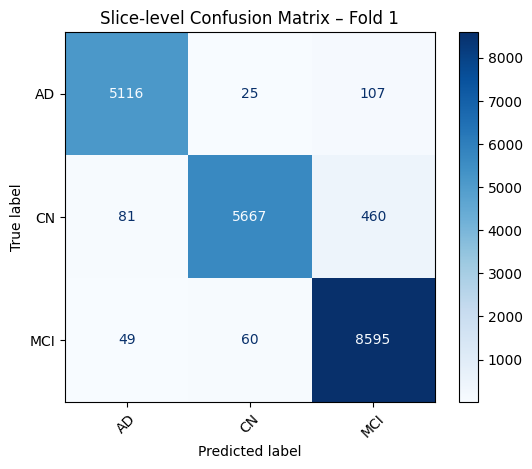

Fold 1 Subject-level Accuracy: 0.9652
Subject-level classification report:
              precision    recall  f1-score   support

          AD       0.99      0.99      0.99        67
          CN       0.99      0.90      0.94        84
         MCI       0.94      0.99      0.97       136

    accuracy                           0.97       287
   macro avg       0.97      0.96      0.97       287
weighted avg       0.97      0.97      0.96       287



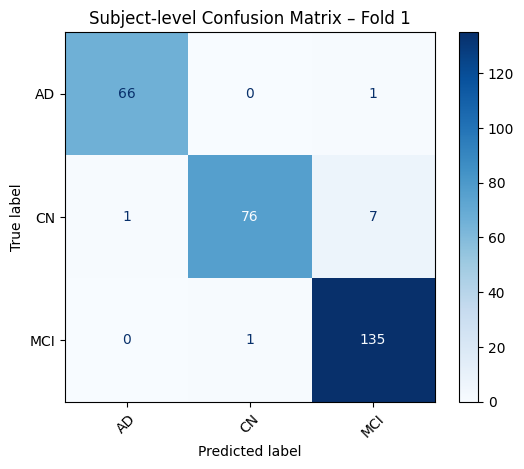

========== Fold 2 ==========
Train subjects: 1148
Test subjects : 287
Fold 2 Slice-level Accuracy: 0.9547
Slice-level classification report:
              precision    recall  f1-score   support

          AD       0.98      0.95      0.96      5248
          CN       0.98      0.92      0.95      5760
         MCI       0.93      0.98      0.95      9152

    accuracy                           0.95     20160
   macro avg       0.96      0.95      0.96     20160
weighted avg       0.96      0.95      0.95     20160



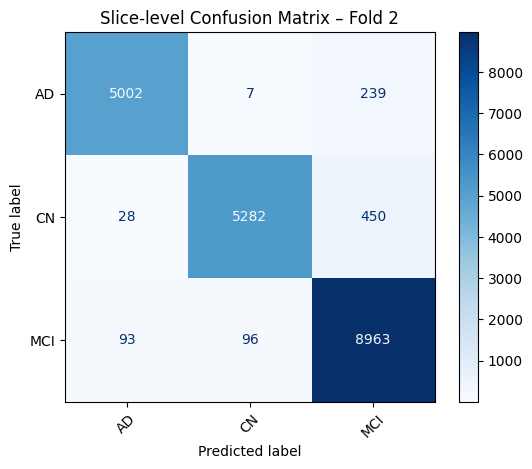

Fold 2 Subject-level Accuracy: 0.9617
Subject-level classification report:
              precision    recall  f1-score   support

          AD       1.00      0.95      0.98        66
          CN       0.99      0.91      0.95        78
         MCI       0.93      0.99      0.96       143

    accuracy                           0.96       287
   macro avg       0.97      0.95      0.96       287
weighted avg       0.96      0.96      0.96       287



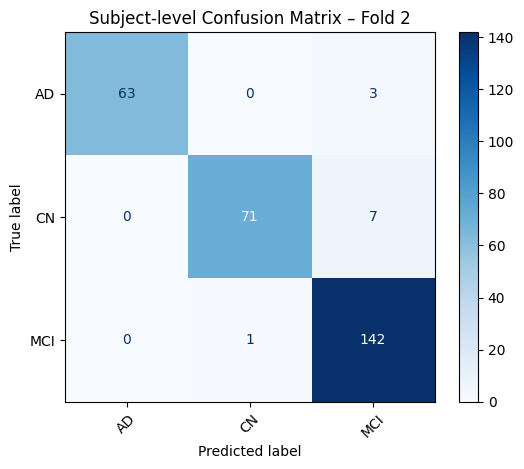

========== Fold 3 ==========
Train subjects: 1148
Test subjects : 287
Fold 3 Slice-level Accuracy: 0.9729
Slice-level classification report:
              precision    recall  f1-score   support

          AD       0.98      0.97      0.98      4288
          CN       0.98      0.96      0.97      6592
         MCI       0.96      0.98      0.97      9216

    accuracy                           0.97     20096
   macro avg       0.98      0.97      0.97     20096
weighted avg       0.97      0.97      0.97     20096



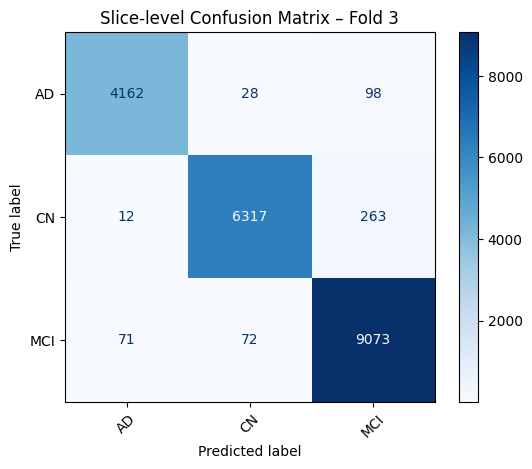

Fold 3 Subject-level Accuracy: 0.9791
Subject-level classification report:
              precision    recall  f1-score   support

          AD       1.00      0.98      0.99        54
          CN       1.00      0.94      0.97        89
         MCI       0.96      1.00      0.98       144

    accuracy                           0.98       287
   macro avg       0.99      0.98      0.98       287
weighted avg       0.98      0.98      0.98       287



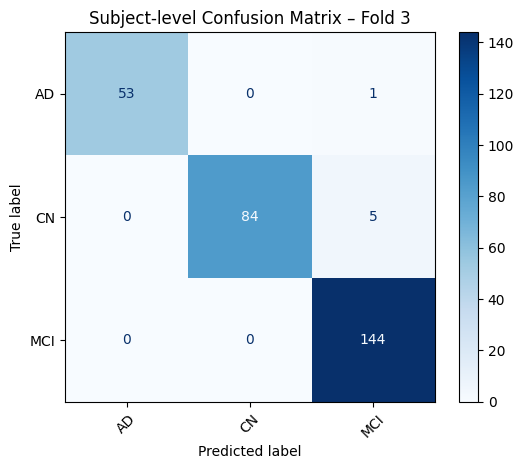

========== Fold 4 ==========
Train subjects: 1148
Test subjects : 287
Fold 4 Slice-level Accuracy: 0.9589
Slice-level classification report:
              precision    recall  f1-score   support

          AD       0.98      0.95      0.97      4480
          CN       0.97      0.94      0.95      6592
         MCI       0.94      0.98      0.96      9024

    accuracy                           0.96     20096
   macro avg       0.96      0.96      0.96     20096
weighted avg       0.96      0.96      0.96     20096



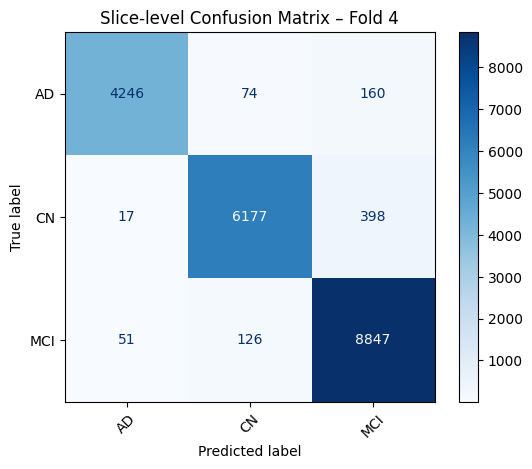

Fold 4 Subject-level Accuracy: 0.9686
Subject-level classification report:
              precision    recall  f1-score   support

          AD       1.00      0.96      0.98        57
          CN       0.98      0.93      0.95        89
         MCI       0.95      0.99      0.97       141

    accuracy                           0.97       287
   macro avg       0.98      0.96      0.97       287
weighted avg       0.97      0.97      0.97       287



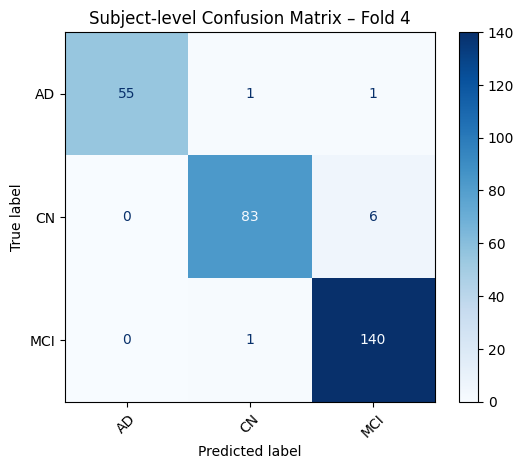

========== Fold 5 ==========
Train subjects: 1148
Test subjects : 287
Fold 5 Slice-level Accuracy: 0.9574
Slice-level classification report:
              precision    recall  f1-score   support

          AD       0.99      0.93      0.96      4544
          CN       0.95      0.94      0.95      6208
         MCI       0.95      0.98      0.96      9344

    accuracy                           0.96     20096
   macro avg       0.96      0.95      0.96     20096
weighted avg       0.96      0.96      0.96     20096



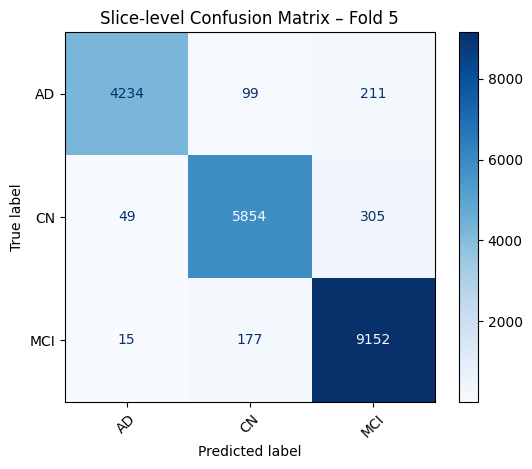

Fold 5 Subject-level Accuracy: 0.9756
Subject-level classification report:
              precision    recall  f1-score   support

          AD       0.98      0.95      0.97        59
          CN       0.99      0.95      0.97        82
         MCI       0.97      1.00      0.98       146

    accuracy                           0.98       287
   macro avg       0.98      0.97      0.97       287
weighted avg       0.98      0.98      0.98       287



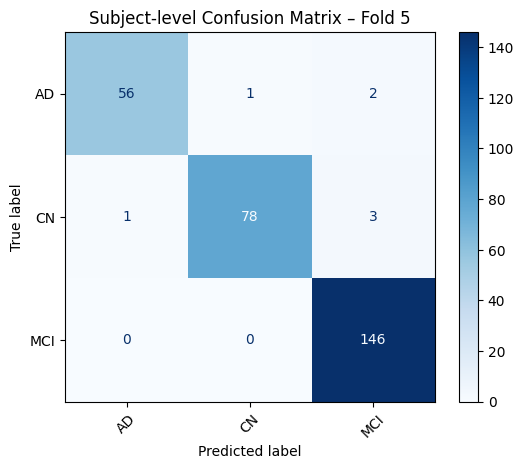


========== Cross-Validation Summary ==========
Slice-level Fold Accuracies: [0.9612 0.9547 0.9729 0.9589 0.9574]
Slice-level Mean Accuracy : 0.9610308613891417
Slice-level Std Accuracy  : 0.006312642831939855

Subject-level Fold Accuracies: [0.9652 0.9617 0.9791 0.9686 0.9756]
Subject-level Mean Accuracy : 0.9700348432055748
Subject-level Std Accuracy  : 0.006462451913237417

Aggregated Subject-level classification report (all folds):
              precision    recall  f1-score   support

          AD       0.99      0.97      0.98       303
          CN       0.99      0.93      0.96       422
         MCI       0.95      1.00      0.97       710

    accuracy                           0.97      1435
   macro avg       0.98      0.96      0.97      1435
weighted avg       0.97      0.97      0.97      1435



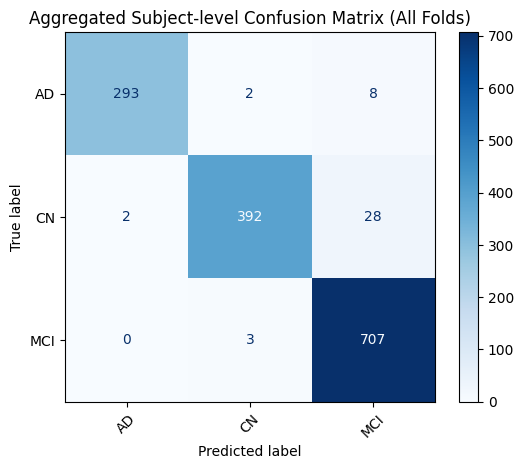

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GroupKFold
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)
from xgboost import XGBClassifier

# ------------------------------------------------------------
# 1. Load Dataset
# ------------------------------------------------------------
DATA_PATH = r"D:\fused_slices_with_class_labels.csv"
df = pd.read_csv(DATA_PATH)

LABEL_COL = "class"
GROUP_COL = "Image Data ID"

# ------------------------------------------------------------
# 2. Prepare Data
# ------------------------------------------------------------
X = df.drop(columns=[LABEL_COL, GROUP_COL])
y = df[LABEL_COL]
groups = df[GROUP_COL]

le = LabelEncoder()
y_encoded = le.fit_transform(y)

num_classes = len(le.classes_)
class_names = le.classes_

print("Classes:", class_names)
print("Unique subjects:", groups.nunique())

# ------------------------------------------------------------
# 3. GroupKFold Cross-Validation
# ------------------------------------------------------------
gkf = GroupKFold(n_splits=5)

fold_accuracies_slice = []
fold_accuracies_subject = []
# to compute overall aggregated subject-level metrics across folds
y_true_subject_all = []
y_pred_subject_all = []

cm_aggregate_subject = np.zeros((num_classes, num_classes), dtype=int)

print("\nStarting Subject-Level Cross-Validation...\n")


def mode_val(s):
    # robust mode: return first mode or first element if no mode
    m = s.mode()
    if len(m) > 0:
        return m.iloc[0]
    return s.iloc[0]


for fold, (train_idx, test_idx) in enumerate(gkf.split(X, y_encoded, groups), 1):

    print(f"========== Fold {fold} ==========")

    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]
    groups_test = groups.iloc[test_idx].reset_index(drop=True)

    print("Train subjects:", groups.iloc[train_idx].nunique())
    print("Test subjects :", groups.iloc[test_idx].nunique())

    # --------------------------------------------------------
    # 4. XGBoost Model
    # --------------------------------------------------------
    model = XGBClassifier(
        objective="multi:softprob",
        num_class=num_classes,
        n_estimators=300,
        max_depth=6,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        eval_metric="mlogloss",
        random_state=42,
        n_jobs=-1
    )

    # --------------------------------------------------------
    # 5. Train
    # --------------------------------------------------------
    model.fit(X_train, y_train)

    # --------------------------------------------------------
    # 6. Predict (slice-level)
    # --------------------------------------------------------
    y_pred = model.predict(X_test)
    fold_acc_slice = accuracy_score(y_test, y_pred)
    fold_accuracies_slice.append(fold_acc_slice)

    print(f"Fold {fold} Slice-level Accuracy: {fold_acc_slice:.4f}")
    print("Slice-level classification report:")
    print(classification_report(y_test, y_pred, target_names=class_names))

    # slice-level confusion matrix (optional)
    cm_slice = confusion_matrix(y_test, y_pred, labels=np.arange(num_classes))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_slice, display_labels=class_names)
    disp.plot(cmap="Blues", xticks_rotation=45)
    plt.title(f"Slice-level Confusion Matrix – Fold {fold}")
    plt.show()

    # --------------------------------------------------------
    # 7. Aggregate to Subject-level for this fold
    # --------------------------------------------------------
    # build test dataframe aligned with X_test
    test_df = pd.DataFrame({
        GROUP_COL: groups_test,
        "true": y_test,
        "pred_slice": y_pred
    })

    # try to get probabilities and attach as columns prob_0..prob_{C-1}
    probs = None
    try:
        probs = model.predict_proba(X_test)
        # ensure shape (n_samples, num_classes)
        if probs is not None and probs.shape[1] == num_classes:
            for c in range(num_classes):
                test_df[f"prob_{c}"] = probs[:, c]
        else:
            probs = None
    except Exception:
        probs = None

    subj_true = []
    subj_pred = []
    for subj, g in test_df.groupby(GROUP_COL):
        true_label_subj = mode_val(g["true"])
        if probs is not None:
            mean_probs = g[[f"prob_{c}" for c in range(num_classes)]].mean().values
            pred_label_subj = int(np.argmax(mean_probs))
        else:
            pred_label_subj = int(mode_val(g["pred_slice"]))
        subj_true.append(true_label_subj)
        subj_pred.append(pred_label_subj)

    subj_true = np.array(subj_true, dtype=int)
    subj_pred = np.array(subj_pred, dtype=int)

    # per-fold subject-level accuracy and report
    acc_subject = accuracy_score(subj_true, subj_pred)
    fold_accuracies_subject.append(acc_subject)
    print(f"Fold {fold} Subject-level Accuracy: {acc_subject:.4f}")
    print("Subject-level classification report:")
    print(classification_report(subj_true, subj_pred, target_names=class_names))

    # subject-level confusion matrix for this fold
    cm_subj = confusion_matrix(subj_true, subj_pred, labels=np.arange(num_classes))
    cm_aggregate_subject += cm_subj

    disp_subj = ConfusionMatrixDisplay(confusion_matrix=cm_subj, display_labels=class_names)
    disp_subj.plot(cmap="Blues", xticks_rotation=45)
    plt.title(f"Subject-level Confusion Matrix – Fold {fold}")
    plt.show()

    # append to global lists for full aggregated metrics across folds
    y_true_subject_all.extend(subj_true.tolist())
    y_pred_subject_all.extend(subj_pred.tolist())

# ------------------------------------------------------------
# 8. Cross-Validation Summary (slice & subject)
# ------------------------------------------------------------
print("\n========== Cross-Validation Summary ==========")
print("Slice-level Fold Accuracies:", np.round(fold_accuracies_slice, 4))
print("Slice-level Mean Accuracy :", np.mean(fold_accuracies_slice))
print("Slice-level Std Accuracy  :", np.std(fold_accuracies_slice))
print()
print("Subject-level Fold Accuracies:", np.round(fold_accuracies_subject, 4))
print("Subject-level Mean Accuracy :", np.mean(fold_accuracies_subject))
print("Subject-level Std Accuracy  :", np.std(fold_accuracies_subject))

# ------------------------------------------------------------
# 9. Aggregated Subject-level Confusion Matrix + Report (all folds)
# ------------------------------------------------------------
y_true_subject_all = np.array(y_true_subject_all, dtype=int)
y_pred_subject_all = np.array(y_pred_subject_all, dtype=int)

print("\nAggregated Subject-level classification report (all folds):")
print(classification_report(y_true_subject_all, y_pred_subject_all, target_names=class_names))

cm_total_subject = confusion_matrix(y_true_subject_all, y_pred_subject_all, labels=np.arange(num_classes))
disp_total = ConfusionMatrixDisplay(confusion_matrix=cm_total_subject, display_labels=class_names)
disp_total.plot(cmap="Blues", xticks_rotation=45)
plt.title("Aggregated Subject-level Confusion Matrix (All Folds)")
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_train_val(history=None, csv_path=None, save_path=None):
    """Plot training and validation loss and accuracy from a Keras-like history dict or a CSV log."""
    if csv_path is not None:
        df = pd.read_csv(csv_path)
        h = {}
        for col in df.columns:
            lc = col.lower()
            if 'loss' in lc:
                if lc.startswith('val') or 'val' in lc:
                    h.setdefault('val_loss', df[col].tolist())
                else:
                    h.setdefault('loss', df[col].tolist())
            if 'acc' in lc or 'accuracy' in lc:
                if lc.startswith('val') or 'val' in lc:
                    h.setdefault('val_accuracy', df[col].tolist())
                else:
                    h.setdefault('accuracy', df[col].tolist())
        history = h
    elif history is None:
        raise ValueError('Provide a `history` dict/object or a `csv_path`.')

    h = history.history if hasattr(history, 'history') else history
    loss = h.get('loss') or h.get('train_loss')
    val_loss = h.get('val_loss')
    acc = h.get('accuracy') or h.get('acc') or h.get('train_acc')
    val_acc = h.get('val_accuracy') or h.get('val_acc')

    # determine epochs length
    lengths = [len(x) for x in (loss, val_loss, acc, val_acc) if x is not None]
    if not lengths:
        raise ValueError('No metric arrays found in history or CSV.')
    epochs = range(1, max(lengths) + 1)

    plt.figure(figsize=(12,4))
    plt.subplot(1,2,1)
    if loss is not None:
        plt.plot(epochs[:len(loss)], loss, '-o', label='train')
    if val_loss is not None:
        plt.plot(epochs[:len(val_loss)], val_loss, '-o', label='val')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.legend()

    plt.subplot(1,2,2)
    if acc is not None:
        plt.plot(epochs[:len(acc)], acc, '-o', label='train')
    if val_acc is not None:
        plt.plot(epochs[:len(val_acc)], val_acc, '-o', label='val')
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.legend()

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150)
    plt.show()

# Example usages:
# If you have a Keras History object: plot_train_val(history)
# If you saved a CSV with columns like 'train_loss','val_loss','train_acc','val_acc':
# plot_train_val(csv_path='training_log.csv')
